In [1]:
import pandas as pd
from sklearn.model_selection import train_test_split
import re
from sklearn.feature_extraction.text import CountVectorizer,TfidfVectorizer
from sklearn_pandas import DataFrameMapper
from sklearn import preprocessing
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import confusion_matrix,classification_report,accuracy_score
import numpy as np
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import GridSearchCV
import sklearn.metrics
from textblob import TextBlob 
from nltk.corpus import stopwords
from textblob import Word
import math

In [2]:
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

In [3]:
raw_data_train = pd.read_csv('./Data_Train.csv')
raw_data_test = pd.read_csv('./Data_Test.csv')

In [4]:
raw_data_test.shape

(19615, 10)

In [5]:
raw_data_train.shape

(78458, 11)

In [6]:
raw_data = pd.concat([raw_data_train,raw_data_test],sort=False)

In [7]:
raw_data.shape

(98073, 11)

In [51]:
column = ['Name','Genre']
raw_data.iloc[0:19615][column]

,Name,Genre
0,Hardstyle,danceedm
1,Dj Aladdin,danceedm
2,Maxximize On Air,danceedm
3,GR6 EXPLODE,rbsoul
4,Tritonal,danceedm
...,...,...
19610,Sweet Musique,deephouse
19611,Monstercat,danceedm
19612,Vexento,electronic
19613,Monstercat,danceedm


In [10]:
raw_data.shape

(98073, 11)

In [11]:
raw_data.head()

,Unique_ID,Name,Genre,Country,Song_Name,Timestamp,Views,Comments,Likes,Popularity,Followers
0,413890,Hardstyle,danceedm,AU,N-Vitral presents BOMBSQUAD - Poison Spitter (...,2018-03-30 15:24:45.000000,14017.0,4,499,97,119563
1,249453,Dj Aladdin,danceedm,AU,Dj Aladdin - Old School Hip Hop Quick Mix,2016-06-20 05:58:52.000000,1918.0,17,49,17,2141
2,681116,Maxximize On Air,danceedm,AU,Maxximize On Air - Mixed by Blasterjaxx - Epis...,2015-05-08 17:45:59.000000,9668.0,11,312,91,22248
3,387253,GR6 EXPLODE,rbsoul,AU,MC Yago - Tenho Compromisso (DJ R7),2017-06-08 23:50:03.000000,113036.0,2,"2,400",76,393655
4,1428029,Tritonal,danceedm,AU,Escape (feat. Steph Jones),2016-09-17 20:50:19.000000,110024.0,81,"3,031",699,201030


In [19]:
raw_data.Genre.unique()

array(['danceedm', 'rbsoul', 'all-music', 'trap', 'latin', 'electronic',
       'deephouse', 'hiphoprap', 'classical', 'ambient', 'pop', 'rock',
       'reggaeton', 'country', 'disco', 'alternativerock', 'dubstep',
       'drumbass', 'metal', 'folksingersongwriter', 'indie'], dtype=object)

In [20]:
raw_data.Country.unique()

array(['AU'], dtype=object)

In [46]:
raw_data.Song_Name.unique()

array(['N-Vitral presents BOMBSQUAD - Poison Spitter (Snakepit 2018 Anthem)',
       'Dj Aladdin - Old School Hip Hop Quick Mix',
       'Maxximize On Air - Mixed by Blasterjaxx - Episode #048', ...,
       'Vermont - Paradigma (Wassermann Krautramatrik Mix)',
       'Yheti & Metapod - Ominous Combo', 'Devin Wild - Everlasting'],
      dtype=object)

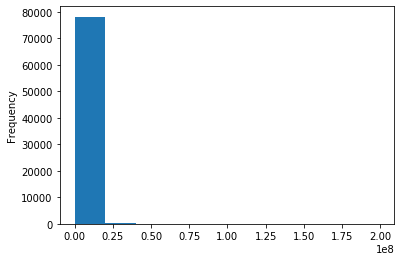

In [31]:
raw_data[~raw_data['Views'].isnull()]['Views'].plot(
    kind='hist'
)

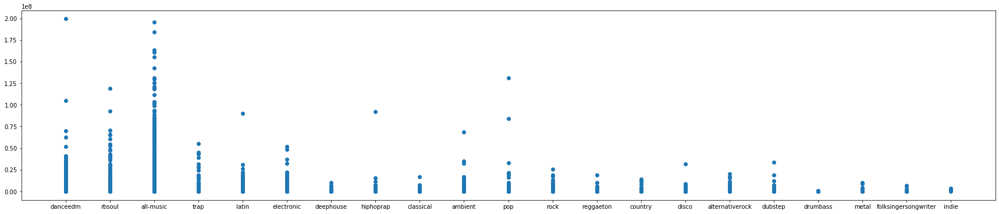

In [34]:
plt.figure(figsize=(30,6))
plt.scatter(raw_data[~raw_data['Views'].isnull()]['Genre'], raw_data[~raw_data['Views'].isnull()]['Views'])

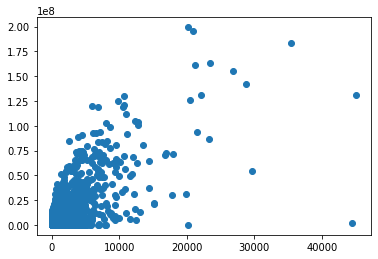

In [62]:
# plt.figure(figsize=(30,6))
plt.scatter(raw_data[(~raw_data['Views'].isnull()) & (raw_data['Comments'] < 90000)]['Comments'], raw_data[(~raw_data['Views'].isnull()) & (raw_data['Comments'] < 90000)]['Views'])

In [63]:
raw_data[(raw_data['Comments'] < 90000)].shape

(98072, 11)

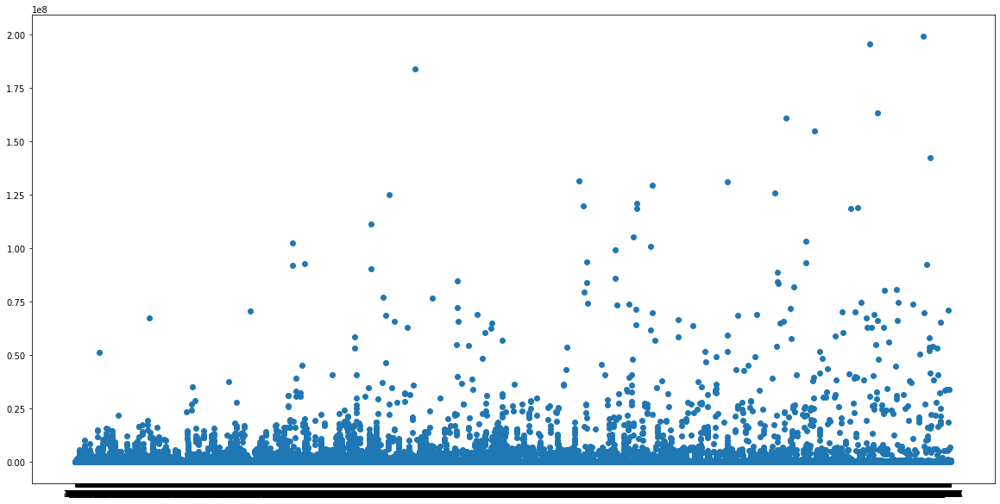

In [45]:
plt.figure(figsize=(20,10))
plt.scatter(raw_data[~raw_data['Views'].isnull()]['Likes'], raw_data[~raw_data['Views'].isnull()]['Views'])

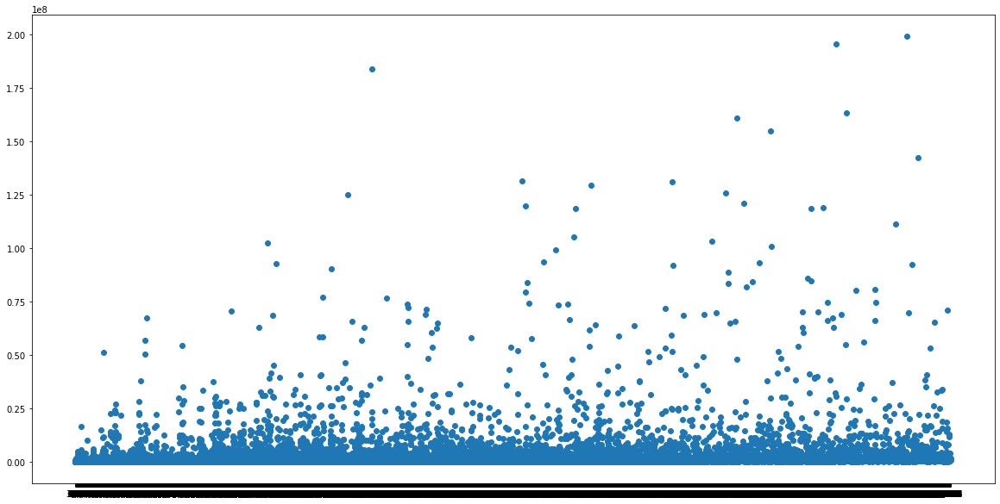

In [44]:
plt.figure(figsize=(20,10))
plt.scatter(raw_data[~raw_data['Views'].isnull()]['Popularity'], raw_data[~raw_data['Views'].isnull()]['Views'])

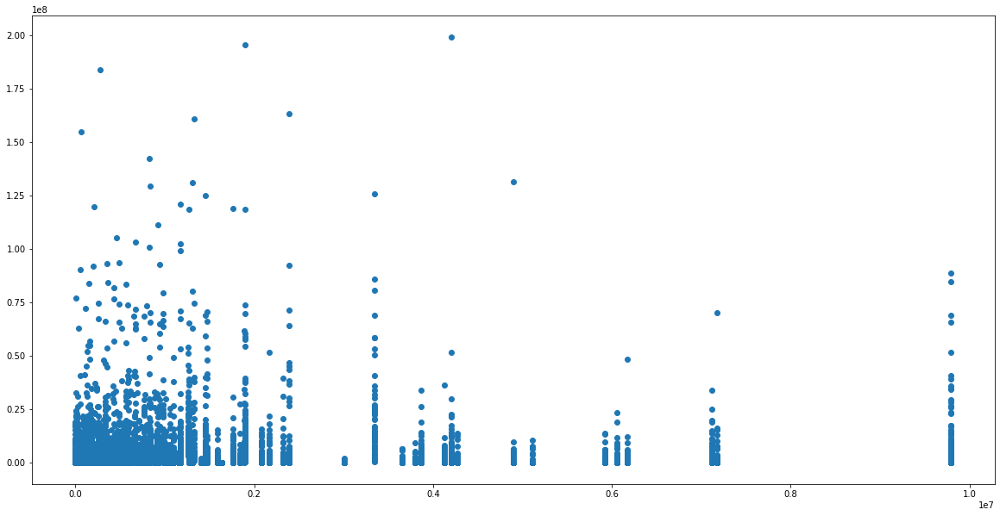

In [43]:
plt.figure(figsize=(20,10))
plt.scatter(raw_data[~raw_data['Views'].isnull()]['Followers'], raw_data[~raw_data['Views'].isnull()]['Views'])

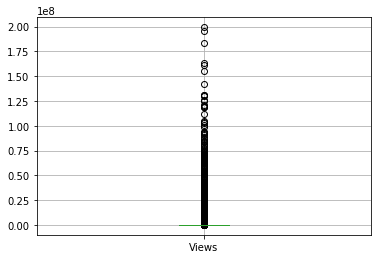

In [39]:
raw_data[~raw_data['Views'].isnull()].boxplot(column=['Views'])

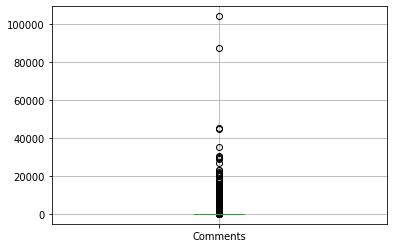

In [40]:
raw_data.boxplot(column=['Comments'])

In [110]:
def numeric_feat(df,column,name,metric):
    column.append(metric)
    data_num_feat = df.iloc[0:78457][column]
    data_num_feat[name+'_mean'] = data_num_feat.groupby(column[:-1])[metric].transform(np.mean)
#     data_num_feat[name+'_min'] = data_num_feat.groupby(column[:-1])[metric].transform(np.min)
#     data_num_feat[name+'_max'] = data_num_feat.groupby(column[:-1])[metric].transform(np.max)
    data_num_feat[name+'_median'] = data_num_feat.groupby(column[:-1])[metric].transform(np.median)
    data_num_feat.drop(columns=[metric],inplace=True)
    data_num_feat.drop_duplicates(keep='first',inplace=True)
    df = df.merge(data_num_feat,how='left',left_on=column[:-1],right_on=column[:-1])
    return df

In [111]:
data = raw_data[(raw_data['Comments'] < 90000)].copy()

In [112]:
data['Timestamp'] = pd.to_datetime(data['Timestamp'])

In [113]:
data['month'] = data.Timestamp.apply(lambda x: x.month) 
data['year'] = data.Timestamp.apply(lambda x: x.year) 
# data.iloc[0]['Timestamp'].year

In [114]:
data.head()

,Unique_ID,Name,Genre,Country,Song_Name,Timestamp,Views,Comments,Likes,Popularity,Followers,month,year
0,413890,Hardstyle,danceedm,AU,N-Vitral presents BOMBSQUAD - Poison Spitter (...,2018-03-30 15:24:45,14017.0,4,499,97,119563,3,2018
1,249453,Dj Aladdin,danceedm,AU,Dj Aladdin - Old School Hip Hop Quick Mix,2016-06-20 05:58:52,1918.0,17,49,17,2141,6,2016
2,681116,Maxximize On Air,danceedm,AU,Maxximize On Air - Mixed by Blasterjaxx - Epis...,2015-05-08 17:45:59,9668.0,11,312,91,22248,5,2015
3,387253,GR6 EXPLODE,rbsoul,AU,MC Yago - Tenho Compromisso (DJ R7),2017-06-08 23:50:03,113036.0,2,"2,400",76,393655,6,2017
4,1428029,Tritonal,danceedm,AU,Escape (feat. Steph Jones),2016-09-17 20:50:19,110024.0,81,"3,031",699,201030,9,2016


In [115]:
data = numeric_feat(data,['Name'],'Name','Views')
data = numeric_feat(data,['Genre'],'Genre','Views')
data = numeric_feat(data,['Name','Genre'],'Name_Genre','Views')

In [116]:
data = numeric_feat(data,['month'],'month','Views')
data = numeric_feat(data,['year'],'year','Views')
data = numeric_feat(data,['month','year'],'month_year','Views')
data = numeric_feat(data,['Name','year'],'name_year','Views')
data = numeric_feat(data,['Genre','year'],'genre_year','Views')

In [68]:
data.columns

Index(['Unique_ID', 'Name', 'Genre', 'Country', 'Song_Name', 'Timestamp',
       'Views', 'Comments', 'Likes', 'Popularity', 'Followers', 'month',
       'year', 'Name_mean', 'Name_min', 'Name_max', 'Name_median',
       'Genre_mean', 'Genre_min', 'Genre_max', 'Genre_median',
       'Name_Genre_mean', 'Name_Genre_min', 'Name_Genre_max',
       'Name_Genre_median', 'month_mean', 'month_min', 'month_max',
       'month_median', 'year_mean', 'year_min', 'year_max', 'year_median',
       'month_year_mean', 'month_year_min', 'month_year_max',
       'month_year_median', 'name_year_mean', 'name_year_min', 'name_year_max',
       'name_year_median', 'genre_year_mean', 'genre_year_min',
       'genre_year_max', 'genre_year_median'],
      dtype='object')

In [69]:
data.columns[7:]

Index(['Comments', 'Likes', 'Popularity', 'Followers', 'month', 'year',
       'Name_mean', 'Name_min', 'Name_max', 'Name_median', 'Genre_mean',
       'Genre_min', 'Genre_max', 'Genre_median', 'Name_Genre_mean',
       'Name_Genre_min', 'Name_Genre_max', 'Name_Genre_median', 'month_mean',
       'month_min', 'month_max', 'month_median', 'year_mean', 'year_min',
       'year_max', 'year_median', 'month_year_mean', 'month_year_min',
       'month_year_max', 'month_year_median', 'name_year_mean',
       'name_year_min', 'name_year_max', 'name_year_median', 'genre_year_mean',
       'genre_year_min', 'genre_year_max', 'genre_year_median'],
      dtype='object')

In [117]:
def convert_to_num(text):
    text = text.replace(',','')
    if text[-1] == 'K':
        return float(text[:-1])*1000
    elif text[-1] == 'M':
        return float(text[:-1])*1000000
    else:
        return float(text)

In [118]:
# if 'K' in '47.6K'.split():
#     print ('yes')
# '47.6K'[-1]
float('47.6K'[:-1])

47.6

In [119]:
data['Likes'] = data.Likes.apply(lambda x: convert_to_num(x))
data['Popularity'] = data.Popularity.apply(lambda x: convert_to_num(x))

In [14]:
data = pd.read_csv('./data.csv')

In [15]:
data.shape

(98072, 36)

In [120]:
mapper = DataFrameMapper([
    (data.columns[7:],None),
    (['Name','Genre'],OneHotEncoder())
])

In [121]:
labels = data.iloc[0:78457]['Views']

In [18]:
labels.shape

(78457,)

In [122]:
data_mapped = mapper.fit_transform(data)

In [20]:
data_mapped.shape

(98072, 1269)

In [123]:
X= data_mapped[:78457]
y= labels
X_test = data_mapped[78457:]

In [124]:
X_train,X_cv,y_train,y_cv = train_test_split(X,y,test_size=0.1,random_state=42)

In [23]:
from xgboost import XGBRegressor

In [85]:
xgb = XGBRegressor(base_score=0.5, booster='gbtree',
                   learning_rate=0.1, max_delta_step=0,max_depth=8,
                   min_child_weight=1, n_estimators=1000,
                   random_state=0, reg_alpha=0,
                   reg_lambda=1,eval_metric='rmse',subsample=1
                  )

In [25]:
X_train.shape

(70611, 1269)

In [86]:
xgb.fit(X_train,y_train)
y_pred_xgb=xgb.predict(X_cv)

D:\ds\venv37_64\lib\site-packages\xgboost\core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[23:26:24] WARNING: C:/Jenkins/workspace/xgboost-win64_release_0.90/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


In [27]:
from sklearn.metrics import mean_squared_error

In [87]:
y_pred_xgb[y_pred_xgb<0] = 0
np.sqrt(mean_squared_error(y_pred_xgb,y_cv))

525792.2277884359

In [91]:
xgb.feature_importances_

array([6.2832283e-04, 5.4626650e-01, 8.9792680e-04, ..., 3.1951981e-04,
       2.6697691e-03, 7.6520257e-04], dtype=float32)

In [95]:
from catboost import Pool, CatBoostRegressor

In [125]:
params = {
    'iterations':[500,1000,1500,2000],
    'learning_rate':[0.1,0.01,0.3,0.03,0.003],
    'depth':[6,8,10]
}

In [126]:
cbr = CatBoostRegressor(
    random_strength=0.1,
    eval_metric='RMSE',
    leaf_estimation_method='Gradient'
)

0:	learn: 3665052.0032999	total: 54.9ms	remaining: 27.4s
1:	learn: 3392618.2408332	total: 101ms	remaining: 25.1s
2:	learn: 3167822.7060028	total: 146ms	remaining: 24.2s
3:	learn: 2946073.8351688	total: 214ms	remaining: 26.5s
4:	learn: 2752777.3037039	total: 289ms	remaining: 28.6s
5:	learn: 2571969.5964391	total: 367ms	remaining: 30.3s
6:	learn: 2421243.5645991	total: 443ms	remaining: 31.2s
7:	learn: 2271288.1256720	total: 498ms	remaining: 30.6s
8:	learn: 2140176.6158649	total: 546ms	remaining: 29.8s
9:	learn: 2023651.1073159	total: 597ms	remaining: 29.2s
10:	learn: 1914045.2134652	total: 645ms	remaining: 28.7s
11:	learn: 1833751.3133926	total: 700ms	remaining: 28.5s
12:	learn: 1756597.8605627	total: 753ms	remaining: 28.2s
13:	learn: 1688852.9201959	total: 812ms	remaining: 28.2s
14:	learn: 1624401.9067651	total: 860ms	remaining: 27.8s
15:	learn: 1568423.7830274	total: 909ms	remaining: 27.5s
16:	learn: 1505197.8201717	total: 972ms	remaining: 27.6s
17:	learn: 1452837.3272173	total: 1.02s	

147:	learn: 608442.4698835	total: 9.02s	remaining: 21.5s
148:	learn: 607480.8469159	total: 9.08s	remaining: 21.4s
149:	learn: 605662.7687083	total: 9.14s	remaining: 21.3s
150:	learn: 603976.3914134	total: 9.2s	remaining: 21.3s
151:	learn: 601931.3195893	total: 9.3s	remaining: 21.3s
152:	learn: 601146.4204327	total: 9.41s	remaining: 21.3s
153:	learn: 598584.2194870	total: 9.5s	remaining: 21.3s
154:	learn: 596989.8893305	total: 9.57s	remaining: 21.3s
155:	learn: 596283.9075363	total: 9.67s	remaining: 21.3s
156:	learn: 593898.3943049	total: 9.77s	remaining: 21.3s
157:	learn: 593143.0957640	total: 9.85s	remaining: 21.3s
158:	learn: 591653.3920330	total: 9.92s	remaining: 21.3s
159:	learn: 589631.0453723	total: 9.98s	remaining: 21.2s
160:	learn: 588739.0615324	total: 10s	remaining: 21.2s
161:	learn: 587232.4231146	total: 10.1s	remaining: 21.1s
162:	learn: 583811.5408796	total: 10.2s	remaining: 21.1s
163:	learn: 581446.1164810	total: 10.3s	remaining: 21.1s
164:	learn: 580275.9826554	total: 10

294:	learn: 444592.3722106	total: 19.3s	remaining: 13.4s
295:	learn: 442998.1835066	total: 19.4s	remaining: 13.4s
296:	learn: 442610.9080859	total: 19.5s	remaining: 13.3s
297:	learn: 442181.2075410	total: 19.6s	remaining: 13.3s
298:	learn: 440663.3164991	total: 19.7s	remaining: 13.2s
299:	learn: 440373.5462614	total: 19.7s	remaining: 13.1s
300:	learn: 440009.0235977	total: 19.8s	remaining: 13.1s
301:	learn: 438566.3510637	total: 19.8s	remaining: 13s
302:	learn: 437841.4566549	total: 19.9s	remaining: 12.9s
303:	learn: 437408.6124616	total: 20s	remaining: 12.9s
304:	learn: 436467.3527936	total: 20s	remaining: 12.8s
305:	learn: 435986.2364540	total: 20.1s	remaining: 12.7s
306:	learn: 435615.0225259	total: 20.2s	remaining: 12.7s
307:	learn: 435044.9870767	total: 20.2s	remaining: 12.6s
308:	learn: 434025.6046161	total: 20.3s	remaining: 12.6s
309:	learn: 432944.1053432	total: 20.4s	remaining: 12.5s
310:	learn: 432401.6285418	total: 20.5s	remaining: 12.4s
311:	learn: 431291.4765436	total: 20.

440:	learn: 364479.3103064	total: 29.6s	remaining: 3.96s
441:	learn: 364240.0108673	total: 29.7s	remaining: 3.89s
442:	learn: 364062.5091616	total: 29.8s	remaining: 3.83s
443:	learn: 363884.4835625	total: 29.9s	remaining: 3.76s
444:	learn: 362981.9908815	total: 30s	remaining: 3.71s
445:	learn: 362400.0265520	total: 30.1s	remaining: 3.64s
446:	learn: 362033.4058672	total: 30.2s	remaining: 3.57s
447:	learn: 361859.2211792	total: 30.2s	remaining: 3.51s
448:	learn: 361549.5834035	total: 30.3s	remaining: 3.44s
449:	learn: 361146.9603839	total: 30.4s	remaining: 3.38s
450:	learn: 360959.7233004	total: 30.5s	remaining: 3.31s
451:	learn: 360531.1597120	total: 30.5s	remaining: 3.24s
452:	learn: 359876.4908185	total: 30.6s	remaining: 3.17s
453:	learn: 359389.8905182	total: 30.7s	remaining: 3.11s
454:	learn: 358587.4282549	total: 30.7s	remaining: 3.04s
455:	learn: 358273.7844148	total: 30.8s	remaining: 2.97s
456:	learn: 357501.3529826	total: 30.9s	remaining: 2.91s
457:	learn: 357062.6917378	total:

87:	learn: 688934.7350978	total: 5.45s	remaining: 25.5s
88:	learn: 682455.3756196	total: 5.5s	remaining: 25.4s
89:	learn: 677989.5654195	total: 5.54s	remaining: 25.3s
90:	learn: 673330.0839602	total: 5.58s	remaining: 25.1s
91:	learn: 668398.9122123	total: 5.63s	remaining: 25s
92:	learn: 667212.8355022	total: 5.67s	remaining: 24.8s
93:	learn: 663049.3347385	total: 5.72s	remaining: 24.7s
94:	learn: 657959.0470803	total: 5.76s	remaining: 24.6s
95:	learn: 655551.9273690	total: 5.8s	remaining: 24.4s
96:	learn: 653384.1782813	total: 5.85s	remaining: 24.3s
97:	learn: 649626.9835582	total: 5.89s	remaining: 24.2s
98:	learn: 648042.8736893	total: 5.93s	remaining: 24s
99:	learn: 644316.0520860	total: 5.98s	remaining: 23.9s
100:	learn: 643059.6191784	total: 6.02s	remaining: 23.8s
101:	learn: 641265.7291825	total: 6.06s	remaining: 23.7s
102:	learn: 637787.5161269	total: 6.16s	remaining: 23.7s
103:	learn: 633985.9900929	total: 6.22s	remaining: 23.7s
104:	learn: 630134.9290587	total: 6.26s	remaining:

234:	learn: 431070.9082215	total: 13.1s	remaining: 14.8s
235:	learn: 430153.7514764	total: 13.2s	remaining: 14.8s
236:	learn: 428515.2618874	total: 13.2s	remaining: 14.7s
237:	learn: 427452.6483065	total: 13.3s	remaining: 14.6s
238:	learn: 427167.9875232	total: 13.4s	remaining: 14.6s
239:	learn: 425828.4537509	total: 13.4s	remaining: 14.5s
240:	learn: 424804.2577044	total: 13.5s	remaining: 14.5s
241:	learn: 423422.6290652	total: 13.5s	remaining: 14.4s
242:	learn: 422208.5381380	total: 13.6s	remaining: 14.4s
243:	learn: 421497.5830587	total: 13.6s	remaining: 14.3s
244:	learn: 420809.5380190	total: 13.7s	remaining: 14.2s
245:	learn: 419854.8478426	total: 13.7s	remaining: 14.2s
246:	learn: 418974.7942685	total: 13.8s	remaining: 14.1s
247:	learn: 417973.9704225	total: 13.8s	remaining: 14.1s
248:	learn: 416992.1600508	total: 13.9s	remaining: 14s
249:	learn: 416307.5852611	total: 13.9s	remaining: 13.9s
250:	learn: 415807.0287670	total: 14s	remaining: 13.9s
251:	learn: 414846.3489271	total: 1

381:	learn: 340464.5571535	total: 25.1s	remaining: 7.75s
382:	learn: 339594.2165545	total: 25.2s	remaining: 7.7s
383:	learn: 339275.4385637	total: 25.3s	remaining: 7.64s
384:	learn: 338911.7888131	total: 25.4s	remaining: 7.58s
385:	learn: 338175.4542350	total: 25.4s	remaining: 7.51s
386:	learn: 337894.1587061	total: 25.5s	remaining: 7.44s
387:	learn: 336765.5935316	total: 25.6s	remaining: 7.38s
388:	learn: 336472.7420691	total: 25.6s	remaining: 7.32s
389:	learn: 335403.6405700	total: 25.7s	remaining: 7.25s
390:	learn: 335129.2434322	total: 25.8s	remaining: 7.18s
391:	learn: 334613.4784843	total: 25.8s	remaining: 7.12s
392:	learn: 334483.5948347	total: 25.9s	remaining: 7.05s
393:	learn: 334132.7999097	total: 26s	remaining: 6.99s
394:	learn: 333638.2061572	total: 26s	remaining: 6.92s
395:	learn: 333277.3312427	total: 26.1s	remaining: 6.85s
396:	learn: 333189.2158183	total: 26.2s	remaining: 6.79s
397:	learn: 332770.7928059	total: 26.2s	remaining: 6.72s
398:	learn: 332588.4738891	total: 26

29:	learn: 1116867.9071800	total: 1.74s	remaining: 27.3s
30:	learn: 1102601.5034558	total: 1.79s	remaining: 27.1s
31:	learn: 1085631.0798722	total: 1.84s	remaining: 27s
32:	learn: 1076163.3375669	total: 1.91s	remaining: 27s
33:	learn: 1066407.0077407	total: 1.97s	remaining: 27s
34:	learn: 1058083.0952595	total: 2.02s	remaining: 26.8s
35:	learn: 1048161.0351125	total: 2.06s	remaining: 26.6s
36:	learn: 1042394.3940837	total: 2.11s	remaining: 26.4s
37:	learn: 1035756.6942649	total: 2.17s	remaining: 26.3s
38:	learn: 1029394.7013241	total: 2.21s	remaining: 26.1s
39:	learn: 1022937.5452292	total: 2.26s	remaining: 26s
40:	learn: 1018322.2914190	total: 2.3s	remaining: 25.7s
41:	learn: 1010271.3121326	total: 2.35s	remaining: 25.6s
42:	learn: 1000787.8965441	total: 2.39s	remaining: 25.4s
43:	learn: 995095.4980717	total: 2.44s	remaining: 25.3s
44:	learn: 983198.8197736	total: 2.48s	remaining: 25.1s
45:	learn: 977804.5834324	total: 2.55s	remaining: 25.1s
46:	learn: 969090.1526885	total: 2.6s	remai

175:	learn: 580554.9182523	total: 10.5s	remaining: 19.3s
176:	learn: 576448.5805276	total: 10.5s	remaining: 19.2s
177:	learn: 574869.5126262	total: 10.6s	remaining: 19.1s
178:	learn: 572628.7065398	total: 10.6s	remaining: 19s
179:	learn: 571411.3039590	total: 10.7s	remaining: 19s
180:	learn: 569217.4299910	total: 10.7s	remaining: 18.9s
181:	learn: 566569.4701849	total: 10.8s	remaining: 18.8s
182:	learn: 564919.7321125	total: 10.8s	remaining: 18.7s
183:	learn: 562876.5658733	total: 10.9s	remaining: 18.7s
184:	learn: 561726.6576483	total: 10.9s	remaining: 18.6s
185:	learn: 560853.4910552	total: 11s	remaining: 18.5s
186:	learn: 559355.7215110	total: 11s	remaining: 18.5s
187:	learn: 558739.8277360	total: 11.1s	remaining: 18.4s
188:	learn: 557295.4024125	total: 11.1s	remaining: 18.3s
189:	learn: 556320.3666379	total: 11.2s	remaining: 18.2s
190:	learn: 555410.1168523	total: 11.2s	remaining: 18.2s
191:	learn: 553129.2972926	total: 11.3s	remaining: 18.1s
192:	learn: 551235.0797663	total: 11.3s

321:	learn: 431491.6219286	total: 18.4s	remaining: 10.2s
322:	learn: 430883.6969617	total: 18.5s	remaining: 10.1s
323:	learn: 430424.0142963	total: 18.6s	remaining: 10.1s
324:	learn: 429546.1088377	total: 18.6s	remaining: 10s
325:	learn: 428522.2404735	total: 18.7s	remaining: 9.98s
326:	learn: 428180.2167899	total: 18.7s	remaining: 9.92s
327:	learn: 427484.7850322	total: 18.8s	remaining: 9.86s
328:	learn: 427012.1410180	total: 18.9s	remaining: 9.8s
329:	learn: 425635.8141004	total: 18.9s	remaining: 9.74s
330:	learn: 425417.4277154	total: 19s	remaining: 9.68s
331:	learn: 424913.0050509	total: 19s	remaining: 9.63s
332:	learn: 424324.5361671	total: 19.1s	remaining: 9.58s
333:	learn: 423567.0619220	total: 19.2s	remaining: 9.54s
334:	learn: 422591.5624564	total: 19.3s	remaining: 9.49s
335:	learn: 422268.7731555	total: 19.3s	remaining: 9.44s
336:	learn: 421958.9654273	total: 19.4s	remaining: 9.38s
337:	learn: 421174.9020617	total: 19.4s	remaining: 9.32s
338:	learn: 420879.7220151	total: 19.5

468:	learn: 357043.4837511	total: 28s	remaining: 1.85s
469:	learn: 356843.3235645	total: 28s	remaining: 1.79s
470:	learn: 356500.1873037	total: 28.1s	remaining: 1.73s
471:	learn: 356109.9283181	total: 28.1s	remaining: 1.67s
472:	learn: 355668.2931556	total: 28.2s	remaining: 1.61s
473:	learn: 355398.2917992	total: 28.2s	remaining: 1.55s
474:	learn: 355125.8186792	total: 28.3s	remaining: 1.49s
475:	learn: 354961.9878636	total: 28.3s	remaining: 1.43s
476:	learn: 354577.6718076	total: 28.4s	remaining: 1.37s
477:	learn: 354297.1054869	total: 28.5s	remaining: 1.31s
478:	learn: 354101.2562367	total: 28.5s	remaining: 1.25s
479:	learn: 353713.7379919	total: 28.6s	remaining: 1.19s
480:	learn: 353492.3019810	total: 28.6s	remaining: 1.13s
481:	learn: 353096.6105054	total: 28.7s	remaining: 1.07s
482:	learn: 352893.4834279	total: 28.7s	remaining: 1.01s
483:	learn: 352711.3028591	total: 28.8s	remaining: 951ms
484:	learn: 352312.9689241	total: 28.8s	remaining: 891ms
485:	learn: 351974.8601634	total: 2

115:	learn: 643678.4756088	total: 6.81s	remaining: 22.5s
116:	learn: 642658.5743452	total: 6.85s	remaining: 22.4s
117:	learn: 639115.3359302	total: 6.89s	remaining: 22.3s
118:	learn: 637429.1043948	total: 6.93s	remaining: 22.2s
119:	learn: 636090.9367911	total: 6.98s	remaining: 22.1s
120:	learn: 633724.1840316	total: 7.02s	remaining: 22s
121:	learn: 632362.3113759	total: 7.08s	remaining: 22s
122:	learn: 628581.8843918	total: 7.13s	remaining: 21.9s
123:	learn: 626488.6459774	total: 7.2s	remaining: 21.8s
124:	learn: 624670.1393326	total: 7.25s	remaining: 21.8s
125:	learn: 623155.2071020	total: 7.3s	remaining: 21.7s
126:	learn: 622064.4729735	total: 7.35s	remaining: 21.6s
127:	learn: 620525.9915643	total: 7.4s	remaining: 21.5s
128:	learn: 617181.3458341	total: 7.46s	remaining: 21.5s
129:	learn: 615845.9689374	total: 7.51s	remaining: 21.4s
130:	learn: 613583.2875246	total: 7.56s	remaining: 21.3s
131:	learn: 611837.3600637	total: 7.64s	remaining: 21.3s
132:	learn: 607232.2745306	total: 7.7s

263:	learn: 432683.7785981	total: 14.1s	remaining: 12.6s
264:	learn: 431537.6495422	total: 14.1s	remaining: 12.5s
265:	learn: 430062.2759373	total: 14.2s	remaining: 12.5s
266:	learn: 429612.3851687	total: 14.2s	remaining: 12.4s
267:	learn: 428919.6917744	total: 14.3s	remaining: 12.4s
268:	learn: 428331.3382681	total: 14.4s	remaining: 12.3s
269:	learn: 427414.3138194	total: 14.4s	remaining: 12.3s
270:	learn: 426824.8265314	total: 14.5s	remaining: 12.3s
271:	learn: 426084.6574874	total: 14.6s	remaining: 12.2s
272:	learn: 425625.0186802	total: 14.6s	remaining: 12.2s
273:	learn: 423570.8404740	total: 14.7s	remaining: 12.1s
274:	learn: 423230.9870330	total: 14.8s	remaining: 12.1s
275:	learn: 422751.5078818	total: 14.8s	remaining: 12s
276:	learn: 422270.0097750	total: 14.9s	remaining: 12s
277:	learn: 421952.0862529	total: 14.9s	remaining: 11.9s
278:	learn: 421469.6296561	total: 15s	remaining: 11.9s
279:	learn: 420937.4901612	total: 15s	remaining: 11.8s
280:	learn: 419850.9719842	total: 15.1s

408:	learn: 354264.3703843	total: 22.7s	remaining: 5.06s
409:	learn: 353691.0113376	total: 22.8s	remaining: 5.01s
410:	learn: 353341.8738532	total: 22.9s	remaining: 4.95s
411:	learn: 353091.8094364	total: 23s	remaining: 4.9s
412:	learn: 352859.3602507	total: 23s	remaining: 4.84s
413:	learn: 352617.5305717	total: 23.1s	remaining: 4.79s
414:	learn: 352442.9163864	total: 23.1s	remaining: 4.73s
415:	learn: 352039.1652281	total: 23.1s	remaining: 4.67s
416:	learn: 351843.7830238	total: 23.2s	remaining: 4.62s
417:	learn: 351655.3311081	total: 23.2s	remaining: 4.56s
418:	learn: 351178.4326409	total: 23.3s	remaining: 4.5s
419:	learn: 350932.5061897	total: 23.3s	remaining: 4.45s
420:	learn: 350717.3133609	total: 23.4s	remaining: 4.39s
421:	learn: 350472.3448706	total: 23.5s	remaining: 4.34s
422:	learn: 350303.3057395	total: 23.5s	remaining: 4.28s
423:	learn: 350009.2786123	total: 23.6s	remaining: 4.22s
424:	learn: 349832.0541216	total: 23.6s	remaining: 4.17s
425:	learn: 349231.4450844	total: 23.

54:	learn: 870457.3953743	total: 3.36s	remaining: 27.2s
55:	learn: 865046.6452770	total: 3.41s	remaining: 27.1s
56:	learn: 861185.1948305	total: 3.46s	remaining: 26.9s
57:	learn: 857383.7754787	total: 3.52s	remaining: 26.8s
58:	learn: 850631.8982861	total: 3.57s	remaining: 26.7s
59:	learn: 844157.5884747	total: 3.62s	remaining: 26.6s
60:	learn: 841576.7355266	total: 3.67s	remaining: 26.4s
61:	learn: 839944.2742947	total: 3.72s	remaining: 26.3s
62:	learn: 836679.1705341	total: 3.77s	remaining: 26.2s
63:	learn: 834379.2319489	total: 3.81s	remaining: 26s
64:	learn: 832013.8886858	total: 3.85s	remaining: 25.8s
65:	learn: 827564.2941757	total: 3.9s	remaining: 25.6s
66:	learn: 824100.0492535	total: 3.94s	remaining: 25.5s
67:	learn: 819479.8568280	total: 3.99s	remaining: 25.3s
68:	learn: 816627.1629370	total: 4.03s	remaining: 25.2s
69:	learn: 815115.8888182	total: 4.08s	remaining: 25.1s
70:	learn: 810479.4885636	total: 4.13s	remaining: 25s
71:	learn: 809252.8361202	total: 4.19s	remaining: 24.

202:	learn: 532164.7774042	total: 10.2s	remaining: 14.9s
203:	learn: 530986.3638837	total: 10.2s	remaining: 14.8s
204:	learn: 528413.2023292	total: 10.3s	remaining: 14.8s
205:	learn: 526723.3888606	total: 10.3s	remaining: 14.7s
206:	learn: 525222.9962735	total: 10.3s	remaining: 14.6s
207:	learn: 524286.0950280	total: 10.4s	remaining: 14.6s
208:	learn: 523667.8803279	total: 10.4s	remaining: 14.5s
209:	learn: 520728.1397751	total: 10.5s	remaining: 14.4s
210:	learn: 518230.2137488	total: 10.5s	remaining: 14.4s
211:	learn: 517530.7913449	total: 10.5s	remaining: 14.3s
212:	learn: 515077.0531125	total: 10.6s	remaining: 14.2s
213:	learn: 513910.2736622	total: 10.6s	remaining: 14.2s
214:	learn: 513369.1282750	total: 10.6s	remaining: 14.1s
215:	learn: 512894.3177952	total: 10.7s	remaining: 14s
216:	learn: 511984.3490889	total: 10.7s	remaining: 14s
217:	learn: 511418.7120449	total: 10.8s	remaining: 13.9s
218:	learn: 510822.6381151	total: 10.8s	remaining: 13.9s
219:	learn: 510209.0421134	total: 1

349:	learn: 406423.5262969	total: 17s	remaining: 7.29s
350:	learn: 405825.6928127	total: 17.1s	remaining: 7.24s
351:	learn: 405106.6096568	total: 17.1s	remaining: 7.19s
352:	learn: 404870.5307750	total: 17.1s	remaining: 7.14s
353:	learn: 404302.4679666	total: 17.2s	remaining: 7.09s
354:	learn: 404106.5640202	total: 17.2s	remaining: 7.04s
355:	learn: 403905.3687145	total: 17.3s	remaining: 6.99s
356:	learn: 403624.0373662	total: 17.3s	remaining: 6.94s
357:	learn: 402873.8430875	total: 17.4s	remaining: 6.9s
358:	learn: 402304.3275882	total: 17.5s	remaining: 6.86s
359:	learn: 401660.0824991	total: 17.5s	remaining: 6.81s
360:	learn: 401282.8725986	total: 17.6s	remaining: 6.77s
361:	learn: 400866.6932856	total: 17.6s	remaining: 6.72s
362:	learn: 400515.2031609	total: 17.7s	remaining: 6.68s
363:	learn: 400262.4588600	total: 17.7s	remaining: 6.63s
364:	learn: 399886.5167671	total: 17.8s	remaining: 6.58s
365:	learn: 398945.5320318	total: 17.9s	remaining: 6.54s
366:	learn: 398450.8713674	total: 

497:	learn: 347798.7814689	total: 23.9s	remaining: 95.8ms
498:	learn: 347679.2192601	total: 23.9s	remaining: 47.9ms
499:	learn: 347191.1605109	total: 24s	remaining: 0us
0:	learn: 3923978.3468215	total: 44.2ms	remaining: 22s
1:	learn: 3893816.8593322	total: 85.2ms	remaining: 21.2s
2:	learn: 3866978.3026079	total: 136ms	remaining: 22.6s
3:	learn: 3837835.6127134	total: 204ms	remaining: 25.4s
4:	learn: 3809419.7222629	total: 275ms	remaining: 27.2s
5:	learn: 3781845.2742094	total: 354ms	remaining: 29.1s
6:	learn: 3755735.2237878	total: 423ms	remaining: 29.8s
7:	learn: 3727237.9139941	total: 480ms	remaining: 29.5s
8:	learn: 3700418.8562699	total: 539ms	remaining: 29.4s
9:	learn: 3674860.0114178	total: 593ms	remaining: 29s
10:	learn: 3648296.4157294	total: 652ms	remaining: 29s
11:	learn: 3621770.0274390	total: 737ms	remaining: 30s
12:	learn: 3596205.9441231	total: 826ms	remaining: 30.9s
13:	learn: 3570726.4696313	total: 894ms	remaining: 31s
14:	learn: 3545490.9252871	total: 968ms	remaining: 

142:	learn: 1692792.4813687	total: 6.93s	remaining: 17.3s
143:	learn: 1684452.3579200	total: 6.99s	remaining: 17.3s
144:	learn: 1678527.7791179	total: 7.04s	remaining: 17.2s
145:	learn: 1672245.3889542	total: 7.09s	remaining: 17.2s
146:	learn: 1665718.1179362	total: 7.13s	remaining: 17.1s
147:	learn: 1658446.3592804	total: 7.17s	remaining: 17.1s
148:	learn: 1652161.2165201	total: 7.22s	remaining: 17s
149:	learn: 1645184.3249081	total: 7.26s	remaining: 16.9s
150:	learn: 1638759.3428263	total: 7.31s	remaining: 16.9s
151:	learn: 1632536.4972578	total: 7.37s	remaining: 16.9s
152:	learn: 1627124.7893348	total: 7.42s	remaining: 16.8s
153:	learn: 1621374.1285949	total: 7.47s	remaining: 16.8s
154:	learn: 1615222.8058988	total: 7.53s	remaining: 16.8s
155:	learn: 1610067.5977442	total: 7.58s	remaining: 16.7s
156:	learn: 1603901.6943019	total: 7.63s	remaining: 16.7s
157:	learn: 1598563.2627066	total: 7.68s	remaining: 16.6s
158:	learn: 1591882.5876615	total: 7.73s	remaining: 16.6s
159:	learn: 1585

286:	learn: 1135871.1086289	total: 14.1s	remaining: 10.5s
287:	learn: 1133993.7186942	total: 14.2s	remaining: 10.4s
288:	learn: 1131713.3732576	total: 14.3s	remaining: 10.4s
289:	learn: 1130150.5171107	total: 14.3s	remaining: 10.4s
290:	learn: 1128416.0947624	total: 14.4s	remaining: 10.3s
291:	learn: 1126900.9428365	total: 14.4s	remaining: 10.3s
292:	learn: 1125106.7877577	total: 14.5s	remaining: 10.2s
293:	learn: 1123749.2304616	total: 14.6s	remaining: 10.2s
294:	learn: 1121627.9982335	total: 14.6s	remaining: 10.2s
295:	learn: 1119989.6434139	total: 14.7s	remaining: 10.1s
296:	learn: 1118289.4053702	total: 14.8s	remaining: 10.1s
297:	learn: 1116539.6794608	total: 14.8s	remaining: 10s
298:	learn: 1114633.5934505	total: 14.9s	remaining: 10s
299:	learn: 1112898.2796249	total: 15s	remaining: 9.99s
300:	learn: 1110737.9456566	total: 15.1s	remaining: 9.96s
301:	learn: 1108770.0246396	total: 15.2s	remaining: 9.95s
302:	learn: 1106946.9200545	total: 15.3s	remaining: 9.92s
303:	learn: 1104558.

433:	learn: 946715.5460566	total: 22.8s	remaining: 3.47s
434:	learn: 946208.1929865	total: 22.8s	remaining: 3.41s
435:	learn: 945401.5887064	total: 22.9s	remaining: 3.36s
436:	learn: 944423.3979039	total: 22.9s	remaining: 3.31s
437:	learn: 943619.8291619	total: 23s	remaining: 3.25s
438:	learn: 942757.7474470	total: 23s	remaining: 3.2s
439:	learn: 942134.4085466	total: 23.1s	remaining: 3.15s
440:	learn: 941275.1259914	total: 23.1s	remaining: 3.09s
441:	learn: 940027.1004491	total: 23.2s	remaining: 3.04s
442:	learn: 939490.8174161	total: 23.2s	remaining: 2.99s
443:	learn: 938795.0311903	total: 23.3s	remaining: 2.94s
444:	learn: 937618.3411738	total: 23.4s	remaining: 2.89s
445:	learn: 936694.6626239	total: 23.4s	remaining: 2.83s
446:	learn: 935884.9187872	total: 23.5s	remaining: 2.78s
447:	learn: 935013.3930726	total: 23.5s	remaining: 2.73s
448:	learn: 934202.7803819	total: 23.6s	remaining: 2.68s
449:	learn: 933509.7405965	total: 23.6s	remaining: 2.62s
450:	learn: 932525.9244433	total: 23

78:	learn: 2238181.5311658	total: 4.22s	remaining: 22.5s
79:	learn: 2225240.7563524	total: 4.28s	remaining: 22.5s
80:	learn: 2213334.3306394	total: 4.33s	remaining: 22.4s
81:	learn: 2200579.4088132	total: 4.39s	remaining: 22.4s
82:	learn: 2189093.1634386	total: 4.43s	remaining: 22.3s
83:	learn: 2176737.1382819	total: 4.48s	remaining: 22.2s
84:	learn: 2164353.6487073	total: 4.53s	remaining: 22.1s
85:	learn: 2151691.3288046	total: 4.57s	remaining: 22s
86:	learn: 2139250.2155836	total: 4.62s	remaining: 21.9s
87:	learn: 2127357.1504253	total: 4.66s	remaining: 21.8s
88:	learn: 2115996.6610634	total: 4.7s	remaining: 21.7s
89:	learn: 2105679.0442472	total: 4.74s	remaining: 21.6s
90:	learn: 2094304.3564894	total: 4.8s	remaining: 21.6s
91:	learn: 2082636.6416376	total: 4.84s	remaining: 21.5s
92:	learn: 2071498.8518397	total: 4.9s	remaining: 21.4s
93:	learn: 2059770.6882620	total: 4.94s	remaining: 21.3s
94:	learn: 2049533.2166619	total: 4.99s	remaining: 21.3s
95:	learn: 2038364.0976543	total: 5.

222:	learn: 1261947.0261014	total: 12.1s	remaining: 15.1s
223:	learn: 1258318.4269837	total: 12.2s	remaining: 15s
224:	learn: 1255814.4506848	total: 12.2s	remaining: 15s
225:	learn: 1252577.7194598	total: 12.3s	remaining: 14.9s
226:	learn: 1249319.1923408	total: 12.3s	remaining: 14.8s
227:	learn: 1246159.1993633	total: 12.4s	remaining: 14.8s
228:	learn: 1243489.6079376	total: 12.4s	remaining: 14.7s
229:	learn: 1240552.8418943	total: 12.5s	remaining: 14.7s
230:	learn: 1237501.2637011	total: 12.5s	remaining: 14.6s
231:	learn: 1234527.3431397	total: 12.6s	remaining: 14.5s
232:	learn: 1231333.5305316	total: 12.6s	remaining: 14.5s
233:	learn: 1228737.0073743	total: 12.7s	remaining: 14.4s
234:	learn: 1225960.8762089	total: 12.7s	remaining: 14.3s
235:	learn: 1222940.5893709	total: 12.7s	remaining: 14.3s
236:	learn: 1220064.3191091	total: 12.8s	remaining: 14.2s
237:	learn: 1217321.8586341	total: 12.8s	remaining: 14.1s
238:	learn: 1214756.4257332	total: 12.9s	remaining: 14s
239:	learn: 1212013.

366:	learn: 984058.3738793	total: 19.5s	remaining: 7.05s
367:	learn: 982949.5986938	total: 19.5s	remaining: 7s
368:	learn: 981436.4386945	total: 19.6s	remaining: 6.96s
369:	learn: 979946.2701952	total: 19.7s	remaining: 6.91s
370:	learn: 978568.2795725	total: 19.7s	remaining: 6.86s
371:	learn: 977019.7999802	total: 19.8s	remaining: 6.8s
372:	learn: 975950.9153889	total: 19.8s	remaining: 6.75s
373:	learn: 974328.8061466	total: 19.9s	remaining: 6.7s
374:	learn: 973168.0990578	total: 19.9s	remaining: 6.64s
375:	learn: 972185.9818491	total: 20s	remaining: 6.59s
376:	learn: 971524.4992173	total: 20s	remaining: 6.53s
377:	learn: 970903.6527665	total: 20.1s	remaining: 6.48s
378:	learn: 969875.8794548	total: 20.1s	remaining: 6.42s
379:	learn: 968682.5145558	total: 20.2s	remaining: 6.37s
380:	learn: 967242.1075659	total: 20.2s	remaining: 6.31s
381:	learn: 966161.6987959	total: 20.3s	remaining: 6.26s
382:	learn: 964935.9667465	total: 20.3s	remaining: 6.21s
383:	learn: 964268.8857012	total: 20.4s	

13:	learn: 3425316.0983807	total: 618ms	remaining: 21.5s
14:	learn: 3401183.4093872	total: 659ms	remaining: 21.3s
15:	learn: 3377472.0799526	total: 701ms	remaining: 21.2s
16:	learn: 3353801.3913706	total: 760ms	remaining: 21.6s
17:	learn: 3329217.2096821	total: 808ms	remaining: 21.6s
18:	learn: 3305718.0681267	total: 853ms	remaining: 21.6s
19:	learn: 3284983.3674817	total: 908ms	remaining: 21.8s
20:	learn: 3260386.3888466	total: 959ms	remaining: 21.9s
21:	learn: 3235948.5236210	total: 1.01s	remaining: 22s
22:	learn: 3214226.2032468	total: 1.06s	remaining: 22.1s
23:	learn: 3190744.1172046	total: 1.1s	remaining: 21.9s
24:	learn: 3169253.4073716	total: 1.15s	remaining: 21.8s
25:	learn: 3146654.5910494	total: 1.19s	remaining: 21.7s
26:	learn: 3124243.5892297	total: 1.24s	remaining: 21.7s
27:	learn: 3101198.6952647	total: 1.29s	remaining: 21.8s
28:	learn: 3080832.2707275	total: 1.34s	remaining: 21.9s
29:	learn: 3059415.0007371	total: 1.41s	remaining: 22.1s
30:	learn: 3037634.7267431	total: 

161:	learn: 1534041.9801986	total: 7.21s	remaining: 15s
162:	learn: 1528412.0673750	total: 7.25s	remaining: 15s
163:	learn: 1522898.3169408	total: 7.31s	remaining: 15s
164:	learn: 1517450.9671633	total: 7.38s	remaining: 15s
165:	learn: 1512107.5981150	total: 7.43s	remaining: 15s
166:	learn: 1506882.6518404	total: 7.48s	remaining: 14.9s
167:	learn: 1501602.6337775	total: 7.54s	remaining: 14.9s
168:	learn: 1496516.4858780	total: 7.58s	remaining: 14.8s
169:	learn: 1491110.1459382	total: 7.62s	remaining: 14.8s
170:	learn: 1486121.4579789	total: 7.67s	remaining: 14.8s
171:	learn: 1481951.1177869	total: 7.71s	remaining: 14.7s
172:	learn: 1477614.6765163	total: 7.75s	remaining: 14.7s
173:	learn: 1473409.5692947	total: 7.79s	remaining: 14.6s
174:	learn: 1468779.9349292	total: 7.84s	remaining: 14.6s
175:	learn: 1463955.9751523	total: 7.88s	remaining: 14.5s
176:	learn: 1458975.7347650	total: 7.92s	remaining: 14.5s
177:	learn: 1454207.0571527	total: 7.96s	remaining: 14.4s
178:	learn: 1450183.9867

307:	learn: 1101408.5124628	total: 13.6s	remaining: 8.49s
308:	learn: 1099873.4531323	total: 13.7s	remaining: 8.45s
309:	learn: 1098049.1274795	total: 13.7s	remaining: 8.41s
310:	learn: 1096693.6014154	total: 13.8s	remaining: 8.37s
311:	learn: 1095406.8166219	total: 13.8s	remaining: 8.33s
312:	learn: 1093641.7480012	total: 13.9s	remaining: 8.29s
313:	learn: 1091942.3937100	total: 13.9s	remaining: 8.24s
314:	learn: 1089980.6711163	total: 14s	remaining: 8.2s
315:	learn: 1088588.9717939	total: 14s	remaining: 8.16s
316:	learn: 1086629.8286110	total: 14.1s	remaining: 8.12s
317:	learn: 1085434.2518989	total: 14.1s	remaining: 8.07s
318:	learn: 1084081.1141127	total: 14.2s	remaining: 8.03s
319:	learn: 1082438.2050066	total: 14.2s	remaining: 7.98s
320:	learn: 1080814.6814578	total: 14.2s	remaining: 7.94s
321:	learn: 1079155.0953490	total: 14.3s	remaining: 7.89s
322:	learn: 1077893.1917694	total: 14.3s	remaining: 7.84s
323:	learn: 1077087.5893144	total: 14.4s	remaining: 7.8s
324:	learn: 1075594.

452:	learn: 954907.7100365	total: 20.4s	remaining: 2.11s
453:	learn: 954477.7266499	total: 20.4s	remaining: 2.07s
454:	learn: 954019.0352849	total: 20.5s	remaining: 2.02s
455:	learn: 953452.8510716	total: 20.5s	remaining: 1.98s
456:	learn: 952667.7124335	total: 20.6s	remaining: 1.94s
457:	learn: 952225.0370126	total: 20.6s	remaining: 1.89s
458:	learn: 951645.7115181	total: 20.7s	remaining: 1.85s
459:	learn: 951133.4174956	total: 20.7s	remaining: 1.8s
460:	learn: 950143.8965001	total: 20.8s	remaining: 1.76s
461:	learn: 949062.8927480	total: 20.9s	remaining: 1.72s
462:	learn: 948509.7291435	total: 20.9s	remaining: 1.67s
463:	learn: 947287.5520590	total: 21s	remaining: 1.63s
464:	learn: 946893.7144967	total: 21s	remaining: 1.58s
465:	learn: 946438.6699428	total: 21.1s	remaining: 1.54s
466:	learn: 945562.6358691	total: 21.1s	remaining: 1.49s
467:	learn: 945064.9817252	total: 21.2s	remaining: 1.45s
468:	learn: 944244.8150110	total: 21.2s	remaining: 1.4s
469:	learn: 943293.2633934	total: 21.

101:	learn: 1984553.2428360	total: 4.26s	remaining: 16.6s
102:	learn: 1974271.3019586	total: 4.3s	remaining: 16.6s
103:	learn: 1964858.7584392	total: 4.34s	remaining: 16.5s
104:	learn: 1955959.4362080	total: 4.39s	remaining: 16.5s
105:	learn: 1946886.8599734	total: 4.43s	remaining: 16.5s
106:	learn: 1936908.7102800	total: 4.47s	remaining: 16.4s
107:	learn: 1928021.4612180	total: 4.52s	remaining: 16.4s
108:	learn: 1918301.2721699	total: 4.57s	remaining: 16.4s
109:	learn: 1909517.1699605	total: 4.61s	remaining: 16.3s
110:	learn: 1899356.4911535	total: 4.65s	remaining: 16.3s
111:	learn: 1889962.1650437	total: 4.7s	remaining: 16.3s
112:	learn: 1880937.0754206	total: 4.74s	remaining: 16.2s
113:	learn: 1872115.6643634	total: 4.78s	remaining: 16.2s
114:	learn: 1863700.1278853	total: 4.82s	remaining: 16.1s
115:	learn: 1854974.7372436	total: 4.86s	remaining: 16.1s
116:	learn: 1845622.1887840	total: 4.91s	remaining: 16.1s
117:	learn: 1837193.1105752	total: 4.95s	remaining: 16s
118:	learn: 182917

245:	learn: 1214870.4743394	total: 10.5s	remaining: 10.8s
246:	learn: 1211888.5233840	total: 10.5s	remaining: 10.8s
247:	learn: 1208934.2961536	total: 10.6s	remaining: 10.8s
248:	learn: 1206384.0552511	total: 10.6s	remaining: 10.7s
249:	learn: 1203594.2647795	total: 10.7s	remaining: 10.7s
250:	learn: 1201135.8495128	total: 10.7s	remaining: 10.6s
251:	learn: 1198393.7496018	total: 10.8s	remaining: 10.6s
252:	learn: 1195631.9778550	total: 10.8s	remaining: 10.5s
253:	learn: 1193221.2033921	total: 10.8s	remaining: 10.5s
254:	learn: 1190478.6071216	total: 10.9s	remaining: 10.5s
255:	learn: 1187667.7332459	total: 11s	remaining: 10.5s
256:	learn: 1185191.3482616	total: 11s	remaining: 10.4s
257:	learn: 1183418.0213329	total: 11.1s	remaining: 10.4s
258:	learn: 1180607.4047468	total: 11.1s	remaining: 10.3s
259:	learn: 1178660.8875896	total: 11.1s	remaining: 10.3s
260:	learn: 1175865.8405152	total: 11.2s	remaining: 10.2s
261:	learn: 1173165.6279174	total: 11.2s	remaining: 10.2s
262:	learn: 117051

390:	learn: 976422.9799195	total: 16.9s	remaining: 4.71s
391:	learn: 975728.6292629	total: 16.9s	remaining: 4.66s
392:	learn: 974029.6512451	total: 17s	remaining: 4.62s
393:	learn: 972593.8238258	total: 17s	remaining: 4.58s
394:	learn: 971756.3118138	total: 17.1s	remaining: 4.53s
395:	learn: 970801.6360923	total: 17.1s	remaining: 4.49s
396:	learn: 970094.6035821	total: 17.1s	remaining: 4.45s
397:	learn: 968543.0853747	total: 17.2s	remaining: 4.4s
398:	learn: 967280.9098463	total: 17.2s	remaining: 4.36s
399:	learn: 966332.4180256	total: 17.3s	remaining: 4.32s
400:	learn: 965646.4497835	total: 17.3s	remaining: 4.27s
401:	learn: 964670.8953793	total: 17.3s	remaining: 4.23s
402:	learn: 963603.3807410	total: 17.4s	remaining: 4.18s
403:	learn: 962383.8172153	total: 17.4s	remaining: 4.14s
404:	learn: 961516.6649079	total: 17.5s	remaining: 4.1s
405:	learn: 960014.1158490	total: 17.5s	remaining: 4.06s
406:	learn: 959158.0999421	total: 17.6s	remaining: 4.01s
407:	learn: 958600.5872284	total: 17.

35:	learn: 2930066.6425624	total: 1.67s	remaining: 21.5s
36:	learn: 2909890.8044861	total: 1.71s	remaining: 21.4s
37:	learn: 2889547.0096444	total: 1.75s	remaining: 21.2s
38:	learn: 2869943.1372279	total: 1.78s	remaining: 21.1s
39:	learn: 2851653.3483293	total: 1.82s	remaining: 21s
40:	learn: 2833900.6316493	total: 1.86s	remaining: 20.8s
41:	learn: 2814655.3435079	total: 1.9s	remaining: 20.7s
42:	learn: 2794602.7417548	total: 1.94s	remaining: 20.6s
43:	learn: 2776286.6679905	total: 1.98s	remaining: 20.5s
44:	learn: 2759384.2239434	total: 2.01s	remaining: 20.4s
45:	learn: 2740692.9477593	total: 2.05s	remaining: 20.3s
46:	learn: 2723164.5276734	total: 2.09s	remaining: 20.1s
47:	learn: 2706003.0853931	total: 2.13s	remaining: 20s
48:	learn: 2687502.2198470	total: 2.16s	remaining: 19.9s
49:	learn: 2671203.6542387	total: 2.2s	remaining: 19.8s
50:	learn: 2653516.6944424	total: 2.24s	remaining: 19.7s
51:	learn: 2636874.7204792	total: 2.28s	remaining: 19.6s
52:	learn: 2619737.9245407	total: 2.3

182:	learn: 1406047.0853932	total: 7.54s	remaining: 13.1s
183:	learn: 1401647.6194695	total: 7.58s	remaining: 13s
184:	learn: 1397489.1804225	total: 7.62s	remaining: 13s
185:	learn: 1392977.4339311	total: 7.66s	remaining: 12.9s
186:	learn: 1388800.7445300	total: 7.7s	remaining: 12.9s
187:	learn: 1383735.4389486	total: 7.74s	remaining: 12.8s
188:	learn: 1379482.7561874	total: 7.77s	remaining: 12.8s
189:	learn: 1376152.6001031	total: 7.81s	remaining: 12.7s
190:	learn: 1371864.9268191	total: 7.85s	remaining: 12.7s
191:	learn: 1366847.2216642	total: 7.88s	remaining: 12.6s
192:	learn: 1363353.6611995	total: 7.92s	remaining: 12.6s
193:	learn: 1358939.5939193	total: 7.97s	remaining: 12.6s
194:	learn: 1354979.3351311	total: 8.02s	remaining: 12.5s
195:	learn: 1351419.6785491	total: 8.06s	remaining: 12.5s
196:	learn: 1347760.3613476	total: 8.1s	remaining: 12.5s
197:	learn: 1343728.1252449	total: 8.13s	remaining: 12.4s
198:	learn: 1340095.8404420	total: 8.17s	remaining: 12.4s
199:	learn: 1335913.

325:	learn: 1053965.3311180	total: 13.2s	remaining: 7.03s
326:	learn: 1052447.6832515	total: 13.2s	remaining: 6.99s
327:	learn: 1051053.7479351	total: 13.2s	remaining: 6.94s
328:	learn: 1049652.5074539	total: 13.3s	remaining: 6.9s
329:	learn: 1048255.8144440	total: 13.3s	remaining: 6.86s
330:	learn: 1045934.9004244	total: 13.4s	remaining: 6.82s
331:	learn: 1044598.5513669	total: 13.4s	remaining: 6.78s
332:	learn: 1043203.5816350	total: 13.4s	remaining: 6.74s
333:	learn: 1042021.7620264	total: 13.5s	remaining: 6.7s
334:	learn: 1040535.9906085	total: 13.5s	remaining: 6.65s
335:	learn: 1038980.5664974	total: 13.6s	remaining: 6.61s
336:	learn: 1037711.7326296	total: 13.6s	remaining: 6.57s
337:	learn: 1036302.8790239	total: 13.6s	remaining: 6.53s
338:	learn: 1034896.3154911	total: 13.7s	remaining: 6.49s
339:	learn: 1033979.6105570	total: 13.7s	remaining: 6.45s
340:	learn: 1032321.5035238	total: 13.8s	remaining: 6.41s
341:	learn: 1031506.5868348	total: 13.8s	remaining: 6.37s
342:	learn: 1030

471:	learn: 915808.6719694	total: 19.3s	remaining: 1.15s
472:	learn: 915104.6185852	total: 19.4s	remaining: 1.1s
473:	learn: 914751.8757913	total: 19.4s	remaining: 1.06s
474:	learn: 914317.2513927	total: 19.4s	remaining: 1.02s
475:	learn: 913853.5576704	total: 19.5s	remaining: 983ms
476:	learn: 913511.6845610	total: 19.5s	remaining: 942ms
477:	learn: 913140.8145800	total: 19.6s	remaining: 901ms
478:	learn: 912500.7130360	total: 19.6s	remaining: 860ms
479:	learn: 911436.6464147	total: 19.7s	remaining: 819ms
480:	learn: 910922.2541799	total: 19.7s	remaining: 778ms
481:	learn: 909991.5842615	total: 19.7s	remaining: 737ms
482:	learn: 909390.0592955	total: 19.8s	remaining: 697ms
483:	learn: 908783.6001762	total: 19.8s	remaining: 656ms
484:	learn: 908263.9861968	total: 19.9s	remaining: 615ms
485:	learn: 907969.8478925	total: 20s	remaining: 576ms
486:	learn: 907527.0100104	total: 20s	remaining: 535ms
487:	learn: 907058.0086917	total: 20.1s	remaining: 494ms
488:	learn: 906471.7309441	total: 20

119:	learn: 407085.3192333	total: 5.01s	remaining: 15.9s
120:	learn: 405819.4247407	total: 5.06s	remaining: 15.8s
121:	learn: 402925.8189479	total: 5.1s	remaining: 15.8s
122:	learn: 401243.7188317	total: 5.14s	remaining: 15.8s
123:	learn: 399785.7290388	total: 5.18s	remaining: 15.7s
124:	learn: 398511.6237843	total: 5.22s	remaining: 15.7s
125:	learn: 397725.0317419	total: 5.27s	remaining: 15.6s
126:	learn: 395498.9472615	total: 5.31s	remaining: 15.6s
127:	learn: 393675.6635179	total: 5.36s	remaining: 15.6s
128:	learn: 391724.6353520	total: 5.4s	remaining: 15.5s
129:	learn: 390538.2119168	total: 5.44s	remaining: 15.5s
130:	learn: 388908.7486169	total: 5.49s	remaining: 15.5s
131:	learn: 388313.6503367	total: 5.53s	remaining: 15.4s
132:	learn: 387188.5857646	total: 5.57s	remaining: 15.4s
133:	learn: 385833.2774166	total: 5.61s	remaining: 15.3s
134:	learn: 384808.3693190	total: 5.66s	remaining: 15.3s
135:	learn: 383587.2769063	total: 5.7s	remaining: 15.3s
136:	learn: 382250.0735285	total: 

266:	learn: 282553.7118437	total: 11.8s	remaining: 10.3s
267:	learn: 282038.4401573	total: 11.8s	remaining: 10.3s
268:	learn: 281624.7043029	total: 11.9s	remaining: 10.2s
269:	learn: 281329.8081821	total: 11.9s	remaining: 10.2s
270:	learn: 280542.9636183	total: 12s	remaining: 10.1s
271:	learn: 280125.7890254	total: 12s	remaining: 10.1s
272:	learn: 278885.9800052	total: 12.1s	remaining: 10s
273:	learn: 278735.1901849	total: 12.1s	remaining: 9.99s
274:	learn: 278559.7231991	total: 12.2s	remaining: 9.94s
275:	learn: 278060.1341261	total: 12.2s	remaining: 9.9s
276:	learn: 277373.3224925	total: 12.2s	remaining: 9.86s
277:	learn: 276982.7701614	total: 12.3s	remaining: 9.81s
278:	learn: 276795.9470682	total: 12.3s	remaining: 9.78s
279:	learn: 276148.1970698	total: 12.4s	remaining: 9.73s
280:	learn: 274689.3741253	total: 12.5s	remaining: 9.71s
281:	learn: 274306.9567760	total: 12.5s	remaining: 9.68s
282:	learn: 274217.2542896	total: 12.6s	remaining: 9.64s
283:	learn: 273475.1374841	total: 12.6

412:	learn: 237849.1118854	total: 18.5s	remaining: 3.9s
413:	learn: 237320.3954654	total: 18.6s	remaining: 3.86s
414:	learn: 236634.7467589	total: 18.6s	remaining: 3.81s
415:	learn: 236540.6356996	total: 18.6s	remaining: 3.76s
416:	learn: 236509.4993229	total: 18.7s	remaining: 3.72s
417:	learn: 236389.6480936	total: 18.7s	remaining: 3.67s
418:	learn: 236346.8854438	total: 18.8s	remaining: 3.63s
419:	learn: 236003.7738690	total: 18.8s	remaining: 3.58s
420:	learn: 235890.9583688	total: 18.8s	remaining: 3.53s
421:	learn: 235840.4226608	total: 18.9s	remaining: 3.49s
422:	learn: 235602.2842111	total: 18.9s	remaining: 3.44s
423:	learn: 235418.4617031	total: 18.9s	remaining: 3.4s
424:	learn: 234984.2803639	total: 19s	remaining: 3.35s
425:	learn: 234656.7909260	total: 19s	remaining: 3.3s
426:	learn: 234571.4447170	total: 19.1s	remaining: 3.26s
427:	learn: 234482.9192214	total: 19.1s	remaining: 3.21s
428:	learn: 234388.0897348	total: 19.1s	remaining: 3.17s
429:	learn: 234019.6285804	total: 19.2

60:	learn: 523079.7191292	total: 2.65s	remaining: 19.1s
61:	learn: 517337.8912562	total: 2.69s	remaining: 19s
62:	learn: 514581.8597772	total: 2.73s	remaining: 18.9s
63:	learn: 510368.4730485	total: 2.77s	remaining: 18.9s
64:	learn: 508261.5428456	total: 2.81s	remaining: 18.8s
65:	learn: 503836.6864016	total: 2.86s	remaining: 18.8s
66:	learn: 501257.7343952	total: 2.9s	remaining: 18.8s
67:	learn: 492334.1178965	total: 2.95s	remaining: 18.7s
68:	learn: 490455.9806660	total: 2.99s	remaining: 18.7s
69:	learn: 488104.0979023	total: 3.03s	remaining: 18.6s
70:	learn: 482291.5268527	total: 3.07s	remaining: 18.5s
71:	learn: 477001.7460921	total: 3.11s	remaining: 18.5s
72:	learn: 474903.4847643	total: 3.15s	remaining: 18.4s
73:	learn: 470670.4044666	total: 3.19s	remaining: 18.4s
74:	learn: 467197.9418961	total: 3.23s	remaining: 18.3s
75:	learn: 465025.9513795	total: 3.28s	remaining: 18.3s
76:	learn: 462475.3631899	total: 3.32s	remaining: 18.2s
77:	learn: 457865.3151732	total: 3.36s	remaining: 1

209:	learn: 276787.5653321	total: 9.09s	remaining: 12.6s
210:	learn: 275713.1274153	total: 9.14s	remaining: 12.5s
211:	learn: 275238.8606756	total: 9.18s	remaining: 12.5s
212:	learn: 274461.5350907	total: 9.23s	remaining: 12.4s
213:	learn: 273852.2720033	total: 9.27s	remaining: 12.4s
214:	learn: 273171.7365417	total: 9.31s	remaining: 12.3s
215:	learn: 273054.3872826	total: 9.35s	remaining: 12.3s
216:	learn: 272759.3815250	total: 9.41s	remaining: 12.3s
217:	learn: 271940.6672295	total: 9.45s	remaining: 12.2s
218:	learn: 271146.0336067	total: 9.49s	remaining: 12.2s
219:	learn: 269968.0896587	total: 9.54s	remaining: 12.1s
220:	learn: 268675.7681295	total: 9.58s	remaining: 12.1s
221:	learn: 268264.3726318	total: 9.62s	remaining: 12s
222:	learn: 267416.0052121	total: 9.67s	remaining: 12s
223:	learn: 266780.2514580	total: 9.71s	remaining: 12s
224:	learn: 266561.6380567	total: 9.75s	remaining: 11.9s
225:	learn: 266249.7917604	total: 9.79s	remaining: 11.9s
226:	learn: 265604.3603626	total: 9.8

356:	learn: 209017.1970237	total: 15.5s	remaining: 6.22s
357:	learn: 208718.1140614	total: 15.6s	remaining: 6.18s
358:	learn: 208446.9155877	total: 15.6s	remaining: 6.13s
359:	learn: 208323.0866400	total: 15.6s	remaining: 6.08s
360:	learn: 207994.0010422	total: 15.7s	remaining: 6.04s
361:	learn: 207868.5062653	total: 15.7s	remaining: 5.99s
362:	learn: 207397.7768227	total: 15.8s	remaining: 5.95s
363:	learn: 206893.2223684	total: 15.8s	remaining: 5.9s
364:	learn: 206747.2913326	total: 15.8s	remaining: 5.86s
365:	learn: 206405.8370424	total: 15.9s	remaining: 5.81s
366:	learn: 206170.2341779	total: 15.9s	remaining: 5.77s
367:	learn: 205885.6767261	total: 16s	remaining: 5.72s
368:	learn: 205681.8628780	total: 16s	remaining: 5.68s
369:	learn: 205081.3011994	total: 16s	remaining: 5.63s
370:	learn: 204929.6349880	total: 16.1s	remaining: 5.59s
371:	learn: 204790.5413399	total: 16.1s	remaining: 5.54s
372:	learn: 204549.8821223	total: 16.1s	remaining: 5.5s
373:	learn: 204280.1801781	total: 16.2s

5:	learn: 1391283.7129192	total: 252ms	remaining: 20.8s
6:	learn: 1293169.7908590	total: 303ms	remaining: 21.4s
7:	learn: 1223283.5297400	total: 347ms	remaining: 21.3s
8:	learn: 1184549.2755303	total: 387ms	remaining: 21.1s
9:	learn: 1135906.9717236	total: 429ms	remaining: 21s
10:	learn: 1114771.3990089	total: 471ms	remaining: 21s
11:	learn: 1076081.9253129	total: 514ms	remaining: 20.9s
12:	learn: 1052409.9528569	total: 555ms	remaining: 20.8s
13:	learn: 1030852.2966129	total: 597ms	remaining: 20.7s
14:	learn: 1017429.5306180	total: 638ms	remaining: 20.6s
15:	learn: 1011723.9227426	total: 686ms	remaining: 20.8s
16:	learn: 985801.1661754	total: 729ms	remaining: 20.7s
17:	learn: 963089.4660968	total: 773ms	remaining: 20.7s
18:	learn: 934942.0903911	total: 818ms	remaining: 20.7s
19:	learn: 929434.0533803	total: 866ms	remaining: 20.8s
20:	learn: 903436.7411802	total: 912ms	remaining: 20.8s
21:	learn: 894205.9378083	total: 952ms	remaining: 20.7s
22:	learn: 871272.3663153	total: 995ms	remaini

153:	learn: 369927.7613187	total: 6.62s	remaining: 14.9s
154:	learn: 369347.7846377	total: 6.67s	remaining: 14.8s
155:	learn: 368027.7559147	total: 6.71s	remaining: 14.8s
156:	learn: 367277.8161591	total: 6.76s	remaining: 14.8s
157:	learn: 366012.6015057	total: 6.81s	remaining: 14.7s
158:	learn: 364848.8970635	total: 6.85s	remaining: 14.7s
159:	learn: 364306.2579248	total: 6.89s	remaining: 14.6s
160:	learn: 363832.8378651	total: 6.93s	remaining: 14.6s
161:	learn: 362542.6300365	total: 6.97s	remaining: 14.5s
162:	learn: 361992.2644790	total: 7.01s	remaining: 14.5s
163:	learn: 360758.2017788	total: 7.05s	remaining: 14.5s
164:	learn: 359753.2796298	total: 7.1s	remaining: 14.4s
165:	learn: 358993.3543934	total: 7.14s	remaining: 14.4s
166:	learn: 357287.4753090	total: 7.18s	remaining: 14.3s
167:	learn: 356404.0617433	total: 7.22s	remaining: 14.3s
168:	learn: 355964.7493865	total: 7.26s	remaining: 14.2s
169:	learn: 354141.7718852	total: 7.31s	remaining: 14.2s
170:	learn: 352308.7419774	total

300:	learn: 277952.3937379	total: 13s	remaining: 8.61s
301:	learn: 277524.2280900	total: 13.1s	remaining: 8.56s
302:	learn: 277358.9016913	total: 13.1s	remaining: 8.52s
303:	learn: 276746.0616274	total: 13.1s	remaining: 8.47s
304:	learn: 276588.2089296	total: 13.2s	remaining: 8.43s
305:	learn: 276429.6675643	total: 13.2s	remaining: 8.38s
306:	learn: 276375.3856326	total: 13.3s	remaining: 8.34s
307:	learn: 276236.9873102	total: 13.3s	remaining: 8.3s
308:	learn: 276177.2159649	total: 13.4s	remaining: 8.25s
309:	learn: 275598.5335778	total: 13.4s	remaining: 8.21s
310:	learn: 274830.8379873	total: 13.4s	remaining: 8.16s
311:	learn: 274742.7611272	total: 13.5s	remaining: 8.12s
312:	learn: 274593.5947124	total: 13.5s	remaining: 8.08s
313:	learn: 274326.2859595	total: 13.6s	remaining: 8.03s
314:	learn: 273858.8970903	total: 13.6s	remaining: 7.99s
315:	learn: 273379.9145961	total: 13.6s	remaining: 7.94s
316:	learn: 273044.4764372	total: 13.7s	remaining: 7.9s
317:	learn: 272944.5005366	total: 1

446:	learn: 240688.2905691	total: 19.5s	remaining: 2.31s
447:	learn: 240614.6121437	total: 19.5s	remaining: 2.26s
448:	learn: 239980.9147036	total: 19.6s	remaining: 2.22s
449:	learn: 239911.2459385	total: 19.6s	remaining: 2.18s
450:	learn: 239820.8603427	total: 19.6s	remaining: 2.13s
451:	learn: 239773.2206123	total: 19.7s	remaining: 2.09s
452:	learn: 239709.9047534	total: 19.7s	remaining: 2.05s
453:	learn: 239648.6925238	total: 19.8s	remaining: 2s
454:	learn: 239589.0559543	total: 19.8s	remaining: 1.96s
455:	learn: 239368.3364740	total: 19.9s	remaining: 1.92s
456:	learn: 239109.1252031	total: 19.9s	remaining: 1.87s
457:	learn: 239030.3694383	total: 19.9s	remaining: 1.83s
458:	learn: 238884.9571239	total: 20s	remaining: 1.78s
459:	learn: 238802.8603538	total: 20s	remaining: 1.74s
460:	learn: 238581.3073892	total: 20.1s	remaining: 1.7s
461:	learn: 238440.3259784	total: 20.1s	remaining: 1.65s
462:	learn: 238097.8651777	total: 20.2s	remaining: 1.61s
463:	learn: 237887.2943789	total: 20.2s

93:	learn: 444244.7691103	total: 3.81s	remaining: 16.4s
94:	learn: 441839.5351031	total: 3.85s	remaining: 16.4s
95:	learn: 438168.8578248	total: 3.89s	remaining: 16.4s
96:	learn: 436768.4565630	total: 3.93s	remaining: 16.3s
97:	learn: 436013.3352604	total: 3.98s	remaining: 16.3s
98:	learn: 434836.2573676	total: 4.02s	remaining: 16.3s
99:	learn: 432638.5756068	total: 4.07s	remaining: 16.3s
100:	learn: 429369.0722708	total: 4.12s	remaining: 16.3s
101:	learn: 427632.7545238	total: 4.16s	remaining: 16.2s
102:	learn: 424404.2561680	total: 4.21s	remaining: 16.2s
103:	learn: 420925.9392461	total: 4.25s	remaining: 16.2s
104:	learn: 419162.6339520	total: 4.3s	remaining: 16.2s
105:	learn: 418618.8171044	total: 4.34s	remaining: 16.1s
106:	learn: 417417.8457665	total: 4.46s	remaining: 16.4s
107:	learn: 415912.3710198	total: 4.51s	remaining: 16.4s
108:	learn: 414952.1207031	total: 4.56s	remaining: 16.4s
109:	learn: 414067.2309444	total: 4.61s	remaining: 16.3s
110:	learn: 412176.8834540	total: 4.64s

241:	learn: 296292.9549361	total: 10.2s	remaining: 10.9s
242:	learn: 294839.2891210	total: 10.3s	remaining: 10.9s
243:	learn: 294554.7790332	total: 10.3s	remaining: 10.8s
244:	learn: 294335.8034720	total: 10.4s	remaining: 10.8s
245:	learn: 293954.2335931	total: 10.4s	remaining: 10.8s
246:	learn: 292894.5064040	total: 10.5s	remaining: 10.7s
247:	learn: 292709.9054544	total: 10.5s	remaining: 10.7s
248:	learn: 292176.2031630	total: 10.5s	remaining: 10.6s
249:	learn: 291931.9705015	total: 10.6s	remaining: 10.6s
250:	learn: 290269.1874851	total: 10.6s	remaining: 10.5s
251:	learn: 289822.5538178	total: 10.7s	remaining: 10.5s
252:	learn: 289142.9697376	total: 10.7s	remaining: 10.5s
253:	learn: 288910.6121501	total: 10.8s	remaining: 10.4s
254:	learn: 288434.9030629	total: 10.8s	remaining: 10.4s
255:	learn: 288106.1018019	total: 10.8s	remaining: 10.3s
256:	learn: 288000.9913404	total: 10.9s	remaining: 10.3s
257:	learn: 287863.7380778	total: 10.9s	remaining: 10.3s
258:	learn: 287124.9717442	tota

387:	learn: 247194.8918433	total: 17s	remaining: 4.91s
388:	learn: 247141.8426266	total: 17.1s	remaining: 4.87s
389:	learn: 247005.5260887	total: 17.1s	remaining: 4.83s
390:	learn: 246759.3279886	total: 17.2s	remaining: 4.78s
391:	learn: 246352.1807154	total: 17.2s	remaining: 4.74s
392:	learn: 245859.1095693	total: 17.3s	remaining: 4.7s
393:	learn: 245758.3339960	total: 17.3s	remaining: 4.66s
394:	learn: 245591.6513782	total: 17.4s	remaining: 4.61s
395:	learn: 245477.1687773	total: 17.4s	remaining: 4.57s
396:	learn: 245285.6568742	total: 17.4s	remaining: 4.52s
397:	learn: 244585.0187842	total: 17.5s	remaining: 4.48s
398:	learn: 244494.4081520	total: 17.5s	remaining: 4.44s
399:	learn: 244269.9894300	total: 17.6s	remaining: 4.39s
400:	learn: 244207.7994137	total: 17.6s	remaining: 4.35s
401:	learn: 244106.4119930	total: 17.7s	remaining: 4.31s
402:	learn: 243700.7531473	total: 17.7s	remaining: 4.26s
403:	learn: 243547.1225480	total: 17.8s	remaining: 4.22s
404:	learn: 243423.4046519	total: 

35:	learn: 707914.8664210	total: 1.82s	remaining: 23.5s
36:	learn: 704713.8588641	total: 1.87s	remaining: 23.4s
37:	learn: 698451.4413352	total: 1.92s	remaining: 23.3s
38:	learn: 689500.0882074	total: 1.97s	remaining: 23.2s
39:	learn: 684768.5794957	total: 2.03s	remaining: 23.3s
40:	learn: 680217.0107721	total: 2.07s	remaining: 23.2s
41:	learn: 668452.0430703	total: 2.12s	remaining: 23.1s
42:	learn: 665032.0517260	total: 2.16s	remaining: 23s
43:	learn: 660216.6202544	total: 2.22s	remaining: 23s
44:	learn: 652549.4704765	total: 2.26s	remaining: 22.9s
45:	learn: 650029.7160893	total: 2.31s	remaining: 22.8s
46:	learn: 646172.0800963	total: 2.35s	remaining: 22.6s
47:	learn: 640058.3791929	total: 2.4s	remaining: 22.6s
48:	learn: 634756.1412676	total: 2.44s	remaining: 22.5s
49:	learn: 632998.8390145	total: 2.49s	remaining: 22.4s
50:	learn: 620251.8172407	total: 2.54s	remaining: 22.3s
51:	learn: 618256.8444179	total: 2.58s	remaining: 22.2s
52:	learn: 615292.0123539	total: 2.62s	remaining: 22.

182:	learn: 345603.5749311	total: 8.56s	remaining: 14.8s
183:	learn: 344968.7122941	total: 8.61s	remaining: 14.8s
184:	learn: 343327.5823516	total: 8.64s	remaining: 14.7s
185:	learn: 342606.4252709	total: 8.68s	remaining: 14.7s
186:	learn: 341832.9091068	total: 8.72s	remaining: 14.6s
187:	learn: 340929.4661616	total: 8.76s	remaining: 14.5s
188:	learn: 340449.9877549	total: 8.8s	remaining: 14.5s
189:	learn: 340080.8692817	total: 8.84s	remaining: 14.4s
190:	learn: 339928.0291912	total: 8.88s	remaining: 14.4s
191:	learn: 338973.9435960	total: 8.91s	remaining: 14.3s
192:	learn: 336827.3988167	total: 8.96s	remaining: 14.2s
193:	learn: 335630.6833119	total: 8.99s	remaining: 14.2s
194:	learn: 335214.4506003	total: 9.03s	remaining: 14.1s
195:	learn: 334381.6839466	total: 9.07s	remaining: 14.1s
196:	learn: 334051.5540075	total: 9.12s	remaining: 14s
197:	learn: 333113.8757397	total: 9.16s	remaining: 14s
198:	learn: 332329.7759739	total: 9.2s	remaining: 13.9s
199:	learn: 331769.6895124	total: 9.2

329:	learn: 269028.4246871	total: 14.7s	remaining: 7.59s
330:	learn: 268637.1937837	total: 14.8s	remaining: 7.55s
331:	learn: 268427.7660052	total: 14.8s	remaining: 7.5s
332:	learn: 268108.5605115	total: 14.9s	remaining: 7.46s
333:	learn: 267880.7758826	total: 14.9s	remaining: 7.41s
334:	learn: 267694.3261758	total: 14.9s	remaining: 7.36s
335:	learn: 267360.5127572	total: 15s	remaining: 7.32s
336:	learn: 267204.6154016	total: 15s	remaining: 7.27s
337:	learn: 267110.9444880	total: 15.1s	remaining: 7.22s
338:	learn: 266476.6065687	total: 15.1s	remaining: 7.18s
339:	learn: 266284.2347564	total: 15.2s	remaining: 7.13s
340:	learn: 265946.7866632	total: 15.2s	remaining: 7.09s
341:	learn: 265752.3103517	total: 15.2s	remaining: 7.04s
342:	learn: 265581.2267632	total: 15.3s	remaining: 6.99s
343:	learn: 264928.0251634	total: 15.3s	remaining: 6.95s
344:	learn: 264538.4412557	total: 15.4s	remaining: 6.9s
345:	learn: 263854.3483436	total: 15.4s	remaining: 6.85s
346:	learn: 263726.9160137	total: 15.

476:	learn: 235834.8008880	total: 21.3s	remaining: 1.02s
477:	learn: 235717.1082235	total: 21.3s	remaining: 981ms
478:	learn: 235675.9750104	total: 21.3s	remaining: 936ms
479:	learn: 235332.9985136	total: 21.4s	remaining: 891ms
480:	learn: 235064.5510536	total: 21.4s	remaining: 847ms
481:	learn: 234932.5283686	total: 21.5s	remaining: 802ms
482:	learn: 234537.6072628	total: 21.5s	remaining: 758ms
483:	learn: 234477.4010831	total: 21.6s	remaining: 713ms
484:	learn: 234277.7655663	total: 21.7s	remaining: 671ms
485:	learn: 233778.2036360	total: 21.7s	remaining: 627ms
486:	learn: 233441.6325432	total: 21.8s	remaining: 582ms
487:	learn: 233344.0553500	total: 21.9s	remaining: 537ms
488:	learn: 233079.2665170	total: 21.9s	remaining: 493ms
489:	learn: 232797.1625008	total: 22s	remaining: 448ms
490:	learn: 232288.8133388	total: 22s	remaining: 403ms
491:	learn: 231993.6564419	total: 22s	remaining: 358ms
492:	learn: 231872.9327376	total: 22.1s	remaining: 314ms
493:	learn: 231782.0749223	total: 22.

123:	learn: 1011885.2913006	total: 5.59s	remaining: 17s
124:	learn: 1007393.0786096	total: 5.64s	remaining: 16.9s
125:	learn: 1004316.4106369	total: 5.68s	remaining: 16.9s
126:	learn: 1002064.3692029	total: 5.72s	remaining: 16.8s
127:	learn: 998502.8984617	total: 5.77s	remaining: 16.8s
128:	learn: 995400.0864420	total: 5.82s	remaining: 16.7s
129:	learn: 991879.5235358	total: 5.86s	remaining: 16.7s
130:	learn: 989138.9598538	total: 5.91s	remaining: 16.6s
131:	learn: 985766.7403733	total: 5.95s	remaining: 16.6s
132:	learn: 984114.6424100	total: 6s	remaining: 16.5s
133:	learn: 982549.6801784	total: 6.04s	remaining: 16.5s
134:	learn: 980399.2159524	total: 6.09s	remaining: 16.5s
135:	learn: 975367.7697925	total: 6.13s	remaining: 16.4s
136:	learn: 973928.7593168	total: 6.17s	remaining: 16.3s
137:	learn: 970788.1039565	total: 6.22s	remaining: 16.3s
138:	learn: 966906.8038844	total: 6.26s	remaining: 16.3s
139:	learn: 965556.2556862	total: 6.3s	remaining: 16.2s
140:	learn: 963508.6332831	total:

273:	learn: 754550.0290700	total: 12.2s	remaining: 10.1s
274:	learn: 753130.0780264	total: 12.2s	remaining: 10s
275:	learn: 752437.7507263	total: 12.3s	remaining: 9.97s
276:	learn: 751971.2993921	total: 12.3s	remaining: 9.92s
277:	learn: 751108.2365411	total: 12.4s	remaining: 9.88s
278:	learn: 750600.2245733	total: 12.4s	remaining: 9.83s
279:	learn: 749526.9241012	total: 12.4s	remaining: 9.78s
280:	learn: 748177.9838643	total: 12.5s	remaining: 9.73s
281:	learn: 747630.9101354	total: 12.5s	remaining: 9.68s
282:	learn: 747255.9905953	total: 12.6s	remaining: 9.63s
283:	learn: 745898.8480759	total: 12.6s	remaining: 9.58s
284:	learn: 744795.3298380	total: 12.6s	remaining: 9.53s
285:	learn: 743746.8340388	total: 12.7s	remaining: 9.48s
286:	learn: 743197.6973259	total: 12.7s	remaining: 9.44s
287:	learn: 742402.6339831	total: 12.8s	remaining: 9.39s
288:	learn: 741565.6893473	total: 12.8s	remaining: 9.34s
289:	learn: 741028.0025147	total: 12.8s	remaining: 9.29s
290:	learn: 739588.1796894	total:

418:	learn: 641966.5364902	total: 17.9s	remaining: 3.47s
419:	learn: 641431.4770057	total: 18s	remaining: 3.42s
420:	learn: 640961.9832184	total: 18s	remaining: 3.38s
421:	learn: 640196.0793144	total: 18.1s	remaining: 3.34s
422:	learn: 639680.3859120	total: 18.1s	remaining: 3.29s
423:	learn: 638932.5166387	total: 18.1s	remaining: 3.25s
424:	learn: 638022.8552083	total: 18.2s	remaining: 3.21s
425:	learn: 637572.5553728	total: 18.2s	remaining: 3.16s
426:	learn: 637186.1580095	total: 18.3s	remaining: 3.12s
427:	learn: 636146.3471077	total: 18.3s	remaining: 3.08s
428:	learn: 635738.8028774	total: 18.3s	remaining: 3.03s
429:	learn: 635176.2256309	total: 18.4s	remaining: 2.99s
430:	learn: 634870.3884351	total: 18.4s	remaining: 2.95s
431:	learn: 634309.0179364	total: 18.4s	remaining: 2.9s
432:	learn: 633929.7834868	total: 18.5s	remaining: 2.86s
433:	learn: 633060.0258844	total: 18.5s	remaining: 2.82s
434:	learn: 632788.4048268	total: 18.6s	remaining: 2.77s
435:	learn: 632474.6624350	total: 18

63:	learn: 1374473.4118255	total: 3.32s	remaining: 22.6s
64:	learn: 1361331.0084531	total: 3.37s	remaining: 22.6s
65:	learn: 1347439.4598561	total: 3.42s	remaining: 22.5s
66:	learn: 1333597.6809746	total: 3.46s	remaining: 22.4s
67:	learn: 1321561.7656097	total: 3.52s	remaining: 22.3s
68:	learn: 1311280.5821589	total: 3.56s	remaining: 22.3s
69:	learn: 1301748.4420711	total: 3.61s	remaining: 22.2s
70:	learn: 1291811.6472272	total: 3.66s	remaining: 22.1s
71:	learn: 1281145.7622665	total: 3.71s	remaining: 22s
72:	learn: 1270254.5385039	total: 3.76s	remaining: 22s
73:	learn: 1260412.2919052	total: 3.81s	remaining: 21.9s
74:	learn: 1252621.1838195	total: 3.86s	remaining: 21.9s
75:	learn: 1242243.1206282	total: 3.91s	remaining: 21.8s
76:	learn: 1232169.7464956	total: 3.97s	remaining: 21.8s
77:	learn: 1224593.4227011	total: 4.02s	remaining: 21.7s
78:	learn: 1216597.7926365	total: 4.07s	remaining: 21.7s
79:	learn: 1207871.4959182	total: 4.11s	remaining: 21.6s
80:	learn: 1201678.3526800	total: 4

210:	learn: 794104.8881285	total: 10.7s	remaining: 14.6s
211:	learn: 792083.8415947	total: 10.7s	remaining: 14.6s
212:	learn: 791318.9762826	total: 10.8s	remaining: 14.5s
213:	learn: 790737.0844804	total: 10.8s	remaining: 14.5s
214:	learn: 788200.6742564	total: 10.9s	remaining: 14.5s
215:	learn: 787501.5172635	total: 11s	remaining: 14.4s
216:	learn: 786277.4462832	total: 11s	remaining: 14.4s
217:	learn: 785518.2980893	total: 11.1s	remaining: 14.3s
218:	learn: 783795.4652950	total: 11.1s	remaining: 14.3s
219:	learn: 782909.6712812	total: 11.2s	remaining: 14.2s
220:	learn: 780252.2989800	total: 11.2s	remaining: 14.2s
221:	learn: 779378.4487558	total: 11.3s	remaining: 14.1s
222:	learn: 778109.6783773	total: 11.3s	remaining: 14.1s
223:	learn: 776657.1122568	total: 11.4s	remaining: 14s
224:	learn: 775737.0384698	total: 11.4s	remaining: 14s
225:	learn: 774234.3824315	total: 11.5s	remaining: 13.9s
226:	learn: 772591.1591448	total: 11.5s	remaining: 13.9s
227:	learn: 770888.1004099	total: 11.6s

356:	learn: 646868.6862545	total: 19.9s	remaining: 7.95s
357:	learn: 646071.4478622	total: 19.9s	remaining: 7.89s
358:	learn: 645147.5219246	total: 19.9s	remaining: 7.83s
359:	learn: 644474.5364356	total: 20s	remaining: 7.78s
360:	learn: 643735.9574971	total: 20.1s	remaining: 7.72s
361:	learn: 643382.1063073	total: 20.1s	remaining: 7.67s
362:	learn: 642583.8472099	total: 20.2s	remaining: 7.61s
363:	learn: 642205.1803943	total: 20.2s	remaining: 7.55s
364:	learn: 640977.1476179	total: 20.3s	remaining: 7.49s
365:	learn: 640271.9918492	total: 20.3s	remaining: 7.43s
366:	learn: 639958.7575666	total: 20.4s	remaining: 7.38s
367:	learn: 639154.6771229	total: 20.4s	remaining: 7.32s
368:	learn: 638545.7478155	total: 20.4s	remaining: 7.26s
369:	learn: 637975.6149681	total: 20.5s	remaining: 7.2s
370:	learn: 636899.1275426	total: 20.6s	remaining: 7.15s
371:	learn: 635849.7415301	total: 20.6s	remaining: 7.09s
372:	learn: 635388.0326671	total: 20.7s	remaining: 7.03s
373:	learn: 634359.7319253	total: 

4:	learn: 3401520.3818716	total: 230ms	remaining: 22.8s
5:	learn: 3329030.1151285	total: 292ms	remaining: 24s
6:	learn: 3255130.3321330	total: 355ms	remaining: 25s
7:	learn: 3185523.4215231	total: 403ms	remaining: 24.8s
8:	learn: 3116126.3803518	total: 454ms	remaining: 24.8s
9:	learn: 3046631.6935122	total: 499ms	remaining: 24.4s
10:	learn: 2979668.9456427	total: 556ms	remaining: 24.7s
11:	learn: 2914889.0363502	total: 603ms	remaining: 24.5s
12:	learn: 2852397.6447115	total: 650ms	remaining: 24.3s
13:	learn: 2796769.4951870	total: 693ms	remaining: 24.1s
14:	learn: 2745139.8783279	total: 739ms	remaining: 23.9s
15:	learn: 2688102.5899126	total: 788ms	remaining: 23.8s
16:	learn: 2637157.9888019	total: 858ms	remaining: 24.4s
17:	learn: 2585020.7090713	total: 912ms	remaining: 24.4s
18:	learn: 2536600.9302680	total: 964ms	remaining: 24.4s
19:	learn: 2492899.9516454	total: 1.02s	remaining: 24.6s
20:	learn: 2446293.4080292	total: 1.09s	remaining: 24.8s
21:	learn: 2400589.8647710	total: 1.14s	r

151:	learn: 947310.0272412	total: 7.65s	remaining: 17.5s
152:	learn: 945167.1430705	total: 7.7s	remaining: 17.5s
153:	learn: 942543.0502200	total: 7.75s	remaining: 17.4s
154:	learn: 941514.4158070	total: 7.81s	remaining: 17.4s
155:	learn: 939764.4270607	total: 7.86s	remaining: 17.3s
156:	learn: 937386.4416243	total: 7.92s	remaining: 17.3s
157:	learn: 935760.0981642	total: 7.98s	remaining: 17.3s
158:	learn: 933738.0069895	total: 8.05s	remaining: 17.3s
159:	learn: 931950.8061509	total: 8.12s	remaining: 17.3s
160:	learn: 929785.1685195	total: 8.18s	remaining: 17.2s
161:	learn: 928207.4151311	total: 8.23s	remaining: 17.2s
162:	learn: 926954.3715062	total: 8.29s	remaining: 17.1s
163:	learn: 925712.7701377	total: 8.36s	remaining: 17.1s
164:	learn: 922188.9867936	total: 8.41s	remaining: 17.1s
165:	learn: 921025.7387988	total: 8.47s	remaining: 17s
166:	learn: 918139.6211284	total: 8.52s	remaining: 17s
167:	learn: 916105.9757481	total: 8.58s	remaining: 17s
168:	learn: 915195.9674005	total: 8.64

296:	learn: 755577.4197869	total: 15.1s	remaining: 10.3s
297:	learn: 754038.9485636	total: 15.2s	remaining: 10.3s
298:	learn: 753171.6784473	total: 15.2s	remaining: 10.2s
299:	learn: 752498.3068926	total: 15.2s	remaining: 10.2s
300:	learn: 750776.9869530	total: 15.3s	remaining: 10.1s
301:	learn: 749473.1814316	total: 15.3s	remaining: 10.1s
302:	learn: 748717.1429197	total: 15.4s	remaining: 10s
303:	learn: 747892.7464731	total: 15.4s	remaining: 9.95s
304:	learn: 747544.6521622	total: 15.5s	remaining: 9.89s
305:	learn: 746730.3987891	total: 15.5s	remaining: 9.83s
306:	learn: 744781.9508315	total: 15.6s	remaining: 9.78s
307:	learn: 744413.6975841	total: 15.6s	remaining: 9.73s
308:	learn: 743690.9980967	total: 15.6s	remaining: 9.67s
309:	learn: 742717.4932747	total: 15.7s	remaining: 9.62s
310:	learn: 741633.7277166	total: 15.8s	remaining: 9.57s
311:	learn: 740988.7307163	total: 15.8s	remaining: 9.52s
312:	learn: 739315.3003102	total: 15.8s	remaining: 9.46s
313:	learn: 736803.7527757	total:

444:	learn: 642036.8576137	total: 22.1s	remaining: 2.74s
445:	learn: 641618.4579980	total: 22.2s	remaining: 2.69s
446:	learn: 641385.6053364	total: 22.2s	remaining: 2.64s
447:	learn: 640099.9940632	total: 22.3s	remaining: 2.58s
448:	learn: 638988.8312327	total: 22.3s	remaining: 2.54s
449:	learn: 638365.9093779	total: 22.4s	remaining: 2.48s
450:	learn: 637887.5759354	total: 22.4s	remaining: 2.44s
451:	learn: 637536.5310844	total: 22.5s	remaining: 2.38s
452:	learn: 636424.2222051	total: 22.5s	remaining: 2.33s
453:	learn: 635917.3064254	total: 22.6s	remaining: 2.29s
454:	learn: 635416.0789479	total: 22.6s	remaining: 2.23s
455:	learn: 634828.0482990	total: 22.7s	remaining: 2.19s
456:	learn: 634496.9013277	total: 22.7s	remaining: 2.14s
457:	learn: 633901.5823140	total: 22.8s	remaining: 2.09s
458:	learn: 633475.9202547	total: 22.8s	remaining: 2.04s
459:	learn: 633052.5492390	total: 22.8s	remaining: 1.99s
460:	learn: 632735.3552071	total: 22.9s	remaining: 1.94s
461:	learn: 631453.3593436	tota

91:	learn: 1138293.8080520	total: 4.95s	remaining: 21.9s
92:	learn: 1132886.9372044	total: 5s	remaining: 21.9s
93:	learn: 1126627.4067284	total: 5.05s	remaining: 21.8s
94:	learn: 1121418.7996300	total: 5.1s	remaining: 21.7s
95:	learn: 1115409.4995567	total: 5.15s	remaining: 21.7s
96:	learn: 1111384.8332189	total: 5.2s	remaining: 21.6s
97:	learn: 1105511.7546178	total: 5.25s	remaining: 21.5s
98:	learn: 1100037.8522040	total: 5.3s	remaining: 21.5s
99:	learn: 1093828.1178727	total: 5.34s	remaining: 21.4s
100:	learn: 1090549.1571738	total: 5.41s	remaining: 21.4s
101:	learn: 1085192.2067917	total: 5.46s	remaining: 21.3s
102:	learn: 1077959.9771010	total: 5.5s	remaining: 21.2s
103:	learn: 1072902.2504008	total: 5.56s	remaining: 21.2s
104:	learn: 1067885.0374649	total: 5.61s	remaining: 21.1s
105:	learn: 1062840.0247277	total: 5.66s	remaining: 21s
106:	learn: 1057777.5980073	total: 5.71s	remaining: 21s
107:	learn: 1053175.2744518	total: 5.77s	remaining: 20.9s
108:	learn: 1048189.7538998	total:

238:	learn: 776321.3508946	total: 12.8s	remaining: 14s
239:	learn: 774872.2330370	total: 12.9s	remaining: 13.9s
240:	learn: 773339.0317776	total: 12.9s	remaining: 13.9s
241:	learn: 772404.3978003	total: 13s	remaining: 13.8s
242:	learn: 771024.5927552	total: 13s	remaining: 13.8s
243:	learn: 770018.5998186	total: 13.1s	remaining: 13.7s
244:	learn: 769319.5060164	total: 13.1s	remaining: 13.7s
245:	learn: 768042.1874257	total: 13.2s	remaining: 13.6s
246:	learn: 767418.8378554	total: 13.3s	remaining: 13.6s
247:	learn: 766826.8121636	total: 13.3s	remaining: 13.5s
248:	learn: 766025.2687542	total: 13.4s	remaining: 13.5s
249:	learn: 765332.7628256	total: 13.4s	remaining: 13.4s
250:	learn: 764173.0078115	total: 13.5s	remaining: 13.4s
251:	learn: 763122.7789101	total: 13.5s	remaining: 13.3s
252:	learn: 762446.1909366	total: 13.6s	remaining: 13.3s
253:	learn: 761434.9064641	total: 13.6s	remaining: 13.2s
254:	learn: 760579.9910925	total: 13.7s	remaining: 13.2s
255:	learn: 759959.7210338	total: 13.

386:	learn: 641732.4378363	total: 19.8s	remaining: 5.78s
387:	learn: 641321.7110283	total: 19.9s	remaining: 5.73s
388:	learn: 639783.4601281	total: 19.9s	remaining: 5.68s
389:	learn: 639521.5403617	total: 20s	remaining: 5.63s
390:	learn: 638743.8394976	total: 20s	remaining: 5.58s
391:	learn: 637524.1506165	total: 20.1s	remaining: 5.53s
392:	learn: 637215.8440134	total: 20.1s	remaining: 5.48s
393:	learn: 636389.0968283	total: 20.2s	remaining: 5.42s
394:	learn: 635577.2374748	total: 20.2s	remaining: 5.37s
395:	learn: 634700.5425111	total: 20.3s	remaining: 5.32s
396:	learn: 634146.7093960	total: 20.3s	remaining: 5.27s
397:	learn: 632539.5750644	total: 20.3s	remaining: 5.21s
398:	learn: 631958.6546010	total: 20.4s	remaining: 5.16s
399:	learn: 631511.1447331	total: 20.4s	remaining: 5.11s
400:	learn: 630921.1342381	total: 20.5s	remaining: 5.06s
401:	learn: 630532.2439122	total: 20.5s	remaining: 5s
402:	learn: 629411.0671289	total: 20.6s	remaining: 4.95s
403:	learn: 628874.7420250	total: 20.6

32:	learn: 1986173.4350816	total: 1.91s	remaining: 27.1s
33:	learn: 1956662.2356285	total: 1.96s	remaining: 26.9s
34:	learn: 1927985.3099080	total: 2s	remaining: 26.6s
35:	learn: 1900991.5164776	total: 2.05s	remaining: 26.5s
36:	learn: 1872743.5358517	total: 2.1s	remaining: 26.2s
37:	learn: 1848275.4174614	total: 2.15s	remaining: 26.1s
38:	learn: 1823809.9145155	total: 2.19s	remaining: 25.9s
39:	learn: 1799076.3672329	total: 2.24s	remaining: 25.7s
40:	learn: 1773651.6043557	total: 2.28s	remaining: 25.6s
41:	learn: 1749553.0103234	total: 2.33s	remaining: 25.4s
42:	learn: 1725668.6035640	total: 2.38s	remaining: 25.3s
43:	learn: 1701651.3676959	total: 2.42s	remaining: 25.1s
44:	learn: 1682164.7321429	total: 2.47s	remaining: 25s
45:	learn: 1661162.3815696	total: 2.52s	remaining: 24.9s
46:	learn: 1638659.8649318	total: 2.57s	remaining: 24.7s
47:	learn: 1619731.4894337	total: 2.61s	remaining: 24.6s
48:	learn: 1601907.1226619	total: 2.65s	remaining: 24.4s
49:	learn: 1586044.1160333	total: 2.7

180:	learn: 886953.1120214	total: 10.1s	remaining: 17.8s
181:	learn: 885853.2125668	total: 10.2s	remaining: 17.8s
182:	learn: 884490.0408412	total: 10.3s	remaining: 17.8s
183:	learn: 883656.5998654	total: 10.3s	remaining: 17.7s
184:	learn: 882729.1247838	total: 10.4s	remaining: 17.7s
185:	learn: 881481.9998262	total: 10.4s	remaining: 17.6s
186:	learn: 879272.9373064	total: 10.5s	remaining: 17.5s
187:	learn: 878387.7451796	total: 10.5s	remaining: 17.4s
188:	learn: 875982.0636184	total: 10.6s	remaining: 17.4s
189:	learn: 872864.0075529	total: 10.6s	remaining: 17.3s
190:	learn: 871101.0454867	total: 10.6s	remaining: 17.2s
191:	learn: 869098.4368129	total: 10.7s	remaining: 17.2s
192:	learn: 868283.8297113	total: 10.7s	remaining: 17.1s
193:	learn: 866492.0656267	total: 10.8s	remaining: 17s
194:	learn: 864680.3332729	total: 10.8s	remaining: 16.9s
195:	learn: 863354.2435080	total: 10.9s	remaining: 16.9s
196:	learn: 861063.2147955	total: 10.9s	remaining: 16.8s
197:	learn: 859629.9229556	total:

329:	learn: 720511.1663341	total: 17.6s	remaining: 9.06s
330:	learn: 719310.1843706	total: 17.6s	remaining: 9.01s
331:	learn: 718899.7927764	total: 17.7s	remaining: 8.95s
332:	learn: 718361.2110134	total: 17.7s	remaining: 8.89s
333:	learn: 717376.6699260	total: 17.8s	remaining: 8.84s
334:	learn: 716848.4793510	total: 17.9s	remaining: 8.79s
335:	learn: 716562.0901640	total: 17.9s	remaining: 8.74s
336:	learn: 715989.2093305	total: 17.9s	remaining: 8.68s
337:	learn: 714480.6611862	total: 18s	remaining: 8.63s
338:	learn: 713509.6806176	total: 18s	remaining: 8.57s
339:	learn: 712512.8028502	total: 18.1s	remaining: 8.51s
340:	learn: 711681.4938146	total: 18.1s	remaining: 8.45s
341:	learn: 711020.4594784	total: 18.2s	remaining: 8.4s
342:	learn: 710449.9951858	total: 18.2s	remaining: 8.34s
343:	learn: 709306.7191975	total: 18.3s	remaining: 8.29s
344:	learn: 708914.0086862	total: 18.3s	remaining: 8.23s
345:	learn: 707265.8924964	total: 18.4s	remaining: 8.18s
346:	learn: 706836.9862053	total: 18

474:	learn: 630076.4460798	total: 24.3s	remaining: 1.28s
475:	learn: 629730.5588922	total: 24.4s	remaining: 1.23s
476:	learn: 629372.2551123	total: 24.4s	remaining: 1.18s
477:	learn: 629089.3731726	total: 24.5s	remaining: 1.13s
478:	learn: 628634.4893219	total: 24.5s	remaining: 1.07s
479:	learn: 628408.4029569	total: 24.5s	remaining: 1.02s
480:	learn: 628086.2331197	total: 24.6s	remaining: 971ms
481:	learn: 627785.8765523	total: 24.6s	remaining: 920ms
482:	learn: 627540.1154532	total: 24.7s	remaining: 869ms
483:	learn: 627002.8113187	total: 24.7s	remaining: 818ms
484:	learn: 626446.5487319	total: 24.8s	remaining: 767ms
485:	learn: 625949.8589673	total: 24.9s	remaining: 716ms
486:	learn: 624922.5682569	total: 24.9s	remaining: 666ms
487:	learn: 624671.6818983	total: 25s	remaining: 614ms
488:	learn: 624407.8778093	total: 25s	remaining: 563ms
489:	learn: 624131.4269715	total: 25.1s	remaining: 512ms
490:	learn: 623763.3668434	total: 25.1s	remaining: 461ms
491:	learn: 622768.3735762	total: 2

120:	learn: 3050200.1734718	total: 5.87s	remaining: 18.4s
121:	learn: 3043715.4193769	total: 5.92s	remaining: 18.4s
122:	learn: 3037592.4591598	total: 5.97s	remaining: 18.3s
123:	learn: 3031327.6734200	total: 6.01s	remaining: 18.2s
124:	learn: 3024748.0373767	total: 6.05s	remaining: 18.2s
125:	learn: 3018823.7155362	total: 6.11s	remaining: 18.1s
126:	learn: 3012898.1139118	total: 6.15s	remaining: 18.1s
127:	learn: 3006735.4890103	total: 6.19s	remaining: 18s
128:	learn: 3000476.0003475	total: 6.24s	remaining: 17.9s
129:	learn: 2994675.7084540	total: 6.29s	remaining: 17.9s
130:	learn: 2988610.9324569	total: 6.33s	remaining: 17.8s
131:	learn: 2982483.4493224	total: 6.37s	remaining: 17.8s
132:	learn: 2976468.8669220	total: 6.42s	remaining: 17.7s
133:	learn: 2970374.5633548	total: 6.47s	remaining: 17.7s
134:	learn: 2964249.3559380	total: 6.51s	remaining: 17.6s
135:	learn: 2958322.0227879	total: 6.56s	remaining: 17.6s
136:	learn: 2952237.5718909	total: 6.61s	remaining: 17.5s
137:	learn: 2946

266:	learn: 2318015.4200531	total: 13.5s	remaining: 11.8s
267:	learn: 2314376.4123751	total: 13.5s	remaining: 11.7s
268:	learn: 2310557.7122670	total: 13.6s	remaining: 11.7s
269:	learn: 2306659.1589480	total: 13.6s	remaining: 11.6s
270:	learn: 2302377.3968344	total: 13.7s	remaining: 11.5s
271:	learn: 2298534.3305506	total: 13.7s	remaining: 11.5s
272:	learn: 2294539.8109785	total: 13.8s	remaining: 11.4s
273:	learn: 2290309.9190223	total: 13.8s	remaining: 11.4s
274:	learn: 2286410.3261419	total: 13.8s	remaining: 11.3s
275:	learn: 2282354.7582886	total: 13.9s	remaining: 11.3s
276:	learn: 2278536.6426966	total: 13.9s	remaining: 11.2s
277:	learn: 2274874.8547022	total: 14s	remaining: 11.2s
278:	learn: 2271111.6228706	total: 14s	remaining: 11.1s
279:	learn: 2267561.6231612	total: 14.1s	remaining: 11s
280:	learn: 2263752.8399276	total: 14.1s	remaining: 11s
281:	learn: 2259845.5450488	total: 14.2s	remaining: 10.9s
282:	learn: 2255981.4693684	total: 14.2s	remaining: 10.9s
283:	learn: 2252375.11

409:	learn: 1854872.6922574	total: 20.7s	remaining: 4.55s
410:	learn: 1852408.7337036	total: 20.8s	remaining: 4.5s
411:	learn: 1849869.5113889	total: 20.9s	remaining: 4.46s
412:	learn: 1847079.6938825	total: 21s	remaining: 4.41s
413:	learn: 1844388.1176842	total: 21s	remaining: 4.36s
414:	learn: 1841943.3355293	total: 21.1s	remaining: 4.33s
415:	learn: 1839274.8629880	total: 21.2s	remaining: 4.28s
416:	learn: 1836648.6844554	total: 21.2s	remaining: 4.23s
417:	learn: 1834171.4421953	total: 21.3s	remaining: 4.17s
418:	learn: 1831776.3867788	total: 21.3s	remaining: 4.12s
419:	learn: 1829379.7696973	total: 21.4s	remaining: 4.07s
420:	learn: 1826886.1447248	total: 21.4s	remaining: 4.02s
421:	learn: 1824442.7771710	total: 21.5s	remaining: 3.97s
422:	learn: 1822057.5080115	total: 21.5s	remaining: 3.92s
423:	learn: 1819651.9371913	total: 21.6s	remaining: 3.86s
424:	learn: 1817283.4037942	total: 21.6s	remaining: 3.81s
425:	learn: 1814857.9744350	total: 21.6s	remaining: 3.76s
426:	learn: 1812453

54:	learn: 3344047.0397812	total: 2.3s	remaining: 18.6s
55:	learn: 3336981.1855216	total: 2.33s	remaining: 18.5s
56:	learn: 3330074.6696635	total: 2.37s	remaining: 18.4s
57:	learn: 3323075.1343880	total: 2.41s	remaining: 18.3s
58:	learn: 3315633.3281870	total: 2.44s	remaining: 18.3s
59:	learn: 3308323.0005928	total: 2.48s	remaining: 18.2s
60:	learn: 3301042.6496990	total: 2.52s	remaining: 18.1s
61:	learn: 3293826.1350497	total: 2.56s	remaining: 18.1s
62:	learn: 3286629.6933390	total: 2.6s	remaining: 18s
63:	learn: 3279541.2526830	total: 2.65s	remaining: 18s
64:	learn: 3272269.9399609	total: 2.7s	remaining: 18.1s
65:	learn: 3265541.4011448	total: 2.74s	remaining: 18s
66:	learn: 3258673.4196141	total: 2.78s	remaining: 18s
67:	learn: 3252103.5504855	total: 2.82s	remaining: 17.9s
68:	learn: 3245453.2669170	total: 2.86s	remaining: 17.9s
69:	learn: 3238906.8885727	total: 2.9s	remaining: 17.8s
70:	learn: 3231674.0858566	total: 2.94s	remaining: 17.8s
71:	learn: 3225319.3860299	total: 2.98s	rem

200:	learn: 2501474.8228418	total: 8.85s	remaining: 13.2s
201:	learn: 2496714.6666011	total: 8.89s	remaining: 13.1s
202:	learn: 2492226.8279052	total: 8.94s	remaining: 13.1s
203:	learn: 2487933.9036807	total: 8.98s	remaining: 13s
204:	learn: 2483301.4973877	total: 9.03s	remaining: 13s
205:	learn: 2478669.3473751	total: 9.06s	remaining: 12.9s
206:	learn: 2474187.7037879	total: 9.11s	remaining: 12.9s
207:	learn: 2469837.0079334	total: 9.15s	remaining: 12.8s
208:	learn: 2465422.2104063	total: 9.2s	remaining: 12.8s
209:	learn: 2461236.5885431	total: 9.24s	remaining: 12.8s
210:	learn: 2457222.0522258	total: 9.28s	remaining: 12.7s
211:	learn: 2452472.9131895	total: 9.32s	remaining: 12.7s
212:	learn: 2447941.2579930	total: 9.36s	remaining: 12.6s
213:	learn: 2443350.1702909	total: 9.41s	remaining: 12.6s
214:	learn: 2438584.5620654	total: 9.45s	remaining: 12.5s
215:	learn: 2434287.2055320	total: 9.49s	remaining: 12.5s
216:	learn: 2429862.5691092	total: 9.54s	remaining: 12.4s
217:	learn: 2425249

346:	learn: 1958697.0182269	total: 15.4s	remaining: 6.79s
347:	learn: 1955571.4463202	total: 15.5s	remaining: 6.75s
348:	learn: 1952632.0211114	total: 15.5s	remaining: 6.7s
349:	learn: 1949336.1914888	total: 15.5s	remaining: 6.66s
350:	learn: 1946628.3273605	total: 15.6s	remaining: 6.61s
351:	learn: 1943834.4331071	total: 15.6s	remaining: 6.57s
352:	learn: 1941100.2814074	total: 15.7s	remaining: 6.52s
353:	learn: 1938326.2133091	total: 15.7s	remaining: 6.47s
354:	learn: 1935300.0324705	total: 15.7s	remaining: 6.43s
355:	learn: 1932267.9120255	total: 15.8s	remaining: 6.39s
356:	learn: 1929330.6939263	total: 15.8s	remaining: 6.34s
357:	learn: 1926493.5330914	total: 15.9s	remaining: 6.3s
358:	learn: 1923826.3928717	total: 15.9s	remaining: 6.26s
359:	learn: 1920611.0714581	total: 16s	remaining: 6.21s
360:	learn: 1917851.5902003	total: 16s	remaining: 6.17s
361:	learn: 1914933.2305357	total: 16.1s	remaining: 6.12s
362:	learn: 1912007.4465027	total: 16.1s	remaining: 6.08s
363:	learn: 1909120.

490:	learn: 1614304.9177792	total: 21.4s	remaining: 392ms
491:	learn: 1612300.3735384	total: 21.4s	remaining: 349ms
492:	learn: 1610578.8707465	total: 21.5s	remaining: 305ms
493:	learn: 1608700.9853552	total: 21.5s	remaining: 261ms
494:	learn: 1606686.1504635	total: 21.6s	remaining: 218ms
495:	learn: 1604720.7715301	total: 21.6s	remaining: 174ms
496:	learn: 1602753.8296105	total: 21.6s	remaining: 131ms
497:	learn: 1600745.1313051	total: 21.7s	remaining: 87.1ms
498:	learn: 1598952.7374849	total: 21.7s	remaining: 43.6ms
499:	learn: 1597008.4181616	total: 21.8s	remaining: 0us
0:	learn: 3797141.8779526	total: 49.1ms	remaining: 24.5s
1:	learn: 3788843.6517773	total: 101ms	remaining: 25.2s
2:	learn: 3779863.4082889	total: 152ms	remaining: 25.2s
3:	learn: 3771216.2163133	total: 200ms	remaining: 24.8s
4:	learn: 3762648.3250522	total: 245ms	remaining: 24.3s
5:	learn: 3754316.8158030	total: 321ms	remaining: 26.4s
6:	learn: 3745634.5433066	total: 389ms	remaining: 27.4s
7:	learn: 3737208.3415868	t

137:	learn: 2830096.6154824	total: 6.59s	remaining: 17.3s
138:	learn: 2824173.3095047	total: 6.65s	remaining: 17.3s
139:	learn: 2818816.9366470	total: 6.7s	remaining: 17.2s
140:	learn: 2813375.9267603	total: 6.75s	remaining: 17.2s
141:	learn: 2808016.0090530	total: 6.79s	remaining: 17.1s
142:	learn: 2802042.6802413	total: 6.84s	remaining: 17.1s
143:	learn: 2796116.7530175	total: 6.88s	remaining: 17s
144:	learn: 2790448.1971119	total: 6.91s	remaining: 16.9s
145:	learn: 2784973.7715708	total: 6.95s	remaining: 16.9s
146:	learn: 2779788.3799470	total: 6.99s	remaining: 16.8s
147:	learn: 2774476.7124527	total: 7.03s	remaining: 16.7s
148:	learn: 2768838.5342390	total: 7.07s	remaining: 16.6s
149:	learn: 2763025.4178901	total: 7.1s	remaining: 16.6s
150:	learn: 2757973.4984665	total: 7.14s	remaining: 16.5s
151:	learn: 2752756.9158319	total: 7.18s	remaining: 16.4s
152:	learn: 2747300.6716598	total: 7.22s	remaining: 16.4s
153:	learn: 2742155.9839190	total: 7.26s	remaining: 16.3s
154:	learn: 273652

283:	learn: 2163413.3880761	total: 13.1s	remaining: 9.93s
284:	learn: 2159475.2478971	total: 13.1s	remaining: 9.89s
285:	learn: 2156061.9034764	total: 13.2s	remaining: 9.84s
286:	learn: 2152690.7366255	total: 13.2s	remaining: 9.79s
287:	learn: 2149129.5826432	total: 13.2s	remaining: 9.74s
288:	learn: 2145601.7326509	total: 13.3s	remaining: 9.69s
289:	learn: 2142284.3982996	total: 13.3s	remaining: 9.64s
290:	learn: 2138972.9270599	total: 13.4s	remaining: 9.59s
291:	learn: 2135748.0203632	total: 13.4s	remaining: 9.54s
292:	learn: 2132403.7313166	total: 13.4s	remaining: 9.49s
293:	learn: 2128986.7907274	total: 13.5s	remaining: 9.45s
294:	learn: 2125270.5533820	total: 13.5s	remaining: 9.41s
295:	learn: 2121931.0994211	total: 13.6s	remaining: 9.36s
296:	learn: 2118451.2647248	total: 13.6s	remaining: 9.3s
297:	learn: 2115555.8749889	total: 13.6s	remaining: 9.25s
298:	learn: 2112094.9553662	total: 13.7s	remaining: 9.2s
299:	learn: 2108679.6914042	total: 13.7s	remaining: 9.15s
300:	learn: 2105

429:	learn: 1745254.5432624	total: 19.5s	remaining: 3.17s
430:	learn: 1743143.3516492	total: 19.6s	remaining: 3.13s
431:	learn: 1740784.7874916	total: 19.6s	remaining: 3.08s
432:	learn: 1738343.4580265	total: 19.7s	remaining: 3.04s
433:	learn: 1735951.2376768	total: 19.7s	remaining: 3s
434:	learn: 1733522.6242403	total: 19.8s	remaining: 2.95s
435:	learn: 1731364.1821564	total: 19.8s	remaining: 2.91s
436:	learn: 1728994.1767537	total: 19.9s	remaining: 2.86s
437:	learn: 1726960.6817673	total: 19.9s	remaining: 2.82s
438:	learn: 1724793.9803042	total: 20s	remaining: 2.77s
439:	learn: 1722659.3791723	total: 20s	remaining: 2.73s
440:	learn: 1720447.3686643	total: 20.1s	remaining: 2.68s
441:	learn: 1718203.1581066	total: 20.1s	remaining: 2.64s
442:	learn: 1716219.0271488	total: 20.1s	remaining: 2.59s
443:	learn: 1713867.1047938	total: 20.2s	remaining: 2.55s
444:	learn: 1711558.7686781	total: 20.2s	remaining: 2.5s
445:	learn: 1709425.9581733	total: 20.3s	remaining: 2.46s
446:	learn: 1706990.04

77:	learn: 3175205.0284733	total: 3.92s	remaining: 21.2s
78:	learn: 3168339.0816156	total: 3.98s	remaining: 21.2s
79:	learn: 3161470.5270732	total: 4.02s	remaining: 21.1s
80:	learn: 3154856.2262169	total: 4.07s	remaining: 21s
81:	learn: 3148699.0446569	total: 4.11s	remaining: 20.9s
82:	learn: 3142054.4523172	total: 4.15s	remaining: 20.9s
83:	learn: 3135539.0911076	total: 4.19s	remaining: 20.8s
84:	learn: 3129403.4646613	total: 4.24s	remaining: 20.7s
85:	learn: 3122818.8041645	total: 4.29s	remaining: 20.7s
86:	learn: 3116167.5330262	total: 4.35s	remaining: 20.6s
87:	learn: 3109741.9416323	total: 4.4s	remaining: 20.6s
88:	learn: 3103548.3170854	total: 4.47s	remaining: 20.6s
89:	learn: 3097020.2500057	total: 4.53s	remaining: 20.6s
90:	learn: 3091026.5666495	total: 4.59s	remaining: 20.6s
91:	learn: 3084680.9287345	total: 4.64s	remaining: 20.6s
92:	learn: 3078607.6054949	total: 4.7s	remaining: 20.6s
93:	learn: 3072313.8761549	total: 4.75s	remaining: 20.5s
94:	learn: 3066385.4954665	total: 4

223:	learn: 2401429.1093614	total: 10.6s	remaining: 13s
224:	learn: 2397221.8310564	total: 10.6s	remaining: 13s
225:	learn: 2393172.1106501	total: 10.7s	remaining: 12.9s
226:	learn: 2388933.6984500	total: 10.7s	remaining: 12.9s
227:	learn: 2384786.6630203	total: 10.7s	remaining: 12.8s
228:	learn: 2380727.1943781	total: 10.8s	remaining: 12.8s
229:	learn: 2376667.2724287	total: 10.8s	remaining: 12.7s
230:	learn: 2372478.3735564	total: 10.9s	remaining: 12.6s
231:	learn: 2368226.9382119	total: 10.9s	remaining: 12.6s
232:	learn: 2363896.6611607	total: 10.9s	remaining: 12.5s
233:	learn: 2359868.3772128	total: 11s	remaining: 12.5s
234:	learn: 2355547.2289437	total: 11s	remaining: 12.4s
235:	learn: 2351343.0305406	total: 11.1s	remaining: 12.4s
236:	learn: 2347290.3374850	total: 11.1s	remaining: 12.3s
237:	learn: 2343495.7488044	total: 11.2s	remaining: 12.3s
238:	learn: 2339092.8291154	total: 11.2s	remaining: 12.2s
239:	learn: 2335274.4639830	total: 11.2s	remaining: 12.2s
240:	learn: 2331383.28

369:	learn: 1904634.5643155	total: 17.1s	remaining: 6s
370:	learn: 1901906.2134469	total: 17.1s	remaining: 5.95s
371:	learn: 1899323.9129821	total: 17.2s	remaining: 5.91s
372:	learn: 1896702.2264808	total: 17.2s	remaining: 5.86s
373:	learn: 1893942.1600807	total: 17.2s	remaining: 5.81s
374:	learn: 1891346.9042778	total: 17.3s	remaining: 5.76s
375:	learn: 1888730.2171414	total: 17.3s	remaining: 5.72s
376:	learn: 1885992.8175412	total: 17.4s	remaining: 5.67s
377:	learn: 1883322.5174867	total: 17.4s	remaining: 5.62s
378:	learn: 1880715.2123441	total: 17.5s	remaining: 5.58s
379:	learn: 1878205.3397994	total: 17.5s	remaining: 5.53s
380:	learn: 1875630.7157707	total: 17.6s	remaining: 5.49s
381:	learn: 1872691.7259434	total: 17.6s	remaining: 5.44s
382:	learn: 1869959.3060078	total: 17.6s	remaining: 5.39s
383:	learn: 1867368.7586544	total: 17.7s	remaining: 5.34s
384:	learn: 1864342.9323378	total: 17.7s	remaining: 5.3s
385:	learn: 1862106.8584237	total: 17.8s	remaining: 5.25s
386:	learn: 185933

14:	learn: 3665540.3496292	total: 660ms	remaining: 21.3s
15:	learn: 3657679.8860254	total: 702ms	remaining: 21.2s
16:	learn: 3649034.3628888	total: 740ms	remaining: 21s
17:	learn: 3640511.6442411	total: 784ms	remaining: 21s
18:	learn: 3632079.9071010	total: 832ms	remaining: 21.1s
19:	learn: 3624081.2056724	total: 882ms	remaining: 21.2s
20:	learn: 3615877.1807158	total: 931ms	remaining: 21.2s
21:	learn: 3607828.8706563	total: 979ms	remaining: 21.3s
22:	learn: 3599705.1108635	total: 1.02s	remaining: 21.2s
23:	learn: 3591146.2880775	total: 1.06s	remaining: 21s
24:	learn: 3583711.7645144	total: 1.11s	remaining: 21s
25:	learn: 3575484.9377817	total: 1.14s	remaining: 20.9s
26:	learn: 3567974.2586772	total: 1.18s	remaining: 20.7s
27:	learn: 3559884.8086888	total: 1.22s	remaining: 20.6s
28:	learn: 3551921.7341880	total: 1.26s	remaining: 20.5s
29:	learn: 3544071.4954127	total: 1.31s	remaining: 20.5s
30:	learn: 3536091.9878591	total: 1.36s	remaining: 20.5s
31:	learn: 3528571.9447338	total: 1.4s	

159:	learn: 2697012.5463160	total: 7.28s	remaining: 15.5s
160:	learn: 2692010.8436822	total: 7.32s	remaining: 15.4s
161:	learn: 2686548.5978729	total: 7.36s	remaining: 15.4s
162:	learn: 2680945.3113902	total: 7.41s	remaining: 15.3s
163:	learn: 2675633.8975093	total: 7.45s	remaining: 15.3s
164:	learn: 2670352.5540268	total: 7.5s	remaining: 15.2s
165:	learn: 2665300.2780011	total: 7.54s	remaining: 15.2s
166:	learn: 2660300.1037688	total: 7.59s	remaining: 15.1s
167:	learn: 2654901.0562438	total: 7.64s	remaining: 15.1s
168:	learn: 2649486.0680414	total: 7.71s	remaining: 15.1s
169:	learn: 2643926.3570772	total: 7.76s	remaining: 15.1s
170:	learn: 2638728.5231224	total: 7.81s	remaining: 15s
171:	learn: 2633317.0610712	total: 7.86s	remaining: 15s
172:	learn: 2628350.2986095	total: 7.92s	remaining: 15s
173:	learn: 2623019.9814786	total: 7.97s	remaining: 14.9s
174:	learn: 2617902.5129038	total: 8.03s	remaining: 14.9s
175:	learn: 2613176.1371101	total: 8.08s	remaining: 14.9s
176:	learn: 2608467.2

303:	learn: 2078458.6289399	total: 14.9s	remaining: 9.59s
304:	learn: 2075103.8708425	total: 14.9s	remaining: 9.55s
305:	learn: 2071703.2164889	total: 15s	remaining: 9.49s
306:	learn: 2068421.4628402	total: 15s	remaining: 9.45s
307:	learn: 2065190.2235789	total: 15.1s	remaining: 9.4s
308:	learn: 2061906.7576169	total: 15.1s	remaining: 9.35s
309:	learn: 2058383.8272793	total: 15.2s	remaining: 9.3s
310:	learn: 2054912.4958301	total: 15.2s	remaining: 9.25s
311:	learn: 2051747.0433989	total: 15.3s	remaining: 9.2s
312:	learn: 2048311.4924232	total: 15.4s	remaining: 9.17s
313:	learn: 2044886.2991415	total: 15.4s	remaining: 9.14s
314:	learn: 2041681.4968017	total: 15.5s	remaining: 9.11s
315:	learn: 2038406.0624754	total: 15.6s	remaining: 9.06s
316:	learn: 2035057.8276028	total: 15.6s	remaining: 9.01s
317:	learn: 2031736.5116490	total: 15.7s	remaining: 8.96s
318:	learn: 2028635.4516863	total: 15.7s	remaining: 8.91s
319:	learn: 2025336.5281209	total: 15.8s	remaining: 8.86s
320:	learn: 2022214.5

448:	learn: 1682150.9591325	total: 23.6s	remaining: 2.68s
449:	learn: 1679914.2117524	total: 23.7s	remaining: 2.63s
450:	learn: 1677563.3572063	total: 23.8s	remaining: 2.59s
451:	learn: 1675450.5981784	total: 23.9s	remaining: 2.54s
452:	learn: 1673024.0338297	total: 23.9s	remaining: 2.48s
453:	learn: 1670852.4796230	total: 24s	remaining: 2.43s
454:	learn: 1668815.9432574	total: 24.1s	remaining: 2.38s
455:	learn: 1666767.0484537	total: 24.1s	remaining: 2.33s
456:	learn: 1664533.0466868	total: 24.2s	remaining: 2.27s
457:	learn: 1662557.5457896	total: 24.2s	remaining: 2.22s
458:	learn: 1660404.7146702	total: 24.3s	remaining: 2.17s
459:	learn: 1658191.9934741	total: 24.4s	remaining: 2.12s
460:	learn: 1656162.2234102	total: 24.5s	remaining: 2.07s
461:	learn: 1654372.6559278	total: 24.6s	remaining: 2.02s
462:	learn: 1652436.9119864	total: 24.6s	remaining: 1.97s
463:	learn: 1650212.6653755	total: 24.7s	remaining: 1.91s
464:	learn: 1648058.2785210	total: 24.7s	remaining: 1.86s
465:	learn: 1646

93:	learn: 738598.0817076	total: 3.85s	remaining: 37.1s
94:	learn: 733525.2388746	total: 3.88s	remaining: 37s
95:	learn: 730601.0330877	total: 3.92s	remaining: 36.9s
96:	learn: 727949.5027127	total: 3.96s	remaining: 36.9s
97:	learn: 725745.5004619	total: 4s	remaining: 36.8s
98:	learn: 720099.0446918	total: 4.04s	remaining: 36.8s
99:	learn: 717986.7376419	total: 4.08s	remaining: 36.7s
100:	learn: 714321.9661540	total: 4.12s	remaining: 36.6s
101:	learn: 710626.7494198	total: 4.16s	remaining: 36.6s
102:	learn: 709328.1083883	total: 4.2s	remaining: 36.5s
103:	learn: 706873.0677596	total: 4.24s	remaining: 36.5s
104:	learn: 702429.7160371	total: 4.27s	remaining: 36.4s
105:	learn: 698630.2166469	total: 4.32s	remaining: 36.4s
106:	learn: 694439.9438491	total: 4.36s	remaining: 36.4s
107:	learn: 691115.0480477	total: 4.4s	remaining: 36.4s
108:	learn: 688640.3211510	total: 4.45s	remaining: 36.4s
109:	learn: 686687.8444180	total: 4.49s	remaining: 36.3s
110:	learn: 683086.6158802	total: 4.52s	remai

238:	learn: 493367.0499275	total: 10s	remaining: 31.9s
239:	learn: 492624.8890107	total: 10.1s	remaining: 31.9s
240:	learn: 491988.8577765	total: 10.1s	remaining: 31.9s
241:	learn: 490881.5140644	total: 10.2s	remaining: 31.9s
242:	learn: 490229.4923764	total: 10.2s	remaining: 31.8s
243:	learn: 489489.2487826	total: 10.3s	remaining: 31.8s
244:	learn: 488104.5805544	total: 10.3s	remaining: 31.8s
245:	learn: 487779.5921142	total: 10.3s	remaining: 31.7s
246:	learn: 487130.8305259	total: 10.4s	remaining: 31.7s
247:	learn: 485827.8028035	total: 10.4s	remaining: 31.7s
248:	learn: 485190.7867173	total: 10.5s	remaining: 31.6s
249:	learn: 484657.4350162	total: 10.5s	remaining: 31.6s
250:	learn: 484082.2774774	total: 10.6s	remaining: 31.5s
251:	learn: 482831.4771905	total: 10.6s	remaining: 31.5s
252:	learn: 482144.2117374	total: 10.7s	remaining: 31.5s
253:	learn: 480659.4042670	total: 10.7s	remaining: 31.4s
254:	learn: 479343.4177263	total: 10.7s	remaining: 31.4s
255:	learn: 478406.2486808	total:

383:	learn: 390444.8285402	total: 16.9s	remaining: 27.1s
384:	learn: 390151.6902475	total: 16.9s	remaining: 27s
385:	learn: 389288.0008956	total: 17s	remaining: 27s
386:	learn: 388978.0885923	total: 17s	remaining: 26.9s
387:	learn: 388690.2440054	total: 17.1s	remaining: 26.9s
388:	learn: 387358.4274371	total: 17.1s	remaining: 26.9s
389:	learn: 387106.4642814	total: 17.1s	remaining: 26.8s
390:	learn: 386758.0304822	total: 17.2s	remaining: 26.8s
391:	learn: 386372.7954349	total: 17.2s	remaining: 26.7s
392:	learn: 385228.6192106	total: 17.3s	remaining: 26.7s
393:	learn: 385085.6946722	total: 17.3s	remaining: 26.6s
394:	learn: 384819.8671675	total: 17.4s	remaining: 26.6s
395:	learn: 384691.4522801	total: 17.4s	remaining: 26.5s
396:	learn: 384218.8975618	total: 17.5s	remaining: 26.5s
397:	learn: 384021.4848043	total: 17.5s	remaining: 26.5s
398:	learn: 383611.9118863	total: 17.5s	remaining: 26.4s
399:	learn: 382543.4971219	total: 17.6s	remaining: 26.4s
400:	learn: 382027.5854097	total: 17.7s

530:	learn: 330876.7748798	total: 24.5s	remaining: 21.6s
531:	learn: 330492.8017012	total: 24.6s	remaining: 21.6s
532:	learn: 329673.6512777	total: 24.6s	remaining: 21.6s
533:	learn: 329419.6815914	total: 24.7s	remaining: 21.5s
534:	learn: 329160.5683322	total: 24.7s	remaining: 21.5s
535:	learn: 328726.5161033	total: 24.8s	remaining: 21.4s
536:	learn: 328587.0538775	total: 24.8s	remaining: 21.4s
537:	learn: 328248.2815176	total: 24.8s	remaining: 21.3s
538:	learn: 328104.4162013	total: 24.9s	remaining: 21.3s
539:	learn: 327825.1365805	total: 24.9s	remaining: 21.3s
540:	learn: 327640.0936712	total: 25s	remaining: 21.2s
541:	learn: 327340.5653812	total: 25s	remaining: 21.2s
542:	learn: 327067.6260206	total: 25.1s	remaining: 21.1s
543:	learn: 326981.4455718	total: 25.1s	remaining: 21.1s
544:	learn: 326431.5623164	total: 25.2s	remaining: 21s
545:	learn: 326272.3554781	total: 25.2s	remaining: 21s
546:	learn: 326111.7815552	total: 25.3s	remaining: 20.9s
547:	learn: 325701.8702470	total: 25.3s

677:	learn: 294425.2709892	total: 32.6s	remaining: 15.5s
678:	learn: 294337.2698203	total: 32.7s	remaining: 15.4s
679:	learn: 294184.6271749	total: 32.8s	remaining: 15.4s
680:	learn: 294084.8832572	total: 32.9s	remaining: 15.4s
681:	learn: 293963.9153312	total: 33s	remaining: 15.4s
682:	learn: 293889.1009042	total: 33.1s	remaining: 15.4s
683:	learn: 293835.2151715	total: 33.2s	remaining: 15.3s
684:	learn: 293793.6424726	total: 33.4s	remaining: 15.3s
685:	learn: 293398.4403737	total: 33.4s	remaining: 15.3s
686:	learn: 293075.7593009	total: 33.5s	remaining: 15.2s
687:	learn: 292797.1956330	total: 33.5s	remaining: 15.2s
688:	learn: 292674.0794799	total: 33.6s	remaining: 15.1s
689:	learn: 292452.5953960	total: 33.6s	remaining: 15.1s
690:	learn: 292235.0472390	total: 33.7s	remaining: 15.1s
691:	learn: 292114.1059529	total: 33.7s	remaining: 15s
692:	learn: 292061.8849341	total: 33.7s	remaining: 14.9s
693:	learn: 291990.3190453	total: 33.8s	remaining: 14.9s
694:	learn: 291752.0578103	total: 3

822:	learn: 273856.7842730	total: 40.4s	remaining: 8.69s
823:	learn: 273778.8694096	total: 40.5s	remaining: 8.65s
824:	learn: 273689.6818381	total: 40.6s	remaining: 8.61s
825:	learn: 273670.5913774	total: 40.7s	remaining: 8.57s
826:	learn: 273649.9829041	total: 40.8s	remaining: 8.53s
827:	learn: 273576.6190520	total: 40.8s	remaining: 8.48s
828:	learn: 273443.1408322	total: 40.9s	remaining: 8.43s
829:	learn: 273278.0432199	total: 40.9s	remaining: 8.39s
830:	learn: 273224.0867755	total: 41s	remaining: 8.34s
831:	learn: 273062.6712678	total: 41.1s	remaining: 8.3s
832:	learn: 272854.9533743	total: 41.1s	remaining: 8.25s
833:	learn: 272516.2885614	total: 41.2s	remaining: 8.2s
834:	learn: 272372.6460126	total: 41.3s	remaining: 8.15s
835:	learn: 272308.3728777	total: 41.3s	remaining: 8.11s
836:	learn: 272172.3470631	total: 41.4s	remaining: 8.06s
837:	learn: 272128.7671930	total: 41.5s	remaining: 8.01s
838:	learn: 272017.8303585	total: 41.5s	remaining: 7.97s
839:	learn: 271956.2651713	total: 4

968:	learn: 256242.4983850	total: 48.9s	remaining: 1.56s
969:	learn: 256131.7773952	total: 48.9s	remaining: 1.51s
970:	learn: 255919.9731377	total: 49s	remaining: 1.46s
971:	learn: 255840.6841061	total: 49s	remaining: 1.41s
972:	learn: 255749.5203145	total: 49s	remaining: 1.36s
973:	learn: 255698.8789610	total: 49.1s	remaining: 1.31s
974:	learn: 255652.5206425	total: 49.1s	remaining: 1.26s
975:	learn: 255491.6698587	total: 49.2s	remaining: 1.21s
976:	learn: 255469.7135861	total: 49.2s	remaining: 1.16s
977:	learn: 255236.1610642	total: 49.3s	remaining: 1.11s
978:	learn: 255209.7959026	total: 49.3s	remaining: 1.06s
979:	learn: 255154.3379419	total: 49.3s	remaining: 1.01s
980:	learn: 255023.2749179	total: 49.4s	remaining: 957ms
981:	learn: 255007.1580115	total: 49.4s	remaining: 906ms
982:	learn: 254983.4330246	total: 49.5s	remaining: 856ms
983:	learn: 254954.7426508	total: 49.5s	remaining: 805ms
984:	learn: 254858.1865055	total: 49.6s	remaining: 755ms
985:	learn: 254792.8858283	total: 49.

117:	learn: 596598.8537138	total: 6.25s	remaining: 46.7s
118:	learn: 595346.0986213	total: 6.32s	remaining: 46.8s
119:	learn: 592539.9600276	total: 6.39s	remaining: 46.9s
120:	learn: 588221.6262611	total: 6.46s	remaining: 46.9s
121:	learn: 587161.1929889	total: 6.51s	remaining: 46.9s
122:	learn: 584603.5536707	total: 6.59s	remaining: 47s
123:	learn: 582552.3606018	total: 6.69s	remaining: 47.3s
124:	learn: 581662.1129013	total: 6.76s	remaining: 47.3s
125:	learn: 579626.7704276	total: 6.83s	remaining: 47.4s
126:	learn: 578488.2040995	total: 6.89s	remaining: 47.4s
127:	learn: 575221.9678109	total: 6.95s	remaining: 47.3s
128:	learn: 571693.5529319	total: 7.01s	remaining: 47.3s
129:	learn: 570628.2865380	total: 7.09s	remaining: 47.5s
130:	learn: 568080.5906944	total: 7.17s	remaining: 47.5s
131:	learn: 565070.1075747	total: 7.28s	remaining: 47.9s
132:	learn: 562002.2288683	total: 7.4s	remaining: 48.3s
133:	learn: 557848.5427775	total: 7.52s	remaining: 48.6s
134:	learn: 556672.2696434	total: 

265:	learn: 403190.8770926	total: 16.2s	remaining: 44.8s
266:	learn: 401906.9890840	total: 16.3s	remaining: 44.8s
267:	learn: 400961.2328375	total: 16.3s	remaining: 44.6s
268:	learn: 400359.5825753	total: 16.4s	remaining: 44.6s
269:	learn: 399468.2443113	total: 16.4s	remaining: 44.5s
270:	learn: 398767.6247869	total: 16.5s	remaining: 44.4s
271:	learn: 398185.8469321	total: 16.5s	remaining: 44.3s
272:	learn: 397380.3278456	total: 16.6s	remaining: 44.2s
273:	learn: 397076.7345006	total: 16.6s	remaining: 44.1s
274:	learn: 396713.0474925	total: 16.7s	remaining: 44s
275:	learn: 396135.8959837	total: 16.7s	remaining: 43.9s
276:	learn: 395249.7008003	total: 16.8s	remaining: 43.8s
277:	learn: 394521.0473019	total: 16.8s	remaining: 43.7s
278:	learn: 394213.0420801	total: 16.9s	remaining: 43.6s
279:	learn: 393364.3525037	total: 16.9s	remaining: 43.5s
280:	learn: 392888.6523423	total: 17s	remaining: 43.5s
281:	learn: 392446.5853909	total: 17s	remaining: 43.4s
282:	learn: 392174.4329562	total: 17.

413:	learn: 327059.8068263	total: 25.4s	remaining: 36s
414:	learn: 326873.5099487	total: 25.5s	remaining: 35.9s
415:	learn: 326398.3610819	total: 25.5s	remaining: 35.8s
416:	learn: 326166.5484417	total: 25.6s	remaining: 35.8s
417:	learn: 325826.4988988	total: 25.7s	remaining: 35.7s
418:	learn: 325599.5835914	total: 25.7s	remaining: 35.7s
419:	learn: 325052.9153124	total: 25.8s	remaining: 35.6s
420:	learn: 324678.7810011	total: 25.8s	remaining: 35.5s
421:	learn: 324497.6866034	total: 25.9s	remaining: 35.4s
422:	learn: 323767.0430477	total: 25.9s	remaining: 35.4s
423:	learn: 323218.3767892	total: 26s	remaining: 35.3s
424:	learn: 322947.9471593	total: 26.1s	remaining: 35.3s
425:	learn: 322674.9211434	total: 26.2s	remaining: 35.2s
426:	learn: 321684.1562100	total: 26.2s	remaining: 35.2s
427:	learn: 321470.8707540	total: 26.3s	remaining: 35.1s
428:	learn: 320802.1821200	total: 26.3s	remaining: 35.1s
429:	learn: 320176.8387479	total: 26.4s	remaining: 35s
430:	learn: 319365.5509587	total: 26.

559:	learn: 277707.9969405	total: 35.1s	remaining: 27.6s
560:	learn: 277560.8467869	total: 35.2s	remaining: 27.5s
561:	learn: 277492.0477199	total: 35.2s	remaining: 27.5s
562:	learn: 277388.3708998	total: 35.3s	remaining: 27.4s
563:	learn: 277217.9714469	total: 35.3s	remaining: 27.3s
564:	learn: 276747.0676196	total: 35.4s	remaining: 27.3s
565:	learn: 276507.2997014	total: 35.5s	remaining: 27.2s
566:	learn: 276398.0078614	total: 35.5s	remaining: 27.1s
567:	learn: 276199.7750199	total: 35.6s	remaining: 27.1s
568:	learn: 275908.5350019	total: 35.6s	remaining: 27s
569:	learn: 275707.5246940	total: 35.7s	remaining: 26.9s
570:	learn: 275254.7489303	total: 35.7s	remaining: 26.9s
571:	learn: 275018.9908071	total: 35.8s	remaining: 26.8s
572:	learn: 274902.4841855	total: 35.8s	remaining: 26.7s
573:	learn: 274484.4400812	total: 35.9s	remaining: 26.6s
574:	learn: 274324.2102596	total: 35.9s	remaining: 26.6s
575:	learn: 273685.3954198	total: 36s	remaining: 26.5s
576:	learn: 273371.2396608	total: 3

708:	learn: 246696.3394933	total: 43s	remaining: 17.6s
709:	learn: 246352.6342610	total: 43s	remaining: 17.6s
710:	learn: 246119.7658778	total: 43.1s	remaining: 17.5s
711:	learn: 245912.9263475	total: 43.1s	remaining: 17.4s
712:	learn: 245777.2588070	total: 43.2s	remaining: 17.4s
713:	learn: 245730.9807400	total: 43.2s	remaining: 17.3s
714:	learn: 245591.8468144	total: 43.2s	remaining: 17.2s
715:	learn: 245448.4250140	total: 43.3s	remaining: 17.2s
716:	learn: 245345.0534573	total: 43.3s	remaining: 17.1s
717:	learn: 245017.9054558	total: 43.4s	remaining: 17s
718:	learn: 244935.5726172	total: 43.4s	remaining: 17s
719:	learn: 244805.4952414	total: 43.4s	remaining: 16.9s
720:	learn: 244664.9164854	total: 43.5s	remaining: 16.8s
721:	learn: 244577.7821568	total: 43.5s	remaining: 16.8s
722:	learn: 244448.4352320	total: 43.5s	remaining: 16.7s
723:	learn: 244323.8949203	total: 43.6s	remaining: 16.6s
724:	learn: 244256.0186274	total: 43.6s	remaining: 16.6s
725:	learn: 243990.5446873	total: 43.7s

856:	learn: 224220.6645887	total: 50.2s	remaining: 8.38s
857:	learn: 224018.2481430	total: 50.3s	remaining: 8.32s
858:	learn: 223870.5958644	total: 50.3s	remaining: 8.26s
859:	learn: 223766.9617247	total: 50.4s	remaining: 8.2s
860:	learn: 223614.4374766	total: 50.4s	remaining: 8.13s
861:	learn: 223463.5793407	total: 50.4s	remaining: 8.07s
862:	learn: 223334.0385129	total: 50.5s	remaining: 8.01s
863:	learn: 223275.9917533	total: 50.5s	remaining: 7.95s
864:	learn: 223050.7617296	total: 50.6s	remaining: 7.89s
865:	learn: 222975.1120812	total: 50.6s	remaining: 7.83s
866:	learn: 222871.2471750	total: 50.7s	remaining: 7.77s
867:	learn: 222818.4136241	total: 50.7s	remaining: 7.71s
868:	learn: 222741.2630222	total: 50.7s	remaining: 7.65s
869:	learn: 222639.1910195	total: 50.8s	remaining: 7.59s
870:	learn: 222512.4267147	total: 50.8s	remaining: 7.53s
871:	learn: 222400.3213982	total: 50.9s	remaining: 7.47s
872:	learn: 222186.4597825	total: 50.9s	remaining: 7.41s
873:	learn: 222073.2896354	total

4:	learn: 2636782.1178440	total: 303ms	remaining: 1m
5:	learn: 2482308.7604265	total: 384ms	remaining: 1m 3s
6:	learn: 2328694.4470077	total: 472ms	remaining: 1m 7s
7:	learn: 2192394.0255886	total: 538ms	remaining: 1m 6s
8:	learn: 2065443.0502045	total: 600ms	remaining: 1m 6s
9:	learn: 1954872.9839842	total: 651ms	remaining: 1m 4s
10:	learn: 1853680.0400698	total: 696ms	remaining: 1m 2s
11:	learn: 1772162.5881637	total: 775ms	remaining: 1m 3s
12:	learn: 1700897.5354843	total: 826ms	remaining: 1m 2s
13:	learn: 1638848.0115587	total: 872ms	remaining: 1m 1s
14:	learn: 1577824.3534598	total: 921ms	remaining: 1m
15:	learn: 1525158.4149896	total: 969ms	remaining: 59.6s
16:	learn: 1476816.4253641	total: 1.02s	remaining: 58.9s
17:	learn: 1430079.8139566	total: 1.07s	remaining: 58.3s
18:	learn: 1386437.3207524	total: 1.12s	remaining: 57.7s
19:	learn: 1355066.9114315	total: 1.17s	remaining: 57.2s
20:	learn: 1322362.9118186	total: 1.24s	remaining: 57.6s
21:	learn: 1288578.7106459	total: 1.31s	rem

152:	learn: 616773.2449579	total: 8.23s	remaining: 45.6s
153:	learn: 615086.9995809	total: 8.28s	remaining: 45.5s
154:	learn: 613680.8869934	total: 8.32s	remaining: 45.4s
155:	learn: 611645.8363462	total: 8.37s	remaining: 45.3s
156:	learn: 610967.4259160	total: 8.41s	remaining: 45.2s
157:	learn: 609337.2914211	total: 8.46s	remaining: 45.1s
158:	learn: 607820.6165769	total: 8.5s	remaining: 45s
159:	learn: 607179.8248275	total: 8.54s	remaining: 44.9s
160:	learn: 606088.6110771	total: 8.58s	remaining: 44.7s
161:	learn: 604904.3916579	total: 8.63s	remaining: 44.6s
162:	learn: 603077.6837436	total: 8.68s	remaining: 44.5s
163:	learn: 601245.5530598	total: 8.72s	remaining: 44.4s
164:	learn: 596518.1997129	total: 8.77s	remaining: 44.4s
165:	learn: 595490.1868578	total: 8.83s	remaining: 44.4s
166:	learn: 594617.0699086	total: 8.89s	remaining: 44.4s
167:	learn: 593173.4631660	total: 8.95s	remaining: 44.3s
168:	learn: 592073.0479545	total: 9s	remaining: 44.2s
169:	learn: 590796.5023503	total: 9.0

300:	learn: 442712.1184810	total: 16.8s	remaining: 39s
301:	learn: 442069.0890429	total: 16.9s	remaining: 39s
302:	learn: 441407.0249481	total: 16.9s	remaining: 38.9s
303:	learn: 440491.7453261	total: 17s	remaining: 38.9s
304:	learn: 440160.3644837	total: 17s	remaining: 38.8s
305:	learn: 439570.0276760	total: 17.1s	remaining: 38.7s
306:	learn: 439234.5885732	total: 17.2s	remaining: 38.7s
307:	learn: 438740.6692949	total: 17.2s	remaining: 38.7s
308:	learn: 438296.3002893	total: 17.3s	remaining: 38.6s
309:	learn: 437595.1540947	total: 17.3s	remaining: 38.6s
310:	learn: 437098.6989970	total: 17.4s	remaining: 38.5s
311:	learn: 436633.4345243	total: 17.4s	remaining: 38.5s
312:	learn: 436319.7884155	total: 17.5s	remaining: 38.4s
313:	learn: 435795.7870094	total: 17.6s	remaining: 38.3s
314:	learn: 435240.1585840	total: 17.6s	remaining: 38.3s
315:	learn: 434947.7691676	total: 17.7s	remaining: 38.2s
316:	learn: 434457.0080449	total: 17.7s	remaining: 38.1s
317:	learn: 434169.0781147	total: 17.7s

448:	learn: 365224.2267630	total: 25.2s	remaining: 30.9s
449:	learn: 364822.5440589	total: 25.2s	remaining: 30.8s
450:	learn: 364485.5518993	total: 25.3s	remaining: 30.8s
451:	learn: 364228.1931095	total: 25.3s	remaining: 30.7s
452:	learn: 363732.0130226	total: 25.4s	remaining: 30.6s
453:	learn: 363170.0370347	total: 25.4s	remaining: 30.6s
454:	learn: 362853.5009998	total: 25.5s	remaining: 30.5s
455:	learn: 362275.8612894	total: 25.5s	remaining: 30.5s
456:	learn: 361880.8112039	total: 25.6s	remaining: 30.4s
457:	learn: 361538.9076239	total: 25.6s	remaining: 30.3s
458:	learn: 361318.2647229	total: 25.7s	remaining: 30.2s
459:	learn: 361073.0813429	total: 25.7s	remaining: 30.2s
460:	learn: 360349.5363223	total: 25.8s	remaining: 30.1s
461:	learn: 360039.8749274	total: 25.8s	remaining: 30.1s
462:	learn: 359275.6607629	total: 25.9s	remaining: 30s
463:	learn: 359068.6410313	total: 25.9s	remaining: 30s
464:	learn: 358737.3105117	total: 26s	remaining: 29.9s
465:	learn: 358166.2425546	total: 26s

593:	learn: 318417.0498970	total: 33.2s	remaining: 22.7s
594:	learn: 318324.3273779	total: 33.3s	remaining: 22.6s
595:	learn: 318049.4823497	total: 33.3s	remaining: 22.6s
596:	learn: 317915.2587395	total: 33.4s	remaining: 22.5s
597:	learn: 317779.2503235	total: 33.4s	remaining: 22.5s
598:	learn: 317690.0135660	total: 33.5s	remaining: 22.4s
599:	learn: 317129.6781882	total: 33.5s	remaining: 22.4s
600:	learn: 316930.7705888	total: 33.6s	remaining: 22.3s
601:	learn: 316806.0832148	total: 33.6s	remaining: 22.2s
602:	learn: 316650.2035984	total: 33.7s	remaining: 22.2s
603:	learn: 316459.4816779	total: 33.8s	remaining: 22.1s
604:	learn: 316268.8039313	total: 33.8s	remaining: 22.1s
605:	learn: 316207.2502757	total: 33.9s	remaining: 22s
606:	learn: 315773.7139640	total: 34s	remaining: 22s
607:	learn: 315545.6877574	total: 34s	remaining: 21.9s
608:	learn: 315326.9279340	total: 34.1s	remaining: 21.9s
609:	learn: 315060.5274026	total: 34.1s	remaining: 21.8s
610:	learn: 314849.5149260	total: 34.2s

739:	learn: 290803.8768241	total: 41s	remaining: 14.4s
740:	learn: 290659.7978237	total: 41.1s	remaining: 14.4s
741:	learn: 290452.5923706	total: 41.1s	remaining: 14.3s
742:	learn: 290377.7693108	total: 41.2s	remaining: 14.2s
743:	learn: 290273.7170040	total: 41.2s	remaining: 14.2s
744:	learn: 290214.9983060	total: 41.3s	remaining: 14.1s
745:	learn: 290058.5220416	total: 41.3s	remaining: 14.1s
746:	learn: 289981.3076188	total: 41.4s	remaining: 14s
747:	learn: 289903.7689763	total: 41.5s	remaining: 14s
748:	learn: 289432.6540501	total: 41.5s	remaining: 13.9s
749:	learn: 289031.4548898	total: 41.6s	remaining: 13.9s
750:	learn: 288931.2239259	total: 41.6s	remaining: 13.8s
751:	learn: 288807.4742336	total: 41.7s	remaining: 13.7s
752:	learn: 288726.1904406	total: 41.7s	remaining: 13.7s
753:	learn: 288388.7131290	total: 41.8s	remaining: 13.6s
754:	learn: 288135.1044007	total: 41.9s	remaining: 13.6s
755:	learn: 287967.2731107	total: 41.9s	remaining: 13.5s
756:	learn: 287733.3820150	total: 42s

884:	learn: 269709.7402116	total: 49.6s	remaining: 6.44s
885:	learn: 269638.8418292	total: 49.7s	remaining: 6.39s
886:	learn: 269492.6435947	total: 49.7s	remaining: 6.33s
887:	learn: 269332.6731404	total: 49.8s	remaining: 6.28s
888:	learn: 269259.6826197	total: 49.9s	remaining: 6.23s
889:	learn: 269004.9156770	total: 50s	remaining: 6.17s
890:	learn: 268884.9092373	total: 50s	remaining: 6.12s
891:	learn: 268717.8632922	total: 50.1s	remaining: 6.06s
892:	learn: 268522.2643808	total: 50.1s	remaining: 6.01s
893:	learn: 268449.7739074	total: 50.2s	remaining: 5.95s
894:	learn: 268362.8985909	total: 50.3s	remaining: 5.9s
895:	learn: 268233.4042231	total: 50.4s	remaining: 5.85s
896:	learn: 268135.4087609	total: 50.5s	remaining: 5.8s
897:	learn: 268088.0683477	total: 50.6s	remaining: 5.74s
898:	learn: 267974.7906241	total: 50.6s	remaining: 5.69s
899:	learn: 267880.1666054	total: 50.7s	remaining: 5.63s
900:	learn: 267781.1855004	total: 50.8s	remaining: 5.58s
901:	learn: 267675.8270755	total: 50.

29:	learn: 1101453.9273367	total: 1.44s	remaining: 46.5s
30:	learn: 1087164.5889298	total: 1.49s	remaining: 46.4s
31:	learn: 1069764.7893129	total: 1.53s	remaining: 46.2s
32:	learn: 1054936.4656614	total: 1.57s	remaining: 45.9s
33:	learn: 1043079.5405094	total: 1.62s	remaining: 45.9s
34:	learn: 1029992.9251643	total: 1.68s	remaining: 46.3s
35:	learn: 1016416.7342471	total: 1.72s	remaining: 46.2s
36:	learn: 1002462.1347579	total: 1.77s	remaining: 46s
37:	learn: 995335.1673302	total: 1.81s	remaining: 45.9s
38:	learn: 986945.1132790	total: 1.86s	remaining: 45.9s
39:	learn: 977370.6065363	total: 1.91s	remaining: 45.8s
40:	learn: 968105.4806709	total: 1.95s	remaining: 45.6s
41:	learn: 955567.8306986	total: 1.99s	remaining: 45.4s
42:	learn: 944086.8445160	total: 2.03s	remaining: 45.3s
43:	learn: 933370.3272812	total: 2.08s	remaining: 45.1s
44:	learn: 923943.1064729	total: 2.12s	remaining: 45s
45:	learn: 920438.5091914	total: 2.16s	remaining: 44.8s
46:	learn: 913159.5954868	total: 2.2s	remain

175:	learn: 528971.1123043	total: 8.08s	remaining: 37.8s
176:	learn: 528112.6814188	total: 8.13s	remaining: 37.8s
177:	learn: 526548.2269517	total: 8.17s	remaining: 37.7s
178:	learn: 525030.3448618	total: 8.21s	remaining: 37.7s
179:	learn: 523656.3132357	total: 8.25s	remaining: 37.6s
180:	learn: 523049.6624371	total: 8.29s	remaining: 37.5s
181:	learn: 521712.7509849	total: 8.34s	remaining: 37.5s
182:	learn: 521009.5975849	total: 8.38s	remaining: 37.4s
183:	learn: 520374.4247910	total: 8.43s	remaining: 37.4s
184:	learn: 519019.4304811	total: 8.47s	remaining: 37.3s
185:	learn: 516312.8649363	total: 8.52s	remaining: 37.3s
186:	learn: 514681.2732826	total: 8.56s	remaining: 37.2s
187:	learn: 511986.8874841	total: 8.61s	remaining: 37.2s
188:	learn: 508623.0652159	total: 8.65s	remaining: 37.1s
189:	learn: 507189.7051785	total: 8.69s	remaining: 37.1s
190:	learn: 506522.9278615	total: 8.75s	remaining: 37s
191:	learn: 504087.1934502	total: 8.8s	remaining: 37s
192:	learn: 503340.1688144	total: 8.

320:	learn: 394126.1753484	total: 14.7s	remaining: 31s
321:	learn: 393255.9943274	total: 14.7s	remaining: 31s
322:	learn: 392876.7572510	total: 14.7s	remaining: 30.9s
323:	learn: 392386.7314395	total: 14.8s	remaining: 30.8s
324:	learn: 392100.1212819	total: 14.8s	remaining: 30.8s
325:	learn: 391638.6332675	total: 14.9s	remaining: 30.7s
326:	learn: 390737.6749259	total: 14.9s	remaining: 30.7s
327:	learn: 389647.9638873	total: 15s	remaining: 30.7s
328:	learn: 388938.0590793	total: 15s	remaining: 30.6s
329:	learn: 388392.9828157	total: 15.1s	remaining: 30.6s
330:	learn: 387695.7181334	total: 15.1s	remaining: 30.5s
331:	learn: 387267.8847522	total: 15.1s	remaining: 30.5s
332:	learn: 387096.3117890	total: 15.2s	remaining: 30.4s
333:	learn: 386522.6849223	total: 15.2s	remaining: 30.4s
334:	learn: 386160.1243597	total: 15.3s	remaining: 30.3s
335:	learn: 385505.0051296	total: 15.3s	remaining: 30.3s
336:	learn: 385167.3102212	total: 15.4s	remaining: 30.2s
337:	learn: 384764.3745475	total: 15.4s

465:	learn: 334658.2778204	total: 21.5s	remaining: 24.6s
466:	learn: 334534.1028764	total: 21.5s	remaining: 24.6s
467:	learn: 334274.3476798	total: 21.6s	remaining: 24.5s
468:	learn: 334029.7702775	total: 21.6s	remaining: 24.5s
469:	learn: 333727.6046790	total: 21.7s	remaining: 24.4s
470:	learn: 333226.9361605	total: 21.7s	remaining: 24.4s
471:	learn: 333022.5842555	total: 21.8s	remaining: 24.3s
472:	learn: 332855.7060036	total: 21.8s	remaining: 24.3s
473:	learn: 332030.7514059	total: 21.9s	remaining: 24.2s
474:	learn: 331636.0728294	total: 21.9s	remaining: 24.2s
475:	learn: 331400.3246238	total: 21.9s	remaining: 24.2s
476:	learn: 331267.1435668	total: 22s	remaining: 24.1s
477:	learn: 330769.2985294	total: 22s	remaining: 24.1s
478:	learn: 330689.9967501	total: 22.1s	remaining: 24s
479:	learn: 330533.9591889	total: 22.1s	remaining: 24s
480:	learn: 330256.6665995	total: 22.2s	remaining: 23.9s
481:	learn: 329894.8712942	total: 22.2s	remaining: 23.9s
482:	learn: 329772.5862647	total: 22.2s

612:	learn: 300451.3985000	total: 28.4s	remaining: 17.9s
613:	learn: 300402.1378106	total: 28.4s	remaining: 17.9s
614:	learn: 300290.5451831	total: 28.5s	remaining: 17.8s
615:	learn: 300094.5921947	total: 28.5s	remaining: 17.8s
616:	learn: 299938.1958570	total: 28.6s	remaining: 17.8s
617:	learn: 299805.9178219	total: 28.6s	remaining: 17.7s
618:	learn: 299742.1957475	total: 28.7s	remaining: 17.7s
619:	learn: 299674.4868093	total: 28.8s	remaining: 17.6s
620:	learn: 299538.4732680	total: 28.8s	remaining: 17.6s
621:	learn: 299390.8576273	total: 28.8s	remaining: 17.5s
622:	learn: 299237.8400850	total: 28.9s	remaining: 17.5s
623:	learn: 298988.2777553	total: 28.9s	remaining: 17.4s
624:	learn: 298648.6518556	total: 29s	remaining: 17.4s
625:	learn: 297957.2774294	total: 29s	remaining: 17.4s
626:	learn: 297622.0661580	total: 29.1s	remaining: 17.3s
627:	learn: 297401.1107360	total: 29.1s	remaining: 17.3s
628:	learn: 297169.8283572	total: 29.2s	remaining: 17.2s
629:	learn: 297095.1623965	total: 2

760:	learn: 274556.4182845	total: 35.6s	remaining: 11.2s
761:	learn: 274497.1031586	total: 35.7s	remaining: 11.1s
762:	learn: 274367.5622046	total: 35.7s	remaining: 11.1s
763:	learn: 274153.9464763	total: 35.8s	remaining: 11s
764:	learn: 274052.6423853	total: 35.8s	remaining: 11s
765:	learn: 273984.5802802	total: 35.9s	remaining: 11s
766:	learn: 273872.7886931	total: 35.9s	remaining: 10.9s
767:	learn: 273739.0052377	total: 36s	remaining: 10.9s
768:	learn: 273704.5477485	total: 36s	remaining: 10.8s
769:	learn: 273412.0502650	total: 36.1s	remaining: 10.8s
770:	learn: 273283.6987618	total: 36.1s	remaining: 10.7s
771:	learn: 273087.5919732	total: 36.2s	remaining: 10.7s
772:	learn: 272973.6059996	total: 36.2s	remaining: 10.6s
773:	learn: 272896.1942426	total: 36.3s	remaining: 10.6s
774:	learn: 272875.2181032	total: 36.3s	remaining: 10.5s
775:	learn: 272849.7693080	total: 36.4s	remaining: 10.5s
776:	learn: 272764.7111308	total: 36.4s	remaining: 10.4s
777:	learn: 272728.1649820	total: 36.4s	r

905:	learn: 260148.6455050	total: 43s	remaining: 4.46s
906:	learn: 260065.6376223	total: 43.1s	remaining: 4.42s
907:	learn: 259975.5348311	total: 43.1s	remaining: 4.37s
908:	learn: 259744.7861454	total: 43.2s	remaining: 4.32s
909:	learn: 259638.5341408	total: 43.2s	remaining: 4.28s
910:	learn: 259571.1281404	total: 43.3s	remaining: 4.23s
911:	learn: 259509.9166552	total: 43.3s	remaining: 4.18s
912:	learn: 259449.7666161	total: 43.4s	remaining: 4.13s
913:	learn: 259376.1798487	total: 43.4s	remaining: 4.08s
914:	learn: 259343.2378722	total: 43.5s	remaining: 4.04s
915:	learn: 259310.2756580	total: 43.6s	remaining: 4s
916:	learn: 259282.7289630	total: 43.7s	remaining: 3.95s
917:	learn: 259148.6851738	total: 43.7s	remaining: 3.91s
918:	learn: 259032.5759458	total: 43.8s	remaining: 3.86s
919:	learn: 258952.3015353	total: 43.9s	remaining: 3.82s
920:	learn: 258832.2310384	total: 43.9s	remaining: 3.77s
921:	learn: 258812.7437325	total: 44s	remaining: 3.72s
922:	learn: 258585.1783427	total: 44.1

54:	learn: 870457.3953743	total: 2.52s	remaining: 43.3s
55:	learn: 865046.6452770	total: 2.56s	remaining: 43.2s
56:	learn: 861185.1948305	total: 2.6s	remaining: 43.1s
57:	learn: 857383.7754787	total: 2.65s	remaining: 43s
58:	learn: 850631.8982861	total: 2.69s	remaining: 42.9s
59:	learn: 844157.5884747	total: 2.73s	remaining: 42.8s
60:	learn: 841576.7355266	total: 2.77s	remaining: 42.7s
61:	learn: 839944.2742947	total: 2.81s	remaining: 42.5s
62:	learn: 836679.1705341	total: 2.86s	remaining: 42.5s
63:	learn: 834379.2319489	total: 2.9s	remaining: 42.4s
64:	learn: 832013.8886858	total: 2.95s	remaining: 42.4s
65:	learn: 827564.2941757	total: 2.99s	remaining: 42.3s
66:	learn: 824100.0492535	total: 3.03s	remaining: 42.3s
67:	learn: 819479.8568280	total: 3.08s	remaining: 42.2s
68:	learn: 816627.1629370	total: 3.12s	remaining: 42.1s
69:	learn: 815115.8888182	total: 3.16s	remaining: 42s
70:	learn: 810479.4885636	total: 3.21s	remaining: 41.9s
71:	learn: 809252.8361202	total: 3.25s	remaining: 41.9

201:	learn: 532963.2371135	total: 9.88s	remaining: 39s
202:	learn: 532164.7774042	total: 9.95s	remaining: 39.1s
203:	learn: 530986.3638837	total: 10s	remaining: 39s
204:	learn: 528413.2023292	total: 10.1s	remaining: 39s
205:	learn: 526723.3888606	total: 10.1s	remaining: 39s
206:	learn: 525222.9962735	total: 10.2s	remaining: 39s
207:	learn: 524286.0950280	total: 10.2s	remaining: 39s
208:	learn: 523667.8803279	total: 10.3s	remaining: 39s
209:	learn: 520728.1397751	total: 10.4s	remaining: 39s
210:	learn: 518230.2137488	total: 10.4s	remaining: 39s
211:	learn: 517530.7913449	total: 10.5s	remaining: 39s
212:	learn: 515077.0531125	total: 10.6s	remaining: 39s
213:	learn: 513910.2736622	total: 10.6s	remaining: 39s
214:	learn: 513369.1282750	total: 10.7s	remaining: 39s
215:	learn: 512894.3177952	total: 10.7s	remaining: 39s
216:	learn: 511984.3490889	total: 10.8s	remaining: 39s
217:	learn: 511418.7120449	total: 10.9s	remaining: 38.9s
218:	learn: 510822.6381151	total: 10.9s	remaining: 39s
219:	lea

347:	learn: 407371.6676916	total: 18.4s	remaining: 34.4s
348:	learn: 407045.3710865	total: 18.4s	remaining: 34.4s
349:	learn: 406423.5262969	total: 18.5s	remaining: 34.3s
350:	learn: 405825.6928127	total: 18.5s	remaining: 34.3s
351:	learn: 405106.6096568	total: 18.6s	remaining: 34.2s
352:	learn: 404870.5307750	total: 18.7s	remaining: 34.2s
353:	learn: 404302.4679666	total: 18.7s	remaining: 34.2s
354:	learn: 404106.5640202	total: 18.8s	remaining: 34.2s
355:	learn: 403905.3687145	total: 18.9s	remaining: 34.1s
356:	learn: 403624.0373662	total: 18.9s	remaining: 34.1s
357:	learn: 402873.8430875	total: 18.9s	remaining: 34s
358:	learn: 402304.3275882	total: 19s	remaining: 33.9s
359:	learn: 401660.0824991	total: 19s	remaining: 33.8s
360:	learn: 401282.8725986	total: 19.1s	remaining: 33.8s
361:	learn: 400866.6932856	total: 19.1s	remaining: 33.7s
362:	learn: 400515.2031609	total: 19.2s	remaining: 33.7s
363:	learn: 400262.4588600	total: 19.2s	remaining: 33.6s
364:	learn: 399886.5167671	total: 19.

493:	learn: 348569.1052646	total: 25.6s	remaining: 26.2s
494:	learn: 348328.5964526	total: 25.7s	remaining: 26.2s
495:	learn: 348133.0648901	total: 25.7s	remaining: 26.1s
496:	learn: 347975.0802664	total: 25.8s	remaining: 26.1s
497:	learn: 347798.7814689	total: 25.8s	remaining: 26s
498:	learn: 347679.2192601	total: 25.8s	remaining: 25.9s
499:	learn: 347191.1605109	total: 25.9s	remaining: 25.9s
500:	learn: 346799.8730980	total: 25.9s	remaining: 25.8s
501:	learn: 346609.3989031	total: 26s	remaining: 25.8s
502:	learn: 346238.4682519	total: 26s	remaining: 25.7s
503:	learn: 345624.1410166	total: 26.1s	remaining: 25.7s
504:	learn: 345148.5384074	total: 26.1s	remaining: 25.6s
505:	learn: 344890.4800300	total: 26.2s	remaining: 25.6s
506:	learn: 344560.6135625	total: 26.2s	remaining: 25.5s
507:	learn: 344355.3626060	total: 26.3s	remaining: 25.4s
508:	learn: 343997.5680154	total: 26.3s	remaining: 25.4s
509:	learn: 343418.8168486	total: 26.4s	remaining: 25.3s
510:	learn: 342805.7293148	total: 26.

639:	learn: 311462.7338196	total: 32.2s	remaining: 18.1s
640:	learn: 311386.3613974	total: 32.2s	remaining: 18.1s
641:	learn: 311124.1015411	total: 32.3s	remaining: 18s
642:	learn: 311050.8078827	total: 32.3s	remaining: 18s
643:	learn: 310818.4702138	total: 32.4s	remaining: 17.9s
644:	learn: 310697.8629442	total: 32.4s	remaining: 17.9s
645:	learn: 310533.1494021	total: 32.5s	remaining: 17.8s
646:	learn: 310497.8443312	total: 32.5s	remaining: 17.7s
647:	learn: 310295.6879348	total: 32.6s	remaining: 17.7s
648:	learn: 310224.3303977	total: 32.6s	remaining: 17.6s
649:	learn: 309816.0029508	total: 32.7s	remaining: 17.6s
650:	learn: 309712.2874416	total: 32.7s	remaining: 17.5s
651:	learn: 309525.4612165	total: 32.7s	remaining: 17.5s
652:	learn: 309315.7442809	total: 32.8s	remaining: 17.4s
653:	learn: 309129.5365920	total: 32.9s	remaining: 17.4s
654:	learn: 308974.2038281	total: 32.9s	remaining: 17.3s
655:	learn: 308873.5289682	total: 33s	remaining: 17.3s
656:	learn: 308749.8268344	total: 33s

785:	learn: 283231.3824261	total: 38.6s	remaining: 10.5s
786:	learn: 283186.8583418	total: 38.6s	remaining: 10.5s
787:	learn: 283107.2997724	total: 38.7s	remaining: 10.4s
788:	learn: 283028.4660242	total: 38.7s	remaining: 10.4s
789:	learn: 282899.7828600	total: 38.8s	remaining: 10.3s
790:	learn: 282775.4452815	total: 38.8s	remaining: 10.3s
791:	learn: 282628.5504574	total: 38.9s	remaining: 10.2s
792:	learn: 282399.5794041	total: 38.9s	remaining: 10.2s
793:	learn: 282307.6003536	total: 39s	remaining: 10.1s
794:	learn: 282261.0944009	total: 39s	remaining: 10.1s
795:	learn: 282029.5468235	total: 39.1s	remaining: 10s
796:	learn: 281885.8429201	total: 39.1s	remaining: 9.96s
797:	learn: 281751.0254591	total: 39.1s	remaining: 9.91s
798:	learn: 281643.1996799	total: 39.2s	remaining: 9.86s
799:	learn: 281592.2231149	total: 39.2s	remaining: 9.81s
800:	learn: 281507.4876191	total: 39.3s	remaining: 9.76s
801:	learn: 281363.3740044	total: 39.3s	remaining: 9.71s
802:	learn: 281254.8399012	total: 39.

930:	learn: 263795.0574268	total: 46.1s	remaining: 3.41s
931:	learn: 263632.5405539	total: 46.1s	remaining: 3.36s
932:	learn: 263616.7733270	total: 46.2s	remaining: 3.31s
933:	learn: 263571.2280910	total: 46.2s	remaining: 3.27s
934:	learn: 263486.7751752	total: 46.3s	remaining: 3.22s
935:	learn: 263258.8846132	total: 46.3s	remaining: 3.17s
936:	learn: 263168.8146630	total: 46.4s	remaining: 3.12s
937:	learn: 263145.3348149	total: 46.4s	remaining: 3.07s
938:	learn: 263022.6680786	total: 46.5s	remaining: 3.02s
939:	learn: 262983.2142831	total: 46.6s	remaining: 2.97s
940:	learn: 262854.9462802	total: 46.6s	remaining: 2.92s
941:	learn: 262758.6722950	total: 46.6s	remaining: 2.87s
942:	learn: 262612.9125902	total: 46.7s	remaining: 2.82s
943:	learn: 262504.0796450	total: 46.8s	remaining: 2.77s
944:	learn: 262311.1883922	total: 46.8s	remaining: 2.72s
945:	learn: 262028.0417912	total: 46.9s	remaining: 2.67s
946:	learn: 261994.2718050	total: 47s	remaining: 2.63s
947:	learn: 261908.0486121	total:

77:	learn: 2344233.8234631	total: 3.57s	remaining: 42.2s
78:	learn: 2330928.9808200	total: 3.62s	remaining: 42.2s
79:	learn: 2318432.5803227	total: 3.66s	remaining: 42.1s
80:	learn: 2305810.7972079	total: 3.71s	remaining: 42.1s
81:	learn: 2293037.0803737	total: 3.75s	remaining: 42s
82:	learn: 2280105.9911984	total: 3.81s	remaining: 42.1s
83:	learn: 2266774.6366651	total: 3.86s	remaining: 42.1s
84:	learn: 2255417.1548659	total: 3.9s	remaining: 42s
85:	learn: 2241966.2772372	total: 3.94s	remaining: 41.9s
86:	learn: 2229688.3632632	total: 3.98s	remaining: 41.8s
87:	learn: 2216444.0411970	total: 4.03s	remaining: 41.7s
88:	learn: 2204222.9825883	total: 4.07s	remaining: 41.7s
89:	learn: 2192440.9196688	total: 4.12s	remaining: 41.6s
90:	learn: 2179352.5065839	total: 4.16s	remaining: 41.5s
91:	learn: 2167400.3863200	total: 4.2s	remaining: 41.5s
92:	learn: 2156160.2869530	total: 4.25s	remaining: 41.5s
93:	learn: 2144662.8764517	total: 4.31s	remaining: 41.5s
94:	learn: 2133137.5995538	total: 4.3

220:	learn: 1311551.8486543	total: 9.96s	remaining: 35.1s
221:	learn: 1307987.3172100	total: 10s	remaining: 35.1s
222:	learn: 1304700.4195291	total: 10.1s	remaining: 35s
223:	learn: 1301106.0172710	total: 10.1s	remaining: 35s
224:	learn: 1297114.2662259	total: 10.1s	remaining: 34.9s
225:	learn: 1294640.0166810	total: 10.2s	remaining: 34.9s
226:	learn: 1291454.7964531	total: 10.2s	remaining: 34.8s
227:	learn: 1288663.9366605	total: 10.3s	remaining: 34.8s
228:	learn: 1285418.4784488	total: 10.3s	remaining: 34.7s
229:	learn: 1282081.9963903	total: 10.4s	remaining: 34.7s
230:	learn: 1279623.3504702	total: 10.4s	remaining: 34.6s
231:	learn: 1276441.5637631	total: 10.4s	remaining: 34.6s
232:	learn: 1273512.0962186	total: 10.5s	remaining: 34.5s
233:	learn: 1271259.4745244	total: 10.5s	remaining: 34.5s
234:	learn: 1268356.8995125	total: 10.6s	remaining: 34.4s
235:	learn: 1265976.7408312	total: 10.6s	remaining: 34.4s
236:	learn: 1262283.8390588	total: 10.7s	remaining: 34.3s
237:	learn: 1259108.

366:	learn: 1014366.8820963	total: 16.5s	remaining: 28.5s
367:	learn: 1013362.5042016	total: 16.6s	remaining: 28.5s
368:	learn: 1012226.2060892	total: 16.6s	remaining: 28.4s
369:	learn: 1011182.6322716	total: 16.7s	remaining: 28.4s
370:	learn: 1010350.4135879	total: 16.7s	remaining: 28.3s
371:	learn: 1008878.6117873	total: 16.7s	remaining: 28.3s
372:	learn: 1007762.7362832	total: 16.8s	remaining: 28.2s
373:	learn: 1006528.0313289	total: 16.8s	remaining: 28.2s
374:	learn: 1005599.3062745	total: 16.9s	remaining: 28.1s
375:	learn: 1004809.1485757	total: 16.9s	remaining: 28.1s
376:	learn: 1004036.1377171	total: 17s	remaining: 28s
377:	learn: 1002908.8693981	total: 17s	remaining: 28s
378:	learn: 1001518.1541472	total: 17s	remaining: 27.9s
379:	learn: 1000310.2470584	total: 17.1s	remaining: 27.9s
380:	learn: 998663.9136595	total: 17.1s	remaining: 27.8s
381:	learn: 997583.0728361	total: 17.2s	remaining: 27.8s
382:	learn: 996841.7730478	total: 17.2s	remaining: 27.7s
383:	learn: 995549.7606471	

513:	learn: 892321.6704845	total: 23s	remaining: 21.7s
514:	learn: 892051.2141122	total: 23s	remaining: 21.7s
515:	learn: 891172.4507283	total: 23.1s	remaining: 21.6s
516:	learn: 890772.9381561	total: 23.1s	remaining: 21.6s
517:	learn: 890139.5598545	total: 23.2s	remaining: 21.6s
518:	learn: 889618.4409011	total: 23.3s	remaining: 21.5s
519:	learn: 889130.5681986	total: 23.3s	remaining: 21.5s
520:	learn: 888809.2492334	total: 23.4s	remaining: 21.5s
521:	learn: 888148.0069832	total: 23.4s	remaining: 21.4s
522:	learn: 887590.2122651	total: 23.4s	remaining: 21.4s
523:	learn: 887290.2782746	total: 23.5s	remaining: 21.3s
524:	learn: 886734.0993176	total: 23.5s	remaining: 21.3s
525:	learn: 886189.8662337	total: 23.6s	remaining: 21.2s
526:	learn: 885606.2754142	total: 23.6s	remaining: 21.2s
527:	learn: 885051.3376861	total: 23.7s	remaining: 21.2s
528:	learn: 884000.8599713	total: 23.7s	remaining: 21.1s
529:	learn: 883570.4893276	total: 23.8s	remaining: 21.1s
530:	learn: 882898.4862135	total: 2

658:	learn: 821973.6851163	total: 29.5s	remaining: 15.3s
659:	learn: 821241.7745874	total: 29.5s	remaining: 15.2s
660:	learn: 820872.7830203	total: 29.6s	remaining: 15.2s
661:	learn: 820335.3098381	total: 29.6s	remaining: 15.1s
662:	learn: 819685.3676892	total: 29.6s	remaining: 15.1s
663:	learn: 819452.5566067	total: 29.7s	remaining: 15s
664:	learn: 819244.3030734	total: 29.7s	remaining: 15s
665:	learn: 818951.5121365	total: 29.7s	remaining: 14.9s
666:	learn: 818535.5532451	total: 29.8s	remaining: 14.9s
667:	learn: 818189.1729656	total: 29.8s	remaining: 14.8s
668:	learn: 817495.0422671	total: 29.9s	remaining: 14.8s
669:	learn: 816927.4605149	total: 29.9s	remaining: 14.7s
670:	learn: 816655.4478983	total: 30s	remaining: 14.7s
671:	learn: 816212.3176487	total: 30s	remaining: 14.6s
672:	learn: 815728.6275921	total: 30s	remaining: 14.6s
673:	learn: 815417.3315986	total: 30.1s	remaining: 14.5s
674:	learn: 814984.8744369	total: 30.1s	remaining: 14.5s
675:	learn: 814764.0944388	total: 30.2s	r

804:	learn: 761587.9488260	total: 35.8s	remaining: 8.67s
805:	learn: 761381.2747492	total: 35.9s	remaining: 8.63s
806:	learn: 760824.1116035	total: 35.9s	remaining: 8.59s
807:	learn: 760553.4512480	total: 36s	remaining: 8.55s
808:	learn: 760373.3325520	total: 36s	remaining: 8.5s
809:	learn: 759866.5552252	total: 36.1s	remaining: 8.46s
810:	learn: 759516.8683332	total: 36.1s	remaining: 8.41s
811:	learn: 759211.9693477	total: 36.1s	remaining: 8.37s
812:	learn: 758446.1385608	total: 36.2s	remaining: 8.32s
813:	learn: 758266.7053034	total: 36.2s	remaining: 8.28s
814:	learn: 757904.8241991	total: 36.3s	remaining: 8.23s
815:	learn: 757339.3941996	total: 36.3s	remaining: 8.19s
816:	learn: 757087.2348709	total: 36.4s	remaining: 8.14s
817:	learn: 756392.1723265	total: 36.4s	remaining: 8.1s
818:	learn: 755856.2813952	total: 36.5s	remaining: 8.06s
819:	learn: 755404.3773444	total: 36.5s	remaining: 8.01s
820:	learn: 755094.4504551	total: 36.5s	remaining: 7.96s
821:	learn: 754705.8470424	total: 36.

949:	learn: 712876.2906055	total: 42.5s	remaining: 2.24s
950:	learn: 712386.8032482	total: 42.6s	remaining: 2.19s
951:	learn: 711973.2173330	total: 42.6s	remaining: 2.15s
952:	learn: 711649.3654073	total: 42.7s	remaining: 2.1s
953:	learn: 711327.5914994	total: 42.7s	remaining: 2.06s
954:	learn: 710756.3441469	total: 42.8s	remaining: 2.01s
955:	learn: 710481.6155336	total: 42.8s	remaining: 1.97s
956:	learn: 710183.0179071	total: 42.8s	remaining: 1.93s
957:	learn: 709986.6746240	total: 42.9s	remaining: 1.88s
958:	learn: 709495.1096326	total: 42.9s	remaining: 1.83s
959:	learn: 709257.7824541	total: 43s	remaining: 1.79s
960:	learn: 709008.7985241	total: 43s	remaining: 1.75s
961:	learn: 708846.3732058	total: 43.1s	remaining: 1.7s
962:	learn: 708346.7264407	total: 43.1s	remaining: 1.66s
963:	learn: 708028.0219715	total: 43.2s	remaining: 1.61s
964:	learn: 707831.8784282	total: 43.2s	remaining: 1.57s
965:	learn: 707701.2217072	total: 43.3s	remaining: 1.52s
966:	learn: 707237.9897837	total: 43.

96:	learn: 2027387.7806428	total: 4.41s	remaining: 41.1s
97:	learn: 2017945.4616594	total: 4.46s	remaining: 41s
98:	learn: 2008211.5557604	total: 4.5s	remaining: 40.9s
99:	learn: 1998496.3933770	total: 4.54s	remaining: 40.9s
100:	learn: 1988753.4359818	total: 4.58s	remaining: 40.8s
101:	learn: 1978190.1273534	total: 4.63s	remaining: 40.7s
102:	learn: 1968082.5434932	total: 4.67s	remaining: 40.7s
103:	learn: 1958021.9275918	total: 4.71s	remaining: 40.6s
104:	learn: 1948212.0255657	total: 4.75s	remaining: 40.5s
105:	learn: 1938323.9685396	total: 4.79s	remaining: 40.4s
106:	learn: 1929213.5487887	total: 4.83s	remaining: 40.3s
107:	learn: 1918562.5344261	total: 4.88s	remaining: 40.3s
108:	learn: 1908382.6843585	total: 4.92s	remaining: 40.2s
109:	learn: 1899746.7960259	total: 4.96s	remaining: 40.1s
110:	learn: 1891010.8323639	total: 5s	remaining: 40.1s
111:	learn: 1880652.5291309	total: 5.05s	remaining: 40s
112:	learn: 1871959.2490314	total: 5.09s	remaining: 40s
113:	learn: 1862150.6641196	

239:	learn: 1212013.5835325	total: 11s	remaining: 34.8s
240:	learn: 1209260.0105149	total: 11s	remaining: 34.7s
241:	learn: 1206621.9396512	total: 11.1s	remaining: 34.7s
242:	learn: 1204645.7222168	total: 11.1s	remaining: 34.6s
243:	learn: 1201765.0143773	total: 11.2s	remaining: 34.6s
244:	learn: 1199099.7932510	total: 11.2s	remaining: 34.5s
245:	learn: 1196645.2845117	total: 11.2s	remaining: 34.5s
246:	learn: 1194184.0428149	total: 11.3s	remaining: 34.4s
247:	learn: 1192103.8785211	total: 11.3s	remaining: 34.4s
248:	learn: 1189573.8754453	total: 11.4s	remaining: 34.3s
249:	learn: 1187239.3156097	total: 11.4s	remaining: 34.2s
250:	learn: 1184428.3536620	total: 11.5s	remaining: 34.2s
251:	learn: 1181577.6418044	total: 11.5s	remaining: 34.1s
252:	learn: 1180219.0986091	total: 11.5s	remaining: 34.1s
253:	learn: 1178347.4018910	total: 11.6s	remaining: 34s
254:	learn: 1175142.3517708	total: 11.6s	remaining: 34s
255:	learn: 1172533.9422936	total: 11.7s	remaining: 33.9s
256:	learn: 1170142.69

385:	learn: 961771.7154827	total: 17.6s	remaining: 28s
386:	learn: 960417.9914456	total: 17.7s	remaining: 28s
387:	learn: 959172.9923700	total: 17.7s	remaining: 27.9s
388:	learn: 957943.2306413	total: 17.8s	remaining: 27.9s
389:	learn: 956888.1630995	total: 17.8s	remaining: 27.9s
390:	learn: 955980.7919658	total: 17.9s	remaining: 27.8s
391:	learn: 954657.9684626	total: 17.9s	remaining: 27.8s
392:	learn: 953523.1887722	total: 18s	remaining: 27.7s
393:	learn: 952696.2347787	total: 18s	remaining: 27.7s
394:	learn: 951741.3051030	total: 18.1s	remaining: 27.6s
395:	learn: 951091.2666839	total: 18.1s	remaining: 27.6s
396:	learn: 950264.1933552	total: 18.2s	remaining: 27.6s
397:	learn: 948893.5484033	total: 18.2s	remaining: 27.6s
398:	learn: 947774.8196718	total: 18.3s	remaining: 27.6s
399:	learn: 946581.4101571	total: 18.4s	remaining: 27.6s
400:	learn: 945554.0688657	total: 18.4s	remaining: 27.5s
401:	learn: 944191.5280717	total: 18.5s	remaining: 27.5s
402:	learn: 943005.4348216	total: 18.6s

530:	learn: 842134.0336245	total: 25.6s	remaining: 22.6s
531:	learn: 841285.6638313	total: 25.7s	remaining: 22.6s
532:	learn: 840963.7871234	total: 25.7s	remaining: 22.5s
533:	learn: 840584.1787699	total: 25.8s	remaining: 22.5s
534:	learn: 840161.2040030	total: 25.8s	remaining: 22.4s
535:	learn: 839790.1859361	total: 25.9s	remaining: 22.4s
536:	learn: 839006.2431786	total: 25.9s	remaining: 22.3s
537:	learn: 838429.2139276	total: 26s	remaining: 22.3s
538:	learn: 837988.3674887	total: 26s	remaining: 22.2s
539:	learn: 837629.5247837	total: 26.1s	remaining: 22.2s
540:	learn: 836804.5696304	total: 26.1s	remaining: 22.1s
541:	learn: 836303.1440442	total: 26.1s	remaining: 22.1s
542:	learn: 835295.3594919	total: 26.2s	remaining: 22s
543:	learn: 834848.0847620	total: 26.2s	remaining: 22s
544:	learn: 834393.3707876	total: 26.3s	remaining: 21.9s
545:	learn: 834078.6434169	total: 26.3s	remaining: 21.9s
546:	learn: 832963.4277805	total: 26.4s	remaining: 21.8s
547:	learn: 832053.1888989	total: 26.4s

677:	learn: 769190.0671418	total: 33.4s	remaining: 15.9s
678:	learn: 768702.1127543	total: 33.4s	remaining: 15.8s
679:	learn: 768441.9349234	total: 33.5s	remaining: 15.8s
680:	learn: 768170.2000185	total: 33.6s	remaining: 15.7s
681:	learn: 767939.3419545	total: 33.6s	remaining: 15.7s
682:	learn: 767659.1946235	total: 33.7s	remaining: 15.6s
683:	learn: 767146.5765554	total: 33.7s	remaining: 15.6s
684:	learn: 766561.0364639	total: 33.8s	remaining: 15.5s
685:	learn: 765833.7925607	total: 33.8s	remaining: 15.5s
686:	learn: 765594.8614245	total: 33.9s	remaining: 15.4s
687:	learn: 765045.0509882	total: 33.9s	remaining: 15.4s
688:	learn: 764798.6634088	total: 34s	remaining: 15.4s
689:	learn: 763893.9291462	total: 34.1s	remaining: 15.3s
690:	learn: 763270.1076272	total: 34.1s	remaining: 15.3s
691:	learn: 762594.4359639	total: 34.2s	remaining: 15.2s
692:	learn: 762440.0865220	total: 34.2s	remaining: 15.2s
693:	learn: 762005.3185024	total: 34.3s	remaining: 15.1s
694:	learn: 761750.4516170	total:

823:	learn: 716324.7352312	total: 41.8s	remaining: 8.92s
824:	learn: 715768.9868641	total: 41.8s	remaining: 8.87s
825:	learn: 715347.7133442	total: 41.9s	remaining: 8.82s
826:	learn: 715163.2164283	total: 41.9s	remaining: 8.77s
827:	learn: 714928.6673073	total: 42s	remaining: 8.72s
828:	learn: 714639.3346977	total: 42s	remaining: 8.67s
829:	learn: 714201.2045092	total: 42.1s	remaining: 8.62s
830:	learn: 713917.6461252	total: 42.1s	remaining: 8.57s
831:	learn: 713513.0499663	total: 42.2s	remaining: 8.52s
832:	learn: 713103.4339980	total: 42.2s	remaining: 8.47s
833:	learn: 712939.9115406	total: 42.3s	remaining: 8.42s
834:	learn: 712197.6544181	total: 42.3s	remaining: 8.37s
835:	learn: 711589.6909096	total: 42.4s	remaining: 8.31s
836:	learn: 711193.1734014	total: 42.4s	remaining: 8.27s
837:	learn: 710723.1811261	total: 42.5s	remaining: 8.21s
838:	learn: 710497.6967818	total: 42.5s	remaining: 8.16s
839:	learn: 710076.3360480	total: 42.6s	remaining: 8.11s
840:	learn: 709831.6329853	total: 4

972:	learn: 669217.1438371	total: 49.8s	remaining: 1.38s
973:	learn: 669003.7475257	total: 49.8s	remaining: 1.33s
974:	learn: 668522.6590589	total: 49.8s	remaining: 1.28s
975:	learn: 668274.5594961	total: 49.9s	remaining: 1.23s
976:	learn: 667729.5815167	total: 49.9s	remaining: 1.18s
977:	learn: 667566.7041549	total: 50s	remaining: 1.12s
978:	learn: 667264.6277355	total: 50s	remaining: 1.07s
979:	learn: 666682.4254662	total: 50.1s	remaining: 1.02s
980:	learn: 666069.7672502	total: 50.1s	remaining: 971ms
981:	learn: 665725.1443955	total: 50.2s	remaining: 920ms
982:	learn: 665205.7610809	total: 50.2s	remaining: 869ms
983:	learn: 664740.9788036	total: 50.3s	remaining: 818ms
984:	learn: 664587.2230949	total: 50.3s	remaining: 767ms
985:	learn: 664210.0030876	total: 50.4s	remaining: 715ms
986:	learn: 663832.5641802	total: 50.4s	remaining: 664ms
987:	learn: 663632.2494739	total: 50.5s	remaining: 613ms
988:	learn: 663266.6560673	total: 50.5s	remaining: 562ms
989:	learn: 662771.8805492	total: 5

118:	learn: 1827987.7287269	total: 5.38s	remaining: 39.8s
119:	learn: 1819902.1095451	total: 5.43s	remaining: 39.8s
120:	learn: 1811486.8412971	total: 5.47s	remaining: 39.8s
121:	learn: 1803259.9244000	total: 5.52s	remaining: 39.7s
122:	learn: 1794801.1345205	total: 5.57s	remaining: 39.7s
123:	learn: 1786224.6188425	total: 5.63s	remaining: 39.8s
124:	learn: 1778763.1457026	total: 5.67s	remaining: 39.7s
125:	learn: 1770278.9070519	total: 5.73s	remaining: 39.7s
126:	learn: 1763233.7152612	total: 5.78s	remaining: 39.7s
127:	learn: 1755668.4234739	total: 5.83s	remaining: 39.7s
128:	learn: 1747672.4577393	total: 5.88s	remaining: 39.7s
129:	learn: 1741243.7257057	total: 5.92s	remaining: 39.7s
130:	learn: 1733060.4121675	total: 5.97s	remaining: 39.6s
131:	learn: 1725102.7466175	total: 6.03s	remaining: 39.7s
132:	learn: 1717129.2503703	total: 6.08s	remaining: 39.6s
133:	learn: 1709820.3982784	total: 6.12s	remaining: 39.6s
134:	learn: 1702782.3335651	total: 6.16s	remaining: 39.5s
135:	learn: 16

263:	learn: 1181332.4569006	total: 12.2s	remaining: 34.1s
264:	learn: 1178778.9246983	total: 12.3s	remaining: 34s
265:	learn: 1176082.2491238	total: 12.3s	remaining: 34s
266:	learn: 1173517.1739608	total: 12.4s	remaining: 33.9s
267:	learn: 1171379.1276659	total: 12.4s	remaining: 33.9s
268:	learn: 1168974.4585664	total: 12.5s	remaining: 33.9s
269:	learn: 1166945.2972882	total: 12.5s	remaining: 33.9s
270:	learn: 1165185.3983709	total: 12.6s	remaining: 33.8s
271:	learn: 1163497.4106821	total: 12.6s	remaining: 33.8s
272:	learn: 1161454.0661393	total: 12.7s	remaining: 33.7s
273:	learn: 1159787.1458512	total: 12.7s	remaining: 33.7s
274:	learn: 1158105.2702111	total: 12.8s	remaining: 33.6s
275:	learn: 1155515.3886068	total: 12.8s	remaining: 33.6s
276:	learn: 1153854.9508090	total: 12.8s	remaining: 33.5s
277:	learn: 1151736.5431009	total: 12.9s	remaining: 33.5s
278:	learn: 1149754.2847709	total: 12.9s	remaining: 33.5s
279:	learn: 1147211.2204123	total: 13s	remaining: 33.4s
280:	learn: 1145715.

408:	learn: 990000.4266604	total: 18.9s	remaining: 27.4s
409:	learn: 989271.9873827	total: 19s	remaining: 27.3s
410:	learn: 987805.0419193	total: 19s	remaining: 27.3s
411:	learn: 987158.5406710	total: 19.1s	remaining: 27.2s
412:	learn: 986209.8082500	total: 19.1s	remaining: 27.2s
413:	learn: 985424.4701595	total: 19.2s	remaining: 27.2s
414:	learn: 984527.2443780	total: 19.2s	remaining: 27.1s
415:	learn: 983711.5955828	total: 19.3s	remaining: 27.1s
416:	learn: 983114.4936289	total: 19.3s	remaining: 27s
417:	learn: 981649.0819279	total: 19.4s	remaining: 27s
418:	learn: 980904.7981013	total: 19.4s	remaining: 26.9s
419:	learn: 979605.2744397	total: 19.5s	remaining: 26.9s
420:	learn: 978984.0866454	total: 19.5s	remaining: 26.8s
421:	learn: 977962.1667307	total: 19.5s	remaining: 26.8s
422:	learn: 977109.6649488	total: 19.6s	remaining: 26.7s
423:	learn: 976105.6294327	total: 19.6s	remaining: 26.7s
424:	learn: 975627.8994201	total: 19.7s	remaining: 26.6s
425:	learn: 974752.4729840	total: 19.7s

553:	learn: 891598.2371812	total: 25s	remaining: 20.2s
554:	learn: 891008.5357184	total: 25.1s	remaining: 20.1s
555:	learn: 890590.3761386	total: 25.1s	remaining: 20.1s
556:	learn: 889897.4617364	total: 25.2s	remaining: 20s
557:	learn: 889541.6133828	total: 25.2s	remaining: 20s
558:	learn: 889085.0693196	total: 25.3s	remaining: 19.9s
559:	learn: 888817.9141286	total: 25.3s	remaining: 19.9s
560:	learn: 887772.1645194	total: 25.4s	remaining: 19.8s
561:	learn: 887392.7681752	total: 25.4s	remaining: 19.8s
562:	learn: 886955.3924849	total: 25.4s	remaining: 19.7s
563:	learn: 886209.7206639	total: 25.5s	remaining: 19.7s
564:	learn: 885860.5402657	total: 25.5s	remaining: 19.6s
565:	learn: 885114.4902715	total: 25.6s	remaining: 19.6s
566:	learn: 884796.2307615	total: 25.6s	remaining: 19.5s
567:	learn: 884197.8421656	total: 25.6s	remaining: 19.5s
568:	learn: 883709.6839186	total: 25.7s	remaining: 19.5s
569:	learn: 883380.1090460	total: 25.7s	remaining: 19.4s
570:	learn: 882440.0070441	total: 25.

699:	learn: 826793.1327481	total: 32s	remaining: 13.7s
700:	learn: 826537.0676222	total: 32.1s	remaining: 13.7s
701:	learn: 826107.5363490	total: 32.2s	remaining: 13.7s
702:	learn: 825365.2420461	total: 32.2s	remaining: 13.6s
703:	learn: 824665.3822255	total: 32.3s	remaining: 13.6s
704:	learn: 824379.6407058	total: 32.3s	remaining: 13.5s
705:	learn: 823996.3129324	total: 32.4s	remaining: 13.5s
706:	learn: 823407.4554560	total: 32.4s	remaining: 13.4s
707:	learn: 823041.5386568	total: 32.5s	remaining: 13.4s
708:	learn: 822758.8149481	total: 32.5s	remaining: 13.3s
709:	learn: 822487.1414341	total: 32.6s	remaining: 13.3s
710:	learn: 822013.7566814	total: 32.6s	remaining: 13.3s
711:	learn: 821760.8192565	total: 32.7s	remaining: 13.2s
712:	learn: 821340.6750140	total: 32.7s	remaining: 13.2s
713:	learn: 820703.9093362	total: 32.7s	remaining: 13.1s
714:	learn: 820520.8585267	total: 32.8s	remaining: 13.1s
715:	learn: 820363.9355843	total: 32.8s	remaining: 13s
716:	learn: 820135.6093950	total: 3

844:	learn: 773494.4671932	total: 38.5s	remaining: 7.06s
845:	learn: 773005.2127213	total: 38.5s	remaining: 7.01s
846:	learn: 772743.6977175	total: 38.6s	remaining: 6.97s
847:	learn: 772525.8204939	total: 38.6s	remaining: 6.92s
848:	learn: 772281.8854091	total: 38.6s	remaining: 6.87s
849:	learn: 771923.2217958	total: 38.7s	remaining: 6.83s
850:	learn: 771770.1032988	total: 38.7s	remaining: 6.78s
851:	learn: 771561.4014927	total: 38.8s	remaining: 6.74s
852:	learn: 771368.1704903	total: 38.8s	remaining: 6.69s
853:	learn: 771036.3055741	total: 38.8s	remaining: 6.64s
854:	learn: 770909.7386972	total: 38.9s	remaining: 6.6s
855:	learn: 770592.2016880	total: 38.9s	remaining: 6.55s
856:	learn: 770321.4025686	total: 39s	remaining: 6.5s
857:	learn: 770008.5379410	total: 39s	remaining: 6.46s
858:	learn: 769776.7334424	total: 39s	remaining: 6.41s
859:	learn: 769498.2174089	total: 39.1s	remaining: 6.36s
860:	learn: 769321.0882195	total: 39.1s	remaining: 6.32s
861:	learn: 768594.3938857	total: 39.2s

989:	learn: 728625.4802495	total: 44.3s	remaining: 448ms
990:	learn: 728530.1538938	total: 44.4s	remaining: 403ms
991:	learn: 728307.5712606	total: 44.4s	remaining: 358ms
992:	learn: 727963.3316880	total: 44.5s	remaining: 313ms
993:	learn: 727781.8835123	total: 44.5s	remaining: 269ms
994:	learn: 727603.7616166	total: 44.5s	remaining: 224ms
995:	learn: 727316.8931675	total: 44.6s	remaining: 179ms
996:	learn: 727090.3311735	total: 44.6s	remaining: 134ms
997:	learn: 726562.6407801	total: 44.7s	remaining: 89.5ms
998:	learn: 726300.6525865	total: 44.7s	remaining: 44.8ms
999:	learn: 726117.0252470	total: 44.8s	remaining: 0us
0:	learn: 3717461.5234741	total: 42.7ms	remaining: 42.7s
1:	learn: 3690057.7746896	total: 84.2ms	remaining: 42s
2:	learn: 3664403.0793019	total: 126ms	remaining: 41.9s
3:	learn: 3637068.6458878	total: 168ms	remaining: 41.7s
4:	learn: 3611826.2351857	total: 209ms	remaining: 41.6s
5:	learn: 3587360.7509074	total: 249ms	remaining: 41.3s
6:	learn: 3561965.9445709	total: 349m

133:	learn: 1715774.2449346	total: 6.36s	remaining: 41.1s
134:	learn: 1708694.4174891	total: 6.41s	remaining: 41.1s
135:	learn: 1701470.9231120	total: 6.45s	remaining: 41s
136:	learn: 1694160.4432645	total: 6.51s	remaining: 41s
137:	learn: 1686935.4493700	total: 6.55s	remaining: 40.9s
138:	learn: 1680341.5501312	total: 6.59s	remaining: 40.8s
139:	learn: 1673961.9570821	total: 6.63s	remaining: 40.7s
140:	learn: 1667669.3013119	total: 6.66s	remaining: 40.6s
141:	learn: 1660352.8576255	total: 6.7s	remaining: 40.5s
142:	learn: 1653374.0740557	total: 6.74s	remaining: 40.4s
143:	learn: 1647476.8079208	total: 6.79s	remaining: 40.3s
144:	learn: 1641599.2936358	total: 6.83s	remaining: 40.3s
145:	learn: 1635617.4652202	total: 6.87s	remaining: 40.2s
146:	learn: 1629508.3907176	total: 6.91s	remaining: 40.1s
147:	learn: 1623522.0476391	total: 6.96s	remaining: 40.1s
148:	learn: 1617232.8297600	total: 7s	remaining: 40s
149:	learn: 1610989.5968027	total: 7.04s	remaining: 39.9s
150:	learn: 1605034.5091

277:	learn: 1138986.9883816	total: 12.8s	remaining: 33.3s
278:	learn: 1137212.8242259	total: 12.9s	remaining: 33.2s
279:	learn: 1134837.1332286	total: 12.9s	remaining: 33.2s
280:	learn: 1132827.3846209	total: 12.9s	remaining: 33.1s
281:	learn: 1130314.3136390	total: 13s	remaining: 33s
282:	learn: 1128824.3606216	total: 13s	remaining: 33s
283:	learn: 1126815.3555399	total: 13.1s	remaining: 32.9s
284:	learn: 1125038.2557355	total: 13.1s	remaining: 32.9s
285:	learn: 1123045.1508507	total: 13.1s	remaining: 32.8s
286:	learn: 1121619.7173648	total: 13.2s	remaining: 32.7s
287:	learn: 1119246.7828177	total: 13.2s	remaining: 32.7s
288:	learn: 1116887.8148968	total: 13.3s	remaining: 32.6s
289:	learn: 1115032.6199014	total: 13.3s	remaining: 32.6s
290:	learn: 1113454.1840423	total: 13.3s	remaining: 32.5s
291:	learn: 1111136.4548019	total: 13.4s	remaining: 32.5s
292:	learn: 1109437.3965618	total: 13.4s	remaining: 32.4s
293:	learn: 1107218.7153331	total: 13.5s	remaining: 32.4s
294:	learn: 1105068.22

425:	learn: 942947.2207491	total: 19s	remaining: 25.6s
426:	learn: 941924.0469193	total: 19.1s	remaining: 25.6s
427:	learn: 941107.5748582	total: 19.1s	remaining: 25.6s
428:	learn: 940391.4777103	total: 19.2s	remaining: 25.5s
429:	learn: 939125.8122301	total: 19.2s	remaining: 25.5s
430:	learn: 938426.2740756	total: 19.3s	remaining: 25.5s
431:	learn: 937705.0204359	total: 19.3s	remaining: 25.4s
432:	learn: 936735.7894987	total: 19.4s	remaining: 25.4s
433:	learn: 936255.2604280	total: 19.4s	remaining: 25.3s
434:	learn: 935162.9145336	total: 19.4s	remaining: 25.3s
435:	learn: 934556.1218702	total: 19.5s	remaining: 25.2s
436:	learn: 934147.2791707	total: 19.5s	remaining: 25.2s
437:	learn: 933107.6931723	total: 19.6s	remaining: 25.1s
438:	learn: 932495.8624177	total: 19.6s	remaining: 25.1s
439:	learn: 931241.1015953	total: 19.7s	remaining: 25s
440:	learn: 930080.9453733	total: 19.7s	remaining: 25s
441:	learn: 929489.6077848	total: 19.8s	remaining: 24.9s
442:	learn: 928749.9576601	total: 19.

572:	learn: 843220.3547004	total: 25.6s	remaining: 19.1s
573:	learn: 842301.6857899	total: 25.7s	remaining: 19.1s
574:	learn: 841954.1688572	total: 25.7s	remaining: 19s
575:	learn: 841273.9885771	total: 25.8s	remaining: 19s
576:	learn: 840840.5204697	total: 25.8s	remaining: 18.9s
577:	learn: 840408.4012342	total: 25.8s	remaining: 18.9s
578:	learn: 839960.0745277	total: 25.9s	remaining: 18.8s
579:	learn: 839223.1433433	total: 25.9s	remaining: 18.8s
580:	learn: 838836.8489709	total: 26s	remaining: 18.7s
581:	learn: 838344.3868046	total: 26s	remaining: 18.7s
582:	learn: 837867.9161183	total: 26.1s	remaining: 18.6s
583:	learn: 837351.0036766	total: 26.1s	remaining: 18.6s
584:	learn: 837135.8144128	total: 26.2s	remaining: 18.6s
585:	learn: 836631.2659087	total: 26.2s	remaining: 18.5s
586:	learn: 836240.1126849	total: 26.3s	remaining: 18.5s
587:	learn: 835489.1302582	total: 26.3s	remaining: 18.4s
588:	learn: 835158.4204518	total: 26.4s	remaining: 18.4s
589:	learn: 834799.1767469	total: 26.4s

721:	learn: 774225.3078810	total: 31.9s	remaining: 12.3s
722:	learn: 773787.6095276	total: 31.9s	remaining: 12.2s
723:	learn: 773530.8348017	total: 32s	remaining: 12.2s
724:	learn: 773210.5709473	total: 32s	remaining: 12.1s
725:	learn: 772889.9403900	total: 32s	remaining: 12.1s
726:	learn: 772478.4825579	total: 32.1s	remaining: 12.1s
727:	learn: 771820.4603848	total: 32.1s	remaining: 12s
728:	learn: 771520.7938716	total: 32.2s	remaining: 12s
729:	learn: 771054.0170027	total: 32.2s	remaining: 11.9s
730:	learn: 770518.7660565	total: 32.2s	remaining: 11.9s
731:	learn: 769879.5629432	total: 32.3s	remaining: 11.8s
732:	learn: 769430.1382942	total: 32.3s	remaining: 11.8s
733:	learn: 769213.7962735	total: 32.4s	remaining: 11.7s
734:	learn: 768561.3919120	total: 32.4s	remaining: 11.7s
735:	learn: 768249.6890935	total: 32.4s	remaining: 11.6s
736:	learn: 768017.0135380	total: 32.5s	remaining: 11.6s
737:	learn: 767450.3051579	total: 32.5s	remaining: 11.5s
738:	learn: 767321.3462452	total: 32.6s	r

870:	learn: 723022.8966032	total: 37.9s	remaining: 5.61s
871:	learn: 722821.7856079	total: 37.9s	remaining: 5.57s
872:	learn: 722077.3972092	total: 38s	remaining: 5.52s
873:	learn: 721803.8362160	total: 38s	remaining: 5.48s
874:	learn: 721629.7263981	total: 38s	remaining: 5.43s
875:	learn: 721375.5007229	total: 38.1s	remaining: 5.39s
876:	learn: 720710.2185264	total: 38.1s	remaining: 5.35s
877:	learn: 720403.7635344	total: 38.2s	remaining: 5.3s
878:	learn: 720178.4496478	total: 38.2s	remaining: 5.26s
879:	learn: 720041.3671122	total: 38.2s	remaining: 5.21s
880:	learn: 719694.9716696	total: 38.3s	remaining: 5.17s
881:	learn: 719347.6598017	total: 38.3s	remaining: 5.13s
882:	learn: 719020.9264153	total: 38.4s	remaining: 5.09s
883:	learn: 718815.4117208	total: 38.4s	remaining: 5.04s
884:	learn: 718552.4740693	total: 38.5s	remaining: 5s
885:	learn: 718254.3008471	total: 38.5s	remaining: 4.96s
886:	learn: 717992.4493461	total: 38.5s	remaining: 4.91s
887:	learn: 717694.6988139	total: 38.6s	r

17:	learn: 3320058.4055959	total: 826ms	remaining: 45.1s
18:	learn: 3296612.8060117	total: 873ms	remaining: 45.1s
19:	learn: 3273595.2469571	total: 910ms	remaining: 44.6s
20:	learn: 3249699.2374687	total: 947ms	remaining: 44.2s
21:	learn: 3226494.7436575	total: 989ms	remaining: 44s
22:	learn: 3204469.7353565	total: 1.03s	remaining: 43.9s
23:	learn: 3181033.9055094	total: 1.08s	remaining: 43.8s
24:	learn: 3160058.9566469	total: 1.12s	remaining: 43.6s
25:	learn: 3136880.9209647	total: 1.16s	remaining: 43.4s
26:	learn: 3116867.0203586	total: 1.19s	remaining: 43s
27:	learn: 3094206.1190394	total: 1.24s	remaining: 42.9s
28:	learn: 3072317.2115040	total: 1.28s	remaining: 42.8s
29:	learn: 3050752.8190079	total: 1.32s	remaining: 42.7s
30:	learn: 3029888.3219327	total: 1.37s	remaining: 42.7s
31:	learn: 3008296.9356678	total: 1.41s	remaining: 42.6s
32:	learn: 2988623.9365057	total: 1.45s	remaining: 42.6s
33:	learn: 2968986.1651841	total: 1.49s	remaining: 42.5s
34:	learn: 2949400.1953175	total: 1

161:	learn: 1509378.0980605	total: 6.92s	remaining: 35.8s
162:	learn: 1504168.2647984	total: 6.97s	remaining: 35.8s
163:	learn: 1499704.0466978	total: 7.02s	remaining: 35.8s
164:	learn: 1493308.7771679	total: 7.07s	remaining: 35.8s
165:	learn: 1488268.9269735	total: 7.12s	remaining: 35.7s
166:	learn: 1483095.3687706	total: 7.16s	remaining: 35.7s
167:	learn: 1477358.2251951	total: 7.21s	remaining: 35.7s
168:	learn: 1471932.4836578	total: 7.26s	remaining: 35.7s
169:	learn: 1466069.4516194	total: 7.31s	remaining: 35.7s
170:	learn: 1460969.3555060	total: 7.38s	remaining: 35.8s
171:	learn: 1455671.6435930	total: 7.47s	remaining: 36s
172:	learn: 1450957.1760992	total: 7.52s	remaining: 36s
173:	learn: 1446433.2135699	total: 7.58s	remaining: 36s
174:	learn: 1441232.8949954	total: 7.65s	remaining: 36.1s
175:	learn: 1436764.6350221	total: 7.69s	remaining: 36s
176:	learn: 1432372.9281321	total: 7.73s	remaining: 36s
177:	learn: 1428142.6179519	total: 7.78s	remaining: 35.9s
178:	learn: 1423418.7519

306:	learn: 1077463.6500574	total: 13.9s	remaining: 31.4s
307:	learn: 1076349.3183497	total: 14s	remaining: 31.4s
308:	learn: 1075394.6939247	total: 14s	remaining: 31.3s
309:	learn: 1074052.2819546	total: 14.1s	remaining: 31.3s
310:	learn: 1072270.4154458	total: 14.1s	remaining: 31.3s
311:	learn: 1071178.9139327	total: 14.2s	remaining: 31.2s
312:	learn: 1070156.0600615	total: 14.2s	remaining: 31.2s
313:	learn: 1068609.8647315	total: 14.2s	remaining: 31.1s
314:	learn: 1066921.9903035	total: 14.3s	remaining: 31.1s
315:	learn: 1065250.2446620	total: 14.4s	remaining: 31.1s
316:	learn: 1064393.6591763	total: 14.4s	remaining: 31s
317:	learn: 1063263.6640191	total: 14.4s	remaining: 31s
318:	learn: 1061703.8476474	total: 14.5s	remaining: 30.9s
319:	learn: 1059904.8633959	total: 14.5s	remaining: 30.9s
320:	learn: 1059115.0210779	total: 14.6s	remaining: 30.8s
321:	learn: 1058538.6736099	total: 14.6s	remaining: 30.8s
322:	learn: 1057477.6735783	total: 14.7s	remaining: 30.7s
323:	learn: 1056431.52

453:	learn: 927910.8062360	total: 21s	remaining: 25.2s
454:	learn: 926760.5758379	total: 21s	remaining: 25.2s
455:	learn: 926425.8634954	total: 21.1s	remaining: 25.1s
456:	learn: 925897.8481706	total: 21.1s	remaining: 25.1s
457:	learn: 925446.4264145	total: 21.2s	remaining: 25s
458:	learn: 925169.1865774	total: 21.2s	remaining: 25s
459:	learn: 924125.7469014	total: 21.3s	remaining: 25s
460:	learn: 923133.8809725	total: 21.3s	remaining: 24.9s
461:	learn: 922346.0020446	total: 21.4s	remaining: 24.9s
462:	learn: 921968.7656953	total: 21.4s	remaining: 24.8s
463:	learn: 920888.4176842	total: 21.5s	remaining: 24.8s
464:	learn: 919721.6758776	total: 21.5s	remaining: 24.8s
465:	learn: 919273.4342438	total: 21.6s	remaining: 24.7s
466:	learn: 918580.3907482	total: 21.6s	remaining: 24.7s
467:	learn: 918282.3123909	total: 21.6s	remaining: 24.6s
468:	learn: 917721.4250585	total: 21.7s	remaining: 24.6s
469:	learn: 916678.6940170	total: 21.7s	remaining: 24.5s
470:	learn: 916178.0945296	total: 21.8s	r

601:	learn: 850990.8504821	total: 27.3s	remaining: 18s
602:	learn: 850591.1162151	total: 27.3s	remaining: 18s
603:	learn: 850353.5952359	total: 27.4s	remaining: 17.9s
604:	learn: 849317.7770056	total: 27.4s	remaining: 17.9s
605:	learn: 848392.9563815	total: 27.5s	remaining: 17.8s
606:	learn: 847363.4409995	total: 27.5s	remaining: 17.8s
607:	learn: 847234.7415819	total: 27.5s	remaining: 17.8s
608:	learn: 846934.1202022	total: 27.6s	remaining: 17.7s
609:	learn: 846338.3722869	total: 27.6s	remaining: 17.6s
610:	learn: 845871.8244759	total: 27.6s	remaining: 17.6s
611:	learn: 845539.3215228	total: 27.7s	remaining: 17.5s
612:	learn: 845311.5458820	total: 27.7s	remaining: 17.5s
613:	learn: 844593.6482037	total: 27.8s	remaining: 17.5s
614:	learn: 844208.9833970	total: 27.8s	remaining: 17.4s
615:	learn: 843991.3027878	total: 27.8s	remaining: 17.4s
616:	learn: 843138.5071281	total: 27.9s	remaining: 17.3s
617:	learn: 842921.3822371	total: 27.9s	remaining: 17.3s
618:	learn: 842667.2199464	total: 2

749:	learn: 793380.1414703	total: 33.3s	remaining: 11.1s
750:	learn: 793174.9200569	total: 33.3s	remaining: 11s
751:	learn: 792997.8869030	total: 33.3s	remaining: 11s
752:	learn: 792727.8327681	total: 33.4s	remaining: 10.9s
753:	learn: 792087.0746384	total: 33.4s	remaining: 10.9s
754:	learn: 791723.1103005	total: 33.5s	remaining: 10.9s
755:	learn: 791524.4542617	total: 33.5s	remaining: 10.8s
756:	learn: 790944.5184622	total: 33.5s	remaining: 10.8s
757:	learn: 790572.7984116	total: 33.6s	remaining: 10.7s
758:	learn: 790216.6059742	total: 33.6s	remaining: 10.7s
759:	learn: 790074.4200058	total: 33.7s	remaining: 10.6s
760:	learn: 789931.5951010	total: 33.7s	remaining: 10.6s
761:	learn: 789458.0576357	total: 33.7s	remaining: 10.5s
762:	learn: 789163.7229048	total: 33.8s	remaining: 10.5s
763:	learn: 788574.3330162	total: 33.8s	remaining: 10.4s
764:	learn: 788308.4119799	total: 33.8s	remaining: 10.4s
765:	learn: 787681.8036830	total: 33.9s	remaining: 10.4s
766:	learn: 787395.6195170	total: 3

896:	learn: 743566.9585140	total: 40.1s	remaining: 4.6s
897:	learn: 743358.5853831	total: 40.1s	remaining: 4.56s
898:	learn: 743215.8752799	total: 40.2s	remaining: 4.51s
899:	learn: 742562.4569279	total: 40.2s	remaining: 4.47s
900:	learn: 742345.3070537	total: 40.3s	remaining: 4.43s
901:	learn: 741792.1801550	total: 40.3s	remaining: 4.38s
902:	learn: 741488.4163994	total: 40.4s	remaining: 4.34s
903:	learn: 741302.2894498	total: 40.4s	remaining: 4.29s
904:	learn: 741135.2031790	total: 40.5s	remaining: 4.25s
905:	learn: 741002.5111051	total: 40.5s	remaining: 4.21s
906:	learn: 740542.5063698	total: 40.6s	remaining: 4.16s
907:	learn: 739792.3712654	total: 40.6s	remaining: 4.12s
908:	learn: 739622.1466535	total: 40.7s	remaining: 4.07s
909:	learn: 739266.7640541	total: 40.7s	remaining: 4.03s
910:	learn: 738983.0102899	total: 40.8s	remaining: 3.98s
911:	learn: 738662.1324785	total: 40.8s	remaining: 3.94s
912:	learn: 738462.0080581	total: 40.9s	remaining: 3.89s
913:	learn: 738003.5693270	total

46:	learn: 631223.4325953	total: 2.5s	remaining: 50.7s
47:	learn: 622970.7442790	total: 2.54s	remaining: 50.5s
48:	learn: 617436.5328124	total: 2.6s	remaining: 50.5s
49:	learn: 615767.7557968	total: 2.64s	remaining: 50.2s
50:	learn: 606114.8696206	total: 2.69s	remaining: 50s
51:	learn: 597471.0327158	total: 2.73s	remaining: 49.8s
52:	learn: 594987.3704146	total: 2.77s	remaining: 49.5s
53:	learn: 586927.9893065	total: 2.81s	remaining: 49.3s
54:	learn: 583339.3430742	total: 2.87s	remaining: 49.3s
55:	learn: 578609.7445131	total: 2.91s	remaining: 49s
56:	learn: 574306.1931938	total: 2.95s	remaining: 48.8s
57:	learn: 571391.6936732	total: 2.99s	remaining: 48.5s
58:	learn: 567456.9350536	total: 3.03s	remaining: 48.4s
59:	learn: 564246.0033462	total: 3.08s	remaining: 48.3s
60:	learn: 561549.6831195	total: 3.13s	remaining: 48.1s
61:	learn: 558141.8868698	total: 3.17s	remaining: 47.9s
62:	learn: 555336.4276489	total: 3.21s	remaining: 47.8s
63:	learn: 552917.2588550	total: 3.26s	remaining: 47.7

193:	learn: 322204.5391437	total: 9.16s	remaining: 38s
194:	learn: 320952.1546952	total: 9.21s	remaining: 38s
195:	learn: 320003.0970078	total: 9.25s	remaining: 37.9s
196:	learn: 319436.8965647	total: 9.29s	remaining: 37.9s
197:	learn: 318451.8243147	total: 9.34s	remaining: 37.8s
198:	learn: 317756.8005284	total: 9.39s	remaining: 37.8s
199:	learn: 317532.2687578	total: 9.44s	remaining: 37.8s
200:	learn: 316512.4013315	total: 9.48s	remaining: 37.7s
201:	learn: 316058.3198648	total: 9.52s	remaining: 37.6s
202:	learn: 315273.8711626	total: 9.57s	remaining: 37.6s
203:	learn: 315122.8930573	total: 9.61s	remaining: 37.5s
204:	learn: 314026.0218079	total: 9.65s	remaining: 37.4s
205:	learn: 312478.8704509	total: 9.7s	remaining: 37.4s
206:	learn: 311551.4071017	total: 9.74s	remaining: 37.3s
207:	learn: 310211.8620460	total: 9.79s	remaining: 37.3s
208:	learn: 309697.3536589	total: 9.83s	remaining: 37.2s
209:	learn: 308628.4574474	total: 9.87s	remaining: 37.1s
210:	learn: 308172.2775060	total: 9.

339:	learn: 254184.2707700	total: 15.3s	remaining: 29.7s
340:	learn: 254092.5167490	total: 15.3s	remaining: 29.7s
341:	learn: 253660.4687785	total: 15.4s	remaining: 29.6s
342:	learn: 253398.2587955	total: 15.4s	remaining: 29.6s
343:	learn: 253258.8209495	total: 15.5s	remaining: 29.5s
344:	learn: 253058.7403619	total: 15.5s	remaining: 29.5s
345:	learn: 252659.9191084	total: 15.6s	remaining: 29.4s
346:	learn: 251861.9858725	total: 15.6s	remaining: 29.4s
347:	learn: 251737.0641474	total: 15.7s	remaining: 29.3s
348:	learn: 251351.7193929	total: 15.7s	remaining: 29.3s
349:	learn: 251194.4435890	total: 15.7s	remaining: 29.2s
350:	learn: 251068.5733374	total: 15.8s	remaining: 29.2s
351:	learn: 250999.6281848	total: 15.8s	remaining: 29.2s
352:	learn: 250669.2942729	total: 15.9s	remaining: 29.1s
353:	learn: 250473.6068791	total: 15.9s	remaining: 29.1s
354:	learn: 250283.2567182	total: 16s	remaining: 29s
355:	learn: 250170.7982155	total: 16s	remaining: 29s
356:	learn: 250059.3304313	total: 16.1s

487:	learn: 223288.3085481	total: 21.3s	remaining: 22.3s
488:	learn: 223225.7269176	total: 21.3s	remaining: 22.3s
489:	learn: 222554.0735941	total: 21.4s	remaining: 22.2s
490:	learn: 222401.1831397	total: 21.4s	remaining: 22.2s
491:	learn: 221733.8612439	total: 21.4s	remaining: 22.1s
492:	learn: 221544.6961999	total: 21.5s	remaining: 22.1s
493:	learn: 221454.3402733	total: 21.5s	remaining: 22s
494:	learn: 221315.2576108	total: 21.5s	remaining: 22s
495:	learn: 221281.4664300	total: 21.6s	remaining: 21.9s
496:	learn: 221109.7357670	total: 21.6s	remaining: 21.9s
497:	learn: 220972.9547077	total: 21.7s	remaining: 21.9s
498:	learn: 220854.9258445	total: 21.8s	remaining: 21.9s
499:	learn: 220754.5356645	total: 21.8s	remaining: 21.8s
500:	learn: 220727.1441640	total: 21.8s	remaining: 21.8s
501:	learn: 220683.6400276	total: 21.9s	remaining: 21.7s
502:	learn: 220564.2571172	total: 21.9s	remaining: 21.7s
503:	learn: 220542.7744494	total: 22s	remaining: 21.6s
504:	learn: 220498.9049649	total: 22s

636:	learn: 204056.3945208	total: 27.8s	remaining: 15.8s
637:	learn: 204003.1865561	total: 27.8s	remaining: 15.8s
638:	learn: 203729.7350185	total: 27.9s	remaining: 15.7s
639:	learn: 203566.4905786	total: 27.9s	remaining: 15.7s
640:	learn: 203494.2712220	total: 28s	remaining: 15.7s
641:	learn: 203402.9804344	total: 28s	remaining: 15.6s
642:	learn: 203246.8859089	total: 28s	remaining: 15.6s
643:	learn: 203020.4098220	total: 28.1s	remaining: 15.5s
644:	learn: 202980.0489007	total: 28.1s	remaining: 15.5s
645:	learn: 202722.9564659	total: 28.2s	remaining: 15.4s
646:	learn: 202649.8918469	total: 28.3s	remaining: 15.4s
647:	learn: 202605.5297865	total: 28.3s	remaining: 15.4s
648:	learn: 202362.6027772	total: 28.4s	remaining: 15.3s
649:	learn: 202313.8578946	total: 28.4s	remaining: 15.3s
650:	learn: 202261.5488194	total: 28.5s	remaining: 15.3s
651:	learn: 202239.6291422	total: 28.5s	remaining: 15.2s
652:	learn: 202150.0711936	total: 28.5s	remaining: 15.2s
653:	learn: 202126.6521352	total: 28.

782:	learn: 191686.1856236	total: 34.3s	remaining: 9.52s
783:	learn: 191456.1531070	total: 34.4s	remaining: 9.47s
784:	learn: 191447.4731951	total: 34.4s	remaining: 9.43s
785:	learn: 191370.4971721	total: 34.5s	remaining: 9.39s
786:	learn: 191247.6273440	total: 34.5s	remaining: 9.34s
787:	learn: 191216.3706495	total: 34.6s	remaining: 9.3s
788:	learn: 190993.5485405	total: 34.6s	remaining: 9.26s
789:	learn: 190975.6913717	total: 34.6s	remaining: 9.21s
790:	learn: 190958.8408870	total: 34.7s	remaining: 9.17s
791:	learn: 190811.2336960	total: 34.7s	remaining: 9.12s
792:	learn: 190758.8364835	total: 34.8s	remaining: 9.08s
793:	learn: 190707.1146629	total: 34.8s	remaining: 9.03s
794:	learn: 190651.7914579	total: 34.9s	remaining: 8.99s
795:	learn: 190644.4610549	total: 34.9s	remaining: 8.95s
796:	learn: 190526.1664612	total: 35s	remaining: 8.9s
797:	learn: 190470.6013196	total: 35s	remaining: 8.86s
798:	learn: 190448.9857724	total: 35s	remaining: 8.81s
799:	learn: 190411.6058617	total: 35.1s

931:	learn: 181263.4428699	total: 41s	remaining: 2.99s
932:	learn: 181248.7818356	total: 41.1s	remaining: 2.95s
933:	learn: 181151.6570935	total: 41.1s	remaining: 2.9s
934:	learn: 181103.5212905	total: 41.1s	remaining: 2.86s
935:	learn: 181042.0392436	total: 41.2s	remaining: 2.81s
936:	learn: 181017.5047057	total: 41.2s	remaining: 2.77s
937:	learn: 181009.6418774	total: 41.3s	remaining: 2.73s
938:	learn: 180961.2424667	total: 41.3s	remaining: 2.68s
939:	learn: 180924.9286620	total: 41.4s	remaining: 2.64s
940:	learn: 180903.8875778	total: 41.4s	remaining: 2.6s
941:	learn: 180884.6053711	total: 41.4s	remaining: 2.55s
942:	learn: 180833.5845767	total: 41.5s	remaining: 2.51s
943:	learn: 180821.8225627	total: 41.5s	remaining: 2.46s
944:	learn: 180806.2891633	total: 41.6s	remaining: 2.42s
945:	learn: 180783.7206040	total: 41.6s	remaining: 2.37s
946:	learn: 180764.8264077	total: 41.6s	remaining: 2.33s
947:	learn: 180746.0046860	total: 41.7s	remaining: 2.29s
948:	learn: 180714.0492380	total: 4

77:	learn: 457865.3151732	total: 3.36s	remaining: 39.7s
78:	learn: 455595.1829884	total: 3.41s	remaining: 39.8s
79:	learn: 452918.4363972	total: 3.46s	remaining: 39.7s
80:	learn: 448985.7604247	total: 3.5s	remaining: 39.7s
81:	learn: 447106.5205607	total: 3.55s	remaining: 39.7s
82:	learn: 444558.8633163	total: 3.6s	remaining: 39.7s
83:	learn: 441846.5475138	total: 3.64s	remaining: 39.7s
84:	learn: 438446.0441197	total: 3.69s	remaining: 39.7s
85:	learn: 433880.1231108	total: 3.73s	remaining: 39.7s
86:	learn: 432429.8416062	total: 3.78s	remaining: 39.7s
87:	learn: 430694.3663078	total: 3.83s	remaining: 39.7s
88:	learn: 426737.5327393	total: 3.87s	remaining: 39.6s
89:	learn: 423448.0754651	total: 3.92s	remaining: 39.6s
90:	learn: 420916.4220519	total: 3.97s	remaining: 39.6s
91:	learn: 418264.8050247	total: 4.02s	remaining: 39.7s
92:	learn: 417654.3775351	total: 4.07s	remaining: 39.7s
93:	learn: 415518.8346651	total: 4.12s	remaining: 39.7s
94:	learn: 413727.6979149	total: 4.17s	remaining: 

224:	learn: 266561.6380567	total: 9.56s	remaining: 32.9s
225:	learn: 266249.7917604	total: 9.59s	remaining: 32.9s
226:	learn: 265604.3603626	total: 9.63s	remaining: 32.8s
227:	learn: 265321.9465529	total: 9.67s	remaining: 32.7s
228:	learn: 264916.6488244	total: 9.7s	remaining: 32.7s
229:	learn: 264043.7462235	total: 9.75s	remaining: 32.6s
230:	learn: 263724.9472168	total: 9.79s	remaining: 32.6s
231:	learn: 263333.8884299	total: 9.82s	remaining: 32.5s
232:	learn: 262646.5021727	total: 9.86s	remaining: 32.5s
233:	learn: 262288.0829524	total: 9.9s	remaining: 32.4s
234:	learn: 261671.3315529	total: 9.94s	remaining: 32.4s
235:	learn: 260918.6060006	total: 9.98s	remaining: 32.3s
236:	learn: 260239.4999308	total: 10s	remaining: 32.3s
237:	learn: 259986.6541968	total: 10.1s	remaining: 32.2s
238:	learn: 259260.0066246	total: 10.1s	remaining: 32.2s
239:	learn: 258119.9305314	total: 10.2s	remaining: 32.1s
240:	learn: 257040.8412556	total: 10.2s	remaining: 32.1s
241:	learn: 256492.7967975	total: 1

370:	learn: 204929.6349880	total: 16s	remaining: 27.2s
371:	learn: 204790.5413399	total: 16.1s	remaining: 27.1s
372:	learn: 204549.8821223	total: 16.1s	remaining: 27.1s
373:	learn: 204280.1801781	total: 16.2s	remaining: 27.1s
374:	learn: 204127.0353059	total: 16.2s	remaining: 27s
375:	learn: 203553.7911433	total: 16.3s	remaining: 27s
376:	learn: 203411.0559727	total: 16.3s	remaining: 26.9s
377:	learn: 202930.1386269	total: 16.3s	remaining: 26.9s
378:	learn: 202678.8150991	total: 16.4s	remaining: 26.8s
379:	learn: 202475.6289402	total: 16.4s	remaining: 26.8s
380:	learn: 202300.0358254	total: 16.5s	remaining: 26.8s
381:	learn: 201698.1563951	total: 16.5s	remaining: 26.7s
382:	learn: 201426.6666600	total: 16.6s	remaining: 26.7s
383:	learn: 201261.1742582	total: 16.6s	remaining: 26.7s
384:	learn: 201144.5085688	total: 16.7s	remaining: 26.6s
385:	learn: 200542.6715535	total: 16.7s	remaining: 26.6s
386:	learn: 200422.9925994	total: 16.7s	remaining: 26.5s
387:	learn: 200115.2096908	total: 16.

518:	learn: 174889.1965463	total: 22.7s	remaining: 21s
519:	learn: 174829.9495047	total: 22.7s	remaining: 21s
520:	learn: 174610.5716895	total: 22.7s	remaining: 20.9s
521:	learn: 174208.2348541	total: 22.8s	remaining: 20.9s
522:	learn: 174032.3694311	total: 22.8s	remaining: 20.8s
523:	learn: 173872.7422246	total: 22.9s	remaining: 20.8s
524:	learn: 173725.3235736	total: 22.9s	remaining: 20.7s
525:	learn: 173557.2320334	total: 23s	remaining: 20.7s
526:	learn: 173528.1689480	total: 23s	remaining: 20.7s
527:	learn: 173403.2080361	total: 23.1s	remaining: 20.6s
528:	learn: 172912.5197627	total: 23.1s	remaining: 20.6s
529:	learn: 172814.6188711	total: 23.2s	remaining: 20.5s
530:	learn: 172604.1007115	total: 23.2s	remaining: 20.5s
531:	learn: 172543.5218615	total: 23.3s	remaining: 20.5s
532:	learn: 172499.7445540	total: 23.3s	remaining: 20.4s
533:	learn: 172430.6237934	total: 23.3s	remaining: 20.4s
534:	learn: 172180.2579667	total: 23.4s	remaining: 20.3s
535:	learn: 172115.2657514	total: 23.4s

665:	learn: 153565.0146985	total: 29.3s	remaining: 14.7s
666:	learn: 153523.0285241	total: 29.4s	remaining: 14.7s
667:	learn: 153428.1842363	total: 29.4s	remaining: 14.6s
668:	learn: 153169.2088409	total: 29.4s	remaining: 14.6s
669:	learn: 153080.7423428	total: 29.5s	remaining: 14.5s
670:	learn: 153051.1679218	total: 29.5s	remaining: 14.5s
671:	learn: 153013.8726418	total: 29.6s	remaining: 14.4s
672:	learn: 152906.5158227	total: 29.6s	remaining: 14.4s
673:	learn: 152849.5533335	total: 29.7s	remaining: 14.3s
674:	learn: 152721.3712758	total: 29.7s	remaining: 14.3s
675:	learn: 152593.9878747	total: 29.8s	remaining: 14.3s
676:	learn: 152531.5184078	total: 29.8s	remaining: 14.2s
677:	learn: 152493.6754637	total: 29.8s	remaining: 14.2s
678:	learn: 152418.4531484	total: 29.9s	remaining: 14.1s
679:	learn: 152334.6584190	total: 29.9s	remaining: 14.1s
680:	learn: 152290.9931250	total: 30s	remaining: 14s
681:	learn: 152217.8604815	total: 30s	remaining: 14s
682:	learn: 152142.1143832	total: 30.1s

814:	learn: 141871.4784533	total: 36.2s	remaining: 8.21s
815:	learn: 141793.7151413	total: 36.2s	remaining: 8.17s
816:	learn: 141708.1729902	total: 36.3s	remaining: 8.13s
817:	learn: 141669.9230260	total: 36.3s	remaining: 8.08s
818:	learn: 141625.8203940	total: 36.4s	remaining: 8.04s
819:	learn: 141587.3060279	total: 36.4s	remaining: 7.99s
820:	learn: 141488.4458965	total: 36.4s	remaining: 7.95s
821:	learn: 141467.3512141	total: 36.5s	remaining: 7.9s
822:	learn: 141391.4680554	total: 36.5s	remaining: 7.86s
823:	learn: 141336.4817744	total: 36.6s	remaining: 7.81s
824:	learn: 141262.2621915	total: 36.6s	remaining: 7.77s
825:	learn: 141237.2269830	total: 36.7s	remaining: 7.72s
826:	learn: 141076.7246135	total: 36.7s	remaining: 7.68s
827:	learn: 141055.6041327	total: 36.8s	remaining: 7.64s
828:	learn: 140902.0936655	total: 36.8s	remaining: 7.59s
829:	learn: 140784.6411455	total: 36.9s	remaining: 7.55s
830:	learn: 140681.2825220	total: 36.9s	remaining: 7.51s
831:	learn: 140629.3747499	total

959:	learn: 132403.7155704	total: 42.9s	remaining: 1.79s
960:	learn: 132255.6424738	total: 43s	remaining: 1.74s
961:	learn: 132145.7078374	total: 43s	remaining: 1.7s
962:	learn: 132035.0676185	total: 43.1s	remaining: 1.65s
963:	learn: 132007.1105061	total: 43.1s	remaining: 1.61s
964:	learn: 131910.0587465	total: 43.2s	remaining: 1.56s
965:	learn: 131834.3002494	total: 43.2s	remaining: 1.52s
966:	learn: 131737.6634109	total: 43.2s	remaining: 1.48s
967:	learn: 131667.2893009	total: 43.3s	remaining: 1.43s
968:	learn: 131627.8943205	total: 43.3s	remaining: 1.39s
969:	learn: 131614.9070025	total: 43.4s	remaining: 1.34s
970:	learn: 131572.2538594	total: 43.4s	remaining: 1.3s
971:	learn: 131533.8321241	total: 43.5s	remaining: 1.25s
972:	learn: 131502.9819633	total: 43.5s	remaining: 1.21s
973:	learn: 131389.4755405	total: 43.6s	remaining: 1.16s
974:	learn: 131364.1386844	total: 43.6s	remaining: 1.12s
975:	learn: 131333.0848871	total: 43.6s	remaining: 1.07s
976:	learn: 131304.5210416	total: 43.

106:	learn: 447366.7143544	total: 4.59s	remaining: 38.3s
107:	learn: 446346.4309589	total: 4.65s	remaining: 38.4s
108:	learn: 445425.5914563	total: 4.69s	remaining: 38.4s
109:	learn: 443954.0802025	total: 4.73s	remaining: 38.3s
110:	learn: 442076.2493573	total: 4.77s	remaining: 38.2s
111:	learn: 440920.9566746	total: 4.8s	remaining: 38.1s
112:	learn: 439438.9925141	total: 4.84s	remaining: 38s
113:	learn: 436534.8357579	total: 4.88s	remaining: 38s
114:	learn: 435567.2566577	total: 4.92s	remaining: 37.9s
115:	learn: 432265.7196628	total: 4.97s	remaining: 37.9s
116:	learn: 428840.1849377	total: 5.01s	remaining: 37.8s
117:	learn: 427381.4588373	total: 5.06s	remaining: 37.8s
118:	learn: 424561.9754634	total: 5.1s	remaining: 37.7s
119:	learn: 423527.5306564	total: 5.13s	remaining: 37.7s
120:	learn: 421097.7056426	total: 5.17s	remaining: 37.6s
121:	learn: 420191.4747937	total: 5.21s	remaining: 37.5s
122:	learn: 415321.1575731	total: 5.25s	remaining: 37.5s
123:	learn: 414193.9616820	total: 5.2

252:	learn: 301111.3629227	total: 10.8s	remaining: 31.8s
253:	learn: 300667.0367058	total: 10.8s	remaining: 31.8s
254:	learn: 300104.1319457	total: 10.9s	remaining: 31.7s
255:	learn: 299643.3368868	total: 10.9s	remaining: 31.7s
256:	learn: 299212.2921210	total: 10.9s	remaining: 31.6s
257:	learn: 298878.8908449	total: 11s	remaining: 31.6s
258:	learn: 298415.2590458	total: 11s	remaining: 31.6s
259:	learn: 297646.7541795	total: 11.1s	remaining: 31.5s
260:	learn: 296494.0482656	total: 11.1s	remaining: 31.5s
261:	learn: 296072.9072343	total: 11.2s	remaining: 31.5s
262:	learn: 295474.1050934	total: 11.2s	remaining: 31.4s
263:	learn: 294516.8565004	total: 11.3s	remaining: 31.5s
264:	learn: 292872.1168108	total: 11.3s	remaining: 31.5s
265:	learn: 291796.1032983	total: 11.4s	remaining: 31.4s
266:	learn: 290972.2803970	total: 11.4s	remaining: 31.4s
267:	learn: 289867.0104420	total: 11.5s	remaining: 31.3s
268:	learn: 289517.5690928	total: 11.5s	remaining: 31.3s
269:	learn: 289069.2168553	total: 1

397:	learn: 251025.0580070	total: 17.3s	remaining: 26.2s
398:	learn: 250911.9812958	total: 17.4s	remaining: 26.2s
399:	learn: 250583.5943804	total: 17.4s	remaining: 26.1s
400:	learn: 250329.9512267	total: 17.5s	remaining: 26.1s
401:	learn: 249820.7726110	total: 17.5s	remaining: 26s
402:	learn: 249758.7331053	total: 17.6s	remaining: 26s
403:	learn: 249719.9382925	total: 17.6s	remaining: 26s
404:	learn: 249613.4899905	total: 17.7s	remaining: 25.9s
405:	learn: 249401.7767495	total: 17.7s	remaining: 25.9s
406:	learn: 249321.3215883	total: 17.8s	remaining: 25.9s
407:	learn: 249100.6774680	total: 17.8s	remaining: 25.8s
408:	learn: 249005.7437707	total: 17.8s	remaining: 25.8s
409:	learn: 248773.4591513	total: 17.9s	remaining: 25.7s
410:	learn: 248386.0806826	total: 17.9s	remaining: 25.7s
411:	learn: 247879.2725283	total: 18s	remaining: 25.6s
412:	learn: 247808.2051670	total: 18s	remaining: 25.6s
413:	learn: 247425.0101283	total: 18.1s	remaining: 25.6s
414:	learn: 247298.3743616	total: 18.1s	r

543:	learn: 223927.4464973	total: 24.2s	remaining: 20.3s
544:	learn: 223789.7093429	total: 24.2s	remaining: 20.2s
545:	learn: 223506.5874897	total: 24.3s	remaining: 20.2s
546:	learn: 223257.5556323	total: 24.3s	remaining: 20.1s
547:	learn: 223235.0924322	total: 24.4s	remaining: 20.1s
548:	learn: 223196.2757887	total: 24.4s	remaining: 20.1s
549:	learn: 223072.2930438	total: 24.5s	remaining: 20s
550:	learn: 222939.2682062	total: 24.5s	remaining: 20s
551:	learn: 222850.0378480	total: 24.5s	remaining: 19.9s
552:	learn: 222575.7737731	total: 24.6s	remaining: 19.9s
553:	learn: 222546.9545176	total: 24.6s	remaining: 19.8s
554:	learn: 222270.1941281	total: 24.7s	remaining: 19.8s
555:	learn: 222152.7172296	total: 24.7s	remaining: 19.7s
556:	learn: 222121.7255160	total: 24.8s	remaining: 19.7s
557:	learn: 221940.3073672	total: 24.8s	remaining: 19.7s
558:	learn: 221729.4705115	total: 24.9s	remaining: 19.6s
559:	learn: 221530.3136990	total: 24.9s	remaining: 19.6s
560:	learn: 221463.5729018	total: 2

691:	learn: 206586.7370434	total: 30.9s	remaining: 13.8s
692:	learn: 206478.6408152	total: 31.1s	remaining: 13.8s
693:	learn: 206415.6433587	total: 31.1s	remaining: 13.7s
694:	learn: 206386.0614668	total: 31.1s	remaining: 13.7s
695:	learn: 206373.9049463	total: 31.2s	remaining: 13.6s
696:	learn: 206334.5256805	total: 31.2s	remaining: 13.6s
697:	learn: 206314.5767318	total: 31.3s	remaining: 13.5s
698:	learn: 205964.0344414	total: 31.4s	remaining: 13.5s
699:	learn: 205940.8256390	total: 31.4s	remaining: 13.5s
700:	learn: 205902.7086875	total: 31.4s	remaining: 13.4s
701:	learn: 205864.4181537	total: 31.5s	remaining: 13.4s
702:	learn: 205751.7735518	total: 31.5s	remaining: 13.3s
703:	learn: 205734.9664124	total: 31.6s	remaining: 13.3s
704:	learn: 205704.9788981	total: 31.6s	remaining: 13.2s
705:	learn: 205516.1537450	total: 31.7s	remaining: 13.2s
706:	learn: 205440.7982340	total: 31.7s	remaining: 13.1s
707:	learn: 205399.5502698	total: 31.8s	remaining: 13.1s
708:	learn: 205377.6038631	tota

840:	learn: 195260.5521453	total: 37.8s	remaining: 7.14s
841:	learn: 195132.7636851	total: 37.8s	remaining: 7.09s
842:	learn: 195085.9612543	total: 37.8s	remaining: 7.04s
843:	learn: 195061.9602729	total: 37.9s	remaining: 7s
844:	learn: 195010.3600168	total: 37.9s	remaining: 6.96s
845:	learn: 194989.2368471	total: 38s	remaining: 6.91s
846:	learn: 194960.7844318	total: 38s	remaining: 6.87s
847:	learn: 194898.3949729	total: 38.1s	remaining: 6.82s
848:	learn: 194835.3181860	total: 38.1s	remaining: 6.78s
849:	learn: 194791.6333963	total: 38.1s	remaining: 6.73s
850:	learn: 194745.9616039	total: 38.2s	remaining: 6.69s
851:	learn: 194724.5430511	total: 38.2s	remaining: 6.64s
852:	learn: 194637.0380573	total: 38.3s	remaining: 6.59s
853:	learn: 194596.4640012	total: 38.3s	remaining: 6.55s
854:	learn: 194555.3427895	total: 38.4s	remaining: 6.5s
855:	learn: 194551.7729467	total: 38.4s	remaining: 6.46s
856:	learn: 194502.4560171	total: 38.4s	remaining: 6.41s
857:	learn: 194162.4181030	total: 38.5s

985:	learn: 187429.1106418	total: 44.4s	remaining: 630ms
986:	learn: 187425.5766373	total: 44.4s	remaining: 585ms
987:	learn: 187421.3476777	total: 44.5s	remaining: 540ms
988:	learn: 187202.7425699	total: 44.5s	remaining: 495ms
989:	learn: 187074.8206763	total: 44.6s	remaining: 450ms
990:	learn: 187066.7600786	total: 44.6s	remaining: 405ms
991:	learn: 187061.0547227	total: 44.7s	remaining: 360ms
992:	learn: 187028.2756243	total: 44.7s	remaining: 315ms
993:	learn: 186984.9684692	total: 44.8s	remaining: 270ms
994:	learn: 186969.3450524	total: 44.8s	remaining: 225ms
995:	learn: 186946.4517751	total: 44.9s	remaining: 180ms
996:	learn: 186938.0804672	total: 44.9s	remaining: 135ms
997:	learn: 186931.9560933	total: 44.9s	remaining: 90.1ms
998:	learn: 186883.4808610	total: 45s	remaining: 45ms
999:	learn: 186880.5430967	total: 45s	remaining: 0us
0:	learn: 2939443.9691494	total: 38.1ms	remaining: 38.1s
1:	learn: 2345811.2272321	total: 74.6ms	remaining: 37.2s
2:	learn: 1967191.2367098	total: 111m

134:	learn: 377113.7445001	total: 5.51s	remaining: 35.3s
135:	learn: 375986.5228838	total: 5.56s	remaining: 35.3s
136:	learn: 374483.3089342	total: 5.6s	remaining: 35.3s
137:	learn: 373406.7576396	total: 5.64s	remaining: 35.3s
138:	learn: 372655.0169802	total: 5.68s	remaining: 35.2s
139:	learn: 371688.5997050	total: 5.73s	remaining: 35.2s
140:	learn: 370770.2221361	total: 5.76s	remaining: 35.1s
141:	learn: 369941.0446378	total: 5.8s	remaining: 35s
142:	learn: 369323.1058096	total: 5.84s	remaining: 35s
143:	learn: 368119.9611315	total: 5.88s	remaining: 34.9s
144:	learn: 367034.5704721	total: 5.92s	remaining: 34.9s
145:	learn: 366395.7194604	total: 5.96s	remaining: 34.8s
146:	learn: 365382.8858754	total: 5.99s	remaining: 34.8s
147:	learn: 364165.2071795	total: 6.03s	remaining: 34.7s
148:	learn: 363233.6724236	total: 6.07s	remaining: 34.7s
149:	learn: 361843.2951034	total: 6.11s	remaining: 34.6s
150:	learn: 361254.8449746	total: 6.15s	remaining: 34.6s
151:	learn: 360279.2603458	total: 6.1

280:	learn: 278532.1714505	total: 12.5s	remaining: 32s
281:	learn: 278412.4591926	total: 12.5s	remaining: 31.9s
282:	learn: 278215.3446886	total: 12.6s	remaining: 31.9s
283:	learn: 278071.2130062	total: 12.6s	remaining: 31.8s
284:	learn: 277259.8541773	total: 12.7s	remaining: 31.8s
285:	learn: 276883.9245060	total: 12.7s	remaining: 31.8s
286:	learn: 276716.1495802	total: 12.8s	remaining: 31.7s
287:	learn: 276553.1663998	total: 12.8s	remaining: 31.7s
288:	learn: 275846.0197851	total: 12.9s	remaining: 31.7s
289:	learn: 274829.8345765	total: 12.9s	remaining: 31.7s
290:	learn: 274721.1789948	total: 13s	remaining: 31.6s
291:	learn: 274406.2503218	total: 13s	remaining: 31.6s
292:	learn: 274200.6382118	total: 13.1s	remaining: 31.6s
293:	learn: 273195.8672738	total: 13.1s	remaining: 31.6s
294:	learn: 272722.4728333	total: 13.2s	remaining: 31.5s
295:	learn: 272495.7038515	total: 13.2s	remaining: 31.5s
296:	learn: 271687.5818822	total: 13.3s	remaining: 31.5s
297:	learn: 271369.8659080	total: 13.

429:	learn: 239242.0516415	total: 20s	remaining: 26.5s
430:	learn: 239089.4330959	total: 20.1s	remaining: 26.5s
431:	learn: 239010.4424528	total: 20.1s	remaining: 26.4s
432:	learn: 238817.6320789	total: 20.2s	remaining: 26.4s
433:	learn: 238544.1686424	total: 20.2s	remaining: 26.4s
434:	learn: 238248.0930915	total: 20.3s	remaining: 26.3s
435:	learn: 238193.4835467	total: 20.3s	remaining: 26.3s
436:	learn: 238160.5412219	total: 20.4s	remaining: 26.3s
437:	learn: 238092.1831551	total: 20.4s	remaining: 26.2s
438:	learn: 237875.5333512	total: 20.5s	remaining: 26.2s
439:	learn: 237806.1721235	total: 20.6s	remaining: 26.2s
440:	learn: 237647.4481480	total: 20.6s	remaining: 26.1s
441:	learn: 237526.1985402	total: 20.6s	remaining: 26.1s
442:	learn: 237466.4845043	total: 20.7s	remaining: 26s
443:	learn: 237417.0480887	total: 20.7s	remaining: 26s
444:	learn: 237343.4038340	total: 20.8s	remaining: 25.9s
445:	learn: 237264.9490357	total: 20.8s	remaining: 25.9s
446:	learn: 237069.5959680	total: 20.

575:	learn: 220796.7521836	total: 27.4s	remaining: 20.2s
576:	learn: 220745.9164520	total: 27.5s	remaining: 20.1s
577:	learn: 220696.6524851	total: 27.5s	remaining: 20.1s
578:	learn: 220683.1037470	total: 27.6s	remaining: 20s
579:	learn: 220634.2726965	total: 27.6s	remaining: 20s
580:	learn: 220542.2460454	total: 27.7s	remaining: 19.9s
581:	learn: 220440.7983846	total: 27.7s	remaining: 19.9s
582:	learn: 220326.0535605	total: 27.8s	remaining: 19.9s
583:	learn: 220299.5566678	total: 27.8s	remaining: 19.8s
584:	learn: 220235.6377643	total: 27.9s	remaining: 19.8s
585:	learn: 220188.1928334	total: 27.9s	remaining: 19.7s
586:	learn: 220144.8430288	total: 27.9s	remaining: 19.7s
587:	learn: 220124.5674300	total: 28s	remaining: 19.6s
588:	learn: 219887.1774545	total: 28s	remaining: 19.6s
589:	learn: 219847.4742023	total: 28.1s	remaining: 19.5s
590:	learn: 219826.4542018	total: 28.1s	remaining: 19.5s
591:	learn: 219618.5505762	total: 28.2s	remaining: 19.4s
592:	learn: 219572.3130475	total: 28.2s

720:	learn: 207945.5218258	total: 34.7s	remaining: 13.4s
721:	learn: 207829.1897245	total: 34.7s	remaining: 13.4s
722:	learn: 207807.8835627	total: 34.8s	remaining: 13.3s
723:	learn: 207506.6983413	total: 34.9s	remaining: 13.3s
724:	learn: 207471.7682492	total: 34.9s	remaining: 13.2s
725:	learn: 207458.2992066	total: 35s	remaining: 13.2s
726:	learn: 207408.8938387	total: 35s	remaining: 13.2s
727:	learn: 207306.6920560	total: 35.1s	remaining: 13.1s
728:	learn: 207271.0312498	total: 35.1s	remaining: 13.1s
729:	learn: 207250.5054267	total: 35.2s	remaining: 13s
730:	learn: 207238.4484615	total: 35.2s	remaining: 13s
731:	learn: 207007.2462369	total: 35.3s	remaining: 12.9s
732:	learn: 206767.3329324	total: 35.4s	remaining: 12.9s
733:	learn: 206730.8677544	total: 35.4s	remaining: 12.8s
734:	learn: 206700.7850218	total: 35.4s	remaining: 12.8s
735:	learn: 206662.3042188	total: 35.5s	remaining: 12.7s
736:	learn: 206556.3754315	total: 35.5s	remaining: 12.7s
737:	learn: 206526.2322128	total: 35.6s

865:	learn: 199045.6138357	total: 41s	remaining: 6.35s
866:	learn: 199036.7959257	total: 41.1s	remaining: 6.3s
867:	learn: 199032.6398244	total: 41.1s	remaining: 6.25s
868:	learn: 199025.4630738	total: 41.2s	remaining: 6.21s
869:	learn: 198885.2295696	total: 41.2s	remaining: 6.16s
870:	learn: 198875.1942366	total: 41.3s	remaining: 6.11s
871:	learn: 198859.5644161	total: 41.3s	remaining: 6.07s
872:	learn: 198710.4644288	total: 41.4s	remaining: 6.02s
873:	learn: 198696.9622397	total: 41.4s	remaining: 5.97s
874:	learn: 198679.9815379	total: 41.4s	remaining: 5.92s
875:	learn: 198654.8399161	total: 41.5s	remaining: 5.87s
876:	learn: 198643.7045442	total: 41.5s	remaining: 5.83s
877:	learn: 198626.9084601	total: 41.6s	remaining: 5.78s
878:	learn: 198610.1682873	total: 41.6s	remaining: 5.73s
879:	learn: 198550.4582885	total: 41.7s	remaining: 5.68s
880:	learn: 198538.1667446	total: 41.7s	remaining: 5.63s
881:	learn: 198527.8274566	total: 41.8s	remaining: 5.59s
882:	learn: 198454.2762092	total: 

12:	learn: 985518.9726744	total: 680ms	remaining: 51.6s
13:	learn: 972451.1219717	total: 720ms	remaining: 50.7s
14:	learn: 950413.9401534	total: 768ms	remaining: 50.4s
15:	learn: 939912.1660232	total: 819ms	remaining: 50.4s
16:	learn: 925521.3771816	total: 874ms	remaining: 50.6s
17:	learn: 907508.9090952	total: 918ms	remaining: 50.1s
18:	learn: 896921.8723576	total: 970ms	remaining: 50.1s
19:	learn: 886672.7863112	total: 1.02s	remaining: 49.8s
20:	learn: 868153.6432234	total: 1.06s	remaining: 49.4s
21:	learn: 859471.9723143	total: 1.1s	remaining: 49s
22:	learn: 838228.7542767	total: 1.14s	remaining: 48.6s
23:	learn: 824623.5941540	total: 1.19s	remaining: 48.3s
24:	learn: 817001.2456544	total: 1.23s	remaining: 48.1s
25:	learn: 800207.3900303	total: 1.28s	remaining: 47.9s
26:	learn: 785515.9063300	total: 1.33s	remaining: 48s
27:	learn: 776459.0011645	total: 1.38s	remaining: 48s
28:	learn: 766549.4258778	total: 1.43s	remaining: 47.9s
29:	learn: 763234.1960283	total: 1.48s	remaining: 47.9s

163:	learn: 368197.2748498	total: 7.5s	remaining: 38.2s
164:	learn: 367283.9428915	total: 7.54s	remaining: 38.2s
165:	learn: 365831.6056727	total: 7.59s	remaining: 38.1s
166:	learn: 365133.2071959	total: 7.63s	remaining: 38.1s
167:	learn: 362494.9331477	total: 7.67s	remaining: 38s
168:	learn: 361218.7234893	total: 7.72s	remaining: 38s
169:	learn: 360623.1262178	total: 7.76s	remaining: 37.9s
170:	learn: 358231.9347913	total: 7.81s	remaining: 37.9s
171:	learn: 357812.7979034	total: 7.85s	remaining: 37.8s
172:	learn: 355828.6283516	total: 7.89s	remaining: 37.7s
173:	learn: 353880.9959949	total: 7.93s	remaining: 37.7s
174:	learn: 353046.9626121	total: 7.98s	remaining: 37.6s
175:	learn: 352539.3136606	total: 8.02s	remaining: 37.5s
176:	learn: 351381.6996208	total: 8.06s	remaining: 37.5s
177:	learn: 349870.5598125	total: 8.11s	remaining: 37.5s
178:	learn: 348497.8842917	total: 8.16s	remaining: 37.4s
179:	learn: 347014.0124710	total: 8.2s	remaining: 37.4s
180:	learn: 346579.6517135	total: 8.2

308:	learn: 276307.2172035	total: 13.9s	remaining: 31.1s
309:	learn: 276042.5975775	total: 14s	remaining: 31.1s
310:	learn: 275620.8462709	total: 14s	remaining: 31.1s
311:	learn: 275472.7262479	total: 14.1s	remaining: 31s
312:	learn: 275023.4481479	total: 14.1s	remaining: 31s
313:	learn: 274838.6656510	total: 14.2s	remaining: 30.9s
314:	learn: 274727.5160094	total: 14.2s	remaining: 30.9s
315:	learn: 274314.6176167	total: 14.2s	remaining: 30.8s
316:	learn: 274197.3877056	total: 14.3s	remaining: 30.8s
317:	learn: 274093.5447597	total: 14.3s	remaining: 30.7s
318:	learn: 273774.4174761	total: 14.4s	remaining: 30.7s
319:	learn: 273686.4551498	total: 14.4s	remaining: 30.6s
320:	learn: 273250.8276165	total: 14.5s	remaining: 30.6s
321:	learn: 272532.0835312	total: 14.5s	remaining: 30.5s
322:	learn: 272444.5594625	total: 14.5s	remaining: 30.5s
323:	learn: 272011.8117100	total: 14.6s	remaining: 30.4s
324:	learn: 271756.4304165	total: 14.6s	remaining: 30.4s
325:	learn: 271259.3206813	total: 14.7s

453:	learn: 238970.3775715	total: 20.4s	remaining: 24.6s
454:	learn: 238794.0253149	total: 20.5s	remaining: 24.5s
455:	learn: 238667.4408700	total: 20.5s	remaining: 24.5s
456:	learn: 238603.1025681	total: 20.6s	remaining: 24.4s
457:	learn: 238450.4335177	total: 20.6s	remaining: 24.4s
458:	learn: 238397.5085570	total: 20.7s	remaining: 24.3s
459:	learn: 238329.9285251	total: 20.7s	remaining: 24.3s
460:	learn: 238191.0764496	total: 20.7s	remaining: 24.3s
461:	learn: 238136.2959379	total: 20.8s	remaining: 24.2s
462:	learn: 237919.8756533	total: 20.8s	remaining: 24.2s
463:	learn: 237762.4391647	total: 20.9s	remaining: 24.1s
464:	learn: 237711.6891947	total: 20.9s	remaining: 24.1s
465:	learn: 237562.3197872	total: 21s	remaining: 24s
466:	learn: 237235.6869896	total: 21s	remaining: 24s
467:	learn: 236985.8752670	total: 21.1s	remaining: 23.9s
468:	learn: 236868.1601452	total: 21.1s	remaining: 23.9s
469:	learn: 236637.3065313	total: 21.1s	remaining: 23.8s
470:	learn: 236593.0487813	total: 21.2s

601:	learn: 213118.1662620	total: 27.8s	remaining: 18.4s
602:	learn: 213053.9336644	total: 27.9s	remaining: 18.3s
603:	learn: 212988.1517228	total: 27.9s	remaining: 18.3s
604:	learn: 212921.6372410	total: 28s	remaining: 18.3s
605:	learn: 212898.4179528	total: 28s	remaining: 18.2s
606:	learn: 212536.4032175	total: 28.1s	remaining: 18.2s
607:	learn: 212478.1016539	total: 28.1s	remaining: 18.1s
608:	learn: 212349.6059258	total: 28.2s	remaining: 18.1s
609:	learn: 212161.0295178	total: 28.2s	remaining: 18s
610:	learn: 212011.2428425	total: 28.3s	remaining: 18s
611:	learn: 211959.6221335	total: 28.4s	remaining: 18s
612:	learn: 211925.2831409	total: 28.4s	remaining: 17.9s
613:	learn: 211785.2538342	total: 28.5s	remaining: 17.9s
614:	learn: 211722.1071246	total: 28.5s	remaining: 17.9s
615:	learn: 211592.1214950	total: 28.6s	remaining: 17.8s
616:	learn: 211541.3723424	total: 28.6s	remaining: 17.8s
617:	learn: 211500.2697046	total: 28.7s	remaining: 17.7s
618:	learn: 211324.1120338	total: 28.7s	r

748:	learn: 197375.2996924	total: 34.6s	remaining: 11.6s
749:	learn: 197259.4790499	total: 34.7s	remaining: 11.6s
750:	learn: 197188.5725386	total: 34.7s	remaining: 11.5s
751:	learn: 197094.8125633	total: 34.8s	remaining: 11.5s
752:	learn: 197058.8703896	total: 34.8s	remaining: 11.4s
753:	learn: 196909.6816500	total: 34.9s	remaining: 11.4s
754:	learn: 196874.7682584	total: 34.9s	remaining: 11.3s
755:	learn: 196863.4757401	total: 34.9s	remaining: 11.3s
756:	learn: 196847.3502881	total: 35s	remaining: 11.2s
757:	learn: 196803.4739856	total: 35s	remaining: 11.2s
758:	learn: 196769.2515282	total: 35.1s	remaining: 11.1s
759:	learn: 196716.2412643	total: 35.1s	remaining: 11.1s
760:	learn: 196666.1672640	total: 35.2s	remaining: 11s
761:	learn: 196431.5591183	total: 35.2s	remaining: 11s
762:	learn: 196339.2285601	total: 35.3s	remaining: 11s
763:	learn: 196320.0105005	total: 35.3s	remaining: 10.9s
764:	learn: 196148.8292590	total: 35.3s	remaining: 10.9s
765:	learn: 196131.1239432	total: 35.4s	r

896:	learn: 187146.3700485	total: 41.2s	remaining: 4.73s
897:	learn: 187111.1224662	total: 41.3s	remaining: 4.69s
898:	learn: 187087.1291503	total: 41.3s	remaining: 4.64s
899:	learn: 187070.1454351	total: 41.4s	remaining: 4.59s
900:	learn: 186987.5180616	total: 41.4s	remaining: 4.55s
901:	learn: 186908.3604752	total: 41.5s	remaining: 4.5s
902:	learn: 186682.0626259	total: 41.5s	remaining: 4.46s
903:	learn: 186614.4178133	total: 41.6s	remaining: 4.41s
904:	learn: 186503.7567299	total: 41.6s	remaining: 4.37s
905:	learn: 186413.1840393	total: 41.7s	remaining: 4.32s
906:	learn: 186305.8585522	total: 41.7s	remaining: 4.28s
907:	learn: 186261.1761745	total: 41.8s	remaining: 4.23s
908:	learn: 186241.1777126	total: 41.8s	remaining: 4.19s
909:	learn: 186233.7519764	total: 41.9s	remaining: 4.14s
910:	learn: 186215.6927557	total: 41.9s	remaining: 4.09s
911:	learn: 186007.5213984	total: 42s	remaining: 4.05s
912:	learn: 185972.6956270	total: 42s	remaining: 4s
913:	learn: 185957.3863442	total: 42s	r

43:	learn: 1771653.5086465	total: 2s	remaining: 43.4s
44:	learn: 1747540.1105348	total: 2.04s	remaining: 43.3s
45:	learn: 1725178.9670176	total: 2.08s	remaining: 43.2s
46:	learn: 1704936.2358200	total: 2.12s	remaining: 43.1s
47:	learn: 1682183.7790428	total: 2.16s	remaining: 42.9s
48:	learn: 1664531.6250310	total: 2.21s	remaining: 42.8s
49:	learn: 1646420.6551156	total: 2.25s	remaining: 42.8s
50:	learn: 1627043.0603450	total: 2.29s	remaining: 42.7s
51:	learn: 1610316.4802858	total: 2.34s	remaining: 42.6s
52:	learn: 1591505.2810284	total: 2.38s	remaining: 42.6s
53:	learn: 1571402.5229903	total: 2.43s	remaining: 42.6s
54:	learn: 1554818.7147090	total: 2.48s	remaining: 42.6s
55:	learn: 1538324.5938612	total: 2.52s	remaining: 42.5s
56:	learn: 1522009.0256418	total: 2.56s	remaining: 42.4s
57:	learn: 1507390.7728765	total: 2.6s	remaining: 42.3s
58:	learn: 1491193.5936199	total: 2.67s	remaining: 42.5s
59:	learn: 1475452.9779039	total: 2.71s	remaining: 42.5s
60:	learn: 1461410.3884744	total: 2

189:	learn: 861550.0619458	total: 8.59s	remaining: 36.6s
190:	learn: 859651.8102219	total: 8.64s	remaining: 36.6s
191:	learn: 856693.8872909	total: 8.68s	remaining: 36.5s
192:	learn: 854874.7988622	total: 8.72s	remaining: 36.5s
193:	learn: 853051.9473951	total: 8.77s	remaining: 36.4s
194:	learn: 851968.4348289	total: 8.81s	remaining: 36.4s
195:	learn: 850648.5179602	total: 8.86s	remaining: 36.3s
196:	learn: 849607.2720705	total: 8.9s	remaining: 36.3s
197:	learn: 848699.3408242	total: 8.94s	remaining: 36.2s
198:	learn: 846826.4930828	total: 8.98s	remaining: 36.1s
199:	learn: 845809.2597336	total: 9.04s	remaining: 36.2s
200:	learn: 843888.4110992	total: 9.08s	remaining: 36.1s
201:	learn: 843230.8347238	total: 9.12s	remaining: 36s
202:	learn: 842458.7626698	total: 9.16s	remaining: 36s
203:	learn: 840904.7379829	total: 9.21s	remaining: 35.9s
204:	learn: 839695.1506852	total: 9.25s	remaining: 35.9s
205:	learn: 838939.9197474	total: 9.3s	remaining: 35.9s
206:	learn: 837744.3144986	total: 9.3

334:	learn: 704201.1442440	total: 15.1s	remaining: 30s
335:	learn: 702845.4956509	total: 15.1s	remaining: 29.9s
336:	learn: 701093.1983730	total: 15.2s	remaining: 29.9s
337:	learn: 699860.7190444	total: 15.2s	remaining: 29.8s
338:	learn: 698788.6936132	total: 15.3s	remaining: 29.8s
339:	learn: 698452.5938353	total: 15.3s	remaining: 29.7s
340:	learn: 696622.6330804	total: 15.4s	remaining: 29.7s
341:	learn: 696028.4510985	total: 15.4s	remaining: 29.6s
342:	learn: 695455.4805773	total: 15.5s	remaining: 29.6s
343:	learn: 695062.1749084	total: 15.5s	remaining: 29.6s
344:	learn: 694316.9178887	total: 15.5s	remaining: 29.5s
345:	learn: 693602.0008764	total: 15.6s	remaining: 29.5s
346:	learn: 692861.0517304	total: 15.6s	remaining: 29.4s
347:	learn: 691651.0669115	total: 15.7s	remaining: 29.4s
348:	learn: 690745.8049033	total: 15.7s	remaining: 29.3s
349:	learn: 690064.5254878	total: 15.8s	remaining: 29.3s
350:	learn: 689510.1558837	total: 15.8s	remaining: 29.2s
351:	learn: 688791.8756074	total:

482:	learn: 603820.2663564	total: 21.8s	remaining: 23.3s
483:	learn: 603365.5985844	total: 21.8s	remaining: 23.3s
484:	learn: 602564.0820959	total: 21.9s	remaining: 23.2s
485:	learn: 602245.1244605	total: 21.9s	remaining: 23.2s
486:	learn: 601934.9220473	total: 22s	remaining: 23.1s
487:	learn: 601218.2306310	total: 22s	remaining: 23.1s
488:	learn: 600557.2320992	total: 22s	remaining: 23s
489:	learn: 600149.5454698	total: 22.1s	remaining: 23s
490:	learn: 599516.0664126	total: 22.1s	remaining: 22.9s
491:	learn: 599116.4147326	total: 22.2s	remaining: 22.9s
492:	learn: 598826.9119965	total: 22.2s	remaining: 22.8s
493:	learn: 598131.8404256	total: 22.3s	remaining: 22.8s
494:	learn: 597057.2247342	total: 22.3s	remaining: 22.7s
495:	learn: 595983.3831350	total: 22.3s	remaining: 22.7s
496:	learn: 595648.2647260	total: 22.4s	remaining: 22.7s
497:	learn: 595012.0461538	total: 22.4s	remaining: 22.6s
498:	learn: 594230.0028302	total: 22.5s	remaining: 22.6s
499:	learn: 593699.2812999	total: 22.6s	r

631:	learn: 531321.0343022	total: 28.7s	remaining: 16.7s
632:	learn: 531077.7992422	total: 28.7s	remaining: 16.7s
633:	learn: 530867.1874003	total: 28.8s	remaining: 16.6s
634:	learn: 530656.1954352	total: 28.8s	remaining: 16.6s
635:	learn: 530431.3607406	total: 28.9s	remaining: 16.5s
636:	learn: 529969.7443513	total: 28.9s	remaining: 16.5s
637:	learn: 529724.0214403	total: 29s	remaining: 16.4s
638:	learn: 529483.8047889	total: 29s	remaining: 16.4s
639:	learn: 529185.5306185	total: 29s	remaining: 16.3s
640:	learn: 528909.3073099	total: 29.1s	remaining: 16.3s
641:	learn: 528430.9143573	total: 29.1s	remaining: 16.2s
642:	learn: 528231.2863367	total: 29.2s	remaining: 16.2s
643:	learn: 527831.3002730	total: 29.2s	remaining: 16.1s
644:	learn: 527456.3315158	total: 29.3s	remaining: 16.1s
645:	learn: 527256.6517569	total: 29.3s	remaining: 16.1s
646:	learn: 527092.6937275	total: 29.3s	remaining: 16s
647:	learn: 526883.5805580	total: 29.4s	remaining: 16s
648:	learn: 526466.2830488	total: 29.4s	r

779:	learn: 478936.0788934	total: 35.9s	remaining: 10.1s
780:	learn: 478585.3018291	total: 36s	remaining: 10.1s
781:	learn: 478476.8651394	total: 36s	remaining: 10s
782:	learn: 478015.4511489	total: 36.1s	remaining: 10s
783:	learn: 477936.3329354	total: 36.2s	remaining: 9.96s
784:	learn: 477805.8327592	total: 36.2s	remaining: 9.91s
785:	learn: 477541.4795594	total: 36.2s	remaining: 9.87s
786:	learn: 477079.7210698	total: 36.3s	remaining: 9.82s
787:	learn: 476892.3947838	total: 36.3s	remaining: 9.77s
788:	learn: 476720.7076601	total: 36.4s	remaining: 9.72s
789:	learn: 476595.6876132	total: 36.4s	remaining: 9.68s
790:	learn: 476385.6007342	total: 36.5s	remaining: 9.63s
791:	learn: 476134.7629281	total: 36.5s	remaining: 9.58s
792:	learn: 475914.0154949	total: 36.5s	remaining: 9.54s
793:	learn: 475526.3922681	total: 36.6s	remaining: 9.49s
794:	learn: 475395.2529890	total: 36.6s	remaining: 9.44s
795:	learn: 475187.7206796	total: 36.7s	remaining: 9.39s
796:	learn: 474938.0228485	total: 36.7s

928:	learn: 436928.1824447	total: 43s	remaining: 3.29s
929:	learn: 436383.4166142	total: 43.1s	remaining: 3.24s
930:	learn: 436047.9302061	total: 43.1s	remaining: 3.2s
931:	learn: 435610.0796351	total: 43.2s	remaining: 3.15s
932:	learn: 435228.7002338	total: 43.2s	remaining: 3.1s
933:	learn: 435054.5982759	total: 43.3s	remaining: 3.06s
934:	learn: 434760.0207555	total: 43.3s	remaining: 3.01s
935:	learn: 434644.1693794	total: 43.4s	remaining: 2.97s
936:	learn: 434516.5830903	total: 43.4s	remaining: 2.92s
937:	learn: 434450.4182546	total: 43.5s	remaining: 2.87s
938:	learn: 434308.1746016	total: 43.5s	remaining: 2.83s
939:	learn: 434036.9482940	total: 43.6s	remaining: 2.78s
940:	learn: 433912.4716200	total: 43.7s	remaining: 2.74s
941:	learn: 433698.8554637	total: 43.7s	remaining: 2.69s
942:	learn: 433377.8369475	total: 43.8s	remaining: 2.65s
943:	learn: 433295.6868004	total: 43.8s	remaining: 2.6s
944:	learn: 432871.0200158	total: 43.9s	remaining: 2.55s
945:	learn: 432401.2895614	total: 43

74:	learn: 1252621.1838195	total: 3.46s	remaining: 42.7s
75:	learn: 1242243.1206282	total: 3.51s	remaining: 42.6s
76:	learn: 1232169.7464956	total: 3.55s	remaining: 42.5s
77:	learn: 1224593.4227011	total: 3.59s	remaining: 42.4s
78:	learn: 1216597.7926365	total: 3.63s	remaining: 42.4s
79:	learn: 1207871.4959182	total: 3.69s	remaining: 42.4s
80:	learn: 1201678.3526800	total: 3.73s	remaining: 42.3s
81:	learn: 1193278.4116314	total: 3.77s	remaining: 42.3s
82:	learn: 1186245.8994500	total: 3.82s	remaining: 42.2s
83:	learn: 1179179.8810754	total: 3.87s	remaining: 42.2s
84:	learn: 1173238.9620408	total: 3.91s	remaining: 42.1s
85:	learn: 1164251.6003353	total: 3.96s	remaining: 42s
86:	learn: 1159661.7689918	total: 4s	remaining: 41.9s
87:	learn: 1154374.1223046	total: 4.05s	remaining: 42s
88:	learn: 1148667.3915648	total: 4.09s	remaining: 41.9s
89:	learn: 1143752.5385899	total: 4.14s	remaining: 41.9s
90:	learn: 1138372.5515225	total: 4.2s	remaining: 42s
91:	learn: 1132457.3447535	total: 4.27s	r

221:	learn: 779378.4487558	total: 10.3s	remaining: 36s
222:	learn: 778109.6783773	total: 10.3s	remaining: 36s
223:	learn: 776657.1122568	total: 10.4s	remaining: 35.9s
224:	learn: 775737.0384698	total: 10.4s	remaining: 35.8s
225:	learn: 774234.3824315	total: 10.4s	remaining: 35.8s
226:	learn: 772591.1591448	total: 10.5s	remaining: 35.7s
227:	learn: 770888.1004099	total: 10.5s	remaining: 35.7s
228:	learn: 770003.8300896	total: 10.6s	remaining: 35.6s
229:	learn: 768681.4037814	total: 10.6s	remaining: 35.6s
230:	learn: 767778.7347123	total: 10.7s	remaining: 35.6s
231:	learn: 766773.9428392	total: 10.7s	remaining: 35.5s
232:	learn: 764194.0645059	total: 10.8s	remaining: 35.5s
233:	learn: 763416.7529146	total: 10.8s	remaining: 35.4s
234:	learn: 762313.8067985	total: 10.9s	remaining: 35.3s
235:	learn: 760370.0317818	total: 10.9s	remaining: 35.3s
236:	learn: 759852.4394508	total: 10.9s	remaining: 35.2s
237:	learn: 758339.4062522	total: 11s	remaining: 35.2s
238:	learn: 757557.1815679	total: 11s

368:	learn: 638545.7478155	total: 17.1s	remaining: 29.3s
369:	learn: 637975.6149681	total: 17.2s	remaining: 29.2s
370:	learn: 636899.1275426	total: 17.2s	remaining: 29.2s
371:	learn: 635849.7415301	total: 17.2s	remaining: 29.1s
372:	learn: 635388.0326671	total: 17.3s	remaining: 29.1s
373:	learn: 634359.7319253	total: 17.3s	remaining: 29s
374:	learn: 633211.7534840	total: 17.4s	remaining: 29s
375:	learn: 632595.7875952	total: 17.4s	remaining: 28.9s
376:	learn: 632224.1950272	total: 17.5s	remaining: 28.9s
377:	learn: 631553.8993031	total: 17.5s	remaining: 28.8s
378:	learn: 631067.1726698	total: 17.6s	remaining: 28.8s
379:	learn: 630461.9696299	total: 17.6s	remaining: 28.7s
380:	learn: 629743.5605619	total: 17.7s	remaining: 28.7s
381:	learn: 629413.6064075	total: 17.7s	remaining: 28.6s
382:	learn: 628443.8715430	total: 17.8s	remaining: 28.6s
383:	learn: 627398.1814924	total: 17.8s	remaining: 28.5s
384:	learn: 626574.1307533	total: 17.8s	remaining: 28.5s
385:	learn: 624964.8401146	total: 1

516:	learn: 546065.1035442	total: 24.1s	remaining: 22.5s
517:	learn: 545740.0535999	total: 24.2s	remaining: 22.5s
518:	learn: 545317.4266270	total: 24.2s	remaining: 22.4s
519:	learn: 545085.1965540	total: 24.3s	remaining: 22.4s
520:	learn: 544797.7552737	total: 24.3s	remaining: 22.3s
521:	learn: 543955.6934285	total: 24.3s	remaining: 22.3s
522:	learn: 543245.0458616	total: 24.4s	remaining: 22.2s
523:	learn: 542942.1496379	total: 24.4s	remaining: 22.2s
524:	learn: 542084.4666878	total: 24.5s	remaining: 22.1s
525:	learn: 541716.3101780	total: 24.5s	remaining: 22.1s
526:	learn: 541424.0623629	total: 24.6s	remaining: 22.1s
527:	learn: 541151.4138300	total: 24.6s	remaining: 22s
528:	learn: 541035.2762775	total: 24.7s	remaining: 21.9s
529:	learn: 540682.2445832	total: 24.7s	remaining: 21.9s
530:	learn: 539989.1815767	total: 24.8s	remaining: 21.9s
531:	learn: 539033.1772967	total: 24.8s	remaining: 21.8s
532:	learn: 538225.0026248	total: 24.8s	remaining: 21.8s
533:	learn: 537845.0187403	total:

663:	learn: 480587.5267024	total: 30.7s	remaining: 15.5s
664:	learn: 480363.4249619	total: 30.7s	remaining: 15.5s
665:	learn: 479827.3810544	total: 30.8s	remaining: 15.4s
666:	learn: 478902.1604669	total: 30.8s	remaining: 15.4s
667:	learn: 478651.7861990	total: 30.8s	remaining: 15.3s
668:	learn: 478267.6399777	total: 30.9s	remaining: 15.3s
669:	learn: 477945.4453902	total: 30.9s	remaining: 15.2s
670:	learn: 477644.8731121	total: 31s	remaining: 15.2s
671:	learn: 477371.6110831	total: 31.1s	remaining: 15.2s
672:	learn: 476966.8827196	total: 31.1s	remaining: 15.1s
673:	learn: 476728.0956786	total: 31.2s	remaining: 15.1s
674:	learn: 476269.7464256	total: 31.2s	remaining: 15s
675:	learn: 476090.8096497	total: 31.3s	remaining: 15s
676:	learn: 475893.0211881	total: 31.3s	remaining: 14.9s
677:	learn: 475706.6995961	total: 31.4s	remaining: 14.9s
678:	learn: 475457.3299637	total: 31.4s	remaining: 14.8s
679:	learn: 475179.2166522	total: 31.4s	remaining: 14.8s
680:	learn: 474863.4506206	total: 31.

811:	learn: 434847.2335382	total: 37.2s	remaining: 8.62s
812:	learn: 434462.2750469	total: 37.3s	remaining: 8.57s
813:	learn: 434194.3904022	total: 37.3s	remaining: 8.52s
814:	learn: 433972.1249047	total: 37.3s	remaining: 8.47s
815:	learn: 433608.6091302	total: 37.4s	remaining: 8.43s
816:	learn: 433408.0550888	total: 37.4s	remaining: 8.38s
817:	learn: 432983.6725831	total: 37.5s	remaining: 8.33s
818:	learn: 432882.0352852	total: 37.5s	remaining: 8.29s
819:	learn: 432679.1175331	total: 37.5s	remaining: 8.24s
820:	learn: 432482.7561939	total: 37.6s	remaining: 8.19s
821:	learn: 432304.4734424	total: 37.6s	remaining: 8.14s
822:	learn: 432071.3305190	total: 37.7s	remaining: 8.1s
823:	learn: 431932.0997476	total: 37.7s	remaining: 8.05s
824:	learn: 431682.7212543	total: 37.7s	remaining: 8s
825:	learn: 431394.1360345	total: 37.8s	remaining: 7.96s
826:	learn: 431131.3286873	total: 37.8s	remaining: 7.91s
827:	learn: 430884.2046971	total: 37.9s	remaining: 7.86s
828:	learn: 430654.1487089	total: 3

957:	learn: 399911.9198249	total: 43.8s	remaining: 1.92s
958:	learn: 399768.3352593	total: 43.8s	remaining: 1.87s
959:	learn: 399586.6227095	total: 43.9s	remaining: 1.83s
960:	learn: 399476.8579568	total: 43.9s	remaining: 1.78s
961:	learn: 399018.2042092	total: 44s	remaining: 1.74s
962:	learn: 398558.0621098	total: 44s	remaining: 1.69s
963:	learn: 398443.1029106	total: 44s	remaining: 1.64s
964:	learn: 398059.4129762	total: 44.1s	remaining: 1.6s
965:	learn: 397961.5135568	total: 44.1s	remaining: 1.55s
966:	learn: 397459.5076657	total: 44.2s	remaining: 1.51s
967:	learn: 397077.3070769	total: 44.2s	remaining: 1.46s
968:	learn: 396611.0418450	total: 44.3s	remaining: 1.42s
969:	learn: 396371.2630004	total: 44.3s	remaining: 1.37s
970:	learn: 396149.5387558	total: 44.4s	remaining: 1.32s
971:	learn: 395857.3678470	total: 44.4s	remaining: 1.28s
972:	learn: 395758.4316510	total: 44.5s	remaining: 1.23s
973:	learn: 395434.3087431	total: 44.5s	remaining: 1.19s
974:	learn: 395095.9085374	total: 44.5

104:	learn: 1092846.4211144	total: 6.66s	remaining: 56.8s
105:	learn: 1089799.9840594	total: 6.73s	remaining: 56.8s
106:	learn: 1086507.3533357	total: 6.79s	remaining: 56.6s
107:	learn: 1082188.3859143	total: 6.84s	remaining: 56.5s
108:	learn: 1079236.2226452	total: 6.91s	remaining: 56.5s
109:	learn: 1075999.4133838	total: 6.96s	remaining: 56.4s
110:	learn: 1071048.7353936	total: 7.02s	remaining: 56.2s
111:	learn: 1067082.6516993	total: 7.07s	remaining: 56.1s
112:	learn: 1062438.6021805	total: 7.16s	remaining: 56.2s
113:	learn: 1059469.5983449	total: 7.25s	remaining: 56.4s
114:	learn: 1054486.6891399	total: 7.33s	remaining: 56.4s
115:	learn: 1051702.7950086	total: 7.39s	remaining: 56.3s
116:	learn: 1049932.3872646	total: 7.44s	remaining: 56.2s
117:	learn: 1045186.6027529	total: 7.5s	remaining: 56.1s
118:	learn: 1041460.0248404	total: 7.55s	remaining: 55.9s
119:	learn: 1036746.7373954	total: 7.59s	remaining: 55.7s
120:	learn: 1034822.3766065	total: 7.64s	remaining: 55.5s
121:	learn: 103

252:	learn: 798892.9379758	total: 14.8s	remaining: 43.6s
253:	learn: 798101.2485078	total: 14.8s	remaining: 43.5s
254:	learn: 797287.7806583	total: 14.9s	remaining: 43.4s
255:	learn: 796661.2291306	total: 14.9s	remaining: 43.3s
256:	learn: 795214.3254463	total: 15s	remaining: 43.2s
257:	learn: 794566.8580118	total: 15s	remaining: 43.2s
258:	learn: 794049.5896590	total: 15.1s	remaining: 43.2s
259:	learn: 792535.1103423	total: 15.2s	remaining: 43.2s
260:	learn: 791644.4808003	total: 15.2s	remaining: 43.1s
261:	learn: 789224.7980229	total: 15.3s	remaining: 43s
262:	learn: 787388.6818896	total: 15.3s	remaining: 42.9s
263:	learn: 786525.6321498	total: 15.4s	remaining: 42.9s
264:	learn: 784670.8150118	total: 15.4s	remaining: 42.8s
265:	learn: 784238.3886415	total: 15.5s	remaining: 42.7s
266:	learn: 783443.9072600	total: 15.5s	remaining: 42.6s
267:	learn: 782205.6624190	total: 15.6s	remaining: 42.5s
268:	learn: 780996.6419444	total: 15.6s	remaining: 42.4s
269:	learn: 780386.7845662	total: 15.

398:	learn: 670293.5233794	total: 21.5s	remaining: 32.4s
399:	learn: 669618.4641275	total: 21.5s	remaining: 32.3s
400:	learn: 669082.3373900	total: 21.6s	remaining: 32.2s
401:	learn: 668444.1190530	total: 21.6s	remaining: 32.2s
402:	learn: 667881.0738367	total: 21.7s	remaining: 32.1s
403:	learn: 667388.2748609	total: 21.7s	remaining: 32s
404:	learn: 666768.2682486	total: 21.8s	remaining: 32s
405:	learn: 666024.8594022	total: 21.8s	remaining: 31.9s
406:	learn: 665160.1985960	total: 21.9s	remaining: 31.8s
407:	learn: 664588.3348838	total: 21.9s	remaining: 31.8s
408:	learn: 663782.4926698	total: 22s	remaining: 31.7s
409:	learn: 663293.2613354	total: 22s	remaining: 31.7s
410:	learn: 662332.7447173	total: 22s	remaining: 31.6s
411:	learn: 662041.9524004	total: 22.1s	remaining: 31.5s
412:	learn: 661710.5140657	total: 22.1s	remaining: 31.5s
413:	learn: 660690.0176485	total: 22.2s	remaining: 31.4s
414:	learn: 659711.0857494	total: 22.2s	remaining: 31.3s
415:	learn: 659043.5865476	total: 22.3s	r

544:	learn: 588459.6985445	total: 28.3s	remaining: 23.6s
545:	learn: 587893.6731409	total: 28.3s	remaining: 23.5s
546:	learn: 587668.0197979	total: 28.4s	remaining: 23.5s
547:	learn: 587284.3588592	total: 28.4s	remaining: 23.4s
548:	learn: 586644.8941046	total: 28.5s	remaining: 23.4s
549:	learn: 586337.3397328	total: 28.5s	remaining: 23.3s
550:	learn: 585887.1975192	total: 28.6s	remaining: 23.3s
551:	learn: 585644.0423826	total: 28.6s	remaining: 23.2s
552:	learn: 585179.7384749	total: 28.7s	remaining: 23.2s
553:	learn: 584887.4066135	total: 28.7s	remaining: 23.1s
554:	learn: 584596.8510563	total: 28.8s	remaining: 23.1s
555:	learn: 583917.1031657	total: 28.8s	remaining: 23s
556:	learn: 583424.8987569	total: 28.9s	remaining: 23s
557:	learn: 583203.6034005	total: 29s	remaining: 23s
558:	learn: 582908.1885381	total: 29s	remaining: 22.9s
559:	learn: 582127.1815878	total: 29.1s	remaining: 22.9s
560:	learn: 580855.4773175	total: 29.2s	remaining: 22.8s
561:	learn: 580322.0702828	total: 29.2s	r

689:	learn: 526474.7289603	total: 35.5s	remaining: 15.9s
690:	learn: 526054.8979411	total: 35.5s	remaining: 15.9s
691:	learn: 525578.3011457	total: 35.5s	remaining: 15.8s
692:	learn: 525024.6285520	total: 35.6s	remaining: 15.8s
693:	learn: 524904.3364559	total: 35.6s	remaining: 15.7s
694:	learn: 524556.5473765	total: 35.7s	remaining: 15.7s
695:	learn: 524320.5401060	total: 35.7s	remaining: 15.6s
696:	learn: 523999.2781208	total: 35.8s	remaining: 15.5s
697:	learn: 523568.2343613	total: 35.8s	remaining: 15.5s
698:	learn: 523427.6921998	total: 35.9s	remaining: 15.4s
699:	learn: 522925.2489907	total: 35.9s	remaining: 15.4s
700:	learn: 522709.3747194	total: 36s	remaining: 15.3s
701:	learn: 522480.7102780	total: 36s	remaining: 15.3s
702:	learn: 522225.8676444	total: 36.1s	remaining: 15.2s
703:	learn: 522054.6520985	total: 36.1s	remaining: 15.2s
704:	learn: 521892.9252052	total: 36.2s	remaining: 15.1s
705:	learn: 521266.6948758	total: 36.2s	remaining: 15.1s
706:	learn: 521025.1115715	total: 3

835:	learn: 480103.5140012	total: 45s	remaining: 8.83s
836:	learn: 479858.7125687	total: 45.1s	remaining: 8.78s
837:	learn: 479588.8394467	total: 45.1s	remaining: 8.73s
838:	learn: 479474.3743739	total: 45.2s	remaining: 8.68s
839:	learn: 479164.2365007	total: 45.3s	remaining: 8.63s
840:	learn: 478682.3143957	total: 45.4s	remaining: 8.57s
841:	learn: 478321.2143945	total: 45.5s	remaining: 8.53s
842:	learn: 478040.7827230	total: 45.5s	remaining: 8.48s
843:	learn: 477767.4021202	total: 45.6s	remaining: 8.42s
844:	learn: 477543.3116328	total: 45.7s	remaining: 8.38s
845:	learn: 476949.9860180	total: 45.8s	remaining: 8.33s
846:	learn: 476597.0550094	total: 45.8s	remaining: 8.28s
847:	learn: 476046.1243274	total: 45.9s	remaining: 8.22s
848:	learn: 475677.0921186	total: 46s	remaining: 8.17s
849:	learn: 475464.8196967	total: 46s	remaining: 8.12s
850:	learn: 475275.8754757	total: 46.1s	remaining: 8.06s
851:	learn: 475112.0410951	total: 46.1s	remaining: 8.01s
852:	learn: 474936.6918148	total: 46.

981:	learn: 445693.6797281	total: 55.7s	remaining: 1.02s
982:	learn: 445479.0659671	total: 55.8s	remaining: 965ms
983:	learn: 445335.9560459	total: 55.9s	remaining: 909ms
984:	learn: 445015.4236326	total: 56s	remaining: 853ms
985:	learn: 444785.7018228	total: 56.1s	remaining: 797ms
986:	learn: 444286.0031537	total: 56.2s	remaining: 740ms
987:	learn: 444196.1832685	total: 56.2s	remaining: 683ms
988:	learn: 444039.2323712	total: 56.3s	remaining: 626ms
989:	learn: 443778.9205060	total: 56.4s	remaining: 569ms
990:	learn: 443647.6327253	total: 56.4s	remaining: 513ms
991:	learn: 443459.5564753	total: 56.6s	remaining: 456ms
992:	learn: 443309.9114842	total: 56.6s	remaining: 399ms
993:	learn: 442787.2282539	total: 56.7s	remaining: 342ms
994:	learn: 442076.9312100	total: 56.8s	remaining: 285ms
995:	learn: 441723.6971205	total: 56.9s	remaining: 228ms
996:	learn: 441520.5820343	total: 56.9s	remaining: 171ms
997:	learn: 441026.8677500	total: 57s	remaining: 114ms
998:	learn: 440955.5886442	total: 5

126:	learn: 975403.3743201	total: 6.37s	remaining: 43.8s
127:	learn: 971744.9012743	total: 6.42s	remaining: 43.7s
128:	learn: 968213.9055125	total: 6.46s	remaining: 43.6s
129:	learn: 964335.4357326	total: 6.5s	remaining: 43.5s
130:	learn: 962710.1341578	total: 6.54s	remaining: 43.4s
131:	learn: 959238.2676998	total: 6.59s	remaining: 43.3s
132:	learn: 956820.2859425	total: 6.64s	remaining: 43.3s
133:	learn: 953593.8720638	total: 6.68s	remaining: 43.2s
134:	learn: 951726.3405401	total: 6.72s	remaining: 43.1s
135:	learn: 950241.2543991	total: 6.76s	remaining: 43s
136:	learn: 945859.5305483	total: 6.81s	remaining: 42.9s
137:	learn: 942161.7503530	total: 6.85s	remaining: 42.8s
138:	learn: 940290.9701910	total: 6.9s	remaining: 42.7s
139:	learn: 937463.2503480	total: 6.94s	remaining: 42.6s
140:	learn: 934064.5876471	total: 6.98s	remaining: 42.5s
141:	learn: 932890.4924982	total: 7.03s	remaining: 42.5s
142:	learn: 930494.9606127	total: 7.07s	remaining: 42.4s
143:	learn: 928119.2359077	total: 7

272:	learn: 742622.8855062	total: 13.6s	remaining: 36.1s
273:	learn: 741841.7541861	total: 13.6s	remaining: 36.1s
274:	learn: 741069.2464554	total: 13.7s	remaining: 36s
275:	learn: 739708.2478851	total: 13.7s	remaining: 36s
276:	learn: 738958.6976087	total: 13.8s	remaining: 35.9s
277:	learn: 738230.2103234	total: 13.8s	remaining: 35.9s
278:	learn: 737758.5372483	total: 13.9s	remaining: 35.8s
279:	learn: 735218.9924342	total: 13.9s	remaining: 35.7s
280:	learn: 733490.7600225	total: 13.9s	remaining: 35.7s
281:	learn: 733066.5055507	total: 14s	remaining: 35.6s
282:	learn: 732227.9664273	total: 14s	remaining: 35.5s
283:	learn: 731628.1006488	total: 14.1s	remaining: 35.5s
284:	learn: 730479.9887166	total: 14.1s	remaining: 35.4s
285:	learn: 729894.7039347	total: 14.2s	remaining: 35.3s
286:	learn: 729342.6369273	total: 14.2s	remaining: 35.3s
287:	learn: 728290.4974997	total: 14.2s	remaining: 35.2s
288:	learn: 727519.3346634	total: 14.3s	remaining: 35.1s
289:	learn: 726633.1894369	total: 14.3s

420:	learn: 614502.4094146	total: 20.9s	remaining: 28.8s
421:	learn: 614289.1077125	total: 21s	remaining: 28.7s
422:	learn: 613893.8089219	total: 21s	remaining: 28.6s
423:	learn: 613346.1762535	total: 21s	remaining: 28.6s
424:	learn: 613118.7675146	total: 21.1s	remaining: 28.5s
425:	learn: 612564.8593825	total: 21.1s	remaining: 28.5s
426:	learn: 611617.2514558	total: 21.2s	remaining: 28.4s
427:	learn: 611017.8535046	total: 21.2s	remaining: 28.4s
428:	learn: 610732.5151491	total: 21.3s	remaining: 28.3s
429:	learn: 609532.6857994	total: 21.3s	remaining: 28.3s
430:	learn: 608563.8053945	total: 21.4s	remaining: 28.2s
431:	learn: 607280.8416776	total: 21.4s	remaining: 28.1s
432:	learn: 606628.1604259	total: 21.4s	remaining: 28.1s
433:	learn: 606332.6785815	total: 21.5s	remaining: 28s
434:	learn: 605962.9971188	total: 21.5s	remaining: 28s
435:	learn: 605243.1029745	total: 21.6s	remaining: 27.9s
436:	learn: 603931.4312165	total: 21.6s	remaining: 27.9s
437:	learn: 602695.2823541	total: 21.7s	r

566:	learn: 535564.3575716	total: 28s	remaining: 21.4s
567:	learn: 534848.2958520	total: 28.1s	remaining: 21.4s
568:	learn: 534688.3787143	total: 28.1s	remaining: 21.3s
569:	learn: 534076.0520130	total: 28.2s	remaining: 21.3s
570:	learn: 533648.5249561	total: 28.2s	remaining: 21.2s
571:	learn: 533027.9698084	total: 28.3s	remaining: 21.2s
572:	learn: 532674.5667667	total: 28.5s	remaining: 21.2s
573:	learn: 532384.1795909	total: 28.6s	remaining: 21.2s
574:	learn: 532016.6161248	total: 28.7s	remaining: 21.2s
575:	learn: 531665.7385764	total: 28.7s	remaining: 21.1s
576:	learn: 531199.6593699	total: 28.8s	remaining: 21.1s
577:	learn: 530921.3109026	total: 28.9s	remaining: 21.1s
578:	learn: 530667.8543162	total: 28.9s	remaining: 21s
579:	learn: 530396.7426158	total: 29s	remaining: 21s
580:	learn: 530133.3665149	total: 29s	remaining: 20.9s
581:	learn: 529839.1761513	total: 29.1s	remaining: 20.9s
582:	learn: 529676.8114812	total: 29.1s	remaining: 20.8s
583:	learn: 529528.2649677	total: 29.2s	r

715:	learn: 479976.6972074	total: 36.3s	remaining: 14.4s
716:	learn: 479858.9268070	total: 36.3s	remaining: 14.3s
717:	learn: 479613.8347406	total: 36.4s	remaining: 14.3s
718:	learn: 479071.2002011	total: 36.4s	remaining: 14.2s
719:	learn: 478758.7336088	total: 36.5s	remaining: 14.2s
720:	learn: 478555.8586403	total: 36.5s	remaining: 14.1s
721:	learn: 478109.9731408	total: 36.6s	remaining: 14.1s
722:	learn: 477977.2101841	total: 36.6s	remaining: 14s
723:	learn: 477243.3290992	total: 36.6s	remaining: 14s
724:	learn: 477133.7585524	total: 36.7s	remaining: 13.9s
725:	learn: 476897.9113308	total: 36.8s	remaining: 13.9s
726:	learn: 476702.1932785	total: 36.8s	remaining: 13.8s
727:	learn: 476479.7549349	total: 36.9s	remaining: 13.8s
728:	learn: 476202.3291053	total: 36.9s	remaining: 13.7s
729:	learn: 475901.4882825	total: 37s	remaining: 13.7s
730:	learn: 475720.9640926	total: 37s	remaining: 13.6s
731:	learn: 475554.2149763	total: 37.1s	remaining: 13.6s
732:	learn: 474978.8685637	total: 37.1s

862:	learn: 437575.5772269	total: 44.5s	remaining: 7.07s
863:	learn: 437206.3094748	total: 44.6s	remaining: 7.01s
864:	learn: 437079.2948939	total: 44.6s	remaining: 6.96s
865:	learn: 436791.0405787	total: 44.7s	remaining: 6.91s
866:	learn: 436724.8513402	total: 44.7s	remaining: 6.86s
867:	learn: 436543.2153842	total: 44.8s	remaining: 6.81s
868:	learn: 436268.7027555	total: 44.9s	remaining: 6.76s
869:	learn: 436075.6430228	total: 44.9s	remaining: 6.71s
870:	learn: 435900.6485870	total: 45s	remaining: 6.66s
871:	learn: 435723.6310986	total: 45.1s	remaining: 6.61s
872:	learn: 435589.0276630	total: 45.1s	remaining: 6.56s
873:	learn: 435394.1202868	total: 45.2s	remaining: 6.51s
874:	learn: 435053.2396762	total: 45.3s	remaining: 6.47s
875:	learn: 434667.9276713	total: 45.4s	remaining: 6.42s
876:	learn: 434448.4396955	total: 45.5s	remaining: 6.38s
877:	learn: 434029.0798590	total: 45.5s	remaining: 6.33s
878:	learn: 433893.4118540	total: 45.6s	remaining: 6.28s
879:	learn: 433646.2561960	total:

9:	learn: 3037525.2584332	total: 485ms	remaining: 48s
10:	learn: 2978927.9589539	total: 535ms	remaining: 48.1s
11:	learn: 2920781.8792725	total: 578ms	remaining: 47.6s
12:	learn: 2860142.3370425	total: 620ms	remaining: 47.1s
13:	learn: 2801632.0700369	total: 662ms	remaining: 46.6s
14:	learn: 2745482.2712517	total: 717ms	remaining: 47.1s
15:	learn: 2692564.7580694	total: 758ms	remaining: 46.6s
16:	learn: 2638458.0659002	total: 809ms	remaining: 46.8s
17:	learn: 2584444.3497909	total: 859ms	remaining: 46.9s
18:	learn: 2531826.6824779	total: 915ms	remaining: 47.2s
19:	learn: 2484785.5640251	total: 963ms	remaining: 47.2s
20:	learn: 2441753.3364730	total: 1.01s	remaining: 47.2s
21:	learn: 2399978.5169979	total: 1.06s	remaining: 47.1s
22:	learn: 2355151.2378736	total: 1.12s	remaining: 47.6s
23:	learn: 2310760.1146658	total: 1.17s	remaining: 47.6s
24:	learn: 2270462.9892262	total: 1.23s	remaining: 47.9s
25:	learn: 2229256.8451372	total: 1.33s	remaining: 49.9s
26:	learn: 2191864.2241767	total: 

155:	learn: 931177.6547526	total: 8.75s	remaining: 47.4s
156:	learn: 929865.7558884	total: 8.8s	remaining: 47.3s
157:	learn: 929035.1088321	total: 8.85s	remaining: 47.2s
158:	learn: 928074.8564065	total: 8.93s	remaining: 47.2s
159:	learn: 926517.0998382	total: 8.98s	remaining: 47.1s
160:	learn: 925272.0819138	total: 9.03s	remaining: 47s
161:	learn: 922848.2271013	total: 9.08s	remaining: 47s
162:	learn: 921674.8903193	total: 9.13s	remaining: 46.9s
163:	learn: 918759.0637695	total: 9.19s	remaining: 46.8s
164:	learn: 915148.8264389	total: 9.23s	remaining: 46.7s
165:	learn: 914219.4801426	total: 9.28s	remaining: 46.6s
166:	learn: 910717.2566849	total: 9.32s	remaining: 46.5s
167:	learn: 909849.9846293	total: 9.37s	remaining: 46.4s
168:	learn: 906494.9382292	total: 9.41s	remaining: 46.3s
169:	learn: 904436.5931901	total: 9.45s	remaining: 46.2s
170:	learn: 903634.4283290	total: 9.5s	remaining: 46.1s
171:	learn: 901953.3184388	total: 9.56s	remaining: 46s
172:	learn: 899750.0293743	total: 9.6s	

302:	learn: 743520.4001503	total: 15.6s	remaining: 35.8s
303:	learn: 742382.0986715	total: 15.6s	remaining: 35.8s
304:	learn: 741025.7356108	total: 15.7s	remaining: 35.7s
305:	learn: 740270.3669972	total: 15.7s	remaining: 35.6s
306:	learn: 739296.9032393	total: 15.8s	remaining: 35.6s
307:	learn: 737584.1371248	total: 15.8s	remaining: 35.5s
308:	learn: 737015.7182743	total: 15.8s	remaining: 35.4s
309:	learn: 736357.3761209	total: 15.9s	remaining: 35.4s
310:	learn: 734766.7386197	total: 15.9s	remaining: 35.3s
311:	learn: 734340.3712744	total: 16s	remaining: 35.2s
312:	learn: 733870.8659670	total: 16s	remaining: 35.2s
313:	learn: 733435.9811846	total: 16.1s	remaining: 35.1s
314:	learn: 732038.4814003	total: 16.1s	remaining: 35s
315:	learn: 730805.3653643	total: 16.2s	remaining: 35s
316:	learn: 730495.7404779	total: 16.2s	remaining: 34.9s
317:	learn: 730241.2639187	total: 16.3s	remaining: 34.9s
318:	learn: 729469.8589849	total: 16.3s	remaining: 34.8s
319:	learn: 728879.1305234	total: 16.3s

450:	learn: 642498.6100520	total: 22.7s	remaining: 27.7s
451:	learn: 641916.7301469	total: 22.8s	remaining: 27.6s
452:	learn: 641509.1042531	total: 22.8s	remaining: 27.6s
453:	learn: 640134.0018838	total: 22.9s	remaining: 27.5s
454:	learn: 639785.4419503	total: 22.9s	remaining: 27.4s
455:	learn: 639390.9808416	total: 22.9s	remaining: 27.4s
456:	learn: 639167.4787208	total: 23s	remaining: 27.3s
457:	learn: 638755.8432097	total: 23s	remaining: 27.3s
458:	learn: 638422.0159161	total: 23.1s	remaining: 27.2s
459:	learn: 638192.4706790	total: 23.1s	remaining: 27.1s
460:	learn: 637720.1759910	total: 23.2s	remaining: 27.1s
461:	learn: 637173.5255839	total: 23.2s	remaining: 27s
462:	learn: 636745.9450108	total: 23.3s	remaining: 27s
463:	learn: 636181.1261961	total: 23.3s	remaining: 26.9s
464:	learn: 635454.5565021	total: 23.3s	remaining: 26.9s
465:	learn: 634978.5738583	total: 23.4s	remaining: 26.8s
466:	learn: 634320.9157421	total: 23.5s	remaining: 26.8s
467:	learn: 633306.9174826	total: 23.5s

597:	learn: 575201.5586945	total: 29.6s	remaining: 19.9s
598:	learn: 574940.5084548	total: 29.7s	remaining: 19.9s
599:	learn: 574196.0619543	total: 29.7s	remaining: 19.8s
600:	learn: 573896.7509875	total: 29.8s	remaining: 19.8s
601:	learn: 573564.5956200	total: 29.8s	remaining: 19.7s
602:	learn: 572893.9033224	total: 29.8s	remaining: 19.6s
603:	learn: 572478.3455095	total: 29.9s	remaining: 19.6s
604:	learn: 571966.9006091	total: 29.9s	remaining: 19.5s
605:	learn: 571364.8120816	total: 30s	remaining: 19.5s
606:	learn: 570924.8530495	total: 30s	remaining: 19.4s
607:	learn: 570765.8884237	total: 30.1s	remaining: 19.4s
608:	learn: 570406.6641177	total: 30.1s	remaining: 19.3s
609:	learn: 570138.1940548	total: 30.2s	remaining: 19.3s
610:	learn: 569752.1631612	total: 30.2s	remaining: 19.2s
611:	learn: 569474.4513943	total: 30.3s	remaining: 19.2s
612:	learn: 568856.2832989	total: 30.3s	remaining: 19.1s
613:	learn: 568448.1768557	total: 30.4s	remaining: 19.1s
614:	learn: 568202.1327566	total: 3

745:	learn: 517076.8847441	total: 36.4s	remaining: 12.4s
746:	learn: 516635.8817950	total: 36.4s	remaining: 12.3s
747:	learn: 515913.3812067	total: 36.5s	remaining: 12.3s
748:	learn: 515659.3904747	total: 36.5s	remaining: 12.2s
749:	learn: 515457.6122193	total: 36.5s	remaining: 12.2s
750:	learn: 515047.3617633	total: 36.6s	remaining: 12.1s
751:	learn: 514840.3764543	total: 36.6s	remaining: 12.1s
752:	learn: 514627.4863510	total: 36.7s	remaining: 12s
753:	learn: 514186.2001795	total: 36.7s	remaining: 12s
754:	learn: 513925.9393012	total: 36.8s	remaining: 11.9s
755:	learn: 513788.9918858	total: 36.9s	remaining: 11.9s
756:	learn: 513672.5922487	total: 36.9s	remaining: 11.8s
757:	learn: 513549.7321042	total: 37s	remaining: 11.8s
758:	learn: 513272.0155386	total: 37s	remaining: 11.8s
759:	learn: 513053.2374638	total: 37.1s	remaining: 11.7s
760:	learn: 512563.0147409	total: 37.1s	remaining: 11.7s
761:	learn: 512098.7592768	total: 37.1s	remaining: 11.6s
762:	learn: 511939.3735201	total: 37.2s

892:	learn: 472404.2927766	total: 42.9s	remaining: 5.14s
893:	learn: 472275.0552109	total: 43s	remaining: 5.09s
894:	learn: 472105.5774893	total: 43s	remaining: 5.05s
895:	learn: 471594.7051899	total: 43.1s	remaining: 5s
896:	learn: 471342.3330044	total: 43.1s	remaining: 4.95s
897:	learn: 471132.3761354	total: 43.1s	remaining: 4.9s
898:	learn: 470507.9974745	total: 43.2s	remaining: 4.85s
899:	learn: 470209.6174828	total: 43.2s	remaining: 4.8s
900:	learn: 469989.2022714	total: 43.3s	remaining: 4.75s
901:	learn: 469612.0003392	total: 43.3s	remaining: 4.7s
902:	learn: 469176.8504620	total: 43.3s	remaining: 4.65s
903:	learn: 468845.8832900	total: 43.4s	remaining: 4.61s
904:	learn: 468555.0191152	total: 43.4s	remaining: 4.56s
905:	learn: 467732.9727925	total: 43.5s	remaining: 4.51s
906:	learn: 467564.8387156	total: 43.5s	remaining: 4.46s
907:	learn: 467149.7404663	total: 43.5s	remaining: 4.41s
908:	learn: 466744.7764389	total: 43.6s	remaining: 4.36s
909:	learn: 466541.0143484	total: 43.6s	r

38:	learn: 3627668.1680286	total: 1.93s	remaining: 47.7s
39:	learn: 3619428.4578206	total: 1.98s	remaining: 47.5s
40:	learn: 3611579.7536083	total: 2.02s	remaining: 47.3s
41:	learn: 3603656.9235673	total: 2.06s	remaining: 47.1s
42:	learn: 3595607.2480102	total: 2.11s	remaining: 46.9s
43:	learn: 3588308.0840312	total: 2.15s	remaining: 46.8s
44:	learn: 3581162.7046186	total: 2.2s	remaining: 46.8s
45:	learn: 3573257.7712911	total: 2.25s	remaining: 46.6s
46:	learn: 3565705.5287330	total: 2.29s	remaining: 46.4s
47:	learn: 3557966.0559608	total: 2.33s	remaining: 46.1s
48:	learn: 3550270.1300605	total: 2.37s	remaining: 46.1s
49:	learn: 3543060.9118255	total: 2.42s	remaining: 45.9s
50:	learn: 3535713.1409080	total: 2.46s	remaining: 45.8s
51:	learn: 3527993.4275199	total: 2.5s	remaining: 45.7s
52:	learn: 3520212.9064314	total: 2.55s	remaining: 45.6s
53:	learn: 3512203.9259281	total: 2.6s	remaining: 45.5s
54:	learn: 3505126.8842673	total: 2.64s	remaining: 45.4s
55:	learn: 3497394.6560280	total: 

183:	learn: 2693993.2952205	total: 8.99s	remaining: 39.9s
184:	learn: 2689060.8884058	total: 9.03s	remaining: 39.8s
185:	learn: 2683515.9095858	total: 9.08s	remaining: 39.7s
186:	learn: 2678298.6661687	total: 9.12s	remaining: 39.7s
187:	learn: 2673496.3177067	total: 9.16s	remaining: 39.6s
188:	learn: 2668892.1734837	total: 9.21s	remaining: 39.5s
189:	learn: 2663775.4603392	total: 9.25s	remaining: 39.4s
190:	learn: 2658866.4127592	total: 9.3s	remaining: 39.4s
191:	learn: 2653555.4990365	total: 9.34s	remaining: 39.3s
192:	learn: 2648643.2341937	total: 9.39s	remaining: 39.3s
193:	learn: 2644100.4719593	total: 9.43s	remaining: 39.2s
194:	learn: 2638940.5509975	total: 9.47s	remaining: 39.1s
195:	learn: 2634151.8917735	total: 9.52s	remaining: 39s
196:	learn: 2629401.5535465	total: 9.56s	remaining: 39s
197:	learn: 2624508.6106796	total: 9.62s	remaining: 39s
198:	learn: 2619333.5490030	total: 9.66s	remaining: 38.9s
199:	learn: 2614291.1081225	total: 9.7s	remaining: 38.8s
200:	learn: 2609490.93

329:	learn: 2090182.5897832	total: 16.7s	remaining: 33.8s
330:	learn: 2086995.8481166	total: 16.7s	remaining: 33.8s
331:	learn: 2083579.7076487	total: 16.8s	remaining: 33.7s
332:	learn: 2080434.4611486	total: 16.8s	remaining: 33.6s
333:	learn: 2077303.8933264	total: 16.8s	remaining: 33.6s
334:	learn: 2073620.0920915	total: 16.9s	remaining: 33.5s
335:	learn: 2070133.6292265	total: 16.9s	remaining: 33.5s
336:	learn: 2066689.9998667	total: 17s	remaining: 33.4s
337:	learn: 2063409.2164970	total: 17s	remaining: 33.3s
338:	learn: 2060515.0087476	total: 17.1s	remaining: 33.3s
339:	learn: 2057528.8602192	total: 17.1s	remaining: 33.2s
340:	learn: 2054397.4606926	total: 17.1s	remaining: 33.1s
341:	learn: 2051287.8243708	total: 17.2s	remaining: 33.1s
342:	learn: 2048358.1661956	total: 17.2s	remaining: 33s
343:	learn: 2045033.1689038	total: 17.3s	remaining: 33s
344:	learn: 2041713.5383146	total: 17.3s	remaining: 32.9s
345:	learn: 2038706.7491236	total: 17.4s	remaining: 32.9s
346:	learn: 2035849.27

476:	learn: 1699630.5139991	total: 24.3s	remaining: 26.6s
477:	learn: 1697872.0339250	total: 24.3s	remaining: 26.6s
478:	learn: 1695779.1027906	total: 24.4s	remaining: 26.5s
479:	learn: 1693512.7726407	total: 24.4s	remaining: 26.5s
480:	learn: 1691042.4545975	total: 24.5s	remaining: 26.4s
481:	learn: 1688654.5533482	total: 24.5s	remaining: 26.4s
482:	learn: 1686530.0104816	total: 24.6s	remaining: 26.3s
483:	learn: 1684384.8232472	total: 24.6s	remaining: 26.2s
484:	learn: 1682393.3462728	total: 24.7s	remaining: 26.2s
485:	learn: 1680372.7611848	total: 24.7s	remaining: 26.1s
486:	learn: 1678243.1015562	total: 24.7s	remaining: 26.1s
487:	learn: 1676132.7287893	total: 24.8s	remaining: 26s
488:	learn: 1674155.6181325	total: 24.9s	remaining: 26s
489:	learn: 1672046.3570677	total: 24.9s	remaining: 25.9s
490:	learn: 1669800.8370247	total: 24.9s	remaining: 25.9s
491:	learn: 1667752.6029690	total: 25s	remaining: 25.8s
492:	learn: 1665647.2499138	total: 25s	remaining: 25.8s
493:	learn: 1663640.60

620:	learn: 1451516.6069383	total: 31.8s	remaining: 19.4s
621:	learn: 1450122.0680975	total: 31.9s	remaining: 19.4s
622:	learn: 1448829.2743324	total: 32s	remaining: 19.4s
623:	learn: 1447476.1158469	total: 32.1s	remaining: 19.3s
624:	learn: 1446339.1318867	total: 32.1s	remaining: 19.3s
625:	learn: 1444734.4440805	total: 32.3s	remaining: 19.3s
626:	learn: 1443132.5711852	total: 32.4s	remaining: 19.3s
627:	learn: 1441550.1181683	total: 32.5s	remaining: 19.2s
628:	learn: 1440397.4565087	total: 32.5s	remaining: 19.2s
629:	learn: 1439016.7347077	total: 32.6s	remaining: 19.2s
630:	learn: 1438043.3040302	total: 32.7s	remaining: 19.1s
631:	learn: 1436627.0703262	total: 32.7s	remaining: 19.1s
632:	learn: 1435411.9797916	total: 32.8s	remaining: 19s
633:	learn: 1433974.6144391	total: 32.9s	remaining: 19s
634:	learn: 1432698.5124223	total: 33s	remaining: 18.9s
635:	learn: 1431615.1332373	total: 33s	remaining: 18.9s
636:	learn: 1430272.4091848	total: 33.1s	remaining: 18.9s
637:	learn: 1429056.8273

763:	learn: 1286215.1116360	total: 39.5s	remaining: 12.2s
764:	learn: 1285117.7959960	total: 39.5s	remaining: 12.1s
765:	learn: 1284208.3638647	total: 39.6s	remaining: 12.1s
766:	learn: 1283327.7264396	total: 39.6s	remaining: 12s
767:	learn: 1282609.5014673	total: 39.7s	remaining: 12s
768:	learn: 1281492.4966879	total: 39.7s	remaining: 11.9s
769:	learn: 1280470.6337797	total: 39.8s	remaining: 11.9s
770:	learn: 1279715.0895014	total: 39.9s	remaining: 11.8s
771:	learn: 1278807.6429092	total: 39.9s	remaining: 11.8s
772:	learn: 1277805.7685225	total: 40s	remaining: 11.7s
773:	learn: 1276928.4685543	total: 40s	remaining: 11.7s
774:	learn: 1275991.6437239	total: 40.1s	remaining: 11.6s
775:	learn: 1275009.8903274	total: 40.1s	remaining: 11.6s
776:	learn: 1274087.8920841	total: 40.2s	remaining: 11.5s
777:	learn: 1273124.7029569	total: 40.2s	remaining: 11.5s
778:	learn: 1272130.9244391	total: 40.2s	remaining: 11.4s
779:	learn: 1271202.1919575	total: 40.3s	remaining: 11.4s
780:	learn: 1270508.03

905:	learn: 1175186.0875110	total: 47s	remaining: 4.88s
906:	learn: 1174525.9456473	total: 47.1s	remaining: 4.83s
907:	learn: 1173850.8990039	total: 47.1s	remaining: 4.77s
908:	learn: 1173291.4321189	total: 47.2s	remaining: 4.72s
909:	learn: 1172718.5710149	total: 47.2s	remaining: 4.67s
910:	learn: 1172260.2354757	total: 47.3s	remaining: 4.62s
911:	learn: 1171755.4091095	total: 47.4s	remaining: 4.57s
912:	learn: 1170909.8896716	total: 47.4s	remaining: 4.52s
913:	learn: 1170336.6243051	total: 47.5s	remaining: 4.47s
914:	learn: 1169716.3332631	total: 47.6s	remaining: 4.42s
915:	learn: 1169004.4733740	total: 47.6s	remaining: 4.37s
916:	learn: 1168477.5708709	total: 47.7s	remaining: 4.32s
917:	learn: 1167797.9392314	total: 47.8s	remaining: 4.27s
918:	learn: 1167103.1559877	total: 47.9s	remaining: 4.22s
919:	learn: 1166427.2553441	total: 47.9s	remaining: 4.17s
920:	learn: 1165916.4069573	total: 48s	remaining: 4.11s
921:	learn: 1165239.0398695	total: 48s	remaining: 4.06s
922:	learn: 1164449.

52:	learn: 3358738.9935789	total: 2.9s	remaining: 51.9s
53:	learn: 3351514.4932636	total: 2.95s	remaining: 51.7s
54:	learn: 3344047.0397812	total: 3s	remaining: 51.5s
55:	learn: 3336981.1855216	total: 3.04s	remaining: 51.3s
56:	learn: 3330074.6696635	total: 3.1s	remaining: 51.3s
57:	learn: 3323075.1343880	total: 3.15s	remaining: 51.1s
58:	learn: 3315633.3281870	total: 3.2s	remaining: 51s
59:	learn: 3308323.0005928	total: 3.25s	remaining: 50.9s
60:	learn: 3301042.6496990	total: 3.3s	remaining: 50.8s
61:	learn: 3293826.1350497	total: 3.35s	remaining: 50.6s
62:	learn: 3286629.6933390	total: 3.39s	remaining: 50.5s
63:	learn: 3279541.2526830	total: 3.44s	remaining: 50.4s
64:	learn: 3272269.9399609	total: 3.5s	remaining: 50.3s
65:	learn: 3265541.4011448	total: 3.55s	remaining: 50.2s
66:	learn: 3258673.4196141	total: 3.59s	remaining: 50s
67:	learn: 3252103.5504855	total: 3.65s	remaining: 50s
68:	learn: 3245453.2669170	total: 3.7s	remaining: 50s
69:	learn: 3238906.8885727	total: 3.76s	remainin

198:	learn: 2510977.9414003	total: 10.7s	remaining: 42.9s
199:	learn: 2506060.4435639	total: 10.7s	remaining: 42.8s
200:	learn: 2501474.8228418	total: 10.8s	remaining: 42.7s
201:	learn: 2496714.6666011	total: 10.8s	remaining: 42.6s
202:	learn: 2492226.8279052	total: 10.8s	remaining: 42.6s
203:	learn: 2487933.9036807	total: 10.9s	remaining: 42.5s
204:	learn: 2483301.4973877	total: 10.9s	remaining: 42.4s
205:	learn: 2478669.3473751	total: 11s	remaining: 42.3s
206:	learn: 2474187.7037879	total: 11s	remaining: 42.3s
207:	learn: 2469837.0079334	total: 11.1s	remaining: 42.2s
208:	learn: 2465422.2104063	total: 11.1s	remaining: 42.1s
209:	learn: 2461236.5885431	total: 11.2s	remaining: 42.1s
210:	learn: 2457222.0522258	total: 11.2s	remaining: 42s
211:	learn: 2452472.9131895	total: 11.3s	remaining: 42s
212:	learn: 2447941.2579930	total: 11.3s	remaining: 41.9s
213:	learn: 2443350.1702909	total: 11.4s	remaining: 41.8s
214:	learn: 2438584.5620654	total: 11.4s	remaining: 41.8s
215:	learn: 2434287.20

344:	learn: 1964549.1168192	total: 17.5s	remaining: 33.3s
345:	learn: 1961822.0012448	total: 17.6s	remaining: 33.2s
346:	learn: 1958697.0182269	total: 17.7s	remaining: 33.2s
347:	learn: 1955571.4463202	total: 17.7s	remaining: 33.2s
348:	learn: 1952632.0211114	total: 17.7s	remaining: 33.1s
349:	learn: 1949336.1914888	total: 17.8s	remaining: 33s
350:	learn: 1946628.3273605	total: 17.8s	remaining: 33s
351:	learn: 1943834.4331071	total: 17.9s	remaining: 32.9s
352:	learn: 1941100.2814074	total: 18s	remaining: 32.9s
353:	learn: 1938326.2133091	total: 18s	remaining: 32.9s
354:	learn: 1935300.0324705	total: 18.1s	remaining: 32.8s
355:	learn: 1932267.9120255	total: 18.1s	remaining: 32.8s
356:	learn: 1929330.6939263	total: 18.2s	remaining: 32.7s
357:	learn: 1926493.5330914	total: 18.2s	remaining: 32.7s
358:	learn: 1923826.3928717	total: 18.3s	remaining: 32.6s
359:	learn: 1920611.0714581	total: 18.3s	remaining: 32.6s
360:	learn: 1917851.5902003	total: 18.4s	remaining: 32.5s
361:	learn: 1914933.23

487:	learn: 1620134.1393770	total: 24s	remaining: 25.2s
488:	learn: 1618195.9222706	total: 24.1s	remaining: 25.1s
489:	learn: 1616130.0439387	total: 24.1s	remaining: 25.1s
490:	learn: 1614304.9177792	total: 24.1s	remaining: 25s
491:	learn: 1612300.3735384	total: 24.2s	remaining: 25s
492:	learn: 1610578.8707465	total: 24.2s	remaining: 24.9s
493:	learn: 1608700.9853552	total: 24.3s	remaining: 24.8s
494:	learn: 1606686.1504635	total: 24.3s	remaining: 24.8s
495:	learn: 1604720.7715301	total: 24.4s	remaining: 24.7s
496:	learn: 1602753.8296105	total: 24.4s	remaining: 24.7s
497:	learn: 1600745.1313051	total: 24.4s	remaining: 24.6s
498:	learn: 1598952.7374849	total: 24.5s	remaining: 24.6s
499:	learn: 1597008.4181616	total: 24.5s	remaining: 24.5s
500:	learn: 1595228.5910727	total: 24.6s	remaining: 24.5s
501:	learn: 1593517.6681344	total: 24.6s	remaining: 24.4s
502:	learn: 1591536.5872703	total: 24.7s	remaining: 24.4s
503:	learn: 1589636.7519618	total: 24.7s	remaining: 24.3s
504:	learn: 1587744.

632:	learn: 1389272.4056670	total: 31.1s	remaining: 18s
633:	learn: 1387792.8841245	total: 31.1s	remaining: 18s
634:	learn: 1386495.5182840	total: 31.1s	remaining: 17.9s
635:	learn: 1385195.3650063	total: 31.2s	remaining: 17.9s
636:	learn: 1383802.4243326	total: 31.2s	remaining: 17.8s
637:	learn: 1382783.8770793	total: 31.3s	remaining: 17.8s
638:	learn: 1381673.0285783	total: 31.3s	remaining: 17.7s
639:	learn: 1380251.3227262	total: 31.4s	remaining: 17.6s
640:	learn: 1379122.7218517	total: 31.4s	remaining: 17.6s
641:	learn: 1377712.6412415	total: 31.5s	remaining: 17.6s
642:	learn: 1376311.4081878	total: 31.5s	remaining: 17.5s
643:	learn: 1375250.2345063	total: 31.6s	remaining: 17.5s
644:	learn: 1373967.9582231	total: 31.6s	remaining: 17.4s
645:	learn: 1372647.3926500	total: 31.7s	remaining: 17.4s
646:	learn: 1371156.1731635	total: 31.7s	remaining: 17.3s
647:	learn: 1369797.2182822	total: 31.8s	remaining: 17.3s
648:	learn: 1368373.6478654	total: 31.8s	remaining: 17.2s
649:	learn: 136738

778:	learn: 1233158.4000893	total: 38.2s	remaining: 10.8s
779:	learn: 1232343.0730834	total: 38.3s	remaining: 10.8s
780:	learn: 1231408.5434936	total: 38.3s	remaining: 10.8s
781:	learn: 1230609.9241370	total: 38.4s	remaining: 10.7s
782:	learn: 1229640.9220690	total: 38.4s	remaining: 10.7s
783:	learn: 1228886.5509485	total: 38.5s	remaining: 10.6s
784:	learn: 1228094.1907737	total: 38.5s	remaining: 10.6s
785:	learn: 1227257.8710598	total: 38.6s	remaining: 10.5s
786:	learn: 1226453.7167325	total: 38.6s	remaining: 10.5s
787:	learn: 1225514.2966665	total: 38.7s	remaining: 10.4s
788:	learn: 1224747.3513959	total: 38.8s	remaining: 10.4s
789:	learn: 1223778.9838765	total: 38.8s	remaining: 10.3s
790:	learn: 1223015.5713320	total: 38.9s	remaining: 10.3s
791:	learn: 1222238.7980875	total: 38.9s	remaining: 10.2s
792:	learn: 1221410.2554062	total: 38.9s	remaining: 10.2s
793:	learn: 1220275.8682408	total: 39s	remaining: 10.1s
794:	learn: 1219321.3060530	total: 39s	remaining: 10.1s
795:	learn: 121836

921:	learn: 1124927.0454969	total: 46.1s	remaining: 3.9s
922:	learn: 1124374.1400122	total: 46.2s	remaining: 3.85s
923:	learn: 1123795.6993091	total: 46.2s	remaining: 3.8s
924:	learn: 1123134.8101451	total: 46.2s	remaining: 3.75s
925:	learn: 1122302.8376874	total: 46.3s	remaining: 3.7s
926:	learn: 1121662.9114353	total: 46.3s	remaining: 3.65s
927:	learn: 1120999.3097001	total: 46.4s	remaining: 3.6s
928:	learn: 1120403.9994048	total: 46.4s	remaining: 3.55s
929:	learn: 1119821.0727272	total: 46.5s	remaining: 3.5s
930:	learn: 1119429.7933663	total: 46.5s	remaining: 3.45s
931:	learn: 1118971.7445847	total: 46.6s	remaining: 3.4s
932:	learn: 1118433.7174317	total: 46.6s	remaining: 3.35s
933:	learn: 1117699.2664682	total: 46.6s	remaining: 3.3s
934:	learn: 1117058.2409854	total: 46.7s	remaining: 3.25s
935:	learn: 1116656.7106026	total: 46.7s	remaining: 3.19s
936:	learn: 1116002.3278695	total: 46.8s	remaining: 3.15s
937:	learn: 1115346.6840026	total: 46.8s	remaining: 3.1s
938:	learn: 1114720.38

65:	learn: 3288851.5203783	total: 3.17s	remaining: 44.9s
66:	learn: 3281610.1004977	total: 3.22s	remaining: 44.9s
67:	learn: 3274360.9845156	total: 3.27s	remaining: 44.8s
68:	learn: 3267358.1053185	total: 3.31s	remaining: 44.7s
69:	learn: 3260624.7256327	total: 3.36s	remaining: 44.7s
70:	learn: 3253794.7197613	total: 3.41s	remaining: 44.6s
71:	learn: 3246758.9075651	total: 3.45s	remaining: 44.5s
72:	learn: 3240267.8800467	total: 3.5s	remaining: 44.4s
73:	learn: 3233320.5180199	total: 3.56s	remaining: 44.5s
74:	learn: 3226711.1549456	total: 3.6s	remaining: 44.4s
75:	learn: 3219848.0069270	total: 3.64s	remaining: 44.2s
76:	learn: 3212797.1354621	total: 3.68s	remaining: 44.1s
77:	learn: 3206484.1667369	total: 3.72s	remaining: 44s
78:	learn: 3199490.9909464	total: 3.77s	remaining: 43.9s
79:	learn: 3192734.3683301	total: 3.81s	remaining: 43.8s
80:	learn: 3186363.8526400	total: 3.85s	remaining: 43.6s
81:	learn: 3179373.6384706	total: 3.88s	remaining: 43.5s
82:	learn: 3172268.2089334	total: 3

210:	learn: 2459006.8581137	total: 11.8s	remaining: 44s
211:	learn: 2454320.4990563	total: 11.8s	remaining: 43.9s
212:	learn: 2449887.2221988	total: 11.9s	remaining: 43.9s
213:	learn: 2445362.5574770	total: 11.9s	remaining: 43.8s
214:	learn: 2440890.5488158	total: 12s	remaining: 43.7s
215:	learn: 2436292.8455896	total: 12s	remaining: 43.7s
216:	learn: 2432273.0051739	total: 12.1s	remaining: 43.6s
217:	learn: 2427559.5988880	total: 12.1s	remaining: 43.6s
218:	learn: 2423271.2496089	total: 12.2s	remaining: 43.6s
219:	learn: 2418498.8218824	total: 12.3s	remaining: 43.6s
220:	learn: 2414174.5524613	total: 12.3s	remaining: 43.5s
221:	learn: 2409508.3987921	total: 12.4s	remaining: 43.4s
222:	learn: 2404863.6939695	total: 12.4s	remaining: 43.4s
223:	learn: 2400807.8563283	total: 12.5s	remaining: 43.3s
224:	learn: 2396645.6057410	total: 12.5s	remaining: 43.2s
225:	learn: 2392188.7536628	total: 12.6s	remaining: 43.2s
226:	learn: 2387712.3936949	total: 12.7s	remaining: 43.1s
227:	learn: 2383343.

356:	learn: 1930875.6592873	total: 20.5s	remaining: 36.9s
357:	learn: 1927857.4690338	total: 20.5s	remaining: 36.8s
358:	learn: 1924885.8768033	total: 20.6s	remaining: 36.7s
359:	learn: 1922023.4766564	total: 20.6s	remaining: 36.6s
360:	learn: 1919388.8694318	total: 20.7s	remaining: 36.6s
361:	learn: 1916828.4133710	total: 20.7s	remaining: 36.5s
362:	learn: 1914118.9498895	total: 20.7s	remaining: 36.4s
363:	learn: 1911159.3397382	total: 20.8s	remaining: 36.3s
364:	learn: 1908457.1414004	total: 20.8s	remaining: 36.3s
365:	learn: 1905765.2028033	total: 20.9s	remaining: 36.2s
366:	learn: 1903431.5120190	total: 20.9s	remaining: 36.1s
367:	learn: 1900874.1751523	total: 21s	remaining: 36s
368:	learn: 1898326.3063428	total: 21s	remaining: 36s
369:	learn: 1895745.6135742	total: 21.1s	remaining: 35.9s
370:	learn: 1892898.8501829	total: 21.2s	remaining: 35.9s
371:	learn: 1890110.7160979	total: 21.2s	remaining: 35.8s
372:	learn: 1887207.3402223	total: 21.3s	remaining: 35.8s
373:	learn: 1884201.84

500:	learn: 1601234.0846024	total: 30.2s	remaining: 30.1s
501:	learn: 1599493.9125727	total: 30.2s	remaining: 30s
502:	learn: 1597611.2113019	total: 30.3s	remaining: 29.9s
503:	learn: 1595745.6393510	total: 30.3s	remaining: 29.8s
504:	learn: 1593602.6983522	total: 30.4s	remaining: 29.8s
505:	learn: 1591492.1204778	total: 30.4s	remaining: 29.7s
506:	learn: 1589933.6727106	total: 30.5s	remaining: 29.6s
507:	learn: 1588484.3217376	total: 30.5s	remaining: 29.6s
508:	learn: 1586919.6308715	total: 30.6s	remaining: 29.5s
509:	learn: 1585103.5580005	total: 30.6s	remaining: 29.4s
510:	learn: 1583293.0400995	total: 30.7s	remaining: 29.3s
511:	learn: 1581350.8151716	total: 30.7s	remaining: 29.3s
512:	learn: 1579614.6762715	total: 30.8s	remaining: 29.2s
513:	learn: 1577843.1239194	total: 30.8s	remaining: 29.1s
514:	learn: 1575944.0846398	total: 30.9s	remaining: 29.1s
515:	learn: 1574147.7242819	total: 31s	remaining: 29s
516:	learn: 1572413.9856357	total: 31.1s	remaining: 29s
517:	learn: 1570875.03

643:	learn: 1391940.7356894	total: 38.5s	remaining: 21.3s
644:	learn: 1390757.4020373	total: 38.5s	remaining: 21.2s
645:	learn: 1389347.1671774	total: 38.5s	remaining: 21.1s
646:	learn: 1388266.0776519	total: 38.6s	remaining: 21.1s
647:	learn: 1387046.1197836	total: 38.6s	remaining: 21s
648:	learn: 1385942.1684972	total: 38.7s	remaining: 20.9s
649:	learn: 1384733.2701071	total: 38.7s	remaining: 20.8s
650:	learn: 1383518.8278886	total: 38.8s	remaining: 20.8s
651:	learn: 1382336.4062389	total: 38.8s	remaining: 20.7s
652:	learn: 1381421.7256454	total: 38.9s	remaining: 20.7s
653:	learn: 1380360.6529876	total: 38.9s	remaining: 20.6s
654:	learn: 1379171.4276295	total: 39s	remaining: 20.5s
655:	learn: 1378211.9037416	total: 39s	remaining: 20.4s
656:	learn: 1377027.8136497	total: 39s	remaining: 20.4s
657:	learn: 1375784.0834727	total: 39.1s	remaining: 20.3s
658:	learn: 1374499.9161343	total: 39.1s	remaining: 20.2s
659:	learn: 1373304.9148026	total: 39.2s	remaining: 20.2s
660:	learn: 1372389.67

788:	learn: 1250599.2393563	total: 45.8s	remaining: 12.3s
789:	learn: 1249763.8250789	total: 45.9s	remaining: 12.2s
790:	learn: 1248755.3690631	total: 45.9s	remaining: 12.1s
791:	learn: 1248033.3896724	total: 46s	remaining: 12.1s
792:	learn: 1247286.8841769	total: 46s	remaining: 12s
793:	learn: 1246290.5751352	total: 46.1s	remaining: 12s
794:	learn: 1245456.7933816	total: 46.1s	remaining: 11.9s
795:	learn: 1244612.2650619	total: 46.2s	remaining: 11.8s
796:	learn: 1243819.5266904	total: 46.3s	remaining: 11.8s
797:	learn: 1242931.2344460	total: 46.3s	remaining: 11.7s
798:	learn: 1241975.6687750	total: 46.4s	remaining: 11.7s
799:	learn: 1241001.0116026	total: 46.5s	remaining: 11.6s
800:	learn: 1240195.8960902	total: 46.5s	remaining: 11.6s
801:	learn: 1239371.0342862	total: 46.6s	remaining: 11.5s
802:	learn: 1238696.6303833	total: 46.7s	remaining: 11.4s
803:	learn: 1237939.7454644	total: 46.7s	remaining: 11.4s
804:	learn: 1237216.9390258	total: 46.8s	remaining: 11.3s
805:	learn: 1236620.67

933:	learn: 1151842.7055468	total: 53.9s	remaining: 3.81s
934:	learn: 1151323.4299656	total: 54s	remaining: 3.75s
935:	learn: 1150636.3281785	total: 54s	remaining: 3.69s
936:	learn: 1150141.4690207	total: 54.1s	remaining: 3.63s
937:	learn: 1149486.5974916	total: 54.1s	remaining: 3.58s
938:	learn: 1148981.2316783	total: 54.2s	remaining: 3.52s
939:	learn: 1148267.7653165	total: 54.2s	remaining: 3.46s
940:	learn: 1147857.5141827	total: 54.3s	remaining: 3.4s
941:	learn: 1147289.0810740	total: 54.3s	remaining: 3.34s
942:	learn: 1146750.8023675	total: 54.4s	remaining: 3.29s
943:	learn: 1146201.9228882	total: 54.4s	remaining: 3.23s
944:	learn: 1145860.7725099	total: 54.4s	remaining: 3.17s
945:	learn: 1145456.3854610	total: 54.5s	remaining: 3.11s
946:	learn: 1144998.2520914	total: 54.5s	remaining: 3.05s
947:	learn: 1144620.2302384	total: 54.6s	remaining: 2.99s
948:	learn: 1144043.7634852	total: 54.6s	remaining: 2.94s
949:	learn: 1143526.9404587	total: 54.7s	remaining: 2.88s
950:	learn: 1142936

77:	learn: 3175205.0284733	total: 4.09s	remaining: 48.4s
78:	learn: 3168339.0816156	total: 4.15s	remaining: 48.4s
79:	learn: 3161470.5270732	total: 4.2s	remaining: 48.3s
80:	learn: 3154856.2262169	total: 4.25s	remaining: 48.2s
81:	learn: 3148699.0446569	total: 4.32s	remaining: 48.3s
82:	learn: 3142054.4523172	total: 4.37s	remaining: 48.3s
83:	learn: 3135539.0911076	total: 4.43s	remaining: 48.3s
84:	learn: 3129403.4646613	total: 4.49s	remaining: 48.3s
85:	learn: 3122818.8041645	total: 4.54s	remaining: 48.3s
86:	learn: 3116167.5330262	total: 4.59s	remaining: 48.1s
87:	learn: 3109741.9416323	total: 4.64s	remaining: 48.1s
88:	learn: 3103548.3170854	total: 4.7s	remaining: 48.1s
89:	learn: 3097020.2500057	total: 4.74s	remaining: 47.9s
90:	learn: 3091026.5666495	total: 4.78s	remaining: 47.8s
91:	learn: 3084680.9287345	total: 4.83s	remaining: 47.6s
92:	learn: 3078607.6054949	total: 4.88s	remaining: 47.6s
93:	learn: 3072313.8761549	total: 4.93s	remaining: 47.5s
94:	learn: 3066385.4954665	total:

223:	learn: 2401429.1093614	total: 11.7s	remaining: 40.5s
224:	learn: 2397221.8310564	total: 11.7s	remaining: 40.4s
225:	learn: 2393172.1106501	total: 11.8s	remaining: 40.4s
226:	learn: 2388933.6984500	total: 11.8s	remaining: 40.3s
227:	learn: 2384786.6630203	total: 11.9s	remaining: 40.3s
228:	learn: 2380727.1943781	total: 12s	remaining: 40.3s
229:	learn: 2376667.2724287	total: 12s	remaining: 40.3s
230:	learn: 2372478.3735564	total: 12.1s	remaining: 40.2s
231:	learn: 2368226.9382119	total: 12.1s	remaining: 40.2s
232:	learn: 2363896.6611607	total: 12.2s	remaining: 40.1s
233:	learn: 2359868.3772128	total: 12.3s	remaining: 40.1s
234:	learn: 2355547.2289437	total: 12.3s	remaining: 40.1s
235:	learn: 2351343.0305406	total: 12.4s	remaining: 40s
236:	learn: 2347290.3374850	total: 12.4s	remaining: 39.9s
237:	learn: 2343495.7488044	total: 12.5s	remaining: 39.9s
238:	learn: 2339092.8291154	total: 12.5s	remaining: 39.8s
239:	learn: 2335274.4639830	total: 12.6s	remaining: 39.8s
240:	learn: 2331383.

369:	learn: 1904634.5643155	total: 19s	remaining: 32.4s
370:	learn: 1901906.2134469	total: 19.1s	remaining: 32.3s
371:	learn: 1899323.9129821	total: 19.1s	remaining: 32.3s
372:	learn: 1896702.2264808	total: 19.2s	remaining: 32.2s
373:	learn: 1893942.1600807	total: 19.2s	remaining: 32.2s
374:	learn: 1891346.9042778	total: 19.3s	remaining: 32.1s
375:	learn: 1888730.2171414	total: 19.3s	remaining: 32.1s
376:	learn: 1885992.8175412	total: 19.4s	remaining: 32s
377:	learn: 1883322.5174867	total: 19.4s	remaining: 31.9s
378:	learn: 1880715.2123441	total: 19.5s	remaining: 31.9s
379:	learn: 1878205.3397994	total: 19.5s	remaining: 31.9s
380:	learn: 1875630.7157707	total: 19.6s	remaining: 31.8s
381:	learn: 1872691.7259434	total: 19.6s	remaining: 31.7s
382:	learn: 1869959.3060078	total: 19.7s	remaining: 31.7s
383:	learn: 1867368.7586544	total: 19.7s	remaining: 31.6s
384:	learn: 1864342.9323378	total: 19.8s	remaining: 31.6s
385:	learn: 1862106.8584237	total: 19.8s	remaining: 31.5s
386:	learn: 185933

514:	learn: 1585945.2788751	total: 26s	remaining: 24.5s
515:	learn: 1584170.6842495	total: 26.1s	remaining: 24.5s
516:	learn: 1582236.2196146	total: 26.1s	remaining: 24.4s
517:	learn: 1580563.3753193	total: 26.2s	remaining: 24.3s
518:	learn: 1578834.4997141	total: 26.2s	remaining: 24.3s
519:	learn: 1577089.5913207	total: 26.3s	remaining: 24.2s
520:	learn: 1575449.3370700	total: 26.3s	remaining: 24.2s
521:	learn: 1573510.8665242	total: 26.4s	remaining: 24.1s
522:	learn: 1572184.9533130	total: 26.4s	remaining: 24.1s
523:	learn: 1570462.5527166	total: 26.5s	remaining: 24s
524:	learn: 1568788.9420338	total: 26.5s	remaining: 24s
525:	learn: 1567043.2786040	total: 26.5s	remaining: 23.9s
526:	learn: 1565467.2435324	total: 26.6s	remaining: 23.9s
527:	learn: 1563675.5908178	total: 26.6s	remaining: 23.8s
528:	learn: 1562168.7735503	total: 26.7s	remaining: 23.8s
529:	learn: 1560391.8107876	total: 26.8s	remaining: 23.7s
530:	learn: 1558601.5616825	total: 26.8s	remaining: 23.7s
531:	learn: 1557014.

659:	learn: 1375732.5540228	total: 33.3s	remaining: 17.2s
660:	learn: 1374472.1903834	total: 33.4s	remaining: 17.1s
661:	learn: 1373407.9831571	total: 33.4s	remaining: 17.1s
662:	learn: 1372283.6050384	total: 33.4s	remaining: 17s
663:	learn: 1370901.8245345	total: 33.5s	remaining: 16.9s
664:	learn: 1369697.4705361	total: 33.5s	remaining: 16.9s
665:	learn: 1368632.8222956	total: 33.6s	remaining: 16.8s
666:	learn: 1367353.8492794	total: 33.6s	remaining: 16.8s
667:	learn: 1366343.0034722	total: 33.7s	remaining: 16.7s
668:	learn: 1364930.1892757	total: 33.7s	remaining: 16.7s
669:	learn: 1364092.5472612	total: 33.8s	remaining: 16.6s
670:	learn: 1362869.0908449	total: 33.8s	remaining: 16.6s
671:	learn: 1361681.5363419	total: 33.9s	remaining: 16.5s
672:	learn: 1360546.3161903	total: 33.9s	remaining: 16.5s
673:	learn: 1359542.9422655	total: 34s	remaining: 16.4s
674:	learn: 1358132.0459107	total: 34s	remaining: 16.4s
675:	learn: 1356968.9175871	total: 34s	remaining: 16.3s
676:	learn: 1355626.58

803:	learn: 1231440.0894528	total: 40.2s	remaining: 9.8s
804:	learn: 1230392.7947165	total: 40.3s	remaining: 9.75s
805:	learn: 1229584.5623754	total: 40.3s	remaining: 9.7s
806:	learn: 1228727.6742528	total: 40.4s	remaining: 9.65s
807:	learn: 1227947.1295569	total: 40.4s	remaining: 9.6s
808:	learn: 1227089.0282134	total: 40.4s	remaining: 9.55s
809:	learn: 1226306.8789898	total: 40.5s	remaining: 9.5s
810:	learn: 1225597.4019390	total: 40.5s	remaining: 9.45s
811:	learn: 1224696.3482229	total: 40.6s	remaining: 9.39s
812:	learn: 1223850.6081041	total: 40.6s	remaining: 9.35s
813:	learn: 1222998.8767941	total: 40.7s	remaining: 9.29s
814:	learn: 1222177.3850864	total: 40.7s	remaining: 9.24s
815:	learn: 1221405.1899245	total: 40.8s	remaining: 9.19s
816:	learn: 1220483.8988724	total: 40.8s	remaining: 9.14s
817:	learn: 1219663.6597901	total: 40.9s	remaining: 9.09s
818:	learn: 1218796.7017939	total: 40.9s	remaining: 9.04s
819:	learn: 1217989.5797789	total: 40.9s	remaining: 8.99s
820:	learn: 121725

946:	learn: 1132486.2283481	total: 47.2s	remaining: 2.64s
947:	learn: 1131889.1245610	total: 47.2s	remaining: 2.59s
948:	learn: 1131373.3998769	total: 47.3s	remaining: 2.54s
949:	learn: 1130793.3283609	total: 47.3s	remaining: 2.49s
950:	learn: 1130141.8632842	total: 47.4s	remaining: 2.44s
951:	learn: 1129560.8452877	total: 47.4s	remaining: 2.39s
952:	learn: 1129111.9683166	total: 47.5s	remaining: 2.34s
953:	learn: 1128564.5201295	total: 47.5s	remaining: 2.29s
954:	learn: 1127937.6191837	total: 47.6s	remaining: 2.24s
955:	learn: 1127292.4872042	total: 47.6s	remaining: 2.19s
956:	learn: 1126715.2011372	total: 47.7s	remaining: 2.14s
957:	learn: 1126133.3410199	total: 47.8s	remaining: 2.09s
958:	learn: 1125513.5742698	total: 47.8s	remaining: 2.04s
959:	learn: 1124917.3596706	total: 47.9s	remaining: 1.99s
960:	learn: 1124381.9405285	total: 47.9s	remaining: 1.94s
961:	learn: 1123742.9316414	total: 47.9s	remaining: 1.89s
962:	learn: 1123111.1242290	total: 48s	remaining: 1.84s
963:	learn: 1122

91:	learn: 3098982.6825285	total: 5s	remaining: 49.4s
92:	learn: 3092826.6480003	total: 5.05s	remaining: 49.2s
93:	learn: 3086570.6621304	total: 5.09s	remaining: 49.1s
94:	learn: 3080207.2121034	total: 5.13s	remaining: 48.9s
95:	learn: 3073715.4122464	total: 5.17s	remaining: 48.7s
96:	learn: 3067135.5278717	total: 5.22s	remaining: 48.6s
97:	learn: 3060802.1812520	total: 5.27s	remaining: 48.5s
98:	learn: 3054386.1979847	total: 5.31s	remaining: 48.3s
99:	learn: 3048122.1050301	total: 5.34s	remaining: 48.1s
100:	learn: 3041629.7945081	total: 5.38s	remaining: 47.9s
101:	learn: 3035613.7650503	total: 5.42s	remaining: 47.8s
102:	learn: 3029192.3637060	total: 5.47s	remaining: 47.6s
103:	learn: 3022707.7690290	total: 5.52s	remaining: 47.5s
104:	learn: 3016119.3431391	total: 5.56s	remaining: 47.4s
105:	learn: 3009793.9350949	total: 5.6s	remaining: 47.3s
106:	learn: 3003791.8025179	total: 5.66s	remaining: 47.2s
107:	learn: 2997493.5584327	total: 5.7s	remaining: 47s
108:	learn: 2991575.0092552	to

238:	learn: 2323008.7190561	total: 11.7s	remaining: 37.3s
239:	learn: 2318864.7896107	total: 11.8s	remaining: 37.2s
240:	learn: 2314587.8313910	total: 11.8s	remaining: 37.2s
241:	learn: 2310452.8523054	total: 11.8s	remaining: 37.1s
242:	learn: 2306160.3472575	total: 11.9s	remaining: 37s
243:	learn: 2301991.8103986	total: 11.9s	remaining: 37s
244:	learn: 2297983.5219991	total: 12s	remaining: 36.9s
245:	learn: 2293606.3051478	total: 12s	remaining: 36.8s
246:	learn: 2289745.5683045	total: 12.1s	remaining: 36.8s
247:	learn: 2285624.4826468	total: 12.1s	remaining: 36.7s
248:	learn: 2281754.7740492	total: 12.2s	remaining: 36.7s
249:	learn: 2277595.0097441	total: 12.2s	remaining: 36.6s
250:	learn: 2273353.8467501	total: 12.2s	remaining: 36.5s
251:	learn: 2269465.2050873	total: 12.3s	remaining: 36.4s
252:	learn: 2265552.1552461	total: 12.3s	remaining: 36.4s
253:	learn: 2261668.4587465	total: 12.4s	remaining: 36.4s
254:	learn: 2257537.6478508	total: 12.4s	remaining: 36.3s
255:	learn: 2253629.53

383:	learn: 1837056.8477096	total: 18.8s	remaining: 30.2s
384:	learn: 1834444.9181603	total: 18.9s	remaining: 30.1s
385:	learn: 1832006.9368619	total: 18.9s	remaining: 30.1s
386:	learn: 1829305.5439907	total: 19s	remaining: 30.1s
387:	learn: 1826733.6056151	total: 19.1s	remaining: 30.1s
388:	learn: 1824269.8577716	total: 19.1s	remaining: 30s
389:	learn: 1821639.9216364	total: 19.2s	remaining: 30s
390:	learn: 1819085.7961166	total: 19.3s	remaining: 30s
391:	learn: 1816532.0148894	total: 19.3s	remaining: 30s
392:	learn: 1814179.9296277	total: 19.4s	remaining: 29.9s
393:	learn: 1811493.0745547	total: 19.4s	remaining: 29.9s
394:	learn: 1809015.0384981	total: 19.5s	remaining: 29.8s
395:	learn: 1806360.1845880	total: 19.5s	remaining: 29.7s
396:	learn: 1803829.1867798	total: 19.5s	remaining: 29.7s
397:	learn: 1801138.5165626	total: 19.6s	remaining: 29.6s
398:	learn: 1798733.9546128	total: 19.6s	remaining: 29.6s
399:	learn: 1796184.2695254	total: 19.7s	remaining: 29.5s
400:	learn: 1793642.7806

527:	learn: 1529716.8851052	total: 25.7s	remaining: 23s
528:	learn: 1527966.6164074	total: 25.8s	remaining: 23s
529:	learn: 1526390.2754585	total: 25.8s	remaining: 22.9s
530:	learn: 1524974.3397987	total: 25.9s	remaining: 22.9s
531:	learn: 1523268.3350191	total: 25.9s	remaining: 22.8s
532:	learn: 1521657.4869452	total: 26s	remaining: 22.8s
533:	learn: 1519895.3537880	total: 26s	remaining: 22.7s
534:	learn: 1518629.5385909	total: 26.1s	remaining: 22.7s
535:	learn: 1516962.3248813	total: 26.1s	remaining: 22.6s
536:	learn: 1515381.1952590	total: 26.2s	remaining: 22.6s
537:	learn: 1513609.7775165	total: 26.2s	remaining: 22.5s
538:	learn: 1512147.0267440	total: 26.3s	remaining: 22.5s
539:	learn: 1510545.3926215	total: 26.3s	remaining: 22.4s
540:	learn: 1509022.9090405	total: 26.4s	remaining: 22.4s
541:	learn: 1507449.0394738	total: 26.4s	remaining: 22.3s
542:	learn: 1505674.2894206	total: 26.4s	remaining: 22.3s
543:	learn: 1503785.9464499	total: 26.5s	remaining: 22.2s
544:	learn: 1502118.10

670:	learn: 1331659.3915860	total: 32.8s	remaining: 16.1s
671:	learn: 1330552.0078075	total: 32.8s	remaining: 16s
672:	learn: 1329674.6148587	total: 32.9s	remaining: 16s
673:	learn: 1328531.0052765	total: 32.9s	remaining: 15.9s
674:	learn: 1327324.5513061	total: 33s	remaining: 15.9s
675:	learn: 1326202.9890635	total: 33s	remaining: 15.8s
676:	learn: 1325312.6062645	total: 33.1s	remaining: 15.8s
677:	learn: 1324256.6564392	total: 33.1s	remaining: 15.7s
678:	learn: 1323135.3814881	total: 33.2s	remaining: 15.7s
679:	learn: 1322031.4474132	total: 33.2s	remaining: 15.6s
680:	learn: 1321098.0789001	total: 33.3s	remaining: 15.6s
681:	learn: 1320062.2699962	total: 33.3s	remaining: 15.5s
682:	learn: 1318876.7101573	total: 33.3s	remaining: 15.5s
683:	learn: 1317734.0654390	total: 33.4s	remaining: 15.4s
684:	learn: 1316528.7128066	total: 33.4s	remaining: 15.4s
685:	learn: 1315554.1364774	total: 33.5s	remaining: 15.3s
686:	learn: 1314484.5555531	total: 33.5s	remaining: 15.3s
687:	learn: 1313178.16

815:	learn: 1199752.8350161	total: 39.7s	remaining: 8.94s
816:	learn: 1198977.3564263	total: 39.7s	remaining: 8.89s
817:	learn: 1198199.0835015	total: 39.8s	remaining: 8.84s
818:	learn: 1197296.8568222	total: 39.8s	remaining: 8.79s
819:	learn: 1196412.2140375	total: 39.8s	remaining: 8.74s
820:	learn: 1195665.3681609	total: 39.9s	remaining: 8.7s
821:	learn: 1194975.3439578	total: 39.9s	remaining: 8.65s
822:	learn: 1194417.4726751	total: 40s	remaining: 8.6s
823:	learn: 1193544.8271967	total: 40s	remaining: 8.55s
824:	learn: 1192683.1527534	total: 40.1s	remaining: 8.5s
825:	learn: 1192015.6254466	total: 40.1s	remaining: 8.45s
826:	learn: 1191052.7951455	total: 40.2s	remaining: 8.4s
827:	learn: 1190197.2405418	total: 40.2s	remaining: 8.35s
828:	learn: 1189571.0623146	total: 40.3s	remaining: 8.31s
829:	learn: 1188625.5159052	total: 40.3s	remaining: 8.26s
830:	learn: 1187789.1829364	total: 40.4s	remaining: 8.21s
831:	learn: 1187122.2425355	total: 40.4s	remaining: 8.16s
832:	learn: 1186324.33

961:	learn: 1104383.8038504	total: 46.5s	remaining: 1.83s
962:	learn: 1103947.6982593	total: 46.5s	remaining: 1.79s
963:	learn: 1103308.1221836	total: 46.6s	remaining: 1.74s
964:	learn: 1102700.5768489	total: 46.6s	remaining: 1.69s
965:	learn: 1102238.2208039	total: 46.7s	remaining: 1.64s
966:	learn: 1101858.7639247	total: 46.7s	remaining: 1.59s
967:	learn: 1101442.3706774	total: 46.8s	remaining: 1.54s
968:	learn: 1100952.3976056	total: 46.8s	remaining: 1.5s
969:	learn: 1100292.4977415	total: 46.8s	remaining: 1.45s
970:	learn: 1099733.9163001	total: 46.9s	remaining: 1.4s
971:	learn: 1099164.4537484	total: 46.9s	remaining: 1.35s
972:	learn: 1098658.4873388	total: 47s	remaining: 1.3s
973:	learn: 1098039.7568932	total: 47s	remaining: 1.25s
974:	learn: 1097441.6415015	total: 47.1s	remaining: 1.21s
975:	learn: 1097121.3197840	total: 47.1s	remaining: 1.16s
976:	learn: 1096719.3035725	total: 47.2s	remaining: 1.11s
977:	learn: 1096220.3663528	total: 47.2s	remaining: 1.06s
978:	learn: 1095721.9

107:	learn: 691115.0480477	total: 4.52s	remaining: 58.2s
108:	learn: 688640.3211510	total: 4.56s	remaining: 58.2s
109:	learn: 686687.8444180	total: 4.6s	remaining: 58.2s
110:	learn: 683086.6158802	total: 4.64s	remaining: 58.1s
111:	learn: 680859.0362401	total: 4.68s	remaining: 58s
112:	learn: 679428.2501547	total: 4.71s	remaining: 57.9s
113:	learn: 676035.6970353	total: 4.76s	remaining: 57.9s
114:	learn: 673647.1614483	total: 4.8s	remaining: 57.8s
115:	learn: 670972.2327413	total: 4.84s	remaining: 57.7s
116:	learn: 667920.7492766	total: 4.87s	remaining: 57.6s
117:	learn: 666029.1891723	total: 4.91s	remaining: 57.5s
118:	learn: 664927.5366050	total: 4.96s	remaining: 57.5s
119:	learn: 663399.0523717	total: 4.99s	remaining: 57.4s
120:	learn: 660244.4282470	total: 5.03s	remaining: 57.3s
121:	learn: 658968.4622944	total: 5.07s	remaining: 57.3s
122:	learn: 656426.1254841	total: 5.11s	remaining: 57.2s
123:	learn: 652965.0146345	total: 5.16s	remaining: 57.3s
124:	learn: 651971.4329730	total: 5

252:	learn: 482144.2117374	total: 11.7s	remaining: 57.9s
253:	learn: 480659.4042670	total: 11.8s	remaining: 58s
254:	learn: 479343.4177263	total: 11.9s	remaining: 58s
255:	learn: 478406.2486808	total: 11.9s	remaining: 57.9s
256:	learn: 477817.0341462	total: 12s	remaining: 57.9s
257:	learn: 476364.1121252	total: 12s	remaining: 57.9s
258:	learn: 475877.5069821	total: 12.1s	remaining: 57.8s
259:	learn: 474971.8990168	total: 12.1s	remaining: 57.8s
260:	learn: 473964.6134504	total: 12.2s	remaining: 57.8s
261:	learn: 471779.0299183	total: 12.2s	remaining: 57.8s
262:	learn: 471297.6161833	total: 12.3s	remaining: 57.7s
263:	learn: 469635.4588124	total: 12.3s	remaining: 57.6s
264:	learn: 468859.2167549	total: 12.4s	remaining: 57.6s
265:	learn: 468077.2393226	total: 12.4s	remaining: 57.7s
266:	learn: 467015.1427086	total: 12.5s	remaining: 57.6s
267:	learn: 465804.4599772	total: 12.5s	remaining: 57.6s
268:	learn: 465024.0514617	total: 12.6s	remaining: 57.7s
269:	learn: 464586.8763355	total: 12.7s

398:	learn: 383611.9118863	total: 19.9s	remaining: 54.9s
399:	learn: 382543.4971219	total: 20s	remaining: 54.9s
400:	learn: 382027.5854097	total: 20s	remaining: 54.9s
401:	learn: 381192.5234272	total: 20.1s	remaining: 54.8s
402:	learn: 380856.1682549	total: 20.1s	remaining: 54.8s
403:	learn: 380551.1613550	total: 20.2s	remaining: 54.7s
404:	learn: 380055.1710057	total: 20.2s	remaining: 54.7s
405:	learn: 379901.2877190	total: 20.3s	remaining: 54.6s
406:	learn: 379650.9576828	total: 20.3s	remaining: 54.6s
407:	learn: 379343.1208073	total: 20.4s	remaining: 54.5s
408:	learn: 379124.6757838	total: 20.4s	remaining: 54.5s
409:	learn: 378828.6024163	total: 20.5s	remaining: 54.4s
410:	learn: 378618.2059725	total: 20.5s	remaining: 54.4s
411:	learn: 377803.3967925	total: 20.6s	remaining: 54.4s
412:	learn: 377276.1456108	total: 20.6s	remaining: 54.3s
413:	learn: 376624.7624010	total: 20.7s	remaining: 54.3s
414:	learn: 376184.0777086	total: 20.8s	remaining: 54.3s
415:	learn: 376012.4990798	total: 2

545:	learn: 326272.3554781	total: 28.1s	remaining: 49.1s
546:	learn: 326111.7815552	total: 28.2s	remaining: 49s
547:	learn: 325701.8702470	total: 28.2s	remaining: 49s
548:	learn: 325362.8459101	total: 28.3s	remaining: 49s
549:	learn: 324936.7049609	total: 28.3s	remaining: 49s
550:	learn: 324744.4970044	total: 28.4s	remaining: 48.9s
551:	learn: 324557.4357962	total: 28.5s	remaining: 48.9s
552:	learn: 324370.2394089	total: 28.5s	remaining: 48.8s
553:	learn: 323933.4122144	total: 28.6s	remaining: 48.8s
554:	learn: 323791.2175001	total: 28.6s	remaining: 48.7s
555:	learn: 323521.9977440	total: 28.7s	remaining: 48.7s
556:	learn: 323274.9492991	total: 28.7s	remaining: 48.6s
557:	learn: 322868.1634571	total: 28.8s	remaining: 48.5s
558:	learn: 322626.0887619	total: 28.8s	remaining: 48.5s
559:	learn: 322447.0714035	total: 28.9s	remaining: 48.4s
560:	learn: 321853.7868099	total: 28.9s	remaining: 48.4s
561:	learn: 321649.9233633	total: 29s	remaining: 48.3s
562:	learn: 321411.5550503	total: 29s	rem

692:	learn: 292061.8849341	total: 35.8s	remaining: 41.7s
693:	learn: 291990.3190453	total: 35.9s	remaining: 41.6s
694:	learn: 291752.0578103	total: 35.9s	remaining: 41.6s
695:	learn: 291697.6580777	total: 36s	remaining: 41.5s
696:	learn: 291459.8838172	total: 36s	remaining: 41.5s
697:	learn: 291171.7473876	total: 36.1s	remaining: 41.4s
698:	learn: 291118.2515970	total: 36.1s	remaining: 41.4s
699:	learn: 291064.0158940	total: 36.2s	remaining: 41.3s
700:	learn: 290643.8426489	total: 36.2s	remaining: 41.3s
701:	learn: 290367.4764327	total: 36.2s	remaining: 41.2s
702:	learn: 290213.4294875	total: 36.3s	remaining: 41.2s
703:	learn: 290161.8852697	total: 36.3s	remaining: 41.1s
704:	learn: 289995.4611542	total: 36.4s	remaining: 41s
705:	learn: 289675.8042620	total: 36.4s	remaining: 41s
706:	learn: 289613.7560278	total: 36.5s	remaining: 40.9s
707:	learn: 289520.5254707	total: 36.5s	remaining: 40.9s
708:	learn: 289263.9623131	total: 36.6s	remaining: 40.8s
709:	learn: 289191.5964702	total: 36.6s

837:	learn: 272128.7671930	total: 42.7s	remaining: 33.8s
838:	learn: 272017.8303585	total: 42.8s	remaining: 33.7s
839:	learn: 271956.2651713	total: 42.8s	remaining: 33.6s
840:	learn: 271837.6198923	total: 42.9s	remaining: 33.6s
841:	learn: 271734.4142922	total: 42.9s	remaining: 33.5s
842:	learn: 271585.5661674	total: 42.9s	remaining: 33.5s
843:	learn: 271380.3369939	total: 43s	remaining: 33.4s
844:	learn: 271192.6742766	total: 43s	remaining: 33.3s
845:	learn: 271038.1210815	total: 43.1s	remaining: 33.3s
846:	learn: 270981.1759899	total: 43.1s	remaining: 33.2s
847:	learn: 270930.8803374	total: 43.1s	remaining: 33.2s
848:	learn: 270897.4206865	total: 43.2s	remaining: 33.1s
849:	learn: 270868.5132214	total: 43.2s	remaining: 33.1s
850:	learn: 270742.1475959	total: 43.3s	remaining: 33s
851:	learn: 270673.7456446	total: 43.3s	remaining: 33s
852:	learn: 270591.7342022	total: 43.4s	remaining: 32.9s
853:	learn: 270308.6159153	total: 43.5s	remaining: 32.9s
854:	learn: 270051.1468451	total: 43.5s

982:	learn: 254983.4330246	total: 49.6s	remaining: 26.1s
983:	learn: 254954.7426508	total: 49.6s	remaining: 26s
984:	learn: 254858.1865055	total: 49.7s	remaining: 26s
985:	learn: 254792.8858283	total: 49.7s	remaining: 25.9s
986:	learn: 254719.2610463	total: 49.7s	remaining: 25.9s
987:	learn: 254458.0298041	total: 49.8s	remaining: 25.8s
988:	learn: 254381.8776547	total: 49.8s	remaining: 25.7s
989:	learn: 254075.7329685	total: 49.9s	remaining: 25.7s
990:	learn: 254036.4568049	total: 49.9s	remaining: 25.6s
991:	learn: 253773.9705655	total: 50s	remaining: 25.6s
992:	learn: 253753.2655539	total: 50s	remaining: 25.5s
993:	learn: 253679.4706816	total: 50s	remaining: 25.5s
994:	learn: 253608.3499225	total: 50.1s	remaining: 25.4s
995:	learn: 253558.0631775	total: 50.1s	remaining: 25.4s
996:	learn: 253331.2567453	total: 50.2s	remaining: 25.3s
997:	learn: 253223.7186170	total: 50.2s	remaining: 25.3s
998:	learn: 253067.0832426	total: 50.3s	remaining: 25.2s
999:	learn: 252957.4551931	total: 50.3s	r

1127:	learn: 240973.0104047	total: 56s	remaining: 18.5s
1128:	learn: 240804.8681641	total: 56s	remaining: 18.4s
1129:	learn: 240781.6386046	total: 56.1s	remaining: 18.4s
1130:	learn: 240655.5746535	total: 56.1s	remaining: 18.3s
1131:	learn: 240536.9032125	total: 56.2s	remaining: 18.3s
1132:	learn: 240487.3835896	total: 56.2s	remaining: 18.2s
1133:	learn: 240472.1683862	total: 56.3s	remaining: 18.2s
1134:	learn: 240433.8418135	total: 56.3s	remaining: 18.1s
1135:	learn: 240413.6061126	total: 56.4s	remaining: 18.1s
1136:	learn: 240387.1195765	total: 56.4s	remaining: 18s
1137:	learn: 240367.1255159	total: 56.5s	remaining: 18s
1138:	learn: 240327.2151667	total: 56.6s	remaining: 17.9s
1139:	learn: 240252.4301235	total: 56.6s	remaining: 17.9s
1140:	learn: 240132.2186788	total: 56.7s	remaining: 17.8s
1141:	learn: 239881.5925862	total: 56.7s	remaining: 17.8s
1142:	learn: 239851.3537762	total: 56.8s	remaining: 17.7s
1143:	learn: 239754.5886221	total: 56.8s	remaining: 17.7s
1144:	learn: 239738.46

1271:	learn: 229644.1581110	total: 1m 3s	remaining: 11.3s
1272:	learn: 229589.5432727	total: 1m 3s	remaining: 11.3s
1273:	learn: 229547.2668701	total: 1m 3s	remaining: 11.2s
1274:	learn: 229521.5722759	total: 1m 3s	remaining: 11.2s
1275:	learn: 229434.5046647	total: 1m 3s	remaining: 11.1s
1276:	learn: 229336.8865617	total: 1m 3s	remaining: 11.1s
1277:	learn: 229299.2674782	total: 1m 3s	remaining: 11s
1278:	learn: 229257.5779173	total: 1m 3s	remaining: 11s
1279:	learn: 229248.7504976	total: 1m 3s	remaining: 10.9s
1280:	learn: 229037.2669160	total: 1m 3s	remaining: 10.9s
1281:	learn: 229028.1914271	total: 1m 3s	remaining: 10.8s
1282:	learn: 228994.1892061	total: 1m 3s	remaining: 10.8s
1283:	learn: 228958.8001865	total: 1m 3s	remaining: 10.7s
1284:	learn: 228947.9865425	total: 1m 3s	remaining: 10.7s
1285:	learn: 228891.0851826	total: 1m 3s	remaining: 10.6s
1286:	learn: 228865.9597610	total: 1m 3s	remaining: 10.6s
1287:	learn: 228754.2990277	total: 1m 3s	remaining: 10.5s
1288:	learn: 22863

1415:	learn: 220587.2911093	total: 1m 9s	remaining: 4.12s
1416:	learn: 220547.3403778	total: 1m 9s	remaining: 4.07s
1417:	learn: 220526.2283864	total: 1m 9s	remaining: 4.02s
1418:	learn: 220508.5146370	total: 1m 9s	remaining: 3.97s
1419:	learn: 220469.9399732	total: 1m 9s	remaining: 3.92s
1420:	learn: 220456.9996101	total: 1m 9s	remaining: 3.87s
1421:	learn: 220450.7329068	total: 1m 9s	remaining: 3.82s
1422:	learn: 220442.7370104	total: 1m 9s	remaining: 3.77s
1423:	learn: 220421.6071370	total: 1m 9s	remaining: 3.72s
1424:	learn: 220358.0105467	total: 1m 9s	remaining: 3.67s
1425:	learn: 220323.3963005	total: 1m 9s	remaining: 3.62s
1426:	learn: 220302.8167794	total: 1m 9s	remaining: 3.57s
1427:	learn: 220147.3766037	total: 1m 9s	remaining: 3.52s
1428:	learn: 220138.6888562	total: 1m 9s	remaining: 3.47s
1429:	learn: 220087.7341354	total: 1m 9s	remaining: 3.42s
1430:	learn: 220082.6882745	total: 1m 10s	remaining: 3.38s
1431:	learn: 219870.2882963	total: 1m 10s	remaining: 3.33s
1432:	learn:

60:	learn: 791624.8132086	total: 3.03s	remaining: 1m 11s
61:	learn: 787493.3546025	total: 3.07s	remaining: 1m 11s
62:	learn: 784689.8734412	total: 3.11s	remaining: 1m 11s
63:	learn: 778646.0141702	total: 3.16s	remaining: 1m 10s
64:	learn: 774634.1356626	total: 3.2s	remaining: 1m 10s
65:	learn: 766001.4354296	total: 3.24s	remaining: 1m 10s
66:	learn: 764351.8375870	total: 3.29s	remaining: 1m 10s
67:	learn: 758246.1406798	total: 3.33s	remaining: 1m 10s
68:	learn: 755490.9135970	total: 3.37s	remaining: 1m 9s
69:	learn: 752460.2621499	total: 3.42s	remaining: 1m 9s
70:	learn: 745828.2784510	total: 3.46s	remaining: 1m 9s
71:	learn: 740487.1147058	total: 3.5s	remaining: 1m 9s
72:	learn: 738249.2166442	total: 3.55s	remaining: 1m 9s
73:	learn: 736218.2347773	total: 3.59s	remaining: 1m 9s
74:	learn: 734723.9547154	total: 3.64s	remaining: 1m 9s
75:	learn: 732658.1428833	total: 3.68s	remaining: 1m 9s
76:	learn: 729619.6333627	total: 3.73s	remaining: 1m 8s
77:	learn: 724615.7745306	total: 3.77s	rem

207:	learn: 457498.4096064	total: 9.55s	remaining: 59.3s
208:	learn: 456250.3647854	total: 9.6s	remaining: 59.3s
209:	learn: 454738.0607294	total: 9.64s	remaining: 59.2s
210:	learn: 453626.4978619	total: 9.69s	remaining: 59.2s
211:	learn: 452943.6959553	total: 9.74s	remaining: 59.2s
212:	learn: 452093.1749859	total: 9.79s	remaining: 59.2s
213:	learn: 451367.7671360	total: 9.84s	remaining: 59.1s
214:	learn: 450580.2391061	total: 9.88s	remaining: 59.1s
215:	learn: 448981.7956805	total: 9.93s	remaining: 59s
216:	learn: 448277.5688072	total: 9.98s	remaining: 59s
217:	learn: 447508.4161108	total: 10s	remaining: 59s
218:	learn: 446093.8653689	total: 10.1s	remaining: 58.9s
219:	learn: 445044.8531701	total: 10.1s	remaining: 58.8s
220:	learn: 444401.7378015	total: 10.2s	remaining: 58.8s
221:	learn: 443711.1361664	total: 10.2s	remaining: 58.8s
222:	learn: 443039.3297834	total: 10.3s	remaining: 58.7s
223:	learn: 441784.9095183	total: 10.3s	remaining: 58.6s
224:	learn: 441232.8326005	total: 10.3s	

352:	learn: 353512.0699698	total: 16.5s	remaining: 53.6s
353:	learn: 353326.7136800	total: 16.6s	remaining: 53.6s
354:	learn: 352910.6611788	total: 16.6s	remaining: 53.6s
355:	learn: 352486.1854403	total: 16.7s	remaining: 53.5s
356:	learn: 352198.8543251	total: 16.7s	remaining: 53.5s
357:	learn: 351599.9897364	total: 16.8s	remaining: 53.6s
358:	learn: 351131.2548869	total: 16.9s	remaining: 53.6s
359:	learn: 350788.7541000	total: 16.9s	remaining: 53.6s
360:	learn: 350376.1283485	total: 17s	remaining: 53.6s
361:	learn: 350028.7290919	total: 17s	remaining: 53.6s
362:	learn: 349644.4078292	total: 17.1s	remaining: 53.5s
363:	learn: 349108.1195326	total: 17.1s	remaining: 53.5s
364:	learn: 348784.2353945	total: 17.2s	remaining: 53.4s
365:	learn: 348153.6543577	total: 17.2s	remaining: 53.3s
366:	learn: 347572.0753041	total: 17.3s	remaining: 53.3s
367:	learn: 346876.0700543	total: 17.3s	remaining: 53.2s
368:	learn: 346619.3670749	total: 17.4s	remaining: 53.2s
369:	learn: 346349.6518704	total: 1

501:	learn: 295016.9184328	total: 23.6s	remaining: 47s
502:	learn: 294724.6304849	total: 23.7s	remaining: 46.9s
503:	learn: 294295.4379197	total: 23.7s	remaining: 46.9s
504:	learn: 293991.2282215	total: 23.8s	remaining: 46.9s
505:	learn: 293460.9630171	total: 23.8s	remaining: 46.8s
506:	learn: 293241.2209529	total: 23.9s	remaining: 46.8s
507:	learn: 292891.4631564	total: 23.9s	remaining: 46.7s
508:	learn: 292773.9103729	total: 24s	remaining: 46.6s
509:	learn: 292136.7390688	total: 24s	remaining: 46.6s
510:	learn: 291844.2834974	total: 24.1s	remaining: 46.5s
511:	learn: 291644.7283997	total: 24.1s	remaining: 46.5s
512:	learn: 291164.3271942	total: 24.2s	remaining: 46.5s
513:	learn: 290960.2510370	total: 24.2s	remaining: 46.4s
514:	learn: 290764.9536233	total: 24.2s	remaining: 46.4s
515:	learn: 290358.0737623	total: 24.3s	remaining: 46.3s
516:	learn: 290048.0937231	total: 24.3s	remaining: 46.2s
517:	learn: 289771.2920275	total: 24.4s	remaining: 46.2s
518:	learn: 289497.4871500	total: 24.

646:	learn: 258394.4789389	total: 30s	remaining: 39.6s
647:	learn: 258038.2100578	total: 30.1s	remaining: 39.6s
648:	learn: 257776.6222199	total: 30.1s	remaining: 39.5s
649:	learn: 257540.7714677	total: 30.2s	remaining: 39.4s
650:	learn: 257273.6871448	total: 30.2s	remaining: 39.4s
651:	learn: 257067.5182776	total: 30.2s	remaining: 39.3s
652:	learn: 256975.1592244	total: 30.3s	remaining: 39.3s
653:	learn: 256842.0160878	total: 30.3s	remaining: 39.2s
654:	learn: 256597.2695402	total: 30.3s	remaining: 39.1s
655:	learn: 256506.6308154	total: 30.4s	remaining: 39.1s
656:	learn: 256344.2043040	total: 30.4s	remaining: 39s
657:	learn: 256188.4653079	total: 30.5s	remaining: 39s
658:	learn: 256044.1875267	total: 30.5s	remaining: 38.9s
659:	learn: 255904.5946047	total: 30.5s	remaining: 38.9s
660:	learn: 255531.3551146	total: 30.6s	remaining: 38.8s
661:	learn: 255276.0374938	total: 30.6s	remaining: 38.7s
662:	learn: 255055.7848344	total: 30.6s	remaining: 38.7s
663:	learn: 254751.3868678	total: 30.

791:	learn: 233613.9551105	total: 35.8s	remaining: 32s
792:	learn: 233478.4470580	total: 35.8s	remaining: 31.9s
793:	learn: 233308.2348725	total: 35.8s	remaining: 31.9s
794:	learn: 233194.3422322	total: 35.9s	remaining: 31.8s
795:	learn: 233136.0372599	total: 35.9s	remaining: 31.8s
796:	learn: 233084.9880361	total: 36s	remaining: 31.7s
797:	learn: 233004.1123098	total: 36s	remaining: 31.7s
798:	learn: 232788.3333677	total: 36.1s	remaining: 31.6s
799:	learn: 232664.5196774	total: 36.1s	remaining: 31.6s
800:	learn: 232592.7352971	total: 36.1s	remaining: 31.5s
801:	learn: 232497.6833159	total: 36.2s	remaining: 31.5s
802:	learn: 232404.3071064	total: 36.2s	remaining: 31.4s
803:	learn: 232345.3506631	total: 36.3s	remaining: 31.4s
804:	learn: 232231.7194580	total: 36.3s	remaining: 31.3s
805:	learn: 232064.0578690	total: 36.4s	remaining: 31.3s
806:	learn: 231832.7011193	total: 36.4s	remaining: 31.3s
807:	learn: 231703.7649689	total: 36.4s	remaining: 31.2s
808:	learn: 231559.2524200	total: 36.

939:	learn: 213398.2101966	total: 42.9s	remaining: 25.6s
940:	learn: 213336.2554421	total: 42.9s	remaining: 25.5s
941:	learn: 213259.7043031	total: 43s	remaining: 25.5s
942:	learn: 213212.4909840	total: 43s	remaining: 25.4s
943:	learn: 213092.8493983	total: 43.1s	remaining: 25.4s
944:	learn: 212956.2464366	total: 43.1s	remaining: 25.3s
945:	learn: 212853.8486305	total: 43.2s	remaining: 25.3s
946:	learn: 212779.5596712	total: 43.2s	remaining: 25.2s
947:	learn: 212718.5805732	total: 43.2s	remaining: 25.2s
948:	learn: 212630.9669604	total: 43.3s	remaining: 25.1s
949:	learn: 212412.7839107	total: 43.3s	remaining: 25.1s
950:	learn: 212366.5489585	total: 43.4s	remaining: 25s
951:	learn: 212214.7510555	total: 43.4s	remaining: 25s
952:	learn: 212105.2155190	total: 43.5s	remaining: 24.9s
953:	learn: 212014.8770564	total: 43.5s	remaining: 24.9s
954:	learn: 211928.7124714	total: 43.5s	remaining: 24.9s
955:	learn: 211648.7765244	total: 43.6s	remaining: 24.8s
956:	learn: 211488.5870939	total: 43.6s

1084:	learn: 197536.2626588	total: 49.3s	remaining: 18.9s
1085:	learn: 197405.2637586	total: 49.4s	remaining: 18.8s
1086:	learn: 197375.3198471	total: 49.5s	remaining: 18.8s
1087:	learn: 197307.7841645	total: 49.5s	remaining: 18.7s
1088:	learn: 197195.1128037	total: 49.6s	remaining: 18.7s
1089:	learn: 197104.1475873	total: 49.6s	remaining: 18.7s
1090:	learn: 197032.4106904	total: 49.6s	remaining: 18.6s
1091:	learn: 196964.8822162	total: 49.7s	remaining: 18.6s
1092:	learn: 196843.0936039	total: 49.7s	remaining: 18.5s
1093:	learn: 196704.2893606	total: 49.8s	remaining: 18.5s
1094:	learn: 196606.2073582	total: 49.8s	remaining: 18.4s
1095:	learn: 196515.8149905	total: 49.9s	remaining: 18.4s
1096:	learn: 196481.4422896	total: 49.9s	remaining: 18.3s
1097:	learn: 196410.0609743	total: 49.9s	remaining: 18.3s
1098:	learn: 196274.5577557	total: 50s	remaining: 18.2s
1099:	learn: 196157.3532382	total: 50s	remaining: 18.2s
1100:	learn: 196111.6328081	total: 50.1s	remaining: 18.1s
1101:	learn: 19604

1231:	learn: 185052.0225284	total: 55.8s	remaining: 12.1s
1232:	learn: 184995.3280609	total: 55.8s	remaining: 12.1s
1233:	learn: 184926.2430884	total: 55.8s	remaining: 12s
1234:	learn: 184863.3630093	total: 55.9s	remaining: 12s
1235:	learn: 184824.5053763	total: 55.9s	remaining: 11.9s
1236:	learn: 184763.2522421	total: 55.9s	remaining: 11.9s
1237:	learn: 184610.0227151	total: 56s	remaining: 11.8s
1238:	learn: 184537.5680388	total: 56s	remaining: 11.8s
1239:	learn: 184485.1414308	total: 56.1s	remaining: 11.8s
1240:	learn: 184353.5712560	total: 56.1s	remaining: 11.7s
1241:	learn: 184297.0810668	total: 56.1s	remaining: 11.7s
1242:	learn: 184239.3240795	total: 56.2s	remaining: 11.6s
1243:	learn: 184196.7630707	total: 56.2s	remaining: 11.6s
1244:	learn: 184154.6385286	total: 56.3s	remaining: 11.5s
1245:	learn: 184097.7680621	total: 56.3s	remaining: 11.5s
1246:	learn: 184039.1390852	total: 56.4s	remaining: 11.4s
1247:	learn: 183949.2050881	total: 56.4s	remaining: 11.4s
1248:	learn: 183899.57

1375:	learn: 175500.7077974	total: 1m 2s	remaining: 5.6s
1376:	learn: 175475.0755216	total: 1m 2s	remaining: 5.55s
1377:	learn: 175350.0624530	total: 1m 2s	remaining: 5.51s
1378:	learn: 175298.0504719	total: 1m 2s	remaining: 5.46s
1379:	learn: 175262.9713070	total: 1m 2s	remaining: 5.42s
1380:	learn: 175218.2120026	total: 1m 2s	remaining: 5.37s
1381:	learn: 175183.9901954	total: 1m 2s	remaining: 5.33s
1382:	learn: 175124.2616452	total: 1m 2s	remaining: 5.28s
1383:	learn: 175057.2967437	total: 1m 2s	remaining: 5.24s
1384:	learn: 175031.3458463	total: 1m 2s	remaining: 5.19s
1385:	learn: 175001.9838688	total: 1m 2s	remaining: 5.14s
1386:	learn: 174863.2753803	total: 1m 2s	remaining: 5.1s
1387:	learn: 174840.3183327	total: 1m 2s	remaining: 5.05s
1388:	learn: 174766.3312165	total: 1m 2s	remaining: 5.01s
1389:	learn: 174623.9991734	total: 1m 2s	remaining: 4.96s
1390:	learn: 174595.3141387	total: 1m 2s	remaining: 4.92s
1391:	learn: 174551.7434278	total: 1m 2s	remaining: 4.87s
1392:	learn: 174

17:	learn: 1430079.8139566	total: 1.15s	remaining: 1m 35s
18:	learn: 1386437.3207524	total: 1.21s	remaining: 1m 33s
19:	learn: 1355066.9114315	total: 1.25s	remaining: 1m 32s
20:	learn: 1322362.9118186	total: 1.31s	remaining: 1m 32s
21:	learn: 1288578.7106459	total: 1.36s	remaining: 1m 31s
22:	learn: 1265166.5263552	total: 1.41s	remaining: 1m 30s
23:	learn: 1235472.6740755	total: 1.46s	remaining: 1m 30s
24:	learn: 1212467.0429482	total: 1.51s	remaining: 1m 28s
25:	learn: 1192661.0735668	total: 1.55s	remaining: 1m 27s
26:	learn: 1172287.3285612	total: 1.6s	remaining: 1m 27s
27:	learn: 1154230.1730628	total: 1.67s	remaining: 1m 28s
28:	learn: 1137614.0549121	total: 1.77s	remaining: 1m 29s
29:	learn: 1116867.9071800	total: 1.85s	remaining: 1m 30s
30:	learn: 1102601.5034558	total: 1.92s	remaining: 1m 31s
31:	learn: 1085631.0798722	total: 2.05s	remaining: 1m 34s
32:	learn: 1076163.3375669	total: 2.13s	remaining: 1m 34s
33:	learn: 1066407.0077407	total: 2.2s	remaining: 1m 34s
34:	learn: 10580

161:	learn: 604904.3916579	total: 8.85s	remaining: 1m 13s
162:	learn: 603077.6837436	total: 8.92s	remaining: 1m 13s
163:	learn: 601245.5530598	total: 8.98s	remaining: 1m 13s
164:	learn: 596518.1997129	total: 9.05s	remaining: 1m 13s
165:	learn: 595490.1868578	total: 9.1s	remaining: 1m 13s
166:	learn: 594617.0699086	total: 9.15s	remaining: 1m 13s
167:	learn: 593173.4631660	total: 9.22s	remaining: 1m 13s
168:	learn: 592073.0479545	total: 9.27s	remaining: 1m 12s
169:	learn: 590796.5023503	total: 9.31s	remaining: 1m 12s
170:	learn: 589252.7364244	total: 9.35s	remaining: 1m 12s
171:	learn: 586903.0582433	total: 9.39s	remaining: 1m 12s
172:	learn: 585743.8035387	total: 9.43s	remaining: 1m 12s
173:	learn: 584520.0397264	total: 9.47s	remaining: 1m 12s
174:	learn: 583206.0738864	total: 9.51s	remaining: 1m 12s
175:	learn: 580554.9182523	total: 9.55s	remaining: 1m 11s
176:	learn: 576448.5805276	total: 9.59s	remaining: 1m 11s
177:	learn: 574869.5126262	total: 9.63s	remaining: 1m 11s
178:	learn: 572

307:	learn: 438740.6692949	total: 16.5s	remaining: 1m 3s
308:	learn: 438296.3002893	total: 16.5s	remaining: 1m 3s
309:	learn: 437595.1540947	total: 16.6s	remaining: 1m 3s
310:	learn: 437098.6989970	total: 16.6s	remaining: 1m 3s
311:	learn: 436633.4345243	total: 16.7s	remaining: 1m 3s
312:	learn: 436319.7884155	total: 16.7s	remaining: 1m 3s
313:	learn: 435795.7870094	total: 16.8s	remaining: 1m 3s
314:	learn: 435240.1585840	total: 16.8s	remaining: 1m 3s
315:	learn: 434947.7691676	total: 16.9s	remaining: 1m 3s
316:	learn: 434457.0080449	total: 16.9s	remaining: 1m 3s
317:	learn: 434169.0781147	total: 17s	remaining: 1m 3s
318:	learn: 433224.4332022	total: 17s	remaining: 1m 3s
319:	learn: 432837.5998766	total: 17.1s	remaining: 1m 2s
320:	learn: 431773.0318862	total: 17.1s	remaining: 1m 2s
321:	learn: 431491.6219286	total: 17.2s	remaining: 1m 2s
322:	learn: 430883.6969617	total: 17.2s	remaining: 1m 2s
323:	learn: 430424.0142963	total: 17.3s	remaining: 1m 2s
324:	learn: 429546.1088377	total: 1

457:	learn: 361538.9076239	total: 24.1s	remaining: 54.8s
458:	learn: 361318.2647229	total: 24.1s	remaining: 54.7s
459:	learn: 361073.0813429	total: 24.2s	remaining: 54.6s
460:	learn: 360349.5363223	total: 24.2s	remaining: 54.5s
461:	learn: 360039.8749274	total: 24.2s	remaining: 54.5s
462:	learn: 359275.6607629	total: 24.3s	remaining: 54.5s
463:	learn: 359068.6410313	total: 24.4s	remaining: 54.4s
464:	learn: 358737.3105117	total: 24.4s	remaining: 54.4s
465:	learn: 358166.2425546	total: 24.5s	remaining: 54.4s
466:	learn: 357709.1559405	total: 24.5s	remaining: 54.3s
467:	learn: 357539.2714907	total: 24.6s	remaining: 54.2s
468:	learn: 357043.4837511	total: 24.6s	remaining: 54.2s
469:	learn: 356843.3235645	total: 24.7s	remaining: 54.1s
470:	learn: 356500.1873037	total: 24.8s	remaining: 54.1s
471:	learn: 356109.9283181	total: 24.8s	remaining: 54.1s
472:	learn: 355668.2931556	total: 24.9s	remaining: 54.1s
473:	learn: 355398.2917992	total: 25s	remaining: 54.1s
474:	learn: 355125.8186792	total:

604:	learn: 316268.8039313	total: 31.3s	remaining: 46.3s
605:	learn: 316207.2502757	total: 31.3s	remaining: 46.2s
606:	learn: 315773.7139640	total: 31.4s	remaining: 46.2s
607:	learn: 315545.6877574	total: 31.5s	remaining: 46.2s
608:	learn: 315326.9279340	total: 31.6s	remaining: 46.2s
609:	learn: 315060.5274026	total: 31.7s	remaining: 46.2s
610:	learn: 314849.5149260	total: 31.7s	remaining: 46.2s
611:	learn: 314753.3170943	total: 31.8s	remaining: 46.1s
612:	learn: 314599.8280268	total: 31.9s	remaining: 46.1s
613:	learn: 314466.4826840	total: 31.9s	remaining: 46.1s
614:	learn: 314084.9022491	total: 32s	remaining: 46s
615:	learn: 313802.2571130	total: 32s	remaining: 46s
616:	learn: 313740.5281864	total: 32.1s	remaining: 45.9s
617:	learn: 313670.0787103	total: 32.2s	remaining: 45.9s
618:	learn: 313553.3234659	total: 32.2s	remaining: 45.9s
619:	learn: 313308.1759994	total: 32.3s	remaining: 45.8s
620:	learn: 313093.3597146	total: 32.4s	remaining: 45.8s
621:	learn: 312904.9556756	total: 32.4s

752:	learn: 288726.1904406	total: 39.3s	remaining: 39s
753:	learn: 288388.7131290	total: 39.4s	remaining: 39s
754:	learn: 288135.1044007	total: 39.4s	remaining: 38.9s
755:	learn: 287967.2731107	total: 39.5s	remaining: 38.8s
756:	learn: 287733.3820150	total: 39.5s	remaining: 38.8s
757:	learn: 287630.2709257	total: 39.6s	remaining: 38.7s
758:	learn: 287477.6683899	total: 39.6s	remaining: 38.7s
759:	learn: 287354.2665546	total: 39.7s	remaining: 38.6s
760:	learn: 287245.4889842	total: 39.7s	remaining: 38.5s
761:	learn: 287152.9234418	total: 39.7s	remaining: 38.5s
762:	learn: 286783.8294743	total: 39.8s	remaining: 38.4s
763:	learn: 286649.9721842	total: 39.8s	remaining: 38.4s
764:	learn: 286543.2381662	total: 39.9s	remaining: 38.3s
765:	learn: 286373.2698574	total: 39.9s	remaining: 38.3s
766:	learn: 286194.4987755	total: 40s	remaining: 38.2s
767:	learn: 285954.2800093	total: 40s	remaining: 38.2s
768:	learn: 285852.0813976	total: 40.1s	remaining: 38.1s
769:	learn: 285702.1951367	total: 40.1s

897:	learn: 268088.0683477	total: 48.5s	remaining: 32.5s
898:	learn: 267974.7906241	total: 48.5s	remaining: 32.5s
899:	learn: 267880.1666054	total: 48.6s	remaining: 32.4s
900:	learn: 267781.1855004	total: 48.8s	remaining: 32.4s
901:	learn: 267675.8270755	total: 48.8s	remaining: 32.4s
902:	learn: 267523.3655515	total: 48.9s	remaining: 32.4s
903:	learn: 267485.5092874	total: 49.1s	remaining: 32.4s
904:	learn: 267434.6334835	total: 49.2s	remaining: 32.3s
905:	learn: 267359.7878453	total: 49.2s	remaining: 32.3s
906:	learn: 267281.2062546	total: 49.3s	remaining: 32.2s
907:	learn: 267120.6652403	total: 49.4s	remaining: 32.2s
908:	learn: 267003.8033195	total: 49.5s	remaining: 32.2s
909:	learn: 266851.2872301	total: 49.7s	remaining: 32.2s
910:	learn: 266789.8116250	total: 49.9s	remaining: 32.2s
911:	learn: 266609.2475502	total: 50s	remaining: 32.2s
912:	learn: 266539.2637345	total: 50s	remaining: 32.2s
913:	learn: 266288.7577641	total: 50.2s	remaining: 32.2s
914:	learn: 266263.5708791	total: 5

1041:	learn: 252891.0021318	total: 58.6s	remaining: 25.7s
1042:	learn: 252850.1312793	total: 58.7s	remaining: 25.7s
1043:	learn: 252748.0337011	total: 58.7s	remaining: 25.6s
1044:	learn: 252483.2769144	total: 58.9s	remaining: 25.6s
1045:	learn: 252412.9029401	total: 59s	remaining: 25.6s
1046:	learn: 252390.2448020	total: 59s	remaining: 25.5s
1047:	learn: 252323.8660302	total: 59.1s	remaining: 25.5s
1048:	learn: 252136.6001330	total: 59.2s	remaining: 25.5s
1049:	learn: 252105.4701367	total: 59.3s	remaining: 25.4s
1050:	learn: 252046.2054379	total: 59.4s	remaining: 25.4s
1051:	learn: 251916.9443334	total: 59.5s	remaining: 25.4s
1052:	learn: 251816.9328076	total: 59.6s	remaining: 25.3s
1053:	learn: 251760.0531165	total: 59.7s	remaining: 25.3s
1054:	learn: 251627.3376791	total: 59.8s	remaining: 25.2s
1055:	learn: 251558.9815196	total: 59.8s	remaining: 25.2s
1056:	learn: 251504.7425811	total: 59.9s	remaining: 25.1s
1057:	learn: 251445.6515591	total: 59.9s	remaining: 25s
1058:	learn: 251400.

1185:	learn: 241127.3074054	total: 1m 6s	remaining: 17.7s
1186:	learn: 241106.1351960	total: 1m 6s	remaining: 17.6s
1187:	learn: 241081.7361902	total: 1m 6s	remaining: 17.6s
1188:	learn: 240935.2787685	total: 1m 6s	remaining: 17.5s
1189:	learn: 240839.0424371	total: 1m 6s	remaining: 17.4s
1190:	learn: 240820.3669155	total: 1m 7s	remaining: 17.4s
1191:	learn: 240809.0386582	total: 1m 7s	remaining: 17.3s
1192:	learn: 240792.2029304	total: 1m 7s	remaining: 17.3s
1193:	learn: 240778.5694445	total: 1m 7s	remaining: 17.2s
1194:	learn: 240749.3289264	total: 1m 7s	remaining: 17.2s
1195:	learn: 240707.3767642	total: 1m 7s	remaining: 17.1s
1196:	learn: 240676.8581537	total: 1m 7s	remaining: 17.1s
1197:	learn: 240601.9979603	total: 1m 7s	remaining: 17s
1198:	learn: 240506.6539768	total: 1m 7s	remaining: 16.9s
1199:	learn: 240436.8739948	total: 1m 7s	remaining: 16.9s
1200:	learn: 240258.9535785	total: 1m 7s	remaining: 16.8s
1201:	learn: 240215.9660213	total: 1m 7s	remaining: 16.8s
1202:	learn: 240

1328:	learn: 231094.5151213	total: 1m 13s	remaining: 9.49s
1329:	learn: 231035.0143929	total: 1m 13s	remaining: 9.44s
1330:	learn: 230954.3674490	total: 1m 13s	remaining: 9.38s
1331:	learn: 230943.3789245	total: 1m 13s	remaining: 9.32s
1332:	learn: 230913.5544301	total: 1m 13s	remaining: 9.27s
1333:	learn: 230900.4662252	total: 1m 14s	remaining: 9.21s
1334:	learn: 230815.9868924	total: 1m 14s	remaining: 9.15s
1335:	learn: 230627.0437885	total: 1m 14s	remaining: 9.1s
1336:	learn: 230602.6846303	total: 1m 14s	remaining: 9.04s
1337:	learn: 230498.3233080	total: 1m 14s	remaining: 8.98s
1338:	learn: 230475.4737312	total: 1m 14s	remaining: 8.93s
1339:	learn: 230446.1018491	total: 1m 14s	remaining: 8.87s
1340:	learn: 230418.1322277	total: 1m 14s	remaining: 8.81s
1341:	learn: 230360.9162531	total: 1m 14s	remaining: 8.76s
1342:	learn: 230342.0543903	total: 1m 14s	remaining: 8.7s
1343:	learn: 230327.5801024	total: 1m 14s	remaining: 8.65s
1344:	learn: 230253.8508877	total: 1m 14s	remaining: 8.59s

1468:	learn: 222978.5807656	total: 1m 20s	remaining: 1.7s
1469:	learn: 222921.9092991	total: 1m 20s	remaining: 1.64s
1470:	learn: 222891.6598650	total: 1m 20s	remaining: 1.59s
1471:	learn: 222867.5252239	total: 1m 20s	remaining: 1.53s
1472:	learn: 222843.8565154	total: 1m 20s	remaining: 1.48s
1473:	learn: 222827.6897200	total: 1m 20s	remaining: 1.42s
1474:	learn: 222807.7823216	total: 1m 20s	remaining: 1.37s
1475:	learn: 222718.3240298	total: 1m 20s	remaining: 1.31s
1476:	learn: 222688.7541692	total: 1m 20s	remaining: 1.26s
1477:	learn: 222670.9886661	total: 1m 20s	remaining: 1.21s
1478:	learn: 222577.3528448	total: 1m 21s	remaining: 1.15s
1479:	learn: 222541.5158304	total: 1m 21s	remaining: 1.09s
1480:	learn: 222531.6116879	total: 1m 21s	remaining: 1.04s
1481:	learn: 222518.2722476	total: 1m 21s	remaining: 986ms
1482:	learn: 222372.5853244	total: 1m 21s	remaining: 931ms
1483:	learn: 222292.3075626	total: 1m 21s	remaining: 876ms
1484:	learn: 222271.8324785	total: 1m 21s	remaining: 821m

113:	learn: 649575.9480729	total: 5.49s	remaining: 1m 6s
114:	learn: 647377.0441897	total: 5.53s	remaining: 1m 6s
115:	learn: 643678.4756088	total: 5.58s	remaining: 1m 6s
116:	learn: 642658.5743452	total: 5.63s	remaining: 1m 6s
117:	learn: 639115.3359302	total: 5.68s	remaining: 1m 6s
118:	learn: 637429.1043948	total: 5.72s	remaining: 1m 6s
119:	learn: 636090.9367911	total: 5.78s	remaining: 1m 6s
120:	learn: 633724.1840316	total: 5.82s	remaining: 1m 6s
121:	learn: 632362.3113759	total: 5.87s	remaining: 1m 6s
122:	learn: 628581.8843918	total: 5.92s	remaining: 1m 6s
123:	learn: 626488.6459774	total: 5.97s	remaining: 1m 6s
124:	learn: 624670.1393326	total: 6.02s	remaining: 1m 6s
125:	learn: 623155.2071020	total: 6.07s	remaining: 1m 6s
126:	learn: 622064.4729735	total: 6.11s	remaining: 1m 6s
127:	learn: 620525.9915643	total: 6.16s	remaining: 1m 6s
128:	learn: 617181.3458341	total: 6.2s	remaining: 1m 5s
129:	learn: 615845.9689374	total: 6.25s	remaining: 1m 5s
130:	learn: 613583.2875246	total

260:	learn: 435567.6724628	total: 12.5s	remaining: 59.3s
261:	learn: 434563.3188714	total: 12.5s	remaining: 59.3s
262:	learn: 433268.5897968	total: 12.6s	remaining: 59.3s
263:	learn: 432683.7785981	total: 12.6s	remaining: 59.2s
264:	learn: 431537.6495422	total: 12.7s	remaining: 59.2s
265:	learn: 430062.2759373	total: 12.7s	remaining: 59.1s
266:	learn: 429612.3851687	total: 12.8s	remaining: 59s
267:	learn: 428919.6917744	total: 12.8s	remaining: 59s
268:	learn: 428331.3382681	total: 12.9s	remaining: 58.9s
269:	learn: 427414.3138194	total: 12.9s	remaining: 58.9s
270:	learn: 426824.8265314	total: 13s	remaining: 58.8s
271:	learn: 426084.6574874	total: 13s	remaining: 58.8s
272:	learn: 425625.0186802	total: 13.1s	remaining: 58.7s
273:	learn: 423570.8404740	total: 13.1s	remaining: 58.7s
274:	learn: 423230.9870330	total: 13.2s	remaining: 58.6s
275:	learn: 422751.5078818	total: 13.2s	remaining: 58.5s
276:	learn: 422270.0097750	total: 13.2s	remaining: 58.5s
277:	learn: 421952.0862529	total: 13.3s

407:	learn: 355047.7447871	total: 20.4s	remaining: 54.6s
408:	learn: 354264.3703843	total: 20.5s	remaining: 54.6s
409:	learn: 353691.0113376	total: 20.5s	remaining: 54.6s
410:	learn: 353341.8738532	total: 20.6s	remaining: 54.5s
411:	learn: 353091.8094364	total: 20.6s	remaining: 54.5s
412:	learn: 352859.3602507	total: 20.7s	remaining: 54.5s
413:	learn: 352617.5305717	total: 20.7s	remaining: 54.4s
414:	learn: 352442.9163864	total: 20.8s	remaining: 54.4s
415:	learn: 352039.1652281	total: 20.8s	remaining: 54.3s
416:	learn: 351843.7830238	total: 20.9s	remaining: 54.2s
417:	learn: 351655.3311081	total: 20.9s	remaining: 54.2s
418:	learn: 351178.4326409	total: 21s	remaining: 54.1s
419:	learn: 350932.5061897	total: 21s	remaining: 54.1s
420:	learn: 350717.3133609	total: 21.1s	remaining: 54s
421:	learn: 350472.3448706	total: 21.1s	remaining: 53.9s
422:	learn: 350303.3057395	total: 21.2s	remaining: 53.9s
423:	learn: 350009.2786123	total: 21.2s	remaining: 53.8s
424:	learn: 349832.0541216	total: 21.

553:	learn: 311933.6604067	total: 27.5s	remaining: 47s
554:	learn: 311623.3772872	total: 27.6s	remaining: 46.9s
555:	learn: 311266.0672068	total: 27.6s	remaining: 46.9s
556:	learn: 311041.2212703	total: 27.6s	remaining: 46.8s
557:	learn: 310634.0665240	total: 27.7s	remaining: 46.7s
558:	learn: 310529.7601121	total: 27.7s	remaining: 46.7s
559:	learn: 310252.4498787	total: 27.8s	remaining: 46.6s
560:	learn: 310172.0850610	total: 27.8s	remaining: 46.6s
561:	learn: 309961.2653791	total: 27.9s	remaining: 46.5s
562:	learn: 309772.6995947	total: 27.9s	remaining: 46.5s
563:	learn: 309345.0193072	total: 28s	remaining: 46.4s
564:	learn: 309276.0430691	total: 28s	remaining: 46.3s
565:	learn: 308943.7078926	total: 28s	remaining: 46.3s
566:	learn: 308852.7662080	total: 28.1s	remaining: 46.2s
567:	learn: 308619.8518001	total: 28.1s	remaining: 46.2s
568:	learn: 308478.3860992	total: 28.2s	remaining: 46.1s
569:	learn: 308409.0125478	total: 28.2s	remaining: 46.1s
570:	learn: 308333.0808645	total: 28.3s

701:	learn: 282346.6763671	total: 34.6s	remaining: 39.4s
702:	learn: 282247.9889497	total: 34.7s	remaining: 39.3s
703:	learn: 282025.6483318	total: 34.7s	remaining: 39.3s
704:	learn: 281795.6784390	total: 34.8s	remaining: 39.2s
705:	learn: 281729.6744448	total: 34.8s	remaining: 39.2s
706:	learn: 281696.6876392	total: 34.9s	remaining: 39.1s
707:	learn: 281574.1088225	total: 34.9s	remaining: 39s
708:	learn: 281379.3345977	total: 35s	remaining: 39s
709:	learn: 281336.4795497	total: 35s	remaining: 38.9s
710:	learn: 281250.0466127	total: 35s	remaining: 38.9s
711:	learn: 281091.0538885	total: 35.1s	remaining: 38.8s
712:	learn: 281056.7653769	total: 35.1s	remaining: 38.8s
713:	learn: 281018.5346476	total: 35.2s	remaining: 38.7s
714:	learn: 280976.2238233	total: 35.2s	remaining: 38.7s
715:	learn: 280834.9186701	total: 35.3s	remaining: 38.6s
716:	learn: 280590.2754157	total: 35.3s	remaining: 38.6s
717:	learn: 280296.6902233	total: 35.4s	remaining: 38.5s
718:	learn: 280088.0241083	total: 35.4s	r

847:	learn: 264568.4906305	total: 41.9s	remaining: 32.2s
848:	learn: 264489.1164014	total: 41.9s	remaining: 32.1s
849:	learn: 264466.0931779	total: 41.9s	remaining: 32.1s
850:	learn: 264371.4400757	total: 42s	remaining: 32s
851:	learn: 264309.9598361	total: 42s	remaining: 32s
852:	learn: 264284.8027039	total: 42.1s	remaining: 31.9s
853:	learn: 264232.2177449	total: 42.1s	remaining: 31.9s
854:	learn: 264183.8883008	total: 42.2s	remaining: 31.8s
855:	learn: 264095.4450159	total: 42.2s	remaining: 31.8s
856:	learn: 263999.2980341	total: 42.3s	remaining: 31.7s
857:	learn: 263956.5419220	total: 42.3s	remaining: 31.7s
858:	learn: 263862.8167721	total: 42.4s	remaining: 31.6s
859:	learn: 263794.1819868	total: 42.4s	remaining: 31.6s
860:	learn: 263725.6084972	total: 42.5s	remaining: 31.5s
861:	learn: 263669.8387660	total: 42.5s	remaining: 31.5s
862:	learn: 263584.5076480	total: 42.6s	remaining: 31.4s
863:	learn: 263523.0259955	total: 42.7s	remaining: 31.4s
864:	learn: 263461.3097853	total: 42.7s

993:	learn: 252602.2886346	total: 48.8s	remaining: 24.8s
994:	learn: 252548.6944092	total: 48.8s	remaining: 24.8s
995:	learn: 252510.9401420	total: 48.9s	remaining: 24.7s
996:	learn: 252449.3177243	total: 48.9s	remaining: 24.7s
997:	learn: 252397.8537898	total: 49s	remaining: 24.6s
998:	learn: 252281.0861111	total: 49s	remaining: 24.6s
999:	learn: 252219.2714323	total: 49s	remaining: 24.5s
1000:	learn: 252107.2646017	total: 49.1s	remaining: 24.5s
1001:	learn: 252048.2348763	total: 49.1s	remaining: 24.4s
1002:	learn: 252014.7381782	total: 49.2s	remaining: 24.4s
1003:	learn: 251811.5078998	total: 49.2s	remaining: 24.3s
1004:	learn: 251676.5776556	total: 49.3s	remaining: 24.3s
1005:	learn: 251629.9380219	total: 49.3s	remaining: 24.2s
1006:	learn: 251605.3522404	total: 49.4s	remaining: 24.2s
1007:	learn: 251327.9023630	total: 49.4s	remaining: 24.1s
1008:	learn: 251277.3426157	total: 49.5s	remaining: 24.1s
1009:	learn: 251167.4317395	total: 49.5s	remaining: 24s
1010:	learn: 251132.7290718	t

1137:	learn: 241868.5930448	total: 56s	remaining: 17.8s
1138:	learn: 241832.9937808	total: 56.1s	remaining: 17.8s
1139:	learn: 241753.8598889	total: 56.1s	remaining: 17.7s
1140:	learn: 241709.6224057	total: 56.2s	remaining: 17.7s
1141:	learn: 241605.0869332	total: 56.2s	remaining: 17.6s
1142:	learn: 241571.0818089	total: 56.2s	remaining: 17.6s
1143:	learn: 241562.9990046	total: 56.3s	remaining: 17.5s
1144:	learn: 241476.7008937	total: 56.3s	remaining: 17.5s
1145:	learn: 241409.7080251	total: 56.4s	remaining: 17.4s
1146:	learn: 241384.7858471	total: 56.4s	remaining: 17.4s
1147:	learn: 241194.8655440	total: 56.4s	remaining: 17.3s
1148:	learn: 240975.0823360	total: 56.5s	remaining: 17.3s
1149:	learn: 240947.8554154	total: 56.5s	remaining: 17.2s
1150:	learn: 240858.2474283	total: 56.6s	remaining: 17.2s
1151:	learn: 240733.3872604	total: 56.6s	remaining: 17.1s
1152:	learn: 240647.6551744	total: 56.7s	remaining: 17.1s
1153:	learn: 240612.0068321	total: 56.7s	remaining: 17s
1154:	learn: 24057

1283:	learn: 232320.9886155	total: 1m 3s	remaining: 10.7s
1284:	learn: 232266.5108266	total: 1m 3s	remaining: 10.6s
1285:	learn: 232179.7977869	total: 1m 3s	remaining: 10.6s
1286:	learn: 232162.1503259	total: 1m 3s	remaining: 10.5s
1287:	learn: 232140.2590464	total: 1m 3s	remaining: 10.5s
1288:	learn: 232095.9264596	total: 1m 3s	remaining: 10.4s
1289:	learn: 232078.9337014	total: 1m 3s	remaining: 10.4s
1290:	learn: 232046.7824121	total: 1m 3s	remaining: 10.3s
1291:	learn: 231974.7309238	total: 1m 3s	remaining: 10.3s
1292:	learn: 231963.4225815	total: 1m 3s	remaining: 10.2s
1293:	learn: 231942.9383504	total: 1m 3s	remaining: 10.2s
1294:	learn: 231934.3452044	total: 1m 3s	remaining: 10.1s
1295:	learn: 231890.1418831	total: 1m 3s	remaining: 10.1s
1296:	learn: 231692.2635028	total: 1m 3s	remaining: 10s
1297:	learn: 231657.7324513	total: 1m 4s	remaining: 9.96s
1298:	learn: 231632.4828043	total: 1m 4s	remaining: 9.91s
1299:	learn: 231586.5247470	total: 1m 4s	remaining: 9.87s
1300:	learn: 231

1425:	learn: 226145.3796225	total: 1m 10s	remaining: 3.65s
1426:	learn: 226057.3974850	total: 1m 10s	remaining: 3.6s
1427:	learn: 226037.6195955	total: 1m 10s	remaining: 3.55s
1428:	learn: 225982.2251189	total: 1m 10s	remaining: 3.5s
1429:	learn: 225933.1730536	total: 1m 10s	remaining: 3.45s
1430:	learn: 225823.0992916	total: 1m 10s	remaining: 3.4s
1431:	learn: 225721.3904435	total: 1m 10s	remaining: 3.35s
1432:	learn: 225655.6400910	total: 1m 10s	remaining: 3.3s
1433:	learn: 225623.3482782	total: 1m 10s	remaining: 3.25s
1434:	learn: 225618.0702538	total: 1m 10s	remaining: 3.21s
1435:	learn: 225525.6439999	total: 1m 10s	remaining: 3.16s
1436:	learn: 225511.1208283	total: 1m 10s	remaining: 3.11s
1437:	learn: 225501.2599320	total: 1m 10s	remaining: 3.06s
1438:	learn: 225480.4056662	total: 1m 10s	remaining: 3.01s
1439:	learn: 225384.3872309	total: 1m 11s	remaining: 2.96s
1440:	learn: 225334.2559537	total: 1m 11s	remaining: 2.91s
1441:	learn: 225311.5653921	total: 1m 11s	remaining: 2.86s
1

67:	learn: 819479.8568280	total: 3.7s	remaining: 1m 17s
68:	learn: 816627.1629370	total: 3.75s	remaining: 1m 17s
69:	learn: 815115.8888182	total: 3.8s	remaining: 1m 17s
70:	learn: 810479.4885636	total: 3.85s	remaining: 1m 17s
71:	learn: 809252.8361202	total: 3.9s	remaining: 1m 17s
72:	learn: 805322.9612560	total: 3.95s	remaining: 1m 17s
73:	learn: 803283.1464768	total: 4s	remaining: 1m 17s
74:	learn: 799837.9473989	total: 4.07s	remaining: 1m 17s
75:	learn: 797161.1647980	total: 4.13s	remaining: 1m 17s
76:	learn: 795240.1834169	total: 4.19s	remaining: 1m 17s
77:	learn: 790840.6803207	total: 4.26s	remaining: 1m 17s
78:	learn: 789113.7015506	total: 4.32s	remaining: 1m 17s
79:	learn: 787397.1130060	total: 4.38s	remaining: 1m 17s
80:	learn: 783451.5738495	total: 4.44s	remaining: 1m 17s
81:	learn: 780820.0435778	total: 4.49s	remaining: 1m 17s
82:	learn: 776490.8443060	total: 4.55s	remaining: 1m 17s
83:	learn: 773024.4891352	total: 4.61s	remaining: 1m 17s
84:	learn: 769843.2178991	total: 4.66

210:	learn: 518230.2137488	total: 11.1s	remaining: 1m 7s
211:	learn: 517530.7913449	total: 11.1s	remaining: 1m 7s
212:	learn: 515077.0531125	total: 11.2s	remaining: 1m 7s
213:	learn: 513910.2736622	total: 11.2s	remaining: 1m 7s
214:	learn: 513369.1282750	total: 11.3s	remaining: 1m 7s
215:	learn: 512894.3177952	total: 11.3s	remaining: 1m 7s
216:	learn: 511984.3490889	total: 11.4s	remaining: 1m 7s
217:	learn: 511418.7120449	total: 11.4s	remaining: 1m 7s
218:	learn: 510822.6381151	total: 11.5s	remaining: 1m 7s
219:	learn: 510209.0421134	total: 11.5s	remaining: 1m 7s
220:	learn: 509702.5932602	total: 11.6s	remaining: 1m 6s
221:	learn: 508027.6804210	total: 11.6s	remaining: 1m 6s
222:	learn: 506252.1839162	total: 11.7s	remaining: 1m 6s
223:	learn: 505585.2660667	total: 11.7s	remaining: 1m 6s
224:	learn: 504142.5081151	total: 11.8s	remaining: 1m 6s
225:	learn: 502627.0080839	total: 11.8s	remaining: 1m 6s
226:	learn: 501500.1052277	total: 11.9s	remaining: 1m 6s
227:	learn: 500671.2056093	tota

358:	learn: 402304.3275882	total: 18.1s	remaining: 57.5s
359:	learn: 401660.0824991	total: 18.1s	remaining: 57.4s
360:	learn: 401282.8725986	total: 18.2s	remaining: 57.4s
361:	learn: 400866.6932856	total: 18.2s	remaining: 57.3s
362:	learn: 400515.2031609	total: 18.3s	remaining: 57.2s
363:	learn: 400262.4588600	total: 18.3s	remaining: 57.2s
364:	learn: 399886.5167671	total: 18.4s	remaining: 57.1s
365:	learn: 398945.5320318	total: 18.4s	remaining: 57s
366:	learn: 398450.8713674	total: 18.4s	remaining: 57s
367:	learn: 398226.8604088	total: 18.5s	remaining: 56.9s
368:	learn: 397616.6603507	total: 18.5s	remaining: 56.8s
369:	learn: 397249.5747585	total: 18.6s	remaining: 56.8s
370:	learn: 396756.9626925	total: 18.6s	remaining: 56.7s
371:	learn: 396516.7265495	total: 18.7s	remaining: 56.6s
372:	learn: 396118.8617494	total: 18.7s	remaining: 56.6s
373:	learn: 395492.2799773	total: 18.8s	remaining: 56.5s
374:	learn: 395159.2409302	total: 18.8s	remaining: 56.5s
375:	learn: 394801.4011090	total: 1

505:	learn: 344890.4800300	total: 24.4s	remaining: 48s
506:	learn: 344560.6135625	total: 24.5s	remaining: 47.9s
507:	learn: 344355.3626060	total: 24.5s	remaining: 47.9s
508:	learn: 343997.5680154	total: 24.6s	remaining: 47.9s
509:	learn: 343418.8168486	total: 24.6s	remaining: 47.8s
510:	learn: 342805.7293148	total: 24.7s	remaining: 47.7s
511:	learn: 342588.5500868	total: 24.7s	remaining: 47.7s
512:	learn: 342204.2323528	total: 24.8s	remaining: 47.7s
513:	learn: 341713.6440590	total: 24.8s	remaining: 47.6s
514:	learn: 341536.4990649	total: 24.9s	remaining: 47.6s
515:	learn: 341250.2912332	total: 24.9s	remaining: 47.6s
516:	learn: 341060.0968501	total: 25s	remaining: 47.5s
517:	learn: 340999.8847454	total: 25s	remaining: 47.5s
518:	learn: 340640.3496668	total: 25.1s	remaining: 47.4s
519:	learn: 340279.0064131	total: 25.1s	remaining: 47.4s
520:	learn: 340018.8873153	total: 25.2s	remaining: 47.3s
521:	learn: 339899.1229663	total: 25.2s	remaining: 47.3s
522:	learn: 339654.9493161	total: 25.

650:	learn: 309712.2874416	total: 31.5s	remaining: 41.1s
651:	learn: 309525.4612165	total: 31.6s	remaining: 41s
652:	learn: 309315.7442809	total: 31.6s	remaining: 41s
653:	learn: 309129.5365920	total: 31.6s	remaining: 40.9s
654:	learn: 308974.2038281	total: 31.7s	remaining: 40.9s
655:	learn: 308873.5289682	total: 31.7s	remaining: 40.8s
656:	learn: 308749.8268344	total: 31.8s	remaining: 40.8s
657:	learn: 308530.9876795	total: 31.8s	remaining: 40.7s
658:	learn: 308283.1529702	total: 31.9s	remaining: 40.7s
659:	learn: 308120.7257326	total: 31.9s	remaining: 40.6s
660:	learn: 307817.0492986	total: 32s	remaining: 40.6s
661:	learn: 307453.3659711	total: 32s	remaining: 40.5s
662:	learn: 307415.5505213	total: 32.1s	remaining: 40.5s
663:	learn: 307245.3722617	total: 32.1s	remaining: 40.4s
664:	learn: 306913.7495640	total: 32.2s	remaining: 40.4s
665:	learn: 306426.7525911	total: 32.2s	remaining: 40.3s
666:	learn: 306159.2402809	total: 32.3s	remaining: 40.3s
667:	learn: 306058.3504187	total: 32.3s

795:	learn: 282029.5468235	total: 38.3s	remaining: 33.8s
796:	learn: 281885.8429201	total: 38.3s	remaining: 33.8s
797:	learn: 281751.0254591	total: 38.4s	remaining: 33.7s
798:	learn: 281643.1996799	total: 38.4s	remaining: 33.7s
799:	learn: 281592.2231149	total: 38.4s	remaining: 33.6s
800:	learn: 281507.4876191	total: 38.5s	remaining: 33.6s
801:	learn: 281363.3740044	total: 38.5s	remaining: 33.5s
802:	learn: 281254.8399012	total: 38.6s	remaining: 33.5s
803:	learn: 281040.9101597	total: 38.6s	remaining: 33.4s
804:	learn: 280718.7759545	total: 38.6s	remaining: 33.4s
805:	learn: 280325.9160488	total: 38.7s	remaining: 33.3s
806:	learn: 279983.3798479	total: 38.7s	remaining: 33.3s
807:	learn: 279959.4289364	total: 38.8s	remaining: 33.2s
808:	learn: 279810.1119221	total: 38.8s	remaining: 33.2s
809:	learn: 279696.2567406	total: 38.9s	remaining: 33.1s
810:	learn: 279608.2858235	total: 38.9s	remaining: 33s
811:	learn: 279392.6392935	total: 38.9s	remaining: 33s
812:	learn: 279328.3630146	total: 3

944:	learn: 262311.1883922	total: 44.6s	remaining: 26.2s
945:	learn: 262028.0417912	total: 44.6s	remaining: 26.1s
946:	learn: 261994.2718050	total: 44.7s	remaining: 26.1s
947:	learn: 261908.0486121	total: 44.7s	remaining: 26s
948:	learn: 261856.0731437	total: 44.8s	remaining: 26s
949:	learn: 261691.9472058	total: 44.8s	remaining: 25.9s
950:	learn: 261608.8928390	total: 44.8s	remaining: 25.9s
951:	learn: 261568.4482345	total: 44.9s	remaining: 25.8s
952:	learn: 261532.1505470	total: 44.9s	remaining: 25.8s
953:	learn: 261403.1403959	total: 45s	remaining: 25.7s
954:	learn: 261379.8029612	total: 45s	remaining: 25.7s
955:	learn: 261274.6512534	total: 45.1s	remaining: 25.6s
956:	learn: 261192.2617475	total: 45.1s	remaining: 25.6s
957:	learn: 260972.3792353	total: 45.1s	remaining: 25.5s
958:	learn: 260932.4701012	total: 45.2s	remaining: 25.5s
959:	learn: 260825.4894517	total: 45.2s	remaining: 25.4s
960:	learn: 260768.7188380	total: 45.3s	remaining: 25.4s
961:	learn: 260576.8752689	total: 45.3s

1089:	learn: 249204.8476375	total: 50.9s	remaining: 19.2s
1090:	learn: 249151.3528764	total: 51s	remaining: 19.1s
1091:	learn: 249121.5063446	total: 51s	remaining: 19.1s
1092:	learn: 249106.1536382	total: 51.1s	remaining: 19s
1093:	learn: 248776.6935159	total: 51.1s	remaining: 19s
1094:	learn: 248699.7734678	total: 51.2s	remaining: 18.9s
1095:	learn: 248419.1757378	total: 51.2s	remaining: 18.9s
1096:	learn: 248145.6943524	total: 51.3s	remaining: 18.8s
1097:	learn: 248113.7887161	total: 51.3s	remaining: 18.8s
1098:	learn: 248035.1622247	total: 51.4s	remaining: 18.8s
1099:	learn: 247817.4300826	total: 51.4s	remaining: 18.7s
1100:	learn: 247463.4442217	total: 51.5s	remaining: 18.7s
1101:	learn: 247364.2447558	total: 51.6s	remaining: 18.6s
1102:	learn: 247274.0568414	total: 51.6s	remaining: 18.6s
1103:	learn: 247183.8767499	total: 51.7s	remaining: 18.5s
1104:	learn: 247163.3271712	total: 51.7s	remaining: 18.5s
1105:	learn: 247037.3775857	total: 51.8s	remaining: 18.4s
1106:	learn: 246982.67

1234:	learn: 236528.6905295	total: 58.6s	remaining: 12.6s
1235:	learn: 236493.4819847	total: 58.7s	remaining: 12.5s
1236:	learn: 236336.2900676	total: 58.7s	remaining: 12.5s
1237:	learn: 236251.2628239	total: 58.7s	remaining: 12.4s
1238:	learn: 236214.5547506	total: 58.8s	remaining: 12.4s
1239:	learn: 236177.1084237	total: 58.9s	remaining: 12.3s
1240:	learn: 236135.2749816	total: 58.9s	remaining: 12.3s
1241:	learn: 236106.5725352	total: 59s	remaining: 12.2s
1242:	learn: 236066.5192146	total: 59s	remaining: 12.2s
1243:	learn: 236023.8512401	total: 59.1s	remaining: 12.2s
1244:	learn: 235882.7374247	total: 59.1s	remaining: 12.1s
1245:	learn: 235838.4957393	total: 59.2s	remaining: 12.1s
1246:	learn: 235770.5912845	total: 59.2s	remaining: 12s
1247:	learn: 235582.0014929	total: 59.3s	remaining: 12s
1248:	learn: 235564.8161823	total: 59.3s	remaining: 11.9s
1249:	learn: 235332.7002880	total: 59.4s	remaining: 11.9s
1250:	learn: 235176.9934543	total: 59.4s	remaining: 11.8s
1251:	learn: 234885.40

1378:	learn: 226026.9855805	total: 1m 6s	remaining: 5.82s
1379:	learn: 225952.9441049	total: 1m 6s	remaining: 5.77s
1380:	learn: 225933.7468863	total: 1m 6s	remaining: 5.72s
1381:	learn: 225916.7571558	total: 1m 6s	remaining: 5.68s
1382:	learn: 225781.0954010	total: 1m 6s	remaining: 5.63s
1383:	learn: 225742.5685955	total: 1m 6s	remaining: 5.58s
1384:	learn: 225729.0303288	total: 1m 6s	remaining: 5.54s
1385:	learn: 225711.3768895	total: 1m 6s	remaining: 5.49s
1386:	learn: 225675.4549145	total: 1m 6s	remaining: 5.44s
1387:	learn: 225621.9087451	total: 1m 6s	remaining: 5.39s
1388:	learn: 225602.5601351	total: 1m 6s	remaining: 5.35s
1389:	learn: 225593.4316058	total: 1m 6s	remaining: 5.3s
1390:	learn: 225553.1665716	total: 1m 7s	remaining: 5.25s
1391:	learn: 225504.9458143	total: 1m 7s	remaining: 5.21s
1392:	learn: 225440.4333595	total: 1m 7s	remaining: 5.16s
1393:	learn: 225398.5422918	total: 1m 7s	remaining: 5.11s
1394:	learn: 225378.7759643	total: 1m 7s	remaining: 5.07s
1395:	learn: 22

24:	learn: 3303603.8391654	total: 1.06s	remaining: 1m 2s
25:	learn: 3279241.4179426	total: 1.1s	remaining: 1m 2s
26:	learn: 3256784.0223875	total: 1.14s	remaining: 1m 2s
27:	learn: 3232793.2246087	total: 1.18s	remaining: 1m 1s
28:	learn: 3209664.0392814	total: 1.22s	remaining: 1m 1s
29:	learn: 3187262.5624695	total: 1.26s	remaining: 1m 1s
30:	learn: 3164343.5826115	total: 1.3s	remaining: 1m 1s
31:	learn: 3142370.4206680	total: 1.35s	remaining: 1m 2s
32:	learn: 3121911.9869732	total: 1.41s	remaining: 1m 2s
33:	learn: 3100779.4517773	total: 1.46s	remaining: 1m 2s
34:	learn: 3080715.1995501	total: 1.5s	remaining: 1m 2s
35:	learn: 3058333.6332885	total: 1.54s	remaining: 1m 2s
36:	learn: 3036536.7214773	total: 1.58s	remaining: 1m 2s
37:	learn: 3015418.9135926	total: 1.63s	remaining: 1m 2s
38:	learn: 2995587.8492683	total: 1.67s	remaining: 1m 2s
39:	learn: 2976009.6865489	total: 1.71s	remaining: 1m 2s
40:	learn: 2956928.7348013	total: 1.76s	remaining: 1m 2s
41:	learn: 2938594.7847515	total: 

169:	learn: 1529822.4894869	total: 7.28s	remaining: 57s
170:	learn: 1524677.8639183	total: 7.33s	remaining: 57s
171:	learn: 1519053.6220048	total: 7.38s	remaining: 56.9s
172:	learn: 1514462.0812436	total: 7.42s	remaining: 56.9s
173:	learn: 1508717.9079564	total: 7.47s	remaining: 56.9s
174:	learn: 1503406.7703117	total: 7.51s	remaining: 56.9s
175:	learn: 1498139.5721958	total: 7.56s	remaining: 56.9s
176:	learn: 1493719.1609857	total: 7.6s	remaining: 56.8s
177:	learn: 1487634.4787470	total: 7.65s	remaining: 56.8s
178:	learn: 1482614.7801367	total: 7.71s	remaining: 56.9s
179:	learn: 1477778.3972592	total: 7.75s	remaining: 56.9s
180:	learn: 1473530.6539111	total: 7.8s	remaining: 56.8s
181:	learn: 1468683.8532275	total: 7.84s	remaining: 56.8s
182:	learn: 1464516.7197110	total: 7.88s	remaining: 56.8s
183:	learn: 1458889.6051117	total: 7.93s	remaining: 56.7s
184:	learn: 1453266.0836170	total: 7.97s	remaining: 56.7s
185:	learn: 1448364.1750373	total: 8.02s	remaining: 56.6s
186:	learn: 1443504.

315:	learn: 1085500.7053508	total: 14s	remaining: 52.5s
316:	learn: 1083843.6621933	total: 14.1s	remaining: 52.5s
317:	learn: 1082133.7496208	total: 14.1s	remaining: 52.5s
318:	learn: 1080427.3493975	total: 14.2s	remaining: 52.5s
319:	learn: 1078994.2920818	total: 14.2s	remaining: 52.4s
320:	learn: 1077448.0937599	total: 14.3s	remaining: 52.4s
321:	learn: 1075663.6608134	total: 14.3s	remaining: 52.4s
322:	learn: 1074139.2407673	total: 14.4s	remaining: 52.3s
323:	learn: 1072292.9358186	total: 14.4s	remaining: 52.3s
324:	learn: 1070693.2063696	total: 14.5s	remaining: 52.3s
325:	learn: 1069356.9974421	total: 14.5s	remaining: 52.2s
326:	learn: 1068233.1468894	total: 14.5s	remaining: 52.2s
327:	learn: 1066579.8664078	total: 14.6s	remaining: 52.1s
328:	learn: 1064827.1927946	total: 14.6s	remaining: 52.1s
329:	learn: 1063946.1704401	total: 14.7s	remaining: 52.1s
330:	learn: 1062708.7423912	total: 14.7s	remaining: 52s
331:	learn: 1061454.7964419	total: 14.8s	remaining: 52s
332:	learn: 1060244.

463:	learn: 923106.5445344	total: 21s	remaining: 46.8s
464:	learn: 922671.6725052	total: 21s	remaining: 46.8s
465:	learn: 921854.1150133	total: 21.1s	remaining: 46.8s
466:	learn: 921188.4403981	total: 21.1s	remaining: 46.7s
467:	learn: 920646.1438806	total: 21.2s	remaining: 46.7s
468:	learn: 920304.0749780	total: 21.2s	remaining: 46.7s
469:	learn: 919681.6716531	total: 21.3s	remaining: 46.6s
470:	learn: 918914.8527303	total: 21.3s	remaining: 46.6s
471:	learn: 918193.9962919	total: 21.4s	remaining: 46.5s
472:	learn: 917889.8947370	total: 21.4s	remaining: 46.5s
473:	learn: 917483.3788708	total: 21.5s	remaining: 46.5s
474:	learn: 916689.5634980	total: 21.5s	remaining: 46.4s
475:	learn: 915711.9681968	total: 21.6s	remaining: 46.4s
476:	learn: 915326.3952848	total: 21.6s	remaining: 46.3s
477:	learn: 914816.7594991	total: 21.6s	remaining: 46.3s
478:	learn: 914341.6958383	total: 21.7s	remaining: 46.2s
479:	learn: 913274.9741082	total: 21.7s	remaining: 46.2s
480:	learn: 912721.5332421	total: 2

610:	learn: 840737.4190856	total: 27.8s	remaining: 40.4s
611:	learn: 840222.9880133	total: 27.8s	remaining: 40.4s
612:	learn: 839826.1758471	total: 27.9s	remaining: 40.3s
613:	learn: 839307.3250195	total: 27.9s	remaining: 40.3s
614:	learn: 838742.7978165	total: 28s	remaining: 40.2s
615:	learn: 838383.7808410	total: 28s	remaining: 40.2s
616:	learn: 838047.5573103	total: 28s	remaining: 40.1s
617:	learn: 837689.4225147	total: 28.1s	remaining: 40.1s
618:	learn: 837114.0261879	total: 28.1s	remaining: 40s
619:	learn: 836916.6440270	total: 28.2s	remaining: 40s
620:	learn: 836638.2842860	total: 28.2s	remaining: 40s
621:	learn: 836194.6504710	total: 28.3s	remaining: 39.9s
622:	learn: 835868.4756088	total: 28.3s	remaining: 39.9s
623:	learn: 835459.6426972	total: 28.4s	remaining: 39.8s
624:	learn: 835099.3488768	total: 28.4s	remaining: 39.8s
625:	learn: 834666.3935621	total: 28.5s	remaining: 39.7s
626:	learn: 834226.7968129	total: 28.5s	remaining: 39.7s
627:	learn: 833928.3149608	total: 28.6s	rem

757:	learn: 779819.5235314	total: 34.6s	remaining: 33.8s
758:	learn: 779427.2526934	total: 34.6s	remaining: 33.8s
759:	learn: 779239.8556377	total: 34.7s	remaining: 33.7s
760:	learn: 778900.1575893	total: 34.7s	remaining: 33.7s
761:	learn: 778754.9459716	total: 34.7s	remaining: 33.6s
762:	learn: 778286.5679197	total: 34.8s	remaining: 33.6s
763:	learn: 777274.0561004	total: 34.8s	remaining: 33.6s
764:	learn: 776971.9999362	total: 34.9s	remaining: 33.5s
765:	learn: 776767.6525434	total: 34.9s	remaining: 33.5s
766:	learn: 775947.4304317	total: 35s	remaining: 33.4s
767:	learn: 775454.3434396	total: 35s	remaining: 33.4s
768:	learn: 775262.4471223	total: 35.1s	remaining: 33.3s
769:	learn: 774678.4456600	total: 35.1s	remaining: 33.3s
770:	learn: 774199.2309941	total: 35.2s	remaining: 33.2s
771:	learn: 773767.6093574	total: 35.2s	remaining: 33.2s
772:	learn: 773501.8737798	total: 35.2s	remaining: 33.1s
773:	learn: 773315.3775775	total: 35.3s	remaining: 33.1s
774:	learn: 773072.4161387	total: 3

903:	learn: 725830.1469706	total: 41.5s	remaining: 27.4s
904:	learn: 725628.1159002	total: 41.6s	remaining: 27.3s
905:	learn: 725517.2249211	total: 41.6s	remaining: 27.3s
906:	learn: 725354.0013649	total: 41.7s	remaining: 27.3s
907:	learn: 724936.2631792	total: 41.7s	remaining: 27.2s
908:	learn: 724761.7844435	total: 41.8s	remaining: 27.2s
909:	learn: 724131.2012702	total: 41.8s	remaining: 27.1s
910:	learn: 723952.0509879	total: 41.9s	remaining: 27.1s
911:	learn: 723451.7892031	total: 41.9s	remaining: 27s
912:	learn: 723315.8702374	total: 42s	remaining: 27s
913:	learn: 723108.1422432	total: 42s	remaining: 27s
914:	learn: 722939.6017541	total: 42.1s	remaining: 26.9s
915:	learn: 722784.1926746	total: 42.2s	remaining: 26.9s
916:	learn: 722526.5489775	total: 42.2s	remaining: 26.9s
917:	learn: 722294.8822888	total: 42.3s	remaining: 26.8s
918:	learn: 722129.6736214	total: 42.3s	remaining: 26.8s
919:	learn: 721882.9498863	total: 42.4s	remaining: 26.7s
920:	learn: 721761.1337339	total: 42.4s	r

1050:	learn: 683137.3803262	total: 48.9s	remaining: 20.9s
1051:	learn: 682866.0258455	total: 48.9s	remaining: 20.8s
1052:	learn: 682512.7011880	total: 49s	remaining: 20.8s
1053:	learn: 682152.1001500	total: 49s	remaining: 20.7s
1054:	learn: 681810.2031039	total: 49.1s	remaining: 20.7s
1055:	learn: 681666.4259835	total: 49.1s	remaining: 20.7s
1056:	learn: 681463.3236272	total: 49.2s	remaining: 20.6s
1057:	learn: 680887.6898636	total: 49.2s	remaining: 20.6s
1058:	learn: 680616.5277587	total: 49.3s	remaining: 20.5s
1059:	learn: 680466.1293188	total: 49.3s	remaining: 20.5s
1060:	learn: 680158.3757095	total: 49.4s	remaining: 20.4s
1061:	learn: 680043.0749107	total: 49.4s	remaining: 20.4s
1062:	learn: 679765.5744201	total: 49.5s	remaining: 20.3s
1063:	learn: 679616.4419396	total: 49.5s	remaining: 20.3s
1064:	learn: 679362.7200723	total: 49.6s	remaining: 20.2s
1065:	learn: 679213.3639682	total: 49.6s	remaining: 20.2s
1066:	learn: 679011.6550619	total: 49.6s	remaining: 20.1s
1067:	learn: 67850

1193:	learn: 647162.3231643	total: 55.5s	remaining: 14.2s
1194:	learn: 646903.5919136	total: 55.6s	remaining: 14.2s
1195:	learn: 646577.4651779	total: 55.6s	remaining: 14.1s
1196:	learn: 646326.0623588	total: 55.7s	remaining: 14.1s
1197:	learn: 646177.1293901	total: 55.7s	remaining: 14s
1198:	learn: 646038.6580281	total: 55.8s	remaining: 14s
1199:	learn: 645620.7638469	total: 55.8s	remaining: 14s
1200:	learn: 645411.1682934	total: 55.9s	remaining: 13.9s
1201:	learn: 645328.4649535	total: 55.9s	remaining: 13.9s
1202:	learn: 645207.5891736	total: 56s	remaining: 13.8s
1203:	learn: 644803.0033599	total: 56s	remaining: 13.8s
1204:	learn: 644684.3428969	total: 56.1s	remaining: 13.7s
1205:	learn: 644348.9514045	total: 56.1s	remaining: 13.7s
1206:	learn: 644103.8475574	total: 56.2s	remaining: 13.6s
1207:	learn: 643954.1684956	total: 56.2s	remaining: 13.6s
1208:	learn: 643602.6477570	total: 56.2s	remaining: 13.5s
1209:	learn: 643282.1756542	total: 56.3s	remaining: 13.5s
1210:	learn: 643116.8107

1339:	learn: 616015.8475535	total: 1m 2s	remaining: 7.41s
1340:	learn: 615860.5008869	total: 1m 2s	remaining: 7.37s
1341:	learn: 615804.7192603	total: 1m 2s	remaining: 7.32s
1342:	learn: 615672.3934500	total: 1m 2s	remaining: 7.27s
1343:	learn: 615370.1846957	total: 1m 2s	remaining: 7.23s
1344:	learn: 615260.8186558	total: 1m 2s	remaining: 7.18s
1345:	learn: 614936.6481607	total: 1m 2s	remaining: 7.13s
1346:	learn: 614663.3080817	total: 1m 2s	remaining: 7.08s
1347:	learn: 614439.0180507	total: 1m 2s	remaining: 7.04s
1348:	learn: 614343.4360178	total: 1m 2s	remaining: 6.99s
1349:	learn: 614130.1431499	total: 1m 2s	remaining: 6.95s
1350:	learn: 613963.5467414	total: 1m 2s	remaining: 6.9s
1351:	learn: 613851.4119273	total: 1m 2s	remaining: 6.85s
1352:	learn: 613742.6506500	total: 1m 2s	remaining: 6.8s
1353:	learn: 613456.5928930	total: 1m 2s	remaining: 6.76s
1354:	learn: 613320.2456822	total: 1m 2s	remaining: 6.71s
1355:	learn: 613233.8470691	total: 1m 2s	remaining: 6.67s
1356:	learn: 613

1483:	learn: 588639.4566149	total: 1m 8s	remaining: 743ms
1484:	learn: 588561.0114254	total: 1m 8s	remaining: 696ms
1485:	learn: 588479.0341376	total: 1m 8s	remaining: 650ms
1486:	learn: 588338.9499067	total: 1m 9s	remaining: 603ms
1487:	learn: 588192.4637694	total: 1m 9s	remaining: 557ms
1488:	learn: 588084.8746092	total: 1m 9s	remaining: 510ms
1489:	learn: 587880.2568051	total: 1m 9s	remaining: 464ms
1490:	learn: 587755.6878042	total: 1m 9s	remaining: 418ms
1491:	learn: 587495.3313198	total: 1m 9s	remaining: 371ms
1492:	learn: 587348.3258216	total: 1m 9s	remaining: 325ms
1493:	learn: 587113.3798275	total: 1m 9s	remaining: 278ms
1494:	learn: 586976.0228328	total: 1m 9s	remaining: 232ms
1495:	learn: 586785.0490619	total: 1m 9s	remaining: 186ms
1496:	learn: 586676.4050325	total: 1m 9s	remaining: 139ms
1497:	learn: 586599.2415256	total: 1m 9s	remaining: 92.8ms
1498:	learn: 586382.4533034	total: 1m 9s	remaining: 46.4ms
1499:	learn: 586239.7180652	total: 1m 9s	remaining: 0us
0:	learn: 3740

129:	learn: 1732256.2798305	total: 6.09s	remaining: 1m 4s
130:	learn: 1724969.1009625	total: 6.13s	remaining: 1m 4s
131:	learn: 1717259.5851509	total: 6.19s	remaining: 1m 4s
132:	learn: 1709468.1645992	total: 6.25s	remaining: 1m 4s
133:	learn: 1701823.4932113	total: 6.3s	remaining: 1m 4s
134:	learn: 1694717.8240547	total: 6.34s	remaining: 1m 4s
135:	learn: 1687128.1468657	total: 6.38s	remaining: 1m 4s
136:	learn: 1680310.0015838	total: 6.43s	remaining: 1m 3s
137:	learn: 1673433.0907566	total: 6.47s	remaining: 1m 3s
138:	learn: 1666381.5351007	total: 6.52s	remaining: 1m 3s
139:	learn: 1660932.4682224	total: 6.56s	remaining: 1m 3s
140:	learn: 1654919.1518201	total: 6.61s	remaining: 1m 3s
141:	learn: 1648063.0861252	total: 6.66s	remaining: 1m 3s
142:	learn: 1640873.7264420	total: 6.7s	remaining: 1m 3s
143:	learn: 1634255.1060893	total: 6.75s	remaining: 1m 3s
144:	learn: 1628165.4903777	total: 6.79s	remaining: 1m 3s
145:	learn: 1621396.0485947	total: 6.84s	remaining: 1m 3s
146:	learn: 1615

274:	learn: 1127821.1117602	total: 13.1s	remaining: 58.5s
275:	learn: 1125590.3345824	total: 13.2s	remaining: 58.5s
276:	learn: 1123240.5185810	total: 13.2s	remaining: 58.4s
277:	learn: 1121031.9066745	total: 13.3s	remaining: 58.4s
278:	learn: 1119807.2295840	total: 13.3s	remaining: 58.3s
279:	learn: 1117788.0034840	total: 13.4s	remaining: 58.3s
280:	learn: 1115577.7860621	total: 13.4s	remaining: 58.2s
281:	learn: 1112982.0238962	total: 13.5s	remaining: 58.1s
282:	learn: 1110901.7751829	total: 13.5s	remaining: 58.1s
283:	learn: 1108492.3444881	total: 13.6s	remaining: 58.1s
284:	learn: 1107317.8725236	total: 13.6s	remaining: 58s
285:	learn: 1105311.5017989	total: 13.7s	remaining: 58s
286:	learn: 1103665.7614130	total: 13.7s	remaining: 58s
287:	learn: 1101451.2222270	total: 13.8s	remaining: 57.9s
288:	learn: 1099368.3590391	total: 13.8s	remaining: 57.9s
289:	learn: 1097608.4608104	total: 13.9s	remaining: 57.8s
290:	learn: 1095756.4603910	total: 13.9s	remaining: 57.8s
291:	learn: 1093331.

421:	learn: 924015.2622718	total: 20s	remaining: 51.1s
422:	learn: 922867.1744741	total: 20.1s	remaining: 51.1s
423:	learn: 922149.6679202	total: 20.1s	remaining: 51s
424:	learn: 921085.8635132	total: 20.1s	remaining: 51s
425:	learn: 920111.1739661	total: 20.2s	remaining: 50.9s
426:	learn: 919110.8200758	total: 20.2s	remaining: 50.9s
427:	learn: 918384.7803865	total: 20.3s	remaining: 50.8s
428:	learn: 917267.3610251	total: 20.3s	remaining: 50.7s
429:	learn: 916486.3108251	total: 20.4s	remaining: 50.7s
430:	learn: 915679.4660545	total: 20.4s	remaining: 50.6s
431:	learn: 914964.7288609	total: 20.5s	remaining: 50.6s
432:	learn: 914077.8369155	total: 20.5s	remaining: 50.6s
433:	learn: 913184.9815277	total: 20.6s	remaining: 50.5s
434:	learn: 911999.3417517	total: 20.6s	remaining: 50.5s
435:	learn: 911341.2769611	total: 20.7s	remaining: 50.5s
436:	learn: 910536.4984692	total: 20.7s	remaining: 50.4s
437:	learn: 909701.1876298	total: 20.8s	remaining: 50.4s
438:	learn: 908354.6457040	total: 20.

566:	learn: 819730.3923636	total: 27.5s	remaining: 45.2s
567:	learn: 818687.0270447	total: 27.5s	remaining: 45.2s
568:	learn: 818314.5156998	total: 27.6s	remaining: 45.1s
569:	learn: 817910.1770972	total: 27.6s	remaining: 45.1s
570:	learn: 817478.6083013	total: 27.7s	remaining: 45.1s
571:	learn: 817106.4570169	total: 27.7s	remaining: 45s
572:	learn: 816681.5407026	total: 27.8s	remaining: 45s
573:	learn: 816110.1988620	total: 27.9s	remaining: 44.9s
574:	learn: 815663.7738420	total: 27.9s	remaining: 44.9s
575:	learn: 815194.9423912	total: 28s	remaining: 44.9s
576:	learn: 814839.6189418	total: 28s	remaining: 44.8s
577:	learn: 814497.8589394	total: 28s	remaining: 44.7s
578:	learn: 814040.5112529	total: 28.1s	remaining: 44.7s
579:	learn: 813483.8533394	total: 28.1s	remaining: 44.6s
580:	learn: 813089.0725134	total: 28.2s	remaining: 44.6s
581:	learn: 812545.7693805	total: 28.2s	remaining: 44.5s
582:	learn: 812329.0612292	total: 28.3s	remaining: 44.4s
583:	learn: 812092.6803291	total: 28.3s	r

714:	learn: 755128.2275703	total: 34.4s	remaining: 37.8s
715:	learn: 754890.0992451	total: 34.5s	remaining: 37.7s
716:	learn: 754741.9523375	total: 34.5s	remaining: 37.7s
717:	learn: 754477.9476307	total: 34.6s	remaining: 37.6s
718:	learn: 754054.2053127	total: 34.6s	remaining: 37.6s
719:	learn: 753704.1052624	total: 34.6s	remaining: 37.5s
720:	learn: 753411.7248143	total: 34.7s	remaining: 37.5s
721:	learn: 752919.1853891	total: 34.7s	remaining: 37.4s
722:	learn: 752705.2849947	total: 34.8s	remaining: 37.4s
723:	learn: 752057.0539040	total: 34.8s	remaining: 37.3s
724:	learn: 751853.5797086	total: 34.9s	remaining: 37.3s
725:	learn: 751475.6469041	total: 34.9s	remaining: 37.2s
726:	learn: 750818.2523943	total: 35s	remaining: 37.2s
727:	learn: 750492.1685058	total: 35s	remaining: 37.1s
728:	learn: 749838.5582874	total: 35.1s	remaining: 37.1s
729:	learn: 749460.4006165	total: 35.1s	remaining: 37s
730:	learn: 748687.7069847	total: 35.1s	remaining: 37s
731:	learn: 748285.2906837	total: 35.2s

859:	learn: 703742.6230964	total: 40.6s	remaining: 30.2s
860:	learn: 703375.0753606	total: 40.7s	remaining: 30.2s
861:	learn: 702678.5559840	total: 40.7s	remaining: 30.2s
862:	learn: 702177.5398626	total: 40.8s	remaining: 30.1s
863:	learn: 701940.2884421	total: 40.9s	remaining: 30.1s
864:	learn: 701700.9347500	total: 40.9s	remaining: 30s
865:	learn: 701411.3476566	total: 41s	remaining: 30s
866:	learn: 701296.0688302	total: 41s	remaining: 29.9s
867:	learn: 700988.3361995	total: 41s	remaining: 29.9s
868:	learn: 700752.8063243	total: 41.1s	remaining: 29.8s
869:	learn: 700529.2529033	total: 41.1s	remaining: 29.8s
870:	learn: 700256.8493508	total: 41.2s	remaining: 29.7s
871:	learn: 700145.5450692	total: 41.2s	remaining: 29.7s
872:	learn: 699805.1349491	total: 41.3s	remaining: 29.6s
873:	learn: 699641.5332524	total: 41.3s	remaining: 29.6s
874:	learn: 699482.6312960	total: 41.4s	remaining: 29.6s
875:	learn: 699269.0393931	total: 41.4s	remaining: 29.5s
876:	learn: 699169.5346272	total: 41.5s	r

1005:	learn: 657709.3232941	total: 47.7s	remaining: 23.4s
1006:	learn: 657330.6709571	total: 47.7s	remaining: 23.4s
1007:	learn: 657152.3628685	total: 47.8s	remaining: 23.3s
1008:	learn: 657034.5117657	total: 47.8s	remaining: 23.3s
1009:	learn: 656829.3578745	total: 47.9s	remaining: 23.2s
1010:	learn: 656516.3330199	total: 47.9s	remaining: 23.2s
1011:	learn: 656314.8474207	total: 48s	remaining: 23.1s
1012:	learn: 656186.5955598	total: 48s	remaining: 23.1s
1013:	learn: 656004.3233958	total: 48.1s	remaining: 23s
1014:	learn: 655368.5407056	total: 48.1s	remaining: 23s
1015:	learn: 655036.8039297	total: 48.2s	remaining: 22.9s
1016:	learn: 654817.0789054	total: 48.2s	remaining: 22.9s
1017:	learn: 654612.9159676	total: 48.3s	remaining: 22.9s
1018:	learn: 654432.6816459	total: 48.3s	remaining: 22.8s
1019:	learn: 654226.2819623	total: 48.4s	remaining: 22.8s
1020:	learn: 653889.3787602	total: 48.4s	remaining: 22.7s
1021:	learn: 653667.8772856	total: 48.5s	remaining: 22.7s
1022:	learn: 653396.53

1151:	learn: 622079.8641795	total: 54.3s	remaining: 16.4s
1152:	learn: 621782.0427397	total: 54.3s	remaining: 16.3s
1153:	learn: 621575.9655517	total: 54.3s	remaining: 16.3s
1154:	learn: 621388.0585569	total: 54.4s	remaining: 16.2s
1155:	learn: 621201.6462921	total: 54.4s	remaining: 16.2s
1156:	learn: 620907.5080958	total: 54.5s	remaining: 16.2s
1157:	learn: 620749.1722562	total: 54.5s	remaining: 16.1s
1158:	learn: 620626.2874896	total: 54.6s	remaining: 16.1s
1159:	learn: 620429.4531551	total: 54.6s	remaining: 16s
1160:	learn: 620314.4745839	total: 54.6s	remaining: 16s
1161:	learn: 620137.1996426	total: 54.7s	remaining: 15.9s
1162:	learn: 619888.3830300	total: 54.7s	remaining: 15.9s
1163:	learn: 619756.4489870	total: 54.8s	remaining: 15.8s
1164:	learn: 619706.4883448	total: 54.8s	remaining: 15.8s
1165:	learn: 619570.9601216	total: 54.8s	remaining: 15.7s
1166:	learn: 619448.1756642	total: 54.9s	remaining: 15.7s
1167:	learn: 619172.0859125	total: 54.9s	remaining: 15.6s
1168:	learn: 61891

1295:	learn: 590555.1974940	total: 1m 1s	remaining: 9.6s
1296:	learn: 590216.2236242	total: 1m 1s	remaining: 9.55s
1297:	learn: 589962.8180080	total: 1m 1s	remaining: 9.51s
1298:	learn: 589672.1965860	total: 1m 1s	remaining: 9.46s
1299:	learn: 589553.7600949	total: 1m 1s	remaining: 9.41s
1300:	learn: 589158.6730229	total: 1m 1s	remaining: 9.36s
1301:	learn: 588723.3862447	total: 1m 1s	remaining: 9.31s
1302:	learn: 588606.9839693	total: 1m 1s	remaining: 9.27s
1303:	learn: 588406.4340523	total: 1m 1s	remaining: 9.22s
1304:	learn: 588174.5665079	total: 1m 1s	remaining: 9.17s
1305:	learn: 587936.3073376	total: 1m 1s	remaining: 9.13s
1306:	learn: 587674.3656299	total: 1m 1s	remaining: 9.08s
1307:	learn: 587533.4749848	total: 1m 1s	remaining: 9.03s
1308:	learn: 587402.0633567	total: 1m 1s	remaining: 8.98s
1309:	learn: 587304.4110432	total: 1m 1s	remaining: 8.94s
1310:	learn: 587167.8623763	total: 1m 1s	remaining: 8.89s
1311:	learn: 587105.5675358	total: 1m 1s	remaining: 8.84s
1312:	learn: 58

1437:	learn: 560773.7761124	total: 1m 7s	remaining: 2.9s
1438:	learn: 560559.5389544	total: 1m 7s	remaining: 2.85s
1439:	learn: 560395.1786468	total: 1m 7s	remaining: 2.81s
1440:	learn: 560233.2796440	total: 1m 7s	remaining: 2.76s
1441:	learn: 559996.3527234	total: 1m 7s	remaining: 2.71s
1442:	learn: 559510.5277878	total: 1m 7s	remaining: 2.67s
1443:	learn: 559197.0894093	total: 1m 7s	remaining: 2.62s
1444:	learn: 558902.9936636	total: 1m 7s	remaining: 2.57s
1445:	learn: 558706.9815487	total: 1m 7s	remaining: 2.52s
1446:	learn: 558514.9754229	total: 1m 7s	remaining: 2.48s
1447:	learn: 558400.5151963	total: 1m 7s	remaining: 2.43s
1448:	learn: 558155.5277869	total: 1m 7s	remaining: 2.38s
1449:	learn: 558073.3924634	total: 1m 7s	remaining: 2.34s
1450:	learn: 557793.8850486	total: 1m 7s	remaining: 2.29s
1451:	learn: 557680.3894251	total: 1m 7s	remaining: 2.25s
1452:	learn: 557318.1496362	total: 1m 7s	remaining: 2.2s
1453:	learn: 557034.1394494	total: 1m 8s	remaining: 2.15s
1454:	learn: 556

80:	learn: 2217011.6751329	total: 3.96s	remaining: 1m 9s
81:	learn: 2205531.9281031	total: 4s	remaining: 1m 9s
82:	learn: 2192746.0725217	total: 4.05s	remaining: 1m 9s
83:	learn: 2180660.8546207	total: 4.1s	remaining: 1m 9s
84:	learn: 2168802.0980332	total: 4.14s	remaining: 1m 8s
85:	learn: 2157089.8841722	total: 4.19s	remaining: 1m 8s
86:	learn: 2145822.9878917	total: 4.23s	remaining: 1m 8s
87:	learn: 2134211.9685987	total: 4.28s	remaining: 1m 8s
88:	learn: 2122565.2584999	total: 4.32s	remaining: 1m 8s
89:	learn: 2110700.6396978	total: 4.37s	remaining: 1m 8s
90:	learn: 2098547.7944135	total: 4.42s	remaining: 1m 8s
91:	learn: 2087931.1710203	total: 4.46s	remaining: 1m 8s
92:	learn: 2077194.3299151	total: 4.51s	remaining: 1m 8s
93:	learn: 2067156.6088887	total: 4.55s	remaining: 1m 8s
94:	learn: 2055871.4569833	total: 4.6s	remaining: 1m 8s
95:	learn: 2045234.0394714	total: 4.65s	remaining: 1m 7s
96:	learn: 2035139.5513355	total: 4.7s	remaining: 1m 7s
97:	learn: 2024423.3634204	total: 4.7

225:	learn: 1273821.2570860	total: 11.1s	remaining: 1m 2s
226:	learn: 1270791.2819438	total: 11.2s	remaining: 1m 2s
227:	learn: 1268226.2680117	total: 11.2s	remaining: 1m 2s
228:	learn: 1265109.1385925	total: 11.2s	remaining: 1m 2s
229:	learn: 1262390.8887393	total: 11.3s	remaining: 1m 2s
230:	learn: 1259646.0864218	total: 11.3s	remaining: 1m 2s
231:	learn: 1257227.2187133	total: 11.4s	remaining: 1m 2s
232:	learn: 1255117.9265433	total: 11.4s	remaining: 1m 2s
233:	learn: 1252669.6189407	total: 11.5s	remaining: 1m 1s
234:	learn: 1249996.5148087	total: 11.5s	remaining: 1m 1s
235:	learn: 1247851.4101008	total: 11.5s	remaining: 1m 1s
236:	learn: 1244933.7543433	total: 11.6s	remaining: 1m 1s
237:	learn: 1242403.2006841	total: 11.6s	remaining: 1m 1s
238:	learn: 1239601.0271066	total: 11.7s	remaining: 1m 1s
239:	learn: 1236882.9387871	total: 11.7s	remaining: 1m 1s
240:	learn: 1233842.6084143	total: 11.7s	remaining: 1m 1s
241:	learn: 1232157.0377767	total: 11.8s	remaining: 1m 1s
242:	learn: 12

371:	learn: 1021047.3741185	total: 17.4s	remaining: 52.8s
372:	learn: 1020177.5872965	total: 17.4s	remaining: 52.7s
373:	learn: 1018729.9486796	total: 17.5s	remaining: 52.7s
374:	learn: 1017925.4201990	total: 17.5s	remaining: 52.6s
375:	learn: 1017257.5486322	total: 17.6s	remaining: 52.5s
376:	learn: 1016628.4726451	total: 17.6s	remaining: 52.5s
377:	learn: 1015869.9583718	total: 17.6s	remaining: 52.4s
378:	learn: 1014789.9051401	total: 17.7s	remaining: 52.3s
379:	learn: 1013694.0207957	total: 17.7s	remaining: 52.3s
380:	learn: 1012898.9414154	total: 17.8s	remaining: 52.2s
381:	learn: 1012145.4695095	total: 17.8s	remaining: 52.1s
382:	learn: 1011151.6757001	total: 17.9s	remaining: 52.1s
383:	learn: 1010366.8227051	total: 17.9s	remaining: 52s
384:	learn: 1009581.8864993	total: 17.9s	remaining: 51.9s
385:	learn: 1008624.1556439	total: 18s	remaining: 51.9s
386:	learn: 1007513.5222944	total: 18s	remaining: 51.8s
387:	learn: 1006652.1464614	total: 18.1s	remaining: 51.8s
388:	learn: 1005834.

516:	learn: 911985.8954246	total: 23.6s	remaining: 44.8s
517:	learn: 911602.6497752	total: 23.6s	remaining: 44.8s
518:	learn: 910952.7905295	total: 23.7s	remaining: 44.7s
519:	learn: 910235.0527757	total: 23.7s	remaining: 44.7s
520:	learn: 909636.4591890	total: 23.7s	remaining: 44.6s
521:	learn: 908975.0277651	total: 23.8s	remaining: 44.6s
522:	learn: 908137.0314144	total: 23.8s	remaining: 44.5s
523:	learn: 907550.2540753	total: 23.9s	remaining: 44.5s
524:	learn: 907101.1859369	total: 23.9s	remaining: 44.4s
525:	learn: 906220.9415717	total: 23.9s	remaining: 44.3s
526:	learn: 905233.2647428	total: 24s	remaining: 44.3s
527:	learn: 904945.3041889	total: 24s	remaining: 44.2s
528:	learn: 904568.8865720	total: 24.1s	remaining: 44.2s
529:	learn: 903660.0865373	total: 24.1s	remaining: 44.1s
530:	learn: 903280.8765025	total: 24.2s	remaining: 44.1s
531:	learn: 902854.5507078	total: 24.2s	remaining: 44.1s
532:	learn: 902338.5311356	total: 24.3s	remaining: 44s
533:	learn: 901709.2021085	total: 24.

664:	learn: 840692.9070061	total: 30.3s	remaining: 38.1s
665:	learn: 840374.5755252	total: 30.4s	remaining: 38.1s
666:	learn: 839685.8335291	total: 30.4s	remaining: 38s
667:	learn: 838958.1090047	total: 30.5s	remaining: 38s
668:	learn: 838598.0398719	total: 30.5s	remaining: 37.9s
669:	learn: 838246.3238066	total: 30.6s	remaining: 37.9s
670:	learn: 837950.5807983	total: 30.6s	remaining: 37.8s
671:	learn: 837248.3410634	total: 30.7s	remaining: 37.8s
672:	learn: 836733.3139980	total: 30.7s	remaining: 37.7s
673:	learn: 835960.0818827	total: 30.8s	remaining: 37.7s
674:	learn: 835331.3966152	total: 30.8s	remaining: 37.7s
675:	learn: 834925.7723409	total: 30.9s	remaining: 37.6s
676:	learn: 834509.3177386	total: 30.9s	remaining: 37.6s
677:	learn: 834337.2302096	total: 30.9s	remaining: 37.5s
678:	learn: 834073.1548237	total: 31s	remaining: 37.5s
679:	learn: 833691.9153983	total: 31s	remaining: 37.4s
680:	learn: 833471.8076910	total: 31.1s	remaining: 37.4s
681:	learn: 833172.5218902	total: 31.1s

809:	learn: 786293.8300725	total: 37.1s	remaining: 31.6s
810:	learn: 786088.0036223	total: 37.2s	remaining: 31.6s
811:	learn: 785859.2842436	total: 37.2s	remaining: 31.5s
812:	learn: 785168.1826648	total: 37.3s	remaining: 31.5s
813:	learn: 784429.9556168	total: 37.3s	remaining: 31.5s
814:	learn: 784269.2979680	total: 37.4s	remaining: 31.4s
815:	learn: 783662.0760529	total: 37.4s	remaining: 31.4s
816:	learn: 783433.5172228	total: 37.5s	remaining: 31.3s
817:	learn: 782878.6461729	total: 37.5s	remaining: 31.3s
818:	learn: 782470.6506794	total: 37.5s	remaining: 31.2s
819:	learn: 782107.1360698	total: 37.6s	remaining: 31.2s
820:	learn: 781864.8034801	total: 37.6s	remaining: 31.1s
821:	learn: 781403.0183632	total: 37.7s	remaining: 31.1s
822:	learn: 781136.8979995	total: 37.7s	remaining: 31s
823:	learn: 780536.4156266	total: 37.8s	remaining: 31s
824:	learn: 780089.2123660	total: 37.8s	remaining: 31s
825:	learn: 779659.0471746	total: 37.9s	remaining: 30.9s
826:	learn: 779453.9097718	total: 37.

956:	learn: 739006.2309766	total: 44.3s	remaining: 25.1s
957:	learn: 738796.1613596	total: 44.3s	remaining: 25.1s
958:	learn: 738615.1132555	total: 44.4s	remaining: 25s
959:	learn: 738467.6235091	total: 44.4s	remaining: 25s
960:	learn: 738178.2828588	total: 44.5s	remaining: 24.9s
961:	learn: 738047.6449219	total: 44.5s	remaining: 24.9s
962:	learn: 737857.3680203	total: 44.5s	remaining: 24.8s
963:	learn: 737525.1483350	total: 44.6s	remaining: 24.8s
964:	learn: 737207.2885044	total: 44.6s	remaining: 24.7s
965:	learn: 736810.7665439	total: 44.7s	remaining: 24.7s
966:	learn: 736132.5647779	total: 44.7s	remaining: 24.6s
967:	learn: 735510.4248134	total: 44.8s	remaining: 24.6s
968:	learn: 735137.7563213	total: 44.8s	remaining: 24.6s
969:	learn: 734824.0934158	total: 44.9s	remaining: 24.5s
970:	learn: 734690.9816224	total: 44.9s	remaining: 24.5s
971:	learn: 734414.0411055	total: 44.9s	remaining: 24.4s
972:	learn: 734274.9230524	total: 45s	remaining: 24.4s
973:	learn: 734141.3658852	total: 45s

1100:	learn: 699025.2453944	total: 51s	remaining: 18.5s
1101:	learn: 698669.5798077	total: 51.1s	remaining: 18.4s
1102:	learn: 698489.0965148	total: 51.1s	remaining: 18.4s
1103:	learn: 698316.6091116	total: 51.2s	remaining: 18.4s
1104:	learn: 698139.4324117	total: 51.2s	remaining: 18.3s
1105:	learn: 697906.9512431	total: 51.3s	remaining: 18.3s
1106:	learn: 697625.2704014	total: 51.3s	remaining: 18.2s
1107:	learn: 697020.8555818	total: 51.4s	remaining: 18.2s
1108:	learn: 696470.8614662	total: 51.4s	remaining: 18.1s
1109:	learn: 696234.5439538	total: 51.5s	remaining: 18.1s
1110:	learn: 696050.0411575	total: 51.5s	remaining: 18s
1111:	learn: 695784.6173170	total: 51.5s	remaining: 18s
1112:	learn: 695649.5475621	total: 51.6s	remaining: 17.9s
1113:	learn: 695406.5230404	total: 51.6s	remaining: 17.9s
1114:	learn: 695111.9195818	total: 51.7s	remaining: 17.8s
1115:	learn: 694922.6460727	total: 51.7s	remaining: 17.8s
1116:	learn: 694601.5389473	total: 51.8s	remaining: 17.8s
1117:	learn: 694163.

1244:	learn: 662678.7645127	total: 57.8s	remaining: 11.8s
1245:	learn: 662490.7715929	total: 57.9s	remaining: 11.8s
1246:	learn: 662172.8064930	total: 57.9s	remaining: 11.7s
1247:	learn: 661721.8442598	total: 58s	remaining: 11.7s
1248:	learn: 661355.4869192	total: 58s	remaining: 11.7s
1249:	learn: 661229.6904710	total: 58s	remaining: 11.6s
1250:	learn: 661011.6912335	total: 58.1s	remaining: 11.6s
1251:	learn: 660745.4856854	total: 58.1s	remaining: 11.5s
1252:	learn: 660580.3661065	total: 58.2s	remaining: 11.5s
1253:	learn: 660447.0134606	total: 58.2s	remaining: 11.4s
1254:	learn: 660095.1475923	total: 58.3s	remaining: 11.4s
1255:	learn: 659895.1701499	total: 58.3s	remaining: 11.3s
1256:	learn: 659528.9122875	total: 58.4s	remaining: 11.3s
1257:	learn: 659309.4472477	total: 58.4s	remaining: 11.2s
1258:	learn: 659132.9863021	total: 58.5s	remaining: 11.2s
1259:	learn: 658941.7140511	total: 58.5s	remaining: 11.1s
1260:	learn: 658781.9950492	total: 58.6s	remaining: 11.1s
1261:	learn: 658568.

1390:	learn: 632166.2267962	total: 1m 4s	remaining: 5.08s
1391:	learn: 632061.5517838	total: 1m 4s	remaining: 5.03s
1392:	learn: 631792.3652223	total: 1m 4s	remaining: 4.98s
1393:	learn: 631577.5859267	total: 1m 4s	remaining: 4.94s
1394:	learn: 631397.5401170	total: 1m 4s	remaining: 4.89s
1395:	learn: 631208.6234523	total: 1m 5s	remaining: 4.84s
1396:	learn: 630739.1861284	total: 1m 5s	remaining: 4.8s
1397:	learn: 630417.2188133	total: 1m 5s	remaining: 4.75s
1398:	learn: 630266.3761003	total: 1m 5s	remaining: 4.7s
1399:	learn: 630187.8430887	total: 1m 5s	remaining: 4.66s
1400:	learn: 629837.3255690	total: 1m 5s	remaining: 4.61s
1401:	learn: 629402.5275399	total: 1m 5s	remaining: 4.56s
1402:	learn: 629093.0060519	total: 1m 5s	remaining: 4.52s
1403:	learn: 628790.9576529	total: 1m 5s	remaining: 4.47s
1404:	learn: 628651.8028735	total: 1m 5s	remaining: 4.42s
1405:	learn: 628345.4224085	total: 1m 5s	remaining: 4.38s
1406:	learn: 628119.0799264	total: 1m 5s	remaining: 4.33s
1407:	learn: 627

35:	learn: 2915442.1828798	total: 1.73s	remaining: 1m 10s
36:	learn: 2896362.9523616	total: 1.78s	remaining: 1m 10s
37:	learn: 2876991.1437645	total: 1.82s	remaining: 1m 10s
38:	learn: 2857180.4145328	total: 1.86s	remaining: 1m 9s
39:	learn: 2839424.9909452	total: 1.91s	remaining: 1m 9s
40:	learn: 2820575.4336406	total: 1.96s	remaining: 1m 9s
41:	learn: 2802528.9658683	total: 2s	remaining: 1m 9s
42:	learn: 2784230.6580659	total: 2.05s	remaining: 1m 9s
43:	learn: 2764990.1428246	total: 2.1s	remaining: 1m 9s
44:	learn: 2747828.6294260	total: 2.15s	remaining: 1m 9s
45:	learn: 2730667.2840851	total: 2.2s	remaining: 1m 9s
46:	learn: 2713045.2414513	total: 2.24s	remaining: 1m 9s
47:	learn: 2695507.7226800	total: 2.28s	remaining: 1m 9s
48:	learn: 2678783.1364608	total: 2.33s	remaining: 1m 8s
49:	learn: 2661053.7017042	total: 2.37s	remaining: 1m 8s
50:	learn: 2643781.4822773	total: 2.42s	remaining: 1m 8s
51:	learn: 2627901.9970599	total: 2.46s	remaining: 1m 8s
52:	learn: 2611102.2924459	total:

178:	learn: 1451577.7534547	total: 8.41s	remaining: 1m 2s
179:	learn: 1446475.8442193	total: 8.46s	remaining: 1m 2s
180:	learn: 1441885.6706460	total: 8.5s	remaining: 1m 1s
181:	learn: 1437745.2520875	total: 8.54s	remaining: 1m 1s
182:	learn: 1433017.2616974	total: 8.58s	remaining: 1m 1s
183:	learn: 1429106.3690448	total: 8.63s	remaining: 1m 1s
184:	learn: 1424886.2461924	total: 8.67s	remaining: 1m 1s
185:	learn: 1421011.0551932	total: 8.71s	remaining: 1m 1s
186:	learn: 1417247.5148679	total: 8.76s	remaining: 1m 1s
187:	learn: 1413190.1201106	total: 8.81s	remaining: 1m 1s
188:	learn: 1408857.0977957	total: 8.86s	remaining: 1m 1s
189:	learn: 1404849.8107500	total: 8.9s	remaining: 1m 1s
190:	learn: 1400087.6331112	total: 8.95s	remaining: 1m 1s
191:	learn: 1396321.5269991	total: 8.99s	remaining: 1m 1s
192:	learn: 1391546.8385479	total: 9.04s	remaining: 1m 1s
193:	learn: 1386929.5063705	total: 9.08s	remaining: 1m 1s
194:	learn: 1382026.5599912	total: 9.13s	remaining: 1m 1s
195:	learn: 1377

325:	learn: 1055042.3514511	total: 15.2s	remaining: 54.7s
326:	learn: 1054085.5464372	total: 15.2s	remaining: 54.6s
327:	learn: 1052687.0344415	total: 15.3s	remaining: 54.6s
328:	learn: 1051507.9576711	total: 15.3s	remaining: 54.5s
329:	learn: 1049541.0469891	total: 15.4s	remaining: 54.5s
330:	learn: 1048192.4480259	total: 15.4s	remaining: 54.4s
331:	learn: 1046467.9479105	total: 15.5s	remaining: 54.4s
332:	learn: 1045225.8114615	total: 15.5s	remaining: 54.4s
333:	learn: 1043751.6087572	total: 15.6s	remaining: 54.4s
334:	learn: 1043032.6771044	total: 15.6s	remaining: 54.3s
335:	learn: 1042088.8988451	total: 15.7s	remaining: 54.3s
336:	learn: 1040797.0582754	total: 15.7s	remaining: 54.3s
337:	learn: 1039641.6727760	total: 15.8s	remaining: 54.3s
338:	learn: 1038523.6484327	total: 15.8s	remaining: 54.3s
339:	learn: 1037278.8701611	total: 15.9s	remaining: 54.3s
340:	learn: 1035748.3604430	total: 16s	remaining: 54.3s
341:	learn: 1034078.3105322	total: 16s	remaining: 54.3s
342:	learn: 103237

469:	learn: 907351.1433510	total: 22.3s	remaining: 48.8s
470:	learn: 905828.7871575	total: 22.3s	remaining: 48.7s
471:	learn: 905007.8582567	total: 22.4s	remaining: 48.7s
472:	learn: 904273.9840771	total: 22.4s	remaining: 48.6s
473:	learn: 903465.0003788	total: 22.4s	remaining: 48.6s
474:	learn: 902451.7725603	total: 22.5s	remaining: 48.5s
475:	learn: 902024.6484153	total: 22.5s	remaining: 48.5s
476:	learn: 900934.6101389	total: 22.6s	remaining: 48.4s
477:	learn: 900531.9367686	total: 22.6s	remaining: 48.4s
478:	learn: 899670.4088871	total: 22.7s	remaining: 48.3s
479:	learn: 898557.7366018	total: 22.7s	remaining: 48.3s
480:	learn: 898185.4834293	total: 22.8s	remaining: 48.2s
481:	learn: 897659.3042831	total: 22.8s	remaining: 48.2s
482:	learn: 896962.5629164	total: 22.9s	remaining: 48.1s
483:	learn: 896415.4664174	total: 22.9s	remaining: 48.1s
484:	learn: 895830.9716394	total: 23s	remaining: 48s
485:	learn: 895472.5401841	total: 23s	remaining: 48s
486:	learn: 894642.9496918	total: 23s	r

614:	learn: 822205.3668341	total: 29.2s	remaining: 42s
615:	learn: 821769.8487704	total: 29.2s	remaining: 41.9s
616:	learn: 821373.0995896	total: 29.3s	remaining: 41.9s
617:	learn: 820811.0919246	total: 29.3s	remaining: 41.8s
618:	learn: 820185.2211889	total: 29.4s	remaining: 41.8s
619:	learn: 819833.1260344	total: 29.4s	remaining: 41.7s
620:	learn: 819104.3144068	total: 29.5s	remaining: 41.7s
621:	learn: 818649.0394679	total: 29.5s	remaining: 41.6s
622:	learn: 818029.1959659	total: 29.5s	remaining: 41.6s
623:	learn: 817308.3790005	total: 29.6s	remaining: 41.5s
624:	learn: 816927.5942997	total: 29.6s	remaining: 41.5s
625:	learn: 816182.1215492	total: 29.7s	remaining: 41.4s
626:	learn: 815313.5226516	total: 29.7s	remaining: 41.4s
627:	learn: 814612.0047253	total: 29.8s	remaining: 41.3s
628:	learn: 814297.9289335	total: 29.8s	remaining: 41.3s
629:	learn: 813851.9178428	total: 29.9s	remaining: 41.2s
630:	learn: 813149.5101368	total: 29.9s	remaining: 41.2s
631:	learn: 812712.2737554	total:

762:	learn: 759860.3188281	total: 36.3s	remaining: 35.1s
763:	learn: 759447.6018171	total: 36.4s	remaining: 35.1s
764:	learn: 759134.4484741	total: 36.4s	remaining: 35s
765:	learn: 758853.4697188	total: 36.5s	remaining: 35s
766:	learn: 758335.6448052	total: 36.5s	remaining: 34.9s
767:	learn: 757908.0723435	total: 36.6s	remaining: 34.8s
768:	learn: 757652.1730006	total: 36.6s	remaining: 34.8s
769:	learn: 757028.0264292	total: 36.6s	remaining: 34.7s
770:	learn: 756274.4162798	total: 36.7s	remaining: 34.7s
771:	learn: 755823.7272483	total: 36.7s	remaining: 34.6s
772:	learn: 755356.0514158	total: 36.8s	remaining: 34.6s
773:	learn: 755159.2120055	total: 36.8s	remaining: 34.5s
774:	learn: 754905.4577774	total: 36.8s	remaining: 34.5s
775:	learn: 754535.5734597	total: 36.9s	remaining: 34.4s
776:	learn: 754135.8028141	total: 36.9s	remaining: 34.4s
777:	learn: 754015.8850780	total: 37s	remaining: 34.3s
778:	learn: 753389.2654077	total: 37s	remaining: 34.2s
779:	learn: 753193.2484602	total: 37s	r

909:	learn: 709852.5773377	total: 43s	remaining: 27.9s
910:	learn: 709555.4899790	total: 43.1s	remaining: 27.9s
911:	learn: 709344.0973547	total: 43.1s	remaining: 27.8s
912:	learn: 709077.9049971	total: 43.2s	remaining: 27.8s
913:	learn: 708190.8119405	total: 43.2s	remaining: 27.7s
914:	learn: 708000.7484172	total: 43.3s	remaining: 27.7s
915:	learn: 707637.8960068	total: 43.3s	remaining: 27.6s
916:	learn: 706858.4223107	total: 43.4s	remaining: 27.6s
917:	learn: 706668.4771010	total: 43.4s	remaining: 27.5s
918:	learn: 706381.8770869	total: 43.4s	remaining: 27.5s
919:	learn: 706194.8624171	total: 43.5s	remaining: 27.4s
920:	learn: 705963.8036250	total: 43.5s	remaining: 27.4s
921:	learn: 705519.6624950	total: 43.6s	remaining: 27.3s
922:	learn: 705202.3666692	total: 43.6s	remaining: 27.3s
923:	learn: 705052.1904423	total: 43.6s	remaining: 27.2s
924:	learn: 704739.6695424	total: 43.7s	remaining: 27.2s
925:	learn: 704547.5080914	total: 43.7s	remaining: 27.1s
926:	learn: 704325.6429325	total:

1054:	learn: 669300.3598828	total: 49.3s	remaining: 20.8s
1055:	learn: 669095.2384888	total: 49.3s	remaining: 20.7s
1056:	learn: 668836.1895511	total: 49.4s	remaining: 20.7s
1057:	learn: 668580.9465774	total: 49.4s	remaining: 20.7s
1058:	learn: 668468.8307032	total: 49.5s	remaining: 20.6s
1059:	learn: 668102.9847661	total: 49.5s	remaining: 20.6s
1060:	learn: 667829.8148073	total: 49.6s	remaining: 20.5s
1061:	learn: 667459.1942921	total: 49.6s	remaining: 20.5s
1062:	learn: 667072.2376851	total: 49.7s	remaining: 20.4s
1063:	learn: 666855.8037541	total: 49.7s	remaining: 20.4s
1064:	learn: 666701.1527890	total: 49.8s	remaining: 20.3s
1065:	learn: 666466.4467599	total: 49.8s	remaining: 20.3s
1066:	learn: 666300.0779511	total: 49.8s	remaining: 20.2s
1067:	learn: 665779.6363310	total: 49.9s	remaining: 20.2s
1068:	learn: 665378.6627077	total: 49.9s	remaining: 20.1s
1069:	learn: 665189.1650209	total: 50s	remaining: 20.1s
1070:	learn: 664895.6707265	total: 50s	remaining: 20s
1071:	learn: 664677.

1200:	learn: 630052.0132070	total: 56.2s	remaining: 14s
1201:	learn: 629944.7232652	total: 56.2s	remaining: 13.9s
1202:	learn: 629705.4764130	total: 56.3s	remaining: 13.9s
1203:	learn: 629380.4903431	total: 56.3s	remaining: 13.8s
1204:	learn: 629204.8590696	total: 56.4s	remaining: 13.8s
1205:	learn: 628943.3098142	total: 56.4s	remaining: 13.8s
1206:	learn: 628722.0807997	total: 56.5s	remaining: 13.7s
1207:	learn: 628586.0165231	total: 56.5s	remaining: 13.7s
1208:	learn: 628465.2667218	total: 56.6s	remaining: 13.6s
1209:	learn: 628224.3658133	total: 56.6s	remaining: 13.6s
1210:	learn: 628028.6281360	total: 56.7s	remaining: 13.5s
1211:	learn: 627742.5774354	total: 56.7s	remaining: 13.5s
1212:	learn: 627604.6601142	total: 56.8s	remaining: 13.4s
1213:	learn: 627277.3444510	total: 56.8s	remaining: 13.4s
1214:	learn: 627117.7828776	total: 56.9s	remaining: 13.3s
1215:	learn: 626861.7636019	total: 56.9s	remaining: 13.3s
1216:	learn: 626675.2981514	total: 57s	remaining: 13.2s
1217:	learn: 62654

1345:	learn: 599943.7197177	total: 1m 3s	remaining: 7.22s
1346:	learn: 599745.9142778	total: 1m 3s	remaining: 7.18s
1347:	learn: 599666.7680910	total: 1m 3s	remaining: 7.13s
1348:	learn: 599485.3451664	total: 1m 3s	remaining: 7.08s
1349:	learn: 599286.3886524	total: 1m 3s	remaining: 7.04s
1350:	learn: 599180.3910758	total: 1m 3s	remaining: 6.99s
1351:	learn: 598860.8794386	total: 1m 3s	remaining: 6.94s
1352:	learn: 598723.8823606	total: 1m 3s	remaining: 6.89s
1353:	learn: 598394.5851159	total: 1m 3s	remaining: 6.84s
1354:	learn: 598263.1209389	total: 1m 3s	remaining: 6.8s
1355:	learn: 597979.6181597	total: 1m 3s	remaining: 6.75s
1356:	learn: 597799.2812946	total: 1m 3s	remaining: 6.7s
1357:	learn: 597533.1613911	total: 1m 3s	remaining: 6.66s
1358:	learn: 597144.7317479	total: 1m 3s	remaining: 6.61s
1359:	learn: 596969.2583381	total: 1m 3s	remaining: 6.56s
1360:	learn: 596854.8550686	total: 1m 3s	remaining: 6.51s
1361:	learn: 596628.4678112	total: 1m 3s	remaining: 6.47s
1362:	learn: 596

1487:	learn: 573966.6454022	total: 1m 9s	remaining: 558ms
1488:	learn: 573651.5763718	total: 1m 9s	remaining: 512ms
1489:	learn: 573443.2897781	total: 1m 9s	remaining: 465ms
1490:	learn: 573158.6546775	total: 1m 9s	remaining: 419ms
1491:	learn: 572985.2502819	total: 1m 9s	remaining: 372ms
1492:	learn: 572901.7380317	total: 1m 9s	remaining: 326ms
1493:	learn: 572764.3517671	total: 1m 9s	remaining: 279ms
1494:	learn: 572633.6873164	total: 1m 9s	remaining: 233ms
1495:	learn: 572457.3992601	total: 1m 9s	remaining: 186ms
1496:	learn: 572281.8503349	total: 1m 9s	remaining: 139ms
1497:	learn: 572155.4049623	total: 1m 9s	remaining: 93ms
1498:	learn: 571886.0834243	total: 1m 9s	remaining: 46.5ms
1499:	learn: 571757.7916276	total: 1m 9s	remaining: 0us
0:	learn: 3762636.4544054	total: 43.6ms	remaining: 1m 5s
1:	learn: 3734196.7156331	total: 88.3ms	remaining: 1m 6s
2:	learn: 3705544.2271378	total: 130ms	remaining: 1m 4s
3:	learn: 3677190.0864882	total: 176ms	remaining: 1m 5s
4:	learn: 3650159.7218

130:	learn: 1711229.1453928	total: 6.9s	remaining: 1m 12s
131:	learn: 1704186.1154057	total: 6.95s	remaining: 1m 12s
132:	learn: 1696697.0279006	total: 6.99s	remaining: 1m 11s
133:	learn: 1689634.0480517	total: 7.03s	remaining: 1m 11s
134:	learn: 1682692.6405853	total: 7.07s	remaining: 1m 11s
135:	learn: 1676149.0400980	total: 7.11s	remaining: 1m 11s
136:	learn: 1669244.5087950	total: 7.15s	remaining: 1m 11s
137:	learn: 1661993.4671208	total: 7.2s	remaining: 1m 11s
138:	learn: 1654908.5850000	total: 7.24s	remaining: 1m 10s
139:	learn: 1647972.6920286	total: 7.28s	remaining: 1m 10s
140:	learn: 1640886.7719224	total: 7.32s	remaining: 1m 10s
141:	learn: 1633278.4082691	total: 7.36s	remaining: 1m 10s
142:	learn: 1626655.3973186	total: 7.39s	remaining: 1m 10s
143:	learn: 1619385.0125601	total: 7.43s	remaining: 1m 9s
144:	learn: 1612266.3625994	total: 7.47s	remaining: 1m 9s
145:	learn: 1605804.7058482	total: 7.51s	remaining: 1m 9s
146:	learn: 1598901.0494628	total: 7.55s	remaining: 1m 9s
147

276:	learn: 1129268.8231295	total: 13.3s	remaining: 58.9s
277:	learn: 1127831.8358455	total: 13.4s	remaining: 59s
278:	learn: 1125861.4896141	total: 13.5s	remaining: 58.9s
279:	learn: 1123979.7567314	total: 13.5s	remaining: 58.9s
280:	learn: 1121847.8499258	total: 13.5s	remaining: 58.8s
281:	learn: 1119757.1821036	total: 13.6s	remaining: 58.7s
282:	learn: 1118049.5326484	total: 13.6s	remaining: 58.6s
283:	learn: 1115581.2983705	total: 13.7s	remaining: 58.5s
284:	learn: 1112932.0435259	total: 13.7s	remaining: 58.4s
285:	learn: 1111182.2791525	total: 13.7s	remaining: 58.3s
286:	learn: 1109457.7517754	total: 13.8s	remaining: 58.3s
287:	learn: 1107803.0394834	total: 13.8s	remaining: 58.2s
288:	learn: 1105771.7146167	total: 13.9s	remaining: 58.1s
289:	learn: 1104299.2506102	total: 13.9s	remaining: 58s
290:	learn: 1102510.8971350	total: 14s	remaining: 58s
291:	learn: 1100809.7680286	total: 14s	remaining: 58s
292:	learn: 1098867.5666920	total: 14.1s	remaining: 57.9s
293:	learn: 1097183.687623

424:	learn: 951555.3864622	total: 20.1s	remaining: 50.9s
425:	learn: 950600.6265427	total: 20.2s	remaining: 50.9s
426:	learn: 949958.6790910	total: 20.2s	remaining: 50.8s
427:	learn: 949243.4402845	total: 20.3s	remaining: 50.8s
428:	learn: 948876.0732981	total: 20.3s	remaining: 50.7s
429:	learn: 947908.5606866	total: 20.4s	remaining: 50.7s
430:	learn: 946834.6116871	total: 20.4s	remaining: 50.6s
431:	learn: 946152.4255709	total: 20.4s	remaining: 50.5s
432:	learn: 944784.0006807	total: 20.5s	remaining: 50.5s
433:	learn: 943300.6255055	total: 20.5s	remaining: 50.4s
434:	learn: 941961.1712743	total: 20.6s	remaining: 50.4s
435:	learn: 941263.1751717	total: 20.6s	remaining: 50.3s
436:	learn: 940183.3276846	total: 20.7s	remaining: 50.3s
437:	learn: 939848.6638613	total: 20.7s	remaining: 50.3s
438:	learn: 939471.2653655	total: 20.8s	remaining: 50.2s
439:	learn: 938325.8218457	total: 20.8s	remaining: 50.1s
440:	learn: 937950.5182303	total: 20.9s	remaining: 50.1s
441:	learn: 936859.9811627	tota

569:	learn: 867498.0697048	total: 28s	remaining: 45.7s
570:	learn: 866824.3990758	total: 28.1s	remaining: 45.7s
571:	learn: 866405.6733423	total: 28.1s	remaining: 45.6s
572:	learn: 866171.9796617	total: 28.2s	remaining: 45.6s
573:	learn: 865880.6914391	total: 28.2s	remaining: 45.5s
574:	learn: 864827.4190477	total: 28.3s	remaining: 45.5s
575:	learn: 864399.2281706	total: 28.3s	remaining: 45.4s
576:	learn: 863633.1170540	total: 28.4s	remaining: 45.4s
577:	learn: 863253.9822421	total: 28.4s	remaining: 45.3s
578:	learn: 862859.2170590	total: 28.4s	remaining: 45.2s
579:	learn: 862623.6261464	total: 28.5s	remaining: 45.2s
580:	learn: 862386.2615023	total: 28.5s	remaining: 45.1s
581:	learn: 861962.1354875	total: 28.6s	remaining: 45.1s
582:	learn: 861473.9135621	total: 28.6s	remaining: 45s
583:	learn: 861263.7749478	total: 28.7s	remaining: 45s
584:	learn: 860638.1519108	total: 28.8s	remaining: 45s
585:	learn: 860410.6381612	total: 28.8s	remaining: 45s
586:	learn: 859341.7976053	total: 28.9s	r

719:	learn: 804724.2454585	total: 35.2s	remaining: 38.1s
720:	learn: 804371.2388070	total: 35.2s	remaining: 38.1s
721:	learn: 803957.0972222	total: 35.3s	remaining: 38s
722:	learn: 803510.8438233	total: 35.3s	remaining: 38s
723:	learn: 802950.5110143	total: 35.4s	remaining: 37.9s
724:	learn: 802781.6544766	total: 35.4s	remaining: 37.8s
725:	learn: 802553.0061728	total: 35.4s	remaining: 37.8s
726:	learn: 802112.6047070	total: 35.5s	remaining: 37.7s
727:	learn: 801731.6533928	total: 35.5s	remaining: 37.7s
728:	learn: 801399.2341209	total: 35.6s	remaining: 37.6s
729:	learn: 801163.6826832	total: 35.6s	remaining: 37.5s
730:	learn: 800656.1135638	total: 35.6s	remaining: 37.5s
731:	learn: 800478.9040878	total: 35.7s	remaining: 37.4s
732:	learn: 800248.3698403	total: 35.7s	remaining: 37.4s
733:	learn: 799787.5573396	total: 35.8s	remaining: 37.3s
734:	learn: 799533.0721743	total: 35.8s	remaining: 37.3s
735:	learn: 799399.5813616	total: 35.8s	remaining: 37.2s
736:	learn: 799062.2508127	total: 3

867:	learn: 752991.3445371	total: 42.7s	remaining: 31.1s
868:	learn: 752482.4404590	total: 42.7s	remaining: 31s
869:	learn: 752178.0199597	total: 42.8s	remaining: 31s
870:	learn: 751724.6534479	total: 42.8s	remaining: 30.9s
871:	learn: 751537.5198270	total: 42.9s	remaining: 30.9s
872:	learn: 751368.9824921	total: 43s	remaining: 30.9s
873:	learn: 751240.3437652	total: 43s	remaining: 30.8s
874:	learn: 751033.7236805	total: 43.1s	remaining: 30.8s
875:	learn: 750330.4638112	total: 43.1s	remaining: 30.7s
876:	learn: 749929.1505881	total: 43.2s	remaining: 30.7s
877:	learn: 749713.7100509	total: 43.2s	remaining: 30.6s
878:	learn: 749512.6876781	total: 43.3s	remaining: 30.6s
879:	learn: 749332.3369728	total: 43.4s	remaining: 30.5s
880:	learn: 748741.8685870	total: 43.5s	remaining: 30.5s
881:	learn: 747929.7767148	total: 43.5s	remaining: 30.5s
882:	learn: 747442.5857367	total: 43.6s	remaining: 30.5s
883:	learn: 747220.7422009	total: 43.6s	remaining: 30.4s
884:	learn: 747048.9259774	total: 43.7s

1014:	learn: 709798.7354568	total: 52.3s	remaining: 25s
1015:	learn: 709586.5162287	total: 52.3s	remaining: 24.9s
1016:	learn: 709431.3894435	total: 52.4s	remaining: 24.9s
1017:	learn: 709049.3087058	total: 52.4s	remaining: 24.8s
1018:	learn: 708863.3004017	total: 52.5s	remaining: 24.8s
1019:	learn: 708710.4290574	total: 52.5s	remaining: 24.7s
1020:	learn: 708412.8582692	total: 52.6s	remaining: 24.7s
1021:	learn: 708212.2736605	total: 52.6s	remaining: 24.6s
1022:	learn: 708090.7499204	total: 52.7s	remaining: 24.6s
1023:	learn: 708020.9213483	total: 52.8s	remaining: 24.5s
1024:	learn: 707905.6530563	total: 52.8s	remaining: 24.5s
1025:	learn: 707615.6033650	total: 52.9s	remaining: 24.4s
1026:	learn: 707486.8461080	total: 53s	remaining: 24.4s
1027:	learn: 707370.0932389	total: 53s	remaining: 24.4s
1028:	learn: 707226.6798295	total: 53.1s	remaining: 24.3s
1029:	learn: 707090.2403671	total: 53.2s	remaining: 24.3s
1030:	learn: 706851.3701496	total: 53.2s	remaining: 24.2s
1031:	learn: 706603.

1159:	learn: 677813.3805358	total: 59.8s	remaining: 17.5s
1160:	learn: 677706.0630451	total: 59.9s	remaining: 17.5s
1161:	learn: 677540.6838408	total: 59.9s	remaining: 17.4s
1162:	learn: 677365.9899400	total: 60s	remaining: 17.4s
1163:	learn: 677239.4974950	total: 1m	remaining: 17.3s
1164:	learn: 676928.6795601	total: 1m	remaining: 17.3s
1165:	learn: 676686.1863335	total: 1m	remaining: 17.2s
1166:	learn: 676530.0140034	total: 1m	remaining: 17.2s
1167:	learn: 676422.9363445	total: 1m	remaining: 17.1s
1168:	learn: 676184.0093120	total: 1m	remaining: 17.1s
1169:	learn: 676009.9319050	total: 1m	remaining: 17s
1170:	learn: 675898.2983957	total: 1m	remaining: 16.9s
1171:	learn: 675448.5452279	total: 1m	remaining: 16.9s
1172:	learn: 675251.0799301	total: 1m	remaining: 16.8s
1173:	learn: 674796.2705876	total: 1m	remaining: 16.8s
1174:	learn: 674559.3878314	total: 1m	remaining: 16.7s
1175:	learn: 674444.2029588	total: 1m	remaining: 16.7s
1176:	learn: 674140.1944452	total: 1m	remaining: 16.6s
11

1303:	learn: 647457.2112513	total: 1m 6s	remaining: 10s
1304:	learn: 647183.0542179	total: 1m 6s	remaining: 9.97s
1305:	learn: 646881.3696555	total: 1m 6s	remaining: 9.92s
1306:	learn: 646659.9433345	total: 1m 6s	remaining: 9.87s
1307:	learn: 646554.5722691	total: 1m 6s	remaining: 9.81s
1308:	learn: 646473.1522381	total: 1m 6s	remaining: 9.76s
1309:	learn: 646354.4829015	total: 1m 6s	remaining: 9.71s
1310:	learn: 645896.9821879	total: 1m 6s	remaining: 9.66s
1311:	learn: 645448.6165105	total: 1m 7s	remaining: 9.61s
1312:	learn: 645103.3235230	total: 1m 7s	remaining: 9.55s
1313:	learn: 644788.9659982	total: 1m 7s	remaining: 9.5s
1314:	learn: 644676.7902974	total: 1m 7s	remaining: 9.45s
1315:	learn: 644544.9315177	total: 1m 7s	remaining: 9.4s
1316:	learn: 644210.8343289	total: 1m 7s	remaining: 9.35s
1317:	learn: 644022.8097977	total: 1m 7s	remaining: 9.3s
1318:	learn: 643893.3607025	total: 1m 7s	remaining: 9.25s
1319:	learn: 643788.0372227	total: 1m 7s	remaining: 9.2s
1320:	learn: 643697.

1446:	learn: 619368.2890536	total: 1m 13s	remaining: 2.69s
1447:	learn: 619296.9550346	total: 1m 13s	remaining: 2.64s
1448:	learn: 619162.6160590	total: 1m 13s	remaining: 2.59s
1449:	learn: 618999.4249913	total: 1m 13s	remaining: 2.54s
1450:	learn: 618867.9420763	total: 1m 13s	remaining: 2.49s
1451:	learn: 618712.9843356	total: 1m 13s	remaining: 2.44s
1452:	learn: 618622.0203288	total: 1m 13s	remaining: 2.38s
1453:	learn: 618332.7274736	total: 1m 13s	remaining: 2.33s
1454:	learn: 618241.0688652	total: 1m 13s	remaining: 2.28s
1455:	learn: 617994.4098849	total: 1m 13s	remaining: 2.23s
1456:	learn: 617901.2990352	total: 1m 13s	remaining: 2.18s
1457:	learn: 617845.4497337	total: 1m 13s	remaining: 2.13s
1458:	learn: 617652.0302144	total: 1m 14s	remaining: 2.08s
1459:	learn: 617525.9235343	total: 1m 14s	remaining: 2.03s
1460:	learn: 617376.0543337	total: 1m 14s	remaining: 1.98s
1461:	learn: 617256.6030322	total: 1m 14s	remaining: 1.93s
1462:	learn: 617050.5884967	total: 1m 14s	remaining: 1.8

92:	learn: 457602.7639353	total: 4.58s	remaining: 1m 9s
93:	learn: 455840.0376784	total: 4.63s	remaining: 1m 9s
94:	learn: 454103.1740643	total: 4.67s	remaining: 1m 9s
95:	learn: 450796.9393497	total: 4.71s	remaining: 1m 8s
96:	learn: 449060.6222671	total: 4.75s	remaining: 1m 8s
97:	learn: 447668.7601435	total: 4.8s	remaining: 1m 8s
98:	learn: 442022.9306794	total: 4.85s	remaining: 1m 8s
99:	learn: 441107.5185934	total: 4.9s	remaining: 1m 8s
100:	learn: 439459.2840129	total: 4.94s	remaining: 1m 8s
101:	learn: 437807.6949561	total: 4.98s	remaining: 1m 8s
102:	learn: 436638.2934390	total: 5.03s	remaining: 1m 8s
103:	learn: 431669.7901529	total: 5.07s	remaining: 1m 8s
104:	learn: 430326.2425191	total: 5.11s	remaining: 1m 7s
105:	learn: 428614.2113067	total: 5.15s	remaining: 1m 7s
106:	learn: 427466.7261803	total: 5.19s	remaining: 1m 7s
107:	learn: 425775.2770168	total: 5.24s	remaining: 1m 7s
108:	learn: 424677.0472811	total: 5.28s	remaining: 1m 7s
109:	learn: 423323.1616359	total: 5.33s	r

238:	learn: 295305.1225269	total: 13.3s	remaining: 1m 10s
239:	learn: 294348.6784954	total: 13.4s	remaining: 1m 10s
240:	learn: 293755.7584640	total: 13.5s	remaining: 1m 10s
241:	learn: 292865.3210436	total: 13.5s	remaining: 1m 10s
242:	learn: 292797.0173175	total: 13.6s	remaining: 1m 10s
243:	learn: 292523.4852410	total: 13.6s	remaining: 1m 10s
244:	learn: 291934.8776866	total: 13.7s	remaining: 1m 10s
245:	learn: 291749.3323490	total: 13.7s	remaining: 1m 9s
246:	learn: 291607.2457195	total: 13.8s	remaining: 1m 9s
247:	learn: 290880.6400800	total: 13.8s	remaining: 1m 9s
248:	learn: 290459.3017276	total: 13.9s	remaining: 1m 9s
249:	learn: 290254.7609035	total: 14s	remaining: 1m 9s
250:	learn: 289894.3612044	total: 14.1s	remaining: 1m 9s
251:	learn: 289493.0126816	total: 14.1s	remaining: 1m 9s
252:	learn: 289373.5161821	total: 14.2s	remaining: 1m 9s
253:	learn: 289068.8739599	total: 14.2s	remaining: 1m 9s
254:	learn: 288884.5187431	total: 14.3s	remaining: 1m 9s
255:	learn: 287338.1712775

384:	learn: 242534.1126398	total: 22s	remaining: 1m 3s
385:	learn: 242455.9787375	total: 22s	remaining: 1m 3s
386:	learn: 241844.5039309	total: 22.1s	remaining: 1m 3s
387:	learn: 241631.6858806	total: 22.1s	remaining: 1m 3s
388:	learn: 241530.5214165	total: 22.2s	remaining: 1m 3s
389:	learn: 241479.6714388	total: 22.3s	remaining: 1m 3s
390:	learn: 241432.6220601	total: 22.4s	remaining: 1m 3s
391:	learn: 241254.2556412	total: 22.5s	remaining: 1m 3s
392:	learn: 240847.4643587	total: 22.5s	remaining: 1m 3s
393:	learn: 240726.3186691	total: 22.6s	remaining: 1m 3s
394:	learn: 240609.6192973	total: 22.7s	remaining: 1m 3s
395:	learn: 240540.7380597	total: 22.7s	remaining: 1m 3s
396:	learn: 240375.8270150	total: 22.8s	remaining: 1m 3s
397:	learn: 240283.3093568	total: 22.8s	remaining: 1m 3s
398:	learn: 240218.2241933	total: 22.9s	remaining: 1m 3s
399:	learn: 239612.7055313	total: 23s	remaining: 1m 3s
400:	learn: 239449.3064873	total: 23.1s	remaining: 1m 3s
401:	learn: 239381.3273864	total: 23.

531:	learn: 216380.4901553	total: 30.8s	remaining: 56s
532:	learn: 216096.7388624	total: 30.8s	remaining: 55.9s
533:	learn: 216081.8962721	total: 30.9s	remaining: 55.9s
534:	learn: 216016.0755892	total: 30.9s	remaining: 55.8s
535:	learn: 215877.6125829	total: 31s	remaining: 55.8s
536:	learn: 215857.7912436	total: 31.1s	remaining: 55.7s
537:	learn: 215758.5788087	total: 31.1s	remaining: 55.7s
538:	learn: 215676.3230970	total: 31.2s	remaining: 55.6s
539:	learn: 215609.3371995	total: 31.3s	remaining: 55.6s
540:	learn: 215430.1489257	total: 31.3s	remaining: 55.5s
541:	learn: 215374.4228266	total: 31.4s	remaining: 55.4s
542:	learn: 215265.5409077	total: 31.4s	remaining: 55.4s
543:	learn: 215055.3692584	total: 31.4s	remaining: 55.3s
544:	learn: 214724.2890225	total: 31.5s	remaining: 55.2s
545:	learn: 214702.2771350	total: 31.6s	remaining: 55.2s
546:	learn: 214631.5700352	total: 31.7s	remaining: 55.1s
547:	learn: 214007.7906567	total: 31.7s	remaining: 55.1s
548:	learn: 213872.6485556	total: 3

677:	learn: 200198.8715603	total: 38.4s	remaining: 46.6s
678:	learn: 200152.8055913	total: 38.5s	remaining: 46.6s
679:	learn: 200105.7320415	total: 38.6s	remaining: 46.5s
680:	learn: 199939.0345960	total: 38.7s	remaining: 46.5s
681:	learn: 199702.1386466	total: 38.7s	remaining: 46.5s
682:	learn: 199675.2233413	total: 38.8s	remaining: 46.4s
683:	learn: 199631.4416368	total: 38.9s	remaining: 46.4s
684:	learn: 199615.9259880	total: 39s	remaining: 46.4s
685:	learn: 199493.6643019	total: 39s	remaining: 46.3s
686:	learn: 199351.3846428	total: 39.1s	remaining: 46.2s
687:	learn: 199291.6079211	total: 39.1s	remaining: 46.2s
688:	learn: 199123.2697118	total: 39.2s	remaining: 46.1s
689:	learn: 198967.1821626	total: 39.2s	remaining: 46.1s
690:	learn: 198778.5730525	total: 39.3s	remaining: 46s
691:	learn: 198659.4896006	total: 39.3s	remaining: 45.9s
692:	learn: 198640.1331842	total: 39.4s	remaining: 45.9s
693:	learn: 198614.0466939	total: 39.5s	remaining: 45.8s
694:	learn: 198586.2064390	total: 39.

824:	learn: 188637.6666899	total: 46.5s	remaining: 38s
825:	learn: 188526.6441047	total: 46.6s	remaining: 38s
826:	learn: 188511.0459349	total: 46.6s	remaining: 37.9s
827:	learn: 188464.9776713	total: 46.7s	remaining: 37.9s
828:	learn: 188457.0733025	total: 46.8s	remaining: 37.9s
829:	learn: 188331.2536195	total: 46.8s	remaining: 37.8s
830:	learn: 188300.9512583	total: 46.9s	remaining: 37.8s
831:	learn: 188294.5522828	total: 47s	remaining: 37.7s
832:	learn: 188276.8328930	total: 47s	remaining: 37.6s
833:	learn: 187995.0704012	total: 47.1s	remaining: 37.6s
834:	learn: 187922.1525881	total: 47.1s	remaining: 37.5s
835:	learn: 187900.8017873	total: 47.2s	remaining: 37.5s
836:	learn: 187626.8422980	total: 47.2s	remaining: 37.4s
837:	learn: 187620.8652719	total: 47.3s	remaining: 37.3s
838:	learn: 187611.8552188	total: 47.3s	remaining: 37.3s
839:	learn: 187567.8444136	total: 47.4s	remaining: 37.2s
840:	learn: 187516.1703138	total: 47.5s	remaining: 37.2s
841:	learn: 187512.0628197	total: 47.5s

970:	learn: 179706.6481972	total: 55.6s	remaining: 30.3s
971:	learn: 179688.8155783	total: 55.6s	remaining: 30.2s
972:	learn: 179655.1474742	total: 55.7s	remaining: 30.2s
973:	learn: 179645.1527973	total: 55.7s	remaining: 30.1s
974:	learn: 179627.6640750	total: 55.8s	remaining: 30s
975:	learn: 179591.9910250	total: 55.8s	remaining: 30s
976:	learn: 179572.0509929	total: 55.9s	remaining: 29.9s
977:	learn: 179474.6562374	total: 55.9s	remaining: 29.8s
978:	learn: 179460.0536532	total: 56s	remaining: 29.8s
979:	learn: 179442.4303533	total: 56s	remaining: 29.7s
980:	learn: 179362.5479529	total: 56.1s	remaining: 29.7s
981:	learn: 179343.3298414	total: 56.1s	remaining: 29.6s
982:	learn: 179330.7849788	total: 56.2s	remaining: 29.5s
983:	learn: 179327.0907765	total: 56.2s	remaining: 29.5s
984:	learn: 179265.8542117	total: 56.3s	remaining: 29.4s
985:	learn: 179251.6391054	total: 56.3s	remaining: 29.4s
986:	learn: 179241.9933193	total: 56.4s	remaining: 29.3s
987:	learn: 179233.4084683	total: 56.4s

1115:	learn: 174063.7150491	total: 1m 4s	remaining: 22.3s
1116:	learn: 174054.2170705	total: 1m 4s	remaining: 22.2s
1117:	learn: 174043.4831765	total: 1m 4s	remaining: 22.1s
1118:	learn: 174013.1215234	total: 1m 4s	remaining: 22.1s
1119:	learn: 174009.6454305	total: 1m 4s	remaining: 22s
1120:	learn: 173906.3170618	total: 1m 4s	remaining: 22s
1121:	learn: 173889.1001319	total: 1m 5s	remaining: 21.9s
1122:	learn: 173862.8295464	total: 1m 5s	remaining: 21.8s
1123:	learn: 173814.1082733	total: 1m 5s	remaining: 21.8s
1124:	learn: 173802.3023776	total: 1m 5s	remaining: 21.7s
1125:	learn: 173738.6159085	total: 1m 5s	remaining: 21.7s
1126:	learn: 173721.2949900	total: 1m 5s	remaining: 21.6s
1127:	learn: 173511.6085332	total: 1m 5s	remaining: 21.5s
1128:	learn: 173469.8388495	total: 1m 5s	remaining: 21.5s
1129:	learn: 173463.6922844	total: 1m 5s	remaining: 21.4s
1130:	learn: 173448.4155465	total: 1m 5s	remaining: 21.3s
1131:	learn: 173428.2840378	total: 1m 5s	remaining: 21.3s
1132:	learn: 17342

1257:	learn: 169085.2245096	total: 1m 11s	remaining: 13.7s
1258:	learn: 169065.1349780	total: 1m 11s	remaining: 13.7s
1259:	learn: 169005.7153779	total: 1m 11s	remaining: 13.6s
1260:	learn: 169004.7364805	total: 1m 11s	remaining: 13.6s
1261:	learn: 169000.0421242	total: 1m 11s	remaining: 13.5s
1262:	learn: 168990.7370332	total: 1m 11s	remaining: 13.4s
1263:	learn: 168988.6943599	total: 1m 11s	remaining: 13.4s
1264:	learn: 168943.5310178	total: 1m 11s	remaining: 13.3s
1265:	learn: 168898.0311591	total: 1m 11s	remaining: 13.3s
1266:	learn: 168895.4925179	total: 1m 11s	remaining: 13.2s
1267:	learn: 168850.7003200	total: 1m 11s	remaining: 13.2s
1268:	learn: 168822.5075293	total: 1m 11s	remaining: 13.1s
1269:	learn: 168673.0442382	total: 1m 11s	remaining: 13s
1270:	learn: 168641.0767455	total: 1m 12s	remaining: 13s
1271:	learn: 168635.7490724	total: 1m 12s	remaining: 12.9s
1272:	learn: 168627.3872407	total: 1m 12s	remaining: 12.9s
1273:	learn: 168619.3042340	total: 1m 12s	remaining: 12.8s
1

1399:	learn: 164622.6965729	total: 1m 18s	remaining: 5.6s
1400:	learn: 164612.9039385	total: 1m 18s	remaining: 5.54s
1401:	learn: 164600.8903471	total: 1m 18s	remaining: 5.49s
1402:	learn: 164599.0569929	total: 1m 18s	remaining: 5.43s
1403:	learn: 164593.7872961	total: 1m 18s	remaining: 5.38s
1404:	learn: 164550.1948873	total: 1m 18s	remaining: 5.32s
1405:	learn: 164537.1603906	total: 1m 18s	remaining: 5.26s
1406:	learn: 164535.2374830	total: 1m 18s	remaining: 5.21s
1407:	learn: 164533.0415633	total: 1m 18s	remaining: 5.15s
1408:	learn: 164531.9760461	total: 1m 18s	remaining: 5.1s
1409:	learn: 164519.6273883	total: 1m 18s	remaining: 5.04s
1410:	learn: 164428.9828159	total: 1m 19s	remaining: 4.98s
1411:	learn: 164419.5900154	total: 1m 19s	remaining: 4.93s
1412:	learn: 164411.0542155	total: 1m 19s	remaining: 4.87s
1413:	learn: 164392.2317442	total: 1m 19s	remaining: 4.82s
1414:	learn: 164364.3207714	total: 1m 19s	remaining: 4.76s
1415:	learn: 164348.1267859	total: 1m 19s	remaining: 4.7s


43:	learn: 596760.7098765	total: 2.34s	remaining: 1m 17s
44:	learn: 594046.9709727	total: 2.39s	remaining: 1m 17s
45:	learn: 589890.7959427	total: 2.43s	remaining: 1m 16s
46:	learn: 581336.3767025	total: 2.47s	remaining: 1m 16s
47:	learn: 574579.0590147	total: 2.53s	remaining: 1m 16s
48:	learn: 570000.5103314	total: 2.57s	remaining: 1m 16s
49:	learn: 564858.6311825	total: 2.62s	remaining: 1m 15s
50:	learn: 561632.3717029	total: 2.66s	remaining: 1m 15s
51:	learn: 557327.0042509	total: 2.72s	remaining: 1m 15s
52:	learn: 550819.1133827	total: 2.79s	remaining: 1m 16s
53:	learn: 546746.7082192	total: 2.85s	remaining: 1m 16s
54:	learn: 543934.8899165	total: 2.94s	remaining: 1m 17s
55:	learn: 539291.1549796	total: 3.02s	remaining: 1m 17s
56:	learn: 536099.5159642	total: 3.08s	remaining: 1m 17s
57:	learn: 533936.3505625	total: 3.17s	remaining: 1m 18s
58:	learn: 529505.3263209	total: 3.24s	remaining: 1m 19s
59:	learn: 524608.6706976	total: 3.32s	remaining: 1m 19s
60:	learn: 523079.7191292	total

189:	learn: 292919.1319337	total: 10.4s	remaining: 1m 11s
190:	learn: 292671.1237579	total: 10.4s	remaining: 1m 11s
191:	learn: 291918.8632707	total: 10.5s	remaining: 1m 11s
192:	learn: 290633.1758359	total: 10.5s	remaining: 1m 11s
193:	learn: 289821.2403328	total: 10.6s	remaining: 1m 11s
194:	learn: 288881.3948803	total: 10.6s	remaining: 1m 11s
195:	learn: 286886.8588513	total: 10.7s	remaining: 1m 10s
196:	learn: 286038.6281727	total: 10.7s	remaining: 1m 10s
197:	learn: 284716.3629309	total: 10.8s	remaining: 1m 10s
198:	learn: 284247.6346290	total: 10.8s	remaining: 1m 10s
199:	learn: 283656.6124398	total: 10.9s	remaining: 1m 10s
200:	learn: 282995.9582760	total: 10.9s	remaining: 1m 10s
201:	learn: 282034.2741533	total: 11s	remaining: 1m 10s
202:	learn: 281553.1534243	total: 11s	remaining: 1m 10s
203:	learn: 280859.2912282	total: 11.1s	remaining: 1m 10s
204:	learn: 280411.5560555	total: 11.1s	remaining: 1m 10s
205:	learn: 279949.9964079	total: 11.2s	remaining: 1m 10s
206:	learn: 279067

333:	learn: 217719.5061848	total: 17.8s	remaining: 1m 2s
334:	learn: 217423.4681439	total: 17.8s	remaining: 1m 2s
335:	learn: 216739.2861779	total: 17.9s	remaining: 1m 1s
336:	learn: 216464.4821088	total: 17.9s	remaining: 1m 1s
337:	learn: 216147.8264721	total: 18s	remaining: 1m 1s
338:	learn: 215673.0964315	total: 18s	remaining: 1m 1s
339:	learn: 215019.2855105	total: 18.1s	remaining: 1m 1s
340:	learn: 214842.3674975	total: 18.1s	remaining: 1m 1s
341:	learn: 214611.6403243	total: 18.2s	remaining: 1m 1s
342:	learn: 214478.6266376	total: 18.2s	remaining: 1m 1s
343:	learn: 214165.5960756	total: 18.3s	remaining: 1m 1s
344:	learn: 213632.8144985	total: 18.3s	remaining: 1m 1s
345:	learn: 213499.6982120	total: 18.4s	remaining: 1m 1s
346:	learn: 213149.2667550	total: 18.5s	remaining: 1m 1s
347:	learn: 212938.4289637	total: 18.6s	remaining: 1m 1s
348:	learn: 212352.9430795	total: 18.6s	remaining: 1m 1s
349:	learn: 212100.9054505	total: 18.7s	remaining: 1m 1s
350:	learn: 211600.6360618	total: 1

481:	learn: 180571.7249918	total: 25.8s	remaining: 54.6s
482:	learn: 180462.4745357	total: 25.9s	remaining: 54.6s
483:	learn: 180087.9586708	total: 26s	remaining: 54.5s
484:	learn: 179792.3967276	total: 26s	remaining: 54.4s
485:	learn: 179664.5458524	total: 26.1s	remaining: 54.4s
486:	learn: 179580.6082955	total: 26.1s	remaining: 54.3s
487:	learn: 179380.2567260	total: 26.2s	remaining: 54.2s
488:	learn: 179242.3102328	total: 26.2s	remaining: 54.2s
489:	learn: 179047.4077249	total: 26.2s	remaining: 54.1s
490:	learn: 178862.1460395	total: 26.3s	remaining: 54s
491:	learn: 178829.8261780	total: 26.3s	remaining: 54s
492:	learn: 178765.4370541	total: 26.4s	remaining: 53.9s
493:	learn: 178527.7610584	total: 26.4s	remaining: 53.8s
494:	learn: 178409.8942530	total: 26.5s	remaining: 53.8s
495:	learn: 178333.6407446	total: 26.5s	remaining: 53.7s
496:	learn: 177878.1515659	total: 26.6s	remaining: 53.6s
497:	learn: 177811.5626486	total: 26.6s	remaining: 53.6s
498:	learn: 177757.1643903	total: 26.7s

626:	learn: 158264.8307347	total: 34s	remaining: 47.4s
627:	learn: 158137.0300429	total: 34.1s	remaining: 47.3s
628:	learn: 158018.3858687	total: 34.1s	remaining: 47.3s
629:	learn: 157821.2550299	total: 34.2s	remaining: 47.3s
630:	learn: 157688.0769938	total: 34.3s	remaining: 47.2s
631:	learn: 157588.1074222	total: 34.4s	remaining: 47.2s
632:	learn: 157549.0527597	total: 34.5s	remaining: 47.2s
633:	learn: 157499.2862032	total: 34.5s	remaining: 47.1s
634:	learn: 157378.0204756	total: 34.6s	remaining: 47.1s
635:	learn: 157293.2873686	total: 34.7s	remaining: 47.1s
636:	learn: 157178.2470534	total: 34.7s	remaining: 47.1s
637:	learn: 157086.1546061	total: 34.8s	remaining: 47s
638:	learn: 156996.0973278	total: 34.9s	remaining: 47s
639:	learn: 156910.5367188	total: 35s	remaining: 47s
640:	learn: 156836.1552357	total: 35.1s	remaining: 47s
641:	learn: 156731.4828802	total: 35.1s	remaining: 46.9s
642:	learn: 156660.0006202	total: 35.2s	remaining: 46.9s
643:	learn: 156581.0136536	total: 35.3s	rem

771:	learn: 144828.7915588	total: 44.8s	remaining: 42.2s
772:	learn: 144709.7285009	total: 44.9s	remaining: 42.2s
773:	learn: 144632.7974475	total: 44.9s	remaining: 42.1s
774:	learn: 144580.2644718	total: 45s	remaining: 42.1s
775:	learn: 144532.0619320	total: 45s	remaining: 42s
776:	learn: 144445.6149274	total: 45.1s	remaining: 41.9s
777:	learn: 144362.3179857	total: 45.1s	remaining: 41.9s
778:	learn: 144328.5157265	total: 45.2s	remaining: 41.8s
779:	learn: 144296.8186687	total: 45.2s	remaining: 41.7s
780:	learn: 144220.3067231	total: 45.3s	remaining: 41.7s
781:	learn: 144145.8615558	total: 45.3s	remaining: 41.6s
782:	learn: 144111.9127769	total: 45.4s	remaining: 41.6s
783:	learn: 144029.5794833	total: 45.4s	remaining: 41.5s
784:	learn: 143939.8775533	total: 45.5s	remaining: 41.4s
785:	learn: 143881.3748339	total: 45.5s	remaining: 41.4s
786:	learn: 143828.8831613	total: 45.6s	remaining: 41.3s
787:	learn: 143813.0150066	total: 45.7s	remaining: 41.2s
788:	learn: 143723.6310827	total: 45.

917:	learn: 134722.1486656	total: 53s	remaining: 33.6s
918:	learn: 134698.9844689	total: 53s	remaining: 33.5s
919:	learn: 134648.5188565	total: 53.1s	remaining: 33.4s
920:	learn: 134633.9492089	total: 53.1s	remaining: 33.4s
921:	learn: 134598.2249186	total: 53.2s	remaining: 33.3s
922:	learn: 134546.7325208	total: 53.2s	remaining: 33.3s
923:	learn: 134487.2836391	total: 53.3s	remaining: 33.2s
924:	learn: 134434.1833138	total: 53.3s	remaining: 33.1s
925:	learn: 134356.6722901	total: 53.3s	remaining: 33.1s
926:	learn: 134338.1303636	total: 53.4s	remaining: 33s
927:	learn: 134300.4331193	total: 53.5s	remaining: 32.9s
928:	learn: 134240.0190143	total: 53.5s	remaining: 32.9s
929:	learn: 134127.6612356	total: 53.6s	remaining: 32.8s
930:	learn: 134070.0383398	total: 53.6s	remaining: 32.8s
931:	learn: 134063.1063038	total: 53.7s	remaining: 32.7s
932:	learn: 133955.3336594	total: 53.7s	remaining: 32.6s
933:	learn: 133925.5340179	total: 53.7s	remaining: 32.6s
934:	learn: 133905.6217523	total: 53.

1062:	learn: 126705.7741140	total: 1m 3s	remaining: 26.2s
1063:	learn: 126598.5663910	total: 1m 3s	remaining: 26.2s
1064:	learn: 126531.6881052	total: 1m 3s	remaining: 26.1s
1065:	learn: 126523.7572363	total: 1m 4s	remaining: 26.1s
1066:	learn: 126417.9281396	total: 1m 4s	remaining: 26s
1067:	learn: 126405.4936245	total: 1m 4s	remaining: 26s
1068:	learn: 126296.7954237	total: 1m 4s	remaining: 25.9s
1069:	learn: 126291.0243031	total: 1m 4s	remaining: 25.9s
1070:	learn: 126257.4800692	total: 1m 4s	remaining: 25.8s
1071:	learn: 126232.4339310	total: 1m 4s	remaining: 25.8s
1072:	learn: 126221.5621394	total: 1m 4s	remaining: 25.7s
1073:	learn: 126094.2295270	total: 1m 4s	remaining: 25.7s
1074:	learn: 126064.8179862	total: 1m 4s	remaining: 25.6s
1075:	learn: 125943.8936325	total: 1m 4s	remaining: 25.6s
1076:	learn: 125890.2379033	total: 1m 4s	remaining: 25.5s
1077:	learn: 125825.9594649	total: 1m 4s	remaining: 25.4s
1078:	learn: 125781.7666234	total: 1m 5s	remaining: 25.4s
1079:	learn: 12576

1205:	learn: 120604.4364051	total: 1m 14s	remaining: 18.2s
1206:	learn: 120592.1980162	total: 1m 14s	remaining: 18.1s
1207:	learn: 120509.2772791	total: 1m 14s	remaining: 18.1s
1208:	learn: 120424.9237480	total: 1m 14s	remaining: 18s
1209:	learn: 120390.2550155	total: 1m 14s	remaining: 18s
1210:	learn: 120365.4436874	total: 1m 14s	remaining: 17.9s
1211:	learn: 120322.3871325	total: 1m 15s	remaining: 17.8s
1212:	learn: 120229.1250225	total: 1m 15s	remaining: 17.8s
1213:	learn: 120159.3733598	total: 1m 15s	remaining: 17.7s
1214:	learn: 120140.4695464	total: 1m 15s	remaining: 17.6s
1215:	learn: 120100.8091268	total: 1m 15s	remaining: 17.6s
1216:	learn: 120071.7745546	total: 1m 15s	remaining: 17.5s
1217:	learn: 120032.8149639	total: 1m 15s	remaining: 17.5s
1218:	learn: 120015.9545936	total: 1m 15s	remaining: 17.4s
1219:	learn: 119995.1236716	total: 1m 15s	remaining: 17.3s
1220:	learn: 119968.0039837	total: 1m 15s	remaining: 17.3s
1221:	learn: 119906.5614636	total: 1m 15s	remaining: 17.2s
1

1347:	learn: 115713.6327976	total: 1m 24s	remaining: 9.5s
1348:	learn: 115694.3728211	total: 1m 24s	remaining: 9.44s
1349:	learn: 115689.2100408	total: 1m 24s	remaining: 9.38s
1350:	learn: 115686.2196235	total: 1m 24s	remaining: 9.32s
1351:	learn: 115659.8875659	total: 1m 24s	remaining: 9.26s
1352:	learn: 115650.7731414	total: 1m 24s	remaining: 9.19s
1353:	learn: 115637.7745339	total: 1m 24s	remaining: 9.13s
1354:	learn: 115506.6055628	total: 1m 24s	remaining: 9.06s
1355:	learn: 115483.7281549	total: 1m 24s	remaining: 9s
1356:	learn: 115401.8734714	total: 1m 24s	remaining: 8.94s
1357:	learn: 115368.7056310	total: 1m 24s	remaining: 8.88s
1358:	learn: 115302.8369202	total: 1m 24s	remaining: 8.82s
1359:	learn: 115290.3428247	total: 1m 25s	remaining: 8.75s
1360:	learn: 115282.7447704	total: 1m 25s	remaining: 8.69s
1361:	learn: 115218.3611092	total: 1m 25s	remaining: 8.63s
1362:	learn: 115205.7537404	total: 1m 25s	remaining: 8.56s
1363:	learn: 115188.9183117	total: 1m 25s	remaining: 8.5s
13

1489:	learn: 111629.2703439	total: 1m 33s	remaining: 629ms
1490:	learn: 111609.4594731	total: 1m 33s	remaining: 566ms
1491:	learn: 111583.2520041	total: 1m 33s	remaining: 503ms
1492:	learn: 111550.2405018	total: 1m 33s	remaining: 440ms
1493:	learn: 111542.8327615	total: 1m 33s	remaining: 377ms
1494:	learn: 111528.0511970	total: 1m 34s	remaining: 315ms
1495:	learn: 111522.6747288	total: 1m 34s	remaining: 252ms
1496:	learn: 111515.4789535	total: 1m 34s	remaining: 189ms
1497:	learn: 111474.7258689	total: 1m 34s	remaining: 126ms
1498:	learn: 111463.3969328	total: 1m 34s	remaining: 62.9ms
1499:	learn: 111437.4459332	total: 1m 34s	remaining: 0us
0:	learn: 2999255.3884776	total: 62.8ms	remaining: 1m 34s
1:	learn: 2408179.8777509	total: 121ms	remaining: 1m 30s
2:	learn: 1989091.7472670	total: 174ms	remaining: 1m 26s
3:	learn: 1701272.6729689	total: 223ms	remaining: 1m 23s
4:	learn: 1509663.5701150	total: 272ms	remaining: 1m 21s
5:	learn: 1391283.7129192	total: 325ms	remaining: 1m 20s
6:	learn:

135:	learn: 392006.7152351	total: 7.23s	remaining: 1m 12s
136:	learn: 390030.5704054	total: 7.29s	remaining: 1m 12s
137:	learn: 388833.3865568	total: 7.34s	remaining: 1m 12s
138:	learn: 387633.8091897	total: 7.38s	remaining: 1m 12s
139:	learn: 386252.8373318	total: 7.43s	remaining: 1m 12s
140:	learn: 384974.3258952	total: 7.49s	remaining: 1m 12s
141:	learn: 382896.6918288	total: 7.54s	remaining: 1m 12s
142:	learn: 382012.0358010	total: 7.58s	remaining: 1m 11s
143:	learn: 381422.0073490	total: 7.63s	remaining: 1m 11s
144:	learn: 379804.5966135	total: 7.7s	remaining: 1m 11s
145:	learn: 379437.5036898	total: 7.76s	remaining: 1m 11s
146:	learn: 377886.3804754	total: 7.81s	remaining: 1m 11s
147:	learn: 376298.0148608	total: 7.89s	remaining: 1m 12s
148:	learn: 375445.9249466	total: 7.96s	remaining: 1m 12s
149:	learn: 374392.7526097	total: 8.03s	remaining: 1m 12s
150:	learn: 373599.3231898	total: 8.09s	remaining: 1m 12s
151:	learn: 371713.7419590	total: 8.17s	remaining: 1m 12s
152:	learn: 371

279:	learn: 285284.1270940	total: 14.8s	remaining: 1m 4s
280:	learn: 284950.4643786	total: 14.8s	remaining: 1m 4s
281:	learn: 284465.0453201	total: 14.9s	remaining: 1m 4s
282:	learn: 284015.6556756	total: 14.9s	remaining: 1m 4s
283:	learn: 283837.1993461	total: 15s	remaining: 1m 4s
284:	learn: 283451.9075897	total: 15s	remaining: 1m 4s
285:	learn: 283330.0129248	total: 15.1s	remaining: 1m 3s
286:	learn: 283066.0597039	total: 15.1s	remaining: 1m 3s
287:	learn: 282843.3429513	total: 15.2s	remaining: 1m 3s
288:	learn: 282410.4357255	total: 15.2s	remaining: 1m 3s
289:	learn: 282288.1794357	total: 15.3s	remaining: 1m 3s
290:	learn: 282093.7200378	total: 15.3s	remaining: 1m 3s
291:	learn: 281834.5913374	total: 15.4s	remaining: 1m 3s
292:	learn: 281363.5466580	total: 15.4s	remaining: 1m 3s
293:	learn: 280942.7285605	total: 15.5s	remaining: 1m 3s
294:	learn: 280628.4482531	total: 15.5s	remaining: 1m 3s
295:	learn: 280212.8560243	total: 15.5s	remaining: 1m 3s
296:	learn: 280048.5607939	total: 1

425:	learn: 244684.6693288	total: 21.5s	remaining: 54.1s
426:	learn: 244632.7057444	total: 21.5s	remaining: 54.1s
427:	learn: 244002.3358760	total: 21.6s	remaining: 54s
428:	learn: 243905.4450874	total: 21.6s	remaining: 53.9s
429:	learn: 243813.5085200	total: 21.6s	remaining: 53.9s
430:	learn: 243725.6596295	total: 21.7s	remaining: 53.8s
431:	learn: 243487.0584848	total: 21.7s	remaining: 53.7s
432:	learn: 243299.1355137	total: 21.8s	remaining: 53.7s
433:	learn: 243159.3181119	total: 21.8s	remaining: 53.6s
434:	learn: 242840.0157941	total: 21.9s	remaining: 53.5s
435:	learn: 242754.9936911	total: 21.9s	remaining: 53.5s
436:	learn: 242627.1470117	total: 21.9s	remaining: 53.4s
437:	learn: 242285.7557567	total: 22s	remaining: 53.3s
438:	learn: 242177.0453331	total: 22s	remaining: 53.2s
439:	learn: 242111.2455427	total: 22.1s	remaining: 53.1s
440:	learn: 241922.3258263	total: 22.1s	remaining: 53.1s
441:	learn: 241818.9054370	total: 22.1s	remaining: 53s
442:	learn: 241010.3431967	total: 22.2s

573:	learn: 219170.3336594	total: 28.6s	remaining: 46.1s
574:	learn: 219137.0436971	total: 28.6s	remaining: 46s
575:	learn: 218932.2490922	total: 28.7s	remaining: 46s
576:	learn: 218788.6787517	total: 28.7s	remaining: 45.9s
577:	learn: 218449.5823406	total: 28.7s	remaining: 45.8s
578:	learn: 218368.9550588	total: 28.8s	remaining: 45.8s
579:	learn: 218274.5729658	total: 28.8s	remaining: 45.7s
580:	learn: 218110.6684474	total: 28.9s	remaining: 45.6s
581:	learn: 218099.0286444	total: 28.9s	remaining: 45.6s
582:	learn: 218073.8201251	total: 28.9s	remaining: 45.5s
583:	learn: 217926.5472222	total: 29s	remaining: 45.5s
584:	learn: 217655.0720387	total: 29s	remaining: 45.4s
585:	learn: 217645.3300031	total: 29.1s	remaining: 45.3s
586:	learn: 217444.7715125	total: 29.1s	remaining: 45.3s
587:	learn: 217345.4825723	total: 29.1s	remaining: 45.2s
588:	learn: 216986.0065332	total: 29.2s	remaining: 45.1s
589:	learn: 216787.3639152	total: 29.2s	remaining: 45.1s
590:	learn: 216751.0998015	total: 29.3s

720:	learn: 204232.6330081	total: 35.6s	remaining: 38.4s
721:	learn: 204114.6983162	total: 35.6s	remaining: 38.4s
722:	learn: 204092.3186344	total: 35.7s	remaining: 38.3s
723:	learn: 204064.3397099	total: 35.7s	remaining: 38.3s
724:	learn: 204023.3779170	total: 35.8s	remaining: 38.2s
725:	learn: 203832.7720664	total: 35.8s	remaining: 38.2s
726:	learn: 203758.3680796	total: 35.9s	remaining: 38.1s
727:	learn: 203746.0785322	total: 35.9s	remaining: 38.1s
728:	learn: 203725.9272217	total: 36s	remaining: 38s
729:	learn: 203660.5323650	total: 36s	remaining: 38s
730:	learn: 203541.7594050	total: 36s	remaining: 37.9s
731:	learn: 203395.5064794	total: 36.1s	remaining: 37.9s
732:	learn: 203376.9607906	total: 36.1s	remaining: 37.8s
733:	learn: 203364.4818597	total: 36.2s	remaining: 37.8s
734:	learn: 203340.5682875	total: 36.2s	remaining: 37.7s
735:	learn: 203331.0281603	total: 36.3s	remaining: 37.7s
736:	learn: 203292.0196950	total: 36.3s	remaining: 37.6s
737:	learn: 203263.4474867	total: 36.4s	r

868:	learn: 193772.4444578	total: 43.3s	remaining: 31.4s
869:	learn: 193540.3128856	total: 43.3s	remaining: 31.4s
870:	learn: 193529.9307710	total: 43.4s	remaining: 31.3s
871:	learn: 193519.0910621	total: 43.4s	remaining: 31.3s
872:	learn: 193370.6839858	total: 43.5s	remaining: 31.2s
873:	learn: 193302.0873430	total: 43.6s	remaining: 31.2s
874:	learn: 193177.3353828	total: 43.6s	remaining: 31.2s
875:	learn: 193158.1139095	total: 43.7s	remaining: 31.1s
876:	learn: 193144.0944371	total: 43.7s	remaining: 31.1s
877:	learn: 193095.5610609	total: 43.8s	remaining: 31s
878:	learn: 192860.9060945	total: 43.8s	remaining: 31s
879:	learn: 192793.7764314	total: 43.9s	remaining: 30.9s
880:	learn: 192788.2201365	total: 43.9s	remaining: 30.9s
881:	learn: 192651.4144781	total: 44s	remaining: 30.8s
882:	learn: 192639.1708600	total: 44s	remaining: 30.8s
883:	learn: 192560.6238274	total: 44.1s	remaining: 30.7s
884:	learn: 192534.4715928	total: 44.1s	remaining: 30.7s
885:	learn: 192519.1898376	total: 44.2s

1017:	learn: 185949.7798475	total: 50.1s	remaining: 23.7s
1018:	learn: 185839.5703723	total: 50.2s	remaining: 23.7s
1019:	learn: 185794.1679328	total: 50.3s	remaining: 23.7s
1020:	learn: 185758.3991106	total: 50.3s	remaining: 23.6s
1021:	learn: 185705.4627297	total: 50.4s	remaining: 23.6s
1022:	learn: 185685.5323327	total: 50.4s	remaining: 23.5s
1023:	learn: 185649.8954699	total: 50.5s	remaining: 23.5s
1024:	learn: 185626.6267773	total: 50.5s	remaining: 23.4s
1025:	learn: 185596.8143206	total: 50.6s	remaining: 23.4s
1026:	learn: 185541.5933858	total: 50.6s	remaining: 23.3s
1027:	learn: 185411.7806290	total: 50.7s	remaining: 23.3s
1028:	learn: 185378.4478432	total: 50.7s	remaining: 23.2s
1029:	learn: 185363.4340638	total: 50.7s	remaining: 23.2s
1030:	learn: 185342.6723299	total: 50.8s	remaining: 23.1s
1031:	learn: 185306.1477916	total: 50.8s	remaining: 23s
1032:	learn: 185287.3795593	total: 50.9s	remaining: 23s
1033:	learn: 185186.8280939	total: 50.9s	remaining: 22.9s
1034:	learn: 18517

1162:	learn: 179415.5283124	total: 58s	remaining: 16.8s
1163:	learn: 179397.1363146	total: 58.1s	remaining: 16.8s
1164:	learn: 179304.0316336	total: 58.2s	remaining: 16.7s
1165:	learn: 179194.8548935	total: 58.2s	remaining: 16.7s
1166:	learn: 179168.8308202	total: 58.3s	remaining: 16.6s
1167:	learn: 179074.6516883	total: 58.3s	remaining: 16.6s
1168:	learn: 179066.2691617	total: 58.4s	remaining: 16.5s
1169:	learn: 179060.3692922	total: 58.5s	remaining: 16.5s
1170:	learn: 179051.7979205	total: 58.5s	remaining: 16.4s
1171:	learn: 178965.6957377	total: 58.6s	remaining: 16.4s
1172:	learn: 178889.6624827	total: 58.6s	remaining: 16.3s
1173:	learn: 178765.0160654	total: 58.7s	remaining: 16.3s
1174:	learn: 178741.2310856	total: 58.7s	remaining: 16.2s
1175:	learn: 178710.7312763	total: 58.8s	remaining: 16.2s
1176:	learn: 178702.1327671	total: 58.9s	remaining: 16.2s
1177:	learn: 178652.4157427	total: 59s	remaining: 16.1s
1178:	learn: 178624.6728486	total: 59s	remaining: 16.1s
1179:	learn: 178475.

1305:	learn: 174279.2108023	total: 1m 9s	remaining: 10.3s
1306:	learn: 174213.1805237	total: 1m 9s	remaining: 10.2s
1307:	learn: 174116.6728766	total: 1m 9s	remaining: 10.2s
1308:	learn: 174115.6684453	total: 1m 9s	remaining: 10.1s
1309:	learn: 174107.2822988	total: 1m 9s	remaining: 10.1s
1310:	learn: 174093.3101098	total: 1m 9s	remaining: 10.1s
1311:	learn: 174006.6962546	total: 1m 9s	remaining: 10s
1312:	learn: 174004.3804033	total: 1m 9s	remaining: 9.96s
1313:	learn: 173871.1528840	total: 1m 10s	remaining: 9.92s
1314:	learn: 173868.8309307	total: 1m 10s	remaining: 9.87s
1315:	learn: 173845.4376891	total: 1m 10s	remaining: 9.81s
1316:	learn: 173837.9358874	total: 1m 10s	remaining: 9.77s
1317:	learn: 173813.2927366	total: 1m 10s	remaining: 9.72s
1318:	learn: 173798.1309718	total: 1m 10s	remaining: 9.66s
1319:	learn: 173729.4354352	total: 1m 10s	remaining: 9.61s
1320:	learn: 173629.0054643	total: 1m 10s	remaining: 9.56s
1321:	learn: 173622.2913165	total: 1m 10s	remaining: 9.51s
1322:	l

1447:	learn: 170094.2726909	total: 1m 19s	remaining: 2.85s
1448:	learn: 170070.1459082	total: 1m 19s	remaining: 2.8s
1449:	learn: 170048.9268430	total: 1m 19s	remaining: 2.74s
1450:	learn: 170048.4263110	total: 1m 19s	remaining: 2.69s
1451:	learn: 170038.4885113	total: 1m 19s	remaining: 2.63s
1452:	learn: 170015.8363363	total: 1m 19s	remaining: 2.58s
1453:	learn: 170005.0576851	total: 1m 19s	remaining: 2.53s
1454:	learn: 170000.7960078	total: 1m 19s	remaining: 2.47s
1455:	learn: 169976.0149896	total: 1m 19s	remaining: 2.42s
1456:	learn: 169972.2128375	total: 1m 20s	remaining: 2.36s
1457:	learn: 169969.2570032	total: 1m 20s	remaining: 2.31s
1458:	learn: 169960.5812894	total: 1m 20s	remaining: 2.25s
1459:	learn: 169896.1292549	total: 1m 20s	remaining: 2.2s
1460:	learn: 169887.4243717	total: 1m 20s	remaining: 2.14s
1461:	learn: 169880.5658879	total: 1m 20s	remaining: 2.09s
1462:	learn: 169849.8047333	total: 1m 20s	remaining: 2.04s
1463:	learn: 169841.4511971	total: 1m 20s	remaining: 1.98s

92:	learn: 449079.4088442	total: 4.13s	remaining: 1m 2s
93:	learn: 444244.7691103	total: 4.18s	remaining: 1m 2s
94:	learn: 441839.5351031	total: 4.22s	remaining: 1m 2s
95:	learn: 438168.8578248	total: 4.27s	remaining: 1m 2s
96:	learn: 436768.4565630	total: 4.31s	remaining: 1m 2s
97:	learn: 436013.3352604	total: 4.35s	remaining: 1m 2s
98:	learn: 434836.2573676	total: 4.4s	remaining: 1m 2s
99:	learn: 432638.5756068	total: 4.45s	remaining: 1m 2s
100:	learn: 429369.0722708	total: 4.49s	remaining: 1m 2s
101:	learn: 427632.7545238	total: 4.53s	remaining: 1m 2s
102:	learn: 424404.2561680	total: 4.59s	remaining: 1m 2s
103:	learn: 420925.9392461	total: 4.64s	remaining: 1m 2s
104:	learn: 419162.6339520	total: 4.68s	remaining: 1m 2s
105:	learn: 418618.8171044	total: 4.72s	remaining: 1m 2s
106:	learn: 417417.8457665	total: 4.79s	remaining: 1m 2s
107:	learn: 415912.3710198	total: 4.82s	remaining: 1m 2s
108:	learn: 414952.1207031	total: 4.86s	remaining: 1m 2s
109:	learn: 414067.2309444	total: 4.9s	r

242:	learn: 294839.2891210	total: 10.3s	remaining: 53.5s
243:	learn: 294554.7790332	total: 10.4s	remaining: 53.5s
244:	learn: 294335.8034720	total: 10.4s	remaining: 53.4s
245:	learn: 293954.2335931	total: 10.5s	remaining: 53.4s
246:	learn: 292894.5064040	total: 10.5s	remaining: 53.3s
247:	learn: 292709.9054544	total: 10.6s	remaining: 53.3s
248:	learn: 292176.2031630	total: 10.6s	remaining: 53.2s
249:	learn: 291931.9705015	total: 10.6s	remaining: 53.2s
250:	learn: 290269.1874851	total: 10.7s	remaining: 53.1s
251:	learn: 289822.5538178	total: 10.7s	remaining: 53s
252:	learn: 289142.9697376	total: 10.8s	remaining: 53s
253:	learn: 288910.6121501	total: 10.8s	remaining: 52.9s
254:	learn: 288434.9030629	total: 10.8s	remaining: 52.9s
255:	learn: 288106.1018019	total: 10.9s	remaining: 52.8s
256:	learn: 288000.9913404	total: 10.9s	remaining: 52.7s
257:	learn: 287863.7380778	total: 10.9s	remaining: 52.7s
258:	learn: 287124.9717442	total: 11s	remaining: 52.6s
259:	learn: 286712.9588088	total: 11s

390:	learn: 246759.3279886	total: 16.4s	remaining: 46.6s
391:	learn: 246352.1807154	total: 16.5s	remaining: 46.6s
392:	learn: 245859.1095693	total: 16.5s	remaining: 46.5s
393:	learn: 245758.3339960	total: 16.6s	remaining: 46.5s
394:	learn: 245591.6513782	total: 16.6s	remaining: 46.5s
395:	learn: 245477.1687773	total: 16.7s	remaining: 46.4s
396:	learn: 245285.6568742	total: 16.7s	remaining: 46.4s
397:	learn: 244585.0187842	total: 16.7s	remaining: 46.4s
398:	learn: 244494.4081520	total: 16.8s	remaining: 46.3s
399:	learn: 244269.9894300	total: 16.8s	remaining: 46.3s
400:	learn: 244207.7994137	total: 16.9s	remaining: 46.2s
401:	learn: 244106.4119930	total: 16.9s	remaining: 46.2s
402:	learn: 243700.7531473	total: 17s	remaining: 46.2s
403:	learn: 243547.1225480	total: 17s	remaining: 46.1s
404:	learn: 243423.4046519	total: 17s	remaining: 46.1s
405:	learn: 243140.1674808	total: 17.1s	remaining: 46s
406:	learn: 243050.0436667	total: 17.2s	remaining: 46.2s
407:	learn: 242921.4183429	total: 17.2s

536:	learn: 225153.2470483	total: 23.1s	remaining: 41.4s
537:	learn: 224912.1129001	total: 23.2s	remaining: 41.4s
538:	learn: 224887.7585282	total: 23.2s	remaining: 41.4s
539:	learn: 224874.1656286	total: 23.3s	remaining: 41.3s
540:	learn: 224744.8815097	total: 23.3s	remaining: 41.3s
541:	learn: 224581.4701122	total: 23.4s	remaining: 41.3s
542:	learn: 224313.1656301	total: 23.4s	remaining: 41.3s
543:	learn: 224276.3757645	total: 23.5s	remaining: 41.2s
544:	learn: 224221.3959468	total: 23.5s	remaining: 41.2s
545:	learn: 224193.5459656	total: 23.6s	remaining: 41.2s
546:	learn: 224105.2015152	total: 23.6s	remaining: 41.1s
547:	learn: 224059.7869441	total: 23.6s	remaining: 41.1s
548:	learn: 224003.8576254	total: 23.7s	remaining: 41.1s
549:	learn: 223684.8912635	total: 23.8s	remaining: 41s
550:	learn: 223593.5132216	total: 23.8s	remaining: 41s
551:	learn: 223541.7710749	total: 23.8s	remaining: 41s
552:	learn: 223488.1158723	total: 23.9s	remaining: 40.9s
553:	learn: 223347.7929199	total: 23.

682:	learn: 210533.7056135	total: 29.7s	remaining: 35.6s
683:	learn: 210470.1273311	total: 29.8s	remaining: 35.5s
684:	learn: 210404.5661890	total: 29.8s	remaining: 35.5s
685:	learn: 210135.3398562	total: 29.9s	remaining: 35.5s
686:	learn: 210061.7512924	total: 29.9s	remaining: 35.4s
687:	learn: 209960.4250201	total: 30s	remaining: 35.4s
688:	learn: 209811.5182058	total: 30s	remaining: 35.3s
689:	learn: 209791.1413369	total: 30.1s	remaining: 35.3s
690:	learn: 209757.0100353	total: 30.1s	remaining: 35.3s
691:	learn: 209731.8627170	total: 30.2s	remaining: 35.2s
692:	learn: 209682.1160344	total: 30.2s	remaining: 35.2s
693:	learn: 209668.3641065	total: 30.2s	remaining: 35.1s
694:	learn: 209643.1318424	total: 30.3s	remaining: 35.1s
695:	learn: 209532.1872304	total: 30.3s	remaining: 35s
696:	learn: 209523.7072810	total: 30.4s	remaining: 35s
697:	learn: 209436.0016060	total: 30.4s	remaining: 35s
698:	learn: 209242.2714137	total: 30.5s	remaining: 34.9s
699:	learn: 209118.8010616	total: 30.5s	r

831:	learn: 201118.4528355	total: 36.9s	remaining: 29.6s
832:	learn: 201094.1375746	total: 36.9s	remaining: 29.6s
833:	learn: 201023.8718849	total: 37s	remaining: 29.5s
834:	learn: 200775.1995106	total: 37s	remaining: 29.5s
835:	learn: 200759.3438876	total: 37s	remaining: 29.4s
836:	learn: 200702.4136623	total: 37.1s	remaining: 29.4s
837:	learn: 200585.7336176	total: 37.1s	remaining: 29.3s
838:	learn: 200563.5364936	total: 37.2s	remaining: 29.3s
839:	learn: 200536.9360157	total: 37.2s	remaining: 29.2s
840:	learn: 200447.4253559	total: 37.3s	remaining: 29.2s
841:	learn: 200266.6479089	total: 37.3s	remaining: 29.2s
842:	learn: 200185.7255199	total: 37.3s	remaining: 29.1s
843:	learn: 200170.2414349	total: 37.4s	remaining: 29.1s
844:	learn: 199998.9713174	total: 37.4s	remaining: 29s
845:	learn: 199983.1353624	total: 37.5s	remaining: 29s
846:	learn: 199968.9390167	total: 37.5s	remaining: 28.9s
847:	learn: 199951.1486599	total: 37.6s	remaining: 28.9s
848:	learn: 199807.5220649	total: 37.6s	r

978:	learn: 194287.9977192	total: 43.4s	remaining: 23.1s
979:	learn: 194230.9571864	total: 43.5s	remaining: 23.1s
980:	learn: 194150.4603824	total: 43.5s	remaining: 23s
981:	learn: 194123.5473473	total: 43.6s	remaining: 23s
982:	learn: 194105.8544366	total: 43.6s	remaining: 22.9s
983:	learn: 194101.8014488	total: 43.6s	remaining: 22.9s
984:	learn: 194079.9415430	total: 43.7s	remaining: 22.8s
985:	learn: 194060.7835965	total: 43.7s	remaining: 22.8s
986:	learn: 193921.9380737	total: 43.8s	remaining: 22.8s
987:	learn: 193891.3732626	total: 43.8s	remaining: 22.7s
988:	learn: 193875.0540568	total: 43.9s	remaining: 22.7s
989:	learn: 193699.0587441	total: 43.9s	remaining: 22.6s
990:	learn: 193685.0449041	total: 43.9s	remaining: 22.6s
991:	learn: 193668.1347945	total: 44s	remaining: 22.5s
992:	learn: 193644.6815397	total: 44s	remaining: 22.5s
993:	learn: 193628.0589667	total: 44.1s	remaining: 22.4s
994:	learn: 193613.2751243	total: 44.1s	remaining: 22.4s
995:	learn: 193561.9076274	total: 44.2s

1123:	learn: 188862.2165945	total: 49.9s	remaining: 16.7s
1124:	learn: 188789.2060523	total: 50s	remaining: 16.7s
1125:	learn: 188771.0361331	total: 50s	remaining: 16.6s
1126:	learn: 188763.6883548	total: 50.1s	remaining: 16.6s
1127:	learn: 188706.5125742	total: 50.1s	remaining: 16.5s
1128:	learn: 188698.0126876	total: 50.2s	remaining: 16.5s
1129:	learn: 188688.5148024	total: 50.2s	remaining: 16.4s
1130:	learn: 188603.0294026	total: 50.3s	remaining: 16.4s
1131:	learn: 188578.5672693	total: 50.3s	remaining: 16.4s
1132:	learn: 188574.3180082	total: 50.3s	remaining: 16.3s
1133:	learn: 188573.4216383	total: 50.4s	remaining: 16.3s
1134:	learn: 188546.3562961	total: 50.4s	remaining: 16.2s
1135:	learn: 188537.2857262	total: 50.5s	remaining: 16.2s
1136:	learn: 188529.4890737	total: 50.5s	remaining: 16.1s
1137:	learn: 188499.5501535	total: 50.6s	remaining: 16.1s
1138:	learn: 188489.3436633	total: 50.6s	remaining: 16s
1139:	learn: 188483.1027502	total: 50.7s	remaining: 16s
1140:	learn: 188461.75

1267:	learn: 184008.6222403	total: 56.6s	remaining: 10.4s
1268:	learn: 184004.7607612	total: 56.6s	remaining: 10.3s
1269:	learn: 183935.6280046	total: 56.7s	remaining: 10.3s
1270:	learn: 183924.9298087	total: 56.7s	remaining: 10.2s
1271:	learn: 183886.6953888	total: 56.8s	remaining: 10.2s
1272:	learn: 183876.2091467	total: 56.8s	remaining: 10.1s
1273:	learn: 183855.6326909	total: 56.9s	remaining: 10.1s
1274:	learn: 183842.1383844	total: 56.9s	remaining: 10s
1275:	learn: 183819.8708519	total: 57s	remaining: 10s
1276:	learn: 183808.4533731	total: 57s	remaining: 9.96s
1277:	learn: 183701.2301451	total: 57.1s	remaining: 9.91s
1278:	learn: 183632.8893362	total: 57.1s	remaining: 9.87s
1279:	learn: 183503.1297204	total: 57.2s	remaining: 9.82s
1280:	learn: 183490.4514925	total: 57.2s	remaining: 9.78s
1281:	learn: 183474.4097402	total: 57.3s	remaining: 9.73s
1282:	learn: 183468.2568866	total: 57.3s	remaining: 9.69s
1283:	learn: 183422.0768776	total: 57.3s	remaining: 9.65s
1284:	learn: 183411.76

1412:	learn: 180993.6043330	total: 1m 3s	remaining: 3.93s
1413:	learn: 180981.0962861	total: 1m 3s	remaining: 3.88s
1414:	learn: 180976.9372904	total: 1m 3s	remaining: 3.84s
1415:	learn: 180966.7442518	total: 1m 3s	remaining: 3.79s
1416:	learn: 180958.0596340	total: 1m 3s	remaining: 3.75s
1417:	learn: 180954.2249475	total: 1m 4s	remaining: 3.7s
1418:	learn: 180937.0067443	total: 1m 4s	remaining: 3.66s
1419:	learn: 180901.6533585	total: 1m 4s	remaining: 3.61s
1420:	learn: 180891.0533646	total: 1m 4s	remaining: 3.57s
1421:	learn: 180877.4815831	total: 1m 4s	remaining: 3.52s
1422:	learn: 180875.5708427	total: 1m 4s	remaining: 3.48s
1423:	learn: 180869.1313784	total: 1m 4s	remaining: 3.43s
1424:	learn: 180773.1499638	total: 1m 4s	remaining: 3.39s
1425:	learn: 180766.7423235	total: 1m 4s	remaining: 3.34s
1426:	learn: 180756.5999988	total: 1m 4s	remaining: 3.3s
1427:	learn: 180751.1462525	total: 1m 4s	remaining: 3.25s
1428:	learn: 180671.0335620	total: 1m 4s	remaining: 3.21s
1429:	learn: 180

57:	learn: 593370.9168973	total: 3.12s	remaining: 1m 17s
58:	learn: 590390.3348341	total: 3.2s	remaining: 1m 18s
59:	learn: 583430.9839343	total: 3.25s	remaining: 1m 17s
60:	learn: 575861.0709888	total: 3.3s	remaining: 1m 17s
61:	learn: 574562.9723243	total: 3.34s	remaining: 1m 17s
62:	learn: 572007.3349204	total: 3.39s	remaining: 1m 17s
63:	learn: 566966.9396328	total: 3.44s	remaining: 1m 17s
64:	learn: 563652.8854236	total: 3.5s	remaining: 1m 17s
65:	learn: 554777.7361811	total: 3.55s	remaining: 1m 17s
66:	learn: 551968.5152020	total: 3.6s	remaining: 1m 17s
67:	learn: 549234.3714145	total: 3.65s	remaining: 1m 16s
68:	learn: 547316.8419293	total: 3.7s	remaining: 1m 16s
69:	learn: 543944.2173210	total: 3.74s	remaining: 1m 16s
70:	learn: 541993.8182486	total: 3.79s	remaining: 1m 16s
71:	learn: 540731.1697587	total: 3.84s	remaining: 1m 16s
72:	learn: 535787.7285564	total: 3.88s	remaining: 1m 15s
73:	learn: 533667.7720001	total: 3.98s	remaining: 1m 16s
74:	learn: 530020.6939413	total: 4.0

201:	learn: 329622.2404996	total: 13.4s	remaining: 1m 26s
202:	learn: 328984.9025561	total: 13.5s	remaining: 1m 26s
203:	learn: 328415.4040610	total: 13.5s	remaining: 1m 25s
204:	learn: 327851.8158526	total: 13.6s	remaining: 1m 25s
205:	learn: 327176.9023130	total: 13.7s	remaining: 1m 25s
206:	learn: 326527.3129391	total: 13.7s	remaining: 1m 25s
207:	learn: 326250.9785797	total: 13.8s	remaining: 1m 25s
208:	learn: 325699.4952303	total: 13.9s	remaining: 1m 25s
209:	learn: 324272.0589705	total: 13.9s	remaining: 1m 25s
210:	learn: 323420.5957181	total: 14s	remaining: 1m 25s
211:	learn: 322946.0355767	total: 14.1s	remaining: 1m 25s
212:	learn: 322485.4960704	total: 14.1s	remaining: 1m 25s
213:	learn: 321498.5760674	total: 14.2s	remaining: 1m 25s
214:	learn: 320872.2360329	total: 14.3s	remaining: 1m 25s
215:	learn: 320419.9669772	total: 14.3s	remaining: 1m 25s
216:	learn: 319909.1985196	total: 14.4s	remaining: 1m 24s
217:	learn: 319644.3464486	total: 14.4s	remaining: 1m 24s
218:	learn: 3193

344:	learn: 264538.4412557	total: 24s	remaining: 1m 20s
345:	learn: 263854.3483436	total: 24.1s	remaining: 1m 20s
346:	learn: 263726.9160137	total: 24.1s	remaining: 1m 20s
347:	learn: 263454.8969755	total: 24.2s	remaining: 1m 20s
348:	learn: 263113.9921450	total: 24.3s	remaining: 1m 20s
349:	learn: 262929.3936445	total: 24.4s	remaining: 1m 20s
350:	learn: 262768.9861927	total: 24.5s	remaining: 1m 20s
351:	learn: 262197.6109234	total: 24.5s	remaining: 1m 19s
352:	learn: 261930.7289271	total: 24.7s	remaining: 1m 20s
353:	learn: 261643.8605035	total: 24.7s	remaining: 1m 20s
354:	learn: 261515.8451867	total: 24.8s	remaining: 1m 19s
355:	learn: 261375.6043191	total: 24.9s	remaining: 1m 19s
356:	learn: 261211.2254795	total: 24.9s	remaining: 1m 19s
357:	learn: 261000.0284471	total: 25s	remaining: 1m 19s
358:	learn: 260831.2419515	total: 25.1s	remaining: 1m 19s
359:	learn: 260560.3750041	total: 25.1s	remaining: 1m 19s
360:	learn: 260224.2659648	total: 25.2s	remaining: 1m 19s
361:	learn: 260113

488:	learn: 233079.2665170	total: 35.7s	remaining: 1m 13s
489:	learn: 232797.1625008	total: 35.8s	remaining: 1m 13s
490:	learn: 232288.8133388	total: 35.9s	remaining: 1m 13s
491:	learn: 231993.6564419	total: 35.9s	remaining: 1m 13s
492:	learn: 231872.9327376	total: 36s	remaining: 1m 13s
493:	learn: 231782.0749223	total: 36s	remaining: 1m 13s
494:	learn: 231597.4163259	total: 36.1s	remaining: 1m 13s
495:	learn: 231186.1828053	total: 36.1s	remaining: 1m 13s
496:	learn: 231128.8348353	total: 36.2s	remaining: 1m 13s
497:	learn: 231099.9206280	total: 36.3s	remaining: 1m 12s
498:	learn: 230996.9382352	total: 36.4s	remaining: 1m 13s
499:	learn: 230752.2409793	total: 36.5s	remaining: 1m 12s
500:	learn: 230663.2077522	total: 36.5s	remaining: 1m 12s
501:	learn: 230396.1954969	total: 36.6s	remaining: 1m 12s
502:	learn: 229603.2366597	total: 36.7s	remaining: 1m 12s
503:	learn: 229432.3969323	total: 36.8s	remaining: 1m 12s
504:	learn: 229376.6825647	total: 36.8s	remaining: 1m 12s
505:	learn: 229032

633:	learn: 209506.4220652	total: 44.9s	remaining: 1m 1s
634:	learn: 209441.0140143	total: 45s	remaining: 1m 1s
635:	learn: 209219.7409139	total: 45s	remaining: 1m 1s
636:	learn: 209079.6345861	total: 45.1s	remaining: 1m 1s
637:	learn: 209060.7125192	total: 45.2s	remaining: 1m 1s
638:	learn: 208862.9044624	total: 45.3s	remaining: 1m 1s
639:	learn: 208736.1427980	total: 45.3s	remaining: 1m
640:	learn: 208649.9927511	total: 45.4s	remaining: 1m
641:	learn: 208514.1494727	total: 45.4s	remaining: 1m
642:	learn: 208476.8846816	total: 45.5s	remaining: 1m
643:	learn: 208354.0009838	total: 45.6s	remaining: 1m
644:	learn: 208326.2589018	total: 45.6s	remaining: 1m
645:	learn: 208264.2882688	total: 45.7s	remaining: 1m
646:	learn: 208235.9461057	total: 45.7s	remaining: 1m
647:	learn: 208180.3292375	total: 45.8s	remaining: 1m
648:	learn: 208145.5703755	total: 45.8s	remaining: 1m
649:	learn: 207713.0604185	total: 45.9s	remaining: 1m
650:	learn: 207606.1605736	total: 46s	remaining: 59.9s
651:	learn: 2

780:	learn: 194802.9312927	total: 56.8s	remaining: 52.3s
781:	learn: 194775.3675866	total: 56.9s	remaining: 52.2s
782:	learn: 194685.6171488	total: 57s	remaining: 52.2s
783:	learn: 194667.3817694	total: 57.1s	remaining: 52.1s
784:	learn: 194599.6426641	total: 57.1s	remaining: 52s
785:	learn: 194560.0171103	total: 57.2s	remaining: 52s
786:	learn: 194470.7992821	total: 57.3s	remaining: 51.9s
787:	learn: 194447.7927339	total: 57.3s	remaining: 51.8s
788:	learn: 194393.6390895	total: 57.4s	remaining: 51.7s
789:	learn: 194291.3709363	total: 57.5s	remaining: 51.6s
790:	learn: 194178.4382253	total: 57.5s	remaining: 51.6s
791:	learn: 194074.6859543	total: 57.6s	remaining: 51.5s
792:	learn: 194055.4450797	total: 57.7s	remaining: 51.4s
793:	learn: 193967.6047281	total: 57.7s	remaining: 51.3s
794:	learn: 193944.0605833	total: 57.8s	remaining: 51.3s
795:	learn: 193845.8997194	total: 57.9s	remaining: 51.2s
796:	learn: 193753.2065635	total: 57.9s	remaining: 51.1s
797:	learn: 193684.3463520	total: 58s

926:	learn: 184965.0480645	total: 1m 5s	remaining: 40.6s
927:	learn: 184935.1763766	total: 1m 5s	remaining: 40.5s
928:	learn: 184803.9325315	total: 1m 5s	remaining: 40.4s
929:	learn: 184728.1039426	total: 1m 5s	remaining: 40.4s
930:	learn: 184603.0650809	total: 1m 5s	remaining: 40.3s
931:	learn: 184564.1731847	total: 1m 6s	remaining: 40.2s
932:	learn: 184552.8800434	total: 1m 6s	remaining: 40.1s
933:	learn: 184536.0514594	total: 1m 6s	remaining: 40.1s
934:	learn: 184492.7007095	total: 1m 6s	remaining: 40s
935:	learn: 184433.4693502	total: 1m 6s	remaining: 39.9s
936:	learn: 184370.1018417	total: 1m 6s	remaining: 39.9s
937:	learn: 184359.0149690	total: 1m 6s	remaining: 39.8s
938:	learn: 184333.7305902	total: 1m 6s	remaining: 39.7s
939:	learn: 184326.9156913	total: 1m 6s	remaining: 39.6s
940:	learn: 184305.0344014	total: 1m 6s	remaining: 39.5s
941:	learn: 184271.0140691	total: 1m 6s	remaining: 39.5s
942:	learn: 184230.3034147	total: 1m 6s	remaining: 39.4s
943:	learn: 184204.7256580	total:

1068:	learn: 178377.9248744	total: 1m 14s	remaining: 30.1s
1069:	learn: 178370.6318203	total: 1m 14s	remaining: 30s
1070:	learn: 178362.9218993	total: 1m 14s	remaining: 29.9s
1071:	learn: 178345.1373012	total: 1m 14s	remaining: 29.9s
1072:	learn: 178307.5512357	total: 1m 14s	remaining: 29.8s
1073:	learn: 178298.2540812	total: 1m 14s	remaining: 29.7s
1074:	learn: 178192.9531732	total: 1m 15s	remaining: 29.7s
1075:	learn: 178178.1938273	total: 1m 15s	remaining: 29.6s
1076:	learn: 178169.4533427	total: 1m 15s	remaining: 29.5s
1077:	learn: 178132.7781652	total: 1m 15s	remaining: 29.4s
1078:	learn: 178092.4262471	total: 1m 15s	remaining: 29.4s
1079:	learn: 178080.4679353	total: 1m 15s	remaining: 29.3s
1080:	learn: 178074.2794515	total: 1m 15s	remaining: 29.2s
1081:	learn: 178051.6833280	total: 1m 15s	remaining: 29.2s
1082:	learn: 178034.2053435	total: 1m 15s	remaining: 29.1s
1083:	learn: 178024.5774603	total: 1m 15s	remaining: 29s
1084:	learn: 177996.4877998	total: 1m 15s	remaining: 29s
108

1208:	learn: 172698.3690163	total: 1m 24s	remaining: 20.2s
1209:	learn: 172676.8180327	total: 1m 24s	remaining: 20.2s
1210:	learn: 172667.8562342	total: 1m 24s	remaining: 20.1s
1211:	learn: 172642.9701080	total: 1m 24s	remaining: 20s
1212:	learn: 172630.0852789	total: 1m 24s	remaining: 19.9s
1213:	learn: 172610.8651885	total: 1m 24s	remaining: 19.9s
1214:	learn: 172588.2863925	total: 1m 24s	remaining: 19.8s
1215:	learn: 172583.3076575	total: 1m 24s	remaining: 19.7s
1216:	learn: 172508.5993805	total: 1m 24s	remaining: 19.7s
1217:	learn: 172506.4461652	total: 1m 24s	remaining: 19.6s
1218:	learn: 172470.8808297	total: 1m 24s	remaining: 19.5s
1219:	learn: 172451.9334384	total: 1m 24s	remaining: 19.4s
1220:	learn: 172421.7025775	total: 1m 24s	remaining: 19.4s
1221:	learn: 172395.3701223	total: 1m 24s	remaining: 19.3s
1222:	learn: 172377.7273983	total: 1m 24s	remaining: 19.2s
1223:	learn: 172358.8614574	total: 1m 24s	remaining: 19.2s
1224:	learn: 172351.8812240	total: 1m 25s	remaining: 19.1s

1348:	learn: 167931.9297545	total: 1m 30s	remaining: 10.2s
1349:	learn: 167884.9049272	total: 1m 30s	remaining: 10.1s
1350:	learn: 167866.7950680	total: 1m 30s	remaining: 10s
1351:	learn: 167802.9002521	total: 1m 30s	remaining: 9.96s
1352:	learn: 167798.5712797	total: 1m 31s	remaining: 9.89s
1353:	learn: 167626.0195729	total: 1m 31s	remaining: 9.82s
1354:	learn: 167597.7259536	total: 1m 31s	remaining: 9.75s
1355:	learn: 167558.9645346	total: 1m 31s	remaining: 9.68s
1356:	learn: 167542.9176406	total: 1m 31s	remaining: 9.61s
1357:	learn: 167536.7178392	total: 1m 31s	remaining: 9.54s
1358:	learn: 167532.2149044	total: 1m 31s	remaining: 9.48s
1359:	learn: 167525.9270083	total: 1m 31s	remaining: 9.41s
1360:	learn: 167502.1776141	total: 1m 31s	remaining: 9.34s
1361:	learn: 167498.3971040	total: 1m 31s	remaining: 9.27s
1362:	learn: 167415.2413182	total: 1m 31s	remaining: 9.2s
1363:	learn: 167395.5878324	total: 1m 31s	remaining: 9.13s
1364:	learn: 167370.9358557	total: 1m 31s	remaining: 9.07s


1489:	learn: 163859.8524709	total: 1m 37s	remaining: 652ms
1490:	learn: 163813.5242761	total: 1m 37s	remaining: 587ms
1491:	learn: 163810.0675987	total: 1m 37s	remaining: 522ms
1492:	learn: 163800.2461024	total: 1m 37s	remaining: 456ms
1493:	learn: 163779.3024175	total: 1m 37s	remaining: 391ms
1494:	learn: 163777.1436636	total: 1m 37s	remaining: 326ms
1495:	learn: 163772.6247322	total: 1m 37s	remaining: 261ms
1496:	learn: 163730.5797106	total: 1m 37s	remaining: 195ms
1497:	learn: 163727.0670361	total: 1m 37s	remaining: 130ms
1498:	learn: 163717.6656302	total: 1m 37s	remaining: 65.1ms
1499:	learn: 163708.8564314	total: 1m 37s	remaining: 0us
0:	learn: 3866101.3860752	total: 42.1ms	remaining: 1m 3s
1:	learn: 3777527.8993815	total: 82ms	remaining: 1m 1s
2:	learn: 3700155.7764832	total: 121ms	remaining: 1m
3:	learn: 3617806.9700261	total: 160ms	remaining: 59.9s
4:	learn: 3538907.4283053	total: 200ms	remaining: 59.8s
5:	learn: 3461437.6874990	total: 240ms	remaining: 59.7s
6:	learn: 3391836.4

133:	learn: 982549.6801784	total: 6.27s	remaining: 1m 3s
134:	learn: 980399.2159524	total: 6.31s	remaining: 1m 3s
135:	learn: 975367.7697925	total: 6.35s	remaining: 1m 3s
136:	learn: 973928.7593168	total: 6.38s	remaining: 1m 3s
137:	learn: 970788.1039565	total: 6.42s	remaining: 1m 3s
138:	learn: 966906.8038844	total: 6.47s	remaining: 1m 3s
139:	learn: 965556.2556862	total: 6.52s	remaining: 1m 3s
140:	learn: 963508.6332831	total: 6.56s	remaining: 1m 3s
141:	learn: 961194.6678866	total: 6.6s	remaining: 1m 3s
142:	learn: 957845.6615299	total: 6.65s	remaining: 1m 3s
143:	learn: 955819.3436383	total: 6.69s	remaining: 1m 3s
144:	learn: 952120.5854624	total: 6.73s	remaining: 1m 2s
145:	learn: 949342.3863097	total: 6.77s	remaining: 1m 2s
146:	learn: 947809.1299501	total: 6.82s	remaining: 1m 2s
147:	learn: 944995.9857974	total: 6.87s	remaining: 1m 2s
148:	learn: 943624.9450873	total: 6.91s	remaining: 1m 2s
149:	learn: 940114.8544835	total: 6.94s	remaining: 1m 2s
150:	learn: 938151.7157842	total

280:	learn: 748177.9838643	total: 13s	remaining: 56.4s
281:	learn: 747630.9101354	total: 13s	remaining: 56.4s
282:	learn: 747255.9905953	total: 13.1s	remaining: 56.4s
283:	learn: 745898.8480759	total: 13.2s	remaining: 56.3s
284:	learn: 744795.3298380	total: 13.2s	remaining: 56.3s
285:	learn: 743746.8340388	total: 13.3s	remaining: 56.2s
286:	learn: 743197.6973259	total: 13.3s	remaining: 56.2s
287:	learn: 742402.6339831	total: 13.3s	remaining: 56.1s
288:	learn: 741565.6893473	total: 13.4s	remaining: 56.1s
289:	learn: 741028.0025147	total: 13.4s	remaining: 56.1s
290:	learn: 739588.1796894	total: 13.5s	remaining: 56s
291:	learn: 738629.1420173	total: 13.5s	remaining: 56s
292:	learn: 737779.8276460	total: 13.6s	remaining: 55.9s
293:	learn: 736650.0575087	total: 13.6s	remaining: 55.9s
294:	learn: 735301.8667286	total: 13.7s	remaining: 55.9s
295:	learn: 734847.5687940	total: 13.7s	remaining: 55.8s
296:	learn: 733619.1869747	total: 13.8s	remaining: 55.8s
297:	learn: 732803.2238689	total: 13.8s

427:	learn: 636146.3471077	total: 20.3s	remaining: 50.8s
428:	learn: 635738.8028774	total: 20.3s	remaining: 50.8s
429:	learn: 635176.2256309	total: 20.4s	remaining: 50.7s
430:	learn: 634870.3884351	total: 20.4s	remaining: 50.7s
431:	learn: 634309.0179364	total: 20.5s	remaining: 50.6s
432:	learn: 633929.7834868	total: 20.5s	remaining: 50.6s
433:	learn: 633060.0258844	total: 20.6s	remaining: 50.6s
434:	learn: 632788.4048268	total: 20.6s	remaining: 50.5s
435:	learn: 632474.6624350	total: 20.7s	remaining: 50.4s
436:	learn: 631828.6356605	total: 20.7s	remaining: 50.4s
437:	learn: 630968.6705423	total: 20.8s	remaining: 50.3s
438:	learn: 629758.8227778	total: 20.8s	remaining: 50.3s
439:	learn: 629074.6367277	total: 20.8s	remaining: 50.2s
440:	learn: 628523.3064438	total: 20.9s	remaining: 50.1s
441:	learn: 627284.5845696	total: 20.9s	remaining: 50.1s
442:	learn: 626921.2952330	total: 21s	remaining: 50.1s
443:	learn: 625886.2881799	total: 21s	remaining: 50s
444:	learn: 625489.2212854	total: 21.

572:	learn: 557674.6813908	total: 26.8s	remaining: 43.4s
573:	learn: 556961.6516908	total: 26.8s	remaining: 43.3s
574:	learn: 556643.8000737	total: 26.9s	remaining: 43.3s
575:	learn: 556294.8687949	total: 26.9s	remaining: 43.2s
576:	learn: 556117.6951223	total: 27s	remaining: 43.2s
577:	learn: 555772.9300872	total: 27s	remaining: 43.1s
578:	learn: 555569.8086476	total: 27.1s	remaining: 43.1s
579:	learn: 554733.2337172	total: 27.1s	remaining: 43s
580:	learn: 554213.4612807	total: 27.2s	remaining: 43s
581:	learn: 553736.6233633	total: 27.2s	remaining: 42.9s
582:	learn: 553432.2720372	total: 27.2s	remaining: 42.8s
583:	learn: 553055.1584884	total: 27.3s	remaining: 42.8s
584:	learn: 552806.2181494	total: 27.3s	remaining: 42.7s
585:	learn: 552300.2947331	total: 27.4s	remaining: 42.7s
586:	learn: 552044.0447003	total: 27.4s	remaining: 42.6s
587:	learn: 551251.0146243	total: 27.5s	remaining: 42.6s
588:	learn: 550800.6007837	total: 27.5s	remaining: 42.5s
589:	learn: 550505.6883753	total: 27.5s

718:	learn: 499135.1976116	total: 33.4s	remaining: 36.2s
719:	learn: 498289.3181333	total: 33.4s	remaining: 36.2s
720:	learn: 497809.6359477	total: 33.5s	remaining: 36.2s
721:	learn: 497512.6829433	total: 33.5s	remaining: 36.1s
722:	learn: 497395.5478794	total: 33.6s	remaining: 36.1s
723:	learn: 496765.0621932	total: 33.6s	remaining: 36s
724:	learn: 496418.0946145	total: 33.6s	remaining: 36s
725:	learn: 495862.7989842	total: 33.7s	remaining: 35.9s
726:	learn: 495700.1047419	total: 33.7s	remaining: 35.9s
727:	learn: 495430.6822895	total: 33.8s	remaining: 35.8s
728:	learn: 495208.5414303	total: 33.8s	remaining: 35.8s
729:	learn: 494865.9938949	total: 33.9s	remaining: 35.7s
730:	learn: 494709.6310954	total: 33.9s	remaining: 35.7s
731:	learn: 494227.9002815	total: 34s	remaining: 35.6s
732:	learn: 493808.6888727	total: 34s	remaining: 35.6s
733:	learn: 493494.3112990	total: 34.1s	remaining: 35.6s
734:	learn: 493293.4349240	total: 34.1s	remaining: 35.5s
735:	learn: 492921.5225796	total: 34.2s

863:	learn: 454699.3468051	total: 42.2s	remaining: 31.1s
864:	learn: 454019.0075215	total: 42.3s	remaining: 31s
865:	learn: 453892.2816423	total: 42.3s	remaining: 31s
866:	learn: 453630.5914404	total: 42.4s	remaining: 31s
867:	learn: 453329.6636066	total: 42.5s	remaining: 30.9s
868:	learn: 452694.7234336	total: 42.5s	remaining: 30.9s
869:	learn: 452559.9732296	total: 42.6s	remaining: 30.8s
870:	learn: 452484.9319819	total: 42.7s	remaining: 30.8s
871:	learn: 452195.5268351	total: 42.8s	remaining: 30.8s
872:	learn: 451841.5773060	total: 42.8s	remaining: 30.8s
873:	learn: 451772.9402633	total: 42.9s	remaining: 30.7s
874:	learn: 451650.8029209	total: 43s	remaining: 30.7s
875:	learn: 451509.7685750	total: 43s	remaining: 30.7s
876:	learn: 451198.0332556	total: 43.1s	remaining: 30.6s
877:	learn: 450947.2385677	total: 43.2s	remaining: 30.6s
878:	learn: 450792.3808248	total: 43.3s	remaining: 30.6s
879:	learn: 450460.1442298	total: 43.4s	remaining: 30.6s
880:	learn: 450344.3511963	total: 43.4s	r

1008:	learn: 419178.4118733	total: 52.2s	remaining: 25.4s
1009:	learn: 418955.9884492	total: 52.3s	remaining: 25.4s
1010:	learn: 418795.7434628	total: 52.3s	remaining: 25.3s
1011:	learn: 418687.2549609	total: 52.4s	remaining: 25.3s
1012:	learn: 418328.3717748	total: 52.5s	remaining: 25.2s
1013:	learn: 418068.2644615	total: 52.5s	remaining: 25.2s
1014:	learn: 417981.9843102	total: 52.6s	remaining: 25.1s
1015:	learn: 417759.6228925	total: 52.7s	remaining: 25.1s
1016:	learn: 417416.3248529	total: 52.7s	remaining: 25s
1017:	learn: 417178.1834853	total: 52.8s	remaining: 25s
1018:	learn: 417113.2236138	total: 52.8s	remaining: 24.9s
1019:	learn: 416990.8070269	total: 52.9s	remaining: 24.9s
1020:	learn: 416780.2483388	total: 53s	remaining: 24.9s
1021:	learn: 416672.5818011	total: 53.1s	remaining: 24.8s
1022:	learn: 416539.7315301	total: 53.1s	remaining: 24.8s
1023:	learn: 416383.5474188	total: 53.2s	remaining: 24.7s
1024:	learn: 416043.8979950	total: 53.2s	remaining: 24.7s
1025:	learn: 415976.

1153:	learn: 393728.5423291	total: 1m 1s	remaining: 18.6s
1154:	learn: 393589.4545197	total: 1m 2s	remaining: 18.5s
1155:	learn: 393498.7215663	total: 1m 2s	remaining: 18.5s
1156:	learn: 393396.0797628	total: 1m 2s	remaining: 18.4s
1157:	learn: 393201.0197235	total: 1m 2s	remaining: 18.4s
1158:	learn: 393037.5802834	total: 1m 2s	remaining: 18.3s
1159:	learn: 392964.5000771	total: 1m 2s	remaining: 18.3s
1160:	learn: 392806.5738634	total: 1m 2s	remaining: 18.2s
1161:	learn: 392680.6555412	total: 1m 2s	remaining: 18.2s
1162:	learn: 392388.0097269	total: 1m 2s	remaining: 18.1s
1163:	learn: 392108.4044203	total: 1m 2s	remaining: 18.1s
1164:	learn: 392018.4552747	total: 1m 2s	remaining: 18s
1165:	learn: 391885.4417969	total: 1m 2s	remaining: 18s
1166:	learn: 391642.9895932	total: 1m 2s	remaining: 17.9s
1167:	learn: 391464.0584292	total: 1m 2s	remaining: 17.9s
1168:	learn: 391396.3428706	total: 1m 2s	remaining: 17.8s
1169:	learn: 391067.7419144	total: 1m 3s	remaining: 17.8s
1170:	learn: 39095

1296:	learn: 371962.8724187	total: 1m 13s	remaining: 11.4s
1297:	learn: 371798.2620212	total: 1m 13s	remaining: 11.4s
1298:	learn: 371708.1645728	total: 1m 13s	remaining: 11.3s
1299:	learn: 371593.3107823	total: 1m 13s	remaining: 11.3s
1300:	learn: 371468.1127761	total: 1m 13s	remaining: 11.2s
1301:	learn: 371359.9503828	total: 1m 13s	remaining: 11.2s
1302:	learn: 371247.2243467	total: 1m 13s	remaining: 11.1s
1303:	learn: 371185.9700699	total: 1m 13s	remaining: 11.1s
1304:	learn: 370928.1257040	total: 1m 13s	remaining: 11s
1305:	learn: 370614.1514832	total: 1m 13s	remaining: 11s
1306:	learn: 370502.9346122	total: 1m 13s	remaining: 10.9s
1307:	learn: 370314.8918499	total: 1m 13s	remaining: 10.9s
1308:	learn: 370236.0910781	total: 1m 14s	remaining: 10.8s
1309:	learn: 370102.0116416	total: 1m 14s	remaining: 10.8s
1310:	learn: 370029.8981616	total: 1m 14s	remaining: 10.7s
1311:	learn: 369952.2471070	total: 1m 14s	remaining: 10.6s
1312:	learn: 369882.9760116	total: 1m 14s	remaining: 10.6s
1

1438:	learn: 353125.8791545	total: 1m 20s	remaining: 3.42s
1439:	learn: 352920.9136453	total: 1m 20s	remaining: 3.36s
1440:	learn: 352892.2764046	total: 1m 20s	remaining: 3.3s
1441:	learn: 352791.0567079	total: 1m 20s	remaining: 3.25s
1442:	learn: 352681.4893549	total: 1m 20s	remaining: 3.19s
1443:	learn: 352539.4587211	total: 1m 20s	remaining: 3.13s
1444:	learn: 352453.5954367	total: 1m 20s	remaining: 3.08s
1445:	learn: 352404.0340823	total: 1m 20s	remaining: 3.02s
1446:	learn: 352257.3471324	total: 1m 20s	remaining: 2.96s
1447:	learn: 352140.3424176	total: 1m 20s	remaining: 2.91s
1448:	learn: 352056.1234110	total: 1m 21s	remaining: 2.85s
1449:	learn: 351986.5527476	total: 1m 21s	remaining: 2.79s
1450:	learn: 351901.2080101	total: 1m 21s	remaining: 2.74s
1451:	learn: 351831.4756942	total: 1m 21s	remaining: 2.68s
1452:	learn: 351678.5621143	total: 1m 21s	remaining: 2.63s
1453:	learn: 351575.8556985	total: 1m 21s	remaining: 2.57s
1454:	learn: 351522.8280763	total: 1m 21s	remaining: 2.51

81:	learn: 1193278.4116314	total: 5.3s	remaining: 1m 31s
82:	learn: 1186245.8994500	total: 5.36s	remaining: 1m 31s
83:	learn: 1179179.8810754	total: 5.41s	remaining: 1m 31s
84:	learn: 1173238.9620408	total: 5.47s	remaining: 1m 31s
85:	learn: 1164251.6003353	total: 5.55s	remaining: 1m 31s
86:	learn: 1159661.7689918	total: 5.61s	remaining: 1m 31s
87:	learn: 1154374.1223046	total: 5.69s	remaining: 1m 31s
88:	learn: 1148667.3915648	total: 5.77s	remaining: 1m 31s
89:	learn: 1143752.5385899	total: 5.83s	remaining: 1m 31s
90:	learn: 1138372.5515225	total: 5.89s	remaining: 1m 31s
91:	learn: 1132457.3447535	total: 5.98s	remaining: 1m 31s
92:	learn: 1126074.0225950	total: 6.05s	remaining: 1m 31s
93:	learn: 1120495.6345898	total: 6.1s	remaining: 1m 31s
94:	learn: 1114932.4691135	total: 6.18s	remaining: 1m 31s
95:	learn: 1109152.9790368	total: 6.26s	remaining: 1m 31s
96:	learn: 1102795.3429616	total: 6.33s	remaining: 1m 31s
97:	learn: 1096507.8822038	total: 6.41s	remaining: 1m 31s
98:	learn: 10902

225:	learn: 774234.3824315	total: 16s	remaining: 1m 30s
226:	learn: 772591.1591448	total: 16.1s	remaining: 1m 30s
227:	learn: 770888.1004099	total: 16.2s	remaining: 1m 30s
228:	learn: 770003.8300896	total: 16.3s	remaining: 1m 30s
229:	learn: 768681.4037814	total: 16.4s	remaining: 1m 30s
230:	learn: 767778.7347123	total: 16.5s	remaining: 1m 30s
231:	learn: 766773.9428392	total: 16.6s	remaining: 1m 30s
232:	learn: 764194.0645059	total: 16.6s	remaining: 1m 30s
233:	learn: 763416.7529146	total: 16.8s	remaining: 1m 30s
234:	learn: 762313.8067985	total: 16.9s	remaining: 1m 30s
235:	learn: 760370.0317818	total: 17s	remaining: 1m 31s
236:	learn: 759852.4394508	total: 17.1s	remaining: 1m 31s
237:	learn: 758339.4062522	total: 17.2s	remaining: 1m 31s
238:	learn: 757557.1815679	total: 17.3s	remaining: 1m 31s
239:	learn: 756434.3175605	total: 17.4s	remaining: 1m 31s
240:	learn: 755507.3599691	total: 17.5s	remaining: 1m 31s
241:	learn: 753849.5211309	total: 17.6s	remaining: 1m 31s
242:	learn: 752387

369:	learn: 637975.6149681	total: 28.6s	remaining: 1m 27s
370:	learn: 636899.1275426	total: 28.7s	remaining: 1m 27s
371:	learn: 635849.7415301	total: 28.7s	remaining: 1m 27s
372:	learn: 635388.0326671	total: 28.8s	remaining: 1m 26s
373:	learn: 634359.7319253	total: 28.9s	remaining: 1m 27s
374:	learn: 633211.7534840	total: 29s	remaining: 1m 26s
375:	learn: 632595.7875952	total: 29.1s	remaining: 1m 26s
376:	learn: 632224.1950272	total: 29.1s	remaining: 1m 26s
377:	learn: 631553.8993031	total: 29.2s	remaining: 1m 26s
378:	learn: 631067.1726698	total: 29.3s	remaining: 1m 26s
379:	learn: 630461.9696299	total: 29.4s	remaining: 1m 26s
380:	learn: 629743.5605619	total: 29.4s	remaining: 1m 26s
381:	learn: 629413.6064075	total: 29.5s	remaining: 1m 26s
382:	learn: 628443.8715430	total: 29.6s	remaining: 1m 26s
383:	learn: 627398.1814924	total: 29.7s	remaining: 1m 26s
384:	learn: 626574.1307533	total: 29.8s	remaining: 1m 26s
385:	learn: 624964.8401146	total: 29.8s	remaining: 1m 26s
386:	learn: 6243

512:	learn: 548979.5406343	total: 43.3s	remaining: 1m 23s
513:	learn: 548516.9820707	total: 43.3s	remaining: 1m 23s
514:	learn: 547831.7397481	total: 43.5s	remaining: 1m 23s
515:	learn: 546788.2761352	total: 43.5s	remaining: 1m 23s
516:	learn: 546065.1035442	total: 43.6s	remaining: 1m 22s
517:	learn: 545740.0535999	total: 43.7s	remaining: 1m 22s
518:	learn: 545317.4266270	total: 43.8s	remaining: 1m 22s
519:	learn: 545085.1965540	total: 43.8s	remaining: 1m 22s
520:	learn: 544797.7552737	total: 43.9s	remaining: 1m 22s
521:	learn: 543955.6934285	total: 43.9s	remaining: 1m 22s
522:	learn: 543245.0458616	total: 44s	remaining: 1m 22s
523:	learn: 542942.1496379	total: 44s	remaining: 1m 22s
524:	learn: 542084.4666878	total: 44.1s	remaining: 1m 21s
525:	learn: 541716.3101780	total: 44.2s	remaining: 1m 21s
526:	learn: 541424.0623629	total: 44.2s	remaining: 1m 21s
527:	learn: 541151.4138300	total: 44.3s	remaining: 1m 21s
528:	learn: 541035.2762775	total: 44.3s	remaining: 1m 21s
529:	learn: 540682

655:	learn: 484713.5346296	total: 53s	remaining: 1m 8s
656:	learn: 484254.1373020	total: 53.1s	remaining: 1m 8s
657:	learn: 483231.3170632	total: 53.2s	remaining: 1m 8s
658:	learn: 482831.3447995	total: 53.2s	remaining: 1m 7s
659:	learn: 482101.1220737	total: 53.3s	remaining: 1m 7s
660:	learn: 481722.0676127	total: 53.4s	remaining: 1m 7s
661:	learn: 481161.5945737	total: 53.4s	remaining: 1m 7s
662:	learn: 480897.8802779	total: 53.5s	remaining: 1m 7s
663:	learn: 480587.5267024	total: 53.5s	remaining: 1m 7s
664:	learn: 480363.4249619	total: 53.6s	remaining: 1m 7s
665:	learn: 479827.3810544	total: 53.7s	remaining: 1m 7s
666:	learn: 478902.1604669	total: 53.7s	remaining: 1m 7s
667:	learn: 478651.7861990	total: 53.8s	remaining: 1m 6s
668:	learn: 478267.6399777	total: 53.9s	remaining: 1m 6s
669:	learn: 477945.4453902	total: 53.9s	remaining: 1m 6s
670:	learn: 477644.8731121	total: 54s	remaining: 1m 6s
671:	learn: 477371.6110831	total: 54.1s	remaining: 1m 6s
672:	learn: 476966.8827196	total: 5

801:	learn: 437622.1542656	total: 1m 2s	remaining: 54.6s
802:	learn: 437251.2649673	total: 1m 2s	remaining: 54.5s
803:	learn: 436855.4416530	total: 1m 2s	remaining: 54.4s
804:	learn: 436672.8625449	total: 1m 2s	remaining: 54.3s
805:	learn: 436439.8610118	total: 1m 3s	remaining: 54.3s
806:	learn: 436337.3227048	total: 1m 3s	remaining: 54.2s
807:	learn: 436207.2259319	total: 1m 3s	remaining: 54.1s
808:	learn: 435896.8847034	total: 1m 3s	remaining: 54s
809:	learn: 435727.5391123	total: 1m 3s	remaining: 53.9s
810:	learn: 435055.6974933	total: 1m 3s	remaining: 53.8s
811:	learn: 434847.2335382	total: 1m 3s	remaining: 53.7s
812:	learn: 434462.2750469	total: 1m 3s	remaining: 53.6s
813:	learn: 434194.3904022	total: 1m 3s	remaining: 53.5s
814:	learn: 433972.1249047	total: 1m 3s	remaining: 53.4s
815:	learn: 433608.6091302	total: 1m 3s	remaining: 53.4s
816:	learn: 433408.0550888	total: 1m 3s	remaining: 53.3s
817:	learn: 432983.6725831	total: 1m 3s	remaining: 53.2s
818:	learn: 432882.0352852	total:

946:	learn: 402445.1126291	total: 1m 11s	remaining: 41.9s
947:	learn: 402093.0568729	total: 1m 11s	remaining: 41.8s
948:	learn: 401966.7727394	total: 1m 11s	remaining: 41.7s
949:	learn: 401769.6302526	total: 1m 11s	remaining: 41.6s
950:	learn: 401648.7095919	total: 1m 11s	remaining: 41.5s
951:	learn: 401392.7937014	total: 1m 12s	remaining: 41.5s
952:	learn: 401064.3957591	total: 1m 12s	remaining: 41.4s
953:	learn: 400889.9964970	total: 1m 12s	remaining: 41.3s
954:	learn: 400686.2567078	total: 1m 12s	remaining: 41.2s
955:	learn: 400587.7421103	total: 1m 12s	remaining: 41.1s
956:	learn: 400309.3270245	total: 1m 12s	remaining: 41s
957:	learn: 399911.9198249	total: 1m 12s	remaining: 40.9s
958:	learn: 399768.3352593	total: 1m 12s	remaining: 40.8s
959:	learn: 399586.6227095	total: 1m 12s	remaining: 40.8s
960:	learn: 399476.8579568	total: 1m 12s	remaining: 40.7s
961:	learn: 399018.2042092	total: 1m 12s	remaining: 40.6s
962:	learn: 398558.0621098	total: 1m 12s	remaining: 40.5s
963:	learn: 3984

1087:	learn: 373681.7940843	total: 1m 19s	remaining: 29.9s
1088:	learn: 373492.7720363	total: 1m 19s	remaining: 29.8s
1089:	learn: 373360.8403314	total: 1m 19s	remaining: 29.8s
1090:	learn: 373246.9362692	total: 1m 19s	remaining: 29.7s
1091:	learn: 373094.9343283	total: 1m 19s	remaining: 29.6s
1092:	learn: 372749.7573705	total: 1m 19s	remaining: 29.5s
1093:	learn: 372602.8727459	total: 1m 19s	remaining: 29.4s
1094:	learn: 372485.0134296	total: 1m 19s	remaining: 29.4s
1095:	learn: 372397.0597311	total: 1m 19s	remaining: 29.3s
1096:	learn: 371988.9957486	total: 1m 19s	remaining: 29.2s
1097:	learn: 371863.9111611	total: 1m 19s	remaining: 29.1s
1098:	learn: 371639.8552558	total: 1m 19s	remaining: 29s
1099:	learn: 371506.8833226	total: 1m 19s	remaining: 29s
1100:	learn: 371396.1048049	total: 1m 19s	remaining: 28.9s
1101:	learn: 371248.2916415	total: 1m 19s	remaining: 28.8s
1102:	learn: 371109.2825570	total: 1m 19s	remaining: 28.7s
1103:	learn: 370758.3152023	total: 1m 19s	remaining: 28.6s
1

1228:	learn: 350602.3659774	total: 1m 26s	remaining: 19s
1229:	learn: 350560.8891919	total: 1m 26s	remaining: 18.9s
1230:	learn: 350341.8453875	total: 1m 26s	remaining: 18.8s
1231:	learn: 350011.4793894	total: 1m 26s	remaining: 18.8s
1232:	learn: 349963.8783825	total: 1m 26s	remaining: 18.7s
1233:	learn: 349864.3586442	total: 1m 26s	remaining: 18.6s
1234:	learn: 349693.7330651	total: 1m 26s	remaining: 18.5s
1235:	learn: 349459.8395366	total: 1m 26s	remaining: 18.5s
1236:	learn: 349328.9289571	total: 1m 26s	remaining: 18.4s
1237:	learn: 349178.7851485	total: 1m 26s	remaining: 18.3s
1238:	learn: 349026.9819076	total: 1m 26s	remaining: 18.2s
1239:	learn: 348865.9481292	total: 1m 26s	remaining: 18.2s
1240:	learn: 348816.9483112	total: 1m 26s	remaining: 18.1s
1241:	learn: 348697.8188976	total: 1m 26s	remaining: 18s
1242:	learn: 348578.7478598	total: 1m 26s	remaining: 17.9s
1243:	learn: 348417.5653909	total: 1m 26s	remaining: 17.9s
1244:	learn: 348159.9287762	total: 1m 26s	remaining: 17.8s
1

1371:	learn: 330775.4592971	total: 1m 32s	remaining: 8.64s
1372:	learn: 330654.4711108	total: 1m 32s	remaining: 8.57s
1373:	learn: 330570.1382363	total: 1m 32s	remaining: 8.51s
1374:	learn: 330451.4182504	total: 1m 32s	remaining: 8.44s
1375:	learn: 330348.3584888	total: 1m 32s	remaining: 8.37s
1376:	learn: 330261.2373683	total: 1m 32s	remaining: 8.29s
1377:	learn: 330188.1722017	total: 1m 32s	remaining: 8.22s
1378:	learn: 330086.1527200	total: 1m 32s	remaining: 8.16s
1379:	learn: 330007.0931407	total: 1m 32s	remaining: 8.09s
1380:	learn: 329735.6119823	total: 1m 33s	remaining: 8.02s
1381:	learn: 329652.5594782	total: 1m 33s	remaining: 7.95s
1382:	learn: 329571.9456340	total: 1m 33s	remaining: 7.88s
1383:	learn: 329502.2878424	total: 1m 33s	remaining: 7.81s
1384:	learn: 329384.0809095	total: 1m 33s	remaining: 7.74s
1385:	learn: 329312.4378604	total: 1m 33s	remaining: 7.67s
1386:	learn: 329243.5697487	total: 1m 33s	remaining: 7.6s
1387:	learn: 329103.9571755	total: 1m 33s	remaining: 7.53

12:	learn: 2852397.6447115	total: 652ms	remaining: 1m 14s
13:	learn: 2796769.4951870	total: 705ms	remaining: 1m 14s
14:	learn: 2745139.8783279	total: 757ms	remaining: 1m 14s
15:	learn: 2688102.5899126	total: 815ms	remaining: 1m 15s
16:	learn: 2637157.9888019	total: 872ms	remaining: 1m 16s
17:	learn: 2585020.7090713	total: 937ms	remaining: 1m 17s
18:	learn: 2536600.9302680	total: 987ms	remaining: 1m 16s
19:	learn: 2492899.9516454	total: 1.05s	remaining: 1m 17s
20:	learn: 2446293.4080292	total: 1.11s	remaining: 1m 18s
21:	learn: 2400589.8647710	total: 1.16s	remaining: 1m 17s
22:	learn: 2356367.2064622	total: 1.21s	remaining: 1m 17s
23:	learn: 2314594.3484159	total: 1.26s	remaining: 1m 17s
24:	learn: 2275333.1856511	total: 1.31s	remaining: 1m 17s
25:	learn: 2234020.0100251	total: 1.38s	remaining: 1m 18s
26:	learn: 2193721.5112317	total: 1.42s	remaining: 1m 17s
27:	learn: 2157514.1973595	total: 1.48s	remaining: 1m 17s
28:	learn: 2123515.1358307	total: 1.52s	remaining: 1m 17s
29:	learn: 208

157:	learn: 935760.0981642	total: 7.56s	remaining: 1m 4s
158:	learn: 933738.0069895	total: 7.62s	remaining: 1m 4s
159:	learn: 931950.8061509	total: 7.66s	remaining: 1m 4s
160:	learn: 929785.1685195	total: 7.71s	remaining: 1m 4s
161:	learn: 928207.4151311	total: 7.76s	remaining: 1m 4s
162:	learn: 926954.3715062	total: 7.81s	remaining: 1m 4s
163:	learn: 925712.7701377	total: 7.86s	remaining: 1m 4s
164:	learn: 922188.9867936	total: 7.9s	remaining: 1m 3s
165:	learn: 921025.7387988	total: 7.95s	remaining: 1m 3s
166:	learn: 918139.6211284	total: 8.01s	remaining: 1m 3s
167:	learn: 916105.9757481	total: 8.06s	remaining: 1m 3s
168:	learn: 915195.9674005	total: 8.12s	remaining: 1m 3s
169:	learn: 913660.3122205	total: 8.18s	remaining: 1m 3s
170:	learn: 911439.6949626	total: 8.22s	remaining: 1m 3s
171:	learn: 910563.5161426	total: 8.27s	remaining: 1m 3s
172:	learn: 908655.1956659	total: 8.33s	remaining: 1m 3s
173:	learn: 907807.7680931	total: 8.39s	remaining: 1m 3s
174:	learn: 907008.7505326	total

303:	learn: 747892.7464731	total: 16.6s	remaining: 1m 5s
304:	learn: 747544.6521622	total: 16.6s	remaining: 1m 5s
305:	learn: 746730.3987891	total: 16.7s	remaining: 1m 5s
306:	learn: 744781.9508315	total: 16.7s	remaining: 1m 5s
307:	learn: 744413.6975841	total: 16.8s	remaining: 1m 5s
308:	learn: 743690.9980967	total: 16.9s	remaining: 1m 5s
309:	learn: 742717.4932747	total: 16.9s	remaining: 1m 4s
310:	learn: 741633.7277166	total: 17s	remaining: 1m 4s
311:	learn: 740988.7307163	total: 17s	remaining: 1m 4s
312:	learn: 739315.3003102	total: 17.1s	remaining: 1m 4s
313:	learn: 736803.7527757	total: 17.1s	remaining: 1m 4s
314:	learn: 734501.9975640	total: 17.2s	remaining: 1m 4s
315:	learn: 733864.0366464	total: 17.3s	remaining: 1m 4s
316:	learn: 733114.6906294	total: 17.4s	remaining: 1m 4s
317:	learn: 732387.6221152	total: 17.4s	remaining: 1m 4s
318:	learn: 731491.2204180	total: 17.5s	remaining: 1m 4s
319:	learn: 730992.6387552	total: 17.6s	remaining: 1m 4s
320:	learn: 730123.6301540	total: 1

449:	learn: 638365.9093779	total: 27.3s	remaining: 1m 3s
450:	learn: 637887.5759354	total: 27.4s	remaining: 1m 3s
451:	learn: 637536.5310844	total: 27.4s	remaining: 1m 3s
452:	learn: 636424.2222051	total: 27.5s	remaining: 1m 3s
453:	learn: 635917.3064254	total: 27.6s	remaining: 1m 3s
454:	learn: 635416.0789479	total: 27.6s	remaining: 1m 3s
455:	learn: 634828.0482990	total: 27.7s	remaining: 1m 3s
456:	learn: 634496.9013277	total: 27.8s	remaining: 1m 3s
457:	learn: 633901.5823140	total: 27.9s	remaining: 1m 3s
458:	learn: 633475.9202547	total: 28s	remaining: 1m 3s
459:	learn: 633052.5492390	total: 28.1s	remaining: 1m 3s
460:	learn: 632735.3552071	total: 28.2s	remaining: 1m 3s
461:	learn: 631453.3593436	total: 28.3s	remaining: 1m 3s
462:	learn: 631127.3194536	total: 28.3s	remaining: 1m 3s
463:	learn: 630737.4784253	total: 28.4s	remaining: 1m 3s
464:	learn: 630304.4594985	total: 28.5s	remaining: 1m 3s
465:	learn: 629266.1357411	total: 28.6s	remaining: 1m 3s
466:	learn: 628353.4885918	total:

597:	learn: 562635.6718017	total: 37.8s	remaining: 57s
598:	learn: 561970.9737791	total: 37.8s	remaining: 56.9s
599:	learn: 561530.9025367	total: 37.9s	remaining: 56.8s
600:	learn: 561044.1676847	total: 38s	remaining: 56.8s
601:	learn: 560640.0363830	total: 38s	remaining: 56.7s
602:	learn: 560241.8807853	total: 38.1s	remaining: 56.7s
603:	learn: 559877.8084793	total: 38.2s	remaining: 56.6s
604:	learn: 559508.2401074	total: 38.2s	remaining: 56.5s
605:	learn: 559176.3959364	total: 38.3s	remaining: 56.5s
606:	learn: 558623.3187316	total: 38.3s	remaining: 56.4s
607:	learn: 558293.7718722	total: 38.4s	remaining: 56.3s
608:	learn: 557894.6087845	total: 38.5s	remaining: 56.3s
609:	learn: 557635.3773493	total: 38.5s	remaining: 56.2s
610:	learn: 557279.0763963	total: 38.6s	remaining: 56.1s
611:	learn: 557073.7146911	total: 38.6s	remaining: 56.1s
612:	learn: 556267.7872915	total: 38.7s	remaining: 56s
613:	learn: 556022.2269338	total: 38.8s	remaining: 55.9s
614:	learn: 555722.2727723	total: 38.8s

743:	learn: 508557.7452676	total: 46.7s	remaining: 47.5s
744:	learn: 508180.3881080	total: 46.8s	remaining: 47.4s
745:	learn: 507907.8873357	total: 46.9s	remaining: 47.4s
746:	learn: 507512.1384131	total: 46.9s	remaining: 47.3s
747:	learn: 506879.3424280	total: 47s	remaining: 47.2s
748:	learn: 506716.4607413	total: 47s	remaining: 47.2s
749:	learn: 506297.9002903	total: 47.1s	remaining: 47.1s
750:	learn: 505865.8641929	total: 47.2s	remaining: 47s
751:	learn: 505654.6996229	total: 47.2s	remaining: 47s
752:	learn: 505490.6472877	total: 47.3s	remaining: 46.9s
753:	learn: 505316.2166795	total: 47.3s	remaining: 46.8s
754:	learn: 505087.3400528	total: 47.4s	remaining: 46.8s
755:	learn: 504696.5098059	total: 47.5s	remaining: 46.7s
756:	learn: 504458.4918313	total: 47.6s	remaining: 46.7s
757:	learn: 504246.3291603	total: 47.6s	remaining: 46.6s
758:	learn: 503918.6327917	total: 47.7s	remaining: 46.5s
759:	learn: 503086.4231619	total: 47.7s	remaining: 46.5s
760:	learn: 502751.7431164	total: 47.8s

888:	learn: 465617.8055469	total: 53.2s	remaining: 36.6s
889:	learn: 465442.7724781	total: 53.3s	remaining: 36.5s
890:	learn: 465275.3276466	total: 53.3s	remaining: 36.4s
891:	learn: 465157.7578838	total: 53.3s	remaining: 36.4s
892:	learn: 464996.4475104	total: 53.4s	remaining: 36.3s
893:	learn: 464840.1269029	total: 53.4s	remaining: 36.2s
894:	learn: 464579.7631007	total: 53.5s	remaining: 36.1s
895:	learn: 464419.8048624	total: 53.5s	remaining: 36.1s
896:	learn: 464138.6407806	total: 53.5s	remaining: 36s
897:	learn: 463931.6567983	total: 53.6s	remaining: 35.9s
898:	learn: 463735.9013265	total: 53.6s	remaining: 35.9s
899:	learn: 463252.0269872	total: 53.7s	remaining: 35.8s
900:	learn: 463133.0317163	total: 53.7s	remaining: 35.7s
901:	learn: 463039.0582612	total: 53.7s	remaining: 35.6s
902:	learn: 462775.9719418	total: 53.8s	remaining: 35.6s
903:	learn: 462602.7846954	total: 53.8s	remaining: 35.5s
904:	learn: 462367.7603005	total: 53.9s	remaining: 35.4s
905:	learn: 462258.0424819	total:

1036:	learn: 433573.8128237	total: 59.5s	remaining: 26.6s
1037:	learn: 433390.8475405	total: 59.5s	remaining: 26.5s
1038:	learn: 433272.6279422	total: 59.6s	remaining: 26.4s
1039:	learn: 433132.1709817	total: 59.6s	remaining: 26.4s
1040:	learn: 432844.1794219	total: 59.7s	remaining: 26.3s
1041:	learn: 432705.4627945	total: 59.7s	remaining: 26.2s
1042:	learn: 432574.1712467	total: 59.7s	remaining: 26.2s
1043:	learn: 432443.3664386	total: 59.8s	remaining: 26.1s
1044:	learn: 432181.6846398	total: 59.8s	remaining: 26.1s
1045:	learn: 431984.9477077	total: 59.9s	remaining: 26s
1046:	learn: 431676.2960998	total: 59.9s	remaining: 25.9s
1047:	learn: 431550.1720434	total: 60s	remaining: 25.9s
1048:	learn: 431410.7691230	total: 1m	remaining: 25.8s
1049:	learn: 431117.4476883	total: 1m	remaining: 25.7s
1050:	learn: 430830.6310160	total: 1m	remaining: 25.7s
1051:	learn: 430394.2164061	total: 1m	remaining: 25.6s
1052:	learn: 430285.6958076	total: 1m	remaining: 25.5s
1053:	learn: 430198.0811860	total

1181:	learn: 407548.8071521	total: 1m 7s	remaining: 18.1s
1182:	learn: 407482.8284494	total: 1m 7s	remaining: 18s
1183:	learn: 407351.8569455	total: 1m 7s	remaining: 18s
1184:	learn: 407144.2676685	total: 1m 7s	remaining: 17.9s
1185:	learn: 407049.4154309	total: 1m 7s	remaining: 17.8s
1186:	learn: 406689.1555487	total: 1m 7s	remaining: 17.8s
1187:	learn: 406243.4891052	total: 1m 7s	remaining: 17.7s
1188:	learn: 406108.7432475	total: 1m 7s	remaining: 17.7s
1189:	learn: 405981.7135661	total: 1m 7s	remaining: 17.6s
1190:	learn: 405586.8867251	total: 1m 7s	remaining: 17.5s
1191:	learn: 404962.0272517	total: 1m 7s	remaining: 17.5s
1192:	learn: 404844.6027834	total: 1m 7s	remaining: 17.4s
1193:	learn: 404517.9206068	total: 1m 7s	remaining: 17.4s
1194:	learn: 404128.7666544	total: 1m 7s	remaining: 17.3s
1195:	learn: 403939.7662267	total: 1m 7s	remaining: 17.2s
1196:	learn: 403817.4095245	total: 1m 7s	remaining: 17.2s
1197:	learn: 403712.1711167	total: 1m 7s	remaining: 17.1s
1198:	learn: 40353

1326:	learn: 384223.2110759	total: 1m 15s	remaining: 9.79s
1327:	learn: 384144.3518634	total: 1m 15s	remaining: 9.73s
1328:	learn: 384051.3333941	total: 1m 15s	remaining: 9.67s
1329:	learn: 383974.1204013	total: 1m 15s	remaining: 9.61s
1330:	learn: 383711.2026170	total: 1m 15s	remaining: 9.56s
1331:	learn: 383618.1013185	total: 1m 15s	remaining: 9.5s
1332:	learn: 383532.6856270	total: 1m 15s	remaining: 9.44s
1333:	learn: 383494.1741025	total: 1m 15s	remaining: 9.38s
1334:	learn: 383359.9262838	total: 1m 15s	remaining: 9.33s
1335:	learn: 383129.9398593	total: 1m 15s	remaining: 9.27s
1336:	learn: 383042.2723110	total: 1m 15s	remaining: 9.21s
1337:	learn: 382918.8406687	total: 1m 15s	remaining: 9.15s
1338:	learn: 382860.3744925	total: 1m 15s	remaining: 9.1s
1339:	learn: 382769.9389329	total: 1m 15s	remaining: 9.05s
1340:	learn: 382679.2865869	total: 1m 15s	remaining: 8.99s
1341:	learn: 382601.0573316	total: 1m 15s	remaining: 8.94s
1342:	learn: 382521.6801021	total: 1m 15s	remaining: 8.88s

1468:	learn: 366446.4323318	total: 1m 22s	remaining: 1.74s
1469:	learn: 366350.5816301	total: 1m 22s	remaining: 1.68s
1470:	learn: 366278.4756344	total: 1m 22s	remaining: 1.63s
1471:	learn: 366150.4989359	total: 1m 22s	remaining: 1.57s
1472:	learn: 366052.6944044	total: 1m 22s	remaining: 1.51s
1473:	learn: 366013.3289613	total: 1m 22s	remaining: 1.46s
1474:	learn: 365904.9737525	total: 1m 22s	remaining: 1.4s
1475:	learn: 365822.6443730	total: 1m 22s	remaining: 1.35s
1476:	learn: 365765.4621070	total: 1m 22s	remaining: 1.29s
1477:	learn: 365634.7927048	total: 1m 22s	remaining: 1.23s
1478:	learn: 365576.2733727	total: 1m 22s	remaining: 1.18s
1479:	learn: 365485.5695885	total: 1m 23s	remaining: 1.12s
1480:	learn: 365400.5629219	total: 1m 23s	remaining: 1.07s
1481:	learn: 365233.9005909	total: 1m 23s	remaining: 1.01s
1482:	learn: 365084.4092358	total: 1m 23s	remaining: 955ms
1483:	learn: 364862.6550294	total: 1m 23s	remaining: 899ms
1484:	learn: 364725.0215881	total: 1m 23s	remaining: 843m

114:	learn: 1024948.2367525	total: 4.54s	remaining: 54.7s
115:	learn: 1018962.9654966	total: 4.59s	remaining: 54.7s
116:	learn: 1015594.3325996	total: 4.63s	remaining: 54.7s
117:	learn: 1012865.4832200	total: 4.67s	remaining: 54.7s
118:	learn: 1009591.2978915	total: 4.71s	remaining: 54.6s
119:	learn: 1006234.2437294	total: 4.75s	remaining: 54.6s
120:	learn: 1001384.6170647	total: 4.78s	remaining: 54.5s
121:	learn: 997411.1030545	total: 4.82s	remaining: 54.5s
122:	learn: 992940.6316997	total: 4.86s	remaining: 54.4s
123:	learn: 989105.2655205	total: 4.89s	remaining: 54.3s
124:	learn: 984740.8862881	total: 4.93s	remaining: 54.3s
125:	learn: 980045.4459372	total: 4.97s	remaining: 54.2s
126:	learn: 975403.3743201	total: 5.01s	remaining: 54.2s
127:	learn: 971744.9012743	total: 5.06s	remaining: 54.2s
128:	learn: 968213.9055125	total: 5.09s	remaining: 54.1s
129:	learn: 964335.4357326	total: 5.13s	remaining: 54.1s
130:	learn: 962710.1341578	total: 5.17s	remaining: 54s
131:	learn: 959238.2676998

262:	learn: 751270.8039153	total: 10.7s	remaining: 50.4s
263:	learn: 750251.2437189	total: 10.8s	remaining: 50.4s
264:	learn: 749655.6597171	total: 10.8s	remaining: 50.3s
265:	learn: 748706.4363275	total: 10.8s	remaining: 50.3s
266:	learn: 746826.0543934	total: 10.9s	remaining: 50.3s
267:	learn: 746001.2168785	total: 10.9s	remaining: 50.2s
268:	learn: 745312.9801541	total: 11s	remaining: 50.2s
269:	learn: 744774.6050154	total: 11s	remaining: 50.1s
270:	learn: 744166.7077778	total: 11s	remaining: 50.1s
271:	learn: 743383.2050754	total: 11.1s	remaining: 50.1s
272:	learn: 742622.8855062	total: 11.1s	remaining: 50s
273:	learn: 741841.7541861	total: 11.2s	remaining: 50s
274:	learn: 741069.2464554	total: 11.2s	remaining: 50s
275:	learn: 739708.2478851	total: 11.3s	remaining: 50.3s
276:	learn: 738958.6976087	total: 11.4s	remaining: 50.3s
277:	learn: 738230.2103234	total: 11.4s	remaining: 50.3s
278:	learn: 737758.5372483	total: 11.5s	remaining: 50.4s
279:	learn: 735218.9924342	total: 11.6s	rem

410:	learn: 623718.9030813	total: 18s	remaining: 47.8s
411:	learn: 623087.4506729	total: 18.1s	remaining: 47.7s
412:	learn: 621474.9355375	total: 18.1s	remaining: 47.7s
413:	learn: 620759.1072990	total: 18.2s	remaining: 47.7s
414:	learn: 620030.6129253	total: 18.2s	remaining: 47.7s
415:	learn: 618870.7627259	total: 18.3s	remaining: 47.7s
416:	learn: 617526.7805260	total: 18.4s	remaining: 47.7s
417:	learn: 617196.4715048	total: 18.4s	remaining: 47.6s
418:	learn: 615981.0837270	total: 18.4s	remaining: 47.6s
419:	learn: 614875.2677212	total: 18.5s	remaining: 47.5s
420:	learn: 614502.4094146	total: 18.5s	remaining: 47.5s
421:	learn: 614289.1077125	total: 18.6s	remaining: 47.4s
422:	learn: 613893.8089219	total: 18.6s	remaining: 47.4s
423:	learn: 613346.1762535	total: 18.7s	remaining: 47.3s
424:	learn: 613118.7675146	total: 18.7s	remaining: 47.3s
425:	learn: 612564.8593825	total: 18.7s	remaining: 47.3s
426:	learn: 611617.2514558	total: 18.8s	remaining: 47.3s
427:	learn: 611017.8535046	total:

559:	learn: 539028.0127516	total: 25.9s	remaining: 43.5s
560:	learn: 538379.6655965	total: 26s	remaining: 43.5s
561:	learn: 537632.1239722	total: 26s	remaining: 43.4s
562:	learn: 537221.3536420	total: 26.1s	remaining: 43.4s
563:	learn: 536967.1223574	total: 26.1s	remaining: 43.4s
564:	learn: 536406.7507934	total: 26.2s	remaining: 43.3s
565:	learn: 535769.0872437	total: 26.2s	remaining: 43.3s
566:	learn: 535564.3575716	total: 26.3s	remaining: 43.3s
567:	learn: 534848.2958520	total: 26.4s	remaining: 43.3s
568:	learn: 534688.3787143	total: 26.4s	remaining: 43.2s
569:	learn: 534076.0520130	total: 26.5s	remaining: 43.2s
570:	learn: 533648.5249561	total: 26.5s	remaining: 43.1s
571:	learn: 533027.9698084	total: 26.6s	remaining: 43.1s
572:	learn: 532674.5667667	total: 26.6s	remaining: 43s
573:	learn: 532384.1795909	total: 26.6s	remaining: 43s
574:	learn: 532016.6161248	total: 26.7s	remaining: 42.9s
575:	learn: 531665.7385764	total: 26.7s	remaining: 42.9s
576:	learn: 531199.6593699	total: 26.8s

706:	learn: 483495.0105706	total: 33.1s	remaining: 37.1s
707:	learn: 482867.0400617	total: 33.1s	remaining: 37s
708:	learn: 482449.1412725	total: 33.2s	remaining: 37s
709:	learn: 482027.8317747	total: 33.2s	remaining: 36.9s
710:	learn: 481742.9072198	total: 33.2s	remaining: 36.9s
711:	learn: 481344.7957222	total: 33.3s	remaining: 36.8s
712:	learn: 480871.5408892	total: 33.3s	remaining: 36.8s
713:	learn: 480577.4900029	total: 33.4s	remaining: 36.7s
714:	learn: 480160.4080376	total: 33.4s	remaining: 36.7s
715:	learn: 479976.6972074	total: 33.5s	remaining: 36.6s
716:	learn: 479858.9268070	total: 33.5s	remaining: 36.6s
717:	learn: 479613.8347406	total: 33.6s	remaining: 36.5s
718:	learn: 479071.2002011	total: 33.6s	remaining: 36.5s
719:	learn: 478758.7336088	total: 33.6s	remaining: 36.4s
720:	learn: 478555.8586403	total: 33.7s	remaining: 36.4s
721:	learn: 478109.9731408	total: 33.7s	remaining: 36.3s
722:	learn: 477977.2101841	total: 33.8s	remaining: 36.3s
723:	learn: 477243.3290992	total: 3

851:	learn: 441238.0508646	total: 39.5s	remaining: 30s
852:	learn: 441032.6185100	total: 39.5s	remaining: 30s
853:	learn: 440586.8207761	total: 39.5s	remaining: 29.9s
854:	learn: 439993.5483866	total: 39.6s	remaining: 29.9s
855:	learn: 439383.0323870	total: 39.6s	remaining: 29.8s
856:	learn: 439084.9686144	total: 39.7s	remaining: 29.8s
857:	learn: 438832.3331198	total: 39.7s	remaining: 29.7s
858:	learn: 438714.1017798	total: 39.7s	remaining: 29.7s
859:	learn: 438601.2688649	total: 39.8s	remaining: 29.6s
860:	learn: 438332.4757193	total: 39.8s	remaining: 29.6s
861:	learn: 438135.5231417	total: 39.9s	remaining: 29.5s
862:	learn: 437575.5772269	total: 39.9s	remaining: 29.5s
863:	learn: 437206.3094748	total: 40s	remaining: 29.4s
864:	learn: 437079.2948939	total: 40s	remaining: 29.4s
865:	learn: 436791.0405787	total: 40s	remaining: 29.3s
866:	learn: 436724.8513402	total: 40.1s	remaining: 29.3s
867:	learn: 436543.2153842	total: 40.1s	remaining: 29.2s
868:	learn: 436268.7027555	total: 40.2s	r

998:	learn: 409157.1826602	total: 46.2s	remaining: 23.1s
999:	learn: 408710.7068605	total: 46.2s	remaining: 23.1s
1000:	learn: 408536.7280567	total: 46.2s	remaining: 23s
1001:	learn: 408417.9517046	total: 46.3s	remaining: 23s
1002:	learn: 407948.4375307	total: 46.3s	remaining: 22.9s
1003:	learn: 407852.2152573	total: 46.3s	remaining: 22.9s
1004:	learn: 407467.8086230	total: 46.4s	remaining: 22.8s
1005:	learn: 407051.1135535	total: 46.4s	remaining: 22.8s
1006:	learn: 406836.0744311	total: 46.5s	remaining: 22.7s
1007:	learn: 406718.3271282	total: 46.5s	remaining: 22.7s
1008:	learn: 406637.5748233	total: 46.5s	remaining: 22.6s
1009:	learn: 406523.1815245	total: 46.6s	remaining: 22.6s
1010:	learn: 406466.4044290	total: 46.6s	remaining: 22.6s
1011:	learn: 406132.5834709	total: 46.7s	remaining: 22.5s
1012:	learn: 405958.6623117	total: 46.7s	remaining: 22.5s
1013:	learn: 405638.1327693	total: 46.7s	remaining: 22.4s
1014:	learn: 405438.9695500	total: 46.8s	remaining: 22.4s
1015:	learn: 405350.

1144:	learn: 383074.6859798	total: 52.6s	remaining: 16.3s
1145:	learn: 382834.9045567	total: 52.6s	remaining: 16.2s
1146:	learn: 382685.8480769	total: 52.6s	remaining: 16.2s
1147:	learn: 382481.6494775	total: 52.7s	remaining: 16.2s
1148:	learn: 382256.5580540	total: 52.7s	remaining: 16.1s
1149:	learn: 381896.2230054	total: 52.8s	remaining: 16.1s
1150:	learn: 381768.8212997	total: 52.8s	remaining: 16s
1151:	learn: 381588.0400011	total: 52.8s	remaining: 16s
1152:	learn: 381427.3658743	total: 52.9s	remaining: 15.9s
1153:	learn: 381350.9392051	total: 52.9s	remaining: 15.9s
1154:	learn: 381058.2848028	total: 53s	remaining: 15.8s
1155:	learn: 380882.1062919	total: 53s	remaining: 15.8s
1156:	learn: 380827.2448739	total: 53s	remaining: 15.7s
1157:	learn: 380669.7504319	total: 53.1s	remaining: 15.7s
1158:	learn: 380580.3670139	total: 53.1s	remaining: 15.6s
1159:	learn: 380293.0382160	total: 53.2s	remaining: 15.6s
1160:	learn: 380210.2609246	total: 53.2s	remaining: 15.5s
1161:	learn: 380122.8589

1291:	learn: 362037.7570612	total: 58.4s	remaining: 9.4s
1292:	learn: 361981.6999626	total: 58.5s	remaining: 9.36s
1293:	learn: 361918.5376850	total: 58.5s	remaining: 9.31s
1294:	learn: 361866.6294712	total: 58.5s	remaining: 9.27s
1295:	learn: 361833.3910954	total: 58.6s	remaining: 9.22s
1296:	learn: 361708.2027500	total: 58.6s	remaining: 9.17s
1297:	learn: 361575.1120981	total: 58.7s	remaining: 9.13s
1298:	learn: 361323.3747815	total: 58.7s	remaining: 9.08s
1299:	learn: 361234.9260371	total: 58.8s	remaining: 9.04s
1300:	learn: 361172.2693861	total: 58.8s	remaining: 8.99s
1301:	learn: 361090.4093615	total: 58.8s	remaining: 8.95s
1302:	learn: 360976.4681791	total: 58.9s	remaining: 8.9s
1303:	learn: 360719.2611696	total: 59s	remaining: 8.86s
1304:	learn: 360441.3862051	total: 59s	remaining: 8.82s
1305:	learn: 360325.6836091	total: 59.1s	remaining: 8.77s
1306:	learn: 360245.5096202	total: 59.1s	remaining: 8.73s
1307:	learn: 360212.3136098	total: 59.2s	remaining: 8.68s
1308:	learn: 360150.

1435:	learn: 345017.0185369	total: 1m 4s	remaining: 2.89s
1436:	learn: 344814.4749766	total: 1m 4s	remaining: 2.85s
1437:	learn: 344757.5164879	total: 1m 5s	remaining: 2.8s
1438:	learn: 344676.2390382	total: 1m 5s	remaining: 2.76s
1439:	learn: 344611.4918082	total: 1m 5s	remaining: 2.71s
1440:	learn: 344506.0063816	total: 1m 5s	remaining: 2.67s
1441:	learn: 344423.8091133	total: 1m 5s	remaining: 2.62s
1442:	learn: 344142.9879651	total: 1m 5s	remaining: 2.58s
1443:	learn: 344086.0503157	total: 1m 5s	remaining: 2.53s
1444:	learn: 343828.0369944	total: 1m 5s	remaining: 2.49s
1445:	learn: 343800.5230244	total: 1m 5s	remaining: 2.44s
1446:	learn: 343772.3778575	total: 1m 5s	remaining: 2.4s
1447:	learn: 343611.4724380	total: 1m 5s	remaining: 2.35s
1448:	learn: 343557.3365726	total: 1m 5s	remaining: 2.31s
1449:	learn: 343464.9962457	total: 1m 5s	remaining: 2.26s
1450:	learn: 343420.9985352	total: 1m 5s	remaining: 2.21s
1451:	learn: 343384.8576547	total: 1m 5s	remaining: 2.17s
1452:	learn: 343

79:	learn: 1228136.8542738	total: 4.13s	remaining: 1m 13s
80:	learn: 1220736.7583370	total: 4.18s	remaining: 1m 13s
81:	learn: 1210320.5314506	total: 4.24s	remaining: 1m 13s
82:	learn: 1204880.0826306	total: 4.28s	remaining: 1m 13s
83:	learn: 1196084.3110510	total: 4.33s	remaining: 1m 12s
84:	learn: 1191532.0366480	total: 4.37s	remaining: 1m 12s
85:	learn: 1186857.4173926	total: 4.41s	remaining: 1m 12s
86:	learn: 1179004.4974093	total: 4.45s	remaining: 1m 12s
87:	learn: 1169529.4431912	total: 4.49s	remaining: 1m 12s
88:	learn: 1163681.4960048	total: 4.54s	remaining: 1m 12s
89:	learn: 1156130.5754139	total: 4.58s	remaining: 1m 11s
90:	learn: 1148748.5396216	total: 4.63s	remaining: 1m 11s
91:	learn: 1144596.3977429	total: 4.67s	remaining: 1m 11s
92:	learn: 1140478.7341821	total: 4.71s	remaining: 1m 11s
93:	learn: 1135127.6495458	total: 4.76s	remaining: 1m 11s
94:	learn: 1127111.9546686	total: 4.8s	remaining: 1m 10s
95:	learn: 1120290.5611606	total: 4.85s	remaining: 1m 10s
96:	learn: 1114

226:	learn: 819743.6768849	total: 10.6s	remaining: 59.2s
227:	learn: 818688.4267381	total: 10.6s	remaining: 59.2s
228:	learn: 817931.7296915	total: 10.6s	remaining: 59.1s
229:	learn: 815659.9746750	total: 10.7s	remaining: 59s
230:	learn: 813492.5059666	total: 10.7s	remaining: 59s
231:	learn: 812996.9884457	total: 10.8s	remaining: 59s
232:	learn: 812582.0593230	total: 10.8s	remaining: 58.9s
233:	learn: 811677.6658582	total: 10.9s	remaining: 58.9s
234:	learn: 811013.1362339	total: 10.9s	remaining: 58.8s
235:	learn: 808968.3188924	total: 11s	remaining: 58.8s
236:	learn: 807869.5978290	total: 11s	remaining: 58.7s
237:	learn: 806165.8452356	total: 11.1s	remaining: 58.7s
238:	learn: 805434.8601945	total: 11.1s	remaining: 58.6s
239:	learn: 804572.7605665	total: 11.1s	remaining: 58.5s
240:	learn: 803308.4663630	total: 11.2s	remaining: 58.4s
241:	learn: 802751.0669770	total: 11.2s	remaining: 58.4s
242:	learn: 801917.8907794	total: 11.3s	remaining: 58.3s
243:	learn: 801195.6884478	total: 11.3s	r

372:	learn: 690845.5015498	total: 17.1s	remaining: 51.6s
373:	learn: 689943.4538328	total: 17.1s	remaining: 51.5s
374:	learn: 689607.5657447	total: 17.1s	remaining: 51.4s
375:	learn: 688725.4658855	total: 17.2s	remaining: 51.4s
376:	learn: 688269.0917676	total: 17.2s	remaining: 51.3s
377:	learn: 687372.3222887	total: 17.3s	remaining: 51.2s
378:	learn: 686531.3951555	total: 17.3s	remaining: 51.2s
379:	learn: 686077.8453538	total: 17.3s	remaining: 51.1s
380:	learn: 685808.7496656	total: 17.4s	remaining: 51s
381:	learn: 685088.3471052	total: 17.4s	remaining: 51s
382:	learn: 684522.5142551	total: 17.4s	remaining: 50.9s
383:	learn: 684181.6831468	total: 17.5s	remaining: 50.8s
384:	learn: 683731.4177534	total: 17.5s	remaining: 50.7s
385:	learn: 683201.3656875	total: 17.6s	remaining: 50.7s
386:	learn: 682919.4525738	total: 17.6s	remaining: 50.6s
387:	learn: 682468.7192150	total: 17.6s	remaining: 50.6s
388:	learn: 682208.2363012	total: 17.7s	remaining: 50.5s
389:	learn: 681319.6234119	total: 1

519:	learn: 607964.1723426	total: 23.4s	remaining: 44.2s
520:	learn: 607249.0471027	total: 23.5s	remaining: 44.1s
521:	learn: 606975.4353959	total: 23.5s	remaining: 44.1s
522:	learn: 606749.2494504	total: 23.6s	remaining: 44s
523:	learn: 606532.5172041	total: 23.6s	remaining: 43.9s
524:	learn: 605704.6302329	total: 23.6s	remaining: 43.9s
525:	learn: 605446.2261772	total: 23.7s	remaining: 43.8s
526:	learn: 604941.0036940	total: 23.7s	remaining: 43.8s
527:	learn: 604453.7283547	total: 23.8s	remaining: 43.7s
528:	learn: 603945.0829476	total: 23.8s	remaining: 43.7s
529:	learn: 603308.2439907	total: 23.9s	remaining: 43.6s
530:	learn: 602892.9262372	total: 23.9s	remaining: 43.6s
531:	learn: 602427.6748984	total: 23.9s	remaining: 43.5s
532:	learn: 602072.7372651	total: 24s	remaining: 43.5s
533:	learn: 601874.0065561	total: 24s	remaining: 43.4s
534:	learn: 601581.1949150	total: 24s	remaining: 43.4s
535:	learn: 601050.1120758	total: 24.1s	remaining: 43.3s
536:	learn: 600831.8625997	total: 24.1s

664:	learn: 547587.5444369	total: 29.4s	remaining: 36.9s
665:	learn: 547010.6008187	total: 29.4s	remaining: 36.9s
666:	learn: 546762.6897153	total: 29.5s	remaining: 36.8s
667:	learn: 546423.3698318	total: 29.5s	remaining: 36.8s
668:	learn: 545378.9927688	total: 29.6s	remaining: 36.7s
669:	learn: 545094.3695670	total: 29.6s	remaining: 36.7s
670:	learn: 544664.4511947	total: 29.7s	remaining: 36.7s
671:	learn: 544274.2398592	total: 29.7s	remaining: 36.6s
672:	learn: 543885.7917218	total: 29.8s	remaining: 36.6s
673:	learn: 543592.9707745	total: 29.8s	remaining: 36.5s
674:	learn: 542923.1702849	total: 29.8s	remaining: 36.5s
675:	learn: 542562.5125769	total: 29.9s	remaining: 36.4s
676:	learn: 542411.2767883	total: 29.9s	remaining: 36.4s
677:	learn: 542026.1981528	total: 30s	remaining: 36.3s
678:	learn: 541347.5988069	total: 30s	remaining: 36.3s
679:	learn: 541121.4537184	total: 30.1s	remaining: 36.2s
680:	learn: 540994.3964471	total: 30.1s	remaining: 36.2s
681:	learn: 540719.4077629	total: 3

811:	learn: 497063.4977521	total: 36.7s	remaining: 31.1s
812:	learn: 496912.2207165	total: 36.8s	remaining: 31.1s
813:	learn: 496843.3586967	total: 36.8s	remaining: 31s
814:	learn: 496688.6659020	total: 36.9s	remaining: 31s
815:	learn: 496070.4584443	total: 36.9s	remaining: 30.9s
816:	learn: 495848.2825142	total: 37s	remaining: 30.9s
817:	learn: 495249.4537234	total: 37s	remaining: 30.9s
818:	learn: 494780.8501310	total: 37.1s	remaining: 30.8s
819:	learn: 494327.5830651	total: 37.1s	remaining: 30.8s
820:	learn: 494218.4026111	total: 37.2s	remaining: 30.7s
821:	learn: 493478.4791828	total: 37.2s	remaining: 30.7s
822:	learn: 493198.9814619	total: 37.3s	remaining: 30.7s
823:	learn: 492739.9281317	total: 37.3s	remaining: 30.6s
824:	learn: 492116.9904462	total: 37.4s	remaining: 30.6s
825:	learn: 491839.6263279	total: 37.4s	remaining: 30.5s
826:	learn: 491080.3760981	total: 37.5s	remaining: 30.5s
827:	learn: 490384.9987467	total: 37.5s	remaining: 30.5s
828:	learn: 490063.9407906	total: 37.6s

960:	learn: 455144.7982139	total: 43.1s	remaining: 24.2s
961:	learn: 454856.4459475	total: 43.2s	remaining: 24.1s
962:	learn: 454664.0310284	total: 43.2s	remaining: 24.1s
963:	learn: 454534.8486377	total: 43.2s	remaining: 24s
964:	learn: 454248.7299228	total: 43.3s	remaining: 24s
965:	learn: 454099.9454397	total: 43.3s	remaining: 23.9s
966:	learn: 453989.6970284	total: 43.4s	remaining: 23.9s
967:	learn: 453795.6929063	total: 43.4s	remaining: 23.9s
968:	learn: 453422.3892058	total: 43.4s	remaining: 23.8s
969:	learn: 453190.4307588	total: 43.5s	remaining: 23.8s
970:	learn: 453029.1136462	total: 43.5s	remaining: 23.7s
971:	learn: 452749.6375141	total: 43.6s	remaining: 23.7s
972:	learn: 452628.6332052	total: 43.6s	remaining: 23.6s
973:	learn: 452485.0796370	total: 43.6s	remaining: 23.6s
974:	learn: 451965.9161874	total: 43.7s	remaining: 23.5s
975:	learn: 451847.3550052	total: 43.7s	remaining: 23.5s
976:	learn: 451753.3736617	total: 43.7s	remaining: 23.4s
977:	learn: 451510.6055986	total: 4

1107:	learn: 426801.4348617	total: 49.4s	remaining: 17.5s
1108:	learn: 426631.0274822	total: 49.5s	remaining: 17.4s
1109:	learn: 426484.3218617	total: 49.5s	remaining: 17.4s
1110:	learn: 426052.3553996	total: 49.5s	remaining: 17.3s
1111:	learn: 425928.7470964	total: 49.6s	remaining: 17.3s
1112:	learn: 425868.9407704	total: 49.6s	remaining: 17.3s
1113:	learn: 425737.2701960	total: 49.7s	remaining: 17.2s
1114:	learn: 425599.4919527	total: 49.7s	remaining: 17.2s
1115:	learn: 425462.4762472	total: 49.8s	remaining: 17.1s
1116:	learn: 425314.4568355	total: 49.8s	remaining: 17.1s
1117:	learn: 425255.7506133	total: 49.8s	remaining: 17s
1118:	learn: 424935.7262701	total: 49.9s	remaining: 17s
1119:	learn: 424795.0965350	total: 49.9s	remaining: 16.9s
1120:	learn: 424649.0017513	total: 49.9s	remaining: 16.9s
1121:	learn: 424396.5300894	total: 50s	remaining: 16.8s
1122:	learn: 424257.2326169	total: 50s	remaining: 16.8s
1123:	learn: 424092.6980781	total: 50.1s	remaining: 16.7s
1124:	learn: 423872.20

1252:	learn: 399428.4630187	total: 55.5s	remaining: 10.9s
1253:	learn: 399240.0331510	total: 55.5s	remaining: 10.9s
1254:	learn: 399092.2716817	total: 55.6s	remaining: 10.9s
1255:	learn: 399035.6982005	total: 55.6s	remaining: 10.8s
1256:	learn: 398957.7299075	total: 55.7s	remaining: 10.8s
1257:	learn: 398866.3684034	total: 55.7s	remaining: 10.7s
1258:	learn: 398686.8274073	total: 55.8s	remaining: 10.7s
1259:	learn: 398582.7789534	total: 55.8s	remaining: 10.6s
1260:	learn: 398428.9417648	total: 55.9s	remaining: 10.6s
1261:	learn: 398169.8024006	total: 55.9s	remaining: 10.5s
1262:	learn: 398056.4689114	total: 55.9s	remaining: 10.5s
1263:	learn: 397775.4243730	total: 56s	remaining: 10.5s
1264:	learn: 397667.5408927	total: 56s	remaining: 10.4s
1265:	learn: 397571.1256234	total: 56.1s	remaining: 10.4s
1266:	learn: 397491.2658675	total: 56.1s	remaining: 10.3s
1267:	learn: 397370.9158526	total: 56.1s	remaining: 10.3s
1268:	learn: 397284.6935279	total: 56.2s	remaining: 10.2s
1269:	learn: 39720

1397:	learn: 378057.4406536	total: 1m 1s	remaining: 4.52s
1398:	learn: 377965.3438631	total: 1m 1s	remaining: 4.47s
1399:	learn: 377793.0646674	total: 1m 2s	remaining: 4.43s
1400:	learn: 377636.4181720	total: 1m 2s	remaining: 4.39s
1401:	learn: 377554.0730955	total: 1m 2s	remaining: 4.34s
1402:	learn: 377473.5044118	total: 1m 2s	remaining: 4.3s
1403:	learn: 377394.5949004	total: 1m 2s	remaining: 4.25s
1404:	learn: 377288.2091509	total: 1m 2s	remaining: 4.21s
1405:	learn: 377201.4023378	total: 1m 2s	remaining: 4.16s
1406:	learn: 377038.3640099	total: 1m 2s	remaining: 4.12s
1407:	learn: 376960.7084122	total: 1m 2s	remaining: 4.08s
1408:	learn: 376627.5773266	total: 1m 2s	remaining: 4.03s
1409:	learn: 376503.6641325	total: 1m 2s	remaining: 3.99s
1410:	learn: 376421.1415270	total: 1m 2s	remaining: 3.94s
1411:	learn: 376248.6422763	total: 1m 2s	remaining: 3.9s
1412:	learn: 376048.5177791	total: 1m 2s	remaining: 3.85s
1413:	learn: 375968.3213082	total: 1m 2s	remaining: 3.81s
1414:	learn: 375

40:	learn: 3611579.7536083	total: 1.88s	remaining: 1m 6s
41:	learn: 3603656.9235673	total: 1.92s	remaining: 1m 6s
42:	learn: 3595607.2480102	total: 1.96s	remaining: 1m 6s
43:	learn: 3588308.0840312	total: 2.01s	remaining: 1m 6s
44:	learn: 3581162.7046186	total: 2.05s	remaining: 1m 6s
45:	learn: 3573257.7712911	total: 2.1s	remaining: 1m 6s
46:	learn: 3565705.5287330	total: 2.14s	remaining: 1m 6s
47:	learn: 3557966.0559608	total: 2.18s	remaining: 1m 5s
48:	learn: 3550270.1300605	total: 2.22s	remaining: 1m 5s
49:	learn: 3543060.9118255	total: 2.27s	remaining: 1m 6s
50:	learn: 3535713.1409080	total: 2.33s	remaining: 1m 6s
51:	learn: 3527993.4275199	total: 2.37s	remaining: 1m 6s
52:	learn: 3520212.9064314	total: 2.42s	remaining: 1m 6s
53:	learn: 3512203.9259281	total: 2.47s	remaining: 1m 6s
54:	learn: 3505126.8842673	total: 2.53s	remaining: 1m 6s
55:	learn: 3497394.6560280	total: 2.57s	remaining: 1m 6s
56:	learn: 3489970.3274148	total: 2.61s	remaining: 1m 6s
57:	learn: 3482690.1242031	total

188:	learn: 2668892.1734837	total: 8.51s	remaining: 59s
189:	learn: 2663775.4603392	total: 8.56s	remaining: 59s
190:	learn: 2658866.4127592	total: 8.6s	remaining: 59s
191:	learn: 2653555.4990365	total: 8.65s	remaining: 59s
192:	learn: 2648643.2341937	total: 8.7s	remaining: 58.9s
193:	learn: 2644100.4719593	total: 8.76s	remaining: 59s
194:	learn: 2638940.5509975	total: 8.83s	remaining: 59.1s
195:	learn: 2634151.8917735	total: 8.89s	remaining: 59.1s
196:	learn: 2629401.5535465	total: 8.94s	remaining: 59.2s
197:	learn: 2624508.6106796	total: 9s	remaining: 59.2s
198:	learn: 2619333.5490030	total: 9.05s	remaining: 59.1s
199:	learn: 2614291.1081225	total: 9.09s	remaining: 59.1s
200:	learn: 2609490.9311003	total: 9.14s	remaining: 59.1s
201:	learn: 2604448.7919267	total: 9.18s	remaining: 59s
202:	learn: 2599293.4784097	total: 9.23s	remaining: 59s
203:	learn: 2594433.1997919	total: 9.27s	remaining: 58.9s
204:	learn: 2589468.5048625	total: 9.32s	remaining: 58.9s
205:	learn: 2584479.9968592	total

333:	learn: 2077303.8933264	total: 14.5s	remaining: 50.6s
334:	learn: 2073620.0920915	total: 14.5s	remaining: 50.5s
335:	learn: 2070133.6292265	total: 14.6s	remaining: 50.5s
336:	learn: 2066689.9998667	total: 14.6s	remaining: 50.4s
337:	learn: 2063409.2164970	total: 14.7s	remaining: 50.4s
338:	learn: 2060515.0087476	total: 14.7s	remaining: 50.3s
339:	learn: 2057528.8602192	total: 14.7s	remaining: 50.3s
340:	learn: 2054397.4606926	total: 14.8s	remaining: 50.2s
341:	learn: 2051287.8243708	total: 14.8s	remaining: 50.1s
342:	learn: 2048358.1661956	total: 14.8s	remaining: 50.1s
343:	learn: 2045033.1689038	total: 14.9s	remaining: 50s
344:	learn: 2041713.5383146	total: 14.9s	remaining: 50s
345:	learn: 2038706.7491236	total: 15s	remaining: 49.9s
346:	learn: 2035849.2744840	total: 15s	remaining: 49.8s
347:	learn: 2032567.1672695	total: 15s	remaining: 49.8s
348:	learn: 2029670.7697783	total: 15.1s	remaining: 49.7s
349:	learn: 2026483.8648799	total: 15.1s	remaining: 49.7s
350:	learn: 2023334.5869

476:	learn: 1699630.5139991	total: 20.2s	remaining: 43.3s
477:	learn: 1697872.0339250	total: 20.3s	remaining: 43.3s
478:	learn: 1695779.1027906	total: 20.3s	remaining: 43.3s
479:	learn: 1693512.7726407	total: 20.3s	remaining: 43.2s
480:	learn: 1691042.4545975	total: 20.4s	remaining: 43.2s
481:	learn: 1688654.5533482	total: 20.4s	remaining: 43.1s
482:	learn: 1686530.0104816	total: 20.5s	remaining: 43.1s
483:	learn: 1684384.8232472	total: 20.5s	remaining: 43.1s
484:	learn: 1682393.3462728	total: 20.5s	remaining: 43s
485:	learn: 1680372.7611848	total: 20.6s	remaining: 43s
486:	learn: 1678243.1015562	total: 20.6s	remaining: 42.9s
487:	learn: 1676132.7287893	total: 20.7s	remaining: 42.8s
488:	learn: 1674155.6181325	total: 20.7s	remaining: 42.8s
489:	learn: 1672046.3570677	total: 20.7s	remaining: 42.7s
490:	learn: 1669800.8370247	total: 20.8s	remaining: 42.7s
491:	learn: 1667752.6029690	total: 20.8s	remaining: 42.6s
492:	learn: 1665647.2499138	total: 20.9s	remaining: 42.6s
493:	learn: 166364

622:	learn: 1448829.2743324	total: 26.5s	remaining: 37.2s
623:	learn: 1447476.1158469	total: 26.5s	remaining: 37.2s
624:	learn: 1446339.1318867	total: 26.5s	remaining: 37.2s
625:	learn: 1444734.4440805	total: 26.6s	remaining: 37.1s
626:	learn: 1443132.5711852	total: 26.6s	remaining: 37.1s
627:	learn: 1441550.1181683	total: 26.7s	remaining: 37s
628:	learn: 1440397.4565087	total: 26.7s	remaining: 37s
629:	learn: 1439016.7347077	total: 26.8s	remaining: 37s
630:	learn: 1438043.3040302	total: 26.8s	remaining: 36.9s
631:	learn: 1436627.0703262	total: 26.8s	remaining: 36.9s
632:	learn: 1435411.9797916	total: 26.9s	remaining: 36.8s
633:	learn: 1433974.6144391	total: 26.9s	remaining: 36.8s
634:	learn: 1432698.5124223	total: 27s	remaining: 36.7s
635:	learn: 1431615.1332373	total: 27s	remaining: 36.7s
636:	learn: 1430272.4091848	total: 27.1s	remaining: 36.7s
637:	learn: 1429056.8273552	total: 27.1s	remaining: 36.6s
638:	learn: 1427771.2633635	total: 27.1s	remaining: 36.6s
639:	learn: 1426654.5032

767:	learn: 1282609.5014673	total: 32.8s	remaining: 31.3s
768:	learn: 1281492.4966879	total: 32.9s	remaining: 31.2s
769:	learn: 1280470.6337797	total: 32.9s	remaining: 31.2s
770:	learn: 1279715.0895014	total: 32.9s	remaining: 31.1s
771:	learn: 1278807.6429092	total: 33s	remaining: 31.1s
772:	learn: 1277805.7685225	total: 33s	remaining: 31.1s
773:	learn: 1276928.4685543	total: 33.1s	remaining: 31s
774:	learn: 1275991.6437239	total: 33.1s	remaining: 31s
775:	learn: 1275009.8903274	total: 33.2s	remaining: 30.9s
776:	learn: 1274087.8920841	total: 33.2s	remaining: 30.9s
777:	learn: 1273124.7029569	total: 33.3s	remaining: 30.9s
778:	learn: 1272130.9244391	total: 33.3s	remaining: 30.8s
779:	learn: 1271202.1919575	total: 33.4s	remaining: 30.8s
780:	learn: 1270508.0345464	total: 33.4s	remaining: 30.8s
781:	learn: 1269644.5539599	total: 33.5s	remaining: 30.7s
782:	learn: 1268614.8065493	total: 33.5s	remaining: 30.7s
783:	learn: 1267682.3638271	total: 33.5s	remaining: 30.6s
784:	learn: 1266521.95

913:	learn: 1170336.6243051	total: 39.2s	remaining: 25.2s
914:	learn: 1169716.3332631	total: 39.3s	remaining: 25.1s
915:	learn: 1169004.4733740	total: 39.3s	remaining: 25.1s
916:	learn: 1168477.5708709	total: 39.4s	remaining: 25s
917:	learn: 1167797.9392314	total: 39.4s	remaining: 25s
918:	learn: 1167103.1559877	total: 39.5s	remaining: 24.9s
919:	learn: 1166427.2553441	total: 39.5s	remaining: 24.9s
920:	learn: 1165916.4069573	total: 39.5s	remaining: 24.9s
921:	learn: 1165239.0398695	total: 39.6s	remaining: 24.8s
922:	learn: 1164449.3613245	total: 39.6s	remaining: 24.8s
923:	learn: 1163758.4960727	total: 39.7s	remaining: 24.7s
924:	learn: 1163102.2930856	total: 39.7s	remaining: 24.7s
925:	learn: 1162489.5110799	total: 39.7s	remaining: 24.6s
926:	learn: 1161958.3559119	total: 39.8s	remaining: 24.6s
927:	learn: 1161362.4790096	total: 39.8s	remaining: 24.6s
928:	learn: 1160661.3315198	total: 39.9s	remaining: 24.5s
929:	learn: 1160026.5369306	total: 39.9s	remaining: 24.5s
930:	learn: 115923

1055:	learn: 1091347.4756345	total: 45.4s	remaining: 19.1s
1056:	learn: 1090830.7218939	total: 45.5s	remaining: 19.1s
1057:	learn: 1090211.2125842	total: 45.5s	remaining: 19s
1058:	learn: 1089869.5752689	total: 45.5s	remaining: 19s
1059:	learn: 1089434.7578601	total: 45.6s	remaining: 18.9s
1060:	learn: 1088938.3521232	total: 45.6s	remaining: 18.9s
1061:	learn: 1088423.9095277	total: 45.7s	remaining: 18.8s
1062:	learn: 1088004.6588995	total: 45.7s	remaining: 18.8s
1063:	learn: 1087322.7384546	total: 45.7s	remaining: 18.7s
1064:	learn: 1086895.1582285	total: 45.8s	remaining: 18.7s
1065:	learn: 1086334.1802484	total: 45.8s	remaining: 18.7s
1066:	learn: 1085655.9094896	total: 45.9s	remaining: 18.6s
1067:	learn: 1085232.5686698	total: 45.9s	remaining: 18.6s
1068:	learn: 1084755.4048169	total: 46s	remaining: 18.5s
1069:	learn: 1084406.2968646	total: 46s	remaining: 18.5s
1070:	learn: 1084032.9755507	total: 46s	remaining: 18.4s
1071:	learn: 1083672.3316115	total: 46.1s	remaining: 18.4s
1072:	l

1195:	learn: 1030974.9722845	total: 51.5s	remaining: 13.1s
1196:	learn: 1030628.5030823	total: 51.6s	remaining: 13.1s
1197:	learn: 1030280.5336500	total: 51.6s	remaining: 13s
1198:	learn: 1029918.9805536	total: 51.6s	remaining: 13s
1199:	learn: 1029575.6011432	total: 51.7s	remaining: 12.9s
1200:	learn: 1029151.0318669	total: 51.7s	remaining: 12.9s
1201:	learn: 1028837.2247883	total: 51.8s	remaining: 12.8s
1202:	learn: 1028449.4367614	total: 51.8s	remaining: 12.8s
1203:	learn: 1027841.4315615	total: 51.9s	remaining: 12.8s
1204:	learn: 1027463.4932812	total: 51.9s	remaining: 12.7s
1205:	learn: 1027134.2036662	total: 51.9s	remaining: 12.7s
1206:	learn: 1026662.7078962	total: 52s	remaining: 12.6s
1207:	learn: 1026400.2662296	total: 52s	remaining: 12.6s
1208:	learn: 1026110.9323673	total: 52.1s	remaining: 12.5s
1209:	learn: 1025688.2544597	total: 52.1s	remaining: 12.5s
1210:	learn: 1025372.9424149	total: 52.2s	remaining: 12.4s
1211:	learn: 1025176.4733814	total: 52.2s	remaining: 12.4s
1212:

1338:	learn: 983895.4246273	total: 57.9s	remaining: 6.96s
1339:	learn: 983547.6099823	total: 57.9s	remaining: 6.92s
1340:	learn: 983181.3306143	total: 58s	remaining: 6.88s
1341:	learn: 982975.6089845	total: 58s	remaining: 6.83s
1342:	learn: 982673.4507497	total: 58.1s	remaining: 6.79s
1343:	learn: 982271.8928752	total: 58.1s	remaining: 6.75s
1344:	learn: 982066.7906276	total: 58.2s	remaining: 6.7s
1345:	learn: 981794.2724630	total: 58.2s	remaining: 6.66s
1346:	learn: 981486.2038821	total: 58.3s	remaining: 6.62s
1347:	learn: 981323.5899959	total: 58.3s	remaining: 6.57s
1348:	learn: 981081.9258234	total: 58.4s	remaining: 6.53s
1349:	learn: 980846.7862844	total: 58.4s	remaining: 6.49s
1350:	learn: 980460.3932845	total: 58.4s	remaining: 6.45s
1351:	learn: 980376.6479181	total: 58.5s	remaining: 6.4s
1352:	learn: 980115.2969777	total: 58.5s	remaining: 6.36s
1353:	learn: 979836.3625673	total: 58.6s	remaining: 6.32s
1354:	learn: 979469.1930307	total: 58.6s	remaining: 6.27s
1355:	learn: 978992.

1484:	learn: 945679.7472322	total: 1m 4s	remaining: 648ms
1485:	learn: 945407.3992531	total: 1m 4s	remaining: 605ms
1486:	learn: 945039.0725925	total: 1m 4s	remaining: 562ms
1487:	learn: 944844.4675027	total: 1m 4s	remaining: 518ms
1488:	learn: 944588.9537482	total: 1m 4s	remaining: 475ms
1489:	learn: 944421.1290954	total: 1m 4s	remaining: 432ms
1490:	learn: 944208.3596955	total: 1m 4s	remaining: 389ms
1491:	learn: 943932.0747438	total: 1m 4s	remaining: 346ms
1492:	learn: 943582.2314899	total: 1m 4s	remaining: 302ms
1493:	learn: 943302.1318802	total: 1m 4s	remaining: 259ms
1494:	learn: 943152.3047424	total: 1m 4s	remaining: 216ms
1495:	learn: 942902.6750098	total: 1m 4s	remaining: 173ms
1496:	learn: 942764.2485914	total: 1m 4s	remaining: 130ms
1497:	learn: 942415.0348631	total: 1m 4s	remaining: 86.4ms
1498:	learn: 942154.3440773	total: 1m 4s	remaining: 43.2ms
1499:	learn: 942010.9031790	total: 1m 4s	remaining: 0us
0:	learn: 3759167.2783226	total: 40.1ms	remaining: 1m
1:	learn: 3751243.

131:	learn: 2855379.2315443	total: 5.68s	remaining: 58.9s
132:	learn: 2849996.2260121	total: 5.73s	remaining: 58.9s
133:	learn: 2844107.9403563	total: 5.77s	remaining: 58.8s
134:	learn: 2838638.4908097	total: 5.81s	remaining: 58.7s
135:	learn: 2833088.4505875	total: 5.85s	remaining: 58.7s
136:	learn: 2827731.6750897	total: 5.9s	remaining: 58.7s
137:	learn: 2822046.2039947	total: 5.94s	remaining: 58.7s
138:	learn: 2816488.5473350	total: 5.99s	remaining: 58.6s
139:	learn: 2810870.5244488	total: 6.03s	remaining: 58.6s
140:	learn: 2805183.8802429	total: 6.07s	remaining: 58.5s
141:	learn: 2799468.4282735	total: 6.11s	remaining: 58.5s
142:	learn: 2794296.3560868	total: 6.15s	remaining: 58.4s
143:	learn: 2788675.6036389	total: 6.2s	remaining: 58.3s
144:	learn: 2783035.2608754	total: 6.24s	remaining: 58.3s
145:	learn: 2777783.5425388	total: 6.28s	remaining: 58.2s
146:	learn: 2771989.9527003	total: 6.32s	remaining: 58.2s
147:	learn: 2766730.1548897	total: 6.36s	remaining: 58.1s
148:	learn: 2761

276:	learn: 2188754.0155779	total: 12s	remaining: 53s
277:	learn: 2184713.0852286	total: 12s	remaining: 52.9s
278:	learn: 2180979.1191935	total: 12.1s	remaining: 52.9s
279:	learn: 2177224.4107517	total: 12.1s	remaining: 52.8s
280:	learn: 2173624.6921785	total: 12.2s	remaining: 52.8s
281:	learn: 2169902.2735317	total: 12.2s	remaining: 52.7s
282:	learn: 2166194.8620760	total: 12.2s	remaining: 52.7s
283:	learn: 2162377.6632354	total: 12.3s	remaining: 52.6s
284:	learn: 2158956.9798079	total: 12.3s	remaining: 52.6s
285:	learn: 2155450.8649078	total: 12.4s	remaining: 52.5s
286:	learn: 2151564.8314153	total: 12.4s	remaining: 52.5s
287:	learn: 2148118.8851937	total: 12.5s	remaining: 52.5s
288:	learn: 2144551.4956761	total: 12.5s	remaining: 52.4s
289:	learn: 2141141.5115807	total: 12.6s	remaining: 52.4s
290:	learn: 2137779.4874384	total: 12.6s	remaining: 52.3s
291:	learn: 2134280.2118743	total: 12.6s	remaining: 52.3s
292:	learn: 2130590.4989101	total: 12.7s	remaining: 52.2s
293:	learn: 2127252.

422:	learn: 1757828.8108270	total: 18.4s	remaining: 46.9s
423:	learn: 1755437.3487702	total: 18.5s	remaining: 46.9s
424:	learn: 1752895.7033342	total: 18.5s	remaining: 46.8s
425:	learn: 1750537.0231830	total: 18.6s	remaining: 46.8s
426:	learn: 1748320.5381557	total: 18.6s	remaining: 46.7s
427:	learn: 1746108.3850922	total: 18.6s	remaining: 46.7s
428:	learn: 1743864.1915209	total: 18.7s	remaining: 46.7s
429:	learn: 1741731.5893371	total: 18.7s	remaining: 46.6s
430:	learn: 1739543.5068875	total: 18.8s	remaining: 46.6s
431:	learn: 1737040.7360178	total: 18.8s	remaining: 46.5s
432:	learn: 1734971.2896909	total: 18.9s	remaining: 46.5s
433:	learn: 1733201.9927466	total: 18.9s	remaining: 46.4s
434:	learn: 1730998.9991748	total: 18.9s	remaining: 46.4s
435:	learn: 1729072.9649010	total: 19s	remaining: 46.3s
436:	learn: 1726833.9384022	total: 19s	remaining: 46.3s
437:	learn: 1724698.4644303	total: 19.1s	remaining: 46.3s
438:	learn: 1722533.2289824	total: 19.1s	remaining: 46.2s
439:	learn: 172034

565:	learn: 1485315.0722638	total: 24.8s	remaining: 40.9s
566:	learn: 1483656.8191526	total: 24.9s	remaining: 40.9s
567:	learn: 1482101.6854450	total: 24.9s	remaining: 40.9s
568:	learn: 1480552.8197436	total: 24.9s	remaining: 40.8s
569:	learn: 1478924.1410191	total: 25s	remaining: 40.8s
570:	learn: 1477782.0449155	total: 25s	remaining: 40.7s
571:	learn: 1476177.7381243	total: 25.1s	remaining: 40.7s
572:	learn: 1474521.9405585	total: 25.1s	remaining: 40.6s
573:	learn: 1473179.4284196	total: 25.2s	remaining: 40.6s
574:	learn: 1471588.3303185	total: 25.2s	remaining: 40.5s
575:	learn: 1470279.2145710	total: 25.2s	remaining: 40.5s
576:	learn: 1468793.4593890	total: 25.3s	remaining: 40.5s
577:	learn: 1467291.1130501	total: 25.3s	remaining: 40.4s
578:	learn: 1465569.3808593	total: 25.4s	remaining: 40.4s
579:	learn: 1464144.7263147	total: 25.4s	remaining: 40.3s
580:	learn: 1462467.5206006	total: 25.5s	remaining: 40.3s
581:	learn: 1460929.8560611	total: 25.5s	remaining: 40.2s
582:	learn: 145950

710:	learn: 1297931.2592721	total: 31.1s	remaining: 34.5s
711:	learn: 1297053.8762323	total: 31.1s	remaining: 34.4s
712:	learn: 1295955.2969805	total: 31.1s	remaining: 34.4s
713:	learn: 1295035.9130715	total: 31.2s	remaining: 34.3s
714:	learn: 1293945.0951748	total: 31.2s	remaining: 34.3s
715:	learn: 1293056.5287367	total: 31.3s	remaining: 34.2s
716:	learn: 1291956.7841775	total: 31.3s	remaining: 34.2s
717:	learn: 1291041.2264330	total: 31.4s	remaining: 34.1s
718:	learn: 1289817.1106763	total: 31.4s	remaining: 34.1s
719:	learn: 1288818.3813018	total: 31.4s	remaining: 34.1s
720:	learn: 1287699.9140519	total: 31.5s	remaining: 34s
721:	learn: 1286824.6271669	total: 31.5s	remaining: 34s
722:	learn: 1285865.5349404	total: 31.6s	remaining: 33.9s
723:	learn: 1284653.1179412	total: 31.6s	remaining: 33.9s
724:	learn: 1283836.1767352	total: 31.7s	remaining: 33.9s
725:	learn: 1282967.8390016	total: 31.7s	remaining: 33.8s
726:	learn: 1281862.5895319	total: 31.8s	remaining: 33.8s
727:	learn: 128096

855:	learn: 1170318.9715025	total: 37.6s	remaining: 28.3s
856:	learn: 1169668.6173876	total: 37.7s	remaining: 28.3s
857:	learn: 1169034.2087147	total: 37.7s	remaining: 28.2s
858:	learn: 1168264.3881171	total: 37.8s	remaining: 28.2s
859:	learn: 1167539.8624899	total: 37.8s	remaining: 28.1s
860:	learn: 1166632.1415807	total: 37.8s	remaining: 28.1s
861:	learn: 1165919.0471512	total: 37.9s	remaining: 28s
862:	learn: 1165106.1397949	total: 37.9s	remaining: 28s
863:	learn: 1164154.0459872	total: 37.9s	remaining: 27.9s
864:	learn: 1163477.4987230	total: 38s	remaining: 27.9s
865:	learn: 1162585.9995270	total: 38s	remaining: 27.8s
866:	learn: 1161870.6868779	total: 38.1s	remaining: 27.8s
867:	learn: 1161163.5937875	total: 38.1s	remaining: 27.7s
868:	learn: 1160531.6088328	total: 38.1s	remaining: 27.7s
869:	learn: 1159833.8744941	total: 38.2s	remaining: 27.7s
870:	learn: 1159412.6184375	total: 38.2s	remaining: 27.6s
871:	learn: 1158668.2615509	total: 38.3s	remaining: 27.6s
872:	learn: 1157767.58

998:	learn: 1079884.2302461	total: 43.6s	remaining: 21.9s
999:	learn: 1079239.7368350	total: 43.7s	remaining: 21.9s
1000:	learn: 1078863.3897444	total: 43.8s	remaining: 21.8s
1001:	learn: 1078353.9214713	total: 43.9s	remaining: 21.8s
1002:	learn: 1077861.4508946	total: 43.9s	remaining: 21.8s
1003:	learn: 1077376.4643827	total: 44s	remaining: 21.7s
1004:	learn: 1076633.1753424	total: 44.1s	remaining: 21.7s
1005:	learn: 1076223.2551565	total: 44.1s	remaining: 21.7s
1006:	learn: 1075807.1286612	total: 44.2s	remaining: 21.6s
1007:	learn: 1075494.4578264	total: 44.2s	remaining: 21.6s
1008:	learn: 1074912.7275557	total: 44.2s	remaining: 21.5s
1009:	learn: 1074258.7977219	total: 44.3s	remaining: 21.5s
1010:	learn: 1073738.4099732	total: 44.3s	remaining: 21.4s
1011:	learn: 1073143.6095758	total: 44.4s	remaining: 21.4s
1012:	learn: 1072493.9446280	total: 44.4s	remaining: 21.4s
1013:	learn: 1071996.7703776	total: 44.5s	remaining: 21.3s
1014:	learn: 1071518.6332746	total: 44.5s	remaining: 21.3s
1

1140:	learn: 1014009.0493137	total: 50.2s	remaining: 15.8s
1141:	learn: 1013538.8083882	total: 50.3s	remaining: 15.8s
1142:	learn: 1013252.3734000	total: 50.3s	remaining: 15.7s
1143:	learn: 1012740.8637637	total: 50.4s	remaining: 15.7s
1144:	learn: 1012282.2159901	total: 50.4s	remaining: 15.6s
1145:	learn: 1011830.1778240	total: 50.5s	remaining: 15.6s
1146:	learn: 1011527.2437013	total: 50.5s	remaining: 15.5s
1147:	learn: 1011274.6429572	total: 50.6s	remaining: 15.5s
1148:	learn: 1010904.4753917	total: 50.6s	remaining: 15.5s
1149:	learn: 1010616.4751502	total: 50.6s	remaining: 15.4s
1150:	learn: 1010169.6167029	total: 50.7s	remaining: 15.4s
1151:	learn: 1009710.6634029	total: 50.7s	remaining: 15.3s
1152:	learn: 1009206.9988823	total: 50.8s	remaining: 15.3s
1153:	learn: 1008820.5929683	total: 50.8s	remaining: 15.2s
1154:	learn: 1008549.7058682	total: 50.9s	remaining: 15.2s
1155:	learn: 1008211.1943291	total: 50.9s	remaining: 15.2s
1156:	learn: 1007933.5457824	total: 51s	remaining: 15.1s

1283:	learn: 960487.9079758	total: 56.6s	remaining: 9.53s
1284:	learn: 960077.5710451	total: 56.7s	remaining: 9.48s
1285:	learn: 959890.1708078	total: 56.7s	remaining: 9.44s
1286:	learn: 959727.3034406	total: 56.8s	remaining: 9.39s
1287:	learn: 959243.8478132	total: 56.8s	remaining: 9.35s
1288:	learn: 958877.7414602	total: 56.8s	remaining: 9.3s
1289:	learn: 958486.9191613	total: 56.9s	remaining: 9.26s
1290:	learn: 958111.9942154	total: 56.9s	remaining: 9.21s
1291:	learn: 957595.6083391	total: 56.9s	remaining: 9.17s
1292:	learn: 957209.5954953	total: 57s	remaining: 9.12s
1293:	learn: 956916.8170927	total: 57s	remaining: 9.08s
1294:	learn: 956677.4886053	total: 57.1s	remaining: 9.03s
1295:	learn: 956254.4665196	total: 57.1s	remaining: 8.99s
1296:	learn: 955948.6999266	total: 57.1s	remaining: 8.94s
1297:	learn: 955574.0403560	total: 57.2s	remaining: 8.9s
1298:	learn: 955175.1941909	total: 57.2s	remaining: 8.85s
1299:	learn: 954735.6787294	total: 57.3s	remaining: 8.81s
1300:	learn: 954487.

1429:	learn: 916314.5848011	total: 1m 2s	remaining: 3.06s
1430:	learn: 916075.8943958	total: 1m 2s	remaining: 3.02s
1431:	learn: 915718.8296711	total: 1m 2s	remaining: 2.97s
1432:	learn: 915467.1766261	total: 1m 2s	remaining: 2.93s
1433:	learn: 915123.2358383	total: 1m 2s	remaining: 2.88s
1434:	learn: 915000.3853117	total: 1m 2s	remaining: 2.84s
1435:	learn: 914718.7474601	total: 1m 2s	remaining: 2.8s
1436:	learn: 914425.9316570	total: 1m 2s	remaining: 2.75s
1437:	learn: 914190.5317389	total: 1m 2s	remaining: 2.71s
1438:	learn: 914035.7326509	total: 1m 2s	remaining: 2.67s
1439:	learn: 913892.8029215	total: 1m 2s	remaining: 2.62s
1440:	learn: 913703.7233500	total: 1m 2s	remaining: 2.58s
1441:	learn: 913447.1031284	total: 1m 3s	remaining: 2.53s
1442:	learn: 913127.4503747	total: 1m 3s	remaining: 2.49s
1443:	learn: 912926.1374764	total: 1m 3s	remaining: 2.45s
1444:	learn: 912706.2223077	total: 1m 3s	remaining: 2.4s
1445:	learn: 912499.6697392	total: 1m 3s	remaining: 2.36s
1446:	learn: 912

73:	learn: 3233320.5180199	total: 3.33s	remaining: 1m 4s
74:	learn: 3226711.1549456	total: 3.37s	remaining: 1m 4s
75:	learn: 3219848.0069270	total: 3.41s	remaining: 1m 3s
76:	learn: 3212797.1354621	total: 3.45s	remaining: 1m 3s
77:	learn: 3206484.1667369	total: 3.49s	remaining: 1m 3s
78:	learn: 3199490.9909464	total: 3.53s	remaining: 1m 3s
79:	learn: 3192734.3683301	total: 3.56s	remaining: 1m 3s
80:	learn: 3186363.8526400	total: 3.6s	remaining: 1m 3s
81:	learn: 3179373.6384706	total: 3.65s	remaining: 1m 3s
82:	learn: 3172268.2089334	total: 3.69s	remaining: 1m 2s
83:	learn: 3165449.8618698	total: 3.73s	remaining: 1m 2s
84:	learn: 3158991.5686848	total: 3.77s	remaining: 1m 2s
85:	learn: 3152538.1343788	total: 3.81s	remaining: 1m 2s
86:	learn: 3145479.2760039	total: 3.85s	remaining: 1m 2s
87:	learn: 3138859.7717795	total: 3.89s	remaining: 1m 2s
88:	learn: 3132045.9349571	total: 3.94s	remaining: 1m 2s
89:	learn: 3125461.0220241	total: 3.98s	remaining: 1m 2s
90:	learn: 3118534.4372902	total

217:	learn: 2427559.5988880	total: 9.21s	remaining: 54.2s
218:	learn: 2423271.2496089	total: 9.26s	remaining: 54.2s
219:	learn: 2418498.8218824	total: 9.3s	remaining: 54.1s
220:	learn: 2414174.5524613	total: 9.34s	remaining: 54.1s
221:	learn: 2409508.3987921	total: 9.38s	remaining: 54s
222:	learn: 2404863.6939695	total: 9.44s	remaining: 54s
223:	learn: 2400807.8563283	total: 9.48s	remaining: 54s
224:	learn: 2396645.6057410	total: 9.52s	remaining: 53.9s
225:	learn: 2392188.7536628	total: 9.56s	remaining: 53.9s
226:	learn: 2387712.3936949	total: 9.61s	remaining: 53.9s
227:	learn: 2383343.9464961	total: 9.65s	remaining: 53.9s
228:	learn: 2379157.7366519	total: 9.69s	remaining: 53.8s
229:	learn: 2374646.2642126	total: 9.73s	remaining: 53.8s
230:	learn: 2370351.1312888	total: 9.78s	remaining: 53.7s
231:	learn: 2366479.8828519	total: 9.83s	remaining: 53.7s
232:	learn: 2362014.4033158	total: 9.87s	remaining: 53.7s
233:	learn: 2357734.0108516	total: 9.91s	remaining: 53.6s
234:	learn: 2353771.1

362:	learn: 1914118.9498895	total: 15.6s	remaining: 49s
363:	learn: 1911159.3397382	total: 15.7s	remaining: 48.9s
364:	learn: 1908457.1414004	total: 15.7s	remaining: 48.9s
365:	learn: 1905765.2028033	total: 15.8s	remaining: 48.9s
366:	learn: 1903431.5120190	total: 15.8s	remaining: 48.8s
367:	learn: 1900874.1751523	total: 15.9s	remaining: 48.8s
368:	learn: 1898326.3063428	total: 15.9s	remaining: 48.7s
369:	learn: 1895745.6135742	total: 15.9s	remaining: 48.7s
370:	learn: 1892898.8501829	total: 16s	remaining: 48.7s
371:	learn: 1890110.7160979	total: 16s	remaining: 48.6s
372:	learn: 1887207.3402223	total: 16.1s	remaining: 48.6s
373:	learn: 1884201.8416701	total: 16.1s	remaining: 48.5s
374:	learn: 1881460.4882693	total: 16.2s	remaining: 48.5s
375:	learn: 1878908.7854790	total: 16.2s	remaining: 48.5s
376:	learn: 1875998.3456977	total: 16.3s	remaining: 48.4s
377:	learn: 1873394.4154271	total: 16.3s	remaining: 48.4s
378:	learn: 1870453.7077176	total: 16.3s	remaining: 48.4s
379:	learn: 1867831.

509:	learn: 1585103.5580005	total: 21.7s	remaining: 42.2s
510:	learn: 1583293.0400995	total: 21.8s	remaining: 42.1s
511:	learn: 1581350.8151716	total: 21.8s	remaining: 42.1s
512:	learn: 1579614.6762715	total: 21.8s	remaining: 42s
513:	learn: 1577843.1239194	total: 21.9s	remaining: 42s
514:	learn: 1575944.0846398	total: 21.9s	remaining: 41.9s
515:	learn: 1574147.7242819	total: 22s	remaining: 41.9s
516:	learn: 1572413.9856357	total: 22s	remaining: 41.9s
517:	learn: 1570875.0386181	total: 22s	remaining: 41.8s
518:	learn: 1569308.0428306	total: 22.1s	remaining: 41.7s
519:	learn: 1567644.1188204	total: 22.1s	remaining: 41.7s
520:	learn: 1565973.3758607	total: 22.2s	remaining: 41.7s
521:	learn: 1564259.9612537	total: 22.2s	remaining: 41.6s
522:	learn: 1562603.6645150	total: 22.3s	remaining: 41.6s
523:	learn: 1560859.2098840	total: 22.3s	remaining: 41.5s
524:	learn: 1559124.6639372	total: 22.3s	remaining: 41.5s
525:	learn: 1557391.3798372	total: 22.4s	remaining: 41.4s
526:	learn: 1555503.2397

653:	learn: 1380360.6529876	total: 27.5s	remaining: 35.5s
654:	learn: 1379171.4276295	total: 27.5s	remaining: 35.5s
655:	learn: 1378211.9037416	total: 27.6s	remaining: 35.4s
656:	learn: 1377027.8136497	total: 27.6s	remaining: 35.4s
657:	learn: 1375784.0834727	total: 27.6s	remaining: 35.4s
658:	learn: 1374499.9161343	total: 27.7s	remaining: 35.3s
659:	learn: 1373304.9148026	total: 27.7s	remaining: 35.3s
660:	learn: 1372389.6710638	total: 27.8s	remaining: 35.2s
661:	learn: 1371135.7099735	total: 27.8s	remaining: 35.2s
662:	learn: 1370031.8150869	total: 27.8s	remaining: 35.1s
663:	learn: 1368736.6190905	total: 27.9s	remaining: 35.1s
664:	learn: 1367371.3085846	total: 27.9s	remaining: 35s
665:	learn: 1366422.7241879	total: 28s	remaining: 35s
666:	learn: 1365436.3545229	total: 28s	remaining: 35s
667:	learn: 1364394.1632275	total: 28s	remaining: 34.9s
668:	learn: 1363364.4614001	total: 28.1s	remaining: 34.9s
669:	learn: 1362467.6494236	total: 28.1s	remaining: 34.8s
670:	learn: 1361486.203281

799:	learn: 1241001.0116026	total: 33.5s	remaining: 29.3s
800:	learn: 1240195.8960902	total: 33.5s	remaining: 29.2s
801:	learn: 1239371.0342862	total: 33.6s	remaining: 29.2s
802:	learn: 1238696.6303833	total: 33.6s	remaining: 29.2s
803:	learn: 1237939.7454644	total: 33.6s	remaining: 29.1s
804:	learn: 1237216.9390258	total: 33.7s	remaining: 29.1s
805:	learn: 1236620.6745694	total: 33.7s	remaining: 29s
806:	learn: 1235733.2229043	total: 33.8s	remaining: 29s
807:	learn: 1235017.5974950	total: 33.8s	remaining: 29s
808:	learn: 1234353.7912843	total: 33.9s	remaining: 28.9s
809:	learn: 1233665.4949874	total: 33.9s	remaining: 28.9s
810:	learn: 1232875.4031691	total: 34s	remaining: 28.8s
811:	learn: 1232073.1333027	total: 34s	remaining: 28.8s
812:	learn: 1231090.2889001	total: 34s	remaining: 28.8s
813:	learn: 1230276.9063529	total: 34.1s	remaining: 28.7s
814:	learn: 1229558.7498032	total: 34.1s	remaining: 28.7s
815:	learn: 1228749.9175261	total: 34.2s	remaining: 28.6s
816:	learn: 1228010.286532

943:	learn: 1146201.9228882	total: 39.8s	remaining: 23.5s
944:	learn: 1145860.7725099	total: 39.9s	remaining: 23.4s
945:	learn: 1145456.3854610	total: 39.9s	remaining: 23.4s
946:	learn: 1144998.2520914	total: 40s	remaining: 23.3s
947:	learn: 1144620.2302384	total: 40s	remaining: 23.3s
948:	learn: 1144043.7634852	total: 40.1s	remaining: 23.3s
949:	learn: 1143526.9404587	total: 40.1s	remaining: 23.2s
950:	learn: 1142936.6399689	total: 40.1s	remaining: 23.2s
951:	learn: 1142387.1210687	total: 40.2s	remaining: 23.1s
952:	learn: 1142007.8004279	total: 40.2s	remaining: 23.1s
953:	learn: 1141421.1498551	total: 40.3s	remaining: 23.1s
954:	learn: 1140838.7534585	total: 40.3s	remaining: 23s
955:	learn: 1140320.5392114	total: 40.4s	remaining: 23s
956:	learn: 1139976.4240749	total: 40.4s	remaining: 22.9s
957:	learn: 1139365.6847832	total: 40.4s	remaining: 22.9s
958:	learn: 1138531.1019837	total: 40.5s	remaining: 22.8s
959:	learn: 1137957.5770750	total: 40.5s	remaining: 22.8s
960:	learn: 1137524.41

1085:	learn: 1078767.8958961	total: 46.2s	remaining: 17.6s
1086:	learn: 1078278.9458155	total: 46.2s	remaining: 17.6s
1087:	learn: 1077860.1655858	total: 46.3s	remaining: 17.5s
1088:	learn: 1077360.8859728	total: 46.3s	remaining: 17.5s
1089:	learn: 1077025.4000173	total: 46.4s	remaining: 17.4s
1090:	learn: 1076575.4625501	total: 46.4s	remaining: 17.4s
1091:	learn: 1076252.4211559	total: 46.4s	remaining: 17.4s
1092:	learn: 1075763.4713765	total: 46.5s	remaining: 17.3s
1093:	learn: 1075270.1307891	total: 46.5s	remaining: 17.3s
1094:	learn: 1074739.2435763	total: 46.6s	remaining: 17.2s
1095:	learn: 1074262.8613255	total: 46.6s	remaining: 17.2s
1096:	learn: 1073651.1689170	total: 46.7s	remaining: 17.1s
1097:	learn: 1073164.4114743	total: 46.7s	remaining: 17.1s
1098:	learn: 1072825.1721720	total: 46.8s	remaining: 17.1s
1099:	learn: 1072578.4961657	total: 46.8s	remaining: 17s
1100:	learn: 1072085.6211723	total: 46.9s	remaining: 17s
1101:	learn: 1071563.7067060	total: 46.9s	remaining: 16.9s
1

1229:	learn: 1026166.6454300	total: 52.7s	remaining: 11.6s
1230:	learn: 1025915.3026094	total: 52.7s	remaining: 11.5s
1231:	learn: 1025604.4637269	total: 52.8s	remaining: 11.5s
1232:	learn: 1025298.2627348	total: 52.8s	remaining: 11.4s
1233:	learn: 1025022.5478271	total: 52.8s	remaining: 11.4s
1234:	learn: 1024794.7669520	total: 52.9s	remaining: 11.3s
1235:	learn: 1024530.7794455	total: 52.9s	remaining: 11.3s
1236:	learn: 1024142.2133517	total: 53s	remaining: 11.3s
1237:	learn: 1023735.8902308	total: 53s	remaining: 11.2s
1238:	learn: 1023492.4483423	total: 53.1s	remaining: 11.2s
1239:	learn: 1023131.4257222	total: 53.1s	remaining: 11.1s
1240:	learn: 1022861.8757651	total: 53.1s	remaining: 11.1s
1241:	learn: 1022380.9593579	total: 53.2s	remaining: 11s
1242:	learn: 1022128.1166844	total: 53.2s	remaining: 11s
1243:	learn: 1021756.4061692	total: 53.3s	remaining: 11s
1244:	learn: 1021471.3372689	total: 53.3s	remaining: 10.9s
1245:	learn: 1021119.6887753	total: 53.4s	remaining: 10.9s
1246:	l

1374:	learn: 984172.8040292	total: 59s	remaining: 5.37s
1375:	learn: 983979.7821483	total: 59.1s	remaining: 5.33s
1376:	learn: 983776.3253026	total: 59.1s	remaining: 5.28s
1377:	learn: 983414.6678422	total: 59.2s	remaining: 5.24s
1378:	learn: 983254.5600544	total: 59.2s	remaining: 5.2s
1379:	learn: 982938.2449035	total: 59.3s	remaining: 5.15s
1380:	learn: 982582.5661363	total: 59.3s	remaining: 5.11s
1381:	learn: 982079.5388936	total: 59.3s	remaining: 5.07s
1382:	learn: 981869.8313235	total: 59.4s	remaining: 5.02s
1383:	learn: 981663.1205228	total: 59.4s	remaining: 4.98s
1384:	learn: 981489.3156252	total: 59.5s	remaining: 4.94s
1385:	learn: 981239.5674195	total: 59.5s	remaining: 4.9s
1386:	learn: 981064.0319061	total: 59.6s	remaining: 4.85s
1387:	learn: 980807.7769095	total: 59.6s	remaining: 4.81s
1388:	learn: 980633.6198802	total: 59.7s	remaining: 4.77s
1389:	learn: 980453.6452240	total: 59.7s	remaining: 4.72s
1390:	learn: 980184.6541230	total: 59.7s	remaining: 4.68s
1391:	learn: 97998

21:	learn: 3570892.4253918	total: 860ms	remaining: 57.8s
22:	learn: 3563765.9319749	total: 896ms	remaining: 57.6s
23:	learn: 3555872.9334866	total: 938ms	remaining: 57.7s
24:	learn: 3548006.9545670	total: 975ms	remaining: 57.5s
25:	learn: 3540097.2371753	total: 1.01s	remaining: 57.4s
26:	learn: 3532261.5334322	total: 1.05s	remaining: 57.3s
27:	learn: 3524876.9590361	total: 1.09s	remaining: 57.1s
28:	learn: 3516789.7263089	total: 1.13s	remaining: 57.4s
29:	learn: 3509134.8934244	total: 1.17s	remaining: 57.3s
30:	learn: 3501265.0482865	total: 1.21s	remaining: 57.2s
31:	learn: 3493923.7277141	total: 1.24s	remaining: 57.1s
32:	learn: 3486194.9950799	total: 1.28s	remaining: 56.9s
33:	learn: 3479133.5175868	total: 1.32s	remaining: 57s
34:	learn: 3471823.7368787	total: 1.36s	remaining: 56.9s
35:	learn: 3464691.8890264	total: 1.4s	remaining: 56.7s
36:	learn: 3457816.7076335	total: 1.43s	remaining: 56.7s
37:	learn: 3450378.2543695	total: 1.47s	remaining: 56.7s
38:	learn: 3442733.4901947	total: 

167:	learn: 2661123.6971564	total: 6.79s	remaining: 53.9s
168:	learn: 2655640.8341116	total: 6.83s	remaining: 53.8s
169:	learn: 2650734.5376723	total: 6.87s	remaining: 53.8s
170:	learn: 2645660.6683321	total: 6.91s	remaining: 53.7s
171:	learn: 2640524.3882200	total: 6.95s	remaining: 53.7s
172:	learn: 2635448.4536513	total: 7s	remaining: 53.7s
173:	learn: 2630284.1662863	total: 7.04s	remaining: 53.6s
174:	learn: 2625286.1449829	total: 7.08s	remaining: 53.6s
175:	learn: 2620435.7744407	total: 7.12s	remaining: 53.5s
176:	learn: 2615204.2722711	total: 7.16s	remaining: 53.5s
177:	learn: 2610369.6790002	total: 7.2s	remaining: 53.5s
178:	learn: 2605316.7593782	total: 7.25s	remaining: 53.5s
179:	learn: 2600261.2755151	total: 7.29s	remaining: 53.4s
180:	learn: 2595476.1267625	total: 7.33s	remaining: 53.4s
181:	learn: 2590365.4466465	total: 7.37s	remaining: 53.4s
182:	learn: 2585711.6759944	total: 7.42s	remaining: 53.4s
183:	learn: 2581306.8079858	total: 7.46s	remaining: 53.4s
184:	learn: 257669

310:	learn: 2079427.0883408	total: 12.9s	remaining: 49.4s
311:	learn: 2076152.1818340	total: 13s	remaining: 49.4s
312:	learn: 2072854.8598047	total: 13s	remaining: 49.3s
313:	learn: 2069350.6740435	total: 13s	remaining: 49.3s
314:	learn: 2066230.4403924	total: 13.1s	remaining: 49.2s
315:	learn: 2062858.7917476	total: 13.1s	remaining: 49.2s
316:	learn: 2059658.1413272	total: 13.2s	remaining: 49.2s
317:	learn: 2056505.9691853	total: 13.2s	remaining: 49.2s
318:	learn: 2053028.4696508	total: 13.3s	remaining: 49.1s
319:	learn: 2049853.3918585	total: 13.3s	remaining: 49.1s
320:	learn: 2046519.2616851	total: 13.4s	remaining: 49s
321:	learn: 2043536.3609425	total: 13.4s	remaining: 49s
322:	learn: 2040348.6721537	total: 13.4s	remaining: 49s
323:	learn: 2037897.8104751	total: 13.5s	remaining: 48.9s
324:	learn: 2034836.6934464	total: 13.5s	remaining: 48.9s
325:	learn: 2031811.4273603	total: 13.6s	remaining: 48.9s
326:	learn: 2028850.6813844	total: 13.6s	remaining: 48.8s
327:	learn: 2025521.356567

455:	learn: 1699565.2881634	total: 20.3s	remaining: 46.5s
456:	learn: 1697793.6508561	total: 20.3s	remaining: 46.4s
457:	learn: 1695643.2663536	total: 20.4s	remaining: 46.4s
458:	learn: 1693515.9713166	total: 20.4s	remaining: 46.3s
459:	learn: 1691420.7530790	total: 20.5s	remaining: 46.3s
460:	learn: 1689342.3988984	total: 20.5s	remaining: 46.2s
461:	learn: 1687482.3339897	total: 20.6s	remaining: 46.2s
462:	learn: 1685453.2350905	total: 20.6s	remaining: 46.1s
463:	learn: 1683404.0466382	total: 20.6s	remaining: 46.1s
464:	learn: 1681490.5865888	total: 20.7s	remaining: 46s
465:	learn: 1679374.6341187	total: 20.7s	remaining: 46s
466:	learn: 1677192.5517459	total: 20.8s	remaining: 46s
467:	learn: 1675301.9456246	total: 20.8s	remaining: 45.9s
468:	learn: 1673308.1416712	total: 20.9s	remaining: 45.9s
469:	learn: 1671220.1321499	total: 20.9s	remaining: 45.8s
470:	learn: 1669198.2155825	total: 20.9s	remaining: 45.8s
471:	learn: 1666968.7419137	total: 21s	remaining: 45.7s
472:	learn: 1664880.18

599:	learn: 1453392.2096263	total: 26.7s	remaining: 40.1s
600:	learn: 1451936.6853529	total: 26.8s	remaining: 40.1s
601:	learn: 1450397.2226675	total: 26.8s	remaining: 40s
602:	learn: 1448859.2271064	total: 26.9s	remaining: 40s
603:	learn: 1447602.6743348	total: 26.9s	remaining: 39.9s
604:	learn: 1446186.9095901	total: 27s	remaining: 39.9s
605:	learn: 1444731.0964907	total: 27s	remaining: 39.8s
606:	learn: 1443458.5819215	total: 27s	remaining: 39.8s
607:	learn: 1442419.0492381	total: 27.1s	remaining: 39.8s
608:	learn: 1440987.2736333	total: 27.1s	remaining: 39.7s
609:	learn: 1439587.6569839	total: 27.2s	remaining: 39.7s
610:	learn: 1438365.9847252	total: 27.2s	remaining: 39.6s
611:	learn: 1436885.2393382	total: 27.3s	remaining: 39.6s
612:	learn: 1435542.1218809	total: 27.3s	remaining: 39.5s
613:	learn: 1434001.1886525	total: 27.4s	remaining: 39.5s
614:	learn: 1432639.8743706	total: 27.4s	remaining: 39.4s
615:	learn: 1431348.9021078	total: 27.4s	remaining: 39.4s
616:	learn: 1430032.5545

742:	learn: 1285708.4183001	total: 33s	remaining: 33.6s
743:	learn: 1284777.1823207	total: 33.1s	remaining: 33.6s
744:	learn: 1283950.6949104	total: 33.1s	remaining: 33.5s
745:	learn: 1282931.3483037	total: 33.1s	remaining: 33.5s
746:	learn: 1282112.4581146	total: 33.2s	remaining: 33.4s
747:	learn: 1281074.9179941	total: 33.2s	remaining: 33.4s
748:	learn: 1280097.9655337	total: 33.3s	remaining: 33.4s
749:	learn: 1279082.7679723	total: 33.3s	remaining: 33.3s
750:	learn: 1278024.4748786	total: 33.3s	remaining: 33.3s
751:	learn: 1277259.9266285	total: 33.4s	remaining: 33.2s
752:	learn: 1276384.1268909	total: 33.4s	remaining: 33.2s
753:	learn: 1275610.5023290	total: 33.5s	remaining: 33.1s
754:	learn: 1274764.9755105	total: 33.5s	remaining: 33.1s
755:	learn: 1273792.3064811	total: 33.6s	remaining: 33s
756:	learn: 1272882.9586537	total: 33.6s	remaining: 33s
757:	learn: 1271863.0761041	total: 33.7s	remaining: 32.9s
758:	learn: 1270987.3333703	total: 33.7s	remaining: 32.9s
759:	learn: 1270024.

885:	learn: 1169942.5928363	total: 39.2s	remaining: 27.2s
886:	learn: 1169448.4122510	total: 39.3s	remaining: 27.1s
887:	learn: 1168948.9687907	total: 39.3s	remaining: 27.1s
888:	learn: 1168223.6320708	total: 39.3s	remaining: 27s
889:	learn: 1167410.2653349	total: 39.4s	remaining: 27s
890:	learn: 1166827.1181934	total: 39.4s	remaining: 26.9s
891:	learn: 1165978.0722268	total: 39.5s	remaining: 26.9s
892:	learn: 1165533.7854184	total: 39.5s	remaining: 26.9s
893:	learn: 1165079.2662884	total: 39.5s	remaining: 26.8s
894:	learn: 1164505.5196661	total: 39.6s	remaining: 26.8s
895:	learn: 1163686.0759533	total: 39.6s	remaining: 26.7s
896:	learn: 1163031.1381352	total: 39.7s	remaining: 26.7s
897:	learn: 1162337.8870147	total: 39.7s	remaining: 26.6s
898:	learn: 1161773.9668517	total: 39.8s	remaining: 26.6s
899:	learn: 1161251.9921805	total: 39.8s	remaining: 26.6s
900:	learn: 1160628.1429345	total: 39.9s	remaining: 26.5s
901:	learn: 1159882.9703696	total: 39.9s	remaining: 26.5s
902:	learn: 115913

1031:	learn: 1086212.1876875	total: 45.4s	remaining: 20.6s
1032:	learn: 1085809.9511021	total: 45.4s	remaining: 20.5s
1033:	learn: 1085401.1081454	total: 45.5s	remaining: 20.5s
1034:	learn: 1085021.2479322	total: 45.5s	remaining: 20.5s
1035:	learn: 1084414.8170864	total: 45.6s	remaining: 20.4s
1036:	learn: 1083842.6695119	total: 45.6s	remaining: 20.4s
1037:	learn: 1083365.3265571	total: 45.6s	remaining: 20.3s
1038:	learn: 1082857.2921746	total: 45.7s	remaining: 20.3s
1039:	learn: 1082472.8556913	total: 45.7s	remaining: 20.2s
1040:	learn: 1082152.3049775	total: 45.8s	remaining: 20.2s
1041:	learn: 1081573.9844711	total: 45.8s	remaining: 20.1s
1042:	learn: 1080991.5976881	total: 45.9s	remaining: 20.1s
1043:	learn: 1080620.0535411	total: 45.9s	remaining: 20s
1044:	learn: 1080168.9125366	total: 45.9s	remaining: 20s
1045:	learn: 1079585.8270655	total: 46s	remaining: 20s
1046:	learn: 1079324.8652940	total: 46s	remaining: 19.9s
1047:	learn: 1078937.9708355	total: 46.1s	remaining: 19.9s
1048:	l

1173:	learn: 1024871.8845294	total: 51.6s	remaining: 14.3s
1174:	learn: 1024619.7780556	total: 51.6s	remaining: 14.3s
1175:	learn: 1024199.4446987	total: 51.6s	remaining: 14.2s
1176:	learn: 1023941.3973182	total: 51.7s	remaining: 14.2s
1177:	learn: 1023481.6844724	total: 51.7s	remaining: 14.1s
1178:	learn: 1023154.6735724	total: 51.8s	remaining: 14.1s
1179:	learn: 1022746.1620441	total: 51.8s	remaining: 14s
1180:	learn: 1022255.3662787	total: 51.8s	remaining: 14s
1181:	learn: 1021885.5641438	total: 51.9s	remaining: 14s
1182:	learn: 1021503.5376101	total: 51.9s	remaining: 13.9s
1183:	learn: 1020923.3145112	total: 51.9s	remaining: 13.9s
1184:	learn: 1020283.5677116	total: 52s	remaining: 13.8s
1185:	learn: 1019934.3285310	total: 52s	remaining: 13.8s
1186:	learn: 1019640.0153166	total: 52.1s	remaining: 13.7s
1187:	learn: 1019305.7006177	total: 52.1s	remaining: 13.7s
1188:	learn: 1018647.8688086	total: 52.1s	remaining: 13.6s
1189:	learn: 1018286.8803148	total: 52.2s	remaining: 13.6s
1190:	l

1315:	learn: 974937.4534028	total: 57.4s	remaining: 8.03s
1316:	learn: 974631.0694456	total: 57.5s	remaining: 7.99s
1317:	learn: 974420.2534891	total: 57.5s	remaining: 7.95s
1318:	learn: 974108.6849616	total: 57.6s	remaining: 7.9s
1319:	learn: 973800.3228994	total: 57.6s	remaining: 7.86s
1320:	learn: 973470.8220616	total: 57.7s	remaining: 7.82s
1321:	learn: 973175.7277417	total: 57.7s	remaining: 7.78s
1322:	learn: 972942.0369859	total: 57.8s	remaining: 7.73s
1323:	learn: 972797.6382316	total: 57.8s	remaining: 7.69s
1324:	learn: 972565.4706803	total: 57.9s	remaining: 7.64s
1325:	learn: 972331.7514077	total: 57.9s	remaining: 7.6s
1326:	learn: 972050.8306692	total: 58s	remaining: 7.55s
1327:	learn: 971717.9794056	total: 58s	remaining: 7.51s
1328:	learn: 971461.2945809	total: 58s	remaining: 7.47s
1329:	learn: 970996.5272804	total: 58.1s	remaining: 7.42s
1330:	learn: 970695.5957790	total: 58.1s	remaining: 7.38s
1331:	learn: 970429.2197876	total: 58.2s	remaining: 7.34s
1332:	learn: 969987.13

1458:	learn: 935383.2477744	total: 1m 3s	remaining: 1.79s
1459:	learn: 935211.7426856	total: 1m 3s	remaining: 1.75s
1460:	learn: 934913.8491806	total: 1m 3s	remaining: 1.71s
1461:	learn: 934720.0388344	total: 1m 3s	remaining: 1.66s
1462:	learn: 934472.4278285	total: 1m 4s	remaining: 1.62s
1463:	learn: 934233.1978034	total: 1m 4s	remaining: 1.57s
1464:	learn: 933999.8457444	total: 1m 4s	remaining: 1.53s
1465:	learn: 933592.0006921	total: 1m 4s	remaining: 1.49s
1466:	learn: 933341.2147240	total: 1m 4s	remaining: 1.44s
1467:	learn: 933090.3974696	total: 1m 4s	remaining: 1.4s
1468:	learn: 932712.7351779	total: 1m 4s	remaining: 1.36s
1469:	learn: 932417.1575923	total: 1m 4s	remaining: 1.31s
1470:	learn: 932250.9755590	total: 1m 4s	remaining: 1.27s
1471:	learn: 931924.8868118	total: 1m 4s	remaining: 1.23s
1472:	learn: 931668.9148771	total: 1m 4s	remaining: 1.18s
1473:	learn: 931478.9137288	total: 1m 4s	remaining: 1.14s
1474:	learn: 931246.3676778	total: 1m 4s	remaining: 1.09s
1475:	learn: 93

102:	learn: 3029192.3637060	total: 5.19s	remaining: 1m 10s
103:	learn: 3022707.7690290	total: 5.23s	remaining: 1m 10s
104:	learn: 3016119.3431391	total: 5.28s	remaining: 1m 10s
105:	learn: 3009793.9350949	total: 5.33s	remaining: 1m 10s
106:	learn: 3003791.8025179	total: 5.37s	remaining: 1m 9s
107:	learn: 2997493.5584327	total: 5.42s	remaining: 1m 9s
108:	learn: 2991575.0092552	total: 5.47s	remaining: 1m 9s
109:	learn: 2985361.5120468	total: 5.52s	remaining: 1m 9s
110:	learn: 2979084.7747532	total: 5.57s	remaining: 1m 9s
111:	learn: 2973096.5085915	total: 5.62s	remaining: 1m 9s
112:	learn: 2966984.7179056	total: 5.66s	remaining: 1m 9s
113:	learn: 2960717.1441605	total: 5.71s	remaining: 1m 9s
114:	learn: 2954826.7178205	total: 5.76s	remaining: 1m 9s
115:	learn: 2948393.6154854	total: 5.81s	remaining: 1m 9s
116:	learn: 2942070.0235726	total: 5.86s	remaining: 1m 9s
117:	learn: 2935851.6161810	total: 5.91s	remaining: 1m 9s
118:	learn: 2929700.9794977	total: 5.96s	remaining: 1m 9s
119:	learn

246:	learn: 2289745.5683045	total: 12.2s	remaining: 1m 1s
247:	learn: 2285624.4826468	total: 12.2s	remaining: 1m 1s
248:	learn: 2281754.7740492	total: 12.3s	remaining: 1m 1s
249:	learn: 2277595.0097441	total: 12.3s	remaining: 1m 1s
250:	learn: 2273353.8467501	total: 12.4s	remaining: 1m 1s
251:	learn: 2269465.2050873	total: 12.4s	remaining: 1m 1s
252:	learn: 2265552.1552461	total: 12.5s	remaining: 1m 1s
253:	learn: 2261668.4587465	total: 12.5s	remaining: 1m 1s
254:	learn: 2257537.6478508	total: 12.6s	remaining: 1m 1s
255:	learn: 2253629.5316052	total: 12.6s	remaining: 1m 1s
256:	learn: 2249748.5211553	total: 12.7s	remaining: 1m 1s
257:	learn: 2245650.7671061	total: 12.7s	remaining: 1m 1s
258:	learn: 2241783.1582203	total: 12.8s	remaining: 1m 1s
259:	learn: 2237683.4017829	total: 12.8s	remaining: 1m 1s
260:	learn: 2233626.1227756	total: 12.9s	remaining: 1m 1s
261:	learn: 2229887.7955764	total: 12.9s	remaining: 1m 1s
262:	learn: 2225976.1864693	total: 13s	remaining: 1m 1s
263:	learn: 2221

391:	learn: 1816532.0148894	total: 18.7s	remaining: 52.9s
392:	learn: 1814179.9296277	total: 18.7s	remaining: 52.8s
393:	learn: 1811493.0745547	total: 18.8s	remaining: 52.7s
394:	learn: 1809015.0384981	total: 18.8s	remaining: 52.6s
395:	learn: 1806360.1845880	total: 18.9s	remaining: 52.6s
396:	learn: 1803829.1867798	total: 18.9s	remaining: 52.6s
397:	learn: 1801138.5165626	total: 19s	remaining: 52.5s
398:	learn: 1798733.9546128	total: 19s	remaining: 52.5s
399:	learn: 1796184.2695254	total: 19.1s	remaining: 52.4s
400:	learn: 1793642.7806773	total: 19.1s	remaining: 52.4s
401:	learn: 1791101.7810427	total: 19.1s	remaining: 52.3s
402:	learn: 1788567.1920571	total: 19.2s	remaining: 52.2s
403:	learn: 1786027.4755499	total: 19.2s	remaining: 52.2s
404:	learn: 1783486.5545130	total: 19.3s	remaining: 52.1s
405:	learn: 1781285.0735694	total: 19.3s	remaining: 52.1s
406:	learn: 1779086.1445366	total: 19.4s	remaining: 52s
407:	learn: 1776564.5096740	total: 19.4s	remaining: 51.9s
408:	learn: 1774178.

536:	learn: 1515381.1952590	total: 24.9s	remaining: 44.7s
537:	learn: 1513609.7775165	total: 25s	remaining: 44.6s
538:	learn: 1512147.0267440	total: 25s	remaining: 44.6s
539:	learn: 1510545.3926215	total: 25s	remaining: 44.5s
540:	learn: 1509022.9090405	total: 25.1s	remaining: 44.5s
541:	learn: 1507449.0394738	total: 25.1s	remaining: 44.4s
542:	learn: 1505674.2894206	total: 25.2s	remaining: 44.3s
543:	learn: 1503785.9464499	total: 25.2s	remaining: 44.3s
544:	learn: 1502118.1085374	total: 25.2s	remaining: 44.2s
545:	learn: 1500415.6353570	total: 25.3s	remaining: 44.2s
546:	learn: 1498865.0873816	total: 25.3s	remaining: 44.1s
547:	learn: 1497218.6111918	total: 25.4s	remaining: 44s
548:	learn: 1495690.1555523	total: 25.4s	remaining: 44s
549:	learn: 1494088.4849128	total: 25.4s	remaining: 43.9s
550:	learn: 1492699.1487484	total: 25.5s	remaining: 43.9s
551:	learn: 1491173.9224902	total: 25.5s	remaining: 43.8s
552:	learn: 1489467.8301876	total: 25.5s	remaining: 43.7s
553:	learn: 1487910.0550

683:	learn: 1317734.0654390	total: 31.3s	remaining: 37.3s
684:	learn: 1316528.7128066	total: 31.3s	remaining: 37.3s
685:	learn: 1315554.1364774	total: 31.4s	remaining: 37.2s
686:	learn: 1314484.5555531	total: 31.4s	remaining: 37.2s
687:	learn: 1313178.1658035	total: 31.5s	remaining: 37.1s
688:	learn: 1312296.4100142	total: 31.5s	remaining: 37.1s
689:	learn: 1311366.7919592	total: 31.6s	remaining: 37s
690:	learn: 1310564.0952423	total: 31.6s	remaining: 37s
691:	learn: 1309428.5414271	total: 31.7s	remaining: 37s
692:	learn: 1308288.4827818	total: 31.7s	remaining: 36.9s
693:	learn: 1307081.6183805	total: 31.7s	remaining: 36.9s
694:	learn: 1306026.8730770	total: 31.8s	remaining: 36.8s
695:	learn: 1304988.3766608	total: 31.8s	remaining: 36.8s
696:	learn: 1304226.2840350	total: 31.9s	remaining: 36.7s
697:	learn: 1303427.8078358	total: 31.9s	remaining: 36.7s
698:	learn: 1302598.6211546	total: 32s	remaining: 36.7s
699:	learn: 1301581.8943736	total: 32s	remaining: 36.6s
700:	learn: 1300493.4690

829:	learn: 1188625.5159052	total: 38.1s	remaining: 30.7s
830:	learn: 1187789.1829364	total: 38.1s	remaining: 30.7s
831:	learn: 1187122.2425355	total: 38.2s	remaining: 30.6s
832:	learn: 1186324.3398907	total: 38.2s	remaining: 30.6s
833:	learn: 1185447.9561665	total: 38.3s	remaining: 30.6s
834:	learn: 1184772.7088056	total: 38.3s	remaining: 30.5s
835:	learn: 1183935.1101565	total: 38.3s	remaining: 30.5s
836:	learn: 1183044.7672819	total: 38.4s	remaining: 30.4s
837:	learn: 1182406.3695662	total: 38.4s	remaining: 30.4s
838:	learn: 1181925.2521021	total: 38.5s	remaining: 30.3s
839:	learn: 1181032.3176317	total: 38.5s	remaining: 30.3s
840:	learn: 1180259.9024281	total: 38.6s	remaining: 30.2s
841:	learn: 1179411.6470400	total: 38.6s	remaining: 30.2s
842:	learn: 1178575.4186879	total: 38.7s	remaining: 30.1s
843:	learn: 1177825.0704301	total: 38.7s	remaining: 30.1s
844:	learn: 1177167.8786852	total: 38.8s	remaining: 30s
845:	learn: 1176510.0848410	total: 38.8s	remaining: 30s
846:	learn: 117579

976:	learn: 1096719.3035725	total: 45.5s	remaining: 24.3s
977:	learn: 1096220.3663528	total: 45.5s	remaining: 24.3s
978:	learn: 1095721.9353094	total: 45.6s	remaining: 24.3s
979:	learn: 1095009.5647123	total: 45.6s	remaining: 24.2s
980:	learn: 1094601.0024421	total: 45.7s	remaining: 24.2s
981:	learn: 1094378.5625956	total: 45.7s	remaining: 24.1s
982:	learn: 1093690.9830754	total: 45.7s	remaining: 24.1s
983:	learn: 1093328.0927649	total: 45.8s	remaining: 24s
984:	learn: 1092902.2032155	total: 45.8s	remaining: 24s
985:	learn: 1092347.0467237	total: 45.9s	remaining: 23.9s
986:	learn: 1091996.2882786	total: 45.9s	remaining: 23.9s
987:	learn: 1091377.8462547	total: 46s	remaining: 23.8s
988:	learn: 1090800.1045764	total: 46s	remaining: 23.8s
989:	learn: 1090414.8341693	total: 46.1s	remaining: 23.7s
990:	learn: 1090013.0274720	total: 46.1s	remaining: 23.7s
991:	learn: 1089603.6837480	total: 46.2s	remaining: 23.6s
992:	learn: 1088937.8435652	total: 46.2s	remaining: 23.6s
993:	learn: 1088568.10

1119:	learn: 1038186.0955051	total: 51.5s	remaining: 17.5s
1120:	learn: 1037675.6698089	total: 51.6s	remaining: 17.4s
1121:	learn: 1037478.2597481	total: 51.6s	remaining: 17.4s
1122:	learn: 1037271.3314033	total: 51.7s	remaining: 17.3s
1123:	learn: 1037047.8305049	total: 51.7s	remaining: 17.3s
1124:	learn: 1036648.5706370	total: 51.7s	remaining: 17.2s
1125:	learn: 1036122.5537493	total: 51.8s	remaining: 17.2s
1126:	learn: 1035915.4340952	total: 51.8s	remaining: 17.1s
1127:	learn: 1035620.6158928	total: 51.9s	remaining: 17.1s
1128:	learn: 1035227.5565535	total: 51.9s	remaining: 17.1s
1129:	learn: 1034740.0549312	total: 51.9s	remaining: 17s
1130:	learn: 1034491.0253097	total: 52s	remaining: 17s
1131:	learn: 1034251.4652658	total: 52s	remaining: 16.9s
1132:	learn: 1034072.0104562	total: 52.1s	remaining: 16.9s
1133:	learn: 1033743.0499731	total: 52.1s	remaining: 16.8s
1134:	learn: 1033544.0588363	total: 52.1s	remaining: 16.8s
1135:	learn: 1033156.2802533	total: 52.2s	remaining: 16.7s
1136:

1261:	learn: 990699.2182053	total: 57.2s	remaining: 10.8s
1262:	learn: 990509.2751713	total: 57.2s	remaining: 10.7s
1263:	learn: 990261.3048511	total: 57.3s	remaining: 10.7s
1264:	learn: 990055.1851900	total: 57.3s	remaining: 10.6s
1265:	learn: 989620.8254094	total: 57.4s	remaining: 10.6s
1266:	learn: 989465.7689831	total: 57.4s	remaining: 10.6s
1267:	learn: 989225.4911032	total: 57.4s	remaining: 10.5s
1268:	learn: 988856.5369011	total: 57.5s	remaining: 10.5s
1269:	learn: 988517.2138241	total: 57.5s	remaining: 10.4s
1270:	learn: 988358.9516475	total: 57.6s	remaining: 10.4s
1271:	learn: 987785.2021634	total: 57.6s	remaining: 10.3s
1272:	learn: 987494.7843608	total: 57.6s	remaining: 10.3s
1273:	learn: 987308.6569899	total: 57.7s	remaining: 10.2s
1274:	learn: 987014.3191102	total: 57.7s	remaining: 10.2s
1275:	learn: 986602.7393338	total: 57.8s	remaining: 10.1s
1276:	learn: 986431.7705940	total: 57.8s	remaining: 10.1s
1277:	learn: 986215.1304967	total: 57.8s	remaining: 10s
1278:	learn: 986

1407:	learn: 952694.2053124	total: 1m 3s	remaining: 4.14s
1408:	learn: 952414.1869349	total: 1m 3s	remaining: 4.1s
1409:	learn: 952261.6606679	total: 1m 3s	remaining: 4.06s
1410:	learn: 952021.9704509	total: 1m 3s	remaining: 4.01s
1411:	learn: 951745.0075773	total: 1m 3s	remaining: 3.97s
1412:	learn: 951579.9021367	total: 1m 3s	remaining: 3.92s
1413:	learn: 951352.8062978	total: 1m 3s	remaining: 3.88s
1414:	learn: 951043.9851987	total: 1m 3s	remaining: 3.83s
1415:	learn: 950925.6360586	total: 1m 3s	remaining: 3.79s
1416:	learn: 950707.1890679	total: 1m 3s	remaining: 3.74s
1417:	learn: 950266.6878895	total: 1m 3s	remaining: 3.7s
1418:	learn: 950150.7476093	total: 1m 3s	remaining: 3.65s
1419:	learn: 950011.0950397	total: 1m 4s	remaining: 3.61s
1420:	learn: 949854.8316156	total: 1m 4s	remaining: 3.56s
1421:	learn: 949731.5101544	total: 1m 4s	remaining: 3.52s
1422:	learn: 949581.2584338	total: 1m 4s	remaining: 3.47s
1423:	learn: 949205.0525237	total: 1m 4s	remaining: 3.43s
1424:	learn: 948

49:	learn: 929560.9037216	total: 2.3s	remaining: 1m 29s
50:	learn: 919862.7618861	total: 2.35s	remaining: 1m 29s
51:	learn: 911203.4828848	total: 2.4s	remaining: 1m 29s
52:	learn: 908974.0020892	total: 2.45s	remaining: 1m 29s
53:	learn: 902658.1148440	total: 2.49s	remaining: 1m 29s
54:	learn: 898747.8108424	total: 2.55s	remaining: 1m 30s
55:	learn: 890279.7195091	total: 2.6s	remaining: 1m 30s
56:	learn: 887259.1775117	total: 2.65s	remaining: 1m 30s
57:	learn: 877811.1711571	total: 2.71s	remaining: 1m 30s
58:	learn: 872146.8105622	total: 2.75s	remaining: 1m 30s
59:	learn: 867603.1658441	total: 2.8s	remaining: 1m 30s
60:	learn: 863578.3924896	total: 2.85s	remaining: 1m 30s
61:	learn: 858271.2845927	total: 2.89s	remaining: 1m 30s
62:	learn: 853163.9815146	total: 2.93s	remaining: 1m 30s
63:	learn: 848380.6941171	total: 2.98s	remaining: 1m 30s
64:	learn: 845461.3448111	total: 3.02s	remaining: 1m 29s
65:	learn: 842700.8028184	total: 3.06s	remaining: 1m 29s
66:	learn: 840169.9014204	total: 3.

194:	learn: 534278.8244261	total: 8.83s	remaining: 1m 21s
195:	learn: 533121.9967931	total: 8.88s	remaining: 1m 21s
196:	learn: 532002.3910241	total: 8.93s	remaining: 1m 21s
197:	learn: 531319.2705925	total: 8.98s	remaining: 1m 21s
198:	learn: 530494.0106665	total: 9.02s	remaining: 1m 21s
199:	learn: 530109.4488093	total: 9.07s	remaining: 1m 21s
200:	learn: 528258.1872824	total: 9.13s	remaining: 1m 21s
201:	learn: 527725.2577367	total: 9.18s	remaining: 1m 21s
202:	learn: 526904.8012444	total: 9.23s	remaining: 1m 21s
203:	learn: 524875.1221859	total: 9.27s	remaining: 1m 21s
204:	learn: 523970.9763027	total: 9.31s	remaining: 1m 21s
205:	learn: 523548.2433949	total: 9.36s	remaining: 1m 21s
206:	learn: 523027.8739660	total: 9.4s	remaining: 1m 21s
207:	learn: 522395.3153516	total: 9.45s	remaining: 1m 21s
208:	learn: 521633.4652791	total: 9.5s	remaining: 1m 21s
209:	learn: 519890.5915964	total: 9.55s	remaining: 1m 21s
210:	learn: 519467.1080785	total: 9.59s	remaining: 1m 21s
211:	learn: 5185

336:	learn: 415961.6273435	total: 14.5s	remaining: 1m 11s
337:	learn: 415604.7707504	total: 14.6s	remaining: 1m 11s
338:	learn: 415084.4156202	total: 14.6s	remaining: 1m 11s
339:	learn: 414575.5704608	total: 14.7s	remaining: 1m 11s
340:	learn: 414224.8570443	total: 14.7s	remaining: 1m 11s
341:	learn: 413168.1370376	total: 14.7s	remaining: 1m 11s
342:	learn: 412418.5831704	total: 14.8s	remaining: 1m 11s
343:	learn: 411960.0435954	total: 14.8s	remaining: 1m 11s
344:	learn: 411382.5138240	total: 14.8s	remaining: 1m 11s
345:	learn: 410608.7377891	total: 14.9s	remaining: 1m 11s
346:	learn: 410113.9789656	total: 14.9s	remaining: 1m 11s
347:	learn: 409902.0396275	total: 15s	remaining: 1m 11s
348:	learn: 409495.6348012	total: 15s	remaining: 1m 10s
349:	learn: 409266.8695264	total: 15s	remaining: 1m 10s
350:	learn: 408336.8719011	total: 15.1s	remaining: 1m 10s
351:	learn: 407997.1699510	total: 15.1s	remaining: 1m 10s
352:	learn: 407664.6762112	total: 15.2s	remaining: 1m 10s
353:	learn: 407100.5

481:	learn: 348270.5426892	total: 20.3s	remaining: 1m 3s
482:	learn: 347872.5120074	total: 20.3s	remaining: 1m 3s
483:	learn: 347443.7648273	total: 20.3s	remaining: 1m 3s
484:	learn: 347242.0969771	total: 20.4s	remaining: 1m 3s
485:	learn: 346519.0369753	total: 20.4s	remaining: 1m 3s
486:	learn: 346300.6416533	total: 20.5s	remaining: 1m 3s
487:	learn: 345777.1956827	total: 20.5s	remaining: 1m 3s
488:	learn: 345546.3568824	total: 20.5s	remaining: 1m 3s
489:	learn: 345008.5012318	total: 20.6s	remaining: 1m 3s
490:	learn: 344819.3503047	total: 20.6s	remaining: 1m 3s
491:	learn: 344314.5844806	total: 20.7s	remaining: 1m 3s
492:	learn: 344055.5607628	total: 20.7s	remaining: 1m 3s
493:	learn: 343957.1529731	total: 20.7s	remaining: 1m 3s
494:	learn: 343519.1144392	total: 20.8s	remaining: 1m 3s
495:	learn: 343359.7036356	total: 20.8s	remaining: 1m 3s
496:	learn: 342919.2504363	total: 20.9s	remaining: 1m 3s
497:	learn: 342422.1274707	total: 20.9s	remaining: 1m 3s
498:	learn: 341802.7618152	tota

630:	learn: 304166.7906212	total: 26.5s	remaining: 57.5s
631:	learn: 304101.1895917	total: 26.6s	remaining: 57.5s
632:	learn: 304007.3946974	total: 26.6s	remaining: 57.4s
633:	learn: 303549.6659503	total: 26.6s	remaining: 57.4s
634:	learn: 303360.8012897	total: 26.7s	remaining: 57.4s
635:	learn: 303140.9016380	total: 26.7s	remaining: 57.3s
636:	learn: 302875.2377911	total: 26.8s	remaining: 57.3s
637:	learn: 302691.8695979	total: 26.8s	remaining: 57.3s
638:	learn: 302438.8041808	total: 26.9s	remaining: 57.2s
639:	learn: 302311.7435197	total: 26.9s	remaining: 57.2s
640:	learn: 302241.5395600	total: 27s	remaining: 57.1s
641:	learn: 301930.7624360	total: 27s	remaining: 57.1s
642:	learn: 301706.3763213	total: 27s	remaining: 57.1s
643:	learn: 301346.0779615	total: 27.1s	remaining: 57s
644:	learn: 301164.3763615	total: 27.1s	remaining: 57s
645:	learn: 300859.2472812	total: 27.2s	remaining: 56.9s
646:	learn: 300739.6341579	total: 27.2s	remaining: 56.9s
647:	learn: 300651.0885096	total: 27.2s	r

777:	learn: 279307.6462410	total: 33s	remaining: 51.8s
778:	learn: 279105.0942596	total: 33s	remaining: 51.8s
779:	learn: 278855.5286010	total: 33.1s	remaining: 51.7s
780:	learn: 278774.6491028	total: 33.1s	remaining: 51.7s
781:	learn: 278741.0831548	total: 33.2s	remaining: 51.6s
782:	learn: 278510.6949319	total: 33.2s	remaining: 51.6s
783:	learn: 278375.8962410	total: 33.2s	remaining: 51.6s
784:	learn: 278328.6469816	total: 33.3s	remaining: 51.5s
785:	learn: 278151.8374943	total: 33.3s	remaining: 51.5s
786:	learn: 278000.3593812	total: 33.4s	remaining: 51.4s
787:	learn: 277662.7383627	total: 33.4s	remaining: 51.4s
788:	learn: 277564.5898969	total: 33.5s	remaining: 51.3s
789:	learn: 277499.5918081	total: 33.5s	remaining: 51.3s
790:	learn: 277441.2659094	total: 33.5s	remaining: 51.3s
791:	learn: 277331.1009694	total: 33.6s	remaining: 51.2s
792:	learn: 277193.7712259	total: 33.6s	remaining: 51.2s
793:	learn: 277078.1971440	total: 33.7s	remaining: 51.1s
794:	learn: 277052.4398529	total: 3

923:	learn: 260998.0489986	total: 39.4s	remaining: 45.8s
924:	learn: 260962.6702007	total: 39.4s	remaining: 45.8s
925:	learn: 260689.6241501	total: 39.4s	remaining: 45.7s
926:	learn: 260662.5743184	total: 39.5s	remaining: 45.7s
927:	learn: 260607.9144910	total: 39.5s	remaining: 45.7s
928:	learn: 260532.4814598	total: 39.6s	remaining: 45.6s
929:	learn: 260471.0200799	total: 39.6s	remaining: 45.6s
930:	learn: 260279.7820773	total: 39.7s	remaining: 45.5s
931:	learn: 260151.4630081	total: 39.7s	remaining: 45.5s
932:	learn: 259971.7170673	total: 39.7s	remaining: 45.4s
933:	learn: 259755.9424260	total: 39.8s	remaining: 45.4s
934:	learn: 259706.3702810	total: 39.8s	remaining: 45.4s
935:	learn: 259661.6555873	total: 39.9s	remaining: 45.3s
936:	learn: 259426.8937203	total: 39.9s	remaining: 45.3s
937:	learn: 259399.8551863	total: 40s	remaining: 45.2s
938:	learn: 259285.5023774	total: 40s	remaining: 45.2s
939:	learn: 259239.2378379	total: 40s	remaining: 45.2s
940:	learn: 259214.8280818	total: 40.

1069:	learn: 245833.3933381	total: 45.7s	remaining: 39.7s
1070:	learn: 245795.5037944	total: 45.8s	remaining: 39.7s
1071:	learn: 245770.2381374	total: 45.8s	remaining: 39.7s
1072:	learn: 245737.4687789	total: 45.9s	remaining: 39.6s
1073:	learn: 245640.3569264	total: 45.9s	remaining: 39.6s
1074:	learn: 245613.0630307	total: 45.9s	remaining: 39.5s
1075:	learn: 245368.4237520	total: 46s	remaining: 39.5s
1076:	learn: 245308.1036430	total: 46s	remaining: 39.5s
1077:	learn: 245185.4604539	total: 46.1s	remaining: 39.4s
1078:	learn: 245126.5280530	total: 46.1s	remaining: 39.4s
1079:	learn: 245102.5411442	total: 46.2s	remaining: 39.3s
1080:	learn: 245086.2327128	total: 46.2s	remaining: 39.3s
1081:	learn: 245060.6796382	total: 46.3s	remaining: 39.3s
1082:	learn: 244704.2958822	total: 46.3s	remaining: 39.2s
1083:	learn: 244670.6333526	total: 46.4s	remaining: 39.2s
1084:	learn: 244567.0529587	total: 46.4s	remaining: 39.1s
1085:	learn: 244525.5042117	total: 46.4s	remaining: 39.1s
1086:	learn: 24446

1216:	learn: 233730.8657443	total: 52.2s	remaining: 33.6s
1217:	learn: 233685.8446528	total: 52.2s	remaining: 33.5s
1218:	learn: 233650.0478461	total: 52.3s	remaining: 33.5s
1219:	learn: 233636.3303215	total: 52.3s	remaining: 33.4s
1220:	learn: 233569.2167559	total: 52.3s	remaining: 33.4s
1221:	learn: 233437.6654098	total: 52.4s	remaining: 33.4s
1222:	learn: 233363.4080664	total: 52.4s	remaining: 33.3s
1223:	learn: 233013.8440542	total: 52.5s	remaining: 33.3s
1224:	learn: 232991.5577678	total: 52.5s	remaining: 33.2s
1225:	learn: 232890.4241158	total: 52.6s	remaining: 33.2s
1226:	learn: 232849.3422120	total: 52.6s	remaining: 33.1s
1227:	learn: 232826.4826111	total: 52.6s	remaining: 33.1s
1228:	learn: 232803.9366082	total: 52.7s	remaining: 33.1s
1229:	learn: 232760.0829473	total: 52.7s	remaining: 33s
1230:	learn: 232737.1128044	total: 52.8s	remaining: 33s
1231:	learn: 232611.0394507	total: 52.8s	remaining: 32.9s
1232:	learn: 232552.6638853	total: 52.9s	remaining: 32.9s
1233:	learn: 23251

1359:	learn: 224135.6416890	total: 59.1s	remaining: 27.8s
1360:	learn: 224106.7034473	total: 59.2s	remaining: 27.8s
1361:	learn: 224085.0949387	total: 59.2s	remaining: 27.7s
1362:	learn: 223952.6714346	total: 59.2s	remaining: 27.7s
1363:	learn: 223945.1970918	total: 59.3s	remaining: 27.6s
1364:	learn: 223839.5636766	total: 59.3s	remaining: 27.6s
1365:	learn: 223803.3558408	total: 59.4s	remaining: 27.6s
1366:	learn: 223736.8978374	total: 59.4s	remaining: 27.5s
1367:	learn: 223683.1900181	total: 59.5s	remaining: 27.5s
1368:	learn: 223647.7360071	total: 59.5s	remaining: 27.4s
1369:	learn: 223581.4052648	total: 59.5s	remaining: 27.4s
1370:	learn: 223524.9146343	total: 59.6s	remaining: 27.3s
1371:	learn: 223451.5547825	total: 59.6s	remaining: 27.3s
1372:	learn: 223357.8235829	total: 59.7s	remaining: 27.3s
1373:	learn: 223329.5516691	total: 59.7s	remaining: 27.2s
1374:	learn: 223288.9951334	total: 59.8s	remaining: 27.2s
1375:	learn: 223262.9628747	total: 59.8s	remaining: 27.1s
1376:	learn: 2

1502:	learn: 216494.5069701	total: 1m 5s	remaining: 21.7s
1503:	learn: 216462.8018223	total: 1m 5s	remaining: 21.6s
1504:	learn: 216439.3309994	total: 1m 5s	remaining: 21.6s
1505:	learn: 216364.7399312	total: 1m 5s	remaining: 21.5s
1506:	learn: 216237.3033426	total: 1m 5s	remaining: 21.5s
1507:	learn: 216219.8708165	total: 1m 5s	remaining: 21.5s
1508:	learn: 216140.7588060	total: 1m 5s	remaining: 21.4s
1509:	learn: 216064.6777275	total: 1m 5s	remaining: 21.4s
1510:	learn: 215915.8643040	total: 1m 5s	remaining: 21.3s
1511:	learn: 215899.4148142	total: 1m 5s	remaining: 21.3s
1512:	learn: 215859.9820728	total: 1m 6s	remaining: 21.2s
1513:	learn: 215781.7539216	total: 1m 6s	remaining: 21.2s
1514:	learn: 215772.8079278	total: 1m 6s	remaining: 21.2s
1515:	learn: 215762.5938494	total: 1m 6s	remaining: 21.1s
1516:	learn: 215728.3089143	total: 1m 6s	remaining: 21.1s
1517:	learn: 215685.5550146	total: 1m 6s	remaining: 21s
1518:	learn: 215541.8047791	total: 1m 6s	remaining: 21s
1519:	learn: 21549

1645:	learn: 210469.3595101	total: 1m 11s	remaining: 15.4s
1646:	learn: 210432.6851655	total: 1m 11s	remaining: 15.3s
1647:	learn: 210426.5262865	total: 1m 11s	remaining: 15.3s
1648:	learn: 210411.7849675	total: 1m 11s	remaining: 15.3s
1649:	learn: 210379.1468289	total: 1m 11s	remaining: 15.2s
1650:	learn: 210350.1318229	total: 1m 11s	remaining: 15.2s
1651:	learn: 210287.6830695	total: 1m 11s	remaining: 15.1s
1652:	learn: 210262.8517012	total: 1m 11s	remaining: 15.1s
1653:	learn: 210243.8885017	total: 1m 11s	remaining: 15s
1654:	learn: 210139.5513391	total: 1m 11s	remaining: 15s
1655:	learn: 210114.0771295	total: 1m 11s	remaining: 15s
1656:	learn: 210057.6622376	total: 1m 12s	remaining: 14.9s
1657:	learn: 210050.7577651	total: 1m 12s	remaining: 14.9s
1658:	learn: 209939.8546274	total: 1m 12s	remaining: 14.8s
1659:	learn: 209900.2125738	total: 1m 12s	remaining: 14.8s
1660:	learn: 209809.0188928	total: 1m 12s	remaining: 14.7s
1661:	learn: 209765.0546854	total: 1m 12s	remaining: 14.7s
166

1788:	learn: 205334.5483482	total: 1m 17s	remaining: 9.18s
1789:	learn: 205301.8490782	total: 1m 17s	remaining: 9.14s
1790:	learn: 205275.7079107	total: 1m 17s	remaining: 9.1s
1791:	learn: 205266.3900728	total: 1m 17s	remaining: 9.05s
1792:	learn: 205245.2637835	total: 1m 18s	remaining: 9.01s
1793:	learn: 205234.8126843	total: 1m 18s	remaining: 8.96s
1794:	learn: 205221.2339547	total: 1m 18s	remaining: 8.92s
1795:	learn: 205203.9099169	total: 1m 18s	remaining: 8.88s
1796:	learn: 205190.7640765	total: 1m 18s	remaining: 8.84s
1797:	learn: 205184.0457865	total: 1m 18s	remaining: 8.79s
1798:	learn: 205171.2622389	total: 1m 18s	remaining: 8.75s
1799:	learn: 205152.9244394	total: 1m 18s	remaining: 8.71s
1800:	learn: 205139.3412207	total: 1m 18s	remaining: 8.66s
1801:	learn: 205123.0054345	total: 1m 18s	remaining: 8.62s
1802:	learn: 204985.6259073	total: 1m 18s	remaining: 8.58s
1803:	learn: 204968.8964294	total: 1m 18s	remaining: 8.53s
1804:	learn: 204905.2916800	total: 1m 18s	remaining: 8.49

1931:	learn: 200384.4827500	total: 1m 24s	remaining: 2.97s
1932:	learn: 200375.9469741	total: 1m 24s	remaining: 2.93s
1933:	learn: 200326.4918714	total: 1m 24s	remaining: 2.88s
1934:	learn: 200316.2526292	total: 1m 24s	remaining: 2.84s
1935:	learn: 200273.2593329	total: 1m 24s	remaining: 2.8s
1936:	learn: 200215.2332463	total: 1m 24s	remaining: 2.75s
1937:	learn: 200165.7740415	total: 1m 24s	remaining: 2.71s
1938:	learn: 200150.1808770	total: 1m 24s	remaining: 2.67s
1939:	learn: 200149.7284057	total: 1m 24s	remaining: 2.62s
1940:	learn: 200142.7323078	total: 1m 24s	remaining: 2.58s
1941:	learn: 200127.7723776	total: 1m 24s	remaining: 2.54s
1942:	learn: 200126.2859107	total: 1m 24s	remaining: 2.49s
1943:	learn: 200116.1213453	total: 1m 24s	remaining: 2.45s
1944:	learn: 200077.8693387	total: 1m 25s	remaining: 2.4s
1945:	learn: 200066.7326834	total: 1m 25s	remaining: 2.36s
1946:	learn: 200043.0410167	total: 1m 25s	remaining: 2.32s
1947:	learn: 199961.8984770	total: 1m 25s	remaining: 2.27s

74:	learn: 734723.9547154	total: 3.27s	remaining: 1m 24s
75:	learn: 732658.1428833	total: 3.31s	remaining: 1m 23s
76:	learn: 729619.6333627	total: 3.35s	remaining: 1m 23s
77:	learn: 724615.7745306	total: 3.4s	remaining: 1m 23s
78:	learn: 719054.0679672	total: 3.44s	remaining: 1m 23s
79:	learn: 715369.1148327	total: 3.48s	remaining: 1m 23s
80:	learn: 713443.6409547	total: 3.52s	remaining: 1m 23s
81:	learn: 707305.9089492	total: 3.56s	remaining: 1m 23s
82:	learn: 704408.7395172	total: 3.61s	remaining: 1m 23s
83:	learn: 700959.7727121	total: 3.65s	remaining: 1m 23s
84:	learn: 695548.1935699	total: 3.69s	remaining: 1m 23s
85:	learn: 692352.0058117	total: 3.74s	remaining: 1m 23s
86:	learn: 690791.7465589	total: 3.78s	remaining: 1m 23s
87:	learn: 688934.7350978	total: 3.82s	remaining: 1m 22s
88:	learn: 682455.3756196	total: 3.86s	remaining: 1m 22s
89:	learn: 677989.5654195	total: 3.9s	remaining: 1m 22s
90:	learn: 673330.0839602	total: 3.96s	remaining: 1m 23s
91:	learn: 668398.9122123	total: 

218:	learn: 446093.8653689	total: 9.47s	remaining: 1m 17s
219:	learn: 445044.8531701	total: 9.51s	remaining: 1m 16s
220:	learn: 444401.7378015	total: 9.55s	remaining: 1m 16s
221:	learn: 443711.1361664	total: 9.59s	remaining: 1m 16s
222:	learn: 443039.3297834	total: 9.64s	remaining: 1m 16s
223:	learn: 441784.9095183	total: 9.68s	remaining: 1m 16s
224:	learn: 441232.8326005	total: 9.72s	remaining: 1m 16s
225:	learn: 440277.1007380	total: 9.77s	remaining: 1m 16s
226:	learn: 438802.8165741	total: 9.81s	remaining: 1m 16s
227:	learn: 437287.1015737	total: 9.85s	remaining: 1m 16s
228:	learn: 435735.2764624	total: 9.91s	remaining: 1m 16s
229:	learn: 434819.0668861	total: 9.95s	remaining: 1m 16s
230:	learn: 434152.0296833	total: 9.99s	remaining: 1m 16s
231:	learn: 433558.8745674	total: 10s	remaining: 1m 16s
232:	learn: 432590.2216547	total: 10.1s	remaining: 1m 16s
233:	learn: 431699.9982938	total: 10.1s	remaining: 1m 16s
234:	learn: 431070.9082215	total: 10.2s	remaining: 1m 16s
235:	learn: 4301

360:	learn: 350376.1283485	total: 15.6s	remaining: 1m 10s
361:	learn: 350028.7290919	total: 15.6s	remaining: 1m 10s
362:	learn: 349644.4078292	total: 15.7s	remaining: 1m 10s
363:	learn: 349108.1195326	total: 15.7s	remaining: 1m 10s
364:	learn: 348784.2353945	total: 15.8s	remaining: 1m 10s
365:	learn: 348153.6543577	total: 15.8s	remaining: 1m 10s
366:	learn: 347572.0753041	total: 15.9s	remaining: 1m 10s
367:	learn: 346876.0700543	total: 15.9s	remaining: 1m 10s
368:	learn: 346619.3670749	total: 15.9s	remaining: 1m 10s
369:	learn: 346349.6518704	total: 16s	remaining: 1m 10s
370:	learn: 345900.8605769	total: 16s	remaining: 1m 10s
371:	learn: 345289.8694662	total: 16.1s	remaining: 1m 10s
372:	learn: 344878.8906969	total: 16.1s	remaining: 1m 10s
373:	learn: 344124.0340864	total: 16.1s	remaining: 1m 10s
374:	learn: 343857.7109287	total: 16.2s	remaining: 1m 10s
375:	learn: 343092.2933445	total: 16.2s	remaining: 1m 10s
376:	learn: 342334.7965823	total: 16.3s	remaining: 1m 10s
377:	learn: 342140

508:	learn: 292773.9103729	total: 22.1s	remaining: 1m 4s
509:	learn: 292136.7390688	total: 22.2s	remaining: 1m 4s
510:	learn: 291844.2834974	total: 22.2s	remaining: 1m 4s
511:	learn: 291644.7283997	total: 22.3s	remaining: 1m 4s
512:	learn: 291164.3271942	total: 22.3s	remaining: 1m 4s
513:	learn: 290960.2510370	total: 22.3s	remaining: 1m 4s
514:	learn: 290764.9536233	total: 22.4s	remaining: 1m 4s
515:	learn: 290358.0737623	total: 22.4s	remaining: 1m 4s
516:	learn: 290048.0937231	total: 22.4s	remaining: 1m 4s
517:	learn: 289771.2920275	total: 22.5s	remaining: 1m 4s
518:	learn: 289497.4871500	total: 22.5s	remaining: 1m 4s
519:	learn: 289199.0800845	total: 22.6s	remaining: 1m 4s
520:	learn: 288724.8457195	total: 22.6s	remaining: 1m 4s
521:	learn: 288519.3417974	total: 22.6s	remaining: 1m 4s
522:	learn: 288026.5260878	total: 22.7s	remaining: 1m 4s
523:	learn: 287592.8321068	total: 22.7s	remaining: 1m 3s
524:	learn: 287318.0156161	total: 22.8s	remaining: 1m 3s
525:	learn: 287151.9417798	tota

654:	learn: 256597.2695402	total: 28.4s	remaining: 58.4s
655:	learn: 256506.6308154	total: 28.5s	remaining: 58.3s
656:	learn: 256344.2043040	total: 28.5s	remaining: 58.3s
657:	learn: 256188.4653079	total: 28.5s	remaining: 58.2s
658:	learn: 256044.1875267	total: 28.6s	remaining: 58.2s
659:	learn: 255904.5946047	total: 28.6s	remaining: 58.2s
660:	learn: 255531.3551146	total: 28.7s	remaining: 58.1s
661:	learn: 255276.0374938	total: 28.7s	remaining: 58.1s
662:	learn: 255055.7848344	total: 28.8s	remaining: 58s
663:	learn: 254751.3868678	total: 28.8s	remaining: 58s
664:	learn: 254552.0593001	total: 28.9s	remaining: 58s
665:	learn: 254031.1122003	total: 28.9s	remaining: 57.9s
666:	learn: 253803.0964232	total: 29s	remaining: 57.9s
667:	learn: 253565.4500830	total: 29s	remaining: 57.8s
668:	learn: 253406.5827970	total: 29s	remaining: 57.8s
669:	learn: 253314.2219588	total: 29.1s	remaining: 57.8s
670:	learn: 253173.4242043	total: 29.1s	remaining: 57.7s
671:	learn: 253047.3177485	total: 29.2s	rem

800:	learn: 232592.7352971	total: 35.1s	remaining: 52.5s
801:	learn: 232497.6833159	total: 35.1s	remaining: 52.4s
802:	learn: 232404.3071064	total: 35.2s	remaining: 52.4s
803:	learn: 232345.3506631	total: 35.2s	remaining: 52.4s
804:	learn: 232231.7194580	total: 35.2s	remaining: 52.3s
805:	learn: 232064.0578690	total: 35.3s	remaining: 52.3s
806:	learn: 231832.7011193	total: 35.3s	remaining: 52.2s
807:	learn: 231703.7649689	total: 35.4s	remaining: 52.2s
808:	learn: 231559.2524200	total: 35.4s	remaining: 52.1s
809:	learn: 231455.7701025	total: 35.5s	remaining: 52.1s
810:	learn: 231077.0010402	total: 35.5s	remaining: 52.1s
811:	learn: 230845.2431835	total: 35.6s	remaining: 52s
812:	learn: 230590.4694182	total: 35.6s	remaining: 52s
813:	learn: 230407.9869985	total: 35.6s	remaining: 51.9s
814:	learn: 230222.7576303	total: 35.7s	remaining: 51.9s
815:	learn: 230169.9882895	total: 35.7s	remaining: 51.8s
816:	learn: 230038.5230358	total: 35.8s	remaining: 51.8s
817:	learn: 229923.1381239	total: 3

947:	learn: 212718.5805732	total: 41.2s	remaining: 45.7s
948:	learn: 212630.9669604	total: 41.2s	remaining: 45.6s
949:	learn: 212412.7839107	total: 41.3s	remaining: 45.6s
950:	learn: 212366.5489585	total: 41.3s	remaining: 45.6s
951:	learn: 212214.7510555	total: 41.3s	remaining: 45.5s
952:	learn: 212105.2155190	total: 41.4s	remaining: 45.5s
953:	learn: 212014.8770564	total: 41.4s	remaining: 45.4s
954:	learn: 211928.7124714	total: 41.4s	remaining: 45.4s
955:	learn: 211648.7765244	total: 41.5s	remaining: 45.3s
956:	learn: 211488.5870939	total: 41.5s	remaining: 45.3s
957:	learn: 211362.9820966	total: 41.6s	remaining: 45.2s
958:	learn: 211112.1600295	total: 41.6s	remaining: 45.2s
959:	learn: 210983.5117645	total: 41.6s	remaining: 45.1s
960:	learn: 210891.9724867	total: 41.7s	remaining: 45.1s
961:	learn: 210723.4308321	total: 41.7s	remaining: 45s
962:	learn: 210667.2306928	total: 41.8s	remaining: 45s
963:	learn: 210583.5779068	total: 41.8s	remaining: 44.9s
964:	learn: 210478.9331300	total: 4

1095:	learn: 196515.8149905	total: 47.4s	remaining: 39.1s
1096:	learn: 196481.4422896	total: 47.4s	remaining: 39s
1097:	learn: 196410.0609743	total: 47.4s	remaining: 39s
1098:	learn: 196274.5577557	total: 47.5s	remaining: 38.9s
1099:	learn: 196157.3532382	total: 47.5s	remaining: 38.9s
1100:	learn: 196111.6328081	total: 47.6s	remaining: 38.8s
1101:	learn: 196043.5888180	total: 47.6s	remaining: 38.8s
1102:	learn: 195992.4556257	total: 47.7s	remaining: 38.8s
1103:	learn: 195852.7486179	total: 47.7s	remaining: 38.7s
1104:	learn: 195822.6029873	total: 47.7s	remaining: 38.7s
1105:	learn: 195724.9377718	total: 47.8s	remaining: 38.6s
1106:	learn: 195648.5760865	total: 47.8s	remaining: 38.6s
1107:	learn: 195576.0679150	total: 47.9s	remaining: 38.5s
1108:	learn: 195433.0320591	total: 47.9s	remaining: 38.5s
1109:	learn: 195265.8241796	total: 47.9s	remaining: 38.4s
1110:	learn: 195207.7271345	total: 48s	remaining: 38.4s
1111:	learn: 195136.5137975	total: 48s	remaining: 38.4s
1112:	learn: 195046.65

1238:	learn: 184537.5680388	total: 53.7s	remaining: 33s
1239:	learn: 184485.1414308	total: 53.7s	remaining: 32.9s
1240:	learn: 184353.5712560	total: 53.8s	remaining: 32.9s
1241:	learn: 184297.0810668	total: 53.8s	remaining: 32.8s
1242:	learn: 184239.3240795	total: 53.8s	remaining: 32.8s
1243:	learn: 184196.7630707	total: 53.9s	remaining: 32.7s
1244:	learn: 184154.6385286	total: 53.9s	remaining: 32.7s
1245:	learn: 184097.7680621	total: 54s	remaining: 32.6s
1246:	learn: 184039.1390852	total: 54s	remaining: 32.6s
1247:	learn: 183949.2050881	total: 54s	remaining: 32.6s
1248:	learn: 183899.5706860	total: 54.1s	remaining: 32.5s
1249:	learn: 183728.3962236	total: 54.1s	remaining: 32.5s
1250:	learn: 183662.0192894	total: 54.1s	remaining: 32.4s
1251:	learn: 183602.3860982	total: 54.2s	remaining: 32.4s
1252:	learn: 183565.2496369	total: 54.2s	remaining: 32.3s
1253:	learn: 183474.9617643	total: 54.3s	remaining: 32.3s
1254:	learn: 183449.1210500	total: 54.3s	remaining: 32.2s
1255:	learn: 183408.27

1383:	learn: 175057.2967437	total: 59.4s	remaining: 26.4s
1384:	learn: 175031.3458463	total: 59.4s	remaining: 26.4s
1385:	learn: 175001.9838688	total: 59.5s	remaining: 26.3s
1386:	learn: 174863.2753803	total: 59.5s	remaining: 26.3s
1387:	learn: 174840.3183327	total: 59.5s	remaining: 26.3s
1388:	learn: 174766.3312165	total: 59.6s	remaining: 26.2s
1389:	learn: 174623.9991734	total: 59.6s	remaining: 26.2s
1390:	learn: 174595.3141387	total: 59.7s	remaining: 26.1s
1391:	learn: 174551.7434278	total: 59.7s	remaining: 26.1s
1392:	learn: 174510.1812540	total: 59.7s	remaining: 26s
1393:	learn: 174441.1474689	total: 59.8s	remaining: 26s
1394:	learn: 174380.1462555	total: 59.8s	remaining: 25.9s
1395:	learn: 174284.4988281	total: 59.8s	remaining: 25.9s
1396:	learn: 174194.0186085	total: 59.9s	remaining: 25.8s
1397:	learn: 174180.4021448	total: 59.9s	remaining: 25.8s
1398:	learn: 174107.5070298	total: 60s	remaining: 25.8s
1399:	learn: 174071.6405699	total: 1m	remaining: 25.7s
1400:	learn: 174014.933

1528:	learn: 167204.6920012	total: 1m 5s	remaining: 20s
1529:	learn: 167181.8663239	total: 1m 5s	remaining: 20s
1530:	learn: 167085.3679962	total: 1m 5s	remaining: 19.9s
1531:	learn: 167051.8317079	total: 1m 5s	remaining: 19.9s
1532:	learn: 166947.2018295	total: 1m 5s	remaining: 19.9s
1533:	learn: 166929.5303470	total: 1m 5s	remaining: 19.8s
1534:	learn: 166875.8376613	total: 1m 5s	remaining: 19.8s
1535:	learn: 166851.5419269	total: 1m 5s	remaining: 19.7s
1536:	learn: 166807.0759649	total: 1m 5s	remaining: 19.7s
1537:	learn: 166773.0280075	total: 1m 5s	remaining: 19.6s
1538:	learn: 166728.2359524	total: 1m 5s	remaining: 19.6s
1539:	learn: 166610.6095346	total: 1m 5s	remaining: 19.5s
1540:	learn: 166579.8084424	total: 1m 5s	remaining: 19.5s
1541:	learn: 166530.9195369	total: 1m 5s	remaining: 19.5s
1542:	learn: 166471.1294920	total: 1m 5s	remaining: 19.4s
1543:	learn: 166418.3128494	total: 1m 5s	remaining: 19.4s
1544:	learn: 166358.3604337	total: 1m 5s	remaining: 19.3s
1545:	learn: 16633

1672:	learn: 160466.2433219	total: 1m 11s	remaining: 14s
1673:	learn: 160408.4111260	total: 1m 11s	remaining: 13.9s
1674:	learn: 160376.2074603	total: 1m 11s	remaining: 13.9s
1675:	learn: 160344.0832930	total: 1m 11s	remaining: 13.8s
1676:	learn: 160251.1716396	total: 1m 11s	remaining: 13.8s
1677:	learn: 160208.9101054	total: 1m 11s	remaining: 13.8s
1678:	learn: 160186.6914206	total: 1m 11s	remaining: 13.7s
1679:	learn: 160145.7177422	total: 1m 11s	remaining: 13.7s
1680:	learn: 160089.1096061	total: 1m 11s	remaining: 13.6s
1681:	learn: 160051.0856697	total: 1m 11s	remaining: 13.6s
1682:	learn: 159998.3727897	total: 1m 11s	remaining: 13.5s
1683:	learn: 159985.0098835	total: 1m 11s	remaining: 13.5s
1684:	learn: 159942.7612552	total: 1m 11s	remaining: 13.5s
1685:	learn: 159915.0422893	total: 1m 12s	remaining: 13.4s
1686:	learn: 159891.2506663	total: 1m 12s	remaining: 13.4s
1687:	learn: 159875.4797532	total: 1m 12s	remaining: 13.3s
1688:	learn: 159851.4515729	total: 1m 12s	remaining: 13.3s

1815:	learn: 155009.3981121	total: 1m 17s	remaining: 7.87s
1816:	learn: 154950.8865300	total: 1m 17s	remaining: 7.82s
1817:	learn: 154936.9551741	total: 1m 17s	remaining: 7.78s
1818:	learn: 154912.2245810	total: 1m 17s	remaining: 7.74s
1819:	learn: 154886.4354709	total: 1m 17s	remaining: 7.7s
1820:	learn: 154857.0532294	total: 1m 17s	remaining: 7.65s
1821:	learn: 154778.4431094	total: 1m 17s	remaining: 7.61s
1822:	learn: 154727.5273657	total: 1m 17s	remaining: 7.57s
1823:	learn: 154694.8059808	total: 1m 18s	remaining: 7.53s
1824:	learn: 154663.8897019	total: 1m 18s	remaining: 7.48s
1825:	learn: 154653.0545322	total: 1m 18s	remaining: 7.44s
1826:	learn: 154639.6169560	total: 1m 18s	remaining: 7.4s
1827:	learn: 154606.1346793	total: 1m 18s	remaining: 7.36s
1828:	learn: 154562.6347507	total: 1m 18s	remaining: 7.31s
1829:	learn: 154526.7389039	total: 1m 18s	remaining: 7.27s
1830:	learn: 154507.4323676	total: 1m 18s	remaining: 7.23s
1831:	learn: 154436.8514675	total: 1m 18s	remaining: 7.18s

1958:	learn: 149252.0814723	total: 1m 23s	remaining: 1.75s
1959:	learn: 149242.5327854	total: 1m 23s	remaining: 1.71s
1960:	learn: 149206.4657146	total: 1m 23s	remaining: 1.67s
1961:	learn: 149187.3326177	total: 1m 23s	remaining: 1.62s
1962:	learn: 149109.9355542	total: 1m 23s	remaining: 1.58s
1963:	learn: 149069.7083165	total: 1m 23s	remaining: 1.54s
1964:	learn: 149034.6155608	total: 1m 24s	remaining: 1.5s
1965:	learn: 149014.8602534	total: 1m 24s	remaining: 1.45s
1966:	learn: 148976.2307824	total: 1m 24s	remaining: 1.41s
1967:	learn: 148958.2236207	total: 1m 24s	remaining: 1.37s
1968:	learn: 148917.8919748	total: 1m 24s	remaining: 1.33s
1969:	learn: 148901.2610669	total: 1m 24s	remaining: 1.28s
1970:	learn: 148827.0207258	total: 1m 24s	remaining: 1.24s
1971:	learn: 148801.9946817	total: 1m 24s	remaining: 1.2s
1972:	learn: 148781.7539792	total: 1m 24s	remaining: 1.16s
1973:	learn: 148773.6510365	total: 1m 24s	remaining: 1.11s
1974:	learn: 148765.3821055	total: 1m 24s	remaining: 1.07s

103:	learn: 744777.9944136	total: 4.29s	remaining: 1m 18s
104:	learn: 743435.0063255	total: 4.34s	remaining: 1m 18s
105:	learn: 740069.9259477	total: 4.38s	remaining: 1m 18s
106:	learn: 736460.3691169	total: 4.42s	remaining: 1m 18s
107:	learn: 734547.4547028	total: 4.46s	remaining: 1m 18s
108:	learn: 730998.1447053	total: 4.51s	remaining: 1m 18s
109:	learn: 728874.9575824	total: 4.55s	remaining: 1m 18s
110:	learn: 724718.5764229	total: 4.59s	remaining: 1m 18s
111:	learn: 721027.6867146	total: 4.64s	remaining: 1m 18s
112:	learn: 718440.1896865	total: 4.68s	remaining: 1m 18s
113:	learn: 715969.7962730	total: 4.72s	remaining: 1m 18s
114:	learn: 714872.9921962	total: 4.76s	remaining: 1m 18s
115:	learn: 712800.8912323	total: 4.8s	remaining: 1m 18s
116:	learn: 711179.2584202	total: 4.84s	remaining: 1m 17s
117:	learn: 709161.4968251	total: 4.89s	remaining: 1m 17s
118:	learn: 706277.0575298	total: 4.93s	remaining: 1m 17s
119:	learn: 703557.2443461	total: 4.98s	remaining: 1m 17s
120:	learn: 701

245:	learn: 489537.4208757	total: 10.5s	remaining: 1m 15s
246:	learn: 489150.6102751	total: 10.6s	remaining: 1m 15s
247:	learn: 488504.5287333	total: 10.6s	remaining: 1m 15s
248:	learn: 487088.8641435	total: 10.7s	remaining: 1m 15s
249:	learn: 485469.9197104	total: 10.7s	remaining: 1m 15s
250:	learn: 484896.4433426	total: 10.8s	remaining: 1m 15s
251:	learn: 484254.7091670	total: 10.8s	remaining: 1m 14s
252:	learn: 483368.9180978	total: 10.9s	remaining: 1m 14s
253:	learn: 482728.2773228	total: 10.9s	remaining: 1m 14s
254:	learn: 482266.3568033	total: 10.9s	remaining: 1m 14s
255:	learn: 481070.1513097	total: 11s	remaining: 1m 14s
256:	learn: 480415.8312548	total: 11s	remaining: 1m 14s
257:	learn: 479828.1579541	total: 11.1s	remaining: 1m 14s
258:	learn: 478813.4312401	total: 11.1s	remaining: 1m 14s
259:	learn: 477525.8439129	total: 11.2s	remaining: 1m 14s
260:	learn: 476550.4950846	total: 11.2s	remaining: 1m 14s
261:	learn: 475181.2856094	total: 11.3s	remaining: 1m 14s
262:	learn: 473920

391:	learn: 387882.8845641	total: 17.1s	remaining: 1m 10s
392:	learn: 387573.7284783	total: 17.2s	remaining: 1m 10s
393:	learn: 387413.1139835	total: 17.2s	remaining: 1m 10s
394:	learn: 387114.9761338	total: 17.3s	remaining: 1m 10s
395:	learn: 386833.7291613	total: 17.3s	remaining: 1m 10s
396:	learn: 386668.4802027	total: 17.4s	remaining: 1m 10s
397:	learn: 386269.0412209	total: 17.4s	remaining: 1m 10s
398:	learn: 385557.1982126	total: 17.4s	remaining: 1m 9s
399:	learn: 385165.1717340	total: 17.5s	remaining: 1m 9s
400:	learn: 384836.9329555	total: 17.5s	remaining: 1m 9s
401:	learn: 384541.3524615	total: 17.6s	remaining: 1m 9s
402:	learn: 384293.5169094	total: 17.6s	remaining: 1m 9s
403:	learn: 384114.4152104	total: 17.7s	remaining: 1m 9s
404:	learn: 383724.4028978	total: 17.7s	remaining: 1m 9s
405:	learn: 383367.1552020	total: 17.7s	remaining: 1m 9s
406:	learn: 382920.3335369	total: 17.8s	remaining: 1m 9s
407:	learn: 382366.6985149	total: 17.8s	remaining: 1m 9s
408:	learn: 382092.08937

537:	learn: 334453.3733186	total: 23.3s	remaining: 1m 3s
538:	learn: 334321.7996654	total: 23.3s	remaining: 1m 3s
539:	learn: 334016.7365400	total: 23.4s	remaining: 1m 3s
540:	learn: 333768.9755429	total: 23.4s	remaining: 1m 3s
541:	learn: 333576.6726174	total: 23.4s	remaining: 1m 3s
542:	learn: 333478.9292643	total: 23.5s	remaining: 1m 2s
543:	learn: 333324.0711245	total: 23.5s	remaining: 1m 2s
544:	learn: 333268.2178850	total: 23.5s	remaining: 1m 2s
545:	learn: 332967.7056396	total: 23.6s	remaining: 1m 2s
546:	learn: 332601.6805163	total: 23.6s	remaining: 1m 2s
547:	learn: 332330.2555838	total: 23.7s	remaining: 1m 2s
548:	learn: 331837.8605227	total: 23.7s	remaining: 1m 2s
549:	learn: 331296.1656930	total: 23.7s	remaining: 1m 2s
550:	learn: 331186.1704733	total: 23.8s	remaining: 1m 2s
551:	learn: 331103.1254483	total: 23.8s	remaining: 1m 2s
552:	learn: 330722.2492497	total: 23.9s	remaining: 1m 2s
553:	learn: 330547.0248632	total: 23.9s	remaining: 1m 2s
554:	learn: 330329.3186263	tota

686:	learn: 300335.4443189	total: 29.1s	remaining: 55.7s
687:	learn: 300217.9760945	total: 29.2s	remaining: 55.6s
688:	learn: 299788.6685182	total: 29.2s	remaining: 55.6s
689:	learn: 299500.5296186	total: 29.3s	remaining: 55.5s
690:	learn: 299285.7210843	total: 29.3s	remaining: 55.5s
691:	learn: 299167.2769737	total: 29.3s	remaining: 55.4s
692:	learn: 298890.2123185	total: 29.4s	remaining: 55.4s
693:	learn: 298708.7923871	total: 29.4s	remaining: 55.3s
694:	learn: 298630.7061760	total: 29.4s	remaining: 55.3s
695:	learn: 298547.2541660	total: 29.5s	remaining: 55.3s
696:	learn: 298358.9000674	total: 29.5s	remaining: 55.2s
697:	learn: 298301.6347691	total: 29.6s	remaining: 55.1s
698:	learn: 298105.0019879	total: 29.6s	remaining: 55.1s
699:	learn: 298000.2377988	total: 29.6s	remaining: 55s
700:	learn: 297948.0493901	total: 29.7s	remaining: 55s
701:	learn: 297886.8528726	total: 29.7s	remaining: 55s
702:	learn: 297670.8230683	total: 29.8s	remaining: 54.9s
703:	learn: 297619.4876391	total: 29.

835:	learn: 276523.6781257	total: 35s	remaining: 48.8s
836:	learn: 276335.7676977	total: 35.1s	remaining: 48.7s
837:	learn: 276229.7357241	total: 35.1s	remaining: 48.7s
838:	learn: 276034.9933437	total: 35.2s	remaining: 48.7s
839:	learn: 275874.8047590	total: 35.2s	remaining: 48.6s
840:	learn: 275810.4456680	total: 35.3s	remaining: 48.6s
841:	learn: 275593.9345221	total: 35.3s	remaining: 48.6s
842:	learn: 275217.5401922	total: 35.4s	remaining: 48.5s
843:	learn: 275121.7215655	total: 35.4s	remaining: 48.5s
844:	learn: 274971.6080367	total: 35.4s	remaining: 48.4s
845:	learn: 274860.9969422	total: 35.5s	remaining: 48.4s
846:	learn: 274836.5748667	total: 35.5s	remaining: 48.4s
847:	learn: 274689.5193130	total: 35.6s	remaining: 48.3s
848:	learn: 274601.3171338	total: 35.6s	remaining: 48.3s
849:	learn: 274437.5716699	total: 35.7s	remaining: 48.3s
850:	learn: 274363.4875463	total: 35.7s	remaining: 48.2s
851:	learn: 274290.8503612	total: 35.8s	remaining: 48.2s
852:	learn: 274211.8546705	total:

984:	learn: 258249.9272933	total: 41.5s	remaining: 42.8s
985:	learn: 258140.3074598	total: 41.5s	remaining: 42.7s
986:	learn: 258055.1046076	total: 41.6s	remaining: 42.7s
987:	learn: 258032.7590969	total: 41.6s	remaining: 42.7s
988:	learn: 257685.7633854	total: 41.7s	remaining: 42.6s
989:	learn: 257373.9123817	total: 41.7s	remaining: 42.6s
990:	learn: 257162.6371074	total: 41.8s	remaining: 42.5s
991:	learn: 257127.8305010	total: 41.8s	remaining: 42.5s
992:	learn: 257016.6937988	total: 41.9s	remaining: 42.5s
993:	learn: 256976.1940885	total: 41.9s	remaining: 42.4s
994:	learn: 256824.1103258	total: 41.9s	remaining: 42.4s
995:	learn: 256655.5199754	total: 42s	remaining: 42.3s
996:	learn: 256528.9501603	total: 42s	remaining: 42.3s
997:	learn: 256513.2005260	total: 42.1s	remaining: 42.2s
998:	learn: 256424.4447623	total: 42.1s	remaining: 42.2s
999:	learn: 256404.4726412	total: 42.2s	remaining: 42.2s
1000:	learn: 256328.8641488	total: 42.2s	remaining: 42.1s
1001:	learn: 256299.1359276	total:

1127:	learn: 245778.7292093	total: 47.7s	remaining: 36.9s
1128:	learn: 245657.6002760	total: 47.7s	remaining: 36.8s
1129:	learn: 245581.7166521	total: 47.8s	remaining: 36.8s
1130:	learn: 245461.4160409	total: 47.8s	remaining: 36.7s
1131:	learn: 245428.5376820	total: 47.8s	remaining: 36.7s
1132:	learn: 245372.6863483	total: 47.9s	remaining: 36.6s
1133:	learn: 245083.5529153	total: 47.9s	remaining: 36.6s
1134:	learn: 245069.9571868	total: 48s	remaining: 36.6s
1135:	learn: 244924.6417575	total: 48s	remaining: 36.5s
1136:	learn: 244882.3283044	total: 48.1s	remaining: 36.5s
1137:	learn: 244871.9110482	total: 48.1s	remaining: 36.5s
1138:	learn: 244833.7276608	total: 48.2s	remaining: 36.4s
1139:	learn: 244815.2802457	total: 48.2s	remaining: 36.4s
1140:	learn: 244597.0814837	total: 48.3s	remaining: 36.4s
1141:	learn: 244577.7460875	total: 48.3s	remaining: 36.3s
1142:	learn: 244556.0066327	total: 48.4s	remaining: 36.3s
1143:	learn: 244522.8691101	total: 48.4s	remaining: 36.2s
1144:	learn: 24447

1271:	learn: 235180.7162404	total: 54s	remaining: 30.9s
1272:	learn: 235154.3415537	total: 54.1s	remaining: 30.9s
1273:	learn: 234887.1947484	total: 54.1s	remaining: 30.8s
1274:	learn: 234867.7267642	total: 54.2s	remaining: 30.8s
1275:	learn: 234805.8277639	total: 54.2s	remaining: 30.8s
1276:	learn: 234754.1876735	total: 54.3s	remaining: 30.7s
1277:	learn: 234718.9263141	total: 54.3s	remaining: 30.7s
1278:	learn: 234690.2323092	total: 54.3s	remaining: 30.6s
1279:	learn: 234653.8628806	total: 54.4s	remaining: 30.6s
1280:	learn: 234637.4222283	total: 54.4s	remaining: 30.5s
1281:	learn: 234599.4821279	total: 54.5s	remaining: 30.5s
1282:	learn: 234503.8117032	total: 54.5s	remaining: 30.5s
1283:	learn: 234461.9951868	total: 54.6s	remaining: 30.4s
1284:	learn: 234269.1914938	total: 54.6s	remaining: 30.4s
1285:	learn: 234178.9536322	total: 54.7s	remaining: 30.4s
1286:	learn: 234160.0952668	total: 54.7s	remaining: 30.3s
1287:	learn: 234095.9290804	total: 54.8s	remaining: 30.3s
1288:	learn: 234

1416:	learn: 225878.2046323	total: 1m	remaining: 25s
1417:	learn: 225840.3786214	total: 1m	remaining: 24.9s
1418:	learn: 225796.8391477	total: 1m	remaining: 24.9s
1419:	learn: 225756.2269300	total: 1m	remaining: 24.9s
1420:	learn: 225670.3708367	total: 1m	remaining: 24.8s
1421:	learn: 225660.5722138	total: 1m	remaining: 24.8s
1422:	learn: 225589.3945848	total: 1m 1s	remaining: 24.7s
1423:	learn: 225559.0402231	total: 1m 1s	remaining: 24.7s
1424:	learn: 225514.3096099	total: 1m 1s	remaining: 24.7s
1425:	learn: 225389.1499318	total: 1m 1s	remaining: 24.6s
1426:	learn: 225373.4530639	total: 1m 1s	remaining: 24.6s
1427:	learn: 225352.4741807	total: 1m 1s	remaining: 24.5s
1428:	learn: 225284.9361450	total: 1m 1s	remaining: 24.5s
1429:	learn: 225246.6842771	total: 1m 1s	remaining: 24.5s
1430:	learn: 225236.6680224	total: 1m 1s	remaining: 24.4s
1431:	learn: 225208.2134615	total: 1m 1s	remaining: 24.4s
1432:	learn: 225176.3603353	total: 1m 1s	remaining: 24.3s
1433:	learn: 225165.3565967	total:

1560:	learn: 218198.8002879	total: 1m 7s	remaining: 18.9s
1561:	learn: 218155.4747294	total: 1m 7s	remaining: 18.9s
1562:	learn: 218119.9415561	total: 1m 7s	remaining: 18.8s
1563:	learn: 218081.9059917	total: 1m 7s	remaining: 18.8s
1564:	learn: 218046.7288351	total: 1m 7s	remaining: 18.7s
1565:	learn: 217932.4352945	total: 1m 7s	remaining: 18.7s
1566:	learn: 217908.4808456	total: 1m 7s	remaining: 18.7s
1567:	learn: 217891.1964488	total: 1m 7s	remaining: 18.6s
1568:	learn: 217830.7259513	total: 1m 7s	remaining: 18.6s
1569:	learn: 217751.3768180	total: 1m 7s	remaining: 18.5s
1570:	learn: 217736.2394669	total: 1m 7s	remaining: 18.5s
1571:	learn: 217711.8485225	total: 1m 7s	remaining: 18.4s
1572:	learn: 217586.9908657	total: 1m 7s	remaining: 18.4s
1573:	learn: 217554.7190861	total: 1m 7s	remaining: 18.4s
1574:	learn: 217528.6383564	total: 1m 7s	remaining: 18.3s
1575:	learn: 217507.9655774	total: 1m 7s	remaining: 18.3s
1576:	learn: 217495.2745676	total: 1m 7s	remaining: 18.2s
1577:	learn: 2

1702:	learn: 211902.1122583	total: 1m 14s	remaining: 12.9s
1703:	learn: 211807.0232756	total: 1m 14s	remaining: 12.9s
1704:	learn: 211764.4968428	total: 1m 14s	remaining: 12.8s
1705:	learn: 211753.3338472	total: 1m 14s	remaining: 12.8s
1706:	learn: 211719.6894727	total: 1m 14s	remaining: 12.8s
1707:	learn: 211711.1386973	total: 1m 14s	remaining: 12.7s
1708:	learn: 211695.2907135	total: 1m 14s	remaining: 12.7s
1709:	learn: 211676.4882097	total: 1m 14s	remaining: 12.6s
1710:	learn: 211635.7565407	total: 1m 14s	remaining: 12.6s
1711:	learn: 211554.6440575	total: 1m 14s	remaining: 12.6s
1712:	learn: 211547.4905361	total: 1m 14s	remaining: 12.5s
1713:	learn: 211449.9631944	total: 1m 14s	remaining: 12.5s
1714:	learn: 211432.6344617	total: 1m 14s	remaining: 12.4s
1715:	learn: 211423.4600149	total: 1m 14s	remaining: 12.4s
1716:	learn: 211411.1624646	total: 1m 14s	remaining: 12.3s
1717:	learn: 211333.8628982	total: 1m 14s	remaining: 12.3s
1718:	learn: 211263.3467772	total: 1m 14s	remaining: 12.

1844:	learn: 206052.3689486	total: 1m 20s	remaining: 6.75s
1845:	learn: 206039.3673955	total: 1m 20s	remaining: 6.7s
1846:	learn: 206000.2236151	total: 1m 20s	remaining: 6.66s
1847:	learn: 205985.6628141	total: 1m 20s	remaining: 6.62s
1848:	learn: 205917.6757528	total: 1m 20s	remaining: 6.57s
1849:	learn: 205804.6317121	total: 1m 20s	remaining: 6.53s
1850:	learn: 205788.4238075	total: 1m 20s	remaining: 6.49s
1851:	learn: 205675.2755297	total: 1m 20s	remaining: 6.44s
1852:	learn: 205645.7679381	total: 1m 20s	remaining: 6.4s
1853:	learn: 205552.6178373	total: 1m 20s	remaining: 6.36s
1854:	learn: 205450.1676855	total: 1m 20s	remaining: 6.32s
1855:	learn: 205434.2593577	total: 1m 20s	remaining: 6.27s
1856:	learn: 205419.2893518	total: 1m 20s	remaining: 6.23s
1857:	learn: 205405.6922477	total: 1m 20s	remaining: 6.18s
1858:	learn: 205397.4593664	total: 1m 20s	remaining: 6.14s
1859:	learn: 205379.9846199	total: 1m 21s	remaining: 6.1s
1860:	learn: 205349.8333549	total: 1m 21s	remaining: 6.05s


1986:	learn: 201210.3884084	total: 1m 26s	remaining: 563ms
1987:	learn: 201175.7047071	total: 1m 26s	remaining: 519ms
1988:	learn: 201170.5245984	total: 1m 26s	remaining: 476ms
1989:	learn: 201130.6891822	total: 1m 26s	remaining: 433ms
1990:	learn: 201103.1178925	total: 1m 26s	remaining: 390ms
1991:	learn: 201095.2634777	total: 1m 26s	remaining: 346ms
1992:	learn: 201048.3961738	total: 1m 26s	remaining: 303ms
1993:	learn: 201044.2937041	total: 1m 26s	remaining: 260ms
1994:	learn: 201035.8620273	total: 1m 26s	remaining: 216ms
1995:	learn: 201028.8901592	total: 1m 26s	remaining: 173ms
1996:	learn: 201016.9284873	total: 1m 26s	remaining: 130ms
1997:	learn: 200960.0940807	total: 1m 26s	remaining: 86.6ms
1998:	learn: 200874.5696210	total: 1m 26s	remaining: 43.3ms
1999:	learn: 200870.1353347	total: 1m 26s	remaining: 0us
0:	learn: 3470490.5280636	total: 60.9ms	remaining: 2m 1s
1:	learn: 3211331.8230508	total: 117ms	remaining: 1m 57s
2:	learn: 3004352.1494405	total: 175ms	remaining: 1m 56s
3:	

132:	learn: 607232.2745306	total: 6.72s	remaining: 1m 34s
133:	learn: 605978.7625429	total: 6.77s	remaining: 1m 34s
134:	learn: 602402.7314355	total: 6.82s	remaining: 1m 34s
135:	learn: 600239.4272630	total: 6.86s	remaining: 1m 34s
136:	learn: 598576.5040050	total: 6.91s	remaining: 1m 33s
137:	learn: 596769.9357981	total: 6.96s	remaining: 1m 33s
138:	learn: 595489.0665979	total: 7.01s	remaining: 1m 33s
139:	learn: 593291.6662190	total: 7.05s	remaining: 1m 33s
140:	learn: 590147.1066942	total: 7.1s	remaining: 1m 33s
141:	learn: 589280.4496075	total: 7.16s	remaining: 1m 33s
142:	learn: 588131.9211062	total: 7.21s	remaining: 1m 33s
143:	learn: 584941.5304991	total: 7.26s	remaining: 1m 33s
144:	learn: 583851.3883640	total: 7.32s	remaining: 1m 33s
145:	learn: 582624.2563454	total: 7.36s	remaining: 1m 33s
146:	learn: 580398.5081803	total: 7.4s	remaining: 1m 33s
147:	learn: 579020.1504903	total: 7.45s	remaining: 1m 33s
148:	learn: 574753.5436903	total: 7.5s	remaining: 1m 33s
149:	learn: 57343

277:	learn: 421952.0862529	total: 14s	remaining: 1m 26s
278:	learn: 421469.6296561	total: 14s	remaining: 1m 26s
279:	learn: 420937.4901612	total: 14.1s	remaining: 1m 26s
280:	learn: 419850.9719842	total: 14.1s	remaining: 1m 26s
281:	learn: 419591.1747972	total: 14.2s	remaining: 1m 26s
282:	learn: 419156.6128650	total: 14.2s	remaining: 1m 26s
283:	learn: 418651.4634936	total: 14.2s	remaining: 1m 26s
284:	learn: 417658.8191862	total: 14.3s	remaining: 1m 26s
285:	learn: 416709.2984160	total: 14.3s	remaining: 1m 25s
286:	learn: 416234.3474149	total: 14.4s	remaining: 1m 25s
287:	learn: 415442.0103857	total: 14.4s	remaining: 1m 25s
288:	learn: 415011.3251553	total: 14.5s	remaining: 1m 25s
289:	learn: 414680.7973098	total: 14.5s	remaining: 1m 25s
290:	learn: 413748.8070494	total: 14.6s	remaining: 1m 25s
291:	learn: 413067.7139030	total: 14.6s	remaining: 1m 25s
292:	learn: 411859.1042684	total: 14.7s	remaining: 1m 25s
293:	learn: 410111.3021872	total: 14.7s	remaining: 1m 25s
294:	learn: 409422

419:	learn: 350932.5061897	total: 21s	remaining: 1m 19s
420:	learn: 350717.3133609	total: 21.1s	remaining: 1m 19s
421:	learn: 350472.3448706	total: 21.1s	remaining: 1m 19s
422:	learn: 350303.3057395	total: 21.2s	remaining: 1m 18s
423:	learn: 350009.2786123	total: 21.2s	remaining: 1m 18s
424:	learn: 349832.0541216	total: 21.3s	remaining: 1m 18s
425:	learn: 349231.4450844	total: 21.3s	remaining: 1m 18s
426:	learn: 349124.8285025	total: 21.3s	remaining: 1m 18s
427:	learn: 348696.4488022	total: 21.4s	remaining: 1m 18s
428:	learn: 348610.2868014	total: 21.4s	remaining: 1m 18s
429:	learn: 348249.6623509	total: 21.5s	remaining: 1m 18s
430:	learn: 347193.5503772	total: 21.5s	remaining: 1m 18s
431:	learn: 346542.1340887	total: 21.6s	remaining: 1m 18s
432:	learn: 346220.7834279	total: 21.6s	remaining: 1m 18s
433:	learn: 346063.4795030	total: 21.6s	remaining: 1m 18s
434:	learn: 345748.5002237	total: 21.7s	remaining: 1m 18s
435:	learn: 345088.1126320	total: 21.7s	remaining: 1m 17s
436:	learn: 3445

561:	learn: 309961.2653791	total: 27s	remaining: 1m 9s
562:	learn: 309772.6995947	total: 27.1s	remaining: 1m 9s
563:	learn: 309345.0193072	total: 27.1s	remaining: 1m 9s
564:	learn: 309276.0430691	total: 27.2s	remaining: 1m 8s
565:	learn: 308943.7078926	total: 27.2s	remaining: 1m 8s
566:	learn: 308852.7662080	total: 27.2s	remaining: 1m 8s
567:	learn: 308619.8518001	total: 27.3s	remaining: 1m 8s
568:	learn: 308478.3860992	total: 27.3s	remaining: 1m 8s
569:	learn: 308409.0125478	total: 27.4s	remaining: 1m 8s
570:	learn: 308333.0808645	total: 27.4s	remaining: 1m 8s
571:	learn: 308119.7920859	total: 27.5s	remaining: 1m 8s
572:	learn: 307902.9995616	total: 27.5s	remaining: 1m 8s
573:	learn: 307776.8146537	total: 27.6s	remaining: 1m 8s
574:	learn: 307666.8712085	total: 27.6s	remaining: 1m 8s
575:	learn: 307562.3836460	total: 27.7s	remaining: 1m 8s
576:	learn: 307482.8541063	total: 27.7s	remaining: 1m 8s
577:	learn: 307409.3634272	total: 27.8s	remaining: 1m 8s
578:	learn: 307339.9856093	total:

707:	learn: 281574.1088225	total: 33s	remaining: 1m
708:	learn: 281379.3345977	total: 33.1s	remaining: 1m
709:	learn: 281336.4795497	total: 33.1s	remaining: 1m
710:	learn: 281250.0466127	total: 33.1s	remaining: 1m
711:	learn: 281091.0538885	total: 33.2s	remaining: 1m
712:	learn: 281056.7653769	total: 33.2s	remaining: 59.9s
713:	learn: 281018.5346476	total: 33.2s	remaining: 59.9s
714:	learn: 280976.2238233	total: 33.3s	remaining: 59.8s
715:	learn: 280834.9186701	total: 33.3s	remaining: 59.8s
716:	learn: 280590.2754157	total: 33.4s	remaining: 59.7s
717:	learn: 280296.6902233	total: 33.4s	remaining: 59.7s
718:	learn: 280088.0241083	total: 33.4s	remaining: 59.6s
719:	learn: 279724.4428410	total: 33.5s	remaining: 59.5s
720:	learn: 279650.8826764	total: 33.5s	remaining: 59.5s
721:	learn: 279321.2143303	total: 33.6s	remaining: 59.4s
722:	learn: 279239.0824121	total: 33.6s	remaining: 59.4s
723:	learn: 278996.6648785	total: 33.6s	remaining: 59.3s
724:	learn: 278964.4810985	total: 33.7s	remainin

852:	learn: 264284.8027039	total: 39.7s	remaining: 53.4s
853:	learn: 264232.2177449	total: 39.8s	remaining: 53.3s
854:	learn: 264183.8883008	total: 39.8s	remaining: 53.3s
855:	learn: 264095.4450159	total: 39.8s	remaining: 53.2s
856:	learn: 263999.2980341	total: 39.9s	remaining: 53.2s
857:	learn: 263956.5419220	total: 39.9s	remaining: 53.1s
858:	learn: 263862.8167721	total: 40s	remaining: 53.1s
859:	learn: 263794.1819868	total: 40s	remaining: 53s
860:	learn: 263725.6084972	total: 40.1s	remaining: 53s
861:	learn: 263669.8387660	total: 40.1s	remaining: 52.9s
862:	learn: 263584.5076480	total: 40.2s	remaining: 52.9s
863:	learn: 263523.0259955	total: 40.2s	remaining: 52.9s
864:	learn: 263461.3097853	total: 40.2s	remaining: 52.8s
865:	learn: 263426.9292699	total: 40.3s	remaining: 52.7s
866:	learn: 263404.5957911	total: 40.3s	remaining: 52.7s
867:	learn: 263377.4516061	total: 40.4s	remaining: 52.6s
868:	learn: 263341.8590081	total: 40.4s	remaining: 52.6s
869:	learn: 263208.3315871	total: 40.5s

999:	learn: 252219.2714323	total: 46.4s	remaining: 46.4s
1000:	learn: 252107.2646017	total: 46.4s	remaining: 46.3s
1001:	learn: 252048.2348763	total: 46.5s	remaining: 46.3s
1002:	learn: 252014.7381782	total: 46.5s	remaining: 46.2s
1003:	learn: 251811.5078998	total: 46.6s	remaining: 46.2s
1004:	learn: 251676.5776556	total: 46.6s	remaining: 46.1s
1005:	learn: 251629.9380219	total: 46.6s	remaining: 46.1s
1006:	learn: 251605.3522404	total: 46.7s	remaining: 46s
1007:	learn: 251327.9023630	total: 46.7s	remaining: 46s
1008:	learn: 251277.3426157	total: 46.8s	remaining: 45.9s
1009:	learn: 251167.4317395	total: 46.8s	remaining: 45.9s
1010:	learn: 251132.7290718	total: 46.9s	remaining: 45.9s
1011:	learn: 251007.4283333	total: 46.9s	remaining: 45.8s
1012:	learn: 250949.5003372	total: 47s	remaining: 45.8s
1013:	learn: 250802.3589668	total: 47s	remaining: 45.7s
1014:	learn: 250732.1802762	total: 47.1s	remaining: 45.7s
1015:	learn: 250355.9423871	total: 47.1s	remaining: 45.6s
1016:	learn: 250271.180

1146:	learn: 241384.7858471	total: 53s	remaining: 39.4s
1147:	learn: 241194.8655440	total: 53s	remaining: 39.4s
1148:	learn: 240975.0823360	total: 53.1s	remaining: 39.3s
1149:	learn: 240947.8554154	total: 53.1s	remaining: 39.3s
1150:	learn: 240858.2474283	total: 53.1s	remaining: 39.2s
1151:	learn: 240733.3872604	total: 53.2s	remaining: 39.1s
1152:	learn: 240647.6551744	total: 53.2s	remaining: 39.1s
1153:	learn: 240612.0068321	total: 53.3s	remaining: 39s
1154:	learn: 240576.8015549	total: 53.3s	remaining: 39s
1155:	learn: 240560.8330005	total: 53.3s	remaining: 38.9s
1156:	learn: 240543.2669502	total: 53.4s	remaining: 38.9s
1157:	learn: 240518.8529090	total: 53.4s	remaining: 38.8s
1158:	learn: 240498.6015605	total: 53.4s	remaining: 38.8s
1159:	learn: 240347.3759193	total: 53.5s	remaining: 38.7s
1160:	learn: 240305.5293800	total: 53.5s	remaining: 38.7s
1161:	learn: 240284.2027204	total: 53.6s	remaining: 38.6s
1162:	learn: 240238.3161131	total: 53.6s	remaining: 38.6s
1163:	learn: 240209.14

1289:	learn: 232078.9337014	total: 58.6s	remaining: 32.2s
1290:	learn: 232046.7824121	total: 58.6s	remaining: 32.2s
1291:	learn: 231974.7309238	total: 58.7s	remaining: 32.1s
1292:	learn: 231963.4225815	total: 58.7s	remaining: 32.1s
1293:	learn: 231942.9383504	total: 58.7s	remaining: 32s
1294:	learn: 231934.3452044	total: 58.8s	remaining: 32s
1295:	learn: 231890.1418831	total: 58.8s	remaining: 31.9s
1296:	learn: 231692.2635028	total: 58.9s	remaining: 31.9s
1297:	learn: 231657.7324513	total: 58.9s	remaining: 31.9s
1298:	learn: 231632.4828043	total: 58.9s	remaining: 31.8s
1299:	learn: 231586.5247470	total: 59s	remaining: 31.8s
1300:	learn: 231561.1886185	total: 59s	remaining: 31.7s
1301:	learn: 231469.7882363	total: 59s	remaining: 31.7s
1302:	learn: 231440.3071677	total: 59.1s	remaining: 31.6s
1303:	learn: 231411.3383997	total: 59.1s	remaining: 31.6s
1304:	learn: 231387.7001151	total: 59.2s	remaining: 31.5s
1305:	learn: 231360.6997087	total: 59.2s	remaining: 31.5s
1306:	learn: 231347.0129

1436:	learn: 225511.1208283	total: 1m 4s	remaining: 25.2s
1437:	learn: 225501.2599320	total: 1m 4s	remaining: 25.2s
1438:	learn: 225480.4056662	total: 1m 4s	remaining: 25.1s
1439:	learn: 225384.3872309	total: 1m 4s	remaining: 25.1s
1440:	learn: 225334.2559537	total: 1m 4s	remaining: 25s
1441:	learn: 225311.5653921	total: 1m 4s	remaining: 25s
1442:	learn: 225105.3026317	total: 1m 4s	remaining: 24.9s
1443:	learn: 225088.5429943	total: 1m 4s	remaining: 24.9s
1444:	learn: 225056.9549414	total: 1m 4s	remaining: 24.8s
1445:	learn: 225037.8809998	total: 1m 4s	remaining: 24.8s
1446:	learn: 225025.9096747	total: 1m 4s	remaining: 24.8s
1447:	learn: 225005.9937760	total: 1m 4s	remaining: 24.7s
1448:	learn: 224962.2375539	total: 1m 4s	remaining: 24.7s
1449:	learn: 224917.2257111	total: 1m 4s	remaining: 24.6s
1450:	learn: 224868.3832771	total: 1m 4s	remaining: 24.6s
1451:	learn: 224840.0404175	total: 1m 4s	remaining: 24.5s
1452:	learn: 224784.6275449	total: 1m 5s	remaining: 24.5s
1453:	learn: 22476

1579:	learn: 219502.8150770	total: 1m 10s	remaining: 18.8s
1580:	learn: 219423.4180992	total: 1m 10s	remaining: 18.8s
1581:	learn: 219318.5888050	total: 1m 10s	remaining: 18.7s
1582:	learn: 219300.8819806	total: 1m 11s	remaining: 18.7s
1583:	learn: 219213.4956169	total: 1m 11s	remaining: 18.7s
1584:	learn: 219051.7126884	total: 1m 11s	remaining: 18.6s
1585:	learn: 219028.4072353	total: 1m 11s	remaining: 18.6s
1586:	learn: 219017.5404825	total: 1m 11s	remaining: 18.5s
1587:	learn: 218994.3412344	total: 1m 11s	remaining: 18.5s
1588:	learn: 218968.1957610	total: 1m 11s	remaining: 18.4s
1589:	learn: 218944.7982025	total: 1m 11s	remaining: 18.4s
1590:	learn: 218917.3742160	total: 1m 11s	remaining: 18.3s
1591:	learn: 218902.8983883	total: 1m 11s	remaining: 18.3s
1592:	learn: 218895.0472156	total: 1m 11s	remaining: 18.3s
1593:	learn: 218889.1451071	total: 1m 11s	remaining: 18.2s
1594:	learn: 218828.3802032	total: 1m 11s	remaining: 18.2s
1595:	learn: 218813.8202784	total: 1m 11s	remaining: 18.

1721:	learn: 214041.1397205	total: 1m 18s	remaining: 12.6s
1722:	learn: 214031.7788186	total: 1m 18s	remaining: 12.6s
1723:	learn: 214027.0154846	total: 1m 18s	remaining: 12.5s
1724:	learn: 214019.2073006	total: 1m 18s	remaining: 12.5s
1725:	learn: 213992.4208096	total: 1m 18s	remaining: 12.4s
1726:	learn: 213943.3823803	total: 1m 18s	remaining: 12.4s
1727:	learn: 213931.8621147	total: 1m 18s	remaining: 12.4s
1728:	learn: 213899.3409843	total: 1m 18s	remaining: 12.3s
1729:	learn: 213875.9752642	total: 1m 18s	remaining: 12.3s
1730:	learn: 213869.6617160	total: 1m 18s	remaining: 12.2s
1731:	learn: 213817.0196080	total: 1m 18s	remaining: 12.2s
1732:	learn: 213796.8498018	total: 1m 18s	remaining: 12.2s
1733:	learn: 213770.5848929	total: 1m 18s	remaining: 12.1s
1734:	learn: 213766.4587600	total: 1m 19s	remaining: 12.1s
1735:	learn: 213692.3684789	total: 1m 19s	remaining: 12s
1736:	learn: 213659.2645365	total: 1m 19s	remaining: 12s
1737:	learn: 213639.0851873	total: 1m 19s	remaining: 11.9s
1

1865:	learn: 210172.2563947	total: 1m 25s	remaining: 6.13s
1866:	learn: 210159.0774474	total: 1m 25s	remaining: 6.09s
1867:	learn: 210122.5350140	total: 1m 25s	remaining: 6.04s
1868:	learn: 210108.2484748	total: 1m 25s	remaining: 6s
1869:	learn: 210105.3012055	total: 1m 25s	remaining: 5.95s
1870:	learn: 210094.6702333	total: 1m 25s	remaining: 5.91s
1871:	learn: 210087.9977387	total: 1m 25s	remaining: 5.86s
1872:	learn: 210078.6467820	total: 1m 25s	remaining: 5.82s
1873:	learn: 210067.2419351	total: 1m 25s	remaining: 5.77s
1874:	learn: 209970.1440503	total: 1m 25s	remaining: 5.72s
1875:	learn: 209962.3675492	total: 1m 25s	remaining: 5.68s
1876:	learn: 209952.1125656	total: 1m 25s	remaining: 5.63s
1877:	learn: 209923.4830988	total: 1m 26s	remaining: 5.59s
1878:	learn: 209913.2789612	total: 1m 26s	remaining: 5.54s
1879:	learn: 209874.4189600	total: 1m 26s	remaining: 5.5s
1880:	learn: 209849.1064435	total: 1m 26s	remaining: 5.45s
1881:	learn: 209816.1050324	total: 1m 26s	remaining: 5.41s
1

6:	learn: 2307002.2264671	total: 271ms	remaining: 1m 17s
7:	learn: 2172430.9543114	total: 309ms	remaining: 1m 17s
8:	learn: 2056430.8736178	total: 348ms	remaining: 1m 16s
9:	learn: 1950433.2684203	total: 385ms	remaining: 1m 16s
10:	learn: 1850797.8782698	total: 422ms	remaining: 1m 16s
11:	learn: 1761258.1225456	total: 461ms	remaining: 1m 16s
12:	learn: 1684549.4631935	total: 499ms	remaining: 1m 16s
13:	learn: 1614802.2420064	total: 540ms	remaining: 1m 16s
14:	learn: 1547475.0859271	total: 579ms	remaining: 1m 16s
15:	learn: 1491401.3318011	total: 617ms	remaining: 1m 16s
16:	learn: 1438063.2193010	total: 656ms	remaining: 1m 16s
17:	learn: 1384153.6644019	total: 696ms	remaining: 1m 16s
18:	learn: 1341033.4342262	total: 736ms	remaining: 1m 16s
19:	learn: 1308812.1179526	total: 774ms	remaining: 1m 16s
20:	learn: 1271167.5050169	total: 814ms	remaining: 1m 16s
21:	learn: 1236343.3450195	total: 860ms	remaining: 1m 17s
22:	learn: 1207328.4634610	total: 951ms	remaining: 1m 21s
23:	learn: 1182805

153:	learn: 607078.7901115	total: 6.13s	remaining: 1m 13s
154:	learn: 605846.7455614	total: 6.17s	remaining: 1m 13s
155:	learn: 603581.3118829	total: 6.21s	remaining: 1m 13s
156:	learn: 602334.2104523	total: 6.25s	remaining: 1m 13s
157:	learn: 600783.2500184	total: 6.29s	remaining: 1m 13s
158:	learn: 599626.5074697	total: 6.33s	remaining: 1m 13s
159:	learn: 598774.1774187	total: 6.37s	remaining: 1m 13s
160:	learn: 596002.1201254	total: 6.41s	remaining: 1m 13s
161:	learn: 595010.7286408	total: 6.45s	remaining: 1m 13s
162:	learn: 593703.8930009	total: 6.48s	remaining: 1m 13s
163:	learn: 592267.8708716	total: 6.52s	remaining: 1m 13s
164:	learn: 590431.0339742	total: 6.56s	remaining: 1m 12s
165:	learn: 589656.9310876	total: 6.59s	remaining: 1m 12s
166:	learn: 585070.3448855	total: 6.63s	remaining: 1m 12s
167:	learn: 584437.4717812	total: 6.67s	remaining: 1m 12s
168:	learn: 583678.4364131	total: 6.72s	remaining: 1m 12s
169:	learn: 582326.2460068	total: 6.76s	remaining: 1m 12s
170:	learn: 58

297:	learn: 441923.9072723	total: 12.4s	remaining: 1m 10s
298:	learn: 441575.4033197	total: 12.4s	remaining: 1m 10s
299:	learn: 439843.3717470	total: 12.5s	remaining: 1m 10s
300:	learn: 439685.6787716	total: 12.5s	remaining: 1m 10s
301:	learn: 439020.1342815	total: 12.6s	remaining: 1m 10s
302:	learn: 438306.6661875	total: 12.6s	remaining: 1m 10s
303:	learn: 437814.1816932	total: 12.7s	remaining: 1m 10s
304:	learn: 437415.1809499	total: 12.7s	remaining: 1m 10s
305:	learn: 436354.2603254	total: 12.7s	remaining: 1m 10s
306:	learn: 435940.2223248	total: 12.8s	remaining: 1m 10s
307:	learn: 435222.8081965	total: 12.8s	remaining: 1m 10s
308:	learn: 434285.1170423	total: 12.9s	remaining: 1m 10s
309:	learn: 433393.1731778	total: 12.9s	remaining: 1m 10s
310:	learn: 432245.0334291	total: 13s	remaining: 1m 10s
311:	learn: 431969.6122708	total: 13s	remaining: 1m 10s
312:	learn: 430504.2556268	total: 13s	remaining: 1m 10s
313:	learn: 429527.8502625	total: 13.1s	remaining: 1m 10s
314:	learn: 428401.4

444:	learn: 367457.0435499	total: 18.8s	remaining: 1m 5s
445:	learn: 366939.5980363	total: 18.9s	remaining: 1m 5s
446:	learn: 366495.0692975	total: 18.9s	remaining: 1m 5s
447:	learn: 365962.2066375	total: 19s	remaining: 1m 5s
448:	learn: 365515.1462731	total: 19s	remaining: 1m 5s
449:	learn: 365155.1493811	total: 19s	remaining: 1m 5s
450:	learn: 364995.2198461	total: 19.1s	remaining: 1m 5s
451:	learn: 364112.4574527	total: 19.1s	remaining: 1m 5s
452:	learn: 363982.5729095	total: 19.2s	remaining: 1m 5s
453:	learn: 363588.7470288	total: 19.2s	remaining: 1m 5s
454:	learn: 363503.3604209	total: 19.3s	remaining: 1m 5s
455:	learn: 363120.3728576	total: 19.3s	remaining: 1m 5s
456:	learn: 362528.1197988	total: 19.3s	remaining: 1m 5s
457:	learn: 362285.6542388	total: 19.4s	remaining: 1m 5s
458:	learn: 361714.0903455	total: 19.4s	remaining: 1m 5s
459:	learn: 361462.8217171	total: 19.5s	remaining: 1m 5s
460:	learn: 361089.0853290	total: 19.5s	remaining: 1m 5s
461:	learn: 360724.1726167	total: 19.

591:	learn: 322358.1651330	total: 25.1s	remaining: 59.8s
592:	learn: 322070.2550612	total: 25.2s	remaining: 59.8s
593:	learn: 321762.7982817	total: 25.2s	remaining: 59.8s
594:	learn: 321661.6554932	total: 25.3s	remaining: 59.7s
595:	learn: 321292.7274048	total: 25.3s	remaining: 59.7s
596:	learn: 320987.6392432	total: 25.4s	remaining: 59.6s
597:	learn: 320771.0061040	total: 25.4s	remaining: 59.6s
598:	learn: 320520.4235552	total: 25.5s	remaining: 59.5s
599:	learn: 320213.9254128	total: 25.5s	remaining: 59.5s
600:	learn: 319885.3653866	total: 25.5s	remaining: 59.5s
601:	learn: 319552.7814624	total: 25.6s	remaining: 59.4s
602:	learn: 319391.8980406	total: 25.6s	remaining: 59.4s
603:	learn: 319232.8640545	total: 25.7s	remaining: 59.3s
604:	learn: 319131.4986082	total: 25.7s	remaining: 59.3s
605:	learn: 318800.7289134	total: 25.7s	remaining: 59.2s
606:	learn: 318444.1575225	total: 25.8s	remaining: 59.2s
607:	learn: 318343.5720400	total: 25.8s	remaining: 59.1s
608:	learn: 318010.2652207	tota

741:	learn: 290657.9223917	total: 31.6s	remaining: 53.7s
742:	learn: 290569.4257030	total: 31.7s	remaining: 53.6s
743:	learn: 290493.0867882	total: 31.7s	remaining: 53.6s
744:	learn: 290409.5633689	total: 31.8s	remaining: 53.5s
745:	learn: 290176.0218124	total: 31.8s	remaining: 53.5s
746:	learn: 290098.8750013	total: 31.9s	remaining: 53.4s
747:	learn: 289900.8956995	total: 31.9s	remaining: 53.4s
748:	learn: 289405.9409046	total: 31.9s	remaining: 53.4s
749:	learn: 289194.3003235	total: 32s	remaining: 53.3s
750:	learn: 289063.6027125	total: 32s	remaining: 53.3s
751:	learn: 288814.8757663	total: 32.1s	remaining: 53.2s
752:	learn: 288616.5964132	total: 32.1s	remaining: 53.2s
753:	learn: 288411.5433670	total: 32.2s	remaining: 53.2s
754:	learn: 288361.4872789	total: 32.2s	remaining: 53.1s
755:	learn: 288233.0945842	total: 32.2s	remaining: 53.1s
756:	learn: 287920.3163167	total: 32.3s	remaining: 53s
757:	learn: 287850.0263784	total: 32.3s	remaining: 53s
758:	learn: 287726.6681949	total: 32.4s

890:	learn: 268920.0652786	total: 38.5s	remaining: 48s
891:	learn: 268842.8601436	total: 38.6s	remaining: 47.9s
892:	learn: 268796.1783299	total: 38.6s	remaining: 47.9s
893:	learn: 268755.3578240	total: 38.7s	remaining: 47.9s
894:	learn: 268714.5635491	total: 38.7s	remaining: 47.8s
895:	learn: 268584.8459776	total: 38.8s	remaining: 47.8s
896:	learn: 268501.0880531	total: 38.8s	remaining: 47.8s
897:	learn: 268399.2919834	total: 38.9s	remaining: 47.7s
898:	learn: 268193.3911302	total: 38.9s	remaining: 47.7s
899:	learn: 267992.4031590	total: 39s	remaining: 47.6s
900:	learn: 267922.7883332	total: 39s	remaining: 47.6s
901:	learn: 267723.7038050	total: 39.1s	remaining: 47.6s
902:	learn: 267642.9188379	total: 39.2s	remaining: 47.6s
903:	learn: 267518.0651212	total: 39.2s	remaining: 47.5s
904:	learn: 267347.9621764	total: 39.3s	remaining: 47.5s
905:	learn: 267181.0183900	total: 39.3s	remaining: 47.5s
906:	learn: 267071.0981893	total: 39.4s	remaining: 47.4s
907:	learn: 266996.3735443	total: 39.

1035:	learn: 253497.1908963	total: 45.1s	remaining: 42s
1036:	learn: 253417.6731842	total: 45.1s	remaining: 41.9s
1037:	learn: 253390.4234728	total: 45.2s	remaining: 41.9s
1038:	learn: 253352.8102894	total: 45.2s	remaining: 41.8s
1039:	learn: 253180.6425378	total: 45.3s	remaining: 41.8s
1040:	learn: 253020.3922387	total: 45.3s	remaining: 41.8s
1041:	learn: 252976.3841475	total: 45.4s	remaining: 41.7s
1042:	learn: 252793.8889165	total: 45.4s	remaining: 41.7s
1043:	learn: 252772.5752080	total: 45.4s	remaining: 41.6s
1044:	learn: 252746.3737310	total: 45.5s	remaining: 41.6s
1045:	learn: 252692.5347181	total: 45.5s	remaining: 41.5s
1046:	learn: 252583.9226819	total: 45.6s	remaining: 41.5s
1047:	learn: 252520.3879985	total: 45.6s	remaining: 41.5s
1048:	learn: 252464.6671561	total: 45.7s	remaining: 41.4s
1049:	learn: 252407.7337659	total: 45.7s	remaining: 41.4s
1050:	learn: 252333.4917964	total: 45.8s	remaining: 41.3s
1051:	learn: 252307.1025528	total: 45.8s	remaining: 41.3s
1052:	learn: 252

1178:	learn: 241534.4433390	total: 51.2s	remaining: 35.6s
1179:	learn: 241339.3686836	total: 51.2s	remaining: 35.6s
1180:	learn: 241304.1745837	total: 51.3s	remaining: 35.6s
1181:	learn: 241195.8369081	total: 51.3s	remaining: 35.5s
1182:	learn: 241076.9683975	total: 51.4s	remaining: 35.5s
1183:	learn: 241017.5888780	total: 51.4s	remaining: 35.4s
1184:	learn: 240720.6743557	total: 51.5s	remaining: 35.4s
1185:	learn: 240656.4856080	total: 51.5s	remaining: 35.3s
1186:	learn: 240576.9457239	total: 51.5s	remaining: 35.3s
1187:	learn: 240504.9032659	total: 51.6s	remaining: 35.3s
1188:	learn: 240467.3919981	total: 51.6s	remaining: 35.2s
1189:	learn: 240413.6664541	total: 51.7s	remaining: 35.2s
1190:	learn: 240262.7325042	total: 51.7s	remaining: 35.1s
1191:	learn: 240223.8395502	total: 51.8s	remaining: 35.1s
1192:	learn: 240123.1822169	total: 51.8s	remaining: 35s
1193:	learn: 240106.7440390	total: 51.9s	remaining: 35s
1194:	learn: 240052.6644676	total: 51.9s	remaining: 35s
1195:	learn: 240010.

1324:	learn: 229538.4298532	total: 57.4s	remaining: 29.2s
1325:	learn: 229532.1144687	total: 57.4s	remaining: 29.2s
1326:	learn: 229433.6556269	total: 57.5s	remaining: 29.2s
1327:	learn: 229406.5517528	total: 57.5s	remaining: 29.1s
1328:	learn: 229378.8742677	total: 57.6s	remaining: 29.1s
1329:	learn: 229301.0308261	total: 57.6s	remaining: 29s
1330:	learn: 229273.5879137	total: 57.6s	remaining: 29s
1331:	learn: 229166.3105889	total: 57.7s	remaining: 28.9s
1332:	learn: 228972.4526464	total: 57.7s	remaining: 28.9s
1333:	learn: 228944.6352011	total: 57.8s	remaining: 28.8s
1334:	learn: 228692.8394894	total: 57.8s	remaining: 28.8s
1335:	learn: 228678.1889028	total: 57.8s	remaining: 28.7s
1336:	learn: 228609.3100193	total: 57.9s	remaining: 28.7s
1337:	learn: 228575.7814289	total: 57.9s	remaining: 28.7s
1338:	learn: 228516.0184892	total: 58s	remaining: 28.6s
1339:	learn: 228481.7370395	total: 58s	remaining: 28.6s
1340:	learn: 228365.3136027	total: 58s	remaining: 28.5s
1341:	learn: 228310.3090

1469:	learn: 220498.3628581	total: 1m 3s	remaining: 22.9s
1470:	learn: 220445.9447875	total: 1m 3s	remaining: 22.8s
1471:	learn: 220230.5045578	total: 1m 3s	remaining: 22.8s
1472:	learn: 220178.9834424	total: 1m 3s	remaining: 22.7s
1473:	learn: 220151.9272508	total: 1m 3s	remaining: 22.7s
1474:	learn: 220055.6051142	total: 1m 3s	remaining: 22.7s
1475:	learn: 220024.9459861	total: 1m 3s	remaining: 22.6s
1476:	learn: 219977.6107642	total: 1m 3s	remaining: 22.6s
1477:	learn: 219923.8548288	total: 1m 3s	remaining: 22.5s
1478:	learn: 219887.6870690	total: 1m 3s	remaining: 22.5s
1479:	learn: 219757.2792459	total: 1m 3s	remaining: 22.4s
1480:	learn: 219736.3309859	total: 1m 3s	remaining: 22.4s
1481:	learn: 219724.6846308	total: 1m 3s	remaining: 22.4s
1482:	learn: 219658.1886120	total: 1m 4s	remaining: 22.3s
1483:	learn: 219617.7587524	total: 1m 4s	remaining: 22.3s
1484:	learn: 219458.2810223	total: 1m 4s	remaining: 22.2s
1485:	learn: 219396.7539458	total: 1m 4s	remaining: 22.2s
1486:	learn: 2

1615:	learn: 212233.5498872	total: 1m 9s	remaining: 16.6s
1616:	learn: 212201.2017046	total: 1m 9s	remaining: 16.6s
1617:	learn: 212047.0187828	total: 1m 9s	remaining: 16.5s
1618:	learn: 211998.8764087	total: 1m 9s	remaining: 16.5s
1619:	learn: 211953.8119769	total: 1m 10s	remaining: 16.4s
1620:	learn: 211786.2431274	total: 1m 10s	remaining: 16.4s
1621:	learn: 211777.9218697	total: 1m 10s	remaining: 16.3s
1622:	learn: 211641.1329336	total: 1m 10s	remaining: 16.3s
1623:	learn: 211629.2222474	total: 1m 10s	remaining: 16.2s
1624:	learn: 211595.4273209	total: 1m 10s	remaining: 16.2s
1625:	learn: 211538.0092355	total: 1m 10s	remaining: 16.2s
1626:	learn: 211418.0051306	total: 1m 10s	remaining: 16.1s
1627:	learn: 211405.0740054	total: 1m 10s	remaining: 16.1s
1628:	learn: 211390.1996498	total: 1m 10s	remaining: 16s
1629:	learn: 211351.5123659	total: 1m 10s	remaining: 16s
1630:	learn: 211320.3379413	total: 1m 10s	remaining: 15.9s
1631:	learn: 211185.0538791	total: 1m 10s	remaining: 15.9s
1632:

1755:	learn: 206270.8506491	total: 1m 15s	remaining: 10.5s
1756:	learn: 206252.1397793	total: 1m 15s	remaining: 10.4s
1757:	learn: 206227.5339991	total: 1m 15s	remaining: 10.4s
1758:	learn: 206167.6425330	total: 1m 15s	remaining: 10.3s
1759:	learn: 206155.4896786	total: 1m 15s	remaining: 10.3s
1760:	learn: 206145.3393410	total: 1m 15s	remaining: 10.3s
1761:	learn: 206064.8581512	total: 1m 15s	remaining: 10.2s
1762:	learn: 206009.9996408	total: 1m 15s	remaining: 10.2s
1763:	learn: 205980.3392088	total: 1m 15s	remaining: 10.1s
1764:	learn: 205966.3184540	total: 1m 15s	remaining: 10.1s
1765:	learn: 205936.4521953	total: 1m 15s	remaining: 10s
1766:	learn: 205920.9919332	total: 1m 15s	remaining: 9.99s
1767:	learn: 205912.9046235	total: 1m 15s	remaining: 9.95s
1768:	learn: 205806.6090982	total: 1m 15s	remaining: 9.9s
1769:	learn: 205774.3809571	total: 1m 15s	remaining: 9.86s
1770:	learn: 205761.6299158	total: 1m 15s	remaining: 9.82s
1771:	learn: 205722.9318216	total: 1m 15s	remaining: 9.78s


1897:	learn: 200597.5337386	total: 1m 21s	remaining: 4.37s
1898:	learn: 200508.4754256	total: 1m 21s	remaining: 4.32s
1899:	learn: 200490.7048095	total: 1m 21s	remaining: 4.28s
1900:	learn: 200476.7837079	total: 1m 21s	remaining: 4.24s
1901:	learn: 200434.3503531	total: 1m 21s	remaining: 4.2s
1902:	learn: 200360.2530815	total: 1m 21s	remaining: 4.15s
1903:	learn: 200321.6380498	total: 1m 21s	remaining: 4.11s
1904:	learn: 200310.2312693	total: 1m 21s	remaining: 4.07s
1905:	learn: 200245.9591955	total: 1m 21s	remaining: 4.02s
1906:	learn: 200164.7522194	total: 1m 21s	remaining: 3.98s
1907:	learn: 200124.0496494	total: 1m 21s	remaining: 3.94s
1908:	learn: 200111.5801894	total: 1m 21s	remaining: 3.9s
1909:	learn: 200106.3373514	total: 1m 21s	remaining: 3.85s
1910:	learn: 200097.8032134	total: 1m 21s	remaining: 3.81s
1911:	learn: 200047.5461717	total: 1m 21s	remaining: 3.77s
1912:	learn: 200046.4503355	total: 1m 21s	remaining: 3.72s
1913:	learn: 199972.6428800	total: 1m 21s	remaining: 3.68s

40:	learn: 2956928.7348013	total: 1.88s	remaining: 1m 29s
41:	learn: 2938594.7847515	total: 1.92s	remaining: 1m 29s
42:	learn: 2920082.8187576	total: 1.96s	remaining: 1m 29s
43:	learn: 2901919.3864717	total: 2s	remaining: 1m 29s
44:	learn: 2882329.3834767	total: 2.05s	remaining: 1m 29s
45:	learn: 2862749.3237740	total: 2.09s	remaining: 1m 28s
46:	learn: 2843478.9823290	total: 2.13s	remaining: 1m 28s
47:	learn: 2824166.4430181	total: 2.17s	remaining: 1m 28s
48:	learn: 2806047.4645553	total: 2.21s	remaining: 1m 28s
49:	learn: 2788735.2273468	total: 2.25s	remaining: 1m 27s
50:	learn: 2771168.2459428	total: 2.29s	remaining: 1m 27s
51:	learn: 2753771.5461404	total: 2.33s	remaining: 1m 27s
52:	learn: 2734730.5252104	total: 2.37s	remaining: 1m 26s
53:	learn: 2715921.9393662	total: 2.42s	remaining: 1m 27s
54:	learn: 2699445.5764060	total: 2.46s	remaining: 1m 26s
55:	learn: 2682294.7529475	total: 2.5s	remaining: 1m 26s
56:	learn: 2664566.5810888	total: 2.53s	remaining: 1m 26s
57:	learn: 2648141

183:	learn: 1458889.6051117	total: 7.58s	remaining: 1m 14s
184:	learn: 1453266.0836170	total: 7.62s	remaining: 1m 14s
185:	learn: 1448364.1750373	total: 7.66s	remaining: 1m 14s
186:	learn: 1443504.9659894	total: 7.7s	remaining: 1m 14s
187:	learn: 1438812.6039923	total: 7.75s	remaining: 1m 14s
188:	learn: 1434565.5815471	total: 7.79s	remaining: 1m 14s
189:	learn: 1430146.4007999	total: 7.84s	remaining: 1m 14s
190:	learn: 1426129.0302568	total: 7.88s	remaining: 1m 14s
191:	learn: 1421887.4245361	total: 7.93s	remaining: 1m 14s
192:	learn: 1417588.1082169	total: 7.98s	remaining: 1m 14s
193:	learn: 1414381.3266398	total: 8.04s	remaining: 1m 14s
194:	learn: 1410272.3556850	total: 8.08s	remaining: 1m 14s
195:	learn: 1406383.3283902	total: 8.12s	remaining: 1m 14s
196:	learn: 1402743.5507503	total: 8.17s	remaining: 1m 14s
197:	learn: 1398853.9705227	total: 8.21s	remaining: 1m 14s
198:	learn: 1394505.1933400	total: 8.25s	remaining: 1m 14s
199:	learn: 1390495.0993674	total: 8.29s	remaining: 1m 14

326:	learn: 1068233.1468894	total: 13.9s	remaining: 1m 11s
327:	learn: 1066579.8664078	total: 14s	remaining: 1m 11s
328:	learn: 1064827.1927946	total: 14s	remaining: 1m 11s
329:	learn: 1063946.1704401	total: 14.1s	remaining: 1m 11s
330:	learn: 1062708.7423912	total: 14.1s	remaining: 1m 11s
331:	learn: 1061454.7964419	total: 14.1s	remaining: 1m 11s
332:	learn: 1060244.5534458	total: 14.2s	remaining: 1m 11s
333:	learn: 1058828.0000520	total: 14.2s	remaining: 1m 11s
334:	learn: 1057313.6813434	total: 14.3s	remaining: 1m 11s
335:	learn: 1055694.0020319	total: 14.3s	remaining: 1m 10s
336:	learn: 1053823.5752164	total: 14.4s	remaining: 1m 10s
337:	learn: 1051969.0719583	total: 14.4s	remaining: 1m 10s
338:	learn: 1050576.5103143	total: 14.5s	remaining: 1m 10s
339:	learn: 1049429.3887627	total: 14.5s	remaining: 1m 10s
340:	learn: 1047896.7595109	total: 14.6s	remaining: 1m 10s
341:	learn: 1046976.0807874	total: 14.6s	remaining: 1m 10s
342:	learn: 1045298.8225740	total: 14.6s	remaining: 1m 10s
3

473:	learn: 917483.3788708	total: 20.1s	remaining: 1m 4s
474:	learn: 916689.5634980	total: 20.1s	remaining: 1m 4s
475:	learn: 915711.9681968	total: 20.2s	remaining: 1m 4s
476:	learn: 915326.3952848	total: 20.2s	remaining: 1m 4s
477:	learn: 914816.7594991	total: 20.2s	remaining: 1m 4s
478:	learn: 914341.6958383	total: 20.3s	remaining: 1m 4s
479:	learn: 913274.9741082	total: 20.3s	remaining: 1m 4s
480:	learn: 912721.5332421	total: 20.4s	remaining: 1m 4s
481:	learn: 911944.3402284	total: 20.4s	remaining: 1m 4s
482:	learn: 911365.5312488	total: 20.4s	remaining: 1m 4s
483:	learn: 910441.4667265	total: 20.5s	remaining: 1m 4s
484:	learn: 909648.4265719	total: 20.5s	remaining: 1m 4s
485:	learn: 909369.3980973	total: 20.5s	remaining: 1m 4s
486:	learn: 908755.1772694	total: 20.6s	remaining: 1m 3s
487:	learn: 908070.3941778	total: 20.6s	remaining: 1m 3s
488:	learn: 907459.8289149	total: 20.7s	remaining: 1m 3s
489:	learn: 906833.5468902	total: 20.7s	remaining: 1m 3s
490:	learn: 906253.1260688	tota

622:	learn: 835868.4756088	total: 25.9s	remaining: 57.2s
623:	learn: 835459.6426972	total: 25.9s	remaining: 57.2s
624:	learn: 835099.3488768	total: 26s	remaining: 57.1s
625:	learn: 834666.3935621	total: 26s	remaining: 57.1s
626:	learn: 834226.7968129	total: 26.1s	remaining: 57s
627:	learn: 833928.3149608	total: 26.1s	remaining: 57s
628:	learn: 833262.4869641	total: 26.1s	remaining: 56.9s
629:	learn: 832774.0537939	total: 26.2s	remaining: 56.9s
630:	learn: 832495.3967199	total: 26.2s	remaining: 56.8s
631:	learn: 832120.3446688	total: 26.2s	remaining: 56.8s
632:	learn: 831776.8525883	total: 26.3s	remaining: 56.8s
633:	learn: 831333.8726344	total: 26.3s	remaining: 56.7s
634:	learn: 831007.5991742	total: 26.4s	remaining: 56.7s
635:	learn: 830634.7119467	total: 26.4s	remaining: 56.6s
636:	learn: 830062.3260913	total: 26.4s	remaining: 56.6s
637:	learn: 829300.3076427	total: 26.5s	remaining: 56.5s
638:	learn: 829120.1283931	total: 26.5s	remaining: 56.5s
639:	learn: 828846.2600029	total: 26.5s

769:	learn: 774678.4456600	total: 31.8s	remaining: 50.8s
770:	learn: 774199.2309941	total: 31.8s	remaining: 50.7s
771:	learn: 773767.6093574	total: 31.9s	remaining: 50.7s
772:	learn: 773501.8737798	total: 31.9s	remaining: 50.6s
773:	learn: 773315.3775775	total: 32s	remaining: 50.6s
774:	learn: 773072.4161387	total: 32s	remaining: 50.6s
775:	learn: 772570.0551478	total: 32s	remaining: 50.6s
776:	learn: 772007.5278363	total: 32.1s	remaining: 50.5s
777:	learn: 771694.8635169	total: 32.1s	remaining: 50.5s
778:	learn: 771520.4486669	total: 32.2s	remaining: 50.5s
779:	learn: 770930.4609299	total: 32.3s	remaining: 50.4s
780:	learn: 770583.3687184	total: 32.3s	remaining: 50.4s
781:	learn: 769979.8758682	total: 32.3s	remaining: 50.4s
782:	learn: 769686.2036826	total: 32.4s	remaining: 50.3s
783:	learn: 769378.1611118	total: 32.4s	remaining: 50.3s
784:	learn: 768890.8632513	total: 32.5s	remaining: 50.3s
785:	learn: 768412.6099615	total: 32.5s	remaining: 50.2s
786:	learn: 767830.6451061	total: 32.

914:	learn: 722939.6017541	total: 38.1s	remaining: 45.2s
915:	learn: 722784.1926746	total: 38.2s	remaining: 45.2s
916:	learn: 722526.5489775	total: 38.2s	remaining: 45.2s
917:	learn: 722294.8822888	total: 38.3s	remaining: 45.1s
918:	learn: 722129.6736214	total: 38.3s	remaining: 45.1s
919:	learn: 721882.9498863	total: 38.4s	remaining: 45s
920:	learn: 721761.1337339	total: 38.4s	remaining: 45s
921:	learn: 721444.5654641	total: 38.4s	remaining: 45s
922:	learn: 721080.3987578	total: 38.5s	remaining: 44.9s
923:	learn: 720637.7795215	total: 38.5s	remaining: 44.9s
924:	learn: 720132.7556354	total: 38.6s	remaining: 44.8s
925:	learn: 719871.8503453	total: 38.6s	remaining: 44.8s
926:	learn: 719752.6309964	total: 38.7s	remaining: 44.8s
927:	learn: 719271.3336550	total: 38.7s	remaining: 44.7s
928:	learn: 718948.2080896	total: 38.8s	remaining: 44.7s
929:	learn: 718615.7692829	total: 38.9s	remaining: 44.7s
930:	learn: 718354.4659733	total: 38.9s	remaining: 44.7s
931:	learn: 717940.1553550	total: 39s

1058:	learn: 680616.5277587	total: 44.5s	remaining: 39.6s
1059:	learn: 680466.1293188	total: 44.6s	remaining: 39.5s
1060:	learn: 680158.3757095	total: 44.6s	remaining: 39.5s
1061:	learn: 680043.0749107	total: 44.6s	remaining: 39.4s
1062:	learn: 679765.5744201	total: 44.7s	remaining: 39.4s
1063:	learn: 679616.4419396	total: 44.7s	remaining: 39.3s
1064:	learn: 679362.7200723	total: 44.8s	remaining: 39.3s
1065:	learn: 679213.3639682	total: 44.8s	remaining: 39.3s
1066:	learn: 679011.6550619	total: 44.9s	remaining: 39.2s
1067:	learn: 678505.2362081	total: 44.9s	remaining: 39.2s
1068:	learn: 678413.3878317	total: 45s	remaining: 39.1s
1069:	learn: 677956.5486650	total: 45s	remaining: 39.1s
1070:	learn: 677707.3569798	total: 45s	remaining: 39.1s
1071:	learn: 677329.0430729	total: 45.1s	remaining: 39s
1072:	learn: 677057.7775214	total: 45.1s	remaining: 39s
1073:	learn: 676416.1464060	total: 45.2s	remaining: 38.9s
1074:	learn: 676176.3296158	total: 45.2s	remaining: 38.9s
1075:	learn: 675781.9268

1205:	learn: 644348.9514045	total: 51s	remaining: 33.6s
1206:	learn: 644103.8475574	total: 51s	remaining: 33.5s
1207:	learn: 643954.1684956	total: 51.1s	remaining: 33.5s
1208:	learn: 643602.6477570	total: 51.1s	remaining: 33.4s
1209:	learn: 643282.1756542	total: 51.1s	remaining: 33.4s
1210:	learn: 643116.8107411	total: 51.2s	remaining: 33.4s
1211:	learn: 642969.2475743	total: 51.2s	remaining: 33.3s
1212:	learn: 642767.5565930	total: 51.3s	remaining: 33.3s
1213:	learn: 642647.4854229	total: 51.3s	remaining: 33.2s
1214:	learn: 642384.7289521	total: 51.4s	remaining: 33.2s
1215:	learn: 642137.7560004	total: 51.4s	remaining: 33.1s
1216:	learn: 641891.6868714	total: 51.4s	remaining: 33.1s
1217:	learn: 641636.4546087	total: 51.5s	remaining: 33.1s
1218:	learn: 641509.0050103	total: 51.5s	remaining: 33s
1219:	learn: 641368.1383015	total: 51.6s	remaining: 33s
1220:	learn: 641207.2309490	total: 51.6s	remaining: 32.9s
1221:	learn: 641037.0516816	total: 51.7s	remaining: 32.9s
1222:	learn: 640869.42

1349:	learn: 614130.1431499	total: 57.3s	remaining: 27.6s
1350:	learn: 613963.5467414	total: 57.3s	remaining: 27.5s
1351:	learn: 613851.4119273	total: 57.3s	remaining: 27.5s
1352:	learn: 613742.6506500	total: 57.4s	remaining: 27.4s
1353:	learn: 613456.5928930	total: 57.4s	remaining: 27.4s
1354:	learn: 613320.2456822	total: 57.5s	remaining: 27.4s
1355:	learn: 613233.8470691	total: 57.5s	remaining: 27.3s
1356:	learn: 613047.2405726	total: 57.6s	remaining: 27.3s
1357:	learn: 612687.9151534	total: 57.6s	remaining: 27.2s
1358:	learn: 612550.4233454	total: 57.6s	remaining: 27.2s
1359:	learn: 612412.8932185	total: 57.7s	remaining: 27.1s
1360:	learn: 612288.3495899	total: 57.7s	remaining: 27.1s
1361:	learn: 612189.7588219	total: 57.8s	remaining: 27.1s
1362:	learn: 612080.6223226	total: 57.8s	remaining: 27s
1363:	learn: 611899.6371468	total: 57.9s	remaining: 27s
1364:	learn: 611743.1430418	total: 57.9s	remaining: 26.9s
1365:	learn: 611418.4947663	total: 58s	remaining: 26.9s
1366:	learn: 611230.

1495:	learn: 586785.0490619	total: 1m 3s	remaining: 21.5s
1496:	learn: 586676.4050325	total: 1m 3s	remaining: 21.4s
1497:	learn: 586599.2415256	total: 1m 3s	remaining: 21.4s
1498:	learn: 586382.4533034	total: 1m 3s	remaining: 21.4s
1499:	learn: 586239.7180652	total: 1m 3s	remaining: 21.3s
1500:	learn: 585955.1338272	total: 1m 3s	remaining: 21.3s
1501:	learn: 585668.1632584	total: 1m 4s	remaining: 21.2s
1502:	learn: 585525.5131541	total: 1m 4s	remaining: 21.2s
1503:	learn: 585146.4231182	total: 1m 4s	remaining: 21.1s
1504:	learn: 585035.5617501	total: 1m 4s	remaining: 21.1s
1505:	learn: 584746.5873802	total: 1m 4s	remaining: 21.1s
1506:	learn: 584531.2433553	total: 1m 4s	remaining: 21s
1507:	learn: 584447.5077729	total: 1m 4s	remaining: 21s
1508:	learn: 584256.1036171	total: 1m 4s	remaining: 20.9s
1509:	learn: 583875.4303260	total: 1m 4s	remaining: 20.9s
1510:	learn: 583745.6932997	total: 1m 4s	remaining: 20.9s
1511:	learn: 583348.4781132	total: 1m 4s	remaining: 20.8s
1512:	learn: 58299

1639:	learn: 561448.0099719	total: 1m 10s	remaining: 15.4s
1640:	learn: 561345.9378653	total: 1m 10s	remaining: 15.4s
1641:	learn: 561242.1219484	total: 1m 10s	remaining: 15.3s
1642:	learn: 561063.8529348	total: 1m 10s	remaining: 15.3s
1643:	learn: 560977.5167732	total: 1m 10s	remaining: 15.3s
1644:	learn: 560744.5670661	total: 1m 10s	remaining: 15.2s
1645:	learn: 560641.2919119	total: 1m 10s	remaining: 15.2s
1646:	learn: 560470.8476981	total: 1m 10s	remaining: 15.1s
1647:	learn: 560152.2572507	total: 1m 10s	remaining: 15.1s
1648:	learn: 559843.0653403	total: 1m 10s	remaining: 15s
1649:	learn: 559765.7344712	total: 1m 10s	remaining: 15s
1650:	learn: 559679.3320556	total: 1m 10s	remaining: 14.9s
1651:	learn: 559582.8931689	total: 1m 10s	remaining: 14.9s
1652:	learn: 559336.5072909	total: 1m 10s	remaining: 14.9s
1653:	learn: 559276.2224082	total: 1m 10s	remaining: 14.8s
1654:	learn: 559158.4363382	total: 1m 10s	remaining: 14.8s
1655:	learn: 559069.4600982	total: 1m 10s	remaining: 14.7s
1

1780:	learn: 539637.5435273	total: 1m 16s	remaining: 9.4s
1781:	learn: 539520.3343418	total: 1m 16s	remaining: 9.36s
1782:	learn: 539373.0414096	total: 1m 16s	remaining: 9.32s
1783:	learn: 539211.2812667	total: 1m 16s	remaining: 9.28s
1784:	learn: 539048.1451652	total: 1m 16s	remaining: 9.23s
1785:	learn: 538970.5443985	total: 1m 16s	remaining: 9.19s
1786:	learn: 538878.1635561	total: 1m 16s	remaining: 9.15s
1787:	learn: 538813.4058801	total: 1m 16s	remaining: 9.11s
1788:	learn: 538660.5061882	total: 1m 16s	remaining: 9.07s
1789:	learn: 538521.6708854	total: 1m 16s	remaining: 9.03s
1790:	learn: 538365.2627871	total: 1m 17s	remaining: 8.99s
1791:	learn: 538286.4177976	total: 1m 17s	remaining: 8.95s
1792:	learn: 538146.8005948	total: 1m 17s	remaining: 8.9s
1793:	learn: 537985.1143462	total: 1m 17s	remaining: 8.86s
1794:	learn: 537888.3869547	total: 1m 17s	remaining: 8.82s
1795:	learn: 537757.7686847	total: 1m 17s	remaining: 8.78s
1796:	learn: 537628.3302375	total: 1m 17s	remaining: 8.73s

1923:	learn: 520233.2893187	total: 1m 23s	remaining: 3.31s
1924:	learn: 520100.1115866	total: 1m 23s	remaining: 3.27s
1925:	learn: 520034.3570062	total: 1m 23s	remaining: 3.22s
1926:	learn: 519869.9954192	total: 1m 23s	remaining: 3.18s
1927:	learn: 519797.3879360	total: 1m 23s	remaining: 3.13s
1928:	learn: 519554.0743034	total: 1m 23s	remaining: 3.09s
1929:	learn: 519448.0155208	total: 1m 24s	remaining: 3.05s
1930:	learn: 519364.7843393	total: 1m 24s	remaining: 3s
1931:	learn: 519313.3412133	total: 1m 24s	remaining: 2.96s
1932:	learn: 519122.3039162	total: 1m 24s	remaining: 2.92s
1933:	learn: 519069.6135049	total: 1m 24s	remaining: 2.87s
1934:	learn: 518962.5089385	total: 1m 24s	remaining: 2.83s
1935:	learn: 518797.0338244	total: 1m 24s	remaining: 2.79s
1936:	learn: 518678.1045099	total: 1m 24s	remaining: 2.74s
1937:	learn: 518542.1661347	total: 1m 24s	remaining: 2.7s
1938:	learn: 518479.5014618	total: 1m 24s	remaining: 2.66s
1939:	learn: 518380.6523050	total: 1m 24s	remaining: 2.61s
1

64:	learn: 2431072.8837869	total: 2.88s	remaining: 1m 25s
65:	learn: 2416368.9442998	total: 2.93s	remaining: 1m 25s
66:	learn: 2401556.9114940	total: 2.97s	remaining: 1m 25s
67:	learn: 2387427.4996807	total: 3.02s	remaining: 1m 25s
68:	learn: 2373309.8321604	total: 3.06s	remaining: 1m 25s
69:	learn: 2359163.3667199	total: 3.1s	remaining: 1m 25s
70:	learn: 2344655.0233137	total: 3.14s	remaining: 1m 25s
71:	learn: 2331406.7373619	total: 3.18s	remaining: 1m 25s
72:	learn: 2317847.4189481	total: 3.22s	remaining: 1m 25s
73:	learn: 2303871.0107090	total: 3.27s	remaining: 1m 25s
74:	learn: 2289358.9478162	total: 3.31s	remaining: 1m 24s
75:	learn: 2276280.9715223	total: 3.35s	remaining: 1m 24s
76:	learn: 2262613.5901769	total: 3.39s	remaining: 1m 24s
77:	learn: 2249851.4032259	total: 3.42s	remaining: 1m 24s
78:	learn: 2238181.5311658	total: 3.46s	remaining: 1m 24s
79:	learn: 2225240.7563524	total: 3.5s	remaining: 1m 24s
80:	learn: 2213334.3306394	total: 3.55s	remaining: 1m 24s
81:	learn: 22005

207:	learn: 1315367.4995701	total: 8.99s	remaining: 1m 17s
208:	learn: 1311893.8438550	total: 9.03s	remaining: 1m 17s
209:	learn: 1308452.6520878	total: 9.07s	remaining: 1m 17s
210:	learn: 1305535.8353600	total: 9.11s	remaining: 1m 17s
211:	learn: 1301987.1162653	total: 9.19s	remaining: 1m 17s
212:	learn: 1298746.7271894	total: 9.23s	remaining: 1m 17s
213:	learn: 1294500.8720129	total: 9.27s	remaining: 1m 17s
214:	learn: 1291181.9634966	total: 9.31s	remaining: 1m 17s
215:	learn: 1287477.3669341	total: 9.35s	remaining: 1m 17s
216:	learn: 1283328.0951311	total: 9.39s	remaining: 1m 17s
217:	learn: 1279899.2182826	total: 9.43s	remaining: 1m 17s
218:	learn: 1276178.5914943	total: 9.47s	remaining: 1m 17s
219:	learn: 1272044.1821823	total: 9.51s	remaining: 1m 16s
220:	learn: 1268192.2792412	total: 9.55s	remaining: 1m 16s
221:	learn: 1265469.3689987	total: 9.6s	remaining: 1m 16s
222:	learn: 1261947.0261014	total: 9.64s	remaining: 1m 16s
223:	learn: 1258318.4269837	total: 9.69s	remaining: 1m 16

348:	learn: 1008487.2617281	total: 14.9s	remaining: 1m 10s
349:	learn: 1006545.2002538	total: 15s	remaining: 1m 10s
350:	learn: 1004744.0973879	total: 15s	remaining: 1m 10s
351:	learn: 1002751.0631518	total: 15.1s	remaining: 1m 10s
352:	learn: 1001408.3883318	total: 15.1s	remaining: 1m 10s
353:	learn: 1000243.3687734	total: 15.2s	remaining: 1m 10s
354:	learn: 999027.4403758	total: 15.2s	remaining: 1m 10s
355:	learn: 998003.0729200	total: 15.3s	remaining: 1m 10s
356:	learn: 996948.4124280	total: 15.3s	remaining: 1m 10s
357:	learn: 995646.5555965	total: 15.4s	remaining: 1m 10s
358:	learn: 994292.9256979	total: 15.4s	remaining: 1m 10s
359:	learn: 992775.3775812	total: 15.5s	remaining: 1m 10s
360:	learn: 991337.3153060	total: 15.5s	remaining: 1m 10s
361:	learn: 990660.0329018	total: 15.5s	remaining: 1m 10s
362:	learn: 989276.8456659	total: 15.6s	remaining: 1m 10s
363:	learn: 988418.8126070	total: 15.6s	remaining: 1m 10s
364:	learn: 987015.0792587	total: 15.7s	remaining: 1m 10s
365:	learn: 

492:	learn: 865068.8029364	total: 21.1s	remaining: 1m 4s
493:	learn: 864457.3048061	total: 21.1s	remaining: 1m 4s
494:	learn: 864095.0969375	total: 21.2s	remaining: 1m 4s
495:	learn: 863583.2008870	total: 21.2s	remaining: 1m 4s
496:	learn: 863110.0761843	total: 21.3s	remaining: 1m 4s
497:	learn: 862672.7801459	total: 21.3s	remaining: 1m 4s
498:	learn: 861959.6753488	total: 21.4s	remaining: 1m 4s
499:	learn: 861180.4197936	total: 21.4s	remaining: 1m 4s
500:	learn: 860488.0018235	total: 21.5s	remaining: 1m 4s
501:	learn: 859641.7343166	total: 21.5s	remaining: 1m 4s
502:	learn: 858935.7734526	total: 21.6s	remaining: 1m 4s
503:	learn: 858587.1525177	total: 21.6s	remaining: 1m 4s
504:	learn: 857337.4519751	total: 21.7s	remaining: 1m 4s
505:	learn: 856988.4063887	total: 21.7s	remaining: 1m 4s
506:	learn: 856131.2303113	total: 21.8s	remaining: 1m 4s
507:	learn: 855681.8824353	total: 21.8s	remaining: 1m 4s
508:	learn: 855154.1529306	total: 21.8s	remaining: 1m 3s
509:	learn: 854685.7185968	tota

639:	learn: 785956.2479448	total: 27.2s	remaining: 57.9s
640:	learn: 785600.1373679	total: 27.3s	remaining: 57.8s
641:	learn: 785234.6970910	total: 27.3s	remaining: 57.8s
642:	learn: 784983.2147663	total: 27.4s	remaining: 57.8s
643:	learn: 784232.4754498	total: 27.4s	remaining: 57.7s
644:	learn: 783550.9664319	total: 27.5s	remaining: 57.7s
645:	learn: 782834.3600797	total: 27.5s	remaining: 57.6s
646:	learn: 782521.7936271	total: 27.5s	remaining: 57.6s
647:	learn: 781793.7154935	total: 27.6s	remaining: 57.6s
648:	learn: 781561.9158060	total: 27.6s	remaining: 57.5s
649:	learn: 781230.4593331	total: 27.7s	remaining: 57.5s
650:	learn: 780963.9151862	total: 27.7s	remaining: 57.4s
651:	learn: 780583.4401894	total: 27.8s	remaining: 57.4s
652:	learn: 780280.2223963	total: 27.8s	remaining: 57.3s
653:	learn: 779826.5925852	total: 27.8s	remaining: 57.3s
654:	learn: 779132.9544182	total: 27.9s	remaining: 57.3s
655:	learn: 778369.6007340	total: 27.9s	remaining: 57.2s
656:	learn: 777876.4217572	tota

786:	learn: 728670.0574296	total: 33.3s	remaining: 51.4s
787:	learn: 728391.9558898	total: 33.4s	remaining: 51.3s
788:	learn: 728017.0283988	total: 33.4s	remaining: 51.3s
789:	learn: 727494.1291681	total: 33.5s	remaining: 51.2s
790:	learn: 727000.3289260	total: 33.5s	remaining: 51.2s
791:	learn: 726748.7189399	total: 33.5s	remaining: 51.2s
792:	learn: 726321.6174260	total: 33.6s	remaining: 51.1s
793:	learn: 725330.3511756	total: 33.6s	remaining: 51.1s
794:	learn: 724905.1096648	total: 33.7s	remaining: 51s
795:	learn: 724680.8837586	total: 33.7s	remaining: 51s
796:	learn: 724450.0962202	total: 33.8s	remaining: 51s
797:	learn: 724169.1133667	total: 33.8s	remaining: 50.9s
798:	learn: 723953.5812914	total: 33.8s	remaining: 50.8s
799:	learn: 723558.6584293	total: 33.9s	remaining: 50.8s
800:	learn: 723358.0015497	total: 33.9s	remaining: 50.7s
801:	learn: 722930.4315831	total: 33.9s	remaining: 50.7s
802:	learn: 722554.1354780	total: 34s	remaining: 50.6s
803:	learn: 722058.0413406	total: 34s	r

932:	learn: 681297.3193072	total: 39.5s	remaining: 45.2s
933:	learn: 681070.0325379	total: 39.6s	remaining: 45.1s
934:	learn: 680704.6116269	total: 39.6s	remaining: 45.1s
935:	learn: 680429.1246814	total: 39.6s	remaining: 45.1s
936:	learn: 680252.5772417	total: 39.7s	remaining: 45s
937:	learn: 679880.3870622	total: 39.7s	remaining: 45s
938:	learn: 679694.7486087	total: 39.8s	remaining: 44.9s
939:	learn: 679445.4258444	total: 39.8s	remaining: 44.9s
940:	learn: 678887.5729791	total: 39.9s	remaining: 44.9s
941:	learn: 678214.0069182	total: 39.9s	remaining: 44.8s
942:	learn: 678080.1004860	total: 39.9s	remaining: 44.8s
943:	learn: 677850.7060949	total: 40s	remaining: 44.7s
944:	learn: 677674.4680318	total: 40s	remaining: 44.7s
945:	learn: 677466.6383709	total: 40.1s	remaining: 44.7s
946:	learn: 677135.7439291	total: 40.1s	remaining: 44.6s
947:	learn: 676976.9441695	total: 40.2s	remaining: 44.6s
948:	learn: 676322.0753133	total: 40.2s	remaining: 44.5s
949:	learn: 676018.5841309	total: 40.3s

1077:	learn: 639410.6310560	total: 46s	remaining: 39.4s
1078:	learn: 638850.1634854	total: 46.1s	remaining: 39.3s
1079:	learn: 638361.6794929	total: 46.1s	remaining: 39.3s
1080:	learn: 638194.8194818	total: 46.2s	remaining: 39.2s
1081:	learn: 637863.6725515	total: 46.2s	remaining: 39.2s
1082:	learn: 637750.3327875	total: 46.2s	remaining: 39.1s
1083:	learn: 637503.4674887	total: 46.3s	remaining: 39.1s
1084:	learn: 637349.3687158	total: 46.3s	remaining: 39.1s
1085:	learn: 637191.7298334	total: 46.4s	remaining: 39s
1086:	learn: 637082.8476581	total: 46.4s	remaining: 39s
1087:	learn: 636930.0433500	total: 46.5s	remaining: 38.9s
1088:	learn: 636801.6769910	total: 46.5s	remaining: 38.9s
1089:	learn: 636617.2493004	total: 46.5s	remaining: 38.8s
1090:	learn: 636551.6858291	total: 46.6s	remaining: 38.8s
1091:	learn: 636394.4166496	total: 46.6s	remaining: 38.8s
1092:	learn: 636058.8681241	total: 46.6s	remaining: 38.7s
1093:	learn: 635696.0959395	total: 46.7s	remaining: 38.7s
1094:	learn: 635499.

1223:	learn: 606243.4247137	total: 51.9s	remaining: 32.9s
1224:	learn: 605965.0360139	total: 52s	remaining: 32.9s
1225:	learn: 605784.6266948	total: 52s	remaining: 32.8s
1226:	learn: 605665.2868371	total: 52s	remaining: 32.8s
1227:	learn: 605418.5809906	total: 52.1s	remaining: 32.7s
1228:	learn: 605187.8953612	total: 52.1s	remaining: 32.7s
1229:	learn: 605054.8784841	total: 52.1s	remaining: 32.6s
1230:	learn: 604532.6332661	total: 52.2s	remaining: 32.6s
1231:	learn: 604223.7748693	total: 52.2s	remaining: 32.6s
1232:	learn: 603907.1514696	total: 52.3s	remaining: 32.5s
1233:	learn: 603816.7328829	total: 52.3s	remaining: 32.5s
1234:	learn: 603573.8327551	total: 52.3s	remaining: 32.4s
1235:	learn: 603482.9020475	total: 52.4s	remaining: 32.4s
1236:	learn: 603241.2293168	total: 52.4s	remaining: 32.3s
1237:	learn: 603151.8342544	total: 52.4s	remaining: 32.3s
1238:	learn: 603051.2211311	total: 52.5s	remaining: 32.2s
1239:	learn: 602929.2680316	total: 52.5s	remaining: 32.2s
1240:	learn: 602582.

1367:	learn: 575112.5589672	total: 57.5s	remaining: 26.6s
1368:	learn: 574866.3093637	total: 57.6s	remaining: 26.5s
1369:	learn: 574527.1281751	total: 57.6s	remaining: 26.5s
1370:	learn: 574292.6018217	total: 57.7s	remaining: 26.5s
1371:	learn: 574151.2970452	total: 57.7s	remaining: 26.4s
1372:	learn: 573825.0304694	total: 57.7s	remaining: 26.4s
1373:	learn: 573443.7634299	total: 57.8s	remaining: 26.3s
1374:	learn: 573356.1078573	total: 57.8s	remaining: 26.3s
1375:	learn: 573224.4148074	total: 57.9s	remaining: 26.2s
1376:	learn: 573007.8515263	total: 57.9s	remaining: 26.2s
1377:	learn: 572885.6079368	total: 57.9s	remaining: 26.1s
1378:	learn: 572684.7863114	total: 58s	remaining: 26.1s
1379:	learn: 572546.6057414	total: 58s	remaining: 26.1s
1380:	learn: 572073.9021652	total: 58s	remaining: 26s
1381:	learn: 571927.1978154	total: 58.1s	remaining: 26s
1382:	learn: 571784.1234792	total: 58.1s	remaining: 25.9s
1383:	learn: 571627.6076376	total: 58.2s	remaining: 25.9s
1384:	learn: 571375.5851

1515:	learn: 546691.1224628	total: 1m 3s	remaining: 20.4s
1516:	learn: 546606.6868835	total: 1m 3s	remaining: 20.3s
1517:	learn: 546313.6047766	total: 1m 3s	remaining: 20.3s
1518:	learn: 546031.5521260	total: 1m 3s	remaining: 20.2s
1519:	learn: 545877.6769235	total: 1m 3s	remaining: 20.2s
1520:	learn: 545717.7778864	total: 1m 4s	remaining: 20.2s
1521:	learn: 545464.4615740	total: 1m 4s	remaining: 20.1s
1522:	learn: 545065.1932500	total: 1m 4s	remaining: 20.1s
1523:	learn: 544949.4224927	total: 1m 4s	remaining: 20s
1524:	learn: 544860.5015607	total: 1m 4s	remaining: 20s
1525:	learn: 544797.5538701	total: 1m 4s	remaining: 19.9s
1526:	learn: 544594.7150660	total: 1m 4s	remaining: 19.9s
1527:	learn: 544514.0977805	total: 1m 4s	remaining: 19.9s
1528:	learn: 544447.3388678	total: 1m 4s	remaining: 19.8s
1529:	learn: 544164.2501337	total: 1m 4s	remaining: 19.8s
1530:	learn: 544068.6959548	total: 1m 4s	remaining: 19.7s
1531:	learn: 543913.0222275	total: 1m 4s	remaining: 19.7s
1532:	learn: 54354

1659:	learn: 523945.2908232	total: 1m 10s	remaining: 14.3s
1660:	learn: 523807.7978214	total: 1m 10s	remaining: 14.3s
1661:	learn: 523636.9429625	total: 1m 10s	remaining: 14.3s
1662:	learn: 523523.8125373	total: 1m 10s	remaining: 14.2s
1663:	learn: 523473.3228242	total: 1m 10s	remaining: 14.2s
1664:	learn: 523122.2378550	total: 1m 10s	remaining: 14.1s
1665:	learn: 523031.7617909	total: 1m 10s	remaining: 14.1s
1666:	learn: 522899.3179733	total: 1m 10s	remaining: 14s
1667:	learn: 522673.9538607	total: 1m 10s	remaining: 14s
1668:	learn: 522593.3513220	total: 1m 10s	remaining: 14s
1669:	learn: 522511.3739096	total: 1m 10s	remaining: 13.9s
1670:	learn: 522436.8083524	total: 1m 10s	remaining: 13.9s
1671:	learn: 522198.4708485	total: 1m 10s	remaining: 13.8s
1672:	learn: 522058.9883379	total: 1m 10s	remaining: 13.8s
1673:	learn: 521929.1051086	total: 1m 10s	remaining: 13.7s
1674:	learn: 521582.5056446	total: 1m 10s	remaining: 13.7s
1675:	learn: 521483.4278667	total: 1m 10s	remaining: 13.7s
167

1803:	learn: 504100.4078403	total: 1m 16s	remaining: 8.27s
1804:	learn: 503837.8051907	total: 1m 16s	remaining: 8.23s
1805:	learn: 503732.0050546	total: 1m 16s	remaining: 8.19s
1806:	learn: 503577.2768585	total: 1m 16s	remaining: 8.15s
1807:	learn: 503407.7333871	total: 1m 16s	remaining: 8.1s
1808:	learn: 503339.0279520	total: 1m 16s	remaining: 8.06s
1809:	learn: 503121.0435592	total: 1m 16s	remaining: 8.02s
1810:	learn: 502867.3799169	total: 1m 16s	remaining: 7.98s
1811:	learn: 502582.4006451	total: 1m 16s	remaining: 7.93s
1812:	learn: 502306.5608789	total: 1m 16s	remaining: 7.89s
1813:	learn: 502207.1275599	total: 1m 16s	remaining: 7.85s
1814:	learn: 502150.8771694	total: 1m 16s	remaining: 7.81s
1815:	learn: 502024.4469153	total: 1m 16s	remaining: 7.77s
1816:	learn: 501842.9930171	total: 1m 16s	remaining: 7.72s
1817:	learn: 501703.4330095	total: 1m 16s	remaining: 7.68s
1818:	learn: 501567.1045515	total: 1m 16s	remaining: 7.64s
1819:	learn: 501353.5842938	total: 1m 16s	remaining: 7.6s

1947:	learn: 483553.5052666	total: 1m 22s	remaining: 2.2s
1948:	learn: 483305.6693337	total: 1m 22s	remaining: 2.15s
1949:	learn: 483085.9675573	total: 1m 22s	remaining: 2.11s
1950:	learn: 482957.2996628	total: 1m 22s	remaining: 2.07s
1951:	learn: 482732.3930092	total: 1m 22s	remaining: 2.03s
1952:	learn: 482657.0319777	total: 1m 22s	remaining: 1.98s
1953:	learn: 482591.6560593	total: 1m 22s	remaining: 1.94s
1954:	learn: 482497.8757549	total: 1m 22s	remaining: 1.9s
1955:	learn: 482397.1890212	total: 1m 22s	remaining: 1.86s
1956:	learn: 482305.7471824	total: 1m 22s	remaining: 1.81s
1957:	learn: 482251.5335608	total: 1m 22s	remaining: 1.77s
1958:	learn: 482084.5458751	total: 1m 22s	remaining: 1.73s
1959:	learn: 481971.3160372	total: 1m 22s	remaining: 1.69s
1960:	learn: 481813.4784060	total: 1m 22s	remaining: 1.65s
1961:	learn: 481599.8211034	total: 1m 22s	remaining: 1.6s
1962:	learn: 481526.8575665	total: 1m 22s	remaining: 1.56s
1963:	learn: 481460.9114946	total: 1m 22s	remaining: 1.52s


90:	learn: 2098547.7944135	total: 4.14s	remaining: 1m 26s
91:	learn: 2087931.1710203	total: 4.18s	remaining: 1m 26s
92:	learn: 2077194.3299151	total: 4.22s	remaining: 1m 26s
93:	learn: 2067156.6088887	total: 4.27s	remaining: 1m 26s
94:	learn: 2055871.4569833	total: 4.31s	remaining: 1m 26s
95:	learn: 2045234.0394714	total: 4.35s	remaining: 1m 26s
96:	learn: 2035139.5513355	total: 4.39s	remaining: 1m 26s
97:	learn: 2024423.3634204	total: 4.43s	remaining: 1m 26s
98:	learn: 2013890.7033948	total: 4.48s	remaining: 1m 25s
99:	learn: 2003539.8181635	total: 4.51s	remaining: 1m 25s
100:	learn: 1993598.5378652	total: 4.55s	remaining: 1m 25s
101:	learn: 1983075.4198963	total: 4.6s	remaining: 1m 25s
102:	learn: 1972573.8719749	total: 4.64s	remaining: 1m 25s
103:	learn: 1962535.8517704	total: 4.68s	remaining: 1m 25s
104:	learn: 1952213.1594913	total: 4.72s	remaining: 1m 25s
105:	learn: 1942445.1748968	total: 4.77s	remaining: 1m 25s
106:	learn: 1932682.5562723	total: 4.82s	remaining: 1m 25s
107:	lea

231:	learn: 1257227.2187133	total: 11.2s	remaining: 1m 25s
232:	learn: 1255117.9265433	total: 11.3s	remaining: 1m 25s
233:	learn: 1252669.6189407	total: 11.3s	remaining: 1m 25s
234:	learn: 1249996.5148087	total: 11.4s	remaining: 1m 25s
235:	learn: 1247851.4101008	total: 11.4s	remaining: 1m 25s
236:	learn: 1244933.7543433	total: 11.5s	remaining: 1m 25s
237:	learn: 1242403.2006841	total: 11.5s	remaining: 1m 25s
238:	learn: 1239601.0271066	total: 11.6s	remaining: 1m 25s
239:	learn: 1236882.9387871	total: 11.6s	remaining: 1m 25s
240:	learn: 1233842.6084143	total: 11.7s	remaining: 1m 25s
241:	learn: 1232157.0377767	total: 11.7s	remaining: 1m 25s
242:	learn: 1229480.9212871	total: 11.8s	remaining: 1m 25s
243:	learn: 1227114.9107974	total: 11.8s	remaining: 1m 25s
244:	learn: 1224905.9000438	total: 11.9s	remaining: 1m 25s
245:	learn: 1222919.9520832	total: 11.9s	remaining: 1m 25s
246:	learn: 1221193.8028049	total: 12s	remaining: 1m 25s
247:	learn: 1218885.7353342	total: 12s	remaining: 1m 24s
2

372:	learn: 1020177.5872965	total: 18.7s	remaining: 1m 21s
373:	learn: 1018729.9486796	total: 18.7s	remaining: 1m 21s
374:	learn: 1017925.4201990	total: 18.8s	remaining: 1m 21s
375:	learn: 1017257.5486322	total: 18.8s	remaining: 1m 21s
376:	learn: 1016628.4726451	total: 18.9s	remaining: 1m 21s
377:	learn: 1015869.9583718	total: 18.9s	remaining: 1m 21s
378:	learn: 1014789.9051401	total: 19s	remaining: 1m 21s
379:	learn: 1013694.0207957	total: 19s	remaining: 1m 21s
380:	learn: 1012898.9414154	total: 19.1s	remaining: 1m 20s
381:	learn: 1012145.4695095	total: 19.1s	remaining: 1m 20s
382:	learn: 1011151.6757001	total: 19.2s	remaining: 1m 20s
383:	learn: 1010366.8227051	total: 19.2s	remaining: 1m 20s
384:	learn: 1009581.8864993	total: 19.3s	remaining: 1m 20s
385:	learn: 1008624.1556439	total: 19.3s	remaining: 1m 20s
386:	learn: 1007513.5222944	total: 19.4s	remaining: 1m 20s
387:	learn: 1006652.1464614	total: 19.4s	remaining: 1m 20s
388:	learn: 1005834.0592804	total: 19.5s	remaining: 1m 20s
3

516:	learn: 911985.8954246	total: 26.4s	remaining: 1m 15s
517:	learn: 911602.6497752	total: 26.5s	remaining: 1m 15s
518:	learn: 910952.7905295	total: 26.5s	remaining: 1m 15s
519:	learn: 910235.0527757	total: 26.6s	remaining: 1m 15s
520:	learn: 909636.4591890	total: 26.6s	remaining: 1m 15s
521:	learn: 908975.0277651	total: 26.7s	remaining: 1m 15s
522:	learn: 908137.0314144	total: 26.7s	remaining: 1m 15s
523:	learn: 907550.2540753	total: 26.8s	remaining: 1m 15s
524:	learn: 907101.1859369	total: 26.8s	remaining: 1m 15s
525:	learn: 906220.9415717	total: 26.9s	remaining: 1m 15s
526:	learn: 905233.2647428	total: 26.9s	remaining: 1m 15s
527:	learn: 904945.3041889	total: 27s	remaining: 1m 15s
528:	learn: 904568.8865720	total: 27s	remaining: 1m 15s
529:	learn: 903660.0865373	total: 27.1s	remaining: 1m 15s
530:	learn: 903280.8765025	total: 27.2s	remaining: 1m 15s
531:	learn: 902854.5507078	total: 27.2s	remaining: 1m 15s
532:	learn: 902338.5311356	total: 27.3s	remaining: 1m 15s
533:	learn: 901709

661:	learn: 842586.2330177	total: 34.1s	remaining: 1m 8s
662:	learn: 841624.1739858	total: 34.2s	remaining: 1m 8s
663:	learn: 840926.8968511	total: 34.2s	remaining: 1m 8s
664:	learn: 840692.9070061	total: 34.3s	remaining: 1m 8s
665:	learn: 840374.5755252	total: 34.4s	remaining: 1m 8s
666:	learn: 839685.8335291	total: 34.4s	remaining: 1m 8s
667:	learn: 838958.1090047	total: 34.5s	remaining: 1m 8s
668:	learn: 838598.0398719	total: 34.5s	remaining: 1m 8s
669:	learn: 838246.3238066	total: 34.6s	remaining: 1m 8s
670:	learn: 837950.5807983	total: 34.7s	remaining: 1m 8s
671:	learn: 837248.3410634	total: 34.7s	remaining: 1m 8s
672:	learn: 836733.3139980	total: 34.8s	remaining: 1m 8s
673:	learn: 835960.0818827	total: 34.8s	remaining: 1m 8s
674:	learn: 835331.3966152	total: 34.9s	remaining: 1m 8s
675:	learn: 834925.7723409	total: 34.9s	remaining: 1m 8s
676:	learn: 834509.3177386	total: 35s	remaining: 1m 8s
677:	learn: 834337.2302096	total: 35s	remaining: 1m 8s
678:	learn: 834073.1548237	total: 3

808:	learn: 786555.1549739	total: 41.5s	remaining: 1m 1s
809:	learn: 786293.8300725	total: 41.5s	remaining: 1m
810:	learn: 786088.0036223	total: 41.6s	remaining: 1m
811:	learn: 785859.2842436	total: 41.6s	remaining: 1m
812:	learn: 785168.1826648	total: 41.6s	remaining: 1m
813:	learn: 784429.9556168	total: 41.7s	remaining: 1m
814:	learn: 784269.2979680	total: 41.7s	remaining: 1m
815:	learn: 783662.0760529	total: 41.8s	remaining: 1m
816:	learn: 783433.5172228	total: 41.8s	remaining: 1m
817:	learn: 782878.6461729	total: 41.8s	remaining: 1m
818:	learn: 782470.6506794	total: 41.9s	remaining: 1m
819:	learn: 782107.1360698	total: 41.9s	remaining: 1m
820:	learn: 781864.8034801	total: 42s	remaining: 1m
821:	learn: 781403.0183632	total: 42s	remaining: 1m
822:	learn: 781136.8979995	total: 42.1s	remaining: 1m
823:	learn: 780536.4156266	total: 42.1s	remaining: 1m
824:	learn: 780089.2123660	total: 42.1s	remaining: 1m
825:	learn: 779659.0471746	total: 42.2s	remaining: 59.9s
826:	learn: 779453.9097718

956:	learn: 739006.2309766	total: 48.6s	remaining: 52.9s
957:	learn: 738796.1613596	total: 48.6s	remaining: 52.9s
958:	learn: 738615.1132555	total: 48.7s	remaining: 52.8s
959:	learn: 738467.6235091	total: 48.7s	remaining: 52.8s
960:	learn: 738178.2828588	total: 48.7s	remaining: 52.7s
961:	learn: 738047.6449219	total: 48.8s	remaining: 52.6s
962:	learn: 737857.3680203	total: 48.8s	remaining: 52.6s
963:	learn: 737525.1483350	total: 48.9s	remaining: 52.5s
964:	learn: 737207.2885044	total: 48.9s	remaining: 52.5s
965:	learn: 736810.7665439	total: 49s	remaining: 52.4s
966:	learn: 736132.5647779	total: 49s	remaining: 52.3s
967:	learn: 735510.4248134	total: 49s	remaining: 52.3s
968:	learn: 735137.7563213	total: 49.1s	remaining: 52.2s
969:	learn: 734824.0934158	total: 49.1s	remaining: 52.2s
970:	learn: 734690.9816224	total: 49.2s	remaining: 52.1s
971:	learn: 734414.0411055	total: 49.2s	remaining: 52s
972:	learn: 734274.9230524	total: 49.2s	remaining: 52s
973:	learn: 734141.3658852	total: 49.3s	r

1100:	learn: 699025.2453944	total: 55.1s	remaining: 45s
1101:	learn: 698669.5798077	total: 55.1s	remaining: 44.9s
1102:	learn: 698489.0965148	total: 55.2s	remaining: 44.9s
1103:	learn: 698316.6091116	total: 55.2s	remaining: 44.8s
1104:	learn: 698139.4324117	total: 55.2s	remaining: 44.7s
1105:	learn: 697906.9512431	total: 55.3s	remaining: 44.7s
1106:	learn: 697625.2704014	total: 55.4s	remaining: 44.7s
1107:	learn: 697020.8555818	total: 55.4s	remaining: 44.6s
1108:	learn: 696470.8614662	total: 55.5s	remaining: 44.6s
1109:	learn: 696234.5439538	total: 55.5s	remaining: 44.5s
1110:	learn: 696050.0411575	total: 55.6s	remaining: 44.5s
1111:	learn: 695784.6173170	total: 55.6s	remaining: 44.4s
1112:	learn: 695649.5475621	total: 55.6s	remaining: 44.3s
1113:	learn: 695406.5230404	total: 55.7s	remaining: 44.3s
1114:	learn: 695111.9195818	total: 55.7s	remaining: 44.2s
1115:	learn: 694922.6460727	total: 55.8s	remaining: 44.2s
1116:	learn: 694601.5389473	total: 55.8s	remaining: 44.1s
1117:	learn: 694

1247:	learn: 661721.8442598	total: 1m 2s	remaining: 37.6s
1248:	learn: 661355.4869192	total: 1m 2s	remaining: 37.5s
1249:	learn: 661229.6904710	total: 1m 2s	remaining: 37.5s
1250:	learn: 661011.6912335	total: 1m 2s	remaining: 37.4s
1251:	learn: 660745.4856854	total: 1m 2s	remaining: 37.4s
1252:	learn: 660580.3661065	total: 1m 2s	remaining: 37.3s
1253:	learn: 660447.0134606	total: 1m 2s	remaining: 37.3s
1254:	learn: 660095.1475923	total: 1m 2s	remaining: 37.2s
1255:	learn: 659895.1701499	total: 1m 2s	remaining: 37.2s
1256:	learn: 659528.9122875	total: 1m 2s	remaining: 37.1s
1257:	learn: 659309.4472477	total: 1m 2s	remaining: 37.1s
1258:	learn: 659132.9863021	total: 1m 2s	remaining: 37s
1259:	learn: 658941.7140511	total: 1m 2s	remaining: 37s
1260:	learn: 658781.9950492	total: 1m 3s	remaining: 36.9s
1261:	learn: 658568.0293415	total: 1m 3s	remaining: 36.9s
1262:	learn: 658383.9024439	total: 1m 3s	remaining: 36.8s
1263:	learn: 658084.9574020	total: 1m 3s	remaining: 36.8s
1264:	learn: 65780

1391:	learn: 632061.5517838	total: 1m 8s	remaining: 30.1s
1392:	learn: 631792.3652223	total: 1m 9s	remaining: 30.1s
1393:	learn: 631577.5859267	total: 1m 9s	remaining: 30s
1394:	learn: 631397.5401170	total: 1m 9s	remaining: 30s
1395:	learn: 631208.6234523	total: 1m 9s	remaining: 29.9s
1396:	learn: 630739.1861284	total: 1m 9s	remaining: 29.9s
1397:	learn: 630417.2188133	total: 1m 9s	remaining: 29.8s
1398:	learn: 630266.3761003	total: 1m 9s	remaining: 29.8s
1399:	learn: 630187.8430887	total: 1m 9s	remaining: 29.7s
1400:	learn: 629837.3255690	total: 1m 9s	remaining: 29.7s
1401:	learn: 629402.5275399	total: 1m 9s	remaining: 29.6s
1402:	learn: 629093.0060519	total: 1m 9s	remaining: 29.6s
1403:	learn: 628790.9576529	total: 1m 9s	remaining: 29.5s
1404:	learn: 628651.8028735	total: 1m 9s	remaining: 29.5s
1405:	learn: 628345.4224085	total: 1m 9s	remaining: 29.4s
1406:	learn: 628119.0799264	total: 1m 9s	remaining: 29.4s
1407:	learn: 627959.0408498	total: 1m 9s	remaining: 29.3s
1408:	learn: 62775

1532:	learn: 604421.5749460	total: 1m 15s	remaining: 23s
1533:	learn: 604125.4074671	total: 1m 15s	remaining: 23s
1534:	learn: 603867.4468208	total: 1m 15s	remaining: 22.9s
1535:	learn: 603638.6791984	total: 1m 15s	remaining: 22.8s
1536:	learn: 603307.3031260	total: 1m 15s	remaining: 22.8s
1537:	learn: 603198.7172781	total: 1m 15s	remaining: 22.7s
1538:	learn: 603047.3452643	total: 1m 15s	remaining: 22.7s
1539:	learn: 602903.8157306	total: 1m 15s	remaining: 22.6s
1540:	learn: 602755.5941155	total: 1m 15s	remaining: 22.6s
1541:	learn: 602640.3145754	total: 1m 15s	remaining: 22.5s
1542:	learn: 602416.3934281	total: 1m 15s	remaining: 22.5s
1543:	learn: 602263.9466243	total: 1m 16s	remaining: 22.4s
1544:	learn: 602145.8253637	total: 1m 16s	remaining: 22.4s
1545:	learn: 601940.5145147	total: 1m 16s	remaining: 22.3s
1546:	learn: 601826.1423120	total: 1m 16s	remaining: 22.3s
1547:	learn: 601680.1562954	total: 1m 16s	remaining: 22.2s
1548:	learn: 601444.1667616	total: 1m 16s	remaining: 22.2s
1

1673:	learn: 581769.5604339	total: 1m 23s	remaining: 16.3s
1674:	learn: 581420.2483876	total: 1m 23s	remaining: 16.3s
1675:	learn: 581355.7088201	total: 1m 23s	remaining: 16.2s
1676:	learn: 581146.0017708	total: 1m 24s	remaining: 16.2s
1677:	learn: 580901.8196125	total: 1m 24s	remaining: 16.1s
1678:	learn: 580729.4523288	total: 1m 24s	remaining: 16.1s
1679:	learn: 580593.5937002	total: 1m 24s	remaining: 16s
1680:	learn: 580509.2608762	total: 1m 24s	remaining: 16s
1681:	learn: 580312.0218898	total: 1m 24s	remaining: 15.9s
1682:	learn: 579931.1026783	total: 1m 24s	remaining: 15.9s
1683:	learn: 579867.2350980	total: 1m 24s	remaining: 15.9s
1684:	learn: 579633.6814698	total: 1m 24s	remaining: 15.8s
1685:	learn: 579404.5493286	total: 1m 24s	remaining: 15.8s
1686:	learn: 579258.9519439	total: 1m 24s	remaining: 15.7s
1687:	learn: 579068.1458721	total: 1m 24s	remaining: 15.7s
1688:	learn: 578765.6078869	total: 1m 24s	remaining: 15.6s
1689:	learn: 578675.9255292	total: 1m 24s	remaining: 15.6s
1

1813:	learn: 558924.9434347	total: 1m 32s	remaining: 9.53s
1814:	learn: 558770.1872532	total: 1m 33s	remaining: 9.48s
1815:	learn: 558683.2442324	total: 1m 33s	remaining: 9.44s
1816:	learn: 558570.2261797	total: 1m 33s	remaining: 9.39s
1817:	learn: 558464.4758328	total: 1m 33s	remaining: 9.35s
1818:	learn: 558366.4630260	total: 1m 33s	remaining: 9.29s
1819:	learn: 558282.4672378	total: 1m 33s	remaining: 9.25s
1820:	learn: 558116.4049094	total: 1m 33s	remaining: 9.2s
1821:	learn: 558034.8607690	total: 1m 33s	remaining: 9.15s
1822:	learn: 557914.0866547	total: 1m 33s	remaining: 9.1s
1823:	learn: 557821.1652254	total: 1m 33s	remaining: 9.04s
1824:	learn: 557734.4872081	total: 1m 33s	remaining: 8.99s
1825:	learn: 557475.6800430	total: 1m 33s	remaining: 8.94s
1826:	learn: 557375.7719432	total: 1m 33s	remaining: 8.89s
1827:	learn: 557312.5332620	total: 1m 33s	remaining: 8.84s
1828:	learn: 557192.4154474	total: 1m 33s	remaining: 8.79s
1829:	learn: 557155.2432003	total: 1m 34s	remaining: 8.74s

1953:	learn: 538831.9291341	total: 1m 43s	remaining: 2.43s
1954:	learn: 538569.7074124	total: 1m 43s	remaining: 2.38s
1955:	learn: 538439.3679368	total: 1m 43s	remaining: 2.33s
1956:	learn: 538337.8817935	total: 1m 43s	remaining: 2.27s
1957:	learn: 538237.3246593	total: 1m 43s	remaining: 2.22s
1958:	learn: 538117.4344160	total: 1m 43s	remaining: 2.17s
1959:	learn: 538059.2518880	total: 1m 43s	remaining: 2.12s
1960:	learn: 537986.0660474	total: 1m 43s	remaining: 2.06s
1961:	learn: 537910.2901634	total: 1m 43s	remaining: 2.01s
1962:	learn: 537845.9089661	total: 1m 43s	remaining: 1.96s
1963:	learn: 537677.5554413	total: 1m 44s	remaining: 1.91s
1964:	learn: 537605.4098454	total: 1m 44s	remaining: 1.85s
1965:	learn: 537388.7204085	total: 1m 44s	remaining: 1.8s
1966:	learn: 537237.7496929	total: 1m 44s	remaining: 1.75s
1967:	learn: 537169.1481468	total: 1m 44s	remaining: 1.7s
1968:	learn: 537049.4867150	total: 1m 44s	remaining: 1.64s
1969:	learn: 536928.1935530	total: 1m 44s	remaining: 1.59s

95:	learn: 2045080.3091657	total: 5.44s	remaining: 1m 47s
96:	learn: 2034171.0307787	total: 5.52s	remaining: 1m 48s
97:	learn: 2024408.3095799	total: 5.58s	remaining: 1m 48s
98:	learn: 2014691.0011520	total: 5.62s	remaining: 1m 47s
99:	learn: 2005079.3573950	total: 5.66s	remaining: 1m 47s
100:	learn: 1994151.2519264	total: 5.7s	remaining: 1m 47s
101:	learn: 1984553.2428360	total: 5.73s	remaining: 1m 46s
102:	learn: 1974271.3019586	total: 5.77s	remaining: 1m 46s
103:	learn: 1964858.7584392	total: 5.82s	remaining: 1m 46s
104:	learn: 1955959.4362080	total: 5.86s	remaining: 1m 45s
105:	learn: 1946886.8599734	total: 5.9s	remaining: 1m 45s
106:	learn: 1936908.7102800	total: 5.94s	remaining: 1m 45s
107:	learn: 1928021.4612180	total: 5.99s	remaining: 1m 44s
108:	learn: 1918301.2721699	total: 6.03s	remaining: 1m 44s
109:	learn: 1909517.1699605	total: 6.08s	remaining: 1m 44s
110:	learn: 1899356.4911535	total: 6.13s	remaining: 1m 44s
111:	learn: 1889962.1650437	total: 6.18s	remaining: 1m 44s
112:

236:	learn: 1239042.2073230	total: 12.7s	remaining: 1m 34s
237:	learn: 1235742.2600272	total: 12.8s	remaining: 1m 34s
238:	learn: 1232834.4643975	total: 12.8s	remaining: 1m 34s
239:	learn: 1230394.6386841	total: 12.9s	remaining: 1m 34s
240:	learn: 1227913.5230537	total: 12.9s	remaining: 1m 34s
241:	learn: 1225154.6129732	total: 13s	remaining: 1m 34s
242:	learn: 1222830.1014444	total: 13s	remaining: 1m 34s
243:	learn: 1220394.7214380	total: 13.1s	remaining: 1m 34s
244:	learn: 1217757.2480162	total: 13.1s	remaining: 1m 33s
245:	learn: 1214870.4743394	total: 13.2s	remaining: 1m 33s
246:	learn: 1211888.5233840	total: 13.2s	remaining: 1m 33s
247:	learn: 1208934.2961536	total: 13.3s	remaining: 1m 33s
248:	learn: 1206384.0552511	total: 13.3s	remaining: 1m 33s
249:	learn: 1203594.2647795	total: 13.4s	remaining: 1m 33s
250:	learn: 1201135.8495128	total: 13.4s	remaining: 1m 33s
251:	learn: 1198393.7496018	total: 13.5s	remaining: 1m 33s
252:	learn: 1195631.9778550	total: 13.5s	remaining: 1m 33s
2

377:	learn: 989476.0015241	total: 21.3s	remaining: 1m 31s
378:	learn: 988437.3427361	total: 21.3s	remaining: 1m 31s
379:	learn: 987632.8615048	total: 21.4s	remaining: 1m 31s
380:	learn: 986728.4213857	total: 21.5s	remaining: 1m 31s
381:	learn: 985284.5293322	total: 21.5s	remaining: 1m 31s
382:	learn: 984470.7588024	total: 21.6s	remaining: 1m 31s
383:	learn: 983097.3925494	total: 21.6s	remaining: 1m 30s
384:	learn: 982126.2789410	total: 21.7s	remaining: 1m 30s
385:	learn: 981067.8080920	total: 21.7s	remaining: 1m 30s
386:	learn: 979972.6418244	total: 21.8s	remaining: 1m 30s
387:	learn: 979072.4577970	total: 21.8s	remaining: 1m 30s
388:	learn: 978111.3336977	total: 21.9s	remaining: 1m 30s
389:	learn: 977352.4520015	total: 22s	remaining: 1m 30s
390:	learn: 976422.9799195	total: 22.1s	remaining: 1m 30s
391:	learn: 975728.6292629	total: 22.2s	remaining: 1m 30s
392:	learn: 974029.6512451	total: 22.2s	remaining: 1m 30s
393:	learn: 972593.8238258	total: 22.3s	remaining: 1m 30s
394:	learn: 9717

519:	learn: 874320.0466075	total: 29.8s	remaining: 1m 24s
520:	learn: 873686.0060378	total: 29.8s	remaining: 1m 24s
521:	learn: 873095.2053773	total: 29.9s	remaining: 1m 24s
522:	learn: 872336.1796956	total: 30s	remaining: 1m 24s
523:	learn: 871918.4656992	total: 30.1s	remaining: 1m 24s
524:	learn: 871523.4947298	total: 30.2s	remaining: 1m 24s
525:	learn: 871153.7420486	total: 30.3s	remaining: 1m 24s
526:	learn: 870624.8668412	total: 30.4s	remaining: 1m 24s
527:	learn: 870073.6496236	total: 30.5s	remaining: 1m 24s
528:	learn: 869325.1704977	total: 30.5s	remaining: 1m 24s
529:	learn: 869000.7205012	total: 30.6s	remaining: 1m 24s
530:	learn: 868502.1920133	total: 30.7s	remaining: 1m 24s
531:	learn: 867968.2602775	total: 30.7s	remaining: 1m 24s
532:	learn: 867362.0566052	total: 30.8s	remaining: 1m 24s
533:	learn: 866898.0348108	total: 30.9s	remaining: 1m 24s
534:	learn: 866235.0159780	total: 31s	remaining: 1m 24s
535:	learn: 865788.3882556	total: 31.1s	remaining: 1m 24s
536:	learn: 865005

663:	learn: 800192.6729036	total: 38.4s	remaining: 1m 17s
664:	learn: 799940.2087589	total: 38.5s	remaining: 1m 17s
665:	learn: 799464.1631831	total: 38.5s	remaining: 1m 17s
666:	learn: 798522.5222163	total: 38.6s	remaining: 1m 17s
667:	learn: 798056.0203520	total: 38.6s	remaining: 1m 16s
668:	learn: 797021.5067463	total: 38.7s	remaining: 1m 16s
669:	learn: 796521.5822692	total: 38.7s	remaining: 1m 16s
670:	learn: 796332.9867158	total: 38.8s	remaining: 1m 16s
671:	learn: 795907.0451191	total: 38.8s	remaining: 1m 16s
672:	learn: 795365.5004341	total: 38.9s	remaining: 1m 16s
673:	learn: 795027.4434373	total: 38.9s	remaining: 1m 16s
674:	learn: 794771.5956989	total: 38.9s	remaining: 1m 16s
675:	learn: 794273.4549045	total: 39s	remaining: 1m 16s
676:	learn: 793554.9679992	total: 39s	remaining: 1m 16s
677:	learn: 793243.6270428	total: 39.1s	remaining: 1m 16s
678:	learn: 792624.3486493	total: 39.1s	remaining: 1m 16s
679:	learn: 792062.1282698	total: 39.2s	remaining: 1m 16s
680:	learn: 791522

808:	learn: 743222.7965599	total: 45.9s	remaining: 1m 7s
809:	learn: 743033.9648550	total: 46s	remaining: 1m 7s
810:	learn: 742904.1656196	total: 46s	remaining: 1m 7s
811:	learn: 742701.6294109	total: 46.1s	remaining: 1m 7s
812:	learn: 742279.5109182	total: 46.1s	remaining: 1m 7s
813:	learn: 741624.6463072	total: 46.2s	remaining: 1m 7s
814:	learn: 741453.4210920	total: 46.2s	remaining: 1m 7s
815:	learn: 741065.7737677	total: 46.3s	remaining: 1m 7s
816:	learn: 740886.3028004	total: 46.3s	remaining: 1m 7s
817:	learn: 740227.0316519	total: 46.4s	remaining: 1m 7s
818:	learn: 739943.8440840	total: 46.4s	remaining: 1m 6s
819:	learn: 739752.1267400	total: 46.5s	remaining: 1m 6s
820:	learn: 739243.2363885	total: 46.5s	remaining: 1m 6s
821:	learn: 738856.9185496	total: 46.6s	remaining: 1m 6s
822:	learn: 738713.8533414	total: 46.6s	remaining: 1m 6s
823:	learn: 738498.3082859	total: 46.7s	remaining: 1m 6s
824:	learn: 738257.2235415	total: 46.7s	remaining: 1m 6s
825:	learn: 738039.3263215	total: 4

956:	learn: 695719.1925494	total: 55.5s	remaining: 1m
957:	learn: 695510.1895049	total: 55.5s	remaining: 1m
958:	learn: 694834.6337309	total: 55.6s	remaining: 1m
959:	learn: 694690.8416548	total: 55.7s	remaining: 1m
960:	learn: 694455.2382773	total: 55.7s	remaining: 1m
961:	learn: 694309.4443238	total: 55.8s	remaining: 1m
962:	learn: 694017.7306220	total: 55.8s	remaining: 1m
963:	learn: 693730.2577209	total: 55.9s	remaining: 1m
964:	learn: 693335.5802354	total: 55.9s	remaining: 1m
965:	learn: 693157.6946999	total: 56s	remaining: 60s
966:	learn: 692997.3977196	total: 56.1s	remaining: 59.9s
967:	learn: 692609.0611846	total: 56.2s	remaining: 59.9s
968:	learn: 692416.2232507	total: 56.2s	remaining: 59.8s
969:	learn: 692352.0666348	total: 56.3s	remaining: 59.8s
970:	learn: 692236.2391964	total: 56.3s	remaining: 59.7s
971:	learn: 691933.9133095	total: 56.4s	remaining: 59.7s
972:	learn: 691653.5758132	total: 56.5s	remaining: 59.6s
973:	learn: 691451.8660520	total: 56.6s	remaining: 59.6s
974:	

1103:	learn: 655765.4130602	total: 1m 5s	remaining: 52.8s
1104:	learn: 655297.8273192	total: 1m 5s	remaining: 52.7s
1105:	learn: 655167.1148417	total: 1m 5s	remaining: 52.7s
1106:	learn: 654878.8486646	total: 1m 5s	remaining: 52.6s
1107:	learn: 654686.8108476	total: 1m 5s	remaining: 52.5s
1108:	learn: 654494.3889720	total: 1m 5s	remaining: 52.4s
1109:	learn: 654170.7673558	total: 1m 5s	remaining: 52.4s
1110:	learn: 653933.2655571	total: 1m 5s	remaining: 52.3s
1111:	learn: 653866.9332593	total: 1m 5s	remaining: 52.2s
1112:	learn: 653256.4793073	total: 1m 5s	remaining: 52.2s
1113:	learn: 652931.9696904	total: 1m 5s	remaining: 52.1s
1114:	learn: 652719.4672471	total: 1m 5s	remaining: 52s
1115:	learn: 652395.3763924	total: 1m 5s	remaining: 52s
1116:	learn: 652207.7803799	total: 1m 5s	remaining: 51.9s
1117:	learn: 651782.9144389	total: 1m 5s	remaining: 51.8s
1118:	learn: 651667.0292192	total: 1m 5s	remaining: 51.8s
1119:	learn: 651237.4918560	total: 1m 5s	remaining: 51.7s
1120:	learn: 65108

1245:	learn: 621033.1774889	total: 1m 11s	remaining: 43.6s
1246:	learn: 620853.6474769	total: 1m 12s	remaining: 43.5s
1247:	learn: 620649.6855113	total: 1m 12s	remaining: 43.4s
1248:	learn: 620506.2076266	total: 1m 12s	remaining: 43.4s
1249:	learn: 620225.3763287	total: 1m 12s	remaining: 43.3s
1250:	learn: 620118.1454838	total: 1m 12s	remaining: 43.2s
1251:	learn: 619890.6830876	total: 1m 12s	remaining: 43.2s
1252:	learn: 619783.8598832	total: 1m 12s	remaining: 43.1s
1253:	learn: 619254.0891423	total: 1m 12s	remaining: 43s
1254:	learn: 618806.2101268	total: 1m 12s	remaining: 43s
1255:	learn: 618670.6565614	total: 1m 12s	remaining: 42.9s
1256:	learn: 618463.3380533	total: 1m 12s	remaining: 42.8s
1257:	learn: 618298.0721712	total: 1m 12s	remaining: 42.8s
1258:	learn: 618031.3331769	total: 1m 12s	remaining: 42.7s
1259:	learn: 617793.6539125	total: 1m 12s	remaining: 42.6s
1260:	learn: 617538.0965432	total: 1m 12s	remaining: 42.6s
1261:	learn: 617402.5963856	total: 1m 12s	remaining: 42.5s
1

1388:	learn: 592036.0815924	total: 1m 19s	remaining: 35.1s
1389:	learn: 591866.7046936	total: 1m 19s	remaining: 35s
1390:	learn: 591698.2176563	total: 1m 19s	remaining: 35s
1391:	learn: 591580.3102589	total: 1m 19s	remaining: 34.9s
1392:	learn: 591247.2549567	total: 1m 20s	remaining: 34.9s
1393:	learn: 591108.1306426	total: 1m 20s	remaining: 34.8s
1394:	learn: 590987.7519640	total: 1m 20s	remaining: 34.7s
1395:	learn: 590725.9405123	total: 1m 20s	remaining: 34.7s
1396:	learn: 590598.4192773	total: 1m 20s	remaining: 34.6s
1397:	learn: 590278.1153733	total: 1m 20s	remaining: 34.6s
1398:	learn: 590191.2730778	total: 1m 20s	remaining: 34.5s
1399:	learn: 590118.3541412	total: 1m 20s	remaining: 34.5s
1400:	learn: 589982.9122869	total: 1m 20s	remaining: 34.4s
1401:	learn: 589836.8105598	total: 1m 20s	remaining: 34.3s
1402:	learn: 589733.2826522	total: 1m 20s	remaining: 34.3s
1403:	learn: 589515.8869112	total: 1m 20s	remaining: 34.2s
1404:	learn: 589297.0592765	total: 1m 20s	remaining: 34.1s
1

1529:	learn: 565535.5470518	total: 1m 27s	remaining: 26.8s
1530:	learn: 565336.0236324	total: 1m 27s	remaining: 26.8s
1531:	learn: 565128.4446664	total: 1m 27s	remaining: 26.7s
1532:	learn: 564969.9599040	total: 1m 27s	remaining: 26.7s
1533:	learn: 564726.8929155	total: 1m 27s	remaining: 26.6s
1534:	learn: 564618.8596426	total: 1m 27s	remaining: 26.6s
1535:	learn: 564391.8628354	total: 1m 27s	remaining: 26.5s
1536:	learn: 564319.5726879	total: 1m 27s	remaining: 26.4s
1537:	learn: 564093.3564369	total: 1m 27s	remaining: 26.4s
1538:	learn: 563863.9654555	total: 1m 27s	remaining: 26.3s
1539:	learn: 563696.5573798	total: 1m 27s	remaining: 26.3s
1540:	learn: 563327.7632916	total: 1m 27s	remaining: 26.2s
1541:	learn: 563252.8767070	total: 1m 28s	remaining: 26.1s
1542:	learn: 563098.2107408	total: 1m 28s	remaining: 26.1s
1543:	learn: 562760.7471397	total: 1m 28s	remaining: 26s
1544:	learn: 562693.1434004	total: 1m 28s	remaining: 26s
1545:	learn: 562556.1096119	total: 1m 28s	remaining: 25.9s
1

1673:	learn: 543649.5161633	total: 1m 33s	remaining: 18.3s
1674:	learn: 543264.4389261	total: 1m 33s	remaining: 18.2s
1675:	learn: 543163.1552882	total: 1m 33s	remaining: 18.1s
1676:	learn: 542875.8810995	total: 1m 33s	remaining: 18.1s
1677:	learn: 542690.7861482	total: 1m 33s	remaining: 18s
1678:	learn: 542514.6772047	total: 1m 33s	remaining: 18s
1679:	learn: 542389.5338922	total: 1m 33s	remaining: 17.9s
1680:	learn: 542196.0156101	total: 1m 34s	remaining: 17.8s
1681:	learn: 542007.5702050	total: 1m 34s	remaining: 17.8s
1682:	learn: 541946.3637581	total: 1m 34s	remaining: 17.7s
1683:	learn: 541826.5351002	total: 1m 34s	remaining: 17.7s
1684:	learn: 541630.6759815	total: 1m 34s	remaining: 17.6s
1685:	learn: 541554.8113043	total: 1m 34s	remaining: 17.6s
1686:	learn: 541445.5976165	total: 1m 34s	remaining: 17.5s
1687:	learn: 541360.4849615	total: 1m 34s	remaining: 17.4s
1688:	learn: 541144.8957200	total: 1m 34s	remaining: 17.4s
1689:	learn: 540930.9006317	total: 1m 34s	remaining: 17.3s
1

1815:	learn: 522733.3627770	total: 1m 39s	remaining: 10.1s
1816:	learn: 522647.5992218	total: 1m 39s	remaining: 10.1s
1817:	learn: 522425.9646330	total: 1m 40s	remaining: 10s
1818:	learn: 522353.7005906	total: 1m 40s	remaining: 9.96s
1819:	learn: 522255.6878224	total: 1m 40s	remaining: 9.9s
1820:	learn: 522106.9414036	total: 1m 40s	remaining: 9.85s
1821:	learn: 521794.4516293	total: 1m 40s	remaining: 9.79s
1822:	learn: 521733.5238386	total: 1m 40s	remaining: 9.73s
1823:	learn: 521584.6633979	total: 1m 40s	remaining: 9.68s
1824:	learn: 521492.6512231	total: 1m 40s	remaining: 9.62s
1825:	learn: 521424.7842343	total: 1m 40s	remaining: 9.56s
1826:	learn: 521375.9985155	total: 1m 40s	remaining: 9.51s
1827:	learn: 521185.8335315	total: 1m 40s	remaining: 9.45s
1828:	learn: 521039.7488696	total: 1m 40s	remaining: 9.39s
1829:	learn: 520968.1127242	total: 1m 40s	remaining: 9.34s
1830:	learn: 520785.0623362	total: 1m 40s	remaining: 9.28s
1831:	learn: 520706.0680601	total: 1m 40s	remaining: 9.23s


1957:	learn: 504082.4881085	total: 1m 46s	remaining: 2.29s
1958:	learn: 503885.4505221	total: 1m 46s	remaining: 2.23s
1959:	learn: 503749.1699580	total: 1m 46s	remaining: 2.18s
1960:	learn: 503687.3051008	total: 1m 46s	remaining: 2.12s
1961:	learn: 503603.7802196	total: 1m 46s	remaining: 2.07s
1962:	learn: 503346.6361196	total: 1m 46s	remaining: 2.01s
1963:	learn: 503254.0277043	total: 1m 46s	remaining: 1.96s
1964:	learn: 503187.1338421	total: 1m 46s	remaining: 1.91s
1965:	learn: 503007.4896148	total: 1m 47s	remaining: 1.85s
1966:	learn: 502830.9763005	total: 1m 47s	remaining: 1.8s
1967:	learn: 502673.8018151	total: 1m 47s	remaining: 1.74s
1968:	learn: 502593.1421965	total: 1m 47s	remaining: 1.69s
1969:	learn: 502241.6087006	total: 1m 47s	remaining: 1.63s
1970:	learn: 502170.1562310	total: 1m 47s	remaining: 1.58s
1971:	learn: 502100.6871724	total: 1m 47s	remaining: 1.52s
1972:	learn: 501980.2224838	total: 1m 47s	remaining: 1.47s
1973:	learn: 501855.3188264	total: 1m 47s	remaining: 1.42

98:	learn: 1997132.1240060	total: 4.96s	remaining: 1m 35s
99:	learn: 1986866.6443934	total: 5.01s	remaining: 1m 35s
100:	learn: 1975438.9028202	total: 5.07s	remaining: 1m 35s
101:	learn: 1965146.9609831	total: 5.12s	remaining: 1m 35s
102:	learn: 1955287.4308881	total: 5.16s	remaining: 1m 35s
103:	learn: 1945945.4086113	total: 5.21s	remaining: 1m 35s
104:	learn: 1936073.3782546	total: 5.26s	remaining: 1m 34s
105:	learn: 1927181.8307222	total: 5.3s	remaining: 1m 34s
106:	learn: 1917534.6759823	total: 5.34s	remaining: 1m 34s
107:	learn: 1908072.5308756	total: 5.4s	remaining: 1m 34s
108:	learn: 1898508.8432198	total: 5.45s	remaining: 1m 34s
109:	learn: 1889453.6890325	total: 5.49s	remaining: 1m 34s
110:	learn: 1879391.7192169	total: 5.54s	remaining: 1m 34s
111:	learn: 1870208.1610997	total: 5.59s	remaining: 1m 34s
112:	learn: 1860163.2295297	total: 5.64s	remaining: 1m 34s
113:	learn: 1850698.7384511	total: 5.69s	remaining: 1m 34s
114:	learn: 1841966.5741177	total: 5.73s	remaining: 1m 33s
1

238:	learn: 1217223.1379486	total: 12.4s	remaining: 1m 31s
239:	learn: 1215116.0627748	total: 12.5s	remaining: 1m 31s
240:	learn: 1212636.5943054	total: 12.5s	remaining: 1m 31s
241:	learn: 1210860.4518887	total: 12.6s	remaining: 1m 31s
242:	learn: 1207991.7398771	total: 12.6s	remaining: 1m 31s
243:	learn: 1205476.8300307	total: 12.7s	remaining: 1m 31s
244:	learn: 1202863.0592268	total: 12.8s	remaining: 1m 31s
245:	learn: 1199390.1137861	total: 12.8s	remaining: 1m 31s
246:	learn: 1196973.1557940	total: 12.9s	remaining: 1m 31s
247:	learn: 1194805.6584649	total: 12.9s	remaining: 1m 31s
248:	learn: 1192516.6603240	total: 13s	remaining: 1m 31s
249:	learn: 1190127.6419943	total: 13s	remaining: 1m 30s
250:	learn: 1187284.6880421	total: 13s	remaining: 1m 30s
251:	learn: 1184642.3578014	total: 13.1s	remaining: 1m 30s
252:	learn: 1182766.6021593	total: 13.1s	remaining: 1m 30s
253:	learn: 1180305.1233933	total: 13.2s	remaining: 1m 30s
254:	learn: 1178121.1165260	total: 13.2s	remaining: 1m 30s
255

378:	learn: 991070.6495761	total: 19s	remaining: 1m 21s
379:	learn: 989818.4242141	total: 19.1s	remaining: 1m 21s
380:	learn: 989154.8240574	total: 19.1s	remaining: 1m 21s
381:	learn: 988238.8070809	total: 19.2s	remaining: 1m 21s
382:	learn: 987142.5569189	total: 19.2s	remaining: 1m 21s
383:	learn: 986301.8378680	total: 19.2s	remaining: 1m 20s
384:	learn: 985183.7997073	total: 19.3s	remaining: 1m 20s
385:	learn: 984489.6851029	total: 19.3s	remaining: 1m 20s
386:	learn: 983458.6974681	total: 19.4s	remaining: 1m 20s
387:	learn: 981995.7802736	total: 19.4s	remaining: 1m 20s
388:	learn: 981531.5255925	total: 19.5s	remaining: 1m 20s
389:	learn: 980900.3558120	total: 19.5s	remaining: 1m 20s
390:	learn: 979658.7516565	total: 19.6s	remaining: 1m 20s
391:	learn: 978872.3761093	total: 19.6s	remaining: 1m 20s
392:	learn: 977245.4092985	total: 19.7s	remaining: 1m 20s
393:	learn: 975956.5329166	total: 19.7s	remaining: 1m 20s
394:	learn: 975442.4597702	total: 19.8s	remaining: 1m 20s
395:	learn: 9747

523:	learn: 888134.2943021	total: 26s	remaining: 1m 13s
524:	learn: 887456.3102781	total: 26.1s	remaining: 1m 13s
525:	learn: 887039.3204210	total: 26.1s	remaining: 1m 13s
526:	learn: 886588.3460035	total: 26.2s	remaining: 1m 13s
527:	learn: 885778.5364622	total: 26.2s	remaining: 1m 13s
528:	learn: 885522.6013798	total: 26.2s	remaining: 1m 12s
529:	learn: 885118.0024219	total: 26.3s	remaining: 1m 12s
530:	learn: 884777.2055313	total: 26.3s	remaining: 1m 12s
531:	learn: 884188.5039201	total: 26.4s	remaining: 1m 12s
532:	learn: 883831.5532757	total: 26.4s	remaining: 1m 12s
533:	learn: 883077.3594655	total: 26.5s	remaining: 1m 12s
534:	learn: 882689.1832353	total: 26.5s	remaining: 1m 12s
535:	learn: 881997.8270546	total: 26.6s	remaining: 1m 12s
536:	learn: 881755.1525284	total: 26.6s	remaining: 1m 12s
537:	learn: 881469.1206662	total: 26.6s	remaining: 1m 12s
538:	learn: 880878.4764141	total: 26.7s	remaining: 1m 12s
539:	learn: 880532.6338521	total: 26.7s	remaining: 1m 12s
540:	learn: 8803

669:	learn: 823789.9696840	total: 32.9s	remaining: 1m 5s
670:	learn: 823224.6806260	total: 32.9s	remaining: 1m 5s
671:	learn: 823062.5884344	total: 33s	remaining: 1m 5s
672:	learn: 822770.3238516	total: 33s	remaining: 1m 5s
673:	learn: 822394.6283791	total: 33.1s	remaining: 1m 5s
674:	learn: 821721.2044773	total: 33.1s	remaining: 1m 5s
675:	learn: 821515.3023199	total: 33.2s	remaining: 1m 5s
676:	learn: 821304.9516162	total: 33.3s	remaining: 1m 5s
677:	learn: 820593.7513302	total: 33.4s	remaining: 1m 5s
678:	learn: 820349.6516556	total: 33.5s	remaining: 1m 5s
679:	learn: 819740.7879931	total: 33.5s	remaining: 1m 5s
680:	learn: 819403.6524006	total: 33.6s	remaining: 1m 5s
681:	learn: 819201.2340649	total: 33.6s	remaining: 1m 5s
682:	learn: 818533.4056939	total: 33.7s	remaining: 1m 4s
683:	learn: 818298.0674855	total: 33.8s	remaining: 1m 4s
684:	learn: 818055.0339774	total: 33.8s	remaining: 1m 4s
685:	learn: 817674.2103003	total: 33.9s	remaining: 1m 4s
686:	learn: 817325.8371680	total: 3

815:	learn: 771654.0517466	total: 43.4s	remaining: 1m 3s
816:	learn: 770991.0943653	total: 43.5s	remaining: 1m 3s
817:	learn: 770223.8906574	total: 43.6s	remaining: 1m 3s
818:	learn: 769910.4837153	total: 43.7s	remaining: 1m 2s
819:	learn: 769635.0404853	total: 43.8s	remaining: 1m 2s
820:	learn: 769482.2890077	total: 43.8s	remaining: 1m 2s
821:	learn: 768662.2621102	total: 43.9s	remaining: 1m 2s
822:	learn: 768405.6042553	total: 44s	remaining: 1m 2s
823:	learn: 767852.5670365	total: 44.1s	remaining: 1m 2s
824:	learn: 767540.6676528	total: 44.2s	remaining: 1m 2s
825:	learn: 767249.3842395	total: 44.2s	remaining: 1m 2s
826:	learn: 766575.4876147	total: 44.3s	remaining: 1m 2s
827:	learn: 766219.2256153	total: 44.3s	remaining: 1m 2s
828:	learn: 765661.9681372	total: 44.4s	remaining: 1m 2s
829:	learn: 765449.0309681	total: 44.5s	remaining: 1m 2s
830:	learn: 765138.1292824	total: 44.6s	remaining: 1m 2s
831:	learn: 764808.2803005	total: 44.6s	remaining: 1m 2s
832:	learn: 764575.2917635	total:

961:	learn: 723761.8923492	total: 53.9s	remaining: 58.2s
962:	learn: 723412.1268587	total: 54s	remaining: 58.1s
963:	learn: 723167.5299479	total: 54.1s	remaining: 58.1s
964:	learn: 722602.2528991	total: 54.1s	remaining: 58s
965:	learn: 722461.1232322	total: 54.2s	remaining: 58s
966:	learn: 722090.2127944	total: 54.2s	remaining: 57.9s
967:	learn: 721778.1803072	total: 54.3s	remaining: 57.9s
968:	learn: 721622.9852190	total: 54.3s	remaining: 57.8s
969:	learn: 721512.1792587	total: 54.4s	remaining: 57.8s
970:	learn: 721136.8668903	total: 54.5s	remaining: 57.7s
971:	learn: 720718.6658798	total: 54.5s	remaining: 57.7s
972:	learn: 720525.4497519	total: 54.6s	remaining: 57.6s
973:	learn: 720166.5721860	total: 54.7s	remaining: 57.6s
974:	learn: 719524.5982333	total: 54.8s	remaining: 57.6s
975:	learn: 719397.2237413	total: 54.8s	remaining: 57.5s
976:	learn: 718855.7945822	total: 54.9s	remaining: 57.5s
977:	learn: 718529.6691060	total: 55s	remaining: 57.4s
978:	learn: 718321.7987947	total: 55.1s

1105:	learn: 687962.6103214	total: 1m 3s	remaining: 51.7s
1106:	learn: 687816.9439388	total: 1m 4s	remaining: 51.7s
1107:	learn: 687664.8232282	total: 1m 4s	remaining: 51.7s
1108:	learn: 687511.7304292	total: 1m 4s	remaining: 51.6s
1109:	learn: 687419.0351687	total: 1m 4s	remaining: 51.6s
1110:	learn: 687335.9880858	total: 1m 4s	remaining: 51.5s
1111:	learn: 687107.1867778	total: 1m 4s	remaining: 51.5s
1112:	learn: 686940.4610966	total: 1m 4s	remaining: 51.4s
1113:	learn: 686855.6814818	total: 1m 4s	remaining: 51.4s
1114:	learn: 686737.8176042	total: 1m 4s	remaining: 51.3s
1115:	learn: 686602.0377017	total: 1m 4s	remaining: 51.3s
1116:	learn: 686455.7884712	total: 1m 4s	remaining: 51.2s
1117:	learn: 686259.6659906	total: 1m 4s	remaining: 51.2s
1118:	learn: 686115.1334778	total: 1m 4s	remaining: 51.1s
1119:	learn: 685917.0408594	total: 1m 4s	remaining: 51s
1120:	learn: 685751.2699513	total: 1m 5s	remaining: 51s
1121:	learn: 685596.7577222	total: 1m 5s	remaining: 50.9s
1122:	learn: 68541

1249:	learn: 658320.2010043	total: 1m 12s	remaining: 43.5s
1250:	learn: 658178.2451771	total: 1m 12s	remaining: 43.4s
1251:	learn: 658101.8553482	total: 1m 12s	remaining: 43.4s
1252:	learn: 657653.2312143	total: 1m 12s	remaining: 43.3s
1253:	learn: 657345.0535180	total: 1m 12s	remaining: 43.2s
1254:	learn: 657225.7159239	total: 1m 12s	remaining: 43.2s
1255:	learn: 656997.7317586	total: 1m 12s	remaining: 43.1s
1256:	learn: 656482.4397946	total: 1m 12s	remaining: 43s
1257:	learn: 656337.8815205	total: 1m 12s	remaining: 43s
1258:	learn: 655871.5464195	total: 1m 12s	remaining: 42.9s
1259:	learn: 655653.2403927	total: 1m 12s	remaining: 42.8s
1260:	learn: 655459.9817632	total: 1m 12s	remaining: 42.8s
1261:	learn: 655324.9191111	total: 1m 13s	remaining: 42.7s
1262:	learn: 655039.7110013	total: 1m 13s	remaining: 42.7s
1263:	learn: 654841.4105482	total: 1m 13s	remaining: 42.6s
1264:	learn: 654671.8381827	total: 1m 13s	remaining: 42.6s
1265:	learn: 654554.2273160	total: 1m 13s	remaining: 42.5s
1

1390:	learn: 629099.2730868	total: 1m 19s	remaining: 34.9s
1391:	learn: 628951.7958020	total: 1m 19s	remaining: 34.8s
1392:	learn: 628815.1870833	total: 1m 19s	remaining: 34.8s
1393:	learn: 628642.8036186	total: 1m 19s	remaining: 34.7s
1394:	learn: 628487.4390179	total: 1m 19s	remaining: 34.6s
1395:	learn: 628351.5232849	total: 1m 19s	remaining: 34.6s
1396:	learn: 628270.2986599	total: 1m 19s	remaining: 34.5s
1397:	learn: 628153.4145072	total: 1m 20s	remaining: 34.5s
1398:	learn: 627962.6433077	total: 1m 20s	remaining: 34.4s
1399:	learn: 627692.5143273	total: 1m 20s	remaining: 34.4s
1400:	learn: 627468.0256283	total: 1m 20s	remaining: 34.3s
1401:	learn: 627383.6524779	total: 1m 20s	remaining: 34.3s
1402:	learn: 627278.9816040	total: 1m 20s	remaining: 34.2s
1403:	learn: 627157.5475638	total: 1m 20s	remaining: 34.1s
1404:	learn: 627114.1663922	total: 1m 20s	remaining: 34.1s
1405:	learn: 626985.5206823	total: 1m 20s	remaining: 34s
1406:	learn: 626805.7908958	total: 1m 20s	remaining: 34s
1

1534:	learn: 604348.3994596	total: 1m 27s	remaining: 26.5s
1535:	learn: 604179.7953839	total: 1m 27s	remaining: 26.4s
1536:	learn: 604047.4946524	total: 1m 27s	remaining: 26.4s
1537:	learn: 603894.2250818	total: 1m 27s	remaining: 26.3s
1538:	learn: 603718.6370588	total: 1m 27s	remaining: 26.3s
1539:	learn: 603483.6627938	total: 1m 27s	remaining: 26.2s
1540:	learn: 603347.4552340	total: 1m 27s	remaining: 26.1s
1541:	learn: 603164.1345047	total: 1m 27s	remaining: 26.1s
1542:	learn: 602954.0851709	total: 1m 27s	remaining: 26s
1543:	learn: 602460.6256481	total: 1m 27s	remaining: 26s
1544:	learn: 602374.4866992	total: 1m 27s	remaining: 25.9s
1545:	learn: 602148.4474300	total: 1m 27s	remaining: 25.8s
1546:	learn: 602079.2084563	total: 1m 28s	remaining: 25.8s
1547:	learn: 601782.8574623	total: 1m 28s	remaining: 25.7s
1548:	learn: 601645.0669274	total: 1m 28s	remaining: 25.6s
1549:	learn: 601573.7816739	total: 1m 28s	remaining: 25.6s
1550:	learn: 601521.3782392	total: 1m 28s	remaining: 25.5s
1

1674:	learn: 581288.6845292	total: 1m 34s	remaining: 18.3s
1675:	learn: 581124.0238885	total: 1m 34s	remaining: 18.3s
1676:	learn: 580917.2996237	total: 1m 34s	remaining: 18.2s
1677:	learn: 580864.0312574	total: 1m 34s	remaining: 18.1s
1678:	learn: 580717.9416378	total: 1m 34s	remaining: 18.1s
1679:	learn: 580594.9674153	total: 1m 34s	remaining: 18s
1680:	learn: 580383.1484638	total: 1m 34s	remaining: 18s
1681:	learn: 580186.6851521	total: 1m 34s	remaining: 17.9s
1682:	learn: 580072.2792945	total: 1m 34s	remaining: 17.8s
1683:	learn: 579882.8920938	total: 1m 34s	remaining: 17.8s
1684:	learn: 579821.1233371	total: 1m 34s	remaining: 17.7s
1685:	learn: 579664.0684203	total: 1m 34s	remaining: 17.7s
1686:	learn: 579581.1265181	total: 1m 34s	remaining: 17.6s
1687:	learn: 579484.2861282	total: 1m 35s	remaining: 17.6s
1688:	learn: 579313.0372116	total: 1m 35s	remaining: 17.5s
1689:	learn: 579226.2895522	total: 1m 35s	remaining: 17.4s
1690:	learn: 579175.3121331	total: 1m 35s	remaining: 17.4s
1

1817:	learn: 562517.4946015	total: 1m 40s	remaining: 10.1s
1818:	learn: 562402.9147222	total: 1m 40s	remaining: 10s
1819:	learn: 562258.1372347	total: 1m 41s	remaining: 9.99s
1820:	learn: 562121.8115800	total: 1m 41s	remaining: 9.93s
1821:	learn: 562024.1847422	total: 1m 41s	remaining: 9.88s
1822:	learn: 561908.1726696	total: 1m 41s	remaining: 9.82s
1823:	learn: 561700.7051821	total: 1m 41s	remaining: 9.77s
1824:	learn: 561402.9604905	total: 1m 41s	remaining: 9.71s
1825:	learn: 561132.6602692	total: 1m 41s	remaining: 9.66s
1826:	learn: 561001.2284597	total: 1m 41s	remaining: 9.6s
1827:	learn: 560885.1254250	total: 1m 41s	remaining: 9.55s
1828:	learn: 560753.4390553	total: 1m 41s	remaining: 9.49s
1829:	learn: 560688.8052614	total: 1m 41s	remaining: 9.43s
1830:	learn: 560615.9425052	total: 1m 41s	remaining: 9.38s
1831:	learn: 560476.8731904	total: 1m 41s	remaining: 9.32s
1832:	learn: 560377.0657904	total: 1m 41s	remaining: 9.27s
1833:	learn: 560284.8221390	total: 1m 41s	remaining: 9.21s


1960:	learn: 544714.8033980	total: 1m 48s	remaining: 2.16s
1961:	learn: 544660.0567894	total: 1m 48s	remaining: 2.11s
1962:	learn: 544579.4561131	total: 1m 48s	remaining: 2.05s
1963:	learn: 544442.8114852	total: 1m 48s	remaining: 2s
1964:	learn: 544194.9669957	total: 1m 48s	remaining: 1.94s
1965:	learn: 544101.5829224	total: 1m 49s	remaining: 1.89s
1966:	learn: 543920.0423511	total: 1m 49s	remaining: 1.83s
1967:	learn: 543844.5545249	total: 1m 49s	remaining: 1.78s
1968:	learn: 543580.2854659	total: 1m 49s	remaining: 1.72s
1969:	learn: 543469.9240423	total: 1m 49s	remaining: 1.67s
1970:	learn: 543362.9074547	total: 1m 49s	remaining: 1.61s
1971:	learn: 543183.7856464	total: 1m 49s	remaining: 1.55s
1972:	learn: 543053.3714062	total: 1m 49s	remaining: 1.5s
1973:	learn: 542999.0437014	total: 1m 49s	remaining: 1.44s
1974:	learn: 542894.4770983	total: 1m 49s	remaining: 1.39s
1975:	learn: 542811.9944936	total: 1m 49s	remaining: 1.33s
1976:	learn: 542719.0285784	total: 1m 49s	remaining: 1.28s
1

106:	learn: 427466.7261803	total: 4.93s	remaining: 1m 27s
107:	learn: 425775.2770168	total: 4.98s	remaining: 1m 27s
108:	learn: 424677.0472811	total: 5.02s	remaining: 1m 27s
109:	learn: 423323.1616359	total: 5.06s	remaining: 1m 26s
110:	learn: 422058.5498655	total: 5.1s	remaining: 1m 26s
111:	learn: 419835.8922632	total: 5.14s	remaining: 1m 26s
112:	learn: 419050.2729041	total: 5.19s	remaining: 1m 26s
113:	learn: 417607.7288506	total: 5.23s	remaining: 1m 26s
114:	learn: 416939.4921580	total: 5.28s	remaining: 1m 26s
115:	learn: 415000.1243939	total: 5.32s	remaining: 1m 26s
116:	learn: 411659.8617869	total: 5.36s	remaining: 1m 26s
117:	learn: 410663.0600862	total: 5.4s	remaining: 1m 26s
118:	learn: 408845.0697820	total: 5.46s	remaining: 1m 26s
119:	learn: 407085.3192333	total: 5.51s	remaining: 1m 26s
120:	learn: 405819.4247407	total: 5.55s	remaining: 1m 26s
121:	learn: 402925.8189479	total: 5.6s	remaining: 1m 26s
122:	learn: 401243.7188317	total: 5.65s	remaining: 1m 26s
123:	learn: 39978

248:	learn: 290459.3017276	total: 11.6s	remaining: 1m 21s
249:	learn: 290254.7609035	total: 11.6s	remaining: 1m 21s
250:	learn: 289894.3612044	total: 11.7s	remaining: 1m 21s
251:	learn: 289493.0126816	total: 11.7s	remaining: 1m 21s
252:	learn: 289373.5161821	total: 11.7s	remaining: 1m 21s
253:	learn: 289068.8739599	total: 11.8s	remaining: 1m 21s
254:	learn: 288884.5187431	total: 11.9s	remaining: 1m 21s
255:	learn: 287338.1712775	total: 11.9s	remaining: 1m 21s
256:	learn: 286595.6285821	total: 11.9s	remaining: 1m 21s
257:	learn: 286340.8891010	total: 12s	remaining: 1m 20s
258:	learn: 286042.0633251	total: 12s	remaining: 1m 20s
259:	learn: 285730.2445587	total: 12.1s	remaining: 1m 20s
260:	learn: 285391.3316829	total: 12.1s	remaining: 1m 20s
261:	learn: 284606.4141311	total: 12.2s	remaining: 1m 20s
262:	learn: 283959.1483567	total: 12.2s	remaining: 1m 20s
263:	learn: 283772.8523566	total: 12.3s	remaining: 1m 20s
264:	learn: 283612.8798909	total: 12.3s	remaining: 1m 20s
265:	learn: 283209

390:	learn: 241432.6220601	total: 20.6s	remaining: 1m 24s
391:	learn: 241254.2556412	total: 20.6s	remaining: 1m 24s
392:	learn: 240847.4643587	total: 20.7s	remaining: 1m 24s
393:	learn: 240726.3186691	total: 20.7s	remaining: 1m 24s
394:	learn: 240609.6192973	total: 20.8s	remaining: 1m 24s
395:	learn: 240540.7380597	total: 20.8s	remaining: 1m 24s
396:	learn: 240375.8270150	total: 20.9s	remaining: 1m 24s
397:	learn: 240283.3093568	total: 20.9s	remaining: 1m 24s
398:	learn: 240218.2241933	total: 21s	remaining: 1m 24s
399:	learn: 239612.7055313	total: 21.1s	remaining: 1m 24s
400:	learn: 239449.3064873	total: 21.1s	remaining: 1m 24s
401:	learn: 239381.3273864	total: 21.2s	remaining: 1m 24s
402:	learn: 239062.1828459	total: 21.2s	remaining: 1m 24s
403:	learn: 238810.6269912	total: 21.3s	remaining: 1m 24s
404:	learn: 238715.6084382	total: 21.3s	remaining: 1m 23s
405:	learn: 238638.0115352	total: 21.4s	remaining: 1m 23s
406:	learn: 238588.4688000	total: 21.4s	remaining: 1m 23s
407:	learn: 2383

533:	learn: 216081.8962721	total: 28s	remaining: 1m 16s
534:	learn: 216016.0755892	total: 28s	remaining: 1m 16s
535:	learn: 215877.6125829	total: 28.1s	remaining: 1m 16s
536:	learn: 215857.7912436	total: 28.1s	remaining: 1m 16s
537:	learn: 215758.5788087	total: 28.2s	remaining: 1m 16s
538:	learn: 215676.3230970	total: 28.2s	remaining: 1m 16s
539:	learn: 215609.3371995	total: 28.3s	remaining: 1m 16s
540:	learn: 215430.1489257	total: 28.3s	remaining: 1m 16s
541:	learn: 215374.4228266	total: 28.4s	remaining: 1m 16s
542:	learn: 215265.5409077	total: 28.4s	remaining: 1m 16s
543:	learn: 215055.3692584	total: 28.4s	remaining: 1m 16s
544:	learn: 214724.2890225	total: 28.5s	remaining: 1m 16s
545:	learn: 214702.2771350	total: 28.5s	remaining: 1m 15s
546:	learn: 214631.5700352	total: 28.6s	remaining: 1m 15s
547:	learn: 214007.7906567	total: 28.6s	remaining: 1m 15s
548:	learn: 213872.6485556	total: 28.7s	remaining: 1m 15s
549:	learn: 213599.3139333	total: 28.7s	remaining: 1m 15s
550:	learn: 213411

677:	learn: 200198.8715603	total: 34.7s	remaining: 1m 7s
678:	learn: 200152.8055913	total: 34.7s	remaining: 1m 7s
679:	learn: 200105.7320415	total: 34.8s	remaining: 1m 7s
680:	learn: 199939.0345960	total: 34.8s	remaining: 1m 7s
681:	learn: 199702.1386466	total: 34.9s	remaining: 1m 7s
682:	learn: 199675.2233413	total: 34.9s	remaining: 1m 7s
683:	learn: 199631.4416368	total: 35s	remaining: 1m 7s
684:	learn: 199615.9259880	total: 35s	remaining: 1m 7s
685:	learn: 199493.6643019	total: 35.1s	remaining: 1m 7s
686:	learn: 199351.3846428	total: 35.1s	remaining: 1m 7s
687:	learn: 199291.6079211	total: 35.2s	remaining: 1m 7s
688:	learn: 199123.2697118	total: 35.2s	remaining: 1m 7s
689:	learn: 198967.1821626	total: 35.3s	remaining: 1m 6s
690:	learn: 198778.5730525	total: 35.3s	remaining: 1m 6s
691:	learn: 198659.4896006	total: 35.4s	remaining: 1m 6s
692:	learn: 198640.1331842	total: 35.4s	remaining: 1m 6s
693:	learn: 198614.0466939	total: 35.5s	remaining: 1m 6s
694:	learn: 198586.2064390	total: 3

824:	learn: 188637.6666899	total: 41.4s	remaining: 58.9s
825:	learn: 188526.6441047	total: 41.5s	remaining: 59s
826:	learn: 188511.0459349	total: 41.6s	remaining: 59s
827:	learn: 188464.9776713	total: 41.6s	remaining: 58.9s
828:	learn: 188457.0733025	total: 41.7s	remaining: 58.9s
829:	learn: 188331.2536195	total: 41.7s	remaining: 58.8s
830:	learn: 188300.9512583	total: 41.8s	remaining: 58.8s
831:	learn: 188294.5522828	total: 41.9s	remaining: 58.8s
832:	learn: 188276.8328930	total: 41.9s	remaining: 58.7s
833:	learn: 187995.0704012	total: 42s	remaining: 58.7s
834:	learn: 187922.1525881	total: 42s	remaining: 58.6s
835:	learn: 187900.8017873	total: 42s	remaining: 58.5s
836:	learn: 187626.8422980	total: 42.1s	remaining: 58.5s
837:	learn: 187620.8652719	total: 42.1s	remaining: 58.4s
838:	learn: 187611.8552188	total: 42.2s	remaining: 58.4s
839:	learn: 187567.8444136	total: 42.2s	remaining: 58.3s
840:	learn: 187516.1703138	total: 42.3s	remaining: 58.2s
841:	learn: 187512.0628197	total: 42.3s	r

973:	learn: 179645.1527973	total: 48.4s	remaining: 51s
974:	learn: 179627.6640750	total: 48.4s	remaining: 50.9s
975:	learn: 179591.9910250	total: 48.5s	remaining: 50.9s
976:	learn: 179572.0509929	total: 48.5s	remaining: 50.8s
977:	learn: 179474.6562374	total: 48.6s	remaining: 50.8s
978:	learn: 179460.0536532	total: 48.6s	remaining: 50.7s
979:	learn: 179442.4303533	total: 48.7s	remaining: 50.7s
980:	learn: 179362.5479529	total: 48.7s	remaining: 50.6s
981:	learn: 179343.3298414	total: 48.8s	remaining: 50.6s
982:	learn: 179330.7849788	total: 48.8s	remaining: 50.5s
983:	learn: 179327.0907765	total: 48.9s	remaining: 50.5s
984:	learn: 179265.8542117	total: 48.9s	remaining: 50.4s
985:	learn: 179251.6391054	total: 49s	remaining: 50.3s
986:	learn: 179241.9933193	total: 49s	remaining: 50.3s
987:	learn: 179233.4084683	total: 49s	remaining: 50.2s
988:	learn: 179109.3849677	total: 49.1s	remaining: 50.2s
989:	learn: 179048.4483917	total: 49.1s	remaining: 50.1s
990:	learn: 179038.4410440	total: 49.2s

1116:	learn: 174054.2170705	total: 55.9s	remaining: 44.2s
1117:	learn: 174043.4831765	total: 56s	remaining: 44.2s
1118:	learn: 174013.1215234	total: 56s	remaining: 44.1s
1119:	learn: 174009.6454305	total: 56.1s	remaining: 44.1s
1120:	learn: 173906.3170618	total: 56.1s	remaining: 44s
1121:	learn: 173889.1001319	total: 56.2s	remaining: 44s
1122:	learn: 173862.8295464	total: 56.2s	remaining: 43.9s
1123:	learn: 173814.1082733	total: 56.3s	remaining: 43.9s
1124:	learn: 173802.3023776	total: 56.3s	remaining: 43.8s
1125:	learn: 173738.6159085	total: 56.4s	remaining: 43.8s
1126:	learn: 173721.2949900	total: 56.4s	remaining: 43.7s
1127:	learn: 173511.6085332	total: 56.5s	remaining: 43.6s
1128:	learn: 173469.8388495	total: 56.5s	remaining: 43.6s
1129:	learn: 173463.6922844	total: 56.5s	remaining: 43.5s
1130:	learn: 173448.4155465	total: 56.6s	remaining: 43.5s
1131:	learn: 173428.2840378	total: 56.6s	remaining: 43.4s
1132:	learn: 173426.9401384	total: 56.7s	remaining: 43.4s
1133:	learn: 173404.70

1261:	learn: 169000.0421242	total: 1m 1s	remaining: 36.2s
1262:	learn: 168990.7370332	total: 1m 1s	remaining: 36.1s
1263:	learn: 168988.6943599	total: 1m 1s	remaining: 36.1s
1264:	learn: 168943.5310178	total: 1m 2s	remaining: 36s
1265:	learn: 168898.0311591	total: 1m 2s	remaining: 36s
1266:	learn: 168895.4925179	total: 1m 2s	remaining: 35.9s
1267:	learn: 168850.7003200	total: 1m 2s	remaining: 35.9s
1268:	learn: 168822.5075293	total: 1m 2s	remaining: 35.8s
1269:	learn: 168673.0442382	total: 1m 2s	remaining: 35.8s
1270:	learn: 168641.0767455	total: 1m 2s	remaining: 35.7s
1271:	learn: 168635.7490724	total: 1m 2s	remaining: 35.7s
1272:	learn: 168627.3872407	total: 1m 2s	remaining: 35.6s
1273:	learn: 168619.3042340	total: 1m 2s	remaining: 35.5s
1274:	learn: 168612.5665499	total: 1m 2s	remaining: 35.5s
1275:	learn: 168610.3333543	total: 1m 2s	remaining: 35.5s
1276:	learn: 168585.5631143	total: 1m 2s	remaining: 35.4s
1277:	learn: 168517.1983823	total: 1m 2s	remaining: 35.4s
1278:	learn: 16849

1406:	learn: 164535.2374830	total: 1m 7s	remaining: 28.6s
1407:	learn: 164533.0415633	total: 1m 7s	remaining: 28.5s
1408:	learn: 164531.9760461	total: 1m 7s	remaining: 28.5s
1409:	learn: 164519.6273883	total: 1m 7s	remaining: 28.4s
1410:	learn: 164428.9828159	total: 1m 7s	remaining: 28.4s
1411:	learn: 164419.5900154	total: 1m 8s	remaining: 28.3s
1412:	learn: 164411.0542155	total: 1m 8s	remaining: 28.3s
1413:	learn: 164392.2317442	total: 1m 8s	remaining: 28.2s
1414:	learn: 164364.3207714	total: 1m 8s	remaining: 28.2s
1415:	learn: 164348.1267859	total: 1m 8s	remaining: 28.1s
1416:	learn: 164298.9336260	total: 1m 8s	remaining: 28.1s
1417:	learn: 164298.4092407	total: 1m 8s	remaining: 28s
1418:	learn: 164284.7640202	total: 1m 8s	remaining: 28s
1419:	learn: 164275.3919984	total: 1m 8s	remaining: 27.9s
1420:	learn: 164273.6161528	total: 1m 8s	remaining: 27.8s
1421:	learn: 164263.0349433	total: 1m 8s	remaining: 27.8s
1422:	learn: 164261.8423814	total: 1m 8s	remaining: 27.7s
1423:	learn: 16424

1549:	learn: 161468.7513091	total: 1m 13s	remaining: 21.5s
1550:	learn: 161457.3960421	total: 1m 13s	remaining: 21.4s
1551:	learn: 161454.2758998	total: 1m 14s	remaining: 21.4s
1552:	learn: 161445.5583882	total: 1m 14s	remaining: 21.3s
1553:	learn: 161440.9041551	total: 1m 14s	remaining: 21.3s
1554:	learn: 161425.0763782	total: 1m 14s	remaining: 21.2s
1555:	learn: 161421.6201841	total: 1m 14s	remaining: 21.2s
1556:	learn: 161409.5057269	total: 1m 14s	remaining: 21.1s
1557:	learn: 161373.6511429	total: 1m 14s	remaining: 21.1s
1558:	learn: 161302.2349862	total: 1m 14s	remaining: 21s
1559:	learn: 161227.7213086	total: 1m 14s	remaining: 21s
1560:	learn: 161216.7723227	total: 1m 14s	remaining: 20.9s
1561:	learn: 161199.3594102	total: 1m 14s	remaining: 20.9s
1562:	learn: 161196.4228564	total: 1m 14s	remaining: 20.8s
1563:	learn: 161183.9043468	total: 1m 14s	remaining: 20.8s
1564:	learn: 161181.0527319	total: 1m 14s	remaining: 20.7s
1565:	learn: 161175.6512692	total: 1m 14s	remaining: 20.7s
1

1691:	learn: 158648.4135723	total: 1m 20s	remaining: 14.7s
1692:	learn: 158643.9430104	total: 1m 20s	remaining: 14.6s
1693:	learn: 158550.6180429	total: 1m 20s	remaining: 14.6s
1694:	learn: 158533.5431615	total: 1m 20s	remaining: 14.5s
1695:	learn: 158523.7971734	total: 1m 20s	remaining: 14.5s
1696:	learn: 158516.8556534	total: 1m 20s	remaining: 14.4s
1697:	learn: 158478.8740921	total: 1m 20s	remaining: 14.4s
1698:	learn: 158462.2009435	total: 1m 20s	remaining: 14.3s
1699:	learn: 158458.2619939	total: 1m 21s	remaining: 14.3s
1700:	learn: 158448.7262013	total: 1m 21s	remaining: 14.3s
1701:	learn: 158437.3342343	total: 1m 21s	remaining: 14.2s
1702:	learn: 158435.9506964	total: 1m 21s	remaining: 14.2s
1703:	learn: 158423.2133147	total: 1m 21s	remaining: 14.1s
1704:	learn: 158361.0206263	total: 1m 21s	remaining: 14.1s
1705:	learn: 158330.5956951	total: 1m 21s	remaining: 14s
1706:	learn: 158276.9481870	total: 1m 21s	remaining: 14s
1707:	learn: 158274.1781839	total: 1m 21s	remaining: 13.9s
1

1834:	learn: 156204.3743692	total: 1m 27s	remaining: 7.86s
1835:	learn: 156191.6085069	total: 1m 27s	remaining: 7.81s
1836:	learn: 156187.6528745	total: 1m 27s	remaining: 7.77s
1837:	learn: 156175.9433490	total: 1m 27s	remaining: 7.72s
1838:	learn: 156163.5041851	total: 1m 27s	remaining: 7.67s
1839:	learn: 156150.4435945	total: 1m 27s	remaining: 7.62s
1840:	learn: 156134.5212957	total: 1m 27s	remaining: 7.58s
1841:	learn: 156117.0104782	total: 1m 27s	remaining: 7.53s
1842:	learn: 156091.1126446	total: 1m 27s	remaining: 7.48s
1843:	learn: 156090.3779958	total: 1m 27s	remaining: 7.44s
1844:	learn: 156075.6462234	total: 1m 27s	remaining: 7.39s
1845:	learn: 156014.0359499	total: 1m 28s	remaining: 7.34s
1846:	learn: 155977.8476254	total: 1m 28s	remaining: 7.3s
1847:	learn: 155969.9663441	total: 1m 28s	remaining: 7.25s
1848:	learn: 155956.8070652	total: 1m 28s	remaining: 7.2s
1849:	learn: 155946.8560877	total: 1m 28s	remaining: 7.16s
1850:	learn: 155945.5298823	total: 1m 28s	remaining: 7.11s

1978:	learn: 154157.1362294	total: 1m 35s	remaining: 1.02s
1979:	learn: 154154.1423849	total: 1m 35s	remaining: 968ms
1980:	learn: 154149.8920529	total: 1m 35s	remaining: 919ms
1981:	learn: 154079.0913727	total: 1m 35s	remaining: 871ms
1982:	learn: 154078.1410248	total: 1m 35s	remaining: 823ms
1983:	learn: 154052.7064002	total: 1m 36s	remaining: 774ms
1984:	learn: 154050.1864576	total: 1m 36s	remaining: 726ms
1985:	learn: 154031.8838800	total: 1m 36s	remaining: 678ms
1986:	learn: 153999.4420319	total: 1m 36s	remaining: 629ms
1987:	learn: 153995.6290557	total: 1m 36s	remaining: 581ms
1988:	learn: 153995.2698833	total: 1m 36s	remaining: 533ms
1989:	learn: 153988.6299153	total: 1m 36s	remaining: 484ms
1990:	learn: 153988.4284561	total: 1m 36s	remaining: 436ms
1991:	learn: 153985.1259789	total: 1m 36s	remaining: 388ms
1992:	learn: 153968.0706330	total: 1m 36s	remaining: 339ms
1993:	learn: 153963.0850396	total: 1m 36s	remaining: 291ms
1994:	learn: 153959.0661271	total: 1m 36s	remaining: 242

124:	learn: 365621.4846830	total: 5.13s	remaining: 1m 16s
125:	learn: 364624.9634702	total: 5.17s	remaining: 1m 16s
126:	learn: 362794.4793222	total: 5.21s	remaining: 1m 16s
127:	learn: 361870.2475424	total: 5.25s	remaining: 1m 16s
128:	learn: 360258.7539244	total: 5.28s	remaining: 1m 16s
129:	learn: 359279.7430249	total: 5.32s	remaining: 1m 16s
130:	learn: 356737.6554982	total: 5.36s	remaining: 1m 16s
131:	learn: 355024.9372404	total: 5.4s	remaining: 1m 16s
132:	learn: 354355.3930623	total: 5.43s	remaining: 1m 16s
133:	learn: 353447.5193066	total: 5.47s	remaining: 1m 16s
134:	learn: 351786.1868562	total: 5.52s	remaining: 1m 16s
135:	learn: 348621.9974790	total: 5.57s	remaining: 1m 16s
136:	learn: 347760.6874003	total: 5.61s	remaining: 1m 16s
137:	learn: 345235.2059860	total: 5.65s	remaining: 1m 16s
138:	learn: 343836.0997840	total: 5.69s	remaining: 1m 16s
139:	learn: 343260.3667743	total: 5.73s	remaining: 1m 16s
140:	learn: 341692.2893108	total: 5.77s	remaining: 1m 16s
141:	learn: 340

266:	learn: 243093.7709823	total: 11.4s	remaining: 1m 14s
267:	learn: 242648.1798784	total: 11.5s	remaining: 1m 14s
268:	learn: 242434.3844257	total: 11.5s	remaining: 1m 14s
269:	learn: 242021.0010805	total: 11.6s	remaining: 1m 14s
270:	learn: 241577.7643193	total: 11.6s	remaining: 1m 14s
271:	learn: 241004.4247484	total: 11.7s	remaining: 1m 14s
272:	learn: 240754.9478476	total: 11.7s	remaining: 1m 14s
273:	learn: 240425.7870976	total: 11.8s	remaining: 1m 14s
274:	learn: 240237.0291821	total: 11.8s	remaining: 1m 14s
275:	learn: 239839.9302301	total: 11.9s	remaining: 1m 14s
276:	learn: 239473.9891445	total: 11.9s	remaining: 1m 14s
277:	learn: 239011.7978942	total: 12s	remaining: 1m 14s
278:	learn: 238615.8835093	total: 12s	remaining: 1m 14s
279:	learn: 238445.1369439	total: 12.1s	remaining: 1m 14s
280:	learn: 238001.1575940	total: 12.1s	remaining: 1m 14s
281:	learn: 237692.1166605	total: 12.2s	remaining: 1m 14s
282:	learn: 237547.9960269	total: 12.2s	remaining: 1m 14s
283:	learn: 237315

410:	learn: 195065.0075036	total: 18.6s	remaining: 1m 11s
411:	learn: 194934.5008073	total: 18.6s	remaining: 1m 11s
412:	learn: 194833.5968114	total: 18.7s	remaining: 1m 11s
413:	learn: 194185.4778265	total: 18.7s	remaining: 1m 11s
414:	learn: 194077.4666915	total: 18.8s	remaining: 1m 11s
415:	learn: 193805.4151074	total: 18.8s	remaining: 1m 11s
416:	learn: 193711.9233946	total: 18.9s	remaining: 1m 11s
417:	learn: 193384.3250189	total: 18.9s	remaining: 1m 11s
418:	learn: 193197.6237614	total: 19s	remaining: 1m 11s
419:	learn: 193120.5230824	total: 19s	remaining: 1m 11s
420:	learn: 193043.2872273	total: 19.1s	remaining: 1m 11s
421:	learn: 192870.0516730	total: 19.1s	remaining: 1m 11s
422:	learn: 192684.2044469	total: 19.2s	remaining: 1m 11s
423:	learn: 192442.9127267	total: 19.2s	remaining: 1m 11s
424:	learn: 192370.9116962	total: 19.3s	remaining: 1m 11s
425:	learn: 192226.9823032	total: 19.3s	remaining: 1m 11s
426:	learn: 192033.8150932	total: 19.4s	remaining: 1m 11s
427:	learn: 191738

555:	learn: 168935.2786253	total: 25.7s	remaining: 1m 6s
556:	learn: 168803.7040848	total: 25.8s	remaining: 1m 6s
557:	learn: 168611.4673055	total: 25.8s	remaining: 1m 6s
558:	learn: 168497.3087818	total: 25.9s	remaining: 1m 6s
559:	learn: 168370.2718117	total: 25.9s	remaining: 1m 6s
560:	learn: 168206.9382077	total: 26s	remaining: 1m 6s
561:	learn: 167994.3219683	total: 26s	remaining: 1m 6s
562:	learn: 167757.4464328	total: 26.1s	remaining: 1m 6s
563:	learn: 167703.5703693	total: 26.1s	remaining: 1m 6s
564:	learn: 167389.6615333	total: 26.2s	remaining: 1m 6s
565:	learn: 167351.7896426	total: 26.2s	remaining: 1m 6s
566:	learn: 167181.2292116	total: 26.2s	remaining: 1m 6s
567:	learn: 166955.3280726	total: 26.3s	remaining: 1m 6s
568:	learn: 166676.5360574	total: 26.3s	remaining: 1m 6s
569:	learn: 166580.0726796	total: 26.4s	remaining: 1m 6s
570:	learn: 166439.8653469	total: 26.4s	remaining: 1m 6s
571:	learn: 166304.4644324	total: 26.5s	remaining: 1m 6s
572:	learn: 166012.1411969	total: 2

702:	learn: 150176.6558700	total: 33.5s	remaining: 1m 1s
703:	learn: 150107.8427424	total: 33.6s	remaining: 1m 1s
704:	learn: 149964.8267790	total: 33.6s	remaining: 1m 1s
705:	learn: 149874.8285920	total: 33.7s	remaining: 1m 1s
706:	learn: 149773.1475234	total: 33.7s	remaining: 1m 1s
707:	learn: 149752.6943881	total: 33.7s	remaining: 1m 1s
708:	learn: 149671.0088462	total: 33.8s	remaining: 1m 1s
709:	learn: 149616.7753756	total: 33.9s	remaining: 1m 1s
710:	learn: 149605.6084645	total: 33.9s	remaining: 1m 1s
711:	learn: 149538.9084085	total: 34s	remaining: 1m 1s
712:	learn: 149396.2209733	total: 34.1s	remaining: 1m 1s
713:	learn: 149322.9701640	total: 34.2s	remaining: 1m 1s
714:	learn: 149262.3582718	total: 34.3s	remaining: 1m 1s
715:	learn: 149196.3276173	total: 34.3s	remaining: 1m 1s
716:	learn: 149154.7733852	total: 34.4s	remaining: 1m 1s
717:	learn: 149006.5673135	total: 34.5s	remaining: 1m 1s
718:	learn: 148952.5438854	total: 34.5s	remaining: 1m 1s
719:	learn: 148876.8040259	total:

849:	learn: 139393.0267074	total: 41.2s	remaining: 55.8s
850:	learn: 139194.1649098	total: 41.3s	remaining: 55.7s
851:	learn: 139121.3561825	total: 41.3s	remaining: 55.7s
852:	learn: 139099.4522800	total: 41.4s	remaining: 55.6s
853:	learn: 139049.3172911	total: 41.4s	remaining: 55.6s
854:	learn: 138982.5741431	total: 41.5s	remaining: 55.5s
855:	learn: 138923.5352033	total: 41.5s	remaining: 55.5s
856:	learn: 138884.2557927	total: 41.5s	remaining: 55.4s
857:	learn: 138850.3906220	total: 41.6s	remaining: 55.3s
858:	learn: 138824.0547478	total: 41.6s	remaining: 55.3s
859:	learn: 138762.7287612	total: 41.7s	remaining: 55.2s
860:	learn: 138749.0725167	total: 41.7s	remaining: 55.2s
861:	learn: 138701.7910181	total: 41.7s	remaining: 55.1s
862:	learn: 138644.1833425	total: 41.8s	remaining: 55.1s
863:	learn: 138602.5676907	total: 41.8s	remaining: 55s
864:	learn: 138558.1013469	total: 41.9s	remaining: 55s
865:	learn: 138487.9747092	total: 41.9s	remaining: 54.9s
866:	learn: 138455.9434663	total: 4

996:	learn: 130184.8712000	total: 47.8s	remaining: 48.1s
997:	learn: 130030.5390938	total: 47.9s	remaining: 48s
998:	learn: 130020.1628902	total: 47.9s	remaining: 48s
999:	learn: 129926.8484955	total: 48s	remaining: 48s
1000:	learn: 129896.7613443	total: 48s	remaining: 48s
1001:	learn: 129882.4062841	total: 48.1s	remaining: 47.9s
1002:	learn: 129817.9395026	total: 48.2s	remaining: 47.9s
1003:	learn: 129801.5396327	total: 48.2s	remaining: 47.8s
1004:	learn: 129780.0650272	total: 48.3s	remaining: 47.8s
1005:	learn: 129646.1902655	total: 48.3s	remaining: 47.7s
1006:	learn: 129595.2425070	total: 48.4s	remaining: 47.7s
1007:	learn: 129582.1013182	total: 48.4s	remaining: 47.7s
1008:	learn: 129567.3853784	total: 48.5s	remaining: 47.6s
1009:	learn: 129561.6015001	total: 48.5s	remaining: 47.6s
1010:	learn: 129524.3022916	total: 48.6s	remaining: 47.5s
1011:	learn: 129481.9586237	total: 48.6s	remaining: 47.5s
1012:	learn: 129277.2419741	total: 48.7s	remaining: 47.5s
1013:	learn: 129183.2501282	to

1139:	learn: 122831.4321804	total: 54.4s	remaining: 41s
1140:	learn: 122805.0819210	total: 54.4s	remaining: 41s
1141:	learn: 122769.3084078	total: 54.5s	remaining: 40.9s
1142:	learn: 122719.3990282	total: 54.5s	remaining: 40.9s
1143:	learn: 122686.0177365	total: 54.5s	remaining: 40.8s
1144:	learn: 122634.1022341	total: 54.6s	remaining: 40.8s
1145:	learn: 122617.3192763	total: 54.6s	remaining: 40.7s
1146:	learn: 122602.1151078	total: 54.7s	remaining: 40.7s
1147:	learn: 122578.6949733	total: 54.7s	remaining: 40.6s
1148:	learn: 122550.3270832	total: 54.7s	remaining: 40.5s
1149:	learn: 122539.9169099	total: 54.8s	remaining: 40.5s
1150:	learn: 122534.3658853	total: 54.8s	remaining: 40.4s
1151:	learn: 122515.8829016	total: 54.9s	remaining: 40.4s
1152:	learn: 122467.8432630	total: 54.9s	remaining: 40.3s
1153:	learn: 122413.9750376	total: 54.9s	remaining: 40.3s
1154:	learn: 122382.8235297	total: 55s	remaining: 40.2s
1155:	learn: 122350.7798054	total: 55s	remaining: 40.2s
1156:	learn: 122338.95

1284:	learn: 117487.5703521	total: 1m	remaining: 33.8s
1285:	learn: 117462.9478725	total: 1m	remaining: 33.8s
1286:	learn: 117441.8327166	total: 1m	remaining: 33.7s
1287:	learn: 117427.0023475	total: 1m	remaining: 33.7s
1288:	learn: 117411.4052238	total: 1m	remaining: 33.6s
1289:	learn: 117372.4550578	total: 1m 1s	remaining: 33.6s
1290:	learn: 117354.6678588	total: 1m 1s	remaining: 33.5s
1291:	learn: 117342.8710115	total: 1m 1s	remaining: 33.5s
1292:	learn: 117300.9301649	total: 1m 1s	remaining: 33.4s
1293:	learn: 117279.7884036	total: 1m 1s	remaining: 33.4s
1294:	learn: 117264.6615403	total: 1m 1s	remaining: 33.3s
1295:	learn: 117214.4692224	total: 1m 1s	remaining: 33.3s
1296:	learn: 117195.6859412	total: 1m 1s	remaining: 33.2s
1297:	learn: 117187.8352848	total: 1m 1s	remaining: 33.2s
1298:	learn: 117095.7728386	total: 1m 1s	remaining: 33.1s
1299:	learn: 117087.3029610	total: 1m 1s	remaining: 33.1s
1300:	learn: 117078.4782949	total: 1m 1s	remaining: 33.1s
1301:	learn: 117066.0832776	t

1427:	learn: 113131.3587182	total: 1m 7s	remaining: 27s
1428:	learn: 113106.4849851	total: 1m 7s	remaining: 26.9s
1429:	learn: 113099.8862080	total: 1m 7s	remaining: 26.9s
1430:	learn: 113075.3293469	total: 1m 7s	remaining: 26.8s
1431:	learn: 113020.6690148	total: 1m 7s	remaining: 26.8s
1432:	learn: 113015.7724441	total: 1m 7s	remaining: 26.7s
1433:	learn: 112935.3625599	total: 1m 7s	remaining: 26.7s
1434:	learn: 112893.6064730	total: 1m 7s	remaining: 26.6s
1435:	learn: 112888.7195772	total: 1m 7s	remaining: 26.6s
1436:	learn: 112849.8952051	total: 1m 7s	remaining: 26.6s
1437:	learn: 112843.3728164	total: 1m 7s	remaining: 26.5s
1438:	learn: 112767.4390509	total: 1m 7s	remaining: 26.5s
1439:	learn: 112760.7370232	total: 1m 7s	remaining: 26.4s
1440:	learn: 112752.1323099	total: 1m 7s	remaining: 26.4s
1441:	learn: 112693.4537635	total: 1m 7s	remaining: 26.3s
1442:	learn: 112683.3219445	total: 1m 8s	remaining: 26.3s
1443:	learn: 112681.3776348	total: 1m 8s	remaining: 26.2s
1444:	learn: 112

1569:	learn: 109995.1635291	total: 1m 14s	remaining: 20.3s
1570:	learn: 109991.5703648	total: 1m 14s	remaining: 20.2s
1571:	learn: 109984.4504613	total: 1m 14s	remaining: 20.2s
1572:	learn: 109956.2090289	total: 1m 14s	remaining: 20.1s
1573:	learn: 109883.4913589	total: 1m 14s	remaining: 20.1s
1574:	learn: 109844.5293239	total: 1m 14s	remaining: 20s
1575:	learn: 109812.3755262	total: 1m 14s	remaining: 20s
1576:	learn: 109683.4880815	total: 1m 14s	remaining: 20s
1577:	learn: 109672.0609602	total: 1m 14s	remaining: 19.9s
1578:	learn: 109632.0576114	total: 1m 14s	remaining: 19.9s
1579:	learn: 109627.2192247	total: 1m 14s	remaining: 19.8s
1580:	learn: 109613.4621959	total: 1m 14s	remaining: 19.8s
1581:	learn: 109594.7963140	total: 1m 14s	remaining: 19.7s
1582:	learn: 109565.7625251	total: 1m 14s	remaining: 19.7s
1583:	learn: 109491.5959306	total: 1m 14s	remaining: 19.6s
1584:	learn: 109486.8767356	total: 1m 14s	remaining: 19.6s
1585:	learn: 109473.9921070	total: 1m 14s	remaining: 19.5s
158

1714:	learn: 106584.2972310	total: 1m 19s	remaining: 13.3s
1715:	learn: 106581.8025595	total: 1m 19s	remaining: 13.2s
1716:	learn: 106554.4748499	total: 1m 19s	remaining: 13.2s
1717:	learn: 106543.3314503	total: 1m 20s	remaining: 13.1s
1718:	learn: 106538.9383872	total: 1m 20s	remaining: 13.1s
1719:	learn: 106524.2333467	total: 1m 20s	remaining: 13s
1720:	learn: 106512.6097430	total: 1m 20s	remaining: 13s
1721:	learn: 106439.7969380	total: 1m 20s	remaining: 12.9s
1722:	learn: 106436.7597803	total: 1m 20s	remaining: 12.9s
1723:	learn: 106432.6846399	total: 1m 20s	remaining: 12.8s
1724:	learn: 106414.7347109	total: 1m 20s	remaining: 12.8s
1725:	learn: 106404.6290032	total: 1m 20s	remaining: 12.8s
1726:	learn: 106371.2142510	total: 1m 20s	remaining: 12.7s
1727:	learn: 106308.3653156	total: 1m 20s	remaining: 12.7s
1728:	learn: 106286.4784719	total: 1m 20s	remaining: 12.6s
1729:	learn: 106258.7754659	total: 1m 20s	remaining: 12.6s
1730:	learn: 106248.4175853	total: 1m 20s	remaining: 12.5s
1

1859:	learn: 103807.9068520	total: 1m 25s	remaining: 6.44s
1860:	learn: 103789.0840676	total: 1m 25s	remaining: 6.39s
1861:	learn: 103785.3637886	total: 1m 25s	remaining: 6.34s
1862:	learn: 103780.6117445	total: 1m 25s	remaining: 6.3s
1863:	learn: 103742.2542479	total: 1m 25s	remaining: 6.25s
1864:	learn: 103706.1544374	total: 1m 25s	remaining: 6.2s
1865:	learn: 103689.2597944	total: 1m 25s	remaining: 6.16s
1866:	learn: 103682.0014134	total: 1m 25s	remaining: 6.11s
1867:	learn: 103672.7946028	total: 1m 25s	remaining: 6.06s
1868:	learn: 103668.9522111	total: 1m 25s	remaining: 6.02s
1869:	learn: 103667.9998269	total: 1m 25s	remaining: 5.97s
1870:	learn: 103628.8893812	total: 1m 25s	remaining: 5.92s
1871:	learn: 103617.1045221	total: 1m 25s	remaining: 5.88s
1872:	learn: 103610.9466488	total: 1m 26s	remaining: 5.83s
1873:	learn: 103602.0118474	total: 1m 26s	remaining: 5.79s
1874:	learn: 103567.2880555	total: 1m 26s	remaining: 5.74s
1875:	learn: 103564.0406153	total: 1m 26s	remaining: 5.7s


1999:	learn: 101239.7861652	total: 1m 32s	remaining: 0us
0:	learn: 2999255.3884776	total: 42.4ms	remaining: 1m 24s
1:	learn: 2408179.8777509	total: 98.3ms	remaining: 1m 38s
2:	learn: 1989091.7472670	total: 137ms	remaining: 1m 31s
3:	learn: 1701272.6729689	total: 179ms	remaining: 1m 29s
4:	learn: 1509663.5701150	total: 219ms	remaining: 1m 27s
5:	learn: 1391283.7129192	total: 265ms	remaining: 1m 27s
6:	learn: 1293169.7908590	total: 312ms	remaining: 1m 28s
7:	learn: 1223283.5297400	total: 368ms	remaining: 1m 31s
8:	learn: 1184549.2755303	total: 416ms	remaining: 1m 32s
9:	learn: 1135906.9717236	total: 464ms	remaining: 1m 32s
10:	learn: 1114771.3990089	total: 507ms	remaining: 1m 31s
11:	learn: 1076081.9253129	total: 554ms	remaining: 1m 31s
12:	learn: 1052409.9528569	total: 597ms	remaining: 1m 31s
13:	learn: 1030852.2966129	total: 643ms	remaining: 1m 31s
14:	learn: 1017429.5306180	total: 690ms	remaining: 1m 31s
15:	learn: 1011723.9227426	total: 738ms	remaining: 1m 31s
16:	learn: 985801.16617

144:	learn: 379804.5966135	total: 6.82s	remaining: 1m 27s
145:	learn: 379437.5036898	total: 6.86s	remaining: 1m 27s
146:	learn: 377886.3804754	total: 6.9s	remaining: 1m 27s
147:	learn: 376298.0148608	total: 6.95s	remaining: 1m 26s
148:	learn: 375445.9249466	total: 6.99s	remaining: 1m 26s
149:	learn: 374392.7526097	total: 7.03s	remaining: 1m 26s
150:	learn: 373599.3231898	total: 7.09s	remaining: 1m 26s
151:	learn: 371713.7419590	total: 7.13s	remaining: 1m 26s
152:	learn: 371153.0010826	total: 7.18s	remaining: 1m 26s
153:	learn: 369927.7613187	total: 7.23s	remaining: 1m 26s
154:	learn: 369347.7846377	total: 7.29s	remaining: 1m 26s
155:	learn: 368027.7559147	total: 7.35s	remaining: 1m 26s
156:	learn: 367277.8161591	total: 7.39s	remaining: 1m 26s
157:	learn: 366012.6015057	total: 7.45s	remaining: 1m 26s
158:	learn: 364848.8970635	total: 7.51s	remaining: 1m 26s
159:	learn: 364306.2579248	total: 7.56s	remaining: 1m 26s
160:	learn: 363832.8378651	total: 7.61s	remaining: 1m 26s
161:	learn: 362

288:	learn: 282410.4357255	total: 13.1s	remaining: 1m 17s
289:	learn: 282288.1794357	total: 13.2s	remaining: 1m 17s
290:	learn: 282093.7200378	total: 13.2s	remaining: 1m 17s
291:	learn: 281834.5913374	total: 13.2s	remaining: 1m 17s
292:	learn: 281363.5466580	total: 13.3s	remaining: 1m 17s
293:	learn: 280942.7285605	total: 13.3s	remaining: 1m 17s
294:	learn: 280628.4482531	total: 13.4s	remaining: 1m 17s
295:	learn: 280212.8560243	total: 13.5s	remaining: 1m 17s
296:	learn: 280048.5607939	total: 13.5s	remaining: 1m 17s
297:	learn: 279260.1754655	total: 13.6s	remaining: 1m 17s
298:	learn: 278406.4120843	total: 13.6s	remaining: 1m 17s
299:	learn: 278221.7086697	total: 13.6s	remaining: 1m 17s
300:	learn: 277952.3937379	total: 13.7s	remaining: 1m 17s
301:	learn: 277524.2280900	total: 13.8s	remaining: 1m 17s
302:	learn: 277358.9016913	total: 13.8s	remaining: 1m 17s
303:	learn: 276746.0616274	total: 13.8s	remaining: 1m 17s
304:	learn: 276588.2089296	total: 13.9s	remaining: 1m 17s
305:	learn: 27

432:	learn: 243299.1355137	total: 19.5s	remaining: 1m 10s
433:	learn: 243159.3181119	total: 19.5s	remaining: 1m 10s
434:	learn: 242840.0157941	total: 19.5s	remaining: 1m 10s
435:	learn: 242754.9936911	total: 19.6s	remaining: 1m 10s
436:	learn: 242627.1470117	total: 19.6s	remaining: 1m 10s
437:	learn: 242285.7557567	total: 19.7s	remaining: 1m 10s
438:	learn: 242177.0453331	total: 19.7s	remaining: 1m 10s
439:	learn: 242111.2455427	total: 19.7s	remaining: 1m 10s
440:	learn: 241922.3258263	total: 19.8s	remaining: 1m 9s
441:	learn: 241818.9054370	total: 19.8s	remaining: 1m 9s
442:	learn: 241010.3431967	total: 19.9s	remaining: 1m 9s
443:	learn: 240937.5230518	total: 19.9s	remaining: 1m 9s
444:	learn: 240813.9792701	total: 20.1s	remaining: 1m 10s
445:	learn: 240736.9644419	total: 20.1s	remaining: 1m 10s
446:	learn: 240688.2905691	total: 20.2s	remaining: 1m 10s
447:	learn: 240614.6121437	total: 20.2s	remaining: 1m 10s
448:	learn: 239980.9147036	total: 20.3s	remaining: 1m 10s
449:	learn: 239911

578:	learn: 218368.9550588	total: 26s	remaining: 1m 3s
579:	learn: 218274.5729658	total: 26.1s	remaining: 1m 3s
580:	learn: 218110.6684474	total: 26.2s	remaining: 1m 3s
581:	learn: 218099.0286444	total: 26.2s	remaining: 1m 3s
582:	learn: 218073.8201251	total: 26.3s	remaining: 1m 3s
583:	learn: 217926.5472222	total: 26.3s	remaining: 1m 3s
584:	learn: 217655.0720387	total: 26.4s	remaining: 1m 3s
585:	learn: 217645.3300031	total: 26.4s	remaining: 1m 3s
586:	learn: 217444.7715125	total: 26.5s	remaining: 1m 3s
587:	learn: 217345.4825723	total: 26.6s	remaining: 1m 3s
588:	learn: 216986.0065332	total: 26.7s	remaining: 1m 3s
589:	learn: 216787.3639152	total: 26.7s	remaining: 1m 3s
590:	learn: 216751.0998015	total: 26.9s	remaining: 1m 4s
591:	learn: 216646.5570846	total: 26.9s	remaining: 1m 4s
592:	learn: 216390.3071556	total: 27.1s	remaining: 1m 4s
593:	learn: 216343.5172523	total: 27.2s	remaining: 1m 4s
594:	learn: 216301.7621844	total: 27.2s	remaining: 1m 4s
595:	learn: 216227.0532843	total:

725:	learn: 203832.7720664	total: 33.6s	remaining: 58.9s
726:	learn: 203758.3680796	total: 33.6s	remaining: 58.8s
727:	learn: 203746.0785322	total: 33.7s	remaining: 58.8s
728:	learn: 203725.9272217	total: 33.7s	remaining: 58.8s
729:	learn: 203660.5323650	total: 33.8s	remaining: 58.7s
730:	learn: 203541.7594050	total: 33.8s	remaining: 58.7s
731:	learn: 203395.5064794	total: 33.9s	remaining: 58.7s
732:	learn: 203376.9607906	total: 33.9s	remaining: 58.6s
733:	learn: 203364.4818597	total: 33.9s	remaining: 58.5s
734:	learn: 203340.5682875	total: 34s	remaining: 58.5s
735:	learn: 203331.0281603	total: 34s	remaining: 58.4s
736:	learn: 203292.0196950	total: 34.1s	remaining: 58.4s
737:	learn: 203263.4474867	total: 34.1s	remaining: 58.3s
738:	learn: 203065.6851368	total: 34.2s	remaining: 58.3s
739:	learn: 202921.9950039	total: 34.2s	remaining: 58.2s
740:	learn: 202891.2997443	total: 34.2s	remaining: 58.2s
741:	learn: 202872.3939900	total: 34.3s	remaining: 58.1s
742:	learn: 202856.7060473	total: 3

870:	learn: 193529.9307710	total: 40.2s	remaining: 52.1s
871:	learn: 193519.0910621	total: 40.3s	remaining: 52.1s
872:	learn: 193370.6839858	total: 40.3s	remaining: 52.1s
873:	learn: 193302.0873430	total: 40.4s	remaining: 52s
874:	learn: 193177.3353828	total: 40.4s	remaining: 52s
875:	learn: 193158.1139095	total: 40.5s	remaining: 51.9s
876:	learn: 193144.0944371	total: 40.5s	remaining: 51.9s
877:	learn: 193095.5610609	total: 40.6s	remaining: 51.8s
878:	learn: 192860.9060945	total: 40.6s	remaining: 51.8s
879:	learn: 192793.7764314	total: 40.6s	remaining: 51.7s
880:	learn: 192788.2201365	total: 40.7s	remaining: 51.7s
881:	learn: 192651.4144781	total: 40.7s	remaining: 51.6s
882:	learn: 192639.1708600	total: 40.8s	remaining: 51.6s
883:	learn: 192560.6238274	total: 40.8s	remaining: 51.5s
884:	learn: 192534.4715928	total: 40.9s	remaining: 51.5s
885:	learn: 192519.1898376	total: 40.9s	remaining: 51.5s
886:	learn: 192491.4261271	total: 41s	remaining: 51.4s
887:	learn: 192469.3053628	total: 41s

1016:	learn: 185966.9758484	total: 47.3s	remaining: 45.8s
1017:	learn: 185949.7798475	total: 47.4s	remaining: 45.7s
1018:	learn: 185839.5703723	total: 47.4s	remaining: 45.7s
1019:	learn: 185794.1679328	total: 47.5s	remaining: 45.6s
1020:	learn: 185758.3991106	total: 47.5s	remaining: 45.6s
1021:	learn: 185705.4627297	total: 47.6s	remaining: 45.5s
1022:	learn: 185685.5323327	total: 47.6s	remaining: 45.5s
1023:	learn: 185649.8954699	total: 47.7s	remaining: 45.4s
1024:	learn: 185626.6267773	total: 47.7s	remaining: 45.4s
1025:	learn: 185596.8143206	total: 47.7s	remaining: 45.3s
1026:	learn: 185541.5933858	total: 47.8s	remaining: 45.3s
1027:	learn: 185411.7806290	total: 47.8s	remaining: 45.2s
1028:	learn: 185378.4478432	total: 47.9s	remaining: 45.2s
1029:	learn: 185363.4340638	total: 47.9s	remaining: 45.1s
1030:	learn: 185342.6723299	total: 48s	remaining: 45.1s
1031:	learn: 185306.1477916	total: 48s	remaining: 45s
1032:	learn: 185287.3795593	total: 48.1s	remaining: 45s
1033:	learn: 185186.82

1162:	learn: 179415.5283124	total: 54s	remaining: 38.9s
1163:	learn: 179397.1363146	total: 54.1s	remaining: 38.8s
1164:	learn: 179304.0316336	total: 54.1s	remaining: 38.8s
1165:	learn: 179194.8548935	total: 54.1s	remaining: 38.7s
1166:	learn: 179168.8308202	total: 54.2s	remaining: 38.7s
1167:	learn: 179074.6516883	total: 54.2s	remaining: 38.6s
1168:	learn: 179066.2691617	total: 54.3s	remaining: 38.6s
1169:	learn: 179060.3692922	total: 54.3s	remaining: 38.5s
1170:	learn: 179051.7979205	total: 54.4s	remaining: 38.5s
1171:	learn: 178965.6957377	total: 54.4s	remaining: 38.5s
1172:	learn: 178889.6624827	total: 54.5s	remaining: 38.4s
1173:	learn: 178765.0160654	total: 54.5s	remaining: 38.4s
1174:	learn: 178741.2310856	total: 54.6s	remaining: 38.3s
1175:	learn: 178710.7312763	total: 54.6s	remaining: 38.3s
1176:	learn: 178702.1327671	total: 54.7s	remaining: 38.2s
1177:	learn: 178652.4157427	total: 54.7s	remaining: 38.2s
1178:	learn: 178624.6728486	total: 54.8s	remaining: 38.1s
1179:	learn: 178

1306:	learn: 174213.1805237	total: 1m	remaining: 32.1s
1307:	learn: 174116.6728766	total: 1m	remaining: 32.1s
1308:	learn: 174115.6684453	total: 1m	remaining: 32s
1309:	learn: 174107.2822988	total: 1m	remaining: 32s
1310:	learn: 174093.3101098	total: 1m	remaining: 31.9s
1311:	learn: 174006.6962546	total: 1m	remaining: 31.9s
1312:	learn: 174004.3804033	total: 1m	remaining: 31.8s
1313:	learn: 173871.1528840	total: 1m	remaining: 31.8s
1314:	learn: 173868.8309307	total: 1m	remaining: 31.7s
1315:	learn: 173845.4376891	total: 1m	remaining: 31.7s
1316:	learn: 173837.9358874	total: 1m 1s	remaining: 31.6s
1317:	learn: 173813.2927366	total: 1m 1s	remaining: 31.6s
1318:	learn: 173798.1309718	total: 1m 1s	remaining: 31.6s
1319:	learn: 173729.4354352	total: 1m 1s	remaining: 31.5s
1320:	learn: 173629.0054643	total: 1m 1s	remaining: 31.5s
1321:	learn: 173622.2913165	total: 1m 1s	remaining: 31.4s
1322:	learn: 173620.8539844	total: 1m 1s	remaining: 31.4s
1323:	learn: 173378.3785238	total: 1m 1s	remaini

1453:	learn: 170005.0576851	total: 1m 7s	remaining: 25.2s
1454:	learn: 170000.7960078	total: 1m 7s	remaining: 25.2s
1455:	learn: 169976.0149896	total: 1m 7s	remaining: 25.1s
1456:	learn: 169972.2128375	total: 1m 7s	remaining: 25.1s
1457:	learn: 169969.2570032	total: 1m 7s	remaining: 25s
1458:	learn: 169960.5812894	total: 1m 7s	remaining: 25s
1459:	learn: 169896.1292549	total: 1m 7s	remaining: 24.9s
1460:	learn: 169887.4243717	total: 1m 7s	remaining: 24.9s
1461:	learn: 169880.5658879	total: 1m 7s	remaining: 24.8s
1462:	learn: 169849.8047333	total: 1m 7s	remaining: 24.8s
1463:	learn: 169841.4511971	total: 1m 7s	remaining: 24.7s
1464:	learn: 169793.4413081	total: 1m 7s	remaining: 24.7s
1465:	learn: 169679.0552490	total: 1m 7s	remaining: 24.6s
1466:	learn: 169607.3618719	total: 1m 7s	remaining: 24.6s
1467:	learn: 169601.9704739	total: 1m 7s	remaining: 24.6s
1468:	learn: 169581.9239830	total: 1m 7s	remaining: 24.5s
1469:	learn: 169521.5865351	total: 1m 7s	remaining: 24.5s
1470:	learn: 16951

1595:	learn: 166525.9082766	total: 1m 13s	remaining: 18.6s
1596:	learn: 166523.8668965	total: 1m 13s	remaining: 18.5s
1597:	learn: 166487.2963091	total: 1m 13s	remaining: 18.5s
1598:	learn: 166441.5101811	total: 1m 13s	remaining: 18.5s
1599:	learn: 166438.5897200	total: 1m 13s	remaining: 18.4s
1600:	learn: 166436.8263645	total: 1m 13s	remaining: 18.4s
1601:	learn: 166433.0286044	total: 1m 13s	remaining: 18.3s
1602:	learn: 166420.7629305	total: 1m 13s	remaining: 18.3s
1603:	learn: 166404.2041341	total: 1m 13s	remaining: 18.2s
1604:	learn: 166392.9122255	total: 1m 13s	remaining: 18.2s
1605:	learn: 166387.2734401	total: 1m 13s	remaining: 18.1s
1606:	learn: 166361.3101629	total: 1m 13s	remaining: 18.1s
1607:	learn: 166350.5059350	total: 1m 13s	remaining: 18s
1608:	learn: 166346.9399101	total: 1m 13s	remaining: 18s
1609:	learn: 166335.7970056	total: 1m 14s	remaining: 17.9s
1610:	learn: 166328.3470344	total: 1m 14s	remaining: 17.9s
1611:	learn: 166319.2021762	total: 1m 14s	remaining: 17.8s
1

1738:	learn: 164050.1695276	total: 1m 19s	remaining: 11.9s
1739:	learn: 164049.9346159	total: 1m 19s	remaining: 11.9s
1740:	learn: 164041.0546034	total: 1m 19s	remaining: 11.9s
1741:	learn: 164028.5014080	total: 1m 19s	remaining: 11.8s
1742:	learn: 164026.8330429	total: 1m 19s	remaining: 11.8s
1743:	learn: 164001.4277653	total: 1m 19s	remaining: 11.7s
1744:	learn: 163999.0585621	total: 1m 19s	remaining: 11.7s
1745:	learn: 163997.5156941	total: 1m 19s	remaining: 11.6s
1746:	learn: 163986.8333261	total: 1m 19s	remaining: 11.6s
1747:	learn: 163983.1388849	total: 1m 19s	remaining: 11.5s
1748:	learn: 163978.8122727	total: 1m 20s	remaining: 11.5s
1749:	learn: 163975.5691419	total: 1m 20s	remaining: 11.4s
1750:	learn: 163973.2867344	total: 1m 20s	remaining: 11.4s
1751:	learn: 163891.5539863	total: 1m 20s	remaining: 11.3s
1752:	learn: 163889.9970238	total: 1m 20s	remaining: 11.3s
1753:	learn: 163887.5249280	total: 1m 20s	remaining: 11.3s
1754:	learn: 163866.8657463	total: 1m 20s	remaining: 11.

1878:	learn: 161863.7812859	total: 1m 25s	remaining: 5.54s
1879:	learn: 161861.7500140	total: 1m 26s	remaining: 5.49s
1880:	learn: 161848.6857566	total: 1m 26s	remaining: 5.45s
1881:	learn: 161839.3936248	total: 1m 26s	remaining: 5.4s
1882:	learn: 161837.3488860	total: 1m 26s	remaining: 5.35s
1883:	learn: 161833.2092000	total: 1m 26s	remaining: 5.31s
1884:	learn: 161832.6644485	total: 1m 26s	remaining: 5.26s
1885:	learn: 161829.3224981	total: 1m 26s	remaining: 5.22s
1886:	learn: 161828.6428678	total: 1m 26s	remaining: 5.17s
1887:	learn: 161826.1134061	total: 1m 26s	remaining: 5.12s
1888:	learn: 161817.5971049	total: 1m 26s	remaining: 5.08s
1889:	learn: 161798.9201408	total: 1m 26s	remaining: 5.03s
1890:	learn: 161792.9959846	total: 1m 26s	remaining: 4.99s
1891:	learn: 161776.4081064	total: 1m 26s	remaining: 4.94s
1892:	learn: 161771.5145843	total: 1m 26s	remaining: 4.9s
1893:	learn: 161757.4676144	total: 1m 26s	remaining: 4.85s
1894:	learn: 161751.0216453	total: 1m 26s	remaining: 4.8s


19:	learn: 843826.8243686	total: 885ms	remaining: 1m 27s
20:	learn: 823720.5986130	total: 929ms	remaining: 1m 27s
21:	learn: 815170.3700820	total: 975ms	remaining: 1m 27s
22:	learn: 807849.6012412	total: 1.02s	remaining: 1m 27s
23:	learn: 796297.2118010	total: 1.06s	remaining: 1m 27s
24:	learn: 787623.4577240	total: 1.1s	remaining: 1m 27s
25:	learn: 772666.3795725	total: 1.14s	remaining: 1m 26s
26:	learn: 766867.6320184	total: 1.19s	remaining: 1m 26s
27:	learn: 751064.2427522	total: 1.23s	remaining: 1m 26s
28:	learn: 738798.6924848	total: 1.27s	remaining: 1m 26s
29:	learn: 732225.4916703	total: 1.31s	remaining: 1m 26s
30:	learn: 720585.9842604	total: 1.36s	remaining: 1m 26s
31:	learn: 711617.4760638	total: 1.4s	remaining: 1m 26s
32:	learn: 698286.9365608	total: 1.45s	remaining: 1m 26s
33:	learn: 693056.2838803	total: 1.49s	remaining: 1m 26s
34:	learn: 678610.7561629	total: 1.53s	remaining: 1m 26s
35:	learn: 668391.3579218	total: 1.58s	remaining: 1m 26s
36:	learn: 662432.9345865	total: 

164:	learn: 351248.7101117	total: 7.5s	remaining: 1m 23s
165:	learn: 350464.2426442	total: 7.56s	remaining: 1m 23s
166:	learn: 349610.7152448	total: 7.61s	remaining: 1m 23s
167:	learn: 349014.3589189	total: 7.68s	remaining: 1m 23s
168:	learn: 348099.5636042	total: 7.75s	remaining: 1m 23s
169:	learn: 347753.6776800	total: 7.82s	remaining: 1m 24s
170:	learn: 346887.8571934	total: 7.88s	remaining: 1m 24s
171:	learn: 346501.2513485	total: 7.93s	remaining: 1m 24s
172:	learn: 346060.1837341	total: 7.98s	remaining: 1m 24s
173:	learn: 345517.8375655	total: 8.02s	remaining: 1m 24s
174:	learn: 344960.2102428	total: 8.07s	remaining: 1m 24s
175:	learn: 343836.9906573	total: 8.11s	remaining: 1m 24s
176:	learn: 343584.0241471	total: 8.16s	remaining: 1m 24s
177:	learn: 342867.1897122	total: 8.2s	remaining: 1m 23s
178:	learn: 341642.7447457	total: 8.26s	remaining: 1m 24s
179:	learn: 340694.6541033	total: 8.31s	remaining: 1m 23s
180:	learn: 338806.7058490	total: 8.35s	remaining: 1m 23s
181:	learn: 3372

308:	learn: 267160.9777114	total: 15.3s	remaining: 1m 23s
309:	learn: 266389.3023015	total: 15.5s	remaining: 1m 24s
310:	learn: 265922.2614768	total: 15.6s	remaining: 1m 24s
311:	learn: 265724.7696454	total: 15.6s	remaining: 1m 24s
312:	learn: 265569.2364623	total: 15.7s	remaining: 1m 24s
313:	learn: 264993.1229608	total: 15.8s	remaining: 1m 24s
314:	learn: 264361.7633225	total: 15.9s	remaining: 1m 24s
315:	learn: 264184.3382950	total: 15.9s	remaining: 1m 24s
316:	learn: 263751.9974277	total: 16s	remaining: 1m 24s
317:	learn: 263642.2262937	total: 16s	remaining: 1m 24s
318:	learn: 263167.0382304	total: 16.1s	remaining: 1m 24s
319:	learn: 262826.2049150	total: 16.1s	remaining: 1m 24s
320:	learn: 262755.9547905	total: 16.2s	remaining: 1m 24s
321:	learn: 262473.8183730	total: 16.2s	remaining: 1m 24s
322:	learn: 262313.9221831	total: 16.3s	remaining: 1m 24s
323:	learn: 262043.3694160	total: 16.4s	remaining: 1m 24s
324:	learn: 262022.2094852	total: 16.5s	remaining: 1m 24s
325:	learn: 261177

451:	learn: 236128.9580393	total: 23.2s	remaining: 1m 19s
452:	learn: 235646.1393246	total: 23.3s	remaining: 1m 19s
453:	learn: 235581.8285492	total: 23.3s	remaining: 1m 19s
454:	learn: 235531.6690372	total: 23.3s	remaining: 1m 19s
455:	learn: 235429.1660425	total: 23.4s	remaining: 1m 19s
456:	learn: 235345.3509895	total: 23.4s	remaining: 1m 19s
457:	learn: 235309.1877299	total: 23.5s	remaining: 1m 18s
458:	learn: 235163.5149758	total: 23.5s	remaining: 1m 18s
459:	learn: 235099.2110680	total: 23.5s	remaining: 1m 18s
460:	learn: 234991.2371788	total: 23.6s	remaining: 1m 18s
461:	learn: 234883.8609778	total: 23.6s	remaining: 1m 18s
462:	learn: 234844.7575862	total: 23.7s	remaining: 1m 18s
463:	learn: 234704.3716586	total: 23.7s	remaining: 1m 18s
464:	learn: 234640.8954015	total: 23.7s	remaining: 1m 18s
465:	learn: 234399.5033381	total: 23.8s	remaining: 1m 18s
466:	learn: 234314.8350364	total: 23.8s	remaining: 1m 18s
467:	learn: 234124.0927327	total: 23.9s	remaining: 1m 18s
468:	learn: 23

595:	learn: 219456.7961273	total: 30.4s	remaining: 1m 11s
596:	learn: 219438.6550373	total: 30.5s	remaining: 1m 11s
597:	learn: 219365.2067839	total: 30.5s	remaining: 1m 11s
598:	learn: 219134.8785511	total: 30.6s	remaining: 1m 11s
599:	learn: 219113.9468619	total: 30.6s	remaining: 1m 11s
600:	learn: 218959.6013705	total: 30.7s	remaining: 1m 11s
601:	learn: 218890.9908239	total: 30.7s	remaining: 1m 11s
602:	learn: 218790.9444773	total: 30.8s	remaining: 1m 11s
603:	learn: 218583.9299634	total: 30.8s	remaining: 1m 11s
604:	learn: 218431.7324606	total: 30.9s	remaining: 1m 11s
605:	learn: 218369.3618509	total: 30.9s	remaining: 1m 11s
606:	learn: 218348.3575566	total: 30.9s	remaining: 1m 11s
607:	learn: 218021.3072996	total: 31s	remaining: 1m 10s
608:	learn: 217923.9675518	total: 31s	remaining: 1m 10s
609:	learn: 217822.6871547	total: 31.1s	remaining: 1m 10s
610:	learn: 217421.2375130	total: 31.2s	remaining: 1m 10s
611:	learn: 217391.0341463	total: 31.3s	remaining: 1m 10s
612:	learn: 217235

741:	learn: 206412.3627735	total: 39.1s	remaining: 1m 6s
742:	learn: 206371.0027042	total: 39.1s	remaining: 1m 6s
743:	learn: 206336.6492310	total: 39.1s	remaining: 1m 6s
744:	learn: 206309.1566379	total: 39.2s	remaining: 1m 6s
745:	learn: 206279.3660750	total: 39.2s	remaining: 1m 5s
746:	learn: 206060.2409866	total: 39.3s	remaining: 1m 5s
747:	learn: 206005.9917917	total: 39.3s	remaining: 1m 5s
748:	learn: 205848.2851298	total: 39.4s	remaining: 1m 5s
749:	learn: 205677.9541255	total: 39.4s	remaining: 1m 5s
750:	learn: 205669.3014546	total: 39.5s	remaining: 1m 5s
751:	learn: 205652.5095377	total: 39.5s	remaining: 1m 5s
752:	learn: 205631.2724756	total: 39.6s	remaining: 1m 5s
753:	learn: 205623.2656507	total: 39.6s	remaining: 1m 5s
754:	learn: 205580.3838264	total: 39.7s	remaining: 1m 5s
755:	learn: 205559.1687204	total: 39.7s	remaining: 1m 5s
756:	learn: 205532.3268936	total: 39.8s	remaining: 1m 5s
757:	learn: 205501.4078573	total: 39.8s	remaining: 1m 5s
758:	learn: 205484.2588616	tota

887:	learn: 198306.0844635	total: 45.1s	remaining: 56.5s
888:	learn: 198280.7399367	total: 45.2s	remaining: 56.4s
889:	learn: 198228.1524471	total: 45.2s	remaining: 56.4s
890:	learn: 198191.1227954	total: 45.2s	remaining: 56.3s
891:	learn: 198139.6482728	total: 45.3s	remaining: 56.2s
892:	learn: 198129.6998305	total: 45.3s	remaining: 56.2s
893:	learn: 198118.5357071	total: 45.4s	remaining: 56.2s
894:	learn: 198021.1135261	total: 45.5s	remaining: 56.1s
895:	learn: 198003.0917100	total: 45.5s	remaining: 56.1s
896:	learn: 197991.0219944	total: 45.6s	remaining: 56s
897:	learn: 197933.4867794	total: 45.6s	remaining: 56s
898:	learn: 197877.1186321	total: 45.7s	remaining: 55.9s
899:	learn: 197867.7763737	total: 45.7s	remaining: 55.9s
900:	learn: 197861.3609884	total: 45.8s	remaining: 55.8s
901:	learn: 197846.8217726	total: 45.8s	remaining: 55.8s
902:	learn: 197837.7148871	total: 45.9s	remaining: 55.7s
903:	learn: 197826.5169702	total: 45.9s	remaining: 55.7s
904:	learn: 197815.2325876	total: 4

1034:	learn: 191996.6559710	total: 51.4s	remaining: 47.9s
1035:	learn: 191952.7893843	total: 51.4s	remaining: 47.9s
1036:	learn: 191932.9962440	total: 51.5s	remaining: 47.8s
1037:	learn: 191909.3964128	total: 51.5s	remaining: 47.8s
1038:	learn: 191892.3889416	total: 51.6s	remaining: 47.7s
1039:	learn: 191747.0697856	total: 51.6s	remaining: 47.6s
1040:	learn: 191525.2273763	total: 51.6s	remaining: 47.6s
1041:	learn: 191419.3024261	total: 51.7s	remaining: 47.5s
1042:	learn: 191378.8443107	total: 51.7s	remaining: 47.5s
1043:	learn: 191368.6565963	total: 51.8s	remaining: 47.4s
1044:	learn: 191314.7699718	total: 51.8s	remaining: 47.3s
1045:	learn: 191303.3228211	total: 51.8s	remaining: 47.3s
1046:	learn: 191282.7962806	total: 51.9s	remaining: 47.2s
1047:	learn: 191267.6919573	total: 51.9s	remaining: 47.2s
1048:	learn: 191262.8773191	total: 52s	remaining: 47.1s
1049:	learn: 191245.8202053	total: 52s	remaining: 47s
1050:	learn: 191188.6587568	total: 52s	remaining: 47s
1051:	learn: 191181.7574

1177:	learn: 187066.1904231	total: 57.8s	remaining: 40.3s
1178:	learn: 187061.5846388	total: 57.9s	remaining: 40.3s
1179:	learn: 187057.6912277	total: 57.9s	remaining: 40.2s
1180:	learn: 187052.9597407	total: 57.9s	remaining: 40.2s
1181:	learn: 187035.3702186	total: 58s	remaining: 40.1s
1182:	learn: 187031.6598457	total: 58s	remaining: 40.1s
1183:	learn: 187009.2334632	total: 58.1s	remaining: 40s
1184:	learn: 186991.3397118	total: 58.1s	remaining: 40s
1185:	learn: 186929.7908823	total: 58.2s	remaining: 39.9s
1186:	learn: 186884.5448880	total: 58.2s	remaining: 39.9s
1187:	learn: 186835.8487018	total: 58.3s	remaining: 39.8s
1188:	learn: 186811.9630532	total: 58.3s	remaining: 39.8s
1189:	learn: 186801.8284048	total: 58.4s	remaining: 39.7s
1190:	learn: 186771.5453630	total: 58.4s	remaining: 39.7s
1191:	learn: 186754.2004197	total: 58.5s	remaining: 39.6s
1192:	learn: 186696.3182539	total: 58.5s	remaining: 39.6s
1193:	learn: 186687.4865748	total: 58.6s	remaining: 39.5s
1194:	learn: 186683.29

1322:	learn: 182846.4670205	total: 1m 4s	remaining: 33s
1323:	learn: 182771.9141139	total: 1m 4s	remaining: 32.9s
1324:	learn: 182770.7994010	total: 1m 4s	remaining: 32.9s
1325:	learn: 182765.2707925	total: 1m 4s	remaining: 32.8s
1326:	learn: 182730.3541019	total: 1m 4s	remaining: 32.8s
1327:	learn: 182716.4381596	total: 1m 4s	remaining: 32.7s
1328:	learn: 182693.8811463	total: 1m 4s	remaining: 32.7s
1329:	learn: 182620.3372274	total: 1m 4s	remaining: 32.6s
1330:	learn: 182608.4246543	total: 1m 4s	remaining: 32.6s
1331:	learn: 182599.2877721	total: 1m 4s	remaining: 32.5s
1332:	learn: 182579.1328193	total: 1m 4s	remaining: 32.5s
1333:	learn: 182539.7660938	total: 1m 4s	remaining: 32.4s
1334:	learn: 182536.2183192	total: 1m 4s	remaining: 32.4s
1335:	learn: 182526.8010248	total: 1m 5s	remaining: 32.3s
1336:	learn: 182514.9246885	total: 1m 5s	remaining: 32.3s
1337:	learn: 182491.0124099	total: 1m 5s	remaining: 32.2s
1338:	learn: 182484.4730059	total: 1m 5s	remaining: 32.2s
1339:	learn: 182

1466:	learn: 180035.5309863	total: 1m 11s	remaining: 25.8s
1467:	learn: 180029.0335669	total: 1m 11s	remaining: 25.8s
1468:	learn: 180026.0098502	total: 1m 11s	remaining: 25.7s
1469:	learn: 179827.4678833	total: 1m 11s	remaining: 25.7s
1470:	learn: 179814.5579851	total: 1m 11s	remaining: 25.6s
1471:	learn: 179812.1412230	total: 1m 11s	remaining: 25.6s
1472:	learn: 179801.9237732	total: 1m 11s	remaining: 25.5s
1473:	learn: 179770.1558948	total: 1m 11s	remaining: 25.5s
1474:	learn: 179761.6215771	total: 1m 11s	remaining: 25.4s
1475:	learn: 179752.0418322	total: 1m 11s	remaining: 25.4s
1476:	learn: 179664.2425808	total: 1m 11s	remaining: 25.3s
1477:	learn: 179585.1565165	total: 1m 11s	remaining: 25.3s
1478:	learn: 179573.9143243	total: 1m 11s	remaining: 25.2s
1479:	learn: 179548.8171722	total: 1m 11s	remaining: 25.2s
1480:	learn: 179503.6475188	total: 1m 11s	remaining: 25.1s
1481:	learn: 179493.0862570	total: 1m 11s	remaining: 25.1s
1482:	learn: 179478.8041608	total: 1m 11s	remaining: 25s

1610:	learn: 176439.3239704	total: 1m 17s	remaining: 18.8s
1611:	learn: 176434.5455164	total: 1m 17s	remaining: 18.7s
1612:	learn: 176364.6712783	total: 1m 17s	remaining: 18.7s
1613:	learn: 176354.1261979	total: 1m 17s	remaining: 18.6s
1614:	learn: 176344.9012999	total: 1m 17s	remaining: 18.6s
1615:	learn: 176337.2421807	total: 1m 18s	remaining: 18.5s
1616:	learn: 176332.1181470	total: 1m 18s	remaining: 18.5s
1617:	learn: 176326.7837896	total: 1m 18s	remaining: 18.4s
1618:	learn: 176264.5523936	total: 1m 18s	remaining: 18.4s
1619:	learn: 176253.8490748	total: 1m 18s	remaining: 18.3s
1620:	learn: 176245.4511862	total: 1m 18s	remaining: 18.3s
1621:	learn: 176230.4085224	total: 1m 18s	remaining: 18.3s
1622:	learn: 176224.3808748	total: 1m 18s	remaining: 18.2s
1623:	learn: 176143.1279149	total: 1m 18s	remaining: 18.2s
1624:	learn: 176061.9356112	total: 1m 18s	remaining: 18.1s
1625:	learn: 176056.6423714	total: 1m 18s	remaining: 18.1s
1626:	learn: 176043.0704193	total: 1m 18s	remaining: 18s

1750:	learn: 173653.2825593	total: 1m 24s	remaining: 12s
1751:	learn: 173648.2958211	total: 1m 24s	remaining: 11.9s
1752:	learn: 173632.9542033	total: 1m 24s	remaining: 11.9s
1753:	learn: 173619.3369433	total: 1m 24s	remaining: 11.8s
1754:	learn: 173612.5761719	total: 1m 24s	remaining: 11.8s
1755:	learn: 173531.2522348	total: 1m 24s	remaining: 11.7s
1756:	learn: 173526.7604575	total: 1m 24s	remaining: 11.7s
1757:	learn: 173516.4529810	total: 1m 24s	remaining: 11.6s
1758:	learn: 173509.7835389	total: 1m 24s	remaining: 11.6s
1759:	learn: 173508.2730413	total: 1m 24s	remaining: 11.5s
1760:	learn: 173502.9920951	total: 1m 24s	remaining: 11.5s
1761:	learn: 173495.1371129	total: 1m 24s	remaining: 11.5s
1762:	learn: 173493.5336062	total: 1m 24s	remaining: 11.4s
1763:	learn: 173487.4695071	total: 1m 24s	remaining: 11.4s
1764:	learn: 173472.4894319	total: 1m 24s	remaining: 11.3s
1765:	learn: 173450.2019952	total: 1m 24s	remaining: 11.3s
1766:	learn: 173440.7342622	total: 1m 25s	remaining: 11.2s

1893:	learn: 171311.7769552	total: 1m 31s	remaining: 5.14s
1894:	learn: 171266.3266352	total: 1m 31s	remaining: 5.09s
1895:	learn: 171258.1816129	total: 1m 31s	remaining: 5.04s
1896:	learn: 171257.1396567	total: 1m 31s	remaining: 4.99s
1897:	learn: 171255.5093909	total: 1m 32s	remaining: 4.94s
1898:	learn: 171222.1448909	total: 1m 32s	remaining: 4.89s
1899:	learn: 171209.9820999	total: 1m 32s	remaining: 4.85s
1900:	learn: 171193.8191934	total: 1m 32s	remaining: 4.8s
1901:	learn: 171155.6898832	total: 1m 32s	remaining: 4.75s
1902:	learn: 171153.8761826	total: 1m 32s	remaining: 4.7s
1903:	learn: 171152.4871292	total: 1m 32s	remaining: 4.65s
1904:	learn: 171150.5094773	total: 1m 32s	remaining: 4.6s
1905:	learn: 171147.1126333	total: 1m 32s	remaining: 4.55s
1906:	learn: 171144.2036247	total: 1m 32s	remaining: 4.51s
1907:	learn: 171111.7244566	total: 1m 32s	remaining: 4.46s
1908:	learn: 171099.2403017	total: 1m 32s	remaining: 4.41s
1909:	learn: 171095.6049394	total: 1m 32s	remaining: 4.36s


36:	learn: 704713.8588641	total: 1.98s	remaining: 1m 44s
37:	learn: 698451.4413352	total: 2.04s	remaining: 1m 45s
38:	learn: 689500.0882074	total: 2.11s	remaining: 1m 45s
39:	learn: 684768.5794957	total: 2.17s	remaining: 1m 46s
40:	learn: 680217.0107721	total: 2.25s	remaining: 1m 47s
41:	learn: 668452.0430703	total: 2.32s	remaining: 1m 48s
42:	learn: 665032.0517260	total: 2.38s	remaining: 1m 48s
43:	learn: 660216.6202544	total: 2.45s	remaining: 1m 49s
44:	learn: 652549.4704765	total: 2.51s	remaining: 1m 49s
45:	learn: 650029.7160893	total: 2.57s	remaining: 1m 49s
46:	learn: 646172.0800963	total: 2.63s	remaining: 1m 49s
47:	learn: 640058.3791929	total: 2.69s	remaining: 1m 49s
48:	learn: 634756.1412676	total: 2.73s	remaining: 1m 48s
49:	learn: 632998.8390145	total: 2.78s	remaining: 1m 48s
50:	learn: 620251.8172407	total: 2.83s	remaining: 1m 48s
51:	learn: 618256.8444179	total: 2.88s	remaining: 1m 47s
52:	learn: 615292.0123539	total: 2.92s	remaining: 1m 47s
53:	learn: 607856.3388500	total

182:	learn: 345603.5749311	total: 10.5s	remaining: 1m 44s
183:	learn: 344968.7122941	total: 10.6s	remaining: 1m 44s
184:	learn: 343327.5823516	total: 10.7s	remaining: 1m 44s
185:	learn: 342606.4252709	total: 10.7s	remaining: 1m 44s
186:	learn: 341832.9091068	total: 10.7s	remaining: 1m 44s
187:	learn: 340929.4661616	total: 10.8s	remaining: 1m 43s
188:	learn: 340449.9877549	total: 10.8s	remaining: 1m 43s
189:	learn: 340080.8692817	total: 10.9s	remaining: 1m 43s
190:	learn: 339928.0291912	total: 10.9s	remaining: 1m 43s
191:	learn: 338973.9435960	total: 11s	remaining: 1m 43s
192:	learn: 336827.3988167	total: 11.1s	remaining: 1m 43s
193:	learn: 335630.6833119	total: 11.1s	remaining: 1m 43s
194:	learn: 335214.4506003	total: 11.2s	remaining: 1m 43s
195:	learn: 334381.6839466	total: 11.2s	remaining: 1m 43s
196:	learn: 334051.5540075	total: 11.3s	remaining: 1m 43s
197:	learn: 333113.8757397	total: 11.3s	remaining: 1m 42s
198:	learn: 332329.7759739	total: 11.4s	remaining: 1m 42s
199:	learn: 3317

327:	learn: 270491.3374302	total: 18.8s	remaining: 1m 35s
328:	learn: 270081.6359879	total: 18.8s	remaining: 1m 35s
329:	learn: 269028.4246871	total: 18.9s	remaining: 1m 35s
330:	learn: 268637.1937837	total: 18.9s	remaining: 1m 35s
331:	learn: 268427.7660052	total: 19s	remaining: 1m 35s
332:	learn: 268108.5605115	total: 19s	remaining: 1m 35s
333:	learn: 267880.7758826	total: 19.1s	remaining: 1m 35s
334:	learn: 267694.3261758	total: 19.2s	remaining: 1m 35s
335:	learn: 267360.5127572	total: 19.2s	remaining: 1m 35s
336:	learn: 267204.6154016	total: 19.3s	remaining: 1m 35s
337:	learn: 267110.9444880	total: 19.3s	remaining: 1m 35s
338:	learn: 266476.6065687	total: 19.4s	remaining: 1m 35s
339:	learn: 266284.2347564	total: 19.5s	remaining: 1m 35s
340:	learn: 265946.7866632	total: 19.5s	remaining: 1m 34s
341:	learn: 265752.3103517	total: 19.6s	remaining: 1m 34s
342:	learn: 265581.2267632	total: 19.6s	remaining: 1m 34s
343:	learn: 264928.0251634	total: 19.7s	remaining: 1m 34s
344:	learn: 264538

470:	learn: 236593.0487813	total: 28s	remaining: 1m 30s
471:	learn: 236372.0063471	total: 28s	remaining: 1m 30s
472:	learn: 236309.7829359	total: 28.1s	remaining: 1m 30s
473:	learn: 236215.1962478	total: 28.1s	remaining: 1m 30s
474:	learn: 236123.7211172	total: 28.1s	remaining: 1m 30s
475:	learn: 236023.8846385	total: 28.2s	remaining: 1m 30s
476:	learn: 235834.8008880	total: 28.3s	remaining: 1m 30s
477:	learn: 235717.1082235	total: 28.4s	remaining: 1m 30s
478:	learn: 235675.9750104	total: 28.5s	remaining: 1m 30s
479:	learn: 235332.9985136	total: 28.6s	remaining: 1m 30s
480:	learn: 235064.5510536	total: 28.7s	remaining: 1m 30s
481:	learn: 234932.5283686	total: 28.8s	remaining: 1m 30s
482:	learn: 234537.6072628	total: 28.8s	remaining: 1m 30s
483:	learn: 234477.4010831	total: 28.9s	remaining: 1m 30s
484:	learn: 234277.7655663	total: 29s	remaining: 1m 30s
485:	learn: 233778.2036360	total: 29.1s	remaining: 1m 30s
486:	learn: 233441.6325432	total: 29.1s	remaining: 1m 30s
487:	learn: 233344.0

612:	learn: 211925.2831409	total: 37.3s	remaining: 1m 24s
613:	learn: 211785.2538342	total: 37.3s	remaining: 1m 24s
614:	learn: 211722.1071246	total: 37.4s	remaining: 1m 24s
615:	learn: 211592.1214950	total: 37.4s	remaining: 1m 24s
616:	learn: 211541.3723424	total: 37.5s	remaining: 1m 24s
617:	learn: 211500.2697046	total: 37.6s	remaining: 1m 24s
618:	learn: 211324.1120338	total: 37.7s	remaining: 1m 24s
619:	learn: 211177.4669583	total: 37.8s	remaining: 1m 24s
620:	learn: 211046.6073669	total: 37.8s	remaining: 1m 24s
621:	learn: 210888.6476786	total: 37.9s	remaining: 1m 24s
622:	learn: 210814.4499657	total: 38s	remaining: 1m 23s
623:	learn: 210769.4758529	total: 38.1s	remaining: 1m 23s
624:	learn: 210741.8172837	total: 38.1s	remaining: 1m 23s
625:	learn: 210719.4711413	total: 38.2s	remaining: 1m 23s
626:	learn: 210680.2371354	total: 38.2s	remaining: 1m 23s
627:	learn: 210286.9509616	total: 38.3s	remaining: 1m 23s
628:	learn: 209785.8914196	total: 38.3s	remaining: 1m 23s
629:	learn: 2097

755:	learn: 196863.4757401	total: 44.8s	remaining: 1m 13s
756:	learn: 196847.3502881	total: 44.8s	remaining: 1m 13s
757:	learn: 196803.4739856	total: 44.9s	remaining: 1m 13s
758:	learn: 196769.2515282	total: 44.9s	remaining: 1m 13s
759:	learn: 196716.2412643	total: 45s	remaining: 1m 13s
760:	learn: 196666.1672640	total: 45s	remaining: 1m 13s
761:	learn: 196431.5591183	total: 45s	remaining: 1m 13s
762:	learn: 196339.2285601	total: 45.1s	remaining: 1m 13s
763:	learn: 196320.0105005	total: 45.1s	remaining: 1m 13s
764:	learn: 196148.8292590	total: 45.2s	remaining: 1m 12s
765:	learn: 196131.1239432	total: 45.2s	remaining: 1m 12s
766:	learn: 196007.0153489	total: 45.3s	remaining: 1m 12s
767:	learn: 195983.5366723	total: 45.3s	remaining: 1m 12s
768:	learn: 195932.9042340	total: 45.4s	remaining: 1m 12s
769:	learn: 195845.5126867	total: 45.4s	remaining: 1m 12s
770:	learn: 195435.9353539	total: 45.5s	remaining: 1m 12s
771:	learn: 195315.9985619	total: 45.5s	remaining: 1m 12s
772:	learn: 195277.5

901:	learn: 186908.3604752	total: 53.5s	remaining: 1m 5s
902:	learn: 186682.0626259	total: 53.6s	remaining: 1m 5s
903:	learn: 186614.4178133	total: 53.7s	remaining: 1m 5s
904:	learn: 186503.7567299	total: 53.7s	remaining: 1m 5s
905:	learn: 186413.1840393	total: 53.8s	remaining: 1m 4s
906:	learn: 186305.8585522	total: 53.8s	remaining: 1m 4s
907:	learn: 186261.1761745	total: 53.9s	remaining: 1m 4s
908:	learn: 186241.1777126	total: 54s	remaining: 1m 4s
909:	learn: 186233.7519764	total: 54.1s	remaining: 1m 4s
910:	learn: 186215.6927557	total: 54.1s	remaining: 1m 4s
911:	learn: 186007.5213984	total: 54.2s	remaining: 1m 4s
912:	learn: 185972.6956270	total: 54.2s	remaining: 1m 4s
913:	learn: 185957.3863442	total: 54.3s	remaining: 1m 4s
914:	learn: 185811.2501989	total: 54.3s	remaining: 1m 4s
915:	learn: 185771.5224430	total: 54.4s	remaining: 1m 4s
916:	learn: 185717.7698558	total: 54.4s	remaining: 1m 4s
917:	learn: 185613.5669552	total: 54.4s	remaining: 1m 4s
918:	learn: 185488.0823078	total:

1050:	learn: 179365.9354576	total: 1m 2s	remaining: 56.1s
1051:	learn: 179358.9022709	total: 1m 2s	remaining: 56s
1052:	learn: 179334.6998104	total: 1m 2s	remaining: 55.9s
1053:	learn: 179307.3167981	total: 1m 2s	remaining: 55.9s
1054:	learn: 179297.9352409	total: 1m 2s	remaining: 55.8s
1055:	learn: 179253.4383149	total: 1m 2s	remaining: 55.7s
1056:	learn: 179206.2541951	total: 1m 2s	remaining: 55.7s
1057:	learn: 179095.9662322	total: 1m 2s	remaining: 55.6s
1058:	learn: 179059.8813209	total: 1m 2s	remaining: 55.5s
1059:	learn: 179029.2310036	total: 1m 2s	remaining: 55.5s
1060:	learn: 178949.5198794	total: 1m 2s	remaining: 55.4s
1061:	learn: 178932.9603251	total: 1m 2s	remaining: 55.3s
1062:	learn: 178792.2083039	total: 1m 2s	remaining: 55.3s
1063:	learn: 178664.3063516	total: 1m 2s	remaining: 55.2s
1064:	learn: 178659.5312961	total: 1m 2s	remaining: 55.1s
1065:	learn: 178638.5911259	total: 1m 2s	remaining: 55.1s
1066:	learn: 178501.4523574	total: 1m 2s	remaining: 55s
1067:	learn: 17846

1194:	learn: 173242.4240661	total: 1m 11s	remaining: 48.4s
1195:	learn: 173198.7549497	total: 1m 11s	remaining: 48.3s
1196:	learn: 173194.1116214	total: 1m 11s	remaining: 48.3s
1197:	learn: 173059.6813770	total: 1m 12s	remaining: 48.2s
1198:	learn: 173035.2996320	total: 1m 12s	remaining: 48.1s
1199:	learn: 173012.5558172	total: 1m 12s	remaining: 48.1s
1200:	learn: 173008.6244395	total: 1m 12s	remaining: 48s
1201:	learn: 173004.0626554	total: 1m 12s	remaining: 48s
1202:	learn: 172980.5492810	total: 1m 12s	remaining: 47.9s
1203:	learn: 172871.5320106	total: 1m 12s	remaining: 47.8s
1204:	learn: 172785.8660478	total: 1m 12s	remaining: 47.8s
1205:	learn: 172728.6420801	total: 1m 12s	remaining: 47.7s
1206:	learn: 172705.6734149	total: 1m 12s	remaining: 47.7s
1207:	learn: 172701.5687147	total: 1m 12s	remaining: 47.6s
1208:	learn: 172698.3690163	total: 1m 12s	remaining: 47.5s
1209:	learn: 172676.8180327	total: 1m 12s	remaining: 47.5s
1210:	learn: 172667.8562342	total: 1m 12s	remaining: 47.4s
1

1334:	learn: 168330.6902717	total: 1m 20s	remaining: 40.1s
1335:	learn: 168326.8935326	total: 1m 20s	remaining: 40s
1336:	learn: 168320.0861439	total: 1m 20s	remaining: 40s
1337:	learn: 168275.5015873	total: 1m 20s	remaining: 40s
1338:	learn: 168252.3145236	total: 1m 20s	remaining: 39.9s
1339:	learn: 168215.9560195	total: 1m 20s	remaining: 39.9s
1340:	learn: 168212.6331025	total: 1m 21s	remaining: 39.8s
1341:	learn: 168175.3353205	total: 1m 21s	remaining: 39.8s
1342:	learn: 168061.3724553	total: 1m 21s	remaining: 39.7s
1343:	learn: 168030.1972357	total: 1m 21s	remaining: 39.7s
1344:	learn: 167992.2242614	total: 1m 21s	remaining: 39.6s
1345:	learn: 167984.2561501	total: 1m 21s	remaining: 39.6s
1346:	learn: 167964.2487621	total: 1m 21s	remaining: 39.6s
1347:	learn: 167949.5271712	total: 1m 21s	remaining: 39.5s
1348:	learn: 167931.9297545	total: 1m 21s	remaining: 39.4s
1349:	learn: 167884.9049272	total: 1m 21s	remaining: 39.4s
1350:	learn: 167866.7950680	total: 1m 21s	remaining: 39.3s
135

1476:	learn: 164109.8774376	total: 1m 27s	remaining: 31.1s
1477:	learn: 164090.2702282	total: 1m 28s	remaining: 31.1s
1478:	learn: 164076.8543706	total: 1m 28s	remaining: 31s
1479:	learn: 164072.5651341	total: 1m 28s	remaining: 31s
1480:	learn: 164065.8566847	total: 1m 28s	remaining: 30.9s
1481:	learn: 164050.1341765	total: 1m 28s	remaining: 30.8s
1482:	learn: 164020.7957848	total: 1m 28s	remaining: 30.8s
1483:	learn: 164005.7861081	total: 1m 28s	remaining: 30.7s
1484:	learn: 163972.8909825	total: 1m 28s	remaining: 30.6s
1485:	learn: 163958.3609595	total: 1m 28s	remaining: 30.6s
1486:	learn: 163949.1944987	total: 1m 28s	remaining: 30.5s
1487:	learn: 163904.9495383	total: 1m 28s	remaining: 30.4s
1488:	learn: 163875.5178790	total: 1m 28s	remaining: 30.4s
1489:	learn: 163859.8524709	total: 1m 28s	remaining: 30.3s
1490:	learn: 163813.5242761	total: 1m 28s	remaining: 30.2s
1491:	learn: 163810.0675987	total: 1m 28s	remaining: 30.2s
1492:	learn: 163800.2461024	total: 1m 28s	remaining: 30.1s
1

1618:	learn: 160649.2401101	total: 1m 34s	remaining: 22.2s
1619:	learn: 160551.1270587	total: 1m 34s	remaining: 22.2s
1620:	learn: 160468.4772679	total: 1m 34s	remaining: 22.1s
1621:	learn: 160462.6280576	total: 1m 34s	remaining: 22s
1622:	learn: 160427.6707666	total: 1m 34s	remaining: 22s
1623:	learn: 160426.4232317	total: 1m 34s	remaining: 21.9s
1624:	learn: 160407.9481127	total: 1m 34s	remaining: 21.9s
1625:	learn: 160406.3404269	total: 1m 34s	remaining: 21.8s
1626:	learn: 160378.6702630	total: 1m 34s	remaining: 21.7s
1627:	learn: 160370.6966575	total: 1m 34s	remaining: 21.7s
1628:	learn: 160353.9956191	total: 1m 34s	remaining: 21.6s
1629:	learn: 160339.3411207	total: 1m 34s	remaining: 21.5s
1630:	learn: 160329.4336026	total: 1m 34s	remaining: 21.5s
1631:	learn: 160326.5196303	total: 1m 35s	remaining: 21.4s
1632:	learn: 160317.1757912	total: 1m 35s	remaining: 21.4s
1633:	learn: 160313.3499898	total: 1m 35s	remaining: 21.3s
1634:	learn: 160307.2112665	total: 1m 35s	remaining: 21.2s
1

1758:	learn: 158148.8663790	total: 1m 42s	remaining: 14s
1759:	learn: 158145.8410909	total: 1m 42s	remaining: 13.9s
1760:	learn: 158140.3817177	total: 1m 42s	remaining: 13.9s
1761:	learn: 158119.9546319	total: 1m 42s	remaining: 13.8s
1762:	learn: 158012.7542414	total: 1m 42s	remaining: 13.8s
1763:	learn: 157978.5390807	total: 1m 42s	remaining: 13.7s
1764:	learn: 157974.8753036	total: 1m 42s	remaining: 13.6s
1765:	learn: 157959.8823577	total: 1m 42s	remaining: 13.6s
1766:	learn: 157958.4978668	total: 1m 42s	remaining: 13.5s
1767:	learn: 157956.8617342	total: 1m 42s	remaining: 13.5s
1768:	learn: 157951.5747950	total: 1m 42s	remaining: 13.4s
1769:	learn: 157949.4303183	total: 1m 42s	remaining: 13.3s
1770:	learn: 157939.7287333	total: 1m 42s	remaining: 13.3s
1771:	learn: 157928.7048362	total: 1m 42s	remaining: 13.2s
1772:	learn: 157923.5016709	total: 1m 42s	remaining: 13.2s
1773:	learn: 157918.6556029	total: 1m 42s	remaining: 13.1s
1774:	learn: 157868.7166810	total: 1m 42s	remaining: 13s
1

1900:	learn: 155338.4228038	total: 1m 50s	remaining: 5.74s
1901:	learn: 155329.0558925	total: 1m 50s	remaining: 5.69s
1902:	learn: 155323.1455008	total: 1m 50s	remaining: 5.63s
1903:	learn: 155318.8738092	total: 1m 50s	remaining: 5.57s
1904:	learn: 155315.6180003	total: 1m 50s	remaining: 5.52s
1905:	learn: 155262.6881237	total: 1m 50s	remaining: 5.46s
1906:	learn: 155222.7002718	total: 1m 50s	remaining: 5.4s
1907:	learn: 155212.2082327	total: 1m 50s	remaining: 5.34s
1908:	learn: 155211.0083021	total: 1m 50s	remaining: 5.29s
1909:	learn: 155205.2259645	total: 1m 50s	remaining: 5.23s
1910:	learn: 155204.0344913	total: 1m 51s	remaining: 5.17s
1911:	learn: 155201.9077073	total: 1m 51s	remaining: 5.11s
1912:	learn: 155200.0513612	total: 1m 51s	remaining: 5.06s
1913:	learn: 155167.2799898	total: 1m 51s	remaining: 5s
1914:	learn: 155147.2184302	total: 1m 51s	remaining: 4.95s
1915:	learn: 155137.4613261	total: 1m 51s	remaining: 4.89s
1916:	learn: 155105.0249780	total: 1m 51s	remaining: 4.83s
1

40:	learn: 1840498.9903622	total: 2.85s	remaining: 2m 15s
41:	learn: 1815679.9507486	total: 2.9s	remaining: 2m 15s
42:	learn: 1790260.7590952	total: 2.94s	remaining: 2m 13s
43:	learn: 1771653.5086465	total: 2.98s	remaining: 2m 12s
44:	learn: 1747540.1105348	total: 3.03s	remaining: 2m 11s
45:	learn: 1725178.9670176	total: 3.07s	remaining: 2m 10s
46:	learn: 1704936.2358200	total: 3.11s	remaining: 2m 9s
47:	learn: 1682183.7790428	total: 3.15s	remaining: 2m 7s
48:	learn: 1664531.6250310	total: 3.18s	remaining: 2m 6s
49:	learn: 1646420.6551156	total: 3.23s	remaining: 2m 6s
50:	learn: 1627043.0603450	total: 3.29s	remaining: 2m 5s
51:	learn: 1610316.4802858	total: 3.33s	remaining: 2m 4s
52:	learn: 1591505.2810284	total: 3.37s	remaining: 2m 3s
53:	learn: 1571402.5229903	total: 3.42s	remaining: 2m 3s
54:	learn: 1554818.7147090	total: 3.47s	remaining: 2m 2s
55:	learn: 1538324.5938612	total: 3.51s	remaining: 2m 1s
56:	learn: 1522009.0256418	total: 3.55s	remaining: 2m
57:	learn: 1507390.7728765	to

184:	learn: 869162.3443327	total: 10.6s	remaining: 1m 43s
185:	learn: 868450.9003380	total: 10.6s	remaining: 1m 43s
186:	learn: 866625.9158845	total: 10.7s	remaining: 1m 43s
187:	learn: 864858.6393480	total: 10.7s	remaining: 1m 43s
188:	learn: 863388.5585125	total: 10.7s	remaining: 1m 42s
189:	learn: 861550.0619458	total: 10.8s	remaining: 1m 42s
190:	learn: 859651.8102219	total: 10.8s	remaining: 1m 42s
191:	learn: 856693.8872909	total: 10.9s	remaining: 1m 42s
192:	learn: 854874.7988622	total: 10.9s	remaining: 1m 42s
193:	learn: 853051.9473951	total: 11s	remaining: 1m 41s
194:	learn: 851968.4348289	total: 11s	remaining: 1m 41s
195:	learn: 850648.5179602	total: 11s	remaining: 1m 41s
196:	learn: 849607.2720705	total: 11.1s	remaining: 1m 41s
197:	learn: 848699.3408242	total: 11.1s	remaining: 1m 41s
198:	learn: 846826.4930828	total: 11.2s	remaining: 1m 41s
199:	learn: 845809.2597336	total: 11.2s	remaining: 1m 41s
200:	learn: 843888.4110992	total: 11.3s	remaining: 1m 41s
201:	learn: 843230.8

328:	learn: 709259.1783222	total: 19.4s	remaining: 1m 38s
329:	learn: 708503.9674996	total: 19.5s	remaining: 1m 38s
330:	learn: 707478.4208997	total: 19.5s	remaining: 1m 38s
331:	learn: 707085.0583669	total: 19.6s	remaining: 1m 38s
332:	learn: 705782.9920140	total: 19.7s	remaining: 1m 38s
333:	learn: 705033.6757398	total: 19.8s	remaining: 1m 38s
334:	learn: 704201.1442440	total: 19.8s	remaining: 1m 38s
335:	learn: 702845.4956509	total: 19.9s	remaining: 1m 38s
336:	learn: 701093.1983730	total: 19.9s	remaining: 1m 38s
337:	learn: 699860.7190444	total: 20s	remaining: 1m 38s
338:	learn: 698788.6936132	total: 20s	remaining: 1m 38s
339:	learn: 698452.5938353	total: 20.1s	remaining: 1m 38s
340:	learn: 696622.6330804	total: 20.1s	remaining: 1m 37s
341:	learn: 696028.4510985	total: 20.2s	remaining: 1m 37s
342:	learn: 695455.4805773	total: 20.3s	remaining: 1m 37s
343:	learn: 695062.1749084	total: 20.3s	remaining: 1m 37s
344:	learn: 694316.9178887	total: 20.4s	remaining: 1m 37s
345:	learn: 693602

473:	learn: 608206.8988696	total: 28.4s	remaining: 1m 31s
474:	learn: 607649.5471741	total: 28.4s	remaining: 1m 31s
475:	learn: 607139.9268490	total: 28.5s	remaining: 1m 31s
476:	learn: 606746.5692112	total: 28.5s	remaining: 1m 31s
477:	learn: 606015.5897020	total: 28.6s	remaining: 1m 31s
478:	learn: 605918.5593447	total: 28.7s	remaining: 1m 31s
479:	learn: 605291.2607587	total: 28.7s	remaining: 1m 30s
480:	learn: 604861.9853006	total: 28.8s	remaining: 1m 30s
481:	learn: 604405.3939841	total: 28.9s	remaining: 1m 30s
482:	learn: 603820.2663564	total: 28.9s	remaining: 1m 30s
483:	learn: 603365.5985844	total: 29s	remaining: 1m 30s
484:	learn: 602564.0820959	total: 29.1s	remaining: 1m 30s
485:	learn: 602245.1244605	total: 29.1s	remaining: 1m 30s
486:	learn: 601934.9220473	total: 29.2s	remaining: 1m 30s
487:	learn: 601218.2306310	total: 29.3s	remaining: 1m 30s
488:	learn: 600557.2320992	total: 29.3s	remaining: 1m 30s
489:	learn: 600149.5454698	total: 29.4s	remaining: 1m 30s
490:	learn: 5995

615:	learn: 538803.5761557	total: 36.5s	remaining: 1m 22s
616:	learn: 538577.8415441	total: 36.6s	remaining: 1m 21s
617:	learn: 538307.3816865	total: 36.6s	remaining: 1m 21s
618:	learn: 537693.2760672	total: 36.7s	remaining: 1m 21s
619:	learn: 537380.3631281	total: 36.7s	remaining: 1m 21s
620:	learn: 536860.6086796	total: 36.8s	remaining: 1m 21s
621:	learn: 536260.9768440	total: 36.8s	remaining: 1m 21s
622:	learn: 535832.4346373	total: 36.9s	remaining: 1m 21s
623:	learn: 534857.8537021	total: 37s	remaining: 1m 21s
624:	learn: 534319.3531304	total: 37s	remaining: 1m 21s
625:	learn: 533751.9099449	total: 37.1s	remaining: 1m 21s
626:	learn: 533336.9831787	total: 37.2s	remaining: 1m 21s
627:	learn: 533179.2487796	total: 37.2s	remaining: 1m 21s
628:	learn: 532831.6332762	total: 37.3s	remaining: 1m 21s
629:	learn: 532238.6177585	total: 37.4s	remaining: 1m 21s
630:	learn: 531626.9537232	total: 37.4s	remaining: 1m 21s
631:	learn: 531321.0343022	total: 37.5s	remaining: 1m 21s
632:	learn: 531077

758:	learn: 485035.9048452	total: 45.5s	remaining: 1m 14s
759:	learn: 484774.6079948	total: 45.6s	remaining: 1m 14s
760:	learn: 484482.1541519	total: 45.6s	remaining: 1m 14s
761:	learn: 483916.0993309	total: 45.7s	remaining: 1m 14s
762:	learn: 483536.1388924	total: 45.7s	remaining: 1m 14s
763:	learn: 483029.4320161	total: 45.8s	remaining: 1m 14s
764:	learn: 482895.3671624	total: 45.9s	remaining: 1m 14s
765:	learn: 482765.9242527	total: 45.9s	remaining: 1m 13s
766:	learn: 482560.1571751	total: 46s	remaining: 1m 13s
767:	learn: 482288.8667894	total: 46.1s	remaining: 1m 13s
768:	learn: 481883.3909846	total: 46.2s	remaining: 1m 13s
769:	learn: 481699.2415886	total: 46.2s	remaining: 1m 13s
770:	learn: 481552.7225754	total: 46.3s	remaining: 1m 13s
771:	learn: 481084.2893860	total: 46.4s	remaining: 1m 13s
772:	learn: 480909.8954497	total: 46.4s	remaining: 1m 13s
773:	learn: 480598.3595179	total: 46.5s	remaining: 1m 13s
774:	learn: 480344.0761020	total: 46.6s	remaining: 1m 13s
775:	learn: 4801

902:	learn: 443216.3003728	total: 54.4s	remaining: 1m 6s
903:	learn: 443064.2680063	total: 54.5s	remaining: 1m 6s
904:	learn: 442852.7025139	total: 54.5s	remaining: 1m 5s
905:	learn: 442789.4631276	total: 54.6s	remaining: 1m 5s
906:	learn: 442622.2070396	total: 54.6s	remaining: 1m 5s
907:	learn: 442049.2919557	total: 54.7s	remaining: 1m 5s
908:	learn: 441949.5023324	total: 54.8s	remaining: 1m 5s
909:	learn: 441596.9819383	total: 54.8s	remaining: 1m 5s
910:	learn: 441295.6316030	total: 54.9s	remaining: 1m 5s
911:	learn: 441010.2094027	total: 54.9s	remaining: 1m 5s
912:	learn: 440703.2036173	total: 55s	remaining: 1m 5s
913:	learn: 440479.9450275	total: 55s	remaining: 1m 5s
914:	learn: 440305.7690663	total: 55.1s	remaining: 1m 5s
915:	learn: 440106.9856900	total: 55.1s	remaining: 1m 5s
916:	learn: 439925.8169675	total: 55.2s	remaining: 1m 5s
917:	learn: 439704.0975080	total: 55.2s	remaining: 1m 5s
918:	learn: 439401.5001954	total: 55.3s	remaining: 1m 5s
919:	learn: 439009.8830255	total: 5

1050:	learn: 411093.2126011	total: 1m 2s	remaining: 56.8s
1051:	learn: 410966.8301351	total: 1m 2s	remaining: 56.7s
1052:	learn: 410779.4807400	total: 1m 2s	remaining: 56.6s
1053:	learn: 410520.9879908	total: 1m 3s	remaining: 56.6s
1054:	learn: 410437.1036159	total: 1m 3s	remaining: 56.5s
1055:	learn: 410269.8930427	total: 1m 3s	remaining: 56.4s
1056:	learn: 410004.8108339	total: 1m 3s	remaining: 56.4s
1057:	learn: 409766.5669389	total: 1m 3s	remaining: 56.3s
1058:	learn: 409547.1179214	total: 1m 3s	remaining: 56.2s
1059:	learn: 409428.9102335	total: 1m 3s	remaining: 56.1s
1060:	learn: 409276.3178913	total: 1m 3s	remaining: 56.1s
1061:	learn: 409144.0309647	total: 1m 3s	remaining: 56s
1062:	learn: 408954.3592212	total: 1m 3s	remaining: 56s
1063:	learn: 408907.4144199	total: 1m 3s	remaining: 55.9s
1064:	learn: 408579.4387206	total: 1m 3s	remaining: 55.8s
1065:	learn: 408447.7925083	total: 1m 3s	remaining: 55.8s
1066:	learn: 408396.4138805	total: 1m 3s	remaining: 55.7s
1067:	learn: 40828

1192:	learn: 387762.3060317	total: 1m 10s	remaining: 47.4s
1193:	learn: 387687.1132353	total: 1m 10s	remaining: 47.4s
1194:	learn: 387567.3578427	total: 1m 10s	remaining: 47.3s
1195:	learn: 387247.7297654	total: 1m 10s	remaining: 47.2s
1196:	learn: 386826.6599718	total: 1m 10s	remaining: 47.2s
1197:	learn: 386723.7648130	total: 1m 10s	remaining: 47.1s
1198:	learn: 386627.6611401	total: 1m 10s	remaining: 47s
1199:	learn: 386528.2717200	total: 1m 10s	remaining: 47s
1200:	learn: 386451.3661708	total: 1m 10s	remaining: 46.9s
1201:	learn: 386407.3458531	total: 1m 10s	remaining: 46.8s
1202:	learn: 386265.8855491	total: 1m 10s	remaining: 46.8s
1203:	learn: 385906.4463887	total: 1m 10s	remaining: 46.7s
1204:	learn: 385735.6625539	total: 1m 10s	remaining: 46.6s
1205:	learn: 385595.7475509	total: 1m 10s	remaining: 46.6s
1206:	learn: 385507.4475715	total: 1m 10s	remaining: 46.5s
1207:	learn: 385404.9368919	total: 1m 10s	remaining: 46.5s
1208:	learn: 385210.0665951	total: 1m 10s	remaining: 46.4s
1

1332:	learn: 366625.7568263	total: 1m 17s	remaining: 38.9s
1333:	learn: 366556.5806618	total: 1m 17s	remaining: 38.9s
1334:	learn: 366397.5393048	total: 1m 17s	remaining: 38.8s
1335:	learn: 366317.2444331	total: 1m 17s	remaining: 38.7s
1336:	learn: 366157.6365747	total: 1m 17s	remaining: 38.7s
1337:	learn: 365961.4016259	total: 1m 18s	remaining: 38.6s
1338:	learn: 365724.0243172	total: 1m 18s	remaining: 38.5s
1339:	learn: 365693.7827327	total: 1m 18s	remaining: 38.5s
1340:	learn: 365513.3827205	total: 1m 18s	remaining: 38.4s
1341:	learn: 365470.2246584	total: 1m 18s	remaining: 38.4s
1342:	learn: 365396.4381997	total: 1m 18s	remaining: 38.3s
1343:	learn: 365217.7540651	total: 1m 18s	remaining: 38.2s
1344:	learn: 365049.1879726	total: 1m 18s	remaining: 38.2s
1345:	learn: 364854.8841049	total: 1m 18s	remaining: 38.1s
1346:	learn: 364794.1166882	total: 1m 18s	remaining: 38.1s
1347:	learn: 364731.2603452	total: 1m 18s	remaining: 38s
1348:	learn: 364462.5158724	total: 1m 18s	remaining: 38s
1

1472:	learn: 349426.1710825	total: 1m 24s	remaining: 30.3s
1473:	learn: 349334.9178024	total: 1m 24s	remaining: 30.2s
1474:	learn: 349147.0721246	total: 1m 24s	remaining: 30.2s
1475:	learn: 349045.1068378	total: 1m 24s	remaining: 30.1s
1476:	learn: 348942.6169478	total: 1m 24s	remaining: 30s
1477:	learn: 348856.2236399	total: 1m 24s	remaining: 30s
1478:	learn: 348797.3252385	total: 1m 24s	remaining: 29.9s
1479:	learn: 348683.2398688	total: 1m 24s	remaining: 29.8s
1480:	learn: 348642.8980369	total: 1m 24s	remaining: 29.8s
1481:	learn: 348574.6590230	total: 1m 25s	remaining: 29.7s
1482:	learn: 348524.6506861	total: 1m 25s	remaining: 29.7s
1483:	learn: 348467.3963273	total: 1m 25s	remaining: 29.6s
1484:	learn: 348410.7117766	total: 1m 25s	remaining: 29.5s
1485:	learn: 348356.8589837	total: 1m 25s	remaining: 29.5s
1486:	learn: 348245.3654964	total: 1m 25s	remaining: 29.4s
1487:	learn: 348117.0843352	total: 1m 25s	remaining: 29.4s
1488:	learn: 348073.5819815	total: 1m 25s	remaining: 29.3s
1

1612:	learn: 336055.4773943	total: 1m 31s	remaining: 21.9s
1613:	learn: 336019.0968494	total: 1m 31s	remaining: 21.8s
1614:	learn: 335930.4799751	total: 1m 31s	remaining: 21.8s
1615:	learn: 335898.3430281	total: 1m 31s	remaining: 21.7s
1616:	learn: 335840.5416888	total: 1m 31s	remaining: 21.7s
1617:	learn: 335810.8958489	total: 1m 31s	remaining: 21.6s
1618:	learn: 335767.6743082	total: 1m 31s	remaining: 21.5s
1619:	learn: 335685.4364898	total: 1m 31s	remaining: 21.5s
1620:	learn: 335436.4354770	total: 1m 31s	remaining: 21.4s
1621:	learn: 335353.7764882	total: 1m 31s	remaining: 21.4s
1622:	learn: 335179.5789311	total: 1m 31s	remaining: 21.3s
1623:	learn: 335116.0607142	total: 1m 31s	remaining: 21.2s
1624:	learn: 334941.4732762	total: 1m 31s	remaining: 21.2s
1625:	learn: 334914.6059996	total: 1m 31s	remaining: 21.1s
1626:	learn: 334879.3824255	total: 1m 31s	remaining: 21.1s
1627:	learn: 334740.8297304	total: 1m 31s	remaining: 21s
1628:	learn: 334696.3615878	total: 1m 31s	remaining: 20.9s

1752:	learn: 324348.9110732	total: 1m 38s	remaining: 13.8s
1753:	learn: 324297.9809399	total: 1m 38s	remaining: 13.8s
1754:	learn: 324191.8933662	total: 1m 38s	remaining: 13.7s
1755:	learn: 324152.3557399	total: 1m 38s	remaining: 13.7s
1756:	learn: 323971.0165706	total: 1m 38s	remaining: 13.6s
1757:	learn: 323917.0359143	total: 1m 38s	remaining: 13.6s
1758:	learn: 323885.4699550	total: 1m 38s	remaining: 13.5s
1759:	learn: 323713.1348780	total: 1m 38s	remaining: 13.5s
1760:	learn: 323675.5794814	total: 1m 38s	remaining: 13.4s
1761:	learn: 323645.4824842	total: 1m 38s	remaining: 13.3s
1762:	learn: 323508.4158632	total: 1m 38s	remaining: 13.3s
1763:	learn: 323489.1840578	total: 1m 38s	remaining: 13.2s
1764:	learn: 323453.7301227	total: 1m 38s	remaining: 13.2s
1765:	learn: 323421.1459421	total: 1m 39s	remaining: 13.1s
1766:	learn: 323350.5254315	total: 1m 39s	remaining: 13.1s
1767:	learn: 323234.5361798	total: 1m 39s	remaining: 13s
1768:	learn: 323190.3797400	total: 1m 39s	remaining: 12.9s

1894:	learn: 313786.7654511	total: 1m 46s	remaining: 5.88s
1895:	learn: 313662.5936925	total: 1m 46s	remaining: 5.83s
1896:	learn: 313550.5349368	total: 1m 46s	remaining: 5.77s
1897:	learn: 313508.6701471	total: 1m 46s	remaining: 5.72s
1898:	learn: 313451.4827299	total: 1m 46s	remaining: 5.66s
1899:	learn: 313421.1129992	total: 1m 46s	remaining: 5.6s
1900:	learn: 313305.0118229	total: 1m 46s	remaining: 5.55s
1901:	learn: 313232.4457905	total: 1m 46s	remaining: 5.49s
1902:	learn: 313184.3673617	total: 1m 46s	remaining: 5.43s
1903:	learn: 313071.5193138	total: 1m 46s	remaining: 5.38s
1904:	learn: 313015.2163501	total: 1m 46s	remaining: 5.32s
1905:	learn: 312973.7996347	total: 1m 46s	remaining: 5.27s
1906:	learn: 312922.6843757	total: 1m 46s	remaining: 5.21s
1907:	learn: 312894.9085304	total: 1m 46s	remaining: 5.16s
1908:	learn: 312864.4092474	total: 1m 46s	remaining: 5.1s
1909:	learn: 312842.1680913	total: 1m 47s	remaining: 5.04s
1910:	learn: 312808.5093928	total: 1m 47s	remaining: 4.99s

35:	learn: 1931942.0616471	total: 1.83s	remaining: 1m 39s
36:	learn: 1901668.9051782	total: 1.89s	remaining: 1m 40s
37:	learn: 1876008.8542061	total: 1.94s	remaining: 1m 40s
38:	learn: 1847504.8645900	total: 2s	remaining: 1m 40s
39:	learn: 1821007.8612812	total: 2.06s	remaining: 1m 41s
40:	learn: 1794855.6940499	total: 2.11s	remaining: 1m 41s
41:	learn: 1774007.5635158	total: 2.16s	remaining: 1m 40s
42:	learn: 1749621.5133853	total: 2.2s	remaining: 1m 39s
43:	learn: 1724457.8485712	total: 2.25s	remaining: 1m 39s
44:	learn: 1701260.1937838	total: 2.29s	remaining: 1m 39s
45:	learn: 1678481.2452554	total: 2.34s	remaining: 1m 39s
46:	learn: 1660562.4265983	total: 2.39s	remaining: 1m 39s
47:	learn: 1640408.4948888	total: 2.43s	remaining: 1m 38s
48:	learn: 1620758.7375349	total: 2.48s	remaining: 1m 38s
49:	learn: 1601722.6749263	total: 2.54s	remaining: 1m 38s
50:	learn: 1580775.1523296	total: 2.58s	remaining: 1m 38s
51:	learn: 1561056.2046701	total: 2.63s	remaining: 1m 38s
52:	learn: 1540930

178:	learn: 848001.1354694	total: 10.4s	remaining: 1m 46s
179:	learn: 846317.0248975	total: 10.5s	remaining: 1m 46s
180:	learn: 843093.6138635	total: 10.6s	remaining: 1m 46s
181:	learn: 841300.1231582	total: 10.7s	remaining: 1m 46s
182:	learn: 839087.5685501	total: 10.8s	remaining: 1m 46s
183:	learn: 837560.5824155	total: 10.9s	remaining: 1m 47s
184:	learn: 836662.2614668	total: 11s	remaining: 1m 47s
185:	learn: 834524.2419006	total: 11.1s	remaining: 1m 48s
186:	learn: 831885.4076356	total: 11.2s	remaining: 1m 48s
187:	learn: 829505.2284753	total: 11.2s	remaining: 1m 48s
188:	learn: 828281.5081780	total: 11.3s	remaining: 1m 48s
189:	learn: 826815.6436859	total: 11.4s	remaining: 1m 48s
190:	learn: 825773.6306799	total: 11.4s	remaining: 1m 48s
191:	learn: 824674.2625365	total: 11.5s	remaining: 1m 47s
192:	learn: 822264.1286421	total: 11.5s	remaining: 1m 47s
193:	learn: 820386.6745891	total: 11.6s	remaining: 1m 47s
194:	learn: 819829.3207510	total: 11.6s	remaining: 1m 47s
195:	learn: 8172

320:	learn: 672281.7602059	total: 22.5s	remaining: 1m 57s
321:	learn: 671257.4057981	total: 22.6s	remaining: 1m 57s
322:	learn: 670263.4173411	total: 22.7s	remaining: 1m 57s
323:	learn: 669629.8307662	total: 22.7s	remaining: 1m 57s
324:	learn: 669157.0462748	total: 22.8s	remaining: 1m 57s
325:	learn: 668415.2904016	total: 22.9s	remaining: 1m 57s
326:	learn: 667492.9247756	total: 23s	remaining: 1m 57s
327:	learn: 666905.3555764	total: 23.1s	remaining: 1m 57s
328:	learn: 666237.9978293	total: 23.2s	remaining: 1m 58s
329:	learn: 665593.9086291	total: 23.3s	remaining: 1m 57s
330:	learn: 665230.0212876	total: 23.4s	remaining: 1m 58s
331:	learn: 664881.0490511	total: 23.5s	remaining: 1m 58s
332:	learn: 664197.2738097	total: 23.6s	remaining: 1m 58s
333:	learn: 663435.5906607	total: 23.7s	remaining: 1m 58s
334:	learn: 662963.2369029	total: 23.7s	remaining: 1m 57s
335:	learn: 662475.3719000	total: 23.8s	remaining: 1m 57s
336:	learn: 661618.1253678	total: 23.9s	remaining: 1m 57s
337:	learn: 6609

467:	learn: 572541.5479938	total: 37.3s	remaining: 2m 2s
468:	learn: 572031.8147587	total: 37.4s	remaining: 2m 2s
469:	learn: 571698.3347306	total: 37.5s	remaining: 2m 2s
470:	learn: 571224.3327454	total: 37.6s	remaining: 2m 2s
471:	learn: 570853.3232108	total: 37.6s	remaining: 2m 1s
472:	learn: 570344.5161603	total: 37.7s	remaining: 2m 1s
473:	learn: 569969.5261444	total: 37.8s	remaining: 2m 1s
474:	learn: 569780.3389717	total: 37.9s	remaining: 2m 1s
475:	learn: 569452.6793257	total: 37.9s	remaining: 2m 1s
476:	learn: 568667.0124563	total: 38s	remaining: 2m 1s
477:	learn: 568313.3347106	total: 38.1s	remaining: 2m 1s
478:	learn: 568018.6881406	total: 38.2s	remaining: 2m 1s
479:	learn: 567405.6929031	total: 38.3s	remaining: 2m 1s
480:	learn: 567109.3664066	total: 38.3s	remaining: 2m 1s
481:	learn: 566436.4668963	total: 38.4s	remaining: 2m
482:	learn: 565680.9230402	total: 38.5s	remaining: 2m
483:	learn: 565207.1034849	total: 38.6s	remaining: 2m
484:	learn: 564888.5558449	total: 38.7s	re

613:	learn: 501045.7863288	total: 50.4s	remaining: 1m 53s
614:	learn: 500449.9908797	total: 50.5s	remaining: 1m 53s
615:	learn: 500178.7815054	total: 50.6s	remaining: 1m 53s
616:	learn: 499788.8416695	total: 50.7s	remaining: 1m 53s
617:	learn: 499580.6971980	total: 50.8s	remaining: 1m 53s
618:	learn: 499060.3524643	total: 51s	remaining: 1m 53s
619:	learn: 498766.3263737	total: 51s	remaining: 1m 53s
620:	learn: 498109.1415801	total: 51.1s	remaining: 1m 53s
621:	learn: 497475.8790255	total: 51.2s	remaining: 1m 53s
622:	learn: 497100.2233068	total: 51.3s	remaining: 1m 53s
623:	learn: 496502.2532311	total: 51.4s	remaining: 1m 53s
624:	learn: 496247.5537052	total: 51.5s	remaining: 1m 53s
625:	learn: 495552.9790829	total: 51.7s	remaining: 1m 53s
626:	learn: 495141.7046353	total: 51.8s	remaining: 1m 53s
627:	learn: 494937.2888586	total: 51.9s	remaining: 1m 53s
628:	learn: 494395.6143876	total: 52s	remaining: 1m 53s
629:	learn: 494168.4843027	total: 52.1s	remaining: 1m 53s
630:	learn: 493753.2

756:	learn: 451807.8421580	total: 1m 1s	remaining: 1m 40s
757:	learn: 451482.1262362	total: 1m 1s	remaining: 1m 40s
758:	learn: 451063.2879082	total: 1m 1s	remaining: 1m 40s
759:	learn: 450893.0696831	total: 1m 1s	remaining: 1m 39s
760:	learn: 450617.3520312	total: 1m 1s	remaining: 1m 39s
761:	learn: 450262.9717572	total: 1m 1s	remaining: 1m 39s
762:	learn: 449974.6819042	total: 1m 1s	remaining: 1m 39s
763:	learn: 449570.4481354	total: 1m 1s	remaining: 1m 39s
764:	learn: 449310.0538885	total: 1m 1s	remaining: 1m 39s
765:	learn: 449136.7302710	total: 1m 1s	remaining: 1m 39s
766:	learn: 448961.3458137	total: 1m 1s	remaining: 1m 39s
767:	learn: 448770.4683469	total: 1m 1s	remaining: 1m 39s
768:	learn: 448390.6941120	total: 1m 1s	remaining: 1m 39s
769:	learn: 448261.6447969	total: 1m 2s	remaining: 1m 39s
770:	learn: 448153.8426935	total: 1m 2s	remaining: 1m 38s
771:	learn: 447645.7039293	total: 1m 2s	remaining: 1m 38s
772:	learn: 447402.9477029	total: 1m 2s	remaining: 1m 38s
773:	learn: 44

898:	learn: 413454.9736022	total: 1m 9s	remaining: 1m 25s
899:	learn: 413025.3180056	total: 1m 10s	remaining: 1m 25s
900:	learn: 412570.8055060	total: 1m 10s	remaining: 1m 25s
901:	learn: 412293.3909559	total: 1m 10s	remaining: 1m 25s
902:	learn: 412147.4866863	total: 1m 10s	remaining: 1m 25s
903:	learn: 411929.1749938	total: 1m 10s	remaining: 1m 25s
904:	learn: 411777.1621880	total: 1m 10s	remaining: 1m 25s
905:	learn: 411413.8747601	total: 1m 10s	remaining: 1m 25s
906:	learn: 411077.0387873	total: 1m 10s	remaining: 1m 25s
907:	learn: 410915.0031198	total: 1m 10s	remaining: 1m 24s
908:	learn: 410643.6296149	total: 1m 10s	remaining: 1m 24s
909:	learn: 410557.4426966	total: 1m 10s	remaining: 1m 24s
910:	learn: 410239.2170428	total: 1m 10s	remaining: 1m 24s
911:	learn: 409996.3090798	total: 1m 10s	remaining: 1m 24s
912:	learn: 409845.4186659	total: 1m 11s	remaining: 1m 24s
913:	learn: 409745.4089223	total: 1m 11s	remaining: 1m 24s
914:	learn: 409491.1118901	total: 1m 11s	remaining: 1m 24

1037:	learn: 382050.3296446	total: 1m 19s	remaining: 1m 14s
1038:	learn: 381742.5717978	total: 1m 19s	remaining: 1m 13s
1039:	learn: 381437.1923230	total: 1m 20s	remaining: 1m 13s
1040:	learn: 381248.3825560	total: 1m 20s	remaining: 1m 13s
1041:	learn: 381149.7968098	total: 1m 20s	remaining: 1m 13s
1042:	learn: 381036.2242977	total: 1m 20s	remaining: 1m 13s
1043:	learn: 380871.8111490	total: 1m 20s	remaining: 1m 13s
1044:	learn: 380649.7501333	total: 1m 20s	remaining: 1m 13s
1045:	learn: 380565.7398342	total: 1m 20s	remaining: 1m 13s
1046:	learn: 380471.8275252	total: 1m 20s	remaining: 1m 13s
1047:	learn: 380185.9104044	total: 1m 21s	remaining: 1m 13s
1048:	learn: 379909.5821508	total: 1m 21s	remaining: 1m 13s
1049:	learn: 379760.5105015	total: 1m 21s	remaining: 1m 13s
1050:	learn: 379535.0062428	total: 1m 21s	remaining: 1m 13s
1051:	learn: 379346.3013183	total: 1m 21s	remaining: 1m 13s
1052:	learn: 379091.8889579	total: 1m 21s	remaining: 1m 13s
1053:	learn: 379014.9614435	total: 1m 21

1175:	learn: 358849.3518234	total: 1m 31s	remaining: 1m 4s
1176:	learn: 358762.2130424	total: 1m 31s	remaining: 1m 4s
1177:	learn: 358629.2283233	total: 1m 32s	remaining: 1m 4s
1178:	learn: 358491.6735724	total: 1m 32s	remaining: 1m 4s
1179:	learn: 358352.4065023	total: 1m 32s	remaining: 1m 4s
1180:	learn: 358212.3052081	total: 1m 32s	remaining: 1m 3s
1181:	learn: 357990.9265370	total: 1m 32s	remaining: 1m 3s
1182:	learn: 357731.7037463	total: 1m 32s	remaining: 1m 3s
1183:	learn: 357491.5825390	total: 1m 32s	remaining: 1m 3s
1184:	learn: 357426.2546024	total: 1m 32s	remaining: 1m 3s
1185:	learn: 357260.8428178	total: 1m 32s	remaining: 1m 3s
1186:	learn: 357095.3598869	total: 1m 32s	remaining: 1m 3s
1187:	learn: 356998.5579900	total: 1m 32s	remaining: 1m 3s
1188:	learn: 356903.9699665	total: 1m 32s	remaining: 1m 3s
1189:	learn: 356757.6022821	total: 1m 32s	remaining: 1m 3s
1190:	learn: 356652.6323807	total: 1m 32s	remaining: 1m 3s
1191:	learn: 356506.5767364	total: 1m 32s	remaining: 1m 

1317:	learn: 337590.6357672	total: 1m 38s	remaining: 51.1s
1318:	learn: 337529.3398191	total: 1m 38s	remaining: 51s
1319:	learn: 337464.7172168	total: 1m 38s	remaining: 50.9s
1320:	learn: 337318.7838998	total: 1m 38s	remaining: 50.8s
1321:	learn: 337179.1603594	total: 1m 38s	remaining: 50.7s
1322:	learn: 337030.4636174	total: 1m 38s	remaining: 50.6s
1323:	learn: 336862.4478748	total: 1m 39s	remaining: 50.6s
1324:	learn: 336635.4713894	total: 1m 39s	remaining: 50.5s
1325:	learn: 336539.0388695	total: 1m 39s	remaining: 50.4s
1326:	learn: 336438.4503034	total: 1m 39s	remaining: 50.3s
1327:	learn: 336378.2703345	total: 1m 39s	remaining: 50.2s
1328:	learn: 336324.8549379	total: 1m 39s	remaining: 50.1s
1329:	learn: 336142.0703081	total: 1m 39s	remaining: 50s
1330:	learn: 336052.0358088	total: 1m 39s	remaining: 49.9s
1331:	learn: 335867.9351565	total: 1m 39s	remaining: 49.8s
1332:	learn: 335817.0966638	total: 1m 39s	remaining: 49.8s
1333:	learn: 335717.7286313	total: 1m 39s	remaining: 49.7s
1

1459:	learn: 318889.8588666	total: 1m 45s	remaining: 39s
1460:	learn: 318753.1513103	total: 1m 45s	remaining: 38.9s
1461:	learn: 318677.1687396	total: 1m 45s	remaining: 38.9s
1462:	learn: 318567.4632693	total: 1m 45s	remaining: 38.8s
1463:	learn: 318433.4302172	total: 1m 45s	remaining: 38.7s
1464:	learn: 318379.5092328	total: 1m 45s	remaining: 38.6s
1465:	learn: 318328.5054406	total: 1m 45s	remaining: 38.5s
1466:	learn: 318217.5901483	total: 1m 45s	remaining: 38.5s
1467:	learn: 318109.4009372	total: 1m 45s	remaining: 38.4s
1468:	learn: 318037.4437740	total: 1m 45s	remaining: 38.3s
1469:	learn: 317935.3860826	total: 1m 46s	remaining: 38.2s
1470:	learn: 317838.7598499	total: 1m 46s	remaining: 38.1s
1471:	learn: 317771.6815458	total: 1m 46s	remaining: 38.1s
1472:	learn: 317707.3180194	total: 1m 46s	remaining: 38s
1473:	learn: 317552.5388151	total: 1m 46s	remaining: 37.9s
1474:	learn: 317489.9608698	total: 1m 46s	remaining: 37.8s
1475:	learn: 317395.8981795	total: 1m 46s	remaining: 37.7s
1

1601:	learn: 303193.3048849	total: 1m 53s	remaining: 28.2s
1602:	learn: 303031.8129453	total: 1m 53s	remaining: 28.2s
1603:	learn: 303005.7367844	total: 1m 53s	remaining: 28.1s
1604:	learn: 302918.0384087	total: 1m 53s	remaining: 28s
1605:	learn: 302817.8322511	total: 1m 53s	remaining: 27.9s
1606:	learn: 302698.3450639	total: 1m 53s	remaining: 27.8s
1607:	learn: 302613.6840307	total: 1m 53s	remaining: 27.8s
1608:	learn: 302591.4365479	total: 1m 53s	remaining: 27.7s
1609:	learn: 302532.4512268	total: 1m 53s	remaining: 27.6s
1610:	learn: 302387.5761935	total: 1m 54s	remaining: 27.5s
1611:	learn: 302307.3069477	total: 1m 54s	remaining: 27.5s
1612:	learn: 302262.8347304	total: 1m 54s	remaining: 27.4s
1613:	learn: 302178.4467176	total: 1m 54s	remaining: 27.3s
1614:	learn: 302134.9640274	total: 1m 54s	remaining: 27.2s
1615:	learn: 301989.6196507	total: 1m 54s	remaining: 27.1s
1616:	learn: 301769.1626533	total: 1m 54s	remaining: 27.1s
1617:	learn: 301693.1827179	total: 1m 54s	remaining: 27s
1

1741:	learn: 290251.5589262	total: 1m 59s	remaining: 17.8s
1742:	learn: 290187.7538952	total: 1m 59s	remaining: 17.7s
1743:	learn: 290085.6366319	total: 1m 59s	remaining: 17.6s
1744:	learn: 289937.0047961	total: 2m	remaining: 17.5s
1745:	learn: 289845.5503009	total: 2m	remaining: 17.5s
1746:	learn: 289732.0970212	total: 2m	remaining: 17.4s
1747:	learn: 289687.1843623	total: 2m	remaining: 17.3s
1748:	learn: 289641.7493280	total: 2m	remaining: 17.3s
1749:	learn: 289522.5317060	total: 2m	remaining: 17.2s
1750:	learn: 289456.6756819	total: 2m	remaining: 17.1s
1751:	learn: 289357.4402436	total: 2m	remaining: 17s
1752:	learn: 289289.6945377	total: 2m	remaining: 17s
1753:	learn: 289229.1998647	total: 2m	remaining: 16.9s
1754:	learn: 289184.0916706	total: 2m	remaining: 16.8s
1755:	learn: 289013.0880821	total: 2m	remaining: 16.8s
1756:	learn: 288917.2261526	total: 2m	remaining: 16.7s
1757:	learn: 288812.2516932	total: 2m	remaining: 16.6s
1758:	learn: 288737.4513080	total: 2m	remaining: 16.6s
17

1884:	learn: 277959.7651118	total: 2m 6s	remaining: 7.74s
1885:	learn: 277868.3007976	total: 2m 6s	remaining: 7.67s
1886:	learn: 277839.2109311	total: 2m 6s	remaining: 7.6s
1887:	learn: 277786.4203041	total: 2m 7s	remaining: 7.54s
1888:	learn: 277722.5467593	total: 2m 7s	remaining: 7.47s
1889:	learn: 277662.8032629	total: 2m 7s	remaining: 7.4s
1890:	learn: 277590.9698238	total: 2m 7s	remaining: 7.33s
1891:	learn: 277549.4904623	total: 2m 7s	remaining: 7.26s
1892:	learn: 277400.6270949	total: 2m 7s	remaining: 7.2s
1893:	learn: 277323.3622362	total: 2m 7s	remaining: 7.13s
1894:	learn: 277285.9188275	total: 2m 7s	remaining: 7.06s
1895:	learn: 277181.3580659	total: 2m 7s	remaining: 7s
1896:	learn: 276989.3821155	total: 2m 7s	remaining: 6.93s
1897:	learn: 276904.9472510	total: 2m 7s	remaining: 6.86s
1898:	learn: 276840.2063201	total: 2m 7s	remaining: 6.79s
1899:	learn: 276729.5555936	total: 2m 7s	remaining: 6.72s
1900:	learn: 276699.4519213	total: 2m 7s	remaining: 6.66s
1901:	learn: 276571.

25:	learn: 2234020.0100251	total: 1.42s	remaining: 1m 47s
26:	learn: 2193721.5112317	total: 1.48s	remaining: 1m 48s
27:	learn: 2157514.1973595	total: 1.54s	remaining: 1m 48s
28:	learn: 2123515.1358307	total: 1.6s	remaining: 1m 48s
29:	learn: 2088279.2985098	total: 1.65s	remaining: 1m 48s
30:	learn: 2052344.4130764	total: 1.71s	remaining: 1m 48s
31:	learn: 2018854.2634224	total: 1.77s	remaining: 1m 48s
32:	learn: 1989119.2329031	total: 1.82s	remaining: 1m 48s
33:	learn: 1960957.4349805	total: 1.9s	remaining: 1m 49s
34:	learn: 1931473.0907532	total: 1.97s	remaining: 1m 50s
35:	learn: 1901750.9052630	total: 2.04s	remaining: 1m 51s
36:	learn: 1875396.7250287	total: 2.11s	remaining: 1m 51s
37:	learn: 1849474.5157332	total: 2.19s	remaining: 1m 52s
38:	learn: 1823478.1744864	total: 2.24s	remaining: 1m 52s
39:	learn: 1800009.4625204	total: 2.3s	remaining: 1m 52s
40:	learn: 1777022.5314606	total: 2.36s	remaining: 1m 52s
41:	learn: 1756026.3964415	total: 2.41s	remaining: 1m 52s
42:	learn: 173968

166:	learn: 918139.6211284	total: 9.87s	remaining: 1m 48s
167:	learn: 916105.9757481	total: 9.92s	remaining: 1m 48s
168:	learn: 915195.9674005	total: 9.97s	remaining: 1m 48s
169:	learn: 913660.3122205	total: 10s	remaining: 1m 47s
170:	learn: 911439.6949626	total: 10.1s	remaining: 1m 47s
171:	learn: 910563.5161426	total: 10.1s	remaining: 1m 47s
172:	learn: 908655.1956659	total: 10.2s	remaining: 1m 47s
173:	learn: 907807.7680931	total: 10.2s	remaining: 1m 47s
174:	learn: 907008.7505326	total: 10.3s	remaining: 1m 46s
175:	learn: 905043.3866980	total: 10.3s	remaining: 1m 46s
176:	learn: 901892.4630474	total: 10.4s	remaining: 1m 46s
177:	learn: 900494.4677081	total: 10.4s	remaining: 1m 46s
178:	learn: 898168.5595623	total: 10.5s	remaining: 1m 46s
179:	learn: 896318.0819506	total: 10.6s	remaining: 1m 46s
180:	learn: 895145.5536649	total: 10.6s	remaining: 1m 46s
181:	learn: 892265.5158673	total: 10.7s	remaining: 1m 46s
182:	learn: 889930.6206766	total: 10.8s	remaining: 1m 46s
183:	learn: 8882

308:	learn: 743690.9980967	total: 17.7s	remaining: 1m 36s
309:	learn: 742717.4932747	total: 17.7s	remaining: 1m 36s
310:	learn: 741633.7277166	total: 17.8s	remaining: 1m 36s
311:	learn: 740988.7307163	total: 17.8s	remaining: 1m 36s
312:	learn: 739315.3003102	total: 17.9s	remaining: 1m 36s
313:	learn: 736803.7527757	total: 17.9s	remaining: 1m 36s
314:	learn: 734501.9975640	total: 18s	remaining: 1m 36s
315:	learn: 733864.0366464	total: 18s	remaining: 1m 36s
316:	learn: 733114.6906294	total: 18.1s	remaining: 1m 35s
317:	learn: 732387.6221152	total: 18.1s	remaining: 1m 35s
318:	learn: 731491.2204180	total: 18.2s	remaining: 1m 35s
319:	learn: 730992.6387552	total: 18.3s	remaining: 1m 35s
320:	learn: 730123.6301540	total: 18.3s	remaining: 1m 35s
321:	learn: 729031.0088083	total: 18.4s	remaining: 1m 35s
322:	learn: 728453.9583018	total: 18.4s	remaining: 1m 35s
323:	learn: 727839.9443031	total: 18.4s	remaining: 1m 35s
324:	learn: 727338.8545195	total: 18.5s	remaining: 1m 35s
325:	learn: 726147

450:	learn: 637887.5759354	total: 24.6s	remaining: 1m 24s
451:	learn: 637536.5310844	total: 24.6s	remaining: 1m 24s
452:	learn: 636424.2222051	total: 24.7s	remaining: 1m 24s
453:	learn: 635917.3064254	total: 24.7s	remaining: 1m 24s
454:	learn: 635416.0789479	total: 24.7s	remaining: 1m 24s
455:	learn: 634828.0482990	total: 24.8s	remaining: 1m 23s
456:	learn: 634496.9013277	total: 24.8s	remaining: 1m 23s
457:	learn: 633901.5823140	total: 24.9s	remaining: 1m 23s
458:	learn: 633475.9202547	total: 24.9s	remaining: 1m 23s
459:	learn: 633052.5492390	total: 25s	remaining: 1m 23s
460:	learn: 632735.3552071	total: 25s	remaining: 1m 23s
461:	learn: 631453.3593436	total: 25.1s	remaining: 1m 23s
462:	learn: 631127.3194536	total: 25.1s	remaining: 1m 23s
463:	learn: 630737.4784253	total: 25.1s	remaining: 1m 23s
464:	learn: 630304.4594985	total: 25.2s	remaining: 1m 23s
465:	learn: 629266.1357411	total: 25.2s	remaining: 1m 22s
466:	learn: 628353.4885918	total: 25.3s	remaining: 1m 22s
467:	learn: 628036

595:	learn: 563823.5648312	total: 31.2s	remaining: 1m 13s
596:	learn: 563183.5399594	total: 31.3s	remaining: 1m 13s
597:	learn: 562635.6718017	total: 31.3s	remaining: 1m 13s
598:	learn: 561970.9737791	total: 31.4s	remaining: 1m 13s
599:	learn: 561530.9025367	total: 31.5s	remaining: 1m 13s
600:	learn: 561044.1676847	total: 31.5s	remaining: 1m 13s
601:	learn: 560640.0363830	total: 31.6s	remaining: 1m 13s
602:	learn: 560241.8807853	total: 31.6s	remaining: 1m 13s
603:	learn: 559877.8084793	total: 31.7s	remaining: 1m 13s
604:	learn: 559508.2401074	total: 31.7s	remaining: 1m 13s
605:	learn: 559176.3959364	total: 31.8s	remaining: 1m 13s
606:	learn: 558623.3187316	total: 31.8s	remaining: 1m 12s
607:	learn: 558293.7718722	total: 31.9s	remaining: 1m 12s
608:	learn: 557894.6087845	total: 31.9s	remaining: 1m 12s
609:	learn: 557635.3773493	total: 31.9s	remaining: 1m 12s
610:	learn: 557279.0763963	total: 32s	remaining: 1m 12s
611:	learn: 557073.7146911	total: 32.1s	remaining: 1m 12s
612:	learn: 5562

739:	learn: 509887.9928156	total: 38s	remaining: 1m 4s
740:	learn: 509347.0012708	total: 38s	remaining: 1m 4s
741:	learn: 509022.1265915	total: 38.1s	remaining: 1m 4s
742:	learn: 508744.1794131	total: 38.1s	remaining: 1m 4s
743:	learn: 508557.7452676	total: 38.2s	remaining: 1m 4s
744:	learn: 508180.3881080	total: 38.2s	remaining: 1m 4s
745:	learn: 507907.8873357	total: 38.3s	remaining: 1m 4s
746:	learn: 507512.1384131	total: 38.3s	remaining: 1m 4s
747:	learn: 506879.3424280	total: 38.4s	remaining: 1m 4s
748:	learn: 506716.4607413	total: 38.4s	remaining: 1m 4s
749:	learn: 506297.9002903	total: 38.4s	remaining: 1m 4s
750:	learn: 505865.8641929	total: 38.5s	remaining: 1m 4s
751:	learn: 505654.6996229	total: 38.5s	remaining: 1m 3s
752:	learn: 505490.6472877	total: 38.6s	remaining: 1m 3s
753:	learn: 505316.2166795	total: 38.6s	remaining: 1m 3s
754:	learn: 505087.3400528	total: 38.7s	remaining: 1m 3s
755:	learn: 504696.5098059	total: 38.7s	remaining: 1m 3s
756:	learn: 504458.4918313	total: 3

886:	learn: 466439.8499922	total: 44.6s	remaining: 56s
887:	learn: 466152.6367877	total: 44.7s	remaining: 56s
888:	learn: 465617.8055469	total: 44.7s	remaining: 55.9s
889:	learn: 465442.7724781	total: 44.8s	remaining: 55.8s
890:	learn: 465275.3276466	total: 44.8s	remaining: 55.8s
891:	learn: 465157.7578838	total: 44.9s	remaining: 55.7s
892:	learn: 464996.4475104	total: 44.9s	remaining: 55.7s
893:	learn: 464840.1269029	total: 44.9s	remaining: 55.6s
894:	learn: 464579.7631007	total: 45s	remaining: 55.5s
895:	learn: 464419.8048624	total: 45s	remaining: 55.5s
896:	learn: 464138.6407806	total: 45.1s	remaining: 55.4s
897:	learn: 463931.6567983	total: 45.1s	remaining: 55.4s
898:	learn: 463735.9013265	total: 45.2s	remaining: 55.3s
899:	learn: 463252.0269872	total: 45.2s	remaining: 55.3s
900:	learn: 463133.0317163	total: 45.3s	remaining: 55.2s
901:	learn: 463039.0582612	total: 45.3s	remaining: 55.2s
902:	learn: 462775.9719418	total: 45.4s	remaining: 55.1s
903:	learn: 462602.7846954	total: 45.4s

1035:	learn: 433742.3199735	total: 51.3s	remaining: 47.8s
1036:	learn: 433573.8128237	total: 51.4s	remaining: 47.7s
1037:	learn: 433390.8475405	total: 51.4s	remaining: 47.7s
1038:	learn: 433272.6279422	total: 51.5s	remaining: 47.6s
1039:	learn: 433132.1709817	total: 51.5s	remaining: 47.6s
1040:	learn: 432844.1794219	total: 51.6s	remaining: 47.5s
1041:	learn: 432705.4627945	total: 51.7s	remaining: 47.5s
1042:	learn: 432574.1712467	total: 51.7s	remaining: 47.5s
1043:	learn: 432443.3664386	total: 51.8s	remaining: 47.4s
1044:	learn: 432181.6846398	total: 51.8s	remaining: 47.4s
1045:	learn: 431984.9477077	total: 51.9s	remaining: 47.3s
1046:	learn: 431676.2960998	total: 51.9s	remaining: 47.2s
1047:	learn: 431550.1720434	total: 51.9s	remaining: 47.2s
1048:	learn: 431410.7691230	total: 52s	remaining: 47.1s
1049:	learn: 431117.4476883	total: 52s	remaining: 47.1s
1050:	learn: 430830.6310160	total: 52.1s	remaining: 47s
1051:	learn: 430394.2164061	total: 52.1s	remaining: 47s
1052:	learn: 430285.69

1178:	learn: 408280.4222851	total: 58.3s	remaining: 40.6s
1179:	learn: 408088.1289252	total: 58.4s	remaining: 40.6s
1180:	learn: 407741.2350429	total: 58.4s	remaining: 40.5s
1181:	learn: 407548.8071521	total: 58.5s	remaining: 40.5s
1182:	learn: 407482.8284494	total: 58.5s	remaining: 40.4s
1183:	learn: 407351.8569455	total: 58.6s	remaining: 40.4s
1184:	learn: 407144.2676685	total: 58.6s	remaining: 40.3s
1185:	learn: 407049.4154309	total: 58.7s	remaining: 40.3s
1186:	learn: 406689.1555487	total: 58.7s	remaining: 40.2s
1187:	learn: 406243.4891052	total: 58.7s	remaining: 40.2s
1188:	learn: 406108.7432475	total: 58.8s	remaining: 40.1s
1189:	learn: 405981.7135661	total: 58.8s	remaining: 40s
1190:	learn: 405586.8867251	total: 58.9s	remaining: 40s
1191:	learn: 404962.0272517	total: 58.9s	remaining: 39.9s
1192:	learn: 404844.6027834	total: 59s	remaining: 39.9s
1193:	learn: 404517.9206068	total: 59s	remaining: 39.8s
1194:	learn: 404128.7666544	total: 59.1s	remaining: 39.8s
1195:	learn: 403939.76

1321:	learn: 385081.7318254	total: 1m 5s	remaining: 33.5s
1322:	learn: 384968.4186663	total: 1m 5s	remaining: 33.4s
1323:	learn: 384800.7169440	total: 1m 5s	remaining: 33.4s
1324:	learn: 384689.6219688	total: 1m 5s	remaining: 33.3s
1325:	learn: 384459.6166298	total: 1m 5s	remaining: 33.3s
1326:	learn: 384223.2110759	total: 1m 5s	remaining: 33.2s
1327:	learn: 384144.3518634	total: 1m 5s	remaining: 33.2s
1328:	learn: 384051.3333941	total: 1m 5s	remaining: 33.1s
1329:	learn: 383974.1204013	total: 1m 5s	remaining: 33.1s
1330:	learn: 383711.2026170	total: 1m 5s	remaining: 33s
1331:	learn: 383618.1013185	total: 1m 5s	remaining: 33s
1332:	learn: 383532.6856270	total: 1m 5s	remaining: 32.9s
1333:	learn: 383494.1741025	total: 1m 5s	remaining: 32.9s
1334:	learn: 383359.9262838	total: 1m 5s	remaining: 32.8s
1335:	learn: 383129.9398593	total: 1m 5s	remaining: 32.8s
1336:	learn: 383042.2723110	total: 1m 5s	remaining: 32.7s
1337:	learn: 382918.8406687	total: 1m 6s	remaining: 32.7s
1338:	learn: 38286

1463:	learn: 366861.0801338	total: 1m 11s	remaining: 26.3s
1464:	learn: 366733.0981571	total: 1m 11s	remaining: 26.3s
1465:	learn: 366658.9130040	total: 1m 12s	remaining: 26.2s
1466:	learn: 366583.4475921	total: 1m 12s	remaining: 26.2s
1467:	learn: 366501.1351503	total: 1m 12s	remaining: 26.1s
1468:	learn: 366446.4323318	total: 1m 12s	remaining: 26.1s
1469:	learn: 366350.5816301	total: 1m 12s	remaining: 26s
1470:	learn: 366278.4756344	total: 1m 12s	remaining: 26s
1471:	learn: 366150.4989359	total: 1m 12s	remaining: 25.9s
1472:	learn: 366052.6944044	total: 1m 12s	remaining: 25.9s
1473:	learn: 366013.3289613	total: 1m 12s	remaining: 25.8s
1474:	learn: 365904.9737525	total: 1m 12s	remaining: 25.8s
1475:	learn: 365822.6443730	total: 1m 12s	remaining: 25.7s
1476:	learn: 365765.4621070	total: 1m 12s	remaining: 25.7s
1477:	learn: 365634.7927048	total: 1m 12s	remaining: 25.6s
1478:	learn: 365576.2733727	total: 1m 12s	remaining: 25.6s
1479:	learn: 365485.5695885	total: 1m 12s	remaining: 25.5s
1

1605:	learn: 351444.9834113	total: 1m 18s	remaining: 19.2s
1606:	learn: 351329.0427364	total: 1m 18s	remaining: 19.1s
1607:	learn: 351219.1016761	total: 1m 18s	remaining: 19.1s
1608:	learn: 351137.7151089	total: 1m 18s	remaining: 19s
1609:	learn: 351089.8552825	total: 1m 18s	remaining: 19s
1610:	learn: 350996.0052411	total: 1m 18s	remaining: 18.9s
1611:	learn: 350869.8138897	total: 1m 18s	remaining: 18.9s
1612:	learn: 350827.1731406	total: 1m 18s	remaining: 18.8s
1613:	learn: 350741.7403536	total: 1m 18s	remaining: 18.8s
1614:	learn: 350471.0661108	total: 1m 18s	remaining: 18.7s
1615:	learn: 350413.6443830	total: 1m 18s	remaining: 18.7s
1616:	learn: 350357.4146228	total: 1m 18s	remaining: 18.6s
1617:	learn: 350243.7185434	total: 1m 18s	remaining: 18.6s
1618:	learn: 350177.6555458	total: 1m 18s	remaining: 18.5s
1619:	learn: 350040.4725897	total: 1m 18s	remaining: 18.5s
1620:	learn: 349914.0420052	total: 1m 18s	remaining: 18.4s
1621:	learn: 349884.6799844	total: 1m 18s	remaining: 18.4s
1

1748:	learn: 338173.9179805	total: 1m 25s	remaining: 12.2s
1749:	learn: 338055.7229379	total: 1m 25s	remaining: 12.2s
1750:	learn: 337862.3631586	total: 1m 25s	remaining: 12.1s
1751:	learn: 337818.7231338	total: 1m 25s	remaining: 12.1s
1752:	learn: 337581.8449865	total: 1m 25s	remaining: 12s
1753:	learn: 337533.1146982	total: 1m 25s	remaining: 12s
1754:	learn: 337472.6779550	total: 1m 25s	remaining: 11.9s
1755:	learn: 337444.4136834	total: 1m 25s	remaining: 11.9s
1756:	learn: 337335.6231497	total: 1m 25s	remaining: 11.8s
1757:	learn: 337281.2153908	total: 1m 25s	remaining: 11.8s
1758:	learn: 337095.8875664	total: 1m 25s	remaining: 11.7s
1759:	learn: 337044.1445925	total: 1m 25s	remaining: 11.7s
1760:	learn: 336897.8780779	total: 1m 25s	remaining: 11.6s
1761:	learn: 336673.5576637	total: 1m 25s	remaining: 11.6s
1762:	learn: 336644.5918362	total: 1m 25s	remaining: 11.5s
1763:	learn: 336583.1997333	total: 1m 25s	remaining: 11.5s
1764:	learn: 336499.1987348	total: 1m 25s	remaining: 11.4s
1

1889:	learn: 326021.2039974	total: 1m 34s	remaining: 5.51s
1890:	learn: 325959.9650521	total: 1m 34s	remaining: 5.46s
1891:	learn: 325784.6090915	total: 1m 34s	remaining: 5.42s
1892:	learn: 325741.5712895	total: 1m 34s	remaining: 5.37s
1893:	learn: 325702.6695377	total: 1m 35s	remaining: 5.32s
1894:	learn: 325637.2706775	total: 1m 35s	remaining: 5.27s
1895:	learn: 325610.1806129	total: 1m 35s	remaining: 5.22s
1896:	learn: 325558.0777460	total: 1m 35s	remaining: 5.17s
1897:	learn: 325514.4166511	total: 1m 35s	remaining: 5.12s
1898:	learn: 325368.6571203	total: 1m 35s	remaining: 5.07s
1899:	learn: 325254.4506191	total: 1m 35s	remaining: 5.02s
1900:	learn: 325136.6340112	total: 1m 35s	remaining: 4.98s
1901:	learn: 325073.7660296	total: 1m 35s	remaining: 4.93s
1902:	learn: 324928.3444888	total: 1m 35s	remaining: 4.88s
1903:	learn: 324837.8272230	total: 1m 35s	remaining: 4.83s
1904:	learn: 324680.1658012	total: 1m 35s	remaining: 4.78s
1905:	learn: 324515.1431332	total: 1m 35s	remaining: 4.7

30:	learn: 2069067.9292266	total: 1.5s	remaining: 1m 35s
31:	learn: 2034778.1268986	total: 1.56s	remaining: 1m 36s
32:	learn: 2003328.3153867	total: 1.62s	remaining: 1m 36s
33:	learn: 1972330.0846045	total: 1.66s	remaining: 1m 36s
34:	learn: 1943554.5511261	total: 1.71s	remaining: 1m 35s
35:	learn: 1914251.5111016	total: 1.76s	remaining: 1m 35s
36:	learn: 1885255.4595991	total: 1.8s	remaining: 1m 35s
37:	learn: 1858961.1448817	total: 1.84s	remaining: 1m 35s
38:	learn: 1829748.8122125	total: 1.89s	remaining: 1m 35s
39:	learn: 1805387.1549942	total: 1.95s	remaining: 1m 35s
40:	learn: 1781560.8637660	total: 1.99s	remaining: 1m 34s
41:	learn: 1763356.6322004	total: 2.03s	remaining: 1m 34s
42:	learn: 1741261.3655349	total: 2.07s	remaining: 1m 34s
43:	learn: 1716972.8474671	total: 2.12s	remaining: 1m 34s
44:	learn: 1696735.8879810	total: 2.16s	remaining: 1m 34s
45:	learn: 1677639.1111221	total: 2.2s	remaining: 1m 33s
46:	learn: 1656398.6477570	total: 2.24s	remaining: 1m 33s
47:	learn: 163555

172:	learn: 871538.6115393	total: 8.31s	remaining: 1m 27s
173:	learn: 870283.7801447	total: 8.36s	remaining: 1m 27s
174:	learn: 869596.2116774	total: 8.41s	remaining: 1m 27s
175:	learn: 867685.0258076	total: 8.46s	remaining: 1m 27s
176:	learn: 866120.7231117	total: 8.5s	remaining: 1m 27s
177:	learn: 864435.0456251	total: 8.54s	remaining: 1m 27s
178:	learn: 862493.6922793	total: 8.59s	remaining: 1m 27s
179:	learn: 860737.1929119	total: 8.64s	remaining: 1m 27s
180:	learn: 859611.8154021	total: 8.68s	remaining: 1m 27s
181:	learn: 856961.0710554	total: 8.73s	remaining: 1m 27s
182:	learn: 854343.3958103	total: 8.77s	remaining: 1m 27s
183:	learn: 853186.4163448	total: 8.81s	remaining: 1m 26s
184:	learn: 850386.7656530	total: 8.86s	remaining: 1m 26s
185:	learn: 848589.4458714	total: 8.91s	remaining: 1m 26s
186:	learn: 846813.9350812	total: 8.96s	remaining: 1m 26s
187:	learn: 845764.4611494	total: 9s	remaining: 1m 26s
188:	learn: 844447.7374977	total: 9.04s	remaining: 1m 26s
189:	learn: 843401

316:	learn: 701640.0659358	total: 15.4s	remaining: 1m 21s
317:	learn: 700631.1013682	total: 15.4s	remaining: 1m 21s
318:	learn: 700123.8108971	total: 15.5s	remaining: 1m 21s
319:	learn: 699711.2214375	total: 15.5s	remaining: 1m 21s
320:	learn: 698766.3644441	total: 15.6s	remaining: 1m 21s
321:	learn: 697615.6199240	total: 15.6s	remaining: 1m 21s
322:	learn: 697137.2768411	total: 15.6s	remaining: 1m 21s
323:	learn: 696629.9371441	total: 15.7s	remaining: 1m 21s
324:	learn: 694911.5381916	total: 15.8s	remaining: 1m 21s
325:	learn: 693701.6444224	total: 15.8s	remaining: 1m 21s
326:	learn: 692857.2278606	total: 15.9s	remaining: 1m 21s
327:	learn: 692350.2850272	total: 16s	remaining: 1m 21s
328:	learn: 691871.9746543	total: 16s	remaining: 1m 21s
329:	learn: 690530.9141464	total: 16.1s	remaining: 1m 21s
330:	learn: 689202.6623776	total: 16.1s	remaining: 1m 21s
331:	learn: 688529.4330843	total: 16.2s	remaining: 1m 21s
332:	learn: 687735.9662016	total: 16.2s	remaining: 1m 21s
333:	learn: 687156

458:	learn: 590059.1089637	total: 22.3s	remaining: 1m 14s
459:	learn: 589503.5927684	total: 22.3s	remaining: 1m 14s
460:	learn: 588800.3322172	total: 22.4s	remaining: 1m 14s
461:	learn: 587958.8152399	total: 22.4s	remaining: 1m 14s
462:	learn: 587658.9490460	total: 22.5s	remaining: 1m 14s
463:	learn: 586979.4292904	total: 22.5s	remaining: 1m 14s
464:	learn: 586638.3505717	total: 22.6s	remaining: 1m 14s
465:	learn: 586380.2416861	total: 22.6s	remaining: 1m 14s
466:	learn: 585960.0568455	total: 22.7s	remaining: 1m 14s
467:	learn: 585092.1259441	total: 22.7s	remaining: 1m 14s
468:	learn: 584599.6916005	total: 22.8s	remaining: 1m 14s
469:	learn: 583979.7433199	total: 22.8s	remaining: 1m 14s
470:	learn: 583293.4707556	total: 22.8s	remaining: 1m 14s
471:	learn: 582635.8399305	total: 22.9s	remaining: 1m 14s
472:	learn: 582199.2323709	total: 22.9s	remaining: 1m 14s
473:	learn: 581645.3521674	total: 23s	remaining: 1m 14s
474:	learn: 581374.1545296	total: 23s	remaining: 1m 13s
475:	learn: 580718

601:	learn: 522063.6500057	total: 29.4s	remaining: 1m 8s
602:	learn: 521842.5798852	total: 29.5s	remaining: 1m 8s
603:	learn: 521444.3334919	total: 29.6s	remaining: 1m 8s
604:	learn: 521135.8261829	total: 29.6s	remaining: 1m 8s
605:	learn: 520703.9370206	total: 29.7s	remaining: 1m 8s
606:	learn: 519964.5756871	total: 29.7s	remaining: 1m 8s
607:	learn: 519608.6104106	total: 29.8s	remaining: 1m 8s
608:	learn: 519129.3857302	total: 29.8s	remaining: 1m 8s
609:	learn: 518489.8262620	total: 29.9s	remaining: 1m 8s
610:	learn: 518204.2590153	total: 29.9s	remaining: 1m 8s
611:	learn: 517672.7804948	total: 30s	remaining: 1m 7s
612:	learn: 517242.7077862	total: 30s	remaining: 1m 7s
613:	learn: 517150.6137434	total: 30.1s	remaining: 1m 7s
614:	learn: 516936.0056084	total: 30.1s	remaining: 1m 7s
615:	learn: 516780.2809251	total: 30.2s	remaining: 1m 7s
616:	learn: 516544.4370352	total: 30.2s	remaining: 1m 7s
617:	learn: 516281.4789179	total: 30.3s	remaining: 1m 7s
618:	learn: 515788.9979573	total: 3

749:	learn: 468952.3372031	total: 36.6s	remaining: 1m 1s
750:	learn: 468467.5217577	total: 36.7s	remaining: 1m
751:	learn: 468219.8186549	total: 36.7s	remaining: 1m
752:	learn: 467681.2909020	total: 36.8s	remaining: 1m
753:	learn: 467544.8617873	total: 36.8s	remaining: 1m
754:	learn: 467309.5524261	total: 36.9s	remaining: 1m
755:	learn: 466914.1913397	total: 36.9s	remaining: 1m
756:	learn: 466685.7920908	total: 37s	remaining: 1m
757:	learn: 466430.9667873	total: 37s	remaining: 1m
758:	learn: 466332.3019171	total: 37.1s	remaining: 1m
759:	learn: 466132.8604102	total: 37.1s	remaining: 1m
760:	learn: 465794.0270027	total: 37.2s	remaining: 1m
761:	learn: 465464.7684848	total: 37.2s	remaining: 1m
762:	learn: 465044.7588246	total: 37.3s	remaining: 1m
763:	learn: 464719.8827244	total: 37.4s	remaining: 1m
764:	learn: 464508.2108267	total: 37.4s	remaining: 1m
765:	learn: 464358.9401090	total: 37.4s	remaining: 1m
766:	learn: 463867.2198325	total: 37.5s	remaining: 1m
767:	learn: 463580.7404765	to

897:	learn: 429866.0479762	total: 43.2s	remaining: 53s
898:	learn: 429763.8906430	total: 43.3s	remaining: 53s
899:	learn: 429620.5692899	total: 43.3s	remaining: 53s
900:	learn: 429477.2020388	total: 43.4s	remaining: 52.9s
901:	learn: 429090.9805607	total: 43.5s	remaining: 52.9s
902:	learn: 428940.9341081	total: 43.5s	remaining: 52.9s
903:	learn: 428552.7599811	total: 43.6s	remaining: 52.8s
904:	learn: 428261.8592727	total: 43.6s	remaining: 52.8s
905:	learn: 428107.1204140	total: 43.7s	remaining: 52.7s
906:	learn: 427517.3452521	total: 43.7s	remaining: 52.7s
907:	learn: 427383.8269340	total: 43.8s	remaining: 52.6s
908:	learn: 427238.3992303	total: 43.8s	remaining: 52.6s
909:	learn: 427114.5311776	total: 43.9s	remaining: 52.5s
910:	learn: 426894.7747631	total: 43.9s	remaining: 52.5s
911:	learn: 426732.0111870	total: 44s	remaining: 52.4s
912:	learn: 426583.2259634	total: 44s	remaining: 52.4s
913:	learn: 426409.2098570	total: 44.1s	remaining: 52.4s
914:	learn: 426326.0630698	total: 44.1s	r

1045:	learn: 400544.2784119	total: 50.7s	remaining: 46.2s
1046:	learn: 400301.1621413	total: 50.7s	remaining: 46.2s
1047:	learn: 400173.3420001	total: 50.8s	remaining: 46.1s
1048:	learn: 400000.0492130	total: 50.8s	remaining: 46.1s
1049:	learn: 399732.2490903	total: 50.9s	remaining: 46s
1050:	learn: 399577.8773145	total: 50.9s	remaining: 46s
1051:	learn: 399471.9996242	total: 51s	remaining: 45.9s
1052:	learn: 399305.6609731	total: 51s	remaining: 45.9s
1053:	learn: 399179.6324471	total: 51.1s	remaining: 45.8s
1054:	learn: 399082.7722939	total: 51.1s	remaining: 45.8s
1055:	learn: 398911.2300048	total: 51.2s	remaining: 45.7s
1056:	learn: 398608.8865954	total: 51.2s	remaining: 45.7s
1057:	learn: 398461.0552985	total: 51.3s	remaining: 45.6s
1058:	learn: 398046.6929263	total: 51.3s	remaining: 45.6s
1059:	learn: 397894.4293754	total: 51.4s	remaining: 45.5s
1060:	learn: 397532.4553797	total: 51.4s	remaining: 45.5s
1061:	learn: 397115.3820338	total: 51.4s	remaining: 45.4s
1062:	learn: 396700.07

1192:	learn: 375590.6078855	total: 58s	remaining: 39.3s
1193:	learn: 375517.1823104	total: 58.1s	remaining: 39.2s
1194:	learn: 375205.8154822	total: 58.1s	remaining: 39.2s
1195:	learn: 375075.7200303	total: 58.2s	remaining: 39.1s
1196:	learn: 374822.1420169	total: 58.2s	remaining: 39.1s
1197:	learn: 374742.2695960	total: 58.3s	remaining: 39s
1198:	learn: 374641.5270188	total: 58.3s	remaining: 39s
1199:	learn: 374586.3029693	total: 58.4s	remaining: 38.9s
1200:	learn: 374422.9609374	total: 58.4s	remaining: 38.9s
1201:	learn: 374283.8282852	total: 58.5s	remaining: 38.8s
1202:	learn: 374044.4085506	total: 58.5s	remaining: 38.8s
1203:	learn: 373989.3453883	total: 58.6s	remaining: 38.7s
1204:	learn: 373909.1766693	total: 58.6s	remaining: 38.7s
1205:	learn: 373778.6454624	total: 58.7s	remaining: 38.6s
1206:	learn: 373695.3679941	total: 58.7s	remaining: 38.6s
1207:	learn: 373563.8693490	total: 58.8s	remaining: 38.5s
1208:	learn: 373407.0754962	total: 58.8s	remaining: 38.5s
1209:	learn: 373320.

1337:	learn: 356680.5168575	total: 1m 5s	remaining: 32.2s
1338:	learn: 356633.0102483	total: 1m 5s	remaining: 32.2s
1339:	learn: 356492.6052451	total: 1m 5s	remaining: 32.1s
1340:	learn: 356430.1892773	total: 1m 5s	remaining: 32.1s
1341:	learn: 356397.8367411	total: 1m 5s	remaining: 32s
1342:	learn: 356307.2176845	total: 1m 5s	remaining: 32s
1343:	learn: 356186.1395223	total: 1m 5s	remaining: 31.9s
1344:	learn: 356127.5052403	total: 1m 5s	remaining: 31.9s
1345:	learn: 355920.9184738	total: 1m 5s	remaining: 31.9s
1346:	learn: 355740.9034847	total: 1m 5s	remaining: 31.8s
1347:	learn: 355646.6340455	total: 1m 5s	remaining: 31.8s
1348:	learn: 355577.2115198	total: 1m 5s	remaining: 31.7s
1349:	learn: 355470.9912232	total: 1m 5s	remaining: 31.7s
1350:	learn: 355374.5862237	total: 1m 5s	remaining: 31.6s
1351:	learn: 355257.8046954	total: 1m 5s	remaining: 31.6s
1352:	learn: 355026.2602897	total: 1m 5s	remaining: 31.5s
1353:	learn: 354966.8421454	total: 1m 5s	remaining: 31.5s
1354:	learn: 35488

1479:	learn: 340522.6878229	total: 1m 11s	remaining: 25.1s
1480:	learn: 340483.2398614	total: 1m 11s	remaining: 25s
1481:	learn: 340420.7351161	total: 1m 11s	remaining: 25s
1482:	learn: 340366.1652291	total: 1m 11s	remaining: 24.9s
1483:	learn: 340331.5798096	total: 1m 11s	remaining: 24.9s
1484:	learn: 340114.2380724	total: 1m 11s	remaining: 24.8s
1485:	learn: 340074.5021044	total: 1m 11s	remaining: 24.8s
1486:	learn: 340034.2744472	total: 1m 11s	remaining: 24.7s
1487:	learn: 339890.9251830	total: 1m 11s	remaining: 24.7s
1488:	learn: 339767.9662712	total: 1m 11s	remaining: 24.6s
1489:	learn: 339527.1533063	total: 1m 11s	remaining: 24.6s
1490:	learn: 339463.2552611	total: 1m 11s	remaining: 24.5s
1491:	learn: 339405.0765908	total: 1m 11s	remaining: 24.5s
1492:	learn: 339322.8096438	total: 1m 11s	remaining: 24.4s
1493:	learn: 339289.8049478	total: 1m 11s	remaining: 24.4s
1494:	learn: 339167.4708196	total: 1m 12s	remaining: 24.3s
1495:	learn: 338992.2197540	total: 1m 12s	remaining: 24.3s
1

1620:	learn: 327179.8430020	total: 1m 17s	remaining: 18.1s
1621:	learn: 327110.9305597	total: 1m 17s	remaining: 18s
1622:	learn: 327068.7035058	total: 1m 17s	remaining: 18s
1623:	learn: 326959.0124829	total: 1m 17s	remaining: 17.9s
1624:	learn: 326833.9855567	total: 1m 17s	remaining: 17.9s
1625:	learn: 326816.2615418	total: 1m 17s	remaining: 17.8s
1626:	learn: 326748.3340292	total: 1m 17s	remaining: 17.8s
1627:	learn: 326690.2224657	total: 1m 17s	remaining: 17.7s
1628:	learn: 326617.4697240	total: 1m 17s	remaining: 17.7s
1629:	learn: 326543.0582607	total: 1m 17s	remaining: 17.6s
1630:	learn: 326432.0715834	total: 1m 17s	remaining: 17.6s
1631:	learn: 326339.9629685	total: 1m 17s	remaining: 17.5s
1632:	learn: 326285.8744516	total: 1m 17s	remaining: 17.5s
1633:	learn: 326092.6284804	total: 1m 17s	remaining: 17.4s
1634:	learn: 326057.9665907	total: 1m 17s	remaining: 17.4s
1635:	learn: 326003.1967231	total: 1m 17s	remaining: 17.3s
1636:	learn: 325967.0650483	total: 1m 18s	remaining: 17.3s
1

1762:	learn: 315854.9335879	total: 1m 24s	remaining: 11.3s
1763:	learn: 315819.7532709	total: 1m 24s	remaining: 11.2s
1764:	learn: 315787.5120656	total: 1m 24s	remaining: 11.2s
1765:	learn: 315773.4806616	total: 1m 24s	remaining: 11.2s
1766:	learn: 315748.2279630	total: 1m 24s	remaining: 11.1s
1767:	learn: 315612.0216734	total: 1m 24s	remaining: 11.1s
1768:	learn: 315549.0267756	total: 1m 24s	remaining: 11s
1769:	learn: 315444.4666387	total: 1m 24s	remaining: 11s
1770:	learn: 315401.8587337	total: 1m 24s	remaining: 10.9s
1771:	learn: 315355.2156015	total: 1m 24s	remaining: 10.9s
1772:	learn: 315326.6354803	total: 1m 24s	remaining: 10.8s
1773:	learn: 315202.4014013	total: 1m 24s	remaining: 10.8s
1774:	learn: 315137.9387555	total: 1m 24s	remaining: 10.7s
1775:	learn: 314955.6048959	total: 1m 24s	remaining: 10.7s
1776:	learn: 314919.1013315	total: 1m 24s	remaining: 10.6s
1777:	learn: 314769.5214741	total: 1m 24s	remaining: 10.6s
1778:	learn: 314732.2530464	total: 1m 24s	remaining: 10.5s
1

1905:	learn: 306094.3849029	total: 1m 31s	remaining: 4.51s
1906:	learn: 306057.4401747	total: 1m 31s	remaining: 4.46s
1907:	learn: 305987.1232906	total: 1m 31s	remaining: 4.42s
1908:	learn: 305877.8333549	total: 1m 31s	remaining: 4.37s
1909:	learn: 305826.3149709	total: 1m 31s	remaining: 4.32s
1910:	learn: 305733.1144965	total: 1m 31s	remaining: 4.27s
1911:	learn: 305597.5390149	total: 1m 31s	remaining: 4.22s
1912:	learn: 305518.9827214	total: 1m 31s	remaining: 4.17s
1913:	learn: 305489.3959451	total: 1m 31s	remaining: 4.13s
1914:	learn: 305456.9850195	total: 1m 31s	remaining: 4.08s
1915:	learn: 305393.8800323	total: 1m 31s	remaining: 4.03s
1916:	learn: 305346.6606323	total: 1m 31s	remaining: 3.98s
1917:	learn: 305296.0572917	total: 1m 32s	remaining: 3.94s
1918:	learn: 305284.4598065	total: 1m 32s	remaining: 3.89s
1919:	learn: 305264.4393592	total: 1m 32s	remaining: 3.84s
1920:	learn: 305132.4387539	total: 1m 32s	remaining: 3.79s
1921:	learn: 305100.8694128	total: 1m 32s	remaining: 3.7

45:	learn: 1661162.3815696	total: 2.25s	remaining: 1m 35s
46:	learn: 1638659.8649318	total: 2.31s	remaining: 1m 36s
47:	learn: 1619731.4894337	total: 2.37s	remaining: 1m 36s
48:	learn: 1601907.1226619	total: 2.42s	remaining: 1m 36s
49:	learn: 1586044.1160333	total: 2.48s	remaining: 1m 36s
50:	learn: 1567534.4176231	total: 2.53s	remaining: 1m 36s
51:	learn: 1548657.5973572	total: 2.56s	remaining: 1m 36s
52:	learn: 1531306.8560951	total: 2.61s	remaining: 1m 35s
53:	learn: 1514375.0878691	total: 2.65s	remaining: 1m 35s
54:	learn: 1498138.7791935	total: 2.71s	remaining: 1m 35s
55:	learn: 1484110.0852902	total: 2.78s	remaining: 1m 36s
56:	learn: 1471901.3751655	total: 2.83s	remaining: 1m 36s
57:	learn: 1461205.7531228	total: 2.89s	remaining: 1m 36s
58:	learn: 1445786.2246472	total: 2.94s	remaining: 1m 36s
59:	learn: 1432596.7410828	total: 2.98s	remaining: 1m 36s
60:	learn: 1420533.5740320	total: 3.03s	remaining: 1m 36s
61:	learn: 1409247.8628815	total: 3.08s	remaining: 1m 36s
62:	learn: 139

189:	learn: 872864.0075529	total: 9.35s	remaining: 1m 29s
190:	learn: 871101.0454867	total: 9.4s	remaining: 1m 29s
191:	learn: 869098.4368129	total: 9.45s	remaining: 1m 29s
192:	learn: 868283.8297113	total: 9.5s	remaining: 1m 28s
193:	learn: 866492.0656267	total: 9.55s	remaining: 1m 28s
194:	learn: 864680.3332729	total: 9.6s	remaining: 1m 28s
195:	learn: 863354.2435080	total: 9.64s	remaining: 1m 28s
196:	learn: 861063.2147955	total: 9.69s	remaining: 1m 28s
197:	learn: 859629.9229556	total: 9.74s	remaining: 1m 28s
198:	learn: 858941.0432509	total: 9.79s	remaining: 1m 28s
199:	learn: 856447.4809273	total: 9.83s	remaining: 1m 28s
200:	learn: 854673.8292455	total: 9.88s	remaining: 1m 28s
201:	learn: 853591.9451373	total: 9.93s	remaining: 1m 28s
202:	learn: 851363.6076581	total: 9.98s	remaining: 1m 28s
203:	learn: 850640.5341861	total: 10s	remaining: 1m 28s
204:	learn: 849744.8951180	total: 10.1s	remaining: 1m 28s
205:	learn: 847369.3525608	total: 10.1s	remaining: 1m 28s
206:	learn: 845736.

334:	learn: 716848.4793510	total: 16s	remaining: 1m 19s
335:	learn: 716562.0901640	total: 16.1s	remaining: 1m 19s
336:	learn: 715989.2093305	total: 16.1s	remaining: 1m 19s
337:	learn: 714480.6611862	total: 16.2s	remaining: 1m 19s
338:	learn: 713509.6806176	total: 16.2s	remaining: 1m 19s
339:	learn: 712512.8028502	total: 16.3s	remaining: 1m 19s
340:	learn: 711681.4938146	total: 16.3s	remaining: 1m 19s
341:	learn: 711020.4594784	total: 16.4s	remaining: 1m 19s
342:	learn: 710449.9951858	total: 16.4s	remaining: 1m 19s
343:	learn: 709306.7191975	total: 16.4s	remaining: 1m 19s
344:	learn: 708914.0086862	total: 16.5s	remaining: 1m 19s
345:	learn: 707265.8924964	total: 16.5s	remaining: 1m 18s
346:	learn: 706836.9862053	total: 16.6s	remaining: 1m 18s
347:	learn: 706501.4643619	total: 16.6s	remaining: 1m 18s
348:	learn: 705186.2044873	total: 16.6s	remaining: 1m 18s
349:	learn: 703915.4699333	total: 16.7s	remaining: 1m 18s
350:	learn: 702749.0884870	total: 16.7s	remaining: 1m 18s
351:	learn: 7023

476:	learn: 629372.2551123	total: 22.1s	remaining: 1m 10s
477:	learn: 629089.3731726	total: 22.1s	remaining: 1m 10s
478:	learn: 628634.4893219	total: 22.2s	remaining: 1m 10s
479:	learn: 628408.4029569	total: 22.2s	remaining: 1m 10s
480:	learn: 628086.2331197	total: 22.3s	remaining: 1m 10s
481:	learn: 627785.8765523	total: 22.3s	remaining: 1m 10s
482:	learn: 627540.1154532	total: 22.3s	remaining: 1m 10s
483:	learn: 627002.8113187	total: 22.4s	remaining: 1m 10s
484:	learn: 626446.5487319	total: 22.4s	remaining: 1m 10s
485:	learn: 625949.8589673	total: 22.5s	remaining: 1m 9s
486:	learn: 624922.5682569	total: 22.5s	remaining: 1m 9s
487:	learn: 624671.6818983	total: 22.5s	remaining: 1m 9s
488:	learn: 624407.8778093	total: 22.6s	remaining: 1m 9s
489:	learn: 624131.4269715	total: 22.6s	remaining: 1m 9s
490:	learn: 623763.3668434	total: 22.7s	remaining: 1m 9s
491:	learn: 622768.3735762	total: 22.7s	remaining: 1m 9s
492:	learn: 622530.6557991	total: 22.8s	remaining: 1m 9s
493:	learn: 622140.527

621:	learn: 564605.7345155	total: 28.7s	remaining: 1m 3s
622:	learn: 564188.0055326	total: 28.7s	remaining: 1m 3s
623:	learn: 563424.4179519	total: 28.8s	remaining: 1m 3s
624:	learn: 563123.0354147	total: 28.8s	remaining: 1m 3s
625:	learn: 562765.9244853	total: 28.9s	remaining: 1m 3s
626:	learn: 562132.2506632	total: 29s	remaining: 1m 3s
627:	learn: 561778.2415751	total: 29s	remaining: 1m 3s
628:	learn: 561503.6132845	total: 29.1s	remaining: 1m 3s
629:	learn: 561043.4760927	total: 29.1s	remaining: 1m 3s
630:	learn: 560877.5949447	total: 29.2s	remaining: 1m 3s
631:	learn: 560786.5219063	total: 29.2s	remaining: 1m 3s
632:	learn: 559949.8076870	total: 29.3s	remaining: 1m 3s
633:	learn: 559478.3485908	total: 29.3s	remaining: 1m 3s
634:	learn: 559294.4164798	total: 29.4s	remaining: 1m 3s
635:	learn: 559038.5023854	total: 29.4s	remaining: 1m 3s
636:	learn: 558866.5065176	total: 29.5s	remaining: 1m 3s
637:	learn: 558545.7677766	total: 29.5s	remaining: 1m 3s
638:	learn: 558396.2108262	total: 2

767:	learn: 510789.3425201	total: 36.6s	remaining: 58.8s
768:	learn: 510451.9528613	total: 36.7s	remaining: 58.7s
769:	learn: 509929.1047545	total: 36.7s	remaining: 58.7s
770:	learn: 509575.9745001	total: 36.8s	remaining: 58.7s
771:	learn: 509260.2023197	total: 36.9s	remaining: 58.6s
772:	learn: 508885.4994392	total: 36.9s	remaining: 58.6s
773:	learn: 508701.4558351	total: 37s	remaining: 58.5s
774:	learn: 508628.0958227	total: 37s	remaining: 58.5s
775:	learn: 508379.2681250	total: 37.1s	remaining: 58.5s
776:	learn: 507968.3145231	total: 37.1s	remaining: 58.5s
777:	learn: 507273.8814373	total: 37.2s	remaining: 58.5s
778:	learn: 507160.0774370	total: 37.4s	remaining: 58.6s
779:	learn: 506832.1849994	total: 37.4s	remaining: 58.5s
780:	learn: 506443.5608978	total: 37.5s	remaining: 58.6s
781:	learn: 505975.2185449	total: 37.6s	remaining: 58.6s
782:	learn: 505192.0912328	total: 37.7s	remaining: 58.6s
783:	learn: 505003.6469715	total: 37.8s	remaining: 58.6s
784:	learn: 504779.5300082	total: 3

912:	learn: 465714.2228823	total: 46.2s	remaining: 55s
913:	learn: 465540.7760386	total: 46.3s	remaining: 55s
914:	learn: 465068.4751986	total: 46.3s	remaining: 54.9s
915:	learn: 464971.0354558	total: 46.4s	remaining: 54.9s
916:	learn: 464870.4058981	total: 46.4s	remaining: 54.8s
917:	learn: 464352.5348797	total: 46.5s	remaining: 54.8s
918:	learn: 464222.3193021	total: 46.5s	remaining: 54.7s
919:	learn: 464122.3931254	total: 46.6s	remaining: 54.7s
920:	learn: 463821.4788240	total: 46.7s	remaining: 54.7s
921:	learn: 463614.4180207	total: 46.8s	remaining: 54.7s
922:	learn: 463186.0263711	total: 46.8s	remaining: 54.6s
923:	learn: 463022.0760929	total: 46.9s	remaining: 54.6s
924:	learn: 462871.0253441	total: 46.9s	remaining: 54.5s
925:	learn: 462635.4324030	total: 47s	remaining: 54.5s
926:	learn: 462461.3248203	total: 47.1s	remaining: 54.5s
927:	learn: 462120.2526360	total: 47.1s	remaining: 54.4s
928:	learn: 461441.8746276	total: 47.2s	remaining: 54.4s
929:	learn: 461301.4770861	total: 47.

1057:	learn: 435535.5000491	total: 54.6s	remaining: 48.6s
1058:	learn: 435411.8829759	total: 54.6s	remaining: 48.5s
1059:	learn: 435318.5468860	total: 54.7s	remaining: 48.5s
1060:	learn: 435241.0241349	total: 54.7s	remaining: 48.4s
1061:	learn: 434872.4188579	total: 54.8s	remaining: 48.4s
1062:	learn: 434749.3121612	total: 54.8s	remaining: 48.3s
1063:	learn: 434269.6230407	total: 54.9s	remaining: 48.3s
1064:	learn: 434031.6455033	total: 54.9s	remaining: 48.2s
1065:	learn: 433908.8826648	total: 55s	remaining: 48.2s
1066:	learn: 433816.8089249	total: 55s	remaining: 48.1s
1067:	learn: 433566.4644884	total: 55.1s	remaining: 48.1s
1068:	learn: 433340.4703528	total: 55.1s	remaining: 48s
1069:	learn: 433275.2213524	total: 55.2s	remaining: 48s
1070:	learn: 433174.1229066	total: 55.3s	remaining: 47.9s
1071:	learn: 432925.9985857	total: 55.3s	remaining: 47.9s
1072:	learn: 432760.0323484	total: 55.4s	remaining: 47.8s
1073:	learn: 432530.2197481	total: 55.4s	remaining: 47.8s
1074:	learn: 432397.90

1204:	learn: 407896.2152202	total: 1m 3s	remaining: 41.6s
1205:	learn: 407796.5932156	total: 1m 3s	remaining: 41.6s
1206:	learn: 407689.7102532	total: 1m 3s	remaining: 41.5s
1207:	learn: 407583.5919864	total: 1m 3s	remaining: 41.5s
1208:	learn: 407464.8051395	total: 1m 3s	remaining: 41.4s
1209:	learn: 407170.0493751	total: 1m 3s	remaining: 41.4s
1210:	learn: 407106.9739633	total: 1m 3s	remaining: 41.3s
1211:	learn: 406977.4257754	total: 1m 3s	remaining: 41.3s
1212:	learn: 406909.0507063	total: 1m 3s	remaining: 41.2s
1213:	learn: 406685.2918142	total: 1m 3s	remaining: 41.2s
1214:	learn: 406430.8033469	total: 1m 3s	remaining: 41.1s
1215:	learn: 406247.9477300	total: 1m 3s	remaining: 41.1s
1216:	learn: 405801.2921426	total: 1m 3s	remaining: 41s
1217:	learn: 405697.0785688	total: 1m 3s	remaining: 41s
1218:	learn: 405643.8884422	total: 1m 3s	remaining: 40.9s
1219:	learn: 405412.3796514	total: 1m 3s	remaining: 40.9s
1220:	learn: 405121.8709024	total: 1m 3s	remaining: 40.8s
1221:	learn: 40498

1349:	learn: 385299.8981288	total: 1m 10s	remaining: 33.7s
1350:	learn: 385135.1444747	total: 1m 10s	remaining: 33.7s
1351:	learn: 385016.1111776	total: 1m 10s	remaining: 33.6s
1352:	learn: 384804.3917560	total: 1m 10s	remaining: 33.6s
1353:	learn: 384615.2970188	total: 1m 10s	remaining: 33.5s
1354:	learn: 384233.5510178	total: 1m 10s	remaining: 33.5s
1355:	learn: 384029.2907343	total: 1m 10s	remaining: 33.5s
1356:	learn: 383937.2964182	total: 1m 10s	remaining: 33.4s
1357:	learn: 383837.4395966	total: 1m 10s	remaining: 33.4s
1358:	learn: 383495.0993705	total: 1m 10s	remaining: 33.3s
1359:	learn: 383375.5988099	total: 1m 10s	remaining: 33.2s
1360:	learn: 383147.6119348	total: 1m 10s	remaining: 33.2s
1361:	learn: 383018.0008946	total: 1m 10s	remaining: 33.1s
1362:	learn: 382935.0161307	total: 1m 10s	remaining: 33.1s
1363:	learn: 382723.3581474	total: 1m 10s	remaining: 33s
1364:	learn: 382436.6620584	total: 1m 10s	remaining: 33s
1365:	learn: 382285.3998662	total: 1m 10s	remaining: 32.9s
1

1489:	learn: 366883.1622943	total: 1m 23s	remaining: 28.5s
1490:	learn: 366627.3116889	total: 1m 23s	remaining: 28.5s
1491:	learn: 366584.3438805	total: 1m 23s	remaining: 28.5s
1492:	learn: 366531.2285813	total: 1m 23s	remaining: 28.5s
1493:	learn: 366512.6127620	total: 1m 24s	remaining: 28.5s
1494:	learn: 366469.3818966	total: 1m 24s	remaining: 28.4s
1495:	learn: 366402.9005647	total: 1m 24s	remaining: 28.4s
1496:	learn: 366211.3994855	total: 1m 24s	remaining: 28.3s
1497:	learn: 366073.3270454	total: 1m 24s	remaining: 28.3s
1498:	learn: 366006.1034051	total: 1m 24s	remaining: 28.3s
1499:	learn: 365704.9655077	total: 1m 24s	remaining: 28.2s
1500:	learn: 365512.1046770	total: 1m 24s	remaining: 28.2s
1501:	learn: 365450.9733516	total: 1m 24s	remaining: 28.1s
1502:	learn: 365399.1264727	total: 1m 24s	remaining: 28.1s
1503:	learn: 365340.4019639	total: 1m 25s	remaining: 28.1s
1504:	learn: 365236.1119029	total: 1m 25s	remaining: 28s
1505:	learn: 365150.6238851	total: 1m 25s	remaining: 28s
1

1630:	learn: 350712.3360355	total: 1m 33s	remaining: 21.1s
1631:	learn: 350672.6505279	total: 1m 33s	remaining: 21s
1632:	learn: 350523.5381308	total: 1m 33s	remaining: 21s
1633:	learn: 350448.5646217	total: 1m 33s	remaining: 20.9s
1634:	learn: 350255.3258752	total: 1m 33s	remaining: 20.8s
1635:	learn: 350096.9862790	total: 1m 33s	remaining: 20.8s
1636:	learn: 349955.3204969	total: 1m 33s	remaining: 20.7s
1637:	learn: 349766.8184322	total: 1m 33s	remaining: 20.7s
1638:	learn: 349696.8588828	total: 1m 33s	remaining: 20.6s
1639:	learn: 349633.5489811	total: 1m 33s	remaining: 20.5s
1640:	learn: 349484.0113635	total: 1m 33s	remaining: 20.5s
1641:	learn: 349246.5134813	total: 1m 33s	remaining: 20.4s
1642:	learn: 349139.2515399	total: 1m 33s	remaining: 20.4s
1643:	learn: 348995.3377234	total: 1m 33s	remaining: 20.3s
1644:	learn: 348865.7995295	total: 1m 33s	remaining: 20.3s
1645:	learn: 348811.3120004	total: 1m 33s	remaining: 20.2s
1646:	learn: 348737.4704747	total: 1m 33s	remaining: 20.1s
1

1770:	learn: 337537.1040776	total: 1m 39s	remaining: 12.9s
1771:	learn: 337466.2050799	total: 1m 39s	remaining: 12.8s
1772:	learn: 337363.4414164	total: 1m 39s	remaining: 12.8s
1773:	learn: 337308.4768056	total: 1m 39s	remaining: 12.7s
1774:	learn: 337229.3406544	total: 1m 39s	remaining: 12.6s
1775:	learn: 337143.7731341	total: 1m 39s	remaining: 12.6s
1776:	learn: 336945.7197425	total: 1m 39s	remaining: 12.5s
1777:	learn: 336818.6519833	total: 1m 39s	remaining: 12.5s
1778:	learn: 336671.7442072	total: 1m 39s	remaining: 12.4s
1779:	learn: 336555.8735476	total: 1m 39s	remaining: 12.4s
1780:	learn: 336511.0141150	total: 1m 40s	remaining: 12.3s
1781:	learn: 336473.0451837	total: 1m 40s	remaining: 12.2s
1782:	learn: 336365.4396675	total: 1m 40s	remaining: 12.2s
1783:	learn: 336271.6051747	total: 1m 40s	remaining: 12.1s
1784:	learn: 336245.0109478	total: 1m 40s	remaining: 12.1s
1785:	learn: 336215.5340494	total: 1m 40s	remaining: 12s
1786:	learn: 336108.8279095	total: 1m 40s	remaining: 12s
1

1911:	learn: 325859.8992861	total: 1m 45s	remaining: 4.86s
1912:	learn: 325804.4121970	total: 1m 45s	remaining: 4.8s
1913:	learn: 325629.4234140	total: 1m 45s	remaining: 4.75s
1914:	learn: 325592.1570041	total: 1m 45s	remaining: 4.69s
1915:	learn: 325487.1925816	total: 1m 45s	remaining: 4.64s
1916:	learn: 325406.6927093	total: 1m 45s	remaining: 4.58s
1917:	learn: 325293.6524307	total: 1m 45s	remaining: 4.52s
1918:	learn: 325265.5214510	total: 1m 45s	remaining: 4.47s
1919:	learn: 325237.6193041	total: 1m 45s	remaining: 4.41s
1920:	learn: 325159.8749834	total: 1m 45s	remaining: 4.36s
1921:	learn: 325101.8804025	total: 1m 46s	remaining: 4.3s
1922:	learn: 325025.0952120	total: 1m 46s	remaining: 4.25s
1923:	learn: 324936.1452208	total: 1m 46s	remaining: 4.19s
1924:	learn: 324756.5630865	total: 1m 46s	remaining: 4.13s
1925:	learn: 324720.9173926	total: 1m 46s	remaining: 4.08s
1926:	learn: 324640.3945327	total: 1m 46s	remaining: 4.02s
1927:	learn: 324598.6822327	total: 1m 46s	remaining: 3.97s

55:	learn: 3497394.6560280	total: 2.94s	remaining: 1m 42s
56:	learn: 3489970.3274148	total: 3.06s	remaining: 1m 44s
57:	learn: 3482690.1242031	total: 3.13s	remaining: 1m 44s
58:	learn: 3475196.5037512	total: 3.19s	remaining: 1m 45s
59:	learn: 3467477.9456128	total: 3.27s	remaining: 1m 45s
60:	learn: 3459774.4463471	total: 3.34s	remaining: 1m 46s
61:	learn: 3452218.2443377	total: 3.41s	remaining: 1m 46s
62:	learn: 3444549.0152649	total: 3.47s	remaining: 1m 46s
63:	learn: 3437188.1815113	total: 3.54s	remaining: 1m 47s
64:	learn: 3429793.5012850	total: 3.61s	remaining: 1m 47s
65:	learn: 3422815.2935857	total: 3.67s	remaining: 1m 47s
66:	learn: 3415789.5315222	total: 3.74s	remaining: 1m 47s
67:	learn: 3409010.4626549	total: 3.88s	remaining: 1m 50s
68:	learn: 3401406.0393911	total: 3.96s	remaining: 1m 50s
69:	learn: 3393814.6251613	total: 4.08s	remaining: 1m 52s
70:	learn: 3387131.6956727	total: 4.19s	remaining: 1m 53s
71:	learn: 3379620.8741322	total: 4.25s	remaining: 1m 53s
72:	learn: 337

199:	learn: 2614291.1081225	total: 13.9s	remaining: 2m 4s
200:	learn: 2609490.9311003	total: 13.9s	remaining: 2m 4s
201:	learn: 2604448.7919267	total: 14s	remaining: 2m 4s
202:	learn: 2599293.4784097	total: 14.1s	remaining: 2m 4s
203:	learn: 2594433.1997919	total: 14.2s	remaining: 2m 4s
204:	learn: 2589468.5048625	total: 14.2s	remaining: 2m 4s
205:	learn: 2584479.9968592	total: 14.3s	remaining: 2m 4s
206:	learn: 2579884.7021751	total: 14.4s	remaining: 2m 4s
207:	learn: 2575368.3428216	total: 14.5s	remaining: 2m 4s
208:	learn: 2570692.0488288	total: 14.6s	remaining: 2m 4s
209:	learn: 2566372.9710630	total: 14.7s	remaining: 2m 5s
210:	learn: 2561752.0271927	total: 14.8s	remaining: 2m 5s
211:	learn: 2556609.4953728	total: 14.9s	remaining: 2m 5s
212:	learn: 2551972.6208151	total: 15s	remaining: 2m 5s
213:	learn: 2547515.2641998	total: 15s	remaining: 2m 5s
214:	learn: 2542656.3510696	total: 15.1s	remaining: 2m 5s
215:	learn: 2538269.4488497	total: 15.2s	remaining: 2m 5s
216:	learn: 2533655.

342:	learn: 2048358.1661956	total: 29.3s	remaining: 2m 21s
343:	learn: 2045033.1689038	total: 29.4s	remaining: 2m 21s
344:	learn: 2041713.5383146	total: 29.5s	remaining: 2m 21s
345:	learn: 2038706.7491236	total: 29.6s	remaining: 2m 21s
346:	learn: 2035849.2744840	total: 29.6s	remaining: 2m 21s
347:	learn: 2032567.1672695	total: 29.7s	remaining: 2m 21s
348:	learn: 2029670.7697783	total: 29.8s	remaining: 2m 20s
349:	learn: 2026483.8648799	total: 29.9s	remaining: 2m 20s
350:	learn: 2023334.5869626	total: 29.9s	remaining: 2m 20s
351:	learn: 2020172.2986661	total: 30.1s	remaining: 2m 20s
352:	learn: 2016916.7042584	total: 30.1s	remaining: 2m 20s
353:	learn: 2013803.1567645	total: 30.2s	remaining: 2m 20s
354:	learn: 2010665.2303845	total: 30.3s	remaining: 2m 20s
355:	learn: 2008131.5956484	total: 30.3s	remaining: 2m 20s
356:	learn: 2005124.3275778	total: 30.4s	remaining: 2m 20s
357:	learn: 2001987.4737405	total: 30.5s	remaining: 2m 19s
358:	learn: 1999033.4896776	total: 30.6s	remaining: 2m 1

482:	learn: 1686530.0104816	total: 41.3s	remaining: 2m 9s
483:	learn: 1684384.8232472	total: 41.5s	remaining: 2m 9s
484:	learn: 1682393.3462728	total: 41.5s	remaining: 2m 9s
485:	learn: 1680372.7611848	total: 41.6s	remaining: 2m 9s
486:	learn: 1678243.1015562	total: 41.7s	remaining: 2m 9s
487:	learn: 1676132.7287893	total: 41.8s	remaining: 2m 9s
488:	learn: 1674155.6181325	total: 41.8s	remaining: 2m 9s
489:	learn: 1672046.3570677	total: 41.9s	remaining: 2m 9s
490:	learn: 1669800.8370247	total: 42s	remaining: 2m 9s
491:	learn: 1667752.6029690	total: 42s	remaining: 2m 8s
492:	learn: 1665647.2499138	total: 42.1s	remaining: 2m 8s
493:	learn: 1663640.6085696	total: 42.2s	remaining: 2m 8s
494:	learn: 1661730.4394696	total: 42.3s	remaining: 2m 8s
495:	learn: 1659835.4928435	total: 42.3s	remaining: 2m 8s
496:	learn: 1657889.4038544	total: 42.5s	remaining: 2m 8s
497:	learn: 1655899.0331349	total: 42.5s	remaining: 2m 8s
498:	learn: 1654082.0620238	total: 42.6s	remaining: 2m 8s
499:	learn: 165229

624:	learn: 1446339.1318867	total: 53.6s	remaining: 1m 57s
625:	learn: 1444734.4440805	total: 53.7s	remaining: 1m 57s
626:	learn: 1443132.5711852	total: 53.7s	remaining: 1m 57s
627:	learn: 1441550.1181683	total: 53.8s	remaining: 1m 57s
628:	learn: 1440397.4565087	total: 53.9s	remaining: 1m 57s
629:	learn: 1439016.7347077	total: 54s	remaining: 1m 57s
630:	learn: 1438043.3040302	total: 54s	remaining: 1m 57s
631:	learn: 1436627.0703262	total: 54.1s	remaining: 1m 57s
632:	learn: 1435411.9797916	total: 54.2s	remaining: 1m 56s
633:	learn: 1433974.6144391	total: 54.3s	remaining: 1m 56s
634:	learn: 1432698.5124223	total: 54.3s	remaining: 1m 56s
635:	learn: 1431615.1332373	total: 54.4s	remaining: 1m 56s
636:	learn: 1430272.4091848	total: 54.5s	remaining: 1m 56s
637:	learn: 1429056.8273552	total: 54.6s	remaining: 1m 56s
638:	learn: 1427771.2633635	total: 54.7s	remaining: 1m 56s
639:	learn: 1426654.5032491	total: 54.7s	remaining: 1m 56s
640:	learn: 1425367.5296562	total: 54.8s	remaining: 1m 56s
6

766:	learn: 1283327.7264396	total: 1m 5s	remaining: 1m 45s
767:	learn: 1282609.5014673	total: 1m 5s	remaining: 1m 45s
768:	learn: 1281492.4966879	total: 1m 5s	remaining: 1m 45s
769:	learn: 1280470.6337797	total: 1m 5s	remaining: 1m 44s
770:	learn: 1279715.0895014	total: 1m 5s	remaining: 1m 44s
771:	learn: 1278807.6429092	total: 1m 5s	remaining: 1m 44s
772:	learn: 1277805.7685225	total: 1m 5s	remaining: 1m 44s
773:	learn: 1276928.4685543	total: 1m 6s	remaining: 1m 44s
774:	learn: 1275991.6437239	total: 1m 6s	remaining: 1m 44s
775:	learn: 1275009.8903274	total: 1m 6s	remaining: 1m 44s
776:	learn: 1274087.8920841	total: 1m 6s	remaining: 1m 44s
777:	learn: 1273124.7029569	total: 1m 6s	remaining: 1m 44s
778:	learn: 1272130.9244391	total: 1m 6s	remaining: 1m 44s
779:	learn: 1271202.1919575	total: 1m 6s	remaining: 1m 44s
780:	learn: 1270508.0345464	total: 1m 6s	remaining: 1m 43s
781:	learn: 1269644.5539599	total: 1m 6s	remaining: 1m 43s
782:	learn: 1268614.8065493	total: 1m 6s	remaining: 1m 4

905:	learn: 1175186.0875110	total: 1m 15s	remaining: 1m 31s
906:	learn: 1174525.9456473	total: 1m 16s	remaining: 1m 31s
907:	learn: 1173850.8990039	total: 1m 16s	remaining: 1m 31s
908:	learn: 1173291.4321189	total: 1m 16s	remaining: 1m 31s
909:	learn: 1172718.5710149	total: 1m 16s	remaining: 1m 31s
910:	learn: 1172260.2354757	total: 1m 16s	remaining: 1m 31s
911:	learn: 1171755.4091095	total: 1m 16s	remaining: 1m 31s
912:	learn: 1170909.8896716	total: 1m 16s	remaining: 1m 30s
913:	learn: 1170336.6243051	total: 1m 16s	remaining: 1m 30s
914:	learn: 1169716.3332631	total: 1m 16s	remaining: 1m 30s
915:	learn: 1169004.4733740	total: 1m 16s	remaining: 1m 30s
916:	learn: 1168477.5708709	total: 1m 16s	remaining: 1m 30s
917:	learn: 1167797.9392314	total: 1m 16s	remaining: 1m 30s
918:	learn: 1167103.1559877	total: 1m 16s	remaining: 1m 30s
919:	learn: 1166427.2553441	total: 1m 16s	remaining: 1m 30s
920:	learn: 1165916.4069573	total: 1m 16s	remaining: 1m 29s
921:	learn: 1165239.0398695	total: 1m 16

1041:	learn: 1097659.4200667	total: 1m 22s	remaining: 1m 15s
1042:	learn: 1097198.5355782	total: 1m 22s	remaining: 1m 15s
1043:	learn: 1096857.1528190	total: 1m 22s	remaining: 1m 15s
1044:	learn: 1096364.0154442	total: 1m 22s	remaining: 1m 15s
1045:	learn: 1096071.2270972	total: 1m 22s	remaining: 1m 15s
1046:	learn: 1095596.2238271	total: 1m 22s	remaining: 1m 15s
1047:	learn: 1095091.7827486	total: 1m 22s	remaining: 1m 15s
1048:	learn: 1094734.4056722	total: 1m 22s	remaining: 1m 15s
1049:	learn: 1094278.5645050	total: 1m 22s	remaining: 1m 14s
1050:	learn: 1093740.0731427	total: 1m 22s	remaining: 1m 14s
1051:	learn: 1093254.7964699	total: 1m 22s	remaining: 1m 14s
1052:	learn: 1092673.8591241	total: 1m 22s	remaining: 1m 14s
1053:	learn: 1092166.6708885	total: 1m 22s	remaining: 1m 14s
1054:	learn: 1091647.2128659	total: 1m 22s	remaining: 1m 14s
1055:	learn: 1091347.4756345	total: 1m 23s	remaining: 1m 14s
1056:	learn: 1090830.7218939	total: 1m 23s	remaining: 1m 14s
1057:	learn: 1090211.212

1181:	learn: 1036255.3665396	total: 1m 28s	remaining: 1m 1s
1182:	learn: 1035887.6115594	total: 1m 28s	remaining: 1m 1s
1183:	learn: 1035516.9144636	total: 1m 29s	remaining: 1m 1s
1184:	learn: 1035074.9267377	total: 1m 29s	remaining: 1m 1s
1185:	learn: 1034683.3750841	total: 1m 29s	remaining: 1m 1s
1186:	learn: 1034177.3330327	total: 1m 29s	remaining: 1m 1s
1187:	learn: 1033785.5993701	total: 1m 29s	remaining: 1m
1188:	learn: 1033352.6909421	total: 1m 29s	remaining: 1m
1189:	learn: 1033024.7035838	total: 1m 29s	remaining: 1m
1190:	learn: 1032701.7885965	total: 1m 29s	remaining: 1m
1191:	learn: 1032352.2404575	total: 1m 29s	remaining: 1m
1192:	learn: 1031965.9281303	total: 1m 29s	remaining: 1m
1193:	learn: 1031766.9499999	total: 1m 29s	remaining: 1m
1194:	learn: 1031376.6837686	total: 1m 29s	remaining: 1m
1195:	learn: 1030974.9722845	total: 1m 29s	remaining: 1m
1196:	learn: 1030628.5030823	total: 1m 29s	remaining: 1m
1197:	learn: 1030280.5336500	total: 1m 29s	remaining: 1m
1198:	learn: 

1321:	learn: 989036.9943322	total: 1m 36s	remaining: 49.4s
1322:	learn: 988775.0052211	total: 1m 36s	remaining: 49.3s
1323:	learn: 988520.8918566	total: 1m 36s	remaining: 49.2s
1324:	learn: 988137.4613494	total: 1m 36s	remaining: 49.1s
1325:	learn: 987887.0411731	total: 1m 36s	remaining: 49s
1326:	learn: 987573.5166413	total: 1m 36s	remaining: 48.9s
1327:	learn: 987234.2570384	total: 1m 36s	remaining: 48.8s
1328:	learn: 986858.3006630	total: 1m 36s	remaining: 48.8s
1329:	learn: 986408.9621337	total: 1m 36s	remaining: 48.7s
1330:	learn: 986147.4389197	total: 1m 36s	remaining: 48.6s
1331:	learn: 985867.7176869	total: 1m 36s	remaining: 48.5s
1332:	learn: 985545.0961065	total: 1m 36s	remaining: 48.4s
1333:	learn: 985299.1278438	total: 1m 36s	remaining: 48.3s
1334:	learn: 985014.4694731	total: 1m 36s	remaining: 48.3s
1335:	learn: 984767.5379005	total: 1m 36s	remaining: 48.2s
1336:	learn: 984456.2473865	total: 1m 36s	remaining: 48.1s
1337:	learn: 984126.8331292	total: 1m 37s	remaining: 48s
1

1463:	learn: 950957.2283635	total: 1m 44s	remaining: 38.3s
1464:	learn: 950748.2251504	total: 1m 44s	remaining: 38.2s
1465:	learn: 950363.8411723	total: 1m 44s	remaining: 38.1s
1466:	learn: 949911.0411024	total: 1m 44s	remaining: 38s
1467:	learn: 949635.9356792	total: 1m 44s	remaining: 38s
1468:	learn: 949383.5158815	total: 1m 44s	remaining: 37.9s
1469:	learn: 949126.7753725	total: 1m 44s	remaining: 37.8s
1470:	learn: 948970.5306501	total: 1m 44s	remaining: 37.7s
1471:	learn: 948743.4426910	total: 1m 44s	remaining: 37.6s
1472:	learn: 948619.6021655	total: 1m 44s	remaining: 37.6s
1473:	learn: 948412.0562977	total: 1m 45s	remaining: 37.5s
1474:	learn: 948093.5909082	total: 1m 45s	remaining: 37.4s
1475:	learn: 947868.1708897	total: 1m 45s	remaining: 37.3s
1476:	learn: 947603.1270222	total: 1m 45s	remaining: 37.2s
1477:	learn: 947466.3623094	total: 1m 45s	remaining: 37.2s
1478:	learn: 947258.0358326	total: 1m 45s	remaining: 37.1s
1479:	learn: 946943.7335597	total: 1m 45s	remaining: 37s
148

1606:	learn: 918086.0985816	total: 1m 51s	remaining: 27.3s
1607:	learn: 917980.9681925	total: 1m 51s	remaining: 27.2s
1608:	learn: 917765.7340953	total: 1m 51s	remaining: 27.1s
1609:	learn: 917478.7146276	total: 1m 51s	remaining: 27s
1610:	learn: 917175.7872103	total: 1m 51s	remaining: 27s
1611:	learn: 916936.8779483	total: 1m 51s	remaining: 26.9s
1612:	learn: 916776.4479023	total: 1m 51s	remaining: 26.8s
1613:	learn: 916674.9824323	total: 1m 51s	remaining: 26.7s
1614:	learn: 916454.1399441	total: 1m 51s	remaining: 26.7s
1615:	learn: 916217.6778836	total: 1m 51s	remaining: 26.6s
1616:	learn: 916004.0050952	total: 1m 51s	remaining: 26.5s
1617:	learn: 915890.7484253	total: 1m 52s	remaining: 26.4s
1618:	learn: 915735.5993128	total: 1m 52s	remaining: 26.4s
1619:	learn: 915406.0176997	total: 1m 52s	remaining: 26.3s
1620:	learn: 915169.1725326	total: 1m 52s	remaining: 26.2s
1621:	learn: 915002.1198065	total: 1m 52s	remaining: 26.1s
1622:	learn: 914819.3306617	total: 1m 52s	remaining: 26.1s
1

1749:	learn: 889537.3154809	total: 1m 58s	remaining: 16.9s
1750:	learn: 889325.9001769	total: 1m 58s	remaining: 16.8s
1751:	learn: 889145.5183874	total: 1m 58s	remaining: 16.8s
1752:	learn: 889010.1836570	total: 1m 58s	remaining: 16.7s
1753:	learn: 888774.6801248	total: 1m 58s	remaining: 16.6s
1754:	learn: 888627.3024282	total: 1m 58s	remaining: 16.5s
1755:	learn: 888395.2108966	total: 1m 58s	remaining: 16.5s
1756:	learn: 888090.4231439	total: 1m 58s	remaining: 16.4s
1757:	learn: 887896.2408335	total: 1m 58s	remaining: 16.3s
1758:	learn: 887679.3499619	total: 1m 58s	remaining: 16.3s
1759:	learn: 887552.9407228	total: 1m 58s	remaining: 16.2s
1760:	learn: 887414.9907070	total: 1m 58s	remaining: 16.1s
1761:	learn: 887186.0130782	total: 1m 58s	remaining: 16s
1762:	learn: 886965.6695845	total: 1m 58s	remaining: 16s
1763:	learn: 886819.1243858	total: 1m 58s	remaining: 15.9s
1764:	learn: 886717.2598201	total: 1m 58s	remaining: 15.8s
1765:	learn: 886503.2385499	total: 1m 58s	remaining: 15.8s
1

1895:	learn: 864335.2451790	total: 2m 6s	remaining: 6.92s
1896:	learn: 864138.4201733	total: 2m 6s	remaining: 6.85s
1897:	learn: 864030.3781782	total: 2m 6s	remaining: 6.78s
1898:	learn: 863760.2212514	total: 2m 6s	remaining: 6.72s
1899:	learn: 863585.3063634	total: 2m 6s	remaining: 6.65s
1900:	learn: 863500.5292271	total: 2m 6s	remaining: 6.58s
1901:	learn: 863340.7823064	total: 2m 6s	remaining: 6.51s
1902:	learn: 863124.1991953	total: 2m 6s	remaining: 6.45s
1903:	learn: 862875.1813349	total: 2m 6s	remaining: 6.38s
1904:	learn: 862748.7443545	total: 2m 6s	remaining: 6.31s
1905:	learn: 862650.1913263	total: 2m 6s	remaining: 6.25s
1906:	learn: 862520.6160246	total: 2m 6s	remaining: 6.18s
1907:	learn: 862365.7198512	total: 2m 6s	remaining: 6.11s
1908:	learn: 862254.7868018	total: 2m 6s	remaining: 6.05s
1909:	learn: 862149.6360761	total: 2m 6s	remaining: 5.98s
1910:	learn: 862042.9894279	total: 2m 6s	remaining: 5.91s
1911:	learn: 861900.2666165	total: 2m 7s	remaining: 5.85s
1912:	learn: 8

39:	learn: 3453782.3877752	total: 2.47s	remaining: 2m 1s
40:	learn: 3446923.4054202	total: 2.55s	remaining: 2m 1s
41:	learn: 3439796.0573622	total: 2.6s	remaining: 2m 1s
42:	learn: 3432183.9015256	total: 2.65s	remaining: 2m
43:	learn: 3424567.7921345	total: 2.7s	remaining: 1m 59s
44:	learn: 3417215.0407631	total: 2.76s	remaining: 2m
45:	learn: 3410201.6621556	total: 2.83s	remaining: 2m
46:	learn: 3403011.9036646	total: 2.88s	remaining: 1m 59s
47:	learn: 3395950.3379586	total: 2.92s	remaining: 1m 58s
48:	learn: 3388480.7961069	total: 2.97s	remaining: 1m 58s
49:	learn: 3381033.5412731	total: 3.03s	remaining: 1m 58s
50:	learn: 3373666.3879433	total: 3.08s	remaining: 1m 57s
51:	learn: 3366173.3608850	total: 3.14s	remaining: 1m 57s
52:	learn: 3358738.9935789	total: 3.18s	remaining: 1m 57s
53:	learn: 3351514.4932636	total: 3.24s	remaining: 1m 56s
54:	learn: 3344047.0397812	total: 3.3s	remaining: 1m 56s
55:	learn: 3336981.1855216	total: 3.35s	remaining: 1m 56s
56:	learn: 3330074.6696635	total

183:	learn: 2580926.4488302	total: 11.3s	remaining: 1m 51s
184:	learn: 2576196.6322490	total: 11.4s	remaining: 1m 51s
185:	learn: 2571931.3897850	total: 11.4s	remaining: 1m 51s
186:	learn: 2567222.6507274	total: 11.5s	remaining: 1m 51s
187:	learn: 2562511.9459820	total: 11.6s	remaining: 1m 51s
188:	learn: 2557858.7420248	total: 11.6s	remaining: 1m 51s
189:	learn: 2553006.4740852	total: 11.7s	remaining: 1m 51s
190:	learn: 2548234.6804149	total: 11.7s	remaining: 1m 51s
191:	learn: 2543287.5099723	total: 11.8s	remaining: 1m 51s
192:	learn: 2538856.2604306	total: 11.9s	remaining: 1m 51s
193:	learn: 2534267.9042834	total: 11.9s	remaining: 1m 51s
194:	learn: 2529469.2423034	total: 12s	remaining: 1m 51s
195:	learn: 2525018.5873741	total: 12.1s	remaining: 1m 51s
196:	learn: 2520603.5914923	total: 12.2s	remaining: 1m 51s
197:	learn: 2515845.8746007	total: 12.3s	remaining: 1m 51s
198:	learn: 2510977.9414003	total: 12.4s	remaining: 1m 51s
199:	learn: 2506060.4435639	total: 12.5s	remaining: 1m 52s

323:	learn: 2028353.9137863	total: 22.2s	remaining: 1m 54s
324:	learn: 2024896.0298121	total: 22.3s	remaining: 1m 54s
325:	learn: 2022002.3123369	total: 22.3s	remaining: 1m 54s
326:	learn: 2018749.7064019	total: 22.4s	remaining: 1m 54s
327:	learn: 2015683.0563608	total: 22.4s	remaining: 1m 54s
328:	learn: 2012403.0099426	total: 22.5s	remaining: 1m 54s
329:	learn: 2009221.7001817	total: 22.6s	remaining: 1m 54s
330:	learn: 2006336.6493254	total: 22.7s	remaining: 1m 54s
331:	learn: 2002960.2698624	total: 22.7s	remaining: 1m 54s
332:	learn: 2000006.8504441	total: 22.8s	remaining: 1m 53s
333:	learn: 1997442.6976210	total: 22.8s	remaining: 1m 53s
334:	learn: 1994375.2509908	total: 22.9s	remaining: 1m 53s
335:	learn: 1991376.8316207	total: 22.9s	remaining: 1m 53s
336:	learn: 1987990.0723628	total: 23s	remaining: 1m 53s
337:	learn: 1985147.1223019	total: 23.1s	remaining: 1m 53s
338:	learn: 1982068.9361929	total: 23.1s	remaining: 1m 53s
339:	learn: 1979282.4012496	total: 23.3s	remaining: 1m 53s

464:	learn: 1667054.9670781	total: 30.6s	remaining: 1m 40s
465:	learn: 1665022.3850250	total: 30.7s	remaining: 1m 40s
466:	learn: 1662808.1857981	total: 30.7s	remaining: 1m 40s
467:	learn: 1660917.9176985	total: 30.8s	remaining: 1m 40s
468:	learn: 1658804.1689582	total: 30.8s	remaining: 1m 40s
469:	learn: 1656960.0594840	total: 30.9s	remaining: 1m 40s
470:	learn: 1655039.0980322	total: 30.9s	remaining: 1m 40s
471:	learn: 1653085.6467419	total: 31s	remaining: 1m 40s
472:	learn: 1651034.9862616	total: 31.1s	remaining: 1m 40s
473:	learn: 1648877.6138811	total: 31.1s	remaining: 1m 40s
474:	learn: 1646899.3896525	total: 31.2s	remaining: 1m 40s
475:	learn: 1644895.4639926	total: 31.2s	remaining: 1m 39s
476:	learn: 1642604.5983550	total: 31.3s	remaining: 1m 39s
477:	learn: 1640574.2121856	total: 31.3s	remaining: 1m 39s
478:	learn: 1638468.2650862	total: 31.4s	remaining: 1m 39s
479:	learn: 1636446.4233067	total: 31.4s	remaining: 1m 39s
480:	learn: 1634334.8292708	total: 31.5s	remaining: 1m 39s

605:	learn: 1425776.2432891	total: 39.1s	remaining: 1m 29s
606:	learn: 1424406.9267065	total: 39.1s	remaining: 1m 29s
607:	learn: 1423253.5905636	total: 39.2s	remaining: 1m 29s
608:	learn: 1421858.1416775	total: 39.2s	remaining: 1m 29s
609:	learn: 1420491.2043413	total: 39.3s	remaining: 1m 29s
610:	learn: 1419074.5305086	total: 39.4s	remaining: 1m 29s
611:	learn: 1417557.8433807	total: 39.4s	remaining: 1m 29s
612:	learn: 1416096.1325717	total: 39.5s	remaining: 1m 29s
613:	learn: 1414804.0335380	total: 39.5s	remaining: 1m 29s
614:	learn: 1413541.6685787	total: 39.6s	remaining: 1m 29s
615:	learn: 1412057.5138825	total: 39.6s	remaining: 1m 29s
616:	learn: 1410700.6108535	total: 39.7s	remaining: 1m 28s
617:	learn: 1409399.1692873	total: 39.7s	remaining: 1m 28s
618:	learn: 1408009.2484937	total: 39.8s	remaining: 1m 28s
619:	learn: 1406673.8099723	total: 39.8s	remaining: 1m 28s
620:	learn: 1405151.7909624	total: 39.9s	remaining: 1m 28s
621:	learn: 1403948.1645884	total: 40s	remaining: 1m 28s

746:	learn: 1262371.3655570	total: 47.3s	remaining: 1m 19s
747:	learn: 1261323.8374108	total: 47.4s	remaining: 1m 19s
748:	learn: 1260523.8394003	total: 47.4s	remaining: 1m 19s
749:	learn: 1259459.0177780	total: 47.5s	remaining: 1m 19s
750:	learn: 1258606.1553583	total: 47.5s	remaining: 1m 19s
751:	learn: 1257545.9952234	total: 47.6s	remaining: 1m 19s
752:	learn: 1256783.2941011	total: 47.7s	remaining: 1m 18s
753:	learn: 1255868.3784895	total: 47.7s	remaining: 1m 18s
754:	learn: 1254897.4405223	total: 47.8s	remaining: 1m 18s
755:	learn: 1253968.4319383	total: 47.9s	remaining: 1m 18s
756:	learn: 1253092.2248706	total: 47.9s	remaining: 1m 18s
757:	learn: 1252439.3085208	total: 48s	remaining: 1m 18s
758:	learn: 1251538.9342055	total: 48s	remaining: 1m 18s
759:	learn: 1250507.0478898	total: 48.1s	remaining: 1m 18s
760:	learn: 1249448.7163438	total: 48.2s	remaining: 1m 18s
761:	learn: 1248623.4297026	total: 48.3s	remaining: 1m 18s
762:	learn: 1247714.3520672	total: 48.3s	remaining: 1m 18s
7

889:	learn: 1145873.0930434	total: 55.9s	remaining: 1m 9s
890:	learn: 1145393.7883306	total: 56s	remaining: 1m 9s
891:	learn: 1144658.8030054	total: 56s	remaining: 1m 9s
892:	learn: 1144067.4107632	total: 56.1s	remaining: 1m 9s
893:	learn: 1143348.1856617	total: 56.1s	remaining: 1m 9s
894:	learn: 1142597.5283255	total: 56.2s	remaining: 1m 9s
895:	learn: 1141958.8887294	total: 56.2s	remaining: 1m 9s
896:	learn: 1141396.4167813	total: 56.3s	remaining: 1m 9s
897:	learn: 1140666.7778987	total: 56.3s	remaining: 1m 9s
898:	learn: 1139812.8605049	total: 56.4s	remaining: 1m 9s
899:	learn: 1139358.5493139	total: 56.5s	remaining: 1m 9s
900:	learn: 1138744.9507218	total: 56.5s	remaining: 1m 8s
901:	learn: 1138045.7935612	total: 56.6s	remaining: 1m 8s
902:	learn: 1137274.2138394	total: 56.6s	remaining: 1m 8s
903:	learn: 1136781.4422576	total: 56.7s	remaining: 1m 8s
904:	learn: 1136054.3866395	total: 56.7s	remaining: 1m 8s
905:	learn: 1135406.2234250	total: 56.8s	remaining: 1m 8s
906:	learn: 113472

1036:	learn: 1060489.7764461	total: 1m 3s	remaining: 59.4s
1037:	learn: 1060043.0056597	total: 1m 4s	remaining: 59.3s
1038:	learn: 1059438.2516082	total: 1m 4s	remaining: 59.2s
1039:	learn: 1059005.8328215	total: 1m 4s	remaining: 59.2s
1040:	learn: 1058624.5430878	total: 1m 4s	remaining: 59.1s
1041:	learn: 1058166.9660046	total: 1m 4s	remaining: 59s
1042:	learn: 1057597.2654068	total: 1m 4s	remaining: 59s
1043:	learn: 1056872.8218348	total: 1m 4s	remaining: 58.9s
1044:	learn: 1056433.0759408	total: 1m 4s	remaining: 58.8s
1045:	learn: 1056092.1964001	total: 1m 4s	remaining: 58.7s
1046:	learn: 1055835.8431063	total: 1m 4s	remaining: 58.7s
1047:	learn: 1055151.8703134	total: 1m 4s	remaining: 58.6s
1048:	learn: 1054781.1782696	total: 1m 4s	remaining: 58.6s
1049:	learn: 1054304.2730521	total: 1m 4s	remaining: 58.5s
1050:	learn: 1053831.5866034	total: 1m 4s	remaining: 58.4s
1051:	learn: 1053095.4469240	total: 1m 4s	remaining: 58.4s
1052:	learn: 1052702.9780126	total: 1m 4s	remaining: 58.3s
1

1175:	learn: 1000626.2150822	total: 1m 11s	remaining: 50.3s
1176:	learn: 1000335.8574351	total: 1m 11s	remaining: 50.3s
1177:	learn: 999962.9978429	total: 1m 11s	remaining: 50.2s
1178:	learn: 999588.5699141	total: 1m 11s	remaining: 50.1s
1179:	learn: 999186.0080356	total: 1m 12s	remaining: 50.1s
1180:	learn: 998674.4753736	total: 1m 12s	remaining: 50s
1181:	learn: 998107.1438542	total: 1m 12s	remaining: 49.9s
1182:	learn: 997628.6967513	total: 1m 12s	remaining: 49.9s
1183:	learn: 997173.5342884	total: 1m 12s	remaining: 49.8s
1184:	learn: 996763.6094585	total: 1m 12s	remaining: 49.7s
1185:	learn: 996249.1965517	total: 1m 12s	remaining: 49.7s
1186:	learn: 995890.1656111	total: 1m 12s	remaining: 49.6s
1187:	learn: 995422.0693486	total: 1m 12s	remaining: 49.6s
1188:	learn: 994930.6003829	total: 1m 12s	remaining: 49.5s
1189:	learn: 994573.2910966	total: 1m 12s	remaining: 49.4s
1190:	learn: 994013.6289793	total: 1m 12s	remaining: 49.4s
1191:	learn: 993710.4771427	total: 1m 12s	remaining: 49.

1315:	learn: 949945.3414247	total: 1m 19s	remaining: 41.5s
1316:	learn: 949706.8228222	total: 1m 19s	remaining: 41.5s
1317:	learn: 949461.2529676	total: 1m 19s	remaining: 41.4s
1318:	learn: 949228.7619749	total: 1m 20s	remaining: 41.3s
1319:	learn: 948802.4492173	total: 1m 20s	remaining: 41.3s
1320:	learn: 948414.4693304	total: 1m 20s	remaining: 41.2s
1321:	learn: 948135.5086671	total: 1m 20s	remaining: 41.1s
1322:	learn: 947858.2476421	total: 1m 20s	remaining: 41.1s
1323:	learn: 947612.8871950	total: 1m 20s	remaining: 41s
1324:	learn: 947148.3381962	total: 1m 20s	remaining: 40.9s
1325:	learn: 946791.8011235	total: 1m 20s	remaining: 40.9s
1326:	learn: 946504.0195753	total: 1m 20s	remaining: 40.8s
1327:	learn: 946198.9270751	total: 1m 20s	remaining: 40.7s
1328:	learn: 946055.1171501	total: 1m 20s	remaining: 40.7s
1329:	learn: 945822.1903851	total: 1m 20s	remaining: 40.6s
1330:	learn: 945626.7032313	total: 1m 20s	remaining: 40.6s
1331:	learn: 945177.5294751	total: 1m 20s	remaining: 40.5s

1458:	learn: 909207.9758141	total: 1m 28s	remaining: 32.8s
1459:	learn: 909057.9574170	total: 1m 28s	remaining: 32.7s
1460:	learn: 908651.6048257	total: 1m 28s	remaining: 32.7s
1461:	learn: 908309.1370903	total: 1m 28s	remaining: 32.6s
1462:	learn: 907868.9987567	total: 1m 28s	remaining: 32.6s
1463:	learn: 907593.4607417	total: 1m 28s	remaining: 32.5s
1464:	learn: 907432.0552454	total: 1m 28s	remaining: 32.4s
1465:	learn: 907235.2339350	total: 1m 28s	remaining: 32.4s
1466:	learn: 906989.1064848	total: 1m 28s	remaining: 32.3s
1467:	learn: 906747.3693943	total: 1m 29s	remaining: 32.3s
1468:	learn: 906565.8619851	total: 1m 29s	remaining: 32.2s
1469:	learn: 906165.0321953	total: 1m 29s	remaining: 32.1s
1470:	learn: 905852.5677211	total: 1m 29s	remaining: 32.1s
1471:	learn: 905633.5615154	total: 1m 29s	remaining: 32s
1472:	learn: 905345.6410344	total: 1m 29s	remaining: 31.9s
1473:	learn: 905164.3536787	total: 1m 29s	remaining: 31.9s
1474:	learn: 904974.3963627	total: 1m 29s	remaining: 31.8s

1600:	learn: 875300.3196015	total: 1m 36s	remaining: 24s
1601:	learn: 875089.4460450	total: 1m 36s	remaining: 23.9s
1602:	learn: 874922.2100261	total: 1m 36s	remaining: 23.9s
1603:	learn: 874737.6452219	total: 1m 36s	remaining: 23.8s
1604:	learn: 874498.0055848	total: 1m 36s	remaining: 23.7s
1605:	learn: 874372.4735412	total: 1m 36s	remaining: 23.7s
1606:	learn: 874109.5640025	total: 1m 36s	remaining: 23.6s
1607:	learn: 873910.5285091	total: 1m 36s	remaining: 23.6s
1608:	learn: 873786.4110631	total: 1m 36s	remaining: 23.5s
1609:	learn: 873599.6383807	total: 1m 36s	remaining: 23.4s
1610:	learn: 873453.4272812	total: 1m 36s	remaining: 23.4s
1611:	learn: 873182.9941723	total: 1m 36s	remaining: 23.3s
1612:	learn: 872848.6592975	total: 1m 36s	remaining: 23.2s
1613:	learn: 872585.7794821	total: 1m 36s	remaining: 23.2s
1614:	learn: 872385.7925651	total: 1m 36s	remaining: 23.1s
1615:	learn: 872120.8759677	total: 1m 37s	remaining: 23.1s
1616:	learn: 871832.1941035	total: 1m 37s	remaining: 23s
1

1743:	learn: 847746.3146975	total: 1m 43s	remaining: 15.2s
1744:	learn: 847589.6472309	total: 1m 43s	remaining: 15.1s
1745:	learn: 847499.2519960	total: 1m 43s	remaining: 15.1s
1746:	learn: 847318.2156629	total: 1m 43s	remaining: 15s
1747:	learn: 847168.3141089	total: 1m 43s	remaining: 14.9s
1748:	learn: 846997.7734522	total: 1m 43s	remaining: 14.9s
1749:	learn: 846825.8734583	total: 1m 43s	remaining: 14.8s
1750:	learn: 846688.6896182	total: 1m 43s	remaining: 14.8s
1751:	learn: 846590.9746369	total: 1m 43s	remaining: 14.7s
1752:	learn: 846491.3528074	total: 1m 43s	remaining: 14.6s
1753:	learn: 846249.2941532	total: 1m 43s	remaining: 14.6s
1754:	learn: 845931.0869466	total: 1m 43s	remaining: 14.5s
1755:	learn: 845554.0805874	total: 1m 44s	remaining: 14.5s
1756:	learn: 845361.9328601	total: 1m 44s	remaining: 14.4s
1757:	learn: 845115.4150461	total: 1m 44s	remaining: 14.3s
1758:	learn: 845021.5497426	total: 1m 44s	remaining: 14.3s
1759:	learn: 844872.8495165	total: 1m 44s	remaining: 14.2s

1884:	learn: 822064.7224083	total: 1m 50s	remaining: 6.77s
1885:	learn: 821777.5796449	total: 1m 51s	remaining: 6.71s
1886:	learn: 821679.5460939	total: 1m 51s	remaining: 6.65s
1887:	learn: 821579.9236534	total: 1m 51s	remaining: 6.59s
1888:	learn: 821458.8278701	total: 1m 51s	remaining: 6.54s
1889:	learn: 821218.0138457	total: 1m 51s	remaining: 6.48s
1890:	learn: 821111.1007905	total: 1m 51s	remaining: 6.42s
1891:	learn: 820867.2909707	total: 1m 51s	remaining: 6.36s
1892:	learn: 820799.7625102	total: 1m 51s	remaining: 6.3s
1893:	learn: 820571.3821725	total: 1m 51s	remaining: 6.24s
1894:	learn: 820403.7158506	total: 1m 51s	remaining: 6.18s
1895:	learn: 820271.8498006	total: 1m 51s	remaining: 6.12s
1896:	learn: 820096.0460663	total: 1m 51s	remaining: 6.06s
1897:	learn: 819938.2237488	total: 1m 51s	remaining: 6s
1898:	learn: 819807.3790771	total: 1m 51s	remaining: 5.94s
1899:	learn: 819658.1894087	total: 1m 51s	remaining: 5.88s
1900:	learn: 819371.6762030	total: 1m 51s	remaining: 5.83s
1

26:	learn: 3580996.6419975	total: 1.89s	remaining: 2m 17s
27:	learn: 3572723.0133713	total: 1.98s	remaining: 2m 19s
28:	learn: 3564950.6236766	total: 2.04s	remaining: 2m 18s
29:	learn: 3557133.5455015	total: 2.12s	remaining: 2m 18s
30:	learn: 3548970.9577853	total: 2.18s	remaining: 2m 18s
31:	learn: 3540763.2891648	total: 2.25s	remaining: 2m 18s
32:	learn: 3533235.4540412	total: 2.31s	remaining: 2m 17s
33:	learn: 3526249.3229678	total: 2.38s	remaining: 2m 17s
34:	learn: 3518117.7709586	total: 2.45s	remaining: 2m 17s
35:	learn: 3510664.9041527	total: 2.52s	remaining: 2m 17s
36:	learn: 3503220.3287644	total: 2.58s	remaining: 2m 16s
37:	learn: 3495617.8933819	total: 2.67s	remaining: 2m 17s
38:	learn: 3488345.6048313	total: 2.72s	remaining: 2m 16s
39:	learn: 3480655.4447137	total: 2.8s	remaining: 2m 17s
40:	learn: 3473074.9018085	total: 2.87s	remaining: 2m 16s
41:	learn: 3465124.4139663	total: 2.92s	remaining: 2m 16s
42:	learn: 3457806.1693644	total: 2.97s	remaining: 2m 15s
43:	learn: 3450

168:	learn: 2662864.7455920	total: 11.1s	remaining: 2m
169:	learn: 2657310.8963595	total: 11.2s	remaining: 2m
170:	learn: 2652396.7560599	total: 11.3s	remaining: 2m
171:	learn: 2647384.4240530	total: 11.3s	remaining: 2m
172:	learn: 2642497.3259640	total: 11.4s	remaining: 1m 59s
173:	learn: 2637757.0888012	total: 11.4s	remaining: 1m 59s
174:	learn: 2632807.2728583	total: 11.5s	remaining: 1m 59s
175:	learn: 2627643.3197340	total: 11.6s	remaining: 1m 59s
176:	learn: 2622406.0529382	total: 11.6s	remaining: 1m 59s
177:	learn: 2617456.2985007	total: 11.7s	remaining: 1m 59s
178:	learn: 2612390.5710601	total: 11.7s	remaining: 1m 59s
179:	learn: 2607532.9415397	total: 11.8s	remaining: 1m 59s
180:	learn: 2602544.4261332	total: 11.9s	remaining: 1m 59s
181:	learn: 2597379.2673509	total: 11.9s	remaining: 1m 59s
182:	learn: 2592520.0375746	total: 12s	remaining: 1m 59s
183:	learn: 2587246.5611100	total: 12.1s	remaining: 1m 59s
184:	learn: 2582671.2935789	total: 12.1s	remaining: 1m 59s
185:	learn: 257

308:	learn: 2078723.5664099	total: 18.3s	remaining: 1m 40s
309:	learn: 2075343.2985537	total: 18.4s	remaining: 1m 40s
310:	learn: 2071878.0906568	total: 18.4s	remaining: 1m 40s
311:	learn: 2068524.0538476	total: 18.5s	remaining: 1m 39s
312:	learn: 2064951.4096680	total: 18.5s	remaining: 1m 39s
313:	learn: 2061824.0169472	total: 18.6s	remaining: 1m 39s
314:	learn: 2058335.7544226	total: 18.6s	remaining: 1m 39s
315:	learn: 2055291.8375358	total: 18.7s	remaining: 1m 39s
316:	learn: 2051889.6089193	total: 18.7s	remaining: 1m 39s
317:	learn: 2048818.7005614	total: 18.8s	remaining: 1m 39s
318:	learn: 2045695.9560099	total: 18.8s	remaining: 1m 39s
319:	learn: 2042404.6298291	total: 18.9s	remaining: 1m 39s
320:	learn: 2039336.9823241	total: 18.9s	remaining: 1m 38s
321:	learn: 2036009.8347958	total: 19s	remaining: 1m 38s
322:	learn: 2032869.4407230	total: 19s	remaining: 1m 38s
323:	learn: 2029907.4325494	total: 19.1s	remaining: 1m 38s
324:	learn: 2026921.0207013	total: 19.1s	remaining: 1m 38s
3

450:	learn: 1698652.4530059	total: 25.8s	remaining: 1m 28s
451:	learn: 1696400.8953053	total: 25.9s	remaining: 1m 28s
452:	learn: 1694220.7706515	total: 25.9s	remaining: 1m 28s
453:	learn: 1692227.6620213	total: 26s	remaining: 1m 28s
454:	learn: 1690101.2941104	total: 26s	remaining: 1m 28s
455:	learn: 1687951.0172816	total: 26.1s	remaining: 1m 28s
456:	learn: 1685950.6360290	total: 26.2s	remaining: 1m 28s
457:	learn: 1683741.8183763	total: 26.2s	remaining: 1m 28s
458:	learn: 1681767.1505636	total: 26.3s	remaining: 1m 28s
459:	learn: 1679589.1849793	total: 26.4s	remaining: 1m 28s
460:	learn: 1677479.7643943	total: 26.4s	remaining: 1m 28s
461:	learn: 1675360.3878392	total: 26.5s	remaining: 1m 28s
462:	learn: 1673407.0461789	total: 26.5s	remaining: 1m 28s
463:	learn: 1671304.4307738	total: 26.6s	remaining: 1m 27s
464:	learn: 1669403.7259326	total: 26.7s	remaining: 1m 28s
465:	learn: 1667239.1359416	total: 26.7s	remaining: 1m 27s
466:	learn: 1665131.1882931	total: 26.8s	remaining: 1m 27s
4

592:	learn: 1456872.2474218	total: 33.9s	remaining: 1m 20s
593:	learn: 1455622.0594197	total: 34s	remaining: 1m 20s
594:	learn: 1454212.9879906	total: 34s	remaining: 1m 20s
595:	learn: 1452763.1199219	total: 34.1s	remaining: 1m 20s
596:	learn: 1451381.8554742	total: 34.1s	remaining: 1m 20s
597:	learn: 1449969.2287851	total: 34.2s	remaining: 1m 20s
598:	learn: 1448820.9306886	total: 34.2s	remaining: 1m 20s
599:	learn: 1447568.7659598	total: 34.3s	remaining: 1m 19s
600:	learn: 1446220.3312095	total: 34.4s	remaining: 1m 19s
601:	learn: 1445053.7499522	total: 34.4s	remaining: 1m 19s
602:	learn: 1443617.1737290	total: 34.5s	remaining: 1m 19s
603:	learn: 1442438.0336060	total: 34.5s	remaining: 1m 19s
604:	learn: 1441109.9712478	total: 34.6s	remaining: 1m 19s
605:	learn: 1439885.3683116	total: 34.6s	remaining: 1m 19s
606:	learn: 1438554.5342470	total: 34.7s	remaining: 1m 19s
607:	learn: 1437266.5062157	total: 34.8s	remaining: 1m 19s
608:	learn: 1435912.9135915	total: 34.8s	remaining: 1m 19s
6

734:	learn: 1296538.3142685	total: 42.1s	remaining: 1m 12s
735:	learn: 1295589.7007580	total: 42.1s	remaining: 1m 12s
736:	learn: 1294729.8410680	total: 42.2s	remaining: 1m 12s
737:	learn: 1293893.3790546	total: 42.2s	remaining: 1m 12s
738:	learn: 1293148.5677859	total: 42.3s	remaining: 1m 12s
739:	learn: 1292225.9021629	total: 42.4s	remaining: 1m 12s
740:	learn: 1291207.6609319	total: 42.4s	remaining: 1m 12s
741:	learn: 1290316.7721804	total: 42.5s	remaining: 1m 12s
742:	learn: 1289436.3297439	total: 42.6s	remaining: 1m 12s
743:	learn: 1288537.7500523	total: 42.7s	remaining: 1m 12s
744:	learn: 1287790.4068483	total: 42.7s	remaining: 1m 11s
745:	learn: 1286869.4861626	total: 42.8s	remaining: 1m 11s
746:	learn: 1285986.5116431	total: 42.9s	remaining: 1m 11s
747:	learn: 1285146.3991210	total: 42.9s	remaining: 1m 11s
748:	learn: 1284103.6661442	total: 43s	remaining: 1m 11s
749:	learn: 1283112.6611071	total: 43s	remaining: 1m 11s
750:	learn: 1282173.6298920	total: 43.1s	remaining: 1m 11s
7

878:	learn: 1184884.5891066	total: 51.7s	remaining: 1m 5s
879:	learn: 1184240.5546445	total: 51.8s	remaining: 1m 5s
880:	learn: 1183618.6657664	total: 51.8s	remaining: 1m 5s
881:	learn: 1182912.7175757	total: 51.9s	remaining: 1m 5s
882:	learn: 1182182.4996043	total: 51.9s	remaining: 1m 5s
883:	learn: 1181528.0544985	total: 52s	remaining: 1m 5s
884:	learn: 1181147.6660897	total: 52s	remaining: 1m 5s
885:	learn: 1180606.1628383	total: 52.1s	remaining: 1m 5s
886:	learn: 1180077.5716293	total: 52.1s	remaining: 1m 5s
887:	learn: 1179462.0785851	total: 52.2s	remaining: 1m 5s
888:	learn: 1178929.1469269	total: 52.2s	remaining: 1m 5s
889:	learn: 1178479.5690286	total: 52.3s	remaining: 1m 5s
890:	learn: 1177687.0293934	total: 52.3s	remaining: 1m 5s
891:	learn: 1177066.0768759	total: 52.4s	remaining: 1m 5s
892:	learn: 1176400.2783295	total: 52.5s	remaining: 1m 5s
893:	learn: 1175893.6364786	total: 52.5s	remaining: 1m 4s
894:	learn: 1175294.3701748	total: 52.6s	remaining: 1m 4s
895:	learn: 117472

1023:	learn: 1105868.8800351	total: 1m	remaining: 57.2s
1024:	learn: 1105395.1079218	total: 1m	remaining: 57.2s
1025:	learn: 1104877.4144987	total: 1m	remaining: 57.1s
1026:	learn: 1104402.3377837	total: 1m	remaining: 57s
1027:	learn: 1103877.6409411	total: 1m	remaining: 57s
1028:	learn: 1103315.4505645	total: 1m	remaining: 57s
1029:	learn: 1102946.4117993	total: 1m	remaining: 56.9s
1030:	learn: 1102460.5579544	total: 1m	remaining: 56.8s
1031:	learn: 1101952.9317281	total: 1m	remaining: 56.8s
1032:	learn: 1101612.2663059	total: 1m	remaining: 56.7s
1033:	learn: 1101224.2234797	total: 1m	remaining: 56.6s
1034:	learn: 1100879.4997283	total: 1m	remaining: 56.6s
1035:	learn: 1100422.3689833	total: 1m	remaining: 56.5s
1036:	learn: 1100065.0329270	total: 1m	remaining: 56.5s
1037:	learn: 1099633.8646802	total: 1m	remaining: 56.4s
1038:	learn: 1099128.8475341	total: 1m	remaining: 56.3s
1039:	learn: 1098624.0683136	total: 1m	remaining: 56.2s
1040:	learn: 1098093.2945334	total: 1m	remaining: 56.2

1165:	learn: 1047802.3281794	total: 1m 8s	remaining: 48.7s
1166:	learn: 1047357.7199548	total: 1m 8s	remaining: 48.6s
1167:	learn: 1047028.7132452	total: 1m 8s	remaining: 48.5s
1168:	learn: 1046636.8805360	total: 1m 8s	remaining: 48.5s
1169:	learn: 1046222.4029993	total: 1m 8s	remaining: 48.4s
1170:	learn: 1045931.1375270	total: 1m 8s	remaining: 48.3s
1171:	learn: 1045685.4516509	total: 1m 8s	remaining: 48.3s
1172:	learn: 1045451.7992458	total: 1m 8s	remaining: 48.2s
1173:	learn: 1045333.3247897	total: 1m 8s	remaining: 48.1s
1174:	learn: 1044985.6046688	total: 1m 8s	remaining: 48.1s
1175:	learn: 1044473.2965924	total: 1m 8s	remaining: 48s
1176:	learn: 1044095.5020879	total: 1m 8s	remaining: 47.9s
1177:	learn: 1043761.3771362	total: 1m 8s	remaining: 47.9s
1178:	learn: 1043215.3148691	total: 1m 8s	remaining: 47.8s
1179:	learn: 1043000.8767861	total: 1m 8s	remaining: 47.7s
1180:	learn: 1042729.8709480	total: 1m 8s	remaining: 47.7s
1181:	learn: 1042492.0649752	total: 1m 8s	remaining: 47.6s

1303:	learn: 1003310.4012260	total: 1m 15s	remaining: 40.4s
1304:	learn: 1003075.0139301	total: 1m 15s	remaining: 40.4s
1305:	learn: 1002683.4577989	total: 1m 15s	remaining: 40.3s
1306:	learn: 1002405.6965213	total: 1m 15s	remaining: 40.3s
1307:	learn: 1002152.5431247	total: 1m 15s	remaining: 40.2s
1308:	learn: 1001918.6191138	total: 1m 16s	remaining: 40.1s
1309:	learn: 1001701.1680696	total: 1m 16s	remaining: 40.1s
1310:	learn: 1001564.9469891	total: 1m 16s	remaining: 40s
1311:	learn: 1001204.4726083	total: 1m 16s	remaining: 39.9s
1312:	learn: 1000798.3219729	total: 1m 16s	remaining: 39.9s
1313:	learn: 1000573.9207123	total: 1m 16s	remaining: 39.8s
1314:	learn: 1000286.0752919	total: 1m 16s	remaining: 39.8s
1315:	learn: 999992.8533755	total: 1m 16s	remaining: 39.7s
1316:	learn: 999524.7475487	total: 1m 16s	remaining: 39.6s
1317:	learn: 999202.6852364	total: 1m 16s	remaining: 39.6s
1318:	learn: 998805.7162716	total: 1m 16s	remaining: 39.5s
1319:	learn: 998449.8271015	total: 1m 16s	rema

1445:	learn: 966676.0204529	total: 1m 22s	remaining: 31.7s
1446:	learn: 966515.7565481	total: 1m 22s	remaining: 31.7s
1447:	learn: 966350.1075224	total: 1m 22s	remaining: 31.6s
1448:	learn: 966065.5517579	total: 1m 22s	remaining: 31.6s
1449:	learn: 965938.0249706	total: 1m 23s	remaining: 31.5s
1450:	learn: 965589.5598255	total: 1m 23s	remaining: 31.4s
1451:	learn: 965358.4418051	total: 1m 23s	remaining: 31.4s
1452:	learn: 965122.0001863	total: 1m 23s	remaining: 31.3s
1453:	learn: 964970.3266135	total: 1m 23s	remaining: 31.3s
1454:	learn: 964700.5766969	total: 1m 23s	remaining: 31.2s
1455:	learn: 964559.4257333	total: 1m 23s	remaining: 31.1s
1456:	learn: 964372.7830254	total: 1m 23s	remaining: 31.1s
1457:	learn: 964164.3951469	total: 1m 23s	remaining: 31s
1458:	learn: 963854.4777663	total: 1m 23s	remaining: 31s
1459:	learn: 963551.2979306	total: 1m 23s	remaining: 30.9s
1460:	learn: 963312.7495256	total: 1m 23s	remaining: 30.8s
1461:	learn: 963137.8074981	total: 1m 23s	remaining: 30.8s
1

1587:	learn: 937180.4714700	total: 1m 30s	remaining: 23.5s
1588:	learn: 936982.2395626	total: 1m 30s	remaining: 23.4s
1589:	learn: 936874.6404804	total: 1m 30s	remaining: 23.4s
1590:	learn: 936741.0974581	total: 1m 30s	remaining: 23.3s
1591:	learn: 936573.8927942	total: 1m 30s	remaining: 23.3s
1592:	learn: 936415.1492990	total: 1m 30s	remaining: 23.2s
1593:	learn: 936306.8935834	total: 1m 30s	remaining: 23.2s
1594:	learn: 936149.9895041	total: 1m 31s	remaining: 23.1s
1595:	learn: 936023.7800010	total: 1m 31s	remaining: 23.1s
1596:	learn: 935719.1240645	total: 1m 31s	remaining: 23s
1597:	learn: 935589.9170656	total: 1m 31s	remaining: 23s
1598:	learn: 935486.0905944	total: 1m 31s	remaining: 22.9s
1599:	learn: 935130.4392516	total: 1m 31s	remaining: 22.8s
1600:	learn: 934938.0988903	total: 1m 31s	remaining: 22.8s
1601:	learn: 934775.5544999	total: 1m 31s	remaining: 22.7s
1602:	learn: 934617.6882059	total: 1m 31s	remaining: 22.7s
1603:	learn: 934510.4229270	total: 1m 31s	remaining: 22.6s
1

1728:	learn: 912345.5011467	total: 1m 38s	remaining: 15.4s
1729:	learn: 912217.8267647	total: 1m 38s	remaining: 15.4s
1730:	learn: 912094.5061401	total: 1m 38s	remaining: 15.3s
1731:	learn: 911959.7091339	total: 1m 38s	remaining: 15.3s
1732:	learn: 911708.0127665	total: 1m 38s	remaining: 15.2s
1733:	learn: 911563.0156359	total: 1m 38s	remaining: 15.1s
1734:	learn: 911456.1559940	total: 1m 38s	remaining: 15.1s
1735:	learn: 911249.9341605	total: 1m 38s	remaining: 15s
1736:	learn: 911101.0964455	total: 1m 38s	remaining: 15s
1737:	learn: 910948.2084011	total: 1m 38s	remaining: 14.9s
1738:	learn: 910813.5670021	total: 1m 38s	remaining: 14.8s
1739:	learn: 910695.3751508	total: 1m 38s	remaining: 14.8s
1740:	learn: 910626.8320155	total: 1m 39s	remaining: 14.7s
1741:	learn: 910505.4901450	total: 1m 39s	remaining: 14.7s
1742:	learn: 910401.9115309	total: 1m 39s	remaining: 14.6s
1743:	learn: 910284.0444384	total: 1m 39s	remaining: 14.6s
1744:	learn: 909956.4890405	total: 1m 39s	remaining: 14.5s
1

1870:	learn: 889510.8997698	total: 1m 45s	remaining: 7.28s
1871:	learn: 889445.6109213	total: 1m 45s	remaining: 7.22s
1872:	learn: 889319.3833922	total: 1m 45s	remaining: 7.17s
1873:	learn: 889195.4727867	total: 1m 45s	remaining: 7.11s
1874:	learn: 888990.4587282	total: 1m 45s	remaining: 7.05s
1875:	learn: 888856.9988275	total: 1m 45s	remaining: 7s
1876:	learn: 888631.7742895	total: 1m 45s	remaining: 6.94s
1877:	learn: 888358.0344949	total: 1m 45s	remaining: 6.88s
1878:	learn: 888194.8328234	total: 1m 45s	remaining: 6.83s
1879:	learn: 888022.7397208	total: 1m 46s	remaining: 6.77s
1880:	learn: 887930.3996215	total: 1m 46s	remaining: 6.71s
1881:	learn: 887801.5013412	total: 1m 46s	remaining: 6.65s
1882:	learn: 887533.3013300	total: 1m 46s	remaining: 6.6s
1883:	learn: 887346.0350101	total: 1m 46s	remaining: 6.54s
1884:	learn: 887208.8697917	total: 1m 46s	remaining: 6.48s
1885:	learn: 887055.2398863	total: 1m 46s	remaining: 6.43s
1886:	learn: 886992.6838269	total: 1m 46s	remaining: 6.37s
1

11:	learn: 3649204.6473936	total: 676ms	remaining: 1m 52s
12:	learn: 3641199.4387912	total: 731ms	remaining: 1m 51s
13:	learn: 3633100.0062532	total: 788ms	remaining: 1m 51s
14:	learn: 3625484.3477635	total: 855ms	remaining: 1m 53s
15:	learn: 3617349.8344502	total: 939ms	remaining: 1m 56s
16:	learn: 3609121.5948585	total: 1.01s	remaining: 1m 57s
17:	learn: 3601038.0087800	total: 1.07s	remaining: 1m 57s
18:	learn: 3593674.0359980	total: 1.11s	remaining: 1m 56s
19:	learn: 3586034.4477989	total: 1.16s	remaining: 1m 54s
20:	learn: 3578139.8501531	total: 1.21s	remaining: 1m 54s
21:	learn: 3570892.4253918	total: 1.27s	remaining: 1m 53s
22:	learn: 3563765.9319749	total: 1.31s	remaining: 1m 52s
23:	learn: 3555872.9334866	total: 1.36s	remaining: 1m 52s
24:	learn: 3548006.9545670	total: 1.44s	remaining: 1m 53s
25:	learn: 3540097.2371753	total: 1.51s	remaining: 1m 54s
26:	learn: 3532261.5334322	total: 1.59s	remaining: 1m 55s
27:	learn: 3524876.9590361	total: 1.65s	remaining: 1m 56s
28:	learn: 351

154:	learn: 2726030.4671333	total: 8.94s	remaining: 1m 46s
155:	learn: 2721048.3642209	total: 8.99s	remaining: 1m 46s
156:	learn: 2716086.9408972	total: 9.06s	remaining: 1m 46s
157:	learn: 2711095.2402120	total: 9.11s	remaining: 1m 46s
158:	learn: 2705953.2320625	total: 9.18s	remaining: 1m 46s
159:	learn: 2700862.4775372	total: 9.23s	remaining: 1m 46s
160:	learn: 2695858.6175487	total: 9.28s	remaining: 1m 46s
161:	learn: 2690948.1953889	total: 9.33s	remaining: 1m 45s
162:	learn: 2686001.4879189	total: 9.38s	remaining: 1m 45s
163:	learn: 2680659.7672596	total: 9.44s	remaining: 1m 45s
164:	learn: 2675509.3926683	total: 9.49s	remaining: 1m 45s
165:	learn: 2670508.5902852	total: 9.55s	remaining: 1m 45s
166:	learn: 2665960.7038376	total: 9.62s	remaining: 1m 45s
167:	learn: 2661123.6971564	total: 9.68s	remaining: 1m 45s
168:	learn: 2655640.8341116	total: 9.74s	remaining: 1m 45s
169:	learn: 2650734.5376723	total: 9.81s	remaining: 1m 45s
170:	learn: 2645660.6683321	total: 9.89s	remaining: 1m 4

294:	learn: 2131533.0758311	total: 17.2s	remaining: 1m 39s
295:	learn: 2128385.6919499	total: 17.2s	remaining: 1m 39s
296:	learn: 2125060.3666776	total: 17.3s	remaining: 1m 39s
297:	learn: 2121685.7114893	total: 17.3s	remaining: 1m 39s
298:	learn: 2118153.6444005	total: 17.4s	remaining: 1m 39s
299:	learn: 2114948.5494692	total: 17.5s	remaining: 1m 39s
300:	learn: 2111817.7967409	total: 17.5s	remaining: 1m 39s
301:	learn: 2108710.8485674	total: 17.6s	remaining: 1m 39s
302:	learn: 2105076.0219077	total: 17.7s	remaining: 1m 39s
303:	learn: 2101924.0703991	total: 17.7s	remaining: 1m 39s
304:	learn: 2098610.8868759	total: 17.8s	remaining: 1m 38s
305:	learn: 2095363.1508469	total: 17.9s	remaining: 1m 38s
306:	learn: 2092181.5066635	total: 18s	remaining: 1m 39s
307:	learn: 2088895.9734780	total: 18s	remaining: 1m 38s
308:	learn: 2085564.5715638	total: 18.1s	remaining: 1m 38s
309:	learn: 2082523.2736549	total: 18.1s	remaining: 1m 38s
310:	learn: 2079427.0883408	total: 18.2s	remaining: 1m 38s
3

436:	learn: 1740412.5380244	total: 25.7s	remaining: 1m 31s
437:	learn: 1738365.0220839	total: 25.7s	remaining: 1m 31s
438:	learn: 1736206.1390023	total: 25.8s	remaining: 1m 31s
439:	learn: 1733790.4418367	total: 25.8s	remaining: 1m 31s
440:	learn: 1731658.7242949	total: 25.9s	remaining: 1m 31s
441:	learn: 1729637.5607820	total: 26s	remaining: 1m 31s
442:	learn: 1727568.5129035	total: 26s	remaining: 1m 31s
443:	learn: 1725338.5544886	total: 26.1s	remaining: 1m 31s
444:	learn: 1723301.3324588	total: 26.2s	remaining: 1m 31s
445:	learn: 1720942.8432865	total: 26.2s	remaining: 1m 31s
446:	learn: 1719048.0079767	total: 26.3s	remaining: 1m 31s
447:	learn: 1717133.6799061	total: 26.4s	remaining: 1m 31s
448:	learn: 1714746.0568887	total: 26.4s	remaining: 1m 31s
449:	learn: 1712691.6977043	total: 26.5s	remaining: 1m 31s
450:	learn: 1710550.9698110	total: 26.5s	remaining: 1m 31s
451:	learn: 1708165.7604801	total: 26.6s	remaining: 1m 31s
452:	learn: 1706112.5627164	total: 26.6s	remaining: 1m 30s
4

576:	learn: 1486922.2675692	total: 34.4s	remaining: 1m 24s
577:	learn: 1485557.0058430	total: 34.5s	remaining: 1m 24s
578:	learn: 1483996.5239261	total: 34.6s	remaining: 1m 24s
579:	learn: 1482386.3635044	total: 34.6s	remaining: 1m 24s
580:	learn: 1480787.1047523	total: 34.8s	remaining: 1m 24s
581:	learn: 1479276.9037627	total: 34.9s	remaining: 1m 24s
582:	learn: 1477686.2063408	total: 35s	remaining: 1m 24s
583:	learn: 1476209.6364986	total: 35s	remaining: 1m 24s
584:	learn: 1474671.5904209	total: 35.1s	remaining: 1m 24s
585:	learn: 1473059.9147447	total: 35.1s	remaining: 1m 24s
586:	learn: 1471811.9764905	total: 35.2s	remaining: 1m 24s
587:	learn: 1470219.1031484	total: 35.3s	remaining: 1m 24s
588:	learn: 1468898.4490344	total: 35.3s	remaining: 1m 24s
589:	learn: 1467602.2059316	total: 35.4s	remaining: 1m 24s
590:	learn: 1466399.5699300	total: 35.4s	remaining: 1m 24s
591:	learn: 1464764.6115596	total: 35.5s	remaining: 1m 24s
592:	learn: 1463415.4762693	total: 35.5s	remaining: 1m 24s
5

718:	learn: 1309273.4857606	total: 43s	remaining: 1m 16s
719:	learn: 1308429.7698679	total: 43s	remaining: 1m 16s
720:	learn: 1307182.4262562	total: 43.1s	remaining: 1m 16s
721:	learn: 1306188.9083808	total: 43.1s	remaining: 1m 16s
722:	learn: 1304984.0915174	total: 43.2s	remaining: 1m 16s
723:	learn: 1303852.2611460	total: 43.3s	remaining: 1m 16s
724:	learn: 1302949.6367172	total: 43.3s	remaining: 1m 16s
725:	learn: 1301983.6597248	total: 43.4s	remaining: 1m 16s
726:	learn: 1301070.6850294	total: 43.4s	remaining: 1m 16s
727:	learn: 1300129.1858187	total: 43.5s	remaining: 1m 16s
728:	learn: 1299069.2984603	total: 43.6s	remaining: 1m 15s
729:	learn: 1297960.3803076	total: 43.6s	remaining: 1m 15s
730:	learn: 1296980.8342485	total: 43.7s	remaining: 1m 15s
731:	learn: 1296113.2444038	total: 43.7s	remaining: 1m 15s
732:	learn: 1294975.0653726	total: 43.8s	remaining: 1m 15s
733:	learn: 1294049.4765772	total: 43.8s	remaining: 1m 15s
734:	learn: 1292937.9229583	total: 43.9s	remaining: 1m 15s
7

860:	learn: 1187176.9407733	total: 51.7s	remaining: 1m 8s
861:	learn: 1186606.9118815	total: 51.8s	remaining: 1m 8s
862:	learn: 1185875.3242079	total: 51.8s	remaining: 1m 8s
863:	learn: 1185178.1449662	total: 51.9s	remaining: 1m 8s
864:	learn: 1184307.9883155	total: 51.9s	remaining: 1m 8s
865:	learn: 1183755.2041831	total: 52s	remaining: 1m 8s
866:	learn: 1183081.1468686	total: 52.1s	remaining: 1m 8s
867:	learn: 1182375.0073700	total: 52.1s	remaining: 1m 7s
868:	learn: 1181606.2731512	total: 52.2s	remaining: 1m 7s
869:	learn: 1180914.3188369	total: 52.2s	remaining: 1m 7s
870:	learn: 1180289.4504675	total: 52.3s	remaining: 1m 7s
871:	learn: 1179586.7523366	total: 52.4s	remaining: 1m 7s
872:	learn: 1178914.3683529	total: 52.4s	remaining: 1m 7s
873:	learn: 1178086.5445700	total: 52.5s	remaining: 1m 7s
874:	learn: 1177280.4578848	total: 52.5s	remaining: 1m 7s
875:	learn: 1176525.5970301	total: 52.6s	remaining: 1m 7s
876:	learn: 1175929.8026793	total: 52.6s	remaining: 1m 7s
877:	learn: 1175

1004:	learn: 1100563.1262960	total: 59.6s	remaining: 59s
1005:	learn: 1100027.5614667	total: 59.7s	remaining: 59s
1006:	learn: 1099500.6834692	total: 59.8s	remaining: 58.9s
1007:	learn: 1098817.5534968	total: 59.8s	remaining: 58.9s
1008:	learn: 1098117.8635835	total: 59.9s	remaining: 58.8s
1009:	learn: 1097389.6621845	total: 59.9s	remaining: 58.7s
1010:	learn: 1096922.5471081	total: 60s	remaining: 58.7s
1011:	learn: 1096197.4198488	total: 1m	remaining: 58.6s
1012:	learn: 1095542.6410038	total: 1m	remaining: 58.6s
1013:	learn: 1095031.7357466	total: 1m	remaining: 58.5s
1014:	learn: 1094418.1585937	total: 1m	remaining: 58.5s
1015:	learn: 1093923.3983295	total: 1m	remaining: 58.5s
1016:	learn: 1093404.4430693	total: 1m	remaining: 58.4s
1017:	learn: 1093033.4173106	total: 1m	remaining: 58.4s
1018:	learn: 1092554.5762674	total: 1m	remaining: 58.3s
1019:	learn: 1092084.2663462	total: 1m	remaining: 58.2s
1020:	learn: 1091681.7622938	total: 1m	remaining: 58.2s
1021:	learn: 1091224.5993115	tota

1145:	learn: 1035463.1766411	total: 1m 8s	remaining: 50.9s
1146:	learn: 1034979.1548134	total: 1m 8s	remaining: 50.8s
1147:	learn: 1034476.5252681	total: 1m 8s	remaining: 50.8s
1148:	learn: 1034126.9967082	total: 1m 8s	remaining: 50.7s
1149:	learn: 1033686.8015016	total: 1m 8s	remaining: 50.6s
1150:	learn: 1033343.8242320	total: 1m 8s	remaining: 50.6s
1151:	learn: 1033003.0296343	total: 1m 8s	remaining: 50.5s
1152:	learn: 1032554.3842945	total: 1m 8s	remaining: 50.5s
1153:	learn: 1032270.3255904	total: 1m 8s	remaining: 50.4s
1154:	learn: 1031861.4460362	total: 1m 8s	remaining: 50.3s
1155:	learn: 1031560.0049813	total: 1m 8s	remaining: 50.3s
1156:	learn: 1031196.4860474	total: 1m 8s	remaining: 50.2s
1157:	learn: 1030757.0790020	total: 1m 8s	remaining: 50.1s
1158:	learn: 1030390.8436915	total: 1m 9s	remaining: 50.1s
1159:	learn: 1030034.0911216	total: 1m 9s	remaining: 50s
1160:	learn: 1029673.8419313	total: 1m 9s	remaining: 50s
1161:	learn: 1029437.9688521	total: 1m 9s	remaining: 49.9s
1

1287:	learn: 984079.9050780	total: 1m 15s	remaining: 41.9s
1288:	learn: 983757.2907705	total: 1m 15s	remaining: 41.9s
1289:	learn: 983486.3511170	total: 1m 15s	remaining: 41.8s
1290:	learn: 983231.7747762	total: 1m 16s	remaining: 41.7s
1291:	learn: 982894.8045161	total: 1m 16s	remaining: 41.7s
1292:	learn: 982655.8022539	total: 1m 16s	remaining: 41.6s
1293:	learn: 982385.1531838	total: 1m 16s	remaining: 41.5s
1294:	learn: 982105.8780721	total: 1m 16s	remaining: 41.5s
1295:	learn: 981669.9949077	total: 1m 16s	remaining: 41.4s
1296:	learn: 981196.4738668	total: 1m 16s	remaining: 41.4s
1297:	learn: 980732.3022623	total: 1m 16s	remaining: 41.3s
1298:	learn: 980191.9036164	total: 1m 16s	remaining: 41.3s
1299:	learn: 979891.4194882	total: 1m 16s	remaining: 41.2s
1300:	learn: 979625.6506484	total: 1m 16s	remaining: 41.1s
1301:	learn: 979268.1471569	total: 1m 16s	remaining: 41.1s
1302:	learn: 978807.2399098	total: 1m 16s	remaining: 41s
1303:	learn: 978414.7767713	total: 1m 16s	remaining: 40.9s

1428:	learn: 942517.1196439	total: 1m 23s	remaining: 33.3s
1429:	learn: 942296.8867350	total: 1m 23s	remaining: 33.2s
1430:	learn: 942098.4453053	total: 1m 23s	remaining: 33.2s
1431:	learn: 941932.1281151	total: 1m 23s	remaining: 33.1s
1432:	learn: 941724.6469640	total: 1m 23s	remaining: 33.1s
1433:	learn: 941455.8419108	total: 1m 23s	remaining: 33s
1434:	learn: 941256.9681804	total: 1m 23s	remaining: 32.9s
1435:	learn: 940889.8389211	total: 1m 23s	remaining: 32.9s
1436:	learn: 940601.5693125	total: 1m 23s	remaining: 32.8s
1437:	learn: 940385.1199544	total: 1m 23s	remaining: 32.8s
1438:	learn: 940127.5591800	total: 1m 23s	remaining: 32.7s
1439:	learn: 939789.2829747	total: 1m 23s	remaining: 32.7s
1440:	learn: 939433.1692656	total: 1m 24s	remaining: 32.6s
1441:	learn: 939217.4595344	total: 1m 24s	remaining: 32.5s
1442:	learn: 938890.3889873	total: 1m 24s	remaining: 32.5s
1443:	learn: 938516.1251449	total: 1m 24s	remaining: 32.4s
1444:	learn: 938301.8044506	total: 1m 24s	remaining: 32.4s

1568:	learn: 909006.5749350	total: 1m 31s	remaining: 25.3s
1569:	learn: 908677.8261862	total: 1m 32s	remaining: 25.2s
1570:	learn: 908397.9043394	total: 1m 32s	remaining: 25.2s
1571:	learn: 908181.3813519	total: 1m 32s	remaining: 25.1s
1572:	learn: 908003.8402448	total: 1m 32s	remaining: 25s
1573:	learn: 907783.9848128	total: 1m 32s	remaining: 25s
1574:	learn: 907636.5067322	total: 1m 32s	remaining: 24.9s
1575:	learn: 907372.2441998	total: 1m 32s	remaining: 24.9s
1576:	learn: 907112.8092956	total: 1m 32s	remaining: 24.8s
1577:	learn: 906976.8939554	total: 1m 32s	remaining: 24.8s
1578:	learn: 906712.6648473	total: 1m 32s	remaining: 24.7s
1579:	learn: 906561.2142651	total: 1m 32s	remaining: 24.6s
1580:	learn: 906280.4445510	total: 1m 32s	remaining: 24.6s
1581:	learn: 906153.1143760	total: 1m 32s	remaining: 24.5s
1582:	learn: 905966.0929569	total: 1m 32s	remaining: 24.5s
1583:	learn: 905721.8856065	total: 1m 32s	remaining: 24.4s
1584:	learn: 905550.9052179	total: 1m 32s	remaining: 24.3s
1

1708:	learn: 880891.9023031	total: 1m 40s	remaining: 17.1s
1709:	learn: 880603.7297494	total: 1m 40s	remaining: 17.1s
1710:	learn: 880462.8467489	total: 1m 40s	remaining: 17s
1711:	learn: 880205.9313729	total: 1m 40s	remaining: 17s
1712:	learn: 879899.5116478	total: 1m 40s	remaining: 16.9s
1713:	learn: 879742.2070886	total: 1m 40s	remaining: 16.8s
1714:	learn: 879633.9840011	total: 1m 41s	remaining: 16.8s
1715:	learn: 879415.0317206	total: 1m 41s	remaining: 16.7s
1716:	learn: 879318.9070022	total: 1m 41s	remaining: 16.7s
1717:	learn: 879085.1106916	total: 1m 41s	remaining: 16.6s
1718:	learn: 878945.1076074	total: 1m 41s	remaining: 16.5s
1719:	learn: 878757.5895062	total: 1m 41s	remaining: 16.5s
1720:	learn: 878638.2634691	total: 1m 41s	remaining: 16.4s
1721:	learn: 878534.6848374	total: 1m 41s	remaining: 16.4s
1722:	learn: 878393.1431379	total: 1m 41s	remaining: 16.3s
1723:	learn: 878276.6298382	total: 1m 41s	remaining: 16.3s
1724:	learn: 878107.7181932	total: 1m 41s	remaining: 16.2s
1

1849:	learn: 855352.2141638	total: 1m 49s	remaining: 8.87s
1850:	learn: 855221.7602200	total: 1m 49s	remaining: 8.81s
1851:	learn: 855114.7524814	total: 1m 49s	remaining: 8.76s
1852:	learn: 854960.1967523	total: 1m 49s	remaining: 8.7s
1853:	learn: 854787.2103729	total: 1m 49s	remaining: 8.64s
1854:	learn: 854648.2981885	total: 1m 49s	remaining: 8.58s
1855:	learn: 854386.0128391	total: 1m 49s	remaining: 8.52s
1856:	learn: 854121.7779159	total: 1m 49s	remaining: 8.46s
1857:	learn: 853945.5449685	total: 1m 49s	remaining: 8.4s
1858:	learn: 853854.5706612	total: 1m 49s	remaining: 8.34s
1859:	learn: 853705.3438703	total: 1m 50s	remaining: 8.28s
1860:	learn: 853582.2193099	total: 1m 50s	remaining: 8.22s
1861:	learn: 853468.6634454	total: 1m 50s	remaining: 8.16s
1862:	learn: 853266.4497449	total: 1m 50s	remaining: 8.1s
1863:	learn: 853147.0004741	total: 1m 50s	remaining: 8.05s
1864:	learn: 853075.3460254	total: 1m 50s	remaining: 7.99s
1865:	learn: 852971.9917609	total: 1m 50s	remaining: 7.93s


1990:	learn: 832955.4225770	total: 1m 58s	remaining: 534ms
1991:	learn: 832843.6855942	total: 1m 58s	remaining: 474ms
1992:	learn: 832758.7635570	total: 1m 58s	remaining: 415ms
1993:	learn: 832460.8629045	total: 1m 58s	remaining: 356ms
1994:	learn: 832266.4915831	total: 1m 58s	remaining: 296ms
1995:	learn: 831966.5752309	total: 1m 58s	remaining: 237ms
1996:	learn: 831824.7783116	total: 1m 58s	remaining: 178ms
1997:	learn: 831739.6932812	total: 1m 58s	remaining: 119ms
1998:	learn: 831600.2808448	total: 1m 58s	remaining: 59.3ms
1999:	learn: 831490.0905358	total: 1m 58s	remaining: 0us
0:	learn: 3781983.1930878	total: 45.2ms	remaining: 1m 30s
1:	learn: 3773389.8442173	total: 86.3ms	remaining: 1m 26s
2:	learn: 3764675.9491311	total: 130ms	remaining: 1m 26s
3:	learn: 3755988.4486988	total: 171ms	remaining: 1m 25s
4:	learn: 3747653.7056973	total: 217ms	remaining: 1m 26s
5:	learn: 3739638.3985950	total: 268ms	remaining: 1m 29s
6:	learn: 3731159.0818315	total: 321ms	remaining: 1m 31s
7:	learn: 

133:	learn: 2840541.6963208	total: 8.46s	remaining: 1m 57s
134:	learn: 2834579.5087195	total: 8.52s	remaining: 1m 57s
135:	learn: 2828898.1564993	total: 8.57s	remaining: 1m 57s
136:	learn: 2823351.7367411	total: 8.62s	remaining: 1m 57s
137:	learn: 2817581.4346641	total: 8.67s	remaining: 1m 57s
138:	learn: 2811873.9338852	total: 8.75s	remaining: 1m 57s
139:	learn: 2806103.0710341	total: 8.82s	remaining: 1m 57s
140:	learn: 2800527.1267141	total: 8.88s	remaining: 1m 57s
141:	learn: 2794596.0787541	total: 8.94s	remaining: 1m 56s
142:	learn: 2788901.9040275	total: 9s	remaining: 1m 56s
143:	learn: 2783181.5224365	total: 9.06s	remaining: 1m 56s
144:	learn: 2777806.4723036	total: 9.16s	remaining: 1m 57s
145:	learn: 2772367.6583739	total: 9.22s	remaining: 1m 57s
146:	learn: 2766920.1064836	total: 9.29s	remaining: 1m 57s
147:	learn: 2761361.2811245	total: 9.39s	remaining: 1m 57s
148:	learn: 2756133.9078418	total: 9.45s	remaining: 1m 57s
149:	learn: 2750642.8907291	total: 9.5s	remaining: 1m 57s
1

273:	learn: 2184322.7194144	total: 17.8s	remaining: 1m 52s
274:	learn: 2180779.8291007	total: 17.9s	remaining: 1m 52s
275:	learn: 2177131.4051621	total: 17.9s	remaining: 1m 51s
276:	learn: 2173330.0914385	total: 18s	remaining: 1m 51s
277:	learn: 2169343.8061400	total: 18s	remaining: 1m 51s
278:	learn: 2165819.1944661	total: 18.1s	remaining: 1m 51s
279:	learn: 2162077.9026885	total: 18.1s	remaining: 1m 51s
280:	learn: 2158376.6695262	total: 18.2s	remaining: 1m 51s
281:	learn: 2154828.5339570	total: 18.3s	remaining: 1m 51s
282:	learn: 2151126.0859776	total: 18.4s	remaining: 1m 51s
283:	learn: 2147788.9577718	total: 18.4s	remaining: 1m 51s
284:	learn: 2144288.0897475	total: 18.5s	remaining: 1m 51s
285:	learn: 2140844.3435265	total: 18.5s	remaining: 1m 51s
286:	learn: 2137083.0516831	total: 18.6s	remaining: 1m 50s
287:	learn: 2133728.4658135	total: 18.6s	remaining: 1m 50s
288:	learn: 2130337.8077562	total: 18.7s	remaining: 1m 50s
289:	learn: 2126849.2112744	total: 18.8s	remaining: 1m 50s
2

414:	learn: 1759870.7589242	total: 26.7s	remaining: 1m 41s
415:	learn: 1757413.7654391	total: 26.7s	remaining: 1m 41s
416:	learn: 1754777.7064438	total: 26.8s	remaining: 1m 41s
417:	learn: 1752459.3787901	total: 26.9s	remaining: 1m 41s
418:	learn: 1750133.8484424	total: 27s	remaining: 1m 41s
419:	learn: 1747807.2340907	total: 27s	remaining: 1m 41s
420:	learn: 1745478.5804211	total: 27.1s	remaining: 1m 41s
421:	learn: 1742959.8437033	total: 27.1s	remaining: 1m 41s
422:	learn: 1740810.7970742	total: 27.3s	remaining: 1m 41s
423:	learn: 1738260.6651740	total: 27.3s	remaining: 1m 41s
424:	learn: 1735773.1961926	total: 27.4s	remaining: 1m 41s
425:	learn: 1733664.6000949	total: 27.5s	remaining: 1m 41s
426:	learn: 1731358.3958279	total: 27.5s	remaining: 1m 41s
427:	learn: 1729031.8228167	total: 27.6s	remaining: 1m 41s
428:	learn: 1726651.6404019	total: 27.6s	remaining: 1m 41s
429:	learn: 1724496.4998425	total: 27.7s	remaining: 1m 41s
430:	learn: 1722203.5321450	total: 27.8s	remaining: 1m 41s
4

555:	learn: 1484703.4494443	total: 36s	remaining: 1m 33s
556:	learn: 1482998.6018117	total: 36.1s	remaining: 1m 33s
557:	learn: 1481667.9810611	total: 36.2s	remaining: 1m 33s
558:	learn: 1480197.4737568	total: 36.2s	remaining: 1m 33s
559:	learn: 1478568.1101517	total: 36.3s	remaining: 1m 33s
560:	learn: 1476839.8306285	total: 36.3s	remaining: 1m 33s
561:	learn: 1475216.6365399	total: 36.4s	remaining: 1m 33s
562:	learn: 1473664.4038086	total: 36.5s	remaining: 1m 33s
563:	learn: 1472233.6252581	total: 36.5s	remaining: 1m 33s
564:	learn: 1470803.1247816	total: 36.6s	remaining: 1m 32s
565:	learn: 1469365.4888920	total: 36.7s	remaining: 1m 32s
566:	learn: 1467839.8898386	total: 36.7s	remaining: 1m 32s
567:	learn: 1466363.1070976	total: 36.8s	remaining: 1m 32s
568:	learn: 1464725.8409399	total: 36.9s	remaining: 1m 32s
569:	learn: 1463373.4461797	total: 37s	remaining: 1m 32s
570:	learn: 1461768.3545038	total: 37.1s	remaining: 1m 32s
571:	learn: 1460243.2881800	total: 37.2s	remaining: 1m 32s
5

695:	learn: 1304988.3766608	total: 45.6s	remaining: 1m 25s
696:	learn: 1304226.2840350	total: 45.7s	remaining: 1m 25s
697:	learn: 1303427.8078358	total: 45.7s	remaining: 1m 25s
698:	learn: 1302598.6211546	total: 45.8s	remaining: 1m 25s
699:	learn: 1301581.8943736	total: 45.9s	remaining: 1m 25s
700:	learn: 1300493.4690992	total: 45.9s	remaining: 1m 25s
701:	learn: 1299373.9366657	total: 46s	remaining: 1m 25s
702:	learn: 1298509.0248302	total: 46.1s	remaining: 1m 24s
703:	learn: 1297464.0882268	total: 46.1s	remaining: 1m 24s
704:	learn: 1296367.9703433	total: 46.2s	remaining: 1m 24s
705:	learn: 1295601.3300585	total: 46.2s	remaining: 1m 24s
706:	learn: 1294667.6085696	total: 46.3s	remaining: 1m 24s
707:	learn: 1293945.4754039	total: 46.3s	remaining: 1m 24s
708:	learn: 1292984.9976570	total: 46.4s	remaining: 1m 24s
709:	learn: 1291845.1427563	total: 46.5s	remaining: 1m 24s
710:	learn: 1290884.0312277	total: 46.5s	remaining: 1m 24s
711:	learn: 1289985.2422240	total: 46.6s	remaining: 1m 24s

836:	learn: 1183044.7672819	total: 54.3s	remaining: 1m 15s
837:	learn: 1182406.3695662	total: 54.3s	remaining: 1m 15s
838:	learn: 1181925.2521021	total: 54.4s	remaining: 1m 15s
839:	learn: 1181032.3176317	total: 54.4s	remaining: 1m 15s
840:	learn: 1180259.9024281	total: 54.5s	remaining: 1m 15s
841:	learn: 1179411.6470400	total: 54.5s	remaining: 1m 14s
842:	learn: 1178575.4186879	total: 54.6s	remaining: 1m 14s
843:	learn: 1177825.0704301	total: 54.6s	remaining: 1m 14s
844:	learn: 1177167.8786852	total: 54.7s	remaining: 1m 14s
845:	learn: 1176510.0848410	total: 54.7s	remaining: 1m 14s
846:	learn: 1175797.7978969	total: 54.8s	remaining: 1m 14s
847:	learn: 1174976.2052377	total: 54.8s	remaining: 1m 14s
848:	learn: 1174164.2493803	total: 54.9s	remaining: 1m 14s
849:	learn: 1173248.0741355	total: 54.9s	remaining: 1m 14s
850:	learn: 1172626.1818151	total: 55s	remaining: 1m 14s
851:	learn: 1172017.2459795	total: 55s	remaining: 1m 14s
852:	learn: 1171388.9086813	total: 55.1s	remaining: 1m 14s
8

979:	learn: 1095009.5647123	total: 1m 2s	remaining: 1m 5s
980:	learn: 1094601.0024421	total: 1m 2s	remaining: 1m 5s
981:	learn: 1094378.5625956	total: 1m 2s	remaining: 1m 5s
982:	learn: 1093690.9830754	total: 1m 2s	remaining: 1m 5s
983:	learn: 1093328.0927649	total: 1m 2s	remaining: 1m 5s
984:	learn: 1092902.2032155	total: 1m 3s	remaining: 1m 5s
985:	learn: 1092347.0467237	total: 1m 3s	remaining: 1m 4s
986:	learn: 1091996.2882786	total: 1m 3s	remaining: 1m 4s
987:	learn: 1091377.8462547	total: 1m 3s	remaining: 1m 4s
988:	learn: 1090800.1045764	total: 1m 3s	remaining: 1m 4s
989:	learn: 1090414.8341693	total: 1m 3s	remaining: 1m 4s
990:	learn: 1090013.0274720	total: 1m 3s	remaining: 1m 4s
991:	learn: 1089603.6837480	total: 1m 3s	remaining: 1m 4s
992:	learn: 1088937.8435652	total: 1m 3s	remaining: 1m 4s
993:	learn: 1088568.1072742	total: 1m 3s	remaining: 1m 4s
994:	learn: 1088111.4201916	total: 1m 3s	remaining: 1m 4s
995:	learn: 1087658.4712971	total: 1m 3s	remaining: 1m 4s
996:	learn: 10

1119:	learn: 1038186.0955051	total: 1m 12s	remaining: 56.6s
1120:	learn: 1037675.6698089	total: 1m 12s	remaining: 56.5s
1121:	learn: 1037478.2597481	total: 1m 12s	remaining: 56.4s
1122:	learn: 1037271.3314033	total: 1m 12s	remaining: 56.4s
1123:	learn: 1037047.8305049	total: 1m 12s	remaining: 56.3s
1124:	learn: 1036648.5706370	total: 1m 12s	remaining: 56.3s
1125:	learn: 1036122.5537493	total: 1m 12s	remaining: 56.2s
1126:	learn: 1035915.4340952	total: 1m 12s	remaining: 56.1s
1127:	learn: 1035620.6158928	total: 1m 12s	remaining: 56.1s
1128:	learn: 1035227.5565535	total: 1m 12s	remaining: 56s
1129:	learn: 1034740.0549312	total: 1m 12s	remaining: 56s
1130:	learn: 1034491.0253097	total: 1m 12s	remaining: 55.9s
1131:	learn: 1034251.4652658	total: 1m 12s	remaining: 55.9s
1132:	learn: 1034072.0104562	total: 1m 12s	remaining: 55.8s
1133:	learn: 1033743.0499731	total: 1m 12s	remaining: 55.7s
1134:	learn: 1033544.0588363	total: 1m 13s	remaining: 55.7s
1135:	learn: 1033156.2802533	total: 1m 13s	r

1259:	learn: 991503.7403804	total: 1m 20s	remaining: 47.4s
1260:	learn: 991168.3773885	total: 1m 20s	remaining: 47.3s
1261:	learn: 990699.2182053	total: 1m 20s	remaining: 47.3s
1262:	learn: 990509.2751713	total: 1m 20s	remaining: 47.2s
1263:	learn: 990261.3048511	total: 1m 20s	remaining: 47.1s
1264:	learn: 990055.1851900	total: 1m 21s	remaining: 47.1s
1265:	learn: 989620.8254094	total: 1m 21s	remaining: 47s
1266:	learn: 989465.7689831	total: 1m 21s	remaining: 46.9s
1267:	learn: 989225.4911032	total: 1m 21s	remaining: 46.9s
1268:	learn: 988856.5369011	total: 1m 21s	remaining: 46.8s
1269:	learn: 988517.2138241	total: 1m 21s	remaining: 46.7s
1270:	learn: 988358.9516475	total: 1m 21s	remaining: 46.7s
1271:	learn: 987785.2021634	total: 1m 21s	remaining: 46.6s
1272:	learn: 987494.7843608	total: 1m 21s	remaining: 46.5s
1273:	learn: 987308.6569899	total: 1m 21s	remaining: 46.5s
1274:	learn: 987014.3191102	total: 1m 21s	remaining: 46.4s
1275:	learn: 986602.7393338	total: 1m 21s	remaining: 46.3s

1400:	learn: 954413.9425066	total: 1m 29s	remaining: 38.2s
1401:	learn: 953923.3747135	total: 1m 29s	remaining: 38.1s
1402:	learn: 953731.9243583	total: 1m 29s	remaining: 38s
1403:	learn: 953603.3831689	total: 1m 29s	remaining: 38s
1404:	learn: 953217.6800468	total: 1m 29s	remaining: 37.9s
1405:	learn: 953122.4180519	total: 1m 29s	remaining: 37.9s
1406:	learn: 952861.9259677	total: 1m 29s	remaining: 37.8s
1407:	learn: 952694.2053124	total: 1m 29s	remaining: 37.7s
1408:	learn: 952414.1869349	total: 1m 29s	remaining: 37.7s
1409:	learn: 952261.6606679	total: 1m 29s	remaining: 37.6s
1410:	learn: 952021.9704509	total: 1m 29s	remaining: 37.6s
1411:	learn: 951745.0075773	total: 1m 30s	remaining: 37.5s
1412:	learn: 951579.9021367	total: 1m 30s	remaining: 37.4s
1413:	learn: 951352.8062978	total: 1m 30s	remaining: 37.4s
1414:	learn: 951043.9851987	total: 1m 30s	remaining: 37.3s
1415:	learn: 950925.6360586	total: 1m 30s	remaining: 37.2s
1416:	learn: 950707.1890679	total: 1m 30s	remaining: 37.2s
1

1540:	learn: 923399.0313166	total: 1m 37s	remaining: 29.1s
1541:	learn: 923203.1816603	total: 1m 37s	remaining: 29.1s
1542:	learn: 922844.9127314	total: 1m 37s	remaining: 29s
1543:	learn: 922498.7932168	total: 1m 37s	remaining: 28.9s
1544:	learn: 922377.7231534	total: 1m 38s	remaining: 28.9s
1545:	learn: 922255.1867701	total: 1m 38s	remaining: 28.8s
1546:	learn: 921993.0680128	total: 1m 38s	remaining: 28.7s
1547:	learn: 921629.8970758	total: 1m 38s	remaining: 28.7s
1548:	learn: 921492.4258408	total: 1m 38s	remaining: 28.6s
1549:	learn: 921334.2537554	total: 1m 38s	remaining: 28.5s
1550:	learn: 921182.4735164	total: 1m 38s	remaining: 28.5s
1551:	learn: 920935.3296076	total: 1m 38s	remaining: 28.4s
1552:	learn: 920724.0934529	total: 1m 38s	remaining: 28.3s
1553:	learn: 920553.6684988	total: 1m 38s	remaining: 28.3s
1554:	learn: 920381.1630389	total: 1m 38s	remaining: 28.2s
1555:	learn: 920232.1662115	total: 1m 38s	remaining: 28.2s
1556:	learn: 920121.2577292	total: 1m 38s	remaining: 28.1s

1680:	learn: 898054.9669807	total: 1m 46s	remaining: 20.3s
1681:	learn: 897759.5642722	total: 1m 46s	remaining: 20.2s
1682:	learn: 897414.1253828	total: 1m 46s	remaining: 20.1s
1683:	learn: 897322.4948717	total: 1m 47s	remaining: 20.1s
1684:	learn: 897211.4861233	total: 1m 47s	remaining: 20s
1685:	learn: 897134.2652919	total: 1m 47s	remaining: 20s
1686:	learn: 896943.4745691	total: 1m 47s	remaining: 19.9s
1687:	learn: 896716.3883000	total: 1m 47s	remaining: 19.8s
1688:	learn: 896616.8936627	total: 1m 47s	remaining: 19.8s
1689:	learn: 896424.2382488	total: 1m 47s	remaining: 19.7s
1690:	learn: 896318.4376125	total: 1m 47s	remaining: 19.6s
1691:	learn: 896214.3370926	total: 1m 47s	remaining: 19.6s
1692:	learn: 896052.4867949	total: 1m 47s	remaining: 19.5s
1693:	learn: 895938.6627230	total: 1m 47s	remaining: 19.4s
1694:	learn: 895690.8342131	total: 1m 47s	remaining: 19.4s
1695:	learn: 895574.6091381	total: 1m 47s	remaining: 19.3s
1696:	learn: 895488.9328467	total: 1m 47s	remaining: 19.3s
1

1822:	learn: 875635.4034175	total: 1m 56s	remaining: 11.3s
1823:	learn: 875470.8244694	total: 1m 56s	remaining: 11.3s
1824:	learn: 875358.0308036	total: 1m 56s	remaining: 11.2s
1825:	learn: 875245.6505921	total: 1m 56s	remaining: 11.1s
1826:	learn: 875145.8618503	total: 1m 56s	remaining: 11.1s
1827:	learn: 874955.1753638	total: 1m 56s	remaining: 11s
1828:	learn: 874611.1865757	total: 1m 56s	remaining: 10.9s
1829:	learn: 874471.1269666	total: 1m 56s	remaining: 10.9s
1830:	learn: 874375.5105784	total: 1m 57s	remaining: 10.8s
1831:	learn: 874087.6586589	total: 1m 57s	remaining: 10.7s
1832:	learn: 873915.2549392	total: 1m 57s	remaining: 10.7s
1833:	learn: 873837.3868256	total: 1m 57s	remaining: 10.6s
1834:	learn: 873657.0495196	total: 1m 57s	remaining: 10.5s
1835:	learn: 873568.9221390	total: 1m 57s	remaining: 10.5s
1836:	learn: 873476.6862277	total: 1m 57s	remaining: 10.4s
1837:	learn: 873361.6083083	total: 1m 57s	remaining: 10.4s
1838:	learn: 873257.3701594	total: 1m 57s	remaining: 10.3s

1964:	learn: 854870.1065763	total: 2m 4s	remaining: 2.22s
1965:	learn: 854645.1990425	total: 2m 4s	remaining: 2.15s
1966:	learn: 854561.3892817	total: 2m 4s	remaining: 2.09s
1967:	learn: 854482.5873110	total: 2m 4s	remaining: 2.03s
1968:	learn: 854216.0911526	total: 2m 4s	remaining: 1.96s
1969:	learn: 854139.7249103	total: 2m 4s	remaining: 1.9s
1970:	learn: 853922.9005245	total: 2m 4s	remaining: 1.84s
1971:	learn: 853855.0528495	total: 2m 4s	remaining: 1.77s
1972:	learn: 853725.9175779	total: 2m 5s	remaining: 1.71s
1973:	learn: 853683.7729201	total: 2m 5s	remaining: 1.65s
1974:	learn: 853573.2513302	total: 2m 5s	remaining: 1.58s
1975:	learn: 853497.0643736	total: 2m 5s	remaining: 1.52s
1976:	learn: 853347.5969262	total: 2m 5s	remaining: 1.46s
1977:	learn: 853278.4524101	total: 2m 5s	remaining: 1.39s
1978:	learn: 853154.3758914	total: 2m 5s	remaining: 1.33s
1979:	learn: 853086.5242611	total: 2m 5s	remaining: 1.27s
1980:	learn: 852831.8853456	total: 2m 5s	remaining: 1.21s
1981:	learn: 85

111:	learn: 500546.9370919	total: 11.8s	remaining: 41s
112:	learn: 497865.5773497	total: 12s	remaining: 41s
113:	learn: 497131.5186656	total: 12.1s	remaining: 40.8s
114:	learn: 492910.7958305	total: 12.1s	remaining: 40.6s
115:	learn: 491648.1878258	total: 12.2s	remaining: 40.5s
116:	learn: 489261.2432811	total: 12.3s	remaining: 40.3s
117:	learn: 487104.4847338	total: 12.4s	remaining: 40.2s
118:	learn: 484800.5974344	total: 12.5s	remaining: 40s
119:	learn: 482004.3136806	total: 12.6s	remaining: 39.8s
120:	learn: 481154.2728207	total: 12.7s	remaining: 39.7s
121:	learn: 477914.7103178	total: 12.7s	remaining: 39.5s
122:	learn: 475029.4935422	total: 12.8s	remaining: 39.3s
123:	learn: 472843.6042568	total: 12.9s	remaining: 39.2s
124:	learn: 469007.1624786	total: 13s	remaining: 39s
125:	learn: 466969.3092477	total: 13.1s	remaining: 38.9s
126:	learn: 465945.5288567	total: 13.2s	remaining: 38.7s
127:	learn: 463213.9712683	total: 13.3s	remaining: 38.6s
128:	learn: 460553.3921403	total: 13.4s	rem

256:	learn: 325818.3741188	total: 24.6s	remaining: 23.3s
257:	learn: 325295.9728279	total: 24.7s	remaining: 23.2s
258:	learn: 324755.6278153	total: 24.9s	remaining: 23.2s
259:	learn: 323707.7559237	total: 25s	remaining: 23.1s
260:	learn: 323488.1836813	total: 25.1s	remaining: 22.9s
261:	learn: 322800.9716261	total: 25.2s	remaining: 22.8s
262:	learn: 321429.9780302	total: 25.2s	remaining: 22.7s
263:	learn: 321017.7416075	total: 25.3s	remaining: 22.6s
264:	learn: 320235.3056912	total: 25.4s	remaining: 22.5s
265:	learn: 320012.1577267	total: 25.5s	remaining: 22.4s
266:	learn: 319336.3780192	total: 25.6s	remaining: 22.4s
267:	learn: 318796.3359351	total: 25.7s	remaining: 22.3s
268:	learn: 318475.5269162	total: 25.8s	remaining: 22.2s
269:	learn: 317949.4330671	total: 26s	remaining: 22.1s
270:	learn: 317530.8466327	total: 26.2s	remaining: 22.1s
271:	learn: 316707.9918958	total: 26.3s	remaining: 22s
272:	learn: 316329.3251602	total: 26.4s	remaining: 21.9s
273:	learn: 315877.3394341	total: 26.

401:	learn: 264520.5970889	total: 39.1s	remaining: 9.52s
402:	learn: 263823.8340296	total: 39.1s	remaining: 9.42s
403:	learn: 263586.4724225	total: 39.2s	remaining: 9.32s
404:	learn: 263209.9487980	total: 39.3s	remaining: 9.23s
405:	learn: 262913.5039473	total: 39.4s	remaining: 9.13s
406:	learn: 262508.6054912	total: 39.5s	remaining: 9.04s
407:	learn: 262433.2635739	total: 39.6s	remaining: 8.94s
408:	learn: 262018.4573924	total: 39.7s	remaining: 8.84s
409:	learn: 261810.4104581	total: 39.9s	remaining: 8.75s
410:	learn: 261635.0109676	total: 40s	remaining: 8.65s
411:	learn: 261218.8858173	total: 40.1s	remaining: 8.57s
412:	learn: 261141.5439203	total: 40.2s	remaining: 8.47s
413:	learn: 260840.9121898	total: 40.3s	remaining: 8.38s
414:	learn: 260499.2202933	total: 40.4s	remaining: 8.28s
415:	learn: 260129.1785128	total: 40.5s	remaining: 8.18s
416:	learn: 259935.3004757	total: 40.6s	remaining: 8.08s
417:	learn: 259826.1000003	total: 40.7s	remaining: 7.98s
418:	learn: 259662.7778982	total:

46:	learn: 740669.3754702	total: 5.21s	remaining: 50.2s
47:	learn: 729441.1013985	total: 5.3s	remaining: 50s
48:	learn: 723495.2690097	total: 5.41s	remaining: 49.8s
49:	learn: 717683.2992338	total: 5.51s	remaining: 49.6s
50:	learn: 710649.7821462	total: 5.61s	remaining: 49.4s
51:	learn: 703966.8332250	total: 5.73s	remaining: 49.4s
52:	learn: 695935.3343867	total: 5.84s	remaining: 49.2s
53:	learn: 689547.9753211	total: 5.98s	remaining: 49.4s
54:	learn: 683859.2927113	total: 6.07s	remaining: 49.1s
55:	learn: 674831.8320219	total: 6.19s	remaining: 49.1s
56:	learn: 671601.2321175	total: 6.29s	remaining: 48.9s
57:	learn: 664257.1928322	total: 6.43s	remaining: 49s
58:	learn: 655718.5036599	total: 6.52s	remaining: 48.8s
59:	learn: 651288.5138651	total: 6.64s	remaining: 48.7s
60:	learn: 646843.6975334	total: 6.74s	remaining: 48.5s
61:	learn: 643699.6194467	total: 6.84s	remaining: 48.3s
62:	learn: 640740.9014654	total: 6.94s	remaining: 48.1s
63:	learn: 636526.1519148	total: 7.06s	remaining: 48.

192:	learn: 351473.8086662	total: 20s	remaining: 31.8s
193:	learn: 350667.1681576	total: 20.1s	remaining: 31.7s
194:	learn: 349803.2471992	total: 20.2s	remaining: 31.5s
195:	learn: 348809.3640210	total: 20.3s	remaining: 31.4s
196:	learn: 347775.0870739	total: 20.4s	remaining: 31.3s
197:	learn: 347379.8342169	total: 20.5s	remaining: 31.2s
198:	learn: 345500.2330923	total: 20.5s	remaining: 31.1s
199:	learn: 345163.9650981	total: 20.6s	remaining: 30.9s
200:	learn: 344158.5012234	total: 20.7s	remaining: 30.8s
201:	learn: 343615.1162514	total: 20.8s	remaining: 30.7s
202:	learn: 343324.3225082	total: 20.9s	remaining: 30.6s
203:	learn: 342576.2667057	total: 21s	remaining: 30.5s
204:	learn: 341231.5382087	total: 21.1s	remaining: 30.3s
205:	learn: 339428.5272897	total: 21.2s	remaining: 30.2s
206:	learn: 338135.7655177	total: 21.2s	remaining: 30.1s
207:	learn: 337230.9216527	total: 21.3s	remaining: 29.9s
208:	learn: 336827.4299706	total: 21.4s	remaining: 29.8s
209:	learn: 336163.3754115	total: 2

337:	learn: 253981.4293979	total: 32.3s	remaining: 15.5s
338:	learn: 253585.0186281	total: 32.4s	remaining: 15.4s
339:	learn: 253102.6587664	total: 32.5s	remaining: 15.3s
340:	learn: 252769.3466144	total: 32.6s	remaining: 15.2s
341:	learn: 252336.8617280	total: 32.7s	remaining: 15.1s
342:	learn: 252196.8206168	total: 32.8s	remaining: 15s
343:	learn: 251769.3292685	total: 32.9s	remaining: 14.9s
344:	learn: 251486.4146342	total: 33s	remaining: 14.8s
345:	learn: 251240.9394979	total: 33s	remaining: 14.7s
346:	learn: 250605.6663220	total: 33.1s	remaining: 14.6s
347:	learn: 250149.7824830	total: 33.2s	remaining: 14.5s
348:	learn: 249634.3344667	total: 33.3s	remaining: 14.4s
349:	learn: 249253.1772184	total: 33.4s	remaining: 14.3s
350:	learn: 248906.3864078	total: 33.5s	remaining: 14.2s
351:	learn: 248418.1029094	total: 33.6s	remaining: 14.1s
352:	learn: 247811.4442544	total: 33.7s	remaining: 14s
353:	learn: 247474.4492748	total: 33.8s	remaining: 13.9s
354:	learn: 247248.0255011	total: 33.9s

484:	learn: 208481.3476244	total: 45.4s	remaining: 1.4s
485:	learn: 208142.6313678	total: 45.5s	remaining: 1.31s
486:	learn: 207815.5342573	total: 45.6s	remaining: 1.22s
487:	learn: 207664.8233822	total: 45.6s	remaining: 1.12s
488:	learn: 207508.7181310	total: 45.7s	remaining: 1.03s
489:	learn: 207407.4471582	total: 45.8s	remaining: 935ms
490:	learn: 207263.5269981	total: 45.9s	remaining: 841ms
491:	learn: 207120.0218922	total: 46s	remaining: 748ms
492:	learn: 206737.7908198	total: 46.1s	remaining: 655ms
493:	learn: 206648.3045801	total: 46.2s	remaining: 561ms
494:	learn: 206397.6680875	total: 46.3s	remaining: 467ms
495:	learn: 206153.1617745	total: 46.4s	remaining: 374ms
496:	learn: 206004.6098263	total: 46.5s	remaining: 281ms
497:	learn: 205902.4275669	total: 46.6s	remaining: 187ms
498:	learn: 205732.2640308	total: 46.7s	remaining: 93.6ms
499:	learn: 205441.7908876	total: 46.8s	remaining: 0us
0:	learn: 3522641.5991396	total: 96.4ms	remaining: 48.1s
1:	learn: 3277779.5819849	total: 22

131:	learn: 479809.8753315	total: 14.5s	remaining: 40.5s
132:	learn: 477886.4112254	total: 14.6s	remaining: 40.4s
133:	learn: 475477.7867128	total: 14.7s	remaining: 40.2s
134:	learn: 473266.7834963	total: 14.8s	remaining: 40.1s
135:	learn: 470196.4864911	total: 14.9s	remaining: 40s
136:	learn: 468809.2974966	total: 15s	remaining: 39.9s
137:	learn: 467974.8869181	total: 15.2s	remaining: 39.7s
138:	learn: 466672.5095131	total: 15.3s	remaining: 39.6s
139:	learn: 464602.7890489	total: 15.4s	remaining: 39.5s
140:	learn: 463037.8434880	total: 15.5s	remaining: 39.4s
141:	learn: 461702.5180147	total: 15.6s	remaining: 39.3s
142:	learn: 458382.1438454	total: 15.7s	remaining: 39.2s
143:	learn: 457582.2000816	total: 15.8s	remaining: 39.1s
144:	learn: 455416.9165212	total: 15.9s	remaining: 38.9s
145:	learn: 454429.9348506	total: 16s	remaining: 38.8s
146:	learn: 453555.0368138	total: 16.1s	remaining: 38.8s
147:	learn: 452571.4275543	total: 16.2s	remaining: 38.6s
148:	learn: 451419.8476542	total: 16.

277:	learn: 329037.8223913	total: 29.4s	remaining: 23.5s
278:	learn: 328399.6103155	total: 29.5s	remaining: 23.4s
279:	learn: 327490.0017317	total: 29.6s	remaining: 23.3s
280:	learn: 326642.4834183	total: 29.7s	remaining: 23.2s
281:	learn: 326086.7373390	total: 29.8s	remaining: 23s
282:	learn: 325677.1782365	total: 29.9s	remaining: 22.9s
283:	learn: 324843.1126805	total: 30s	remaining: 22.8s
284:	learn: 324474.3586200	total: 30.1s	remaining: 22.7s
285:	learn: 324137.4923519	total: 30.2s	remaining: 22.6s
286:	learn: 323399.5892785	total: 30.2s	remaining: 22.4s
287:	learn: 323113.5301420	total: 30.3s	remaining: 22.3s
288:	learn: 322477.3121769	total: 30.4s	remaining: 22.2s
289:	learn: 322006.7543826	total: 30.5s	remaining: 22.1s
290:	learn: 321545.4264942	total: 30.6s	remaining: 22s
291:	learn: 321086.9068337	total: 30.7s	remaining: 21.9s
292:	learn: 320198.1606492	total: 30.8s	remaining: 21.8s
293:	learn: 319941.9065555	total: 30.9s	remaining: 21.7s
294:	learn: 319601.8780498	total: 31s

423:	learn: 268848.5283643	total: 43s	remaining: 7.7s
424:	learn: 268668.8911168	total: 43.1s	remaining: 7.6s
425:	learn: 268444.2819477	total: 43.1s	remaining: 7.5s
426:	learn: 268038.6007378	total: 43.2s	remaining: 7.39s
427:	learn: 267856.9433176	total: 43.3s	remaining: 7.29s
428:	learn: 267681.0889893	total: 43.4s	remaining: 7.18s
429:	learn: 267090.3627074	total: 43.5s	remaining: 7.08s
430:	learn: 266657.6393662	total: 43.6s	remaining: 6.97s
431:	learn: 266219.8338226	total: 43.6s	remaining: 6.87s
432:	learn: 265937.5265063	total: 43.7s	remaining: 6.76s
433:	learn: 265371.6440057	total: 43.8s	remaining: 6.66s
434:	learn: 265149.3618495	total: 43.9s	remaining: 6.56s
435:	learn: 264965.8081577	total: 44s	remaining: 6.46s
436:	learn: 264881.1581985	total: 44.1s	remaining: 6.36s
437:	learn: 264671.3043556	total: 44.2s	remaining: 6.25s
438:	learn: 264370.1240572	total: 44.3s	remaining: 6.15s
439:	learn: 263919.6091996	total: 44.3s	remaining: 6.05s
440:	learn: 263812.8245284	total: 44.4

69:	learn: 614371.7379073	total: 6.96s	remaining: 42.8s
70:	learn: 610661.2084791	total: 7.06s	remaining: 42.7s
71:	learn: 608857.0365113	total: 7.2s	remaining: 42.8s
72:	learn: 604919.6277158	total: 7.28s	remaining: 42.6s
73:	learn: 602020.1330461	total: 7.36s	remaining: 42.4s
74:	learn: 599972.7501279	total: 7.46s	remaining: 42.3s
75:	learn: 595998.9863492	total: 7.58s	remaining: 42.3s
76:	learn: 593767.7174029	total: 7.67s	remaining: 42.1s
77:	learn: 591170.4773589	total: 7.78s	remaining: 42.1s
78:	learn: 586537.9257176	total: 7.85s	remaining: 41.9s
79:	learn: 584077.3178634	total: 7.93s	remaining: 41.6s
80:	learn: 581380.5109481	total: 8.02s	remaining: 41.5s
81:	learn: 576244.2801518	total: 8.12s	remaining: 41.4s
82:	learn: 574867.4929531	total: 8.21s	remaining: 41.3s
83:	learn: 570412.3205859	total: 8.3s	remaining: 41.1s
84:	learn: 566148.8441403	total: 8.38s	remaining: 40.9s
85:	learn: 560227.8193717	total: 8.5s	remaining: 40.9s
86:	learn: 555032.3303252	total: 8.58s	remaining: 4

216:	learn: 352449.7936579	total: 23s	remaining: 30.1s
217:	learn: 351581.5878583	total: 23.2s	remaining: 30s
218:	learn: 351006.3507560	total: 23.2s	remaining: 29.8s
219:	learn: 350664.7423549	total: 23.4s	remaining: 29.7s
220:	learn: 350427.6071500	total: 23.5s	remaining: 29.6s
221:	learn: 349315.9212637	total: 23.6s	remaining: 29.5s
222:	learn: 347371.7326248	total: 23.7s	remaining: 29.4s
223:	learn: 346816.0478659	total: 23.8s	remaining: 29.3s
224:	learn: 345116.7139137	total: 23.9s	remaining: 29.2s
225:	learn: 344687.8744725	total: 24s	remaining: 29.1s
226:	learn: 343454.9059687	total: 24.1s	remaining: 29s
227:	learn: 342963.4547908	total: 24.2s	remaining: 28.9s
228:	learn: 342289.4122487	total: 24.3s	remaining: 28.7s
229:	learn: 341930.3077745	total: 24.4s	remaining: 28.6s
230:	learn: 341091.7087337	total: 24.5s	remaining: 28.5s
231:	learn: 340252.4420312	total: 24.6s	remaining: 28.4s
232:	learn: 339321.4442195	total: 24.7s	remaining: 28.3s
233:	learn: 339105.9419809	total: 24.8s

361:	learn: 283398.3148227	total: 37.2s	remaining: 14.2s
362:	learn: 282997.3051679	total: 37.3s	remaining: 14.1s
363:	learn: 282821.8836570	total: 37.4s	remaining: 14s
364:	learn: 282474.8753259	total: 37.5s	remaining: 13.9s
365:	learn: 282216.9222750	total: 37.5s	remaining: 13.7s
366:	learn: 281945.5778715	total: 37.6s	remaining: 13.6s
367:	learn: 281760.9460959	total: 37.7s	remaining: 13.5s
368:	learn: 281362.3434542	total: 37.8s	remaining: 13.4s
369:	learn: 281033.1914629	total: 37.8s	remaining: 13.3s
370:	learn: 280848.7206488	total: 37.9s	remaining: 13.2s
371:	learn: 280608.2974975	total: 38s	remaining: 13.1s
372:	learn: 280038.2140493	total: 38.1s	remaining: 13s
373:	learn: 279945.6333403	total: 38.2s	remaining: 12.9s
374:	learn: 279754.3532577	total: 38.3s	remaining: 12.8s
375:	learn: 279298.0670797	total: 38.3s	remaining: 12.6s
376:	learn: 279059.5034411	total: 38.4s	remaining: 12.5s
377:	learn: 278676.3451793	total: 38.5s	remaining: 12.4s
378:	learn: 278394.5892113	total: 38.

7:	learn: 2175994.2283483	total: 759ms	remaining: 46.7s
8:	learn: 2054383.0426282	total: 854ms	remaining: 46.6s
9:	learn: 1937894.9148634	total: 934ms	remaining: 45.8s
10:	learn: 1840933.3788722	total: 1.02s	remaining: 45.4s
11:	learn: 1743430.1498135	total: 1.12s	remaining: 45.6s
12:	learn: 1657024.4827670	total: 1.22s	remaining: 45.8s
13:	learn: 1579065.8128259	total: 1.31s	remaining: 45.5s
14:	learn: 1514403.8744592	total: 1.42s	remaining: 46s
15:	learn: 1453456.0101198	total: 1.54s	remaining: 46.5s
16:	learn: 1393401.8489185	total: 1.64s	remaining: 46.5s
17:	learn: 1345311.9094333	total: 1.73s	remaining: 46.3s
18:	learn: 1294100.0698309	total: 1.83s	remaining: 46.2s
19:	learn: 1254230.3821138	total: 1.94s	remaining: 46.6s
20:	learn: 1212384.4694448	total: 2.05s	remaining: 46.9s
21:	learn: 1178523.3688907	total: 2.13s	remaining: 46.4s
22:	learn: 1148199.9232209	total: 2.25s	remaining: 46.7s
23:	learn: 1116852.1852713	total: 2.33s	remaining: 46.3s
24:	learn: 1084407.6171455	total: 2.

153:	learn: 447294.4358385	total: 14.8s	remaining: 33.3s
154:	learn: 445819.4475987	total: 14.9s	remaining: 33.2s
155:	learn: 444727.9974363	total: 15s	remaining: 33.1s
156:	learn: 442905.8980135	total: 15.1s	remaining: 33s
157:	learn: 441605.6080646	total: 15.2s	remaining: 32.9s
158:	learn: 439758.1047001	total: 15.3s	remaining: 32.8s
159:	learn: 438441.7995505	total: 15.4s	remaining: 32.7s
160:	learn: 437509.8434646	total: 15.5s	remaining: 32.5s
161:	learn: 436160.8182319	total: 15.5s	remaining: 32.4s
162:	learn: 435379.4618180	total: 15.6s	remaining: 32.3s
163:	learn: 434549.9249486	total: 15.7s	remaining: 32.2s
164:	learn: 433738.5287744	total: 15.8s	remaining: 32.1s
165:	learn: 432907.3238399	total: 15.9s	remaining: 32s
166:	learn: 431261.9248426	total: 16s	remaining: 31.9s
167:	learn: 430619.2669454	total: 16.1s	remaining: 31.7s
168:	learn: 429322.1885203	total: 16.1s	remaining: 31.6s
169:	learn: 428185.2586387	total: 16.3s	remaining: 31.6s
170:	learn: 427433.7119367	total: 16.3s

299:	learn: 318415.0274937	total: 28.7s	remaining: 19.2s
300:	learn: 318156.6800363	total: 28.8s	remaining: 19.1s
301:	learn: 317653.0468261	total: 28.9s	remaining: 19s
302:	learn: 316981.1631387	total: 29s	remaining: 18.9s
303:	learn: 316731.1246738	total: 29.1s	remaining: 18.8s
304:	learn: 315883.2149800	total: 29.2s	remaining: 18.7s
305:	learn: 315569.0689146	total: 29.3s	remaining: 18.6s
306:	learn: 315259.2337192	total: 29.4s	remaining: 18.5s
307:	learn: 314413.4420722	total: 29.5s	remaining: 18.4s
308:	learn: 313864.3100293	total: 29.6s	remaining: 18.3s
309:	learn: 313596.4534991	total: 29.7s	remaining: 18.2s
310:	learn: 313029.2231245	total: 29.8s	remaining: 18.1s
311:	learn: 312681.9982280	total: 29.9s	remaining: 18s
312:	learn: 311481.9395140	total: 30s	remaining: 17.9s
313:	learn: 311238.9930998	total: 30.1s	remaining: 17.8s
314:	learn: 310637.1486412	total: 30.2s	remaining: 17.8s
315:	learn: 310044.5181348	total: 30.3s	remaining: 17.7s
316:	learn: 309826.4828567	total: 30.4s

444:	learn: 264157.9813306	total: 41.9s	remaining: 5.17s
445:	learn: 263984.1974850	total: 42s	remaining: 5.08s
446:	learn: 263881.4956596	total: 42.1s	remaining: 4.99s
447:	learn: 263406.1559815	total: 42.2s	remaining: 4.89s
448:	learn: 263220.5914119	total: 42.3s	remaining: 4.8s
449:	learn: 263015.6403754	total: 42.3s	remaining: 4.71s
450:	learn: 262649.3680818	total: 42.4s	remaining: 4.61s
451:	learn: 262474.0580613	total: 42.5s	remaining: 4.51s
452:	learn: 262412.5951703	total: 42.6s	remaining: 4.42s
453:	learn: 262230.7022934	total: 42.7s	remaining: 4.32s
454:	learn: 262007.8831320	total: 42.8s	remaining: 4.23s
455:	learn: 261753.2107779	total: 42.8s	remaining: 4.13s
456:	learn: 261508.2825391	total: 42.9s	remaining: 4.04s
457:	learn: 260966.6721627	total: 43s	remaining: 3.94s
458:	learn: 260865.3020384	total: 43.1s	remaining: 3.85s
459:	learn: 260445.9866209	total: 43.2s	remaining: 3.75s
460:	learn: 260301.1242068	total: 43.2s	remaining: 3.66s
461:	learn: 259637.0401154	total: 43

90:	learn: 2193569.1517477	total: 10.6s	remaining: 47.7s
91:	learn: 2180911.3918095	total: 10.7s	remaining: 47.6s
92:	learn: 2169151.0270811	total: 10.8s	remaining: 47.4s
93:	learn: 2157657.6665602	total: 11s	remaining: 47.3s
94:	learn: 2146756.9300305	total: 11.1s	remaining: 47.1s
95:	learn: 2132814.6185724	total: 11.2s	remaining: 47.1s
96:	learn: 2120316.1530858	total: 11.3s	remaining: 47s
97:	learn: 2108079.0833454	total: 11.4s	remaining: 46.9s
98:	learn: 2096190.8626617	total: 11.6s	remaining: 47s
99:	learn: 2084647.2059485	total: 11.7s	remaining: 46.9s
100:	learn: 2073244.6943697	total: 11.8s	remaining: 46.7s
101:	learn: 2060735.9868008	total: 12s	remaining: 46.6s
102:	learn: 2049697.7282027	total: 12s	remaining: 46.4s
103:	learn: 2038164.4860653	total: 12.2s	remaining: 46.4s
104:	learn: 2028670.1701444	total: 12.3s	remaining: 46.2s
105:	learn: 2018432.0879956	total: 12.4s	remaining: 46.1s
106:	learn: 2008790.7005602	total: 12.5s	remaining: 45.9s
107:	learn: 1998105.2710038	total:

235:	learn: 1197557.8590041	total: 28.1s	remaining: 31.4s
236:	learn: 1193593.7382039	total: 28.2s	remaining: 31.3s
237:	learn: 1190683.9879035	total: 28.3s	remaining: 31.1s
238:	learn: 1186712.4845723	total: 28.4s	remaining: 31s
239:	learn: 1183246.0959468	total: 28.5s	remaining: 30.8s
240:	learn: 1180068.8583811	total: 28.6s	remaining: 30.7s
241:	learn: 1177147.9268012	total: 28.7s	remaining: 30.6s
242:	learn: 1174235.9192037	total: 28.8s	remaining: 30.4s
243:	learn: 1171360.7670443	total: 28.9s	remaining: 30.3s
244:	learn: 1167848.9988302	total: 29s	remaining: 30.2s
245:	learn: 1163678.0659513	total: 29.1s	remaining: 30s
246:	learn: 1160407.0003596	total: 29.2s	remaining: 29.9s
247:	learn: 1157431.3204673	total: 29.3s	remaining: 29.8s
248:	learn: 1154033.5797768	total: 29.4s	remaining: 29.6s
249:	learn: 1150529.1217692	total: 29.5s	remaining: 29.5s
250:	learn: 1146679.5253437	total: 29.6s	remaining: 29.3s
251:	learn: 1143411.7734710	total: 29.7s	remaining: 29.2s
252:	learn: 1139967.

379:	learn: 863954.7965241	total: 43.5s	remaining: 13.7s
380:	learn: 862646.0691555	total: 43.7s	remaining: 13.6s
381:	learn: 860858.0128446	total: 43.9s	remaining: 13.6s
382:	learn: 859429.4260622	total: 44.1s	remaining: 13.5s
383:	learn: 857901.1496956	total: 44.3s	remaining: 13.4s
384:	learn: 856368.8054619	total: 44.4s	remaining: 13.3s
385:	learn: 855127.6752091	total: 44.5s	remaining: 13.2s
386:	learn: 853634.8196805	total: 44.7s	remaining: 13s
387:	learn: 852362.6478969	total: 44.8s	remaining: 12.9s
388:	learn: 850829.2410244	total: 44.9s	remaining: 12.8s
389:	learn: 849446.5303272	total: 45.1s	remaining: 12.7s
390:	learn: 848373.4839381	total: 45.2s	remaining: 12.6s
391:	learn: 846908.7518218	total: 45.3s	remaining: 12.5s
392:	learn: 845396.0099894	total: 45.5s	remaining: 12.4s
393:	learn: 844579.5355674	total: 45.6s	remaining: 12.3s
394:	learn: 843300.0196313	total: 45.7s	remaining: 12.2s
395:	learn: 841965.5941332	total: 45.8s	remaining: 12s
396:	learn: 840702.1327926	total: 4

24:	learn: 3152134.8719235	total: 3.3s	remaining: 1m 2s
25:	learn: 3130739.4414244	total: 3.4s	remaining: 1m 2s
26:	learn: 3107873.2962612	total: 3.51s	remaining: 1m 1s
27:	learn: 3086638.4791961	total: 3.64s	remaining: 1m 1s
28:	learn: 3066328.4566564	total: 3.73s	remaining: 1m
29:	learn: 3043918.6771550	total: 3.83s	remaining: 1m
30:	learn: 3022540.4220162	total: 3.93s	remaining: 59.5s
31:	learn: 3001521.8394301	total: 4.03s	remaining: 58.9s
32:	learn: 2981345.4274641	total: 4.13s	remaining: 58.5s
33:	learn: 2962089.1836045	total: 4.23s	remaining: 58s
34:	learn: 2944894.6167014	total: 4.34s	remaining: 57.6s
35:	learn: 2925637.1172655	total: 4.45s	remaining: 57.4s
36:	learn: 2904856.4254770	total: 4.58s	remaining: 57.3s
37:	learn: 2883900.3581574	total: 4.68s	remaining: 56.9s
38:	learn: 2863257.5736329	total: 4.79s	remaining: 56.6s
39:	learn: 2843627.7069805	total: 4.91s	remaining: 56.4s
40:	learn: 2825120.1314970	total: 5.05s	remaining: 56.5s
41:	learn: 2807359.3091101	total: 5.16s	r

168:	learn: 1453308.5942743	total: 18.7s	remaining: 36.6s
169:	learn: 1448307.7986278	total: 18.8s	remaining: 36.5s
170:	learn: 1442524.9773801	total: 18.9s	remaining: 36.3s
171:	learn: 1436914.5268989	total: 19s	remaining: 36.2s
172:	learn: 1431190.9266145	total: 19.1s	remaining: 36s
173:	learn: 1426203.0296089	total: 19.2s	remaining: 35.9s
174:	learn: 1420393.0634554	total: 19.3s	remaining: 35.8s
175:	learn: 1415138.0683413	total: 19.4s	remaining: 35.6s
176:	learn: 1409620.7803583	total: 19.5s	remaining: 35.5s
177:	learn: 1403514.0174571	total: 19.5s	remaining: 35.4s
178:	learn: 1398334.9085929	total: 19.6s	remaining: 35.2s
179:	learn: 1393252.9724307	total: 19.7s	remaining: 35.1s
180:	learn: 1387377.1614416	total: 19.9s	remaining: 35s
181:	learn: 1382503.8869745	total: 20s	remaining: 35s
182:	learn: 1377477.6370235	total: 20.1s	remaining: 34.9s
183:	learn: 1371745.3959431	total: 20.2s	remaining: 34.7s
184:	learn: 1366826.7675588	total: 20.4s	remaining: 34.7s
185:	learn: 1362697.9312

312:	learn: 936690.9165633	total: 32.8s	remaining: 19.6s
313:	learn: 934674.7394246	total: 32.9s	remaining: 19.5s
314:	learn: 932254.0579531	total: 32.9s	remaining: 19.3s
315:	learn: 929838.4538786	total: 33s	remaining: 19.2s
316:	learn: 927726.6900734	total: 33.1s	remaining: 19.1s
317:	learn: 925555.2663124	total: 33.3s	remaining: 19s
318:	learn: 923343.1694641	total: 33.4s	remaining: 18.9s
319:	learn: 921503.4732910	total: 33.5s	remaining: 18.8s
320:	learn: 919573.0012253	total: 33.6s	remaining: 18.7s
321:	learn: 917874.5107820	total: 33.7s	remaining: 18.6s
322:	learn: 916042.1629582	total: 33.8s	remaining: 18.5s
323:	learn: 914112.1007229	total: 33.9s	remaining: 18.4s
324:	learn: 911877.2607801	total: 34s	remaining: 18.3s
325:	learn: 909980.6205838	total: 34.1s	remaining: 18.2s
326:	learn: 908107.8770577	total: 34.2s	remaining: 18.1s
327:	learn: 906671.2572821	total: 34.3s	remaining: 18s
328:	learn: 905041.3262368	total: 34.3s	remaining: 17.8s
329:	learn: 902982.8421702	total: 34.4s

458:	learn: 725597.4624354	total: 46.6s	remaining: 4.16s
459:	learn: 724888.7622974	total: 46.6s	remaining: 4.05s
460:	learn: 723795.6638160	total: 46.7s	remaining: 3.95s
461:	learn: 722715.5399102	total: 46.8s	remaining: 3.85s
462:	learn: 721789.9223783	total: 46.9s	remaining: 3.75s
463:	learn: 720811.5425138	total: 47.1s	remaining: 3.65s
464:	learn: 720090.5154324	total: 47.2s	remaining: 3.55s
465:	learn: 719261.3980579	total: 47.3s	remaining: 3.45s
466:	learn: 718298.0116035	total: 47.4s	remaining: 3.35s
467:	learn: 717167.6698947	total: 47.5s	remaining: 3.24s
468:	learn: 716334.7507759	total: 47.5s	remaining: 3.14s
469:	learn: 715559.8227709	total: 47.6s	remaining: 3.04s
470:	learn: 714750.1863950	total: 47.7s	remaining: 2.94s
471:	learn: 714023.3975477	total: 47.8s	remaining: 2.83s
472:	learn: 712871.8692514	total: 47.9s	remaining: 2.73s
473:	learn: 711982.4137366	total: 48s	remaining: 2.63s
474:	learn: 710992.3620705	total: 48.1s	remaining: 2.53s
475:	learn: 709927.3083475	total:

104:	learn: 1964598.3812434	total: 9.8s	remaining: 36.9s
105:	learn: 1953959.9792896	total: 9.91s	remaining: 36.8s
106:	learn: 1943890.8052069	total: 10s	remaining: 36.8s
107:	learn: 1934062.6174598	total: 10.1s	remaining: 36.7s
108:	learn: 1924475.7200813	total: 10.2s	remaining: 36.5s
109:	learn: 1915302.4788018	total: 10.3s	remaining: 36.4s
110:	learn: 1905881.2677857	total: 10.3s	remaining: 36.2s
111:	learn: 1896715.6559697	total: 10.4s	remaining: 36.1s
112:	learn: 1885639.0858930	total: 10.5s	remaining: 35.9s
113:	learn: 1875920.4048819	total: 10.6s	remaining: 35.8s
114:	learn: 1867716.0322795	total: 10.6s	remaining: 35.6s
115:	learn: 1858879.4098451	total: 10.7s	remaining: 35.5s
116:	learn: 1850262.6187950	total: 10.8s	remaining: 35.4s
117:	learn: 1840978.2304665	total: 10.9s	remaining: 35.2s
118:	learn: 1832458.0616886	total: 11s	remaining: 35.1s
119:	learn: 1823861.8689205	total: 11s	remaining: 35s
120:	learn: 1815395.2691055	total: 11.1s	remaining: 34.8s
121:	learn: 1805946.316

249:	learn: 1135722.7561117	total: 23.6s	remaining: 23.6s
250:	learn: 1132675.9438171	total: 23.7s	remaining: 23.5s
251:	learn: 1129976.1910538	total: 23.8s	remaining: 23.4s
252:	learn: 1126796.7689801	total: 23.9s	remaining: 23.3s
253:	learn: 1123122.9128919	total: 24s	remaining: 23.2s
254:	learn: 1120534.4397612	total: 24s	remaining: 23.1s
255:	learn: 1117393.7266545	total: 24.1s	remaining: 23s
256:	learn: 1114825.4712983	total: 24.2s	remaining: 22.9s
257:	learn: 1112193.3460430	total: 24.3s	remaining: 22.8s
258:	learn: 1109736.3113582	total: 24.4s	remaining: 22.7s
259:	learn: 1107372.0750985	total: 24.5s	remaining: 22.6s
260:	learn: 1104744.8226203	total: 24.6s	remaining: 22.6s
261:	learn: 1102228.7046263	total: 24.8s	remaining: 22.5s
262:	learn: 1099258.7552402	total: 24.8s	remaining: 22.4s
263:	learn: 1096445.3029189	total: 24.9s	remaining: 22.3s
264:	learn: 1093916.4116630	total: 25s	remaining: 22.2s
265:	learn: 1090637.0915016	total: 25.1s	remaining: 22.1s
266:	learn: 1087628.54

395:	learn: 849591.4865760	total: 39.1s	remaining: 10.3s
396:	learn: 848059.9763754	total: 39.2s	remaining: 10.2s
397:	learn: 846727.8099894	total: 39.3s	remaining: 10.1s
398:	learn: 845662.8420897	total: 39.4s	remaining: 9.96s
399:	learn: 844961.1959019	total: 39.5s	remaining: 9.86s
400:	learn: 843662.5419536	total: 39.6s	remaining: 9.77s
401:	learn: 842632.0729983	total: 39.7s	remaining: 9.67s
402:	learn: 841495.1715239	total: 39.7s	remaining: 9.57s
403:	learn: 840293.9286605	total: 39.8s	remaining: 9.47s
404:	learn: 838873.6000601	total: 39.9s	remaining: 9.37s
405:	learn: 837327.2265483	total: 40s	remaining: 9.26s
406:	learn: 836137.0575259	total: 40.1s	remaining: 9.16s
407:	learn: 834972.3380506	total: 40.2s	remaining: 9.06s
408:	learn: 833833.2890940	total: 40.3s	remaining: 8.96s
409:	learn: 832797.6760285	total: 40.4s	remaining: 8.86s
410:	learn: 831583.1688573	total: 40.5s	remaining: 8.76s
411:	learn: 830779.3688563	total: 40.6s	remaining: 8.66s
412:	learn: 829542.5961989	total:

41:	learn: 2808233.0040715	total: 3.37s	remaining: 36.8s
42:	learn: 2792133.0881872	total: 3.49s	remaining: 37.1s
43:	learn: 2774613.2484482	total: 3.59s	remaining: 37.2s
44:	learn: 2756352.7801795	total: 3.74s	remaining: 37.9s
45:	learn: 2739626.2080659	total: 3.84s	remaining: 37.9s
46:	learn: 2724894.6805399	total: 3.92s	remaining: 37.8s
47:	learn: 2709383.7482782	total: 4s	remaining: 37.6s
48:	learn: 2693258.6643710	total: 4.08s	remaining: 37.6s
49:	learn: 2676803.2012887	total: 4.19s	remaining: 37.7s
50:	learn: 2659275.4901098	total: 4.29s	remaining: 37.8s
51:	learn: 2642690.1618937	total: 4.37s	remaining: 37.7s
52:	learn: 2627370.7227372	total: 4.44s	remaining: 37.5s
53:	learn: 2613237.4230698	total: 4.51s	remaining: 37.3s
54:	learn: 2596681.6238737	total: 4.58s	remaining: 37s
55:	learn: 2581407.6622065	total: 4.65s	remaining: 36.9s
56:	learn: 2567578.7672478	total: 4.72s	remaining: 36.7s
57:	learn: 2552872.8019424	total: 4.79s	remaining: 36.5s
58:	learn: 2537370.0050132	total: 4.

185:	learn: 1390879.7237639	total: 16.1s	remaining: 27.1s
186:	learn: 1385922.1391338	total: 16.1s	remaining: 27s
187:	learn: 1381130.5190177	total: 16.2s	remaining: 26.9s
188:	learn: 1376343.0264001	total: 16.3s	remaining: 26.8s
189:	learn: 1371438.2331061	total: 16.4s	remaining: 26.8s
190:	learn: 1365984.9554684	total: 16.5s	remaining: 26.6s
191:	learn: 1361906.3374694	total: 16.5s	remaining: 26.5s
192:	learn: 1357003.2414137	total: 16.6s	remaining: 26.4s
193:	learn: 1352565.1481254	total: 16.7s	remaining: 26.3s
194:	learn: 1348044.0933396	total: 16.8s	remaining: 26.2s
195:	learn: 1343339.0489477	total: 16.9s	remaining: 26.1s
196:	learn: 1338633.3744699	total: 16.9s	remaining: 26s
197:	learn: 1334287.3597590	total: 17s	remaining: 26s
198:	learn: 1329525.9854170	total: 17.1s	remaining: 25.9s
199:	learn: 1325189.9870019	total: 17.2s	remaining: 25.8s
200:	learn: 1319947.1424105	total: 17.3s	remaining: 25.7s
201:	learn: 1315081.0375883	total: 17.3s	remaining: 25.6s
202:	learn: 1311123.60

329:	learn: 930009.2082722	total: 28.3s	remaining: 14.6s
330:	learn: 928038.7454012	total: 28.4s	remaining: 14.5s
331:	learn: 926030.8984773	total: 28.5s	remaining: 14.4s
332:	learn: 924565.3574392	total: 28.6s	remaining: 14.4s
333:	learn: 922673.9260456	total: 28.8s	remaining: 14.3s
334:	learn: 920825.3920238	total: 28.9s	remaining: 14.2s
335:	learn: 918872.4701083	total: 29s	remaining: 14.1s
336:	learn: 917011.3875091	total: 29.1s	remaining: 14.1s
337:	learn: 915334.3691346	total: 29.2s	remaining: 14s
338:	learn: 913417.0399113	total: 29.3s	remaining: 13.9s
339:	learn: 911653.5963983	total: 29.3s	remaining: 13.8s
340:	learn: 910025.0385631	total: 29.4s	remaining: 13.7s
341:	learn: 908312.1511240	total: 29.5s	remaining: 13.6s
342:	learn: 906472.0173581	total: 29.6s	remaining: 13.5s
343:	learn: 904600.1552633	total: 29.6s	remaining: 13.4s
344:	learn: 902983.3738866	total: 29.7s	remaining: 13.3s
345:	learn: 901525.3100474	total: 29.8s	remaining: 13.3s
346:	learn: 899737.8122067	total: 2

475:	learn: 737583.8613125	total: 42.6s	remaining: 2.15s
476:	learn: 737045.1174391	total: 42.7s	remaining: 2.06s
477:	learn: 736173.6472402	total: 42.7s	remaining: 1.97s
478:	learn: 735178.9624343	total: 42.8s	remaining: 1.88s
479:	learn: 734339.5036291	total: 43s	remaining: 1.79s
480:	learn: 733261.5300679	total: 43.1s	remaining: 1.7s
481:	learn: 732196.1546798	total: 43.3s	remaining: 1.62s
482:	learn: 731234.7725329	total: 43.5s	remaining: 1.53s
483:	learn: 730256.9616433	total: 43.7s	remaining: 1.44s
484:	learn: 729473.6275494	total: 43.9s	remaining: 1.36s
485:	learn: 728618.3974004	total: 44s	remaining: 1.27s
486:	learn: 727549.2368397	total: 44.1s	remaining: 1.18s
487:	learn: 727051.7282844	total: 44.2s	remaining: 1.09s
488:	learn: 726031.8359804	total: 44.4s	remaining: 998ms
489:	learn: 725204.7015313	total: 44.5s	remaining: 908ms
490:	learn: 724504.9725510	total: 44.6s	remaining: 817ms
491:	learn: 724014.2581276	total: 44.7s	remaining: 726ms
492:	learn: 723267.9805277	total: 44

122:	learn: 1766157.3650940	total: 11.2s	remaining: 34.3s
123:	learn: 1757309.1811353	total: 11.2s	remaining: 34.1s
124:	learn: 1748666.5596572	total: 11.3s	remaining: 34s
125:	learn: 1740217.9663382	total: 11.4s	remaining: 33.8s
126:	learn: 1731197.8848988	total: 11.5s	remaining: 33.7s
127:	learn: 1722746.3449561	total: 11.5s	remaining: 33.5s
128:	learn: 1714745.1721937	total: 11.6s	remaining: 33.4s
129:	learn: 1707586.8655714	total: 11.7s	remaining: 33.3s
130:	learn: 1699544.3249623	total: 11.8s	remaining: 33.1s
131:	learn: 1691030.9680433	total: 11.9s	remaining: 33s
132:	learn: 1682923.4831260	total: 12s	remaining: 33s
133:	learn: 1674066.1165083	total: 12.1s	remaining: 33.1s
134:	learn: 1665863.7076486	total: 12.3s	remaining: 33.2s
135:	learn: 1658212.6387038	total: 12.3s	remaining: 33.1s
136:	learn: 1650298.6166466	total: 12.4s	remaining: 32.9s
137:	learn: 1641953.7329024	total: 12.5s	remaining: 32.8s
138:	learn: 1634157.2797673	total: 12.7s	remaining: 32.9s
139:	learn: 1627147.60

267:	learn: 1035611.4600314	total: 27.9s	remaining: 24.1s
268:	learn: 1033257.0484512	total: 28s	remaining: 24s
269:	learn: 1030880.7769809	total: 28.1s	remaining: 23.9s
270:	learn: 1028138.9766666	total: 28.1s	remaining: 23.8s
271:	learn: 1025730.3414598	total: 28.2s	remaining: 23.7s
272:	learn: 1022424.9929582	total: 28.3s	remaining: 23.5s
273:	learn: 1019982.9293867	total: 28.4s	remaining: 23.4s
274:	learn: 1017488.0913443	total: 28.4s	remaining: 23.3s
275:	learn: 1014547.3771450	total: 28.5s	remaining: 23.1s
276:	learn: 1012186.5128792	total: 28.6s	remaining: 23s
277:	learn: 1010065.0616177	total: 28.7s	remaining: 22.9s
278:	learn: 1008385.3912703	total: 28.8s	remaining: 22.8s
279:	learn: 1005954.4264874	total: 28.8s	remaining: 22.7s
280:	learn: 1003382.0786968	total: 28.9s	remaining: 22.5s
281:	learn: 1001253.4071064	total: 29s	remaining: 22.4s
282:	learn: 998870.5497125	total: 29.1s	remaining: 22.3s
283:	learn: 996606.1848049	total: 29.1s	remaining: 22.2s
284:	learn: 994335.44599

413:	learn: 793504.5874725	total: 41.9s	remaining: 8.7s
414:	learn: 792709.7435995	total: 42s	remaining: 8.6s
415:	learn: 791427.7684909	total: 42s	remaining: 8.49s
416:	learn: 790704.8271929	total: 42.1s	remaining: 8.38s
417:	learn: 789836.1690130	total: 42.2s	remaining: 8.28s
418:	learn: 788929.1467507	total: 42.3s	remaining: 8.17s
419:	learn: 787819.8805693	total: 42.3s	remaining: 8.07s
420:	learn: 787087.5121317	total: 42.4s	remaining: 7.96s
421:	learn: 786395.3501708	total: 42.5s	remaining: 7.86s
422:	learn: 785391.9945870	total: 42.6s	remaining: 7.76s
423:	learn: 784668.1568058	total: 42.7s	remaining: 7.66s
424:	learn: 783797.8252033	total: 42.8s	remaining: 7.55s
425:	learn: 782574.1578608	total: 43s	remaining: 7.46s
426:	learn: 781849.4279881	total: 43.1s	remaining: 7.37s
427:	learn: 781200.0794388	total: 43.2s	remaining: 7.26s
428:	learn: 780315.0762278	total: 43.3s	remaining: 7.16s
429:	learn: 779008.0905424	total: 43.3s	remaining: 7.05s
430:	learn: 777725.6565640	total: 43.4s

60:	learn: 402383.1974678	total: 4.73s	remaining: 34.1s
61:	learn: 398874.9372811	total: 4.8s	remaining: 33.9s
62:	learn: 395702.2560937	total: 4.87s	remaining: 33.8s
63:	learn: 391597.9041801	total: 4.95s	remaining: 33.7s
64:	learn: 389552.7141853	total: 5.07s	remaining: 33.9s
65:	learn: 386023.7877782	total: 5.17s	remaining: 34s
66:	learn: 383132.5848996	total: 5.24s	remaining: 33.8s
67:	learn: 379747.7418526	total: 5.32s	remaining: 33.8s
68:	learn: 375674.8667457	total: 5.4s	remaining: 33.7s
69:	learn: 372695.2648218	total: 5.47s	remaining: 33.6s
70:	learn: 367404.5971469	total: 5.59s	remaining: 33.8s
71:	learn: 364919.3557027	total: 5.71s	remaining: 33.9s
72:	learn: 362671.6700927	total: 5.81s	remaining: 34s
73:	learn: 359663.5704675	total: 5.9s	remaining: 34s
74:	learn: 355224.1232554	total: 6.02s	remaining: 34.1s
75:	learn: 354053.1655736	total: 6.09s	remaining: 34s
76:	learn: 349343.3627838	total: 6.17s	remaining: 33.9s
77:	learn: 346952.0446721	total: 6.25s	remaining: 33.8s
78:

208:	learn: 233796.0586475	total: 17.9s	remaining: 24.9s
209:	learn: 233700.3519938	total: 18s	remaining: 24.9s
210:	learn: 233588.6357061	total: 18.1s	remaining: 24.8s
211:	learn: 233168.1237282	total: 18.2s	remaining: 24.8s
212:	learn: 232875.2074677	total: 18.3s	remaining: 24.7s
213:	learn: 232724.3777961	total: 18.4s	remaining: 24.6s
214:	learn: 232075.8261600	total: 18.4s	remaining: 24.5s
215:	learn: 231985.0083264	total: 18.5s	remaining: 24.4s
216:	learn: 231585.9776473	total: 18.6s	remaining: 24.3s
217:	learn: 231355.2578593	total: 18.8s	remaining: 24.3s
218:	learn: 231195.7661394	total: 18.9s	remaining: 24.2s
219:	learn: 230144.6035122	total: 19s	remaining: 24.2s
220:	learn: 229918.9985317	total: 19.1s	remaining: 24.1s
221:	learn: 229483.4621874	total: 19.2s	remaining: 24s
222:	learn: 229319.0355725	total: 19.2s	remaining: 23.9s
223:	learn: 229156.4385929	total: 19.3s	remaining: 23.8s
224:	learn: 228872.0946414	total: 19.4s	remaining: 23.7s
225:	learn: 228394.7736246	total: 19.

353:	learn: 196837.8663286	total: 31.3s	remaining: 12.9s
354:	learn: 196730.5620158	total: 31.3s	remaining: 12.8s
355:	learn: 196653.8861484	total: 31.4s	remaining: 12.7s
356:	learn: 196574.4284190	total: 31.5s	remaining: 12.6s
357:	learn: 196431.8374074	total: 31.6s	remaining: 12.5s
358:	learn: 196403.0800946	total: 31.7s	remaining: 12.4s
359:	learn: 196345.9282548	total: 31.8s	remaining: 12.4s
360:	learn: 196319.8331238	total: 31.9s	remaining: 12.3s
361:	learn: 196211.2349680	total: 32s	remaining: 12.2s
362:	learn: 196097.2371973	total: 32.1s	remaining: 12.1s
363:	learn: 195814.0709176	total: 32.2s	remaining: 12s
364:	learn: 195763.4997990	total: 32.3s	remaining: 11.9s
365:	learn: 195224.7075378	total: 32.4s	remaining: 11.8s
366:	learn: 195139.2521779	total: 32.4s	remaining: 11.8s
367:	learn: 194875.1243995	total: 32.5s	remaining: 11.7s
368:	learn: 194741.3438743	total: 32.6s	remaining: 11.6s
369:	learn: 194645.7421004	total: 32.7s	remaining: 11.5s
370:	learn: 194575.9211291	total: 3

0:	learn: 2961325.3136193	total: 75.4ms	remaining: 37.6s
1:	learn: 2370138.4320961	total: 143ms	remaining: 35.7s
2:	learn: 1938368.0850484	total: 215ms	remaining: 35.7s
3:	learn: 1688273.3463764	total: 279ms	remaining: 34.6s
4:	learn: 1453278.1268751	total: 345ms	remaining: 34.2s
5:	learn: 1318114.5082189	total: 412ms	remaining: 33.9s
6:	learn: 1204799.5084265	total: 483ms	remaining: 34s
7:	learn: 1101922.5819731	total: 547ms	remaining: 33.6s
8:	learn: 1041933.7200328	total: 612ms	remaining: 33.4s
9:	learn: 975183.3979168	total: 679ms	remaining: 33.2s
10:	learn: 920131.3588053	total: 755ms	remaining: 33.5s
11:	learn: 866824.5604732	total: 839ms	remaining: 34.1s
12:	learn: 829089.6909955	total: 922ms	remaining: 34.5s
13:	learn: 789794.3241486	total: 990ms	remaining: 34.4s
14:	learn: 773147.3953224	total: 1.08s	remaining: 34.9s
15:	learn: 756589.4773177	total: 1.16s	remaining: 35.1s
16:	learn: 739068.6686273	total: 1.25s	remaining: 35.6s
17:	learn: 722618.5178792	total: 1.34s	remaining: 

147:	learn: 230268.1467515	total: 11.5s	remaining: 27.3s
148:	learn: 229411.4836987	total: 11.5s	remaining: 27.2s
149:	learn: 229001.9573172	total: 11.6s	remaining: 27.1s
150:	learn: 228461.9626499	total: 11.7s	remaining: 27s
151:	learn: 227558.6315726	total: 11.8s	remaining: 26.9s
152:	learn: 227045.8142249	total: 11.8s	remaining: 26.8s
153:	learn: 225985.6206734	total: 11.9s	remaining: 26.7s
154:	learn: 225603.9571807	total: 12s	remaining: 26.6s
155:	learn: 224942.1025957	total: 12s	remaining: 26.6s
156:	learn: 224415.0778511	total: 12.1s	remaining: 26.5s
157:	learn: 224085.4090366	total: 12.2s	remaining: 26.4s
158:	learn: 223715.7456500	total: 12.3s	remaining: 26.3s
159:	learn: 222344.0903257	total: 12.3s	remaining: 26.2s
160:	learn: 221200.9458217	total: 12.4s	remaining: 26.1s
161:	learn: 220035.6478500	total: 12.5s	remaining: 26s
162:	learn: 219170.1793442	total: 12.5s	remaining: 25.9s
163:	learn: 218709.3786313	total: 12.6s	remaining: 25.8s
164:	learn: 218329.7606726	total: 12.7s

292:	learn: 158930.3991452	total: 23s	remaining: 16.3s
293:	learn: 158648.3414572	total: 23.1s	remaining: 16.2s
294:	learn: 157942.5172009	total: 23.2s	remaining: 16.1s
295:	learn: 157813.6605201	total: 23.3s	remaining: 16s
296:	learn: 157553.6283284	total: 23.3s	remaining: 16s
297:	learn: 157364.5904545	total: 23.4s	remaining: 15.9s
298:	learn: 157206.6755237	total: 23.5s	remaining: 15.8s
299:	learn: 156989.5164752	total: 23.6s	remaining: 15.7s
300:	learn: 156813.0475007	total: 23.7s	remaining: 15.6s
301:	learn: 156525.6885349	total: 23.7s	remaining: 15.6s
302:	learn: 156445.3082406	total: 23.8s	remaining: 15.5s
303:	learn: 156090.1279498	total: 23.9s	remaining: 15.4s
304:	learn: 155870.5957217	total: 23.9s	remaining: 15.3s
305:	learn: 155806.3522852	total: 24s	remaining: 15.2s
306:	learn: 155667.4717846	total: 24.1s	remaining: 15.1s
307:	learn: 155564.6682432	total: 24.2s	remaining: 15.1s
308:	learn: 155198.8477661	total: 24.3s	remaining: 15s
309:	learn: 155091.1798834	total: 24.3s	r

439:	learn: 130447.4479420	total: 33.9s	remaining: 4.62s
440:	learn: 130415.9373889	total: 34s	remaining: 4.55s
441:	learn: 130306.6905216	total: 34.1s	remaining: 4.48s
442:	learn: 130173.7669740	total: 34.2s	remaining: 4.4s
443:	learn: 130033.4305069	total: 34.3s	remaining: 4.33s
444:	learn: 129965.6390268	total: 34.4s	remaining: 4.25s
445:	learn: 129666.0285653	total: 34.5s	remaining: 4.17s
446:	learn: 129509.0699560	total: 34.5s	remaining: 4.09s
447:	learn: 129416.9850954	total: 34.6s	remaining: 4.02s
448:	learn: 129386.6262769	total: 34.7s	remaining: 3.94s
449:	learn: 129186.2099287	total: 34.8s	remaining: 3.86s
450:	learn: 129025.6614647	total: 34.8s	remaining: 3.78s
451:	learn: 128968.0988239	total: 34.9s	remaining: 3.71s
452:	learn: 128912.0182764	total: 35s	remaining: 3.63s
453:	learn: 128823.6186455	total: 35s	remaining: 3.55s
454:	learn: 128739.5843176	total: 35.1s	remaining: 3.47s
455:	learn: 128497.9467083	total: 35.2s	remaining: 3.4s
456:	learn: 128428.9158242	total: 35.3s

88:	learn: 339182.1586397	total: 6.38s	remaining: 29.5s
89:	learn: 338267.2592955	total: 6.45s	remaining: 29.4s
90:	learn: 336823.1285928	total: 6.54s	remaining: 29.4s
91:	learn: 335874.0520004	total: 6.62s	remaining: 29.4s
92:	learn: 334892.6666351	total: 6.71s	remaining: 29.4s
93:	learn: 333671.3436155	total: 6.8s	remaining: 29.4s
94:	learn: 333149.7047810	total: 6.88s	remaining: 29.3s
95:	learn: 330915.8757092	total: 6.97s	remaining: 29.3s
96:	learn: 329753.3662338	total: 7.05s	remaining: 29.3s
97:	learn: 328034.9653155	total: 7.14s	remaining: 29.3s
98:	learn: 325938.9735933	total: 7.25s	remaining: 29.4s
99:	learn: 324720.1498995	total: 7.33s	remaining: 29.3s
100:	learn: 322635.2948070	total: 7.41s	remaining: 29.3s
101:	learn: 320731.7757534	total: 7.52s	remaining: 29.3s
102:	learn: 319467.5872482	total: 7.6s	remaining: 29.3s
103:	learn: 318094.4113240	total: 7.68s	remaining: 29.3s
104:	learn: 317020.5125377	total: 7.77s	remaining: 29.2s
105:	learn: 316336.0027942	total: 7.93s	remai

234:	learn: 222995.2266336	total: 18.5s	remaining: 20.9s
235:	learn: 222455.7511091	total: 18.6s	remaining: 20.8s
236:	learn: 222011.9434031	total: 18.7s	remaining: 20.7s
237:	learn: 221923.1949585	total: 18.7s	remaining: 20.6s
238:	learn: 221825.1413522	total: 18.8s	remaining: 20.5s
239:	learn: 221605.8079855	total: 18.9s	remaining: 20.5s
240:	learn: 221497.9283768	total: 19s	remaining: 20.4s
241:	learn: 220932.6771342	total: 19.1s	remaining: 20.3s
242:	learn: 220650.7256875	total: 19.1s	remaining: 20.2s
243:	learn: 220249.8701972	total: 19.2s	remaining: 20.1s
244:	learn: 219535.5329075	total: 19.3s	remaining: 20.1s
245:	learn: 219388.5011227	total: 19.3s	remaining: 20s
246:	learn: 219265.7110554	total: 19.4s	remaining: 19.9s
247:	learn: 219150.4507623	total: 19.5s	remaining: 19.8s
248:	learn: 218940.1893155	total: 19.6s	remaining: 19.7s
249:	learn: 218743.1837216	total: 19.6s	remaining: 19.6s
250:	learn: 218638.5148455	total: 19.7s	remaining: 19.6s
251:	learn: 218302.6009746	total: 1

380:	learn: 192055.5597202	total: 31.1s	remaining: 9.71s
381:	learn: 191783.7462845	total: 31.2s	remaining: 9.63s
382:	learn: 191674.4804316	total: 31.3s	remaining: 9.55s
383:	learn: 191551.3988631	total: 31.4s	remaining: 9.49s
384:	learn: 191396.9650516	total: 31.5s	remaining: 9.41s
385:	learn: 191347.1926406	total: 31.6s	remaining: 9.33s
386:	learn: 191322.2083405	total: 31.7s	remaining: 9.25s
387:	learn: 191082.9828842	total: 31.8s	remaining: 9.18s
388:	learn: 190994.9299346	total: 31.9s	remaining: 9.11s
389:	learn: 190964.4719632	total: 32s	remaining: 9.02s
390:	learn: 190780.8486561	total: 32.1s	remaining: 8.95s
391:	learn: 190652.3023892	total: 32.2s	remaining: 8.87s
392:	learn: 190597.1151101	total: 32.3s	remaining: 8.79s
393:	learn: 190227.0402251	total: 32.4s	remaining: 8.71s
394:	learn: 190069.3228189	total: 32.5s	remaining: 8.64s
395:	learn: 190011.9720553	total: 32.6s	remaining: 8.57s
396:	learn: 189938.3393951	total: 32.7s	remaining: 8.49s
397:	learn: 189916.3277168	total:

28:	learn: 559025.4361189	total: 2.04s	remaining: 33.1s
29:	learn: 543790.6221461	total: 2.1s	remaining: 33s
30:	learn: 537077.3017549	total: 2.17s	remaining: 32.8s
31:	learn: 530405.7628744	total: 2.23s	remaining: 32.7s
32:	learn: 525521.5945625	total: 2.3s	remaining: 32.5s
33:	learn: 517904.4687588	total: 2.36s	remaining: 32.3s
34:	learn: 506168.1123426	total: 2.42s	remaining: 32.2s
35:	learn: 501894.3537229	total: 2.49s	remaining: 32s
36:	learn: 495770.7127907	total: 2.55s	remaining: 31.9s
37:	learn: 490519.4095139	total: 2.61s	remaining: 31.8s
38:	learn: 485633.9040885	total: 2.68s	remaining: 31.7s
39:	learn: 480862.7713439	total: 2.75s	remaining: 31.6s
40:	learn: 478304.6009765	total: 2.81s	remaining: 31.5s
41:	learn: 471906.0526487	total: 2.88s	remaining: 31.5s
42:	learn: 467114.9722808	total: 2.95s	remaining: 31.4s
43:	learn: 459996.2063839	total: 3.01s	remaining: 31.2s
44:	learn: 456805.5663377	total: 3.07s	remaining: 31.1s
45:	learn: 452264.5920757	total: 3.14s	remaining: 31s


175:	learn: 248083.6468944	total: 11.9s	remaining: 21.8s
176:	learn: 247628.0877493	total: 11.9s	remaining: 21.8s
177:	learn: 247467.3732707	total: 12s	remaining: 21.7s
178:	learn: 247118.0957737	total: 12.1s	remaining: 21.7s
179:	learn: 246940.4749718	total: 12.2s	remaining: 21.6s
180:	learn: 246500.4817251	total: 12.2s	remaining: 21.6s
181:	learn: 246168.6453352	total: 12.3s	remaining: 21.5s
182:	learn: 245952.4668386	total: 12.4s	remaining: 21.5s
183:	learn: 245790.9401601	total: 12.5s	remaining: 21.4s
184:	learn: 245425.3620910	total: 12.5s	remaining: 21.3s
185:	learn: 245188.2409025	total: 12.6s	remaining: 21.3s
186:	learn: 244951.9471535	total: 12.7s	remaining: 21.2s
187:	learn: 244059.9368605	total: 12.7s	remaining: 21.1s
188:	learn: 243474.9590840	total: 12.8s	remaining: 21.1s
189:	learn: 243211.9400162	total: 12.9s	remaining: 21s
190:	learn: 242957.3608877	total: 12.9s	remaining: 20.9s
191:	learn: 242468.8503265	total: 13s	remaining: 20.9s
192:	learn: 242164.8109227	total: 13.

320:	learn: 205645.8552945	total: 22.7s	remaining: 12.6s
321:	learn: 205465.6541676	total: 22.8s	remaining: 12.6s
322:	learn: 204897.7930386	total: 22.8s	remaining: 12.5s
323:	learn: 204865.1648539	total: 22.9s	remaining: 12.4s
324:	learn: 204839.1240101	total: 23s	remaining: 12.4s
325:	learn: 204780.5931344	total: 23s	remaining: 12.3s
326:	learn: 204410.6543931	total: 23.1s	remaining: 12.2s
327:	learn: 204372.5606067	total: 23.2s	remaining: 12.1s
328:	learn: 204268.7272066	total: 23.2s	remaining: 12.1s
329:	learn: 203970.9461499	total: 23.3s	remaining: 12s
330:	learn: 203786.4455262	total: 23.4s	remaining: 11.9s
331:	learn: 203730.0559835	total: 23.5s	remaining: 11.9s
332:	learn: 203656.1512956	total: 23.6s	remaining: 11.8s
333:	learn: 203480.7668879	total: 23.6s	remaining: 11.7s
334:	learn: 203412.8123980	total: 23.7s	remaining: 11.7s
335:	learn: 203281.5547999	total: 23.8s	remaining: 11.6s
336:	learn: 203067.3717937	total: 23.8s	remaining: 11.5s
337:	learn: 202985.9104924	total: 23.

466:	learn: 189463.6504427	total: 33.9s	remaining: 2.39s
467:	learn: 189438.8834502	total: 33.9s	remaining: 2.32s
468:	learn: 189424.8724176	total: 34s	remaining: 2.25s
469:	learn: 189082.1180576	total: 34.1s	remaining: 2.18s
470:	learn: 188896.2672301	total: 34.2s	remaining: 2.1s
471:	learn: 188810.7480628	total: 34.3s	remaining: 2.03s
472:	learn: 188761.0226753	total: 34.3s	remaining: 1.96s
473:	learn: 188719.7297043	total: 34.4s	remaining: 1.89s
474:	learn: 188694.0720037	total: 34.5s	remaining: 1.81s
475:	learn: 188680.3459262	total: 34.6s	remaining: 1.74s
476:	learn: 188389.6955689	total: 34.6s	remaining: 1.67s
477:	learn: 188344.0731338	total: 34.7s	remaining: 1.6s
478:	learn: 188329.9449593	total: 34.8s	remaining: 1.52s
479:	learn: 188291.6523845	total: 34.8s	remaining: 1.45s
480:	learn: 188049.8558946	total: 34.9s	remaining: 1.38s
481:	learn: 187983.0710197	total: 35s	remaining: 1.31s
482:	learn: 187901.8960413	total: 35s	remaining: 1.23s
483:	learn: 187871.1561320	total: 35.1s

116:	learn: 304622.6366401	total: 8.16s	remaining: 26.7s
117:	learn: 303536.4063673	total: 8.23s	remaining: 26.7s
118:	learn: 303104.5974717	total: 8.3s	remaining: 26.6s
119:	learn: 301561.2892289	total: 8.37s	remaining: 26.5s
120:	learn: 298723.0518496	total: 8.43s	remaining: 26.4s
121:	learn: 297756.1067726	total: 8.49s	remaining: 26.3s
122:	learn: 296910.6345496	total: 8.56s	remaining: 26.2s
123:	learn: 296160.7372659	total: 8.62s	remaining: 26.1s
124:	learn: 294756.0448961	total: 8.69s	remaining: 26.1s
125:	learn: 294035.0087666	total: 8.74s	remaining: 26s
126:	learn: 293151.3850656	total: 8.82s	remaining: 25.9s
127:	learn: 292308.2345627	total: 8.89s	remaining: 25.8s
128:	learn: 291018.4488920	total: 8.96s	remaining: 25.8s
129:	learn: 290508.2609898	total: 9.02s	remaining: 25.7s
130:	learn: 290009.1245429	total: 9.09s	remaining: 25.6s
131:	learn: 288605.6321468	total: 9.15s	remaining: 25.5s
132:	learn: 287872.7080608	total: 9.23s	remaining: 25.5s
133:	learn: 286295.9839247	total: 

262:	learn: 214969.3363370	total: 19s	remaining: 17.1s
263:	learn: 214820.8049155	total: 19.1s	remaining: 17.1s
264:	learn: 214428.4698038	total: 19.2s	remaining: 17s
265:	learn: 213663.6527622	total: 19.3s	remaining: 16.9s
266:	learn: 213596.8832502	total: 19.3s	remaining: 16.9s
267:	learn: 213252.3716042	total: 19.4s	remaining: 16.8s
268:	learn: 212691.0764132	total: 19.5s	remaining: 16.7s
269:	learn: 212502.2695002	total: 19.6s	remaining: 16.7s
270:	learn: 212367.6409622	total: 19.6s	remaining: 16.6s
271:	learn: 212222.6904267	total: 19.7s	remaining: 16.5s
272:	learn: 212133.0037211	total: 19.8s	remaining: 16.5s
273:	learn: 211907.4307888	total: 19.9s	remaining: 16.4s
274:	learn: 211327.5343051	total: 20s	remaining: 16.3s
275:	learn: 211015.8584239	total: 20s	remaining: 16.3s
276:	learn: 210944.9109666	total: 20.1s	remaining: 16.2s
277:	learn: 210840.5981895	total: 20.2s	remaining: 16.1s
278:	learn: 210387.0503413	total: 20.3s	remaining: 16.1s
279:	learn: 210239.0821531	total: 20.3s

409:	learn: 185296.6504902	total: 30.6s	remaining: 6.73s
410:	learn: 184958.5407695	total: 30.7s	remaining: 6.65s
411:	learn: 184742.7702573	total: 30.8s	remaining: 6.58s
412:	learn: 184700.3145795	total: 30.9s	remaining: 6.5s
413:	learn: 184622.3712482	total: 31s	remaining: 6.43s
414:	learn: 184498.0012895	total: 31s	remaining: 6.36s
415:	learn: 184444.7510511	total: 31.1s	remaining: 6.29s
416:	learn: 184359.7967568	total: 31.2s	remaining: 6.21s
417:	learn: 184267.5788752	total: 31.3s	remaining: 6.14s
418:	learn: 184250.1034847	total: 31.4s	remaining: 6.07s
419:	learn: 184118.6878850	total: 31.5s	remaining: 5.99s
420:	learn: 183821.7583890	total: 31.5s	remaining: 5.92s
421:	learn: 183571.1557743	total: 31.6s	remaining: 5.84s
422:	learn: 183284.2767928	total: 31.7s	remaining: 5.77s
423:	learn: 183257.1487119	total: 31.8s	remaining: 5.69s
424:	learn: 183078.6578828	total: 31.8s	remaining: 5.62s
425:	learn: 182881.3132144	total: 31.9s	remaining: 5.54s
426:	learn: 182710.4746560	total: 32

55:	learn: 1504747.2358510	total: 3.73s	remaining: 29.5s
56:	learn: 1487854.7889772	total: 3.79s	remaining: 29.5s
57:	learn: 1467790.7160818	total: 3.86s	remaining: 29.4s
58:	learn: 1451260.7767739	total: 3.92s	remaining: 29.3s
59:	learn: 1435005.7726242	total: 3.99s	remaining: 29.3s
60:	learn: 1419390.3551420	total: 4.06s	remaining: 29.2s
61:	learn: 1402908.6891276	total: 4.13s	remaining: 29.2s
62:	learn: 1387270.0796098	total: 4.2s	remaining: 29.1s
63:	learn: 1375339.8208988	total: 4.27s	remaining: 29.1s
64:	learn: 1360765.3593956	total: 4.33s	remaining: 29s
65:	learn: 1345811.3834330	total: 4.39s	remaining: 28.9s
66:	learn: 1331839.5272434	total: 4.46s	remaining: 28.8s
67:	learn: 1314881.4823363	total: 4.53s	remaining: 28.8s
68:	learn: 1302049.9634640	total: 4.59s	remaining: 28.7s
69:	learn: 1287089.0805843	total: 4.65s	remaining: 28.6s
70:	learn: 1275963.9596151	total: 4.72s	remaining: 28.5s
71:	learn: 1261923.8476260	total: 4.78s	remaining: 28.4s
72:	learn: 1252304.0701682	total: 

202:	learn: 667250.5784442	total: 14.1s	remaining: 20.6s
203:	learn: 665266.5199369	total: 14.1s	remaining: 20.5s
204:	learn: 664114.6821961	total: 14.2s	remaining: 20.4s
205:	learn: 663464.5236773	total: 14.3s	remaining: 20.4s
206:	learn: 661603.0425172	total: 14.3s	remaining: 20.3s
207:	learn: 660219.3067974	total: 14.4s	remaining: 20.2s
208:	learn: 658845.7570014	total: 14.5s	remaining: 20.2s
209:	learn: 657322.9486270	total: 14.6s	remaining: 20.1s
210:	learn: 656354.4199907	total: 14.6s	remaining: 20s
211:	learn: 655028.5408970	total: 14.7s	remaining: 20s
212:	learn: 653490.9980027	total: 14.8s	remaining: 19.9s
213:	learn: 652102.3705074	total: 14.8s	remaining: 19.8s
214:	learn: 650688.0076443	total: 14.9s	remaining: 19.8s
215:	learn: 648648.8390685	total: 15s	remaining: 19.7s
216:	learn: 646252.5323687	total: 15.1s	remaining: 19.7s
217:	learn: 644992.7466398	total: 15.2s	remaining: 19.7s
218:	learn: 642886.1137411	total: 15.3s	remaining: 19.6s
219:	learn: 641678.4717244	total: 15.

349:	learn: 517133.8983932	total: 24.7s	remaining: 10.6s
350:	learn: 516348.1575493	total: 24.7s	remaining: 10.5s
351:	learn: 515762.7941891	total: 24.8s	remaining: 10.4s
352:	learn: 515101.6908154	total: 24.9s	remaining: 10.4s
353:	learn: 513741.1007630	total: 24.9s	remaining: 10.3s
354:	learn: 512540.3823567	total: 25s	remaining: 10.2s
355:	learn: 511940.8778966	total: 25.1s	remaining: 10.1s
356:	learn: 511528.4222925	total: 25.2s	remaining: 10.1s
357:	learn: 511094.1796944	total: 25.2s	remaining: 10s
358:	learn: 510622.7171066	total: 25.3s	remaining: 9.94s
359:	learn: 509845.0878879	total: 25.4s	remaining: 9.87s
360:	learn: 509608.6352671	total: 25.4s	remaining: 9.8s
361:	learn: 508962.0905153	total: 25.5s	remaining: 9.73s
362:	learn: 508447.9410106	total: 25.6s	remaining: 9.66s
363:	learn: 507046.7303695	total: 25.7s	remaining: 9.59s
364:	learn: 506221.3524113	total: 25.7s	remaining: 9.52s
365:	learn: 505821.6038289	total: 25.8s	remaining: 9.44s
366:	learn: 505411.3127263	total: 25

495:	learn: 435266.8753161	total: 35s	remaining: 283ms
496:	learn: 434903.9080343	total: 35.1s	remaining: 212ms
497:	learn: 434644.6224805	total: 35.2s	remaining: 141ms
498:	learn: 434466.0233901	total: 35.3s	remaining: 70.7ms
499:	learn: 433825.5055044	total: 35.3s	remaining: 0us
0:	learn: 3684777.8808710	total: 78ms	remaining: 38.9s
1:	learn: 3602728.9279543	total: 146ms	remaining: 36.3s
2:	learn: 3525821.1996178	total: 212ms	remaining: 35.2s
3:	learn: 3448436.6953371	total: 281ms	remaining: 34.8s
4:	learn: 3374788.4610156	total: 346ms	remaining: 34.2s
5:	learn: 3298596.2276845	total: 420ms	remaining: 34.6s
6:	learn: 3232516.8116040	total: 486ms	remaining: 34.2s
7:	learn: 3161174.5449830	total: 551ms	remaining: 33.9s
8:	learn: 3099806.4891800	total: 618ms	remaining: 33.7s
9:	learn: 3037334.1845846	total: 686ms	remaining: 33.6s
10:	learn: 2975452.2298120	total: 764ms	remaining: 34s
11:	learn: 2911707.6240152	total: 838ms	remaining: 34.1s
12:	learn: 2852706.4834090	total: 915ms	remaini

141:	learn: 760621.9856400	total: 11.2s	remaining: 28.4s
142:	learn: 758900.1932458	total: 11.3s	remaining: 28.2s
143:	learn: 755580.0210558	total: 11.4s	remaining: 28.2s
144:	learn: 751389.2568470	total: 11.5s	remaining: 28.1s
145:	learn: 748655.3949820	total: 11.5s	remaining: 28s
146:	learn: 746264.2828127	total: 11.6s	remaining: 27.9s
147:	learn: 744453.3331292	total: 11.7s	remaining: 27.8s
148:	learn: 741649.5180393	total: 11.8s	remaining: 27.7s
149:	learn: 737749.7233018	total: 11.9s	remaining: 27.7s
150:	learn: 734382.0069805	total: 12s	remaining: 27.6s
151:	learn: 731410.0523039	total: 12s	remaining: 27.6s
152:	learn: 729838.7725695	total: 12.1s	remaining: 27.5s
153:	learn: 726527.3308722	total: 12.2s	remaining: 27.4s
154:	learn: 724725.4701400	total: 12.3s	remaining: 27.3s
155:	learn: 721450.3588453	total: 12.4s	remaining: 27.2s
156:	learn: 720182.3337905	total: 12.4s	remaining: 27.1s
157:	learn: 717824.7287682	total: 12.5s	remaining: 27.1s
158:	learn: 715713.1451084	total: 12.

286:	learn: 520206.8191324	total: 22.4s	remaining: 16.6s
287:	learn: 519321.5285336	total: 22.4s	remaining: 16.5s
288:	learn: 518776.1507371	total: 22.5s	remaining: 16.4s
289:	learn: 518082.0618148	total: 22.6s	remaining: 16.4s
290:	learn: 516561.8052611	total: 22.7s	remaining: 16.3s
291:	learn: 516037.1912258	total: 22.7s	remaining: 16.2s
292:	learn: 515066.8528996	total: 22.8s	remaining: 16.1s
293:	learn: 514314.3110190	total: 22.9s	remaining: 16.1s
294:	learn: 513670.6297521	total: 23s	remaining: 16s
295:	learn: 512316.4008550	total: 23.1s	remaining: 15.9s
296:	learn: 511111.5965411	total: 23.1s	remaining: 15.8s
297:	learn: 510603.1387015	total: 23.2s	remaining: 15.7s
298:	learn: 508973.9755648	total: 23.3s	remaining: 15.6s
299:	learn: 507886.9584636	total: 23.4s	remaining: 15.6s
300:	learn: 506363.1668889	total: 23.4s	remaining: 15.5s
301:	learn: 504738.6770617	total: 23.5s	remaining: 15.4s
302:	learn: 503566.1972690	total: 23.6s	remaining: 15.3s
303:	learn: 503028.5540277	total: 2

431:	learn: 418295.5222774	total: 35.1s	remaining: 5.52s
432:	learn: 417966.0828271	total: 35.1s	remaining: 5.44s
433:	learn: 417499.6246323	total: 35.2s	remaining: 5.36s
434:	learn: 416934.1084114	total: 35.3s	remaining: 5.28s
435:	learn: 416388.0343597	total: 35.4s	remaining: 5.2s
436:	learn: 415975.8411658	total: 35.5s	remaining: 5.12s
437:	learn: 415694.9717392	total: 35.6s	remaining: 5.04s
438:	learn: 414886.0571201	total: 35.7s	remaining: 4.96s
439:	learn: 414385.1804667	total: 35.7s	remaining: 4.87s
440:	learn: 414172.3668864	total: 35.8s	remaining: 4.79s
441:	learn: 413811.8325342	total: 35.9s	remaining: 4.71s
442:	learn: 413081.0810424	total: 36s	remaining: 4.64s
443:	learn: 412750.8086306	total: 36.2s	remaining: 4.56s
444:	learn: 411862.7993646	total: 36.3s	remaining: 4.49s
445:	learn: 411586.3912416	total: 36.5s	remaining: 4.42s
446:	learn: 410796.3920612	total: 36.6s	remaining: 4.34s
447:	learn: 409937.2828268	total: 36.8s	remaining: 4.26s
448:	learn: 409575.5021581	total: 

78:	learn: 1178997.9694841	total: 5.1s	remaining: 27.2s
79:	learn: 1169428.2095397	total: 5.16s	remaining: 27.1s
80:	learn: 1159670.6566426	total: 5.23s	remaining: 27.1s
81:	learn: 1150082.6944260	total: 5.29s	remaining: 27s
82:	learn: 1141850.7832586	total: 5.36s	remaining: 26.9s
83:	learn: 1132471.5481664	total: 5.42s	remaining: 26.8s
84:	learn: 1123979.5173957	total: 5.48s	remaining: 26.8s
85:	learn: 1116682.0065714	total: 5.54s	remaining: 26.7s
86:	learn: 1109396.3151069	total: 5.6s	remaining: 26.6s
87:	learn: 1101494.4491606	total: 5.67s	remaining: 26.5s
88:	learn: 1093178.2831873	total: 5.73s	remaining: 26.5s
89:	learn: 1083809.1810117	total: 5.79s	remaining: 26.4s
90:	learn: 1076461.4922408	total: 5.85s	remaining: 26.3s
91:	learn: 1068245.4056738	total: 5.92s	remaining: 26.2s
92:	learn: 1061601.3598346	total: 5.99s	remaining: 26.2s
93:	learn: 1056208.3390081	total: 6.06s	remaining: 26.2s
94:	learn: 1047766.8030014	total: 6.12s	remaining: 26.1s
95:	learn: 1039566.7890633	total: 6

224:	learn: 668658.4624682	total: 15.4s	remaining: 18.8s
225:	learn: 666688.7431633	total: 15.4s	remaining: 18.7s
226:	learn: 665598.1697730	total: 15.5s	remaining: 18.7s
227:	learn: 664056.1241278	total: 15.6s	remaining: 18.6s
228:	learn: 663294.2344332	total: 15.7s	remaining: 18.5s
229:	learn: 661820.6677375	total: 15.7s	remaining: 18.5s
230:	learn: 660829.9402243	total: 15.8s	remaining: 18.4s
231:	learn: 660069.1779778	total: 15.9s	remaining: 18.3s
232:	learn: 659344.1337336	total: 15.9s	remaining: 18.3s
233:	learn: 658033.8896321	total: 16s	remaining: 18.2s
234:	learn: 657030.1066305	total: 16.1s	remaining: 18.1s
235:	learn: 656429.9938923	total: 16.2s	remaining: 18.1s
236:	learn: 655617.8777648	total: 16.2s	remaining: 18s
237:	learn: 654986.6973975	total: 16.3s	remaining: 17.9s
238:	learn: 653595.4835471	total: 16.4s	remaining: 17.9s
239:	learn: 652216.4507462	total: 16.4s	remaining: 17.8s
240:	learn: 650121.1023208	total: 16.5s	remaining: 17.7s
241:	learn: 649097.5682152	total: 1

370:	learn: 526852.9473341	total: 25.8s	remaining: 8.98s
371:	learn: 526441.1604746	total: 25.9s	remaining: 8.91s
372:	learn: 525939.5491844	total: 26s	remaining: 8.85s
373:	learn: 525554.6097751	total: 26.1s	remaining: 8.78s
374:	learn: 524369.3931696	total: 26.2s	remaining: 8.72s
375:	learn: 523650.3180859	total: 26.2s	remaining: 8.65s
376:	learn: 523207.4956990	total: 26.3s	remaining: 8.58s
377:	learn: 522396.2046155	total: 26.4s	remaining: 8.52s
378:	learn: 521934.1852361	total: 26.5s	remaining: 8.45s
379:	learn: 521421.3806447	total: 26.5s	remaining: 8.38s
380:	learn: 520918.9431985	total: 26.6s	remaining: 8.32s
381:	learn: 520276.5386631	total: 26.7s	remaining: 8.25s
382:	learn: 519303.6322876	total: 26.8s	remaining: 8.19s
383:	learn: 518665.7369029	total: 26.9s	remaining: 8.13s
384:	learn: 518170.5152430	total: 27s	remaining: 8.06s
385:	learn: 517714.5722947	total: 27.1s	remaining: 8s
386:	learn: 516598.6340221	total: 27.1s	remaining: 7.93s
387:	learn: 515826.0412115	total: 27.3

15:	learn: 2699660.7420334	total: 1.08s	remaining: 32.6s
16:	learn: 2656044.7119797	total: 1.14s	remaining: 32.5s
17:	learn: 2603637.9415462	total: 1.21s	remaining: 32.4s
18:	learn: 2554122.9086777	total: 1.27s	remaining: 32.3s
19:	learn: 2515258.5964518	total: 1.34s	remaining: 32.1s
20:	learn: 2476037.5375834	total: 1.41s	remaining: 32.2s
21:	learn: 2431269.4890718	total: 1.48s	remaining: 32.1s
22:	learn: 2384769.4150601	total: 1.54s	remaining: 32s
23:	learn: 2341657.6969013	total: 1.6s	remaining: 31.8s
24:	learn: 2298665.0465041	total: 1.68s	remaining: 31.9s
25:	learn: 2256410.1031280	total: 1.75s	remaining: 31.8s
26:	learn: 2222154.5158552	total: 1.81s	remaining: 31.7s
27:	learn: 2190454.0378992	total: 1.87s	remaining: 31.5s
28:	learn: 2150533.1868207	total: 1.93s	remaining: 31.3s
29:	learn: 2114737.3724812	total: 1.99s	remaining: 31.2s
30:	learn: 2082846.7562835	total: 2.05s	remaining: 31.1s
31:	learn: 2050369.7543896	total: 2.12s	remaining: 31s
32:	learn: 2017931.5417371	total: 2.

160:	learn: 740435.5401441	total: 10.6s	remaining: 22.2s
161:	learn: 738067.5325172	total: 10.6s	remaining: 22.2s
162:	learn: 735844.3947116	total: 10.7s	remaining: 22.1s
163:	learn: 733383.2435228	total: 10.8s	remaining: 22.1s
164:	learn: 730412.0669588	total: 10.8s	remaining: 22s
165:	learn: 727260.7032468	total: 10.9s	remaining: 22s
166:	learn: 725280.8108023	total: 11s	remaining: 21.9s
167:	learn: 723246.9316772	total: 11.1s	remaining: 21.9s
168:	learn: 721686.9302121	total: 11.1s	remaining: 21.8s
169:	learn: 718713.5188527	total: 11.2s	remaining: 21.8s
170:	learn: 716807.0749496	total: 11.3s	remaining: 21.7s
171:	learn: 714660.2776502	total: 11.4s	remaining: 21.7s
172:	learn: 712419.1372333	total: 11.5s	remaining: 21.6s
173:	learn: 710343.9763047	total: 11.5s	remaining: 21.6s
174:	learn: 708074.6352654	total: 11.6s	remaining: 21.6s
175:	learn: 706702.4705187	total: 11.7s	remaining: 21.5s
176:	learn: 704207.8397114	total: 11.8s	remaining: 21.5s
177:	learn: 702549.6243006	total: 11.

306:	learn: 533074.2008028	total: 22.2s	remaining: 13.9s
307:	learn: 532504.8397091	total: 22.2s	remaining: 13.9s
308:	learn: 531493.7703374	total: 22.3s	remaining: 13.8s
309:	learn: 530877.1229902	total: 22.4s	remaining: 13.7s
310:	learn: 530292.5167157	total: 22.5s	remaining: 13.7s
311:	learn: 529623.3426752	total: 22.6s	remaining: 13.6s
312:	learn: 529118.6327255	total: 22.6s	remaining: 13.5s
313:	learn: 527882.7664539	total: 22.7s	remaining: 13.5s
314:	learn: 527407.6674897	total: 22.8s	remaining: 13.4s
315:	learn: 526901.4628658	total: 22.9s	remaining: 13.3s
316:	learn: 526365.1200187	total: 22.9s	remaining: 13.2s
317:	learn: 525597.6376730	total: 23s	remaining: 13.2s
318:	learn: 524952.9139644	total: 23.1s	remaining: 13.1s
319:	learn: 524089.8940220	total: 23.2s	remaining: 13s
320:	learn: 523486.8735437	total: 23.2s	remaining: 13s
321:	learn: 522973.3826878	total: 23.3s	remaining: 12.9s
322:	learn: 522331.1154969	total: 23.4s	remaining: 12.8s
323:	learn: 521070.2248385	total: 23.

452:	learn: 439937.9012868	total: 33.7s	remaining: 3.5s
453:	learn: 438885.2148233	total: 33.8s	remaining: 3.42s
454:	learn: 438598.1096056	total: 33.9s	remaining: 3.35s
455:	learn: 438355.8335658	total: 33.9s	remaining: 3.27s
456:	learn: 437704.3047168	total: 34s	remaining: 3.2s
457:	learn: 437445.3018173	total: 34.1s	remaining: 3.13s
458:	learn: 436998.6958090	total: 34.2s	remaining: 3.05s
459:	learn: 436744.8463754	total: 34.3s	remaining: 2.98s
460:	learn: 436168.6280443	total: 34.3s	remaining: 2.9s
461:	learn: 435830.7652392	total: 34.4s	remaining: 2.83s
462:	learn: 434992.8390928	total: 34.5s	remaining: 2.76s
463:	learn: 434587.8751280	total: 34.6s	remaining: 2.68s
464:	learn: 434432.3842146	total: 34.6s	remaining: 2.61s
465:	learn: 434013.6613746	total: 34.7s	remaining: 2.53s
466:	learn: 433403.1801816	total: 34.8s	remaining: 2.46s
467:	learn: 433166.4003926	total: 34.9s	remaining: 2.38s
468:	learn: 432621.9586039	total: 34.9s	remaining: 2.31s
469:	learn: 432383.2439353	total: 35

98:	learn: 968027.0274606	total: 6.98s	remaining: 28.3s
99:	learn: 962371.8948589	total: 7.06s	remaining: 28.2s
100:	learn: 956093.3852666	total: 7.13s	remaining: 28.2s
101:	learn: 949787.1810517	total: 7.22s	remaining: 28.2s
102:	learn: 944042.1148440	total: 7.3s	remaining: 28.2s
103:	learn: 937824.9377892	total: 7.38s	remaining: 28.1s
104:	learn: 932276.9015595	total: 7.46s	remaining: 28.1s
105:	learn: 927044.9902619	total: 7.54s	remaining: 28s
106:	learn: 923602.1815066	total: 7.61s	remaining: 28s
107:	learn: 917323.3862553	total: 7.69s	remaining: 27.9s
108:	learn: 912119.7379724	total: 7.77s	remaining: 27.9s
109:	learn: 907613.2387427	total: 7.84s	remaining: 27.8s
110:	learn: 903893.4249761	total: 7.92s	remaining: 27.8s
111:	learn: 900287.8197956	total: 8s	remaining: 27.7s
112:	learn: 895158.6447052	total: 8.07s	remaining: 27.6s
113:	learn: 890184.5260985	total: 8.15s	remaining: 27.6s
114:	learn: 885769.8358643	total: 8.23s	remaining: 27.6s
115:	learn: 882950.1435159	total: 8.32s	r

244:	learn: 620531.8775925	total: 18.5s	remaining: 19.3s
245:	learn: 620156.4508480	total: 18.6s	remaining: 19.2s
246:	learn: 618962.5913653	total: 18.7s	remaining: 19.1s
247:	learn: 617307.9838963	total: 18.8s	remaining: 19.1s
248:	learn: 615438.0835362	total: 18.8s	remaining: 19s
249:	learn: 614714.7935097	total: 18.9s	remaining: 18.9s
250:	learn: 614070.6091559	total: 19s	remaining: 18.9s
251:	learn: 612243.8976811	total: 19.1s	remaining: 18.8s
252:	learn: 611588.2586286	total: 19.2s	remaining: 18.7s
253:	learn: 610587.7627293	total: 19.2s	remaining: 18.6s
254:	learn: 610037.5400230	total: 19.3s	remaining: 18.5s
255:	learn: 609416.0232745	total: 19.4s	remaining: 18.5s
256:	learn: 607843.8742269	total: 19.5s	remaining: 18.4s
257:	learn: 606548.3770612	total: 19.5s	remaining: 18.3s
258:	learn: 606041.1060743	total: 19.6s	remaining: 18.3s
259:	learn: 605740.8791976	total: 19.7s	remaining: 18.2s
260:	learn: 603849.4345621	total: 19.8s	remaining: 18.1s
261:	learn: 602773.8909667	total: 1

389:	learn: 507095.4568607	total: 31s	remaining: 8.75s
390:	learn: 506777.8945126	total: 31.1s	remaining: 8.67s
391:	learn: 506200.8838489	total: 31.2s	remaining: 8.59s
392:	learn: 505826.0908809	total: 31.3s	remaining: 8.51s
393:	learn: 505039.9812578	total: 31.4s	remaining: 8.44s
394:	learn: 503821.5736196	total: 31.4s	remaining: 8.36s
395:	learn: 503438.9756382	total: 31.5s	remaining: 8.27s
396:	learn: 502690.9737788	total: 31.6s	remaining: 8.19s
397:	learn: 501206.8233403	total: 31.7s	remaining: 8.11s
398:	learn: 500947.7642943	total: 31.7s	remaining: 8.03s
399:	learn: 500480.0203457	total: 31.8s	remaining: 7.95s
400:	learn: 500058.9638006	total: 31.9s	remaining: 7.87s
401:	learn: 499004.5366393	total: 31.9s	remaining: 7.79s
402:	learn: 498734.7285500	total: 32s	remaining: 7.7s
403:	learn: 498248.0513715	total: 32.1s	remaining: 7.62s
404:	learn: 497839.7803345	total: 32.1s	remaining: 7.54s
405:	learn: 497380.0466702	total: 32.2s	remaining: 7.46s
406:	learn: 497077.3758249	total: 32

36:	learn: 3648031.2102363	total: 2.51s	remaining: 31.4s
37:	learn: 3639954.8131464	total: 2.58s	remaining: 31.4s
38:	learn: 3632239.5202751	total: 2.65s	remaining: 31.3s
39:	learn: 3625024.8230559	total: 2.72s	remaining: 31.2s
40:	learn: 3617703.5145123	total: 2.78s	remaining: 31.2s
41:	learn: 3610166.4640469	total: 2.85s	remaining: 31.1s
42:	learn: 3601989.2557891	total: 2.92s	remaining: 31s
43:	learn: 3594260.7027201	total: 3s	remaining: 31.1s
44:	learn: 3586129.9949435	total: 3.06s	remaining: 31s
45:	learn: 3578017.7478757	total: 3.13s	remaining: 30.9s
46:	learn: 3570446.2666031	total: 3.2s	remaining: 30.8s
47:	learn: 3562695.6069500	total: 3.27s	remaining: 30.8s
48:	learn: 3555103.2381927	total: 3.34s	remaining: 30.8s
49:	learn: 3547078.7919581	total: 3.41s	remaining: 30.7s
50:	learn: 3539111.2468902	total: 3.48s	remaining: 30.6s
51:	learn: 3531077.3362345	total: 3.55s	remaining: 30.6s
52:	learn: 3523391.1827331	total: 3.62s	remaining: 30.6s
53:	learn: 3515896.1065516	total: 3.69s

182:	learn: 2719538.3726980	total: 13s	remaining: 22.4s
183:	learn: 2714418.5696793	total: 13s	remaining: 22.4s
184:	learn: 2709100.8036719	total: 13.1s	remaining: 22.3s
185:	learn: 2704934.3985976	total: 13.2s	remaining: 22.2s
186:	learn: 2699648.7442877	total: 13.2s	remaining: 22.1s
187:	learn: 2694269.7610731	total: 13.3s	remaining: 22.1s
188:	learn: 2689187.7670422	total: 13.4s	remaining: 22s
189:	learn: 2684357.3563563	total: 13.4s	remaining: 21.9s
190:	learn: 2679191.0556648	total: 13.5s	remaining: 21.9s
191:	learn: 2674500.5483846	total: 13.6s	remaining: 21.8s
192:	learn: 2670008.1270429	total: 13.6s	remaining: 21.7s
193:	learn: 2664981.7846236	total: 13.7s	remaining: 21.6s
194:	learn: 2659846.8076815	total: 13.8s	remaining: 21.6s
195:	learn: 2654338.0665340	total: 13.9s	remaining: 21.5s
196:	learn: 2649348.2940387	total: 13.9s	remaining: 21.4s
197:	learn: 2644008.7651188	total: 14s	remaining: 21.4s
198:	learn: 2639280.6142238	total: 14.1s	remaining: 21.3s
199:	learn: 2634266.25

326:	learn: 2109993.7596978	total: 23.1s	remaining: 12.2s
327:	learn: 2106477.8781988	total: 23.2s	remaining: 12.2s
328:	learn: 2103125.1881526	total: 23.3s	remaining: 12.1s
329:	learn: 2099934.2717558	total: 23.3s	remaining: 12s
330:	learn: 2096618.9870936	total: 23.4s	remaining: 11.9s
331:	learn: 2092815.6953680	total: 23.5s	remaining: 11.9s
332:	learn: 2089335.6496173	total: 23.5s	remaining: 11.8s
333:	learn: 2085628.7230112	total: 23.6s	remaining: 11.7s
334:	learn: 2082521.8053839	total: 23.7s	remaining: 11.7s
335:	learn: 2078901.2749345	total: 23.8s	remaining: 11.6s
336:	learn: 2076007.1167809	total: 23.9s	remaining: 11.5s
337:	learn: 2072434.0191995	total: 24s	remaining: 11.5s
338:	learn: 2069003.5511974	total: 24s	remaining: 11.4s
339:	learn: 2065838.3382676	total: 24.1s	remaining: 11.4s
340:	learn: 2061964.1175531	total: 24.2s	remaining: 11.3s
341:	learn: 2058351.6795529	total: 24.3s	remaining: 11.2s
342:	learn: 2054926.4488976	total: 24.4s	remaining: 11.2s
343:	learn: 2051996.

469:	learn: 1702316.1996824	total: 33.4s	remaining: 2.13s
470:	learn: 1700136.5097145	total: 33.5s	remaining: 2.06s
471:	learn: 1698083.0584795	total: 33.6s	remaining: 1.99s
472:	learn: 1695410.2483335	total: 33.7s	remaining: 1.92s
473:	learn: 1692937.0496552	total: 33.7s	remaining: 1.85s
474:	learn: 1691213.7762041	total: 33.8s	remaining: 1.78s
475:	learn: 1689163.6766530	total: 33.9s	remaining: 1.71s
476:	learn: 1687012.6756803	total: 33.9s	remaining: 1.64s
477:	learn: 1684491.7196425	total: 34s	remaining: 1.56s
478:	learn: 1682425.3883075	total: 34.1s	remaining: 1.49s
479:	learn: 1680266.6180843	total: 34.1s	remaining: 1.42s
480:	learn: 1678078.8659874	total: 34.2s	remaining: 1.35s
481:	learn: 1675946.7516624	total: 34.3s	remaining: 1.28s
482:	learn: 1673305.1530241	total: 34.3s	remaining: 1.21s
483:	learn: 1670764.3789898	total: 34.4s	remaining: 1.14s
484:	learn: 1668654.5331493	total: 34.5s	remaining: 1.07s
485:	learn: 1666141.6292253	total: 34.6s	remaining: 996ms
486:	learn: 1663

113:	learn: 2966683.2824250	total: 7.48s	remaining: 25.3s
114:	learn: 2960354.4694069	total: 7.55s	remaining: 25.3s
115:	learn: 2953917.3706142	total: 7.62s	remaining: 25.2s
116:	learn: 2947797.9536672	total: 7.7s	remaining: 25.2s
117:	learn: 2941855.3951266	total: 7.76s	remaining: 25.1s
118:	learn: 2935597.8983755	total: 7.83s	remaining: 25.1s
119:	learn: 2929692.8443072	total: 7.89s	remaining: 25s
120:	learn: 2923791.3683599	total: 7.96s	remaining: 24.9s
121:	learn: 2917801.5755440	total: 8.04s	remaining: 24.9s
122:	learn: 2912089.1331137	total: 8.11s	remaining: 24.9s
123:	learn: 2906501.5356777	total: 8.18s	remaining: 24.8s
124:	learn: 2900663.1745177	total: 8.24s	remaining: 24.7s
125:	learn: 2895126.8613388	total: 8.31s	remaining: 24.7s
126:	learn: 2889029.5127529	total: 8.38s	remaining: 24.6s
127:	learn: 2882950.3268607	total: 8.45s	remaining: 24.5s
128:	learn: 2877006.9376051	total: 8.51s	remaining: 24.5s
129:	learn: 2872018.5922465	total: 8.57s	remaining: 24.4s
130:	learn: 28664

256:	learn: 2277531.0787463	total: 18s	remaining: 17.1s
257:	learn: 2273310.0511670	total: 18.1s	remaining: 17s
258:	learn: 2269458.3791131	total: 18.2s	remaining: 16.9s
259:	learn: 2265071.9253674	total: 18.2s	remaining: 16.8s
260:	learn: 2261329.4187805	total: 18.3s	remaining: 16.8s
261:	learn: 2257454.1441031	total: 18.4s	remaining: 16.7s
262:	learn: 2253505.8599479	total: 18.4s	remaining: 16.6s
263:	learn: 2250011.1448322	total: 18.5s	remaining: 16.5s
264:	learn: 2245963.3593888	total: 18.6s	remaining: 16.5s
265:	learn: 2242162.1652499	total: 18.6s	remaining: 16.4s
266:	learn: 2238096.1074192	total: 18.7s	remaining: 16.3s
267:	learn: 2234564.2860350	total: 18.8s	remaining: 16.3s
268:	learn: 2230462.8164943	total: 18.8s	remaining: 16.2s
269:	learn: 2226878.4508410	total: 18.9s	remaining: 16.1s
270:	learn: 2223492.7926244	total: 19s	remaining: 16s
271:	learn: 2219476.4417376	total: 19.1s	remaining: 16s
272:	learn: 2215661.1805724	total: 19.2s	remaining: 15.9s
273:	learn: 2212112.3642

399:	learn: 1809177.0228609	total: 28.3s	remaining: 7.06s
400:	learn: 1806187.2627808	total: 28.3s	remaining: 6.99s
401:	learn: 1803474.9577229	total: 28.4s	remaining: 6.92s
402:	learn: 1800658.4848670	total: 28.5s	remaining: 6.85s
403:	learn: 1798153.1254081	total: 28.5s	remaining: 6.78s
404:	learn: 1795471.3632277	total: 28.6s	remaining: 6.71s
405:	learn: 1793144.0896252	total: 28.7s	remaining: 6.63s
406:	learn: 1790640.3914935	total: 28.7s	remaining: 6.56s
407:	learn: 1787938.9066850	total: 28.8s	remaining: 6.49s
408:	learn: 1785061.8263350	total: 28.9s	remaining: 6.42s
409:	learn: 1782653.9000091	total: 28.9s	remaining: 6.35s
410:	learn: 1779656.7210335	total: 29s	remaining: 6.28s
411:	learn: 1776934.9686169	total: 29.1s	remaining: 6.21s
412:	learn: 1774494.1492316	total: 29.1s	remaining: 6.13s
413:	learn: 1772429.6511239	total: 29.2s	remaining: 6.06s
414:	learn: 1769767.7042486	total: 29.3s	remaining: 6s
415:	learn: 1766983.7765564	total: 29.3s	remaining: 5.92s
416:	learn: 1764491

42:	learn: 3465134.4033331	total: 3.13s	remaining: 33.3s
43:	learn: 3458578.4042528	total: 3.21s	remaining: 33.2s
44:	learn: 3450636.9619596	total: 3.27s	remaining: 33.1s
45:	learn: 3443204.1216509	total: 3.35s	remaining: 33s
46:	learn: 3435369.2502595	total: 3.41s	remaining: 32.9s
47:	learn: 3427747.9291697	total: 3.48s	remaining: 32.8s
48:	learn: 3420012.8541919	total: 3.55s	remaining: 32.7s
49:	learn: 3412696.6786567	total: 3.64s	remaining: 32.8s
50:	learn: 3405449.3919710	total: 3.72s	remaining: 32.7s
51:	learn: 3397611.4662826	total: 3.8s	remaining: 32.7s
52:	learn: 3390177.7820384	total: 3.89s	remaining: 32.8s
53:	learn: 3382834.9684249	total: 3.96s	remaining: 32.7s
54:	learn: 3375426.3757759	total: 4.04s	remaining: 32.7s
55:	learn: 3368859.1232946	total: 4.11s	remaining: 32.6s
56:	learn: 3361820.9255437	total: 4.18s	remaining: 32.5s
57:	learn: 3355002.9367963	total: 4.25s	remaining: 32.4s
58:	learn: 3347927.5956725	total: 4.32s	remaining: 32.3s
59:	learn: 3340546.7850762	total: 

187:	learn: 2588089.4984344	total: 13s	remaining: 21.6s
188:	learn: 2583467.0113167	total: 13.1s	remaining: 21.5s
189:	learn: 2578509.0840967	total: 13.1s	remaining: 21.4s
190:	learn: 2573744.2292361	total: 13.2s	remaining: 21.3s
191:	learn: 2568609.0788770	total: 13.3s	remaining: 21.3s
192:	learn: 2563448.9136951	total: 13.3s	remaining: 21.2s
193:	learn: 2558727.8104558	total: 13.4s	remaining: 21.1s
194:	learn: 2554613.4817970	total: 13.5s	remaining: 21s
195:	learn: 2549649.6980708	total: 13.5s	remaining: 21s
196:	learn: 2544794.0386622	total: 13.6s	remaining: 20.9s
197:	learn: 2539949.3269249	total: 13.6s	remaining: 20.8s
198:	learn: 2535439.2715452	total: 13.7s	remaining: 20.7s
199:	learn: 2530530.0803798	total: 13.8s	remaining: 20.7s
200:	learn: 2526492.1226834	total: 13.8s	remaining: 20.6s
201:	learn: 2521341.4680815	total: 13.9s	remaining: 20.5s
202:	learn: 2517076.9383259	total: 14s	remaining: 20.4s
203:	learn: 2512223.4762133	total: 14s	remaining: 20.3s
204:	learn: 2507434.3803

331:	learn: 2019941.5171986	total: 22.4s	remaining: 11.4s
332:	learn: 2017078.1712600	total: 22.5s	remaining: 11.3s
333:	learn: 2014073.1368787	total: 22.6s	remaining: 11.2s
334:	learn: 2011066.6772415	total: 22.7s	remaining: 11.2s
335:	learn: 2007828.3450749	total: 22.8s	remaining: 11.1s
336:	learn: 2004575.0573182	total: 22.8s	remaining: 11s
337:	learn: 2001528.3736276	total: 22.9s	remaining: 11s
338:	learn: 1997975.0431807	total: 23s	remaining: 10.9s
339:	learn: 1994800.7510964	total: 23.1s	remaining: 10.9s
340:	learn: 1991574.0667795	total: 23.2s	remaining: 10.8s
341:	learn: 1988569.5288382	total: 23.2s	remaining: 10.7s
342:	learn: 1985208.8985483	total: 23.3s	remaining: 10.7s
343:	learn: 1982184.1449818	total: 23.4s	remaining: 10.6s
344:	learn: 1979396.5189062	total: 23.5s	remaining: 10.6s
345:	learn: 1976526.6659825	total: 23.6s	remaining: 10.5s
346:	learn: 1973695.8633343	total: 23.6s	remaining: 10.4s
347:	learn: 1970496.0036912	total: 23.7s	remaining: 10.4s
348:	learn: 1967894.

474:	learn: 1646643.3754813	total: 33.7s	remaining: 1.77s
475:	learn: 1644485.4073081	total: 33.8s	remaining: 1.71s
476:	learn: 1642053.0477297	total: 33.9s	remaining: 1.63s
477:	learn: 1639833.6634280	total: 34s	remaining: 1.56s
478:	learn: 1637500.7756066	total: 34.1s	remaining: 1.49s
479:	learn: 1635297.0422544	total: 34.1s	remaining: 1.42s
480:	learn: 1633037.7447852	total: 34.2s	remaining: 1.35s
481:	learn: 1631073.3126789	total: 34.3s	remaining: 1.28s
482:	learn: 1629121.2545753	total: 34.4s	remaining: 1.21s
483:	learn: 1627060.9825825	total: 34.4s	remaining: 1.14s
484:	learn: 1625067.0674922	total: 34.5s	remaining: 1.07s
485:	learn: 1622942.5933489	total: 34.6s	remaining: 996ms
486:	learn: 1620757.4720370	total: 34.7s	remaining: 926ms
487:	learn: 1618614.4948100	total: 34.8s	remaining: 855ms
488:	learn: 1616619.4246438	total: 34.8s	remaining: 784ms
489:	learn: 1614626.4507532	total: 34.9s	remaining: 712ms
490:	learn: 1612606.3042426	total: 35s	remaining: 641ms
491:	learn: 161059

118:	learn: 2933051.3185011	total: 8.13s	remaining: 26s
119:	learn: 2927404.1094301	total: 8.2s	remaining: 26s
120:	learn: 2921901.3875752	total: 8.26s	remaining: 25.9s
121:	learn: 2916957.1131365	total: 8.32s	remaining: 25.8s
122:	learn: 2910838.0681730	total: 8.38s	remaining: 25.7s
123:	learn: 2905240.0922733	total: 8.45s	remaining: 25.6s
124:	learn: 2899948.5882423	total: 8.51s	remaining: 25.5s
125:	learn: 2894321.0070860	total: 8.57s	remaining: 25.4s
126:	learn: 2888980.3335690	total: 8.64s	remaining: 25.4s
127:	learn: 2883368.5658928	total: 8.7s	remaining: 25.3s
128:	learn: 2877650.0326737	total: 8.76s	remaining: 25.2s
129:	learn: 2872599.0256582	total: 8.83s	remaining: 25.1s
130:	learn: 2866897.0876187	total: 8.89s	remaining: 25.1s
131:	learn: 2860704.8645821	total: 8.96s	remaining: 25s
132:	learn: 2856051.3286276	total: 9.03s	remaining: 24.9s
133:	learn: 2850270.0793566	total: 9.09s	remaining: 24.8s
134:	learn: 2844813.7399595	total: 9.16s	remaining: 24.8s
135:	learn: 2839412.00

261:	learn: 2268612.5642839	total: 18.2s	remaining: 16.5s
262:	learn: 2265059.9004913	total: 18.2s	remaining: 16.4s
263:	learn: 2261444.1489337	total: 18.3s	remaining: 16.4s
264:	learn: 2257784.6340576	total: 18.4s	remaining: 16.3s
265:	learn: 2253677.5009033	total: 18.4s	remaining: 16.2s
266:	learn: 2250194.0455113	total: 18.5s	remaining: 16.1s
267:	learn: 2246893.0044640	total: 18.6s	remaining: 16.1s
268:	learn: 2242907.9335529	total: 18.6s	remaining: 16s
269:	learn: 2239201.7242393	total: 18.7s	remaining: 15.9s
270:	learn: 2235550.2490539	total: 18.8s	remaining: 15.9s
271:	learn: 2231951.6780962	total: 18.8s	remaining: 15.8s
272:	learn: 2228540.3626858	total: 18.9s	remaining: 15.8s
273:	learn: 2224996.2197927	total: 19s	remaining: 15.7s
274:	learn: 2221175.0742583	total: 19.1s	remaining: 15.6s
275:	learn: 2217094.6236370	total: 19.2s	remaining: 15.6s
276:	learn: 2213498.0028490	total: 19.2s	remaining: 15.5s
277:	learn: 2210179.3087911	total: 19.3s	remaining: 15.4s
278:	learn: 220660

404:	learn: 1819649.2774493	total: 28.3s	remaining: 6.65s
405:	learn: 1817611.7073619	total: 28.4s	remaining: 6.58s
406:	learn: 1814986.4314943	total: 28.5s	remaining: 6.51s
407:	learn: 1812414.8653930	total: 28.6s	remaining: 6.44s
408:	learn: 1810027.9946634	total: 28.6s	remaining: 6.37s
409:	learn: 1807420.5551709	total: 28.7s	remaining: 6.3s
410:	learn: 1804683.3596552	total: 28.8s	remaining: 6.23s
411:	learn: 1802133.5833460	total: 28.8s	remaining: 6.16s
412:	learn: 1799543.0476935	total: 28.9s	remaining: 6.09s
413:	learn: 1796993.2604444	total: 29s	remaining: 6.02s
414:	learn: 1794434.7688743	total: 29s	remaining: 5.95s
415:	learn: 1791864.8365519	total: 29.1s	remaining: 5.88s
416:	learn: 1789420.0494573	total: 29.2s	remaining: 5.81s
417:	learn: 1787139.5946795	total: 29.2s	remaining: 5.74s
418:	learn: 1784254.0873860	total: 29.3s	remaining: 5.67s
419:	learn: 1781839.5268024	total: 29.4s	remaining: 5.6s
420:	learn: 1779505.6990322	total: 29.5s	remaining: 5.53s
421:	learn: 1776904.

48:	learn: 3403149.6467332	total: 3.38s	remaining: 31.1s
49:	learn: 3395607.1328957	total: 3.45s	remaining: 31.1s
50:	learn: 3388099.1980574	total: 3.53s	remaining: 31.1s
51:	learn: 3380612.6091109	total: 3.6s	remaining: 31s
52:	learn: 3373702.9453199	total: 3.67s	remaining: 31s
53:	learn: 3366434.2410152	total: 3.74s	remaining: 30.9s
54:	learn: 3359178.3163609	total: 3.81s	remaining: 30.9s
55:	learn: 3352178.0906812	total: 3.89s	remaining: 30.8s
56:	learn: 3345292.5751987	total: 3.96s	remaining: 30.8s
57:	learn: 3337973.6766048	total: 4.04s	remaining: 30.8s
58:	learn: 3330621.0759861	total: 4.12s	remaining: 30.8s
59:	learn: 3323691.7975347	total: 4.19s	remaining: 30.7s
60:	learn: 3316612.1496693	total: 4.26s	remaining: 30.6s
61:	learn: 3310059.5669362	total: 4.32s	remaining: 30.5s
62:	learn: 3303502.6710866	total: 4.39s	remaining: 30.5s
63:	learn: 3296183.2080688	total: 4.46s	remaining: 30.4s
64:	learn: 3289418.9666842	total: 4.53s	remaining: 30.3s
65:	learn: 3281885.9207800	total: 4.

192:	learn: 2547575.7518214	total: 13.3s	remaining: 21.2s
193:	learn: 2542733.9289977	total: 13.4s	remaining: 21.1s
194:	learn: 2537574.5789150	total: 13.5s	remaining: 21s
195:	learn: 2533000.2131007	total: 13.5s	remaining: 21s
196:	learn: 2528355.6079344	total: 13.6s	remaining: 20.9s
197:	learn: 2523523.9532916	total: 13.6s	remaining: 20.8s
198:	learn: 2518630.4555324	total: 13.7s	remaining: 20.7s
199:	learn: 2513594.5151464	total: 13.8s	remaining: 20.7s
200:	learn: 2508682.9625187	total: 13.8s	remaining: 20.6s
201:	learn: 2503695.1985189	total: 13.9s	remaining: 20.5s
202:	learn: 2498945.5025551	total: 14s	remaining: 20.4s
203:	learn: 2494523.1102998	total: 14s	remaining: 20.3s
204:	learn: 2490088.1023401	total: 14.1s	remaining: 20.3s
205:	learn: 2485600.2788613	total: 14.1s	remaining: 20.2s
206:	learn: 2481076.5523091	total: 14.2s	remaining: 20.1s
207:	learn: 2476488.4793678	total: 14.3s	remaining: 20s
208:	learn: 2471767.3548329	total: 14.3s	remaining: 20s
209:	learn: 2466965.571778

335:	learn: 1986195.8397973	total: 23s	remaining: 11.2s
336:	learn: 1983105.7638981	total: 23.1s	remaining: 11.2s
337:	learn: 1980086.8270529	total: 23.1s	remaining: 11.1s
338:	learn: 1976497.4407490	total: 23.2s	remaining: 11s
339:	learn: 1973152.0243961	total: 23.3s	remaining: 10.9s
340:	learn: 1969859.5993196	total: 23.3s	remaining: 10.9s
341:	learn: 1966826.6819703	total: 23.4s	remaining: 10.8s
342:	learn: 1963513.1734793	total: 23.5s	remaining: 10.8s
343:	learn: 1960547.5654391	total: 23.6s	remaining: 10.7s
344:	learn: 1956980.2586170	total: 23.6s	remaining: 10.6s
345:	learn: 1953615.2794002	total: 23.7s	remaining: 10.6s
346:	learn: 1950640.0620421	total: 23.8s	remaining: 10.5s
347:	learn: 1947505.3154256	total: 23.8s	remaining: 10.4s
348:	learn: 1944076.6441493	total: 23.9s	remaining: 10.3s
349:	learn: 1940666.9803122	total: 24s	remaining: 10.3s
350:	learn: 1937519.4951854	total: 24s	remaining: 10.2s
351:	learn: 1934268.9152751	total: 24.1s	remaining: 10.1s
352:	learn: 1930883.29

479:	learn: 1602263.0061897	total: 33.1s	remaining: 1.38s
480:	learn: 1600019.9164142	total: 33.1s	remaining: 1.31s
481:	learn: 1597793.5234892	total: 33.2s	remaining: 1.24s
482:	learn: 1595696.3141770	total: 33.3s	remaining: 1.17s
483:	learn: 1593678.5843261	total: 33.3s	remaining: 1.1s
484:	learn: 1591693.0295061	total: 33.4s	remaining: 1.03s
485:	learn: 1589274.0508004	total: 33.5s	remaining: 965ms
486:	learn: 1587173.4539434	total: 33.6s	remaining: 896ms
487:	learn: 1584885.2983945	total: 33.6s	remaining: 827ms
488:	learn: 1582858.0096402	total: 33.7s	remaining: 758ms
489:	learn: 1580648.6827901	total: 33.8s	remaining: 689ms
490:	learn: 1578208.7968698	total: 33.8s	remaining: 620ms
491:	learn: 1576264.0471047	total: 33.9s	remaining: 551ms
492:	learn: 1574200.4261676	total: 34s	remaining: 482ms
493:	learn: 1572376.1769444	total: 34.1s	remaining: 414ms
494:	learn: 1570400.8453511	total: 34.1s	remaining: 345ms
495:	learn: 1568138.9081248	total: 34.2s	remaining: 276ms
496:	learn: 15660

126:	learn: 465945.5288567	total: 9.57s	remaining: 1m 5s
127:	learn: 463213.9712683	total: 9.68s	remaining: 1m 5s
128:	learn: 460553.3921403	total: 9.78s	remaining: 1m 6s
129:	learn: 459424.4572413	total: 9.85s	remaining: 1m 5s
130:	learn: 458280.6449844	total: 9.92s	remaining: 1m 5s
131:	learn: 456720.9294776	total: 9.99s	remaining: 1m 5s
132:	learn: 455577.1533847	total: 10.1s	remaining: 1m 5s
133:	learn: 454210.4685024	total: 10.1s	remaining: 1m 5s
134:	learn: 450774.8368842	total: 10.2s	remaining: 1m 5s
135:	learn: 448379.7997426	total: 10.3s	remaining: 1m 5s
136:	learn: 447122.2232140	total: 10.4s	remaining: 1m 5s
137:	learn: 445220.4096702	total: 10.4s	remaining: 1m 5s
138:	learn: 443558.8843644	total: 10.5s	remaining: 1m 5s
139:	learn: 442112.6962538	total: 10.6s	remaining: 1m 4s
140:	learn: 440830.3156101	total: 10.6s	remaining: 1m 4s
141:	learn: 439783.7080050	total: 10.7s	remaining: 1m 4s
142:	learn: 437776.9326849	total: 10.8s	remaining: 1m 4s
143:	learn: 436400.8212068	tota

274:	learn: 314419.7964468	total: 19.9s	remaining: 52.6s
275:	learn: 313770.0312893	total: 20s	remaining: 52.5s
276:	learn: 312164.0402582	total: 20.1s	remaining: 52.4s
277:	learn: 311957.7764760	total: 20.1s	remaining: 52.3s
278:	learn: 311586.5989598	total: 20.2s	remaining: 52.2s
279:	learn: 311005.6196235	total: 20.3s	remaining: 52.1s
280:	learn: 310675.3221931	total: 20.3s	remaining: 52s
281:	learn: 310248.6194876	total: 20.4s	remaining: 51.9s
282:	learn: 309459.7820727	total: 20.5s	remaining: 51.8s
283:	learn: 308966.1166884	total: 20.5s	remaining: 51.7s
284:	learn: 308309.2825404	total: 20.6s	remaining: 51.6s
285:	learn: 307806.1477798	total: 20.7s	remaining: 51.6s
286:	learn: 307349.5235811	total: 20.7s	remaining: 51.5s
287:	learn: 306075.6448192	total: 20.8s	remaining: 51.5s
288:	learn: 305628.3745797	total: 20.9s	remaining: 51.4s
289:	learn: 305448.4226416	total: 21s	remaining: 51.3s
290:	learn: 305046.0332839	total: 21s	remaining: 51.2s
291:	learn: 303839.2017900	total: 21.1s

419:	learn: 259474.6681504	total: 29.4s	remaining: 40.6s
420:	learn: 259408.8739184	total: 29.5s	remaining: 40.5s
421:	learn: 259111.9703680	total: 29.5s	remaining: 40.4s
422:	learn: 258763.9009579	total: 29.6s	remaining: 40.4s
423:	learn: 258564.6565376	total: 29.7s	remaining: 40.3s
424:	learn: 258457.0027104	total: 29.7s	remaining: 40.2s
425:	learn: 258043.8480297	total: 29.8s	remaining: 40.1s
426:	learn: 257822.2757902	total: 29.8s	remaining: 40s
427:	learn: 257684.1679555	total: 29.9s	remaining: 40s
428:	learn: 257546.6984370	total: 30s	remaining: 39.9s
429:	learn: 257409.8085017	total: 30s	remaining: 39.8s
430:	learn: 257076.2300572	total: 30.1s	remaining: 39.8s
431:	learn: 256913.3667605	total: 30.2s	remaining: 39.7s
432:	learn: 256801.4898796	total: 30.3s	remaining: 39.6s
433:	learn: 256746.0891809	total: 30.3s	remaining: 39.5s
434:	learn: 256369.6178885	total: 30.4s	remaining: 39.5s
435:	learn: 256226.7620032	total: 30.5s	remaining: 39.4s
436:	learn: 256150.6384710	total: 30.5s

564:	learn: 232344.4064509	total: 39.7s	remaining: 30.5s
565:	learn: 232065.8545922	total: 39.7s	remaining: 30.5s
566:	learn: 231652.9389966	total: 39.8s	remaining: 30.4s
567:	learn: 231635.7443949	total: 39.9s	remaining: 30.3s
568:	learn: 231483.8325165	total: 39.9s	remaining: 30.2s
569:	learn: 231327.5209259	total: 40s	remaining: 30.2s
570:	learn: 231282.6957030	total: 40.1s	remaining: 30.1s
571:	learn: 231066.5662164	total: 40.1s	remaining: 30s
572:	learn: 230818.1238491	total: 40.2s	remaining: 30s
573:	learn: 230733.0587235	total: 40.3s	remaining: 29.9s
574:	learn: 230406.1862597	total: 40.4s	remaining: 29.9s
575:	learn: 230214.9949250	total: 40.5s	remaining: 29.8s
576:	learn: 230059.8390156	total: 40.5s	remaining: 29.7s
577:	learn: 229975.1547365	total: 40.6s	remaining: 29.6s
578:	learn: 229727.5991257	total: 40.7s	remaining: 29.6s
579:	learn: 229553.6332866	total: 40.8s	remaining: 29.5s
580:	learn: 229516.3240914	total: 40.8s	remaining: 29.4s
581:	learn: 229089.9325653	total: 40.

709:	learn: 213177.9380822	total: 50s	remaining: 20.4s
710:	learn: 212807.4168587	total: 50.1s	remaining: 20.3s
711:	learn: 212770.7579043	total: 50.1s	remaining: 20.3s
712:	learn: 212743.6363199	total: 50.2s	remaining: 20.2s
713:	learn: 212729.7679757	total: 50.3s	remaining: 20.1s
714:	learn: 212627.6736370	total: 50.3s	remaining: 20.1s
715:	learn: 212412.3588017	total: 50.4s	remaining: 20s
716:	learn: 212179.2544677	total: 50.5s	remaining: 19.9s
717:	learn: 212030.2560963	total: 50.6s	remaining: 19.9s
718:	learn: 211736.7108175	total: 50.6s	remaining: 19.8s
719:	learn: 211681.7893260	total: 50.7s	remaining: 19.7s
720:	learn: 211452.4018073	total: 50.8s	remaining: 19.6s
721:	learn: 211346.0789793	total: 50.8s	remaining: 19.6s
722:	learn: 211292.0897428	total: 50.9s	remaining: 19.5s
723:	learn: 211187.0395896	total: 51s	remaining: 19.4s
724:	learn: 211108.2050529	total: 51s	remaining: 19.4s
725:	learn: 211049.1823160	total: 51.1s	remaining: 19.3s
726:	learn: 210970.9726814	total: 51.2s

855:	learn: 202147.9780308	total: 1m	remaining: 10.2s
856:	learn: 202099.6393586	total: 1m	remaining: 10.1s
857:	learn: 202073.4662825	total: 1m	remaining: 10s
858:	learn: 202018.4555178	total: 1m	remaining: 9.94s
859:	learn: 201813.4208050	total: 1m	remaining: 9.87s
860:	learn: 201709.6028099	total: 1m	remaining: 9.8s
861:	learn: 201641.5134071	total: 1m	remaining: 9.73s
862:	learn: 201433.1089801	total: 1m	remaining: 9.66s
863:	learn: 201424.4750014	total: 1m	remaining: 9.59s
864:	learn: 201398.5542420	total: 1m	remaining: 9.52s
865:	learn: 201094.8291318	total: 1m 1s	remaining: 9.45s
866:	learn: 201067.2627861	total: 1m 1s	remaining: 9.38s
867:	learn: 201046.0426963	total: 1m 1s	remaining: 9.31s
868:	learn: 201012.4111405	total: 1m 1s	remaining: 9.23s
869:	learn: 200978.6709547	total: 1m 1s	remaining: 9.16s
870:	learn: 200932.3699269	total: 1m 1s	remaining: 9.09s
871:	learn: 200843.5924988	total: 1m 1s	remaining: 9.02s
872:	learn: 200711.7581342	total: 1m 1s	remaining: 8.95s
873:	le

0:	learn: 3493827.2486419	total: 79.1ms	remaining: 1m 19s
1:	learn: 3254489.1223324	total: 153ms	remaining: 1m 16s
2:	learn: 3018266.1123757	total: 227ms	remaining: 1m 15s
3:	learn: 2809396.5347410	total: 307ms	remaining: 1m 16s
4:	learn: 2614635.1294840	total: 380ms	remaining: 1m 15s
5:	learn: 2470234.2374709	total: 455ms	remaining: 1m 15s
6:	learn: 2336754.7623156	total: 531ms	remaining: 1m 15s
7:	learn: 2197216.0993027	total: 600ms	remaining: 1m 14s
8:	learn: 2088018.1337013	total: 675ms	remaining: 1m 14s
9:	learn: 1979352.6316872	total: 750ms	remaining: 1m 14s
10:	learn: 1877463.6381154	total: 843ms	remaining: 1m 15s
11:	learn: 1796094.1565597	total: 971ms	remaining: 1m 19s
12:	learn: 1701305.9786706	total: 1.1s	remaining: 1m 23s
13:	learn: 1616028.7692402	total: 1.19s	remaining: 1m 24s
14:	learn: 1542657.4023473	total: 1.27s	remaining: 1m 23s
15:	learn: 1497041.3500771	total: 1.35s	remaining: 1m 23s
16:	learn: 1443243.3162497	total: 1.44s	remaining: 1m 23s
17:	learn: 1391281.98540

145:	learn: 409504.8127717	total: 11.5s	remaining: 1m 7s
146:	learn: 406865.3523793	total: 11.5s	remaining: 1m 6s
147:	learn: 405317.4749728	total: 11.6s	remaining: 1m 6s
148:	learn: 404269.1966192	total: 11.7s	remaining: 1m 6s
149:	learn: 403139.4864057	total: 11.8s	remaining: 1m 6s
150:	learn: 401520.7083925	total: 11.8s	remaining: 1m 6s
151:	learn: 400747.9615820	total: 11.9s	remaining: 1m 6s
152:	learn: 399485.7680417	total: 12s	remaining: 1m 6s
153:	learn: 398515.8325831	total: 12.1s	remaining: 1m 6s
154:	learn: 396669.6332123	total: 12.2s	remaining: 1m 6s
155:	learn: 395638.6585472	total: 12.2s	remaining: 1m 6s
156:	learn: 394890.4815038	total: 12.3s	remaining: 1m 6s
157:	learn: 392665.0777853	total: 12.4s	remaining: 1m 6s
158:	learn: 391168.4368446	total: 12.5s	remaining: 1m 5s
159:	learn: 390381.0373241	total: 12.5s	remaining: 1m 5s
160:	learn: 388542.6024557	total: 12.6s	remaining: 1m 5s
161:	learn: 387118.1085524	total: 12.7s	remaining: 1m 5s
162:	learn: 385809.6303582	total:

292:	learn: 275932.3674200	total: 22.8s	remaining: 55.1s
293:	learn: 275556.9128991	total: 22.9s	remaining: 55s
294:	learn: 274580.2799587	total: 23s	remaining: 55s
295:	learn: 274183.9444602	total: 23.1s	remaining: 54.9s
296:	learn: 273318.8070533	total: 23.2s	remaining: 54.8s
297:	learn: 272492.8171282	total: 23.2s	remaining: 54.7s
298:	learn: 272193.7861032	total: 23.3s	remaining: 54.6s
299:	learn: 271994.5224993	total: 23.4s	remaining: 54.5s
300:	learn: 270931.1939317	total: 23.5s	remaining: 54.5s
301:	learn: 270036.5025570	total: 23.5s	remaining: 54.4s
302:	learn: 269843.4207168	total: 23.6s	remaining: 54.3s
303:	learn: 269274.2183746	total: 23.7s	remaining: 54.2s
304:	learn: 268982.8982284	total: 23.8s	remaining: 54.1s
305:	learn: 267897.1871256	total: 23.8s	remaining: 54.1s
306:	learn: 267641.3935956	total: 23.9s	remaining: 54s
307:	learn: 267117.8935242	total: 24s	remaining: 53.9s
308:	learn: 266858.4808691	total: 24.1s	remaining: 53.8s
309:	learn: 266374.3737115	total: 24.1s	r

439:	learn: 218363.4829717	total: 34.2s	remaining: 43.6s
440:	learn: 218193.6364412	total: 34.3s	remaining: 43.5s
441:	learn: 218019.4463669	total: 34.4s	remaining: 43.4s
442:	learn: 217808.0964986	total: 34.5s	remaining: 43.3s
443:	learn: 217601.5028217	total: 34.5s	remaining: 43.3s
444:	learn: 217425.0866058	total: 34.6s	remaining: 43.2s
445:	learn: 217213.7206298	total: 34.7s	remaining: 43.1s
446:	learn: 217116.0160381	total: 34.8s	remaining: 43.1s
447:	learn: 216882.8086316	total: 34.9s	remaining: 43s
448:	learn: 216820.9746266	total: 35s	remaining: 42.9s
449:	learn: 216709.1631328	total: 35.1s	remaining: 42.9s
450:	learn: 216547.4223160	total: 35.2s	remaining: 42.8s
451:	learn: 216300.6634433	total: 35.2s	remaining: 42.7s
452:	learn: 216170.6592974	total: 35.3s	remaining: 42.6s
453:	learn: 215679.1458250	total: 35.4s	remaining: 42.6s
454:	learn: 215497.1877254	total: 35.5s	remaining: 42.5s
455:	learn: 215171.4153226	total: 35.6s	remaining: 42.4s
456:	learn: 214963.4015573	total: 3

585:	learn: 189073.0057733	total: 44.7s	remaining: 31.6s
586:	learn: 188946.4146001	total: 44.8s	remaining: 31.5s
587:	learn: 188852.1852410	total: 44.8s	remaining: 31.4s
588:	learn: 188719.5243607	total: 44.9s	remaining: 31.3s
589:	learn: 188458.0430208	total: 45s	remaining: 31.2s
590:	learn: 188323.2301663	total: 45s	remaining: 31.2s
591:	learn: 188194.9291447	total: 45.1s	remaining: 31.1s
592:	learn: 187972.4830559	total: 45.2s	remaining: 31s
593:	learn: 187871.6322096	total: 45.2s	remaining: 30.9s
594:	learn: 187762.7640178	total: 45.3s	remaining: 30.8s
595:	learn: 187620.6196866	total: 45.4s	remaining: 30.8s
596:	learn: 187280.3601797	total: 45.4s	remaining: 30.7s
597:	learn: 187173.8081810	total: 45.5s	remaining: 30.6s
598:	learn: 187020.5520771	total: 45.6s	remaining: 30.5s
599:	learn: 186893.3436147	total: 45.7s	remaining: 30.5s
600:	learn: 186719.8860892	total: 45.8s	remaining: 30.4s
601:	learn: 186187.5643701	total: 45.8s	remaining: 30.3s
602:	learn: 186045.9733497	total: 45.

731:	learn: 168403.8972925	total: 55s	remaining: 20.1s
732:	learn: 168299.3053703	total: 55.1s	remaining: 20.1s
733:	learn: 168202.6318363	total: 55.2s	remaining: 20s
734:	learn: 168110.7398051	total: 55.2s	remaining: 19.9s
735:	learn: 167969.3244319	total: 55.3s	remaining: 19.8s
736:	learn: 167914.3826278	total: 55.3s	remaining: 19.7s
737:	learn: 167884.0387290	total: 55.4s	remaining: 19.7s
738:	learn: 167848.9401700	total: 55.5s	remaining: 19.6s
739:	learn: 167682.0108426	total: 55.5s	remaining: 19.5s
740:	learn: 167612.3597402	total: 55.6s	remaining: 19.4s
741:	learn: 167452.1146079	total: 55.6s	remaining: 19.3s
742:	learn: 167269.1708353	total: 55.7s	remaining: 19.3s
743:	learn: 167057.5272937	total: 55.8s	remaining: 19.2s
744:	learn: 167002.3337814	total: 55.8s	remaining: 19.1s
745:	learn: 166923.8305832	total: 55.9s	remaining: 19s
746:	learn: 166873.0742408	total: 56s	remaining: 19s
747:	learn: 166824.1904173	total: 56s	remaining: 18.9s
748:	learn: 166765.1198885	total: 56.1s	rem

877:	learn: 154322.1130475	total: 1m 4s	remaining: 8.93s
878:	learn: 154233.6406198	total: 1m 4s	remaining: 8.86s
879:	learn: 154165.9985638	total: 1m 4s	remaining: 8.78s
880:	learn: 154004.2102134	total: 1m 4s	remaining: 8.71s
881:	learn: 153795.6324123	total: 1m 4s	remaining: 8.63s
882:	learn: 153745.8982948	total: 1m 4s	remaining: 8.56s
883:	learn: 153614.8750877	total: 1m 4s	remaining: 8.48s
884:	learn: 153550.5142281	total: 1m 4s	remaining: 8.41s
885:	learn: 153480.6930035	total: 1m 4s	remaining: 8.33s
886:	learn: 153443.7850171	total: 1m 4s	remaining: 8.26s
887:	learn: 153387.1811137	total: 1m 4s	remaining: 8.19s
888:	learn: 153184.3480572	total: 1m 4s	remaining: 8.11s
889:	learn: 153110.7633498	total: 1m 5s	remaining: 8.04s
890:	learn: 152977.2751143	total: 1m 5s	remaining: 7.96s
891:	learn: 152903.8042065	total: 1m 5s	remaining: 7.89s
892:	learn: 152767.4538293	total: 1m 5s	remaining: 7.81s
893:	learn: 152732.7111226	total: 1m 5s	remaining: 7.74s
894:	learn: 152437.6786380	tota

21:	learn: 1240755.2640986	total: 1.56s	remaining: 1m 9s
22:	learn: 1206189.1329240	total: 1.63s	remaining: 1m 9s
23:	learn: 1172162.1493376	total: 1.71s	remaining: 1m 9s
24:	learn: 1145671.8801412	total: 1.78s	remaining: 1m 9s
25:	learn: 1114907.7114663	total: 1.85s	remaining: 1m 9s
26:	learn: 1089354.8649466	total: 1.92s	remaining: 1m 9s
27:	learn: 1054047.8302441	total: 1.99s	remaining: 1m 9s
28:	learn: 1034013.9027268	total: 2.06s	remaining: 1m 8s
29:	learn: 1015239.8049249	total: 2.12s	remaining: 1m 8s
30:	learn: 998148.9663604	total: 2.19s	remaining: 1m 8s
31:	learn: 981894.2099374	total: 2.26s	remaining: 1m 8s
32:	learn: 961857.2204070	total: 2.33s	remaining: 1m 8s
33:	learn: 946367.1805510	total: 2.4s	remaining: 1m 8s
34:	learn: 928344.1385467	total: 2.47s	remaining: 1m 8s
35:	learn: 912229.9494890	total: 2.54s	remaining: 1m 7s
36:	learn: 897847.0018113	total: 2.61s	remaining: 1m 7s
37:	learn: 881980.5187753	total: 2.67s	remaining: 1m 7s
38:	learn: 867045.0250632	total: 2.75s	r

168:	learn: 426162.9835620	total: 11.8s	remaining: 57.8s
169:	learn: 425552.7438033	total: 11.8s	remaining: 57.7s
170:	learn: 424810.5744220	total: 11.9s	remaining: 57.6s
171:	learn: 423726.4250319	total: 11.9s	remaining: 57.5s
172:	learn: 422717.9881196	total: 12s	remaining: 57.4s
173:	learn: 421629.2733757	total: 12.1s	remaining: 57.3s
174:	learn: 418810.4713939	total: 12.1s	remaining: 57.2s
175:	learn: 417135.6073761	total: 12.2s	remaining: 57.1s
176:	learn: 416531.0717659	total: 12.3s	remaining: 57s
177:	learn: 415574.3692546	total: 12.3s	remaining: 56.9s
178:	learn: 413937.1721018	total: 12.4s	remaining: 56.8s
179:	learn: 412296.8861895	total: 12.5s	remaining: 56.7s
180:	learn: 411464.0653435	total: 12.5s	remaining: 56.6s
181:	learn: 410256.7286083	total: 12.6s	remaining: 56.5s
182:	learn: 408845.3740836	total: 12.6s	remaining: 56.5s
183:	learn: 408270.1991515	total: 12.7s	remaining: 56.4s
184:	learn: 407005.8874369	total: 12.8s	remaining: 56.3s
185:	learn: 405596.9440429	total: 1

315:	learn: 309563.2754446	total: 21.2s	remaining: 45.8s
316:	learn: 309128.0005733	total: 21.2s	remaining: 45.7s
317:	learn: 308949.8983417	total: 21.3s	remaining: 45.6s
318:	learn: 308779.8467495	total: 21.3s	remaining: 45.6s
319:	learn: 308692.1421458	total: 21.4s	remaining: 45.5s
320:	learn: 308260.6187590	total: 21.5s	remaining: 45.4s
321:	learn: 308093.1879395	total: 21.5s	remaining: 45.4s
322:	learn: 307114.8853416	total: 21.6s	remaining: 45.3s
323:	learn: 306651.6061206	total: 21.7s	remaining: 45.2s
324:	learn: 305313.6221849	total: 21.7s	remaining: 45.1s
325:	learn: 304904.9391022	total: 21.8s	remaining: 45.1s
326:	learn: 304053.7428069	total: 21.9s	remaining: 45s
327:	learn: 303427.6528919	total: 21.9s	remaining: 44.9s
328:	learn: 302979.2335006	total: 22s	remaining: 44.8s
329:	learn: 302390.8299494	total: 22s	remaining: 44.8s
330:	learn: 302081.9951486	total: 22.1s	remaining: 44.7s
331:	learn: 301523.0570730	total: 22.2s	remaining: 44.6s
332:	learn: 301075.0923641	total: 22.

460:	learn: 259918.6335914	total: 31.9s	remaining: 37.3s
461:	learn: 259716.4012681	total: 32s	remaining: 37.2s
462:	learn: 259625.4471801	total: 32.1s	remaining: 37.2s
463:	learn: 259175.7773528	total: 32.1s	remaining: 37.1s
464:	learn: 259107.5263235	total: 32.2s	remaining: 37.1s
465:	learn: 258778.8257862	total: 32.3s	remaining: 37s
466:	learn: 258558.2015249	total: 32.4s	remaining: 36.9s
467:	learn: 258371.7611806	total: 32.4s	remaining: 36.9s
468:	learn: 258180.7407509	total: 32.5s	remaining: 36.8s
469:	learn: 258106.9517258	total: 32.6s	remaining: 36.7s
470:	learn: 257838.2865343	total: 32.7s	remaining: 36.7s
471:	learn: 257569.4431758	total: 32.7s	remaining: 36.6s
472:	learn: 256799.9579555	total: 32.8s	remaining: 36.6s
473:	learn: 256640.5791804	total: 32.9s	remaining: 36.5s
474:	learn: 256550.9592403	total: 33s	remaining: 36.5s
475:	learn: 256395.8481430	total: 33.1s	remaining: 36.4s
476:	learn: 256250.2285841	total: 33.1s	remaining: 36.3s
477:	learn: 255615.2199243	total: 33.

607:	learn: 232419.7959246	total: 43.3s	remaining: 27.9s
608:	learn: 232276.2927739	total: 43.4s	remaining: 27.9s
609:	learn: 232118.1371585	total: 43.5s	remaining: 27.8s
610:	learn: 232060.0241540	total: 43.6s	remaining: 27.7s
611:	learn: 231960.3271484	total: 43.7s	remaining: 27.7s
612:	learn: 231717.0375884	total: 43.8s	remaining: 27.6s
613:	learn: 231552.0320775	total: 43.8s	remaining: 27.6s
614:	learn: 231440.3298991	total: 43.9s	remaining: 27.5s
615:	learn: 231373.6760184	total: 44s	remaining: 27.4s
616:	learn: 231238.6514541	total: 44.1s	remaining: 27.4s
617:	learn: 231119.7088056	total: 44.2s	remaining: 27.3s
618:	learn: 230962.5199574	total: 44.2s	remaining: 27.2s
619:	learn: 230713.8448900	total: 44.3s	remaining: 27.2s
620:	learn: 230579.8671209	total: 44.4s	remaining: 27.1s
621:	learn: 230391.0148254	total: 44.5s	remaining: 27s
622:	learn: 230133.8396250	total: 44.5s	remaining: 27s
623:	learn: 230100.1605521	total: 44.6s	remaining: 26.9s
624:	learn: 229864.2525041	total: 44.

754:	learn: 214167.2359367	total: 55.1s	remaining: 17.9s
755:	learn: 214133.1612031	total: 55.2s	remaining: 17.8s
756:	learn: 213971.8785324	total: 55.3s	remaining: 17.7s
757:	learn: 213860.7355759	total: 55.3s	remaining: 17.7s
758:	learn: 213765.6017212	total: 55.4s	remaining: 17.6s
759:	learn: 213617.9666206	total: 55.5s	remaining: 17.5s
760:	learn: 213572.8373283	total: 55.6s	remaining: 17.4s
761:	learn: 213482.8799444	total: 55.6s	remaining: 17.4s
762:	learn: 213390.1403868	total: 55.7s	remaining: 17.3s
763:	learn: 213057.8546952	total: 55.8s	remaining: 17.2s
764:	learn: 213021.5015414	total: 55.9s	remaining: 17.2s
765:	learn: 212813.3003881	total: 55.9s	remaining: 17.1s
766:	learn: 212613.5131535	total: 56s	remaining: 17s
767:	learn: 212578.3979410	total: 56.1s	remaining: 16.9s
768:	learn: 212563.0972163	total: 56.1s	remaining: 16.9s
769:	learn: 212546.0887800	total: 56.2s	remaining: 16.8s
770:	learn: 212508.1426530	total: 56.3s	remaining: 16.7s
771:	learn: 212433.3640272	total: 5

900:	learn: 201570.6928965	total: 1m 5s	remaining: 7.16s
901:	learn: 201557.6712924	total: 1m 5s	remaining: 7.08s
902:	learn: 201520.6429958	total: 1m 5s	remaining: 7.01s
903:	learn: 201309.9583310	total: 1m 5s	remaining: 6.94s
904:	learn: 201207.0337005	total: 1m 5s	remaining: 6.87s
905:	learn: 201185.3871121	total: 1m 5s	remaining: 6.79s
906:	learn: 201153.5109255	total: 1m 5s	remaining: 6.72s
907:	learn: 201111.5108178	total: 1m 5s	remaining: 6.65s
908:	learn: 201089.1241550	total: 1m 5s	remaining: 6.58s
909:	learn: 200981.0607511	total: 1m 5s	remaining: 6.51s
910:	learn: 200955.5649436	total: 1m 5s	remaining: 6.43s
911:	learn: 200923.7695022	total: 1m 5s	remaining: 6.36s
912:	learn: 200819.0911314	total: 1m 6s	remaining: 6.29s
913:	learn: 200767.5635836	total: 1m 6s	remaining: 6.22s
914:	learn: 200641.3626109	total: 1m 6s	remaining: 6.14s
915:	learn: 200605.7144115	total: 1m 6s	remaining: 6.07s
916:	learn: 200573.0268973	total: 1m 6s	remaining: 6s
917:	learn: 200367.9910119	total: 

45:	learn: 756479.3302134	total: 3.36s	remaining: 1m 9s
46:	learn: 750342.4808568	total: 3.44s	remaining: 1m 9s
47:	learn: 741239.6369360	total: 3.51s	remaining: 1m 9s
48:	learn: 732552.6608475	total: 3.58s	remaining: 1m 9s
49:	learn: 723199.9148929	total: 3.65s	remaining: 1m 9s
50:	learn: 715597.8466426	total: 3.71s	remaining: 1m 9s
51:	learn: 710199.7741468	total: 3.79s	remaining: 1m 9s
52:	learn: 701826.1774974	total: 3.86s	remaining: 1m 9s
53:	learn: 694379.2791312	total: 3.94s	remaining: 1m 8s
54:	learn: 690412.7865176	total: 4s	remaining: 1m 8s
55:	learn: 683732.2346249	total: 4.07s	remaining: 1m 8s
56:	learn: 679206.5943303	total: 4.14s	remaining: 1m 8s
57:	learn: 672234.3578197	total: 4.21s	remaining: 1m 8s
58:	learn: 667520.9997540	total: 4.28s	remaining: 1m 8s
59:	learn: 661060.6296645	total: 4.35s	remaining: 1m 8s
60:	learn: 656870.2239784	total: 4.42s	remaining: 1m 8s
61:	learn: 653919.3165963	total: 4.49s	remaining: 1m 7s
62:	learn: 647559.4097424	total: 4.57s	remaining: 1

192:	learn: 369535.8611826	total: 14s	remaining: 58.4s
193:	learn: 368994.5299474	total: 14s	remaining: 58.3s
194:	learn: 368212.0256184	total: 14.1s	remaining: 58.3s
195:	learn: 367266.3179788	total: 14.2s	remaining: 58.2s
196:	learn: 366768.4701348	total: 14.3s	remaining: 58.2s
197:	learn: 366119.9515070	total: 14.3s	remaining: 58.1s
198:	learn: 365767.7046085	total: 14.4s	remaining: 58.1s
199:	learn: 365316.6053319	total: 14.5s	remaining: 58s
200:	learn: 364840.1923970	total: 14.6s	remaining: 57.9s
201:	learn: 363850.4474027	total: 14.6s	remaining: 57.8s
202:	learn: 363317.3343520	total: 14.7s	remaining: 57.9s
203:	learn: 362432.6187444	total: 14.8s	remaining: 57.8s
204:	learn: 361861.5137810	total: 14.9s	remaining: 57.7s
205:	learn: 360556.9876370	total: 14.9s	remaining: 57.6s
206:	learn: 359811.3714030	total: 15s	remaining: 57.6s
207:	learn: 358855.1395249	total: 15.1s	remaining: 57.5s
208:	learn: 358569.9692704	total: 15.2s	remaining: 57.5s
209:	learn: 358259.9996984	total: 15.3s

340:	learn: 289115.1096031	total: 24.6s	remaining: 47.5s
341:	learn: 288935.8412177	total: 24.7s	remaining: 47.4s
342:	learn: 288698.5938080	total: 24.7s	remaining: 47.3s
343:	learn: 288447.8015654	total: 24.8s	remaining: 47.3s
344:	learn: 288005.5630063	total: 24.8s	remaining: 47.2s
345:	learn: 287856.4650827	total: 24.9s	remaining: 47.1s
346:	learn: 287034.7062254	total: 25s	remaining: 47s
347:	learn: 286886.7151643	total: 25s	remaining: 46.9s
348:	learn: 286386.7154169	total: 25.1s	remaining: 46.8s
349:	learn: 286230.4468150	total: 25.2s	remaining: 46.7s
350:	learn: 286083.6174143	total: 25.2s	remaining: 46.6s
351:	learn: 285888.9636695	total: 25.3s	remaining: 46.6s
352:	learn: 285697.2285361	total: 25.4s	remaining: 46.5s
353:	learn: 285498.2675968	total: 25.4s	remaining: 46.4s
354:	learn: 285324.3128933	total: 25.5s	remaining: 46.3s
355:	learn: 285041.7576664	total: 25.6s	remaining: 46.2s
356:	learn: 284408.5808724	total: 25.6s	remaining: 46.2s
357:	learn: 284252.4637533	total: 25.

487:	learn: 253816.2875207	total: 34.6s	remaining: 36.3s
488:	learn: 253767.4579708	total: 34.7s	remaining: 36.2s
489:	learn: 253718.9933857	total: 34.7s	remaining: 36.2s
490:	learn: 253614.7178070	total: 34.8s	remaining: 36.1s
491:	learn: 253454.5775637	total: 34.9s	remaining: 36s
492:	learn: 253350.5798205	total: 35s	remaining: 36s
493:	learn: 253227.2770211	total: 35s	remaining: 35.9s
494:	learn: 253194.9565223	total: 35.1s	remaining: 35.8s
495:	learn: 252963.9389247	total: 35.2s	remaining: 35.8s
496:	learn: 252885.5696402	total: 35.3s	remaining: 35.7s
497:	learn: 252625.7791698	total: 35.4s	remaining: 35.6s
498:	learn: 252449.7007136	total: 35.4s	remaining: 35.6s
499:	learn: 252295.4555112	total: 35.5s	remaining: 35.5s
500:	learn: 252215.4808642	total: 35.6s	remaining: 35.4s
501:	learn: 251970.5881908	total: 35.6s	remaining: 35.4s
502:	learn: 251689.1776274	total: 35.7s	remaining: 35.3s
503:	learn: 251480.6011314	total: 35.8s	remaining: 35.2s
504:	learn: 251337.0174347	total: 35.8s

634:	learn: 231436.1682921	total: 45.1s	remaining: 25.9s
635:	learn: 231418.2435757	total: 45.2s	remaining: 25.9s
636:	learn: 231270.5824997	total: 45.3s	remaining: 25.8s
637:	learn: 230890.9379110	total: 45.3s	remaining: 25.7s
638:	learn: 230790.9680457	total: 45.4s	remaining: 25.6s
639:	learn: 230711.0992603	total: 45.4s	remaining: 25.6s
640:	learn: 230676.7609584	total: 45.5s	remaining: 25.5s
641:	learn: 230616.5197561	total: 45.6s	remaining: 25.4s
642:	learn: 230403.7187821	total: 45.6s	remaining: 25.3s
643:	learn: 230359.4342718	total: 45.7s	remaining: 25.3s
644:	learn: 230235.3977687	total: 45.8s	remaining: 25.2s
645:	learn: 230168.2560154	total: 45.8s	remaining: 25.1s
646:	learn: 230114.3608039	total: 45.9s	remaining: 25s
647:	learn: 230005.2795816	total: 46s	remaining: 25s
648:	learn: 229945.3590749	total: 46s	remaining: 24.9s
649:	learn: 229906.0130855	total: 46.1s	remaining: 24.8s
650:	learn: 229786.6263534	total: 46.1s	remaining: 24.7s
651:	learn: 229750.9904350	total: 46.2s

782:	learn: 217003.2789078	total: 54.7s	remaining: 15.2s
783:	learn: 216957.1648957	total: 54.7s	remaining: 15.1s
784:	learn: 216924.8305680	total: 54.8s	remaining: 15s
785:	learn: 216903.3671088	total: 54.9s	remaining: 14.9s
786:	learn: 216795.9677590	total: 54.9s	remaining: 14.9s
787:	learn: 216731.8298765	total: 55s	remaining: 14.8s
788:	learn: 216398.0179225	total: 55.1s	remaining: 14.7s
789:	learn: 216377.1446550	total: 55.1s	remaining: 14.7s
790:	learn: 216135.4662329	total: 55.2s	remaining: 14.6s
791:	learn: 216038.3941645	total: 55.3s	remaining: 14.5s
792:	learn: 215966.0703440	total: 55.3s	remaining: 14.4s
793:	learn: 215764.5327490	total: 55.4s	remaining: 14.4s
794:	learn: 215730.9004961	total: 55.4s	remaining: 14.3s
795:	learn: 215683.0948120	total: 55.5s	remaining: 14.2s
796:	learn: 215624.0669588	total: 55.6s	remaining: 14.2s
797:	learn: 215557.8370340	total: 55.6s	remaining: 14.1s
798:	learn: 215502.5398524	total: 55.7s	remaining: 14s
799:	learn: 215394.6678164	total: 55.

928:	learn: 205993.2529520	total: 1m 4s	remaining: 4.95s
929:	learn: 205959.7788284	total: 1m 4s	remaining: 4.88s
930:	learn: 205946.6260728	total: 1m 4s	remaining: 4.81s
931:	learn: 205935.3947914	total: 1m 4s	remaining: 4.74s
932:	learn: 205815.2057661	total: 1m 5s	remaining: 4.67s
933:	learn: 205728.7233973	total: 1m 5s	remaining: 4.6s
934:	learn: 205699.4921434	total: 1m 5s	remaining: 4.53s
935:	learn: 205666.6739114	total: 1m 5s	remaining: 4.46s
936:	learn: 205653.6430012	total: 1m 5s	remaining: 4.39s
937:	learn: 205613.3250097	total: 1m 5s	remaining: 4.32s
938:	learn: 205575.9771552	total: 1m 5s	remaining: 4.25s
939:	learn: 205516.7482136	total: 1m 5s	remaining: 4.18s
940:	learn: 205470.3077646	total: 1m 5s	remaining: 4.11s
941:	learn: 205286.1518769	total: 1m 5s	remaining: 4.04s
942:	learn: 205104.4613999	total: 1m 5s	remaining: 3.97s
943:	learn: 205073.6117169	total: 1m 5s	remaining: 3.9s
944:	learn: 205051.7000613	total: 1m 5s	remaining: 3.83s
945:	learn: 205005.3800366	total:

72:	learn: 633535.5151915	total: 5.48s	remaining: 1m 9s
73:	learn: 630698.2988256	total: 5.55s	remaining: 1m 9s
74:	learn: 627117.1698903	total: 5.62s	remaining: 1m 9s
75:	learn: 625686.9283022	total: 5.69s	remaining: 1m 9s
76:	learn: 620572.3545069	total: 5.76s	remaining: 1m 9s
77:	learn: 618025.2293985	total: 5.83s	remaining: 1m 8s
78:	learn: 612555.1927306	total: 5.9s	remaining: 1m 8s
79:	learn: 607866.1461015	total: 5.97s	remaining: 1m 8s
80:	learn: 604244.5341603	total: 6.04s	remaining: 1m 8s
81:	learn: 602667.3048981	total: 6.11s	remaining: 1m 8s
82:	learn: 599368.8781311	total: 6.18s	remaining: 1m 8s
83:	learn: 596946.7552179	total: 6.25s	remaining: 1m 8s
84:	learn: 595449.8270369	total: 6.33s	remaining: 1m 8s
85:	learn: 593441.2092708	total: 6.42s	remaining: 1m 8s
86:	learn: 590699.9314056	total: 6.49s	remaining: 1m 8s
87:	learn: 589505.3270172	total: 6.56s	remaining: 1m 7s
88:	learn: 588237.5731720	total: 6.63s	remaining: 1m 7s
89:	learn: 586404.9143415	total: 6.7s	remaining: 

220:	learn: 372245.8708650	total: 15.4s	remaining: 54.4s
221:	learn: 371880.3031086	total: 15.5s	remaining: 54.3s
222:	learn: 371223.6857914	total: 15.6s	remaining: 54.3s
223:	learn: 369795.2312257	total: 15.7s	remaining: 54.2s
224:	learn: 369119.9952592	total: 15.7s	remaining: 54.2s
225:	learn: 368243.9152840	total: 15.8s	remaining: 54.1s
226:	learn: 367678.6702454	total: 15.9s	remaining: 54s
227:	learn: 366963.6002718	total: 15.9s	remaining: 53.9s
228:	learn: 366318.2092888	total: 16s	remaining: 53.9s
229:	learn: 366086.7188279	total: 16.1s	remaining: 53.8s
230:	learn: 365168.7800544	total: 16.1s	remaining: 53.7s
231:	learn: 364339.9553209	total: 16.2s	remaining: 53.6s
232:	learn: 363063.4110149	total: 16.3s	remaining: 53.5s
233:	learn: 362408.9568038	total: 16.3s	remaining: 53.4s
234:	learn: 361658.3224333	total: 16.4s	remaining: 53.4s
235:	learn: 360711.0899648	total: 16.5s	remaining: 53.3s
236:	learn: 359849.7227401	total: 16.5s	remaining: 53.2s
237:	learn: 359265.9442033	total: 1

368:	learn: 287588.9749185	total: 25.7s	remaining: 44s
369:	learn: 287418.6100564	total: 25.8s	remaining: 43.9s
370:	learn: 287294.5878505	total: 25.8s	remaining: 43.8s
371:	learn: 287091.3524213	total: 25.9s	remaining: 43.8s
372:	learn: 286730.9087434	total: 26s	remaining: 43.7s
373:	learn: 286108.5704811	total: 26.1s	remaining: 43.6s
374:	learn: 285647.5361113	total: 26.1s	remaining: 43.5s
375:	learn: 285191.4567458	total: 26.2s	remaining: 43.4s
376:	learn: 285032.4406942	total: 26.2s	remaining: 43.4s
377:	learn: 284512.1105167	total: 26.3s	remaining: 43.3s
378:	learn: 284194.1703068	total: 26.4s	remaining: 43.2s
379:	learn: 283882.7217521	total: 26.4s	remaining: 43.1s
380:	learn: 283503.6588239	total: 26.5s	remaining: 43s
381:	learn: 282617.5732836	total: 26.6s	remaining: 43s
382:	learn: 282162.6754467	total: 26.6s	remaining: 42.9s
383:	learn: 281876.0448784	total: 26.7s	remaining: 42.8s
384:	learn: 281427.2780724	total: 26.7s	remaining: 42.7s
385:	learn: 281016.2613709	total: 26.8s

514:	learn: 246813.3978648	total: 35.1s	remaining: 33s
515:	learn: 246675.2780493	total: 35.2s	remaining: 33s
516:	learn: 246319.3780511	total: 35.2s	remaining: 32.9s
517:	learn: 246202.2258955	total: 35.3s	remaining: 32.8s
518:	learn: 246083.6188594	total: 35.4s	remaining: 32.8s
519:	learn: 245833.9337961	total: 35.4s	remaining: 32.7s
520:	learn: 245697.3842201	total: 35.5s	remaining: 32.6s
521:	learn: 245525.6669373	total: 35.6s	remaining: 32.6s
522:	learn: 245227.3029322	total: 35.6s	remaining: 32.5s
523:	learn: 244826.9217372	total: 35.7s	remaining: 32.4s
524:	learn: 244608.5385916	total: 35.8s	remaining: 32.4s
525:	learn: 244543.8807418	total: 35.8s	remaining: 32.3s
526:	learn: 244292.1141425	total: 35.9s	remaining: 32.2s
527:	learn: 243583.6937405	total: 36s	remaining: 32.1s
528:	learn: 243446.6192018	total: 36s	remaining: 32.1s
529:	learn: 243388.9689617	total: 36.1s	remaining: 32s
530:	learn: 243139.8703282	total: 36.2s	remaining: 31.9s
531:	learn: 242829.7581212	total: 36.2s	r

661:	learn: 223303.5408482	total: 45.3s	remaining: 23.1s
662:	learn: 223191.9112739	total: 45.4s	remaining: 23.1s
663:	learn: 223154.9817073	total: 45.5s	remaining: 23s
664:	learn: 223118.6927527	total: 45.5s	remaining: 22.9s
665:	learn: 223029.3190291	total: 45.6s	remaining: 22.9s
666:	learn: 222933.3950936	total: 45.7s	remaining: 22.8s
667:	learn: 222798.0802787	total: 45.7s	remaining: 22.7s
668:	learn: 222723.1168560	total: 45.8s	remaining: 22.7s
669:	learn: 222614.1857401	total: 45.9s	remaining: 22.6s
670:	learn: 222453.3446176	total: 45.9s	remaining: 22.5s
671:	learn: 222283.3136538	total: 46s	remaining: 22.5s
672:	learn: 222223.7680347	total: 46.1s	remaining: 22.4s
673:	learn: 222165.9479714	total: 46.1s	remaining: 22.3s
674:	learn: 222134.9809221	total: 46.2s	remaining: 22.2s
675:	learn: 221862.2856018	total: 46.3s	remaining: 22.2s
676:	learn: 221821.6249664	total: 46.3s	remaining: 22.1s
677:	learn: 221757.4648869	total: 46.4s	remaining: 22s
678:	learn: 221550.0398506	total: 46.

808:	learn: 207854.3708611	total: 55.6s	remaining: 13.1s
809:	learn: 207790.6724067	total: 55.7s	remaining: 13.1s
810:	learn: 207686.7064568	total: 55.7s	remaining: 13s
811:	learn: 207646.0162100	total: 55.8s	remaining: 12.9s
812:	learn: 207506.7052105	total: 55.9s	remaining: 12.8s
813:	learn: 207417.7584731	total: 55.9s	remaining: 12.8s
814:	learn: 207149.4009957	total: 56s	remaining: 12.7s
815:	learn: 207120.7941017	total: 56.1s	remaining: 12.6s
816:	learn: 206942.9602962	total: 56.1s	remaining: 12.6s
817:	learn: 206906.7634576	total: 56.2s	remaining: 12.5s
818:	learn: 206797.7830156	total: 56.3s	remaining: 12.4s
819:	learn: 206768.8508861	total: 56.4s	remaining: 12.4s
820:	learn: 206697.5526735	total: 56.5s	remaining: 12.3s
821:	learn: 206662.8094035	total: 56.5s	remaining: 12.2s
822:	learn: 206555.2754695	total: 56.6s	remaining: 12.2s
823:	learn: 206378.9627638	total: 56.7s	remaining: 12.1s
824:	learn: 206295.2664513	total: 56.8s	remaining: 12s
825:	learn: 206265.9044869	total: 56.

954:	learn: 195731.7022022	total: 1m 5s	remaining: 3.1s
955:	learn: 195627.0318223	total: 1m 5s	remaining: 3.04s
956:	learn: 195529.2258950	total: 1m 6s	remaining: 2.97s
957:	learn: 195512.6940229	total: 1m 6s	remaining: 2.9s
958:	learn: 195479.4742945	total: 1m 6s	remaining: 2.83s
959:	learn: 195444.5471245	total: 1m 6s	remaining: 2.76s
960:	learn: 195416.6110734	total: 1m 6s	remaining: 2.69s
961:	learn: 195373.3988370	total: 1m 6s	remaining: 2.62s
962:	learn: 195335.4147414	total: 1m 6s	remaining: 2.55s
963:	learn: 195245.2265827	total: 1m 6s	remaining: 2.48s
964:	learn: 195231.5510483	total: 1m 6s	remaining: 2.42s
965:	learn: 195200.6895824	total: 1m 6s	remaining: 2.35s
966:	learn: 194930.7342493	total: 1m 6s	remaining: 2.28s
967:	learn: 194904.7244219	total: 1m 6s	remaining: 2.21s
968:	learn: 194677.4633794	total: 1m 6s	remaining: 2.14s
969:	learn: 194603.7061659	total: 1m 6s	remaining: 2.07s
970:	learn: 194553.3473666	total: 1m 7s	remaining: 2s
971:	learn: 194541.0490562	total: 1m

99:	learn: 2084647.2059485	total: 6.93s	remaining: 1m 2s
100:	learn: 2073244.6943697	total: 7.01s	remaining: 1m 2s
101:	learn: 2060735.9868008	total: 7.08s	remaining: 1m 2s
102:	learn: 2049697.7282027	total: 7.16s	remaining: 1m 2s
103:	learn: 2038164.4860653	total: 7.24s	remaining: 1m 2s
104:	learn: 2028670.1701444	total: 7.31s	remaining: 1m 2s
105:	learn: 2018432.0879956	total: 7.39s	remaining: 1m 2s
106:	learn: 2008790.7005602	total: 7.46s	remaining: 1m 2s
107:	learn: 1998105.2710038	total: 7.54s	remaining: 1m 2s
108:	learn: 1987258.0742719	total: 7.62s	remaining: 1m 2s
109:	learn: 1977314.1660205	total: 7.71s	remaining: 1m 2s
110:	learn: 1967691.5313605	total: 7.79s	remaining: 1m 2s
111:	learn: 1957609.4226238	total: 7.86s	remaining: 1m 2s
112:	learn: 1948365.4249589	total: 7.94s	remaining: 1m 2s
113:	learn: 1937510.1156432	total: 8.01s	remaining: 1m 2s
114:	learn: 1928145.1522869	total: 8.09s	remaining: 1m 2s
115:	learn: 1919532.9611120	total: 8.17s	remaining: 1m 2s
116:	learn: 190

243:	learn: 1171360.7670443	total: 18.1s	remaining: 56.2s
244:	learn: 1167848.9988302	total: 18.2s	remaining: 56.1s
245:	learn: 1163678.0659513	total: 18.3s	remaining: 56.1s
246:	learn: 1160407.0003596	total: 18.4s	remaining: 56s
247:	learn: 1157431.3204673	total: 18.4s	remaining: 55.9s
248:	learn: 1154033.5797768	total: 18.5s	remaining: 55.9s
249:	learn: 1150529.1217692	total: 18.6s	remaining: 55.8s
250:	learn: 1146679.5253437	total: 18.7s	remaining: 55.8s
251:	learn: 1143411.7734710	total: 18.8s	remaining: 55.7s
252:	learn: 1139967.7340619	total: 18.9s	remaining: 55.7s
253:	learn: 1136386.1516496	total: 18.9s	remaining: 55.7s
254:	learn: 1133102.9023869	total: 19s	remaining: 55.6s
255:	learn: 1130246.9495170	total: 19.1s	remaining: 55.6s
256:	learn: 1127317.9182515	total: 19.2s	remaining: 55.5s
257:	learn: 1124212.3583379	total: 19.3s	remaining: 55.5s
258:	learn: 1120920.4580671	total: 19.4s	remaining: 55.4s
259:	learn: 1117323.2377118	total: 19.4s	remaining: 55.3s
260:	learn: 111444

387:	learn: 852362.6478969	total: 29.5s	remaining: 46.5s
388:	learn: 850829.2410244	total: 29.6s	remaining: 46.4s
389:	learn: 849446.5303272	total: 29.6s	remaining: 46.3s
390:	learn: 848373.4839381	total: 29.7s	remaining: 46.3s
391:	learn: 846908.7518218	total: 29.8s	remaining: 46.2s
392:	learn: 845396.0099894	total: 29.9s	remaining: 46.1s
393:	learn: 844579.5355674	total: 29.9s	remaining: 46.1s
394:	learn: 843300.0196313	total: 30s	remaining: 46s
395:	learn: 841965.5941332	total: 30.1s	remaining: 45.9s
396:	learn: 840702.1327926	total: 30.2s	remaining: 45.8s
397:	learn: 839316.1686203	total: 30.3s	remaining: 45.8s
398:	learn: 837962.2294933	total: 30.4s	remaining: 45.7s
399:	learn: 836939.2388496	total: 30.4s	remaining: 45.7s
400:	learn: 835349.6056373	total: 30.5s	remaining: 45.6s
401:	learn: 833856.0536099	total: 30.6s	remaining: 45.5s
402:	learn: 832546.3428942	total: 30.7s	remaining: 45.5s
403:	learn: 831015.3069570	total: 30.8s	remaining: 45.4s
404:	learn: 830058.7304168	total: 3

533:	learn: 707164.3944558	total: 40.1s	remaining: 35s
534:	learn: 706399.9517041	total: 40.2s	remaining: 34.9s
535:	learn: 705778.6443630	total: 40.3s	remaining: 34.9s
536:	learn: 704845.7392289	total: 40.3s	remaining: 34.8s
537:	learn: 704006.7712847	total: 40.4s	remaining: 34.7s
538:	learn: 703368.3172432	total: 40.5s	remaining: 34.6s
539:	learn: 702652.9652965	total: 40.5s	remaining: 34.5s
540:	learn: 702156.3588162	total: 40.6s	remaining: 34.5s
541:	learn: 701569.6220355	total: 40.7s	remaining: 34.4s
542:	learn: 701082.1279820	total: 40.8s	remaining: 34.3s
543:	learn: 700444.8276601	total: 40.8s	remaining: 34.2s
544:	learn: 699927.3692451	total: 40.9s	remaining: 34.2s
545:	learn: 699281.3229156	total: 41s	remaining: 34.1s
546:	learn: 698723.3062456	total: 41.1s	remaining: 34s
547:	learn: 697920.7394645	total: 41.1s	remaining: 33.9s
548:	learn: 697153.6697075	total: 41.2s	remaining: 33.9s
549:	learn: 696327.5246339	total: 41.3s	remaining: 33.8s
550:	learn: 695964.8149759	total: 41.

680:	learn: 627395.6141758	total: 50.3s	remaining: 23.6s
681:	learn: 626878.8503123	total: 50.4s	remaining: 23.5s
682:	learn: 626426.7646412	total: 50.4s	remaining: 23.4s
683:	learn: 626265.9942861	total: 50.5s	remaining: 23.3s
684:	learn: 625585.9353683	total: 50.6s	remaining: 23.3s
685:	learn: 625275.0003142	total: 50.7s	remaining: 23.2s
686:	learn: 624902.3890446	total: 50.7s	remaining: 23.1s
687:	learn: 624410.2850548	total: 50.8s	remaining: 23s
688:	learn: 623883.1089906	total: 50.9s	remaining: 23s
689:	learn: 623503.3503187	total: 51s	remaining: 22.9s
690:	learn: 622941.2876976	total: 51s	remaining: 22.8s
691:	learn: 622223.2219705	total: 51.1s	remaining: 22.7s
692:	learn: 621799.4192645	total: 51.2s	remaining: 22.7s
693:	learn: 621443.3857414	total: 51.3s	remaining: 22.6s
694:	learn: 621123.7555518	total: 51.3s	remaining: 22.5s
695:	learn: 620740.6834720	total: 51.5s	remaining: 22.5s
696:	learn: 620357.0286028	total: 51.6s	remaining: 22.4s
697:	learn: 619788.8237339	total: 51.7s

826:	learn: 575839.5844142	total: 1m 1s	remaining: 12.8s
827:	learn: 575702.4597349	total: 1m 1s	remaining: 12.7s
828:	learn: 575297.6003411	total: 1m 1s	remaining: 12.7s
829:	learn: 575019.0486947	total: 1m 1s	remaining: 12.6s
830:	learn: 574704.5601408	total: 1m 1s	remaining: 12.5s
831:	learn: 574501.8710118	total: 1m 1s	remaining: 12.4s
832:	learn: 573921.3615858	total: 1m 1s	remaining: 12.4s
833:	learn: 573480.3406125	total: 1m 1s	remaining: 12.3s
834:	learn: 573230.6115115	total: 1m 1s	remaining: 12.2s
835:	learn: 572983.2070101	total: 1m 1s	remaining: 12.1s
836:	learn: 572570.6614435	total: 1m 1s	remaining: 12.1s
837:	learn: 572360.7108892	total: 1m 2s	remaining: 12s
838:	learn: 571931.3996035	total: 1m 2s	remaining: 11.9s
839:	learn: 571601.7102983	total: 1m 2s	remaining: 11.8s
840:	learn: 571276.7735994	total: 1m 2s	remaining: 11.8s
841:	learn: 570843.8395980	total: 1m 2s	remaining: 11.7s
842:	learn: 570642.4838183	total: 1m 2s	remaining: 11.6s
843:	learn: 570383.5703902	total:

971:	learn: 532230.1479768	total: 1m 12s	remaining: 2.07s
972:	learn: 532028.8338547	total: 1m 12s	remaining: 2s
973:	learn: 531780.0309604	total: 1m 12s	remaining: 1.93s
974:	learn: 531534.2357412	total: 1m 12s	remaining: 1.85s
975:	learn: 531393.8769152	total: 1m 12s	remaining: 1.78s
976:	learn: 531243.4596304	total: 1m 12s	remaining: 1.7s
977:	learn: 530910.0686244	total: 1m 12s	remaining: 1.63s
978:	learn: 530755.5668158	total: 1m 12s	remaining: 1.55s
979:	learn: 530626.4258936	total: 1m 12s	remaining: 1.48s
980:	learn: 530139.0742895	total: 1m 12s	remaining: 1.41s
981:	learn: 529770.4988809	total: 1m 12s	remaining: 1.33s
982:	learn: 529602.6922074	total: 1m 12s	remaining: 1.26s
983:	learn: 529260.2130622	total: 1m 12s	remaining: 1.19s
984:	learn: 529103.8065241	total: 1m 12s	remaining: 1.11s
985:	learn: 528838.2468298	total: 1m 13s	remaining: 1.04s
986:	learn: 528620.6667863	total: 1m 13s	remaining: 963ms
987:	learn: 528467.3115122	total: 1m 13s	remaining: 889ms
988:	learn: 528266

117:	learn: 1823367.4489885	total: 8.37s	remaining: 1m 2s
118:	learn: 1814942.9925864	total: 8.44s	remaining: 1m 2s
119:	learn: 1806671.8816155	total: 8.51s	remaining: 1m 2s
120:	learn: 1798731.8233901	total: 8.58s	remaining: 1m 2s
121:	learn: 1789739.3802661	total: 8.65s	remaining: 1m 2s
122:	learn: 1781076.3707610	total: 8.71s	remaining: 1m 2s
123:	learn: 1772650.7644807	total: 8.78s	remaining: 1m 2s
124:	learn: 1764063.8033336	total: 8.85s	remaining: 1m 1s
125:	learn: 1754446.2546499	total: 8.92s	remaining: 1m 1s
126:	learn: 1746261.5268274	total: 8.99s	remaining: 1m 1s
127:	learn: 1736889.2401819	total: 9.06s	remaining: 1m 1s
128:	learn: 1729418.6877086	total: 9.13s	remaining: 1m 1s
129:	learn: 1721381.1549309	total: 9.2s	remaining: 1m 1s
130:	learn: 1714011.5081563	total: 9.27s	remaining: 1m 1s
131:	learn: 1705902.5036560	total: 9.34s	remaining: 1m 1s
132:	learn: 1697661.3531761	total: 9.41s	remaining: 1m 1s
133:	learn: 1690383.5940189	total: 9.48s	remaining: 1m 1s
134:	learn: 168

261:	learn: 1066899.8836902	total: 19.6s	remaining: 55.1s
262:	learn: 1064011.3740968	total: 19.6s	remaining: 55s
263:	learn: 1061216.1144713	total: 19.7s	remaining: 54.9s
264:	learn: 1057796.4964881	total: 19.8s	remaining: 54.8s
265:	learn: 1055451.3659104	total: 19.8s	remaining: 54.7s
266:	learn: 1052776.8047656	total: 19.9s	remaining: 54.6s
267:	learn: 1050297.4653924	total: 20s	remaining: 54.6s
268:	learn: 1047276.9588959	total: 20s	remaining: 54.5s
269:	learn: 1044079.0323404	total: 20.1s	remaining: 54.4s
270:	learn: 1040983.1198133	total: 20.2s	remaining: 54.3s
271:	learn: 1037912.1832710	total: 20.3s	remaining: 54.2s
272:	learn: 1035259.9739315	total: 20.3s	remaining: 54.2s
273:	learn: 1032360.6163334	total: 20.4s	remaining: 54.1s
274:	learn: 1029451.3997034	total: 20.5s	remaining: 54s
275:	learn: 1026671.8086606	total: 20.6s	remaining: 54s
276:	learn: 1024251.6515004	total: 20.6s	remaining: 53.9s
277:	learn: 1021152.4875741	total: 20.7s	remaining: 53.8s
278:	learn: 1018936.0646

408:	learn: 780961.2811893	total: 30s	remaining: 43.4s
409:	learn: 779821.3779875	total: 30.1s	remaining: 43.3s
410:	learn: 778667.7771894	total: 30.2s	remaining: 43.3s
411:	learn: 777265.1964771	total: 30.3s	remaining: 43.2s
412:	learn: 776415.3526520	total: 30.3s	remaining: 43.1s
413:	learn: 775567.7944058	total: 30.4s	remaining: 43.1s
414:	learn: 774119.5760346	total: 30.5s	remaining: 43s
415:	learn: 772906.0319518	total: 30.6s	remaining: 42.9s
416:	learn: 771725.6290422	total: 30.6s	remaining: 42.8s
417:	learn: 770327.8794846	total: 30.7s	remaining: 42.8s
418:	learn: 769277.0100246	total: 30.8s	remaining: 42.7s
419:	learn: 768580.3512597	total: 30.9s	remaining: 42.6s
420:	learn: 767335.8941078	total: 30.9s	remaining: 42.5s
421:	learn: 766143.5862747	total: 31s	remaining: 42.5s
422:	learn: 764922.9828338	total: 31.1s	remaining: 42.4s
423:	learn: 763534.6675724	total: 31.1s	remaining: 42.3s
424:	learn: 762334.7030667	total: 31.2s	remaining: 42.2s
425:	learn: 761371.3470970	total: 31.

554:	learn: 653052.0489524	total: 40s	remaining: 32s
555:	learn: 652559.1720753	total: 40s	remaining: 32s
556:	learn: 651982.1971012	total: 40.1s	remaining: 31.9s
557:	learn: 651060.2055871	total: 40.2s	remaining: 31.8s
558:	learn: 650148.4132352	total: 40.3s	remaining: 31.8s
559:	learn: 649785.5389233	total: 40.3s	remaining: 31.7s
560:	learn: 649043.6177816	total: 40.4s	remaining: 31.6s
561:	learn: 648348.8506787	total: 40.5s	remaining: 31.5s
562:	learn: 647883.9353611	total: 40.5s	remaining: 31.5s
563:	learn: 647308.4049608	total: 40.6s	remaining: 31.4s
564:	learn: 646853.4471274	total: 40.7s	remaining: 31.3s
565:	learn: 646219.9980487	total: 40.8s	remaining: 31.3s
566:	learn: 645524.6924166	total: 40.8s	remaining: 31.2s
567:	learn: 644739.0993420	total: 40.9s	remaining: 31.1s
568:	learn: 644032.7253805	total: 41s	remaining: 31s
569:	learn: 643651.5135240	total: 41s	remaining: 31s
570:	learn: 643001.8793494	total: 41.1s	remaining: 30.9s
571:	learn: 642532.3595376	total: 41.2s	remaini

699:	learn: 581543.1580079	total: 49.9s	remaining: 21.4s
700:	learn: 580981.3966853	total: 49.9s	remaining: 21.3s
701:	learn: 580350.7497102	total: 50s	remaining: 21.2s
702:	learn: 579992.6438766	total: 50.1s	remaining: 21.1s
703:	learn: 579687.0696415	total: 50.1s	remaining: 21.1s
704:	learn: 579423.9147158	total: 50.2s	remaining: 21s
705:	learn: 579067.9906245	total: 50.2s	remaining: 20.9s
706:	learn: 578725.6122191	total: 50.3s	remaining: 20.8s
707:	learn: 578075.1437969	total: 50.4s	remaining: 20.8s
708:	learn: 577689.1760614	total: 50.4s	remaining: 20.7s
709:	learn: 577327.2405425	total: 50.5s	remaining: 20.6s
710:	learn: 576841.0247292	total: 50.6s	remaining: 20.6s
711:	learn: 576617.5655853	total: 50.6s	remaining: 20.5s
712:	learn: 575961.2540781	total: 50.7s	remaining: 20.4s
713:	learn: 575511.5560905	total: 50.8s	remaining: 20.3s
714:	learn: 574942.0567326	total: 50.8s	remaining: 20.3s
715:	learn: 574496.2834702	total: 50.9s	remaining: 20.2s
716:	learn: 574110.7367624	total: 5

846:	learn: 527500.3411894	total: 59.3s	remaining: 10.7s
847:	learn: 527296.4691241	total: 59.4s	remaining: 10.6s
848:	learn: 527048.7243449	total: 59.5s	remaining: 10.6s
849:	learn: 526635.6989471	total: 59.5s	remaining: 10.5s
850:	learn: 526524.0130257	total: 59.6s	remaining: 10.4s
851:	learn: 526289.6851085	total: 59.7s	remaining: 10.4s
852:	learn: 526056.9621664	total: 59.7s	remaining: 10.3s
853:	learn: 525826.2732614	total: 59.8s	remaining: 10.2s
854:	learn: 525555.7531263	total: 59.9s	remaining: 10.2s
855:	learn: 525336.0821269	total: 59.9s	remaining: 10.1s
856:	learn: 525090.6334406	total: 60s	remaining: 10s
857:	learn: 524884.4721247	total: 1m	remaining: 9.94s
858:	learn: 524586.0445542	total: 1m	remaining: 9.87s
859:	learn: 524116.4216639	total: 1m	remaining: 9.8s
860:	learn: 523894.8973481	total: 1m	remaining: 9.73s
861:	learn: 523503.5310666	total: 1m	remaining: 9.66s
862:	learn: 523217.6457782	total: 1m	remaining: 9.59s
863:	learn: 522853.8961208	total: 1m	remaining: 9.52s


992:	learn: 488188.9197960	total: 1m 9s	remaining: 490ms
993:	learn: 487896.0455906	total: 1m 9s	remaining: 420ms
994:	learn: 487644.9097881	total: 1m 9s	remaining: 350ms
995:	learn: 487442.5105164	total: 1m 9s	remaining: 280ms
996:	learn: 487135.7846873	total: 1m 9s	remaining: 210ms
997:	learn: 486877.7346652	total: 1m 9s	remaining: 140ms
998:	learn: 486757.0078144	total: 1m 10s	remaining: 70.1ms
999:	learn: 486345.3845275	total: 1m 10s	remaining: 0us
0:	learn: 3776981.3682621	total: 66.3ms	remaining: 1m 6s
1:	learn: 3751315.5182080	total: 137ms	remaining: 1m 8s
2:	learn: 3725206.6522749	total: 200ms	remaining: 1m 6s
3:	learn: 3698373.2652579	total: 264ms	remaining: 1m 5s
4:	learn: 3670618.2874911	total: 326ms	remaining: 1m 4s
5:	learn: 3641783.1982583	total: 388ms	remaining: 1m 4s
6:	learn: 3615815.9913639	total: 448ms	remaining: 1m 3s
7:	learn: 3589534.0277606	total: 513ms	remaining: 1m 3s
8:	learn: 3563980.6762428	total: 577ms	remaining: 1m 3s
9:	learn: 3537563.3270592	total: 646ms

139:	learn: 1661097.0925410	total: 9.86s	remaining: 1m
140:	learn: 1653701.4643422	total: 9.93s	remaining: 1m
141:	learn: 1647248.6583676	total: 10s	remaining: 1m
142:	learn: 1639637.5691472	total: 10.1s	remaining: 1m
143:	learn: 1631777.4178841	total: 10.1s	remaining: 1m
144:	learn: 1625890.5868082	total: 10.2s	remaining: 1m
145:	learn: 1618416.6842154	total: 10.3s	remaining: 1m
146:	learn: 1611359.0167066	total: 10.3s	remaining: 1m
147:	learn: 1603402.6673670	total: 10.4s	remaining: 60s
148:	learn: 1596870.9088868	total: 10.5s	remaining: 59.9s
149:	learn: 1589674.3801849	total: 10.6s	remaining: 59.9s
150:	learn: 1582825.7243607	total: 10.6s	remaining: 59.8s
151:	learn: 1574755.7021450	total: 10.7s	remaining: 59.7s
152:	learn: 1568516.9151701	total: 10.8s	remaining: 59.6s
153:	learn: 1562084.0342655	total: 10.8s	remaining: 59.6s
154:	learn: 1555056.0545583	total: 10.9s	remaining: 59.5s
155:	learn: 1548996.6171538	total: 11s	remaining: 59.3s
156:	learn: 1542692.9486531	total: 11s	remai

283:	learn: 1044816.2746088	total: 19.2s	remaining: 48.3s
284:	learn: 1042431.5780729	total: 19.2s	remaining: 48.2s
285:	learn: 1040291.6839655	total: 19.3s	remaining: 48.2s
286:	learn: 1038150.0445874	total: 19.4s	remaining: 48.1s
287:	learn: 1035743.9141547	total: 19.4s	remaining: 48s
288:	learn: 1033667.0551107	total: 19.5s	remaining: 47.9s
289:	learn: 1031336.2882931	total: 19.5s	remaining: 47.9s
290:	learn: 1029190.2730049	total: 19.6s	remaining: 47.8s
291:	learn: 1026663.6594681	total: 19.7s	remaining: 47.7s
292:	learn: 1024339.2949292	total: 19.7s	remaining: 47.6s
293:	learn: 1021556.6558952	total: 19.8s	remaining: 47.6s
294:	learn: 1019099.5691307	total: 19.9s	remaining: 47.5s
295:	learn: 1016787.9073699	total: 19.9s	remaining: 47.4s
296:	learn: 1015090.1345648	total: 20s	remaining: 47.4s
297:	learn: 1012840.8010646	total: 20.1s	remaining: 47.3s
298:	learn: 1010345.2905205	total: 20.2s	remaining: 47.3s
299:	learn: 1007993.3121228	total: 20.2s	remaining: 47.2s
300:	learn: 100571

430:	learn: 810015.9799588	total: 29.1s	remaining: 38.4s
431:	learn: 809269.0546642	total: 29.1s	remaining: 38.3s
432:	learn: 808253.6103000	total: 29.2s	remaining: 38.2s
433:	learn: 807027.6073397	total: 29.3s	remaining: 38.2s
434:	learn: 805780.9034735	total: 29.3s	remaining: 38.1s
435:	learn: 804619.6880917	total: 29.4s	remaining: 38s
436:	learn: 803368.7277641	total: 29.5s	remaining: 38s
437:	learn: 802666.5884712	total: 29.6s	remaining: 37.9s
438:	learn: 801981.3312950	total: 29.6s	remaining: 37.9s
439:	learn: 800897.5573745	total: 29.7s	remaining: 37.8s
440:	learn: 799534.8958811	total: 29.8s	remaining: 37.7s
441:	learn: 798498.1959472	total: 29.8s	remaining: 37.7s
442:	learn: 797255.3185266	total: 29.9s	remaining: 37.6s
443:	learn: 796534.2738003	total: 30s	remaining: 37.5s
444:	learn: 795376.1979998	total: 30s	remaining: 37.5s
445:	learn: 794848.4878697	total: 30.1s	remaining: 37.4s
446:	learn: 794071.4507238	total: 30.2s	remaining: 37.4s
447:	learn: 792877.8752980	total: 30.3s

576:	learn: 703578.9260131	total: 40.2s	remaining: 29.5s
577:	learn: 703085.7157800	total: 40.3s	remaining: 29.4s
578:	learn: 702586.2506935	total: 40.3s	remaining: 29.3s
579:	learn: 702062.2009830	total: 40.4s	remaining: 29.3s
580:	learn: 701644.0789696	total: 40.5s	remaining: 29.2s
581:	learn: 700676.9605427	total: 40.5s	remaining: 29.1s
582:	learn: 700154.9219354	total: 40.6s	remaining: 29.1s
583:	learn: 699811.5579679	total: 40.7s	remaining: 29s
584:	learn: 699403.8977756	total: 40.8s	remaining: 28.9s
585:	learn: 699036.9126199	total: 40.8s	remaining: 28.8s
586:	learn: 698609.7057880	total: 40.9s	remaining: 28.8s
587:	learn: 698296.6737259	total: 41s	remaining: 28.7s
588:	learn: 697840.1915911	total: 41s	remaining: 28.6s
589:	learn: 697338.2231202	total: 41.1s	remaining: 28.6s
590:	learn: 696941.9559000	total: 41.2s	remaining: 28.5s
591:	learn: 696289.6357192	total: 41.2s	remaining: 28.4s
592:	learn: 695734.9293002	total: 41.3s	remaining: 28.4s
593:	learn: 695196.3682605	total: 41.

723:	learn: 635822.3856519	total: 51.4s	remaining: 19.6s
724:	learn: 635442.5669445	total: 51.5s	remaining: 19.5s
725:	learn: 635072.2626111	total: 51.5s	remaining: 19.4s
726:	learn: 634747.5004977	total: 51.6s	remaining: 19.4s
727:	learn: 634193.1913316	total: 51.7s	remaining: 19.3s
728:	learn: 633817.7710759	total: 51.7s	remaining: 19.2s
729:	learn: 633485.1476505	total: 51.8s	remaining: 19.2s
730:	learn: 632890.8686847	total: 51.9s	remaining: 19.1s
731:	learn: 632463.2950779	total: 52s	remaining: 19s
732:	learn: 632103.7856417	total: 52s	remaining: 19s
733:	learn: 631139.0181849	total: 52.1s	remaining: 18.9s
734:	learn: 630701.9773909	total: 52.2s	remaining: 18.8s
735:	learn: 630373.0828066	total: 52.2s	remaining: 18.7s
736:	learn: 629760.9167443	total: 52.3s	remaining: 18.7s
737:	learn: 629537.6327680	total: 52.4s	remaining: 18.6s
738:	learn: 629154.1463775	total: 52.4s	remaining: 18.5s
739:	learn: 628577.8224644	total: 52.5s	remaining: 18.5s
740:	learn: 628083.8851944	total: 52.6s

869:	learn: 581271.7344625	total: 1m 1s	remaining: 9.22s
870:	learn: 581034.4432641	total: 1m 1s	remaining: 9.15s
871:	learn: 580782.4430414	total: 1m 1s	remaining: 9.08s
872:	learn: 580466.7074632	total: 1m 1s	remaining: 9.01s
873:	learn: 580102.5322857	total: 1m 1s	remaining: 8.93s
874:	learn: 579876.6443607	total: 1m 2s	remaining: 8.86s
875:	learn: 579657.0469002	total: 1m 2s	remaining: 8.79s
876:	learn: 579474.4417075	total: 1m 2s	remaining: 8.72s
877:	learn: 579220.7447148	total: 1m 2s	remaining: 8.65s
878:	learn: 578739.1422206	total: 1m 2s	remaining: 8.58s
879:	learn: 578170.4874704	total: 1m 2s	remaining: 8.51s
880:	learn: 577739.2540127	total: 1m 2s	remaining: 8.44s
881:	learn: 577529.6256954	total: 1m 2s	remaining: 8.36s
882:	learn: 577196.6920480	total: 1m 2s	remaining: 8.29s
883:	learn: 576879.4278700	total: 1m 2s	remaining: 8.22s
884:	learn: 576594.0232627	total: 1m 2s	remaining: 8.15s
885:	learn: 576407.9024981	total: 1m 2s	remaining: 8.08s
886:	learn: 576211.7956433	tota

16:	learn: 3318089.6677649	total: 1.14s	remaining: 1m 5s
17:	learn: 3294183.9230736	total: 1.2s	remaining: 1m 5s
18:	learn: 3271597.7474091	total: 1.28s	remaining: 1m 5s
19:	learn: 3252513.3985741	total: 1.35s	remaining: 1m 6s
20:	learn: 3232499.1714317	total: 1.42s	remaining: 1m 6s
21:	learn: 3211299.8346552	total: 1.48s	remaining: 1m 5s
22:	learn: 3189008.1196201	total: 1.55s	remaining: 1m 5s
23:	learn: 3166710.8387378	total: 1.61s	remaining: 1m 5s
24:	learn: 3144253.6342793	total: 1.69s	remaining: 1m 5s
25:	learn: 3122099.5509994	total: 1.75s	remaining: 1m 5s
26:	learn: 3102864.2723557	total: 1.82s	remaining: 1m 5s
27:	learn: 3082174.7442178	total: 1.89s	remaining: 1m 5s
28:	learn: 3060766.2415518	total: 1.96s	remaining: 1m 5s
29:	learn: 3039237.1438211	total: 2.04s	remaining: 1m 5s
30:	learn: 3020058.1082802	total: 2.11s	remaining: 1m 6s
31:	learn: 2999261.1720345	total: 2.18s	remaining: 1m 5s
32:	learn: 2979750.9235439	total: 2.25s	remaining: 1m 5s
33:	learn: 2961722.2810186	total

160:	learn: 1528141.2632154	total: 11.9s	remaining: 1m 1s
161:	learn: 1522507.4965256	total: 11.9s	remaining: 1m 1s
162:	learn: 1516474.3136924	total: 12s	remaining: 1m 1s
163:	learn: 1510818.7156460	total: 12.1s	remaining: 1m 1s
164:	learn: 1505398.2813582	total: 12.2s	remaining: 1m 1s
165:	learn: 1499159.1875199	total: 12.3s	remaining: 1m 1s
166:	learn: 1493550.0503352	total: 12.3s	remaining: 1m 1s
167:	learn: 1487915.1820875	total: 12.4s	remaining: 1m 1s
168:	learn: 1482168.7679140	total: 12.5s	remaining: 1m 1s
169:	learn: 1476575.6698548	total: 12.6s	remaining: 1m 1s
170:	learn: 1470767.7726573	total: 12.6s	remaining: 1m 1s
171:	learn: 1465445.1270604	total: 12.7s	remaining: 1m 1s
172:	learn: 1458303.8967663	total: 12.8s	remaining: 1m 1s
173:	learn: 1452933.3765243	total: 12.8s	remaining: 1m
174:	learn: 1447078.4581150	total: 12.9s	remaining: 1m
175:	learn: 1441819.7785839	total: 13s	remaining: 1m
176:	learn: 1436810.3520427	total: 13s	remaining: 1m
177:	learn: 1432023.7789542	tota

304:	learn: 983875.0451440	total: 22.1s	remaining: 50.4s
305:	learn: 981336.6558966	total: 22.2s	remaining: 50.4s
306:	learn: 979239.1666833	total: 22.3s	remaining: 50.3s
307:	learn: 977134.5329997	total: 22.4s	remaining: 50.2s
308:	learn: 974791.5304676	total: 22.4s	remaining: 50.2s
309:	learn: 972232.5130490	total: 22.5s	remaining: 50.1s
310:	learn: 969897.9467318	total: 22.6s	remaining: 50s
311:	learn: 967857.8799567	total: 22.7s	remaining: 50s
312:	learn: 965478.6099315	total: 22.7s	remaining: 49.9s
313:	learn: 963222.7067499	total: 22.8s	remaining: 49.8s
314:	learn: 961209.6707213	total: 22.9s	remaining: 49.8s
315:	learn: 959030.2873980	total: 23s	remaining: 49.7s
316:	learn: 957111.2523137	total: 23s	remaining: 49.6s
317:	learn: 954445.1829048	total: 23.1s	remaining: 49.6s
318:	learn: 952422.9118769	total: 23.2s	remaining: 49.5s
319:	learn: 950046.2604891	total: 23.2s	remaining: 49.4s
320:	learn: 947949.0273192	total: 23.3s	remaining: 49.3s
321:	learn: 945957.3789265	total: 23.4s

450:	learn: 762427.4412309	total: 32.5s	remaining: 39.6s
451:	learn: 761806.1045032	total: 32.6s	remaining: 39.5s
452:	learn: 760991.1410130	total: 32.7s	remaining: 39.5s
453:	learn: 759473.5647057	total: 32.8s	remaining: 39.4s
454:	learn: 758380.2838677	total: 32.8s	remaining: 39.3s
455:	learn: 757207.6007490	total: 32.9s	remaining: 39.3s
456:	learn: 756246.2877160	total: 33s	remaining: 39.2s
457:	learn: 755121.8240493	total: 33.1s	remaining: 39.1s
458:	learn: 754361.4422767	total: 33.1s	remaining: 39s
459:	learn: 752960.7827635	total: 33.2s	remaining: 39s
460:	learn: 752104.2669452	total: 33.3s	remaining: 38.9s
461:	learn: 751504.4729464	total: 33.3s	remaining: 38.8s
462:	learn: 750452.4808164	total: 33.4s	remaining: 38.7s
463:	learn: 749464.9544287	total: 33.5s	remaining: 38.7s
464:	learn: 748508.1749956	total: 33.5s	remaining: 38.6s
465:	learn: 747242.0906256	total: 33.6s	remaining: 38.5s
466:	learn: 746394.9068978	total: 33.7s	remaining: 38.4s
467:	learn: 745558.2741336	total: 33.

596:	learn: 649009.1891015	total: 42.8s	remaining: 28.9s
597:	learn: 648411.3015934	total: 42.8s	remaining: 28.8s
598:	learn: 647981.3737084	total: 42.9s	remaining: 28.7s
599:	learn: 647652.0155417	total: 43s	remaining: 28.7s
600:	learn: 647164.4466160	total: 43.1s	remaining: 28.6s
601:	learn: 646779.3853284	total: 43.1s	remaining: 28.5s
602:	learn: 646257.8001303	total: 43.2s	remaining: 28.4s
603:	learn: 645561.7952352	total: 43.3s	remaining: 28.4s
604:	learn: 645007.6980108	total: 43.3s	remaining: 28.3s
605:	learn: 644321.7624629	total: 43.4s	remaining: 28.2s
606:	learn: 643718.6182965	total: 43.5s	remaining: 28.2s
607:	learn: 643138.4020349	total: 43.6s	remaining: 28.1s
608:	learn: 642401.0342026	total: 43.6s	remaining: 28s
609:	learn: 641946.1565269	total: 43.7s	remaining: 27.9s
610:	learn: 641525.4685113	total: 43.8s	remaining: 27.9s
611:	learn: 640968.4760956	total: 43.8s	remaining: 27.8s
612:	learn: 640694.1411140	total: 43.9s	remaining: 27.7s
613:	learn: 640085.3794291	total: 4

743:	learn: 581398.5624595	total: 52.7s	remaining: 18.1s
744:	learn: 581102.8063206	total: 52.8s	remaining: 18.1s
745:	learn: 580763.3495766	total: 52.8s	remaining: 18s
746:	learn: 580476.8094374	total: 52.9s	remaining: 17.9s
747:	learn: 580261.8866017	total: 53s	remaining: 17.8s
748:	learn: 580030.3534123	total: 53s	remaining: 17.8s
749:	learn: 579503.9803594	total: 53.1s	remaining: 17.7s
750:	learn: 579214.8595798	total: 53.2s	remaining: 17.6s
751:	learn: 578821.7336064	total: 53.2s	remaining: 17.6s
752:	learn: 578341.1980807	total: 53.3s	remaining: 17.5s
753:	learn: 577979.8052877	total: 53.4s	remaining: 17.4s
754:	learn: 577554.7029320	total: 53.4s	remaining: 17.3s
755:	learn: 577197.7465279	total: 53.5s	remaining: 17.3s
756:	learn: 576952.8378377	total: 53.6s	remaining: 17.2s
757:	learn: 576726.4082362	total: 53.7s	remaining: 17.1s
758:	learn: 576136.2968062	total: 53.7s	remaining: 17.1s
759:	learn: 575687.7283147	total: 53.8s	remaining: 17s
760:	learn: 575128.2720671	total: 53.9s

889:	learn: 533066.8473477	total: 1m 3s	remaining: 7.83s
890:	learn: 532747.2998831	total: 1m 3s	remaining: 7.76s
891:	learn: 532463.6737500	total: 1m 3s	remaining: 7.69s
892:	learn: 532249.9714506	total: 1m 3s	remaining: 7.62s
893:	learn: 531791.1621688	total: 1m 3s	remaining: 7.55s
894:	learn: 531602.2919548	total: 1m 3s	remaining: 7.47s
895:	learn: 531156.9975652	total: 1m 3s	remaining: 7.4s
896:	learn: 530630.9191752	total: 1m 3s	remaining: 7.33s
897:	learn: 530456.5432039	total: 1m 3s	remaining: 7.26s
898:	learn: 530346.4074302	total: 1m 3s	remaining: 7.18s
899:	learn: 530080.7422585	total: 1m 4s	remaining: 7.11s
900:	learn: 529659.1132290	total: 1m 4s	remaining: 7.04s
901:	learn: 529441.2707309	total: 1m 4s	remaining: 6.97s
902:	learn: 529190.3218356	total: 1m 4s	remaining: 6.9s
903:	learn: 528828.4781748	total: 1m 4s	remaining: 6.83s
904:	learn: 528379.3897269	total: 1m 4s	remaining: 6.75s
905:	learn: 528120.5770242	total: 1m 4s	remaining: 6.68s
906:	learn: 527849.0801507	total:

33:	learn: 2974122.7118862	total: 2.72s	remaining: 1m 17s
34:	learn: 2953980.0596368	total: 2.79s	remaining: 1m 17s
35:	learn: 2934989.7151064	total: 2.87s	remaining: 1m 16s
36:	learn: 2915834.9907649	total: 2.94s	remaining: 1m 16s
37:	learn: 2896248.0422428	total: 3.02s	remaining: 1m 16s
38:	learn: 2877190.4680486	total: 3.1s	remaining: 1m 16s
39:	learn: 2858471.9918260	total: 3.19s	remaining: 1m 16s
40:	learn: 2840560.2693571	total: 3.26s	remaining: 1m 16s
41:	learn: 2821240.1871942	total: 3.34s	remaining: 1m 16s
42:	learn: 2802704.0114853	total: 3.41s	remaining: 1m 15s
43:	learn: 2784269.8277915	total: 3.48s	remaining: 1m 15s
44:	learn: 2766601.1167413	total: 3.55s	remaining: 1m 15s
45:	learn: 2748535.9138402	total: 3.62s	remaining: 1m 15s
46:	learn: 2729978.5108802	total: 3.7s	remaining: 1m 14s
47:	learn: 2712924.6239422	total: 3.77s	remaining: 1m 14s
48:	learn: 2694038.4945470	total: 3.84s	remaining: 1m 14s
49:	learn: 2676739.5817097	total: 3.92s	remaining: 1m 14s
50:	learn: 26599

178:	learn: 1375153.6395098	total: 13.4s	remaining: 1m 1s
179:	learn: 1370344.0336569	total: 13.4s	remaining: 1m 1s
180:	learn: 1364990.8141559	total: 13.5s	remaining: 1m 1s
181:	learn: 1359164.2190154	total: 13.6s	remaining: 1m
182:	learn: 1354659.0003753	total: 13.6s	remaining: 1m
183:	learn: 1350090.3442394	total: 13.7s	remaining: 1m
184:	learn: 1344910.7222695	total: 13.8s	remaining: 1m
185:	learn: 1340326.4240575	total: 13.8s	remaining: 1m
186:	learn: 1334937.4551818	total: 13.9s	remaining: 1m
187:	learn: 1329862.4253802	total: 14s	remaining: 1m
188:	learn: 1325056.5682694	total: 14s	remaining: 1m
189:	learn: 1320113.1579519	total: 14.1s	remaining: 1m
190:	learn: 1315415.4844617	total: 14.2s	remaining: 60s
191:	learn: 1310628.9070435	total: 14.2s	remaining: 59.9s
192:	learn: 1305599.1338599	total: 14.3s	remaining: 59.7s
193:	learn: 1300793.4418627	total: 14.3s	remaining: 59.6s
194:	learn: 1295468.5095273	total: 14.4s	remaining: 59.5s
195:	learn: 1290918.1537568	total: 14.5s	remain

323:	learn: 914856.8155993	total: 23.8s	remaining: 49.6s
324:	learn: 913329.0982119	total: 23.9s	remaining: 49.5s
325:	learn: 911692.6700968	total: 23.9s	remaining: 49.5s
326:	learn: 910343.9181582	total: 24s	remaining: 49.4s
327:	learn: 908621.7168641	total: 24.1s	remaining: 49.3s
328:	learn: 906665.9357140	total: 24.1s	remaining: 49.2s
329:	learn: 905096.7616305	total: 24.2s	remaining: 49.2s
330:	learn: 903414.2945998	total: 24.3s	remaining: 49.1s
331:	learn: 901486.4556287	total: 24.3s	remaining: 49s
332:	learn: 899620.9521739	total: 24.4s	remaining: 48.9s
333:	learn: 898149.8465110	total: 24.5s	remaining: 48.8s
334:	learn: 896632.7626675	total: 24.6s	remaining: 48.8s
335:	learn: 894877.7122858	total: 24.7s	remaining: 48.8s
336:	learn: 893132.4873963	total: 24.8s	remaining: 48.8s
337:	learn: 891731.7905912	total: 24.9s	remaining: 48.7s
338:	learn: 889838.9968262	total: 25s	remaining: 48.7s
339:	learn: 888586.5595076	total: 25.1s	remaining: 48.6s
340:	learn: 887137.3663446	total: 25.

470:	learn: 747227.5147338	total: 34.3s	remaining: 38.5s
471:	learn: 746882.2788292	total: 34.3s	remaining: 38.4s
472:	learn: 745709.7874676	total: 34.4s	remaining: 38.3s
473:	learn: 744752.9723337	total: 34.5s	remaining: 38.2s
474:	learn: 743744.2946368	total: 34.5s	remaining: 38.2s
475:	learn: 742898.0521016	total: 34.6s	remaining: 38.1s
476:	learn: 742102.1803528	total: 34.7s	remaining: 38s
477:	learn: 741593.3802482	total: 34.7s	remaining: 37.9s
478:	learn: 740479.8965756	total: 34.8s	remaining: 37.8s
479:	learn: 739662.4868046	total: 34.9s	remaining: 37.8s
480:	learn: 739121.9453471	total: 34.9s	remaining: 37.7s
481:	learn: 738768.9069805	total: 35s	remaining: 37.6s
482:	learn: 738255.0752904	total: 35s	remaining: 37.5s
483:	learn: 737932.8920553	total: 35.1s	remaining: 37.4s
484:	learn: 737332.9039887	total: 35.2s	remaining: 37.3s
485:	learn: 736552.4176822	total: 35.2s	remaining: 37.3s
486:	learn: 736079.7595546	total: 35.3s	remaining: 37.2s
487:	learn: 735388.2015205	total: 35.

617:	learn: 664511.2450717	total: 44.8s	remaining: 27.7s
618:	learn: 663908.4253150	total: 44.9s	remaining: 27.6s
619:	learn: 663453.2043740	total: 45s	remaining: 27.6s
620:	learn: 663195.0400179	total: 45.1s	remaining: 27.5s
621:	learn: 662690.7651636	total: 45.1s	remaining: 27.4s
622:	learn: 662420.7313134	total: 45.2s	remaining: 27.4s
623:	learn: 661897.0101532	total: 45.3s	remaining: 27.3s
624:	learn: 661704.4273086	total: 45.4s	remaining: 27.2s
625:	learn: 661012.8787255	total: 45.5s	remaining: 27.2s
626:	learn: 660452.8053383	total: 45.5s	remaining: 27.1s
627:	learn: 660199.3875474	total: 45.6s	remaining: 27s
628:	learn: 659545.0884731	total: 45.7s	remaining: 27s
629:	learn: 658887.8046699	total: 45.8s	remaining: 26.9s
630:	learn: 658453.9720336	total: 45.9s	remaining: 26.8s
631:	learn: 658254.1148893	total: 46s	remaining: 26.8s
632:	learn: 657922.7169359	total: 46.1s	remaining: 26.7s
633:	learn: 657373.6094689	total: 46.2s	remaining: 26.7s
634:	learn: 656608.6644935	total: 46.3s

763:	learn: 610312.8062300	total: 57.2s	remaining: 17.7s
764:	learn: 610086.0424189	total: 57.3s	remaining: 17.6s
765:	learn: 609502.1389329	total: 57.4s	remaining: 17.5s
766:	learn: 608812.3548388	total: 57.5s	remaining: 17.5s
767:	learn: 608312.2879618	total: 57.6s	remaining: 17.4s
768:	learn: 608088.3107645	total: 57.7s	remaining: 17.3s
769:	learn: 607804.7976707	total: 57.8s	remaining: 17.3s
770:	learn: 607633.9315687	total: 57.9s	remaining: 17.2s
771:	learn: 607445.2688237	total: 58s	remaining: 17.1s
772:	learn: 607302.2784379	total: 58.1s	remaining: 17.1s
773:	learn: 607067.6756079	total: 58.2s	remaining: 17s
774:	learn: 606840.0696538	total: 58.3s	remaining: 16.9s
775:	learn: 606362.6587842	total: 58.3s	remaining: 16.8s
776:	learn: 606196.6187219	total: 58.4s	remaining: 16.8s
777:	learn: 605982.8487597	total: 58.5s	remaining: 16.7s
778:	learn: 605722.1098500	total: 58.6s	remaining: 16.6s
779:	learn: 605350.7084392	total: 58.7s	remaining: 16.6s
780:	learn: 605187.8953266	total: 5

909:	learn: 567761.5494296	total: 1m 10s	remaining: 6.98s
910:	learn: 567551.8566415	total: 1m 10s	remaining: 6.9s
911:	learn: 567381.9179098	total: 1m 10s	remaining: 6.83s
912:	learn: 567093.4504436	total: 1m 10s	remaining: 6.75s
913:	learn: 566968.1007827	total: 1m 10s	remaining: 6.67s
914:	learn: 566720.0837930	total: 1m 11s	remaining: 6.6s
915:	learn: 566545.2006697	total: 1m 11s	remaining: 6.52s
916:	learn: 566109.6514427	total: 1m 11s	remaining: 6.45s
917:	learn: 565878.6481828	total: 1m 11s	remaining: 6.37s
918:	learn: 565745.0862475	total: 1m 11s	remaining: 6.29s
919:	learn: 565561.7798207	total: 1m 11s	remaining: 6.21s
920:	learn: 565369.1671231	total: 1m 11s	remaining: 6.14s
921:	learn: 564961.5038868	total: 1m 11s	remaining: 6.06s
922:	learn: 564628.2294815	total: 1m 11s	remaining: 5.99s
923:	learn: 564370.4027515	total: 1m 11s	remaining: 5.91s
924:	learn: 564158.0247887	total: 1m 11s	remaining: 5.83s
925:	learn: 563684.9174372	total: 1m 11s	remaining: 5.75s
926:	learn: 5634

53:	learn: 431825.1110301	total: 4.05s	remaining: 1m 10s
54:	learn: 423335.9309577	total: 4.12s	remaining: 1m 10s
55:	learn: 420538.7949480	total: 4.2s	remaining: 1m 10s
56:	learn: 416836.6717023	total: 4.27s	remaining: 1m 10s
57:	learn: 414026.1267366	total: 4.34s	remaining: 1m 10s
58:	learn: 412185.9125901	total: 4.41s	remaining: 1m 10s
59:	learn: 405409.9829287	total: 4.48s	remaining: 1m 10s
60:	learn: 402383.1974678	total: 4.54s	remaining: 1m 9s
61:	learn: 398874.9372811	total: 4.61s	remaining: 1m 9s
62:	learn: 395702.2560937	total: 4.69s	remaining: 1m 9s
63:	learn: 391597.9041801	total: 4.75s	remaining: 1m 9s
64:	learn: 389552.7141853	total: 4.82s	remaining: 1m 9s
65:	learn: 386023.7877782	total: 4.89s	remaining: 1m 9s
66:	learn: 383132.5848996	total: 4.96s	remaining: 1m 9s
67:	learn: 379747.7418526	total: 5.03s	remaining: 1m 9s
68:	learn: 375674.8667457	total: 5.11s	remaining: 1m 8s
69:	learn: 372695.2648218	total: 5.18s	remaining: 1m 8s
70:	learn: 367404.5971469	total: 5.25s	rem

199:	learn: 236903.4275999	total: 15.4s	remaining: 1m 1s
200:	learn: 236833.0518929	total: 15.5s	remaining: 1m 1s
201:	learn: 236753.3943249	total: 15.5s	remaining: 1m 1s
202:	learn: 236475.4116172	total: 15.6s	remaining: 1m 1s
203:	learn: 236062.5141990	total: 15.7s	remaining: 1m 1s
204:	learn: 235768.0867266	total: 15.8s	remaining: 1m 1s
205:	learn: 234577.5966672	total: 15.8s	remaining: 1m 1s
206:	learn: 234059.2086244	total: 15.9s	remaining: 1m
207:	learn: 233882.1956986	total: 16s	remaining: 1m
208:	learn: 233796.0586475	total: 16s	remaining: 1m
209:	learn: 233700.3519938	total: 16.1s	remaining: 1m
210:	learn: 233588.6357061	total: 16.2s	remaining: 1m
211:	learn: 233168.1237282	total: 16.3s	remaining: 1m
212:	learn: 232875.2074677	total: 16.3s	remaining: 1m
213:	learn: 232724.3777961	total: 16.4s	remaining: 1m
214:	learn: 232075.8261600	total: 16.5s	remaining: 1m
215:	learn: 231985.0083264	total: 16.5s	remaining: 1m
216:	learn: 231585.9776473	total: 16.6s	remaining: 59.9s
217:	lea

346:	learn: 197756.0892165	total: 26.2s	remaining: 49.2s
347:	learn: 197547.6240168	total: 26.2s	remaining: 49.2s
348:	learn: 197420.7006926	total: 26.3s	remaining: 49.1s
349:	learn: 197357.8725455	total: 26.4s	remaining: 49s
350:	learn: 197285.5859233	total: 26.5s	remaining: 48.9s
351:	learn: 197238.0336179	total: 26.5s	remaining: 48.8s
352:	learn: 196907.4810040	total: 26.6s	remaining: 48.7s
353:	learn: 196837.8663286	total: 26.7s	remaining: 48.7s
354:	learn: 196730.5620158	total: 26.7s	remaining: 48.6s
355:	learn: 196653.8861484	total: 26.8s	remaining: 48.5s
356:	learn: 196574.4284190	total: 26.9s	remaining: 48.4s
357:	learn: 196431.8374074	total: 26.9s	remaining: 48.3s
358:	learn: 196403.0800946	total: 27s	remaining: 48.2s
359:	learn: 196345.9282548	total: 27.1s	remaining: 48.2s
360:	learn: 196319.8331238	total: 27.2s	remaining: 48.1s
361:	learn: 196211.2349680	total: 27.2s	remaining: 48s
362:	learn: 196097.2371973	total: 27.3s	remaining: 47.9s
363:	learn: 195814.0709176	total: 27.

491:	learn: 179050.7171771	total: 36.8s	remaining: 37.9s
492:	learn: 178954.1448681	total: 36.8s	remaining: 37.9s
493:	learn: 178654.3135460	total: 36.9s	remaining: 37.8s
494:	learn: 178642.4538022	total: 37s	remaining: 37.7s
495:	learn: 178594.0172388	total: 37s	remaining: 37.6s
496:	learn: 178557.8546739	total: 37.1s	remaining: 37.6s
497:	learn: 178518.3868294	total: 37.2s	remaining: 37.5s
498:	learn: 178182.5984636	total: 37.3s	remaining: 37.5s
499:	learn: 178045.6459016	total: 37.4s	remaining: 37.4s
500:	learn: 177955.6067797	total: 37.5s	remaining: 37.3s
501:	learn: 177910.8826834	total: 37.5s	remaining: 37.2s
502:	learn: 177881.7398705	total: 37.6s	remaining: 37.1s
503:	learn: 177632.6857939	total: 37.7s	remaining: 37.1s
504:	learn: 177398.7766502	total: 37.8s	remaining: 37s
505:	learn: 177348.6631159	total: 37.8s	remaining: 36.9s
506:	learn: 177250.9442634	total: 37.9s	remaining: 36.9s
507:	learn: 177228.8105469	total: 38s	remaining: 36.8s
508:	learn: 177207.4881438	total: 38.1s

637:	learn: 167580.4447228	total: 47.5s	remaining: 26.9s
638:	learn: 167561.8453080	total: 47.5s	remaining: 26.8s
639:	learn: 167540.0225968	total: 47.6s	remaining: 26.8s
640:	learn: 167459.2644803	total: 47.6s	remaining: 26.7s
641:	learn: 167337.4346997	total: 47.7s	remaining: 26.6s
642:	learn: 167333.6512004	total: 47.8s	remaining: 26.5s
643:	learn: 167269.2282516	total: 47.8s	remaining: 26.4s
644:	learn: 167256.6053707	total: 47.9s	remaining: 26.4s
645:	learn: 167238.8371599	total: 48s	remaining: 26.3s
646:	learn: 167233.4930900	total: 48s	remaining: 26.2s
647:	learn: 167203.4952989	total: 48.1s	remaining: 26.1s
648:	learn: 167167.5509419	total: 48.2s	remaining: 26.1s
649:	learn: 167133.5162263	total: 48.2s	remaining: 26s
650:	learn: 167033.9446292	total: 48.3s	remaining: 25.9s
651:	learn: 167029.8185776	total: 48.4s	remaining: 25.8s
652:	learn: 166933.5456790	total: 48.4s	remaining: 25.7s
653:	learn: 166877.3801246	total: 48.5s	remaining: 25.7s
654:	learn: 166831.3106492	total: 48.

784:	learn: 159267.7842475	total: 57.8s	remaining: 15.8s
785:	learn: 159255.7780659	total: 57.9s	remaining: 15.8s
786:	learn: 159208.6004184	total: 57.9s	remaining: 15.7s
787:	learn: 159205.0425288	total: 58s	remaining: 15.6s
788:	learn: 159149.9438265	total: 58.1s	remaining: 15.5s
789:	learn: 159146.3335267	total: 58.1s	remaining: 15.5s
790:	learn: 159129.9513365	total: 58.2s	remaining: 15.4s
791:	learn: 159116.8275221	total: 58.3s	remaining: 15.3s
792:	learn: 159067.4802560	total: 58.4s	remaining: 15.2s
793:	learn: 159001.6402490	total: 58.5s	remaining: 15.2s
794:	learn: 158986.1235921	total: 58.6s	remaining: 15.1s
795:	learn: 158975.7866759	total: 58.7s	remaining: 15s
796:	learn: 158964.6048621	total: 58.7s	remaining: 15s
797:	learn: 158946.6170116	total: 58.8s	remaining: 14.9s
798:	learn: 158912.6367832	total: 58.9s	remaining: 14.8s
799:	learn: 158889.8345815	total: 59s	remaining: 14.7s
800:	learn: 158833.5234946	total: 59s	remaining: 14.7s
801:	learn: 158825.7032002	total: 59.1s	r

931:	learn: 153385.8038897	total: 1m 7s	remaining: 4.96s
932:	learn: 153374.7414198	total: 1m 7s	remaining: 4.88s
933:	learn: 153365.6595709	total: 1m 8s	remaining: 4.81s
934:	learn: 153344.0526052	total: 1m 8s	remaining: 4.74s
935:	learn: 153342.4879005	total: 1m 8s	remaining: 4.66s
936:	learn: 153330.4567408	total: 1m 8s	remaining: 4.59s
937:	learn: 153268.1479407	total: 1m 8s	remaining: 4.51s
938:	learn: 153182.2925299	total: 1m 8s	remaining: 4.44s
939:	learn: 153079.6770738	total: 1m 8s	remaining: 4.37s
940:	learn: 153058.0000270	total: 1m 8s	remaining: 4.29s
941:	learn: 153046.4808557	total: 1m 8s	remaining: 4.22s
942:	learn: 152892.2220890	total: 1m 8s	remaining: 4.15s
943:	learn: 152861.1857851	total: 1m 8s	remaining: 4.08s
944:	learn: 152842.9358499	total: 1m 8s	remaining: 4s
945:	learn: 152830.6487358	total: 1m 8s	remaining: 3.93s
946:	learn: 152826.2031149	total: 1m 8s	remaining: 3.86s
947:	learn: 152820.0803036	total: 1m 8s	remaining: 3.78s
948:	learn: 152798.1368851	total: 

76:	learn: 331260.6380981	total: 5.52s	remaining: 1m 6s
77:	learn: 328297.7697383	total: 5.58s	remaining: 1m 6s
78:	learn: 325241.0635592	total: 5.65s	remaining: 1m 5s
79:	learn: 324150.2206898	total: 5.71s	remaining: 1m 5s
80:	learn: 323438.2024500	total: 5.78s	remaining: 1m 5s
81:	learn: 321984.5899220	total: 5.84s	remaining: 1m 5s
82:	learn: 320117.2092860	total: 5.91s	remaining: 1m 5s
83:	learn: 319179.1533706	total: 5.99s	remaining: 1m 5s
84:	learn: 317122.2965560	total: 6.05s	remaining: 1m 5s
85:	learn: 315566.4934995	total: 6.12s	remaining: 1m 5s
86:	learn: 312056.8267933	total: 6.18s	remaining: 1m 4s
87:	learn: 309215.0351425	total: 6.25s	remaining: 1m 4s
88:	learn: 307590.6735343	total: 6.31s	remaining: 1m 4s
89:	learn: 304528.4283986	total: 6.37s	remaining: 1m 4s
90:	learn: 303735.5677848	total: 6.43s	remaining: 1m 4s
91:	learn: 302064.7850273	total: 6.49s	remaining: 1m 4s
92:	learn: 301048.4766491	total: 6.55s	remaining: 1m 3s
93:	learn: 297238.2697067	total: 6.62s	remaining

223:	learn: 183700.5418716	total: 15.6s	remaining: 54s
224:	learn: 183489.1102858	total: 15.7s	remaining: 54s
225:	learn: 183120.6834682	total: 15.7s	remaining: 53.9s
226:	learn: 182303.6964577	total: 15.8s	remaining: 53.8s
227:	learn: 182184.3311872	total: 15.9s	remaining: 53.8s
228:	learn: 181866.8352278	total: 16s	remaining: 53.7s
229:	learn: 181198.0570997	total: 16s	remaining: 53.6s
230:	learn: 180937.7402528	total: 16.1s	remaining: 53.6s
231:	learn: 180734.3504778	total: 16.2s	remaining: 53.5s
232:	learn: 180166.6353883	total: 16.2s	remaining: 53.4s
233:	learn: 179962.1893317	total: 16.3s	remaining: 53.4s
234:	learn: 179024.9399399	total: 16.4s	remaining: 53.3s
235:	learn: 178807.8649579	total: 16.4s	remaining: 53.2s
236:	learn: 178454.6014579	total: 16.5s	remaining: 53.2s
237:	learn: 177954.9559266	total: 16.6s	remaining: 53.1s
238:	learn: 177073.2718022	total: 16.7s	remaining: 53.1s
239:	learn: 176892.6946837	total: 16.7s	remaining: 53s
240:	learn: 176094.8282206	total: 16.8s	r

369:	learn: 142988.8734976	total: 25.4s	remaining: 43.3s
370:	learn: 142914.5697007	total: 25.5s	remaining: 43.2s
371:	learn: 142731.6266694	total: 25.6s	remaining: 43.1s
372:	learn: 142161.1476618	total: 25.6s	remaining: 43.1s
373:	learn: 141993.1507711	total: 25.7s	remaining: 43s
374:	learn: 141413.5917474	total: 25.8s	remaining: 42.9s
375:	learn: 140839.4568413	total: 25.8s	remaining: 42.9s
376:	learn: 140419.2433856	total: 25.9s	remaining: 42.8s
377:	learn: 140251.5843649	total: 26s	remaining: 42.7s
378:	learn: 140207.6081098	total: 26s	remaining: 42.6s
379:	learn: 140003.0601812	total: 26.1s	remaining: 42.6s
380:	learn: 139844.6289333	total: 26.2s	remaining: 42.5s
381:	learn: 139589.8784964	total: 26.2s	remaining: 42.4s
382:	learn: 139337.0865409	total: 26.3s	remaining: 42.3s
383:	learn: 138848.3613764	total: 26.3s	remaining: 42.3s
384:	learn: 138698.0963187	total: 26.4s	remaining: 42.2s
385:	learn: 138542.5452487	total: 26.5s	remaining: 42.1s
386:	learn: 138372.7159734	total: 26.

515:	learn: 121901.9520234	total: 35.2s	remaining: 33s
516:	learn: 121873.1383021	total: 35.3s	remaining: 32.9s
517:	learn: 121813.3460828	total: 35.3s	remaining: 32.9s
518:	learn: 121634.5354187	total: 35.4s	remaining: 32.8s
519:	learn: 121552.7474256	total: 35.5s	remaining: 32.7s
520:	learn: 121444.7517477	total: 35.5s	remaining: 32.7s
521:	learn: 121338.9469938	total: 35.6s	remaining: 32.6s
522:	learn: 121292.6651931	total: 35.7s	remaining: 32.6s
523:	learn: 121267.2161750	total: 35.8s	remaining: 32.5s
524:	learn: 121224.5595243	total: 35.8s	remaining: 32.4s
525:	learn: 121202.8792083	total: 35.9s	remaining: 32.4s
526:	learn: 121027.0669626	total: 36s	remaining: 32.3s
527:	learn: 120854.1509356	total: 36s	remaining: 32.2s
528:	learn: 120824.6778346	total: 36.1s	remaining: 32.2s
529:	learn: 120592.0758122	total: 36.2s	remaining: 32.1s
530:	learn: 120490.1029332	total: 36.3s	remaining: 32s
531:	learn: 120240.5731827	total: 36.3s	remaining: 32s
532:	learn: 120206.9249965	total: 36.4s	r

662:	learn: 110791.8122719	total: 45.8s	remaining: 23.3s
663:	learn: 110777.7126667	total: 45.8s	remaining: 23.2s
664:	learn: 110731.5279299	total: 45.9s	remaining: 23.1s
665:	learn: 110582.7001543	total: 46s	remaining: 23.1s
666:	learn: 110545.0120448	total: 46.1s	remaining: 23s
667:	learn: 110427.1756611	total: 46.1s	remaining: 22.9s
668:	learn: 110410.9886492	total: 46.2s	remaining: 22.9s
669:	learn: 110325.6852398	total: 46.3s	remaining: 22.8s
670:	learn: 110273.9000900	total: 46.3s	remaining: 22.7s
671:	learn: 110220.1819661	total: 46.4s	remaining: 22.6s
672:	learn: 110167.7294914	total: 46.5s	remaining: 22.6s
673:	learn: 109952.9969405	total: 46.5s	remaining: 22.5s
674:	learn: 109908.2553341	total: 46.6s	remaining: 22.4s
675:	learn: 109807.1849517	total: 46.7s	remaining: 22.4s
676:	learn: 109745.0942477	total: 46.8s	remaining: 22.3s
677:	learn: 109712.5692238	total: 46.8s	remaining: 22.2s
678:	learn: 109643.9910930	total: 46.9s	remaining: 22.2s
679:	learn: 109588.5199342	total: 4

809:	learn: 103337.1094521	total: 56.5s	remaining: 13.2s
810:	learn: 103317.4240948	total: 56.5s	remaining: 13.2s
811:	learn: 103302.2705473	total: 56.6s	remaining: 13.1s
812:	learn: 103278.5018034	total: 56.7s	remaining: 13s
813:	learn: 103268.2752020	total: 56.7s	remaining: 13s
814:	learn: 103200.5721833	total: 56.8s	remaining: 12.9s
815:	learn: 103158.1709302	total: 56.9s	remaining: 12.8s
816:	learn: 103113.0383827	total: 57s	remaining: 12.8s
817:	learn: 103102.7883459	total: 57s	remaining: 12.7s
818:	learn: 103077.7575859	total: 57.1s	remaining: 12.6s
819:	learn: 102988.4981346	total: 57.2s	remaining: 12.5s
820:	learn: 102953.9474928	total: 57.2s	remaining: 12.5s
821:	learn: 102912.5547139	total: 57.3s	remaining: 12.4s
822:	learn: 102840.3085379	total: 57.4s	remaining: 12.3s
823:	learn: 102789.3898319	total: 57.4s	remaining: 12.3s
824:	learn: 102775.7091570	total: 57.5s	remaining: 12.2s
825:	learn: 102537.4604763	total: 57.6s	remaining: 12.1s
826:	learn: 102382.5523658	total: 57.7s

958:	learn: 97771.2112642	total: 1m 7s	remaining: 2.88s
959:	learn: 97718.1129039	total: 1m 7s	remaining: 2.81s
960:	learn: 97683.8210666	total: 1m 7s	remaining: 2.74s
961:	learn: 97656.7947747	total: 1m 7s	remaining: 2.67s
962:	learn: 97608.4072247	total: 1m 7s	remaining: 2.6s
963:	learn: 97594.4823874	total: 1m 7s	remaining: 2.53s
964:	learn: 97572.0281013	total: 1m 7s	remaining: 2.46s
965:	learn: 97564.6872393	total: 1m 7s	remaining: 2.39s
966:	learn: 97551.8969663	total: 1m 7s	remaining: 2.32s
967:	learn: 97522.5409239	total: 1m 7s	remaining: 2.25s
968:	learn: 97473.3633513	total: 1m 8s	remaining: 2.18s
969:	learn: 97455.3123655	total: 1m 8s	remaining: 2.11s
970:	learn: 97445.9978800	total: 1m 8s	remaining: 2.04s
971:	learn: 97430.1836288	total: 1m 8s	remaining: 1.97s
972:	learn: 97405.3903083	total: 1m 8s	remaining: 1.9s
973:	learn: 97388.8234842	total: 1m 8s	remaining: 1.83s
974:	learn: 97367.0991625	total: 1m 8s	remaining: 1.75s
975:	learn: 97329.0215707	total: 1m 8s	remaining: 

106:	learn: 314909.0065664	total: 7.72s	remaining: 1m 4s
107:	learn: 313663.8579984	total: 7.79s	remaining: 1m 4s
108:	learn: 312854.4410098	total: 7.86s	remaining: 1m 4s
109:	learn: 312196.7527281	total: 7.93s	remaining: 1m 4s
110:	learn: 311159.3367473	total: 8s	remaining: 1m 4s
111:	learn: 309989.3172843	total: 8.07s	remaining: 1m 4s
112:	learn: 307941.4385270	total: 8.15s	remaining: 1m 4s
113:	learn: 306321.9487094	total: 8.23s	remaining: 1m 3s
114:	learn: 303109.0544886	total: 8.31s	remaining: 1m 3s
115:	learn: 302300.2382178	total: 8.38s	remaining: 1m 3s
116:	learn: 300261.7043693	total: 8.45s	remaining: 1m 3s
117:	learn: 298554.5397763	total: 8.53s	remaining: 1m 3s
118:	learn: 296804.7353027	total: 8.62s	remaining: 1m 3s
119:	learn: 293694.0216899	total: 8.7s	remaining: 1m 3s
120:	learn: 292993.8951271	total: 8.78s	remaining: 1m 3s
121:	learn: 291739.9827565	total: 8.87s	remaining: 1m 3s
122:	learn: 291391.2637999	total: 8.93s	remaining: 1m 3s
123:	learn: 290082.9949153	total: 9

254:	learn: 217368.4877577	total: 19.2s	remaining: 56s
255:	learn: 217114.7319646	total: 19.3s	remaining: 56s
256:	learn: 216919.0097825	total: 19.3s	remaining: 55.9s
257:	learn: 216696.8624200	total: 19.4s	remaining: 55.8s
258:	learn: 215953.3611472	total: 19.5s	remaining: 55.7s
259:	learn: 214974.1301233	total: 19.5s	remaining: 55.6s
260:	learn: 214801.4825979	total: 19.6s	remaining: 55.5s
261:	learn: 214306.3203327	total: 19.7s	remaining: 55.4s
262:	learn: 214186.9382047	total: 19.8s	remaining: 55.3s
263:	learn: 214065.7391228	total: 19.8s	remaining: 55.3s
264:	learn: 213844.3259797	total: 19.9s	remaining: 55.2s
265:	learn: 213019.9031526	total: 20s	remaining: 55.1s
266:	learn: 212697.5853494	total: 20s	remaining: 55s
267:	learn: 212609.8660181	total: 20.1s	remaining: 55s
268:	learn: 212483.6798639	total: 20.2s	remaining: 54.9s
269:	learn: 212305.2757498	total: 20.3s	remaining: 54.8s
270:	learn: 212178.3285285	total: 20.3s	remaining: 54.7s
271:	learn: 212021.1664108	total: 20.4s	rem

400:	learn: 189067.8789572	total: 29.6s	remaining: 44.3s
401:	learn: 189032.3185416	total: 29.7s	remaining: 44.2s
402:	learn: 189015.0018246	total: 29.8s	remaining: 44.1s
403:	learn: 188492.2969020	total: 29.8s	remaining: 44s
404:	learn: 188260.7727548	total: 29.9s	remaining: 43.9s
405:	learn: 188234.4182715	total: 30s	remaining: 43.9s
406:	learn: 188193.3612201	total: 30s	remaining: 43.8s
407:	learn: 188127.0948009	total: 30.1s	remaining: 43.7s
408:	learn: 187833.4838124	total: 30.2s	remaining: 43.6s
409:	learn: 187743.9877899	total: 30.3s	remaining: 43.6s
410:	learn: 187657.6406252	total: 30.3s	remaining: 43.5s
411:	learn: 187483.1949676	total: 30.4s	remaining: 43.4s
412:	learn: 187383.6692531	total: 30.5s	remaining: 43.3s
413:	learn: 187346.2680208	total: 30.6s	remaining: 43.3s
414:	learn: 187242.1533190	total: 30.6s	remaining: 43.2s
415:	learn: 187179.7638438	total: 30.7s	remaining: 43.1s
416:	learn: 186979.9657583	total: 30.8s	remaining: 43s
417:	learn: 186903.2858953	total: 30.8s

547:	learn: 174081.6642448	total: 40.1s	remaining: 33.1s
548:	learn: 173975.6825298	total: 40.2s	remaining: 33s
549:	learn: 173959.7059277	total: 40.3s	remaining: 32.9s
550:	learn: 173949.2396616	total: 40.4s	remaining: 32.9s
551:	learn: 173918.6140985	total: 40.5s	remaining: 32.8s
552:	learn: 173899.5844140	total: 40.5s	remaining: 32.8s
553:	learn: 173738.9499074	total: 40.6s	remaining: 32.7s
554:	learn: 173621.8196820	total: 40.7s	remaining: 32.6s
555:	learn: 173253.7024655	total: 40.7s	remaining: 32.5s
556:	learn: 173142.4353758	total: 40.8s	remaining: 32.5s
557:	learn: 172945.1013205	total: 40.9s	remaining: 32.4s
558:	learn: 172933.1287983	total: 41s	remaining: 32.3s
559:	learn: 172914.7497547	total: 41s	remaining: 32.2s
560:	learn: 172734.0380932	total: 41.1s	remaining: 32.2s
561:	learn: 172598.6899613	total: 41.2s	remaining: 32.1s
562:	learn: 172579.2305883	total: 41.3s	remaining: 32s
563:	learn: 172550.2086920	total: 41.3s	remaining: 32s
564:	learn: 172511.9234113	total: 41.4s	r

692:	learn: 164906.3999623	total: 50.5s	remaining: 22.4s
693:	learn: 164856.1845773	total: 50.5s	remaining: 22.3s
694:	learn: 164814.5573337	total: 50.6s	remaining: 22.2s
695:	learn: 164753.2078063	total: 50.7s	remaining: 22.1s
696:	learn: 164706.8637699	total: 50.7s	remaining: 22.1s
697:	learn: 164628.9520134	total: 50.8s	remaining: 22s
698:	learn: 164597.1447116	total: 50.9s	remaining: 21.9s
699:	learn: 164532.3547557	total: 50.9s	remaining: 21.8s
700:	learn: 164519.5531769	total: 51s	remaining: 21.8s
701:	learn: 164510.6117865	total: 51.1s	remaining: 21.7s
702:	learn: 164449.6738913	total: 51.1s	remaining: 21.6s
703:	learn: 164423.2551225	total: 51.2s	remaining: 21.5s
704:	learn: 164316.2628674	total: 51.3s	remaining: 21.4s
705:	learn: 164301.1989601	total: 51.3s	remaining: 21.4s
706:	learn: 164283.8084279	total: 51.4s	remaining: 21.3s
707:	learn: 164202.5433040	total: 51.4s	remaining: 21.2s
708:	learn: 164177.5702198	total: 51.5s	remaining: 21.1s
709:	learn: 164105.9809976	total: 5

838:	learn: 159051.0022989	total: 1m	remaining: 11.6s
839:	learn: 159048.0478661	total: 1m	remaining: 11.5s
840:	learn: 159012.0146599	total: 1m	remaining: 11.4s
841:	learn: 158974.9030194	total: 1m	remaining: 11.4s
842:	learn: 158963.3116524	total: 1m	remaining: 11.3s
843:	learn: 158808.7028372	total: 1m	remaining: 11.2s
844:	learn: 158795.8531997	total: 1m	remaining: 11.2s
845:	learn: 158651.6939551	total: 1m	remaining: 11.1s
846:	learn: 158648.5180069	total: 1m	remaining: 11s
847:	learn: 158561.9568111	total: 1m 1s	remaining: 10.9s
848:	learn: 158546.4524129	total: 1m 1s	remaining: 10.9s
849:	learn: 158521.8280702	total: 1m 1s	remaining: 10.8s
850:	learn: 158511.8097048	total: 1m 1s	remaining: 10.7s
851:	learn: 158467.2650402	total: 1m 1s	remaining: 10.7s
852:	learn: 158462.4272900	total: 1m 1s	remaining: 10.6s
853:	learn: 158262.3094802	total: 1m 1s	remaining: 10.5s
854:	learn: 158224.6933293	total: 1m 1s	remaining: 10.4s
855:	learn: 158212.2038591	total: 1m 1s	remaining: 10.4s
856

984:	learn: 153881.4513422	total: 1m 10s	remaining: 1.07s
985:	learn: 153878.8620524	total: 1m 10s	remaining: 997ms
986:	learn: 153806.3375773	total: 1m 10s	remaining: 926ms
987:	learn: 153761.4450617	total: 1m 10s	remaining: 855ms
988:	learn: 153738.7372295	total: 1m 10s	remaining: 783ms
989:	learn: 153724.2441470	total: 1m 10s	remaining: 712ms
990:	learn: 153621.6596236	total: 1m 10s	remaining: 641ms
991:	learn: 153616.6090551	total: 1m 10s	remaining: 570ms
992:	learn: 153578.1270930	total: 1m 10s	remaining: 498ms
993:	learn: 153562.0890834	total: 1m 10s	remaining: 427ms
994:	learn: 153550.0716032	total: 1m 10s	remaining: 356ms
995:	learn: 153489.5571377	total: 1m 10s	remaining: 285ms
996:	learn: 153471.1416383	total: 1m 10s	remaining: 214ms
997:	learn: 153464.0706021	total: 1m 11s	remaining: 142ms
998:	learn: 153399.8883099	total: 1m 11s	remaining: 71.2ms
999:	learn: 153359.9120388	total: 1m 11s	remaining: 0us
0:	learn: 2911615.4580727	total: 82.2ms	remaining: 1m 22s
1:	learn: 23330

130:	learn: 279708.3942680	total: 9.56s	remaining: 1m 3s
131:	learn: 278841.3731308	total: 9.62s	remaining: 1m 3s
132:	learn: 277889.1054662	total: 9.7s	remaining: 1m 3s
133:	learn: 277348.3121268	total: 9.77s	remaining: 1m 3s
134:	learn: 276785.3878920	total: 9.83s	remaining: 1m 3s
135:	learn: 275877.7944761	total: 9.9s	remaining: 1m 2s
136:	learn: 275590.8231396	total: 9.97s	remaining: 1m 2s
137:	learn: 274156.7267949	total: 10s	remaining: 1m 2s
138:	learn: 273595.5631340	total: 10.1s	remaining: 1m 2s
139:	learn: 272633.2725855	total: 10.2s	remaining: 1m 2s
140:	learn: 272315.5463227	total: 10.2s	remaining: 1m 2s
141:	learn: 272071.2151809	total: 10.3s	remaining: 1m 2s
142:	learn: 271443.0181097	total: 10.4s	remaining: 1m 2s
143:	learn: 270435.0998504	total: 10.5s	remaining: 1m 2s
144:	learn: 270189.7308943	total: 10.6s	remaining: 1m 2s
145:	learn: 268856.4478799	total: 10.7s	remaining: 1m 2s
146:	learn: 268076.1538990	total: 10.7s	remaining: 1m 2s
147:	learn: 267303.1231657	total: 1

278:	learn: 212624.0814541	total: 19.7s	remaining: 50.9s
279:	learn: 212492.5762142	total: 19.8s	remaining: 50.8s
280:	learn: 212023.2654125	total: 19.9s	remaining: 50.8s
281:	learn: 211701.0305878	total: 19.9s	remaining: 50.7s
282:	learn: 211466.7357440	total: 20s	remaining: 50.7s
283:	learn: 211246.9772209	total: 20.1s	remaining: 50.6s
284:	learn: 211196.3504311	total: 20.1s	remaining: 50.5s
285:	learn: 211106.1252286	total: 20.2s	remaining: 50.4s
286:	learn: 211063.5622423	total: 20.3s	remaining: 50.4s
287:	learn: 210969.0815279	total: 20.3s	remaining: 50.3s
288:	learn: 210638.8361545	total: 20.4s	remaining: 50.2s
289:	learn: 210589.2352728	total: 20.5s	remaining: 50.1s
290:	learn: 210494.8751558	total: 20.5s	remaining: 50.1s
291:	learn: 210147.9730470	total: 20.6s	remaining: 50s
292:	learn: 209934.7738820	total: 20.7s	remaining: 49.9s
293:	learn: 209884.6734407	total: 20.7s	remaining: 49.8s
294:	learn: 209821.2823087	total: 20.8s	remaining: 49.7s
295:	learn: 209643.0880074	total: 2

424:	learn: 192439.6875072	total: 30.6s	remaining: 41.3s
425:	learn: 192394.6227980	total: 30.6s	remaining: 41.3s
426:	learn: 192370.0979419	total: 30.7s	remaining: 41.2s
427:	learn: 192302.7955004	total: 30.8s	remaining: 41.1s
428:	learn: 192196.7310908	total: 30.8s	remaining: 41s
429:	learn: 192147.2219747	total: 30.9s	remaining: 41s
430:	learn: 192117.3636731	total: 31s	remaining: 40.9s
431:	learn: 192103.9102620	total: 31s	remaining: 40.8s
432:	learn: 192071.4688853	total: 31.1s	remaining: 40.7s
433:	learn: 192023.7590097	total: 31.2s	remaining: 40.7s
434:	learn: 191987.0064296	total: 31.2s	remaining: 40.6s
435:	learn: 191973.7585338	total: 31.3s	remaining: 40.5s
436:	learn: 191936.1526906	total: 31.4s	remaining: 40.4s
437:	learn: 191877.3539268	total: 31.4s	remaining: 40.4s
438:	learn: 191829.6610214	total: 31.5s	remaining: 40.3s
439:	learn: 191773.7194890	total: 31.6s	remaining: 40.2s
440:	learn: 191737.1543123	total: 31.6s	remaining: 40.1s
441:	learn: 191721.3064115	total: 31.7s

571:	learn: 182162.5141284	total: 40.2s	remaining: 30.1s
572:	learn: 182109.5476715	total: 40.3s	remaining: 30s
573:	learn: 182100.3338612	total: 40.4s	remaining: 30s
574:	learn: 182089.3359170	total: 40.4s	remaining: 29.9s
575:	learn: 181969.5448042	total: 40.5s	remaining: 29.8s
576:	learn: 181945.6182161	total: 40.5s	remaining: 29.7s
577:	learn: 181904.4070068	total: 40.6s	remaining: 29.6s
578:	learn: 181853.5979726	total: 40.7s	remaining: 29.6s
579:	learn: 181781.7732002	total: 40.8s	remaining: 29.5s
580:	learn: 181737.2174634	total: 40.9s	remaining: 29.5s
581:	learn: 181710.8890178	total: 41s	remaining: 29.4s
582:	learn: 181131.2483746	total: 41.1s	remaining: 29.4s
583:	learn: 181076.6278659	total: 41.2s	remaining: 29.3s
584:	learn: 181067.4741289	total: 41.2s	remaining: 29.3s
585:	learn: 181059.9818104	total: 41.3s	remaining: 29.2s
586:	learn: 181006.3311990	total: 41.4s	remaining: 29.1s
587:	learn: 180993.3918370	total: 41.5s	remaining: 29.1s
588:	learn: 180977.1993674	total: 41.

718:	learn: 174520.5755263	total: 51.7s	remaining: 20.2s
719:	learn: 174485.1007656	total: 51.8s	remaining: 20.1s
720:	learn: 174302.0652422	total: 51.9s	remaining: 20.1s
721:	learn: 174188.9435886	total: 51.9s	remaining: 20s
722:	learn: 173944.3684326	total: 52s	remaining: 19.9s
723:	learn: 173926.6914507	total: 52.1s	remaining: 19.9s
724:	learn: 173888.0260322	total: 52.2s	remaining: 19.8s
725:	learn: 173883.4782190	total: 52.2s	remaining: 19.7s
726:	learn: 173879.7406252	total: 52.3s	remaining: 19.6s
727:	learn: 173870.7265064	total: 52.4s	remaining: 19.6s
728:	learn: 173835.5030563	total: 52.5s	remaining: 19.5s
729:	learn: 173821.1386905	total: 52.6s	remaining: 19.5s
730:	learn: 173626.0343181	total: 52.7s	remaining: 19.4s
731:	learn: 173610.3983532	total: 52.8s	remaining: 19.3s
732:	learn: 173601.7276285	total: 52.9s	remaining: 19.3s
733:	learn: 173589.1809699	total: 52.9s	remaining: 19.2s
734:	learn: 173549.2714459	total: 53s	remaining: 19.1s
735:	learn: 173531.3216626	total: 53.

865:	learn: 169263.0602448	total: 1m 3s	remaining: 9.8s
866:	learn: 169217.0281492	total: 1m 3s	remaining: 9.73s
867:	learn: 169195.1240486	total: 1m 3s	remaining: 9.66s
868:	learn: 169181.0053976	total: 1m 3s	remaining: 9.59s
869:	learn: 169133.0199665	total: 1m 3s	remaining: 9.52s
870:	learn: 169114.2597520	total: 1m 3s	remaining: 9.44s
871:	learn: 169099.1466529	total: 1m 3s	remaining: 9.37s
872:	learn: 169003.0905481	total: 1m 3s	remaining: 9.3s
873:	learn: 168980.1495737	total: 1m 3s	remaining: 9.22s
874:	learn: 168961.0140999	total: 1m 4s	remaining: 9.15s
875:	learn: 168954.1938031	total: 1m 4s	remaining: 9.08s
876:	learn: 168833.5975776	total: 1m 4s	remaining: 9.01s
877:	learn: 168754.3052503	total: 1m 4s	remaining: 8.94s
878:	learn: 168742.6103019	total: 1m 4s	remaining: 8.86s
879:	learn: 168734.4319521	total: 1m 4s	remaining: 8.79s
880:	learn: 168724.9266253	total: 1m 4s	remaining: 8.72s
881:	learn: 168720.9496946	total: 1m 4s	remaining: 8.65s
882:	learn: 168673.2547354	total:

9:	learn: 936616.7535051	total: 715ms	remaining: 1m 10s
10:	learn: 912101.4210313	total: 780ms	remaining: 1m 10s
11:	learn: 896818.6404008	total: 843ms	remaining: 1m 9s
12:	learn: 855913.4867428	total: 922ms	remaining: 1m 10s
13:	learn: 828911.2540307	total: 999ms	remaining: 1m 10s
14:	learn: 811373.2331350	total: 1.06s	remaining: 1m 9s
15:	learn: 796093.8829621	total: 1.13s	remaining: 1m 9s
16:	learn: 775747.0744119	total: 1.19s	remaining: 1m 8s
17:	learn: 755908.9189899	total: 1.25s	remaining: 1m 8s
18:	learn: 745086.6621852	total: 1.31s	remaining: 1m 7s
19:	learn: 732903.5709675	total: 1.38s	remaining: 1m 7s
20:	learn: 718078.1391023	total: 1.45s	remaining: 1m 7s
21:	learn: 712597.3812604	total: 1.51s	remaining: 1m 7s
22:	learn: 695643.8941297	total: 1.58s	remaining: 1m 6s
23:	learn: 681637.8051752	total: 1.64s	remaining: 1m 6s
24:	learn: 655513.5228620	total: 1.74s	remaining: 1m 7s
25:	learn: 637626.3728085	total: 1.82s	remaining: 1m 8s
26:	learn: 630293.9441541	total: 1.88s	remain

156:	learn: 266322.8731820	total: 10.9s	remaining: 58.4s
157:	learn: 265385.4205541	total: 11s	remaining: 58.4s
158:	learn: 264667.3731991	total: 11s	remaining: 58.3s
159:	learn: 264323.7968814	total: 11.1s	remaining: 58.3s
160:	learn: 263837.9436728	total: 11.2s	remaining: 58.2s
161:	learn: 263213.1601925	total: 11.2s	remaining: 58.2s
162:	learn: 262585.6710102	total: 11.3s	remaining: 58.1s
163:	learn: 261452.4816915	total: 11.4s	remaining: 58s
164:	learn: 260995.8029419	total: 11.5s	remaining: 58s
165:	learn: 260707.3897813	total: 11.5s	remaining: 57.9s
166:	learn: 259835.6694152	total: 11.6s	remaining: 57.8s
167:	learn: 259684.7044393	total: 11.7s	remaining: 57.7s
168:	learn: 258971.4028654	total: 11.7s	remaining: 57.7s
169:	learn: 257359.6163450	total: 11.8s	remaining: 57.6s
170:	learn: 256684.9415706	total: 11.9s	remaining: 57.5s
171:	learn: 256278.2282725	total: 11.9s	remaining: 57.4s
172:	learn: 255639.8028976	total: 12s	remaining: 57.4s
173:	learn: 255069.6559504	total: 12.1s	r

302:	learn: 204438.7528394	total: 21.4s	remaining: 49.2s
303:	learn: 204366.8405103	total: 21.4s	remaining: 49.1s
304:	learn: 204297.8813679	total: 21.5s	remaining: 49.1s
305:	learn: 204077.9243054	total: 21.6s	remaining: 49s
306:	learn: 203475.1229240	total: 21.7s	remaining: 49s
307:	learn: 203145.7305659	total: 21.8s	remaining: 48.9s
308:	learn: 202927.1819812	total: 21.8s	remaining: 48.9s
309:	learn: 202894.0017614	total: 21.9s	remaining: 48.8s
310:	learn: 202436.4561215	total: 22s	remaining: 48.7s
311:	learn: 202340.0257162	total: 22.1s	remaining: 48.7s
312:	learn: 202120.1643192	total: 22.2s	remaining: 48.6s
313:	learn: 201993.5602989	total: 22.2s	remaining: 48.6s
314:	learn: 201719.0716612	total: 22.3s	remaining: 48.5s
315:	learn: 201373.0028017	total: 22.4s	remaining: 48.5s
316:	learn: 201237.9401186	total: 22.5s	remaining: 48.5s
317:	learn: 200729.9268470	total: 22.6s	remaining: 48.5s
318:	learn: 200132.7491292	total: 22.7s	remaining: 48.4s
319:	learn: 200011.1293843	total: 22.

447:	learn: 180347.1974278	total: 32s	remaining: 39.4s
448:	learn: 180255.0947931	total: 32.1s	remaining: 39.3s
449:	learn: 180073.6087405	total: 32.1s	remaining: 39.3s
450:	learn: 180016.4910026	total: 32.2s	remaining: 39.2s
451:	learn: 179970.8116023	total: 32.3s	remaining: 39.1s
452:	learn: 179951.5977682	total: 32.3s	remaining: 39s
453:	learn: 179926.3145931	total: 32.4s	remaining: 39s
454:	learn: 179908.4991926	total: 32.5s	remaining: 38.9s
455:	learn: 179742.9847876	total: 32.6s	remaining: 38.8s
456:	learn: 179426.1069603	total: 32.6s	remaining: 38.8s
457:	learn: 179301.7820633	total: 32.7s	remaining: 38.7s
458:	learn: 179259.7481528	total: 32.8s	remaining: 38.6s
459:	learn: 178974.9090360	total: 32.8s	remaining: 38.6s
460:	learn: 178932.4252711	total: 32.9s	remaining: 38.5s
461:	learn: 178495.9958019	total: 33s	remaining: 38.4s
462:	learn: 178387.3274281	total: 33.1s	remaining: 38.4s
463:	learn: 178269.1078443	total: 33.2s	remaining: 38.3s
464:	learn: 178238.4846222	total: 33.2s

594:	learn: 165809.6518354	total: 42.8s	remaining: 29.1s
595:	learn: 165714.1070261	total: 42.9s	remaining: 29s
596:	learn: 165427.3605675	total: 42.9s	remaining: 29s
597:	learn: 165287.5875345	total: 43s	remaining: 28.9s
598:	learn: 165262.6760339	total: 43.1s	remaining: 28.8s
599:	learn: 165254.4089114	total: 43.2s	remaining: 28.8s
600:	learn: 165246.5484133	total: 43.2s	remaining: 28.7s
601:	learn: 165194.1119319	total: 43.3s	remaining: 28.6s
602:	learn: 165126.4645471	total: 43.4s	remaining: 28.5s
603:	learn: 165114.3785428	total: 43.4s	remaining: 28.5s
604:	learn: 165061.2124869	total: 43.5s	remaining: 28.4s
605:	learn: 165051.5963340	total: 43.5s	remaining: 28.3s
606:	learn: 165019.8277203	total: 43.6s	remaining: 28.2s
607:	learn: 165012.6596332	total: 43.7s	remaining: 28.1s
608:	learn: 164996.2266637	total: 43.7s	remaining: 28.1s
609:	learn: 164796.0923239	total: 43.8s	remaining: 28s
610:	learn: 164734.1034650	total: 43.8s	remaining: 27.9s
611:	learn: 164700.3197589	total: 43.9s

740:	learn: 158212.8548573	total: 53.5s	remaining: 18.7s
741:	learn: 158206.9482403	total: 53.6s	remaining: 18.6s
742:	learn: 158202.1811983	total: 53.7s	remaining: 18.6s
743:	learn: 158193.0127964	total: 53.8s	remaining: 18.5s
744:	learn: 158130.8530237	total: 53.8s	remaining: 18.4s
745:	learn: 158005.5010327	total: 53.9s	remaining: 18.4s
746:	learn: 157985.4935308	total: 54s	remaining: 18.3s
747:	learn: 157955.7621403	total: 54s	remaining: 18.2s
748:	learn: 157850.7090136	total: 54.1s	remaining: 18.1s
749:	learn: 157844.6966823	total: 54.2s	remaining: 18.1s
750:	learn: 157821.6904589	total: 54.2s	remaining: 18s
751:	learn: 157745.5721009	total: 54.3s	remaining: 17.9s
752:	learn: 157725.9970625	total: 54.4s	remaining: 17.8s
753:	learn: 157697.6142602	total: 54.4s	remaining: 17.8s
754:	learn: 157660.5171447	total: 54.5s	remaining: 17.7s
755:	learn: 157608.3990945	total: 54.5s	remaining: 17.6s
756:	learn: 157587.0794938	total: 54.6s	remaining: 17.5s
757:	learn: 157556.9525484	total: 54.

888:	learn: 152051.0862520	total: 1m 5s	remaining: 8.13s
889:	learn: 152014.6740326	total: 1m 5s	remaining: 8.06s
890:	learn: 152006.0059062	total: 1m 5s	remaining: 7.99s
891:	learn: 151913.1884076	total: 1m 5s	remaining: 7.91s
892:	learn: 151781.7057641	total: 1m 5s	remaining: 7.84s
893:	learn: 151775.3168583	total: 1m 5s	remaining: 7.77s
894:	learn: 151762.1020637	total: 1m 5s	remaining: 7.7s
895:	learn: 151705.0886239	total: 1m 5s	remaining: 7.63s
896:	learn: 151702.3304526	total: 1m 5s	remaining: 7.56s
897:	learn: 151690.2680579	total: 1m 5s	remaining: 7.49s
898:	learn: 151669.9831538	total: 1m 6s	remaining: 7.42s
899:	learn: 151649.9990325	total: 1m 6s	remaining: 7.34s
900:	learn: 151634.1606922	total: 1m 6s	remaining: 7.27s
901:	learn: 151629.4504452	total: 1m 6s	remaining: 7.2s
902:	learn: 151608.5192866	total: 1m 6s	remaining: 7.13s
903:	learn: 151547.4032113	total: 1m 6s	remaining: 7.05s
904:	learn: 151534.5051284	total: 1m 6s	remaining: 6.98s
905:	learn: 151477.5295703	total:

31:	learn: 2136241.0806463	total: 2.87s	remaining: 1m 26s
32:	learn: 2101308.8825095	total: 2.94s	remaining: 1m 26s
33:	learn: 2063086.8917436	total: 3.02s	remaining: 1m 25s
34:	learn: 2033606.3830483	total: 3.09s	remaining: 1m 25s
35:	learn: 2001462.8484610	total: 3.17s	remaining: 1m 24s
36:	learn: 1968494.7363476	total: 3.24s	remaining: 1m 24s
37:	learn: 1936801.3316432	total: 3.31s	remaining: 1m 23s
38:	learn: 1906308.5412982	total: 3.38s	remaining: 1m 23s
39:	learn: 1875536.9384469	total: 3.46s	remaining: 1m 22s
40:	learn: 1847296.2880551	total: 3.54s	remaining: 1m 22s
41:	learn: 1818387.0928785	total: 3.61s	remaining: 1m 22s
42:	learn: 1792970.4898819	total: 3.69s	remaining: 1m 22s
43:	learn: 1767469.5640914	total: 3.77s	remaining: 1m 21s
44:	learn: 1745988.6483841	total: 3.85s	remaining: 1m 21s
45:	learn: 1716549.0304610	total: 3.92s	remaining: 1m 21s
46:	learn: 1695995.1187876	total: 4s	remaining: 1m 21s
47:	learn: 1672236.1330511	total: 4.08s	remaining: 1m 20s
48:	learn: 164738

175:	learn: 715630.7678454	total: 13.9s	remaining: 1m 5s
176:	learn: 713735.2207160	total: 14s	remaining: 1m 5s
177:	learn: 711382.0381507	total: 14.1s	remaining: 1m 5s
178:	learn: 710114.2303648	total: 14.2s	remaining: 1m 4s
179:	learn: 708881.6736612	total: 14.2s	remaining: 1m 4s
180:	learn: 707497.2827752	total: 14.3s	remaining: 1m 4s
181:	learn: 705328.1759800	total: 14.4s	remaining: 1m 4s
182:	learn: 703577.2882742	total: 14.4s	remaining: 1m 4s
183:	learn: 701702.9018486	total: 14.5s	remaining: 1m 4s
184:	learn: 700051.0991501	total: 14.5s	remaining: 1m 4s
185:	learn: 697791.4121104	total: 14.6s	remaining: 1m 3s
186:	learn: 695856.6449206	total: 14.7s	remaining: 1m 3s
187:	learn: 694643.8888376	total: 14.7s	remaining: 1m 3s
188:	learn: 693359.5770503	total: 14.8s	remaining: 1m 3s
189:	learn: 692393.3897848	total: 14.9s	remaining: 1m 3s
190:	learn: 689781.2209726	total: 14.9s	remaining: 1m 3s
191:	learn: 688125.1373821	total: 15s	remaining: 1m 3s
192:	learn: 686359.7051471	total: 1

323:	learn: 537763.8647274	total: 24.6s	remaining: 51.3s
324:	learn: 536957.1108327	total: 24.7s	remaining: 51.2s
325:	learn: 535948.1327352	total: 24.7s	remaining: 51.1s
326:	learn: 535304.6907552	total: 24.8s	remaining: 51s
327:	learn: 534252.5525899	total: 24.9s	remaining: 50.9s
328:	learn: 533786.0401962	total: 24.9s	remaining: 50.9s
329:	learn: 533234.8494709	total: 25s	remaining: 50.8s
330:	learn: 532701.1633429	total: 25.1s	remaining: 50.7s
331:	learn: 531373.3884575	total: 25.2s	remaining: 50.6s
332:	learn: 530210.6280120	total: 25.2s	remaining: 50.5s
333:	learn: 529786.3241904	total: 25.3s	remaining: 50.5s
334:	learn: 528918.3737906	total: 25.4s	remaining: 50.4s
335:	learn: 527864.4803312	total: 25.5s	remaining: 50.3s
336:	learn: 526545.3731635	total: 25.5s	remaining: 50.2s
337:	learn: 525033.7090059	total: 25.6s	remaining: 50.1s
338:	learn: 524358.3464960	total: 25.7s	remaining: 50s
339:	learn: 523696.0726169	total: 25.7s	remaining: 49.9s
340:	learn: 523206.6531492	total: 25.

468:	learn: 447034.5184302	total: 34.2s	remaining: 38.7s
469:	learn: 446095.1563200	total: 34.3s	remaining: 38.6s
470:	learn: 445856.9892091	total: 34.3s	remaining: 38.6s
471:	learn: 445086.2139039	total: 34.4s	remaining: 38.5s
472:	learn: 444619.5424843	total: 34.5s	remaining: 38.4s
473:	learn: 444300.0367326	total: 34.5s	remaining: 38.3s
474:	learn: 443549.8128122	total: 34.6s	remaining: 38.2s
475:	learn: 443170.7859864	total: 34.7s	remaining: 38.2s
476:	learn: 442892.1807931	total: 34.7s	remaining: 38.1s
477:	learn: 442656.2476205	total: 34.8s	remaining: 38s
478:	learn: 442357.5232210	total: 34.9s	remaining: 37.9s
479:	learn: 441996.7357238	total: 34.9s	remaining: 37.8s
480:	learn: 441092.4460683	total: 35s	remaining: 37.7s
481:	learn: 440763.1733964	total: 35s	remaining: 37.7s
482:	learn: 440343.6931680	total: 35.1s	remaining: 37.6s
483:	learn: 439949.0437165	total: 35.2s	remaining: 37.5s
484:	learn: 439497.2452742	total: 35.2s	remaining: 37.4s
485:	learn: 439119.8290165	total: 35.

614:	learn: 386112.8459506	total: 44.3s	remaining: 27.7s
615:	learn: 385864.4083344	total: 44.4s	remaining: 27.7s
616:	learn: 385650.8685206	total: 44.4s	remaining: 27.6s
617:	learn: 385474.8734917	total: 44.5s	remaining: 27.5s
618:	learn: 385338.2760044	total: 44.6s	remaining: 27.4s
619:	learn: 385171.4110204	total: 44.7s	remaining: 27.4s
620:	learn: 384821.7208971	total: 44.7s	remaining: 27.3s
621:	learn: 384642.4664000	total: 44.8s	remaining: 27.2s
622:	learn: 384395.4554803	total: 44.9s	remaining: 27.1s
623:	learn: 384069.2710610	total: 44.9s	remaining: 27.1s
624:	learn: 383883.7660741	total: 45s	remaining: 27s
625:	learn: 383494.9328766	total: 45.1s	remaining: 26.9s
626:	learn: 383339.1439435	total: 45.1s	remaining: 26.9s
627:	learn: 382701.0679446	total: 45.2s	remaining: 26.8s
628:	learn: 382332.7934349	total: 45.3s	remaining: 26.7s
629:	learn: 382092.5534848	total: 45.4s	remaining: 26.6s
630:	learn: 381920.5106158	total: 45.4s	remaining: 26.6s
631:	learn: 381447.7039540	total: 4

759:	learn: 347137.2076524	total: 55.3s	remaining: 17.5s
760:	learn: 346934.2400553	total: 55.4s	remaining: 17.4s
761:	learn: 346817.5234518	total: 55.5s	remaining: 17.3s
762:	learn: 346656.3469702	total: 55.6s	remaining: 17.3s
763:	learn: 346430.6614923	total: 55.7s	remaining: 17.2s
764:	learn: 346226.2875185	total: 55.7s	remaining: 17.1s
765:	learn: 345948.6019456	total: 55.8s	remaining: 17s
766:	learn: 345609.9782790	total: 55.9s	remaining: 17s
767:	learn: 345327.5280382	total: 56s	remaining: 16.9s
768:	learn: 345158.5136224	total: 56s	remaining: 16.8s
769:	learn: 345110.0437988	total: 56.1s	remaining: 16.8s
770:	learn: 344906.3260872	total: 56.2s	remaining: 16.7s
771:	learn: 344765.5855677	total: 56.3s	remaining: 16.6s
772:	learn: 344493.9214639	total: 56.4s	remaining: 16.6s
773:	learn: 344148.1233199	total: 56.5s	remaining: 16.5s
774:	learn: 343951.6502553	total: 56.5s	remaining: 16.4s
775:	learn: 343853.6254562	total: 56.6s	remaining: 16.3s
776:	learn: 343604.4319393	total: 56.7s

906:	learn: 318433.3106184	total: 1m 6s	remaining: 6.83s
907:	learn: 318365.4630246	total: 1m 6s	remaining: 6.75s
908:	learn: 318208.3959852	total: 1m 6s	remaining: 6.68s
909:	learn: 318072.7073784	total: 1m 6s	remaining: 6.61s
910:	learn: 317857.0483903	total: 1m 6s	remaining: 6.53s
911:	learn: 317567.1315123	total: 1m 6s	remaining: 6.46s
912:	learn: 317453.1173361	total: 1m 6s	remaining: 6.38s
913:	learn: 317254.9868591	total: 1m 7s	remaining: 6.31s
914:	learn: 317106.2498498	total: 1m 7s	remaining: 6.24s
915:	learn: 316796.2138528	total: 1m 7s	remaining: 6.16s
916:	learn: 316496.6503151	total: 1m 7s	remaining: 6.09s
917:	learn: 316328.6463944	total: 1m 7s	remaining: 6.01s
918:	learn: 315893.9350403	total: 1m 7s	remaining: 5.94s
919:	learn: 315679.8870374	total: 1m 7s	remaining: 5.87s
920:	learn: 315569.9611232	total: 1m 7s	remaining: 5.79s
921:	learn: 315338.0002647	total: 1m 7s	remaining: 5.72s
922:	learn: 315164.9820702	total: 1m 7s	remaining: 5.65s
923:	learn: 315010.3169062	tota

50:	learn: 1560496.3303586	total: 3.33s	remaining: 1m 1s
51:	learn: 1541014.6208378	total: 3.39s	remaining: 1m 1s
52:	learn: 1520780.5321835	total: 3.45s	remaining: 1m 1s
53:	learn: 1503181.4709818	total: 3.52s	remaining: 1m 1s
54:	learn: 1486819.7873738	total: 3.6s	remaining: 1m 1s
55:	learn: 1467083.6010208	total: 3.66s	remaining: 1m 1s
56:	learn: 1446911.9766363	total: 3.72s	remaining: 1m 1s
57:	learn: 1429867.4001944	total: 3.78s	remaining: 1m 1s
58:	learn: 1413200.1091339	total: 3.84s	remaining: 1m 1s
59:	learn: 1397012.8869077	total: 3.9s	remaining: 1m 1s
60:	learn: 1380666.0519868	total: 3.96s	remaining: 1m 1s
61:	learn: 1367707.9126329	total: 4.03s	remaining: 1m
62:	learn: 1353901.9771026	total: 4.1s	remaining: 1m
63:	learn: 1339792.5861124	total: 4.17s	remaining: 1m 1s
64:	learn: 1323884.0739381	total: 4.24s	remaining: 1m
65:	learn: 1310283.8356564	total: 4.31s	remaining: 1m
66:	learn: 1298139.1318532	total: 4.38s	remaining: 1m 1s
67:	learn: 1284863.9085980	total: 4.45s	remain

198:	learn: 628412.4337765	total: 13.7s	remaining: 55s
199:	learn: 627052.2068200	total: 13.7s	remaining: 55s
200:	learn: 625964.4335904	total: 13.8s	remaining: 55s
201:	learn: 624669.5911308	total: 13.9s	remaining: 55s
202:	learn: 622662.0884506	total: 14s	remaining: 54.9s
203:	learn: 621290.4466200	total: 14.1s	remaining: 54.9s
204:	learn: 620258.6038203	total: 14.1s	remaining: 54.9s
205:	learn: 618530.5219939	total: 14.2s	remaining: 54.8s
206:	learn: 617642.3325198	total: 14.3s	remaining: 54.8s
207:	learn: 615149.7424595	total: 14.4s	remaining: 54.7s
208:	learn: 612853.3468417	total: 14.4s	remaining: 54.7s
209:	learn: 611352.1187507	total: 14.5s	remaining: 54.6s
210:	learn: 610599.9876862	total: 14.6s	remaining: 54.5s
211:	learn: 608077.7833356	total: 14.7s	remaining: 54.5s
212:	learn: 607176.3641351	total: 14.8s	remaining: 54.5s
213:	learn: 606346.5471316	total: 14.8s	remaining: 54.5s
214:	learn: 604657.4341135	total: 14.9s	remaining: 54.4s
215:	learn: 603210.6364104	total: 15s	rem

345:	learn: 470050.7549380	total: 24.3s	remaining: 46s
346:	learn: 469715.5171432	total: 24.4s	remaining: 45.9s
347:	learn: 469352.5365213	total: 24.5s	remaining: 45.8s
348:	learn: 468363.5761811	total: 24.5s	remaining: 45.7s
349:	learn: 467907.0352167	total: 24.6s	remaining: 45.7s
350:	learn: 467390.9332608	total: 24.7s	remaining: 45.6s
351:	learn: 466900.8857873	total: 24.7s	remaining: 45.5s
352:	learn: 466449.6293264	total: 24.8s	remaining: 45.4s
353:	learn: 465594.0087339	total: 24.9s	remaining: 45.4s
354:	learn: 465076.6494329	total: 24.9s	remaining: 45.3s
355:	learn: 464301.9966814	total: 25s	remaining: 45.2s
356:	learn: 463819.9275547	total: 25.1s	remaining: 45.2s
357:	learn: 463437.8643621	total: 25.2s	remaining: 45.1s
358:	learn: 463198.0300104	total: 25.2s	remaining: 45s
359:	learn: 462425.7065623	total: 25.3s	remaining: 45s
360:	learn: 461684.0709732	total: 25.4s	remaining: 44.9s
361:	learn: 460879.7587293	total: 25.4s	remaining: 44.8s
362:	learn: 460357.8770788	total: 25.5s

490:	learn: 390988.3975857	total: 34.6s	remaining: 35.9s
491:	learn: 390671.3639513	total: 34.7s	remaining: 35.8s
492:	learn: 389941.9291548	total: 34.8s	remaining: 35.8s
493:	learn: 389403.4658389	total: 34.8s	remaining: 35.7s
494:	learn: 389161.6247847	total: 34.9s	remaining: 35.6s
495:	learn: 388595.6840730	total: 35s	remaining: 35.6s
496:	learn: 388263.4554695	total: 35.1s	remaining: 35.5s
497:	learn: 387948.9852837	total: 35.1s	remaining: 35.4s
498:	learn: 387656.6950099	total: 35.2s	remaining: 35.4s
499:	learn: 387367.8288970	total: 35.3s	remaining: 35.3s
500:	learn: 387161.9688632	total: 35.4s	remaining: 35.2s
501:	learn: 386489.9192482	total: 35.4s	remaining: 35.1s
502:	learn: 386265.1850348	total: 35.5s	remaining: 35.1s
503:	learn: 385778.4274836	total: 35.6s	remaining: 35s
504:	learn: 385390.0933596	total: 35.6s	remaining: 34.9s
505:	learn: 385145.1316564	total: 35.7s	remaining: 34.8s
506:	learn: 384975.8381659	total: 35.8s	remaining: 34.8s
507:	learn: 384554.5532568	total: 3

635:	learn: 340633.6626782	total: 44.9s	remaining: 25.7s
636:	learn: 340518.0661676	total: 45s	remaining: 25.6s
637:	learn: 340380.8523398	total: 45.1s	remaining: 25.6s
638:	learn: 340114.0316183	total: 45.1s	remaining: 25.5s
639:	learn: 339675.2517154	total: 45.2s	remaining: 25.4s
640:	learn: 339338.0588147	total: 45.3s	remaining: 25.3s
641:	learn: 339074.8189980	total: 45.3s	remaining: 25.3s
642:	learn: 338770.8574789	total: 45.4s	remaining: 25.2s
643:	learn: 338626.7407622	total: 45.4s	remaining: 25.1s
644:	learn: 338389.0905152	total: 45.5s	remaining: 25.1s
645:	learn: 338182.1753642	total: 45.6s	remaining: 25s
646:	learn: 338089.1673063	total: 45.7s	remaining: 24.9s
647:	learn: 337915.2359634	total: 45.7s	remaining: 24.8s
648:	learn: 337356.4791662	total: 45.8s	remaining: 24.8s
649:	learn: 336999.4566272	total: 45.8s	remaining: 24.7s
650:	learn: 336823.2638037	total: 45.9s	remaining: 24.6s
651:	learn: 336612.1152512	total: 46s	remaining: 24.5s
652:	learn: 336363.2814135	total: 46s

781:	learn: 303109.8640959	total: 54.9s	remaining: 15.3s
782:	learn: 302925.1751824	total: 55s	remaining: 15.2s
783:	learn: 302755.5975556	total: 55.1s	remaining: 15.2s
784:	learn: 302614.4887087	total: 55.1s	remaining: 15.1s
785:	learn: 302389.4004822	total: 55.2s	remaining: 15s
786:	learn: 302224.0356610	total: 55.3s	remaining: 15s
787:	learn: 302105.6707189	total: 55.3s	remaining: 14.9s
788:	learn: 301939.4097510	total: 55.4s	remaining: 14.8s
789:	learn: 301666.1205338	total: 55.5s	remaining: 14.7s
790:	learn: 301511.4297786	total: 55.5s	remaining: 14.7s
791:	learn: 301293.8320129	total: 55.6s	remaining: 14.6s
792:	learn: 301205.8356733	total: 55.7s	remaining: 14.5s
793:	learn: 300947.6366555	total: 55.8s	remaining: 14.5s
794:	learn: 300574.5231613	total: 55.8s	remaining: 14.4s
795:	learn: 300173.8978445	total: 55.9s	remaining: 14.3s
796:	learn: 300044.4374335	total: 56s	remaining: 14.3s
797:	learn: 299971.6463159	total: 56.1s	remaining: 14.2s
798:	learn: 299504.0115986	total: 56.1s

927:	learn: 276535.8584059	total: 1m 5s	remaining: 5.09s
928:	learn: 276283.3452552	total: 1m 5s	remaining: 5.02s
929:	learn: 276152.4939628	total: 1m 5s	remaining: 4.95s
930:	learn: 276092.7592643	total: 1m 5s	remaining: 4.88s
931:	learn: 275944.0287360	total: 1m 5s	remaining: 4.8s
932:	learn: 275754.2014901	total: 1m 5s	remaining: 4.73s
933:	learn: 275654.2372365	total: 1m 5s	remaining: 4.66s
934:	learn: 275532.4684933	total: 1m 6s	remaining: 4.59s
935:	learn: 275439.9083432	total: 1m 6s	remaining: 4.52s
936:	learn: 275176.7068303	total: 1m 6s	remaining: 4.45s
937:	learn: 275057.9267343	total: 1m 6s	remaining: 4.38s
938:	learn: 274927.5051825	total: 1m 6s	remaining: 4.31s
939:	learn: 274805.1683718	total: 1m 6s	remaining: 4.24s
940:	learn: 274758.6311277	total: 1m 6s	remaining: 4.17s
941:	learn: 274641.8730377	total: 1m 6s	remaining: 4.09s
942:	learn: 274577.0973488	total: 1m 6s	remaining: 4.02s
943:	learn: 274416.1976934	total: 1m 6s	remaining: 3.95s
944:	learn: 274228.2929268	total

70:	learn: 1260479.5902500	total: 5.52s	remaining: 1m 12s
71:	learn: 1249702.7607830	total: 5.61s	remaining: 1m 12s
72:	learn: 1240083.4688921	total: 5.7s	remaining: 1m 12s
73:	learn: 1229295.0447928	total: 5.78s	remaining: 1m 12s
74:	learn: 1217367.7825290	total: 5.85s	remaining: 1m 12s
75:	learn: 1206425.7612028	total: 5.92s	remaining: 1m 12s
76:	learn: 1197566.2325892	total: 6s	remaining: 1m 11s
77:	learn: 1188428.7823701	total: 6.06s	remaining: 1m 11s
78:	learn: 1178997.9694841	total: 6.13s	remaining: 1m 11s
79:	learn: 1169428.2095397	total: 6.21s	remaining: 1m 11s
80:	learn: 1159670.6566426	total: 6.28s	remaining: 1m 11s
81:	learn: 1150082.6944260	total: 6.35s	remaining: 1m 11s
82:	learn: 1141850.7832586	total: 6.42s	remaining: 1m 10s
83:	learn: 1132471.5481664	total: 6.52s	remaining: 1m 11s
84:	learn: 1123979.5173957	total: 6.61s	remaining: 1m 11s
85:	learn: 1116682.0065714	total: 6.68s	remaining: 1m 11s
86:	learn: 1109396.3151069	total: 6.75s	remaining: 1m 10s
87:	learn: 1101494

217:	learn: 678614.7826531	total: 15.9s	remaining: 56.9s
218:	learn: 676609.2192668	total: 15.9s	remaining: 56.8s
219:	learn: 675523.5978456	total: 16s	remaining: 56.7s
220:	learn: 674418.4132300	total: 16.1s	remaining: 56.6s
221:	learn: 673471.4171406	total: 16.1s	remaining: 56.5s
222:	learn: 671253.1600101	total: 16.2s	remaining: 56.4s
223:	learn: 669733.8728002	total: 16.3s	remaining: 56.3s
224:	learn: 668658.4624682	total: 16.3s	remaining: 56.2s
225:	learn: 666688.7431633	total: 16.4s	remaining: 56.1s
226:	learn: 665598.1697730	total: 16.4s	remaining: 56s
227:	learn: 664056.1241278	total: 16.5s	remaining: 55.9s
228:	learn: 663294.2344332	total: 16.6s	remaining: 55.8s
229:	learn: 661820.6677375	total: 16.6s	remaining: 55.7s
230:	learn: 660829.9402243	total: 16.7s	remaining: 55.7s
231:	learn: 660069.1779778	total: 16.8s	remaining: 55.6s
232:	learn: 659344.1337336	total: 16.8s	remaining: 55.5s
233:	learn: 658033.8896321	total: 16.9s	remaining: 55.4s
234:	learn: 657030.1066305	total: 1

362:	learn: 531960.2579342	total: 26.2s	remaining: 46s
363:	learn: 531614.8234830	total: 26.3s	remaining: 46s
364:	learn: 530884.7452779	total: 26.4s	remaining: 45.9s
365:	learn: 530237.3272690	total: 26.5s	remaining: 45.8s
366:	learn: 529564.5000129	total: 26.5s	remaining: 45.8s
367:	learn: 528745.8941110	total: 26.6s	remaining: 45.7s
368:	learn: 528302.4298310	total: 26.7s	remaining: 45.7s
369:	learn: 527991.3565796	total: 26.8s	remaining: 45.6s
370:	learn: 526852.9473341	total: 26.8s	remaining: 45.5s
371:	learn: 526441.1604746	total: 26.9s	remaining: 45.4s
372:	learn: 525939.5491844	total: 27s	remaining: 45.4s
373:	learn: 525554.6097751	total: 27.1s	remaining: 45.3s
374:	learn: 524369.3931696	total: 27.1s	remaining: 45.2s
375:	learn: 523650.3180859	total: 27.2s	remaining: 45.1s
376:	learn: 523207.4956990	total: 27.3s	remaining: 45.1s
377:	learn: 522396.2046155	total: 27.3s	remaining: 45s
378:	learn: 521934.1852361	total: 27.4s	remaining: 44.9s
379:	learn: 521421.3806447	total: 27.5s

509:	learn: 446771.7449460	total: 36.1s	remaining: 34.7s
510:	learn: 446523.8823361	total: 36.1s	remaining: 34.6s
511:	learn: 445916.4615578	total: 36.2s	remaining: 34.5s
512:	learn: 445536.1180130	total: 36.3s	remaining: 34.4s
513:	learn: 445128.6966395	total: 36.3s	remaining: 34.4s
514:	learn: 444637.9776690	total: 36.4s	remaining: 34.3s
515:	learn: 444396.2729280	total: 36.5s	remaining: 34.2s
516:	learn: 443968.0242639	total: 36.5s	remaining: 34.1s
517:	learn: 442976.3849307	total: 36.6s	remaining: 34s
518:	learn: 442688.3876114	total: 36.6s	remaining: 34s
519:	learn: 442461.6523199	total: 36.7s	remaining: 33.9s
520:	learn: 442130.9478186	total: 36.8s	remaining: 33.8s
521:	learn: 441123.9934940	total: 36.8s	remaining: 33.7s
522:	learn: 440514.4493247	total: 36.9s	remaining: 33.7s
523:	learn: 440151.5749587	total: 37s	remaining: 33.6s
524:	learn: 439915.7187974	total: 37s	remaining: 33.5s
525:	learn: 439684.0284144	total: 37.1s	remaining: 33.4s
526:	learn: 439183.1491267	total: 37.2s

656:	learn: 390909.5136253	total: 46.5s	remaining: 24.3s
657:	learn: 390724.8701747	total: 46.6s	remaining: 24.2s
658:	learn: 390247.7057581	total: 46.7s	remaining: 24.1s
659:	learn: 390062.5928272	total: 46.8s	remaining: 24.1s
660:	learn: 389535.4897444	total: 46.8s	remaining: 24s
661:	learn: 389299.8793639	total: 46.9s	remaining: 24s
662:	learn: 389021.8711533	total: 47s	remaining: 23.9s
663:	learn: 388752.9097721	total: 47.1s	remaining: 23.8s
664:	learn: 388581.1973063	total: 47.1s	remaining: 23.8s
665:	learn: 387826.4280252	total: 47.2s	remaining: 23.7s
666:	learn: 387647.6934488	total: 47.3s	remaining: 23.6s
667:	learn: 387500.7517726	total: 47.4s	remaining: 23.6s
668:	learn: 387373.4103408	total: 47.5s	remaining: 23.5s
669:	learn: 387087.9633020	total: 47.6s	remaining: 23.5s
670:	learn: 386717.3513279	total: 47.7s	remaining: 23.4s
671:	learn: 386497.2551060	total: 47.8s	remaining: 23.3s
672:	learn: 386290.3955813	total: 47.9s	remaining: 23.3s
673:	learn: 386069.7639683	total: 48s

802:	learn: 352321.1675465	total: 58.3s	remaining: 14.3s
803:	learn: 352232.1052269	total: 58.4s	remaining: 14.2s
804:	learn: 352088.2380964	total: 58.4s	remaining: 14.2s
805:	learn: 351923.5737123	total: 58.5s	remaining: 14.1s
806:	learn: 351662.3675668	total: 58.6s	remaining: 14s
807:	learn: 351499.2688167	total: 58.7s	remaining: 13.9s
808:	learn: 351309.5758724	total: 58.8s	remaining: 13.9s
809:	learn: 351143.1513698	total: 58.8s	remaining: 13.8s
810:	learn: 350928.3529408	total: 58.9s	remaining: 13.7s
811:	learn: 350782.2359155	total: 59s	remaining: 13.7s
812:	learn: 350541.8441987	total: 59.1s	remaining: 13.6s
813:	learn: 350413.5834247	total: 59.1s	remaining: 13.5s
814:	learn: 350231.9529556	total: 59.2s	remaining: 13.4s
815:	learn: 349899.8012993	total: 59.3s	remaining: 13.4s
816:	learn: 349784.3655401	total: 59.4s	remaining: 13.3s
817:	learn: 349369.3099231	total: 59.5s	remaining: 13.2s
818:	learn: 349141.9726902	total: 59.5s	remaining: 13.2s
819:	learn: 349054.9317101	total: 5

949:	learn: 324816.1018648	total: 1m 10s	remaining: 3.69s
950:	learn: 324672.7278009	total: 1m 10s	remaining: 3.62s
951:	learn: 324392.9218308	total: 1m 10s	remaining: 3.55s
952:	learn: 324241.6819891	total: 1m 10s	remaining: 3.47s
953:	learn: 324124.1775615	total: 1m 10s	remaining: 3.4s
954:	learn: 324027.3378526	total: 1m 10s	remaining: 3.32s
955:	learn: 323930.1313933	total: 1m 10s	remaining: 3.25s
956:	learn: 323777.1971315	total: 1m 10s	remaining: 3.18s
957:	learn: 323621.3838130	total: 1m 10s	remaining: 3.1s
958:	learn: 323531.1044363	total: 1m 10s	remaining: 3.03s
959:	learn: 323291.0522865	total: 1m 10s	remaining: 2.95s
960:	learn: 323164.9983413	total: 1m 11s	remaining: 2.88s
961:	learn: 323065.3415943	total: 1m 11s	remaining: 2.81s
962:	learn: 322780.0214886	total: 1m 11s	remaining: 2.73s
963:	learn: 322692.1745298	total: 1m 11s	remaining: 2.66s
964:	learn: 322486.9561542	total: 1m 11s	remaining: 2.59s
965:	learn: 322302.4906357	total: 1m 11s	remaining: 2.51s
966:	learn: 3220

95:	learn: 1032758.3610215	total: 7.04s	remaining: 1m 6s
96:	learn: 1025237.3628769	total: 7.12s	remaining: 1m 6s
97:	learn: 1019535.1929471	total: 7.2s	remaining: 1m 6s
98:	learn: 1010771.2129186	total: 7.27s	remaining: 1m 6s
99:	learn: 1004995.9000122	total: 7.34s	remaining: 1m 6s
100:	learn: 998810.9758301	total: 7.41s	remaining: 1m 5s
101:	learn: 991777.2556934	total: 7.49s	remaining: 1m 5s
102:	learn: 985903.2965926	total: 7.57s	remaining: 1m 5s
103:	learn: 978360.9333650	total: 7.64s	remaining: 1m 5s
104:	learn: 971742.0069854	total: 7.75s	remaining: 1m 6s
105:	learn: 965355.1474087	total: 7.84s	remaining: 1m 6s
106:	learn: 959396.7968243	total: 7.92s	remaining: 1m 6s
107:	learn: 953608.0911180	total: 8s	remaining: 1m 6s
108:	learn: 948779.9359362	total: 8.07s	remaining: 1m 6s
109:	learn: 942631.5882298	total: 8.15s	remaining: 1m 5s
110:	learn: 936913.4566598	total: 8.24s	remaining: 1m 5s
111:	learn: 931110.9424827	total: 8.36s	remaining: 1m 6s
112:	learn: 925201.1007873	total: 8

241:	learn: 603765.6291108	total: 18.1s	remaining: 56.6s
242:	learn: 602771.5901868	total: 18.1s	remaining: 56.5s
243:	learn: 602012.6963273	total: 18.2s	remaining: 56.4s
244:	learn: 600770.9074254	total: 18.3s	remaining: 56.3s
245:	learn: 599850.2467952	total: 18.4s	remaining: 56.2s
246:	learn: 597611.9275758	total: 18.4s	remaining: 56.2s
247:	learn: 596925.5689342	total: 18.5s	remaining: 56.1s
248:	learn: 595162.4349744	total: 18.6s	remaining: 56s
249:	learn: 593518.1287821	total: 18.6s	remaining: 55.9s
250:	learn: 592621.7602042	total: 18.7s	remaining: 55.8s
251:	learn: 591820.3730801	total: 18.8s	remaining: 55.7s
252:	learn: 590702.2390327	total: 18.8s	remaining: 55.6s
253:	learn: 589324.7641148	total: 18.9s	remaining: 55.5s
254:	learn: 588692.7164260	total: 19s	remaining: 55.4s
255:	learn: 587301.0007787	total: 19s	remaining: 55.4s
256:	learn: 586436.7572139	total: 19.1s	remaining: 55.3s
257:	learn: 584354.0675876	total: 19.2s	remaining: 55.2s
258:	learn: 582503.3426444	total: 19.

387:	learn: 476435.4391639	total: 28.6s	remaining: 45s
388:	learn: 475855.9374961	total: 28.6s	remaining: 45s
389:	learn: 475529.6609161	total: 28.7s	remaining: 44.9s
390:	learn: 474842.6576830	total: 28.8s	remaining: 44.8s
391:	learn: 474296.6444530	total: 28.8s	remaining: 44.7s
392:	learn: 473895.6692077	total: 28.9s	remaining: 44.6s
393:	learn: 473209.2896989	total: 29s	remaining: 44.6s
394:	learn: 471922.5674223	total: 29s	remaining: 44.5s
395:	learn: 471414.9529927	total: 29.1s	remaining: 44.4s
396:	learn: 470585.2712168	total: 29.2s	remaining: 44.3s
397:	learn: 470195.3648016	total: 29.3s	remaining: 44.2s
398:	learn: 470005.0137439	total: 29.3s	remaining: 44.2s
399:	learn: 469670.8061585	total: 29.4s	remaining: 44.1s
400:	learn: 468448.3845531	total: 29.5s	remaining: 44s
401:	learn: 468086.7344799	total: 29.5s	remaining: 43.9s
402:	learn: 467779.4297472	total: 29.6s	remaining: 43.8s
403:	learn: 466930.1638988	total: 29.7s	remaining: 43.8s
404:	learn: 466326.3432555	total: 29.8s	r

532:	learn: 403920.6928703	total: 39s	remaining: 34.2s
533:	learn: 403579.9450914	total: 39.1s	remaining: 34.1s
534:	learn: 403395.6505774	total: 39.2s	remaining: 34.1s
535:	learn: 402977.0388131	total: 39.3s	remaining: 34s
536:	learn: 402444.9882192	total: 39.3s	remaining: 33.9s
537:	learn: 401719.8140792	total: 39.4s	remaining: 33.8s
538:	learn: 401445.1071867	total: 39.5s	remaining: 33.8s
539:	learn: 400876.3911918	total: 39.6s	remaining: 33.7s
540:	learn: 400643.9097847	total: 39.6s	remaining: 33.6s
541:	learn: 399962.4389586	total: 39.7s	remaining: 33.5s
542:	learn: 399746.4359817	total: 39.8s	remaining: 33.5s
543:	learn: 399512.5759330	total: 39.8s	remaining: 33.4s
544:	learn: 399131.4672523	total: 39.9s	remaining: 33.3s
545:	learn: 398390.5697930	total: 40s	remaining: 33.2s
546:	learn: 398195.9553215	total: 40s	remaining: 33.2s
547:	learn: 397888.2877830	total: 40.1s	remaining: 33.1s
548:	learn: 397623.1918386	total: 40.2s	remaining: 33s
549:	learn: 397285.3038781	total: 40.3s	r

678:	learn: 358618.5598865	total: 49.2s	remaining: 23.2s
679:	learn: 358035.3979154	total: 49.2s	remaining: 23.2s
680:	learn: 357844.4214895	total: 49.3s	remaining: 23.1s
681:	learn: 357408.3729326	total: 49.4s	remaining: 23s
682:	learn: 357157.7385030	total: 49.4s	remaining: 22.9s
683:	learn: 356689.0561012	total: 49.5s	remaining: 22.9s
684:	learn: 356547.3479846	total: 49.5s	remaining: 22.8s
685:	learn: 356232.0601783	total: 49.6s	remaining: 22.7s
686:	learn: 356018.3347495	total: 49.7s	remaining: 22.6s
687:	learn: 355560.3945291	total: 49.8s	remaining: 22.6s
688:	learn: 355386.8283342	total: 49.9s	remaining: 22.5s
689:	learn: 355159.3194130	total: 49.9s	remaining: 22.4s
690:	learn: 354850.0694461	total: 50s	remaining: 22.4s
691:	learn: 354729.6768842	total: 50.1s	remaining: 22.3s
692:	learn: 354435.6632757	total: 50.1s	remaining: 22.2s
693:	learn: 354296.0058473	total: 50.2s	remaining: 22.1s
694:	learn: 354193.8073298	total: 50.2s	remaining: 22.1s
695:	learn: 353959.8207244	total: 5

824:	learn: 326950.9680446	total: 59.2s	remaining: 12.6s
825:	learn: 326793.0366172	total: 59.3s	remaining: 12.5s
826:	learn: 326567.4895494	total: 59.4s	remaining: 12.4s
827:	learn: 326386.5584996	total: 59.4s	remaining: 12.3s
828:	learn: 326213.7761933	total: 59.5s	remaining: 12.3s
829:	learn: 325976.8431755	total: 59.6s	remaining: 12.2s
830:	learn: 325787.2707984	total: 59.6s	remaining: 12.1s
831:	learn: 325682.3364021	total: 59.7s	remaining: 12.1s
832:	learn: 325469.2143216	total: 59.8s	remaining: 12s
833:	learn: 325112.4067666	total: 59.9s	remaining: 11.9s
834:	learn: 324942.1692471	total: 59.9s	remaining: 11.8s
835:	learn: 324637.9258045	total: 60s	remaining: 11.8s
836:	learn: 324557.7980869	total: 1m	remaining: 11.7s
837:	learn: 324328.7797413	total: 1m	remaining: 11.6s
838:	learn: 324219.7766509	total: 1m	remaining: 11.6s
839:	learn: 324086.0286155	total: 1m	remaining: 11.5s
840:	learn: 323943.8841642	total: 1m	remaining: 11.4s
841:	learn: 323830.0561158	total: 1m	remaining: 11

971:	learn: 304678.7384640	total: 1m 9s	remaining: 2.01s
972:	learn: 304537.6251477	total: 1m 9s	remaining: 1.94s
973:	learn: 304355.3495001	total: 1m 9s	remaining: 1.86s
974:	learn: 304297.3130578	total: 1m 9s	remaining: 1.79s
975:	learn: 304248.5958620	total: 1m 9s	remaining: 1.72s
976:	learn: 304133.0145880	total: 1m 10s	remaining: 1.65s
977:	learn: 304037.4156108	total: 1m 10s	remaining: 1.58s
978:	learn: 303970.0362679	total: 1m 10s	remaining: 1.5s
979:	learn: 303861.6030054	total: 1m 10s	remaining: 1.43s
980:	learn: 303772.3430418	total: 1m 10s	remaining: 1.36s
981:	learn: 303680.8754204	total: 1m 10s	remaining: 1.29s
982:	learn: 303467.7125942	total: 1m 10s	remaining: 1.22s
983:	learn: 303087.8212799	total: 1m 10s	remaining: 1.15s
984:	learn: 302970.9588294	total: 1m 10s	remaining: 1.07s
985:	learn: 302812.5873247	total: 1m 10s	remaining: 1s
986:	learn: 302559.0857926	total: 1m 10s	remaining: 931ms
987:	learn: 302520.4655351	total: 1m 10s	remaining: 859ms
988:	learn: 302315.8670

115:	learn: 882950.1435159	total: 8.29s	remaining: 1m 3s
116:	learn: 878299.9973306	total: 8.35s	remaining: 1m 3s
117:	learn: 873357.5980326	total: 8.42s	remaining: 1m 2s
118:	learn: 869180.1751953	total: 8.48s	remaining: 1m 2s
119:	learn: 865475.7940916	total: 8.54s	remaining: 1m 2s
120:	learn: 862468.4330177	total: 8.61s	remaining: 1m 2s
121:	learn: 859873.1230992	total: 8.68s	remaining: 1m 2s
122:	learn: 855362.6023926	total: 8.76s	remaining: 1m 2s
123:	learn: 852757.5398392	total: 8.83s	remaining: 1m 2s
124:	learn: 848740.8454223	total: 8.89s	remaining: 1m 2s
125:	learn: 844452.3845870	total: 8.95s	remaining: 1m 2s
126:	learn: 840373.5369434	total: 9.01s	remaining: 1m 1s
127:	learn: 835840.0036109	total: 9.09s	remaining: 1m 1s
128:	learn: 831135.5216108	total: 9.15s	remaining: 1m 1s
129:	learn: 826676.5024773	total: 9.22s	remaining: 1m 1s
130:	learn: 824145.1712476	total: 9.3s	remaining: 1m 1s
131:	learn: 819689.9815229	total: 9.37s	remaining: 1m 1s
132:	learn: 814808.4911390	total

262:	learn: 601730.4851509	total: 19.1s	remaining: 53.5s
263:	learn: 600720.4765741	total: 19.2s	remaining: 53.6s
264:	learn: 600130.0080624	total: 19.3s	remaining: 53.5s
265:	learn: 599435.5438767	total: 19.4s	remaining: 53.5s
266:	learn: 598624.4339910	total: 19.5s	remaining: 53.4s
267:	learn: 598032.2337481	total: 19.5s	remaining: 53.3s
268:	learn: 597557.8357680	total: 19.6s	remaining: 53.2s
269:	learn: 596926.7274574	total: 19.7s	remaining: 53.1s
270:	learn: 595471.4284350	total: 19.7s	remaining: 53.1s
271:	learn: 594280.4983782	total: 19.8s	remaining: 53s
272:	learn: 593771.6887192	total: 19.9s	remaining: 52.9s
273:	learn: 592714.1460720	total: 19.9s	remaining: 52.8s
274:	learn: 592154.4862573	total: 20s	remaining: 52.7s
275:	learn: 590397.9079147	total: 20.1s	remaining: 52.6s
276:	learn: 589410.4912253	total: 20.1s	remaining: 52.6s
277:	learn: 588603.6812051	total: 20.2s	remaining: 52.5s
278:	learn: 588154.5761988	total: 20.3s	remaining: 52.4s
279:	learn: 587038.6161068	total: 2

408:	learn: 495987.4658446	total: 29.8s	remaining: 43.1s
409:	learn: 495399.0217779	total: 29.9s	remaining: 43s
410:	learn: 494907.2236511	total: 30s	remaining: 42.9s
411:	learn: 494519.6293178	total: 30s	remaining: 42.8s
412:	learn: 493551.9260184	total: 30.1s	remaining: 42.8s
413:	learn: 493245.8320769	total: 30.2s	remaining: 42.7s
414:	learn: 492709.0194913	total: 30.2s	remaining: 42.6s
415:	learn: 492363.5403409	total: 30.3s	remaining: 42.6s
416:	learn: 491901.9966478	total: 30.4s	remaining: 42.5s
417:	learn: 491454.2670524	total: 30.4s	remaining: 42.4s
418:	learn: 490672.4628248	total: 30.5s	remaining: 42.3s
419:	learn: 490195.3154239	total: 30.6s	remaining: 42.2s
420:	learn: 488870.4237225	total: 30.6s	remaining: 42.1s
421:	learn: 488466.5242459	total: 30.7s	remaining: 42s
422:	learn: 487823.5684186	total: 30.8s	remaining: 42s
423:	learn: 487254.8555917	total: 30.8s	remaining: 41.9s
424:	learn: 486935.1996894	total: 30.9s	remaining: 41.8s
425:	learn: 486612.6377746	total: 31s	rem

555:	learn: 428920.4479054	total: 39.9s	remaining: 31.9s
556:	learn: 428737.2776896	total: 40s	remaining: 31.8s
557:	learn: 428487.5261274	total: 40s	remaining: 31.7s
558:	learn: 427686.7781902	total: 40.1s	remaining: 31.6s
559:	learn: 427351.1515728	total: 40.2s	remaining: 31.6s
560:	learn: 426680.3333853	total: 40.3s	remaining: 31.5s
561:	learn: 426530.4001627	total: 40.3s	remaining: 31.4s
562:	learn: 426327.1100922	total: 40.4s	remaining: 31.4s
563:	learn: 425909.9671699	total: 40.5s	remaining: 31.3s
564:	learn: 425643.0325722	total: 40.6s	remaining: 31.3s
565:	learn: 424825.7877179	total: 40.7s	remaining: 31.2s
566:	learn: 424461.1119864	total: 40.7s	remaining: 31.1s
567:	learn: 423911.6670307	total: 40.8s	remaining: 31s
568:	learn: 423692.9805928	total: 40.9s	remaining: 31s
569:	learn: 423101.4901098	total: 41s	remaining: 30.9s
570:	learn: 422939.8416094	total: 41s	remaining: 30.8s
571:	learn: 422514.3979352	total: 41.1s	remaining: 30.8s
572:	learn: 422374.5630891	total: 41.2s	rem

702:	learn: 381580.6688097	total: 50.5s	remaining: 21.3s
703:	learn: 381271.6969664	total: 50.5s	remaining: 21.2s
704:	learn: 381131.3151554	total: 50.6s	remaining: 21.2s
705:	learn: 380891.6893191	total: 50.7s	remaining: 21.1s
706:	learn: 380530.3918619	total: 50.7s	remaining: 21s
707:	learn: 379993.4152478	total: 50.8s	remaining: 21s
708:	learn: 379629.2839775	total: 50.9s	remaining: 20.9s
709:	learn: 379357.0659241	total: 51s	remaining: 20.8s
710:	learn: 379267.9929181	total: 51s	remaining: 20.7s
711:	learn: 379113.4460136	total: 51.1s	remaining: 20.7s
712:	learn: 378996.1218951	total: 51.2s	remaining: 20.6s
713:	learn: 378853.7381892	total: 51.2s	remaining: 20.5s
714:	learn: 378627.7018774	total: 51.3s	remaining: 20.5s
715:	learn: 378148.3755960	total: 51.4s	remaining: 20.4s
716:	learn: 377763.4030073	total: 51.5s	remaining: 20.3s
717:	learn: 377677.6387546	total: 51.5s	remaining: 20.2s
718:	learn: 377231.6044416	total: 51.6s	remaining: 20.2s
719:	learn: 377152.0986207	total: 51.7s

849:	learn: 345304.7732703	total: 1m 1s	remaining: 10.8s
850:	learn: 345140.2679668	total: 1m 1s	remaining: 10.7s
851:	learn: 344953.1481729	total: 1m 1s	remaining: 10.6s
852:	learn: 344821.9558011	total: 1m 1s	remaining: 10.6s
853:	learn: 344738.0719439	total: 1m 1s	remaining: 10.5s
854:	learn: 344555.8775292	total: 1m 1s	remaining: 10.4s
855:	learn: 344462.6168671	total: 1m 1s	remaining: 10.3s
856:	learn: 344276.0399634	total: 1m 1s	remaining: 10.3s
857:	learn: 344179.9348733	total: 1m 1s	remaining: 10.2s
858:	learn: 343984.0466083	total: 1m 1s	remaining: 10.1s
859:	learn: 343879.1008784	total: 1m 1s	remaining: 10.1s
860:	learn: 343453.0126535	total: 1m 1s	remaining: 9.98s
861:	learn: 343182.5406834	total: 1m 1s	remaining: 9.91s
862:	learn: 343100.3259534	total: 1m 1s	remaining: 9.84s
863:	learn: 343005.1267194	total: 1m 2s	remaining: 9.77s
864:	learn: 342896.8304276	total: 1m 2s	remaining: 9.69s
865:	learn: 342738.6961687	total: 1m 2s	remaining: 9.62s
866:	learn: 342588.8825701	tota

993:	learn: 321200.0752104	total: 1m 11s	remaining: 431ms
994:	learn: 321097.0984419	total: 1m 11s	remaining: 359ms
995:	learn: 320964.4525579	total: 1m 11s	remaining: 287ms
996:	learn: 320870.1852476	total: 1m 11s	remaining: 215ms
997:	learn: 320743.8315152	total: 1m 11s	remaining: 144ms
998:	learn: 320663.9486669	total: 1m 11s	remaining: 71.8ms
999:	learn: 320498.3587136	total: 1m 11s	remaining: 0us
0:	learn: 3944040.6877558	total: 70.8ms	remaining: 1m 10s
1:	learn: 3935726.3139865	total: 137ms	remaining: 1m 8s
2:	learn: 3926449.0501497	total: 199ms	remaining: 1m 6s
3:	learn: 3918129.9085622	total: 261ms	remaining: 1m 4s
4:	learn: 3909535.3439782	total: 323ms	remaining: 1m 4s
5:	learn: 3901446.8340422	total: 384ms	remaining: 1m 3s
6:	learn: 3893184.0116853	total: 445ms	remaining: 1m 3s
7:	learn: 3884505.6378737	total: 506ms	remaining: 1m 2s
8:	learn: 3875772.1436407	total: 568ms	remaining: 1m 2s
9:	learn: 3867422.9980882	total: 632ms	remaining: 1m 2s
10:	learn: 3858501.6328576	total:

141:	learn: 2943449.6304131	total: 9.31s	remaining: 56.3s
142:	learn: 2937315.5844103	total: 9.37s	remaining: 56.2s
143:	learn: 2931675.7081722	total: 9.44s	remaining: 56.1s
144:	learn: 2925733.5401427	total: 9.5s	remaining: 56s
145:	learn: 2920238.1340383	total: 9.56s	remaining: 55.9s
146:	learn: 2915079.1035753	total: 9.63s	remaining: 55.9s
147:	learn: 2908828.7345108	total: 9.69s	remaining: 55.8s
148:	learn: 2902754.1908701	total: 9.75s	remaining: 55.7s
149:	learn: 2896631.5300784	total: 9.81s	remaining: 55.6s
150:	learn: 2890840.2643111	total: 9.89s	remaining: 55.6s
151:	learn: 2885114.2079261	total: 9.96s	remaining: 55.6s
152:	learn: 2879262.1843829	total: 10s	remaining: 55.5s
153:	learn: 2874325.2743131	total: 10.1s	remaining: 55.5s
154:	learn: 2868424.5452704	total: 10.2s	remaining: 55.4s
155:	learn: 2863273.3655673	total: 10.2s	remaining: 55.4s
156:	learn: 2857941.2994431	total: 10.3s	remaining: 55.4s
157:	learn: 2852387.9076395	total: 10.4s	remaining: 55.3s
158:	learn: 2846350

284:	learn: 2259293.1012985	total: 19.4s	remaining: 48.7s
285:	learn: 2255320.6002057	total: 19.5s	remaining: 48.7s
286:	learn: 2251375.2748490	total: 19.6s	remaining: 48.6s
287:	learn: 2247633.0180509	total: 19.6s	remaining: 48.6s
288:	learn: 2244014.7709151	total: 19.7s	remaining: 48.5s
289:	learn: 2240632.8553105	total: 19.8s	remaining: 48.4s
290:	learn: 2237307.0531161	total: 19.8s	remaining: 48.4s
291:	learn: 2233716.0238410	total: 19.9s	remaining: 48.3s
292:	learn: 2230092.8919974	total: 20s	remaining: 48.2s
293:	learn: 2226024.6619255	total: 20.1s	remaining: 48.2s
294:	learn: 2222486.3725342	total: 20.1s	remaining: 48.1s
295:	learn: 2218456.5564862	total: 20.2s	remaining: 48.1s
296:	learn: 2214804.4023723	total: 20.3s	remaining: 48s
297:	learn: 2211239.3983822	total: 20.3s	remaining: 47.9s
298:	learn: 2207431.5139283	total: 20.4s	remaining: 47.8s
299:	learn: 2204097.2599370	total: 20.5s	remaining: 47.8s
300:	learn: 2200164.1374744	total: 20.6s	remaining: 47.7s
301:	learn: 219635

429:	learn: 1801122.1437649	total: 29.8s	remaining: 39.5s
430:	learn: 1798169.0954868	total: 29.8s	remaining: 39.4s
431:	learn: 1795584.3829925	total: 29.9s	remaining: 39.3s
432:	learn: 1793228.0977011	total: 30s	remaining: 39.3s
433:	learn: 1790363.1388154	total: 30s	remaining: 39.2s
434:	learn: 1788038.6701625	total: 30.1s	remaining: 39.1s
435:	learn: 1785566.6901230	total: 30.2s	remaining: 39s
436:	learn: 1783372.1953624	total: 30.3s	remaining: 39s
437:	learn: 1780499.0508900	total: 30.3s	remaining: 38.9s
438:	learn: 1777552.0226666	total: 30.4s	remaining: 38.9s
439:	learn: 1775277.5435428	total: 30.5s	remaining: 38.8s
440:	learn: 1772603.0132134	total: 30.6s	remaining: 38.7s
441:	learn: 1770024.8450997	total: 30.6s	remaining: 38.7s
442:	learn: 1767244.2716601	total: 30.7s	remaining: 38.6s
443:	learn: 1764575.5164972	total: 30.8s	remaining: 38.5s
444:	learn: 1762247.5840332	total: 30.8s	remaining: 38.4s
445:	learn: 1759589.0013650	total: 30.9s	remaining: 38.4s
446:	learn: 1757092.22

572:	learn: 1492937.5991117	total: 40.7s	remaining: 30.3s
573:	learn: 1491294.7519587	total: 40.7s	remaining: 30.2s
574:	learn: 1489596.0635907	total: 40.8s	remaining: 30.1s
575:	learn: 1487521.8895457	total: 40.9s	remaining: 30.1s
576:	learn: 1485885.3990056	total: 40.9s	remaining: 30s
577:	learn: 1484008.0545712	total: 41s	remaining: 29.9s
578:	learn: 1482544.0479213	total: 41.1s	remaining: 29.9s
579:	learn: 1480738.9818582	total: 41.1s	remaining: 29.8s
580:	learn: 1478941.8352940	total: 41.2s	remaining: 29.7s
581:	learn: 1477133.1265053	total: 41.3s	remaining: 29.7s
582:	learn: 1475441.4774029	total: 41.4s	remaining: 29.6s
583:	learn: 1473700.2347442	total: 41.4s	remaining: 29.5s
584:	learn: 1471998.5340336	total: 41.5s	remaining: 29.5s
585:	learn: 1469757.1287155	total: 41.6s	remaining: 29.4s
586:	learn: 1468365.9448599	total: 41.7s	remaining: 29.3s
587:	learn: 1466411.1588351	total: 41.8s	remaining: 29.3s
588:	learn: 1464677.7514959	total: 41.9s	remaining: 29.2s
589:	learn: 146296

716:	learn: 1276665.4552923	total: 51s	remaining: 20.1s
717:	learn: 1275407.3296218	total: 51.1s	remaining: 20.1s
718:	learn: 1274043.2068534	total: 51.2s	remaining: 20s
719:	learn: 1272984.2106842	total: 51.3s	remaining: 19.9s
720:	learn: 1271879.6808487	total: 51.3s	remaining: 19.9s
721:	learn: 1270364.3357636	total: 51.4s	remaining: 19.8s
722:	learn: 1269125.9871365	total: 51.5s	remaining: 19.7s
723:	learn: 1267707.2862574	total: 51.6s	remaining: 19.7s
724:	learn: 1266461.3277068	total: 51.6s	remaining: 19.6s
725:	learn: 1265308.2604901	total: 51.7s	remaining: 19.5s
726:	learn: 1264185.5137309	total: 51.8s	remaining: 19.4s
727:	learn: 1262922.6433575	total: 51.8s	remaining: 19.4s
728:	learn: 1261667.4907750	total: 51.9s	remaining: 19.3s
729:	learn: 1260390.0476826	total: 52s	remaining: 19.2s
730:	learn: 1259259.6022123	total: 52.1s	remaining: 19.2s
731:	learn: 1258030.8219426	total: 52.1s	remaining: 19.1s
732:	learn: 1256746.8183135	total: 52.2s	remaining: 19s
733:	learn: 1255514.72

860:	learn: 1122396.3531820	total: 1m 1s	remaining: 9.88s
861:	learn: 1121410.6633128	total: 1m 1s	remaining: 9.81s
862:	learn: 1120562.1970945	total: 1m 1s	remaining: 9.74s
863:	learn: 1119692.9885181	total: 1m 1s	remaining: 9.67s
864:	learn: 1118665.0769131	total: 1m 1s	remaining: 9.6s
865:	learn: 1117636.9827215	total: 1m 1s	remaining: 9.53s
866:	learn: 1116731.8538397	total: 1m 1s	remaining: 9.46s
867:	learn: 1115900.5624876	total: 1m 1s	remaining: 9.39s
868:	learn: 1114900.7961097	total: 1m 1s	remaining: 9.32s
869:	learn: 1114015.8412168	total: 1m 1s	remaining: 9.25s
870:	learn: 1113129.6748309	total: 1m 1s	remaining: 9.18s
871:	learn: 1112259.3178407	total: 1m 2s	remaining: 9.11s
872:	learn: 1111372.9229403	total: 1m 2s	remaining: 9.03s
873:	learn: 1110184.3812922	total: 1m 2s	remaining: 8.96s
874:	learn: 1109463.4461290	total: 1m 2s	remaining: 8.89s
875:	learn: 1108620.3650784	total: 1m 2s	remaining: 8.82s
876:	learn: 1107630.0134623	total: 1m 2s	remaining: 8.75s
877:	learn: 110

3:	learn: 3733949.3435902	total: 277ms	remaining: 1m 8s
4:	learn: 3725739.6854156	total: 344ms	remaining: 1m 8s
5:	learn: 3717130.9741071	total: 410ms	remaining: 1m 7s
6:	learn: 3709177.9029583	total: 490ms	remaining: 1m 9s
7:	learn: 3700649.5284239	total: 582ms	remaining: 1m 12s
8:	learn: 3693511.4529546	total: 653ms	remaining: 1m 11s
9:	learn: 3685085.5501543	total: 733ms	remaining: 1m 12s
10:	learn: 3677061.2805499	total: 803ms	remaining: 1m 12s
11:	learn: 3668573.0460205	total: 889ms	remaining: 1m 13s
12:	learn: 3660219.4637460	total: 966ms	remaining: 1m 13s
13:	learn: 3651611.0881944	total: 1.03s	remaining: 1m 12s
14:	learn: 3643731.9686720	total: 1.1s	remaining: 1m 12s
15:	learn: 3635879.8499390	total: 1.17s	remaining: 1m 12s
16:	learn: 3628429.9249373	total: 1.24s	remaining: 1m 11s
17:	learn: 3621132.5349222	total: 1.31s	remaining: 1m 11s
18:	learn: 3613080.8957018	total: 1.39s	remaining: 1m 11s
19:	learn: 3605510.9937133	total: 1.45s	remaining: 1m 11s
20:	learn: 3597464.9000366

147:	learn: 2772289.2252694	total: 10.7s	remaining: 1m 1s
148:	learn: 2766766.9048303	total: 10.7s	remaining: 1m 1s
149:	learn: 2761034.2693095	total: 10.8s	remaining: 1m 1s
150:	learn: 2755952.2568076	total: 10.9s	remaining: 1m 1s
151:	learn: 2751136.6570573	total: 10.9s	remaining: 1m 1s
152:	learn: 2746513.9937867	total: 11s	remaining: 1m
153:	learn: 2741785.5584570	total: 11.1s	remaining: 1m
154:	learn: 2737345.7251024	total: 11.2s	remaining: 1m
155:	learn: 2732211.5095553	total: 11.2s	remaining: 1m
156:	learn: 2726682.2364204	total: 11.3s	remaining: 1m
157:	learn: 2721505.8464060	total: 11.4s	remaining: 1m
158:	learn: 2716685.8100524	total: 11.5s	remaining: 1m
159:	learn: 2711399.6656999	total: 11.5s	remaining: 1m
160:	learn: 2706060.3963883	total: 11.6s	remaining: 1m
161:	learn: 2700825.8399666	total: 11.7s	remaining: 1m
162:	learn: 2696032.6590769	total: 11.7s	remaining: 1m
163:	learn: 2690765.2857028	total: 11.8s	remaining: 1m
164:	learn: 2685834.0499543	total: 11.9s	remaining: 

293:	learn: 2138514.4409487	total: 21s	remaining: 50.5s
294:	learn: 2135141.6400745	total: 21.1s	remaining: 50.4s
295:	learn: 2131545.9069845	total: 21.2s	remaining: 50.3s
296:	learn: 2128050.3317628	total: 21.2s	remaining: 50.2s
297:	learn: 2124055.1335731	total: 21.3s	remaining: 50.1s
298:	learn: 2120343.1354803	total: 21.3s	remaining: 50s
299:	learn: 2116480.1218337	total: 21.4s	remaining: 50s
300:	learn: 2113395.7674758	total: 21.5s	remaining: 49.9s
301:	learn: 2109752.8295104	total: 21.6s	remaining: 49.9s
302:	learn: 2106457.7209107	total: 21.6s	remaining: 49.8s
303:	learn: 2102792.4102658	total: 21.7s	remaining: 49.7s
304:	learn: 2099381.6603039	total: 21.8s	remaining: 49.7s
305:	learn: 2095812.6367368	total: 21.9s	remaining: 49.6s
306:	learn: 2092311.7099501	total: 22s	remaining: 49.6s
307:	learn: 2089075.5075792	total: 22.1s	remaining: 49.5s
308:	learn: 2085479.0458221	total: 22.1s	remaining: 49.5s
309:	learn: 2081512.5605448	total: 22.2s	remaining: 49.4s
310:	learn: 2078407.20

437:	learn: 1712104.0741212	total: 32.7s	remaining: 42s
438:	learn: 1709717.5886421	total: 32.8s	remaining: 41.9s
439:	learn: 1706961.6070779	total: 32.9s	remaining: 41.8s
440:	learn: 1704492.7161616	total: 32.9s	remaining: 41.7s
441:	learn: 1701835.0222559	total: 33s	remaining: 41.6s
442:	learn: 1699373.0504940	total: 33s	remaining: 41.6s
443:	learn: 1696897.9995194	total: 33.1s	remaining: 41.5s
444:	learn: 1694310.4541976	total: 33.2s	remaining: 41.4s
445:	learn: 1691696.9887342	total: 33.3s	remaining: 41.3s
446:	learn: 1689186.1596882	total: 33.3s	remaining: 41.2s
447:	learn: 1686665.3308237	total: 33.4s	remaining: 41.1s
448:	learn: 1684359.0728483	total: 33.5s	remaining: 41.1s
449:	learn: 1682342.6921995	total: 33.5s	remaining: 41s
450:	learn: 1679687.4498642	total: 33.6s	remaining: 40.9s
451:	learn: 1677574.2934099	total: 33.7s	remaining: 40.8s
452:	learn: 1675298.5491359	total: 33.7s	remaining: 40.7s
453:	learn: 1672990.3701623	total: 33.8s	remaining: 40.7s
454:	learn: 1670857.15

582:	learn: 1420742.9623854	total: 43.3s	remaining: 31s
583:	learn: 1419102.0138500	total: 43.4s	remaining: 30.9s
584:	learn: 1417310.1561241	total: 43.4s	remaining: 30.8s
585:	learn: 1415777.9214802	total: 43.5s	remaining: 30.7s
586:	learn: 1414225.3991879	total: 43.6s	remaining: 30.6s
587:	learn: 1412532.4067596	total: 43.6s	remaining: 30.6s
588:	learn: 1410978.6009233	total: 43.7s	remaining: 30.5s
589:	learn: 1409378.0546727	total: 43.7s	remaining: 30.4s
590:	learn: 1407639.6613882	total: 43.8s	remaining: 30.3s
591:	learn: 1406147.2873654	total: 43.9s	remaining: 30.2s
592:	learn: 1404421.6874432	total: 43.9s	remaining: 30.2s
593:	learn: 1402663.4255630	total: 44s	remaining: 30.1s
594:	learn: 1401191.8634998	total: 44.1s	remaining: 30s
595:	learn: 1399593.6103732	total: 44.1s	remaining: 29.9s
596:	learn: 1397992.4763033	total: 44.2s	remaining: 29.8s
597:	learn: 1396502.2863299	total: 44.3s	remaining: 29.8s
598:	learn: 1394660.8462775	total: 44.4s	remaining: 29.7s
599:	learn: 1393173.

726:	learn: 1216415.0279610	total: 52.7s	remaining: 19.8s
727:	learn: 1215228.3200799	total: 52.8s	remaining: 19.7s
728:	learn: 1213926.4933342	total: 52.8s	remaining: 19.6s
729:	learn: 1212599.9571649	total: 52.9s	remaining: 19.6s
730:	learn: 1211413.1348604	total: 53s	remaining: 19.5s
731:	learn: 1210075.9732396	total: 53s	remaining: 19.4s
732:	learn: 1208832.3920703	total: 53.1s	remaining: 19.3s
733:	learn: 1207482.8294884	total: 53.2s	remaining: 19.3s
734:	learn: 1206285.1120478	total: 53.3s	remaining: 19.2s
735:	learn: 1205257.1525543	total: 53.3s	remaining: 19.1s
736:	learn: 1204253.7199120	total: 53.4s	remaining: 19.1s
737:	learn: 1203151.2714813	total: 53.5s	remaining: 19s
738:	learn: 1202027.8594617	total: 53.5s	remaining: 18.9s
739:	learn: 1200739.9825233	total: 53.6s	remaining: 18.8s
740:	learn: 1199598.5283501	total: 53.7s	remaining: 18.8s
741:	learn: 1198332.8190439	total: 53.7s	remaining: 18.7s
742:	learn: 1197220.7713144	total: 53.8s	remaining: 18.6s
743:	learn: 1196258.

870:	learn: 1067342.3107265	total: 1m 4s	remaining: 9.51s
871:	learn: 1066480.4268744	total: 1m 4s	remaining: 9.43s
872:	learn: 1065409.9606171	total: 1m 4s	remaining: 9.36s
873:	learn: 1064527.2792967	total: 1m 4s	remaining: 9.29s
874:	learn: 1063712.3100526	total: 1m 4s	remaining: 9.22s
875:	learn: 1062810.0382374	total: 1m 4s	remaining: 9.15s
876:	learn: 1061924.1351991	total: 1m 4s	remaining: 9.08s
877:	learn: 1061082.3738372	total: 1m 4s	remaining: 9s
878:	learn: 1060148.8040183	total: 1m 4s	remaining: 8.93s
879:	learn: 1059292.7911187	total: 1m 4s	remaining: 8.86s
880:	learn: 1058303.2209384	total: 1m 5s	remaining: 8.78s
881:	learn: 1057334.1933677	total: 1m 5s	remaining: 8.71s
882:	learn: 1056500.8279645	total: 1m 5s	remaining: 8.63s
883:	learn: 1055417.9150592	total: 1m 5s	remaining: 8.56s
884:	learn: 1054575.0598349	total: 1m 5s	remaining: 8.49s
885:	learn: 1053789.8915580	total: 1m 5s	remaining: 8.42s
886:	learn: 1052697.9670496	total: 1m 5s	remaining: 8.35s
887:	learn: 10519

13:	learn: 3690131.2286864	total: 911ms	remaining: 1m 4s
14:	learn: 3682500.4087284	total: 993ms	remaining: 1m 5s
15:	learn: 3674412.6811764	total: 1.07s	remaining: 1m 5s
16:	learn: 3665929.6371114	total: 1.14s	remaining: 1m 5s
17:	learn: 3657694.8377848	total: 1.2s	remaining: 1m 5s
18:	learn: 3650285.7528728	total: 1.26s	remaining: 1m 5s
19:	learn: 3642286.6511367	total: 1.32s	remaining: 1m 4s
20:	learn: 3634246.9670201	total: 1.4s	remaining: 1m 5s
21:	learn: 3625739.0500600	total: 1.47s	remaining: 1m 5s
22:	learn: 3618541.0174995	total: 1.53s	remaining: 1m 5s
23:	learn: 3610785.1435273	total: 1.6s	remaining: 1m 5s
24:	learn: 3602661.5990988	total: 1.67s	remaining: 1m 5s
25:	learn: 3594519.5866573	total: 1.73s	remaining: 1m 4s
26:	learn: 3586074.2522434	total: 1.8s	remaining: 1m 4s
27:	learn: 3577646.1881386	total: 1.86s	remaining: 1m 4s
28:	learn: 3569897.8950811	total: 1.92s	remaining: 1m 4s
29:	learn: 3562153.7739631	total: 1.98s	remaining: 1m 4s
30:	learn: 3554420.4809818	total: 2

160:	learn: 2722564.2457829	total: 10.6s	remaining: 55.4s
161:	learn: 2717175.4711672	total: 10.7s	remaining: 55.3s
162:	learn: 2712669.7122481	total: 10.7s	remaining: 55.2s
163:	learn: 2707574.6031236	total: 10.8s	remaining: 55.1s
164:	learn: 2702658.9057385	total: 10.9s	remaining: 55s
165:	learn: 2697314.2275292	total: 10.9s	remaining: 54.9s
166:	learn: 2692904.6387741	total: 11s	remaining: 54.9s
167:	learn: 2687697.4234673	total: 11.1s	remaining: 54.8s
168:	learn: 2682258.3794799	total: 11.1s	remaining: 54.7s
169:	learn: 2676780.3139096	total: 11.2s	remaining: 54.6s
170:	learn: 2671756.8725976	total: 11.3s	remaining: 54.6s
171:	learn: 2666809.8026662	total: 11.3s	remaining: 54.6s
172:	learn: 2661838.7787794	total: 11.4s	remaining: 54.6s
173:	learn: 2656957.7434573	total: 11.5s	remaining: 54.6s
174:	learn: 2651732.1402986	total: 11.6s	remaining: 54.5s
175:	learn: 2646812.7137650	total: 11.6s	remaining: 54.4s
176:	learn: 2641678.6723789	total: 11.7s	remaining: 54.3s
177:	learn: 263744

304:	learn: 2109558.6833626	total: 20.9s	remaining: 47.6s
305:	learn: 2106107.8932070	total: 21s	remaining: 47.6s
306:	learn: 2102782.2521153	total: 21s	remaining: 47.5s
307:	learn: 2099332.6488491	total: 21.1s	remaining: 47.4s
308:	learn: 2095871.0221829	total: 21.2s	remaining: 47.4s
309:	learn: 2092414.7468838	total: 21.3s	remaining: 47.3s
310:	learn: 2088614.2937571	total: 21.3s	remaining: 47.3s
311:	learn: 2085217.2869491	total: 21.4s	remaining: 47.2s
312:	learn: 2082109.7796783	total: 21.5s	remaining: 47.3s
313:	learn: 2078606.1762510	total: 21.7s	remaining: 47.4s
314:	learn: 2075334.8409770	total: 21.8s	remaining: 47.4s
315:	learn: 2072289.5931298	total: 21.9s	remaining: 47.5s
316:	learn: 2068689.3615944	total: 22s	remaining: 47.4s
317:	learn: 2065471.5510893	total: 22.1s	remaining: 47.4s
318:	learn: 2062147.4767304	total: 22.2s	remaining: 47.4s
319:	learn: 2058521.9256514	total: 22.3s	remaining: 47.3s
320:	learn: 2054927.2298346	total: 22.3s	remaining: 47.3s
321:	learn: 2051760.

449:	learn: 1702214.8302017	total: 31.8s	remaining: 38.8s
450:	learn: 1699913.9874953	total: 31.8s	remaining: 38.7s
451:	learn: 1697846.0874549	total: 31.9s	remaining: 38.7s
452:	learn: 1695433.9009241	total: 32s	remaining: 38.6s
453:	learn: 1693019.5760769	total: 32s	remaining: 38.5s
454:	learn: 1690934.6692965	total: 32.1s	remaining: 38.5s
455:	learn: 1688845.6498436	total: 32.2s	remaining: 38.4s
456:	learn: 1686706.1486649	total: 32.3s	remaining: 38.3s
457:	learn: 1684605.7391897	total: 32.3s	remaining: 38.3s
458:	learn: 1682076.6733096	total: 32.4s	remaining: 38.2s
459:	learn: 1679778.0615156	total: 32.5s	remaining: 38.1s
460:	learn: 1677620.3690926	total: 32.5s	remaining: 38s
461:	learn: 1675414.5684776	total: 32.6s	remaining: 38s
462:	learn: 1672951.7262340	total: 32.7s	remaining: 37.9s
463:	learn: 1670806.5396874	total: 32.7s	remaining: 37.8s
464:	learn: 1668860.1812127	total: 32.8s	remaining: 37.7s
465:	learn: 1667063.2228207	total: 32.9s	remaining: 37.7s
466:	learn: 1664767.90

592:	learn: 1426598.5338215	total: 42s	remaining: 28.8s
593:	learn: 1424935.1462783	total: 42.1s	remaining: 28.7s
594:	learn: 1423522.5542427	total: 42.1s	remaining: 28.7s
595:	learn: 1422130.6340690	total: 42.2s	remaining: 28.6s
596:	learn: 1420302.7534331	total: 42.3s	remaining: 28.5s
597:	learn: 1418496.8772508	total: 42.4s	remaining: 28.5s
598:	learn: 1416948.0392072	total: 42.5s	remaining: 28.4s
599:	learn: 1415303.7522205	total: 42.5s	remaining: 28.3s
600:	learn: 1413742.2625340	total: 42.6s	remaining: 28.3s
601:	learn: 1412313.4786406	total: 42.7s	remaining: 28.2s
602:	learn: 1410917.4533406	total: 42.7s	remaining: 28.1s
603:	learn: 1409339.1256432	total: 42.8s	remaining: 28.1s
604:	learn: 1408103.2155140	total: 42.9s	remaining: 28s
605:	learn: 1406427.4924829	total: 43s	remaining: 27.9s
606:	learn: 1404927.7616478	total: 43s	remaining: 27.9s
607:	learn: 1403531.6906592	total: 43.1s	remaining: 27.8s
608:	learn: 1402008.8927777	total: 43.2s	remaining: 27.7s
609:	learn: 1400682.12

735:	learn: 1236112.8901620	total: 52.1s	remaining: 18.7s
736:	learn: 1234993.3857145	total: 52.2s	remaining: 18.6s
737:	learn: 1233787.7895949	total: 52.3s	remaining: 18.6s
738:	learn: 1232591.6417341	total: 52.4s	remaining: 18.5s
739:	learn: 1231395.3794467	total: 52.4s	remaining: 18.4s
740:	learn: 1230291.7510562	total: 52.5s	remaining: 18.3s
741:	learn: 1229283.6490289	total: 52.6s	remaining: 18.3s
742:	learn: 1228133.3629039	total: 52.6s	remaining: 18.2s
743:	learn: 1227094.3862299	total: 52.7s	remaining: 18.1s
744:	learn: 1226103.5074661	total: 52.8s	remaining: 18.1s
745:	learn: 1225009.4004220	total: 52.8s	remaining: 18s
746:	learn: 1223775.5817230	total: 52.9s	remaining: 17.9s
747:	learn: 1222594.5397496	total: 53s	remaining: 17.9s
748:	learn: 1221240.8696073	total: 53.1s	remaining: 17.8s
749:	learn: 1220183.0903067	total: 53.1s	remaining: 17.7s
750:	learn: 1219030.4548608	total: 53.2s	remaining: 17.6s
751:	learn: 1218128.7127493	total: 53.3s	remaining: 17.6s
752:	learn: 121704

878:	learn: 1097928.1279568	total: 1m 1s	remaining: 8.52s
879:	learn: 1096956.2926708	total: 1m 1s	remaining: 8.45s
880:	learn: 1096317.0945251	total: 1m 2s	remaining: 8.38s
881:	learn: 1095605.4494945	total: 1m 2s	remaining: 8.31s
882:	learn: 1094803.6493884	total: 1m 2s	remaining: 8.24s
883:	learn: 1094002.4421244	total: 1m 2s	remaining: 8.17s
884:	learn: 1093214.7652453	total: 1m 2s	remaining: 8.1s
885:	learn: 1092354.2584617	total: 1m 2s	remaining: 8.03s
886:	learn: 1091584.8873147	total: 1m 2s	remaining: 7.96s
887:	learn: 1090787.5787747	total: 1m 2s	remaining: 7.88s
888:	learn: 1090034.0322293	total: 1m 2s	remaining: 7.82s
889:	learn: 1089336.2816299	total: 1m 2s	remaining: 7.74s
890:	learn: 1088545.7424146	total: 1m 2s	remaining: 7.67s
891:	learn: 1087811.5581272	total: 1m 2s	remaining: 7.6s
892:	learn: 1086885.0628938	total: 1m 2s	remaining: 7.53s
893:	learn: 1086131.3346722	total: 1m 2s	remaining: 7.46s
894:	learn: 1085277.3146199	total: 1m 3s	remaining: 7.39s
895:	learn: 1084

21:	learn: 3572357.9722329	total: 1.6s	remaining: 1m 11s
22:	learn: 3564318.8440572	total: 1.67s	remaining: 1m 10s
23:	learn: 3556589.1675448	total: 1.74s	remaining: 1m 10s
24:	learn: 3548890.2774655	total: 1.81s	remaining: 1m 10s
25:	learn: 3541361.6622416	total: 1.87s	remaining: 1m 10s
26:	learn: 3533688.6348721	total: 1.94s	remaining: 1m 9s
27:	learn: 3526440.0929624	total: 2.02s	remaining: 1m 9s
28:	learn: 3519160.7922122	total: 2.08s	remaining: 1m 9s
29:	learn: 3511466.3669983	total: 2.15s	remaining: 1m 9s
30:	learn: 3504021.2385819	total: 2.22s	remaining: 1m 9s
31:	learn: 3496086.5473272	total: 2.29s	remaining: 1m 9s
32:	learn: 3488554.2413357	total: 2.35s	remaining: 1m 8s
33:	learn: 3481919.8510455	total: 2.42s	remaining: 1m 8s
34:	learn: 3474258.8573278	total: 2.49s	remaining: 1m 8s
35:	learn: 3467173.2820107	total: 2.56s	remaining: 1m 8s
36:	learn: 3459550.9457776	total: 2.63s	remaining: 1m 8s
37:	learn: 3451563.1169730	total: 2.71s	remaining: 1m 8s
38:	learn: 3444091.3195838	

165:	learn: 2683963.8311783	total: 11.8s	remaining: 59.4s
166:	learn: 2679081.0104275	total: 11.9s	remaining: 59.3s
167:	learn: 2674532.6423409	total: 12s	remaining: 59.2s
168:	learn: 2669781.3859967	total: 12s	remaining: 59.1s
169:	learn: 2665002.7632512	total: 12.1s	remaining: 59.1s
170:	learn: 2660114.6170464	total: 12.2s	remaining: 59s
171:	learn: 2655178.0434944	total: 12.2s	remaining: 58.9s
172:	learn: 2649995.0303114	total: 12.3s	remaining: 58.8s
173:	learn: 2645082.1705815	total: 12.4s	remaining: 58.8s
174:	learn: 2640112.0678626	total: 12.4s	remaining: 58.7s
175:	learn: 2635731.5781642	total: 12.5s	remaining: 58.6s
176:	learn: 2630805.2988887	total: 12.6s	remaining: 58.5s
177:	learn: 2625920.9939513	total: 12.7s	remaining: 58.4s
178:	learn: 2620705.2896169	total: 12.7s	remaining: 58.4s
179:	learn: 2615688.6486801	total: 12.8s	remaining: 58.4s
180:	learn: 2611194.1736913	total: 12.9s	remaining: 58.4s
181:	learn: 2606633.5135449	total: 13s	remaining: 58.3s
182:	learn: 2602063.87

310:	learn: 2095353.3245194	total: 22s	remaining: 48.8s
311:	learn: 2092137.3665037	total: 22.1s	remaining: 48.8s
312:	learn: 2088701.5837474	total: 22.2s	remaining: 48.7s
313:	learn: 2085448.1196754	total: 22.3s	remaining: 48.6s
314:	learn: 2082422.2765326	total: 22.3s	remaining: 48.6s
315:	learn: 2078868.8882830	total: 22.4s	remaining: 48.5s
316:	learn: 2075905.6371376	total: 22.5s	remaining: 48.5s
317:	learn: 2071962.8642519	total: 22.6s	remaining: 48.4s
318:	learn: 2068701.8901661	total: 22.6s	remaining: 48.3s
319:	learn: 2065059.9449098	total: 22.7s	remaining: 48.3s
320:	learn: 2061894.9006024	total: 22.8s	remaining: 48.2s
321:	learn: 2058688.7831062	total: 22.9s	remaining: 48.2s
322:	learn: 2055347.9373666	total: 22.9s	remaining: 48.1s
323:	learn: 2052239.4252208	total: 23s	remaining: 48s
324:	learn: 2048724.2140769	total: 23.1s	remaining: 48s
325:	learn: 2045837.7656734	total: 23.2s	remaining: 47.9s
326:	learn: 2042746.3514553	total: 23.2s	remaining: 47.8s
327:	learn: 2039814.16

454:	learn: 1700129.4848552	total: 31.9s	remaining: 38.1s
455:	learn: 1697957.6687468	total: 31.9s	remaining: 38.1s
456:	learn: 1696215.9321371	total: 32s	remaining: 38s
457:	learn: 1693871.3013836	total: 32.1s	remaining: 38s
458:	learn: 1691796.8055815	total: 32.2s	remaining: 37.9s
459:	learn: 1689647.5737880	total: 32.3s	remaining: 37.9s
460:	learn: 1687065.4317500	total: 32.3s	remaining: 37.8s
461:	learn: 1685049.1491230	total: 32.4s	remaining: 37.7s
462:	learn: 1682819.9285678	total: 32.5s	remaining: 37.6s
463:	learn: 1680826.9340012	total: 32.5s	remaining: 37.6s
464:	learn: 1678535.6785463	total: 32.6s	remaining: 37.5s
465:	learn: 1676224.2918543	total: 32.7s	remaining: 37.4s
466:	learn: 1674242.8847223	total: 32.7s	remaining: 37.4s
467:	learn: 1671921.4490137	total: 32.8s	remaining: 37.3s
468:	learn: 1669591.3729119	total: 32.9s	remaining: 37.2s
469:	learn: 1667115.4901446	total: 33s	remaining: 37.2s
470:	learn: 1664799.0992081	total: 33s	remaining: 37.1s
471:	learn: 1662752.7470

598:	learn: 1426566.9361579	total: 42.1s	remaining: 28.2s
599:	learn: 1425150.5775457	total: 42.2s	remaining: 28.1s
600:	learn: 1423568.4478950	total: 42.2s	remaining: 28s
601:	learn: 1422158.9881297	total: 42.3s	remaining: 28s
602:	learn: 1420624.7760223	total: 42.4s	remaining: 27.9s
603:	learn: 1419261.9569220	total: 42.4s	remaining: 27.8s
604:	learn: 1417440.5346192	total: 42.5s	remaining: 27.7s
605:	learn: 1415872.4360536	total: 42.5s	remaining: 27.7s
606:	learn: 1414119.6475716	total: 42.6s	remaining: 27.6s
607:	learn: 1412301.0214042	total: 42.7s	remaining: 27.5s
608:	learn: 1410630.1506084	total: 42.7s	remaining: 27.4s
609:	learn: 1409054.0414752	total: 42.8s	remaining: 27.4s
610:	learn: 1407527.3646869	total: 42.9s	remaining: 27.3s
611:	learn: 1406215.4287283	total: 42.9s	remaining: 27.2s
612:	learn: 1404498.2147178	total: 43s	remaining: 27.1s
613:	learn: 1402921.5756284	total: 43.1s	remaining: 27.1s
614:	learn: 1401562.6392309	total: 43.1s	remaining: 27s
615:	learn: 1399910.45

742:	learn: 1228644.6018027	total: 51.6s	remaining: 17.8s
743:	learn: 1227614.7004631	total: 51.6s	remaining: 17.8s
744:	learn: 1226422.1708666	total: 51.7s	remaining: 17.7s
745:	learn: 1225143.5160266	total: 51.8s	remaining: 17.6s
746:	learn: 1223819.2007267	total: 51.9s	remaining: 17.6s
747:	learn: 1222334.3082769	total: 51.9s	remaining: 17.5s
748:	learn: 1221189.5285750	total: 52s	remaining: 17.4s
749:	learn: 1220142.9319502	total: 52.1s	remaining: 17.4s
750:	learn: 1219106.5795316	total: 52.1s	remaining: 17.3s
751:	learn: 1217941.4202641	total: 52.2s	remaining: 17.2s
752:	learn: 1216808.9100619	total: 52.3s	remaining: 17.1s
753:	learn: 1215750.1583959	total: 52.3s	remaining: 17.1s
754:	learn: 1214647.6753917	total: 52.4s	remaining: 17s
755:	learn: 1213656.6076119	total: 52.5s	remaining: 16.9s
756:	learn: 1212625.9165966	total: 52.5s	remaining: 16.9s
757:	learn: 1211403.3433833	total: 52.6s	remaining: 16.8s
758:	learn: 1210276.8419669	total: 52.6s	remaining: 16.7s
759:	learn: 120913

886:	learn: 1084831.9706983	total: 1m 1s	remaining: 7.84s
887:	learn: 1084093.3544483	total: 1m 1s	remaining: 7.77s
888:	learn: 1083210.6100927	total: 1m 1s	remaining: 7.7s
889:	learn: 1082276.9166356	total: 1m 1s	remaining: 7.63s
890:	learn: 1081447.3989179	total: 1m 1s	remaining: 7.56s
891:	learn: 1080634.6618453	total: 1m 1s	remaining: 7.49s
892:	learn: 1079972.9803893	total: 1m 1s	remaining: 7.43s
893:	learn: 1078947.9540248	total: 1m 2s	remaining: 7.36s
894:	learn: 1078133.7048426	total: 1m 2s	remaining: 7.29s
895:	learn: 1077326.3114966	total: 1m 2s	remaining: 7.22s
896:	learn: 1076464.0815259	total: 1m 2s	remaining: 7.15s
897:	learn: 1075567.0895367	total: 1m 2s	remaining: 7.08s
898:	learn: 1074672.8015168	total: 1m 2s	remaining: 7.01s
899:	learn: 1073913.0843054	total: 1m 2s	remaining: 6.94s
900:	learn: 1073106.8136162	total: 1m 2s	remaining: 6.87s
901:	learn: 1072184.1097378	total: 1m 2s	remaining: 6.81s
902:	learn: 1071513.0961125	total: 1m 2s	remaining: 6.74s
903:	learn: 107

30:	learn: 3539184.8253417	total: 2.5s	remaining: 1m 18s
31:	learn: 3531756.1900088	total: 2.58s	remaining: 1m 18s
32:	learn: 3524331.2374234	total: 2.66s	remaining: 1m 17s
33:	learn: 3516586.1579602	total: 2.74s	remaining: 1m 17s
34:	learn: 3509137.0881446	total: 2.84s	remaining: 1m 18s
35:	learn: 3501916.1381095	total: 2.93s	remaining: 1m 18s
36:	learn: 3494176.2186515	total: 3.02s	remaining: 1m 18s
37:	learn: 3486492.4298354	total: 3.1s	remaining: 1m 18s
38:	learn: 3478644.8131057	total: 3.18s	remaining: 1m 18s
39:	learn: 3471121.6468120	total: 3.27s	remaining: 1m 18s
40:	learn: 3463591.8406993	total: 3.36s	remaining: 1m 18s
41:	learn: 3455779.0332371	total: 3.45s	remaining: 1m 18s
42:	learn: 3448088.2206816	total: 3.53s	remaining: 1m 18s
43:	learn: 3440651.6683276	total: 3.61s	remaining: 1m 18s
44:	learn: 3433050.1125000	total: 3.69s	remaining: 1m 18s
45:	learn: 3425544.6464706	total: 3.77s	remaining: 1m 18s
46:	learn: 3418020.7262456	total: 3.85s	remaining: 1m 18s
47:	learn: 34108

173:	learn: 2640403.6522176	total: 13.1s	remaining: 1m 2s
174:	learn: 2635849.1060257	total: 13.2s	remaining: 1m 2s
175:	learn: 2630941.4850920	total: 13.2s	remaining: 1m 1s
176:	learn: 2625645.7684104	total: 13.3s	remaining: 1m 1s
177:	learn: 2621141.6854946	total: 13.3s	remaining: 1m 1s
178:	learn: 2615946.1254093	total: 13.4s	remaining: 1m 1s
179:	learn: 2610815.3560024	total: 13.5s	remaining: 1m 1s
180:	learn: 2606177.0929277	total: 13.5s	remaining: 1m 1s
181:	learn: 2601432.7428927	total: 13.6s	remaining: 1m 1s
182:	learn: 2596940.2129503	total: 13.7s	remaining: 1m
183:	learn: 2592305.5242157	total: 13.7s	remaining: 1m
184:	learn: 2587583.7569113	total: 13.8s	remaining: 1m
185:	learn: 2582662.8488162	total: 13.9s	remaining: 1m
186:	learn: 2577366.4153733	total: 13.9s	remaining: 1m
187:	learn: 2572318.5909980	total: 14s	remaining: 1m
188:	learn: 2567141.7851944	total: 14.1s	remaining: 1m
189:	learn: 2562092.1973774	total: 14.1s	remaining: 1m
190:	learn: 2557108.3188972	total: 14.2s

316:	learn: 2049466.6584709	total: 22.5s	remaining: 48.5s
317:	learn: 2045878.1481642	total: 22.6s	remaining: 48.4s
318:	learn: 2042791.3457084	total: 22.6s	remaining: 48.3s
319:	learn: 2039708.2994501	total: 22.7s	remaining: 48.2s
320:	learn: 2036034.1634156	total: 22.7s	remaining: 48.1s
321:	learn: 2032487.6971566	total: 22.8s	remaining: 48s
322:	learn: 2029178.8195827	total: 22.9s	remaining: 47.9s
323:	learn: 2025740.7636569	total: 22.9s	remaining: 47.9s
324:	learn: 2022216.3735717	total: 23s	remaining: 47.8s
325:	learn: 2018717.1727848	total: 23.1s	remaining: 47.7s
326:	learn: 2015488.4158372	total: 23.2s	remaining: 47.7s
327:	learn: 2012115.9424075	total: 23.2s	remaining: 47.6s
328:	learn: 2008888.1784443	total: 23.3s	remaining: 47.5s
329:	learn: 2005365.8355155	total: 23.4s	remaining: 47.4s
330:	learn: 2001948.1053887	total: 23.4s	remaining: 47.4s
331:	learn: 1998941.8920820	total: 23.5s	remaining: 47.3s
332:	learn: 1996035.2480110	total: 23.6s	remaining: 47.2s
333:	learn: 199254

459:	learn: 1646647.3656097	total: 32.6s	remaining: 38.3s
460:	learn: 1644306.7384162	total: 32.7s	remaining: 38.2s
461:	learn: 1642159.7589082	total: 32.8s	remaining: 38.2s
462:	learn: 1639938.1107919	total: 32.8s	remaining: 38.1s
463:	learn: 1637641.9936826	total: 32.9s	remaining: 38s
464:	learn: 1635309.2208471	total: 33s	remaining: 38s
465:	learn: 1633076.6099649	total: 33.1s	remaining: 37.9s
466:	learn: 1630692.5092843	total: 33.1s	remaining: 37.8s
467:	learn: 1628380.1044597	total: 33.2s	remaining: 37.8s
468:	learn: 1626195.2121208	total: 33.3s	remaining: 37.7s
469:	learn: 1624216.3426762	total: 33.4s	remaining: 37.6s
470:	learn: 1622135.2574626	total: 33.4s	remaining: 37.5s
471:	learn: 1619802.1308120	total: 33.5s	remaining: 37.5s
472:	learn: 1617689.8744757	total: 33.6s	remaining: 37.4s
473:	learn: 1615207.9701763	total: 33.6s	remaining: 37.3s
474:	learn: 1613117.4631445	total: 33.7s	remaining: 37.3s
475:	learn: 1611013.1750315	total: 33.8s	remaining: 37.2s
476:	learn: 1608753.

602:	learn: 1373973.4096458	total: 42.9s	remaining: 28.2s
603:	learn: 1372449.4919203	total: 42.9s	remaining: 28.2s
604:	learn: 1371026.9513114	total: 43s	remaining: 28.1s
605:	learn: 1369413.3958193	total: 43.1s	remaining: 28s
606:	learn: 1367895.0253243	total: 43.1s	remaining: 27.9s
607:	learn: 1366475.5512864	total: 43.2s	remaining: 27.9s
608:	learn: 1364980.4556226	total: 43.3s	remaining: 27.8s
609:	learn: 1363553.6740412	total: 43.4s	remaining: 27.7s
610:	learn: 1361821.4656928	total: 43.4s	remaining: 27.6s
611:	learn: 1360296.5987182	total: 43.5s	remaining: 27.6s
612:	learn: 1358543.8090851	total: 43.6s	remaining: 27.5s
613:	learn: 1357063.9115291	total: 43.6s	remaining: 27.4s
614:	learn: 1355442.1038650	total: 43.7s	remaining: 27.4s
615:	learn: 1353953.8982233	total: 43.8s	remaining: 27.3s
616:	learn: 1352246.9912255	total: 43.9s	remaining: 27.2s
617:	learn: 1350781.0808000	total: 43.9s	remaining: 27.2s
618:	learn: 1349052.4868860	total: 44s	remaining: 27.1s
619:	learn: 1347570.

745:	learn: 1183062.6979850	total: 53.2s	remaining: 18.1s
746:	learn: 1181790.2257675	total: 53.2s	remaining: 18s
747:	learn: 1180643.9765984	total: 53.3s	remaining: 18s
748:	learn: 1179363.5165930	total: 53.4s	remaining: 17.9s
749:	learn: 1178235.8759320	total: 53.5s	remaining: 17.8s
750:	learn: 1177146.4513793	total: 53.5s	remaining: 17.8s
751:	learn: 1176208.3093411	total: 53.6s	remaining: 17.7s
752:	learn: 1175099.4735604	total: 53.7s	remaining: 17.6s
753:	learn: 1173990.5000366	total: 53.8s	remaining: 17.5s
754:	learn: 1172943.0276664	total: 53.9s	remaining: 17.5s
755:	learn: 1171750.1168380	total: 53.9s	remaining: 17.4s
756:	learn: 1170712.8724552	total: 54s	remaining: 17.3s
757:	learn: 1169622.4105199	total: 54.1s	remaining: 17.3s
758:	learn: 1168280.3408584	total: 54.2s	remaining: 17.2s
759:	learn: 1167330.6020247	total: 54.2s	remaining: 17.1s
760:	learn: 1166228.8437600	total: 54.3s	remaining: 17.1s
761:	learn: 1165149.9260585	total: 54.4s	remaining: 17s
762:	learn: 1164244.68

889:	learn: 1044476.6412330	total: 1m 3s	remaining: 7.87s
890:	learn: 1043680.8895342	total: 1m 3s	remaining: 7.79s
891:	learn: 1042912.3262446	total: 1m 3s	remaining: 7.72s
892:	learn: 1042193.3863460	total: 1m 3s	remaining: 7.65s
893:	learn: 1041253.0605157	total: 1m 3s	remaining: 7.58s
894:	learn: 1040381.4333945	total: 1m 3s	remaining: 7.51s
895:	learn: 1039651.0717022	total: 1m 4s	remaining: 7.44s
896:	learn: 1038822.1599053	total: 1m 4s	remaining: 7.37s
897:	learn: 1038105.8861860	total: 1m 4s	remaining: 7.3s
898:	learn: 1037187.5234870	total: 1m 4s	remaining: 7.22s
899:	learn: 1036482.4235282	total: 1m 4s	remaining: 7.15s
900:	learn: 1035635.2325013	total: 1m 4s	remaining: 7.08s
901:	learn: 1034960.5130973	total: 1m 4s	remaining: 7.01s
902:	learn: 1034027.4515033	total: 1m 4s	remaining: 6.94s
903:	learn: 1033240.6059436	total: 1m 4s	remaining: 6.87s
904:	learn: 1032588.0742246	total: 1m 4s	remaining: 6.79s
905:	learn: 1031942.7747461	total: 1m 4s	remaining: 6.72s
906:	learn: 103

32:	learn: 955334.5186098	total: 2.72s	remaining: 2m
33:	learn: 939264.3585753	total: 2.79s	remaining: 2m
34:	learn: 920772.9237698	total: 2.87s	remaining: 2m
35:	learn: 900939.7723545	total: 2.95s	remaining: 2m
36:	learn: 880320.1304514	total: 3.03s	remaining: 1m 59s
37:	learn: 862112.8202803	total: 3.1s	remaining: 1m 59s
38:	learn: 850510.8421278	total: 3.19s	remaining: 1m 59s
39:	learn: 834361.3785708	total: 3.26s	remaining: 1m 58s
40:	learn: 821432.3648907	total: 3.34s	remaining: 1m 58s
41:	learn: 812348.4538797	total: 3.41s	remaining: 1m 58s
42:	learn: 803133.6830649	total: 3.48s	remaining: 1m 58s
43:	learn: 792332.5837940	total: 3.56s	remaining: 1m 57s
44:	learn: 784604.5406704	total: 3.64s	remaining: 1m 57s
45:	learn: 776026.2239548	total: 3.73s	remaining: 1m 57s
46:	learn: 765663.1318232	total: 3.81s	remaining: 1m 57s
47:	learn: 756517.8781842	total: 3.89s	remaining: 1m 57s
48:	learn: 747975.4948585	total: 3.97s	remaining: 1m 57s
49:	learn: 739473.4511152	total: 4.04s	remaining

178:	learn: 386320.1250512	total: 14.2s	remaining: 1m 44s
179:	learn: 385393.5813993	total: 14.2s	remaining: 1m 44s
180:	learn: 384873.1364793	total: 14.3s	remaining: 1m 44s
181:	learn: 384375.3710413	total: 14.4s	remaining: 1m 44s
182:	learn: 383757.2649894	total: 14.5s	remaining: 1m 44s
183:	learn: 382453.7613419	total: 14.6s	remaining: 1m 44s
184:	learn: 381597.5378264	total: 14.6s	remaining: 1m 44s
185:	learn: 381087.3011361	total: 14.7s	remaining: 1m 43s
186:	learn: 380276.8480521	total: 14.8s	remaining: 1m 43s
187:	learn: 379746.4445402	total: 14.9s	remaining: 1m 43s
188:	learn: 379306.9577754	total: 14.9s	remaining: 1m 43s
189:	learn: 378568.3337140	total: 15s	remaining: 1m 43s
190:	learn: 377668.5906527	total: 15.1s	remaining: 1m 43s
191:	learn: 376848.6858067	total: 15.2s	remaining: 1m 43s
192:	learn: 375162.4424096	total: 15.2s	remaining: 1m 43s
193:	learn: 374381.8289685	total: 15.3s	remaining: 1m 43s
194:	learn: 373451.6858104	total: 15.4s	remaining: 1m 43s
195:	learn: 3725

322:	learn: 290787.0982107	total: 25.4s	remaining: 1m 32s
323:	learn: 290219.1717129	total: 25.5s	remaining: 1m 32s
324:	learn: 289951.9985932	total: 25.6s	remaining: 1m 32s
325:	learn: 289554.9325375	total: 25.6s	remaining: 1m 32s
326:	learn: 288891.6351747	total: 25.7s	remaining: 1m 32s
327:	learn: 288416.1662986	total: 25.8s	remaining: 1m 32s
328:	learn: 287698.6760996	total: 25.9s	remaining: 1m 32s
329:	learn: 287214.3566016	total: 26s	remaining: 1m 32s
330:	learn: 287019.6304307	total: 26s	remaining: 1m 32s
331:	learn: 286680.9905339	total: 26.1s	remaining: 1m 31s
332:	learn: 286554.1376725	total: 26.2s	remaining: 1m 31s
333:	learn: 286380.7550394	total: 26.3s	remaining: 1m 31s
334:	learn: 286014.7454823	total: 26.3s	remaining: 1m 31s
335:	learn: 285470.8190947	total: 26.4s	remaining: 1m 31s
336:	learn: 285149.5136634	total: 26.5s	remaining: 1m 31s
337:	learn: 284485.6350303	total: 26.6s	remaining: 1m 31s
338:	learn: 283961.9264441	total: 26.7s	remaining: 1m 31s
339:	learn: 283434

466:	learn: 249188.7471238	total: 35.7s	remaining: 1m 18s
467:	learn: 248672.1791195	total: 35.8s	remaining: 1m 18s
468:	learn: 248564.2716994	total: 35.8s	remaining: 1m 18s
469:	learn: 248303.0354071	total: 35.9s	remaining: 1m 18s
470:	learn: 247981.6043144	total: 36s	remaining: 1m 18s
471:	learn: 247789.8796542	total: 36s	remaining: 1m 18s
472:	learn: 247600.6783191	total: 36.1s	remaining: 1m 18s
473:	learn: 247530.4538235	total: 36.2s	remaining: 1m 18s
474:	learn: 247420.2086759	total: 36.2s	remaining: 1m 18s
475:	learn: 247226.4378028	total: 36.3s	remaining: 1m 18s
476:	learn: 247108.5293635	total: 36.4s	remaining: 1m 18s
477:	learn: 247073.1508854	total: 36.4s	remaining: 1m 17s
478:	learn: 246737.2543835	total: 36.5s	remaining: 1m 17s
479:	learn: 246631.4973524	total: 36.6s	remaining: 1m 17s
480:	learn: 246167.6227052	total: 36.6s	remaining: 1m 17s
481:	learn: 245997.5507316	total: 36.7s	remaining: 1m 17s
482:	learn: 245861.4352378	total: 36.8s	remaining: 1m 17s
483:	learn: 245753

611:	learn: 224238.4929723	total: 45.9s	remaining: 1m 6s
612:	learn: 224183.6408615	total: 46s	remaining: 1m 6s
613:	learn: 224021.2081289	total: 46s	remaining: 1m 6s
614:	learn: 223932.5390860	total: 46.1s	remaining: 1m 6s
615:	learn: 223823.6543735	total: 46.2s	remaining: 1m 6s
616:	learn: 223651.3355196	total: 46.2s	remaining: 1m 6s
617:	learn: 223526.8016013	total: 46.3s	remaining: 1m 6s
618:	learn: 223488.5302474	total: 46.4s	remaining: 1m 6s
619:	learn: 223442.5497602	total: 46.5s	remaining: 1m 5s
620:	learn: 223381.8773688	total: 46.5s	remaining: 1m 5s
621:	learn: 223277.3221260	total: 46.6s	remaining: 1m 5s
622:	learn: 223133.6375438	total: 46.7s	remaining: 1m 5s
623:	learn: 223008.9264037	total: 46.7s	remaining: 1m 5s
624:	learn: 222755.4363468	total: 46.8s	remaining: 1m 5s
625:	learn: 222562.2110880	total: 46.9s	remaining: 1m 5s
626:	learn: 222291.3588637	total: 46.9s	remaining: 1m 5s
627:	learn: 222207.1501232	total: 47s	remaining: 1m 5s
628:	learn: 222046.8125296	total: 47.

758:	learn: 208946.8220897	total: 56.2s	remaining: 54.9s
759:	learn: 208764.6461517	total: 56.3s	remaining: 54.8s
760:	learn: 208515.0524437	total: 56.4s	remaining: 54.7s
761:	learn: 208381.2486963	total: 56.4s	remaining: 54.6s
762:	learn: 208320.2574178	total: 56.5s	remaining: 54.6s
763:	learn: 208092.3559163	total: 56.5s	remaining: 54.5s
764:	learn: 207951.5593884	total: 56.6s	remaining: 54.4s
765:	learn: 207840.8823285	total: 56.7s	remaining: 54.3s
766:	learn: 207677.1799500	total: 56.7s	remaining: 54.2s
767:	learn: 207531.2020159	total: 56.8s	remaining: 54.1s
768:	learn: 207492.0804528	total: 56.9s	remaining: 54.1s
769:	learn: 207423.8191482	total: 56.9s	remaining: 54s
770:	learn: 207404.8942622	total: 57s	remaining: 53.9s
771:	learn: 207386.6543250	total: 57.1s	remaining: 53.8s
772:	learn: 207226.8999541	total: 57.1s	remaining: 53.7s
773:	learn: 207082.3017983	total: 57.2s	remaining: 53.6s
774:	learn: 207020.6001829	total: 57.2s	remaining: 53.5s
775:	learn: 206947.6398046	total: 5

905:	learn: 198258.6201904	total: 1m 6s	remaining: 43.6s
906:	learn: 198235.5360562	total: 1m 6s	remaining: 43.5s
907:	learn: 198154.5683617	total: 1m 6s	remaining: 43.4s
908:	learn: 198105.2704717	total: 1m 6s	remaining: 43.4s
909:	learn: 198063.7539030	total: 1m 6s	remaining: 43.3s
910:	learn: 198048.1123008	total: 1m 6s	remaining: 43.2s
911:	learn: 197937.0292194	total: 1m 6s	remaining: 43.1s
912:	learn: 197925.2480324	total: 1m 6s	remaining: 43.1s
913:	learn: 197766.5687316	total: 1m 7s	remaining: 43s
914:	learn: 197628.4441360	total: 1m 7s	remaining: 42.9s
915:	learn: 197424.8788155	total: 1m 7s	remaining: 42.9s
916:	learn: 197299.7191584	total: 1m 7s	remaining: 42.8s
917:	learn: 197261.3065658	total: 1m 7s	remaining: 42.7s
918:	learn: 197136.7715116	total: 1m 7s	remaining: 42.7s
919:	learn: 197073.9530729	total: 1m 7s	remaining: 42.6s
920:	learn: 197013.5661662	total: 1m 7s	remaining: 42.5s
921:	learn: 196981.8316385	total: 1m 7s	remaining: 42.5s
922:	learn: 196902.2406835	total:

1047:	learn: 188891.7587754	total: 1m 17s	remaining: 33.5s
1048:	learn: 188664.8181224	total: 1m 17s	remaining: 33.4s
1049:	learn: 188636.2049986	total: 1m 17s	remaining: 33.4s
1050:	learn: 188578.9501036	total: 1m 17s	remaining: 33.3s
1051:	learn: 188534.2778014	total: 1m 17s	remaining: 33.2s
1052:	learn: 188462.9496406	total: 1m 18s	remaining: 33.1s
1053:	learn: 188432.5804047	total: 1m 18s	remaining: 33.1s
1054:	learn: 188395.0109165	total: 1m 18s	remaining: 33s
1055:	learn: 188360.3981141	total: 1m 18s	remaining: 32.9s
1056:	learn: 188354.6010206	total: 1m 18s	remaining: 32.9s
1057:	learn: 188209.3096344	total: 1m 18s	remaining: 32.8s
1058:	learn: 188183.4094597	total: 1m 18s	remaining: 32.7s
1059:	learn: 188156.5608617	total: 1m 18s	remaining: 32.6s
1060:	learn: 188129.9140004	total: 1m 18s	remaining: 32.6s
1061:	learn: 188096.4148066	total: 1m 18s	remaining: 32.5s
1062:	learn: 188049.3940794	total: 1m 18s	remaining: 32.4s
1063:	learn: 187994.2160345	total: 1m 18s	remaining: 32.3s

1189:	learn: 181673.6287110	total: 1m 28s	remaining: 23.2s
1190:	learn: 181658.4861543	total: 1m 28s	remaining: 23.1s
1191:	learn: 181596.6534736	total: 1m 29s	remaining: 23s
1192:	learn: 181379.7100398	total: 1m 29s	remaining: 22.9s
1193:	learn: 181321.1880655	total: 1m 29s	remaining: 22.9s
1194:	learn: 181284.7199576	total: 1m 29s	remaining: 22.8s
1195:	learn: 181262.6931776	total: 1m 29s	remaining: 22.7s
1196:	learn: 181253.3528060	total: 1m 29s	remaining: 22.6s
1197:	learn: 181202.6331752	total: 1m 29s	remaining: 22.5s
1198:	learn: 181179.0229534	total: 1m 29s	remaining: 22.5s
1199:	learn: 181165.4287172	total: 1m 29s	remaining: 22.4s
1200:	learn: 181139.5601770	total: 1m 29s	remaining: 22.3s
1201:	learn: 181106.7717568	total: 1m 29s	remaining: 22.2s
1202:	learn: 181089.8080524	total: 1m 29s	remaining: 22.2s
1203:	learn: 181085.8219464	total: 1m 29s	remaining: 22.1s
1204:	learn: 181016.6027993	total: 1m 29s	remaining: 22s
1205:	learn: 181011.2863201	total: 1m 29s	remaining: 21.9s
1

1329:	learn: 176894.2538962	total: 1m 38s	remaining: 12.6s
1330:	learn: 176872.1716675	total: 1m 38s	remaining: 12.5s
1331:	learn: 176791.3870446	total: 1m 38s	remaining: 12.5s
1332:	learn: 176785.4680228	total: 1m 38s	remaining: 12.4s
1333:	learn: 176768.0231606	total: 1m 39s	remaining: 12.3s
1334:	learn: 176760.9045897	total: 1m 39s	remaining: 12.2s
1335:	learn: 176756.5113922	total: 1m 39s	remaining: 12.2s
1336:	learn: 176745.8728348	total: 1m 39s	remaining: 12.1s
1337:	learn: 176692.5295971	total: 1m 39s	remaining: 12s
1338:	learn: 176668.0260895	total: 1m 39s	remaining: 11.9s
1339:	learn: 176638.6823404	total: 1m 39s	remaining: 11.9s
1340:	learn: 176607.9026784	total: 1m 39s	remaining: 11.8s
1341:	learn: 176596.2864076	total: 1m 39s	remaining: 11.7s
1342:	learn: 176590.3746716	total: 1m 39s	remaining: 11.7s
1343:	learn: 176562.5252825	total: 1m 39s	remaining: 11.6s
1344:	learn: 176547.2006331	total: 1m 39s	remaining: 11.5s
1345:	learn: 176528.0929000	total: 1m 39s	remaining: 11.4s

1469:	learn: 172590.9101789	total: 1m 48s	remaining: 2.21s
1470:	learn: 172583.1263114	total: 1m 48s	remaining: 2.14s
1471:	learn: 172580.8711569	total: 1m 48s	remaining: 2.06s
1472:	learn: 172549.0139655	total: 1m 48s	remaining: 1.99s
1473:	learn: 172544.5049990	total: 1m 48s	remaining: 1.92s
1474:	learn: 172534.8877795	total: 1m 48s	remaining: 1.84s
1475:	learn: 172532.3806234	total: 1m 48s	remaining: 1.77s
1476:	learn: 172514.9284098	total: 1m 48s	remaining: 1.69s
1477:	learn: 172481.3257652	total: 1m 48s	remaining: 1.62s
1478:	learn: 172329.6410668	total: 1m 48s	remaining: 1.55s
1479:	learn: 172327.3244251	total: 1m 49s	remaining: 1.47s
1480:	learn: 172315.2496341	total: 1m 49s	remaining: 1.4s
1481:	learn: 172307.2213624	total: 1m 49s	remaining: 1.32s
1482:	learn: 172255.2464857	total: 1m 49s	remaining: 1.25s
1483:	learn: 172205.6938781	total: 1m 49s	remaining: 1.18s
1484:	learn: 172194.5585143	total: 1m 49s	remaining: 1.1s
1485:	learn: 172118.2783269	total: 1m 49s	remaining: 1.03s

114:	learn: 469459.5454681	total: 10.4s	remaining: 2m 5s
115:	learn: 467716.1581980	total: 10.6s	remaining: 2m 5s
116:	learn: 463378.4345152	total: 10.7s	remaining: 2m 6s
117:	learn: 460772.6487641	total: 10.8s	remaining: 2m 5s
118:	learn: 459061.2514537	total: 10.8s	remaining: 2m 5s
119:	learn: 457066.7598849	total: 10.9s	remaining: 2m 5s
120:	learn: 454397.3981191	total: 11s	remaining: 2m 5s
121:	learn: 451126.4638361	total: 11.1s	remaining: 2m 4s
122:	learn: 447199.4996181	total: 11.1s	remaining: 2m 4s
123:	learn: 445508.3492808	total: 11.2s	remaining: 2m 4s
124:	learn: 442420.4934591	total: 11.3s	remaining: 2m 4s
125:	learn: 440709.1555454	total: 11.4s	remaining: 2m 3s
126:	learn: 437852.1187876	total: 11.5s	remaining: 2m 3s
127:	learn: 436314.1385634	total: 11.5s	remaining: 2m 3s
128:	learn: 434744.9599987	total: 11.6s	remaining: 2m 3s
129:	learn: 433730.3805069	total: 11.7s	remaining: 2m 3s
130:	learn: 432738.7356881	total: 11.8s	remaining: 2m 3s
131:	learn: 430767.1904191	total:

257:	learn: 298067.4434277	total: 22.2s	remaining: 1m 47s
258:	learn: 297576.3765273	total: 22.3s	remaining: 1m 46s
259:	learn: 297277.2084018	total: 22.4s	remaining: 1m 46s
260:	learn: 296632.0835853	total: 22.4s	remaining: 1m 46s
261:	learn: 295932.2513012	total: 22.5s	remaining: 1m 46s
262:	learn: 294617.3965533	total: 22.6s	remaining: 1m 46s
263:	learn: 293403.2228176	total: 22.7s	remaining: 1m 46s
264:	learn: 293120.8033721	total: 22.7s	remaining: 1m 45s
265:	learn: 291955.3989022	total: 22.8s	remaining: 1m 45s
266:	learn: 291421.7420385	total: 22.9s	remaining: 1m 45s
267:	learn: 290781.3728821	total: 23s	remaining: 1m 45s
268:	learn: 289992.9806624	total: 23s	remaining: 1m 45s
269:	learn: 289333.4228418	total: 23.1s	remaining: 1m 45s
270:	learn: 288818.5235285	total: 23.2s	remaining: 1m 45s
271:	learn: 288337.7475988	total: 23.2s	remaining: 1m 44s
272:	learn: 287592.4120873	total: 23.3s	remaining: 1m 44s
273:	learn: 287270.9587358	total: 23.4s	remaining: 1m 44s
274:	learn: 286709

399:	learn: 231493.5897214	total: 32.1s	remaining: 1m 28s
400:	learn: 231080.3956990	total: 32.1s	remaining: 1m 28s
401:	learn: 230876.0975055	total: 32.2s	remaining: 1m 27s
402:	learn: 230657.2261608	total: 32.3s	remaining: 1m 27s
403:	learn: 230426.5767039	total: 32.3s	remaining: 1m 27s
404:	learn: 229981.0617698	total: 32.4s	remaining: 1m 27s
405:	learn: 229690.6256732	total: 32.5s	remaining: 1m 27s
406:	learn: 228814.1446180	total: 32.5s	remaining: 1m 27s
407:	learn: 228468.7736729	total: 32.6s	remaining: 1m 27s
408:	learn: 227894.2092711	total: 32.7s	remaining: 1m 27s
409:	learn: 227530.1637412	total: 32.7s	remaining: 1m 26s
410:	learn: 227255.7307615	total: 32.8s	remaining: 1m 26s
411:	learn: 226560.7519166	total: 32.8s	remaining: 1m 26s
412:	learn: 226470.4186580	total: 32.9s	remaining: 1m 26s
413:	learn: 226102.3782651	total: 33s	remaining: 1m 26s
414:	learn: 225876.6574898	total: 33s	remaining: 1m 26s
415:	learn: 225413.0582153	total: 33.1s	remaining: 1m 26s
416:	learn: 225103

543:	learn: 196295.2954158	total: 42s	remaining: 1m 13s
544:	learn: 196194.2664251	total: 42.1s	remaining: 1m 13s
545:	learn: 196040.0722164	total: 42.2s	remaining: 1m 13s
546:	learn: 195906.3718635	total: 42.3s	remaining: 1m 13s
547:	learn: 195691.6638813	total: 42.3s	remaining: 1m 13s
548:	learn: 195539.7333789	total: 42.4s	remaining: 1m 13s
549:	learn: 195397.1813833	total: 42.5s	remaining: 1m 13s
550:	learn: 195293.4399007	total: 42.6s	remaining: 1m 13s
551:	learn: 194863.2263510	total: 42.6s	remaining: 1m 13s
552:	learn: 194747.4050308	total: 42.7s	remaining: 1m 13s
553:	learn: 194634.6396195	total: 42.8s	remaining: 1m 13s
554:	learn: 194372.3373782	total: 42.8s	remaining: 1m 12s
555:	learn: 194286.6176162	total: 42.9s	remaining: 1m 12s
556:	learn: 194206.1677326	total: 43s	remaining: 1m 12s
557:	learn: 193759.0659483	total: 43s	remaining: 1m 12s
558:	learn: 193626.3881994	total: 43.1s	remaining: 1m 12s
559:	learn: 193512.8762858	total: 43.2s	remaining: 1m 12s
560:	learn: 193355.1

687:	learn: 174103.7740312	total: 51.8s	remaining: 1m 1s
688:	learn: 174003.2476012	total: 51.8s	remaining: 1m 1s
689:	learn: 173890.4034040	total: 51.9s	remaining: 1m
690:	learn: 173820.3410341	total: 52s	remaining: 1m
691:	learn: 173676.4968546	total: 52s	remaining: 1m
692:	learn: 173597.0484686	total: 52.1s	remaining: 1m
693:	learn: 173485.8646807	total: 52.1s	remaining: 1m
694:	learn: 173432.0572147	total: 52.2s	remaining: 1m
695:	learn: 173323.3890903	total: 52.3s	remaining: 1m
696:	learn: 173107.8644545	total: 52.3s	remaining: 1m
697:	learn: 172973.4604719	total: 52.4s	remaining: 1m
698:	learn: 172795.8182475	total: 52.5s	remaining: 1m
699:	learn: 172692.9114675	total: 52.5s	remaining: 1m
700:	learn: 172587.4044992	total: 52.6s	remaining: 59.9s
701:	learn: 172358.2175404	total: 52.6s	remaining: 59.8s
702:	learn: 172287.3387834	total: 52.7s	remaining: 59.8s
703:	learn: 172209.5072750	total: 52.8s	remaining: 59.7s
704:	learn: 172175.8591644	total: 52.8s	remaining: 59.6s
705:	learn:

835:	learn: 157776.3197440	total: 1m 1s	remaining: 48.9s
836:	learn: 157710.5625861	total: 1m 1s	remaining: 48.9s
837:	learn: 157644.0575045	total: 1m 1s	remaining: 48.8s
838:	learn: 157600.7755923	total: 1m 1s	remaining: 48.7s
839:	learn: 157514.6619753	total: 1m 1s	remaining: 48.7s
840:	learn: 157409.8915705	total: 1m 2s	remaining: 48.6s
841:	learn: 157252.6453633	total: 1m 2s	remaining: 48.5s
842:	learn: 157155.4245779	total: 1m 2s	remaining: 48.5s
843:	learn: 157111.5204190	total: 1m 2s	remaining: 48.4s
844:	learn: 156997.0616112	total: 1m 2s	remaining: 48.3s
845:	learn: 156968.8005354	total: 1m 2s	remaining: 48.3s
846:	learn: 156898.0593808	total: 1m 2s	remaining: 48.2s
847:	learn: 156714.9763418	total: 1m 2s	remaining: 48.1s
848:	learn: 156610.5032241	total: 1m 2s	remaining: 48s
849:	learn: 156576.2381500	total: 1m 2s	remaining: 48s
850:	learn: 156513.7358733	total: 1m 2s	remaining: 47.9s
851:	learn: 156438.0578438	total: 1m 2s	remaining: 47.8s
852:	learn: 156385.0739533	total: 1

980:	learn: 146433.4956498	total: 1m 13s	remaining: 38.7s
981:	learn: 146349.6405505	total: 1m 13s	remaining: 38.6s
982:	learn: 146264.3788344	total: 1m 13s	remaining: 38.5s
983:	learn: 146232.7017803	total: 1m 13s	remaining: 38.4s
984:	learn: 146171.3109487	total: 1m 13s	remaining: 38.4s
985:	learn: 146130.7990957	total: 1m 13s	remaining: 38.3s
986:	learn: 146050.6838150	total: 1m 13s	remaining: 38.2s
987:	learn: 145965.9915161	total: 1m 13s	remaining: 38.1s
988:	learn: 145871.9266852	total: 1m 13s	remaining: 38.1s
989:	learn: 145829.7096367	total: 1m 13s	remaining: 38s
990:	learn: 145794.3807270	total: 1m 13s	remaining: 37.9s
991:	learn: 145752.4848609	total: 1m 13s	remaining: 37.9s
992:	learn: 145660.6863072	total: 1m 13s	remaining: 37.8s
993:	learn: 145622.1947948	total: 1m 14s	remaining: 37.7s
994:	learn: 145565.4631029	total: 1m 14s	remaining: 37.6s
995:	learn: 145456.1920204	total: 1m 14s	remaining: 37.6s
996:	learn: 145370.4085740	total: 1m 14s	remaining: 37.5s
997:	learn: 1453

1122:	learn: 136202.5431085	total: 1m 24s	remaining: 28.3s
1123:	learn: 136145.8092654	total: 1m 24s	remaining: 28.2s
1124:	learn: 136126.8282956	total: 1m 24s	remaining: 28.1s
1125:	learn: 136109.0577579	total: 1m 24s	remaining: 28s
1126:	learn: 136003.5328191	total: 1m 24s	remaining: 28s
1127:	learn: 135957.7495385	total: 1m 24s	remaining: 27.9s
1128:	learn: 135920.9745147	total: 1m 24s	remaining: 27.8s
1129:	learn: 135785.4367999	total: 1m 24s	remaining: 27.8s
1130:	learn: 135727.6439514	total: 1m 24s	remaining: 27.7s
1131:	learn: 135662.4520098	total: 1m 24s	remaining: 27.6s
1132:	learn: 135615.1267012	total: 1m 24s	remaining: 27.5s
1133:	learn: 135563.9686584	total: 1m 25s	remaining: 27.5s
1134:	learn: 135530.4486700	total: 1m 25s	remaining: 27.4s
1135:	learn: 135485.0487734	total: 1m 25s	remaining: 27.3s
1136:	learn: 135432.2322446	total: 1m 25s	remaining: 27.2s
1137:	learn: 135399.8719277	total: 1m 25s	remaining: 27.2s
1138:	learn: 135377.3440283	total: 1m 25s	remaining: 27.1s
1

1263:	learn: 129377.9339044	total: 1m 34s	remaining: 17.6s
1264:	learn: 129266.3570072	total: 1m 34s	remaining: 17.5s
1265:	learn: 129234.2463155	total: 1m 34s	remaining: 17.5s
1266:	learn: 129200.5131350	total: 1m 34s	remaining: 17.4s
1267:	learn: 129191.1854165	total: 1m 34s	remaining: 17.3s
1268:	learn: 129168.5032664	total: 1m 34s	remaining: 17.2s
1269:	learn: 129121.1583867	total: 1m 34s	remaining: 17.2s
1270:	learn: 129058.5295013	total: 1m 34s	remaining: 17.1s
1271:	learn: 129048.1853853	total: 1m 34s	remaining: 17s
1272:	learn: 128979.8619226	total: 1m 34s	remaining: 16.9s
1273:	learn: 128923.2014621	total: 1m 35s	remaining: 16.9s
1274:	learn: 128896.6404204	total: 1m 35s	remaining: 16.8s
1275:	learn: 128809.5784576	total: 1m 35s	remaining: 16.7s
1276:	learn: 128784.8936743	total: 1m 35s	remaining: 16.6s
1277:	learn: 128775.8937777	total: 1m 35s	remaining: 16.5s
1278:	learn: 128766.9615171	total: 1m 35s	remaining: 16.5s
1279:	learn: 128752.0161325	total: 1m 35s	remaining: 16.4s

1404:	learn: 123576.0936192	total: 1m 43s	remaining: 7.03s
1405:	learn: 123527.2623434	total: 1m 43s	remaining: 6.95s
1406:	learn: 123484.3485543	total: 1m 44s	remaining: 6.88s
1407:	learn: 123441.4201004	total: 1m 44s	remaining: 6.8s
1408:	learn: 123417.4251732	total: 1m 44s	remaining: 6.73s
1409:	learn: 123315.8318044	total: 1m 44s	remaining: 6.66s
1410:	learn: 123272.6132062	total: 1m 44s	remaining: 6.58s
1411:	learn: 123240.3568167	total: 1m 44s	remaining: 6.51s
1412:	learn: 123092.4147250	total: 1m 44s	remaining: 6.43s
1413:	learn: 123056.6683183	total: 1m 44s	remaining: 6.36s
1414:	learn: 123040.4455999	total: 1m 44s	remaining: 6.29s
1415:	learn: 122923.5408306	total: 1m 44s	remaining: 6.21s
1416:	learn: 122889.4135844	total: 1m 44s	remaining: 6.14s
1417:	learn: 122840.5692826	total: 1m 44s	remaining: 6.06s
1418:	learn: 122824.4679230	total: 1m 44s	remaining: 5.99s
1419:	learn: 122791.2333405	total: 1m 45s	remaining: 5.92s
1420:	learn: 122770.1685503	total: 1m 45s	remaining: 5.84

47:	learn: 768081.4768588	total: 3.62s	remaining: 1m 49s
48:	learn: 757866.0654087	total: 3.7s	remaining: 1m 49s
49:	learn: 751489.2348549	total: 3.77s	remaining: 1m 49s
50:	learn: 742261.0568007	total: 3.85s	remaining: 1m 49s
51:	learn: 732722.1128755	total: 3.93s	remaining: 1m 49s
52:	learn: 727127.7463063	total: 4s	remaining: 1m 49s
53:	learn: 719421.4553914	total: 4.07s	remaining: 1m 49s
54:	learn: 711654.4018799	total: 4.15s	remaining: 1m 48s
55:	learn: 708039.5526559	total: 4.22s	remaining: 1m 48s
56:	learn: 701465.4893064	total: 4.29s	remaining: 1m 48s
57:	learn: 695042.6407579	total: 4.36s	remaining: 1m 48s
58:	learn: 690956.5365649	total: 4.43s	remaining: 1m 48s
59:	learn: 684376.4683686	total: 4.5s	remaining: 1m 47s
60:	learn: 680534.8184716	total: 4.57s	remaining: 1m 47s
61:	learn: 675661.4610545	total: 4.64s	remaining: 1m 47s
62:	learn: 672063.5849784	total: 4.71s	remaining: 1m 47s
63:	learn: 669344.1892974	total: 4.78s	remaining: 1m 47s
64:	learn: 666433.3014946	total: 4.8

190:	learn: 400562.9675589	total: 14s	remaining: 1m 36s
191:	learn: 399755.8464675	total: 14.1s	remaining: 1m 35s
192:	learn: 399169.7210929	total: 14.2s	remaining: 1m 35s
193:	learn: 398639.7299104	total: 14.2s	remaining: 1m 35s
194:	learn: 397955.8561399	total: 14.3s	remaining: 1m 35s
195:	learn: 397291.2746492	total: 14.4s	remaining: 1m 35s
196:	learn: 396423.1451257	total: 14.4s	remaining: 1m 35s
197:	learn: 395779.1121991	total: 14.5s	remaining: 1m 35s
198:	learn: 394291.7948765	total: 14.6s	remaining: 1m 35s
199:	learn: 393461.2798014	total: 14.7s	remaining: 1m 35s
200:	learn: 392210.0267232	total: 14.7s	remaining: 1m 35s
201:	learn: 391569.9706789	total: 14.8s	remaining: 1m 35s
202:	learn: 389828.1767727	total: 14.9s	remaining: 1m 35s
203:	learn: 389418.8113094	total: 15s	remaining: 1m 35s
204:	learn: 388604.5604732	total: 15.1s	remaining: 1m 35s
205:	learn: 387557.5198073	total: 15.2s	remaining: 1m 35s
206:	learn: 386927.3153402	total: 15.3s	remaining: 1m 35s
207:	learn: 385970

333:	learn: 300802.2805597	total: 24.3s	remaining: 1m 24s
334:	learn: 300369.7444284	total: 24.4s	remaining: 1m 24s
335:	learn: 300255.2927010	total: 24.5s	remaining: 1m 24s
336:	learn: 299565.0510749	total: 24.5s	remaining: 1m 24s
337:	learn: 298863.7528490	total: 24.6s	remaining: 1m 24s
338:	learn: 298641.4134098	total: 24.7s	remaining: 1m 24s
339:	learn: 298485.9240091	total: 24.7s	remaining: 1m 24s
340:	learn: 298108.7454673	total: 24.8s	remaining: 1m 24s
341:	learn: 297177.0174363	total: 24.9s	remaining: 1m 24s
342:	learn: 296988.6486096	total: 24.9s	remaining: 1m 24s
343:	learn: 296756.0303836	total: 25s	remaining: 1m 23s
344:	learn: 296041.7106771	total: 25.1s	remaining: 1m 23s
345:	learn: 295580.0311871	total: 25.1s	remaining: 1m 23s
346:	learn: 295427.5632602	total: 25.2s	remaining: 1m 23s
347:	learn: 295120.7901888	total: 25.2s	remaining: 1m 23s
348:	learn: 294942.3765278	total: 25.3s	remaining: 1m 23s
349:	learn: 294624.4560542	total: 25.4s	remaining: 1m 23s
350:	learn: 2944

477:	learn: 255615.2199243	total: 34.1s	remaining: 1m 13s
478:	learn: 255497.7276890	total: 34.2s	remaining: 1m 12s
479:	learn: 255144.9879244	total: 34.3s	remaining: 1m 12s
480:	learn: 255064.4441413	total: 34.4s	remaining: 1m 12s
481:	learn: 254966.1760080	total: 34.4s	remaining: 1m 12s
482:	learn: 254863.1474712	total: 34.5s	remaining: 1m 12s
483:	learn: 254605.5424597	total: 34.6s	remaining: 1m 12s
484:	learn: 254519.0154238	total: 34.7s	remaining: 1m 12s
485:	learn: 254434.4378883	total: 34.7s	remaining: 1m 12s
486:	learn: 254361.8934137	total: 34.8s	remaining: 1m 12s
487:	learn: 254056.0470318	total: 34.9s	remaining: 1m 12s
488:	learn: 253637.8829145	total: 35s	remaining: 1m 12s
489:	learn: 253231.7216020	total: 35s	remaining: 1m 12s
490:	learn: 253144.0282559	total: 35.1s	remaining: 1m 12s
491:	learn: 252924.1601447	total: 35.2s	remaining: 1m 12s
492:	learn: 252764.8579489	total: 35.2s	remaining: 1m 11s
493:	learn: 252705.0966368	total: 35.3s	remaining: 1m 11s
494:	learn: 252005

622:	learn: 230133.8396250	total: 44.3s	remaining: 1m 2s
623:	learn: 230100.1605521	total: 44.3s	remaining: 1m 2s
624:	learn: 229864.2525041	total: 44.4s	remaining: 1m 2s
625:	learn: 229574.3980530	total: 44.5s	remaining: 1m 2s
626:	learn: 229518.1217008	total: 44.5s	remaining: 1m 2s
627:	learn: 229481.9176026	total: 44.6s	remaining: 1m 1s
628:	learn: 229299.1064288	total: 44.7s	remaining: 1m 1s
629:	learn: 229260.0428935	total: 44.7s	remaining: 1m 1s
630:	learn: 229126.3302389	total: 44.8s	remaining: 1m 1s
631:	learn: 228964.5241985	total: 44.9s	remaining: 1m 1s
632:	learn: 228778.4358141	total: 44.9s	remaining: 1m 1s
633:	learn: 228471.9582124	total: 45s	remaining: 1m 1s
634:	learn: 228346.1453554	total: 45s	remaining: 1m 1s
635:	learn: 228275.7617662	total: 45.1s	remaining: 1m 1s
636:	learn: 228253.3019139	total: 45.2s	remaining: 1m 1s
637:	learn: 227807.7974412	total: 45.2s	remaining: 1m 1s
638:	learn: 227738.0164559	total: 45.3s	remaining: 1m 1s
639:	learn: 227642.7130744	total: 4

770:	learn: 212508.1426530	total: 53.9s	remaining: 51s
771:	learn: 212433.3640272	total: 54s	remaining: 50.9s
772:	learn: 212381.3820791	total: 54.1s	remaining: 50.9s
773:	learn: 212337.0751472	total: 54.1s	remaining: 50.8s
774:	learn: 212226.2317313	total: 54.2s	remaining: 50.7s
775:	learn: 212052.3213293	total: 54.3s	remaining: 50.7s
776:	learn: 211982.4779312	total: 54.4s	remaining: 50.6s
777:	learn: 211892.5733549	total: 54.4s	remaining: 50.5s
778:	learn: 211850.9487689	total: 54.5s	remaining: 50.5s
779:	learn: 211811.8814357	total: 54.6s	remaining: 50.4s
780:	learn: 211692.4929412	total: 54.7s	remaining: 50.3s
781:	learn: 211604.4104373	total: 54.7s	remaining: 50.3s
782:	learn: 211443.3705390	total: 54.8s	remaining: 50.2s
783:	learn: 211424.2363531	total: 54.9s	remaining: 50.1s
784:	learn: 211388.5799089	total: 55s	remaining: 50.1s
785:	learn: 211303.5376699	total: 55.1s	remaining: 50s
786:	learn: 211187.9329232	total: 55.1s	remaining: 49.9s
787:	learn: 211063.7016795	total: 55.2s

916:	learn: 200573.0268973	total: 1m 4s	remaining: 41.1s
917:	learn: 200367.9910119	total: 1m 4s	remaining: 41s
918:	learn: 200281.9979790	total: 1m 4s	remaining: 40.9s
919:	learn: 200204.8797546	total: 1m 4s	remaining: 40.9s
920:	learn: 200150.7523041	total: 1m 4s	remaining: 40.8s
921:	learn: 200135.3487418	total: 1m 4s	remaining: 40.7s
922:	learn: 200118.1406171	total: 1m 5s	remaining: 40.7s
923:	learn: 199984.5292216	total: 1m 5s	remaining: 40.6s
924:	learn: 199960.4173947	total: 1m 5s	remaining: 40.5s
925:	learn: 199926.7957896	total: 1m 5s	remaining: 40.5s
926:	learn: 199874.9776415	total: 1m 5s	remaining: 40.4s
927:	learn: 199812.1708436	total: 1m 5s	remaining: 40.3s
928:	learn: 199654.7828423	total: 1m 5s	remaining: 40.3s
929:	learn: 199592.6141504	total: 1m 5s	remaining: 40.2s
930:	learn: 199574.2230479	total: 1m 5s	remaining: 40.1s
931:	learn: 199285.2967648	total: 1m 5s	remaining: 40.1s
932:	learn: 199216.1892618	total: 1m 5s	remaining: 40s
933:	learn: 199123.8453839	total: 1

1059:	learn: 191039.6294005	total: 1m 15s	remaining: 31.2s
1060:	learn: 191005.2847670	total: 1m 15s	remaining: 31.1s
1061:	learn: 190981.3768248	total: 1m 15s	remaining: 31s
1062:	learn: 190953.7813271	total: 1m 15s	remaining: 31s
1063:	learn: 190840.4842866	total: 1m 15s	remaining: 30.9s
1064:	learn: 190735.2806580	total: 1m 15s	remaining: 30.8s
1065:	learn: 190710.0319416	total: 1m 15s	remaining: 30.7s
1066:	learn: 190651.0318093	total: 1m 15s	remaining: 30.7s
1067:	learn: 190500.2455543	total: 1m 15s	remaining: 30.6s
1068:	learn: 190478.5651179	total: 1m 15s	remaining: 30.5s
1069:	learn: 190468.4434714	total: 1m 15s	remaining: 30.5s
1070:	learn: 190407.0327422	total: 1m 15s	remaining: 30.4s
1071:	learn: 190266.8276335	total: 1m 15s	remaining: 30.3s
1072:	learn: 190222.2619046	total: 1m 16s	remaining: 30.3s
1073:	learn: 190210.4723465	total: 1m 16s	remaining: 30.2s
1074:	learn: 190187.0367499	total: 1m 16s	remaining: 30.1s
1075:	learn: 190142.0315197	total: 1m 16s	remaining: 30s
107

1200:	learn: 184603.4493501	total: 1m 25s	remaining: 21.2s
1201:	learn: 184592.9625145	total: 1m 25s	remaining: 21.2s
1202:	learn: 184508.0831163	total: 1m 25s	remaining: 21.1s
1203:	learn: 184460.8109505	total: 1m 25s	remaining: 21s
1204:	learn: 184356.8057219	total: 1m 25s	remaining: 20.9s
1205:	learn: 184299.9666763	total: 1m 25s	remaining: 20.9s
1206:	learn: 184248.0670905	total: 1m 25s	remaining: 20.8s
1207:	learn: 184236.2022039	total: 1m 25s	remaining: 20.7s
1208:	learn: 184217.0547864	total: 1m 25s	remaining: 20.7s
1209:	learn: 184158.2233790	total: 1m 25s	remaining: 20.6s
1210:	learn: 184121.2294757	total: 1m 25s	remaining: 20.5s
1211:	learn: 184086.2291085	total: 1m 26s	remaining: 20.4s
1212:	learn: 184072.1315366	total: 1m 26s	remaining: 20.4s
1213:	learn: 184061.7173245	total: 1m 26s	remaining: 20.3s
1214:	learn: 184032.1158739	total: 1m 26s	remaining: 20.2s
1215:	learn: 184016.1440046	total: 1m 26s	remaining: 20.2s
1216:	learn: 183921.8108431	total: 1m 26s	remaining: 20.1s

1342:	learn: 179381.9146163	total: 1m 35s	remaining: 11.2s
1343:	learn: 179342.1143663	total: 1m 35s	remaining: 11.1s
1344:	learn: 179338.9826719	total: 1m 35s	remaining: 11s
1345:	learn: 179208.3029554	total: 1m 35s	remaining: 11s
1346:	learn: 179199.7139693	total: 1m 35s	remaining: 10.9s
1347:	learn: 179178.1747877	total: 1m 35s	remaining: 10.8s
1348:	learn: 179155.0905635	total: 1m 36s	remaining: 10.7s
1349:	learn: 179107.2784119	total: 1m 36s	remaining: 10.7s
1350:	learn: 179038.5353914	total: 1m 36s	remaining: 10.6s
1351:	learn: 179020.3101572	total: 1m 36s	remaining: 10.5s
1352:	learn: 179009.6892969	total: 1m 36s	remaining: 10.5s
1353:	learn: 179000.4684028	total: 1m 36s	remaining: 10.4s
1354:	learn: 178993.7683348	total: 1m 36s	remaining: 10.3s
1355:	learn: 178901.8380191	total: 1m 36s	remaining: 10.3s
1356:	learn: 178853.0108401	total: 1m 36s	remaining: 10.2s
1357:	learn: 178804.2419044	total: 1m 36s	remaining: 10.1s
1358:	learn: 178777.1008533	total: 1m 36s	remaining: 10s
135

1483:	learn: 174400.7679557	total: 1m 45s	remaining: 1.14s
1484:	learn: 174392.1785227	total: 1m 45s	remaining: 1.06s
1485:	learn: 174359.4112008	total: 1m 45s	remaining: 995ms
1486:	learn: 174353.1234748	total: 1m 45s	remaining: 924ms
1487:	learn: 174275.8206880	total: 1m 45s	remaining: 853ms
1488:	learn: 174271.3124980	total: 1m 45s	remaining: 782ms
1489:	learn: 174249.1689928	total: 1m 45s	remaining: 711ms
1490:	learn: 174234.2754962	total: 1m 45s	remaining: 640ms
1491:	learn: 174185.5993352	total: 1m 46s	remaining: 569ms
1492:	learn: 174167.1114857	total: 1m 46s	remaining: 498ms
1493:	learn: 174154.1198045	total: 1m 46s	remaining: 427ms
1494:	learn: 174145.2770626	total: 1m 46s	remaining: 356ms
1495:	learn: 174130.1181953	total: 1m 46s	remaining: 285ms
1496:	learn: 174126.6595840	total: 1m 46s	remaining: 214ms
1497:	learn: 174114.6230346	total: 1m 46s	remaining: 143ms
1498:	learn: 174060.5700206	total: 1m 46s	remaining: 71.3ms
1499:	learn: 173996.3109912	total: 1m 46s	remaining: 0u

128:	learn: 462297.8882274	total: 9.38s	remaining: 1m 39s
129:	learn: 461163.4845387	total: 9.44s	remaining: 1m 39s
130:	learn: 459059.3825888	total: 9.51s	remaining: 1m 39s
131:	learn: 455809.5306931	total: 9.58s	remaining: 1m 39s
132:	learn: 453174.0436593	total: 9.65s	remaining: 1m 39s
133:	learn: 451310.4250787	total: 9.72s	remaining: 1m 39s
134:	learn: 449016.7820518	total: 9.79s	remaining: 1m 39s
135:	learn: 447385.8087159	total: 9.86s	remaining: 1m 38s
136:	learn: 445018.0984708	total: 9.93s	remaining: 1m 38s
137:	learn: 442427.1128030	total: 10s	remaining: 1m 38s
138:	learn: 441508.8346688	total: 10.1s	remaining: 1m 38s
139:	learn: 440345.1147546	total: 10.1s	remaining: 1m 38s
140:	learn: 439240.8800999	total: 10.2s	remaining: 1m 38s
141:	learn: 437513.5016700	total: 10.3s	remaining: 1m 38s
142:	learn: 435501.8725398	total: 10.3s	remaining: 1m 38s
143:	learn: 434309.8601332	total: 10.4s	remaining: 1m 38s
144:	learn: 432807.4908628	total: 10.5s	remaining: 1m 38s
145:	learn: 4313

272:	learn: 314648.4574701	total: 19.8s	remaining: 1m 29s
273:	learn: 314152.5183931	total: 19.9s	remaining: 1m 28s
274:	learn: 313529.3428445	total: 20s	remaining: 1m 28s
275:	learn: 312496.8811339	total: 20s	remaining: 1m 28s
276:	learn: 312207.9798066	total: 20.1s	remaining: 1m 28s
277:	learn: 311962.0714597	total: 20.2s	remaining: 1m 28s
278:	learn: 311128.9051845	total: 20.2s	remaining: 1m 28s
279:	learn: 310835.7849541	total: 20.3s	remaining: 1m 28s
280:	learn: 310405.6590679	total: 20.4s	remaining: 1m 28s
281:	learn: 309359.6912488	total: 20.4s	remaining: 1m 28s
282:	learn: 308767.8216318	total: 20.5s	remaining: 1m 28s
283:	learn: 308329.9161858	total: 20.6s	remaining: 1m 28s
284:	learn: 307811.1247027	total: 20.7s	remaining: 1m 28s
285:	learn: 307639.7108723	total: 20.7s	remaining: 1m 28s
286:	learn: 307295.2757111	total: 20.8s	remaining: 1m 27s
287:	learn: 307079.8406851	total: 20.9s	remaining: 1m 27s
288:	learn: 306667.2333772	total: 20.9s	remaining: 1m 27s
289:	learn: 306490

414:	learn: 268405.3287729	total: 30.1s	remaining: 1m 18s
415:	learn: 268099.4277575	total: 30.2s	remaining: 1m 18s
416:	learn: 267992.9803623	total: 30.3s	remaining: 1m 18s
417:	learn: 267682.6271017	total: 30.4s	remaining: 1m 18s
418:	learn: 267219.9819944	total: 30.4s	remaining: 1m 18s
419:	learn: 266948.0150479	total: 30.5s	remaining: 1m 18s
420:	learn: 266690.2322420	total: 30.6s	remaining: 1m 18s
421:	learn: 266412.1036936	total: 30.7s	remaining: 1m 18s
422:	learn: 266270.8353388	total: 30.7s	remaining: 1m 18s
423:	learn: 265946.9470027	total: 30.8s	remaining: 1m 18s
424:	learn: 265768.2418512	total: 30.9s	remaining: 1m 18s
425:	learn: 265626.3177495	total: 31s	remaining: 1m 18s
426:	learn: 265557.4178832	total: 31s	remaining: 1m 18s
427:	learn: 265463.3894728	total: 31.1s	remaining: 1m 17s
428:	learn: 265384.3198185	total: 31.2s	remaining: 1m 17s
429:	learn: 265005.9047974	total: 31.2s	remaining: 1m 17s
430:	learn: 264951.8965016	total: 31.3s	remaining: 1m 17s
431:	learn: 264880

558:	learn: 241362.3621743	total: 40.1s	remaining: 1m 7s
559:	learn: 241193.3056616	total: 40.2s	remaining: 1m 7s
560:	learn: 241154.5128384	total: 40.3s	remaining: 1m 7s
561:	learn: 241046.1578087	total: 40.3s	remaining: 1m 7s
562:	learn: 241002.0936287	total: 40.4s	remaining: 1m 7s
563:	learn: 240964.4678787	total: 40.4s	remaining: 1m 7s
564:	learn: 240782.4691084	total: 40.5s	remaining: 1m 7s
565:	learn: 240731.8671718	total: 40.6s	remaining: 1m 6s
566:	learn: 240589.8292076	total: 40.6s	remaining: 1m 6s
567:	learn: 240109.3556837	total: 40.7s	remaining: 1m 6s
568:	learn: 240008.6846041	total: 40.8s	remaining: 1m 6s
569:	learn: 239935.0024408	total: 40.8s	remaining: 1m 6s
570:	learn: 239910.2707672	total: 40.9s	remaining: 1m 6s
571:	learn: 239799.4299009	total: 40.9s	remaining: 1m 6s
572:	learn: 239605.0694373	total: 41s	remaining: 1m 6s
573:	learn: 239447.0207155	total: 41.1s	remaining: 1m 6s
574:	learn: 239408.1943656	total: 41.1s	remaining: 1m 6s
575:	learn: 239172.6428173	total:

706:	learn: 223237.3178310	total: 50.6s	remaining: 56.8s
707:	learn: 223159.2036236	total: 50.7s	remaining: 56.7s
708:	learn: 223084.7123517	total: 50.8s	remaining: 56.7s
709:	learn: 223002.4790797	total: 50.9s	remaining: 56.6s
710:	learn: 222828.4230395	total: 50.9s	remaining: 56.5s
711:	learn: 222798.2056934	total: 51s	remaining: 56.5s
712:	learn: 222769.8335998	total: 51.1s	remaining: 56.4s
713:	learn: 222717.2630248	total: 51.1s	remaining: 56.3s
714:	learn: 222525.7306046	total: 51.2s	remaining: 56.2s
715:	learn: 222450.4586442	total: 51.3s	remaining: 56.2s
716:	learn: 222403.5801824	total: 51.4s	remaining: 56.1s
717:	learn: 222252.6695732	total: 51.4s	remaining: 56s
718:	learn: 222230.5187795	total: 51.5s	remaining: 55.9s
719:	learn: 222104.8048107	total: 51.6s	remaining: 55.9s
720:	learn: 222005.5467262	total: 51.7s	remaining: 55.8s
721:	learn: 221893.4032698	total: 51.7s	remaining: 55.7s
722:	learn: 221682.2443124	total: 51.8s	remaining: 55.7s
723:	learn: 221625.7529770	total: 5

851:	learn: 211683.9010205	total: 1m	remaining: 45.8s
852:	learn: 211613.6055685	total: 1m	remaining: 45.7s
853:	learn: 211549.0651869	total: 1m	remaining: 45.6s
854:	learn: 211459.6073333	total: 1m	remaining: 45.5s
855:	learn: 211396.4083702	total: 1m	remaining: 45.5s
856:	learn: 211371.3208260	total: 1m	remaining: 45.4s
857:	learn: 211329.8215277	total: 1m	remaining: 45.3s
858:	learn: 211158.6268092	total: 1m	remaining: 45.2s
859:	learn: 211060.9860536	total: 1m	remaining: 45.2s
860:	learn: 210956.1674512	total: 1m	remaining: 45.1s
861:	learn: 210929.5639556	total: 1m	remaining: 45s
862:	learn: 210885.1181278	total: 1m	remaining: 44.9s
863:	learn: 210723.1627088	total: 1m	remaining: 44.9s
864:	learn: 210594.6126124	total: 1m 1s	remaining: 44.8s
865:	learn: 210433.5688509	total: 1m 1s	remaining: 44.7s
866:	learn: 210377.1678638	total: 1m 1s	remaining: 44.6s
867:	learn: 210338.4359229	total: 1m 1s	remaining: 44.6s
868:	learn: 210288.2222095	total: 1m 1s	remaining: 44.5s
869:	learn: 210

997:	learn: 201916.4976041	total: 1m 10s	remaining: 35.3s
998:	learn: 201898.1274349	total: 1m 10s	remaining: 35.2s
999:	learn: 201873.7092142	total: 1m 10s	remaining: 35.1s
1000:	learn: 201793.6377658	total: 1m 10s	remaining: 35.1s
1001:	learn: 201737.8871807	total: 1m 10s	remaining: 35s
1002:	learn: 201692.4521884	total: 1m 10s	remaining: 34.9s
1003:	learn: 201663.5849691	total: 1m 10s	remaining: 34.9s
1004:	learn: 201554.4839869	total: 1m 10s	remaining: 34.8s
1005:	learn: 201512.9475287	total: 1m 10s	remaining: 34.7s
1006:	learn: 201413.3848777	total: 1m 10s	remaining: 34.6s
1007:	learn: 201337.7654594	total: 1m 10s	remaining: 34.6s
1008:	learn: 201242.6002756	total: 1m 10s	remaining: 34.5s
1009:	learn: 201177.8904341	total: 1m 10s	remaining: 34.4s
1010:	learn: 201168.4571216	total: 1m 11s	remaining: 34.4s
1011:	learn: 201147.0476419	total: 1m 11s	remaining: 34.3s
1012:	learn: 201126.9639517	total: 1m 11s	remaining: 34.2s
1013:	learn: 201024.0891254	total: 1m 11s	remaining: 34.2s
10

1138:	learn: 195555.3985095	total: 1m 20s	remaining: 25.4s
1139:	learn: 195443.8113492	total: 1m 20s	remaining: 25.4s
1140:	learn: 195383.4623540	total: 1m 20s	remaining: 25.3s
1141:	learn: 195335.3674489	total: 1m 20s	remaining: 25.2s
1142:	learn: 195164.2130992	total: 1m 20s	remaining: 25.1s
1143:	learn: 195131.9839974	total: 1m 20s	remaining: 25.1s
1144:	learn: 195078.3007423	total: 1m 20s	remaining: 25s
1145:	learn: 195015.2892399	total: 1m 20s	remaining: 24.9s
1146:	learn: 194995.1696356	total: 1m 20s	remaining: 24.9s
1147:	learn: 194969.9833081	total: 1m 20s	remaining: 24.8s
1148:	learn: 194925.8559793	total: 1m 20s	remaining: 24.7s
1149:	learn: 194876.9278057	total: 1m 20s	remaining: 24.6s
1150:	learn: 194805.0653998	total: 1m 21s	remaining: 24.6s
1151:	learn: 194693.0719564	total: 1m 21s	remaining: 24.5s
1152:	learn: 194682.9490576	total: 1m 21s	remaining: 24.4s
1153:	learn: 194671.7216208	total: 1m 21s	remaining: 24.4s
1154:	learn: 194614.2838212	total: 1m 21s	remaining: 24.3s

1278:	learn: 190184.7382381	total: 1m 30s	remaining: 15.6s
1279:	learn: 190171.8622087	total: 1m 30s	remaining: 15.5s
1280:	learn: 190135.5480519	total: 1m 30s	remaining: 15.5s
1281:	learn: 190094.3907997	total: 1m 30s	remaining: 15.4s
1282:	learn: 190083.6593339	total: 1m 30s	remaining: 15.3s
1283:	learn: 190057.0433371	total: 1m 30s	remaining: 15.2s
1284:	learn: 190042.3301945	total: 1m 30s	remaining: 15.2s
1285:	learn: 190005.5347947	total: 1m 30s	remaining: 15.1s
1286:	learn: 189973.6034819	total: 1m 30s	remaining: 15s
1287:	learn: 189941.8256175	total: 1m 31s	remaining: 15s
1288:	learn: 189928.8707148	total: 1m 31s	remaining: 14.9s
1289:	learn: 189904.0521189	total: 1m 31s	remaining: 14.8s
1290:	learn: 189864.2366334	total: 1m 31s	remaining: 14.8s
1291:	learn: 189845.3410091	total: 1m 31s	remaining: 14.7s
1292:	learn: 189822.1587013	total: 1m 31s	remaining: 14.6s
1293:	learn: 189811.0384953	total: 1m 31s	remaining: 14.6s
1294:	learn: 189785.1532370	total: 1m 31s	remaining: 14.5s
1

1420:	learn: 185750.7654365	total: 1m 41s	remaining: 5.65s
1421:	learn: 185733.0593383	total: 1m 41s	remaining: 5.58s
1422:	learn: 185721.1119885	total: 1m 41s	remaining: 5.51s
1423:	learn: 185698.7230161	total: 1m 41s	remaining: 5.44s
1424:	learn: 185646.4279346	total: 1m 42s	remaining: 5.37s
1425:	learn: 185629.3579443	total: 1m 42s	remaining: 5.3s
1426:	learn: 185609.0928822	total: 1m 42s	remaining: 5.23s
1427:	learn: 185566.0295160	total: 1m 42s	remaining: 5.16s
1428:	learn: 185545.8274823	total: 1m 42s	remaining: 5.08s
1429:	learn: 185540.3639989	total: 1m 42s	remaining: 5.01s
1430:	learn: 185497.6053268	total: 1m 42s	remaining: 4.94s
1431:	learn: 185489.5286508	total: 1m 42s	remaining: 4.87s
1432:	learn: 185463.8361127	total: 1m 42s	remaining: 4.8s
1433:	learn: 185459.0658450	total: 1m 42s	remaining: 4.73s
1434:	learn: 185441.4732351	total: 1m 42s	remaining: 4.65s
1435:	learn: 185425.9936092	total: 1m 42s	remaining: 4.58s
1436:	learn: 185407.1156918	total: 1m 42s	remaining: 4.51s

62:	learn: 675952.1115784	total: 4.88s	remaining: 1m 51s
63:	learn: 670087.8377791	total: 4.96s	remaining: 1m 51s
64:	learn: 667789.5171182	total: 5.03s	remaining: 1m 51s
65:	learn: 662827.3337165	total: 5.12s	remaining: 1m 51s
66:	learn: 658181.2566308	total: 5.2s	remaining: 1m 51s
67:	learn: 655793.4172722	total: 5.28s	remaining: 1m 51s
68:	learn: 651963.5183504	total: 5.36s	remaining: 1m 51s
69:	learn: 650129.1099215	total: 5.44s	remaining: 1m 51s
70:	learn: 646891.0377796	total: 5.51s	remaining: 1m 50s
71:	learn: 640169.8842281	total: 5.6s	remaining: 1m 51s
72:	learn: 633535.5151915	total: 5.69s	remaining: 1m 51s
73:	learn: 630698.2988256	total: 5.77s	remaining: 1m 51s
74:	learn: 627117.1698903	total: 5.85s	remaining: 1m 51s
75:	learn: 625686.9283022	total: 5.92s	remaining: 1m 50s
76:	learn: 620572.3545069	total: 6s	remaining: 1m 50s
77:	learn: 618025.2293985	total: 6.08s	remaining: 1m 50s
78:	learn: 612555.1927306	total: 6.16s	remaining: 1m 50s
79:	learn: 607866.1461015	total: 6.2

205:	learn: 387629.9327820	total: 16.4s	remaining: 1m 43s
206:	learn: 387001.5719157	total: 16.5s	remaining: 1m 42s
207:	learn: 385443.7746942	total: 16.6s	remaining: 1m 42s
208:	learn: 384112.4157786	total: 16.6s	remaining: 1m 42s
209:	learn: 383673.7881126	total: 16.7s	remaining: 1m 42s
210:	learn: 382802.4826913	total: 16.8s	remaining: 1m 42s
211:	learn: 382003.4817408	total: 16.9s	remaining: 1m 42s
212:	learn: 380980.8266802	total: 16.9s	remaining: 1m 42s
213:	learn: 379645.6730986	total: 17s	remaining: 1m 42s
214:	learn: 379015.7728394	total: 17.1s	remaining: 1m 42s
215:	learn: 377256.8215818	total: 17.2s	remaining: 1m 42s
216:	learn: 376163.2029122	total: 17.3s	remaining: 1m 42s
217:	learn: 374763.7046736	total: 17.4s	remaining: 1m 42s
218:	learn: 374184.2049889	total: 17.4s	remaining: 1m 42s
219:	learn: 372690.4857210	total: 17.5s	remaining: 1m 41s
220:	learn: 372245.8708650	total: 17.6s	remaining: 1m 41s
221:	learn: 371880.3031086	total: 17.7s	remaining: 1m 41s
222:	learn: 3712

347:	learn: 295314.8672462	total: 28s	remaining: 1m 32s
348:	learn: 294641.7285991	total: 28.1s	remaining: 1m 32s
349:	learn: 293905.7711443	total: 28.2s	remaining: 1m 32s
350:	learn: 293660.4348901	total: 28.3s	remaining: 1m 32s
351:	learn: 293457.9301692	total: 28.4s	remaining: 1m 32s
352:	learn: 293306.0142555	total: 28.5s	remaining: 1m 32s
353:	learn: 292894.3545542	total: 28.6s	remaining: 1m 32s
354:	learn: 292420.7754843	total: 28.6s	remaining: 1m 32s
355:	learn: 291927.1105388	total: 28.7s	remaining: 1m 32s
356:	learn: 291673.1224198	total: 28.8s	remaining: 1m 32s
357:	learn: 290998.3427553	total: 28.9s	remaining: 1m 32s
358:	learn: 290730.5019142	total: 28.9s	remaining: 1m 31s
359:	learn: 290632.4755245	total: 29s	remaining: 1m 31s
360:	learn: 290445.4408732	total: 29.1s	remaining: 1m 31s
361:	learn: 289676.0387838	total: 29.2s	remaining: 1m 31s
362:	learn: 289358.0472086	total: 29.3s	remaining: 1m 31s
363:	learn: 288986.8217357	total: 29.3s	remaining: 1m 31s
364:	learn: 288817

490:	learn: 252490.5906107	total: 39.4s	remaining: 1m 20s
491:	learn: 252432.0777303	total: 39.4s	remaining: 1m 20s
492:	learn: 252149.3900775	total: 39.5s	remaining: 1m 20s
493:	learn: 251943.5810082	total: 39.6s	remaining: 1m 20s
494:	learn: 251575.8610461	total: 39.7s	remaining: 1m 20s
495:	learn: 251464.3626892	total: 39.8s	remaining: 1m 20s
496:	learn: 251162.2332944	total: 39.8s	remaining: 1m 20s
497:	learn: 250954.3940268	total: 39.9s	remaining: 1m 20s
498:	learn: 250877.0735518	total: 40s	remaining: 1m 20s
499:	learn: 250697.9460459	total: 40.1s	remaining: 1m 20s
500:	learn: 250283.8939767	total: 40.1s	remaining: 1m 20s
501:	learn: 250134.0338854	total: 40.2s	remaining: 1m 19s
502:	learn: 249732.1054271	total: 40.3s	remaining: 1m 19s
503:	learn: 249477.6648790	total: 40.4s	remaining: 1m 19s
504:	learn: 249277.2123499	total: 40.4s	remaining: 1m 19s
505:	learn: 249125.5210974	total: 40.5s	remaining: 1m 19s
506:	learn: 248949.1789100	total: 40.6s	remaining: 1m 19s
507:	learn: 2486

635:	learn: 227325.0049749	total: 49.6s	remaining: 1m 7s
636:	learn: 227296.2530591	total: 49.7s	remaining: 1m 7s
637:	learn: 227122.5219543	total: 49.8s	remaining: 1m 7s
638:	learn: 227012.9243980	total: 49.9s	remaining: 1m 7s
639:	learn: 226632.7794740	total: 49.9s	remaining: 1m 7s
640:	learn: 226570.9053553	total: 50s	remaining: 1m 7s
641:	learn: 226505.9281681	total: 50.1s	remaining: 1m 6s
642:	learn: 226372.0800887	total: 50.2s	remaining: 1m 6s
643:	learn: 226296.1997133	total: 50.2s	remaining: 1m 6s
644:	learn: 225961.0597958	total: 50.3s	remaining: 1m 6s
645:	learn: 225923.9182637	total: 50.4s	remaining: 1m 6s
646:	learn: 225751.6182933	total: 50.5s	remaining: 1m 6s
647:	learn: 225655.1539379	total: 50.5s	remaining: 1m 6s
648:	learn: 225483.0072326	total: 50.6s	remaining: 1m 6s
649:	learn: 225396.3618154	total: 50.7s	remaining: 1m 6s
650:	learn: 225310.4163300	total: 50.8s	remaining: 1m 6s
651:	learn: 225230.0177670	total: 50.8s	remaining: 1m 6s
652:	learn: 225131.3144755	total:

781:	learn: 211086.1522078	total: 1m	remaining: 55.7s
782:	learn: 211050.6496091	total: 1m	remaining: 55.6s
783:	learn: 210829.2367657	total: 1m	remaining: 55.6s
784:	learn: 210695.5275074	total: 1m	remaining: 55.5s
785:	learn: 210476.2414069	total: 1m 1s	remaining: 55.4s
786:	learn: 210382.4832296	total: 1m 1s	remaining: 55.4s
787:	learn: 210305.8816138	total: 1m 1s	remaining: 55.3s
788:	learn: 209982.8599044	total: 1m 1s	remaining: 55.2s
789:	learn: 209849.4472900	total: 1m 1s	remaining: 55.1s
790:	learn: 209728.6120736	total: 1m 1s	remaining: 55s
791:	learn: 209621.8359424	total: 1m 1s	remaining: 54.9s
792:	learn: 209511.2967461	total: 1m 1s	remaining: 54.9s
793:	learn: 209492.5133179	total: 1m 1s	remaining: 54.8s
794:	learn: 209272.7096404	total: 1m 1s	remaining: 54.7s
795:	learn: 209213.1707729	total: 1m 1s	remaining: 54.6s
796:	learn: 209080.1356553	total: 1m 1s	remaining: 54.6s
797:	learn: 209063.8057551	total: 1m 1s	remaining: 54.5s
798:	learn: 208834.0509220	total: 1m 2s	remai

926:	learn: 197782.0827442	total: 1m 11s	remaining: 44.4s
927:	learn: 197695.1057369	total: 1m 11s	remaining: 44.4s
928:	learn: 197674.5733462	total: 1m 12s	remaining: 44.3s
929:	learn: 197551.0490697	total: 1m 12s	remaining: 44.2s
930:	learn: 197510.8394295	total: 1m 12s	remaining: 44.1s
931:	learn: 197497.0711238	total: 1m 12s	remaining: 44.1s
932:	learn: 197425.4754481	total: 1m 12s	remaining: 44s
933:	learn: 197348.9503414	total: 1m 12s	remaining: 43.9s
934:	learn: 197283.4319858	total: 1m 12s	remaining: 43.8s
935:	learn: 197258.0510886	total: 1m 12s	remaining: 43.7s
936:	learn: 197208.0228903	total: 1m 12s	remaining: 43.7s
937:	learn: 197059.1140051	total: 1m 12s	remaining: 43.6s
938:	learn: 196970.9356763	total: 1m 12s	remaining: 43.5s
939:	learn: 196941.1255219	total: 1m 12s	remaining: 43.4s
940:	learn: 196924.9729102	total: 1m 12s	remaining: 43.3s
941:	learn: 196705.1084181	total: 1m 13s	remaining: 43.3s
942:	learn: 196655.1141838	total: 1m 13s	remaining: 43.2s
943:	learn: 1965

1069:	learn: 188651.1412935	total: 1m 22s	remaining: 33s
1070:	learn: 188531.5700752	total: 1m 22s	remaining: 33s
1071:	learn: 188520.4683685	total: 1m 22s	remaining: 32.9s
1072:	learn: 188491.7565021	total: 1m 22s	remaining: 32.8s
1073:	learn: 188407.3651176	total: 1m 22s	remaining: 32.7s
1074:	learn: 188374.2690582	total: 1m 22s	remaining: 32.6s
1075:	learn: 188323.6487860	total: 1m 22s	remaining: 32.6s
1076:	learn: 188296.4552903	total: 1m 22s	remaining: 32.5s
1077:	learn: 188268.8080642	total: 1m 22s	remaining: 32.4s
1078:	learn: 188239.9413752	total: 1m 22s	remaining: 32.3s
1079:	learn: 188230.5534840	total: 1m 22s	remaining: 32.2s
1080:	learn: 188218.2648355	total: 1m 22s	remaining: 32.1s
1081:	learn: 188134.0881562	total: 1m 22s	remaining: 32.1s
1082:	learn: 188087.2171182	total: 1m 23s	remaining: 32s
1083:	learn: 188058.6637212	total: 1m 23s	remaining: 31.9s
1084:	learn: 187971.8553514	total: 1m 23s	remaining: 31.8s
1085:	learn: 187943.0131006	total: 1m 23s	remaining: 31.7s
108

1209:	learn: 181473.6314712	total: 1m 32s	remaining: 22.1s
1210:	learn: 181414.6689172	total: 1m 32s	remaining: 22s
1211:	learn: 181392.4724149	total: 1m 32s	remaining: 21.9s
1212:	learn: 181317.9942675	total: 1m 32s	remaining: 21.8s
1213:	learn: 181301.5622329	total: 1m 32s	remaining: 21.8s
1214:	learn: 181294.6076570	total: 1m 32s	remaining: 21.7s
1215:	learn: 181209.4190817	total: 1m 32s	remaining: 21.6s
1216:	learn: 181165.1812932	total: 1m 32s	remaining: 21.5s
1217:	learn: 181124.7604632	total: 1m 32s	remaining: 21.5s
1218:	learn: 181111.4990343	total: 1m 32s	remaining: 21.4s
1219:	learn: 181057.0213823	total: 1m 32s	remaining: 21.3s
1220:	learn: 180980.7569347	total: 1m 32s	remaining: 21.2s
1221:	learn: 180974.6145481	total: 1m 33s	remaining: 21.2s
1222:	learn: 180936.7410948	total: 1m 33s	remaining: 21.1s
1223:	learn: 180921.3550133	total: 1m 33s	remaining: 21s
1224:	learn: 180903.5097215	total: 1m 33s	remaining: 20.9s
1225:	learn: 180891.5497921	total: 1m 33s	remaining: 20.9s
1

1349:	learn: 176202.3697244	total: 1m 43s	remaining: 11.5s
1350:	learn: 176188.5552928	total: 1m 43s	remaining: 11.4s
1351:	learn: 176177.5092281	total: 1m 43s	remaining: 11.3s
1352:	learn: 176168.0769177	total: 1m 43s	remaining: 11.2s
1353:	learn: 176138.7628716	total: 1m 43s	remaining: 11.2s
1354:	learn: 176082.8532715	total: 1m 43s	remaining: 11.1s
1355:	learn: 176040.1801659	total: 1m 43s	remaining: 11s
1356:	learn: 176028.0463724	total: 1m 43s	remaining: 10.9s
1357:	learn: 175981.6789569	total: 1m 43s	remaining: 10.9s
1358:	learn: 175908.6393406	total: 1m 43s	remaining: 10.8s
1359:	learn: 175894.7275065	total: 1m 43s	remaining: 10.7s
1360:	learn: 175843.0648594	total: 1m 44s	remaining: 10.6s
1361:	learn: 175837.6656398	total: 1m 44s	remaining: 10.6s
1362:	learn: 175797.8136593	total: 1m 44s	remaining: 10.5s
1363:	learn: 175672.8779202	total: 1m 44s	remaining: 10.4s
1364:	learn: 175666.2563488	total: 1m 44s	remaining: 10.3s
1365:	learn: 175633.9772350	total: 1m 44s	remaining: 10.2s

1491:	learn: 171665.5156091	total: 1m 55s	remaining: 618ms
1492:	learn: 171563.0359542	total: 1m 55s	remaining: 541ms
1493:	learn: 171518.1421878	total: 1m 55s	remaining: 464ms
1494:	learn: 171505.2130645	total: 1m 55s	remaining: 387ms
1495:	learn: 171456.6160128	total: 1m 55s	remaining: 309ms
1496:	learn: 171428.7025920	total: 1m 55s	remaining: 232ms
1497:	learn: 171396.6440807	total: 1m 55s	remaining: 155ms
1498:	learn: 171355.3636752	total: 1m 55s	remaining: 77.4ms
1499:	learn: 171336.7478310	total: 1m 56s	remaining: 0us
0:	learn: 3923186.7174412	total: 67.8ms	remaining: 1m 41s
1:	learn: 3895660.0839205	total: 128ms	remaining: 1m 36s
2:	learn: 3865141.2188167	total: 192ms	remaining: 1m 35s
3:	learn: 3837940.8613153	total: 254ms	remaining: 1m 34s
4:	learn: 3810001.3323940	total: 317ms	remaining: 1m 34s
5:	learn: 3783866.4436083	total: 379ms	remaining: 1m 34s
6:	learn: 3758207.5276352	total: 441ms	remaining: 1m 34s
7:	learn: 3730510.8650314	total: 502ms	remaining: 1m 33s
8:	learn: 370

133:	learn: 1757589.0562321	total: 9.14s	remaining: 1m 33s
134:	learn: 1750249.8074167	total: 9.21s	remaining: 1m 33s
135:	learn: 1741641.9072666	total: 9.28s	remaining: 1m 33s
136:	learn: 1733486.6112334	total: 9.35s	remaining: 1m 33s
137:	learn: 1725904.4749868	total: 9.42s	remaining: 1m 32s
138:	learn: 1717079.5379639	total: 9.49s	remaining: 1m 32s
139:	learn: 1708255.7572037	total: 9.56s	remaining: 1m 32s
140:	learn: 1701057.6607302	total: 9.63s	remaining: 1m 32s
141:	learn: 1693202.7538871	total: 9.71s	remaining: 1m 32s
142:	learn: 1686286.2294836	total: 9.78s	remaining: 1m 32s
143:	learn: 1678870.1393542	total: 9.85s	remaining: 1m 32s
144:	learn: 1672750.5526654	total: 9.92s	remaining: 1m 32s
145:	learn: 1664955.8391724	total: 9.99s	remaining: 1m 32s
146:	learn: 1657493.3345299	total: 10.1s	remaining: 1m 32s
147:	learn: 1650416.0893250	total: 10.1s	remaining: 1m 32s
148:	learn: 1643579.7628243	total: 10.2s	remaining: 1m 32s
149:	learn: 1635924.2988799	total: 10.3s	remaining: 1m 3

273:	learn: 1076510.7587166	total: 19.1s	remaining: 1m 25s
274:	learn: 1073673.9012462	total: 19.2s	remaining: 1m 25s
275:	learn: 1070535.5308505	total: 19.3s	remaining: 1m 25s
276:	learn: 1067567.0150264	total: 19.3s	remaining: 1m 25s
277:	learn: 1064479.2481068	total: 19.4s	remaining: 1m 25s
278:	learn: 1061689.5313171	total: 19.5s	remaining: 1m 25s
279:	learn: 1058880.0186086	total: 19.6s	remaining: 1m 25s
280:	learn: 1056488.8545695	total: 19.6s	remaining: 1m 25s
281:	learn: 1054084.1790074	total: 19.7s	remaining: 1m 25s
282:	learn: 1051161.4112191	total: 19.8s	remaining: 1m 25s
283:	learn: 1048267.5141637	total: 19.9s	remaining: 1m 25s
284:	learn: 1045695.6104809	total: 19.9s	remaining: 1m 24s
285:	learn: 1043011.9636652	total: 20s	remaining: 1m 24s
286:	learn: 1040264.5589328	total: 20.1s	remaining: 1m 24s
287:	learn: 1037675.4059813	total: 20.1s	remaining: 1m 24s
288:	learn: 1035368.6074709	total: 20.2s	remaining: 1m 24s
289:	learn: 1032849.8082693	total: 20.3s	remaining: 1m 24s

417:	learn: 814076.1590001	total: 29.6s	remaining: 1m 16s
418:	learn: 812762.5438896	total: 29.6s	remaining: 1m 16s
419:	learn: 811752.0714803	total: 29.7s	remaining: 1m 16s
420:	learn: 810716.3152321	total: 29.8s	remaining: 1m 16s
421:	learn: 809460.9535902	total: 29.8s	remaining: 1m 16s
422:	learn: 808388.6972160	total: 29.9s	remaining: 1m 16s
423:	learn: 807075.5650334	total: 30s	remaining: 1m 16s
424:	learn: 806011.3483133	total: 30.1s	remaining: 1m 16s
425:	learn: 804635.9469521	total: 30.1s	remaining: 1m 15s
426:	learn: 803752.6715368	total: 30.2s	remaining: 1m 15s
427:	learn: 802472.4761969	total: 30.3s	remaining: 1m 15s
428:	learn: 801233.8712355	total: 30.4s	remaining: 1m 15s
429:	learn: 800082.0865297	total: 30.4s	remaining: 1m 15s
430:	learn: 799277.0774285	total: 30.5s	remaining: 1m 15s
431:	learn: 798162.1476386	total: 30.6s	remaining: 1m 15s
432:	learn: 797248.0271579	total: 30.6s	remaining: 1m 15s
433:	learn: 795890.6862872	total: 30.7s	remaining: 1m 15s
434:	learn: 7949

561:	learn: 688925.2358373	total: 40s	remaining: 1m 6s
562:	learn: 688507.9547263	total: 40.1s	remaining: 1m 6s
563:	learn: 687945.9920088	total: 40.1s	remaining: 1m 6s
564:	learn: 687269.2967025	total: 40.2s	remaining: 1m 6s
565:	learn: 686727.8512478	total: 40.3s	remaining: 1m 6s
566:	learn: 686111.5064483	total: 40.3s	remaining: 1m 6s
567:	learn: 685544.5315526	total: 40.4s	remaining: 1m 6s
568:	learn: 684963.0654236	total: 40.5s	remaining: 1m 6s
569:	learn: 684274.5912909	total: 40.5s	remaining: 1m 6s
570:	learn: 683601.7174353	total: 40.6s	remaining: 1m 6s
571:	learn: 682977.1474411	total: 40.7s	remaining: 1m 6s
572:	learn: 682425.1198273	total: 40.8s	remaining: 1m 5s
573:	learn: 681648.9546663	total: 40.8s	remaining: 1m 5s
574:	learn: 681189.4203848	total: 40.9s	remaining: 1m 5s
575:	learn: 680792.9721844	total: 41s	remaining: 1m 5s
576:	learn: 680270.3000443	total: 41s	remaining: 1m 5s
577:	learn: 679477.2579876	total: 41.1s	remaining: 1m 5s
578:	learn: 678905.8557197	total: 41.

709:	learn: 615111.2342708	total: 50.4s	remaining: 56.1s
710:	learn: 614808.2320358	total: 50.5s	remaining: 56s
711:	learn: 614645.1941150	total: 50.6s	remaining: 56s
712:	learn: 614039.2488102	total: 50.6s	remaining: 55.9s
713:	learn: 613809.9354883	total: 50.7s	remaining: 55.8s
714:	learn: 613318.9092578	total: 50.8s	remaining: 55.7s
715:	learn: 612877.2798180	total: 50.8s	remaining: 55.6s
716:	learn: 612488.3083751	total: 50.9s	remaining: 55.6s
717:	learn: 611944.2318856	total: 50.9s	remaining: 55.5s
718:	learn: 611626.5339242	total: 51s	remaining: 55.4s
719:	learn: 611049.3070253	total: 51.1s	remaining: 55.3s
720:	learn: 610558.9420108	total: 51.1s	remaining: 55.2s
721:	learn: 610218.8504928	total: 51.2s	remaining: 55.2s
722:	learn: 609806.1712008	total: 51.3s	remaining: 55.1s
723:	learn: 609505.9736829	total: 51.3s	remaining: 55s
724:	learn: 608707.1051527	total: 51.4s	remaining: 54.9s
725:	learn: 608448.0689080	total: 51.5s	remaining: 54.9s
726:	learn: 608151.9986540	total: 51.5s

857:	learn: 566621.2307909	total: 1m 1s	remaining: 46.1s
858:	learn: 566347.6867952	total: 1m 1s	remaining: 46.1s
859:	learn: 566137.3128633	total: 1m 1s	remaining: 46s
860:	learn: 565758.0815772	total: 1m 1s	remaining: 45.9s
861:	learn: 565258.3632438	total: 1m 1s	remaining: 45.8s
862:	learn: 564910.8131254	total: 1m 2s	remaining: 45.8s
863:	learn: 564651.3384436	total: 1m 2s	remaining: 45.7s
864:	learn: 564266.4102460	total: 1m 2s	remaining: 45.6s
865:	learn: 563988.3533528	total: 1m 2s	remaining: 45.6s
866:	learn: 563770.7093867	total: 1m 2s	remaining: 45.5s
867:	learn: 563527.0512894	total: 1m 2s	remaining: 45.4s
868:	learn: 563371.4914612	total: 1m 2s	remaining: 45.3s
869:	learn: 563161.0136123	total: 1m 2s	remaining: 45.3s
870:	learn: 562821.4585589	total: 1m 2s	remaining: 45.2s
871:	learn: 562373.0903739	total: 1m 2s	remaining: 45.1s
872:	learn: 562116.7846700	total: 1m 2s	remaining: 45s
873:	learn: 561901.6266971	total: 1m 2s	remaining: 45s
874:	learn: 561544.2327266	total: 1m 

1001:	learn: 524320.1752286	total: 1m 11s	remaining: 35.6s
1002:	learn: 524111.7384210	total: 1m 11s	remaining: 35.5s
1003:	learn: 523931.5712926	total: 1m 11s	remaining: 35.4s
1004:	learn: 523733.5263271	total: 1m 11s	remaining: 35.4s
1005:	learn: 523482.0528414	total: 1m 11s	remaining: 35.3s
1006:	learn: 523062.9174045	total: 1m 11s	remaining: 35.2s
1007:	learn: 522657.3900777	total: 1m 11s	remaining: 35.1s
1008:	learn: 522427.1709771	total: 1m 12s	remaining: 35.1s
1009:	learn: 522203.3208425	total: 1m 12s	remaining: 35s
1010:	learn: 521953.9118890	total: 1m 12s	remaining: 34.9s
1011:	learn: 521824.6511142	total: 1m 12s	remaining: 34.8s
1012:	learn: 521599.9397647	total: 1m 12s	remaining: 34.8s
1013:	learn: 521332.0350496	total: 1m 12s	remaining: 34.7s
1014:	learn: 521046.2287433	total: 1m 12s	remaining: 34.6s
1015:	learn: 520838.7111862	total: 1m 12s	remaining: 34.5s
1016:	learn: 520654.5244494	total: 1m 12s	remaining: 34.5s
1017:	learn: 520490.2910788	total: 1m 12s	remaining: 34.4s

1144:	learn: 494062.6720837	total: 1m 20s	remaining: 25.1s
1145:	learn: 493872.7917087	total: 1m 21s	remaining: 25s
1146:	learn: 493607.4024635	total: 1m 21s	remaining: 25s
1147:	learn: 493231.7498094	total: 1m 21s	remaining: 24.9s
1148:	learn: 493136.8160907	total: 1m 21s	remaining: 24.8s
1149:	learn: 492898.1744244	total: 1m 21s	remaining: 24.8s
1150:	learn: 492758.0010384	total: 1m 21s	remaining: 24.7s
1151:	learn: 492632.6880856	total: 1m 21s	remaining: 24.6s
1152:	learn: 492305.6456888	total: 1m 21s	remaining: 24.5s
1153:	learn: 492060.8617364	total: 1m 21s	remaining: 24.5s
1154:	learn: 491960.3204278	total: 1m 21s	remaining: 24.4s
1155:	learn: 491638.6938334	total: 1m 21s	remaining: 24.3s
1156:	learn: 491439.4370902	total: 1m 21s	remaining: 24.3s
1157:	learn: 491259.1032750	total: 1m 21s	remaining: 24.2s
1158:	learn: 491004.9223215	total: 1m 22s	remaining: 24.1s
1159:	learn: 490750.2226571	total: 1m 22s	remaining: 24.1s
1160:	learn: 490498.5520834	total: 1m 22s	remaining: 24s
116

1286:	learn: 466158.5487726	total: 1m 32s	remaining: 15.2s
1287:	learn: 465914.7957481	total: 1m 32s	remaining: 15.2s
1288:	learn: 465651.7046685	total: 1m 32s	remaining: 15.1s
1289:	learn: 465555.9819466	total: 1m 32s	remaining: 15s
1290:	learn: 465382.7977284	total: 1m 32s	remaining: 15s
1291:	learn: 465024.1438570	total: 1m 32s	remaining: 14.9s
1292:	learn: 464890.3459269	total: 1m 32s	remaining: 14.8s
1293:	learn: 464816.9591083	total: 1m 32s	remaining: 14.8s
1294:	learn: 464543.0214492	total: 1m 32s	remaining: 14.7s
1295:	learn: 464413.8170159	total: 1m 32s	remaining: 14.6s
1296:	learn: 464310.7517085	total: 1m 32s	remaining: 14.5s
1297:	learn: 464171.5427742	total: 1m 32s	remaining: 14.5s
1298:	learn: 464010.3727380	total: 1m 33s	remaining: 14.4s
1299:	learn: 463861.0940725	total: 1m 33s	remaining: 14.3s
1300:	learn: 463701.6439486	total: 1m 33s	remaining: 14.3s
1301:	learn: 463508.3439658	total: 1m 33s	remaining: 14.2s
1302:	learn: 463357.2194704	total: 1m 33s	remaining: 14.1s
1

1426:	learn: 442936.5371610	total: 1m 44s	remaining: 5.32s
1427:	learn: 442778.2128426	total: 1m 44s	remaining: 5.25s
1428:	learn: 442687.6405674	total: 1m 44s	remaining: 5.18s
1429:	learn: 442585.2233990	total: 1m 44s	remaining: 5.1s
1430:	learn: 442467.7526857	total: 1m 44s	remaining: 5.03s
1431:	learn: 442111.4495909	total: 1m 44s	remaining: 4.96s
1432:	learn: 441949.2234031	total: 1m 44s	remaining: 4.89s
1433:	learn: 441826.8229143	total: 1m 44s	remaining: 4.81s
1434:	learn: 441695.2676387	total: 1m 44s	remaining: 4.74s
1435:	learn: 441541.3843471	total: 1m 44s	remaining: 4.67s
1436:	learn: 441455.1360636	total: 1m 44s	remaining: 4.6s
1437:	learn: 441369.8742029	total: 1m 44s	remaining: 4.52s
1438:	learn: 441249.7412552	total: 1m 45s	remaining: 4.45s
1439:	learn: 441064.6913328	total: 1m 45s	remaining: 4.38s
1440:	learn: 440882.7126170	total: 1m 45s	remaining: 4.3s
1441:	learn: 440802.4369996	total: 1m 45s	remaining: 4.23s
1442:	learn: 440609.1800506	total: 1m 45s	remaining: 4.16s


67:	learn: 2394214.2308465	total: 4.42s	remaining: 1m 32s
68:	learn: 2380207.0069628	total: 4.48s	remaining: 1m 32s
69:	learn: 2365198.4519929	total: 4.59s	remaining: 1m 33s
70:	learn: 2353554.5410641	total: 4.66s	remaining: 1m 33s
71:	learn: 2339364.6241995	total: 4.74s	remaining: 1m 33s
72:	learn: 2326228.5866057	total: 4.8s	remaining: 1m 33s
73:	learn: 2313640.1173883	total: 4.87s	remaining: 1m 33s
74:	learn: 2299615.3992018	total: 4.94s	remaining: 1m 33s
75:	learn: 2285073.5691355	total: 5.01s	remaining: 1m 33s
76:	learn: 2272288.4564852	total: 5.09s	remaining: 1m 34s
77:	learn: 2259907.0654539	total: 5.17s	remaining: 1m 34s
78:	learn: 2248135.9966859	total: 5.24s	remaining: 1m 34s
79:	learn: 2233881.3301273	total: 5.32s	remaining: 1m 34s
80:	learn: 2219928.9681061	total: 5.38s	remaining: 1m 34s
81:	learn: 2209717.7691717	total: 5.45s	remaining: 1m 34s
82:	learn: 2196022.3120504	total: 5.53s	remaining: 1m 34s
83:	learn: 2182534.5983881	total: 5.59s	remaining: 1m 34s
84:	learn: 2170

208:	learn: 1253879.5885009	total: 14.6s	remaining: 1m 29s
209:	learn: 1250200.9433614	total: 14.6s	remaining: 1m 29s
210:	learn: 1246004.6442854	total: 14.7s	remaining: 1m 29s
211:	learn: 1242378.6484698	total: 14.8s	remaining: 1m 29s
212:	learn: 1237892.2581238	total: 14.8s	remaining: 1m 29s
213:	learn: 1233653.6024672	total: 14.9s	remaining: 1m 29s
214:	learn: 1229189.1836941	total: 15s	remaining: 1m 29s
215:	learn: 1225070.5536014	total: 15.1s	remaining: 1m 29s
216:	learn: 1220730.4712950	total: 15.1s	remaining: 1m 29s
217:	learn: 1216604.9846710	total: 15.2s	remaining: 1m 29s
218:	learn: 1212884.8133059	total: 15.3s	remaining: 1m 29s
219:	learn: 1208812.6815910	total: 15.3s	remaining: 1m 29s
220:	learn: 1205267.2536751	total: 15.4s	remaining: 1m 29s
221:	learn: 1201097.7007537	total: 15.5s	remaining: 1m 29s
222:	learn: 1197568.0132694	total: 15.6s	remaining: 1m 29s
223:	learn: 1193663.8896762	total: 15.6s	remaining: 1m 29s
224:	learn: 1189404.7170727	total: 15.7s	remaining: 1m 28s

349:	learn: 864407.6383399	total: 24.9s	remaining: 1m 21s
350:	learn: 862476.3858259	total: 25s	remaining: 1m 21s
351:	learn: 860847.4230314	total: 25.1s	remaining: 1m 21s
352:	learn: 859272.2600156	total: 25.2s	remaining: 1m 21s
353:	learn: 857862.7528370	total: 25.2s	remaining: 1m 21s
354:	learn: 856124.0921843	total: 25.3s	remaining: 1m 21s
355:	learn: 854653.9476544	total: 25.4s	remaining: 1m 21s
356:	learn: 852934.3200384	total: 25.4s	remaining: 1m 21s
357:	learn: 851837.2401117	total: 25.5s	remaining: 1m 21s
358:	learn: 850015.9174900	total: 25.6s	remaining: 1m 21s
359:	learn: 848456.7592525	total: 25.7s	remaining: 1m 21s
360:	learn: 847119.6323962	total: 25.7s	remaining: 1m 21s
361:	learn: 845332.7011654	total: 25.8s	remaining: 1m 21s
362:	learn: 843732.0485105	total: 25.9s	remaining: 1m 21s
363:	learn: 842014.0096233	total: 25.9s	remaining: 1m 20s
364:	learn: 840543.0851539	total: 26s	remaining: 1m 20s
365:	learn: 838711.3657572	total: 26.1s	remaining: 1m 20s
366:	learn: 837643

493:	learn: 694866.2722197	total: 35.3s	remaining: 1m 11s
494:	learn: 694378.6178165	total: 35.3s	remaining: 1m 11s
495:	learn: 693893.8799535	total: 35.4s	remaining: 1m 11s
496:	learn: 692876.5466253	total: 35.5s	remaining: 1m 11s
497:	learn: 691884.5862114	total: 35.6s	remaining: 1m 11s
498:	learn: 691123.9865208	total: 35.6s	remaining: 1m 11s
499:	learn: 690161.7565865	total: 35.7s	remaining: 1m 11s
500:	learn: 689329.2568723	total: 35.8s	remaining: 1m 11s
501:	learn: 688858.4404647	total: 35.8s	remaining: 1m 11s
502:	learn: 688302.9700236	total: 35.9s	remaining: 1m 11s
503:	learn: 687676.8367980	total: 36s	remaining: 1m 11s
504:	learn: 686756.3272734	total: 36.1s	remaining: 1m 11s
505:	learn: 685848.8838269	total: 36.2s	remaining: 1m 11s
506:	learn: 685084.8846357	total: 36.3s	remaining: 1m 11s
507:	learn: 684630.6413884	total: 36.3s	remaining: 1m 10s
508:	learn: 684150.2438443	total: 36.4s	remaining: 1m 10s
509:	learn: 683022.4218563	total: 36.5s	remaining: 1m 10s
510:	learn: 6821

638:	learn: 608549.7607008	total: 46.4s	remaining: 1m 2s
639:	learn: 608234.4847631	total: 46.5s	remaining: 1m 2s
640:	learn: 607615.1526525	total: 46.5s	remaining: 1m 2s
641:	learn: 607180.9029699	total: 46.6s	remaining: 1m 2s
642:	learn: 606908.3770006	total: 46.7s	remaining: 1m 2s
643:	learn: 606512.1456587	total: 46.7s	remaining: 1m 2s
644:	learn: 605885.7025732	total: 46.8s	remaining: 1m 2s
645:	learn: 605080.1010654	total: 46.8s	remaining: 1m 1s
646:	learn: 604671.5837602	total: 46.9s	remaining: 1m 1s
647:	learn: 604284.7081952	total: 47s	remaining: 1m 1s
648:	learn: 603995.7481579	total: 47s	remaining: 1m 1s
649:	learn: 603593.2335150	total: 47.1s	remaining: 1m 1s
650:	learn: 603300.7931730	total: 47.2s	remaining: 1m 1s
651:	learn: 602607.5715418	total: 47.2s	remaining: 1m 1s
652:	learn: 602022.1041344	total: 47.3s	remaining: 1m 1s
653:	learn: 601352.9015487	total: 47.4s	remaining: 1m 1s
654:	learn: 600875.8294444	total: 47.5s	remaining: 1m 1s
655:	learn: 600387.6701950	total: 4

785:	learn: 546942.1984155	total: 56.5s	remaining: 51.3s
786:	learn: 546470.3546089	total: 56.6s	remaining: 51.3s
787:	learn: 546070.3262830	total: 56.7s	remaining: 51.2s
788:	learn: 545814.6180321	total: 56.7s	remaining: 51.1s
789:	learn: 545130.5880666	total: 56.8s	remaining: 51.1s
790:	learn: 544549.0262505	total: 56.9s	remaining: 51s
791:	learn: 544175.1277471	total: 57s	remaining: 50.9s
792:	learn: 543613.7349353	total: 57s	remaining: 50.8s
793:	learn: 543336.1786260	total: 57.1s	remaining: 50.8s
794:	learn: 543056.2323524	total: 57.2s	remaining: 50.7s
795:	learn: 542865.4118552	total: 57.2s	remaining: 50.6s
796:	learn: 542431.9386206	total: 57.3s	remaining: 50.5s
797:	learn: 542142.0197342	total: 57.4s	remaining: 50.5s
798:	learn: 541871.6825395	total: 57.4s	remaining: 50.4s
799:	learn: 541585.3296631	total: 57.5s	remaining: 50.3s
800:	learn: 541280.3595408	total: 57.6s	remaining: 50.2s
801:	learn: 541074.1428302	total: 57.6s	remaining: 50.2s
802:	learn: 540931.5610542	total: 57.

933:	learn: 503446.6158760	total: 1m 6s	remaining: 40.6s
934:	learn: 503196.2594260	total: 1m 7s	remaining: 40.5s
935:	learn: 503041.1887843	total: 1m 7s	remaining: 40.4s
936:	learn: 502722.3967577	total: 1m 7s	remaining: 40.4s
937:	learn: 502393.2839650	total: 1m 7s	remaining: 40.3s
938:	learn: 502173.4934588	total: 1m 7s	remaining: 40.2s
939:	learn: 501945.4111625	total: 1m 7s	remaining: 40.1s
940:	learn: 501708.0981137	total: 1m 7s	remaining: 40s
941:	learn: 501491.4193973	total: 1m 7s	remaining: 40s
942:	learn: 501283.2115795	total: 1m 7s	remaining: 39.9s
943:	learn: 501091.2159365	total: 1m 7s	remaining: 39.8s
944:	learn: 500873.9844047	total: 1m 7s	remaining: 39.7s
945:	learn: 500438.8618974	total: 1m 7s	remaining: 39.7s
946:	learn: 500187.9425961	total: 1m 7s	remaining: 39.6s
947:	learn: 499875.3583948	total: 1m 7s	remaining: 39.5s
948:	learn: 499738.9283021	total: 1m 7s	remaining: 39.4s
949:	learn: 499566.7139190	total: 1m 7s	remaining: 39.4s
950:	learn: 499439.2888287	total: 1

1077:	learn: 468876.3899703	total: 1m 16s	remaining: 29.9s
1078:	learn: 468528.1872300	total: 1m 16s	remaining: 29.8s
1079:	learn: 468299.0597299	total: 1m 16s	remaining: 29.7s
1080:	learn: 468084.9456681	total: 1m 16s	remaining: 29.6s
1081:	learn: 467872.5657198	total: 1m 16s	remaining: 29.6s
1082:	learn: 467682.3968921	total: 1m 16s	remaining: 29.5s
1083:	learn: 467465.7057171	total: 1m 16s	remaining: 29.4s
1084:	learn: 467294.0989074	total: 1m 16s	remaining: 29.4s
1085:	learn: 467081.5152690	total: 1m 16s	remaining: 29.3s
1086:	learn: 466908.8140011	total: 1m 16s	remaining: 29.2s
1087:	learn: 466631.7551866	total: 1m 16s	remaining: 29.1s
1088:	learn: 466556.9159462	total: 1m 17s	remaining: 29.1s
1089:	learn: 466422.7160340	total: 1m 17s	remaining: 29s
1090:	learn: 466069.0528487	total: 1m 17s	remaining: 28.9s
1091:	learn: 465954.3310565	total: 1m 17s	remaining: 28.8s
1092:	learn: 465736.6288219	total: 1m 17s	remaining: 28.8s
1093:	learn: 465515.1358877	total: 1m 17s	remaining: 28.7s

1218:	learn: 440113.0561551	total: 1m 26s	remaining: 19.8s
1219:	learn: 439913.2211255	total: 1m 26s	remaining: 19.8s
1220:	learn: 439788.1699218	total: 1m 26s	remaining: 19.7s
1221:	learn: 439654.9443562	total: 1m 26s	remaining: 19.6s
1222:	learn: 439498.8448222	total: 1m 26s	remaining: 19.6s
1223:	learn: 439353.2951723	total: 1m 26s	remaining: 19.5s
1224:	learn: 439096.9241703	total: 1m 26s	remaining: 19.4s
1225:	learn: 438874.7877715	total: 1m 26s	remaining: 19.4s
1226:	learn: 438794.9385848	total: 1m 26s	remaining: 19.3s
1227:	learn: 438649.5658540	total: 1m 26s	remaining: 19.2s
1228:	learn: 438523.1424119	total: 1m 26s	remaining: 19.1s
1229:	learn: 438275.4768520	total: 1m 26s	remaining: 19.1s
1230:	learn: 438118.0890690	total: 1m 26s	remaining: 19s
1231:	learn: 437990.5504710	total: 1m 27s	remaining: 18.9s
1232:	learn: 437757.3332076	total: 1m 27s	remaining: 18.9s
1233:	learn: 437483.8494783	total: 1m 27s	remaining: 18.8s
1234:	learn: 437344.3250320	total: 1m 27s	remaining: 18.7s

1358:	learn: 415981.6532020	total: 1m 36s	remaining: 9.97s
1359:	learn: 415893.6499766	total: 1m 36s	remaining: 9.9s
1360:	learn: 415621.2741754	total: 1m 36s	remaining: 9.83s
1361:	learn: 415388.5596303	total: 1m 36s	remaining: 9.76s
1362:	learn: 415245.0886080	total: 1m 36s	remaining: 9.69s
1363:	learn: 415153.6198885	total: 1m 36s	remaining: 9.62s
1364:	learn: 415013.3246141	total: 1m 36s	remaining: 9.55s
1365:	learn: 414947.6192084	total: 1m 36s	remaining: 9.47s
1366:	learn: 414881.0267514	total: 1m 36s	remaining: 9.4s
1367:	learn: 414733.4835715	total: 1m 36s	remaining: 9.33s
1368:	learn: 414575.5050982	total: 1m 36s	remaining: 9.26s
1369:	learn: 414415.0431057	total: 1m 36s	remaining: 9.19s
1370:	learn: 414276.5774382	total: 1m 36s	remaining: 9.12s
1371:	learn: 414156.0438561	total: 1m 37s	remaining: 9.05s
1372:	learn: 413953.1937454	total: 1m 37s	remaining: 8.98s
1373:	learn: 413769.0101553	total: 1m 37s	remaining: 8.91s
1374:	learn: 413625.5285907	total: 1m 37s	remaining: 8.84s

1499:	learn: 394565.0782501	total: 1m 46s	remaining: 0us
0:	learn: 3776981.3682621	total: 77.2ms	remaining: 1m 55s
1:	learn: 3751315.5182080	total: 145ms	remaining: 1m 48s
2:	learn: 3725206.6522749	total: 208ms	remaining: 1m 43s
3:	learn: 3698373.2652579	total: 272ms	remaining: 1m 41s
4:	learn: 3670618.2874911	total: 334ms	remaining: 1m 39s
5:	learn: 3641783.1982583	total: 400ms	remaining: 1m 39s
6:	learn: 3615815.9913639	total: 461ms	remaining: 1m 38s
7:	learn: 3589534.0277606	total: 525ms	remaining: 1m 37s
8:	learn: 3563980.6762428	total: 588ms	remaining: 1m 37s
9:	learn: 3537563.3270592	total: 662ms	remaining: 1m 38s
10:	learn: 3512191.0324278	total: 732ms	remaining: 1m 39s
11:	learn: 3487158.0999472	total: 806ms	remaining: 1m 39s
12:	learn: 3463908.1483183	total: 884ms	remaining: 1m 41s
13:	learn: 3437217.2907812	total: 958ms	remaining: 1m 41s
14:	learn: 3412775.7689353	total: 1.03s	remaining: 1m 41s
15:	learn: 3388268.8647955	total: 1.09s	remaining: 1m 41s
16:	learn: 3363181.83128

141:	learn: 1647248.6583676	total: 9.44s	remaining: 1m 30s
142:	learn: 1639637.5691472	total: 9.5s	remaining: 1m 30s
143:	learn: 1631777.4178841	total: 9.56s	remaining: 1m 30s
144:	learn: 1625890.5868082	total: 9.64s	remaining: 1m 30s
145:	learn: 1618416.6842154	total: 9.72s	remaining: 1m 30s
146:	learn: 1611359.0167066	total: 9.82s	remaining: 1m 30s
147:	learn: 1603402.6673670	total: 9.89s	remaining: 1m 30s
148:	learn: 1596870.9088868	total: 9.96s	remaining: 1m 30s
149:	learn: 1589674.3801849	total: 10s	remaining: 1m 30s
150:	learn: 1582825.7243607	total: 10.1s	remaining: 1m 30s
151:	learn: 1574755.7021450	total: 10.2s	remaining: 1m 30s
152:	learn: 1568516.9151701	total: 10.3s	remaining: 1m 30s
153:	learn: 1562084.0342655	total: 10.3s	remaining: 1m 30s
154:	learn: 1555056.0545583	total: 10.4s	remaining: 1m 30s
155:	learn: 1548996.6171538	total: 10.5s	remaining: 1m 30s
156:	learn: 1542692.9486531	total: 10.5s	remaining: 1m 30s
157:	learn: 1536406.8523574	total: 10.6s	remaining: 1m 30s


283:	learn: 1044816.2746088	total: 19.8s	remaining: 1m 24s
284:	learn: 1042431.5780729	total: 19.9s	remaining: 1m 24s
285:	learn: 1040291.6839655	total: 20s	remaining: 1m 24s
286:	learn: 1038150.0445874	total: 20s	remaining: 1m 24s
287:	learn: 1035743.9141547	total: 20.1s	remaining: 1m 24s
288:	learn: 1033667.0551107	total: 20.2s	remaining: 1m 24s
289:	learn: 1031336.2882931	total: 20.3s	remaining: 1m 24s
290:	learn: 1029190.2730049	total: 20.4s	remaining: 1m 24s
291:	learn: 1026663.6594681	total: 20.4s	remaining: 1m 24s
292:	learn: 1024339.2949292	total: 20.5s	remaining: 1m 24s
293:	learn: 1021556.6558952	total: 20.6s	remaining: 1m 24s
294:	learn: 1019099.5691307	total: 20.7s	remaining: 1m 24s
295:	learn: 1016787.9073699	total: 20.7s	remaining: 1m 24s
296:	learn: 1015090.1345648	total: 20.8s	remaining: 1m 24s
297:	learn: 1012840.8010646	total: 20.9s	remaining: 1m 24s
298:	learn: 1010345.2905205	total: 20.9s	remaining: 1m 24s
299:	learn: 1007993.3121228	total: 21s	remaining: 1m 24s
300

426:	learn: 814378.9104772	total: 31s	remaining: 1m 17s
427:	learn: 813594.6442956	total: 31.1s	remaining: 1m 17s
428:	learn: 812394.2427775	total: 31.1s	remaining: 1m 17s
429:	learn: 811113.2573915	total: 31.2s	remaining: 1m 17s
430:	learn: 810015.9799588	total: 31.3s	remaining: 1m 17s
431:	learn: 809269.0546642	total: 31.4s	remaining: 1m 17s
432:	learn: 808253.6103000	total: 31.4s	remaining: 1m 17s
433:	learn: 807027.6073397	total: 31.5s	remaining: 1m 17s
434:	learn: 805780.9034735	total: 31.6s	remaining: 1m 17s
435:	learn: 804619.6880917	total: 31.7s	remaining: 1m 17s
436:	learn: 803368.7277641	total: 31.7s	remaining: 1m 17s
437:	learn: 802666.5884712	total: 31.8s	remaining: 1m 17s
438:	learn: 801981.3312950	total: 31.9s	remaining: 1m 17s
439:	learn: 800897.5573745	total: 31.9s	remaining: 1m 16s
440:	learn: 799534.8958811	total: 32s	remaining: 1m 16s
441:	learn: 798498.1959472	total: 32.1s	remaining: 1m 16s
442:	learn: 797255.3185266	total: 32.2s	remaining: 1m 16s
443:	learn: 796534

569:	learn: 707656.9540575	total: 41.7s	remaining: 1m 8s
570:	learn: 707002.8830030	total: 41.8s	remaining: 1m 7s
571:	learn: 706514.8150287	total: 41.8s	remaining: 1m 7s
572:	learn: 706047.8849705	total: 41.9s	remaining: 1m 7s
573:	learn: 705449.2536848	total: 42s	remaining: 1m 7s
574:	learn: 704608.1387062	total: 42.1s	remaining: 1m 7s
575:	learn: 703986.9521232	total: 42.1s	remaining: 1m 7s
576:	learn: 703578.9260131	total: 42.2s	remaining: 1m 7s
577:	learn: 703085.7157800	total: 42.3s	remaining: 1m 7s
578:	learn: 702586.2506935	total: 42.3s	remaining: 1m 7s
579:	learn: 702062.2009830	total: 42.4s	remaining: 1m 7s
580:	learn: 701644.0789696	total: 42.5s	remaining: 1m 7s
581:	learn: 700676.9605427	total: 42.5s	remaining: 1m 7s
582:	learn: 700154.9219354	total: 42.6s	remaining: 1m 7s
583:	learn: 699811.5579679	total: 42.7s	remaining: 1m 6s
584:	learn: 699403.8977756	total: 42.8s	remaining: 1m 6s
585:	learn: 699036.9126199	total: 42.8s	remaining: 1m 6s
586:	learn: 698609.7057880	total:

715:	learn: 640230.0560212	total: 52.2s	remaining: 57.1s
716:	learn: 639661.5535124	total: 52.3s	remaining: 57.1s
717:	learn: 639142.0596434	total: 52.3s	remaining: 57s
718:	learn: 638449.7892548	total: 52.4s	remaining: 56.9s
719:	learn: 637843.3366932	total: 52.5s	remaining: 56.9s
720:	learn: 637308.1252594	total: 52.6s	remaining: 56.8s
721:	learn: 636749.7610482	total: 52.6s	remaining: 56.7s
722:	learn: 636194.6496167	total: 52.7s	remaining: 56.6s
723:	learn: 635822.3856519	total: 52.8s	remaining: 56.6s
724:	learn: 635442.5669445	total: 52.9s	remaining: 56.5s
725:	learn: 635072.2626111	total: 52.9s	remaining: 56.4s
726:	learn: 634747.5004977	total: 53s	remaining: 56.4s
727:	learn: 634193.1913316	total: 53.1s	remaining: 56.3s
728:	learn: 633817.7710759	total: 53.2s	remaining: 56.2s
729:	learn: 633485.1476505	total: 53.2s	remaining: 56.2s
730:	learn: 632890.8686847	total: 53.3s	remaining: 56.1s
731:	learn: 632463.2950779	total: 53.4s	remaining: 56s
732:	learn: 632103.7856417	total: 53.

862:	learn: 583859.1267094	total: 1m 2s	remaining: 46s
863:	learn: 583546.4734823	total: 1m 2s	remaining: 46s
864:	learn: 583297.2954788	total: 1m 2s	remaining: 45.9s
865:	learn: 583073.6703010	total: 1m 2s	remaining: 45.8s
866:	learn: 582848.8220634	total: 1m 2s	remaining: 45.7s
867:	learn: 582269.2061780	total: 1m 2s	remaining: 45.7s
868:	learn: 581853.2068529	total: 1m 2s	remaining: 45.6s
869:	learn: 581271.7344625	total: 1m 2s	remaining: 45.5s
870:	learn: 581034.4432641	total: 1m 2s	remaining: 45.5s
871:	learn: 580782.4430414	total: 1m 3s	remaining: 45.4s
872:	learn: 580466.7074632	total: 1m 3s	remaining: 45.3s
873:	learn: 580102.5322857	total: 1m 3s	remaining: 45.2s
874:	learn: 579876.6443607	total: 1m 3s	remaining: 45.2s
875:	learn: 579657.0469002	total: 1m 3s	remaining: 45.1s
876:	learn: 579474.4417075	total: 1m 3s	remaining: 45s
877:	learn: 579220.7447148	total: 1m 3s	remaining: 44.9s
878:	learn: 578739.1422206	total: 1m 3s	remaining: 44.9s
879:	learn: 578170.4874704	total: 1m 

1007:	learn: 542513.2384969	total: 1m 12s	remaining: 35.5s
1008:	learn: 542367.8462256	total: 1m 12s	remaining: 35.5s
1009:	learn: 541823.2629542	total: 1m 12s	remaining: 35.4s
1010:	learn: 541552.0596224	total: 1m 12s	remaining: 35.3s
1011:	learn: 541192.8100720	total: 1m 13s	remaining: 35.2s
1012:	learn: 540946.9642085	total: 1m 13s	remaining: 35.1s
1013:	learn: 540743.9403615	total: 1m 13s	remaining: 35.1s
1014:	learn: 540343.5279532	total: 1m 13s	remaining: 35s
1015:	learn: 540010.5308238	total: 1m 13s	remaining: 34.9s
1016:	learn: 539845.9067302	total: 1m 13s	remaining: 34.8s
1017:	learn: 539534.1257210	total: 1m 13s	remaining: 34.8s
1018:	learn: 539333.8900786	total: 1m 13s	remaining: 34.7s
1019:	learn: 539170.3362749	total: 1m 13s	remaining: 34.6s
1020:	learn: 538861.1660464	total: 1m 13s	remaining: 34.5s
1021:	learn: 538653.3443611	total: 1m 13s	remaining: 34.5s
1022:	learn: 538462.5690671	total: 1m 13s	remaining: 34.4s
1023:	learn: 538292.3775132	total: 1m 13s	remaining: 34.3s

1148:	learn: 510062.1663729	total: 1m 21s	remaining: 25s
1149:	learn: 509916.5719385	total: 1m 21s	remaining: 24.9s
1150:	learn: 509788.6053324	total: 1m 22s	remaining: 24.9s
1151:	learn: 509650.5854546	total: 1m 22s	remaining: 24.8s
1152:	learn: 509503.5901075	total: 1m 22s	remaining: 24.7s
1153:	learn: 509078.0816252	total: 1m 22s	remaining: 24.7s
1154:	learn: 508908.6650925	total: 1m 22s	remaining: 24.6s
1155:	learn: 508772.6741478	total: 1m 22s	remaining: 24.5s
1156:	learn: 508600.8550291	total: 1m 22s	remaining: 24.4s
1157:	learn: 508391.8025673	total: 1m 22s	remaining: 24.4s
1158:	learn: 508204.8439845	total: 1m 22s	remaining: 24.3s
1159:	learn: 507805.6351065	total: 1m 22s	remaining: 24.2s
1160:	learn: 507617.5106616	total: 1m 22s	remaining: 24.1s
1161:	learn: 507507.0071459	total: 1m 22s	remaining: 24.1s
1162:	learn: 507421.2241981	total: 1m 22s	remaining: 24s
1163:	learn: 507308.6935501	total: 1m 22s	remaining: 23.9s
1164:	learn: 507032.1639758	total: 1m 22s	remaining: 23.8s
1

1289:	learn: 484368.2472599	total: 1m 31s	remaining: 14.9s
1290:	learn: 484237.3626264	total: 1m 31s	remaining: 14.9s
1291:	learn: 483970.1867672	total: 1m 31s	remaining: 14.8s
1292:	learn: 483883.3530366	total: 1m 31s	remaining: 14.7s
1293:	learn: 483594.6707009	total: 1m 31s	remaining: 14.6s
1294:	learn: 483186.7503620	total: 1m 32s	remaining: 14.6s
1295:	learn: 483030.7319912	total: 1m 32s	remaining: 14.5s
1296:	learn: 482805.9157200	total: 1m 32s	remaining: 14.4s
1297:	learn: 482676.4383748	total: 1m 32s	remaining: 14.4s
1298:	learn: 482423.0450894	total: 1m 32s	remaining: 14.3s
1299:	learn: 482308.2260052	total: 1m 32s	remaining: 14.2s
1300:	learn: 482173.2856886	total: 1m 32s	remaining: 14.1s
1301:	learn: 481676.8592359	total: 1m 32s	remaining: 14.1s
1302:	learn: 481583.4662332	total: 1m 32s	remaining: 14s
1303:	learn: 481440.7599636	total: 1m 32s	remaining: 13.9s
1304:	learn: 481304.3720102	total: 1m 32s	remaining: 13.9s
1305:	learn: 481112.2500142	total: 1m 32s	remaining: 13.8s

1431:	learn: 457526.0690815	total: 1m 42s	remaining: 4.84s
1432:	learn: 457363.2505967	total: 1m 42s	remaining: 4.77s
1433:	learn: 457201.8474126	total: 1m 42s	remaining: 4.7s
1434:	learn: 456955.8066913	total: 1m 42s	remaining: 4.63s
1435:	learn: 456717.6504430	total: 1m 42s	remaining: 4.56s
1436:	learn: 456606.3630593	total: 1m 42s	remaining: 4.49s
1437:	learn: 456421.9028344	total: 1m 42s	remaining: 4.42s
1438:	learn: 456308.6237471	total: 1m 42s	remaining: 4.34s
1439:	learn: 456130.5062487	total: 1m 42s	remaining: 4.27s
1440:	learn: 455930.7563941	total: 1m 42s	remaining: 4.2s
1441:	learn: 455811.4601960	total: 1m 42s	remaining: 4.13s
1442:	learn: 455629.2068019	total: 1m 42s	remaining: 4.06s
1443:	learn: 455569.6357961	total: 1m 42s	remaining: 3.99s
1444:	learn: 455280.2811999	total: 1m 42s	remaining: 3.92s
1445:	learn: 455156.7734351	total: 1m 42s	remaining: 3.85s
1446:	learn: 454937.2561692	total: 1m 43s	remaining: 3.77s
1447:	learn: 454779.7834366	total: 1m 43s	remaining: 3.7s


72:	learn: 2340802.7601390	total: 4.72s	remaining: 1m 32s
73:	learn: 2327370.0700618	total: 4.79s	remaining: 1m 32s
74:	learn: 2312820.2040081	total: 4.85s	remaining: 1m 32s
75:	learn: 2300425.9693295	total: 4.92s	remaining: 1m 32s
76:	learn: 2287453.2530000	total: 4.98s	remaining: 1m 32s
77:	learn: 2274198.0175545	total: 5.04s	remaining: 1m 31s
78:	learn: 2262046.0009649	total: 5.11s	remaining: 1m 31s
79:	learn: 2250226.1852341	total: 5.18s	remaining: 1m 31s
80:	learn: 2237122.4328142	total: 5.24s	remaining: 1m 31s
81:	learn: 2226107.1516177	total: 5.3s	remaining: 1m 31s
82:	learn: 2214999.6825291	total: 5.37s	remaining: 1m 31s
83:	learn: 2203114.3622459	total: 5.43s	remaining: 1m 31s
84:	learn: 2191418.6710425	total: 5.49s	remaining: 1m 31s
85:	learn: 2178931.9242730	total: 5.56s	remaining: 1m 31s
86:	learn: 2167138.8504299	total: 5.62s	remaining: 1m 31s
87:	learn: 2155786.3373526	total: 5.68s	remaining: 1m 31s
88:	learn: 2143894.3065174	total: 5.74s	remaining: 1m 31s
89:	learn: 2133

214:	learn: 1261705.2629874	total: 15.7s	remaining: 1m 33s
215:	learn: 1257743.5565606	total: 15.8s	remaining: 1m 33s
216:	learn: 1253702.6062103	total: 15.9s	remaining: 1m 33s
217:	learn: 1249270.2664104	total: 16s	remaining: 1m 33s
218:	learn: 1245084.4713868	total: 16s	remaining: 1m 33s
219:	learn: 1241145.9656910	total: 16.1s	remaining: 1m 33s
220:	learn: 1237425.9713000	total: 16.2s	remaining: 1m 33s
221:	learn: 1233541.5333361	total: 16.3s	remaining: 1m 33s
222:	learn: 1230095.4404990	total: 16.4s	remaining: 1m 33s
223:	learn: 1225462.2451619	total: 16.4s	remaining: 1m 33s
224:	learn: 1221545.7214676	total: 16.5s	remaining: 1m 33s
225:	learn: 1216957.2872212	total: 16.6s	remaining: 1m 33s
226:	learn: 1213255.2824264	total: 16.7s	remaining: 1m 33s
227:	learn: 1209180.6977900	total: 16.7s	remaining: 1m 33s
228:	learn: 1206458.8165118	total: 16.8s	remaining: 1m 33s
229:	learn: 1202719.1907428	total: 16.9s	remaining: 1m 33s
230:	learn: 1199322.9393126	total: 17s	remaining: 1m 33s
231

356:	learn: 882890.1218626	total: 27.2s	remaining: 1m 27s
357:	learn: 881257.2610925	total: 27.3s	remaining: 1m 26s
358:	learn: 879514.1856019	total: 27.3s	remaining: 1m 26s
359:	learn: 878052.8786498	total: 27.4s	remaining: 1m 26s
360:	learn: 876778.6865700	total: 27.5s	remaining: 1m 26s
361:	learn: 874922.5500795	total: 27.6s	remaining: 1m 26s
362:	learn: 873355.4770742	total: 27.7s	remaining: 1m 26s
363:	learn: 871822.7044064	total: 27.7s	remaining: 1m 26s
364:	learn: 870388.9822083	total: 27.8s	remaining: 1m 26s
365:	learn: 869105.8181405	total: 27.9s	remaining: 1m 26s
366:	learn: 867662.3616633	total: 28s	remaining: 1m 26s
367:	learn: 866153.7194403	total: 28.1s	remaining: 1m 26s
368:	learn: 865109.8756701	total: 28.2s	remaining: 1m 26s
369:	learn: 863459.8954057	total: 28.2s	remaining: 1m 26s
370:	learn: 862011.9103577	total: 28.3s	remaining: 1m 26s
371:	learn: 860438.1776367	total: 28.4s	remaining: 1m 26s
372:	learn: 859109.4518271	total: 28.5s	remaining: 1m 26s
373:	learn: 8576

498:	learn: 717966.2677672	total: 38.4s	remaining: 1m 17s
499:	learn: 717160.8509083	total: 38.5s	remaining: 1m 16s
500:	learn: 716135.9494201	total: 38.6s	remaining: 1m 16s
501:	learn: 715426.6769715	total: 38.6s	remaining: 1m 16s
502:	learn: 714189.7714331	total: 38.7s	remaining: 1m 16s
503:	learn: 713266.3030387	total: 38.8s	remaining: 1m 16s
504:	learn: 712591.2387807	total: 38.9s	remaining: 1m 16s
505:	learn: 711542.1573400	total: 38.9s	remaining: 1m 16s
506:	learn: 710896.2807794	total: 39s	remaining: 1m 16s
507:	learn: 710227.8314403	total: 39.1s	remaining: 1m 16s
508:	learn: 709680.9718951	total: 39.1s	remaining: 1m 16s
509:	learn: 708818.6755041	total: 39.2s	remaining: 1m 16s
510:	learn: 707958.4282068	total: 39.3s	remaining: 1m 16s
511:	learn: 707007.9690988	total: 39.3s	remaining: 1m 15s
512:	learn: 706309.2062015	total: 39.4s	remaining: 1m 15s
513:	learn: 705662.3590207	total: 39.5s	remaining: 1m 15s
514:	learn: 704841.4007309	total: 39.5s	remaining: 1m 15s
515:	learn: 7041

643:	learn: 625247.4483891	total: 48.5s	remaining: 1m 4s
644:	learn: 624520.4729202	total: 48.6s	remaining: 1m 4s
645:	learn: 623973.5929304	total: 48.7s	remaining: 1m 4s
646:	learn: 623309.0772127	total: 48.7s	remaining: 1m 4s
647:	learn: 622528.2372084	total: 48.8s	remaining: 1m 4s
648:	learn: 622141.7389691	total: 48.9s	remaining: 1m 4s
649:	learn: 621636.6423756	total: 48.9s	remaining: 1m 3s
650:	learn: 620873.5832859	total: 49s	remaining: 1m 3s
651:	learn: 620154.0997479	total: 49.1s	remaining: 1m 3s
652:	learn: 619685.0323879	total: 49.1s	remaining: 1m 3s
653:	learn: 619382.1305834	total: 49.2s	remaining: 1m 3s
654:	learn: 618836.0641696	total: 49.3s	remaining: 1m 3s
655:	learn: 618561.1785033	total: 49.3s	remaining: 1m 3s
656:	learn: 618157.1711020	total: 49.4s	remaining: 1m 3s
657:	learn: 617789.9449432	total: 49.4s	remaining: 1m 3s
658:	learn: 617203.8879682	total: 49.5s	remaining: 1m 3s
659:	learn: 616821.7954052	total: 49.6s	remaining: 1m 3s
660:	learn: 616376.3528862	total:

791:	learn: 563850.2237657	total: 58.6s	remaining: 52.4s
792:	learn: 563403.2237869	total: 58.7s	remaining: 52.3s
793:	learn: 562913.4929535	total: 58.7s	remaining: 52.2s
794:	learn: 562689.8438730	total: 58.8s	remaining: 52.2s
795:	learn: 562417.0145422	total: 58.9s	remaining: 52.1s
796:	learn: 562046.7565042	total: 59s	remaining: 52s
797:	learn: 561522.2544577	total: 59s	remaining: 51.9s
798:	learn: 561337.1395678	total: 59.1s	remaining: 51.9s
799:	learn: 560963.6091518	total: 59.2s	remaining: 51.8s
800:	learn: 560619.3700881	total: 59.3s	remaining: 51.7s
801:	learn: 560367.3887831	total: 59.3s	remaining: 51.6s
802:	learn: 560119.1179626	total: 59.4s	remaining: 51.6s
803:	learn: 559807.5095072	total: 59.5s	remaining: 51.5s
804:	learn: 559478.4751382	total: 59.5s	remaining: 51.4s
805:	learn: 559288.4622548	total: 59.6s	remaining: 51.3s
806:	learn: 558978.2783210	total: 59.7s	remaining: 51.3s
807:	learn: 558678.7343545	total: 59.8s	remaining: 51.2s
808:	learn: 558388.0817078	total: 59.

939:	learn: 518263.2290135	total: 1m 8s	remaining: 41s
940:	learn: 518045.6755798	total: 1m 8s	remaining: 40.9s
941:	learn: 517682.1812251	total: 1m 8s	remaining: 40.8s
942:	learn: 517433.9071066	total: 1m 8s	remaining: 40.7s
943:	learn: 517177.5859578	total: 1m 9s	remaining: 40.7s
944:	learn: 516999.1943528	total: 1m 9s	remaining: 40.6s
945:	learn: 516547.6206949	total: 1m 9s	remaining: 40.5s
946:	learn: 516327.8851754	total: 1m 9s	remaining: 40.4s
947:	learn: 515916.8089068	total: 1m 9s	remaining: 40.4s
948:	learn: 515624.2177927	total: 1m 9s	remaining: 40.3s
949:	learn: 515468.3916525	total: 1m 9s	remaining: 40.2s
950:	learn: 515342.9570451	total: 1m 9s	remaining: 40.1s
951:	learn: 515217.0827871	total: 1m 9s	remaining: 40s
952:	learn: 514854.2490443	total: 1m 9s	remaining: 40s
953:	learn: 514667.8122618	total: 1m 9s	remaining: 39.9s
954:	learn: 514383.1761457	total: 1m 9s	remaining: 39.8s
955:	learn: 514208.0402481	total: 1m 9s	remaining: 39.7s
956:	learn: 514036.1202393	total: 1m 

1081:	learn: 484184.2915378	total: 1m 18s	remaining: 30.2s
1082:	learn: 483839.8544309	total: 1m 18s	remaining: 30.2s
1083:	learn: 483717.1689878	total: 1m 18s	remaining: 30.1s
1084:	learn: 483500.6320554	total: 1m 18s	remaining: 30s
1085:	learn: 483342.3688441	total: 1m 18s	remaining: 29.9s
1086:	learn: 483178.9220105	total: 1m 18s	remaining: 29.9s
1087:	learn: 482962.8983038	total: 1m 18s	remaining: 29.8s
1088:	learn: 482646.3895324	total: 1m 18s	remaining: 29.7s
1089:	learn: 482491.9954157	total: 1m 18s	remaining: 29.7s
1090:	learn: 482081.5718665	total: 1m 18s	remaining: 29.6s
1091:	learn: 481858.4615765	total: 1m 19s	remaining: 29.5s
1092:	learn: 481637.3841017	total: 1m 19s	remaining: 29.5s
1093:	learn: 481407.8735505	total: 1m 19s	remaining: 29.4s
1094:	learn: 481282.7231872	total: 1m 19s	remaining: 29.3s
1095:	learn: 480912.8401856	total: 1m 19s	remaining: 29.2s
1096:	learn: 480709.4009274	total: 1m 19s	remaining: 29.2s
1097:	learn: 480618.4881373	total: 1m 19s	remaining: 29.1s

1223:	learn: 455401.5977799	total: 1m 29s	remaining: 20.2s
1224:	learn: 455124.5799543	total: 1m 29s	remaining: 20.1s
1225:	learn: 455011.0506748	total: 1m 29s	remaining: 20s
1226:	learn: 454724.1528788	total: 1m 29s	remaining: 19.9s
1227:	learn: 454550.2164133	total: 1m 29s	remaining: 19.9s
1228:	learn: 454424.4488067	total: 1m 29s	remaining: 19.8s
1229:	learn: 454303.8902224	total: 1m 29s	remaining: 19.7s
1230:	learn: 454213.1019094	total: 1m 29s	remaining: 19.6s
1231:	learn: 454033.6503931	total: 1m 30s	remaining: 19.6s
1232:	learn: 453832.6806482	total: 1m 30s	remaining: 19.5s
1233:	learn: 453694.6948479	total: 1m 30s	remaining: 19.4s
1234:	learn: 453570.1102192	total: 1m 30s	remaining: 19.4s
1235:	learn: 453401.7201895	total: 1m 30s	remaining: 19.3s
1236:	learn: 453323.0193242	total: 1m 30s	remaining: 19.2s
1237:	learn: 453210.6112684	total: 1m 30s	remaining: 19.1s
1238:	learn: 453045.1888556	total: 1m 30s	remaining: 19.1s
1239:	learn: 452939.9911930	total: 1m 30s	remaining: 19s
1

1365:	learn: 431781.2227382	total: 1m 40s	remaining: 9.86s
1366:	learn: 431505.8252019	total: 1m 40s	remaining: 9.79s
1367:	learn: 431393.2212660	total: 1m 40s	remaining: 9.71s
1368:	learn: 431186.6299842	total: 1m 40s	remaining: 9.64s
1369:	learn: 431017.3292366	total: 1m 40s	remaining: 9.57s
1370:	learn: 430932.6834636	total: 1m 40s	remaining: 9.49s
1371:	learn: 430872.6173136	total: 1m 40s	remaining: 9.42s
1372:	learn: 430786.7609799	total: 1m 41s	remaining: 9.35s
1373:	learn: 430573.7237682	total: 1m 41s	remaining: 9.27s
1374:	learn: 430445.1155412	total: 1m 41s	remaining: 9.2s
1375:	learn: 430356.2591746	total: 1m 41s	remaining: 9.13s
1376:	learn: 430278.4564737	total: 1m 41s	remaining: 9.05s
1377:	learn: 429976.8851320	total: 1m 41s	remaining: 8.98s
1378:	learn: 429897.2540189	total: 1m 41s	remaining: 8.91s
1379:	learn: 429807.9363016	total: 1m 41s	remaining: 8.83s
1380:	learn: 429677.7925381	total: 1m 41s	remaining: 8.76s
1381:	learn: 429561.5657242	total: 1m 41s	remaining: 8.69

6:	learn: 3596228.8158796	total: 507ms	remaining: 1m 48s
7:	learn: 3569648.5425559	total: 580ms	remaining: 1m 48s
8:	learn: 3543224.5793606	total: 654ms	remaining: 1m 48s
9:	learn: 3519057.5549198	total: 728ms	remaining: 1m 48s
10:	learn: 3492643.7099258	total: 800ms	remaining: 1m 48s
11:	learn: 3467285.5474145	total: 870ms	remaining: 1m 47s
12:	learn: 3441276.2116154	total: 941ms	remaining: 1m 47s
13:	learn: 3415451.6599845	total: 1.01s	remaining: 1m 47s
14:	learn: 3391057.9249278	total: 1.08s	remaining: 1m 47s
15:	learn: 3366546.2248609	total: 1.16s	remaining: 1m 47s
16:	learn: 3341478.9427848	total: 1.23s	remaining: 1m 47s
17:	learn: 3318197.2702287	total: 1.3s	remaining: 1m 47s
18:	learn: 3295246.8605186	total: 1.37s	remaining: 1m 47s
19:	learn: 3271700.3131552	total: 1.44s	remaining: 1m 46s
20:	learn: 3247694.8783611	total: 1.51s	remaining: 1m 46s
21:	learn: 3225408.0230056	total: 1.58s	remaining: 1m 46s
22:	learn: 3205814.0854294	total: 1.66s	remaining: 1m 46s
23:	learn: 3184051.

147:	learn: 1569835.5366127	total: 10.9s	remaining: 1m 39s
148:	learn: 1562462.3778847	total: 10.9s	remaining: 1m 39s
149:	learn: 1555135.6317058	total: 11s	remaining: 1m 39s
150:	learn: 1547127.2907191	total: 11.1s	remaining: 1m 39s
151:	learn: 1540193.9915940	total: 11.2s	remaining: 1m 39s
152:	learn: 1534872.7827571	total: 11.2s	remaining: 1m 38s
153:	learn: 1528294.5599337	total: 11.3s	remaining: 1m 38s
154:	learn: 1521438.9887122	total: 11.4s	remaining: 1m 38s
155:	learn: 1514683.2003924	total: 11.5s	remaining: 1m 38s
156:	learn: 1508724.5153818	total: 11.5s	remaining: 1m 38s
157:	learn: 1501751.8156505	total: 11.6s	remaining: 1m 38s
158:	learn: 1495035.5859482	total: 11.7s	remaining: 1m 38s
159:	learn: 1488654.3419464	total: 11.7s	remaining: 1m 38s
160:	learn: 1482401.1878233	total: 11.8s	remaining: 1m 38s
161:	learn: 1475636.5843636	total: 11.9s	remaining: 1m 38s
162:	learn: 1469032.5323245	total: 11.9s	remaining: 1m 37s
163:	learn: 1463114.8367554	total: 12s	remaining: 1m 37s
1

288:	learn: 985642.9204478	total: 21.6s	remaining: 1m 30s
289:	learn: 983649.1679972	total: 21.6s	remaining: 1m 30s
290:	learn: 981199.5532209	total: 21.7s	remaining: 1m 30s
291:	learn: 978810.9697517	total: 21.8s	remaining: 1m 30s
292:	learn: 976419.3493577	total: 21.9s	remaining: 1m 30s
293:	learn: 973695.6249204	total: 21.9s	remaining: 1m 29s
294:	learn: 971279.3828485	total: 22s	remaining: 1m 29s
295:	learn: 969579.7254409	total: 22.1s	remaining: 1m 29s
296:	learn: 967432.7080428	total: 22.2s	remaining: 1m 29s
297:	learn: 965242.9976026	total: 22.2s	remaining: 1m 29s
298:	learn: 963035.8689092	total: 22.3s	remaining: 1m 29s
299:	learn: 961339.5075277	total: 22.4s	remaining: 1m 29s
300:	learn: 959245.8274762	total: 22.5s	remaining: 1m 29s
301:	learn: 956884.8244932	total: 22.5s	remaining: 1m 29s
302:	learn: 955005.4648653	total: 22.6s	remaining: 1m 29s
303:	learn: 953146.1183546	total: 22.7s	remaining: 1m 29s
304:	learn: 951422.7756808	total: 22.7s	remaining: 1m 29s
305:	learn: 9492

431:	learn: 776887.3567229	total: 32.6s	remaining: 1m 20s
432:	learn: 775913.9862570	total: 32.7s	remaining: 1m 20s
433:	learn: 774613.7211147	total: 32.8s	remaining: 1m 20s
434:	learn: 774127.3110588	total: 32.9s	remaining: 1m 20s
435:	learn: 773564.4552971	total: 32.9s	remaining: 1m 20s
436:	learn: 772776.4286448	total: 33s	remaining: 1m 20s
437:	learn: 771908.0522929	total: 33.1s	remaining: 1m 20s
438:	learn: 771083.5515930	total: 33.2s	remaining: 1m 20s
439:	learn: 770701.2072718	total: 33.2s	remaining: 1m 20s
440:	learn: 769389.3433792	total: 33.3s	remaining: 1m 20s
441:	learn: 768742.4407905	total: 33.4s	remaining: 1m 19s
442:	learn: 767569.2040379	total: 33.5s	remaining: 1m 19s
443:	learn: 766543.8097987	total: 33.5s	remaining: 1m 19s
444:	learn: 765827.5081162	total: 33.6s	remaining: 1m 19s
445:	learn: 765184.4385024	total: 33.7s	remaining: 1m 19s
446:	learn: 764763.4673307	total: 33.7s	remaining: 1m 19s
447:	learn: 763593.5804076	total: 33.8s	remaining: 1m 19s
448:	learn: 7631

573:	learn: 685670.3198183	total: 43s	remaining: 1m 9s
574:	learn: 685449.7491042	total: 43.1s	remaining: 1m 9s
575:	learn: 684915.9585529	total: 43.2s	remaining: 1m 9s
576:	learn: 684327.6964413	total: 43.3s	remaining: 1m 9s
577:	learn: 683339.5077277	total: 43.4s	remaining: 1m 9s
578:	learn: 683011.8889269	total: 43.4s	remaining: 1m 9s
579:	learn: 682073.2283618	total: 43.5s	remaining: 1m 9s
580:	learn: 681807.5391872	total: 43.6s	remaining: 1m 8s
581:	learn: 681344.9291342	total: 43.7s	remaining: 1m 8s
582:	learn: 681006.3856576	total: 43.7s	remaining: 1m 8s
583:	learn: 680443.2403884	total: 43.8s	remaining: 1m 8s
584:	learn: 679469.4119970	total: 43.9s	remaining: 1m 8s
585:	learn: 678959.6027292	total: 43.9s	remaining: 1m 8s
586:	learn: 678152.9656570	total: 44s	remaining: 1m 8s
587:	learn: 677862.7122063	total: 44.1s	remaining: 1m 8s
588:	learn: 677394.2866009	total: 44.1s	remaining: 1m 8s
589:	learn: 677192.9045984	total: 44.2s	remaining: 1m 8s
590:	learn: 676725.2609654	total: 4

720:	learn: 624622.7552214	total: 53.2s	remaining: 57.4s
721:	learn: 624180.8434827	total: 53.2s	remaining: 57.3s
722:	learn: 623803.6453791	total: 53.3s	remaining: 57.3s
723:	learn: 623335.3947557	total: 53.3s	remaining: 57.2s
724:	learn: 623096.0909913	total: 53.4s	remaining: 57.1s
725:	learn: 622810.6846125	total: 53.5s	remaining: 57s
726:	learn: 622346.1177443	total: 53.6s	remaining: 57s
727:	learn: 622127.2915601	total: 53.6s	remaining: 56.9s
728:	learn: 621714.1726126	total: 53.7s	remaining: 56.8s
729:	learn: 621417.1377854	total: 53.8s	remaining: 56.7s
730:	learn: 621074.1384562	total: 53.9s	remaining: 56.7s
731:	learn: 620717.4603554	total: 53.9s	remaining: 56.6s
732:	learn: 620510.7101329	total: 54s	remaining: 56.5s
733:	learn: 620336.0834753	total: 54.1s	remaining: 56.4s
734:	learn: 619956.5418130	total: 54.1s	remaining: 56.4s
735:	learn: 619323.7522283	total: 54.2s	remaining: 56.3s
736:	learn: 619163.5694009	total: 54.3s	remaining: 56.2s
737:	learn: 618917.7689632	total: 54.

867:	learn: 579137.2966065	total: 1m 3s	remaining: 46.4s
868:	learn: 578621.0514743	total: 1m 3s	remaining: 46.3s
869:	learn: 578184.7287735	total: 1m 3s	remaining: 46.3s
870:	learn: 577929.1936457	total: 1m 3s	remaining: 46.2s
871:	learn: 577687.8985868	total: 1m 4s	remaining: 46.1s
872:	learn: 577476.2132934	total: 1m 4s	remaining: 46s
873:	learn: 577303.0502316	total: 1m 4s	remaining: 45.9s
874:	learn: 577129.3599644	total: 1m 4s	remaining: 45.9s
875:	learn: 576984.0110164	total: 1m 4s	remaining: 45.8s
876:	learn: 576835.5248790	total: 1m 4s	remaining: 45.7s
877:	learn: 576380.7390837	total: 1m 4s	remaining: 45.6s
878:	learn: 576115.1832365	total: 1m 4s	remaining: 45.5s
879:	learn: 575547.5585289	total: 1m 4s	remaining: 45.5s
880:	learn: 575388.3685072	total: 1m 4s	remaining: 45.4s
881:	learn: 575133.5358335	total: 1m 4s	remaining: 45.3s
882:	learn: 574955.9532920	total: 1m 4s	remaining: 45.2s
883:	learn: 574593.0067807	total: 1m 4s	remaining: 45.1s
884:	learn: 574389.2221973	total:

1013:	learn: 541787.6034231	total: 1m 13s	remaining: 35.1s
1014:	learn: 541567.3765044	total: 1m 13s	remaining: 35s
1015:	learn: 541450.5997824	total: 1m 13s	remaining: 34.9s
1016:	learn: 541273.6332294	total: 1m 13s	remaining: 34.9s
1017:	learn: 541204.6619903	total: 1m 13s	remaining: 34.8s
1018:	learn: 540897.9579487	total: 1m 13s	remaining: 34.7s
1019:	learn: 540681.0520270	total: 1m 13s	remaining: 34.6s
1020:	learn: 540315.0958515	total: 1m 13s	remaining: 34.6s
1021:	learn: 540137.8801592	total: 1m 13s	remaining: 34.5s
1022:	learn: 539954.1783967	total: 1m 13s	remaining: 34.4s
1023:	learn: 539776.8260423	total: 1m 13s	remaining: 34.3s
1024:	learn: 539555.4928044	total: 1m 13s	remaining: 34.3s
1025:	learn: 539317.0290833	total: 1m 14s	remaining: 34.2s
1026:	learn: 538775.6959109	total: 1m 14s	remaining: 34.1s
1027:	learn: 538649.8410898	total: 1m 14s	remaining: 34.1s
1028:	learn: 538546.6487198	total: 1m 14s	remaining: 34s
1029:	learn: 538401.0989730	total: 1m 14s	remaining: 33.9s
1

1153:	learn: 509657.4980246	total: 1m 23s	remaining: 25s
1154:	learn: 509490.6042567	total: 1m 23s	remaining: 25s
1155:	learn: 509294.6396738	total: 1m 23s	remaining: 24.9s
1156:	learn: 508862.4230061	total: 1m 23s	remaining: 24.8s
1157:	learn: 508722.7825410	total: 1m 23s	remaining: 24.7s
1158:	learn: 508449.1590398	total: 1m 23s	remaining: 24.7s
1159:	learn: 508320.0920366	total: 1m 23s	remaining: 24.6s
1160:	learn: 508003.5749371	total: 1m 23s	remaining: 24.5s
1161:	learn: 507758.4371030	total: 1m 24s	remaining: 24.4s
1162:	learn: 507577.9876837	total: 1m 24s	remaining: 24.4s
1163:	learn: 507480.0202126	total: 1m 24s	remaining: 24.3s
1164:	learn: 507298.8416066	total: 1m 24s	remaining: 24.2s
1165:	learn: 507118.9149233	total: 1m 24s	remaining: 24.2s
1166:	learn: 507014.9182984	total: 1m 24s	remaining: 24.1s
1167:	learn: 506742.4221496	total: 1m 24s	remaining: 24s
1168:	learn: 506572.5555665	total: 1m 24s	remaining: 23.9s
1169:	learn: 506333.0328829	total: 1m 24s	remaining: 23.9s
117

1294:	learn: 482838.3337164	total: 1m 33s	remaining: 14.8s
1295:	learn: 482732.1647086	total: 1m 33s	remaining: 14.8s
1296:	learn: 482533.3872442	total: 1m 33s	remaining: 14.7s
1297:	learn: 482195.8126261	total: 1m 34s	remaining: 14.6s
1298:	learn: 481972.2625155	total: 1m 34s	remaining: 14.6s
1299:	learn: 481727.2132223	total: 1m 34s	remaining: 14.5s
1300:	learn: 481521.6527344	total: 1m 34s	remaining: 14.4s
1301:	learn: 481388.2552535	total: 1m 34s	remaining: 14.3s
1302:	learn: 481075.7179184	total: 1m 34s	remaining: 14.3s
1303:	learn: 480965.1517174	total: 1m 34s	remaining: 14.2s
1304:	learn: 480807.9220170	total: 1m 34s	remaining: 14.1s
1305:	learn: 480541.8111507	total: 1m 34s	remaining: 14.1s
1306:	learn: 480469.5826441	total: 1m 34s	remaining: 14s
1307:	learn: 480380.3527595	total: 1m 34s	remaining: 13.9s
1308:	learn: 480261.6737918	total: 1m 34s	remaining: 13.8s
1309:	learn: 479946.6805487	total: 1m 34s	remaining: 13.8s
1310:	learn: 479792.9600096	total: 1m 35s	remaining: 13.7s

1434:	learn: 459604.4130696	total: 1m 43s	remaining: 4.71s
1435:	learn: 459416.6711097	total: 1m 44s	remaining: 4.64s
1436:	learn: 459333.0619845	total: 1m 44s	remaining: 4.56s
1437:	learn: 459123.9981229	total: 1m 44s	remaining: 4.49s
1438:	learn: 459009.9585178	total: 1m 44s	remaining: 4.42s
1439:	learn: 458870.1004015	total: 1m 44s	remaining: 4.35s
1440:	learn: 458721.8179631	total: 1m 44s	remaining: 4.28s
1441:	learn: 458541.8659410	total: 1m 44s	remaining: 4.2s
1442:	learn: 458403.2702939	total: 1m 44s	remaining: 4.13s
1443:	learn: 458280.7383789	total: 1m 44s	remaining: 4.06s
1444:	learn: 458185.7100388	total: 1m 44s	remaining: 3.98s
1445:	learn: 458042.0345076	total: 1m 44s	remaining: 3.91s
1446:	learn: 457909.8989642	total: 1m 44s	remaining: 3.84s
1447:	learn: 457788.0513257	total: 1m 44s	remaining: 3.77s
1448:	learn: 457524.7404085	total: 1m 45s	remaining: 3.7s
1449:	learn: 457374.8888457	total: 1m 45s	remaining: 3.62s
1450:	learn: 457206.7956046	total: 1m 45s	remaining: 3.55s

78:	learn: 345871.4110568	total: 5.31s	remaining: 1m 35s
79:	learn: 344563.2259348	total: 5.38s	remaining: 1m 35s
80:	learn: 343828.3308630	total: 5.45s	remaining: 1m 35s
81:	learn: 340084.1664737	total: 5.52s	remaining: 1m 35s
82:	learn: 338767.0297713	total: 5.59s	remaining: 1m 35s
83:	learn: 336332.6654436	total: 5.66s	remaining: 1m 35s
84:	learn: 335631.6028165	total: 5.73s	remaining: 1m 35s
85:	learn: 333303.2789875	total: 5.8s	remaining: 1m 35s
86:	learn: 331962.8302697	total: 5.87s	remaining: 1m 35s
87:	learn: 331323.6370481	total: 5.95s	remaining: 1m 35s
88:	learn: 330558.1172139	total: 6.01s	remaining: 1m 35s
89:	learn: 327466.0100944	total: 6.08s	remaining: 1m 35s
90:	learn: 326315.0658050	total: 6.16s	remaining: 1m 35s
91:	learn: 324051.9909110	total: 6.23s	remaining: 1m 35s
92:	learn: 322757.2161056	total: 6.3s	remaining: 1m 35s
93:	learn: 322364.6334096	total: 6.37s	remaining: 1m 35s
94:	learn: 321830.2077809	total: 6.44s	remaining: 1m 35s
95:	learn: 320781.0868270	total: 

222:	learn: 229319.0355725	total: 15.5s	remaining: 1m 28s
223:	learn: 229156.4385929	total: 15.6s	remaining: 1m 28s
224:	learn: 228872.0946414	total: 15.7s	remaining: 1m 28s
225:	learn: 228394.7736246	total: 15.7s	remaining: 1m 28s
226:	learn: 227798.1395033	total: 15.8s	remaining: 1m 28s
227:	learn: 227281.9936662	total: 15.9s	remaining: 1m 28s
228:	learn: 226996.7641885	total: 15.9s	remaining: 1m 28s
229:	learn: 226938.4099314	total: 16s	remaining: 1m 28s
230:	learn: 226630.1269534	total: 16.1s	remaining: 1m 28s
231:	learn: 226524.7556476	total: 16.2s	remaining: 1m 28s
232:	learn: 225862.6070863	total: 16.3s	remaining: 1m 28s
233:	learn: 225074.3903496	total: 16.3s	remaining: 1m 28s
234:	learn: 224637.9887496	total: 16.4s	remaining: 1m 28s
235:	learn: 223917.7123594	total: 16.5s	remaining: 1m 28s
236:	learn: 223358.5485967	total: 16.6s	remaining: 1m 28s
237:	learn: 223084.4135523	total: 16.6s	remaining: 1m 28s
238:	learn: 222894.9434947	total: 16.7s	remaining: 1m 28s
239:	learn: 2226

366:	learn: 195139.2521779	total: 26.4s	remaining: 1m 21s
367:	learn: 194875.1243995	total: 26.4s	remaining: 1m 21s
368:	learn: 194741.3438743	total: 26.5s	remaining: 1m 21s
369:	learn: 194645.7421004	total: 26.6s	remaining: 1m 21s
370:	learn: 194575.9211291	total: 26.6s	remaining: 1m 21s
371:	learn: 194327.0692051	total: 26.7s	remaining: 1m 20s
372:	learn: 194290.5165082	total: 26.8s	remaining: 1m 20s
373:	learn: 194217.9991584	total: 26.9s	remaining: 1m 20s
374:	learn: 193894.2898713	total: 26.9s	remaining: 1m 20s
375:	learn: 193836.3709163	total: 27s	remaining: 1m 20s
376:	learn: 193706.5443648	total: 27.1s	remaining: 1m 20s
377:	learn: 193627.1932335	total: 27.1s	remaining: 1m 20s
378:	learn: 193246.8826679	total: 27.2s	remaining: 1m 20s
379:	learn: 193184.7230589	total: 27.3s	remaining: 1m 20s
380:	learn: 193062.8929479	total: 27.4s	remaining: 1m 20s
381:	learn: 192955.4831575	total: 27.4s	remaining: 1m 20s
382:	learn: 192877.5515033	total: 27.5s	remaining: 1m 20s
383:	learn: 1926

510:	learn: 177160.1580158	total: 36.6s	remaining: 1m 10s
511:	learn: 177134.7055858	total: 36.7s	remaining: 1m 10s
512:	learn: 177100.0665241	total: 36.7s	remaining: 1m 10s
513:	learn: 176986.6181427	total: 36.8s	remaining: 1m 10s
514:	learn: 176964.9636660	total: 36.9s	remaining: 1m 10s
515:	learn: 176920.5729921	total: 37s	remaining: 1m 10s
516:	learn: 176911.5812698	total: 37s	remaining: 1m 10s
517:	learn: 176731.6746552	total: 37.1s	remaining: 1m 10s
518:	learn: 176535.8736874	total: 37.2s	remaining: 1m 10s
519:	learn: 176481.7910463	total: 37.2s	remaining: 1m 10s
520:	learn: 176475.0895190	total: 37.3s	remaining: 1m 10s
521:	learn: 176339.5034308	total: 37.4s	remaining: 1m 10s
522:	learn: 176323.7850913	total: 37.4s	remaining: 1m 9s
523:	learn: 176308.7255748	total: 37.5s	remaining: 1m 9s
524:	learn: 176259.5585156	total: 37.6s	remaining: 1m 9s
525:	learn: 176238.7271383	total: 37.7s	remaining: 1m 9s
526:	learn: 176026.9030045	total: 37.7s	remaining: 1m 9s
527:	learn: 176003.8920

657:	learn: 166589.1276819	total: 46.8s	remaining: 59.9s
658:	learn: 166503.6329432	total: 46.9s	remaining: 59.9s
659:	learn: 166461.4478714	total: 47s	remaining: 59.8s
660:	learn: 166431.4109004	total: 47.1s	remaining: 59.7s
661:	learn: 166405.3201716	total: 47.1s	remaining: 59.7s
662:	learn: 166375.7810434	total: 47.2s	remaining: 59.6s
663:	learn: 166304.7856453	total: 47.3s	remaining: 59.5s
664:	learn: 166255.1591751	total: 47.3s	remaining: 59.4s
665:	learn: 166220.9146732	total: 47.4s	remaining: 59.4s
666:	learn: 166191.1354858	total: 47.5s	remaining: 59.3s
667:	learn: 166113.6477403	total: 47.6s	remaining: 59.2s
668:	learn: 166095.1691140	total: 47.6s	remaining: 59.2s
669:	learn: 165915.0005925	total: 47.7s	remaining: 59.1s
670:	learn: 165898.1324298	total: 47.8s	remaining: 59s
671:	learn: 165841.1168211	total: 47.9s	remaining: 59s
672:	learn: 165829.4360461	total: 47.9s	remaining: 58.9s
673:	learn: 165795.4171090	total: 48s	remaining: 58.8s
674:	learn: 165772.6715131	total: 48.1s

804:	learn: 158750.5106880	total: 56.9s	remaining: 49.1s
805:	learn: 158671.8189297	total: 57s	remaining: 49.1s
806:	learn: 158655.7448741	total: 57.1s	remaining: 49s
807:	learn: 158649.7825434	total: 57.1s	remaining: 48.9s
808:	learn: 158647.3015895	total: 57.2s	remaining: 48.8s
809:	learn: 158633.8864854	total: 57.3s	remaining: 48.8s
810:	learn: 158512.4988315	total: 57.3s	remaining: 48.7s
811:	learn: 158496.0017939	total: 57.4s	remaining: 48.6s
812:	learn: 158441.1541898	total: 57.5s	remaining: 48.6s
813:	learn: 158400.6961855	total: 57.6s	remaining: 48.5s
814:	learn: 158393.9433732	total: 57.6s	remaining: 48.4s
815:	learn: 158352.1057392	total: 57.7s	remaining: 48.4s
816:	learn: 158323.7602223	total: 57.8s	remaining: 48.3s
817:	learn: 158314.2186020	total: 57.8s	remaining: 48.2s
818:	learn: 158306.5336998	total: 57.9s	remaining: 48.1s
819:	learn: 158270.2649585	total: 58s	remaining: 48.1s
820:	learn: 158257.1561419	total: 58s	remaining: 48s
821:	learn: 158218.8283312	total: 58.1s	r

952:	learn: 152651.5921965	total: 1m 7s	remaining: 38.6s
953:	learn: 152645.4171540	total: 1m 7s	remaining: 38.5s
954:	learn: 152438.1379437	total: 1m 7s	remaining: 38.4s
955:	learn: 152404.9135095	total: 1m 7s	remaining: 38.3s
956:	learn: 152403.2602061	total: 1m 7s	remaining: 38.3s
957:	learn: 152368.5155152	total: 1m 7s	remaining: 38.2s
958:	learn: 152284.0057847	total: 1m 7s	remaining: 38.1s
959:	learn: 152266.0762764	total: 1m 7s	remaining: 38s
960:	learn: 152255.0210978	total: 1m 7s	remaining: 38s
961:	learn: 152242.8288354	total: 1m 7s	remaining: 37.9s
962:	learn: 152214.0634711	total: 1m 7s	remaining: 37.8s
963:	learn: 152163.0946506	total: 1m 7s	remaining: 37.7s
964:	learn: 152160.0862081	total: 1m 7s	remaining: 37.7s
965:	learn: 152129.0097729	total: 1m 8s	remaining: 37.6s
966:	learn: 152124.6088807	total: 1m 8s	remaining: 37.5s
967:	learn: 152012.5777828	total: 1m 8s	remaining: 37.5s
968:	learn: 151978.4184023	total: 1m 8s	remaining: 37.4s
969:	learn: 151962.4354292	total: 1

1093:	learn: 148339.9188144	total: 1m 16s	remaining: 28.3s
1094:	learn: 148328.7340899	total: 1m 16s	remaining: 28.3s
1095:	learn: 148320.7362376	total: 1m 16s	remaining: 28.2s
1096:	learn: 148317.8687769	total: 1m 16s	remaining: 28.1s
1097:	learn: 148290.6015794	total: 1m 16s	remaining: 28s
1098:	learn: 148195.5740711	total: 1m 16s	remaining: 28s
1099:	learn: 148131.5485191	total: 1m 16s	remaining: 27.9s
1100:	learn: 148114.6152338	total: 1m 16s	remaining: 27.8s
1101:	learn: 148108.6210166	total: 1m 16s	remaining: 27.7s
1102:	learn: 148097.1135293	total: 1m 16s	remaining: 27.7s
1103:	learn: 147971.5187330	total: 1m 16s	remaining: 27.6s
1104:	learn: 147957.8162382	total: 1m 17s	remaining: 27.5s
1105:	learn: 147917.3938178	total: 1m 17s	remaining: 27.5s
1106:	learn: 147908.7051791	total: 1m 17s	remaining: 27.4s
1107:	learn: 147866.0853956	total: 1m 17s	remaining: 27.3s
1108:	learn: 147860.6067505	total: 1m 17s	remaining: 27.3s
1109:	learn: 147855.6462782	total: 1m 17s	remaining: 27.2s
1

1234:	learn: 145416.2734293	total: 1m 26s	remaining: 18.5s
1235:	learn: 145414.5517252	total: 1m 26s	remaining: 18.4s
1236:	learn: 145404.7566079	total: 1m 26s	remaining: 18.3s
1237:	learn: 145401.8015963	total: 1m 26s	remaining: 18.3s
1238:	learn: 145398.7293932	total: 1m 26s	remaining: 18.2s
1239:	learn: 145366.9150561	total: 1m 26s	remaining: 18.1s
1240:	learn: 145359.3273337	total: 1m 26s	remaining: 18.1s
1241:	learn: 145353.3680992	total: 1m 26s	remaining: 18s
1242:	learn: 145351.1519427	total: 1m 26s	remaining: 17.9s
1243:	learn: 145330.5335822	total: 1m 26s	remaining: 17.9s
1244:	learn: 145323.2206970	total: 1m 26s	remaining: 17.8s
1245:	learn: 145257.1047438	total: 1m 26s	remaining: 17.7s
1246:	learn: 145246.8661052	total: 1m 26s	remaining: 17.6s
1247:	learn: 145242.6244217	total: 1m 27s	remaining: 17.6s
1248:	learn: 145211.8670326	total: 1m 27s	remaining: 17.5s
1249:	learn: 145202.1809392	total: 1m 27s	remaining: 17.4s
1250:	learn: 145195.9516696	total: 1m 27s	remaining: 17.4s

1376:	learn: 143182.5917777	total: 1m 36s	remaining: 8.66s
1377:	learn: 143161.6820121	total: 1m 37s	remaining: 8.59s
1378:	learn: 143155.8400826	total: 1m 37s	remaining: 8.52s
1379:	learn: 143151.1436792	total: 1m 37s	remaining: 8.45s
1380:	learn: 143138.3182691	total: 1m 37s	remaining: 8.38s
1381:	learn: 143124.5893721	total: 1m 37s	remaining: 8.31s
1382:	learn: 143105.1163240	total: 1m 37s	remaining: 8.24s
1383:	learn: 143100.3425279	total: 1m 37s	remaining: 8.17s
1384:	learn: 143092.6073164	total: 1m 37s	remaining: 8.1s
1385:	learn: 143070.8338640	total: 1m 37s	remaining: 8.03s
1386:	learn: 143064.1975320	total: 1m 37s	remaining: 7.96s
1387:	learn: 143060.6298627	total: 1m 37s	remaining: 7.89s
1388:	learn: 143060.0090222	total: 1m 37s	remaining: 7.82s
1389:	learn: 143032.8058913	total: 1m 37s	remaining: 7.75s
1390:	learn: 143029.3469881	total: 1m 37s	remaining: 7.67s
1391:	learn: 143028.0010683	total: 1m 38s	remaining: 7.6s
1392:	learn: 143009.3179358	total: 1m 38s	remaining: 7.53s

18:	learn: 694983.9479056	total: 1.25s	remaining: 1m 37s
19:	learn: 673982.5754681	total: 1.32s	remaining: 1m 37s
20:	learn: 657516.7241587	total: 1.4s	remaining: 1m 38s
21:	learn: 638304.2483961	total: 1.48s	remaining: 1m 39s
22:	learn: 621393.9400942	total: 1.55s	remaining: 1m 39s
23:	learn: 601854.6268584	total: 1.63s	remaining: 1m 39s
24:	learn: 590207.2265738	total: 1.7s	remaining: 1m 40s
25:	learn: 577597.3233362	total: 1.76s	remaining: 1m 40s
26:	learn: 564696.8136724	total: 1.83s	remaining: 1m 39s
27:	learn: 558423.6499925	total: 1.89s	remaining: 1m 39s
28:	learn: 551182.3553450	total: 1.95s	remaining: 1m 39s
29:	learn: 543473.7820426	total: 2.02s	remaining: 1m 38s
30:	learn: 536746.9444702	total: 2.08s	remaining: 1m 38s
31:	learn: 530521.8955684	total: 2.14s	remaining: 1m 38s
32:	learn: 523367.9167644	total: 2.2s	remaining: 1m 37s
33:	learn: 510059.4982389	total: 2.27s	remaining: 1m 37s
34:	learn: 503472.2813633	total: 2.33s	remaining: 1m 37s
35:	learn: 498813.8019460	total: 2

163:	learn: 218709.3786313	total: 10.7s	remaining: 1m 27s
164:	learn: 218329.7606726	total: 10.8s	remaining: 1m 27s
165:	learn: 216958.1172856	total: 10.8s	remaining: 1m 26s
166:	learn: 215227.5356548	total: 10.9s	remaining: 1m 26s
167:	learn: 214974.6462446	total: 10.9s	remaining: 1m 26s
168:	learn: 214035.5465793	total: 11s	remaining: 1m 26s
169:	learn: 213266.6996663	total: 11.1s	remaining: 1m 26s
170:	learn: 212921.9114443	total: 11.2s	remaining: 1m 26s
171:	learn: 212273.8141287	total: 11.2s	remaining: 1m 26s
172:	learn: 211864.5655951	total: 11.3s	remaining: 1m 26s
173:	learn: 211382.9725779	total: 11.4s	remaining: 1m 26s
174:	learn: 210483.8891422	total: 11.4s	remaining: 1m 26s
175:	learn: 209900.3338288	total: 11.5s	remaining: 1m 26s
176:	learn: 209538.2291910	total: 11.6s	remaining: 1m 26s
177:	learn: 208599.2844995	total: 11.6s	remaining: 1m 26s
178:	learn: 208224.8936978	total: 11.7s	remaining: 1m 26s
179:	learn: 207534.6802780	total: 11.8s	remaining: 1m 26s
180:	learn: 2060

306:	learn: 155667.4717846	total: 20.8s	remaining: 1m 20s
307:	learn: 155564.6682432	total: 20.9s	remaining: 1m 20s
308:	learn: 155198.8477661	total: 21s	remaining: 1m 20s
309:	learn: 155091.1798834	total: 21.1s	remaining: 1m 20s
310:	learn: 154978.5913484	total: 21.2s	remaining: 1m 20s
311:	learn: 154841.4453325	total: 21.2s	remaining: 1m 20s
312:	learn: 154738.5503844	total: 21.3s	remaining: 1m 20s
313:	learn: 154259.6039774	total: 21.4s	remaining: 1m 20s
314:	learn: 153632.5713230	total: 21.4s	remaining: 1m 20s
315:	learn: 153549.9082007	total: 21.5s	remaining: 1m 20s
316:	learn: 153248.4034448	total: 21.6s	remaining: 1m 20s
317:	learn: 153087.3283910	total: 21.6s	remaining: 1m 20s
318:	learn: 152956.1608537	total: 21.7s	remaining: 1m 20s
319:	learn: 152735.2255084	total: 21.8s	remaining: 1m 20s
320:	learn: 152652.4786829	total: 21.9s	remaining: 1m 20s
321:	learn: 152451.8071004	total: 21.9s	remaining: 1m 20s
322:	learn: 152230.0119054	total: 22s	remaining: 1m 20s
323:	learn: 152027

450:	learn: 129025.6614647	total: 31s	remaining: 1m 12s
451:	learn: 128968.0988239	total: 31.1s	remaining: 1m 12s
452:	learn: 128912.0182764	total: 31.2s	remaining: 1m 12s
453:	learn: 128823.6186455	total: 31.2s	remaining: 1m 11s
454:	learn: 128739.5843176	total: 31.3s	remaining: 1m 11s
455:	learn: 128497.9467083	total: 31.4s	remaining: 1m 11s
456:	learn: 128428.9158242	total: 31.5s	remaining: 1m 11s
457:	learn: 128229.9287117	total: 31.5s	remaining: 1m 11s
458:	learn: 128119.8950779	total: 31.6s	remaining: 1m 11s
459:	learn: 127987.1447586	total: 31.7s	remaining: 1m 11s
460:	learn: 127871.3745864	total: 31.7s	remaining: 1m 11s
461:	learn: 127693.9971971	total: 31.8s	remaining: 1m 11s
462:	learn: 127574.5356799	total: 31.9s	remaining: 1m 11s
463:	learn: 127449.0132909	total: 31.9s	remaining: 1m 11s
464:	learn: 127402.1951179	total: 32s	remaining: 1m 11s
465:	learn: 127365.8118270	total: 32.1s	remaining: 1m 11s
466:	learn: 127310.7280439	total: 32.2s	remaining: 1m 11s
467:	learn: 127211

594:	learn: 115604.3448132	total: 41.2s	remaining: 1m 2s
595:	learn: 115502.2503091	total: 41.3s	remaining: 1m 2s
596:	learn: 115175.7017530	total: 41.4s	remaining: 1m 2s
597:	learn: 115072.8299345	total: 41.4s	remaining: 1m 2s
598:	learn: 114898.9981659	total: 41.5s	remaining: 1m 2s
599:	learn: 114834.6387404	total: 41.6s	remaining: 1m 2s
600:	learn: 114704.2794491	total: 41.6s	remaining: 1m 2s
601:	learn: 114653.8828321	total: 41.7s	remaining: 1m 2s
602:	learn: 114616.8216310	total: 41.8s	remaining: 1m 2s
603:	learn: 114537.3229169	total: 41.8s	remaining: 1m 2s
604:	learn: 114523.8767528	total: 41.9s	remaining: 1m 1s
605:	learn: 114456.0304440	total: 42s	remaining: 1m 1s
606:	learn: 114446.4068915	total: 42s	remaining: 1m 1s
607:	learn: 114102.6550403	total: 42.1s	remaining: 1m 1s
608:	learn: 114012.2625331	total: 42.2s	remaining: 1m 1s
609:	learn: 114001.4649551	total: 42.2s	remaining: 1m 1s
610:	learn: 113979.1474053	total: 42.3s	remaining: 1m 1s
611:	learn: 113929.4266378	total: 4

741:	learn: 106296.4667955	total: 51.2s	remaining: 52.3s
742:	learn: 106264.4762149	total: 51.2s	remaining: 52.2s
743:	learn: 106231.7987207	total: 51.3s	remaining: 52.1s
744:	learn: 106220.2333841	total: 51.4s	remaining: 52.1s
745:	learn: 106186.6685606	total: 51.5s	remaining: 52s
746:	learn: 106151.9953946	total: 51.5s	remaining: 52s
747:	learn: 106132.0432541	total: 51.6s	remaining: 51.9s
748:	learn: 106116.2503355	total: 51.7s	remaining: 51.8s
749:	learn: 106087.8782641	total: 51.8s	remaining: 51.8s
750:	learn: 106045.9133721	total: 51.8s	remaining: 51.7s
751:	learn: 106010.3715289	total: 51.9s	remaining: 51.6s
752:	learn: 105921.2359552	total: 52s	remaining: 51.5s
753:	learn: 105897.7841485	total: 52s	remaining: 51.5s
754:	learn: 105797.0010817	total: 52.1s	remaining: 51.4s
755:	learn: 105750.0788805	total: 52.2s	remaining: 51.3s
756:	learn: 105736.1092518	total: 52.2s	remaining: 51.3s
757:	learn: 105717.6780169	total: 52.3s	remaining: 51.2s
758:	learn: 105672.6350698	total: 52.4s

887:	learn: 100064.5242901	total: 1m 1s	remaining: 42.2s
888:	learn: 100006.5598398	total: 1m 1s	remaining: 42.1s
889:	learn: 99997.3071536	total: 1m 1s	remaining: 42.1s
890:	learn: 99977.9314024	total: 1m 1s	remaining: 42s
891:	learn: 99962.5782525	total: 1m 1s	remaining: 41.9s
892:	learn: 99928.7927098	total: 1m 1s	remaining: 41.8s
893:	learn: 99923.2671727	total: 1m 1s	remaining: 41.8s
894:	learn: 99816.1398323	total: 1m 1s	remaining: 41.7s
895:	learn: 99802.2648861	total: 1m 1s	remaining: 41.6s
896:	learn: 99792.9185993	total: 1m 1s	remaining: 41.5s
897:	learn: 99771.4859849	total: 1m 1s	remaining: 41.5s
898:	learn: 99763.9865842	total: 1m 1s	remaining: 41.4s
899:	learn: 99707.4070234	total: 1m 1s	remaining: 41.3s
900:	learn: 99680.4024637	total: 1m 2s	remaining: 41.3s
901:	learn: 99630.5563163	total: 1m 2s	remaining: 41.2s
902:	learn: 99618.2134631	total: 1m 2s	remaining: 41.1s
903:	learn: 99568.9793303	total: 1m 2s	remaining: 41s
904:	learn: 99564.2447983	total: 1m 2s	remaining: 

1033:	learn: 94841.3981989	total: 1m 11s	remaining: 32.1s
1034:	learn: 94818.5749822	total: 1m 11s	remaining: 32s
1035:	learn: 94788.2034626	total: 1m 11s	remaining: 32s
1036:	learn: 94772.9797498	total: 1m 11s	remaining: 31.9s
1037:	learn: 94763.6411209	total: 1m 11s	remaining: 31.8s
1038:	learn: 94722.0547329	total: 1m 11s	remaining: 31.8s
1039:	learn: 94690.7415731	total: 1m 11s	remaining: 31.7s
1040:	learn: 94524.6116092	total: 1m 11s	remaining: 31.6s
1041:	learn: 94515.9180404	total: 1m 11s	remaining: 31.6s
1042:	learn: 94497.3425707	total: 1m 11s	remaining: 31.5s
1043:	learn: 94483.9171744	total: 1m 11s	remaining: 31.4s
1044:	learn: 94463.5260778	total: 1m 12s	remaining: 31.3s
1045:	learn: 94417.6390075	total: 1m 12s	remaining: 31.3s
1046:	learn: 94407.5070441	total: 1m 12s	remaining: 31.2s
1047:	learn: 94399.2637268	total: 1m 12s	remaining: 31.1s
1048:	learn: 94353.3304070	total: 1m 12s	remaining: 31.1s
1049:	learn: 94350.0365326	total: 1m 12s	remaining: 31s
1050:	learn: 94286.0

1176:	learn: 90306.8659207	total: 1m 21s	remaining: 22.4s
1177:	learn: 90283.4861574	total: 1m 21s	remaining: 22.3s
1178:	learn: 90269.7036403	total: 1m 21s	remaining: 22.3s
1179:	learn: 90260.7344736	total: 1m 21s	remaining: 22.2s
1180:	learn: 90224.5762791	total: 1m 21s	remaining: 22.1s
1181:	learn: 90216.1316745	total: 1m 21s	remaining: 22s
1182:	learn: 90212.4807431	total: 1m 21s	remaining: 22s
1183:	learn: 90203.8719128	total: 1m 22s	remaining: 21.9s
1184:	learn: 90196.6929567	total: 1m 22s	remaining: 21.8s
1185:	learn: 90175.1494091	total: 1m 22s	remaining: 21.8s
1186:	learn: 90161.2527015	total: 1m 22s	remaining: 21.7s
1187:	learn: 90136.5712515	total: 1m 22s	remaining: 21.6s
1188:	learn: 90113.1142498	total: 1m 22s	remaining: 21.5s
1189:	learn: 90095.7621777	total: 1m 22s	remaining: 21.5s
1190:	learn: 90090.8952612	total: 1m 22s	remaining: 21.4s
1191:	learn: 90074.7270727	total: 1m 22s	remaining: 21.3s
1192:	learn: 90069.5998860	total: 1m 22s	remaining: 21.3s
1193:	learn: 90041

1318:	learn: 87456.1755052	total: 1m 31s	remaining: 12.5s
1319:	learn: 87445.7795617	total: 1m 31s	remaining: 12.4s
1320:	learn: 87419.5072673	total: 1m 31s	remaining: 12.4s
1321:	learn: 87403.8691551	total: 1m 31s	remaining: 12.3s
1322:	learn: 87387.9030005	total: 1m 31s	remaining: 12.2s
1323:	learn: 87377.0237991	total: 1m 31s	remaining: 12.2s
1324:	learn: 87365.3883729	total: 1m 31s	remaining: 12.1s
1325:	learn: 87325.3638706	total: 1m 31s	remaining: 12s
1326:	learn: 87313.0277485	total: 1m 31s	remaining: 11.9s
1327:	learn: 87304.4447370	total: 1m 31s	remaining: 11.9s
1328:	learn: 87273.8572673	total: 1m 31s	remaining: 11.8s
1329:	learn: 87270.2940212	total: 1m 31s	remaining: 11.7s
1330:	learn: 87268.2511615	total: 1m 31s	remaining: 11.7s
1331:	learn: 87193.9077073	total: 1m 31s	remaining: 11.6s
1332:	learn: 87188.7328905	total: 1m 32s	remaining: 11.5s
1333:	learn: 87180.5148646	total: 1m 32s	remaining: 11.5s
1334:	learn: 87175.6925620	total: 1m 32s	remaining: 11.4s
1335:	learn: 871

1463:	learn: 84984.4145640	total: 1m 41s	remaining: 2.49s
1464:	learn: 84973.7684425	total: 1m 41s	remaining: 2.42s
1465:	learn: 84969.1180882	total: 1m 41s	remaining: 2.35s
1466:	learn: 84957.5775438	total: 1m 41s	remaining: 2.28s
1467:	learn: 84924.3018002	total: 1m 41s	remaining: 2.21s
1468:	learn: 84912.2053298	total: 1m 41s	remaining: 2.15s
1469:	learn: 84869.2410119	total: 1m 41s	remaining: 2.08s
1470:	learn: 84865.3444671	total: 1m 41s	remaining: 2.01s
1471:	learn: 84857.1428797	total: 1m 41s	remaining: 1.94s
1472:	learn: 84831.3097634	total: 1m 41s	remaining: 1.87s
1473:	learn: 84820.9535053	total: 1m 42s	remaining: 1.8s
1474:	learn: 84807.6796858	total: 1m 42s	remaining: 1.73s
1475:	learn: 84784.1163727	total: 1m 42s	remaining: 1.66s
1476:	learn: 84769.8565637	total: 1m 42s	remaining: 1.59s
1477:	learn: 84767.2312566	total: 1m 42s	remaining: 1.52s
1478:	learn: 84758.9178961	total: 1m 42s	remaining: 1.45s
1479:	learn: 84741.3021707	total: 1m 42s	remaining: 1.38s
1480:	learn: 84

107:	learn: 313663.8579984	total: 7.48s	remaining: 1m 36s
108:	learn: 312854.4410098	total: 7.55s	remaining: 1m 36s
109:	learn: 312196.7527281	total: 7.61s	remaining: 1m 36s
110:	learn: 311159.3367473	total: 7.67s	remaining: 1m 36s
111:	learn: 309989.3172843	total: 7.74s	remaining: 1m 35s
112:	learn: 307941.4385270	total: 7.8s	remaining: 1m 35s
113:	learn: 306321.9487094	total: 7.86s	remaining: 1m 35s
114:	learn: 303109.0544886	total: 7.93s	remaining: 1m 35s
115:	learn: 302300.2382178	total: 7.99s	remaining: 1m 35s
116:	learn: 300261.7043693	total: 8.05s	remaining: 1m 35s
117:	learn: 298554.5397763	total: 8.12s	remaining: 1m 35s
118:	learn: 296804.7353027	total: 8.19s	remaining: 1m 34s
119:	learn: 293694.0216899	total: 8.25s	remaining: 1m 34s
120:	learn: 292993.8951271	total: 8.32s	remaining: 1m 34s
121:	learn: 291739.9827565	total: 8.39s	remaining: 1m 34s
122:	learn: 291391.2637999	total: 8.46s	remaining: 1m 34s
123:	learn: 290082.9949153	total: 8.52s	remaining: 1m 34s
124:	learn: 288

249:	learn: 218743.1837216	total: 16.7s	remaining: 1m 23s
250:	learn: 218638.5148455	total: 16.7s	remaining: 1m 23s
251:	learn: 218302.6009746	total: 16.8s	remaining: 1m 23s
252:	learn: 218101.7424239	total: 16.8s	remaining: 1m 23s
253:	learn: 217570.7188891	total: 16.9s	remaining: 1m 22s
254:	learn: 217368.4877577	total: 17s	remaining: 1m 22s
255:	learn: 217114.7319646	total: 17s	remaining: 1m 22s
256:	learn: 216919.0097825	total: 17.1s	remaining: 1m 22s
257:	learn: 216696.8624200	total: 17.2s	remaining: 1m 22s
258:	learn: 215953.3611472	total: 17.3s	remaining: 1m 22s
259:	learn: 214974.1301233	total: 17.3s	remaining: 1m 22s
260:	learn: 214801.4825979	total: 17.4s	remaining: 1m 22s
261:	learn: 214306.3203327	total: 17.5s	remaining: 1m 22s
262:	learn: 214186.9382047	total: 17.6s	remaining: 1m 22s
263:	learn: 214065.7391228	total: 17.7s	remaining: 1m 22s
264:	learn: 213844.3259797	total: 17.7s	remaining: 1m 22s
265:	learn: 213019.9031526	total: 17.8s	remaining: 1m 22s
266:	learn: 212697

391:	learn: 190652.3023892	total: 27.8s	remaining: 1m 18s
392:	learn: 190597.1151101	total: 27.9s	remaining: 1m 18s
393:	learn: 190227.0402251	total: 28s	remaining: 1m 18s
394:	learn: 190069.3228189	total: 28s	remaining: 1m 18s
395:	learn: 190011.9720553	total: 28.1s	remaining: 1m 18s
396:	learn: 189938.3393951	total: 28.2s	remaining: 1m 18s
397:	learn: 189916.3277168	total: 28.3s	remaining: 1m 18s
398:	learn: 189526.3386084	total: 28.4s	remaining: 1m 18s
399:	learn: 189267.2672841	total: 28.4s	remaining: 1m 18s
400:	learn: 189067.8789572	total: 28.5s	remaining: 1m 18s
401:	learn: 189032.3185416	total: 28.6s	remaining: 1m 18s
402:	learn: 189015.0018246	total: 28.7s	remaining: 1m 18s
403:	learn: 188492.2969020	total: 28.7s	remaining: 1m 17s
404:	learn: 188260.7727548	total: 28.8s	remaining: 1m 17s
405:	learn: 188234.4182715	total: 28.9s	remaining: 1m 17s
406:	learn: 188193.3612201	total: 29s	remaining: 1m 17s
407:	learn: 188127.0948009	total: 29.1s	remaining: 1m 17s
408:	learn: 187833.4

533:	learn: 175016.0042854	total: 39s	remaining: 1m 10s
534:	learn: 174773.8783002	total: 39.1s	remaining: 1m 10s
535:	learn: 174666.2942443	total: 39.1s	remaining: 1m 10s
536:	learn: 174543.2740904	total: 39.2s	remaining: 1m 10s
537:	learn: 174522.8037878	total: 39.3s	remaining: 1m 10s
538:	learn: 174380.3708201	total: 39.4s	remaining: 1m 10s
539:	learn: 174356.6793777	total: 39.4s	remaining: 1m 10s
540:	learn: 174341.0019412	total: 39.5s	remaining: 1m 10s
541:	learn: 174328.9745201	total: 39.6s	remaining: 1m 9s
542:	learn: 174259.9873897	total: 39.7s	remaining: 1m 9s
543:	learn: 174247.3203311	total: 39.8s	remaining: 1m 9s
544:	learn: 174236.9763956	total: 39.8s	remaining: 1m 9s
545:	learn: 174211.4001190	total: 39.9s	remaining: 1m 9s
546:	learn: 174191.5794928	total: 40s	remaining: 1m 9s
547:	learn: 174081.6642448	total: 40.1s	remaining: 1m 9s
548:	learn: 173975.6825298	total: 40.2s	remaining: 1m 9s
549:	learn: 173959.7059277	total: 40.3s	remaining: 1m 9s
550:	learn: 173949.2396616	

680:	learn: 165251.5303360	total: 50.1s	remaining: 1m
681:	learn: 165228.8578312	total: 50.1s	remaining: 1m
682:	learn: 165219.1076405	total: 50.2s	remaining: 1m
683:	learn: 165165.5033907	total: 50.3s	remaining: 60s
684:	learn: 165159.0556063	total: 50.3s	remaining: 59.9s
685:	learn: 165067.0190870	total: 50.4s	remaining: 59.8s
686:	learn: 165055.4810419	total: 50.4s	remaining: 59.7s
687:	learn: 165040.8418475	total: 50.5s	remaining: 59.6s
688:	learn: 164972.3954569	total: 50.6s	remaining: 59.5s
689:	learn: 164963.3345982	total: 50.6s	remaining: 59.4s
690:	learn: 164947.2932031	total: 50.7s	remaining: 59.4s
691:	learn: 164921.4266304	total: 50.8s	remaining: 59.3s
692:	learn: 164906.3999623	total: 50.8s	remaining: 59.2s
693:	learn: 164856.1845773	total: 50.9s	remaining: 59.1s
694:	learn: 164814.5573337	total: 51s	remaining: 59s
695:	learn: 164753.2078063	total: 51s	remaining: 58.9s
696:	learn: 164706.8637699	total: 51.1s	remaining: 58.9s
697:	learn: 164628.9520134	total: 51.2s	remainin

827:	learn: 159617.6130014	total: 1m	remaining: 48.8s
828:	learn: 159611.2079794	total: 1m	remaining: 48.7s
829:	learn: 159502.9829957	total: 1m	remaining: 48.6s
830:	learn: 159360.0828276	total: 1m	remaining: 48.6s
831:	learn: 159353.4795688	total: 1m	remaining: 48.5s
832:	learn: 159341.1629795	total: 1m	remaining: 48.4s
833:	learn: 159329.2376832	total: 1m	remaining: 48.3s
834:	learn: 159263.2349370	total: 1m	remaining: 48.2s
835:	learn: 159224.7977365	total: 1m	remaining: 48.2s
836:	learn: 159201.1102511	total: 1m	remaining: 48.1s
837:	learn: 159062.7731159	total: 1m	remaining: 48s
838:	learn: 159051.0022989	total: 1m	remaining: 47.9s
839:	learn: 159048.0478661	total: 1m	remaining: 47.8s
840:	learn: 159012.0146599	total: 1m	remaining: 47.8s
841:	learn: 158974.9030194	total: 1m 1s	remaining: 47.7s
842:	learn: 158963.3116524	total: 1m 1s	remaining: 47.6s
843:	learn: 158808.7028372	total: 1m 1s	remaining: 47.5s
844:	learn: 158795.8531997	total: 1m 1s	remaining: 47.4s
845:	learn: 158651

973:	learn: 154121.4246604	total: 1m 11s	remaining: 38.5s
974:	learn: 154099.9641434	total: 1m 11s	remaining: 38.4s
975:	learn: 154060.0456673	total: 1m 11s	remaining: 38.4s
976:	learn: 154056.1002472	total: 1m 11s	remaining: 38.3s
977:	learn: 154043.0733277	total: 1m 11s	remaining: 38.2s
978:	learn: 154014.6311469	total: 1m 11s	remaining: 38.1s
979:	learn: 154002.8023403	total: 1m 11s	remaining: 38.1s
980:	learn: 153977.8313121	total: 1m 11s	remaining: 38s
981:	learn: 153960.7743263	total: 1m 11s	remaining: 37.9s
982:	learn: 153941.4526843	total: 1m 11s	remaining: 37.8s
983:	learn: 153914.4269216	total: 1m 12s	remaining: 37.8s
984:	learn: 153881.4513422	total: 1m 12s	remaining: 37.7s
985:	learn: 153878.8620524	total: 1m 12s	remaining: 37.6s
986:	learn: 153806.3375773	total: 1m 12s	remaining: 37.5s
987:	learn: 153761.4450617	total: 1m 12s	remaining: 37.5s
988:	learn: 153738.7372295	total: 1m 12s	remaining: 37.4s
989:	learn: 153724.2441470	total: 1m 12s	remaining: 37.3s
990:	learn: 1536

1115:	learn: 151421.1444327	total: 1m 20s	remaining: 27.8s
1116:	learn: 151410.9084546	total: 1m 20s	remaining: 27.7s
1117:	learn: 151386.7462075	total: 1m 20s	remaining: 27.6s
1118:	learn: 151372.9649481	total: 1m 20s	remaining: 27.5s
1119:	learn: 151359.8177974	total: 1m 20s	remaining: 27.5s
1120:	learn: 151331.5868460	total: 1m 21s	remaining: 27.4s
1121:	learn: 151312.4748976	total: 1m 21s	remaining: 27.3s
1122:	learn: 151280.4039655	total: 1m 21s	remaining: 27.2s
1123:	learn: 151268.9889066	total: 1m 21s	remaining: 27.2s
1124:	learn: 151261.8493214	total: 1m 21s	remaining: 27.1s
1125:	learn: 151206.1456622	total: 1m 21s	remaining: 27s
1126:	learn: 151191.9390891	total: 1m 21s	remaining: 26.9s
1127:	learn: 151181.5811392	total: 1m 21s	remaining: 26.9s
1128:	learn: 151153.4522241	total: 1m 21s	remaining: 26.8s
1129:	learn: 151143.3004840	total: 1m 21s	remaining: 26.7s
1130:	learn: 151140.0618490	total: 1m 21s	remaining: 26.6s
1131:	learn: 151133.1920199	total: 1m 21s	remaining: 26.6s

1256:	learn: 148950.6085839	total: 1m 30s	remaining: 17.5s
1257:	learn: 148921.9310567	total: 1m 30s	remaining: 17.5s
1258:	learn: 148909.8122479	total: 1m 30s	remaining: 17.4s
1259:	learn: 148900.4099575	total: 1m 30s	remaining: 17.3s
1260:	learn: 148895.7035795	total: 1m 30s	remaining: 17.2s
1261:	learn: 148871.9700547	total: 1m 31s	remaining: 17.2s
1262:	learn: 148845.3145347	total: 1m 31s	remaining: 17.1s
1263:	learn: 148829.3216355	total: 1m 31s	remaining: 17s
1264:	learn: 148805.5152489	total: 1m 31s	remaining: 17s
1265:	learn: 148801.7013010	total: 1m 31s	remaining: 16.9s
1266:	learn: 148789.9693089	total: 1m 31s	remaining: 16.8s
1267:	learn: 148787.2779259	total: 1m 31s	remaining: 16.7s
1268:	learn: 148765.0846622	total: 1m 31s	remaining: 16.7s
1269:	learn: 148762.2971350	total: 1m 31s	remaining: 16.6s
1270:	learn: 148740.5942199	total: 1m 31s	remaining: 16.5s
1271:	learn: 148738.5021645	total: 1m 31s	remaining: 16.5s
1272:	learn: 148733.7137910	total: 1m 31s	remaining: 16.4s
1

1398:	learn: 147110.7789134	total: 1m 41s	remaining: 7.36s
1399:	learn: 147110.3621307	total: 1m 42s	remaining: 7.29s
1400:	learn: 147056.7571311	total: 1m 42s	remaining: 7.21s
1401:	learn: 147046.0307748	total: 1m 42s	remaining: 7.14s
1402:	learn: 147039.8439754	total: 1m 42s	remaining: 7.07s
1403:	learn: 147029.0228404	total: 1m 42s	remaining: 7s
1404:	learn: 146984.2885744	total: 1m 42s	remaining: 6.92s
1405:	learn: 146983.5228504	total: 1m 42s	remaining: 6.85s
1406:	learn: 146954.3447834	total: 1m 42s	remaining: 6.78s
1407:	learn: 146941.8266490	total: 1m 42s	remaining: 6.71s
1408:	learn: 146930.2685525	total: 1m 42s	remaining: 6.63s
1409:	learn: 146912.3445191	total: 1m 42s	remaining: 6.56s
1410:	learn: 146911.0771923	total: 1m 42s	remaining: 6.49s
1411:	learn: 146886.4709260	total: 1m 42s	remaining: 6.42s
1412:	learn: 146881.2998027	total: 1m 43s	remaining: 6.34s
1413:	learn: 146875.1808115	total: 1m 43s	remaining: 6.27s
1414:	learn: 146862.7751662	total: 1m 43s	remaining: 6.2s
1

39:	learn: 480862.7713439	total: 2.7s	remaining: 1m 38s
40:	learn: 478304.6009765	total: 2.77s	remaining: 1m 38s
41:	learn: 471906.0526487	total: 2.84s	remaining: 1m 38s
42:	learn: 467114.9722808	total: 2.92s	remaining: 1m 38s
43:	learn: 459996.2063839	total: 2.98s	remaining: 1m 38s
44:	learn: 456805.5663377	total: 3.04s	remaining: 1m 38s
45:	learn: 452264.5920757	total: 3.1s	remaining: 1m 38s
46:	learn: 448832.5080566	total: 3.17s	remaining: 1m 37s
47:	learn: 445575.9619038	total: 3.23s	remaining: 1m 37s
48:	learn: 437554.4664447	total: 3.29s	remaining: 1m 37s
49:	learn: 428917.0766883	total: 3.36s	remaining: 1m 37s
50:	learn: 427312.0780616	total: 3.42s	remaining: 1m 37s
51:	learn: 423786.2092435	total: 3.48s	remaining: 1m 37s
52:	learn: 420469.7274995	total: 3.55s	remaining: 1m 36s
53:	learn: 416239.3992825	total: 3.62s	remaining: 1m 36s
54:	learn: 411883.9139774	total: 3.7s	remaining: 1m 37s
55:	learn: 410574.4926255	total: 3.77s	remaining: 1m 37s
56:	learn: 405304.5912794	total: 3

184:	learn: 245425.3620910	total: 13.1s	remaining: 1m 32s
185:	learn: 245188.2409025	total: 13.2s	remaining: 1m 32s
186:	learn: 244951.9471535	total: 13.2s	remaining: 1m 33s
187:	learn: 244059.9368605	total: 13.3s	remaining: 1m 32s
188:	learn: 243474.9590840	total: 13.4s	remaining: 1m 32s
189:	learn: 243211.9400162	total: 13.5s	remaining: 1m 32s
190:	learn: 242957.3608877	total: 13.5s	remaining: 1m 32s
191:	learn: 242468.8503265	total: 13.6s	remaining: 1m 32s
192:	learn: 242164.8109227	total: 13.7s	remaining: 1m 32s
193:	learn: 242083.2871412	total: 13.8s	remaining: 1m 32s
194:	learn: 241888.1916890	total: 13.9s	remaining: 1m 32s
195:	learn: 241181.3845457	total: 13.9s	remaining: 1m 32s
196:	learn: 239981.5580053	total: 14s	remaining: 1m 32s
197:	learn: 238350.1036466	total: 14.1s	remaining: 1m 32s
198:	learn: 237978.8369600	total: 14.2s	remaining: 1m 32s
199:	learn: 237497.4576912	total: 14.3s	remaining: 1m 32s
200:	learn: 237419.2001719	total: 14.3s	remaining: 1m 32s
201:	learn: 2367

328:	learn: 204268.7272066	total: 24.5s	remaining: 1m 27s
329:	learn: 203970.9461499	total: 24.6s	remaining: 1m 27s
330:	learn: 203786.4455262	total: 24.6s	remaining: 1m 27s
331:	learn: 203730.0559835	total: 24.7s	remaining: 1m 26s
332:	learn: 203656.1512956	total: 24.8s	remaining: 1m 26s
333:	learn: 203480.7668879	total: 24.9s	remaining: 1m 26s
334:	learn: 203412.8123980	total: 25s	remaining: 1m 26s
335:	learn: 203281.5547999	total: 25s	remaining: 1m 26s
336:	learn: 203067.3717937	total: 25.1s	remaining: 1m 26s
337:	learn: 202985.9104924	total: 25.2s	remaining: 1m 26s
338:	learn: 202949.6432899	total: 25.3s	remaining: 1m 26s
339:	learn: 202902.4543239	total: 25.3s	remaining: 1m 26s
340:	learn: 202881.1071246	total: 25.4s	remaining: 1m 26s
341:	learn: 202686.9371472	total: 25.5s	remaining: 1m 26s
342:	learn: 202458.7717571	total: 25.6s	remaining: 1m 26s
343:	learn: 202387.9107478	total: 25.6s	remaining: 1m 26s
344:	learn: 202031.3835427	total: 25.7s	remaining: 1m 26s
345:	learn: 201969

470:	learn: 188896.2672301	total: 35.4s	remaining: 1m 17s
471:	learn: 188810.7480628	total: 35.5s	remaining: 1m 17s
472:	learn: 188761.0226753	total: 35.6s	remaining: 1m 17s
473:	learn: 188719.7297043	total: 35.7s	remaining: 1m 17s
474:	learn: 188694.0720037	total: 35.8s	remaining: 1m 17s
475:	learn: 188680.3459262	total: 35.8s	remaining: 1m 17s
476:	learn: 188389.6955689	total: 35.9s	remaining: 1m 17s
477:	learn: 188344.0731338	total: 36s	remaining: 1m 16s
478:	learn: 188329.9449593	total: 36.1s	remaining: 1m 16s
479:	learn: 188291.6523845	total: 36.2s	remaining: 1m 16s
480:	learn: 188049.8558946	total: 36.2s	remaining: 1m 16s
481:	learn: 187983.0710197	total: 36.3s	remaining: 1m 16s
482:	learn: 187901.8960413	total: 36.4s	remaining: 1m 16s
483:	learn: 187871.1561320	total: 36.4s	remaining: 1m 16s
484:	learn: 187853.4022522	total: 36.5s	remaining: 1m 16s
485:	learn: 187833.5543504	total: 36.6s	remaining: 1m 16s
486:	learn: 187746.6895238	total: 36.6s	remaining: 1m 16s
487:	learn: 1876

614:	learn: 179978.1563491	total: 45.4s	remaining: 1m 5s
615:	learn: 179911.8065883	total: 45.5s	remaining: 1m 5s
616:	learn: 179852.3790283	total: 45.5s	remaining: 1m 5s
617:	learn: 179802.2655668	total: 45.6s	remaining: 1m 5s
618:	learn: 179633.8341235	total: 45.7s	remaining: 1m 5s
619:	learn: 179613.2838878	total: 45.7s	remaining: 1m 4s
620:	learn: 179554.6970166	total: 45.8s	remaining: 1m 4s
621:	learn: 179528.5548638	total: 45.9s	remaining: 1m 4s
622:	learn: 179490.6180720	total: 45.9s	remaining: 1m 4s
623:	learn: 179440.5038320	total: 46s	remaining: 1m 4s
624:	learn: 179370.9254291	total: 46.1s	remaining: 1m 4s
625:	learn: 179345.3236569	total: 46.1s	remaining: 1m 4s
626:	learn: 179224.3673359	total: 46.2s	remaining: 1m 4s
627:	learn: 179159.1655585	total: 46.3s	remaining: 1m 4s
628:	learn: 179108.0779640	total: 46.3s	remaining: 1m 4s
629:	learn: 179097.5027512	total: 46.4s	remaining: 1m 4s
630:	learn: 178992.6787149	total: 46.5s	remaining: 1m 3s
631:	learn: 178968.8345803	total:

760:	learn: 172646.3492422	total: 56.7s	remaining: 55.1s
761:	learn: 172643.8318120	total: 56.8s	remaining: 55s
762:	learn: 172609.8940969	total: 56.9s	remaining: 55s
763:	learn: 172566.1811359	total: 57s	remaining: 54.9s
764:	learn: 172557.7297698	total: 57s	remaining: 54.8s
765:	learn: 172524.7303876	total: 57.1s	remaining: 54.7s
766:	learn: 172515.6095444	total: 57.2s	remaining: 54.7s
767:	learn: 172494.8493704	total: 57.3s	remaining: 54.6s
768:	learn: 172491.6194413	total: 57.3s	remaining: 54.5s
769:	learn: 172467.5517500	total: 57.4s	remaining: 54.4s
770:	learn: 172457.0214143	total: 57.5s	remaining: 54.4s
771:	learn: 172386.1771664	total: 57.6s	remaining: 54.3s
772:	learn: 172337.0669421	total: 57.6s	remaining: 54.2s
773:	learn: 172330.6552033	total: 57.7s	remaining: 54.1s
774:	learn: 172323.0383092	total: 57.8s	remaining: 54s
775:	learn: 172205.7365486	total: 57.8s	remaining: 54s
776:	learn: 172177.5195142	total: 57.9s	remaining: 53.9s
777:	learn: 172171.4545749	total: 58s	remai

906:	learn: 168042.5321632	total: 1m 7s	remaining: 44.2s
907:	learn: 168020.5673606	total: 1m 7s	remaining: 44.1s
908:	learn: 168014.8720322	total: 1m 7s	remaining: 44s
909:	learn: 167983.6859423	total: 1m 7s	remaining: 44s
910:	learn: 167969.2461161	total: 1m 7s	remaining: 43.9s
911:	learn: 167954.0182161	total: 1m 7s	remaining: 43.8s
912:	learn: 167939.5237566	total: 1m 8s	remaining: 43.7s
913:	learn: 167895.2386153	total: 1m 8s	remaining: 43.7s
914:	learn: 167867.1012212	total: 1m 8s	remaining: 43.6s
915:	learn: 167671.0770532	total: 1m 8s	remaining: 43.5s
916:	learn: 167529.8613773	total: 1m 8s	remaining: 43.5s
917:	learn: 167426.0735485	total: 1m 8s	remaining: 43.4s
918:	learn: 167315.8642028	total: 1m 8s	remaining: 43.3s
919:	learn: 167309.4983180	total: 1m 8s	remaining: 43.2s
920:	learn: 167295.6944615	total: 1m 8s	remaining: 43.1s
921:	learn: 167275.5634871	total: 1m 8s	remaining: 43.1s
922:	learn: 167265.8455607	total: 1m 8s	remaining: 43s
923:	learn: 167258.1571160	total: 1m 

1049:	learn: 163275.6972576	total: 1m 16s	remaining: 33s
1050:	learn: 163269.6301786	total: 1m 17s	remaining: 32.9s
1051:	learn: 163246.1499014	total: 1m 17s	remaining: 32.8s
1052:	learn: 163242.7985923	total: 1m 17s	remaining: 32.8s
1053:	learn: 163236.7707782	total: 1m 17s	remaining: 32.7s
1054:	learn: 163230.0655661	total: 1m 17s	remaining: 32.6s
1055:	learn: 163211.4161377	total: 1m 17s	remaining: 32.5s
1056:	learn: 163206.2942470	total: 1m 17s	remaining: 32.5s
1057:	learn: 163097.4711493	total: 1m 17s	remaining: 32.4s
1058:	learn: 163070.8345683	total: 1m 17s	remaining: 32.3s
1059:	learn: 163029.2363341	total: 1m 17s	remaining: 32.2s
1060:	learn: 163025.4679827	total: 1m 17s	remaining: 32.2s
1061:	learn: 163006.1902722	total: 1m 17s	remaining: 32.1s
1062:	learn: 163001.0551958	total: 1m 17s	remaining: 32s
1063:	learn: 162989.3867255	total: 1m 17s	remaining: 31.9s
1064:	learn: 162968.9163169	total: 1m 18s	remaining: 31.9s
1065:	learn: 162963.7504987	total: 1m 18s	remaining: 31.8s
1

1190:	learn: 160348.3929949	total: 1m 26s	remaining: 22.5s
1191:	learn: 160344.7384379	total: 1m 26s	remaining: 22.4s
1192:	learn: 160340.1747528	total: 1m 26s	remaining: 22.4s
1193:	learn: 160313.3697716	total: 1m 26s	remaining: 22.3s
1194:	learn: 160310.3779928	total: 1m 27s	remaining: 22.2s
1195:	learn: 160293.4686147	total: 1m 27s	remaining: 22.1s
1196:	learn: 160270.1908835	total: 1m 27s	remaining: 22.1s
1197:	learn: 160258.9724122	total: 1m 27s	remaining: 22s
1198:	learn: 160252.4723662	total: 1m 27s	remaining: 21.9s
1199:	learn: 160238.3674888	total: 1m 27s	remaining: 21.8s
1200:	learn: 160233.2588212	total: 1m 27s	remaining: 21.8s
1201:	learn: 160222.6000958	total: 1m 27s	remaining: 21.7s
1202:	learn: 160216.7008641	total: 1m 27s	remaining: 21.6s
1203:	learn: 160209.0303154	total: 1m 27s	remaining: 21.6s
1204:	learn: 160168.3034185	total: 1m 27s	remaining: 21.5s
1205:	learn: 160137.1502305	total: 1m 27s	remaining: 21.4s
1206:	learn: 160108.3980185	total: 1m 27s	remaining: 21.4s

1331:	learn: 157815.3528043	total: 1m 37s	remaining: 12.3s
1332:	learn: 157792.6451006	total: 1m 37s	remaining: 12.2s
1333:	learn: 157785.3929508	total: 1m 37s	remaining: 12.1s
1334:	learn: 157771.9764589	total: 1m 37s	remaining: 12.1s
1335:	learn: 157762.8704891	total: 1m 37s	remaining: 12s
1336:	learn: 157761.9788786	total: 1m 37s	remaining: 11.9s
1337:	learn: 157760.8638360	total: 1m 37s	remaining: 11.8s
1338:	learn: 157736.1834994	total: 1m 37s	remaining: 11.8s
1339:	learn: 157729.0534746	total: 1m 38s	remaining: 11.7s
1340:	learn: 157719.6441912	total: 1m 38s	remaining: 11.6s
1341:	learn: 157692.9123414	total: 1m 38s	remaining: 11.6s
1342:	learn: 157681.3652372	total: 1m 38s	remaining: 11.5s
1343:	learn: 157673.5205268	total: 1m 38s	remaining: 11.4s
1344:	learn: 157670.2746483	total: 1m 38s	remaining: 11.3s
1345:	learn: 157655.1806771	total: 1m 38s	remaining: 11.3s
1346:	learn: 157613.8834926	total: 1m 38s	remaining: 11.2s
1347:	learn: 157608.5916439	total: 1m 38s	remaining: 11.1s

1472:	learn: 155806.9908241	total: 1m 47s	remaining: 1.98s
1473:	learn: 155803.2574698	total: 1m 47s	remaining: 1.9s
1474:	learn: 155797.3847940	total: 1m 47s	remaining: 1.83s
1475:	learn: 155791.5037131	total: 1m 48s	remaining: 1.76s
1476:	learn: 155782.0284886	total: 1m 48s	remaining: 1.68s
1477:	learn: 155762.7008450	total: 1m 48s	remaining: 1.61s
1478:	learn: 155756.0903874	total: 1m 48s	remaining: 1.54s
1479:	learn: 155752.0519581	total: 1m 48s	remaining: 1.46s
1480:	learn: 155748.9990409	total: 1m 48s	remaining: 1.39s
1481:	learn: 155742.7191576	total: 1m 48s	remaining: 1.32s
1482:	learn: 155740.2483022	total: 1m 48s	remaining: 1.24s
1483:	learn: 155725.1497299	total: 1m 48s	remaining: 1.17s
1484:	learn: 155719.1337506	total: 1m 48s	remaining: 1.1s
1485:	learn: 155715.2749069	total: 1m 48s	remaining: 1.02s
1486:	learn: 155714.0979289	total: 1m 48s	remaining: 952ms
1487:	learn: 155706.2440186	total: 1m 48s	remaining: 878ms
1488:	learn: 155689.2671920	total: 1m 48s	remaining: 805ms

116:	learn: 304622.6366401	total: 9.54s	remaining: 1m 52s
117:	learn: 303536.4063673	total: 9.6s	remaining: 1m 52s
118:	learn: 303104.5974717	total: 9.66s	remaining: 1m 52s
119:	learn: 301561.2892289	total: 9.72s	remaining: 1m 51s
120:	learn: 298723.0518496	total: 9.79s	remaining: 1m 51s
121:	learn: 297756.1067726	total: 9.85s	remaining: 1m 51s
122:	learn: 296910.6345496	total: 9.91s	remaining: 1m 51s
123:	learn: 296160.7372659	total: 9.98s	remaining: 1m 50s
124:	learn: 294756.0448961	total: 10s	remaining: 1m 50s
125:	learn: 294035.0087666	total: 10.1s	remaining: 1m 50s
126:	learn: 293151.3850656	total: 10.3s	remaining: 1m 50s
127:	learn: 292308.2345627	total: 10.3s	remaining: 1m 50s
128:	learn: 291018.4488920	total: 10.4s	remaining: 1m 50s
129:	learn: 290508.2609898	total: 10.5s	remaining: 1m 50s
130:	learn: 290009.1245429	total: 10.6s	remaining: 1m 50s
131:	learn: 288605.6321468	total: 10.6s	remaining: 1m 50s
132:	learn: 287872.7080608	total: 10.7s	remaining: 1m 50s
133:	learn: 28629

259:	learn: 215567.2022375	total: 22.5s	remaining: 1m 47s
260:	learn: 215365.7280431	total: 22.6s	remaining: 1m 47s
261:	learn: 215290.8026666	total: 22.7s	remaining: 1m 47s
262:	learn: 214969.3363370	total: 22.8s	remaining: 1m 47s
263:	learn: 214820.8049155	total: 23s	remaining: 1m 47s
264:	learn: 214428.4698038	total: 23.1s	remaining: 1m 47s
265:	learn: 213663.6527622	total: 23.2s	remaining: 1m 47s
266:	learn: 213596.8832502	total: 23.3s	remaining: 1m 47s
267:	learn: 213252.3716042	total: 23.4s	remaining: 1m 47s
268:	learn: 212691.0764132	total: 23.5s	remaining: 1m 47s
269:	learn: 212502.2695002	total: 23.6s	remaining: 1m 47s
270:	learn: 212367.6409622	total: 23.6s	remaining: 1m 47s
271:	learn: 212222.6904267	total: 23.7s	remaining: 1m 47s
272:	learn: 212133.0037211	total: 23.8s	remaining: 1m 46s
273:	learn: 211907.4307888	total: 23.9s	remaining: 1m 46s
274:	learn: 211327.5343051	total: 23.9s	remaining: 1m 46s
275:	learn: 211015.8584239	total: 24s	remaining: 1m 46s
276:	learn: 210944

403:	learn: 186237.5428866	total: 35.8s	remaining: 1m 37s
404:	learn: 186044.7701388	total: 35.8s	remaining: 1m 36s
405:	learn: 185682.5225522	total: 35.9s	remaining: 1m 36s
406:	learn: 185641.5606836	total: 36s	remaining: 1m 36s
407:	learn: 185560.4323778	total: 36s	remaining: 1m 36s
408:	learn: 185431.3267042	total: 36.1s	remaining: 1m 36s
409:	learn: 185296.6504902	total: 36.2s	remaining: 1m 36s
410:	learn: 184958.5407695	total: 36.2s	remaining: 1m 36s
411:	learn: 184742.7702573	total: 36.3s	remaining: 1m 35s
412:	learn: 184700.3145795	total: 36.4s	remaining: 1m 35s
413:	learn: 184622.3712482	total: 36.4s	remaining: 1m 35s
414:	learn: 184498.0012895	total: 36.5s	remaining: 1m 35s
415:	learn: 184444.7510511	total: 36.6s	remaining: 1m 35s
416:	learn: 184359.7967568	total: 36.6s	remaining: 1m 35s
417:	learn: 184267.5788752	total: 36.7s	remaining: 1m 35s
418:	learn: 184250.1034847	total: 36.8s	remaining: 1m 34s
419:	learn: 184118.6878850	total: 36.8s	remaining: 1m 34s
420:	learn: 183821

548:	learn: 169626.2451843	total: 45.8s	remaining: 1m 19s
549:	learn: 169406.9972184	total: 45.9s	remaining: 1m 19s
550:	learn: 169063.4485524	total: 45.9s	remaining: 1m 19s
551:	learn: 169034.7550552	total: 46s	remaining: 1m 19s
552:	learn: 168855.0331565	total: 46.1s	remaining: 1m 18s
553:	learn: 168753.5754726	total: 46.1s	remaining: 1m 18s
554:	learn: 168710.2991456	total: 46.2s	remaining: 1m 18s
555:	learn: 168691.3988737	total: 46.3s	remaining: 1m 18s
556:	learn: 168664.8971933	total: 46.3s	remaining: 1m 18s
557:	learn: 168502.3446747	total: 46.4s	remaining: 1m 18s
558:	learn: 168478.7991453	total: 46.5s	remaining: 1m 18s
559:	learn: 168427.6931669	total: 46.5s	remaining: 1m 18s
560:	learn: 168260.1319273	total: 46.6s	remaining: 1m 17s
561:	learn: 168252.4214595	total: 46.7s	remaining: 1m 17s
562:	learn: 168110.9300118	total: 46.7s	remaining: 1m 17s
563:	learn: 168069.2628133	total: 46.8s	remaining: 1m 17s
564:	learn: 168046.0844206	total: 46.8s	remaining: 1m 17s
565:	learn: 1680

692:	learn: 159845.1981882	total: 1m 1s	remaining: 1m 12s
693:	learn: 159809.1875939	total: 1m 2s	remaining: 1m 12s
694:	learn: 159676.8642239	total: 1m 2s	remaining: 1m 11s
695:	learn: 159628.9524161	total: 1m 2s	remaining: 1m 11s
696:	learn: 159543.6291924	total: 1m 2s	remaining: 1m 11s
697:	learn: 159532.6010116	total: 1m 2s	remaining: 1m 11s
698:	learn: 159523.6814749	total: 1m 2s	remaining: 1m 11s
699:	learn: 159457.0381258	total: 1m 2s	remaining: 1m 11s
700:	learn: 159380.4696944	total: 1m 2s	remaining: 1m 11s
701:	learn: 159373.9800948	total: 1m 2s	remaining: 1m 11s
702:	learn: 159366.9892045	total: 1m 2s	remaining: 1m 11s
703:	learn: 159284.0144257	total: 1m 3s	remaining: 1m 11s
704:	learn: 159269.2497488	total: 1m 3s	remaining: 1m 11s
705:	learn: 159249.4207429	total: 1m 3s	remaining: 1m 11s
706:	learn: 159219.7858723	total: 1m 3s	remaining: 1m 11s
707:	learn: 159205.1926425	total: 1m 3s	remaining: 1m 10s
708:	learn: 159123.4196477	total: 1m 3s	remaining: 1m 10s
709:	learn: 15

836:	learn: 154229.1412879	total: 1m 14s	remaining: 58.9s
837:	learn: 154194.1312165	total: 1m 14s	remaining: 58.8s
838:	learn: 154190.7419259	total: 1m 14s	remaining: 58.7s
839:	learn: 154176.9902279	total: 1m 14s	remaining: 58.6s
840:	learn: 154160.4261225	total: 1m 14s	remaining: 58.5s
841:	learn: 154156.4620328	total: 1m 14s	remaining: 58.4s
842:	learn: 154102.2186678	total: 1m 14s	remaining: 58.3s
843:	learn: 154087.1483234	total: 1m 14s	remaining: 58.3s
844:	learn: 153977.8166055	total: 1m 15s	remaining: 58.2s
845:	learn: 153954.5873761	total: 1m 15s	remaining: 58.1s
846:	learn: 153861.7358312	total: 1m 15s	remaining: 58s
847:	learn: 153838.3303923	total: 1m 15s	remaining: 57.9s
848:	learn: 153709.4436102	total: 1m 15s	remaining: 57.9s
849:	learn: 153703.0856297	total: 1m 15s	remaining: 57.8s
850:	learn: 153696.7670725	total: 1m 15s	remaining: 57.7s
851:	learn: 153670.7640535	total: 1m 15s	remaining: 57.6s
852:	learn: 153593.8840417	total: 1m 15s	remaining: 57.5s
853:	learn: 1535

980:	learn: 149370.4369308	total: 1m 25s	remaining: 45.1s
981:	learn: 149360.8502641	total: 1m 25s	remaining: 45s
982:	learn: 149342.1876420	total: 1m 25s	remaining: 44.9s
983:	learn: 149244.2271311	total: 1m 25s	remaining: 44.8s
984:	learn: 149009.9540621	total: 1m 25s	remaining: 44.7s
985:	learn: 149000.7516537	total: 1m 25s	remaining: 44.6s
986:	learn: 148988.5849038	total: 1m 25s	remaining: 44.6s
987:	learn: 148974.2393040	total: 1m 25s	remaining: 44.5s
988:	learn: 148962.1919977	total: 1m 25s	remaining: 44.4s
989:	learn: 148771.4531621	total: 1m 25s	remaining: 44.3s
990:	learn: 148767.6823496	total: 1m 25s	remaining: 44.2s
991:	learn: 148753.4308577	total: 1m 26s	remaining: 44.1s
992:	learn: 148744.1509582	total: 1m 26s	remaining: 44s
993:	learn: 148739.0083359	total: 1m 26s	remaining: 43.9s
994:	learn: 148727.1894669	total: 1m 26s	remaining: 43.8s
995:	learn: 148651.9817782	total: 1m 26s	remaining: 43.7s
996:	learn: 148642.6545581	total: 1m 26s	remaining: 43.6s
997:	learn: 148612

1120:	learn: 145944.7613719	total: 1m 35s	remaining: 32.4s
1121:	learn: 145923.3204630	total: 1m 35s	remaining: 32.3s
1122:	learn: 145917.1791887	total: 1m 35s	remaining: 32.2s
1123:	learn: 145902.1269879	total: 1m 36s	remaining: 32.1s
1124:	learn: 145893.0243770	total: 1m 36s	remaining: 32s
1125:	learn: 145852.8282397	total: 1m 36s	remaining: 31.9s
1126:	learn: 145840.8285918	total: 1m 36s	remaining: 31.9s
1127:	learn: 145825.5510190	total: 1m 36s	remaining: 31.8s
1128:	learn: 145820.6659078	total: 1m 36s	remaining: 31.7s
1129:	learn: 145809.4310274	total: 1m 36s	remaining: 31.6s
1130:	learn: 145807.5940359	total: 1m 36s	remaining: 31.5s
1131:	learn: 145798.2687526	total: 1m 36s	remaining: 31.4s
1132:	learn: 145796.9933618	total: 1m 36s	remaining: 31.3s
1133:	learn: 145740.1021068	total: 1m 36s	remaining: 31.2s
1134:	learn: 145716.9767704	total: 1m 36s	remaining: 31.1s
1135:	learn: 145706.6159460	total: 1m 37s	remaining: 31.1s
1136:	learn: 145705.8687109	total: 1m 37s	remaining: 31s
1

1261:	learn: 143587.1352358	total: 1m 48s	remaining: 20.4s
1262:	learn: 143576.4635704	total: 1m 48s	remaining: 20.3s
1263:	learn: 143553.6602970	total: 1m 48s	remaining: 20.3s
1264:	learn: 143551.5671651	total: 1m 48s	remaining: 20.2s
1265:	learn: 143548.5705705	total: 1m 48s	remaining: 20.1s
1266:	learn: 143525.7649794	total: 1m 48s	remaining: 20s
1267:	learn: 143503.8128033	total: 1m 48s	remaining: 19.9s
1268:	learn: 143500.0011959	total: 1m 48s	remaining: 19.8s
1269:	learn: 143488.6975421	total: 1m 48s	remaining: 19.7s
1270:	learn: 143478.7670719	total: 1m 49s	remaining: 19.7s
1271:	learn: 143461.4614671	total: 1m 49s	remaining: 19.6s
1272:	learn: 143451.2527830	total: 1m 49s	remaining: 19.5s
1273:	learn: 143443.3794146	total: 1m 49s	remaining: 19.4s
1274:	learn: 143428.8448274	total: 1m 49s	remaining: 19.3s
1275:	learn: 143421.8472816	total: 1m 49s	remaining: 19.2s
1276:	learn: 143417.7430059	total: 1m 49s	remaining: 19.1s
1277:	learn: 143410.5456125	total: 1m 49s	remaining: 19.1s

1402:	learn: 141679.8313613	total: 2m 1s	remaining: 8.39s
1403:	learn: 141585.3358751	total: 2m 1s	remaining: 8.3s
1404:	learn: 141579.0681543	total: 2m 1s	remaining: 8.22s
1405:	learn: 141571.4816618	total: 2m 1s	remaining: 8.13s
1406:	learn: 141540.9244938	total: 2m 1s	remaining: 8.05s
1407:	learn: 141534.4329698	total: 2m 1s	remaining: 7.96s
1408:	learn: 141523.8598315	total: 2m 1s	remaining: 7.88s
1409:	learn: 141513.1067753	total: 2m 2s	remaining: 7.79s
1410:	learn: 141504.1379769	total: 2m 2s	remaining: 7.71s
1411:	learn: 141496.1430375	total: 2m 2s	remaining: 7.62s
1412:	learn: 141488.3954019	total: 2m 2s	remaining: 7.53s
1413:	learn: 141478.5350401	total: 2m 2s	remaining: 7.45s
1414:	learn: 141465.5965787	total: 2m 2s	remaining: 7.36s
1415:	learn: 141453.7373210	total: 2m 2s	remaining: 7.28s
1416:	learn: 141445.9872979	total: 2m 2s	remaining: 7.19s
1417:	learn: 141426.8418585	total: 2m 2s	remaining: 7.11s
1418:	learn: 141420.3279153	total: 2m 3s	remaining: 7.02s
1419:	learn: 14

45:	learn: 1716549.0304610	total: 3.83s	remaining: 2m 1s
46:	learn: 1695995.1187876	total: 3.92s	remaining: 2m 1s
47:	learn: 1672236.1330511	total: 4.02s	remaining: 2m 1s
48:	learn: 1647380.4880589	total: 4.1s	remaining: 2m 1s
49:	learn: 1621977.7155026	total: 4.2s	remaining: 2m 1s
50:	learn: 1599398.4637542	total: 4.29s	remaining: 2m 1s
51:	learn: 1578984.0086762	total: 4.37s	remaining: 2m 1s
52:	learn: 1557784.3491860	total: 4.45s	remaining: 2m 1s
53:	learn: 1538113.3779869	total: 4.54s	remaining: 2m 1s
54:	learn: 1522715.9101735	total: 4.62s	remaining: 2m 1s
55:	learn: 1504747.2358510	total: 4.71s	remaining: 2m 1s
56:	learn: 1487854.7889772	total: 4.8s	remaining: 2m 1s
57:	learn: 1467790.7160818	total: 4.87s	remaining: 2m 1s
58:	learn: 1451260.7767739	total: 4.96s	remaining: 2m 1s
59:	learn: 1435005.7726242	total: 5.05s	remaining: 2m 1s
60:	learn: 1419390.3551420	total: 5.14s	remaining: 2m 1s
61:	learn: 1402908.6891276	total: 5.23s	remaining: 2m 1s
62:	learn: 1387270.0796098	total: 

191:	learn: 688125.1373821	total: 16.9s	remaining: 1m 55s
192:	learn: 686359.7051471	total: 17s	remaining: 1m 55s
193:	learn: 684558.6157342	total: 17.1s	remaining: 1m 55s
194:	learn: 682061.1786291	total: 17.2s	remaining: 1m 54s
195:	learn: 680282.4668831	total: 17.3s	remaining: 1m 54s
196:	learn: 678530.7277272	total: 17.3s	remaining: 1m 54s
197:	learn: 676517.0743496	total: 17.4s	remaining: 1m 54s
198:	learn: 674676.7599528	total: 17.5s	remaining: 1m 54s
199:	learn: 672681.2496094	total: 17.6s	remaining: 1m 54s
200:	learn: 671257.0976013	total: 17.7s	remaining: 1m 54s
201:	learn: 668992.7665409	total: 17.8s	remaining: 1m 54s
202:	learn: 667250.5784442	total: 17.9s	remaining: 1m 54s
203:	learn: 665266.5199369	total: 18s	remaining: 1m 54s
204:	learn: 664114.6821961	total: 18.1s	remaining: 1m 54s
205:	learn: 663464.5236773	total: 18.1s	remaining: 1m 53s
206:	learn: 661603.0425172	total: 18.2s	remaining: 1m 53s
207:	learn: 660219.3067974	total: 18.3s	remaining: 1m 53s
208:	learn: 658845

334:	learn: 528918.3737906	total: 29.6s	remaining: 1m 43s
335:	learn: 527864.4803312	total: 29.7s	remaining: 1m 42s
336:	learn: 526545.3731635	total: 29.8s	remaining: 1m 42s
337:	learn: 525033.7090059	total: 29.9s	remaining: 1m 42s
338:	learn: 524358.3464960	total: 30s	remaining: 1m 42s
339:	learn: 523696.0726169	total: 30s	remaining: 1m 42s
340:	learn: 523206.6531492	total: 30.1s	remaining: 1m 42s
341:	learn: 522640.4777622	total: 30.2s	remaining: 1m 42s
342:	learn: 521615.5196752	total: 30.3s	remaining: 1m 42s
343:	learn: 521066.2338862	total: 30.4s	remaining: 1m 42s
344:	learn: 520479.0336785	total: 30.5s	remaining: 1m 42s
345:	learn: 519820.0556226	total: 30.6s	remaining: 1m 42s
346:	learn: 518917.8730743	total: 30.7s	remaining: 1m 41s
347:	learn: 518006.2575899	total: 30.8s	remaining: 1m 41s
348:	learn: 517543.8145125	total: 30.9s	remaining: 1m 41s
349:	learn: 517133.8983932	total: 31s	remaining: 1m 41s
350:	learn: 516348.1575493	total: 31s	remaining: 1m 41s
351:	learn: 515762.794

477:	learn: 442656.2476205	total: 42.5s	remaining: 1m 30s
478:	learn: 442357.5232210	total: 42.6s	remaining: 1m 30s
479:	learn: 441996.7357238	total: 42.7s	remaining: 1m 30s
480:	learn: 441092.4460683	total: 42.8s	remaining: 1m 30s
481:	learn: 440763.1733964	total: 42.9s	remaining: 1m 30s
482:	learn: 440343.6931680	total: 43s	remaining: 1m 30s
483:	learn: 439949.0437165	total: 43.1s	remaining: 1m 30s
484:	learn: 439497.2452742	total: 43.1s	remaining: 1m 30s
485:	learn: 439119.8290165	total: 43.2s	remaining: 1m 30s
486:	learn: 438671.0919059	total: 43.4s	remaining: 1m 30s
487:	learn: 438267.4915553	total: 43.4s	remaining: 1m 30s
488:	learn: 437827.1978201	total: 43.5s	remaining: 1m 29s
489:	learn: 437342.2159716	total: 43.6s	remaining: 1m 29s
490:	learn: 436934.5282117	total: 43.7s	remaining: 1m 29s
491:	learn: 436766.4106966	total: 43.7s	remaining: 1m 29s
492:	learn: 436296.3657126	total: 43.8s	remaining: 1m 29s
493:	learn: 435780.3955244	total: 43.9s	remaining: 1m 29s
494:	learn: 4354

619:	learn: 385171.4110204	total: 53.2s	remaining: 1m 15s
620:	learn: 384821.7208971	total: 53.3s	remaining: 1m 15s
621:	learn: 384642.4664000	total: 53.3s	remaining: 1m 15s
622:	learn: 384395.4554803	total: 53.4s	remaining: 1m 15s
623:	learn: 384069.2710610	total: 53.5s	remaining: 1m 15s
624:	learn: 383883.7660741	total: 53.6s	remaining: 1m 15s
625:	learn: 383494.9328766	total: 53.7s	remaining: 1m 14s
626:	learn: 383339.1439435	total: 53.7s	remaining: 1m 14s
627:	learn: 382701.0679446	total: 53.8s	remaining: 1m 14s
628:	learn: 382332.7934349	total: 53.9s	remaining: 1m 14s
629:	learn: 382092.5534848	total: 54s	remaining: 1m 14s
630:	learn: 381920.5106158	total: 54s	remaining: 1m 14s
631:	learn: 381447.7039540	total: 54.1s	remaining: 1m 14s
632:	learn: 381072.5478115	total: 54.2s	remaining: 1m 14s
633:	learn: 380621.7772186	total: 54.2s	remaining: 1m 14s
634:	learn: 380034.5035096	total: 54.3s	remaining: 1m 13s
635:	learn: 379765.5131095	total: 54.4s	remaining: 1m 13s
636:	learn: 379459

764:	learn: 346226.2875185	total: 1m 5s	remaining: 1m 3s
765:	learn: 345948.6019456	total: 1m 6s	remaining: 1m 3s
766:	learn: 345609.9782790	total: 1m 6s	remaining: 1m 3s
767:	learn: 345327.5280382	total: 1m 6s	remaining: 1m 3s
768:	learn: 345158.5136224	total: 1m 6s	remaining: 1m 3s
769:	learn: 345110.0437988	total: 1m 6s	remaining: 1m 3s
770:	learn: 344906.3260872	total: 1m 6s	remaining: 1m 3s
771:	learn: 344765.5855677	total: 1m 6s	remaining: 1m 3s
772:	learn: 344493.9214639	total: 1m 7s	remaining: 1m 3s
773:	learn: 344148.1233199	total: 1m 7s	remaining: 1m 3s
774:	learn: 343951.6502553	total: 1m 7s	remaining: 1m 3s
775:	learn: 343853.6254562	total: 1m 7s	remaining: 1m 2s
776:	learn: 343604.4319393	total: 1m 7s	remaining: 1m 2s
777:	learn: 343371.4443731	total: 1m 7s	remaining: 1m 2s
778:	learn: 342908.6672437	total: 1m 7s	remaining: 1m 2s
779:	learn: 342708.9768790	total: 1m 8s	remaining: 1m 2s
780:	learn: 342519.0747561	total: 1m 8s	remaining: 1m 2s
781:	learn: 342001.2599664	tota

908:	learn: 318208.3959852	total: 1m 27s	remaining: 56.6s
909:	learn: 318072.7073784	total: 1m 27s	remaining: 56.5s
910:	learn: 317857.0483903	total: 1m 27s	remaining: 56.5s
911:	learn: 317567.1315123	total: 1m 27s	remaining: 56.5s
912:	learn: 317453.1173361	total: 1m 27s	remaining: 56.5s
913:	learn: 317254.9868591	total: 1m 28s	remaining: 56.5s
914:	learn: 317106.2498498	total: 1m 28s	remaining: 56.4s
915:	learn: 316796.2138528	total: 1m 28s	remaining: 56.4s
916:	learn: 316496.6503151	total: 1m 28s	remaining: 56.3s
917:	learn: 316328.6463944	total: 1m 28s	remaining: 56.2s
918:	learn: 315893.9350403	total: 1m 28s	remaining: 56.1s
919:	learn: 315679.8870374	total: 1m 28s	remaining: 56s
920:	learn: 315569.9611232	total: 1m 29s	remaining: 56s
921:	learn: 315338.0002647	total: 1m 29s	remaining: 55.9s
922:	learn: 315164.9820702	total: 1m 29s	remaining: 55.8s
923:	learn: 315010.3169062	total: 1m 29s	remaining: 55.8s
924:	learn: 314865.0136755	total: 1m 29s	remaining: 55.7s
925:	learn: 314787

1050:	learn: 296379.8826305	total: 1m 42s	remaining: 43.9s
1051:	learn: 296202.1616136	total: 1m 42s	remaining: 43.8s
1052:	learn: 296038.0695683	total: 1m 42s	remaining: 43.7s
1053:	learn: 296007.0679605	total: 1m 43s	remaining: 43.6s
1054:	learn: 295946.6375372	total: 1m 43s	remaining: 43.5s
1055:	learn: 295851.5472105	total: 1m 43s	remaining: 43.4s
1056:	learn: 295748.4295576	total: 1m 43s	remaining: 43.3s
1057:	learn: 295569.8349140	total: 1m 43s	remaining: 43.2s
1058:	learn: 295533.4886834	total: 1m 43s	remaining: 43.1s
1059:	learn: 295108.4791906	total: 1m 43s	remaining: 43s
1060:	learn: 294887.9326083	total: 1m 43s	remaining: 42.9s
1061:	learn: 294766.8788930	total: 1m 43s	remaining: 42.8s
1062:	learn: 294496.5157388	total: 1m 43s	remaining: 42.7s
1063:	learn: 294325.7310380	total: 1m 43s	remaining: 42.5s
1064:	learn: 294167.5807778	total: 1m 43s	remaining: 42.4s
1065:	learn: 294074.1511629	total: 1m 43s	remaining: 42.3s
1066:	learn: 293872.4727759	total: 1m 44s	remaining: 42.2s

1192:	learn: 279097.6851652	total: 1m 54s	remaining: 29.4s
1193:	learn: 278935.8571419	total: 1m 54s	remaining: 29.3s
1194:	learn: 278740.8802526	total: 1m 54s	remaining: 29.2s
1195:	learn: 278695.9763697	total: 1m 54s	remaining: 29.1s
1196:	learn: 278638.7965606	total: 1m 54s	remaining: 29s
1197:	learn: 278524.4723531	total: 1m 54s	remaining: 28.9s
1198:	learn: 278488.6182404	total: 1m 54s	remaining: 28.8s
1199:	learn: 278396.3596136	total: 1m 54s	remaining: 28.7s
1200:	learn: 278264.3083696	total: 1m 54s	remaining: 28.6s
1201:	learn: 278173.4304656	total: 1m 54s	remaining: 28.5s
1202:	learn: 278080.5446880	total: 1m 54s	remaining: 28.4s
1203:	learn: 278020.6842943	total: 1m 55s	remaining: 28.3s
1204:	learn: 277964.9121712	total: 1m 55s	remaining: 28.2s
1205:	learn: 277881.4769161	total: 1m 55s	remaining: 28.1s
1206:	learn: 277842.1330026	total: 1m 55s	remaining: 28s
1207:	learn: 277786.9949046	total: 1m 55s	remaining: 27.9s
1208:	learn: 277734.5762783	total: 1m 55s	remaining: 27.8s
1

1335:	learn: 265626.6397606	total: 2m 7s	remaining: 15.7s
1336:	learn: 265566.3854025	total: 2m 7s	remaining: 15.6s
1337:	learn: 265322.0139719	total: 2m 8s	remaining: 15.5s
1338:	learn: 265189.0685408	total: 2m 8s	remaining: 15.4s
1339:	learn: 265119.5559848	total: 2m 8s	remaining: 15.3s
1340:	learn: 265084.4189678	total: 2m 8s	remaining: 15.2s
1341:	learn: 265066.6434724	total: 2m 8s	remaining: 15.1s
1342:	learn: 265045.8938186	total: 2m 8s	remaining: 15s
1343:	learn: 264847.3866460	total: 2m 8s	remaining: 14.9s
1344:	learn: 264699.7868591	total: 2m 8s	remaining: 14.8s
1345:	learn: 264597.9742715	total: 2m 8s	remaining: 14.7s
1346:	learn: 264463.6835959	total: 2m 8s	remaining: 14.6s
1347:	learn: 264426.1984998	total: 2m 8s	remaining: 14.5s
1348:	learn: 264343.5058634	total: 2m 9s	remaining: 14.4s
1349:	learn: 264300.3492089	total: 2m 9s	remaining: 14.3s
1350:	learn: 264278.3079820	total: 2m 9s	remaining: 14.3s
1351:	learn: 264248.0598065	total: 2m 9s	remaining: 14.2s
1352:	learn: 264

1475:	learn: 254673.2984828	total: 2m 21s	remaining: 2.3s
1476:	learn: 254616.1691060	total: 2m 21s	remaining: 2.21s
1477:	learn: 254590.0430204	total: 2m 21s	remaining: 2.11s
1478:	learn: 254551.9188153	total: 2m 21s	remaining: 2.01s
1479:	learn: 254516.6429907	total: 2m 21s	remaining: 1.92s
1480:	learn: 254491.1053990	total: 2m 22s	remaining: 1.82s
1481:	learn: 254465.0979349	total: 2m 22s	remaining: 1.73s
1482:	learn: 254368.4657177	total: 2m 22s	remaining: 1.63s
1483:	learn: 254306.8378942	total: 2m 22s	remaining: 1.53s
1484:	learn: 254137.7006782	total: 2m 22s	remaining: 1.44s
1485:	learn: 253918.0966421	total: 2m 22s	remaining: 1.34s
1486:	learn: 253852.8082024	total: 2m 22s	remaining: 1.25s
1487:	learn: 253841.1018893	total: 2m 22s	remaining: 1.15s
1488:	learn: 253752.5155929	total: 2m 22s	remaining: 1.05s
1489:	learn: 253695.8635562	total: 2m 22s	remaining: 959ms
1490:	learn: 253653.7739112	total: 2m 22s	remaining: 863ms
1491:	learn: 253641.1609483	total: 2m 23s	remaining: 767m

118:	learn: 852925.4916763	total: 15.5s	remaining: 2m 59s
119:	learn: 849137.3868814	total: 15.6s	remaining: 2m 59s
120:	learn: 843992.3617391	total: 15.7s	remaining: 2m 58s
121:	learn: 839242.2439937	total: 15.8s	remaining: 2m 58s
122:	learn: 835048.5559925	total: 16s	remaining: 2m 58s
123:	learn: 830845.2662909	total: 16s	remaining: 2m 58s
124:	learn: 827505.4082068	total: 16.2s	remaining: 2m 57s
125:	learn: 824311.3463232	total: 16.3s	remaining: 2m 57s
126:	learn: 820595.6529118	total: 16.4s	remaining: 2m 57s
127:	learn: 815873.9227109	total: 16.5s	remaining: 2m 57s
128:	learn: 811549.5236115	total: 16.6s	remaining: 2m 56s
129:	learn: 806851.6110933	total: 16.7s	remaining: 2m 56s
130:	learn: 802197.7421598	total: 16.9s	remaining: 2m 56s
131:	learn: 799000.4602120	total: 16.9s	remaining: 2m 55s
132:	learn: 795295.9938899	total: 17s	remaining: 2m 55s
133:	learn: 791788.6390851	total: 17.2s	remaining: 2m 55s
134:	learn: 787533.7444584	total: 17.3s	remaining: 2m 54s
135:	learn: 783354.1

261:	learn: 544625.1061808	total: 32.2s	remaining: 2m 32s
262:	learn: 543278.7870699	total: 32.4s	remaining: 2m 32s
263:	learn: 542338.7832542	total: 32.5s	remaining: 2m 31s
264:	learn: 541815.7956806	total: 32.6s	remaining: 2m 31s
265:	learn: 540539.1697911	total: 32.6s	remaining: 2m 31s
266:	learn: 538744.2177952	total: 32.7s	remaining: 2m 31s
267:	learn: 537627.0684736	total: 32.8s	remaining: 2m 30s
268:	learn: 536258.4362484	total: 32.9s	remaining: 2m 30s
269:	learn: 535677.1139585	total: 33s	remaining: 2m 30s
270:	learn: 534887.2254574	total: 33.1s	remaining: 2m 29s
271:	learn: 533201.4955224	total: 33.1s	remaining: 2m 29s
272:	learn: 532537.7195419	total: 33.2s	remaining: 2m 29s
273:	learn: 532008.6933526	total: 33.3s	remaining: 2m 29s
274:	learn: 531143.4141880	total: 33.4s	remaining: 2m 28s
275:	learn: 530119.5768212	total: 33.5s	remaining: 2m 28s
276:	learn: 529399.2634188	total: 33.6s	remaining: 2m 28s
277:	learn: 528754.6340216	total: 33.7s	remaining: 2m 28s
278:	learn: 5271

404:	learn: 432272.5676424	total: 47.2s	remaining: 2m 7s
405:	learn: 431476.4070558	total: 47.3s	remaining: 2m 7s
406:	learn: 430790.2562372	total: 47.4s	remaining: 2m 7s
407:	learn: 430349.6046611	total: 47.5s	remaining: 2m 7s
408:	learn: 429565.8875566	total: 47.6s	remaining: 2m 6s
409:	learn: 428820.6074251	total: 47.6s	remaining: 2m 6s
410:	learn: 428536.6960319	total: 47.7s	remaining: 2m 6s
411:	learn: 428283.8244016	total: 47.8s	remaining: 2m 6s
412:	learn: 427963.1650307	total: 47.9s	remaining: 2m 5s
413:	learn: 427760.3480568	total: 47.9s	remaining: 2m 5s
414:	learn: 427348.6516005	total: 48s	remaining: 2m 5s
415:	learn: 427148.7180792	total: 48.1s	remaining: 2m 5s
416:	learn: 426517.6371340	total: 48.2s	remaining: 2m 5s
417:	learn: 426083.7567751	total: 48.3s	remaining: 2m 4s
418:	learn: 425434.1112208	total: 48.3s	remaining: 2m 4s
419:	learn: 425197.3022867	total: 48.4s	remaining: 2m 4s
420:	learn: 424687.7126770	total: 48.5s	remaining: 2m 4s
421:	learn: 424303.1005417	total:

548:	learn: 370059.5453987	total: 59.9s	remaining: 1m 43s
549:	learn: 369402.6213107	total: 1m	remaining: 1m 43s
550:	learn: 369247.1207799	total: 1m	remaining: 1m 43s
551:	learn: 369096.7410819	total: 1m	remaining: 1m 43s
552:	learn: 368681.8694207	total: 1m	remaining: 1m 43s
553:	learn: 368438.4387747	total: 1m	remaining: 1m 43s
554:	learn: 367994.8984444	total: 1m	remaining: 1m 43s
555:	learn: 367639.9627451	total: 1m	remaining: 1m 42s
556:	learn: 367164.0597224	total: 1m	remaining: 1m 42s
557:	learn: 366712.8119181	total: 1m	remaining: 1m 42s
558:	learn: 366561.1362673	total: 1m	remaining: 1m 42s
559:	learn: 366429.1321902	total: 1m	remaining: 1m 42s
560:	learn: 366079.2135899	total: 1m 1s	remaining: 1m 42s
561:	learn: 365869.8284061	total: 1m 1s	remaining: 1m 41s
562:	learn: 365558.5659213	total: 1m 1s	remaining: 1m 41s
563:	learn: 365283.3411439	total: 1m 1s	remaining: 1m 41s
564:	learn: 364983.3804411	total: 1m 1s	remaining: 1m 41s
565:	learn: 364584.7878323	total: 1m 1s	remaini

692:	learn: 325031.7463874	total: 1m 11s	remaining: 1m 22s
693:	learn: 324885.7943158	total: 1m 11s	remaining: 1m 22s
694:	learn: 324605.9697443	total: 1m 11s	remaining: 1m 22s
695:	learn: 324435.0918877	total: 1m 11s	remaining: 1m 22s
696:	learn: 324098.8813226	total: 1m 11s	remaining: 1m 22s
697:	learn: 323897.3358147	total: 1m 11s	remaining: 1m 22s
698:	learn: 323630.3902548	total: 1m 11s	remaining: 1m 22s
699:	learn: 323218.3427196	total: 1m 11s	remaining: 1m 21s
700:	learn: 323056.6946643	total: 1m 11s	remaining: 1m 21s
701:	learn: 322481.2857158	total: 1m 11s	remaining: 1m 21s
702:	learn: 322184.4446857	total: 1m 11s	remaining: 1m 21s
703:	learn: 321943.8383144	total: 1m 11s	remaining: 1m 21s
704:	learn: 321521.7969352	total: 1m 12s	remaining: 1m 21s
705:	learn: 321262.4418338	total: 1m 12s	remaining: 1m 21s
706:	learn: 321016.1104481	total: 1m 12s	remaining: 1m 20s
707:	learn: 320623.8593828	total: 1m 12s	remaining: 1m 20s
708:	learn: 320443.0422476	total: 1m 12s	remaining: 1m 2

832:	learn: 292427.2497681	total: 1m 23s	remaining: 1m 6s
833:	learn: 292210.0806766	total: 1m 23s	remaining: 1m 6s
834:	learn: 292062.8599796	total: 1m 23s	remaining: 1m 6s
835:	learn: 291814.3104372	total: 1m 23s	remaining: 1m 6s
836:	learn: 291737.1471672	total: 1m 23s	remaining: 1m 6s
837:	learn: 291478.2977088	total: 1m 23s	remaining: 1m 6s
838:	learn: 291306.1003144	total: 1m 23s	remaining: 1m 6s
839:	learn: 290936.7683971	total: 1m 23s	remaining: 1m 5s
840:	learn: 290837.2858765	total: 1m 24s	remaining: 1m 5s
841:	learn: 290760.6208263	total: 1m 24s	remaining: 1m 5s
842:	learn: 290496.7741085	total: 1m 24s	remaining: 1m 5s
843:	learn: 290363.8125125	total: 1m 24s	remaining: 1m 5s
844:	learn: 290135.5236582	total: 1m 24s	remaining: 1m 5s
845:	learn: 290017.9896247	total: 1m 24s	remaining: 1m 5s
846:	learn: 289929.8600331	total: 1m 24s	remaining: 1m 5s
847:	learn: 289580.9969990	total: 1m 24s	remaining: 1m 5s
848:	learn: 289210.1897552	total: 1m 24s	remaining: 1m 4s
849:	learn: 28

976:	learn: 269340.0918311	total: 1m 36s	remaining: 51.9s
977:	learn: 268864.8007487	total: 1m 37s	remaining: 51.8s
978:	learn: 268668.3098757	total: 1m 37s	remaining: 51.7s
979:	learn: 268381.1732346	total: 1m 37s	remaining: 51.6s
980:	learn: 267993.1922626	total: 1m 37s	remaining: 51.5s
981:	learn: 267900.1463284	total: 1m 37s	remaining: 51.4s
982:	learn: 267799.6559509	total: 1m 37s	remaining: 51.3s
983:	learn: 267519.7308572	total: 1m 37s	remaining: 51.2s
984:	learn: 267279.8845153	total: 1m 37s	remaining: 51.1s
985:	learn: 267185.9698009	total: 1m 37s	remaining: 51s
986:	learn: 267078.9638739	total: 1m 37s	remaining: 50.9s
987:	learn: 266890.8359423	total: 1m 38s	remaining: 50.8s
988:	learn: 266744.5118437	total: 1m 38s	remaining: 50.7s
989:	learn: 266631.8156767	total: 1m 38s	remaining: 50.6s
990:	learn: 266496.4499027	total: 1m 38s	remaining: 50.5s
991:	learn: 266318.8298032	total: 1m 38s	remaining: 50.4s
992:	learn: 266217.8122170	total: 1m 38s	remaining: 50.3s
993:	learn: 2660

1116:	learn: 249108.0179322	total: 1m 50s	remaining: 37.8s
1117:	learn: 248985.3855363	total: 1m 50s	remaining: 37.7s
1118:	learn: 248882.2356103	total: 1m 50s	remaining: 37.6s
1119:	learn: 248803.2870855	total: 1m 50s	remaining: 37.5s
1120:	learn: 248680.4092032	total: 1m 50s	remaining: 37.4s
1121:	learn: 248636.6549301	total: 1m 50s	remaining: 37.3s
1122:	learn: 248530.5419530	total: 1m 50s	remaining: 37.2s
1123:	learn: 248328.9010681	total: 1m 50s	remaining: 37.1s
1124:	learn: 248212.5472028	total: 1m 51s	remaining: 37s
1125:	learn: 248134.3518547	total: 1m 51s	remaining: 36.9s
1126:	learn: 248055.0591680	total: 1m 51s	remaining: 36.8s
1127:	learn: 247983.4150473	total: 1m 51s	remaining: 36.7s
1128:	learn: 247925.2964388	total: 1m 51s	remaining: 36.6s
1129:	learn: 247714.5744626	total: 1m 51s	remaining: 36.5s
1130:	learn: 247517.9128778	total: 1m 51s	remaining: 36.4s
1131:	learn: 247454.0758222	total: 1m 51s	remaining: 36.3s
1132:	learn: 247304.9679059	total: 1m 51s	remaining: 36.3s

1258:	learn: 233576.8266482	total: 2m 3s	remaining: 23.7s
1259:	learn: 233442.9496376	total: 2m 3s	remaining: 23.6s
1260:	learn: 233409.5749986	total: 2m 3s	remaining: 23.5s
1261:	learn: 233322.6520881	total: 2m 4s	remaining: 23.4s
1262:	learn: 233183.9337771	total: 2m 4s	remaining: 23.3s
1263:	learn: 233035.1567262	total: 2m 4s	remaining: 23.2s
1264:	learn: 232896.3820815	total: 2m 4s	remaining: 23.1s
1265:	learn: 232828.7987687	total: 2m 4s	remaining: 23s
1266:	learn: 232748.3075463	total: 2m 4s	remaining: 22.9s
1267:	learn: 232558.6765210	total: 2m 4s	remaining: 22.8s
1268:	learn: 232519.6772203	total: 2m 4s	remaining: 22.7s
1269:	learn: 232442.3621929	total: 2m 4s	remaining: 22.6s
1270:	learn: 232357.1799077	total: 2m 4s	remaining: 22.5s
1271:	learn: 232149.5264045	total: 2m 4s	remaining: 22.4s
1272:	learn: 232098.5013678	total: 2m 4s	remaining: 22.3s
1273:	learn: 231929.1319168	total: 2m 4s	remaining: 22.2s
1274:	learn: 231842.4101542	total: 2m 5s	remaining: 22.1s
1275:	learn: 231

1401:	learn: 220567.4571896	total: 2m 15s	remaining: 9.46s
1402:	learn: 220447.4767964	total: 2m 15s	remaining: 9.37s
1403:	learn: 220397.3870380	total: 2m 15s	remaining: 9.27s
1404:	learn: 220349.4763115	total: 2m 15s	remaining: 9.17s
1405:	learn: 220290.8984690	total: 2m 15s	remaining: 9.07s
1406:	learn: 220184.7028745	total: 2m 15s	remaining: 8.97s
1407:	learn: 220099.9439808	total: 2m 15s	remaining: 8.88s
1408:	learn: 220036.3767431	total: 2m 15s	remaining: 8.78s
1409:	learn: 219967.5484780	total: 2m 16s	remaining: 8.69s
1410:	learn: 219894.3887833	total: 2m 16s	remaining: 8.59s
1411:	learn: 219862.2308071	total: 2m 16s	remaining: 8.49s
1412:	learn: 219730.4294609	total: 2m 16s	remaining: 8.39s
1413:	learn: 219607.4198723	total: 2m 16s	remaining: 8.29s
1414:	learn: 219555.4021787	total: 2m 16s	remaining: 8.2s
1415:	learn: 219522.6615799	total: 2m 16s	remaining: 8.1s
1416:	learn: 219436.4767096	total: 2m 16s	remaining: 8s
1417:	learn: 219378.6716920	total: 2m 16s	remaining: 7.91s
14

42:	learn: 1747144.1545862	total: 5.1s	remaining: 2m 52s
43:	learn: 1726409.3129269	total: 5.17s	remaining: 2m 51s
44:	learn: 1701982.2396368	total: 5.25s	remaining: 2m 49s
45:	learn: 1680329.6420098	total: 5.34s	remaining: 2m 48s
46:	learn: 1655511.4386161	total: 5.42s	remaining: 2m 47s
47:	learn: 1635193.3853766	total: 5.51s	remaining: 2m 46s
48:	learn: 1614604.3424843	total: 5.59s	remaining: 2m 45s
49:	learn: 1594300.0309088	total: 5.67s	remaining: 2m 44s
50:	learn: 1575676.7701958	total: 5.76s	remaining: 2m 43s
51:	learn: 1554625.2299614	total: 5.87s	remaining: 2m 43s
52:	learn: 1537193.4263895	total: 5.96s	remaining: 2m 42s
53:	learn: 1517718.6089141	total: 6.04s	remaining: 2m 41s
54:	learn: 1499615.3445865	total: 6.13s	remaining: 2m 41s
55:	learn: 1482643.8585568	total: 6.23s	remaining: 2m 40s
56:	learn: 1465927.4379243	total: 6.33s	remaining: 2m 40s
57:	learn: 1447135.5570391	total: 6.42s	remaining: 2m 39s
58:	learn: 1426952.5860817	total: 6.5s	remaining: 2m 38s
59:	learn: 14117

186:	learn: 723909.9569138	total: 17.2s	remaining: 2m
187:	learn: 722130.0182783	total: 17.2s	remaining: 2m
188:	learn: 720976.7143086	total: 17.3s	remaining: 1m 59s
189:	learn: 719384.9484388	total: 17.4s	remaining: 1m 59s
190:	learn: 717185.7994483	total: 17.4s	remaining: 1m 59s
191:	learn: 715880.4192565	total: 17.5s	remaining: 1m 59s
192:	learn: 714914.3393367	total: 17.6s	remaining: 1m 58s
193:	learn: 712338.2048960	total: 17.6s	remaining: 1m 58s
194:	learn: 710533.5535986	total: 17.7s	remaining: 1m 58s
195:	learn: 709653.2524057	total: 17.8s	remaining: 1m 58s
196:	learn: 707396.1000826	total: 17.8s	remaining: 1m 58s
197:	learn: 706644.2266001	total: 17.9s	remaining: 1m 57s
198:	learn: 705373.2809621	total: 18s	remaining: 1m 57s
199:	learn: 703878.4039086	total: 18.1s	remaining: 1m 57s
200:	learn: 701892.4193548	total: 18.2s	remaining: 1m 57s
201:	learn: 700508.5228204	total: 18.2s	remaining: 1m 57s
202:	learn: 698972.3341056	total: 18.3s	remaining: 1m 56s
203:	learn: 697592.96565

328:	learn: 558033.2783902	total: 28.9s	remaining: 1m 42s
329:	learn: 557356.6602641	total: 28.9s	remaining: 1m 42s
330:	learn: 556576.4619447	total: 29s	remaining: 1m 42s
331:	learn: 555801.1245789	total: 29.1s	remaining: 1m 42s
332:	learn: 554717.8972078	total: 29.2s	remaining: 1m 42s
333:	learn: 553861.0155220	total: 29.3s	remaining: 1m 42s
334:	learn: 552739.0536222	total: 29.3s	remaining: 1m 42s
335:	learn: 552098.8859436	total: 29.4s	remaining: 1m 41s
336:	learn: 551522.4755524	total: 29.5s	remaining: 1m 41s
337:	learn: 550919.8092564	total: 29.6s	remaining: 1m 41s
338:	learn: 549945.0056363	total: 29.7s	remaining: 1m 41s
339:	learn: 549202.0460461	total: 29.8s	remaining: 1m 41s
340:	learn: 548054.8919463	total: 29.9s	remaining: 1m 41s
341:	learn: 547720.8242226	total: 30s	remaining: 1m 41s
342:	learn: 547111.2401408	total: 30s	remaining: 1m 41s
343:	learn: 546600.0073335	total: 30.1s	remaining: 1m 41s
344:	learn: 545642.2767121	total: 30.2s	remaining: 1m 41s
345:	learn: 544722.0

471:	learn: 464044.5512721	total: 40.3s	remaining: 1m 27s
472:	learn: 463516.8472818	total: 40.4s	remaining: 1m 27s
473:	learn: 462587.1036953	total: 40.5s	remaining: 1m 27s
474:	learn: 462216.5666155	total: 40.6s	remaining: 1m 27s
475:	learn: 461502.7242676	total: 40.6s	remaining: 1m 27s
476:	learn: 461087.5387646	total: 40.7s	remaining: 1m 27s
477:	learn: 460763.5096584	total: 40.8s	remaining: 1m 27s
478:	learn: 460479.6285939	total: 40.9s	remaining: 1m 27s
479:	learn: 459709.2678472	total: 40.9s	remaining: 1m 26s
480:	learn: 459295.0211531	total: 41s	remaining: 1m 26s
481:	learn: 458605.1985037	total: 41.1s	remaining: 1m 26s
482:	learn: 458017.3103987	total: 41.1s	remaining: 1m 26s
483:	learn: 457532.5840471	total: 41.2s	remaining: 1m 26s
484:	learn: 456614.3121727	total: 41.3s	remaining: 1m 26s
485:	learn: 456274.4547450	total: 41.4s	remaining: 1m 26s
486:	learn: 456039.4319063	total: 41.5s	remaining: 1m 26s
487:	learn: 455583.8476415	total: 41.5s	remaining: 1m 26s
488:	learn: 4553

613:	learn: 405985.6003073	total: 51.9s	remaining: 1m 14s
614:	learn: 405678.6629656	total: 52s	remaining: 1m 14s
615:	learn: 405053.8420396	total: 52.1s	remaining: 1m 14s
616:	learn: 404744.6778450	total: 52.2s	remaining: 1m 14s
617:	learn: 404366.0447628	total: 52.3s	remaining: 1m 14s
618:	learn: 404112.0747386	total: 52.4s	remaining: 1m 14s
619:	learn: 403869.5020169	total: 52.6s	remaining: 1m 14s
620:	learn: 403451.0397824	total: 52.7s	remaining: 1m 14s
621:	learn: 403209.0977716	total: 52.8s	remaining: 1m 14s
622:	learn: 402476.8182704	total: 52.9s	remaining: 1m 14s
623:	learn: 402147.0435586	total: 52.9s	remaining: 1m 14s
624:	learn: 401965.6825001	total: 53s	remaining: 1m 14s
625:	learn: 401815.1416773	total: 53.1s	remaining: 1m 14s
626:	learn: 401352.7836302	total: 53.2s	remaining: 1m 14s
627:	learn: 401106.2341835	total: 53.2s	remaining: 1m 13s
628:	learn: 400734.3718895	total: 53.3s	remaining: 1m 13s
629:	learn: 400590.4939443	total: 53.4s	remaining: 1m 13s
630:	learn: 400403

757:	learn: 362484.8013150	total: 1m 5s	remaining: 1m 4s
758:	learn: 362221.5670218	total: 1m 5s	remaining: 1m 4s
759:	learn: 361893.5261359	total: 1m 6s	remaining: 1m 4s
760:	learn: 361787.7287203	total: 1m 6s	remaining: 1m 4s
761:	learn: 361576.2574118	total: 1m 6s	remaining: 1m 4s
762:	learn: 361349.3161174	total: 1m 6s	remaining: 1m 4s
763:	learn: 360944.3810308	total: 1m 6s	remaining: 1m 4s
764:	learn: 360610.6484674	total: 1m 6s	remaining: 1m 3s
765:	learn: 360480.6949940	total: 1m 6s	remaining: 1m 3s
766:	learn: 360281.3511780	total: 1m 6s	remaining: 1m 3s
767:	learn: 359863.1281198	total: 1m 6s	remaining: 1m 3s
768:	learn: 359609.1421811	total: 1m 7s	remaining: 1m 3s
769:	learn: 359490.8529961	total: 1m 7s	remaining: 1m 3s
770:	learn: 359374.1934657	total: 1m 7s	remaining: 1m 3s
771:	learn: 358975.1595518	total: 1m 7s	remaining: 1m 3s
772:	learn: 358792.8502760	total: 1m 7s	remaining: 1m 3s
773:	learn: 358516.7587374	total: 1m 7s	remaining: 1m 3s
774:	learn: 358353.8522904	tota

901:	learn: 333345.9989558	total: 1m 20s	remaining: 53.3s
902:	learn: 333174.0644583	total: 1m 20s	remaining: 53.2s
903:	learn: 333029.6218689	total: 1m 20s	remaining: 53.1s
904:	learn: 332901.8390617	total: 1m 20s	remaining: 53s
905:	learn: 332346.2237634	total: 1m 20s	remaining: 52.9s
906:	learn: 332218.3773471	total: 1m 20s	remaining: 52.8s
907:	learn: 331923.2857091	total: 1m 20s	remaining: 52.7s
908:	learn: 331820.3294217	total: 1m 20s	remaining: 52.6s
909:	learn: 331612.0358712	total: 1m 21s	remaining: 52.6s
910:	learn: 331463.0129230	total: 1m 21s	remaining: 52.5s
911:	learn: 331210.8312107	total: 1m 21s	remaining: 52.4s
912:	learn: 331091.4133418	total: 1m 21s	remaining: 52.3s
913:	learn: 331010.1101439	total: 1m 21s	remaining: 52.2s
914:	learn: 330839.8557271	total: 1m 21s	remaining: 52.1s
915:	learn: 330680.3542928	total: 1m 21s	remaining: 52s
916:	learn: 330522.7172807	total: 1m 21s	remaining: 51.9s
917:	learn: 330354.2419909	total: 1m 21s	remaining: 51.9s
918:	learn: 330295

1043:	learn: 311584.4879121	total: 1m 33s	remaining: 40.7s
1044:	learn: 311480.7997773	total: 1m 33s	remaining: 40.6s
1045:	learn: 311430.3519455	total: 1m 33s	remaining: 40.5s
1046:	learn: 311272.4886033	total: 1m 33s	remaining: 40.5s
1047:	learn: 311168.4844000	total: 1m 33s	remaining: 40.4s
1048:	learn: 311110.9286538	total: 1m 33s	remaining: 40.3s
1049:	learn: 310911.4148386	total: 1m 33s	remaining: 40.2s
1050:	learn: 310829.8412849	total: 1m 33s	remaining: 40.1s
1051:	learn: 310752.8670905	total: 1m 33s	remaining: 40s
1052:	learn: 310583.9501498	total: 1m 33s	remaining: 39.9s
1053:	learn: 310540.1828528	total: 1m 34s	remaining: 39.8s
1054:	learn: 310394.3327930	total: 1m 34s	remaining: 39.7s
1055:	learn: 310296.0589960	total: 1m 34s	remaining: 39.6s
1056:	learn: 310130.0848882	total: 1m 34s	remaining: 39.5s
1057:	learn: 309920.7417488	total: 1m 34s	remaining: 39.5s
1058:	learn: 309797.3504815	total: 1m 34s	remaining: 39.4s
1059:	learn: 309463.9958257	total: 1m 34s	remaining: 39.3s

1185:	learn: 293548.3864719	total: 1m 44s	remaining: 27.8s
1186:	learn: 293466.4000562	total: 1m 44s	remaining: 27.7s
1187:	learn: 293213.3004199	total: 1m 45s	remaining: 27.6s
1188:	learn: 293101.7084142	total: 1m 45s	remaining: 27.5s
1189:	learn: 292940.1724218	total: 1m 45s	remaining: 27.4s
1190:	learn: 292811.8270700	total: 1m 45s	remaining: 27.3s
1191:	learn: 292671.0881792	total: 1m 45s	remaining: 27.2s
1192:	learn: 292439.6850593	total: 1m 45s	remaining: 27.2s
1193:	learn: 292314.4712518	total: 1m 45s	remaining: 27.1s
1194:	learn: 292251.0191243	total: 1m 45s	remaining: 27s
1195:	learn: 292148.2598981	total: 1m 45s	remaining: 26.9s
1196:	learn: 292035.2587363	total: 1m 45s	remaining: 26.8s
1197:	learn: 291939.5348355	total: 1m 45s	remaining: 26.7s
1198:	learn: 291813.1865597	total: 1m 45s	remaining: 26.6s
1199:	learn: 291692.9414768	total: 1m 46s	remaining: 26.5s
1200:	learn: 291626.2303178	total: 1m 46s	remaining: 26.4s
1201:	learn: 291580.4854033	total: 1m 46s	remaining: 26.3s

1325:	learn: 279252.5667501	total: 1m 57s	remaining: 15.4s
1326:	learn: 279218.2707029	total: 1m 57s	remaining: 15.3s
1327:	learn: 279071.1887917	total: 1m 57s	remaining: 15.2s
1328:	learn: 278940.1036328	total: 1m 57s	remaining: 15.1s
1329:	learn: 278808.2921647	total: 1m 57s	remaining: 15s
1330:	learn: 278789.6668055	total: 1m 57s	remaining: 15s
1331:	learn: 278667.0489491	total: 1m 57s	remaining: 14.9s
1332:	learn: 278598.1985016	total: 1m 58s	remaining: 14.8s
1333:	learn: 278530.5357686	total: 1m 58s	remaining: 14.7s
1334:	learn: 278398.7467940	total: 1m 58s	remaining: 14.6s
1335:	learn: 278328.2333480	total: 1m 58s	remaining: 14.5s
1336:	learn: 278214.3021057	total: 1m 58s	remaining: 14.4s
1337:	learn: 278079.0168726	total: 1m 58s	remaining: 14.4s
1338:	learn: 278038.7003820	total: 1m 58s	remaining: 14.3s
1339:	learn: 277891.7937088	total: 1m 58s	remaining: 14.2s
1340:	learn: 277804.4130159	total: 1m 58s	remaining: 14.1s
1341:	learn: 277741.4535209	total: 1m 58s	remaining: 14s
134

1467:	learn: 266345.2939624	total: 2m 11s	remaining: 2.87s
1468:	learn: 266300.7480798	total: 2m 11s	remaining: 2.78s
1469:	learn: 266246.5259785	total: 2m 11s	remaining: 2.69s
1470:	learn: 266194.5883112	total: 2m 11s	remaining: 2.6s
1471:	learn: 266049.2451457	total: 2m 11s	remaining: 2.51s
1472:	learn: 266021.6425193	total: 2m 12s	remaining: 2.42s
1473:	learn: 265879.9777131	total: 2m 12s	remaining: 2.33s
1474:	learn: 265814.1461570	total: 2m 12s	remaining: 2.24s
1475:	learn: 265785.6178090	total: 2m 12s	remaining: 2.15s
1476:	learn: 265667.2754287	total: 2m 12s	remaining: 2.06s
1477:	learn: 265630.5278641	total: 2m 12s	remaining: 1.97s
1478:	learn: 265533.4385346	total: 2m 12s	remaining: 1.88s
1479:	learn: 265491.7719562	total: 2m 12s	remaining: 1.79s
1480:	learn: 265335.4798893	total: 2m 12s	remaining: 1.71s
1481:	learn: 265245.6460927	total: 2m 13s	remaining: 1.61s
1482:	learn: 265207.4758471	total: 2m 13s	remaining: 1.53s
1483:	learn: 265162.4836189	total: 2m 13s	remaining: 1.44

110:	learn: 936913.4566598	total: 9.07s	remaining: 1m 53s
111:	learn: 931110.9424827	total: 9.15s	remaining: 1m 53s
112:	learn: 925201.1007873	total: 9.22s	remaining: 1m 53s
113:	learn: 920308.3962279	total: 9.29s	remaining: 1m 52s
114:	learn: 915875.4943814	total: 9.37s	remaining: 1m 52s
115:	learn: 908480.2295977	total: 9.44s	remaining: 1m 52s
116:	learn: 903428.6555686	total: 9.52s	remaining: 1m 52s
117:	learn: 898451.4186866	total: 9.59s	remaining: 1m 52s
118:	learn: 892746.3620070	total: 9.66s	remaining: 1m 52s
119:	learn: 888119.1343103	total: 9.73s	remaining: 1m 51s
120:	learn: 883255.7904207	total: 9.8s	remaining: 1m 51s
121:	learn: 878930.0156710	total: 9.88s	remaining: 1m 51s
122:	learn: 874458.9403223	total: 9.95s	remaining: 1m 51s
123:	learn: 869714.6273984	total: 10s	remaining: 1m 51s
124:	learn: 866305.2741314	total: 10.1s	remaining: 1m 51s
125:	learn: 861815.2097235	total: 10.2s	remaining: 1m 51s
126:	learn: 857906.5708319	total: 10.3s	remaining: 1m 50s
127:	learn: 85278

253:	learn: 589324.7641148	total: 20.6s	remaining: 1m 40s
254:	learn: 588692.7164260	total: 20.6s	remaining: 1m 40s
255:	learn: 587301.0007787	total: 20.7s	remaining: 1m 40s
256:	learn: 586436.7572139	total: 20.8s	remaining: 1m 40s
257:	learn: 584354.0675876	total: 20.9s	remaining: 1m 40s
258:	learn: 582503.3426444	total: 21s	remaining: 1m 40s
259:	learn: 581563.5643681	total: 21s	remaining: 1m 40s
260:	learn: 580776.2221763	total: 21.1s	remaining: 1m 40s
261:	learn: 579511.2660924	total: 21.2s	remaining: 1m 40s
262:	learn: 578351.1447701	total: 21.3s	remaining: 1m 40s
263:	learn: 576763.0471102	total: 21.4s	remaining: 1m 40s
264:	learn: 576106.7846426	total: 21.5s	remaining: 1m 39s
265:	learn: 574771.1558945	total: 21.5s	remaining: 1m 39s
266:	learn: 573301.3908176	total: 21.6s	remaining: 1m 39s
267:	learn: 572272.5936718	total: 21.7s	remaining: 1m 39s
268:	learn: 570524.6223432	total: 21.8s	remaining: 1m 39s
269:	learn: 569705.6544148	total: 21.9s	remaining: 1m 39s
270:	learn: 568858

396:	learn: 470585.2712168	total: 31.3s	remaining: 1m 27s
397:	learn: 470195.3648016	total: 31.4s	remaining: 1m 26s
398:	learn: 470005.0137439	total: 31.5s	remaining: 1m 26s
399:	learn: 469670.8061585	total: 31.6s	remaining: 1m 26s
400:	learn: 468448.3845531	total: 31.6s	remaining: 1m 26s
401:	learn: 468086.7344799	total: 31.7s	remaining: 1m 26s
402:	learn: 467779.4297472	total: 31.8s	remaining: 1m 26s
403:	learn: 466930.1638988	total: 31.9s	remaining: 1m 26s
404:	learn: 466326.3432555	total: 32s	remaining: 1m 26s
405:	learn: 465311.2968743	total: 32.1s	remaining: 1m 26s
406:	learn: 464451.1964063	total: 32.2s	remaining: 1m 26s
407:	learn: 464003.3334246	total: 32.2s	remaining: 1m 26s
408:	learn: 463510.2940110	total: 32.3s	remaining: 1m 26s
409:	learn: 462875.1245828	total: 32.4s	remaining: 1m 26s
410:	learn: 462119.2525226	total: 32.5s	remaining: 1m 26s
411:	learn: 461586.8444851	total: 32.5s	remaining: 1m 25s
412:	learn: 461340.3607803	total: 32.6s	remaining: 1m 25s
413:	learn: 4607

538:	learn: 401445.1071867	total: 42.5s	remaining: 1m 15s
539:	learn: 400876.3911918	total: 42.6s	remaining: 1m 15s
540:	learn: 400643.9097847	total: 42.7s	remaining: 1m 15s
541:	learn: 399962.4389586	total: 42.7s	remaining: 1m 15s
542:	learn: 399746.4359817	total: 42.8s	remaining: 1m 15s
543:	learn: 399512.5759330	total: 42.9s	remaining: 1m 15s
544:	learn: 399131.4672523	total: 43s	remaining: 1m 15s
545:	learn: 398390.5697930	total: 43.1s	remaining: 1m 15s
546:	learn: 398195.9553215	total: 43.1s	remaining: 1m 15s
547:	learn: 397888.2877830	total: 43.2s	remaining: 1m 15s
548:	learn: 397623.1918386	total: 43.3s	remaining: 1m 14s
549:	learn: 397285.3038781	total: 43.4s	remaining: 1m 14s
550:	learn: 396654.6803679	total: 43.5s	remaining: 1m 14s
551:	learn: 396513.4966757	total: 43.5s	remaining: 1m 14s
552:	learn: 396209.6037779	total: 43.6s	remaining: 1m 14s
553:	learn: 395996.6281680	total: 43.7s	remaining: 1m 14s
554:	learn: 395713.4299465	total: 43.8s	remaining: 1m 14s
555:	learn: 3955

683:	learn: 356689.0561012	total: 54.4s	remaining: 1m 4s
684:	learn: 356547.3479846	total: 54.4s	remaining: 1m 4s
685:	learn: 356232.0601783	total: 54.5s	remaining: 1m 4s
686:	learn: 356018.3347495	total: 54.6s	remaining: 1m 4s
687:	learn: 355560.3945291	total: 54.7s	remaining: 1m 4s
688:	learn: 355386.8283342	total: 54.8s	remaining: 1m 4s
689:	learn: 355159.3194130	total: 54.9s	remaining: 1m 4s
690:	learn: 354850.0694461	total: 54.9s	remaining: 1m 4s
691:	learn: 354729.6768842	total: 55s	remaining: 1m 4s
692:	learn: 354435.6632757	total: 55.1s	remaining: 1m 4s
693:	learn: 354296.0058473	total: 55.2s	remaining: 1m 4s
694:	learn: 354193.8073298	total: 55.3s	remaining: 1m 3s
695:	learn: 353959.8207244	total: 55.3s	remaining: 1m 3s
696:	learn: 353278.2571035	total: 55.4s	remaining: 1m 3s
697:	learn: 353181.7933751	total: 55.5s	remaining: 1m 3s
698:	learn: 352941.3908986	total: 55.6s	remaining: 1m 3s
699:	learn: 352700.5761724	total: 55.6s	remaining: 1m 3s
700:	learn: 352588.7229342	total:

831:	learn: 325682.3364021	total: 1m 6s	remaining: 53.4s
832:	learn: 325469.2143216	total: 1m 6s	remaining: 53.3s
833:	learn: 325112.4067666	total: 1m 6s	remaining: 53.2s
834:	learn: 324942.1692471	total: 1m 6s	remaining: 53.2s
835:	learn: 324637.9258045	total: 1m 6s	remaining: 53.1s
836:	learn: 324557.7980869	total: 1m 6s	remaining: 53s
837:	learn: 324328.7797413	total: 1m 7s	remaining: 52.9s
838:	learn: 324219.7766509	total: 1m 7s	remaining: 52.9s
839:	learn: 324086.0286155	total: 1m 7s	remaining: 52.8s
840:	learn: 323943.8841642	total: 1m 7s	remaining: 52.7s
841:	learn: 323830.0561158	total: 1m 7s	remaining: 52.7s
842:	learn: 323486.3836116	total: 1m 7s	remaining: 52.6s
843:	learn: 323410.0134585	total: 1m 7s	remaining: 52.5s
844:	learn: 323352.6639271	total: 1m 7s	remaining: 52.4s
845:	learn: 323129.3200264	total: 1m 7s	remaining: 52.4s
846:	learn: 322825.8907929	total: 1m 7s	remaining: 52.3s
847:	learn: 322661.3953207	total: 1m 7s	remaining: 52.2s
848:	learn: 322529.1138484	total:

975:	learn: 304248.5958620	total: 1m 18s	remaining: 42.1s
976:	learn: 304133.0145880	total: 1m 18s	remaining: 42.1s
977:	learn: 304037.4156108	total: 1m 18s	remaining: 42s
978:	learn: 303970.0362679	total: 1m 18s	remaining: 41.9s
979:	learn: 303861.6030054	total: 1m 18s	remaining: 41.9s
980:	learn: 303772.3430418	total: 1m 18s	remaining: 41.8s
981:	learn: 303680.8754204	total: 1m 19s	remaining: 41.7s
982:	learn: 303467.7125942	total: 1m 19s	remaining: 41.6s
983:	learn: 303087.8212799	total: 1m 19s	remaining: 41.5s
984:	learn: 302970.9588294	total: 1m 19s	remaining: 41.4s
985:	learn: 302812.5873247	total: 1m 19s	remaining: 41.3s
986:	learn: 302559.0857926	total: 1m 19s	remaining: 41.3s
987:	learn: 302520.4655351	total: 1m 19s	remaining: 41.2s
988:	learn: 302315.8670934	total: 1m 19s	remaining: 41.1s
989:	learn: 302132.3126364	total: 1m 19s	remaining: 41s
990:	learn: 302038.7249350	total: 1m 19s	remaining: 40.9s
991:	learn: 301791.0144598	total: 1m 19s	remaining: 40.8s
992:	learn: 301686

1115:	learn: 287671.3382702	total: 1m 29s	remaining: 30.9s
1116:	learn: 287543.2994550	total: 1m 29s	remaining: 30.8s
1117:	learn: 287514.0384373	total: 1m 29s	remaining: 30.7s
1118:	learn: 287437.6505852	total: 1m 30s	remaining: 30.7s
1119:	learn: 287419.3111626	total: 1m 30s	remaining: 30.6s
1120:	learn: 287357.1866661	total: 1m 30s	remaining: 30.5s
1121:	learn: 287234.9055831	total: 1m 30s	remaining: 30.4s
1122:	learn: 287101.9412308	total: 1m 30s	remaining: 30.3s
1123:	learn: 287040.7753002	total: 1m 30s	remaining: 30.2s
1124:	learn: 286950.7095028	total: 1m 30s	remaining: 30.2s
1125:	learn: 286911.8575184	total: 1m 30s	remaining: 30.1s
1126:	learn: 286837.8917241	total: 1m 30s	remaining: 30s
1127:	learn: 286595.7075567	total: 1m 30s	remaining: 29.9s
1128:	learn: 286419.7050162	total: 1m 30s	remaining: 29.8s
1129:	learn: 286357.5184301	total: 1m 30s	remaining: 29.8s
1130:	learn: 286299.6177699	total: 1m 31s	remaining: 29.7s
1131:	learn: 286185.8995484	total: 1m 31s	remaining: 29.6s

1256:	learn: 274332.5720978	total: 1m 40s	remaining: 19.5s
1257:	learn: 274264.4402525	total: 1m 41s	remaining: 19.4s
1258:	learn: 274149.1638961	total: 1m 41s	remaining: 19.3s
1259:	learn: 274118.3563496	total: 1m 41s	remaining: 19.3s
1260:	learn: 274053.6368361	total: 1m 41s	remaining: 19.2s
1261:	learn: 273946.3617565	total: 1m 41s	remaining: 19.1s
1262:	learn: 273864.5156255	total: 1m 41s	remaining: 19s
1263:	learn: 273827.5746488	total: 1m 41s	remaining: 18.9s
1264:	learn: 273690.0567353	total: 1m 41s	remaining: 18.9s
1265:	learn: 273620.6192366	total: 1m 41s	remaining: 18.8s
1266:	learn: 273577.7784463	total: 1m 41s	remaining: 18.7s
1267:	learn: 273478.5984145	total: 1m 41s	remaining: 18.6s
1268:	learn: 273196.5490469	total: 1m 41s	remaining: 18.6s
1269:	learn: 273179.3871441	total: 1m 42s	remaining: 18.5s
1270:	learn: 273151.9816568	total: 1m 42s	remaining: 18.4s
1271:	learn: 273125.4198646	total: 1m 42s	remaining: 18.3s
1272:	learn: 273007.7845479	total: 1m 42s	remaining: 18.2s

1396:	learn: 264379.9224214	total: 1m 52s	remaining: 8.32s
1397:	learn: 264338.5317424	total: 1m 52s	remaining: 8.24s
1398:	learn: 264214.8415927	total: 1m 52s	remaining: 8.16s
1399:	learn: 264153.3483186	total: 1m 53s	remaining: 8.08s
1400:	learn: 264075.0037023	total: 1m 53s	remaining: 8s
1401:	learn: 264033.4891328	total: 1m 53s	remaining: 7.91s
1402:	learn: 263974.8912954	total: 1m 53s	remaining: 7.83s
1403:	learn: 263882.6796428	total: 1m 53s	remaining: 7.75s
1404:	learn: 263739.6004660	total: 1m 53s	remaining: 7.67s
1405:	learn: 263706.0596715	total: 1m 53s	remaining: 7.59s
1406:	learn: 263674.2814619	total: 1m 53s	remaining: 7.51s
1407:	learn: 263655.1782053	total: 1m 53s	remaining: 7.43s
1408:	learn: 263578.1241730	total: 1m 53s	remaining: 7.35s
1409:	learn: 263439.0139290	total: 1m 53s	remaining: 7.27s
1410:	learn: 263328.9402594	total: 1m 54s	remaining: 7.19s
1411:	learn: 263307.4371776	total: 1m 54s	remaining: 7.11s
1412:	learn: 263289.0053489	total: 1m 54s	remaining: 7.03s


38:	learn: 1820566.7479043	total: 3.55s	remaining: 2m 13s
39:	learn: 1795898.5549864	total: 3.67s	remaining: 2m 13s
40:	learn: 1767042.8968830	total: 3.78s	remaining: 2m 14s
41:	learn: 1740522.1730259	total: 3.85s	remaining: 2m 13s
42:	learn: 1716202.3054355	total: 3.92s	remaining: 2m 13s
43:	learn: 1690713.4930688	total: 4s	remaining: 2m 12s
44:	learn: 1668918.0365643	total: 4.07s	remaining: 2m 11s
45:	learn: 1643328.0389287	total: 4.14s	remaining: 2m 10s
46:	learn: 1618488.5613817	total: 4.22s	remaining: 2m 10s
47:	learn: 1597842.6412532	total: 4.3s	remaining: 2m 10s
48:	learn: 1572904.1198581	total: 4.39s	remaining: 2m 10s
49:	learn: 1550839.4976339	total: 4.48s	remaining: 2m 9s
50:	learn: 1533355.9221911	total: 4.57s	remaining: 2m 9s
51:	learn: 1510470.9724375	total: 4.66s	remaining: 2m 9s
52:	learn: 1492109.4912741	total: 4.76s	remaining: 2m 9s
53:	learn: 1473427.5805541	total: 4.84s	remaining: 2m 9s
54:	learn: 1455327.3515251	total: 4.92s	remaining: 2m 9s
55:	learn: 1436997.67204

181:	learn: 701218.1419543	total: 16s	remaining: 1m 55s
182:	learn: 698206.0213850	total: 16.1s	remaining: 1m 55s
183:	learn: 695443.4268903	total: 16.2s	remaining: 1m 55s
184:	learn: 693447.8974634	total: 16.2s	remaining: 1m 55s
185:	learn: 691658.5995370	total: 16.3s	remaining: 1m 55s
186:	learn: 690417.4724253	total: 16.4s	remaining: 1m 55s
187:	learn: 688926.3136178	total: 16.5s	remaining: 1m 55s
188:	learn: 687033.2100689	total: 16.6s	remaining: 1m 54s
189:	learn: 685802.9041118	total: 16.6s	remaining: 1m 54s
190:	learn: 685063.8386263	total: 16.7s	remaining: 1m 54s
191:	learn: 684023.3021191	total: 16.8s	remaining: 1m 54s
192:	learn: 682049.2418157	total: 16.9s	remaining: 1m 54s
193:	learn: 680535.0713324	total: 17s	remaining: 1m 54s
194:	learn: 679940.5845352	total: 17s	remaining: 1m 53s
195:	learn: 679173.2414581	total: 17.1s	remaining: 1m 53s
196:	learn: 678510.6187245	total: 17.2s	remaining: 1m 53s
197:	learn: 677374.0282881	total: 17.3s	remaining: 1m 53s
198:	learn: 675565.4

324:	learn: 552392.6747496	total: 27.7s	remaining: 1m 40s
325:	learn: 551438.4615072	total: 27.8s	remaining: 1m 40s
326:	learn: 551044.7622458	total: 27.9s	remaining: 1m 40s
327:	learn: 550315.3038429	total: 28s	remaining: 1m 40s
328:	learn: 549321.9995826	total: 28.1s	remaining: 1m 40s
329:	learn: 548884.7795172	total: 28.2s	remaining: 1m 40s
330:	learn: 548531.5969990	total: 28.3s	remaining: 1m 39s
331:	learn: 547957.6576520	total: 28.4s	remaining: 1m 39s
332:	learn: 547300.6764418	total: 28.5s	remaining: 1m 39s
333:	learn: 546076.8426452	total: 28.5s	remaining: 1m 39s
334:	learn: 544953.4087996	total: 28.6s	remaining: 1m 39s
335:	learn: 544476.3993503	total: 28.7s	remaining: 1m 39s
336:	learn: 543819.7671583	total: 28.8s	remaining: 1m 39s
337:	learn: 542709.0971696	total: 28.9s	remaining: 1m 39s
338:	learn: 541991.0932348	total: 28.9s	remaining: 1m 39s
339:	learn: 541621.6669498	total: 29s	remaining: 1m 39s
340:	learn: 541208.5960026	total: 29.1s	remaining: 1m 39s
341:	learn: 540715

466:	learn: 465264.4617019	total: 40.4s	remaining: 1m 29s
467:	learn: 464836.4100609	total: 40.5s	remaining: 1m 29s
468:	learn: 464619.5096287	total: 40.5s	remaining: 1m 29s
469:	learn: 464439.4296445	total: 40.7s	remaining: 1m 29s
470:	learn: 464066.1745498	total: 40.8s	remaining: 1m 29s
471:	learn: 463598.1479792	total: 40.9s	remaining: 1m 29s
472:	learn: 463205.6552075	total: 41s	remaining: 1m 29s
473:	learn: 462988.0378075	total: 41.1s	remaining: 1m 28s
474:	learn: 462670.3869271	total: 41.2s	remaining: 1m 28s
475:	learn: 462453.1314429	total: 41.3s	remaining: 1m 28s
476:	learn: 462181.8440823	total: 41.3s	remaining: 1m 28s
477:	learn: 461776.4834301	total: 41.4s	remaining: 1m 28s
478:	learn: 461091.0379738	total: 41.5s	remaining: 1m 28s
479:	learn: 460621.2160020	total: 41.5s	remaining: 1m 28s
480:	learn: 459962.5704253	total: 41.6s	remaining: 1m 28s
481:	learn: 459475.0728566	total: 41.7s	remaining: 1m 28s
482:	learn: 459170.6172907	total: 41.8s	remaining: 1m 28s
483:	learn: 4589

610:	learn: 410349.4401608	total: 53.4s	remaining: 1m 17s
611:	learn: 409991.0936285	total: 53.5s	remaining: 1m 17s
612:	learn: 409500.4975241	total: 53.6s	remaining: 1m 17s
613:	learn: 409180.0760382	total: 53.7s	remaining: 1m 17s
614:	learn: 408552.0354896	total: 53.8s	remaining: 1m 17s
615:	learn: 408257.1359512	total: 53.9s	remaining: 1m 17s
616:	learn: 407870.5969123	total: 54s	remaining: 1m 17s
617:	learn: 407683.3743403	total: 54.1s	remaining: 1m 17s
618:	learn: 407458.8032540	total: 54.2s	remaining: 1m 17s
619:	learn: 407166.6320963	total: 54.3s	remaining: 1m 17s
620:	learn: 406890.2290525	total: 54.4s	remaining: 1m 16s
621:	learn: 406650.0848902	total: 54.4s	remaining: 1m 16s
622:	learn: 406127.8297279	total: 54.5s	remaining: 1m 16s
623:	learn: 405975.8291913	total: 54.6s	remaining: 1m 16s
624:	learn: 405307.7244785	total: 54.7s	remaining: 1m 16s
625:	learn: 404877.5671006	total: 54.8s	remaining: 1m 16s
626:	learn: 404696.4913370	total: 54.9s	remaining: 1m 16s
627:	learn: 4044

755:	learn: 367893.0127253	total: 1m 6s	remaining: 1m 5s
756:	learn: 367721.1830015	total: 1m 6s	remaining: 1m 5s
757:	learn: 367141.3091549	total: 1m 6s	remaining: 1m 5s
758:	learn: 366724.3504423	total: 1m 6s	remaining: 1m 4s
759:	learn: 366543.5925952	total: 1m 6s	remaining: 1m 4s
760:	learn: 366211.9674911	total: 1m 6s	remaining: 1m 4s
761:	learn: 365954.0110525	total: 1m 6s	remaining: 1m 4s
762:	learn: 365541.4786649	total: 1m 6s	remaining: 1m 4s
763:	learn: 365338.1098743	total: 1m 6s	remaining: 1m 4s
764:	learn: 365190.3434141	total: 1m 7s	remaining: 1m 4s
765:	learn: 364906.9028303	total: 1m 7s	remaining: 1m 4s
766:	learn: 364367.5320578	total: 1m 7s	remaining: 1m 4s
767:	learn: 364284.6431288	total: 1m 7s	remaining: 1m 4s
768:	learn: 364072.0811181	total: 1m 7s	remaining: 1m 4s
769:	learn: 363742.5859251	total: 1m 7s	remaining: 1m 4s
770:	learn: 363530.9289271	total: 1m 7s	remaining: 1m 3s
771:	learn: 363425.2521059	total: 1m 7s	remaining: 1m 3s
772:	learn: 363258.5550868	tota

898:	learn: 336501.8600693	total: 1m 19s	remaining: 52.9s
899:	learn: 336461.9335670	total: 1m 19s	remaining: 52.8s
900:	learn: 336351.5311673	total: 1m 19s	remaining: 52.7s
901:	learn: 336206.7416290	total: 1m 19s	remaining: 52.6s
902:	learn: 336077.9584060	total: 1m 19s	remaining: 52.5s
903:	learn: 335824.7638851	total: 1m 19s	remaining: 52.4s
904:	learn: 335740.2695738	total: 1m 19s	remaining: 52.3s
905:	learn: 335485.4631926	total: 1m 19s	remaining: 52.2s
906:	learn: 335154.3043835	total: 1m 19s	remaining: 52.1s
907:	learn: 335028.0313131	total: 1m 19s	remaining: 52s
908:	learn: 334881.3871734	total: 1m 19s	remaining: 51.9s
909:	learn: 334749.9661972	total: 1m 19s	remaining: 51.8s
910:	learn: 334586.7916176	total: 1m 20s	remaining: 51.8s
911:	learn: 334462.1123344	total: 1m 20s	remaining: 51.7s
912:	learn: 334294.5596714	total: 1m 20s	remaining: 51.7s
913:	learn: 334178.1325937	total: 1m 20s	remaining: 51.6s
914:	learn: 334059.0481635	total: 1m 20s	remaining: 51.5s
915:	learn: 3337

1041:	learn: 314265.5812163	total: 1m 34s	remaining: 41.4s
1042:	learn: 314207.4051807	total: 1m 34s	remaining: 41.3s
1043:	learn: 314169.0192396	total: 1m 34s	remaining: 41.2s
1044:	learn: 313963.4672072	total: 1m 34s	remaining: 41.2s
1045:	learn: 313877.3027492	total: 1m 34s	remaining: 41.1s
1046:	learn: 313738.2410639	total: 1m 34s	remaining: 41s
1047:	learn: 313595.1726580	total: 1m 34s	remaining: 40.9s
1048:	learn: 313462.2346953	total: 1m 34s	remaining: 40.8s
1049:	learn: 313363.4273797	total: 1m 35s	remaining: 40.7s
1050:	learn: 313188.6806486	total: 1m 35s	remaining: 40.6s
1051:	learn: 313091.3966364	total: 1m 35s	remaining: 40.6s
1052:	learn: 313033.4455047	total: 1m 35s	remaining: 40.5s
1053:	learn: 312988.7857716	total: 1m 35s	remaining: 40.4s
1054:	learn: 312942.0155447	total: 1m 35s	remaining: 40.3s
1055:	learn: 312849.5656128	total: 1m 35s	remaining: 40.2s
1056:	learn: 312776.7167128	total: 1m 35s	remaining: 40.1s
1057:	learn: 312689.5157645	total: 1m 35s	remaining: 40s
1

1183:	learn: 295623.6657351	total: 1m 46s	remaining: 28.4s
1184:	learn: 295490.9375934	total: 1m 46s	remaining: 28.3s
1185:	learn: 295312.5983353	total: 1m 46s	remaining: 28.2s
1186:	learn: 295236.0760547	total: 1m 46s	remaining: 28.1s
1187:	learn: 295187.9516516	total: 1m 46s	remaining: 28s
1188:	learn: 294989.0510297	total: 1m 46s	remaining: 27.9s
1189:	learn: 294916.9991546	total: 1m 46s	remaining: 27.8s
1190:	learn: 294777.2133245	total: 1m 46s	remaining: 27.7s
1191:	learn: 294698.5901973	total: 1m 47s	remaining: 27.7s
1192:	learn: 294558.6710252	total: 1m 47s	remaining: 27.6s
1193:	learn: 294506.7856355	total: 1m 47s	remaining: 27.5s
1194:	learn: 294271.0873727	total: 1m 47s	remaining: 27.4s
1195:	learn: 294219.5031121	total: 1m 47s	remaining: 27.3s
1196:	learn: 294182.1298227	total: 1m 47s	remaining: 27.2s
1197:	learn: 294089.3222062	total: 1m 47s	remaining: 27.1s
1198:	learn: 293998.7446920	total: 1m 47s	remaining: 27s
1199:	learn: 293676.6404090	total: 1m 47s	remaining: 26.9s
1

1323:	learn: 281002.5323118	total: 1m 57s	remaining: 15.7s
1324:	learn: 280900.4748664	total: 1m 57s	remaining: 15.6s
1325:	learn: 280756.9122602	total: 1m 58s	remaining: 15.5s
1326:	learn: 280623.8929275	total: 1m 58s	remaining: 15.4s
1327:	learn: 280569.8331468	total: 1m 58s	remaining: 15.3s
1328:	learn: 280343.0125451	total: 1m 58s	remaining: 15.2s
1329:	learn: 280277.6728148	total: 1m 58s	remaining: 15.1s
1330:	learn: 280197.4542223	total: 1m 58s	remaining: 15s
1331:	learn: 280143.9046693	total: 1m 58s	remaining: 15s
1332:	learn: 280036.9465520	total: 1m 58s	remaining: 14.9s
1333:	learn: 279794.4887790	total: 1m 58s	remaining: 14.8s
1334:	learn: 279614.7475402	total: 1m 58s	remaining: 14.7s
1335:	learn: 279486.3492301	total: 1m 58s	remaining: 14.6s
1336:	learn: 279405.7372991	total: 1m 59s	remaining: 14.5s
1337:	learn: 279354.0616633	total: 1m 59s	remaining: 14.4s
1338:	learn: 279290.6066639	total: 1m 59s	remaining: 14.3s
1339:	learn: 279217.0314921	total: 1m 59s	remaining: 14.2s
1

1466:	learn: 267544.8929619	total: 2m 9s	remaining: 2.9s
1467:	learn: 267509.5850141	total: 2m 9s	remaining: 2.81s
1468:	learn: 267472.3010041	total: 2m 9s	remaining: 2.73s
1469:	learn: 267338.5406005	total: 2m 9s	remaining: 2.64s
1470:	learn: 267287.3235501	total: 2m 9s	remaining: 2.55s
1471:	learn: 267186.6525031	total: 2m 9s	remaining: 2.46s
1472:	learn: 267072.5694118	total: 2m 9s	remaining: 2.37s
1473:	learn: 266999.3232202	total: 2m 9s	remaining: 2.29s
1474:	learn: 266900.2564997	total: 2m 9s	remaining: 2.2s
1475:	learn: 266830.1219260	total: 2m 9s	remaining: 2.11s
1476:	learn: 266794.9742064	total: 2m 9s	remaining: 2.02s
1477:	learn: 266704.0466028	total: 2m 9s	remaining: 1.93s
1478:	learn: 266629.8436208	total: 2m 9s	remaining: 1.84s
1479:	learn: 266596.2021018	total: 2m 10s	remaining: 1.76s
1480:	learn: 266492.6541206	total: 2m 10s	remaining: 1.67s
1481:	learn: 266475.1448493	total: 2m 10s	remaining: 1.58s
1482:	learn: 266411.8629265	total: 2m 10s	remaining: 1.49s
1483:	learn:

110:	learn: 3129291.8010261	total: 9.21s	remaining: 1m 55s
111:	learn: 3123242.8540493	total: 9.29s	remaining: 1m 55s
112:	learn: 3117015.2185752	total: 9.36s	remaining: 1m 54s
113:	learn: 3110112.2903482	total: 9.44s	remaining: 1m 54s
114:	learn: 3103563.9263991	total: 9.52s	remaining: 1m 54s
115:	learn: 3097448.0062185	total: 9.59s	remaining: 1m 54s
116:	learn: 3091003.2754412	total: 9.66s	remaining: 1m 54s
117:	learn: 3084529.7850520	total: 9.73s	remaining: 1m 54s
118:	learn: 3078169.4812954	total: 9.82s	remaining: 1m 53s
119:	learn: 3071530.0663692	total: 9.9s	remaining: 1m 53s
120:	learn: 3065584.7763397	total: 9.97s	remaining: 1m 53s
121:	learn: 3059543.0493544	total: 10s	remaining: 1m 53s
122:	learn: 3053407.1352468	total: 10.1s	remaining: 1m 53s
123:	learn: 3047539.5679826	total: 10.2s	remaining: 1m 53s
124:	learn: 3041596.3344934	total: 10.3s	remaining: 1m 52s
125:	learn: 3036359.8770147	total: 10.3s	remaining: 1m 52s
126:	learn: 3031201.4156913	total: 10.4s	remaining: 1m 52s


250:	learn: 2401900.5373080	total: 20.9s	remaining: 1m 44s
251:	learn: 2397703.0982467	total: 21s	remaining: 1m 44s
252:	learn: 2393018.0813060	total: 21.1s	remaining: 1m 44s
253:	learn: 2388431.9345352	total: 21.2s	remaining: 1m 43s
254:	learn: 2384271.3832482	total: 21.3s	remaining: 1m 43s
255:	learn: 2379809.1505834	total: 21.3s	remaining: 1m 43s
256:	learn: 2375722.7163150	total: 21.4s	remaining: 1m 43s
257:	learn: 2371513.6896582	total: 21.5s	remaining: 1m 43s
258:	learn: 2367153.7599858	total: 21.6s	remaining: 1m 43s
259:	learn: 2362950.8845860	total: 21.7s	remaining: 1m 43s
260:	learn: 2358900.8298867	total: 21.8s	remaining: 1m 43s
261:	learn: 2354384.9439727	total: 21.9s	remaining: 1m 43s
262:	learn: 2350090.9719110	total: 22s	remaining: 1m 43s
263:	learn: 2346412.3930541	total: 22.1s	remaining: 1m 43s
264:	learn: 2342190.9938910	total: 22.1s	remaining: 1m 43s
265:	learn: 2337713.7073782	total: 22.2s	remaining: 1m 43s
266:	learn: 2333379.5185076	total: 22.3s	remaining: 1m 42s
2

390:	learn: 1907827.1074261	total: 31.8s	remaining: 1m 30s
391:	learn: 1904413.5123749	total: 31.8s	remaining: 1m 29s
392:	learn: 1901738.7520834	total: 31.9s	remaining: 1m 29s
393:	learn: 1898818.4053832	total: 32s	remaining: 1m 29s
394:	learn: 1895739.8514767	total: 32.1s	remaining: 1m 29s
395:	learn: 1893313.2833264	total: 32.1s	remaining: 1m 29s
396:	learn: 1890599.2479553	total: 32.2s	remaining: 1m 29s
397:	learn: 1887415.8394525	total: 32.3s	remaining: 1m 29s
398:	learn: 1884621.5998845	total: 32.4s	remaining: 1m 29s
399:	learn: 1881787.2929803	total: 32.5s	remaining: 1m 29s
400:	learn: 1878783.6251365	total: 32.5s	remaining: 1m 29s
401:	learn: 1876101.4105822	total: 32.6s	remaining: 1m 29s
402:	learn: 1873466.6443845	total: 32.7s	remaining: 1m 28s
403:	learn: 1870686.2732586	total: 32.8s	remaining: 1m 28s
404:	learn: 1867678.6724739	total: 32.8s	remaining: 1m 28s
405:	learn: 1864772.0277212	total: 32.9s	remaining: 1m 28s
406:	learn: 1862541.4456110	total: 33s	remaining: 1m 28s
4

530:	learn: 1572699.5476560	total: 45.8s	remaining: 1m 23s
531:	learn: 1570728.4999511	total: 45.9s	remaining: 1m 23s
532:	learn: 1568664.9948175	total: 46s	remaining: 1m 23s
533:	learn: 1566478.1847178	total: 46.1s	remaining: 1m 23s
534:	learn: 1564567.7565738	total: 46.2s	remaining: 1m 23s
535:	learn: 1562609.2485603	total: 46.3s	remaining: 1m 23s
536:	learn: 1560316.8078440	total: 46.5s	remaining: 1m 23s
537:	learn: 1557893.7812490	total: 46.6s	remaining: 1m 23s
538:	learn: 1555616.5021821	total: 46.7s	remaining: 1m 23s
539:	learn: 1553775.4057750	total: 46.8s	remaining: 1m 23s
540:	learn: 1552019.2330106	total: 46.9s	remaining: 1m 23s
541:	learn: 1549997.0528335	total: 47.1s	remaining: 1m 23s
542:	learn: 1548258.1334331	total: 47.2s	remaining: 1m 23s
543:	learn: 1546589.5035071	total: 47.3s	remaining: 1m 23s
544:	learn: 1544868.2167749	total: 47.4s	remaining: 1m 23s
545:	learn: 1543038.0512726	total: 47.6s	remaining: 1m 23s
546:	learn: 1541039.9317013	total: 47.7s	remaining: 1m 23s

670:	learn: 1337184.0438621	total: 1m 1s	remaining: 1m 16s
671:	learn: 1335974.9157305	total: 1m 1s	remaining: 1m 16s
672:	learn: 1334449.7599774	total: 1m 1s	remaining: 1m 15s
673:	learn: 1332954.8858349	total: 1m 1s	remaining: 1m 15s
674:	learn: 1331568.5270402	total: 1m 2s	remaining: 1m 15s
675:	learn: 1330146.0363839	total: 1m 2s	remaining: 1m 15s
676:	learn: 1328619.9651078	total: 1m 2s	remaining: 1m 15s
677:	learn: 1327150.5013956	total: 1m 2s	remaining: 1m 15s
678:	learn: 1325799.8037535	total: 1m 2s	remaining: 1m 15s
679:	learn: 1324542.6547364	total: 1m 2s	remaining: 1m 15s
680:	learn: 1323175.2499129	total: 1m 2s	remaining: 1m 15s
681:	learn: 1321886.1588881	total: 1m 2s	remaining: 1m 15s
682:	learn: 1320425.0748169	total: 1m 3s	remaining: 1m 15s
683:	learn: 1319010.5874988	total: 1m 3s	remaining: 1m 15s
684:	learn: 1317560.9309170	total: 1m 3s	remaining: 1m 15s
685:	learn: 1316245.7600108	total: 1m 3s	remaining: 1m 15s
686:	learn: 1315158.3481193	total: 1m 3s	remaining: 1m 1

810:	learn: 1169517.0253863	total: 1m 17s	remaining: 1m 6s
811:	learn: 1168598.8717957	total: 1m 17s	remaining: 1m 5s
812:	learn: 1167571.4001066	total: 1m 17s	remaining: 1m 5s
813:	learn: 1166662.1529835	total: 1m 18s	remaining: 1m 5s
814:	learn: 1165481.6471055	total: 1m 18s	remaining: 1m 5s
815:	learn: 1164551.8337185	total: 1m 18s	remaining: 1m 5s
816:	learn: 1163624.5391292	total: 1m 18s	remaining: 1m 5s
817:	learn: 1162902.7116833	total: 1m 18s	remaining: 1m 5s
818:	learn: 1162079.7751945	total: 1m 18s	remaining: 1m 5s
819:	learn: 1161124.2393727	total: 1m 18s	remaining: 1m 5s
820:	learn: 1160172.6705909	total: 1m 18s	remaining: 1m 4s
821:	learn: 1159171.9885021	total: 1m 18s	remaining: 1m 4s
822:	learn: 1158210.9408637	total: 1m 18s	remaining: 1m 4s
823:	learn: 1157243.7919849	total: 1m 18s	remaining: 1m 4s
824:	learn: 1156040.7407803	total: 1m 18s	remaining: 1m 4s
825:	learn: 1155112.0147458	total: 1m 18s	remaining: 1m 4s
826:	learn: 1154177.6811542	total: 1m 19s	remaining: 1m 

950:	learn: 1047522.8810908	total: 1m 30s	remaining: 52.5s
951:	learn: 1046700.9819092	total: 1m 31s	remaining: 52.4s
952:	learn: 1046091.6972705	total: 1m 31s	remaining: 52.4s
953:	learn: 1045325.2533295	total: 1m 31s	remaining: 52.3s
954:	learn: 1044450.5277539	total: 1m 31s	remaining: 52.2s
955:	learn: 1043766.5947308	total: 1m 31s	remaining: 52.1s
956:	learn: 1043024.4686758	total: 1m 31s	remaining: 52s
957:	learn: 1042325.6185593	total: 1m 31s	remaining: 51.9s
958:	learn: 1041717.2175820	total: 1m 31s	remaining: 51.8s
959:	learn: 1040986.5786192	total: 1m 31s	remaining: 51.7s
960:	learn: 1040180.3022823	total: 1m 32s	remaining: 51.6s
961:	learn: 1039478.4722858	total: 1m 32s	remaining: 51.6s
962:	learn: 1038592.9264763	total: 1m 32s	remaining: 51.5s
963:	learn: 1037780.3621946	total: 1m 32s	remaining: 51.4s
964:	learn: 1037175.9225586	total: 1m 32s	remaining: 51.3s
965:	learn: 1036447.3103691	total: 1m 32s	remaining: 51.2s
966:	learn: 1035773.1150102	total: 1m 32s	remaining: 51.1s

1090:	learn: 954489.4403539	total: 1m 45s	remaining: 39.4s
1091:	learn: 953914.7739521	total: 1m 45s	remaining: 39.3s
1092:	learn: 953326.7785816	total: 1m 45s	remaining: 39.2s
1093:	learn: 952691.5319914	total: 1m 45s	remaining: 39.1s
1094:	learn: 952108.8394920	total: 1m 45s	remaining: 39s
1095:	learn: 951534.8215799	total: 1m 45s	remaining: 38.9s
1096:	learn: 950963.9910648	total: 1m 45s	remaining: 38.8s
1097:	learn: 950302.0181361	total: 1m 45s	remaining: 38.7s
1098:	learn: 949862.7746456	total: 1m 45s	remaining: 38.6s
1099:	learn: 949101.6947318	total: 1m 45s	remaining: 38.5s
1100:	learn: 948444.6225451	total: 1m 45s	remaining: 38.4s
1101:	learn: 947802.0638639	total: 1m 45s	remaining: 38.3s
1102:	learn: 947138.9345257	total: 1m 46s	remaining: 38.2s
1103:	learn: 946461.2621924	total: 1m 46s	remaining: 38.1s
1104:	learn: 946006.6187831	total: 1m 46s	remaining: 38s
1105:	learn: 945425.6109559	total: 1m 46s	remaining: 37.9s
1106:	learn: 944860.8889958	total: 1m 46s	remaining: 37.8s
1

1231:	learn: 880500.9055468	total: 1m 57s	remaining: 25.6s
1232:	learn: 879984.0555673	total: 1m 57s	remaining: 25.5s
1233:	learn: 879524.3206928	total: 1m 57s	remaining: 25.4s
1234:	learn: 879011.8182677	total: 1m 57s	remaining: 25.3s
1235:	learn: 878630.6008574	total: 1m 57s	remaining: 25.2s
1236:	learn: 878245.7169598	total: 1m 57s	remaining: 25.1s
1237:	learn: 877890.0049750	total: 1m 57s	remaining: 25s
1238:	learn: 877462.7941458	total: 1m 58s	remaining: 24.9s
1239:	learn: 877055.3182745	total: 1m 58s	remaining: 24.8s
1240:	learn: 876682.2878759	total: 1m 58s	remaining: 24.7s
1241:	learn: 876104.0352734	total: 1m 58s	remaining: 24.6s
1242:	learn: 875675.0488157	total: 1m 58s	remaining: 24.5s
1243:	learn: 875221.8816497	total: 1m 58s	remaining: 24.4s
1244:	learn: 874789.2780198	total: 1m 58s	remaining: 24.3s
1245:	learn: 874308.7636716	total: 1m 58s	remaining: 24.2s
1246:	learn: 873888.5060934	total: 1m 58s	remaining: 24.1s
1247:	learn: 873553.5296844	total: 1m 58s	remaining: 24s
1

1375:	learn: 822360.8960601	total: 2m 10s	remaining: 11.7s
1376:	learn: 821881.1976182	total: 2m 10s	remaining: 11.7s
1377:	learn: 821517.0117642	total: 2m 10s	remaining: 11.6s
1378:	learn: 821194.8545594	total: 2m 10s	remaining: 11.5s
1379:	learn: 820756.7074514	total: 2m 10s	remaining: 11.4s
1380:	learn: 820371.0499048	total: 2m 10s	remaining: 11.3s
1381:	learn: 820101.3440569	total: 2m 10s	remaining: 11.2s
1382:	learn: 819718.0751782	total: 2m 10s	remaining: 11.1s
1383:	learn: 819349.6643455	total: 2m 11s	remaining: 11s
1384:	learn: 818991.5214287	total: 2m 11s	remaining: 10.9s
1385:	learn: 818645.1453294	total: 2m 11s	remaining: 10.8s
1386:	learn: 818322.5130856	total: 2m 11s	remaining: 10.7s
1387:	learn: 817888.3515923	total: 2m 11s	remaining: 10.6s
1388:	learn: 817554.9653849	total: 2m 11s	remaining: 10.5s
1389:	learn: 817111.7015539	total: 2m 11s	remaining: 10.4s
1390:	learn: 816800.6144158	total: 2m 11s	remaining: 10.3s
1391:	learn: 816549.9781633	total: 2m 11s	remaining: 10.2s

15:	learn: 3635879.8499390	total: 1.7s	remaining: 2m 37s
16:	learn: 3628429.9249373	total: 1.79s	remaining: 2m 36s
17:	learn: 3621132.5349222	total: 1.89s	remaining: 2m 35s
18:	learn: 3613080.8957018	total: 1.97s	remaining: 2m 33s
19:	learn: 3605510.9937133	total: 2.05s	remaining: 2m 31s
20:	learn: 3597464.9000366	total: 2.14s	remaining: 2m 30s
21:	learn: 3590411.3616011	total: 2.22s	remaining: 2m 29s
22:	learn: 3582002.9225376	total: 2.31s	remaining: 2m 28s
23:	learn: 3574071.2808444	total: 2.42s	remaining: 2m 28s
24:	learn: 3565877.5504681	total: 2.53s	remaining: 2m 29s
25:	learn: 3557766.5079079	total: 2.62s	remaining: 2m 28s
26:	learn: 3549734.1506238	total: 2.7s	remaining: 2m 27s
27:	learn: 3541717.5431312	total: 2.78s	remaining: 2m 26s
28:	learn: 3534164.4378117	total: 2.86s	remaining: 2m 25s
29:	learn: 3526096.6950689	total: 2.94s	remaining: 2m 24s
30:	learn: 3518454.2254936	total: 3.03s	remaining: 2m 23s
31:	learn: 3510902.8502635	total: 3.11s	remaining: 2m 22s
32:	learn: 35031

158:	learn: 2716685.8100524	total: 15.8s	remaining: 2m 13s
159:	learn: 2711399.6656999	total: 15.9s	remaining: 2m 13s
160:	learn: 2706060.3963883	total: 16s	remaining: 2m 13s
161:	learn: 2700825.8399666	total: 16.1s	remaining: 2m 12s
162:	learn: 2696032.6590769	total: 16.2s	remaining: 2m 12s
163:	learn: 2690765.2857028	total: 16.3s	remaining: 2m 12s
164:	learn: 2685834.0499543	total: 16.3s	remaining: 2m 12s
165:	learn: 2680449.8955560	total: 16.4s	remaining: 2m 12s
166:	learn: 2675546.1581573	total: 16.5s	remaining: 2m 11s
167:	learn: 2670303.1944943	total: 16.6s	remaining: 2m 11s
168:	learn: 2665617.0606177	total: 16.7s	remaining: 2m 11s
169:	learn: 2660680.4765305	total: 16.8s	remaining: 2m 11s
170:	learn: 2655300.9246605	total: 16.8s	remaining: 2m 10s
171:	learn: 2650626.4854529	total: 16.9s	remaining: 2m 10s
172:	learn: 2645747.7124101	total: 17s	remaining: 2m 10s
173:	learn: 2641166.6948376	total: 17s	remaining: 2m 9s
174:	learn: 2636186.0991583	total: 17.1s	remaining: 2m 9s
175:	

299:	learn: 2116480.1218337	total: 26.5s	remaining: 1m 46s
300:	learn: 2113395.7674758	total: 26.6s	remaining: 1m 45s
301:	learn: 2109752.8295104	total: 26.7s	remaining: 1m 45s
302:	learn: 2106457.7209107	total: 26.8s	remaining: 1m 45s
303:	learn: 2102792.4102658	total: 26.9s	remaining: 1m 45s
304:	learn: 2099381.6603039	total: 27.1s	remaining: 1m 46s
305:	learn: 2095812.6367368	total: 27.2s	remaining: 1m 45s
306:	learn: 2092311.7099501	total: 27.2s	remaining: 1m 45s
307:	learn: 2089075.5075792	total: 27.4s	remaining: 1m 45s
308:	learn: 2085479.0458221	total: 27.4s	remaining: 1m 45s
309:	learn: 2081512.5605448	total: 27.5s	remaining: 1m 45s
310:	learn: 2078407.2080771	total: 27.6s	remaining: 1m 45s
311:	learn: 2075179.6820866	total: 27.7s	remaining: 1m 45s
312:	learn: 2072112.5142167	total: 27.8s	remaining: 1m 45s
313:	learn: 2068603.4899064	total: 27.9s	remaining: 1m 45s
314:	learn: 2065291.2396207	total: 28s	remaining: 1m 45s
315:	learn: 2061224.0832537	total: 28.1s	remaining: 1m 45s

440:	learn: 1704492.7161616	total: 41.7s	remaining: 1m 40s
441:	learn: 1701835.0222559	total: 41.8s	remaining: 1m 40s
442:	learn: 1699373.0504940	total: 42.1s	remaining: 1m 40s
443:	learn: 1696897.9995194	total: 42.3s	remaining: 1m 40s
444:	learn: 1694310.4541976	total: 42.4s	remaining: 1m 40s
445:	learn: 1691696.9887342	total: 42.6s	remaining: 1m 40s
446:	learn: 1689186.1596882	total: 42.7s	remaining: 1m 40s
447:	learn: 1686665.3308237	total: 42.8s	remaining: 1m 40s
448:	learn: 1684359.0728483	total: 43s	remaining: 1m 40s
449:	learn: 1682342.6921995	total: 43.2s	remaining: 1m 40s
450:	learn: 1679687.4498642	total: 43.3s	remaining: 1m 40s
451:	learn: 1677574.2934099	total: 43.5s	remaining: 1m 40s
452:	learn: 1675298.5491359	total: 43.6s	remaining: 1m 40s
453:	learn: 1672990.3701623	total: 43.7s	remaining: 1m 40s
454:	learn: 1670857.1576624	total: 43.9s	remaining: 1m 40s
455:	learn: 1668608.0973680	total: 44s	remaining: 1m 40s
456:	learn: 1666312.8198399	total: 44.1s	remaining: 1m 40s
4

580:	learn: 1423960.8505941	total: 56.4s	remaining: 1m 29s
581:	learn: 1422297.4115171	total: 56.5s	remaining: 1m 29s
582:	learn: 1420742.9623854	total: 56.6s	remaining: 1m 29s
583:	learn: 1419102.0138500	total: 56.7s	remaining: 1m 28s
584:	learn: 1417310.1561241	total: 56.8s	remaining: 1m 28s
585:	learn: 1415777.9214802	total: 56.9s	remaining: 1m 28s
586:	learn: 1414225.3991879	total: 57s	remaining: 1m 28s
587:	learn: 1412532.4067596	total: 57.1s	remaining: 1m 28s
588:	learn: 1410978.6009233	total: 57.2s	remaining: 1m 28s
589:	learn: 1409378.0546727	total: 57.3s	remaining: 1m 28s
590:	learn: 1407639.6613882	total: 57.4s	remaining: 1m 28s
591:	learn: 1406147.2873654	total: 57.5s	remaining: 1m 28s
592:	learn: 1404421.6874432	total: 57.6s	remaining: 1m 28s
593:	learn: 1402663.4255630	total: 57.7s	remaining: 1m 28s
594:	learn: 1401191.8634998	total: 57.9s	remaining: 1m 27s
595:	learn: 1399593.6103732	total: 58s	remaining: 1m 27s
596:	learn: 1397992.4763033	total: 58.1s	remaining: 1m 27s
5

722:	learn: 1221285.3757121	total: 1m 10s	remaining: 1m 15s
723:	learn: 1220144.1417223	total: 1m 10s	remaining: 1m 15s
724:	learn: 1218781.2279853	total: 1m 10s	remaining: 1m 15s
725:	learn: 1217606.8033935	total: 1m 10s	remaining: 1m 15s
726:	learn: 1216415.0279610	total: 1m 10s	remaining: 1m 15s
727:	learn: 1215228.3200799	total: 1m 11s	remaining: 1m 15s
728:	learn: 1213926.4933342	total: 1m 11s	remaining: 1m 15s
729:	learn: 1212599.9571649	total: 1m 11s	remaining: 1m 15s
730:	learn: 1211413.1348604	total: 1m 11s	remaining: 1m 14s
731:	learn: 1210075.9732396	total: 1m 11s	remaining: 1m 14s
732:	learn: 1208832.3920703	total: 1m 11s	remaining: 1m 14s
733:	learn: 1207482.8294884	total: 1m 11s	remaining: 1m 14s
734:	learn: 1206285.1120478	total: 1m 11s	remaining: 1m 14s
735:	learn: 1205257.1525543	total: 1m 11s	remaining: 1m 14s
736:	learn: 1204253.7199120	total: 1m 11s	remaining: 1m 14s
737:	learn: 1203151.2714813	total: 1m 11s	remaining: 1m 14s
738:	learn: 1202027.8594617	total: 1m 11

860:	learn: 1075945.0897718	total: 1m 23s	remaining: 1m 1s
861:	learn: 1075179.4681703	total: 1m 23s	remaining: 1m 1s
862:	learn: 1074375.6995205	total: 1m 23s	remaining: 1m 1s
863:	learn: 1073403.8649175	total: 1m 23s	remaining: 1m 1s
864:	learn: 1072480.0167384	total: 1m 23s	remaining: 1m 1s
865:	learn: 1071470.7989341	total: 1m 23s	remaining: 1m 1s
866:	learn: 1070700.0428695	total: 1m 23s	remaining: 1m 1s
867:	learn: 1069855.7513679	total: 1m 23s	remaining: 1m
868:	learn: 1069132.5132762	total: 1m 23s	remaining: 1m
869:	learn: 1068257.8836317	total: 1m 23s	remaining: 1m
870:	learn: 1067342.3107265	total: 1m 23s	remaining: 1m
871:	learn: 1066480.4268744	total: 1m 24s	remaining: 1m
872:	learn: 1065409.9606171	total: 1m 24s	remaining: 1m
873:	learn: 1064527.2792967	total: 1m 24s	remaining: 1m
874:	learn: 1063712.3100526	total: 1m 24s	remaining: 1m
875:	learn: 1062810.0382374	total: 1m 24s	remaining: 1m
876:	learn: 1061924.1351991	total: 1m 24s	remaining: 1m
877:	learn: 1061082.3738372

1003:	learn: 962871.3916781	total: 1m 36s	remaining: 47.5s
1004:	learn: 962098.4569304	total: 1m 36s	remaining: 47.4s
1005:	learn: 961310.8039216	total: 1m 36s	remaining: 47.3s
1006:	learn: 960437.0360852	total: 1m 36s	remaining: 47.2s
1007:	learn: 959678.8316120	total: 1m 36s	remaining: 47.1s
1008:	learn: 958886.8417734	total: 1m 36s	remaining: 47s
1009:	learn: 958141.5285119	total: 1m 36s	remaining: 46.9s
1010:	learn: 957478.2830694	total: 1m 36s	remaining: 46.8s
1011:	learn: 956852.8542265	total: 1m 36s	remaining: 46.7s
1012:	learn: 956271.0864746	total: 1m 36s	remaining: 46.6s
1013:	learn: 955644.0288362	total: 1m 37s	remaining: 46.5s
1014:	learn: 954972.3924469	total: 1m 37s	remaining: 46.5s
1015:	learn: 954337.9942147	total: 1m 37s	remaining: 46.4s
1016:	learn: 953697.5694262	total: 1m 37s	remaining: 46.3s
1017:	learn: 953021.6962091	total: 1m 37s	remaining: 46.2s
1018:	learn: 952367.4739094	total: 1m 37s	remaining: 46.1s
1019:	learn: 951825.3172410	total: 1m 37s	remaining: 46s
1

1145:	learn: 879829.3012174	total: 1m 48s	remaining: 33.4s
1146:	learn: 879253.9745734	total: 1m 48s	remaining: 33.3s
1147:	learn: 878612.4562727	total: 1m 48s	remaining: 33.2s
1148:	learn: 878058.5543106	total: 1m 48s	remaining: 33.1s
1149:	learn: 877631.9580029	total: 1m 48s	remaining: 33s
1150:	learn: 877162.8558676	total: 1m 48s	remaining: 32.9s
1151:	learn: 876794.0770862	total: 1m 48s	remaining: 32.8s
1152:	learn: 876367.5587160	total: 1m 48s	remaining: 32.7s
1153:	learn: 875881.1371480	total: 1m 48s	remaining: 32.6s
1154:	learn: 875364.5378421	total: 1m 48s	remaining: 32.5s
1155:	learn: 874870.5939420	total: 1m 48s	remaining: 32.4s
1156:	learn: 874335.5273960	total: 1m 49s	remaining: 32.3s
1157:	learn: 873943.9746301	total: 1m 49s	remaining: 32.2s
1158:	learn: 873378.3286596	total: 1m 49s	remaining: 32.1s
1159:	learn: 872928.9537183	total: 1m 49s	remaining: 32s
1160:	learn: 872425.0316614	total: 1m 49s	remaining: 31.9s
1161:	learn: 872047.6763007	total: 1m 49s	remaining: 31.8s
1

1287:	learn: 815075.8581254	total: 2m 4s	remaining: 20.5s
1288:	learn: 814708.0386072	total: 2m 4s	remaining: 20.4s
1289:	learn: 814262.9409154	total: 2m 4s	remaining: 20.3s
1290:	learn: 813813.1166598	total: 2m 4s	remaining: 20.2s
1291:	learn: 813389.2824595	total: 2m 4s	remaining: 20.1s
1292:	learn: 812954.8863145	total: 2m 4s	remaining: 20s
1293:	learn: 812549.3943707	total: 2m 4s	remaining: 19.9s
1294:	learn: 812196.0076260	total: 2m 5s	remaining: 19.8s
1295:	learn: 811832.0978315	total: 2m 5s	remaining: 19.7s
1296:	learn: 811336.0663868	total: 2m 5s	remaining: 19.6s
1297:	learn: 810945.9782549	total: 2m 5s	remaining: 19.5s
1298:	learn: 810482.7137310	total: 2m 5s	remaining: 19.4s
1299:	learn: 810158.9144683	total: 2m 5s	remaining: 19.3s
1300:	learn: 809699.9853403	total: 2m 5s	remaining: 19.2s
1301:	learn: 809309.7772978	total: 2m 5s	remaining: 19.1s
1302:	learn: 809022.4016782	total: 2m 5s	remaining: 19s
1303:	learn: 808594.1672547	total: 2m 5s	remaining: 18.9s
1304:	learn: 80810

1428:	learn: 764473.9796109	total: 2m 18s	remaining: 6.9s
1429:	learn: 764100.3416297	total: 2m 18s	remaining: 6.8s
1430:	learn: 763846.9172786	total: 2m 19s	remaining: 6.7s
1431:	learn: 763545.4665270	total: 2m 19s	remaining: 6.61s
1432:	learn: 763254.0274853	total: 2m 19s	remaining: 6.51s
1433:	learn: 762925.0590746	total: 2m 19s	remaining: 6.41s
1434:	learn: 762563.1492294	total: 2m 19s	remaining: 6.31s
1435:	learn: 762313.2299400	total: 2m 19s	remaining: 6.22s
1436:	learn: 761965.6667519	total: 2m 19s	remaining: 6.12s
1437:	learn: 761586.4032924	total: 2m 19s	remaining: 6.02s
1438:	learn: 761171.1535087	total: 2m 19s	remaining: 5.92s
1439:	learn: 760777.3516326	total: 2m 19s	remaining: 5.83s
1440:	learn: 760439.9784457	total: 2m 19s	remaining: 5.73s
1441:	learn: 760010.5449744	total: 2m 20s	remaining: 5.63s
1442:	learn: 759726.1855746	total: 2m 20s	remaining: 5.53s
1443:	learn: 759439.7037490	total: 2m 20s	remaining: 5.44s
1444:	learn: 759060.0616802	total: 2m 20s	remaining: 5.34s


71:	learn: 3259180.9665515	total: 5.99s	remaining: 1m 58s
72:	learn: 3252515.6084474	total: 6.07s	remaining: 1m 58s
73:	learn: 3245201.7869013	total: 6.15s	remaining: 1m 58s
74:	learn: 3238052.9107249	total: 6.22s	remaining: 1m 58s
75:	learn: 3231411.3386618	total: 6.3s	remaining: 1m 58s
76:	learn: 3225346.3547520	total: 6.39s	remaining: 1m 58s
77:	learn: 3218325.4004807	total: 6.5s	remaining: 1m 58s
78:	learn: 3211694.6674965	total: 6.6s	remaining: 1m 58s
79:	learn: 3205640.5725989	total: 6.69s	remaining: 1m 58s
80:	learn: 3198966.4477440	total: 6.79s	remaining: 1m 58s
81:	learn: 3192349.6413786	total: 6.87s	remaining: 1m 58s
82:	learn: 3185629.1808400	total: 6.96s	remaining: 1m 58s
83:	learn: 3178783.6613243	total: 7.11s	remaining: 1m 59s
84:	learn: 3172377.0424490	total: 7.34s	remaining: 2m 2s
85:	learn: 3165997.7152771	total: 7.47s	remaining: 2m 2s
86:	learn: 3159640.8948799	total: 7.58s	remaining: 2m 3s
87:	learn: 3152838.1626861	total: 7.67s	remaining: 2m 3s
88:	learn: 3147083.80

213:	learn: 2467286.3629973	total: 20.8s	remaining: 2m 4s
214:	learn: 2462683.5174289	total: 20.9s	remaining: 2m 5s
215:	learn: 2457733.6267558	total: 21.1s	remaining: 2m 5s
216:	learn: 2453569.6563737	total: 21.2s	remaining: 2m 5s
217:	learn: 2449824.4983510	total: 21.3s	remaining: 2m 5s
218:	learn: 2445683.3623850	total: 21.4s	remaining: 2m 5s
219:	learn: 2441242.3544042	total: 21.6s	remaining: 2m 5s
220:	learn: 2437212.5906628	total: 21.8s	remaining: 2m 5s
221:	learn: 2433078.8179118	total: 21.9s	remaining: 2m 6s
222:	learn: 2428634.2904726	total: 22s	remaining: 2m 6s
223:	learn: 2423745.3013716	total: 22.1s	remaining: 2m 6s
224:	learn: 2419394.4747839	total: 22.3s	remaining: 2m 6s
225:	learn: 2415261.7198697	total: 22.4s	remaining: 2m 6s
226:	learn: 2410696.7024645	total: 22.4s	remaining: 2m 5s
227:	learn: 2406112.1821897	total: 22.5s	remaining: 2m 5s
228:	learn: 2401920.1033185	total: 22.6s	remaining: 2m 5s
229:	learn: 2398084.4453154	total: 22.7s	remaining: 2m 5s
230:	learn: 2393

355:	learn: 1945553.7012922	total: 34.3s	remaining: 1m 50s
356:	learn: 1942707.8808867	total: 34.4s	remaining: 1m 50s
357:	learn: 1939408.3512421	total: 34.5s	remaining: 1m 50s
358:	learn: 1936637.5725985	total: 34.6s	remaining: 1m 49s
359:	learn: 1933418.3819167	total: 34.7s	remaining: 1m 49s
360:	learn: 1930330.2465372	total: 34.7s	remaining: 1m 49s
361:	learn: 1927279.6973374	total: 34.8s	remaining: 1m 49s
362:	learn: 1924487.1556122	total: 34.9s	remaining: 1m 49s
363:	learn: 1921792.8429801	total: 35s	remaining: 1m 49s
364:	learn: 1918930.5726347	total: 35.1s	remaining: 1m 49s
365:	learn: 1915774.1160979	total: 35.2s	remaining: 1m 49s
366:	learn: 1912941.3958171	total: 35.3s	remaining: 1m 49s
367:	learn: 1910090.3366505	total: 35.4s	remaining: 1m 49s
368:	learn: 1907358.4842984	total: 35.6s	remaining: 1m 49s
369:	learn: 1904716.2369875	total: 35.8s	remaining: 1m 49s
370:	learn: 1902210.5839348	total: 36s	remaining: 1m 49s
371:	learn: 1899469.7938431	total: 36.1s	remaining: 1m 49s
3

496:	learn: 1600635.6417033	total: 50.2s	remaining: 1m 41s
497:	learn: 1598417.5334580	total: 50.3s	remaining: 1m 41s
498:	learn: 1596223.4929251	total: 50.3s	remaining: 1m 40s
499:	learn: 1594314.8028526	total: 50.4s	remaining: 1m 40s
500:	learn: 1592200.0413573	total: 50.5s	remaining: 1m 40s
501:	learn: 1590074.1585816	total: 50.6s	remaining: 1m 40s
502:	learn: 1587936.6558685	total: 50.6s	remaining: 1m 40s
503:	learn: 1585969.7357627	total: 50.7s	remaining: 1m 40s
504:	learn: 1584076.8957291	total: 50.8s	remaining: 1m 40s
505:	learn: 1581983.6175808	total: 50.9s	remaining: 1m 39s
506:	learn: 1580102.0294866	total: 51s	remaining: 1m 39s
507:	learn: 1578062.6909808	total: 51s	remaining: 1m 39s
508:	learn: 1575970.0298704	total: 51.1s	remaining: 1m 39s
509:	learn: 1574162.5795086	total: 51.2s	remaining: 1m 39s
510:	learn: 1572218.4228770	total: 51.3s	remaining: 1m 39s
511:	learn: 1569981.2372624	total: 51.3s	remaining: 1m 39s
512:	learn: 1567971.7637735	total: 51.4s	remaining: 1m 38s
5

636:	learn: 1361302.8727745	total: 1m 2s	remaining: 1m 24s
637:	learn: 1359912.2775214	total: 1m 2s	remaining: 1m 23s
638:	learn: 1358386.7683449	total: 1m 2s	remaining: 1m 23s
639:	learn: 1357012.0388505	total: 1m 2s	remaining: 1m 23s
640:	learn: 1355627.9468045	total: 1m 2s	remaining: 1m 23s
641:	learn: 1354182.5422515	total: 1m 2s	remaining: 1m 23s
642:	learn: 1352751.6192447	total: 1m 2s	remaining: 1m 23s
643:	learn: 1351388.1442451	total: 1m 2s	remaining: 1m 23s
644:	learn: 1349935.0734039	total: 1m 2s	remaining: 1m 23s
645:	learn: 1348435.5432638	total: 1m 2s	remaining: 1m 23s
646:	learn: 1347027.8507346	total: 1m 2s	remaining: 1m 22s
647:	learn: 1345752.6870699	total: 1m 2s	remaining: 1m 22s
648:	learn: 1344349.1277260	total: 1m 3s	remaining: 1m 22s
649:	learn: 1342976.3062321	total: 1m 3s	remaining: 1m 22s
650:	learn: 1341710.6122081	total: 1m 3s	remaining: 1m 22s
651:	learn: 1340163.9454122	total: 1m 3s	remaining: 1m 22s
652:	learn: 1339081.2871754	total: 1m 3s	remaining: 1m 2

777:	learn: 1191116.8376995	total: 1m 14s	remaining: 1m 8s
778:	learn: 1190120.9464626	total: 1m 14s	remaining: 1m 8s
779:	learn: 1189191.6199310	total: 1m 14s	remaining: 1m 8s
780:	learn: 1188151.2644145	total: 1m 14s	remaining: 1m 8s
781:	learn: 1187189.9593219	total: 1m 14s	remaining: 1m 8s
782:	learn: 1186146.5178372	total: 1m 14s	remaining: 1m 8s
783:	learn: 1185166.1952844	total: 1m 14s	remaining: 1m 8s
784:	learn: 1184165.5574919	total: 1m 14s	remaining: 1m 8s
785:	learn: 1183199.2121611	total: 1m 14s	remaining: 1m 7s
786:	learn: 1182221.1096010	total: 1m 14s	remaining: 1m 7s
787:	learn: 1181133.1856591	total: 1m 14s	remaining: 1m 7s
788:	learn: 1180098.4030014	total: 1m 15s	remaining: 1m 7s
789:	learn: 1179254.9591457	total: 1m 15s	remaining: 1m 7s
790:	learn: 1178161.1070216	total: 1m 15s	remaining: 1m 7s
791:	learn: 1177186.6213849	total: 1m 15s	remaining: 1m 7s
792:	learn: 1176227.4646793	total: 1m 15s	remaining: 1m 7s
793:	learn: 1175222.1821566	total: 1m 15s	remaining: 1m 

919:	learn: 1066069.7706667	total: 1m 26s	remaining: 54.6s
920:	learn: 1065366.3916551	total: 1m 26s	remaining: 54.5s
921:	learn: 1064624.4665270	total: 1m 26s	remaining: 54.4s
922:	learn: 1064005.1607252	total: 1m 26s	remaining: 54.3s
923:	learn: 1063086.5933454	total: 1m 26s	remaining: 54.2s
924:	learn: 1062309.1663841	total: 1m 27s	remaining: 54.1s
925:	learn: 1061490.6610863	total: 1m 27s	remaining: 54s
926:	learn: 1060594.6931347	total: 1m 27s	remaining: 53.9s
927:	learn: 1059831.6954846	total: 1m 27s	remaining: 53.8s
928:	learn: 1059067.1624756	total: 1m 27s	remaining: 53.7s
929:	learn: 1058363.9483175	total: 1m 27s	remaining: 53.6s
930:	learn: 1057603.3123733	total: 1m 27s	remaining: 53.5s
931:	learn: 1056852.2398098	total: 1m 27s	remaining: 53.4s
932:	learn: 1056173.9895906	total: 1m 27s	remaining: 53.3s
933:	learn: 1055451.7875344	total: 1m 27s	remaining: 53.2s
934:	learn: 1054713.2178243	total: 1m 27s	remaining: 53.1s
935:	learn: 1054022.4481987	total: 1m 27s	remaining: 53s
9

1061:	learn: 973044.6977183	total: 1m 37s	remaining: 40.4s
1062:	learn: 972350.2887201	total: 1m 37s	remaining: 40.3s
1063:	learn: 971849.7330473	total: 1m 38s	remaining: 40.2s
1064:	learn: 971304.1653788	total: 1m 38s	remaining: 40.1s
1065:	learn: 970735.2125421	total: 1m 38s	remaining: 40s
1066:	learn: 970258.2030329	total: 1m 38s	remaining: 39.9s
1067:	learn: 969563.8136106	total: 1m 38s	remaining: 39.8s
1068:	learn: 968985.2519981	total: 1m 38s	remaining: 39.7s
1069:	learn: 968312.6111658	total: 1m 38s	remaining: 39.6s
1070:	learn: 967656.2164745	total: 1m 38s	remaining: 39.5s
1071:	learn: 967129.8574435	total: 1m 38s	remaining: 39.4s
1072:	learn: 966623.3174843	total: 1m 38s	remaining: 39.3s
1073:	learn: 966120.4751735	total: 1m 38s	remaining: 39.2s
1074:	learn: 965615.1583983	total: 1m 38s	remaining: 39.1s
1075:	learn: 965076.5227408	total: 1m 38s	remaining: 39s
1076:	learn: 964571.8667559	total: 1m 39s	remaining: 38.9s
1077:	learn: 964095.0848179	total: 1m 39s	remaining: 38.8s
1

1203:	learn: 902559.5218938	total: 1m 50s	remaining: 27.1s
1204:	learn: 902302.0734363	total: 1m 50s	remaining: 27s
1205:	learn: 901899.6295439	total: 1m 50s	remaining: 26.9s
1206:	learn: 901370.4433640	total: 1m 50s	remaining: 26.8s
1207:	learn: 900922.0199702	total: 1m 50s	remaining: 26.8s
1208:	learn: 900416.8633889	total: 1m 50s	remaining: 26.7s
1209:	learn: 900005.1001809	total: 1m 50s	remaining: 26.6s
1210:	learn: 899515.8989869	total: 1m 50s	remaining: 26.5s
1211:	learn: 899101.2105541	total: 1m 51s	remaining: 26.4s
1212:	learn: 898809.9035590	total: 1m 51s	remaining: 26.3s
1213:	learn: 898349.4009824	total: 1m 51s	remaining: 26.2s
1214:	learn: 897915.0706948	total: 1m 51s	remaining: 26.1s
1215:	learn: 897348.4792892	total: 1m 51s	remaining: 26s
1216:	learn: 896858.4580117	total: 1m 51s	remaining: 25.9s
1217:	learn: 896342.1016803	total: 1m 51s	remaining: 25.8s
1218:	learn: 895971.1637136	total: 1m 51s	remaining: 25.7s
1219:	learn: 895466.6820573	total: 1m 51s	remaining: 25.6s
1

1344:	learn: 848493.0903687	total: 2m 2s	remaining: 14.1s
1345:	learn: 848184.4598319	total: 2m 2s	remaining: 14s
1346:	learn: 847953.0346983	total: 2m 2s	remaining: 13.9s
1347:	learn: 847613.3194256	total: 2m 2s	remaining: 13.9s
1348:	learn: 847300.8545390	total: 2m 2s	remaining: 13.8s
1349:	learn: 846966.3700307	total: 2m 3s	remaining: 13.7s
1350:	learn: 846655.9243917	total: 2m 3s	remaining: 13.6s
1351:	learn: 846342.1679874	total: 2m 3s	remaining: 13.5s
1352:	learn: 845950.4470652	total: 2m 3s	remaining: 13.4s
1353:	learn: 845684.9600935	total: 2m 3s	remaining: 13.3s
1354:	learn: 845303.1807874	total: 2m 3s	remaining: 13.2s
1355:	learn: 845029.2813333	total: 2m 3s	remaining: 13.1s
1356:	learn: 844660.8924354	total: 2m 3s	remaining: 13s
1357:	learn: 844389.9703144	total: 2m 3s	remaining: 12.9s
1358:	learn: 844035.9768891	total: 2m 3s	remaining: 12.8s
1359:	learn: 843663.0605194	total: 2m 3s	remaining: 12.8s
1360:	learn: 843337.1675534	total: 2m 3s	remaining: 12.7s
1361:	learn: 84303

1486:	learn: 805045.8059149	total: 2m 15s	remaining: 1.18s
1487:	learn: 804679.3645758	total: 2m 15s	remaining: 1.09s
1488:	learn: 804347.9911827	total: 2m 15s	remaining: 1s
1489:	learn: 804051.8007833	total: 2m 15s	remaining: 910ms
1490:	learn: 803668.4265516	total: 2m 15s	remaining: 819ms
1491:	learn: 803319.7537755	total: 2m 15s	remaining: 728ms
1492:	learn: 803156.3972451	total: 2m 15s	remaining: 637ms
1493:	learn: 802868.6996800	total: 2m 15s	remaining: 546ms
1494:	learn: 802676.1372533	total: 2m 16s	remaining: 455ms
1495:	learn: 802409.8272221	total: 2m 16s	remaining: 364ms
1496:	learn: 802041.6369619	total: 2m 16s	remaining: 273ms
1497:	learn: 801844.7537938	total: 2m 16s	remaining: 182ms
1498:	learn: 801608.0954246	total: 2m 16s	remaining: 91ms
1499:	learn: 801370.5125333	total: 2m 16s	remaining: 0us
0:	learn: 3736583.3800572	total: 79.4ms	remaining: 1m 58s
1:	learn: 3728153.0947286	total: 156ms	remaining: 1m 56s
2:	learn: 3720020.1743425	total: 231ms	remaining: 1m 55s
3:	learn

131:	learn: 2860704.8645821	total: 11.2s	remaining: 1m 56s
132:	learn: 2856051.3286276	total: 11.3s	remaining: 1m 56s
133:	learn: 2850270.0793566	total: 11.4s	remaining: 1m 56s
134:	learn: 2844813.7399595	total: 11.5s	remaining: 1m 56s
135:	learn: 2839412.0012192	total: 11.6s	remaining: 1m 56s
136:	learn: 2833632.4178777	total: 11.7s	remaining: 1m 56s
137:	learn: 2829063.9039675	total: 11.8s	remaining: 1m 56s
138:	learn: 2824020.7049324	total: 11.9s	remaining: 1m 56s
139:	learn: 2818645.8907946	total: 12s	remaining: 1m 56s
140:	learn: 2813224.3716103	total: 12.1s	remaining: 1m 56s
141:	learn: 2807901.0925697	total: 12.2s	remaining: 1m 56s
142:	learn: 2802972.3974556	total: 12.3s	remaining: 1m 56s
143:	learn: 2797519.3464911	total: 12.4s	remaining: 1m 56s
144:	learn: 2792192.0432155	total: 12.6s	remaining: 1m 57s
145:	learn: 2786740.5438223	total: 12.7s	remaining: 1m 57s
146:	learn: 2781648.2961402	total: 12.8s	remaining: 1m 57s
147:	learn: 2776717.5809823	total: 12.9s	remaining: 1m 57s

272:	learn: 2228540.3626858	total: 24.3s	remaining: 1m 49s
273:	learn: 2224996.2197927	total: 24.4s	remaining: 1m 49s
274:	learn: 2221175.0742583	total: 24.5s	remaining: 1m 49s
275:	learn: 2217094.6236370	total: 24.6s	remaining: 1m 49s
276:	learn: 2213498.0028490	total: 24.7s	remaining: 1m 48s
277:	learn: 2210179.3087911	total: 24.8s	remaining: 1m 48s
278:	learn: 2206609.5634026	total: 24.8s	remaining: 1m 48s
279:	learn: 2203082.2619008	total: 24.9s	remaining: 1m 48s
280:	learn: 2199113.2148172	total: 25s	remaining: 1m 48s
281:	learn: 2195263.5834930	total: 25.1s	remaining: 1m 48s
282:	learn: 2191774.1893470	total: 25.2s	remaining: 1m 48s
283:	learn: 2188299.8322976	total: 25.3s	remaining: 1m 48s
284:	learn: 2184751.2591682	total: 25.4s	remaining: 1m 48s
285:	learn: 2181355.9866398	total: 25.5s	remaining: 1m 48s
286:	learn: 2177748.5979159	total: 25.6s	remaining: 1m 48s
287:	learn: 2173998.0060507	total: 25.7s	remaining: 1m 48s
288:	learn: 2170137.4232444	total: 25.9s	remaining: 1m 48s

412:	learn: 1799543.0476935	total: 37.4s	remaining: 1m 38s
413:	learn: 1796993.2604444	total: 37.5s	remaining: 1m 38s
414:	learn: 1794434.7688743	total: 37.6s	remaining: 1m 38s
415:	learn: 1791864.8365519	total: 37.7s	remaining: 1m 38s
416:	learn: 1789420.0494573	total: 37.8s	remaining: 1m 38s
417:	learn: 1787139.5946795	total: 37.9s	remaining: 1m 37s
418:	learn: 1784254.0873860	total: 37.9s	remaining: 1m 37s
419:	learn: 1781839.5268024	total: 38s	remaining: 1m 37s
420:	learn: 1779505.6990322	total: 38.1s	remaining: 1m 37s
421:	learn: 1776904.7945879	total: 38.2s	remaining: 1m 37s
422:	learn: 1774425.8007254	total: 38.3s	remaining: 1m 37s
423:	learn: 1771974.6344359	total: 38.4s	remaining: 1m 37s
424:	learn: 1769165.2707296	total: 38.5s	remaining: 1m 37s
425:	learn: 1766938.7463788	total: 38.6s	remaining: 1m 37s
426:	learn: 1764246.0304556	total: 38.7s	remaining: 1m 37s
427:	learn: 1762019.9076742	total: 38.8s	remaining: 1m 37s
428:	learn: 1759685.1582005	total: 39s	remaining: 1m 37s
4

552:	learn: 1502871.8487912	total: 50.6s	remaining: 1m 26s
553:	learn: 1501182.6010841	total: 50.7s	remaining: 1m 26s
554:	learn: 1499506.6387761	total: 50.8s	remaining: 1m 26s
555:	learn: 1497878.5470003	total: 50.9s	remaining: 1m 26s
556:	learn: 1495956.3861611	total: 51s	remaining: 1m 26s
557:	learn: 1494299.9051068	total: 51.1s	remaining: 1m 26s
558:	learn: 1492399.6924126	total: 51.2s	remaining: 1m 26s
559:	learn: 1490494.2794210	total: 51.3s	remaining: 1m 26s
560:	learn: 1488953.2777755	total: 51.4s	remaining: 1m 26s
561:	learn: 1487340.5193124	total: 51.5s	remaining: 1m 25s
562:	learn: 1485574.9260447	total: 51.6s	remaining: 1m 25s
563:	learn: 1483873.3492834	total: 51.6s	remaining: 1m 25s
564:	learn: 1482198.0993131	total: 51.7s	remaining: 1m 25s
565:	learn: 1480601.8602326	total: 51.8s	remaining: 1m 25s
566:	learn: 1479081.7849827	total: 51.9s	remaining: 1m 25s
567:	learn: 1477205.0258721	total: 52s	remaining: 1m 25s
568:	learn: 1475509.7794813	total: 52.2s	remaining: 1m 25s
5

693:	learn: 1289004.1774795	total: 1m 3s	remaining: 1m 13s
694:	learn: 1287650.8878654	total: 1m 3s	remaining: 1m 13s
695:	learn: 1286268.1853795	total: 1m 3s	remaining: 1m 13s
696:	learn: 1284933.2851113	total: 1m 3s	remaining: 1m 13s
697:	learn: 1283696.7813638	total: 1m 4s	remaining: 1m 13s
698:	learn: 1282302.7982234	total: 1m 4s	remaining: 1m 13s
699:	learn: 1281038.3498396	total: 1m 4s	remaining: 1m 13s
700:	learn: 1279764.7369457	total: 1m 4s	remaining: 1m 13s
701:	learn: 1278539.1685020	total: 1m 4s	remaining: 1m 13s
702:	learn: 1277257.0570883	total: 1m 4s	remaining: 1m 13s
703:	learn: 1276142.2986699	total: 1m 4s	remaining: 1m 13s
704:	learn: 1275044.6899536	total: 1m 4s	remaining: 1m 13s
705:	learn: 1273821.2147984	total: 1m 5s	remaining: 1m 13s
706:	learn: 1272719.5475698	total: 1m 5s	remaining: 1m 13s
707:	learn: 1271608.3835150	total: 1m 5s	remaining: 1m 12s
708:	learn: 1270405.5051227	total: 1m 5s	remaining: 1m 12s
709:	learn: 1269165.2766357	total: 1m 5s	remaining: 1m 1

832:	learn: 1133985.8741756	total: 1m 18s	remaining: 1m 2s
833:	learn: 1133021.1797051	total: 1m 18s	remaining: 1m 2s
834:	learn: 1132023.5965317	total: 1m 18s	remaining: 1m 2s
835:	learn: 1131119.8608602	total: 1m 18s	remaining: 1m 2s
836:	learn: 1130026.6380892	total: 1m 18s	remaining: 1m 2s
837:	learn: 1128954.5396333	total: 1m 18s	remaining: 1m 2s
838:	learn: 1128098.6751030	total: 1m 18s	remaining: 1m 1s
839:	learn: 1126998.8063534	total: 1m 18s	remaining: 1m 1s
840:	learn: 1125870.7876328	total: 1m 18s	remaining: 1m 1s
841:	learn: 1124838.1417360	total: 1m 18s	remaining: 1m 1s
842:	learn: 1123878.5586692	total: 1m 18s	remaining: 1m 1s
843:	learn: 1122889.7170467	total: 1m 19s	remaining: 1m 1s
844:	learn: 1121944.7854013	total: 1m 19s	remaining: 1m 1s
845:	learn: 1120961.6867941	total: 1m 19s	remaining: 1m 1s
846:	learn: 1120120.5625403	total: 1m 19s	remaining: 1m 1s
847:	learn: 1119296.7268805	total: 1m 19s	remaining: 1m 1s
848:	learn: 1118196.8340019	total: 1m 19s	remaining: 1m


974:	learn: 1015715.6742375	total: 1m 30s	remaining: 48.6s
975:	learn: 1015042.0073994	total: 1m 30s	remaining: 48.5s
976:	learn: 1014455.3017854	total: 1m 30s	remaining: 48.4s
977:	learn: 1013661.3390135	total: 1m 30s	remaining: 48.3s
978:	learn: 1012892.2003996	total: 1m 30s	remaining: 48.2s
979:	learn: 1012131.7055630	total: 1m 30s	remaining: 48.1s
980:	learn: 1011522.4027223	total: 1m 30s	remaining: 48s
981:	learn: 1010798.9991787	total: 1m 30s	remaining: 47.9s
982:	learn: 1010058.2860238	total: 1m 30s	remaining: 47.9s
983:	learn: 1009510.5572614	total: 1m 31s	remaining: 47.8s
984:	learn: 1008811.7164209	total: 1m 31s	remaining: 47.6s
985:	learn: 1008178.4100420	total: 1m 31s	remaining: 47.6s
986:	learn: 1007555.6394251	total: 1m 31s	remaining: 47.5s
987:	learn: 1006939.2244149	total: 1m 31s	remaining: 47.4s
988:	learn: 1006174.2248094	total: 1m 31s	remaining: 47.3s
989:	learn: 1005493.6507770	total: 1m 31s	remaining: 47.2s
990:	learn: 1004819.2492305	total: 1m 31s	remaining: 47.1s

1115:	learn: 924924.7751403	total: 1m 42s	remaining: 35.1s
1116:	learn: 924272.6986895	total: 1m 42s	remaining: 35s
1117:	learn: 923703.3697142	total: 1m 42s	remaining: 34.9s
1118:	learn: 923192.0053452	total: 1m 42s	remaining: 34.8s
1119:	learn: 922683.4882966	total: 1m 42s	remaining: 34.7s
1120:	learn: 922157.4858769	total: 1m 42s	remaining: 34.6s
1121:	learn: 921624.3488525	total: 1m 42s	remaining: 34.5s
1122:	learn: 921084.9536477	total: 1m 42s	remaining: 34.4s
1123:	learn: 920546.5931135	total: 1m 42s	remaining: 34.3s
1124:	learn: 920076.0431400	total: 1m 42s	remaining: 34.2s
1125:	learn: 919515.6009762	total: 1m 42s	remaining: 34.1s
1126:	learn: 918968.6499186	total: 1m 42s	remaining: 34s
1127:	learn: 918306.2802998	total: 1m 42s	remaining: 34s
1128:	learn: 917709.1268854	total: 1m 43s	remaining: 33.9s
1129:	learn: 917193.4557715	total: 1m 43s	remaining: 33.8s
1130:	learn: 916521.2541773	total: 1m 43s	remaining: 33.7s
1131:	learn: 916035.2201373	total: 1m 43s	remaining: 33.6s
113

1255:	learn: 854057.1196771	total: 1m 54s	remaining: 22.2s
1256:	learn: 853672.3262239	total: 1m 54s	remaining: 22.1s
1257:	learn: 853300.1475975	total: 1m 54s	remaining: 22s
1258:	learn: 852868.3274040	total: 1m 54s	remaining: 21.9s
1259:	learn: 852418.5623637	total: 1m 54s	remaining: 21.8s
1260:	learn: 851934.7049854	total: 1m 54s	remaining: 21.7s
1261:	learn: 851555.0526730	total: 1m 54s	remaining: 21.6s
1262:	learn: 850991.7864957	total: 1m 54s	remaining: 21.5s
1263:	learn: 850673.6134696	total: 1m 54s	remaining: 21.4s
1264:	learn: 850281.6522226	total: 1m 54s	remaining: 21.3s
1265:	learn: 849782.6835645	total: 1m 54s	remaining: 21.2s
1266:	learn: 849335.8231280	total: 1m 55s	remaining: 21.2s
1267:	learn: 848925.5502589	total: 1m 55s	remaining: 21.1s
1268:	learn: 848404.6109326	total: 1m 55s	remaining: 21s
1269:	learn: 847979.9803830	total: 1m 55s	remaining: 20.9s
1270:	learn: 847598.8713711	total: 1m 55s	remaining: 20.8s
1271:	learn: 847183.4627642	total: 1m 55s	remaining: 20.7s
1

1398:	learn: 796827.9233717	total: 2m 6s	remaining: 9.11s
1399:	learn: 796542.7062661	total: 2m 6s	remaining: 9.05s
1400:	learn: 796142.1720589	total: 2m 7s	remaining: 8.97s
1401:	learn: 795772.2813463	total: 2m 7s	remaining: 8.89s
1402:	learn: 795488.3512619	total: 2m 7s	remaining: 8.8s
1403:	learn: 795119.8501968	total: 2m 7s	remaining: 8.71s
1404:	learn: 794745.8887762	total: 2m 7s	remaining: 8.62s
1405:	learn: 794295.4956261	total: 2m 7s	remaining: 8.54s
1406:	learn: 793941.6860762	total: 2m 7s	remaining: 8.45s
1407:	learn: 793558.6959606	total: 2m 7s	remaining: 8.36s
1408:	learn: 793147.8641883	total: 2m 8s	remaining: 8.27s
1409:	learn: 792753.3323078	total: 2m 8s	remaining: 8.18s
1410:	learn: 792347.9825404	total: 2m 8s	remaining: 8.09s
1411:	learn: 791983.8920635	total: 2m 8s	remaining: 8s
1412:	learn: 791589.8486929	total: 2m 8s	remaining: 7.91s
1413:	learn: 791195.0478304	total: 2m 8s	remaining: 7.82s
1414:	learn: 790842.8728473	total: 2m 8s	remaining: 7.73s
1415:	learn: 79048

40:	learn: 3463591.8406993	total: 3.94s	remaining: 2m 20s
41:	learn: 3455779.0332371	total: 4.03s	remaining: 2m 19s
42:	learn: 3448088.2206816	total: 4.12s	remaining: 2m 19s
43:	learn: 3440651.6683276	total: 4.23s	remaining: 2m 19s
44:	learn: 3433050.1125000	total: 4.33s	remaining: 2m 20s
45:	learn: 3425544.6464706	total: 4.41s	remaining: 2m 19s
46:	learn: 3418020.7262456	total: 4.49s	remaining: 2m 18s
47:	learn: 3410846.9371738	total: 4.58s	remaining: 2m 18s
48:	learn: 3403149.6467332	total: 4.67s	remaining: 2m 18s
49:	learn: 3395607.1328957	total: 4.75s	remaining: 2m 17s
50:	learn: 3388099.1980574	total: 4.85s	remaining: 2m 17s
51:	learn: 3380612.6091109	total: 4.93s	remaining: 2m 17s
52:	learn: 3373702.9453199	total: 5.01s	remaining: 2m 16s
53:	learn: 3366434.2410152	total: 5.11s	remaining: 2m 16s
54:	learn: 3359178.3163609	total: 5.19s	remaining: 2m 16s
55:	learn: 3352178.0906812	total: 5.28s	remaining: 2m 16s
56:	learn: 3345292.5751987	total: 5.38s	remaining: 2m 16s
57:	learn: 333

181:	learn: 2601432.7428927	total: 25s	remaining: 3m 1s
182:	learn: 2596940.2129503	total: 25.1s	remaining: 3m
183:	learn: 2592305.5242157	total: 25.2s	remaining: 3m
184:	learn: 2587583.7569113	total: 25.3s	remaining: 3m
185:	learn: 2582662.8488162	total: 25.5s	remaining: 2m 59s
186:	learn: 2577366.4153733	total: 25.6s	remaining: 2m 59s
187:	learn: 2572318.5909980	total: 25.7s	remaining: 2m 59s
188:	learn: 2567141.7851944	total: 25.8s	remaining: 2m 58s
189:	learn: 2562092.1973774	total: 25.9s	remaining: 2m 58s
190:	learn: 2557108.3188972	total: 26.2s	remaining: 2m 59s
191:	learn: 2552613.2785476	total: 26.3s	remaining: 2m 59s
192:	learn: 2547575.7518214	total: 26.5s	remaining: 2m 59s
193:	learn: 2542733.9289977	total: 26.8s	remaining: 3m
194:	learn: 2537574.5789150	total: 26.9s	remaining: 3m
195:	learn: 2533000.2131007	total: 27.1s	remaining: 3m
196:	learn: 2528355.6079344	total: 27.3s	remaining: 3m
197:	learn: 2523523.9532916	total: 27.4s	remaining: 3m
198:	learn: 2518630.4555324	tota

322:	learn: 2029178.8195827	total: 43.6s	remaining: 2m 39s
323:	learn: 2025740.7636569	total: 43.8s	remaining: 2m 38s
324:	learn: 2022216.3735717	total: 43.9s	remaining: 2m 38s
325:	learn: 2018717.1727848	total: 44s	remaining: 2m 38s
326:	learn: 2015488.4158372	total: 44.2s	remaining: 2m 38s
327:	learn: 2012115.9424075	total: 44.3s	remaining: 2m 38s
328:	learn: 2008888.1784443	total: 44.4s	remaining: 2m 38s
329:	learn: 2005365.8355155	total: 44.5s	remaining: 2m 37s
330:	learn: 2001948.1053887	total: 44.7s	remaining: 2m 37s
331:	learn: 1998941.8920820	total: 44.9s	remaining: 2m 37s
332:	learn: 1996035.2480110	total: 45s	remaining: 2m 37s
333:	learn: 1992542.6785006	total: 45.1s	remaining: 2m 37s
334:	learn: 1989140.8384937	total: 45.2s	remaining: 2m 37s
335:	learn: 1986195.8397973	total: 45.3s	remaining: 2m 37s
336:	learn: 1983105.7638981	total: 45.5s	remaining: 2m 37s
337:	learn: 1980086.8270529	total: 45.7s	remaining: 2m 37s
338:	learn: 1976497.4407490	total: 45.8s	remaining: 2m 36s
3

462:	learn: 1639938.1107919	total: 1m	remaining: 2m 14s
463:	learn: 1637641.9936826	total: 1m	remaining: 2m 14s
464:	learn: 1635309.2208471	total: 1m	remaining: 2m 14s
465:	learn: 1633076.6099649	total: 1m	remaining: 2m 14s
466:	learn: 1630692.5092843	total: 1m	remaining: 2m 13s
467:	learn: 1628380.1044597	total: 1m	remaining: 2m 13s
468:	learn: 1626195.2121208	total: 1m	remaining: 2m 13s
469:	learn: 1624216.3426762	total: 1m	remaining: 2m 13s
470:	learn: 1622135.2574626	total: 1m	remaining: 2m 13s
471:	learn: 1619802.1308120	total: 1m 1s	remaining: 2m 12s
472:	learn: 1617689.8744757	total: 1m 1s	remaining: 2m 12s
473:	learn: 1615207.9701763	total: 1m 1s	remaining: 2m 12s
474:	learn: 1613117.4631445	total: 1m 1s	remaining: 2m 12s
475:	learn: 1611013.1750315	total: 1m 1s	remaining: 2m 12s
476:	learn: 1608753.7851615	total: 1m 1s	remaining: 2m 11s
477:	learn: 1606685.4541310	total: 1m 1s	remaining: 2m 11s
478:	learn: 1604396.5461618	total: 1m 1s	remaining: 2m 11s
479:	learn: 1602263.0061

603:	learn: 1372449.4919203	total: 1m 14s	remaining: 1m 50s
604:	learn: 1371026.9513114	total: 1m 14s	remaining: 1m 50s
605:	learn: 1369413.3958193	total: 1m 14s	remaining: 1m 50s
606:	learn: 1367895.0253243	total: 1m 14s	remaining: 1m 49s
607:	learn: 1366475.5512864	total: 1m 14s	remaining: 1m 49s
608:	learn: 1364980.4556226	total: 1m 14s	remaining: 1m 49s
609:	learn: 1363553.6740412	total: 1m 14s	remaining: 1m 49s
610:	learn: 1361821.4656928	total: 1m 15s	remaining: 1m 49s
611:	learn: 1360296.5987182	total: 1m 15s	remaining: 1m 49s
612:	learn: 1358543.8090851	total: 1m 15s	remaining: 1m 49s
613:	learn: 1357063.9115291	total: 1m 15s	remaining: 1m 48s
614:	learn: 1355442.1038650	total: 1m 15s	remaining: 1m 48s
615:	learn: 1353953.8982233	total: 1m 15s	remaining: 1m 48s
616:	learn: 1352246.9912255	total: 1m 15s	remaining: 1m 48s
617:	learn: 1350781.0808000	total: 1m 15s	remaining: 1m 48s
618:	learn: 1349052.4868860	total: 1m 15s	remaining: 1m 48s
619:	learn: 1347570.1650465	total: 1m 16

741:	learn: 1187423.6168542	total: 1m 29s	remaining: 1m 31s
742:	learn: 1186381.7173590	total: 1m 29s	remaining: 1m 30s
743:	learn: 1185047.9869855	total: 1m 29s	remaining: 1m 30s
744:	learn: 1183947.6643504	total: 1m 29s	remaining: 1m 30s
745:	learn: 1183062.6979850	total: 1m 29s	remaining: 1m 30s
746:	learn: 1181790.2257675	total: 1m 29s	remaining: 1m 30s
747:	learn: 1180643.9765984	total: 1m 29s	remaining: 1m 30s
748:	learn: 1179363.5165930	total: 1m 29s	remaining: 1m 30s
749:	learn: 1178235.8759320	total: 1m 29s	remaining: 1m 29s
750:	learn: 1177146.4513793	total: 1m 30s	remaining: 1m 29s
751:	learn: 1176208.3093411	total: 1m 30s	remaining: 1m 29s
752:	learn: 1175099.4735604	total: 1m 30s	remaining: 1m 29s
753:	learn: 1173990.5000366	total: 1m 30s	remaining: 1m 29s
754:	learn: 1172943.0276664	total: 1m 30s	remaining: 1m 29s
755:	learn: 1171750.1168380	total: 1m 30s	remaining: 1m 29s
756:	learn: 1170712.8724552	total: 1m 30s	remaining: 1m 29s
757:	learn: 1169622.4105199	total: 1m 30

878:	learn: 1053545.4361369	total: 1m 42s	remaining: 1m 12s
879:	learn: 1052594.5835104	total: 1m 42s	remaining: 1m 12s
880:	learn: 1051887.9905207	total: 1m 42s	remaining: 1m 12s
881:	learn: 1050986.0721430	total: 1m 43s	remaining: 1m 12s
882:	learn: 1050204.7366635	total: 1m 43s	remaining: 1m 12s
883:	learn: 1049400.9174371	total: 1m 43s	remaining: 1m 11s
884:	learn: 1048633.2303020	total: 1m 43s	remaining: 1m 11s
885:	learn: 1047840.9749178	total: 1m 43s	remaining: 1m 11s
886:	learn: 1047024.0212503	total: 1m 43s	remaining: 1m 11s
887:	learn: 1046109.1461336	total: 1m 43s	remaining: 1m 11s
888:	learn: 1045440.2601796	total: 1m 43s	remaining: 1m 11s
889:	learn: 1044476.6412330	total: 1m 43s	remaining: 1m 11s
890:	learn: 1043680.8895342	total: 1m 44s	remaining: 1m 11s
891:	learn: 1042912.3262446	total: 1m 44s	remaining: 1m 11s
892:	learn: 1042193.3863460	total: 1m 44s	remaining: 1m 10s
893:	learn: 1041253.0605157	total: 1m 44s	remaining: 1m 10s
894:	learn: 1040381.4333945	total: 1m 44

1018:	learn: 954186.6237556	total: 1m 58s	remaining: 56.1s
1019:	learn: 953577.4270537	total: 1m 58s	remaining: 56s
1020:	learn: 952948.7726764	total: 1m 59s	remaining: 55.9s
1021:	learn: 952535.4787714	total: 1m 59s	remaining: 55.8s
1022:	learn: 951955.7978234	total: 1m 59s	remaining: 55.6s
1023:	learn: 951290.7604169	total: 1m 59s	remaining: 55.5s
1024:	learn: 950681.9266901	total: 1m 59s	remaining: 55.4s
1025:	learn: 950242.0329034	total: 1m 59s	remaining: 55.3s
1026:	learn: 949666.1101114	total: 1m 59s	remaining: 55.2s
1027:	learn: 949042.5630870	total: 1m 59s	remaining: 55s
1028:	learn: 948502.6573671	total: 1m 59s	remaining: 54.9s
1029:	learn: 947985.3235438	total: 2m	remaining: 54.8s
1030:	learn: 947367.8197898	total: 2m	remaining: 54.7s
1031:	learn: 946623.3803238	total: 2m	remaining: 54.6s
1032:	learn: 945878.2621380	total: 2m	remaining: 54.4s
1033:	learn: 945256.6369583	total: 2m	remaining: 54.3s
1034:	learn: 944725.3715000	total: 2m	remaining: 54.2s
1035:	learn: 944217.82767

1160:	learn: 878816.1554422	total: 2m 16s	remaining: 39.9s
1161:	learn: 878261.5727578	total: 2m 16s	remaining: 39.8s
1162:	learn: 877799.0803194	total: 2m 16s	remaining: 39.6s
1163:	learn: 877527.7270852	total: 2m 16s	remaining: 39.5s
1164:	learn: 877147.9804812	total: 2m 17s	remaining: 39.4s
1165:	learn: 876643.8856556	total: 2m 17s	remaining: 39.3s
1166:	learn: 876264.2669604	total: 2m 17s	remaining: 39.2s
1167:	learn: 875920.5767163	total: 2m 17s	remaining: 39s
1168:	learn: 875363.3922969	total: 2m 17s	remaining: 38.9s
1169:	learn: 874950.5140773	total: 2m 17s	remaining: 38.8s
1170:	learn: 874560.1915488	total: 2m 17s	remaining: 38.7s
1171:	learn: 874056.5937412	total: 2m 17s	remaining: 38.6s
1172:	learn: 873635.7102072	total: 2m 17s	remaining: 38.5s
1173:	learn: 873122.5604249	total: 2m 18s	remaining: 38.3s
1174:	learn: 872754.1864418	total: 2m 18s	remaining: 38.2s
1175:	learn: 872191.0759532	total: 2m 18s	remaining: 38.1s
1176:	learn: 871729.9100885	total: 2m 18s	remaining: 38s
1

1302:	learn: 822516.6788056	total: 2m 33s	remaining: 23.2s
1303:	learn: 821991.9164019	total: 2m 33s	remaining: 23s
1304:	learn: 821744.7884437	total: 2m 33s	remaining: 22.9s
1305:	learn: 821359.2824099	total: 2m 33s	remaining: 22.8s
1306:	learn: 820961.0434974	total: 2m 33s	remaining: 22.7s
1307:	learn: 820815.8744112	total: 2m 33s	remaining: 22.6s
1308:	learn: 820500.7222953	total: 2m 33s	remaining: 22.4s
1309:	learn: 820040.8818142	total: 2m 33s	remaining: 22.3s
1310:	learn: 819813.0828815	total: 2m 33s	remaining: 22.2s
1311:	learn: 819499.1196238	total: 2m 34s	remaining: 22.1s
1312:	learn: 819096.7407322	total: 2m 34s	remaining: 22s
1313:	learn: 818585.9446070	total: 2m 34s	remaining: 21.8s
1314:	learn: 818293.1389788	total: 2m 34s	remaining: 21.7s
1315:	learn: 818014.5035247	total: 2m 34s	remaining: 21.6s
1316:	learn: 817730.3872063	total: 2m 34s	remaining: 21.5s
1317:	learn: 817490.2187016	total: 2m 35s	remaining: 21.4s
1318:	learn: 817207.3418470	total: 2m 35s	remaining: 21.3s
1

1444:	learn: 778449.2729226	total: 2m 48s	remaining: 6.42s
1445:	learn: 778269.7100225	total: 2m 48s	remaining: 6.31s
1446:	learn: 777943.7518228	total: 2m 48s	remaining: 6.19s
1447:	learn: 777784.0371052	total: 2m 49s	remaining: 6.07s
1448:	learn: 777556.9732122	total: 2m 49s	remaining: 5.95s
1449:	learn: 777092.4305457	total: 2m 49s	remaining: 5.84s
1450:	learn: 776854.0566895	total: 2m 49s	remaining: 5.72s
1451:	learn: 776655.8974900	total: 2m 49s	remaining: 5.6s
1452:	learn: 776385.2044095	total: 2m 49s	remaining: 5.49s
1453:	learn: 775986.7567699	total: 2m 49s	remaining: 5.37s
1454:	learn: 775769.4051767	total: 2m 49s	remaining: 5.25s
1455:	learn: 775596.0013779	total: 2m 49s	remaining: 5.13s
1456:	learn: 775463.0416840	total: 2m 50s	remaining: 5.02s
1457:	learn: 775313.8986317	total: 2m 50s	remaining: 4.9s
1458:	learn: 775098.1243113	total: 2m 50s	remaining: 4.78s
1459:	learn: 774893.4876328	total: 2m 50s	remaining: 4.66s
1460:	learn: 774658.0066690	total: 2m 50s	remaining: 4.55s

87:	learn: 559265.7662200	total: 10.3s	remaining: 3m 43s
88:	learn: 555492.6223979	total: 10.4s	remaining: 3m 42s
89:	learn: 550470.2979710	total: 10.5s	remaining: 3m 42s
90:	learn: 548348.1943926	total: 10.6s	remaining: 3m 43s
91:	learn: 547330.6711129	total: 10.7s	remaining: 3m 42s
92:	learn: 545560.8270775	total: 10.8s	remaining: 3m 42s
93:	learn: 543444.1971963	total: 10.9s	remaining: 3m 41s
94:	learn: 540942.2698630	total: 11.1s	remaining: 3m 42s
95:	learn: 538935.8173653	total: 11.2s	remaining: 3m 41s
96:	learn: 536319.9800433	total: 11.3s	remaining: 3m 40s
97:	learn: 534021.4197946	total: 11.3s	remaining: 3m 40s
98:	learn: 531124.6235892	total: 11.4s	remaining: 3m 39s
99:	learn: 528218.3327605	total: 11.6s	remaining: 3m 39s
100:	learn: 525184.4549807	total: 11.7s	remaining: 3m 39s
101:	learn: 524211.8783037	total: 11.8s	remaining: 3m 39s
102:	learn: 520050.4248480	total: 11.9s	remaining: 3m 39s
103:	learn: 516702.5689641	total: 12s	remaining: 3m 38s
104:	learn: 514697.3098804	to

230:	learn: 342174.5553811	total: 25.2s	remaining: 3m 13s
231:	learn: 341838.8357074	total: 25.4s	remaining: 3m 13s
232:	learn: 341335.2662147	total: 25.5s	remaining: 3m 13s
233:	learn: 340663.1793900	total: 25.6s	remaining: 3m 13s
234:	learn: 340247.5042338	total: 25.8s	remaining: 3m 13s
235:	learn: 339950.7359791	total: 26s	remaining: 3m 14s
236:	learn: 339234.6747285	total: 26.2s	remaining: 3m 14s
237:	learn: 338246.2018268	total: 26.3s	remaining: 3m 14s
238:	learn: 337612.4862893	total: 26.4s	remaining: 3m 14s
239:	learn: 337410.0221688	total: 26.5s	remaining: 3m 14s
240:	learn: 336864.6582477	total: 26.7s	remaining: 3m 15s
241:	learn: 336346.8139072	total: 26.9s	remaining: 3m 15s
242:	learn: 335827.1941258	total: 27s	remaining: 3m 15s
243:	learn: 334711.8362493	total: 27.1s	remaining: 3m 15s
244:	learn: 334163.1137298	total: 27.3s	remaining: 3m 15s
245:	learn: 333411.2072109	total: 27.4s	remaining: 3m 15s
246:	learn: 332691.7919942	total: 27.6s	remaining: 3m 15s
247:	learn: 331984

374:	learn: 272212.3651117	total: 40.6s	remaining: 2m 56s
375:	learn: 272138.3105702	total: 40.8s	remaining: 2m 56s
376:	learn: 271827.2932336	total: 40.9s	remaining: 2m 55s
377:	learn: 271440.0860312	total: 41s	remaining: 2m 55s
378:	learn: 270996.8582558	total: 41.1s	remaining: 2m 55s
379:	learn: 270744.8020266	total: 41.2s	remaining: 2m 55s
380:	learn: 270290.6783496	total: 41.3s	remaining: 2m 55s
381:	learn: 270145.5667628	total: 41.3s	remaining: 2m 55s
382:	learn: 269581.7438220	total: 41.5s	remaining: 2m 55s
383:	learn: 269346.9622659	total: 41.6s	remaining: 2m 54s
384:	learn: 269260.2054179	total: 41.7s	remaining: 2m 54s
385:	learn: 268669.1913828	total: 41.7s	remaining: 2m 54s
386:	learn: 268273.4163130	total: 41.8s	remaining: 2m 54s
387:	learn: 268069.2085149	total: 41.9s	remaining: 2m 54s
388:	learn: 267867.7498680	total: 42.1s	remaining: 2m 54s
389:	learn: 267584.0349181	total: 42.2s	remaining: 2m 54s
390:	learn: 267212.2526773	total: 42.3s	remaining: 2m 54s
391:	learn: 2670

516:	learn: 240021.5725222	total: 54.5s	remaining: 2m 36s
517:	learn: 239819.2170683	total: 54.6s	remaining: 2m 36s
518:	learn: 239520.5149855	total: 54.7s	remaining: 2m 36s
519:	learn: 239406.7632269	total: 54.8s	remaining: 2m 35s
520:	learn: 239302.5957050	total: 54.9s	remaining: 2m 35s
521:	learn: 239069.9524079	total: 55s	remaining: 2m 35s
522:	learn: 239026.1260083	total: 55s	remaining: 2m 35s
523:	learn: 238984.7122079	total: 55.1s	remaining: 2m 35s
524:	learn: 238903.8586063	total: 55.2s	remaining: 2m 35s
525:	learn: 238836.6926316	total: 55.3s	remaining: 2m 34s
526:	learn: 238737.9438584	total: 55.4s	remaining: 2m 34s
527:	learn: 238510.3350506	total: 55.5s	remaining: 2m 34s
528:	learn: 238112.7944963	total: 55.6s	remaining: 2m 34s
529:	learn: 238042.2541932	total: 55.7s	remaining: 2m 34s
530:	learn: 237697.3876238	total: 55.8s	remaining: 2m 34s
531:	learn: 237565.1186945	total: 55.8s	remaining: 2m 34s
532:	learn: 237487.9044401	total: 55.9s	remaining: 2m 33s
533:	learn: 237380

658:	learn: 218886.5675567	total: 1m 9s	remaining: 2m 21s
659:	learn: 218847.9820175	total: 1m 9s	remaining: 2m 21s
660:	learn: 218748.1890799	total: 1m 9s	remaining: 2m 21s
661:	learn: 218709.8416399	total: 1m 10s	remaining: 2m 21s
662:	learn: 218660.0906419	total: 1m 10s	remaining: 2m 21s
663:	learn: 218170.2496417	total: 1m 10s	remaining: 2m 21s
664:	learn: 218118.9192099	total: 1m 10s	remaining: 2m 21s
665:	learn: 218084.5422313	total: 1m 10s	remaining: 2m 21s
666:	learn: 218021.1690596	total: 1m 10s	remaining: 2m 20s
667:	learn: 217973.0986686	total: 1m 10s	remaining: 2m 20s
668:	learn: 217915.8705468	total: 1m 10s	remaining: 2m 20s
669:	learn: 217497.7070957	total: 1m 10s	remaining: 2m 20s
670:	learn: 217470.6518930	total: 1m 10s	remaining: 2m 20s
671:	learn: 217428.5736325	total: 1m 11s	remaining: 2m 20s
672:	learn: 217316.7416984	total: 1m 11s	remaining: 2m 20s
673:	learn: 217271.4959841	total: 1m 11s	remaining: 2m 20s
674:	learn: 217205.5755607	total: 1m 11s	remaining: 2m 20s


799:	learn: 205607.4456561	total: 1m 25s	remaining: 2m 7s
800:	learn: 205536.0987590	total: 1m 25s	remaining: 2m 7s
801:	learn: 205512.1583611	total: 1m 25s	remaining: 2m 7s
802:	learn: 205471.9678919	total: 1m 25s	remaining: 2m 7s
803:	learn: 205457.7810783	total: 1m 25s	remaining: 2m 7s
804:	learn: 205444.7779067	total: 1m 26s	remaining: 2m 7s
805:	learn: 205432.9823502	total: 1m 26s	remaining: 2m 7s
806:	learn: 205395.3892314	total: 1m 26s	remaining: 2m 7s
807:	learn: 205334.9166835	total: 1m 26s	remaining: 2m 7s
808:	learn: 205310.3133643	total: 1m 26s	remaining: 2m 7s
809:	learn: 205286.2913648	total: 1m 26s	remaining: 2m 7s
810:	learn: 205116.7287435	total: 1m 26s	remaining: 2m 7s
811:	learn: 204905.6195946	total: 1m 26s	remaining: 2m 7s
812:	learn: 204841.7447641	total: 1m 27s	remaining: 2m 7s
813:	learn: 204813.3610792	total: 1m 27s	remaining: 2m 7s
814:	learn: 204801.1768555	total: 1m 27s	remaining: 2m 7s
815:	learn: 204758.6817199	total: 1m 27s	remaining: 2m 7s
816:	learn: 20

942:	learn: 195499.1463716	total: 1m 42s	remaining: 1m 55s
943:	learn: 195364.8508123	total: 1m 42s	remaining: 1m 55s
944:	learn: 195329.6662278	total: 1m 43s	remaining: 1m 55s
945:	learn: 195300.5610650	total: 1m 43s	remaining: 1m 55s
946:	learn: 195276.6913969	total: 1m 43s	remaining: 1m 54s
947:	learn: 195257.8285452	total: 1m 43s	remaining: 1m 54s
948:	learn: 195233.4944486	total: 1m 43s	remaining: 1m 54s
949:	learn: 195214.8052836	total: 1m 43s	remaining: 1m 54s
950:	learn: 195190.9543529	total: 1m 43s	remaining: 1m 54s
951:	learn: 195090.6810057	total: 1m 43s	remaining: 1m 54s
952:	learn: 195057.0883767	total: 1m 43s	remaining: 1m 54s
953:	learn: 195045.4764060	total: 1m 44s	remaining: 1m 54s
954:	learn: 194986.4420009	total: 1m 44s	remaining: 1m 54s
955:	learn: 194918.2372281	total: 1m 44s	remaining: 1m 54s
956:	learn: 194791.1447258	total: 1m 44s	remaining: 1m 54s
957:	learn: 194710.8079546	total: 1m 44s	remaining: 1m 53s
958:	learn: 194563.1605336	total: 1m 44s	remaining: 1m 5

1080:	learn: 187162.8523891	total: 1m 59s	remaining: 1m 41s
1081:	learn: 187130.7960408	total: 1m 59s	remaining: 1m 41s
1082:	learn: 187110.3923285	total: 1m 59s	remaining: 1m 41s
1083:	learn: 187019.4886922	total: 1m 59s	remaining: 1m 40s
1084:	learn: 186986.9725329	total: 1m 59s	remaining: 1m 40s
1085:	learn: 186951.3320798	total: 1m 59s	remaining: 1m 40s
1086:	learn: 186888.3821071	total: 1m 59s	remaining: 1m 40s
1087:	learn: 186866.8987799	total: 2m	remaining: 1m 40s
1088:	learn: 186792.5231541	total: 2m	remaining: 1m 40s
1089:	learn: 186785.6411931	total: 2m	remaining: 1m 40s
1090:	learn: 186531.5416459	total: 2m	remaining: 1m 40s
1091:	learn: 186414.9179745	total: 2m	remaining: 1m 40s
1092:	learn: 186348.4247323	total: 2m	remaining: 1m 40s
1093:	learn: 186305.2142889	total: 2m	remaining: 1m 40s
1094:	learn: 186225.2560276	total: 2m	remaining: 1m 39s
1095:	learn: 186211.3660845	total: 2m 1s	remaining: 1m 39s
1096:	learn: 186127.8489988	total: 2m 1s	remaining: 1m 39s
1097:	learn: 1

1220:	learn: 180359.1341778	total: 2m 13s	remaining: 1m 25s
1221:	learn: 180295.2963362	total: 2m 14s	remaining: 1m 25s
1222:	learn: 180290.2235403	total: 2m 14s	remaining: 1m 25s
1223:	learn: 180286.9826144	total: 2m 14s	remaining: 1m 25s
1224:	learn: 180280.3675237	total: 2m 14s	remaining: 1m 25s
1225:	learn: 180268.8002730	total: 2m 14s	remaining: 1m 24s
1226:	learn: 180218.1363667	total: 2m 14s	remaining: 1m 24s
1227:	learn: 180154.2657016	total: 2m 14s	remaining: 1m 24s
1228:	learn: 180095.7258251	total: 2m 14s	remaining: 1m 24s
1229:	learn: 180088.2446493	total: 2m 14s	remaining: 1m 24s
1230:	learn: 180021.0586984	total: 2m 14s	remaining: 1m 24s
1231:	learn: 180016.8745172	total: 2m 15s	remaining: 1m 24s
1232:	learn: 179996.2752668	total: 2m 15s	remaining: 1m 24s
1233:	learn: 179949.0516841	total: 2m 15s	remaining: 1m 23s
1234:	learn: 179918.0760794	total: 2m 15s	remaining: 1m 23s
1235:	learn: 179907.0370343	total: 2m 15s	remaining: 1m 23s
1236:	learn: 179901.6920511	total: 2m 15

1357:	learn: 175984.9287977	total: 2m 28s	remaining: 1m 10s
1358:	learn: 175981.2696959	total: 2m 28s	remaining: 1m 9s
1359:	learn: 175975.9521055	total: 2m 28s	remaining: 1m 9s
1360:	learn: 175972.4430368	total: 2m 28s	remaining: 1m 9s
1361:	learn: 175944.9548514	total: 2m 28s	remaining: 1m 9s
1362:	learn: 175929.7494795	total: 2m 28s	remaining: 1m 9s
1363:	learn: 175927.0872863	total: 2m 28s	remaining: 1m 9s
1364:	learn: 175862.6019418	total: 2m 28s	remaining: 1m 9s
1365:	learn: 175805.0380965	total: 2m 28s	remaining: 1m 9s
1366:	learn: 175799.4994754	total: 2m 29s	remaining: 1m 9s
1367:	learn: 175783.7049653	total: 2m 29s	remaining: 1m 8s
1368:	learn: 175752.3726316	total: 2m 29s	remaining: 1m 8s
1369:	learn: 175725.5342513	total: 2m 29s	remaining: 1m 8s
1370:	learn: 175703.1266581	total: 2m 29s	remaining: 1m 8s
1371:	learn: 175670.5293776	total: 2m 29s	remaining: 1m 8s
1372:	learn: 175665.9240298	total: 2m 29s	remaining: 1m 8s
1373:	learn: 175659.1697032	total: 2m 29s	remaining: 1m

1497:	learn: 171808.8501420	total: 2m 41s	remaining: 54.1s
1498:	learn: 171780.1988154	total: 2m 41s	remaining: 54s
1499:	learn: 171764.3638885	total: 2m 41s	remaining: 53.9s
1500:	learn: 171720.9779911	total: 2m 41s	remaining: 53.8s
1501:	learn: 171649.1554978	total: 2m 41s	remaining: 53.7s
1502:	learn: 171625.5520475	total: 2m 42s	remaining: 53.6s
1503:	learn: 171608.5800642	total: 2m 42s	remaining: 53.5s
1504:	learn: 171601.0048870	total: 2m 42s	remaining: 53.4s
1505:	learn: 171487.0170841	total: 2m 42s	remaining: 53.3s
1506:	learn: 171485.0594343	total: 2m 42s	remaining: 53.2s
1507:	learn: 171468.6857528	total: 2m 42s	remaining: 53.1s
1508:	learn: 171464.4245200	total: 2m 42s	remaining: 53s
1509:	learn: 171460.9165771	total: 2m 43s	remaining: 52.9s
1510:	learn: 171440.9588161	total: 2m 43s	remaining: 52.8s
1511:	learn: 171432.4519042	total: 2m 43s	remaining: 52.7s
1512:	learn: 171419.2877918	total: 2m 43s	remaining: 52.6s
1513:	learn: 171398.1994058	total: 2m 43s	remaining: 52.5s
1

1637:	learn: 168155.4199061	total: 3m 1s	remaining: 40.1s
1638:	learn: 168098.6994042	total: 3m 1s	remaining: 40s
1639:	learn: 168077.0048616	total: 3m 1s	remaining: 39.9s
1640:	learn: 168068.8724637	total: 3m 2s	remaining: 39.8s
1641:	learn: 168064.4679784	total: 3m 2s	remaining: 39.7s
1642:	learn: 168057.7592373	total: 3m 2s	remaining: 39.6s
1643:	learn: 168003.4783918	total: 3m 2s	remaining: 39.5s
1644:	learn: 167986.2534730	total: 3m 2s	remaining: 39.4s
1645:	learn: 167910.2755789	total: 3m 2s	remaining: 39.3s
1646:	learn: 167856.8469335	total: 3m 2s	remaining: 39.2s
1647:	learn: 167837.5863218	total: 3m 3s	remaining: 39.1s
1648:	learn: 167827.3264704	total: 3m 3s	remaining: 39s
1649:	learn: 167816.0843887	total: 3m 3s	remaining: 38.9s
1650:	learn: 167814.6285908	total: 3m 3s	remaining: 38.8s
1651:	learn: 167808.7323744	total: 3m 3s	remaining: 38.7s
1652:	learn: 167806.2255469	total: 3m 3s	remaining: 38.6s
1653:	learn: 167798.2228185	total: 3m 4s	remaining: 38.5s
1654:	learn: 16777

1778:	learn: 165061.0823072	total: 3m 21s	remaining: 25s
1779:	learn: 165047.8530988	total: 3m 21s	remaining: 24.9s
1780:	learn: 165035.0351912	total: 3m 21s	remaining: 24.8s
1781:	learn: 164987.3123055	total: 3m 21s	remaining: 24.7s
1782:	learn: 164982.2196060	total: 3m 22s	remaining: 24.6s
1783:	learn: 164943.7645990	total: 3m 22s	remaining: 24.5s
1784:	learn: 164938.0747717	total: 3m 22s	remaining: 24.4s
1785:	learn: 164933.8721866	total: 3m 22s	remaining: 24.3s
1786:	learn: 164914.4884230	total: 3m 22s	remaining: 24.2s
1787:	learn: 164884.0731348	total: 3m 22s	remaining: 24s
1788:	learn: 164817.1249823	total: 3m 22s	remaining: 23.9s
1789:	learn: 164805.3353152	total: 3m 23s	remaining: 23.8s
1790:	learn: 164746.3063042	total: 3m 23s	remaining: 23.7s
1791:	learn: 164733.7937402	total: 3m 23s	remaining: 23.6s
1792:	learn: 164726.5133723	total: 3m 23s	remaining: 23.5s
1793:	learn: 164714.8057463	total: 3m 23s	remaining: 23.4s
1794:	learn: 164703.3116340	total: 3m 23s	remaining: 23.3s
1

1919:	learn: 162199.8203317	total: 3m 38s	remaining: 9.11s
1920:	learn: 162192.9697219	total: 3m 38s	remaining: 9s
1921:	learn: 162188.3285567	total: 3m 38s	remaining: 8.88s
1922:	learn: 162153.4545260	total: 3m 38s	remaining: 8.77s
1923:	learn: 162148.1158682	total: 3m 39s	remaining: 8.65s
1924:	learn: 162139.9300664	total: 3m 39s	remaining: 8.54s
1925:	learn: 162129.2273582	total: 3m 39s	remaining: 8.42s
1926:	learn: 162123.6606781	total: 3m 39s	remaining: 8.31s
1927:	learn: 162098.2053782	total: 3m 39s	remaining: 8.2s
1928:	learn: 162097.1279273	total: 3m 39s	remaining: 8.08s
1929:	learn: 162096.0560604	total: 3m 39s	remaining: 7.97s
1930:	learn: 162076.1380132	total: 3m 39s	remaining: 7.85s
1931:	learn: 162042.2186381	total: 3m 39s	remaining: 7.74s
1932:	learn: 162030.0416498	total: 3m 40s	remaining: 7.63s
1933:	learn: 162028.4867672	total: 3m 40s	remaining: 7.51s
1934:	learn: 162026.9025558	total: 3m 40s	remaining: 7.4s
1935:	learn: 162020.4573550	total: 3m 40s	remaining: 7.29s
19

63:	learn: 636526.1519148	total: 5.3s	remaining: 2m 40s
64:	learn: 631398.8649916	total: 5.39s	remaining: 2m 40s
65:	learn: 627936.2509691	total: 5.48s	remaining: 2m 40s
66:	learn: 620968.6332613	total: 5.56s	remaining: 2m 40s
67:	learn: 615769.4652242	total: 5.65s	remaining: 2m 40s
68:	learn: 611453.0841927	total: 5.73s	remaining: 2m 40s
69:	learn: 607069.5410367	total: 5.81s	remaining: 2m 40s
70:	learn: 603682.4509150	total: 5.88s	remaining: 2m 39s
71:	learn: 597360.8569474	total: 5.94s	remaining: 2m 39s
72:	learn: 592483.7849226	total: 6.03s	remaining: 2m 39s
73:	learn: 589277.9065220	total: 6.1s	remaining: 2m 38s
74:	learn: 586604.7024591	total: 6.17s	remaining: 2m 38s
75:	learn: 580913.0123115	total: 6.25s	remaining: 2m 38s
76:	learn: 579214.3893834	total: 6.32s	remaining: 2m 37s
77:	learn: 576686.4246799	total: 6.39s	remaining: 2m 37s
78:	learn: 571534.4529740	total: 6.46s	remaining: 2m 37s
79:	learn: 567016.8576760	total: 6.54s	remaining: 2m 36s
80:	learn: 563233.7312813	total: 

206:	learn: 338135.7655177	total: 15.9s	remaining: 2m 17s
207:	learn: 337230.9216527	total: 16s	remaining: 2m 17s
208:	learn: 336827.4299706	total: 16.2s	remaining: 2m 18s
209:	learn: 336163.3754115	total: 16.2s	remaining: 2m 18s
210:	learn: 334860.0622162	total: 16.3s	remaining: 2m 18s
211:	learn: 334230.6431903	total: 16.4s	remaining: 2m 18s
212:	learn: 333197.1436268	total: 16.5s	remaining: 2m 18s
213:	learn: 332486.3087226	total: 16.5s	remaining: 2m 18s
214:	learn: 331733.7316221	total: 16.6s	remaining: 2m 17s
215:	learn: 331181.2631195	total: 16.7s	remaining: 2m 17s
216:	learn: 330066.4225264	total: 16.8s	remaining: 2m 17s
217:	learn: 329049.1952969	total: 16.9s	remaining: 2m 17s
218:	learn: 328497.9354529	total: 16.9s	remaining: 2m 17s
219:	learn: 327366.0105825	total: 17s	remaining: 2m 17s
220:	learn: 326961.9692066	total: 17.1s	remaining: 2m 17s
221:	learn: 326440.6469010	total: 17.2s	remaining: 2m 17s
222:	learn: 325532.5192322	total: 17.3s	remaining: 2m 17s
223:	learn: 324961

350:	learn: 248906.3864078	total: 27.7s	remaining: 2m 10s
351:	learn: 248418.1029094	total: 27.8s	remaining: 2m 9s
352:	learn: 247811.4442544	total: 27.8s	remaining: 2m 9s
353:	learn: 247474.4492748	total: 27.9s	remaining: 2m 9s
354:	learn: 247248.0255011	total: 28s	remaining: 2m 9s
355:	learn: 247042.4905191	total: 28.1s	remaining: 2m 9s
356:	learn: 246783.6654703	total: 28.2s	remaining: 2m 9s
357:	learn: 246583.1020512	total: 28.2s	remaining: 2m 9s
358:	learn: 246432.7721757	total: 28.3s	remaining: 2m 9s
359:	learn: 245896.4625245	total: 28.4s	remaining: 2m 9s
360:	learn: 245580.8136401	total: 28.5s	remaining: 2m 9s
361:	learn: 245128.3585082	total: 28.5s	remaining: 2m 9s
362:	learn: 244906.8305074	total: 28.6s	remaining: 2m 9s
363:	learn: 244646.1434931	total: 28.7s	remaining: 2m 8s
364:	learn: 243941.4207221	total: 28.8s	remaining: 2m 8s
365:	learn: 243697.6293147	total: 28.9s	remaining: 2m 8s
366:	learn: 243236.3657584	total: 28.9s	remaining: 2m 8s
367:	learn: 242963.2360436	total

495:	learn: 206153.1617745	total: 39.8s	remaining: 2m
496:	learn: 206004.6098263	total: 39.8s	remaining: 2m
497:	learn: 205902.4275669	total: 39.9s	remaining: 2m
498:	learn: 205732.2640308	total: 40s	remaining: 2m
499:	learn: 205441.7908876	total: 40.1s	remaining: 2m
500:	learn: 205059.6162029	total: 40.2s	remaining: 2m
501:	learn: 204975.1249693	total: 40.2s	remaining: 2m
502:	learn: 204835.4754032	total: 40.3s	remaining: 1m 59s
503:	learn: 204599.5218034	total: 40.4s	remaining: 1m 59s
504:	learn: 204383.6975932	total: 40.5s	remaining: 1m 59s
505:	learn: 204006.8820819	total: 40.5s	remaining: 1m 59s
506:	learn: 203676.8853673	total: 40.6s	remaining: 1m 59s
507:	learn: 203564.4905846	total: 40.7s	remaining: 1m 59s
508:	learn: 203224.2080183	total: 40.8s	remaining: 1m 59s
509:	learn: 202981.7919253	total: 40.9s	remaining: 1m 59s
510:	learn: 202552.8534136	total: 40.9s	remaining: 1m 59s
511:	learn: 202284.1758367	total: 41s	remaining: 1m 59s
512:	learn: 202150.4673953	total: 41.1s	remain

640:	learn: 180182.7429083	total: 51.7s	remaining: 1m 49s
641:	learn: 180097.0771159	total: 51.8s	remaining: 1m 49s
642:	learn: 180045.4561482	total: 51.8s	remaining: 1m 49s
643:	learn: 179994.6834802	total: 51.9s	remaining: 1m 49s
644:	learn: 179886.6425705	total: 52s	remaining: 1m 49s
645:	learn: 179777.7304152	total: 52.1s	remaining: 1m 49s
646:	learn: 179666.9998852	total: 52.2s	remaining: 1m 49s
647:	learn: 179543.7246022	total: 52.2s	remaining: 1m 48s
648:	learn: 179357.2499367	total: 52.3s	remaining: 1m 48s
649:	learn: 179127.3747708	total: 52.4s	remaining: 1m 48s
650:	learn: 179022.9601239	total: 52.5s	remaining: 1m 48s
651:	learn: 178950.4129031	total: 52.6s	remaining: 1m 48s
652:	learn: 178714.0948391	total: 52.6s	remaining: 1m 48s
653:	learn: 178588.9893232	total: 52.7s	remaining: 1m 48s
654:	learn: 178408.1260787	total: 52.8s	remaining: 1m 48s
655:	learn: 178359.8677471	total: 52.9s	remaining: 1m 48s
656:	learn: 178115.6759182	total: 53s	remaining: 1m 48s
657:	learn: 178055

783:	learn: 162950.4761151	total: 1m 3s	remaining: 1m 38s
784:	learn: 162754.3164012	total: 1m 3s	remaining: 1m 38s
785:	learn: 162682.0989733	total: 1m 3s	remaining: 1m 38s
786:	learn: 162632.3488935	total: 1m 3s	remaining: 1m 38s
787:	learn: 162556.3431836	total: 1m 4s	remaining: 1m 38s
788:	learn: 162481.2444437	total: 1m 4s	remaining: 1m 38s
789:	learn: 162405.5187145	total: 1m 4s	remaining: 1m 38s
790:	learn: 162344.9201491	total: 1m 4s	remaining: 1m 38s
791:	learn: 162193.9217075	total: 1m 4s	remaining: 1m 38s
792:	learn: 162092.9723255	total: 1m 4s	remaining: 1m 38s
793:	learn: 161981.2702748	total: 1m 4s	remaining: 1m 38s
794:	learn: 161687.8284034	total: 1m 4s	remaining: 1m 37s
795:	learn: 161584.7109001	total: 1m 4s	remaining: 1m 37s
796:	learn: 161456.4158347	total: 1m 4s	remaining: 1m 37s
797:	learn: 161367.2134926	total: 1m 4s	remaining: 1m 37s
798:	learn: 161285.5692859	total: 1m 4s	remaining: 1m 37s
799:	learn: 161213.7258861	total: 1m 4s	remaining: 1m 37s
800:	learn: 16

926:	learn: 150288.1025102	total: 1m 15s	remaining: 1m 27s
927:	learn: 150234.3253228	total: 1m 15s	remaining: 1m 27s
928:	learn: 150077.2976152	total: 1m 15s	remaining: 1m 27s
929:	learn: 150028.9557807	total: 1m 15s	remaining: 1m 27s
930:	learn: 149888.3016737	total: 1m 15s	remaining: 1m 27s
931:	learn: 149838.6905826	total: 1m 15s	remaining: 1m 26s
932:	learn: 149771.4179679	total: 1m 15s	remaining: 1m 26s
933:	learn: 149694.7546520	total: 1m 16s	remaining: 1m 26s
934:	learn: 149626.1710089	total: 1m 16s	remaining: 1m 26s
935:	learn: 149535.4542131	total: 1m 16s	remaining: 1m 26s
936:	learn: 149283.7599347	total: 1m 16s	remaining: 1m 26s
937:	learn: 149167.2037168	total: 1m 16s	remaining: 1m 26s
938:	learn: 149081.7305805	total: 1m 16s	remaining: 1m 26s
939:	learn: 148988.4417103	total: 1m 16s	remaining: 1m 26s
940:	learn: 148955.2002465	total: 1m 16s	remaining: 1m 26s
941:	learn: 148865.0168368	total: 1m 16s	remaining: 1m 26s
942:	learn: 148822.3387536	total: 1m 16s	remaining: 1m 2

1064:	learn: 140046.2386702	total: 1m 27s	remaining: 1m 17s
1065:	learn: 139962.7635261	total: 1m 27s	remaining: 1m 16s
1066:	learn: 139897.9252264	total: 1m 27s	remaining: 1m 16s
1067:	learn: 139856.6962744	total: 1m 28s	remaining: 1m 16s
1068:	learn: 139792.0908992	total: 1m 28s	remaining: 1m 16s
1069:	learn: 139737.4231512	total: 1m 28s	remaining: 1m 16s
1070:	learn: 139621.9165283	total: 1m 28s	remaining: 1m 16s
1071:	learn: 139587.0765359	total: 1m 28s	remaining: 1m 16s
1072:	learn: 139481.3675949	total: 1m 28s	remaining: 1m 16s
1073:	learn: 139442.5479719	total: 1m 28s	remaining: 1m 16s
1074:	learn: 139376.4743660	total: 1m 28s	remaining: 1m 16s
1075:	learn: 139353.6231014	total: 1m 28s	remaining: 1m 16s
1076:	learn: 139281.4506528	total: 1m 28s	remaining: 1m 16s
1077:	learn: 139181.0353378	total: 1m 29s	remaining: 1m 16s
1078:	learn: 139121.5561126	total: 1m 29s	remaining: 1m 16s
1079:	learn: 139059.2244928	total: 1m 29s	remaining: 1m 16s
1080:	learn: 139013.4056670	total: 1m 29

1202:	learn: 132015.2258870	total: 1m 45s	remaining: 1m 9s
1203:	learn: 131972.5615231	total: 1m 45s	remaining: 1m 9s
1204:	learn: 131901.5989254	total: 1m 45s	remaining: 1m 9s
1205:	learn: 131880.8053548	total: 1m 45s	remaining: 1m 9s
1206:	learn: 131829.1677258	total: 1m 45s	remaining: 1m 9s
1207:	learn: 131783.0670991	total: 1m 45s	remaining: 1m 9s
1208:	learn: 131764.2832426	total: 1m 45s	remaining: 1m 9s
1209:	learn: 131701.8751886	total: 1m 45s	remaining: 1m 9s
1210:	learn: 131660.4093303	total: 1m 46s	remaining: 1m 9s
1211:	learn: 131629.3327651	total: 1m 46s	remaining: 1m 9s
1212:	learn: 131602.9276515	total: 1m 46s	remaining: 1m 8s
1213:	learn: 131564.6456582	total: 1m 46s	remaining: 1m 8s
1214:	learn: 131540.1045347	total: 1m 46s	remaining: 1m 8s
1215:	learn: 131443.1717978	total: 1m 46s	remaining: 1m 8s
1216:	learn: 131341.1929554	total: 1m 46s	remaining: 1m 8s
1217:	learn: 131311.1290002	total: 1m 46s	remaining: 1m 8s
1218:	learn: 131286.7939468	total: 1m 46s	remaining: 1m 

1342:	learn: 126228.5072008	total: 1m 58s	remaining: 57.9s
1343:	learn: 126134.6941777	total: 1m 58s	remaining: 57.8s
1344:	learn: 126123.7687217	total: 1m 58s	remaining: 57.7s
1345:	learn: 126094.0657037	total: 1m 58s	remaining: 57.7s
1346:	learn: 126020.2117331	total: 1m 58s	remaining: 57.6s
1347:	learn: 125988.2565388	total: 1m 58s	remaining: 57.5s
1348:	learn: 125888.6505893	total: 1m 58s	remaining: 57.4s
1349:	learn: 125869.9054357	total: 1m 59s	remaining: 57.3s
1350:	learn: 125827.5365833	total: 1m 59s	remaining: 57.2s
1351:	learn: 125756.1200520	total: 1m 59s	remaining: 57.2s
1352:	learn: 125714.0220869	total: 1m 59s	remaining: 57.1s
1353:	learn: 125629.8322313	total: 1m 59s	remaining: 57s
1354:	learn: 125619.7539367	total: 1m 59s	remaining: 56.9s
1355:	learn: 125610.7612828	total: 1m 59s	remaining: 56.8s
1356:	learn: 125551.4019982	total: 1m 59s	remaining: 56.8s
1357:	learn: 125509.6100005	total: 1m 59s	remaining: 56.7s
1358:	learn: 125479.7140999	total: 2m	remaining: 56.7s
135

1485:	learn: 120661.6303847	total: 2m 14s	remaining: 46.4s
1486:	learn: 120653.4971519	total: 2m 14s	remaining: 46.3s
1487:	learn: 120632.3357728	total: 2m 14s	remaining: 46.2s
1488:	learn: 120599.0809474	total: 2m 14s	remaining: 46.1s
1489:	learn: 120586.3396523	total: 2m 14s	remaining: 46s
1490:	learn: 120571.3628218	total: 2m 14s	remaining: 46s
1491:	learn: 120534.3911398	total: 2m 14s	remaining: 45.9s
1492:	learn: 120494.7060354	total: 2m 14s	remaining: 45.8s
1493:	learn: 120463.9576304	total: 2m 15s	remaining: 45.7s
1494:	learn: 120419.7743926	total: 2m 15s	remaining: 45.6s
1495:	learn: 120367.3500646	total: 2m 15s	remaining: 45.6s
1496:	learn: 120338.1422483	total: 2m 15s	remaining: 45.5s
1497:	learn: 120289.3754499	total: 2m 15s	remaining: 45.4s
1498:	learn: 120275.1970828	total: 2m 15s	remaining: 45.3s
1499:	learn: 120244.5530300	total: 2m 15s	remaining: 45.2s
1500:	learn: 120222.3321314	total: 2m 15s	remaining: 45.1s
1501:	learn: 120159.4828018	total: 2m 15s	remaining: 45s
150

1626:	learn: 116458.7408712	total: 2m 26s	remaining: 33.7s
1627:	learn: 116427.5617811	total: 2m 26s	remaining: 33.6s
1628:	learn: 116372.1280916	total: 2m 27s	remaining: 33.5s
1629:	learn: 116359.7121290	total: 2m 27s	remaining: 33.4s
1630:	learn: 116312.9156838	total: 2m 27s	remaining: 33.3s
1631:	learn: 116270.9173812	total: 2m 27s	remaining: 33.2s
1632:	learn: 116243.9102392	total: 2m 27s	remaining: 33.1s
1633:	learn: 116232.3870581	total: 2m 27s	remaining: 33s
1634:	learn: 116207.1352142	total: 2m 27s	remaining: 32.9s
1635:	learn: 116197.2041549	total: 2m 27s	remaining: 32.8s
1636:	learn: 116172.1758871	total: 2m 27s	remaining: 32.8s
1637:	learn: 116152.1018650	total: 2m 27s	remaining: 32.7s
1638:	learn: 116146.4540710	total: 2m 27s	remaining: 32.6s
1639:	learn: 116123.3669780	total: 2m 27s	remaining: 32.5s
1640:	learn: 116102.5373095	total: 2m 28s	remaining: 32.4s
1641:	learn: 116094.1129090	total: 2m 28s	remaining: 32.3s
1642:	learn: 116084.5433357	total: 2m 28s	remaining: 32.2s

1767:	learn: 112982.8236075	total: 2m 39s	remaining: 20.9s
1768:	learn: 112878.6986740	total: 2m 39s	remaining: 20.8s
1769:	learn: 112849.8535840	total: 2m 39s	remaining: 20.7s
1770:	learn: 112789.7959037	total: 2m 39s	remaining: 20.6s
1771:	learn: 112769.6889358	total: 2m 39s	remaining: 20.5s
1772:	learn: 112750.1406328	total: 2m 39s	remaining: 20.4s
1773:	learn: 112684.0326302	total: 2m 39s	remaining: 20.3s
1774:	learn: 112679.9997770	total: 2m 39s	remaining: 20.3s
1775:	learn: 112656.8047008	total: 2m 39s	remaining: 20.2s
1776:	learn: 112639.5830846	total: 2m 39s	remaining: 20.1s
1777:	learn: 112629.2808156	total: 2m 40s	remaining: 20s
1778:	learn: 112609.3043264	total: 2m 40s	remaining: 19.9s
1779:	learn: 112588.6506178	total: 2m 40s	remaining: 19.8s
1780:	learn: 112572.4993439	total: 2m 40s	remaining: 19.7s
1781:	learn: 112555.3825141	total: 2m 40s	remaining: 19.6s
1782:	learn: 112531.5908544	total: 2m 40s	remaining: 19.5s
1783:	learn: 112501.0185678	total: 2m 40s	remaining: 19.4s

1908:	learn: 109481.2458476	total: 2m 50s	remaining: 8.15s
1909:	learn: 109447.7620494	total: 2m 51s	remaining: 8.06s
1910:	learn: 109443.1752732	total: 2m 51s	remaining: 7.97s
1911:	learn: 109434.2347958	total: 2m 51s	remaining: 7.88s
1912:	learn: 109427.9163407	total: 2m 51s	remaining: 7.79s
1913:	learn: 109423.0172947	total: 2m 51s	remaining: 7.7s
1914:	learn: 109388.2913851	total: 2m 51s	remaining: 7.61s
1915:	learn: 109331.8139847	total: 2m 51s	remaining: 7.52s
1916:	learn: 109323.6384203	total: 2m 51s	remaining: 7.43s
1917:	learn: 109276.4073473	total: 2m 51s	remaining: 7.34s
1918:	learn: 109252.9119276	total: 2m 51s	remaining: 7.25s
1919:	learn: 109224.0043194	total: 2m 51s	remaining: 7.17s
1920:	learn: 109218.0681720	total: 2m 52s	remaining: 7.08s
1921:	learn: 109203.2112944	total: 2m 52s	remaining: 6.98s
1922:	learn: 109150.8616911	total: 2m 52s	remaining: 6.89s
1923:	learn: 109088.3830183	total: 2m 52s	remaining: 6.8s
1924:	learn: 109076.0791659	total: 2m 52s	remaining: 6.71s

49:	learn: 751489.2348549	total: 6.96s	remaining: 4m 31s
50:	learn: 742261.0568007	total: 7.06s	remaining: 4m 29s
51:	learn: 732722.1128755	total: 7.14s	remaining: 4m 27s
52:	learn: 727127.7463063	total: 7.26s	remaining: 4m 26s
53:	learn: 719421.4553914	total: 7.37s	remaining: 4m 25s
54:	learn: 711654.4018799	total: 7.49s	remaining: 4m 24s
55:	learn: 708039.5526559	total: 7.63s	remaining: 4m 24s
56:	learn: 701465.4893064	total: 7.75s	remaining: 4m 24s
57:	learn: 695042.6407579	total: 7.84s	remaining: 4m 22s
58:	learn: 690956.5365649	total: 8s	remaining: 4m 23s
59:	learn: 684376.4683686	total: 8.1s	remaining: 4m 22s
60:	learn: 680534.8184716	total: 8.2s	remaining: 4m 20s
61:	learn: 675661.4610545	total: 8.32s	remaining: 4m 20s
62:	learn: 672063.5849784	total: 8.42s	remaining: 4m 18s
63:	learn: 669344.1892974	total: 8.5s	remaining: 4m 17s
64:	learn: 666433.3014946	total: 8.6s	remaining: 4m 16s
65:	learn: 661611.1781623	total: 8.71s	remaining: 4m 15s
66:	learn: 658588.2810453	total: 8.83s

194:	learn: 397955.8561399	total: 24.5s	remaining: 3m 46s
195:	learn: 397291.2746492	total: 24.6s	remaining: 3m 46s
196:	learn: 396423.1451257	total: 24.7s	remaining: 3m 46s
197:	learn: 395779.1121991	total: 24.8s	remaining: 3m 45s
198:	learn: 394291.7948765	total: 24.9s	remaining: 3m 45s
199:	learn: 393461.2798014	total: 25s	remaining: 3m 45s
200:	learn: 392210.0267232	total: 25.2s	remaining: 3m 45s
201:	learn: 391569.9706789	total: 25.3s	remaining: 3m 45s
202:	learn: 389828.1767727	total: 25.4s	remaining: 3m 44s
203:	learn: 389418.8113094	total: 25.5s	remaining: 3m 44s
204:	learn: 388604.5604732	total: 25.6s	remaining: 3m 44s
205:	learn: 387557.5198073	total: 25.7s	remaining: 3m 43s
206:	learn: 386927.3153402	total: 25.8s	remaining: 3m 43s
207:	learn: 385970.0539311	total: 25.9s	remaining: 3m 43s
208:	learn: 384520.4172447	total: 26s	remaining: 3m 42s
209:	learn: 383540.4259394	total: 26.1s	remaining: 3m 42s
210:	learn: 382861.7442807	total: 26.2s	remaining: 3m 42s
211:	learn: 382065

336:	learn: 299565.0510749	total: 39.5s	remaining: 3m 15s
337:	learn: 298863.7528490	total: 39.7s	remaining: 3m 15s
338:	learn: 298641.4134098	total: 39.8s	remaining: 3m 14s
339:	learn: 298485.9240091	total: 39.9s	remaining: 3m 14s
340:	learn: 298108.7454673	total: 40s	remaining: 3m 14s
341:	learn: 297177.0174363	total: 40.1s	remaining: 3m 14s
342:	learn: 296988.6486096	total: 40.2s	remaining: 3m 14s
343:	learn: 296756.0303836	total: 40.3s	remaining: 3m 13s
344:	learn: 296041.7106771	total: 40.3s	remaining: 3m 13s
345:	learn: 295580.0311871	total: 40.4s	remaining: 3m 13s
346:	learn: 295427.5632602	total: 40.5s	remaining: 3m 13s
347:	learn: 295120.7901888	total: 40.7s	remaining: 3m 13s
348:	learn: 294942.3765278	total: 40.7s	remaining: 3m 12s
349:	learn: 294624.4560542	total: 40.8s	remaining: 3m 12s
350:	learn: 294404.1425765	total: 40.9s	remaining: 3m 12s
351:	learn: 293896.8038333	total: 41s	remaining: 3m 12s
352:	learn: 293246.0344301	total: 41.1s	remaining: 3m 11s
353:	learn: 293042

480:	learn: 255064.4441413	total: 54.6s	remaining: 2m 52s
481:	learn: 254966.1760080	total: 54.7s	remaining: 2m 52s
482:	learn: 254863.1474712	total: 54.8s	remaining: 2m 52s
483:	learn: 254605.5424597	total: 54.9s	remaining: 2m 52s
484:	learn: 254519.0154238	total: 55s	remaining: 2m 51s
485:	learn: 254434.4378883	total: 55.1s	remaining: 2m 51s
486:	learn: 254361.8934137	total: 55.2s	remaining: 2m 51s
487:	learn: 254056.0470318	total: 55.3s	remaining: 2m 51s
488:	learn: 253637.8829145	total: 55.4s	remaining: 2m 51s
489:	learn: 253231.7216020	total: 55.5s	remaining: 2m 50s
490:	learn: 253144.0282559	total: 55.6s	remaining: 2m 50s
491:	learn: 252924.1601447	total: 55.6s	remaining: 2m 50s
492:	learn: 252764.8579489	total: 55.7s	remaining: 2m 50s
493:	learn: 252705.0966368	total: 55.8s	remaining: 2m 50s
494:	learn: 252005.0641247	total: 55.9s	remaining: 2m 49s
495:	learn: 251705.0880817	total: 56s	remaining: 2m 49s
496:	learn: 251606.3541685	total: 56.1s	remaining: 2m 49s
497:	learn: 251370

624:	learn: 229864.2525041	total: 1m 9s	remaining: 2m 32s
625:	learn: 229574.3980530	total: 1m 9s	remaining: 2m 32s
626:	learn: 229518.1217008	total: 1m 9s	remaining: 2m 31s
627:	learn: 229481.9176026	total: 1m 9s	remaining: 2m 31s
628:	learn: 229299.1064288	total: 1m 9s	remaining: 2m 31s
629:	learn: 229260.0428935	total: 1m 9s	remaining: 2m 31s
630:	learn: 229126.3302389	total: 1m 9s	remaining: 2m 31s
631:	learn: 228964.5241985	total: 1m 9s	remaining: 2m 31s
632:	learn: 228778.4358141	total: 1m 9s	remaining: 2m 31s
633:	learn: 228471.9582124	total: 1m 10s	remaining: 2m 30s
634:	learn: 228346.1453554	total: 1m 10s	remaining: 2m 30s
635:	learn: 228275.7617662	total: 1m 10s	remaining: 2m 30s
636:	learn: 228253.3019139	total: 1m 10s	remaining: 2m 30s
637:	learn: 227807.7974412	total: 1m 10s	remaining: 2m 30s
638:	learn: 227738.0164559	total: 1m 10s	remaining: 2m 30s
639:	learn: 227642.7130744	total: 1m 10s	remaining: 2m 30s
640:	learn: 227468.0709332	total: 1m 10s	remaining: 2m 29s
641:	l

764:	learn: 213021.5015414	total: 1m 21s	remaining: 2m 10s
765:	learn: 212813.3003881	total: 1m 21s	remaining: 2m 10s
766:	learn: 212613.5131535	total: 1m 21s	remaining: 2m 10s
767:	learn: 212578.3979410	total: 1m 21s	remaining: 2m 10s
768:	learn: 212563.0972163	total: 1m 21s	remaining: 2m 10s
769:	learn: 212546.0887800	total: 1m 21s	remaining: 2m 10s
770:	learn: 212508.1426530	total: 1m 21s	remaining: 2m 10s
771:	learn: 212433.3640272	total: 1m 21s	remaining: 2m 10s
772:	learn: 212381.3820791	total: 1m 21s	remaining: 2m 10s
773:	learn: 212337.0751472	total: 1m 22s	remaining: 2m 10s
774:	learn: 212226.2317313	total: 1m 22s	remaining: 2m 9s
775:	learn: 212052.3213293	total: 1m 22s	remaining: 2m 9s
776:	learn: 211982.4779312	total: 1m 22s	remaining: 2m 9s
777:	learn: 211892.5733549	total: 1m 22s	remaining: 2m 9s
778:	learn: 211850.9487689	total: 1m 22s	remaining: 2m 9s
779:	learn: 211811.8814357	total: 1m 22s	remaining: 2m 9s
780:	learn: 211692.4929412	total: 1m 22s	remaining: 2m 8s
781:

907:	learn: 201111.5108178	total: 1m 31s	remaining: 1m 50s
908:	learn: 201089.1241550	total: 1m 31s	remaining: 1m 50s
909:	learn: 200981.0607511	total: 1m 32s	remaining: 1m 50s
910:	learn: 200955.5649436	total: 1m 32s	remaining: 1m 50s
911:	learn: 200923.7695022	total: 1m 32s	remaining: 1m 50s
912:	learn: 200819.0911314	total: 1m 32s	remaining: 1m 49s
913:	learn: 200767.5635836	total: 1m 32s	remaining: 1m 49s
914:	learn: 200641.3626109	total: 1m 32s	remaining: 1m 49s
915:	learn: 200605.7144115	total: 1m 32s	remaining: 1m 49s
916:	learn: 200573.0268973	total: 1m 32s	remaining: 1m 49s
917:	learn: 200367.9910119	total: 1m 32s	remaining: 1m 49s
918:	learn: 200281.9979790	total: 1m 32s	remaining: 1m 49s
919:	learn: 200204.8797546	total: 1m 33s	remaining: 1m 49s
920:	learn: 200150.7523041	total: 1m 33s	remaining: 1m 49s
921:	learn: 200135.3487418	total: 1m 33s	remaining: 1m 48s
922:	learn: 200118.1406171	total: 1m 33s	remaining: 1m 48s
923:	learn: 199984.5292216	total: 1m 33s	remaining: 1m 4

1046:	learn: 191623.8229119	total: 1m 43s	remaining: 1m 34s
1047:	learn: 191593.2722697	total: 1m 43s	remaining: 1m 34s
1048:	learn: 191542.8262764	total: 1m 43s	remaining: 1m 34s
1049:	learn: 191500.4699186	total: 1m 44s	remaining: 1m 34s
1050:	learn: 191374.7017844	total: 1m 44s	remaining: 1m 34s
1051:	learn: 191354.5921448	total: 1m 44s	remaining: 1m 34s
1052:	learn: 191292.1247264	total: 1m 44s	remaining: 1m 33s
1053:	learn: 191278.2629641	total: 1m 44s	remaining: 1m 33s
1054:	learn: 191261.9276888	total: 1m 44s	remaining: 1m 33s
1055:	learn: 191170.8019367	total: 1m 44s	remaining: 1m 33s
1056:	learn: 191106.5619738	total: 1m 44s	remaining: 1m 33s
1057:	learn: 191092.4970438	total: 1m 44s	remaining: 1m 33s
1058:	learn: 191051.8985320	total: 1m 45s	remaining: 1m 33s
1059:	learn: 191039.6294005	total: 1m 45s	remaining: 1m 33s
1060:	learn: 191005.2847670	total: 1m 45s	remaining: 1m 33s
1061:	learn: 190981.3768248	total: 1m 45s	remaining: 1m 32s
1062:	learn: 190953.7813271	total: 1m 45

1184:	learn: 185168.3992704	total: 1m 57s	remaining: 1m 20s
1185:	learn: 185125.5761984	total: 1m 57s	remaining: 1m 20s
1186:	learn: 185072.6665227	total: 1m 57s	remaining: 1m 20s
1187:	learn: 185022.7306533	total: 1m 57s	remaining: 1m 20s
1188:	learn: 184985.1058633	total: 1m 57s	remaining: 1m 20s
1189:	learn: 184968.3770187	total: 1m 57s	remaining: 1m 20s
1190:	learn: 184924.2039389	total: 1m 57s	remaining: 1m 19s
1191:	learn: 184900.8287211	total: 1m 57s	remaining: 1m 19s
1192:	learn: 184837.1946034	total: 1m 57s	remaining: 1m 19s
1193:	learn: 184808.2100353	total: 1m 57s	remaining: 1m 19s
1194:	learn: 184775.6810115	total: 1m 58s	remaining: 1m 19s
1195:	learn: 184762.6527346	total: 1m 58s	remaining: 1m 19s
1196:	learn: 184755.9851388	total: 1m 58s	remaining: 1m 19s
1197:	learn: 184702.7882844	total: 1m 58s	remaining: 1m 19s
1198:	learn: 184689.8387510	total: 1m 58s	remaining: 1m 19s
1199:	learn: 184613.0213447	total: 1m 58s	remaining: 1m 18s
1200:	learn: 184603.4493501	total: 1m 58

1324:	learn: 179806.1052456	total: 2m 9s	remaining: 1m 5s
1325:	learn: 179767.2165090	total: 2m 9s	remaining: 1m 5s
1326:	learn: 179741.8252318	total: 2m 9s	remaining: 1m 5s
1327:	learn: 179735.6815648	total: 2m 9s	remaining: 1m 5s
1328:	learn: 179731.8580135	total: 2m 9s	remaining: 1m 5s
1329:	learn: 179718.5562090	total: 2m 9s	remaining: 1m 5s
1330:	learn: 179714.0391990	total: 2m 9s	remaining: 1m 5s
1331:	learn: 179689.2851998	total: 2m 9s	remaining: 1m 5s
1332:	learn: 179676.7147489	total: 2m 9s	remaining: 1m 5s
1333:	learn: 179672.6069848	total: 2m 9s	remaining: 1m 4s
1334:	learn: 179615.3100775	total: 2m 10s	remaining: 1m 4s
1335:	learn: 179588.3998059	total: 2m 10s	remaining: 1m 4s
1336:	learn: 179529.8852511	total: 2m 10s	remaining: 1m 4s
1337:	learn: 179506.9986288	total: 2m 10s	remaining: 1m 4s
1338:	learn: 179483.7287081	total: 2m 10s	remaining: 1m 4s
1339:	learn: 179471.6368225	total: 2m 10s	remaining: 1m 4s
1340:	learn: 179427.5163866	total: 2m 10s	remaining: 1m 4s
1341:	l

1466:	learn: 174901.1679340	total: 2m 22s	remaining: 51.7s
1467:	learn: 174886.7552380	total: 2m 22s	remaining: 51.6s
1468:	learn: 174870.5049945	total: 2m 22s	remaining: 51.5s
1469:	learn: 174841.7153616	total: 2m 22s	remaining: 51.4s
1470:	learn: 174821.6812617	total: 2m 22s	remaining: 51.3s
1471:	learn: 174779.8376166	total: 2m 22s	remaining: 51.2s
1472:	learn: 174746.8415015	total: 2m 22s	remaining: 51.1s
1473:	learn: 174708.0083323	total: 2m 22s	remaining: 51s
1474:	learn: 174692.0021568	total: 2m 22s	remaining: 50.9s
1475:	learn: 174677.2164705	total: 2m 23s	remaining: 50.8s
1476:	learn: 174627.8972352	total: 2m 23s	remaining: 50.7s
1477:	learn: 174604.2287456	total: 2m 23s	remaining: 50.6s
1478:	learn: 174563.8366907	total: 2m 23s	remaining: 50.5s
1479:	learn: 174546.4393846	total: 2m 23s	remaining: 50.4s
1480:	learn: 174484.3634088	total: 2m 23s	remaining: 50.3s
1481:	learn: 174466.9976563	total: 2m 23s	remaining: 50.2s
1482:	learn: 174450.6722616	total: 2m 23s	remaining: 50.1s

1608:	learn: 171448.6097640	total: 2m 33s	remaining: 37.4s
1609:	learn: 171413.6316235	total: 2m 34s	remaining: 37.3s
1610:	learn: 171409.5031941	total: 2m 34s	remaining: 37.2s
1611:	learn: 171403.9799395	total: 2m 34s	remaining: 37.1s
1612:	learn: 171382.9797422	total: 2m 34s	remaining: 37s
1613:	learn: 171344.4448755	total: 2m 34s	remaining: 36.9s
1614:	learn: 171271.5986203	total: 2m 34s	remaining: 36.8s
1615:	learn: 171267.4020265	total: 2m 34s	remaining: 36.7s
1616:	learn: 171263.3728822	total: 2m 34s	remaining: 36.6s
1617:	learn: 171234.3782246	total: 2m 34s	remaining: 36.5s
1618:	learn: 171219.5263033	total: 2m 34s	remaining: 36.4s
1619:	learn: 171189.9764746	total: 2m 34s	remaining: 36.3s
1620:	learn: 171156.5317447	total: 2m 34s	remaining: 36.2s
1621:	learn: 171148.0821078	total: 2m 34s	remaining: 36.1s
1622:	learn: 171134.4477821	total: 2m 35s	remaining: 36s
1623:	learn: 171123.4199202	total: 2m 35s	remaining: 35.9s
1624:	learn: 171115.9950530	total: 2m 35s	remaining: 35.8s
1

1748:	learn: 168244.5436169	total: 2m 45s	remaining: 23.7s
1749:	learn: 168206.5520857	total: 2m 45s	remaining: 23.6s
1750:	learn: 168172.1485239	total: 2m 45s	remaining: 23.5s
1751:	learn: 168169.0273446	total: 2m 45s	remaining: 23.4s
1752:	learn: 168165.7368603	total: 2m 45s	remaining: 23.3s
1753:	learn: 168154.8632101	total: 2m 45s	remaining: 23.2s
1754:	learn: 168136.2330100	total: 2m 45s	remaining: 23.1s
1755:	learn: 168111.3419711	total: 2m 45s	remaining: 23.1s
1756:	learn: 168099.7431057	total: 2m 45s	remaining: 23s
1757:	learn: 168063.4943503	total: 2m 46s	remaining: 22.9s
1758:	learn: 168039.1964104	total: 2m 46s	remaining: 22.8s
1759:	learn: 168023.5570776	total: 2m 46s	remaining: 22.7s
1760:	learn: 168018.4873355	total: 2m 46s	remaining: 22.6s
1761:	learn: 167999.5775562	total: 2m 46s	remaining: 22.5s
1762:	learn: 167972.0191215	total: 2m 46s	remaining: 22.4s
1763:	learn: 167959.3709603	total: 2m 46s	remaining: 22.3s
1764:	learn: 167945.9152768	total: 2m 46s	remaining: 22.2s

1889:	learn: 165307.1066172	total: 2m 55s	remaining: 10.2s
1890:	learn: 165221.0844613	total: 2m 55s	remaining: 10.1s
1891:	learn: 165212.3862935	total: 2m 55s	remaining: 10s
1892:	learn: 165203.1569386	total: 2m 55s	remaining: 9.91s
1893:	learn: 165193.2883732	total: 2m 55s	remaining: 9.82s
1894:	learn: 165177.8081388	total: 2m 55s	remaining: 9.73s
1895:	learn: 165172.9497793	total: 2m 55s	remaining: 9.63s
1896:	learn: 165159.8053158	total: 2m 55s	remaining: 9.54s
1897:	learn: 165157.4929189	total: 2m 55s	remaining: 9.45s
1898:	learn: 165154.5034582	total: 2m 55s	remaining: 9.35s
1899:	learn: 165126.2017444	total: 2m 55s	remaining: 9.26s
1900:	learn: 165111.0721701	total: 2m 55s	remaining: 9.16s
1901:	learn: 165102.6013620	total: 2m 56s	remaining: 9.07s
1902:	learn: 165099.5462058	total: 2m 56s	remaining: 8.97s
1903:	learn: 165075.0307438	total: 2m 56s	remaining: 8.88s
1904:	learn: 165072.1863447	total: 2m 56s	remaining: 8.79s
1905:	learn: 165057.0604835	total: 2m 56s	remaining: 8.69s

32:	learn: 927350.0055289	total: 2.42s	remaining: 2m 24s
33:	learn: 910413.2873413	total: 2.49s	remaining: 2m 23s
34:	learn: 894050.8029069	total: 2.56s	remaining: 2m 23s
35:	learn: 879475.0674771	total: 2.63s	remaining: 2m 23s
36:	learn: 862730.6293660	total: 2.7s	remaining: 2m 23s
37:	learn: 852560.1078716	total: 2.77s	remaining: 2m 23s
38:	learn: 835873.1513358	total: 2.84s	remaining: 2m 22s
39:	learn: 820154.8269336	total: 2.92s	remaining: 2m 22s
40:	learn: 806332.5283657	total: 2.99s	remaining: 2m 22s
41:	learn: 793412.2316812	total: 3.06s	remaining: 2m 22s
42:	learn: 783924.1192108	total: 3.14s	remaining: 2m 22s
43:	learn: 772032.9863532	total: 3.21s	remaining: 2m 22s
44:	learn: 766158.2557301	total: 3.28s	remaining: 2m 22s
45:	learn: 756479.3302134	total: 3.36s	remaining: 2m 22s
46:	learn: 750342.4808568	total: 3.43s	remaining: 2m 22s
47:	learn: 741239.6369360	total: 3.51s	remaining: 2m 22s
48:	learn: 732552.6608475	total: 3.58s	remaining: 2m 22s
49:	learn: 723199.9148929	total:

176:	learn: 387677.3860452	total: 13.1s	remaining: 2m 15s
177:	learn: 386663.5709019	total: 13.2s	remaining: 2m 15s
178:	learn: 386096.2235049	total: 13.3s	remaining: 2m 15s
179:	learn: 385421.1569422	total: 13.3s	remaining: 2m 14s
180:	learn: 384085.3991789	total: 13.4s	remaining: 2m 14s
181:	learn: 383382.1941954	total: 13.5s	remaining: 2m 14s
182:	learn: 381119.1140823	total: 13.5s	remaining: 2m 14s
183:	learn: 380087.9373616	total: 13.6s	remaining: 2m 14s
184:	learn: 379156.9810499	total: 13.7s	remaining: 2m 14s
185:	learn: 378274.4189367	total: 13.7s	remaining: 2m 13s
186:	learn: 376497.8733541	total: 13.8s	remaining: 2m 13s
187:	learn: 374834.6024037	total: 13.9s	remaining: 2m 13s
188:	learn: 373900.1988310	total: 13.9s	remaining: 2m 13s
189:	learn: 373156.1913412	total: 14s	remaining: 2m 13s
190:	learn: 371738.6669264	total: 14.1s	remaining: 2m 13s
191:	learn: 370324.4578746	total: 14.1s	remaining: 2m 12s
192:	learn: 369535.8611826	total: 14.2s	remaining: 2m 12s
193:	learn: 3689

321:	learn: 294683.9972731	total: 22.8s	remaining: 1m 58s
322:	learn: 294399.4818969	total: 22.8s	remaining: 1m 58s
323:	learn: 294257.9847368	total: 22.9s	remaining: 1m 58s
324:	learn: 294029.3944725	total: 22.9s	remaining: 1m 58s
325:	learn: 293962.1285452	total: 23s	remaining: 1m 58s
326:	learn: 293715.8866443	total: 23.1s	remaining: 1m 58s
327:	learn: 293553.5504216	total: 23.1s	remaining: 1m 57s
328:	learn: 293289.7203254	total: 23.2s	remaining: 1m 57s
329:	learn: 292833.2544378	total: 23.3s	remaining: 1m 57s
330:	learn: 292272.4846128	total: 23.3s	remaining: 1m 57s
331:	learn: 291937.2285202	total: 23.4s	remaining: 1m 57s
332:	learn: 291629.9188255	total: 23.5s	remaining: 1m 57s
333:	learn: 291280.1350402	total: 23.6s	remaining: 1m 57s
334:	learn: 291011.8541791	total: 23.6s	remaining: 1m 57s
335:	learn: 290854.1135148	total: 23.7s	remaining: 1m 57s
336:	learn: 290198.3487274	total: 23.8s	remaining: 1m 57s
337:	learn: 289748.2225307	total: 23.8s	remaining: 1m 57s
338:	learn: 2895

463:	learn: 258018.1685473	total: 34s	remaining: 1m 52s
464:	learn: 257981.1597339	total: 34.1s	remaining: 1m 52s
465:	learn: 257906.3305444	total: 34.1s	remaining: 1m 52s
466:	learn: 257833.2565930	total: 34.2s	remaining: 1m 52s
467:	learn: 257720.8319173	total: 34.3s	remaining: 1m 52s
468:	learn: 257562.7813745	total: 34.4s	remaining: 1m 52s
469:	learn: 257040.2216046	total: 34.6s	remaining: 1m 52s
470:	learn: 256746.4091272	total: 34.7s	remaining: 1m 52s
471:	learn: 256234.7420150	total: 34.8s	remaining: 1m 52s
472:	learn: 256026.1698686	total: 34.9s	remaining: 1m 52s
473:	learn: 255912.6417101	total: 34.9s	remaining: 1m 52s
474:	learn: 255825.6043065	total: 35s	remaining: 1m 52s
475:	learn: 255712.8365312	total: 35.1s	remaining: 1m 52s
476:	learn: 255522.7884904	total: 35.2s	remaining: 1m 52s
477:	learn: 255479.9503063	total: 35.3s	remaining: 1m 52s
478:	learn: 255208.1398349	total: 35.4s	remaining: 1m 52s
479:	learn: 255105.4450984	total: 35.4s	remaining: 1m 52s
480:	learn: 254858

606:	learn: 234917.9731150	total: 46.7s	remaining: 1m 47s
607:	learn: 234885.2616472	total: 46.8s	remaining: 1m 47s
608:	learn: 234829.9756713	total: 46.9s	remaining: 1m 47s
609:	learn: 234721.7711818	total: 47s	remaining: 1m 47s
610:	learn: 234556.9242839	total: 47.1s	remaining: 1m 46s
611:	learn: 234386.7368248	total: 47.1s	remaining: 1m 46s
612:	learn: 234328.9495092	total: 47.2s	remaining: 1m 46s
613:	learn: 234302.7414716	total: 47.3s	remaining: 1m 46s
614:	learn: 234257.3715918	total: 47.4s	remaining: 1m 46s
615:	learn: 233929.8442150	total: 47.5s	remaining: 1m 46s
616:	learn: 233820.5033461	total: 47.6s	remaining: 1m 46s
617:	learn: 233613.1785081	total: 47.6s	remaining: 1m 46s
618:	learn: 233449.8891234	total: 47.7s	remaining: 1m 46s
619:	learn: 233334.6626501	total: 47.8s	remaining: 1m 46s
620:	learn: 233235.0967799	total: 47.9s	remaining: 1m 46s
621:	learn: 233151.1315975	total: 48s	remaining: 1m 46s
622:	learn: 233072.4471680	total: 48.1s	remaining: 1m 46s
623:	learn: 232946

748:	learn: 219982.7220155	total: 58.3s	remaining: 1m 37s
749:	learn: 219881.4268386	total: 58.4s	remaining: 1m 37s
750:	learn: 219777.3839042	total: 58.5s	remaining: 1m 37s
751:	learn: 219653.2776819	total: 58.5s	remaining: 1m 37s
752:	learn: 219578.1804412	total: 58.6s	remaining: 1m 37s
753:	learn: 219462.6240051	total: 58.7s	remaining: 1m 36s
754:	learn: 219376.2089057	total: 58.7s	remaining: 1m 36s
755:	learn: 219352.1789911	total: 58.8s	remaining: 1m 36s
756:	learn: 219175.1573761	total: 58.9s	remaining: 1m 36s
757:	learn: 219098.8611446	total: 58.9s	remaining: 1m 36s
758:	learn: 219064.3854239	total: 59s	remaining: 1m 36s
759:	learn: 218718.7438190	total: 59.1s	remaining: 1m 36s
760:	learn: 218694.4389021	total: 59.2s	remaining: 1m 36s
761:	learn: 218634.8935600	total: 59.2s	remaining: 1m 36s
762:	learn: 218583.9101242	total: 59.3s	remaining: 1m 36s
763:	learn: 218519.7799823	total: 59.4s	remaining: 1m 36s
764:	learn: 218490.0198342	total: 59.4s	remaining: 1m 35s
765:	learn: 2184

891:	learn: 208255.5914495	total: 1m 9s	remaining: 1m 25s
892:	learn: 208173.0551567	total: 1m 9s	remaining: 1m 25s
893:	learn: 208130.7528472	total: 1m 9s	remaining: 1m 25s
894:	learn: 207983.5566515	total: 1m 9s	remaining: 1m 25s
895:	learn: 207965.2734393	total: 1m 9s	remaining: 1m 25s
896:	learn: 207873.3325741	total: 1m 9s	remaining: 1m 25s
897:	learn: 207742.9583226	total: 1m 9s	remaining: 1m 25s
898:	learn: 207714.5439043	total: 1m 9s	remaining: 1m 25s
899:	learn: 207693.3370753	total: 1m 9s	remaining: 1m 25s
900:	learn: 207673.2150302	total: 1m 9s	remaining: 1m 25s
901:	learn: 207659.7683676	total: 1m 9s	remaining: 1m 24s
902:	learn: 207598.8949028	total: 1m 9s	remaining: 1m 24s
903:	learn: 207584.3005689	total: 1m 9s	remaining: 1m 24s
904:	learn: 207568.9155451	total: 1m 9s	remaining: 1m 24s
905:	learn: 207512.8736283	total: 1m 10s	remaining: 1m 24s
906:	learn: 207423.2314296	total: 1m 10s	remaining: 1m 24s
907:	learn: 207393.4499964	total: 1m 10s	remaining: 1m 24s
908:	learn:

1030:	learn: 200396.3572136	total: 1m 19s	remaining: 1m 15s
1031:	learn: 200334.8127552	total: 1m 19s	remaining: 1m 14s
1032:	learn: 200285.6443214	total: 1m 20s	remaining: 1m 14s
1033:	learn: 200222.0407352	total: 1m 20s	remaining: 1m 14s
1034:	learn: 200212.0616504	total: 1m 20s	remaining: 1m 14s
1035:	learn: 200184.7376943	total: 1m 20s	remaining: 1m 14s
1036:	learn: 200129.5808411	total: 1m 20s	remaining: 1m 14s
1037:	learn: 200045.1784538	total: 1m 20s	remaining: 1m 14s
1038:	learn: 200019.4781159	total: 1m 20s	remaining: 1m 14s
1039:	learn: 200003.8801041	total: 1m 20s	remaining: 1m 14s
1040:	learn: 199917.0832470	total: 1m 20s	remaining: 1m 14s
1041:	learn: 199763.6777406	total: 1m 20s	remaining: 1m 14s
1042:	learn: 199563.3444044	total: 1m 20s	remaining: 1m 14s
1043:	learn: 199488.9901519	total: 1m 20s	remaining: 1m 14s
1044:	learn: 199458.9546826	total: 1m 21s	remaining: 1m 14s
1045:	learn: 199437.7182263	total: 1m 21s	remaining: 1m 13s
1046:	learn: 199425.9865270	total: 1m 21

1170:	learn: 194127.1638958	total: 1m 30s	remaining: 1m 3s
1171:	learn: 194120.0737895	total: 1m 30s	remaining: 1m 3s
1172:	learn: 194111.6974866	total: 1m 30s	remaining: 1m 3s
1173:	learn: 194078.6322426	total: 1m 30s	remaining: 1m 3s
1174:	learn: 194053.7832974	total: 1m 30s	remaining: 1m 3s
1175:	learn: 194041.9647211	total: 1m 30s	remaining: 1m 3s
1176:	learn: 193922.5714688	total: 1m 30s	remaining: 1m 3s
1177:	learn: 193901.1430045	total: 1m 30s	remaining: 1m 3s
1178:	learn: 193884.7550032	total: 1m 30s	remaining: 1m 3s
1179:	learn: 193860.4268837	total: 1m 30s	remaining: 1m 3s
1180:	learn: 193813.8774771	total: 1m 30s	remaining: 1m 3s
1181:	learn: 193746.9581715	total: 1m 31s	remaining: 1m 2s
1182:	learn: 193723.7720199	total: 1m 31s	remaining: 1m 2s
1183:	learn: 193703.8961029	total: 1m 31s	remaining: 1m 2s
1184:	learn: 193625.5801494	total: 1m 31s	remaining: 1m 2s
1185:	learn: 193597.3999967	total: 1m 31s	remaining: 1m 2s
1186:	learn: 193556.1361913	total: 1m 31s	remaining: 1m 

1311:	learn: 189182.0668992	total: 1m 41s	remaining: 53s
1312:	learn: 189152.0383782	total: 1m 41s	remaining: 53s
1313:	learn: 189139.0344787	total: 1m 41s	remaining: 52.9s
1314:	learn: 189066.0818555	total: 1m 41s	remaining: 52.8s
1315:	learn: 189058.2561738	total: 1m 41s	remaining: 52.8s
1316:	learn: 188995.7805872	total: 1m 41s	remaining: 52.7s
1317:	learn: 188989.7103563	total: 1m 41s	remaining: 52.6s
1318:	learn: 188973.5905275	total: 1m 41s	remaining: 52.5s
1319:	learn: 188956.9395909	total: 1m 41s	remaining: 52.5s
1320:	learn: 188939.9944592	total: 1m 41s	remaining: 52.4s
1321:	learn: 188914.7962205	total: 1m 42s	remaining: 52.3s
1322:	learn: 188897.8970897	total: 1m 42s	remaining: 52.3s
1323:	learn: 188868.2884675	total: 1m 42s	remaining: 52.2s
1324:	learn: 188816.5435571	total: 1m 42s	remaining: 52.1s
1325:	learn: 188793.3534792	total: 1m 42s	remaining: 52s
1326:	learn: 188749.8955952	total: 1m 42s	remaining: 52s
1327:	learn: 188722.5139827	total: 1m 42s	remaining: 51.9s
1328:

1452:	learn: 185035.3891830	total: 1m 54s	remaining: 43.2s
1453:	learn: 185007.3644920	total: 1m 54s	remaining: 43.2s
1454:	learn: 184963.0407690	total: 1m 55s	remaining: 43.1s
1455:	learn: 184856.6265428	total: 1m 55s	remaining: 43s
1456:	learn: 184697.1734755	total: 1m 55s	remaining: 42.9s
1457:	learn: 184688.4564547	total: 1m 55s	remaining: 42.9s
1458:	learn: 184657.4139115	total: 1m 55s	remaining: 42.8s
1459:	learn: 184582.9659404	total: 1m 55s	remaining: 42.7s
1460:	learn: 184557.7954929	total: 1m 55s	remaining: 42.6s
1461:	learn: 184537.9971399	total: 1m 55s	remaining: 42.5s
1462:	learn: 184485.5157159	total: 1m 55s	remaining: 42.5s
1463:	learn: 184442.1053363	total: 1m 55s	remaining: 42.4s
1464:	learn: 184432.5316582	total: 1m 55s	remaining: 42.3s
1465:	learn: 184417.6824968	total: 1m 55s	remaining: 42.3s
1466:	learn: 184408.4966253	total: 1m 56s	remaining: 42.2s
1467:	learn: 184384.5840614	total: 1m 56s	remaining: 42.1s
1468:	learn: 184345.4205506	total: 1m 56s	remaining: 42s
1

1596:	learn: 181280.6815107	total: 2m 7s	remaining: 32.1s
1597:	learn: 181238.3888965	total: 2m 7s	remaining: 32s
1598:	learn: 181227.6745860	total: 2m 7s	remaining: 31.9s
1599:	learn: 181175.9600963	total: 2m 7s	remaining: 31.9s
1600:	learn: 181130.7498437	total: 2m 7s	remaining: 31.8s
1601:	learn: 181098.3085795	total: 2m 7s	remaining: 31.7s
1602:	learn: 181093.4055723	total: 2m 7s	remaining: 31.6s
1603:	learn: 181078.9230252	total: 2m 7s	remaining: 31.6s
1604:	learn: 181050.9971941	total: 2m 7s	remaining: 31.5s
1605:	learn: 181035.1447027	total: 2m 7s	remaining: 31.4s
1606:	learn: 181003.7999915	total: 2m 8s	remaining: 31.3s
1607:	learn: 181000.4815774	total: 2m 8s	remaining: 31.2s
1608:	learn: 180996.9338827	total: 2m 8s	remaining: 31.2s
1609:	learn: 180994.6920433	total: 2m 8s	remaining: 31.1s
1610:	learn: 180992.0840378	total: 2m 8s	remaining: 31s
1611:	learn: 180979.5190728	total: 2m 8s	remaining: 30.9s
1612:	learn: 180941.0438991	total: 2m 8s	remaining: 30.8s
1613:	learn: 18093

1737:	learn: 178121.6150973	total: 2m 18s	remaining: 20.9s
1738:	learn: 178113.7712705	total: 2m 18s	remaining: 20.8s
1739:	learn: 178101.9905182	total: 2m 18s	remaining: 20.7s
1740:	learn: 178091.3538064	total: 2m 18s	remaining: 20.6s
1741:	learn: 178085.7840859	total: 2m 18s	remaining: 20.6s
1742:	learn: 177999.4533301	total: 2m 18s	remaining: 20.5s
1743:	learn: 177983.4707530	total: 2m 18s	remaining: 20.4s
1744:	learn: 177969.7833722	total: 2m 19s	remaining: 20.3s
1745:	learn: 177959.7531162	total: 2m 19s	remaining: 20.2s
1746:	learn: 177949.0911229	total: 2m 19s	remaining: 20.2s
1747:	learn: 177937.9489994	total: 2m 19s	remaining: 20.1s
1748:	learn: 177917.4244947	total: 2m 19s	remaining: 20s
1749:	learn: 177914.2473462	total: 2m 19s	remaining: 19.9s
1750:	learn: 177885.0292194	total: 2m 19s	remaining: 19.8s
1751:	learn: 177872.8827302	total: 2m 19s	remaining: 19.7s
1752:	learn: 177855.4952795	total: 2m 19s	remaining: 19.7s
1753:	learn: 177852.1143027	total: 2m 19s	remaining: 19.6s

1878:	learn: 175856.8090113	total: 2m 30s	remaining: 9.67s
1879:	learn: 175851.1641228	total: 2m 30s	remaining: 9.59s
1880:	learn: 175822.4447561	total: 2m 30s	remaining: 9.51s
1881:	learn: 175803.8335705	total: 2m 30s	remaining: 9.43s
1882:	learn: 175792.8708491	total: 2m 30s	remaining: 9.35s
1883:	learn: 175788.2360858	total: 2m 30s	remaining: 9.27s
1884:	learn: 175739.7963089	total: 2m 30s	remaining: 9.19s
1885:	learn: 175668.3130863	total: 2m 30s	remaining: 9.11s
1886:	learn: 175576.4201900	total: 2m 30s	remaining: 9.03s
1887:	learn: 175568.4632926	total: 2m 30s	remaining: 8.95s
1888:	learn: 175441.3386487	total: 2m 30s	remaining: 8.87s
1889:	learn: 175426.1948760	total: 2m 31s	remaining: 8.79s
1890:	learn: 175409.4210664	total: 2m 31s	remaining: 8.71s
1891:	learn: 175396.8033671	total: 2m 31s	remaining: 8.63s
1892:	learn: 175381.7958682	total: 2m 31s	remaining: 8.55s
1893:	learn: 175377.8854892	total: 2m 31s	remaining: 8.47s
1894:	learn: 175374.0357740	total: 2m 31s	remaining: 8.3

18:	learn: 1294100.0698309	total: 1.38s	remaining: 2m 23s
19:	learn: 1254230.3821138	total: 1.44s	remaining: 2m 23s
20:	learn: 1212384.4694448	total: 1.51s	remaining: 2m 22s
21:	learn: 1178523.3688907	total: 1.59s	remaining: 2m 22s
22:	learn: 1148199.9232209	total: 1.66s	remaining: 2m 22s
23:	learn: 1116852.1852713	total: 1.73s	remaining: 2m 22s
24:	learn: 1084407.6171455	total: 1.8s	remaining: 2m 22s
25:	learn: 1056877.7020060	total: 1.88s	remaining: 2m 22s
26:	learn: 1030496.7839717	total: 1.95s	remaining: 2m 22s
27:	learn: 1005335.5645921	total: 2.02s	remaining: 2m 22s
28:	learn: 984059.9974629	total: 2.1s	remaining: 2m 22s
29:	learn: 962845.8689223	total: 2.18s	remaining: 2m 23s
30:	learn: 938924.5665413	total: 2.25s	remaining: 2m 22s
31:	learn: 921318.9507279	total: 2.32s	remaining: 2m 22s
32:	learn: 902779.7673687	total: 2.39s	remaining: 2m 22s
33:	learn: 890309.5458624	total: 2.46s	remaining: 2m 22s
34:	learn: 876929.6089976	total: 2.53s	remaining: 2m 22s
35:	learn: 860317.17434

162:	learn: 435379.4618180	total: 11.9s	remaining: 2m 13s
163:	learn: 434549.9249486	total: 11.9s	remaining: 2m 13s
164:	learn: 433738.5287744	total: 12s	remaining: 2m 13s
165:	learn: 432907.3238399	total: 12.1s	remaining: 2m 13s
166:	learn: 431261.9248426	total: 12.2s	remaining: 2m 13s
167:	learn: 430619.2669454	total: 12.2s	remaining: 2m 13s
168:	learn: 429322.1885203	total: 12.3s	remaining: 2m 13s
169:	learn: 428185.2586387	total: 12.4s	remaining: 2m 13s
170:	learn: 427433.7119367	total: 12.4s	remaining: 2m 13s
171:	learn: 426307.1443472	total: 12.5s	remaining: 2m 13s
172:	learn: 425570.0972172	total: 12.6s	remaining: 2m 13s
173:	learn: 424799.4867725	total: 12.7s	remaining: 2m 12s
174:	learn: 424125.9627934	total: 12.8s	remaining: 2m 13s
175:	learn: 423658.9594773	total: 12.8s	remaining: 2m 12s
176:	learn: 422986.3865383	total: 12.9s	remaining: 2m 12s
177:	learn: 422065.5444667	total: 13s	remaining: 2m 12s
178:	learn: 420412.5232979	total: 13.1s	remaining: 2m 12s
179:	learn: 418943

308:	learn: 313864.3100293	total: 22.5s	remaining: 2m 3s
309:	learn: 313596.4534991	total: 22.6s	remaining: 2m 3s
310:	learn: 313029.2231245	total: 22.7s	remaining: 2m 3s
311:	learn: 312681.9982280	total: 22.8s	remaining: 2m 3s
312:	learn: 311481.9395140	total: 22.9s	remaining: 2m 3s
313:	learn: 311238.9930998	total: 23s	remaining: 2m 3s
314:	learn: 310637.1486412	total: 23.1s	remaining: 2m 3s
315:	learn: 310044.5181348	total: 23.1s	remaining: 2m 3s
316:	learn: 309826.4828567	total: 23.2s	remaining: 2m 3s
317:	learn: 308925.8167702	total: 23.3s	remaining: 2m 3s
318:	learn: 308370.9215947	total: 23.3s	remaining: 2m 3s
319:	learn: 308163.0745423	total: 23.4s	remaining: 2m 2s
320:	learn: 307963.0979655	total: 23.5s	remaining: 2m 2s
321:	learn: 307155.5901085	total: 23.6s	remaining: 2m 2s
322:	learn: 306667.9750719	total: 23.7s	remaining: 2m 2s
323:	learn: 306269.4612686	total: 23.7s	remaining: 2m 2s
324:	learn: 305829.3574278	total: 23.8s	remaining: 2m 2s
325:	learn: 305473.3431786	total:

453:	learn: 262230.7022934	total: 34.2s	remaining: 1m 56s
454:	learn: 262007.8831320	total: 34.3s	remaining: 1m 56s
455:	learn: 261753.2107779	total: 34.4s	remaining: 1m 56s
456:	learn: 261508.2825391	total: 34.5s	remaining: 1m 56s
457:	learn: 260966.6721627	total: 34.5s	remaining: 1m 56s
458:	learn: 260865.3020384	total: 34.6s	remaining: 1m 56s
459:	learn: 260445.9866209	total: 34.7s	remaining: 1m 56s
460:	learn: 260301.1242068	total: 34.8s	remaining: 1m 56s
461:	learn: 259637.0401154	total: 34.9s	remaining: 1m 56s
462:	learn: 259191.2953733	total: 34.9s	remaining: 1m 55s
463:	learn: 258969.3442089	total: 35s	remaining: 1m 55s
464:	learn: 258834.9899645	total: 35.1s	remaining: 1m 55s
465:	learn: 258522.2691717	total: 35.2s	remaining: 1m 55s
466:	learn: 257809.6192985	total: 35.2s	remaining: 1m 55s
467:	learn: 257727.7589805	total: 35.3s	remaining: 1m 55s
468:	learn: 257605.9169741	total: 35.4s	remaining: 1m 55s
469:	learn: 257343.5524138	total: 35.5s	remaining: 1m 55s
470:	learn: 2571

596:	learn: 233227.9512185	total: 44.6s	remaining: 1m 44s
597:	learn: 233060.5363833	total: 44.7s	remaining: 1m 44s
598:	learn: 233020.2735732	total: 44.8s	remaining: 1m 44s
599:	learn: 232962.1866331	total: 44.9s	remaining: 1m 44s
600:	learn: 232874.0494621	total: 45s	remaining: 1m 44s
601:	learn: 232755.1060095	total: 45.1s	remaining: 1m 44s
602:	learn: 232616.5963866	total: 45.2s	remaining: 1m 44s
603:	learn: 232568.2487873	total: 45.3s	remaining: 1m 44s
604:	learn: 232192.1879368	total: 45.5s	remaining: 1m 44s
605:	learn: 232020.0194077	total: 45.6s	remaining: 1m 44s
606:	learn: 231906.3682017	total: 45.7s	remaining: 1m 44s
607:	learn: 231715.5478002	total: 45.8s	remaining: 1m 44s
608:	learn: 231651.6211144	total: 45.9s	remaining: 1m 44s
609:	learn: 231511.9994027	total: 46s	remaining: 1m 44s
610:	learn: 231375.6330205	total: 46.1s	remaining: 1m 44s
611:	learn: 231307.2517261	total: 46.3s	remaining: 1m 44s
612:	learn: 231189.9236398	total: 46.4s	remaining: 1m 44s
613:	learn: 230987

739:	learn: 214782.2738261	total: 57.7s	remaining: 1m 38s
740:	learn: 214738.6636514	total: 57.8s	remaining: 1m 38s
741:	learn: 214696.0809466	total: 57.9s	remaining: 1m 38s
742:	learn: 214575.1818722	total: 57.9s	remaining: 1m 38s
743:	learn: 214457.7809330	total: 58s	remaining: 1m 37s
744:	learn: 214329.6684965	total: 58.1s	remaining: 1m 37s
745:	learn: 214269.4316287	total: 58.1s	remaining: 1m 37s
746:	learn: 214180.4988792	total: 58.2s	remaining: 1m 37s
747:	learn: 214134.5420260	total: 58.3s	remaining: 1m 37s
748:	learn: 214040.7626980	total: 58.3s	remaining: 1m 37s
749:	learn: 213963.0431502	total: 58.4s	remaining: 1m 37s
750:	learn: 213921.2925963	total: 58.5s	remaining: 1m 37s
751:	learn: 213695.3824072	total: 58.5s	remaining: 1m 37s
752:	learn: 213654.8241655	total: 58.6s	remaining: 1m 37s
753:	learn: 213608.1147992	total: 58.7s	remaining: 1m 36s
754:	learn: 213489.2589953	total: 58.7s	remaining: 1m 36s
755:	learn: 213411.9945798	total: 58.8s	remaining: 1m 36s
756:	learn: 2133

882:	learn: 201880.7570210	total: 1m 7s	remaining: 1m 25s
883:	learn: 201570.5152853	total: 1m 7s	remaining: 1m 25s
884:	learn: 201263.2501459	total: 1m 7s	remaining: 1m 25s
885:	learn: 201249.5816917	total: 1m 7s	remaining: 1m 25s
886:	learn: 201034.7941456	total: 1m 7s	remaining: 1m 24s
887:	learn: 200972.9657791	total: 1m 7s	remaining: 1m 24s
888:	learn: 200918.2603265	total: 1m 7s	remaining: 1m 24s
889:	learn: 200846.0238538	total: 1m 7s	remaining: 1m 24s
890:	learn: 200823.1325287	total: 1m 7s	remaining: 1m 24s
891:	learn: 200742.6259688	total: 1m 8s	remaining: 1m 24s
892:	learn: 200585.1507340	total: 1m 8s	remaining: 1m 24s
893:	learn: 200520.6342882	total: 1m 8s	remaining: 1m 24s
894:	learn: 200508.2669295	total: 1m 8s	remaining: 1m 24s
895:	learn: 200383.8963533	total: 1m 8s	remaining: 1m 24s
896:	learn: 200329.7629058	total: 1m 8s	remaining: 1m 24s
897:	learn: 200269.0309651	total: 1m 8s	remaining: 1m 24s
898:	learn: 200210.0076580	total: 1m 8s	remaining: 1m 23s
899:	learn: 20

1023:	learn: 190859.4524344	total: 1m 18s	remaining: 1m 15s
1024:	learn: 190828.3947665	total: 1m 18s	remaining: 1m 15s
1025:	learn: 190801.0541657	total: 1m 18s	remaining: 1m 14s
1026:	learn: 190768.6265397	total: 1m 19s	remaining: 1m 14s
1027:	learn: 190719.6867221	total: 1m 19s	remaining: 1m 14s
1028:	learn: 190622.7727159	total: 1m 19s	remaining: 1m 14s
1029:	learn: 190601.5157583	total: 1m 19s	remaining: 1m 14s
1030:	learn: 190593.0825334	total: 1m 19s	remaining: 1m 14s
1031:	learn: 190437.2976713	total: 1m 19s	remaining: 1m 14s
1032:	learn: 190428.4501063	total: 1m 19s	remaining: 1m 14s
1033:	learn: 190371.5283669	total: 1m 19s	remaining: 1m 14s
1034:	learn: 190359.5440525	total: 1m 19s	remaining: 1m 14s
1035:	learn: 190273.8568491	total: 1m 19s	remaining: 1m 14s
1036:	learn: 190265.5617028	total: 1m 19s	remaining: 1m 14s
1037:	learn: 190235.4751939	total: 1m 19s	remaining: 1m 14s
1038:	learn: 190156.2531588	total: 1m 19s	remaining: 1m 13s
1039:	learn: 190093.6962602	total: 1m 20

1161:	learn: 183523.3139418	total: 1m 30s	remaining: 1m 5s
1162:	learn: 183489.8541248	total: 1m 30s	remaining: 1m 5s
1163:	learn: 183462.4799089	total: 1m 30s	remaining: 1m 5s
1164:	learn: 183424.5326113	total: 1m 30s	remaining: 1m 4s
1165:	learn: 183246.4100137	total: 1m 30s	remaining: 1m 4s
1166:	learn: 183153.7474617	total: 1m 30s	remaining: 1m 4s
1167:	learn: 183038.3836885	total: 1m 30s	remaining: 1m 4s
1168:	learn: 183016.1240287	total: 1m 31s	remaining: 1m 4s
1169:	learn: 182982.2761297	total: 1m 31s	remaining: 1m 4s
1170:	learn: 182954.2962363	total: 1m 31s	remaining: 1m 4s
1171:	learn: 182943.3724064	total: 1m 31s	remaining: 1m 4s
1172:	learn: 182892.8723193	total: 1m 31s	remaining: 1m 4s
1173:	learn: 182815.0755053	total: 1m 31s	remaining: 1m 4s
1174:	learn: 182804.0687045	total: 1m 31s	remaining: 1m 4s
1175:	learn: 182789.0103971	total: 1m 31s	remaining: 1m 4s
1176:	learn: 182724.3966717	total: 1m 31s	remaining: 1m 4s
1177:	learn: 182698.7427681	total: 1m 31s	remaining: 1m 

1302:	learn: 178030.7263222	total: 1m 42s	remaining: 54.8s
1303:	learn: 178016.1183306	total: 1m 42s	remaining: 54.7s
1304:	learn: 178007.0846743	total: 1m 42s	remaining: 54.6s
1305:	learn: 177951.1842126	total: 1m 42s	remaining: 54.6s
1306:	learn: 177928.3027354	total: 1m 42s	remaining: 54.5s
1307:	learn: 177909.8193632	total: 1m 42s	remaining: 54.4s
1308:	learn: 177868.4010527	total: 1m 42s	remaining: 54.3s
1309:	learn: 177827.0053681	total: 1m 43s	remaining: 54.3s
1310:	learn: 177741.0357695	total: 1m 43s	remaining: 54.2s
1311:	learn: 177728.7959080	total: 1m 43s	remaining: 54.1s
1312:	learn: 177696.7962138	total: 1m 43s	remaining: 54s
1313:	learn: 177668.8987013	total: 1m 43s	remaining: 53.9s
1314:	learn: 177538.2858787	total: 1m 43s	remaining: 53.9s
1315:	learn: 177521.1080258	total: 1m 43s	remaining: 53.8s
1316:	learn: 177422.9375384	total: 1m 43s	remaining: 53.7s
1317:	learn: 177364.9141253	total: 1m 43s	remaining: 53.6s
1318:	learn: 177282.5583340	total: 1m 43s	remaining: 53.5s

1442:	learn: 172957.9837872	total: 1m 53s	remaining: 44s
1443:	learn: 172922.9554647	total: 1m 54s	remaining: 43.9s
1444:	learn: 172906.8279361	total: 1m 54s	remaining: 43.8s
1445:	learn: 172898.0683482	total: 1m 54s	remaining: 43.8s
1446:	learn: 172864.2352991	total: 1m 54s	remaining: 43.7s
1447:	learn: 172851.6873139	total: 1m 54s	remaining: 43.6s
1448:	learn: 172813.3624819	total: 1m 54s	remaining: 43.5s
1449:	learn: 172785.4116407	total: 1m 54s	remaining: 43.5s
1450:	learn: 172753.0432907	total: 1m 54s	remaining: 43.4s
1451:	learn: 172749.8764517	total: 1m 54s	remaining: 43.3s
1452:	learn: 172723.9805490	total: 1m 54s	remaining: 43.3s
1453:	learn: 172715.8618602	total: 1m 55s	remaining: 43.2s
1454:	learn: 172709.7044417	total: 1m 55s	remaining: 43.1s
1455:	learn: 172627.8627022	total: 1m 55s	remaining: 43.1s
1456:	learn: 172615.4691083	total: 1m 55s	remaining: 43s
1457:	learn: 172597.9136340	total: 1m 55s	remaining: 43s
1458:	learn: 172588.1782568	total: 1m 55s	remaining: 42.9s
145

1584:	learn: 168991.8730120	total: 2m 7s	remaining: 33.3s
1585:	learn: 168970.0676105	total: 2m 7s	remaining: 33.2s
1586:	learn: 168963.3453761	total: 2m 7s	remaining: 33.1s
1587:	learn: 168954.6185113	total: 2m 7s	remaining: 33.1s
1588:	learn: 168930.2687510	total: 2m 7s	remaining: 33s
1589:	learn: 168904.4390464	total: 2m 7s	remaining: 32.9s
1590:	learn: 168882.5635723	total: 2m 7s	remaining: 32.8s
1591:	learn: 168877.3088453	total: 2m 7s	remaining: 32.8s
1592:	learn: 168871.6511560	total: 2m 7s	remaining: 32.7s
1593:	learn: 168808.5254842	total: 2m 8s	remaining: 32.6s
1594:	learn: 168773.2559670	total: 2m 8s	remaining: 32.5s
1595:	learn: 168755.1053348	total: 2m 8s	remaining: 32.5s
1596:	learn: 168737.1076809	total: 2m 8s	remaining: 32.4s
1597:	learn: 168622.3537639	total: 2m 8s	remaining: 32.3s
1598:	learn: 168618.0939287	total: 2m 8s	remaining: 32.2s
1599:	learn: 168611.4396264	total: 2m 8s	remaining: 32.1s
1600:	learn: 168593.5108252	total: 2m 8s	remaining: 32s
1601:	learn: 16846

1724:	learn: 165734.1284783	total: 2m 18s	remaining: 22.1s
1725:	learn: 165729.2052992	total: 2m 18s	remaining: 22s
1726:	learn: 165690.1203914	total: 2m 18s	remaining: 22s
1727:	learn: 165653.5305187	total: 2m 18s	remaining: 21.9s
1728:	learn: 165648.6867925	total: 2m 19s	remaining: 21.8s
1729:	learn: 165641.1950667	total: 2m 19s	remaining: 21.7s
1730:	learn: 165626.4154945	total: 2m 19s	remaining: 21.6s
1731:	learn: 165622.8632691	total: 2m 19s	remaining: 21.5s
1732:	learn: 165617.6256443	total: 2m 19s	remaining: 21.5s
1733:	learn: 165607.1838244	total: 2m 19s	remaining: 21.4s
1734:	learn: 165595.3350077	total: 2m 19s	remaining: 21.3s
1735:	learn: 165574.4670264	total: 2m 19s	remaining: 21.2s
1736:	learn: 165547.2456685	total: 2m 19s	remaining: 21.1s
1737:	learn: 165528.4265523	total: 2m 19s	remaining: 21.1s
1738:	learn: 165520.9024791	total: 2m 19s	remaining: 21s
1739:	learn: 165504.5471138	total: 2m 19s	remaining: 20.9s
1740:	learn: 165494.6561654	total: 2m 19s	remaining: 20.8s
174

1864:	learn: 162629.2225865	total: 2m 30s	remaining: 10.9s
1865:	learn: 162585.5358492	total: 2m 30s	remaining: 10.8s
1866:	learn: 162576.5885080	total: 2m 30s	remaining: 10.7s
1867:	learn: 162550.7280111	total: 2m 30s	remaining: 10.7s
1868:	learn: 162532.1862069	total: 2m 30s	remaining: 10.6s
1869:	learn: 162521.0113487	total: 2m 30s	remaining: 10.5s
1870:	learn: 162515.7962973	total: 2m 30s	remaining: 10.4s
1871:	learn: 162506.6078729	total: 2m 31s	remaining: 10.3s
1872:	learn: 162499.5052356	total: 2m 31s	remaining: 10.2s
1873:	learn: 162465.3605991	total: 2m 31s	remaining: 10.2s
1874:	learn: 162396.8914690	total: 2m 31s	remaining: 10.1s
1875:	learn: 162386.3059632	total: 2m 31s	remaining: 10s
1876:	learn: 162354.0272650	total: 2m 31s	remaining: 9.92s
1877:	learn: 162225.1293408	total: 2m 31s	remaining: 9.84s
1878:	learn: 162182.9903021	total: 2m 31s	remaining: 9.76s
1879:	learn: 162150.3328107	total: 2m 31s	remaining: 9.68s
1880:	learn: 162135.8653632	total: 2m 31s	remaining: 9.6s


5:	learn: 3783866.4436083	total: 620ms	remaining: 3m 26s
6:	learn: 3758207.5276352	total: 693ms	remaining: 3m 17s
7:	learn: 3730510.8650314	total: 767ms	remaining: 3m 10s
8:	learn: 3702853.2523468	total: 840ms	remaining: 3m 5s
9:	learn: 3676551.6516579	total: 923ms	remaining: 3m 3s
10:	learn: 3648617.8598122	total: 1s	remaining: 3m 1s
11:	learn: 3624549.4165471	total: 1.08s	remaining: 2m 59s
12:	learn: 3600128.6346247	total: 1.15s	remaining: 2m 56s
13:	learn: 3576874.4325486	total: 1.23s	remaining: 2m 53s
14:	learn: 3550848.1930724	total: 1.3s	remaining: 2m 51s
15:	learn: 3526837.4208923	total: 1.38s	remaining: 2m 50s
16:	learn: 3500612.6930030	total: 1.47s	remaining: 2m 51s
17:	learn: 3475859.1371698	total: 1.58s	remaining: 2m 54s
18:	learn: 3451720.9032987	total: 1.68s	remaining: 2m 55s
19:	learn: 3426616.6713542	total: 1.77s	remaining: 2m 55s
20:	learn: 3401526.5906344	total: 1.85s	remaining: 2m 54s
21:	learn: 3378206.1035946	total: 1.94s	remaining: 2m 54s
22:	learn: 3354554.8157367

148:	learn: 1643579.7628243	total: 11.6s	remaining: 2m 23s
149:	learn: 1635924.2988799	total: 11.7s	remaining: 2m 24s
150:	learn: 1628716.9779953	total: 11.8s	remaining: 2m 24s
151:	learn: 1621709.1937703	total: 11.9s	remaining: 2m 24s
152:	learn: 1614105.2142465	total: 12s	remaining: 2m 25s
153:	learn: 1607508.8307824	total: 12.1s	remaining: 2m 25s
154:	learn: 1600581.4268899	total: 12.2s	remaining: 2m 25s
155:	learn: 1594451.9919200	total: 12.3s	remaining: 2m 25s
156:	learn: 1587675.4734298	total: 12.4s	remaining: 2m 25s
157:	learn: 1581210.7108518	total: 12.5s	remaining: 2m 25s
158:	learn: 1575197.8808651	total: 12.6s	remaining: 2m 26s
159:	learn: 1569749.8669536	total: 12.7s	remaining: 2m 26s
160:	learn: 1564190.4441258	total: 12.9s	remaining: 2m 26s
161:	learn: 1557748.2896010	total: 12.9s	remaining: 2m 26s
162:	learn: 1551577.4643261	total: 13.1s	remaining: 2m 27s
163:	learn: 1544452.2566346	total: 13.2s	remaining: 2m 27s
164:	learn: 1538799.8631994	total: 13.3s	remaining: 2m 27s

291:	learn: 1028037.7148227	total: 23.6s	remaining: 2m 18s
292:	learn: 1025260.2560823	total: 23.7s	remaining: 2m 18s
293:	learn: 1022255.3356203	total: 23.8s	remaining: 2m 18s
294:	learn: 1019521.7892488	total: 24s	remaining: 2m 18s
295:	learn: 1017462.3061267	total: 24.2s	remaining: 2m 19s
296:	learn: 1014953.5804811	total: 24.3s	remaining: 2m 19s
297:	learn: 1012587.5433972	total: 24.4s	remaining: 2m 19s
298:	learn: 1010021.8486649	total: 24.4s	remaining: 2m 18s
299:	learn: 1008033.3536403	total: 24.5s	remaining: 2m 18s
300:	learn: 1005848.2594460	total: 24.6s	remaining: 2m 18s
301:	learn: 1003533.6339493	total: 24.6s	remaining: 2m 18s
302:	learn: 1001130.3614172	total: 24.7s	remaining: 2m 18s
303:	learn: 998908.4644906	total: 24.8s	remaining: 2m 18s
304:	learn: 996805.6589037	total: 24.9s	remaining: 2m 18s
305:	learn: 994644.1427390	total: 24.9s	remaining: 2m 18s
306:	learn: 992667.1814116	total: 25s	remaining: 2m 17s
307:	learn: 990264.9973614	total: 25.1s	remaining: 2m 17s
308:	l

433:	learn: 795890.6862872	total: 36.7s	remaining: 2m 12s
434:	learn: 794981.8891175	total: 36.8s	remaining: 2m 12s
435:	learn: 793654.7152450	total: 36.9s	remaining: 2m 12s
436:	learn: 792437.3286108	total: 37s	remaining: 2m 12s
437:	learn: 791435.4964865	total: 37s	remaining: 2m 12s
438:	learn: 790387.6994573	total: 37.1s	remaining: 2m 11s
439:	learn: 789561.1422859	total: 37.2s	remaining: 2m 11s
440:	learn: 788436.8318970	total: 37.3s	remaining: 2m 11s
441:	learn: 787446.1938113	total: 37.4s	remaining: 2m 11s
442:	learn: 785969.5819382	total: 37.5s	remaining: 2m 11s
443:	learn: 784812.6141383	total: 37.6s	remaining: 2m 11s
444:	learn: 783628.7885361	total: 37.7s	remaining: 2m 11s
445:	learn: 782488.7381673	total: 37.8s	remaining: 2m 11s
446:	learn: 781268.7346438	total: 37.9s	remaining: 2m 11s
447:	learn: 780278.5334492	total: 38s	remaining: 2m 11s
448:	learn: 779150.4848519	total: 38.1s	remaining: 2m 11s
449:	learn: 778086.3144078	total: 38.2s	remaining: 2m 11s
450:	learn: 776886.8

579:	learn: 678101.3791313	total: 48.4s	remaining: 1m 58s
580:	learn: 677762.5872316	total: 48.5s	remaining: 1m 58s
581:	learn: 677261.9852092	total: 48.5s	remaining: 1m 58s
582:	learn: 676561.8478979	total: 48.6s	remaining: 1m 58s
583:	learn: 676114.4054093	total: 48.7s	remaining: 1m 58s
584:	learn: 675766.7964429	total: 48.8s	remaining: 1m 57s
585:	learn: 675107.6577129	total: 48.9s	remaining: 1m 57s
586:	learn: 674619.7976596	total: 48.9s	remaining: 1m 57s
587:	learn: 674177.9259411	total: 49s	remaining: 1m 57s
588:	learn: 673483.0275166	total: 49.1s	remaining: 1m 57s
589:	learn: 673176.7750633	total: 49.1s	remaining: 1m 57s
590:	learn: 672504.5749383	total: 49.2s	remaining: 1m 57s
591:	learn: 671849.1314665	total: 49.3s	remaining: 1m 57s
592:	learn: 670978.6186249	total: 49.4s	remaining: 1m 57s
593:	learn: 670636.0458238	total: 49.4s	remaining: 1m 57s
594:	learn: 670167.9514822	total: 49.5s	remaining: 1m 56s
595:	learn: 669456.4169240	total: 49.6s	remaining: 1m 56s
596:	learn: 6690

723:	learn: 609505.9736829	total: 59.4s	remaining: 1m 44s
724:	learn: 608707.1051527	total: 59.5s	remaining: 1m 44s
725:	learn: 608448.0689080	total: 59.6s	remaining: 1m 44s
726:	learn: 608151.9986540	total: 59.6s	remaining: 1m 44s
727:	learn: 607874.5193253	total: 59.7s	remaining: 1m 44s
728:	learn: 607520.6518604	total: 59.8s	remaining: 1m 44s
729:	learn: 607124.5710058	total: 59.9s	remaining: 1m 44s
730:	learn: 606860.1275178	total: 60s	remaining: 1m 44s
731:	learn: 606597.1487614	total: 1m	remaining: 1m 44s
732:	learn: 606239.1385655	total: 1m	remaining: 1m 43s
733:	learn: 606007.7029070	total: 1m	remaining: 1m 43s
734:	learn: 605804.9921251	total: 1m	remaining: 1m 43s
735:	learn: 605518.6593581	total: 1m	remaining: 1m 43s
736:	learn: 605321.4230723	total: 1m	remaining: 1m 43s
737:	learn: 604907.0259755	total: 1m	remaining: 1m 43s
738:	learn: 604691.9825367	total: 1m	remaining: 1m 43s
739:	learn: 604354.7910810	total: 1m	remaining: 1m 43s
740:	learn: 604073.5513958	total: 1m	remain

867:	learn: 563527.0512894	total: 1m 10s	remaining: 1m 32s
868:	learn: 563371.4914612	total: 1m 10s	remaining: 1m 32s
869:	learn: 563161.0136123	total: 1m 10s	remaining: 1m 32s
870:	learn: 562821.4585589	total: 1m 10s	remaining: 1m 31s
871:	learn: 562373.0903739	total: 1m 10s	remaining: 1m 31s
872:	learn: 562116.7846700	total: 1m 11s	remaining: 1m 31s
873:	learn: 561901.6266971	total: 1m 11s	remaining: 1m 31s
874:	learn: 561544.2327266	total: 1m 11s	remaining: 1m 31s
875:	learn: 561397.2932318	total: 1m 11s	remaining: 1m 31s
876:	learn: 560839.4721937	total: 1m 11s	remaining: 1m 31s
877:	learn: 560589.1461290	total: 1m 11s	remaining: 1m 31s
878:	learn: 560395.3793870	total: 1m 11s	remaining: 1m 31s
879:	learn: 560147.2568781	total: 1m 11s	remaining: 1m 31s
880:	learn: 559940.2348717	total: 1m 11s	remaining: 1m 31s
881:	learn: 559629.3950244	total: 1m 11s	remaining: 1m 30s
882:	learn: 559346.4848683	total: 1m 11s	remaining: 1m 30s
883:	learn: 559030.6709424	total: 1m 11s	remaining: 1m 3

1006:	learn: 523062.9174045	total: 1m 22s	remaining: 1m 20s
1007:	learn: 522657.3900777	total: 1m 22s	remaining: 1m 20s
1008:	learn: 522427.1709771	total: 1m 22s	remaining: 1m 20s
1009:	learn: 522203.3208425	total: 1m 22s	remaining: 1m 20s
1010:	learn: 521953.9118890	total: 1m 22s	remaining: 1m 20s
1011:	learn: 521824.6511142	total: 1m 22s	remaining: 1m 20s
1012:	learn: 521599.9397647	total: 1m 22s	remaining: 1m 20s
1013:	learn: 521332.0350496	total: 1m 22s	remaining: 1m 20s
1014:	learn: 521046.2287433	total: 1m 22s	remaining: 1m 20s
1015:	learn: 520838.7111862	total: 1m 22s	remaining: 1m 20s
1016:	learn: 520654.5244494	total: 1m 22s	remaining: 1m 20s
1017:	learn: 520490.2910788	total: 1m 23s	remaining: 1m 20s
1018:	learn: 520304.6083876	total: 1m 23s	remaining: 1m 20s
1019:	learn: 520153.2760421	total: 1m 23s	remaining: 1m 19s
1020:	learn: 519961.5266335	total: 1m 23s	remaining: 1m 19s
1021:	learn: 519755.3952224	total: 1m 23s	remaining: 1m 19s
1022:	learn: 519605.5077854	total: 1m 23

1143:	learn: 494236.7423101	total: 1m 33s	remaining: 1m 10s
1144:	learn: 494062.6720837	total: 1m 33s	remaining: 1m 10s
1145:	learn: 493872.7917087	total: 1m 33s	remaining: 1m 10s
1146:	learn: 493607.4024635	total: 1m 34s	remaining: 1m 9s
1147:	learn: 493231.7498094	total: 1m 34s	remaining: 1m 9s
1148:	learn: 493136.8160907	total: 1m 34s	remaining: 1m 9s
1149:	learn: 492898.1744244	total: 1m 34s	remaining: 1m 9s
1150:	learn: 492758.0010384	total: 1m 34s	remaining: 1m 9s
1151:	learn: 492632.6880856	total: 1m 34s	remaining: 1m 9s
1152:	learn: 492305.6456888	total: 1m 34s	remaining: 1m 9s
1153:	learn: 492060.8617364	total: 1m 34s	remaining: 1m 9s
1154:	learn: 491960.3204278	total: 1m 34s	remaining: 1m 9s
1155:	learn: 491638.6938334	total: 1m 34s	remaining: 1m 9s
1156:	learn: 491439.4370902	total: 1m 34s	remaining: 1m 9s
1157:	learn: 491259.1032750	total: 1m 34s	remaining: 1m 9s
1158:	learn: 491004.9223215	total: 1m 35s	remaining: 1m 8s
1159:	learn: 490750.2226571	total: 1m 35s	remaining: 

1285:	learn: 466293.0156708	total: 1m 44s	remaining: 58s
1286:	learn: 466158.5487726	total: 1m 44s	remaining: 57.9s
1287:	learn: 465914.7957481	total: 1m 44s	remaining: 57.8s
1288:	learn: 465651.7046685	total: 1m 44s	remaining: 57.8s
1289:	learn: 465555.9819466	total: 1m 44s	remaining: 57.7s
1290:	learn: 465382.7977284	total: 1m 44s	remaining: 57.6s
1291:	learn: 465024.1438570	total: 1m 44s	remaining: 57.5s
1292:	learn: 464890.3459269	total: 1m 45s	remaining: 57.4s
1293:	learn: 464816.9591083	total: 1m 45s	remaining: 57.4s
1294:	learn: 464543.0214492	total: 1m 45s	remaining: 57.3s
1295:	learn: 464413.8170159	total: 1m 45s	remaining: 57.2s
1296:	learn: 464310.7517085	total: 1m 45s	remaining: 57.1s
1297:	learn: 464171.5427742	total: 1m 45s	remaining: 57s
1298:	learn: 464010.3727380	total: 1m 45s	remaining: 56.9s
1299:	learn: 463861.0940725	total: 1m 45s	remaining: 56.8s
1300:	learn: 463701.6439486	total: 1m 45s	remaining: 56.8s
1301:	learn: 463508.3439658	total: 1m 45s	remaining: 56.7s
1

1428:	learn: 442687.6405674	total: 1m 55s	remaining: 46.2s
1429:	learn: 442585.2233990	total: 1m 55s	remaining: 46.1s
1430:	learn: 442467.7526857	total: 1m 55s	remaining: 46s
1431:	learn: 442111.4495909	total: 1m 55s	remaining: 46s
1432:	learn: 441949.2234031	total: 1m 55s	remaining: 45.9s
1433:	learn: 441826.8229143	total: 1m 56s	remaining: 45.8s
1434:	learn: 441695.2676387	total: 1m 56s	remaining: 45.7s
1435:	learn: 441541.3843471	total: 1m 56s	remaining: 45.6s
1436:	learn: 441455.1360636	total: 1m 56s	remaining: 45.6s
1437:	learn: 441369.8742029	total: 1m 56s	remaining: 45.5s
1438:	learn: 441249.7412552	total: 1m 56s	remaining: 45.4s
1439:	learn: 441064.6913328	total: 1m 56s	remaining: 45.3s
1440:	learn: 440882.7126170	total: 1m 56s	remaining: 45.2s
1441:	learn: 440802.4369996	total: 1m 56s	remaining: 45.1s
1442:	learn: 440609.1800506	total: 1m 56s	remaining: 45.1s
1443:	learn: 440517.8147590	total: 1m 56s	remaining: 45s
1444:	learn: 440433.0571708	total: 1m 56s	remaining: 44.9s
144

1570:	learn: 421350.3594709	total: 2m 6s	remaining: 34.6s
1571:	learn: 421264.3883999	total: 2m 6s	remaining: 34.5s
1572:	learn: 421209.3981331	total: 2m 6s	remaining: 34.5s
1573:	learn: 421023.0690006	total: 2m 7s	remaining: 34.4s
1574:	learn: 420854.9538282	total: 2m 7s	remaining: 34.3s
1575:	learn: 420736.7989819	total: 2m 7s	remaining: 34.2s
1576:	learn: 420544.1797539	total: 2m 7s	remaining: 34.1s
1577:	learn: 420479.4400362	total: 2m 7s	remaining: 34s
1578:	learn: 420307.4253207	total: 2m 7s	remaining: 34s
1579:	learn: 420233.0829306	total: 2m 7s	remaining: 33.9s
1580:	learn: 420005.3079246	total: 2m 7s	remaining: 33.8s
1581:	learn: 419754.5714273	total: 2m 7s	remaining: 33.7s
1582:	learn: 419524.1964190	total: 2m 7s	remaining: 33.6s
1583:	learn: 419397.7287792	total: 2m 7s	remaining: 33.6s
1584:	learn: 419279.6193945	total: 2m 7s	remaining: 33.5s
1585:	learn: 419182.1459237	total: 2m 8s	remaining: 33.4s
1586:	learn: 419095.7589197	total: 2m 8s	remaining: 33.3s
1587:	learn: 41901

1712:	learn: 403169.4829614	total: 2m 17s	remaining: 23.1s
1713:	learn: 403039.8447131	total: 2m 17s	remaining: 23s
1714:	learn: 402896.1703732	total: 2m 17s	remaining: 22.9s
1715:	learn: 402835.0846372	total: 2m 17s	remaining: 22.8s
1716:	learn: 402691.5429207	total: 2m 17s	remaining: 22.7s
1717:	learn: 402635.0912125	total: 2m 18s	remaining: 22.7s
1718:	learn: 402555.2332196	total: 2m 18s	remaining: 22.6s
1719:	learn: 402382.2634232	total: 2m 18s	remaining: 22.5s
1720:	learn: 402302.5487584	total: 2m 18s	remaining: 22.4s
1721:	learn: 402148.5928407	total: 2m 18s	remaining: 22.3s
1722:	learn: 402010.8501177	total: 2m 18s	remaining: 22.3s
1723:	learn: 401848.3807509	total: 2m 18s	remaining: 22.2s
1724:	learn: 401785.4325003	total: 2m 18s	remaining: 22.1s
1725:	learn: 401662.1545738	total: 2m 18s	remaining: 22s
1726:	learn: 401433.9641400	total: 2m 18s	remaining: 21.9s
1727:	learn: 401310.4860443	total: 2m 18s	remaining: 21.8s
1728:	learn: 401242.0761268	total: 2m 18s	remaining: 21.8s
1

1852:	learn: 387092.2690588	total: 2m 28s	remaining: 11.8s
1853:	learn: 386943.2454253	total: 2m 28s	remaining: 11.7s
1854:	learn: 386808.8436949	total: 2m 28s	remaining: 11.6s
1855:	learn: 386660.3759869	total: 2m 28s	remaining: 11.5s
1856:	learn: 386582.4686775	total: 2m 28s	remaining: 11.4s
1857:	learn: 386503.1863332	total: 2m 28s	remaining: 11.4s
1858:	learn: 386422.6215480	total: 2m 28s	remaining: 11.3s
1859:	learn: 386303.8811305	total: 2m 28s	remaining: 11.2s
1860:	learn: 386215.3251659	total: 2m 28s	remaining: 11.1s
1861:	learn: 386026.4812385	total: 2m 28s	remaining: 11s
1862:	learn: 385824.3551968	total: 2m 28s	remaining: 11s
1863:	learn: 385758.8468828	total: 2m 29s	remaining: 10.9s
1864:	learn: 385633.7657966	total: 2m 29s	remaining: 10.8s
1865:	learn: 385551.2797906	total: 2m 29s	remaining: 10.7s
1866:	learn: 385460.2494366	total: 2m 29s	remaining: 10.6s
1867:	learn: 385342.8659736	total: 2m 29s	remaining: 10.6s
1868:	learn: 385213.0223399	total: 2m 29s	remaining: 10.5s
1

1992:	learn: 372297.7106407	total: 2m 38s	remaining: 557ms
1993:	learn: 372191.8663952	total: 2m 38s	remaining: 478ms
1994:	learn: 372128.3908915	total: 2m 38s	remaining: 398ms
1995:	learn: 371996.9974742	total: 2m 38s	remaining: 318ms
1996:	learn: 371915.6533117	total: 2m 38s	remaining: 239ms
1997:	learn: 371770.6113231	total: 2m 39s	remaining: 159ms
1998:	learn: 371665.1441411	total: 2m 39s	remaining: 79.6ms
1999:	learn: 371630.4992355	total: 2m 39s	remaining: 0us
0:	learn: 3739679.4800761	total: 67.8ms	remaining: 2m 15s
1:	learn: 3711782.1528273	total: 130ms	remaining: 2m 9s
2:	learn: 3685111.0157658	total: 194ms	remaining: 2m 8s
3:	learn: 3657798.8457528	total: 261ms	remaining: 2m 10s
4:	learn: 3631129.8080259	total: 325ms	remaining: 2m 9s
5:	learn: 3603324.0473124	total: 387ms	remaining: 2m 8s
6:	learn: 3577818.8407297	total: 452ms	remaining: 2m 8s
7:	learn: 3550669.9291369	total: 516ms	remaining: 2m 8s
8:	learn: 3528081.2154684	total: 580ms	remaining: 2m 8s
9:	learn: 3501596.5303

135:	learn: 1674879.8208297	total: 9.22s	remaining: 2m 6s
136:	learn: 1665491.1516385	total: 9.29s	remaining: 2m 6s
137:	learn: 1657576.8313299	total: 9.36s	remaining: 2m 6s
138:	learn: 1650470.7652042	total: 9.43s	remaining: 2m 6s
139:	learn: 1641670.1234994	total: 9.5s	remaining: 2m 6s
140:	learn: 1634943.9774014	total: 9.58s	remaining: 2m 6s
141:	learn: 1627550.8409949	total: 9.66s	remaining: 2m 6s
142:	learn: 1619692.0793143	total: 9.74s	remaining: 2m 6s
143:	learn: 1610893.4157829	total: 9.86s	remaining: 2m 7s
144:	learn: 1603581.6838811	total: 9.94s	remaining: 2m 7s
145:	learn: 1596287.3817834	total: 10s	remaining: 2m 7s
146:	learn: 1588644.2021872	total: 10.1s	remaining: 2m 7s
147:	learn: 1581419.6323813	total: 10.2s	remaining: 2m 7s
148:	learn: 1574012.2575204	total: 10.3s	remaining: 2m 7s
149:	learn: 1566916.1352473	total: 10.3s	remaining: 2m 7s
150:	learn: 1560223.2036980	total: 10.4s	remaining: 2m 7s
151:	learn: 1553898.3305734	total: 10.5s	remaining: 2m 7s
152:	learn: 15487

279:	learn: 1016111.8005522	total: 20s	remaining: 2m 2s
280:	learn: 1013572.0028703	total: 20s	remaining: 2m 2s
281:	learn: 1011451.3486286	total: 20.1s	remaining: 2m 2s
282:	learn: 1008460.2491121	total: 20.2s	remaining: 2m 2s
283:	learn: 1005809.9212005	total: 20.3s	remaining: 2m 2s
284:	learn: 1002612.6312282	total: 20.4s	remaining: 2m 2s
285:	learn: 999911.1339129	total: 20.5s	remaining: 2m 2s
286:	learn: 997205.4504704	total: 20.5s	remaining: 2m 2s
287:	learn: 994865.9268446	total: 20.6s	remaining: 2m 2s
288:	learn: 992275.0117936	total: 20.7s	remaining: 2m 2s
289:	learn: 989737.0155828	total: 20.7s	remaining: 2m 2s
290:	learn: 987618.3886357	total: 20.8s	remaining: 2m 2s
291:	learn: 985037.1995741	total: 20.9s	remaining: 2m 2s
292:	learn: 982666.8954357	total: 21s	remaining: 2m 2s
293:	learn: 980368.1431315	total: 21s	remaining: 2m 2s
294:	learn: 977881.2983142	total: 21.1s	remaining: 2m 2s
295:	learn: 975378.6422857	total: 21.2s	remaining: 2m 2s
296:	learn: 973324.7782028	total:

423:	learn: 763534.6675724	total: 30.9s	remaining: 1m 54s
424:	learn: 762334.7030667	total: 30.9s	remaining: 1m 54s
425:	learn: 761371.3470970	total: 31s	remaining: 1m 54s
426:	learn: 760263.1682939	total: 31.1s	remaining: 1m 54s
427:	learn: 759217.6830811	total: 31.2s	remaining: 1m 54s
428:	learn: 757601.8511617	total: 31.2s	remaining: 1m 54s
429:	learn: 756424.1745293	total: 31.3s	remaining: 1m 54s
430:	learn: 755089.2924376	total: 31.4s	remaining: 1m 54s
431:	learn: 754287.8893698	total: 31.4s	remaining: 1m 54s
432:	learn: 753109.3772677	total: 31.5s	remaining: 1m 54s
433:	learn: 751853.6405514	total: 31.6s	remaining: 1m 53s
434:	learn: 750496.7857460	total: 31.6s	remaining: 1m 53s
435:	learn: 749327.7734250	total: 31.7s	remaining: 1m 53s
436:	learn: 748167.0747608	total: 31.8s	remaining: 1m 53s
437:	learn: 746893.8153557	total: 31.9s	remaining: 1m 53s
438:	learn: 745667.5708622	total: 31.9s	remaining: 1m 53s
439:	learn: 744491.2548059	total: 32s	remaining: 1m 53s
440:	learn: 743516

567:	learn: 644739.0993420	total: 41.3s	remaining: 1m 44s
568:	learn: 644032.7253805	total: 41.4s	remaining: 1m 44s
569:	learn: 643651.5135240	total: 41.5s	remaining: 1m 44s
570:	learn: 643001.8793494	total: 41.5s	remaining: 1m 43s
571:	learn: 642532.3595376	total: 41.6s	remaining: 1m 43s
572:	learn: 642173.3687902	total: 41.7s	remaining: 1m 43s
573:	learn: 641639.3955272	total: 41.8s	remaining: 1m 43s
574:	learn: 641110.3814823	total: 41.8s	remaining: 1m 43s
575:	learn: 640619.3557059	total: 41.9s	remaining: 1m 43s
576:	learn: 639850.7403083	total: 42s	remaining: 1m 43s
577:	learn: 639093.1695978	total: 42.1s	remaining: 1m 43s
578:	learn: 638413.7969360	total: 42.1s	remaining: 1m 43s
579:	learn: 638066.6471284	total: 42.2s	remaining: 1m 43s
580:	learn: 637536.1546894	total: 42.3s	remaining: 1m 43s
581:	learn: 637004.1121407	total: 42.4s	remaining: 1m 43s
582:	learn: 636386.7119557	total: 42.5s	remaining: 1m 43s
583:	learn: 635836.0643250	total: 42.5s	remaining: 1m 43s
584:	learn: 6351

710:	learn: 576841.0247292	total: 51.7s	remaining: 1m 33s
711:	learn: 576617.5655853	total: 51.8s	remaining: 1m 33s
712:	learn: 575961.2540781	total: 51.9s	remaining: 1m 33s
713:	learn: 575511.5560905	total: 52s	remaining: 1m 33s
714:	learn: 574942.0567326	total: 52.1s	remaining: 1m 33s
715:	learn: 574496.2834702	total: 52.1s	remaining: 1m 33s
716:	learn: 574110.7367624	total: 52.2s	remaining: 1m 33s
717:	learn: 573690.0359996	total: 52.3s	remaining: 1m 33s
718:	learn: 573387.8267442	total: 52.4s	remaining: 1m 33s
719:	learn: 573050.4923105	total: 52.4s	remaining: 1m 33s
720:	learn: 572843.7956778	total: 52.5s	remaining: 1m 33s
721:	learn: 572459.6805821	total: 52.6s	remaining: 1m 33s
722:	learn: 572058.2806596	total: 52.7s	remaining: 1m 33s
723:	learn: 571789.1519582	total: 52.8s	remaining: 1m 33s
724:	learn: 571062.2479900	total: 52.9s	remaining: 1m 32s
725:	learn: 570788.9023232	total: 53s	remaining: 1m 32s
726:	learn: 570155.1915495	total: 53.1s	remaining: 1m 32s
727:	learn: 569621

854:	learn: 525555.7531263	total: 1m 2s	remaining: 1m 23s
855:	learn: 525336.0821269	total: 1m 2s	remaining: 1m 23s
856:	learn: 525090.6334406	total: 1m 2s	remaining: 1m 22s
857:	learn: 524884.4721247	total: 1m 2s	remaining: 1m 22s
858:	learn: 524586.0445542	total: 1m 2s	remaining: 1m 22s
859:	learn: 524116.4216639	total: 1m 2s	remaining: 1m 22s
860:	learn: 523894.8973481	total: 1m 2s	remaining: 1m 22s
861:	learn: 523503.5310666	total: 1m 2s	remaining: 1m 22s
862:	learn: 523217.6457782	total: 1m 2s	remaining: 1m 22s
863:	learn: 522853.8961208	total: 1m 2s	remaining: 1m 22s
864:	learn: 522679.3343245	total: 1m 2s	remaining: 1m 22s
865:	learn: 522317.9697763	total: 1m 2s	remaining: 1m 22s
866:	learn: 522153.0672197	total: 1m 2s	remaining: 1m 22s
867:	learn: 521972.1196806	total: 1m 2s	remaining: 1m 22s
868:	learn: 521579.4209719	total: 1m 3s	remaining: 1m 22s
869:	learn: 521219.9005927	total: 1m 3s	remaining: 1m 21s
870:	learn: 521036.1587674	total: 1m 3s	remaining: 1m 21s
871:	learn: 52

995:	learn: 487442.5105164	total: 1m 12s	remaining: 1m 12s
996:	learn: 487135.7846873	total: 1m 12s	remaining: 1m 12s
997:	learn: 486877.7346652	total: 1m 12s	remaining: 1m 12s
998:	learn: 486757.0078144	total: 1m 12s	remaining: 1m 12s
999:	learn: 486345.3845275	total: 1m 12s	remaining: 1m 12s
1000:	learn: 485881.6153977	total: 1m 12s	remaining: 1m 12s
1001:	learn: 485733.4638456	total: 1m 12s	remaining: 1m 12s
1002:	learn: 485540.1391666	total: 1m 12s	remaining: 1m 12s
1003:	learn: 485386.2870573	total: 1m 12s	remaining: 1m 12s
1004:	learn: 484933.3322587	total: 1m 12s	remaining: 1m 12s
1005:	learn: 484736.2465366	total: 1m 12s	remaining: 1m 11s
1006:	learn: 484577.1311115	total: 1m 12s	remaining: 1m 11s
1007:	learn: 484379.8619891	total: 1m 12s	remaining: 1m 11s
1008:	learn: 484232.9058836	total: 1m 13s	remaining: 1m 11s
1009:	learn: 484086.4275337	total: 1m 13s	remaining: 1m 11s
1010:	learn: 483735.8517654	total: 1m 13s	remaining: 1m 11s
1011:	learn: 483405.0518248	total: 1m 13s	rem

1134:	learn: 456883.4509717	total: 1m 21s	remaining: 1m 2s
1135:	learn: 456729.2566232	total: 1m 21s	remaining: 1m 2s
1136:	learn: 456574.8069187	total: 1m 21s	remaining: 1m 1s
1137:	learn: 456502.1463477	total: 1m 21s	remaining: 1m 1s
1138:	learn: 456334.6897901	total: 1m 21s	remaining: 1m 1s
1139:	learn: 456066.7639006	total: 1m 21s	remaining: 1m 1s
1140:	learn: 455913.9493047	total: 1m 21s	remaining: 1m 1s
1141:	learn: 455796.0560601	total: 1m 22s	remaining: 1m 1s
1142:	learn: 455554.4469638	total: 1m 22s	remaining: 1m 1s
1143:	learn: 455234.0779685	total: 1m 22s	remaining: 1m 1s
1144:	learn: 454983.0833144	total: 1m 22s	remaining: 1m 1s
1145:	learn: 454850.1058368	total: 1m 22s	remaining: 1m 1s
1146:	learn: 454672.5240401	total: 1m 22s	remaining: 1m 1s
1147:	learn: 454551.5716648	total: 1m 22s	remaining: 1m 1s
1148:	learn: 454228.4462491	total: 1m 22s	remaining: 1m 1s
1149:	learn: 454023.6079978	total: 1m 22s	remaining: 1m 1s
1150:	learn: 453907.1008450	total: 1m 22s	remaining: 1m


1275:	learn: 430327.9825952	total: 1m 31s	remaining: 51.8s
1276:	learn: 430126.6360278	total: 1m 31s	remaining: 51.7s
1277:	learn: 430003.7178932	total: 1m 31s	remaining: 51.7s
1278:	learn: 429894.6482686	total: 1m 31s	remaining: 51.6s
1279:	learn: 429661.0181503	total: 1m 31s	remaining: 51.5s
1280:	learn: 429590.4092613	total: 1m 31s	remaining: 51.4s
1281:	learn: 429523.9619683	total: 1m 31s	remaining: 51.4s
1282:	learn: 429178.7310989	total: 1m 31s	remaining: 51.3s
1283:	learn: 428991.1782723	total: 1m 31s	remaining: 51.3s
1284:	learn: 428886.4476510	total: 1m 32s	remaining: 51.2s
1285:	learn: 428717.9225136	total: 1m 32s	remaining: 51.1s
1286:	learn: 428568.3063927	total: 1m 32s	remaining: 51.1s
1287:	learn: 428260.9141553	total: 1m 32s	remaining: 51s
1288:	learn: 428173.4855432	total: 1m 32s	remaining: 50.9s
1289:	learn: 428089.8746853	total: 1m 32s	remaining: 50.9s
1290:	learn: 427749.1080661	total: 1m 32s	remaining: 50.8s
1291:	learn: 427498.8299745	total: 1m 32s	remaining: 50.7s

1415:	learn: 406742.6157064	total: 1m 41s	remaining: 41.9s
1416:	learn: 406648.6639695	total: 1m 41s	remaining: 41.8s
1417:	learn: 406526.0071000	total: 1m 41s	remaining: 41.7s
1418:	learn: 406419.7634920	total: 1m 41s	remaining: 41.7s
1419:	learn: 406304.1814435	total: 1m 41s	remaining: 41.6s
1420:	learn: 406223.9607797	total: 1m 41s	remaining: 41.5s
1421:	learn: 406092.0479926	total: 1m 42s	remaining: 41.5s
1422:	learn: 405937.6404940	total: 1m 42s	remaining: 41.4s
1423:	learn: 405697.4108756	total: 1m 42s	remaining: 41.3s
1424:	learn: 405601.5144011	total: 1m 42s	remaining: 41.2s
1425:	learn: 405482.1084424	total: 1m 42s	remaining: 41.2s
1426:	learn: 405310.3709486	total: 1m 42s	remaining: 41.1s
1427:	learn: 404978.3778366	total: 1m 42s	remaining: 41s
1428:	learn: 404742.6587229	total: 1m 42s	remaining: 41s
1429:	learn: 404685.6379038	total: 1m 42s	remaining: 40.9s
1430:	learn: 404496.3325662	total: 1m 42s	remaining: 40.8s
1431:	learn: 404415.6857510	total: 1m 42s	remaining: 40.7s
1

1555:	learn: 387217.6759133	total: 1m 52s	remaining: 32.1s
1556:	learn: 387080.9470728	total: 1m 52s	remaining: 32s
1557:	learn: 386969.3977600	total: 1m 52s	remaining: 31.9s
1558:	learn: 386854.4342855	total: 1m 52s	remaining: 31.9s
1559:	learn: 386768.6149573	total: 1m 52s	remaining: 31.8s
1560:	learn: 386681.0708515	total: 1m 52s	remaining: 31.7s
1561:	learn: 386547.6280677	total: 1m 52s	remaining: 31.7s
1562:	learn: 386418.6171953	total: 1m 52s	remaining: 31.6s
1563:	learn: 386335.1300441	total: 1m 53s	remaining: 31.5s
1564:	learn: 386225.7149372	total: 1m 53s	remaining: 31.4s
1565:	learn: 386135.3699372	total: 1m 53s	remaining: 31.4s
1566:	learn: 385994.5984998	total: 1m 53s	remaining: 31.3s
1567:	learn: 385885.3090290	total: 1m 53s	remaining: 31.2s
1568:	learn: 385752.0803047	total: 1m 53s	remaining: 31.2s
1569:	learn: 385669.1692303	total: 1m 53s	remaining: 31.1s
1570:	learn: 385578.3430308	total: 1m 53s	remaining: 31s
1571:	learn: 385460.2114091	total: 1m 53s	remaining: 30.9s
1

1697:	learn: 369318.4002683	total: 2m 3s	remaining: 21.9s
1698:	learn: 369258.3420590	total: 2m 3s	remaining: 21.8s
1699:	learn: 369140.6128632	total: 2m 3s	remaining: 21.7s
1700:	learn: 369066.9285115	total: 2m 3s	remaining: 21.7s
1701:	learn: 368985.3969716	total: 2m 3s	remaining: 21.6s
1702:	learn: 368936.1301788	total: 2m 3s	remaining: 21.5s
1703:	learn: 368812.6451216	total: 2m 3s	remaining: 21.5s
1704:	learn: 368608.8910353	total: 2m 3s	remaining: 21.4s
1705:	learn: 368425.9148957	total: 2m 3s	remaining: 21.3s
1706:	learn: 368357.4832391	total: 2m 3s	remaining: 21.3s
1707:	learn: 368318.7051355	total: 2m 3s	remaining: 21.2s
1708:	learn: 368214.9427759	total: 2m 3s	remaining: 21.1s
1709:	learn: 368116.7360527	total: 2m 4s	remaining: 21s
1710:	learn: 368026.6174749	total: 2m 4s	remaining: 21s
1711:	learn: 367949.8697846	total: 2m 4s	remaining: 20.9s
1712:	learn: 367871.8509953	total: 2m 4s	remaining: 20.8s
1713:	learn: 367785.0537433	total: 2m 4s	remaining: 20.8s
1714:	learn: 36769

1839:	learn: 353846.2472928	total: 2m 14s	remaining: 11.7s
1840:	learn: 353791.4764364	total: 2m 14s	remaining: 11.6s
1841:	learn: 353710.0673756	total: 2m 14s	remaining: 11.5s
1842:	learn: 353561.5863420	total: 2m 14s	remaining: 11.5s
1843:	learn: 353496.2130787	total: 2m 14s	remaining: 11.4s
1844:	learn: 353439.6913491	total: 2m 14s	remaining: 11.3s
1845:	learn: 353289.6625502	total: 2m 14s	remaining: 11.2s
1846:	learn: 353184.6670376	total: 2m 14s	remaining: 11.2s
1847:	learn: 353045.7464829	total: 2m 14s	remaining: 11.1s
1848:	learn: 352995.3016216	total: 2m 14s	remaining: 11s
1849:	learn: 352797.2650321	total: 2m 15s	remaining: 10.9s
1850:	learn: 352663.9454566	total: 2m 15s	remaining: 10.9s
1851:	learn: 352594.1168090	total: 2m 15s	remaining: 10.8s
1852:	learn: 352530.3168518	total: 2m 15s	remaining: 10.7s
1853:	learn: 352473.1766121	total: 2m 15s	remaining: 10.7s
1854:	learn: 352352.9804945	total: 2m 15s	remaining: 10.6s
1855:	learn: 352279.8212881	total: 2m 15s	remaining: 10.5s

1979:	learn: 339640.1554718	total: 2m 26s	remaining: 1.48s
1980:	learn: 339491.4270907	total: 2m 26s	remaining: 1.4s
1981:	learn: 339363.3605462	total: 2m 26s	remaining: 1.33s
1982:	learn: 339283.3339005	total: 2m 26s	remaining: 1.25s
1983:	learn: 339202.4945432	total: 2m 26s	remaining: 1.18s
1984:	learn: 339127.0404191	total: 2m 26s	remaining: 1.11s
1985:	learn: 338951.6624933	total: 2m 26s	remaining: 1.03s
1986:	learn: 338879.9980376	total: 2m 26s	remaining: 959ms
1987:	learn: 338826.1920471	total: 2m 26s	remaining: 885ms
1988:	learn: 338760.3267851	total: 2m 26s	remaining: 811ms
1989:	learn: 338695.1901153	total: 2m 26s	remaining: 738ms
1990:	learn: 338554.7930322	total: 2m 26s	remaining: 664ms
1991:	learn: 338446.8536015	total: 2m 27s	remaining: 591ms
1992:	learn: 338309.2675666	total: 2m 27s	remaining: 517ms
1993:	learn: 338252.9739250	total: 2m 27s	remaining: 443ms
1994:	learn: 338157.8006688	total: 2m 27s	remaining: 369ms
1995:	learn: 338016.9074646	total: 2m 27s	remaining: 295m

122:	learn: 1797047.7480648	total: 10s	remaining: 2m 32s
123:	learn: 1787598.7184716	total: 10.1s	remaining: 2m 32s
124:	learn: 1779318.2976744	total: 10.2s	remaining: 2m 32s
125:	learn: 1770511.4966879	total: 10.2s	remaining: 2m 32s
126:	learn: 1762402.6467693	total: 10.3s	remaining: 2m 32s
127:	learn: 1754267.1863123	total: 10.4s	remaining: 2m 32s
128:	learn: 1744304.7377806	total: 10.5s	remaining: 2m 32s
129:	learn: 1736645.3330768	total: 10.6s	remaining: 2m 32s
130:	learn: 1727552.5988956	total: 10.7s	remaining: 2m 32s
131:	learn: 1718807.2264895	total: 10.8s	remaining: 2m 32s
132:	learn: 1711457.8342979	total: 10.9s	remaining: 2m 32s
133:	learn: 1704882.7145695	total: 10.9s	remaining: 2m 32s
134:	learn: 1697514.2311456	total: 11s	remaining: 2m 32s
135:	learn: 1690352.3020790	total: 11.1s	remaining: 2m 32s
136:	learn: 1682134.4542682	total: 11.2s	remaining: 2m 32s
137:	learn: 1675055.5016964	total: 11.3s	remaining: 2m 31s
138:	learn: 1667965.2886037	total: 11.3s	remaining: 2m 31s
1

263:	learn: 1096445.3029189	total: 20.8s	remaining: 2m 16s
264:	learn: 1093916.4116630	total: 20.9s	remaining: 2m 16s
265:	learn: 1090637.0915016	total: 20.9s	remaining: 2m 16s
266:	learn: 1087628.5416232	total: 21s	remaining: 2m 16s
267:	learn: 1084216.1042771	total: 21.1s	remaining: 2m 16s
268:	learn: 1081509.3609475	total: 21.2s	remaining: 2m 16s
269:	learn: 1078888.9501268	total: 21.2s	remaining: 2m 16s
270:	learn: 1075897.7384191	total: 21.3s	remaining: 2m 15s
271:	learn: 1073234.0295452	total: 21.4s	remaining: 2m 15s
272:	learn: 1071235.5892428	total: 21.5s	remaining: 2m 15s
273:	learn: 1068867.3058807	total: 21.5s	remaining: 2m 15s
274:	learn: 1066382.3273504	total: 21.6s	remaining: 2m 15s
275:	learn: 1064104.0316478	total: 21.7s	remaining: 2m 15s
276:	learn: 1061994.9916104	total: 21.8s	remaining: 2m 15s
277:	learn: 1059376.6116332	total: 21.8s	remaining: 2m 15s
278:	learn: 1056974.4446907	total: 21.9s	remaining: 2m 15s
279:	learn: 1054576.4917881	total: 22s	remaining: 2m 15s
2

406:	learn: 836137.0575259	total: 31.1s	remaining: 2m 1s
407:	learn: 834972.3380506	total: 31.2s	remaining: 2m 1s
408:	learn: 833833.2890940	total: 31.3s	remaining: 2m 1s
409:	learn: 832797.6760285	total: 31.4s	remaining: 2m 1s
410:	learn: 831583.1688573	total: 31.4s	remaining: 2m 1s
411:	learn: 830779.3688563	total: 31.5s	remaining: 2m 1s
412:	learn: 829542.5961989	total: 31.6s	remaining: 2m 1s
413:	learn: 828623.5203691	total: 31.7s	remaining: 2m 1s
414:	learn: 827467.4767462	total: 31.7s	remaining: 2m 1s
415:	learn: 826225.2947212	total: 31.8s	remaining: 2m 1s
416:	learn: 825269.0818419	total: 31.9s	remaining: 2m 1s
417:	learn: 824230.3983170	total: 32s	remaining: 2m 1s
418:	learn: 822956.6755699	total: 32.1s	remaining: 2m
419:	learn: 822128.8226120	total: 32.1s	remaining: 2m
420:	learn: 820866.2814008	total: 32.2s	remaining: 2m
421:	learn: 820081.4002442	total: 32.3s	remaining: 2m
422:	learn: 818717.6729300	total: 32.3s	remaining: 2m
423:	learn: 817411.9722558	total: 32.4s	remainin

549:	learn: 719299.4703055	total: 42.5s	remaining: 1m 51s
550:	learn: 718893.5491143	total: 42.6s	remaining: 1m 51s
551:	learn: 718427.1414589	total: 42.7s	remaining: 1m 51s
552:	learn: 717947.4638965	total: 42.7s	remaining: 1m 51s
553:	learn: 717033.7969822	total: 42.8s	remaining: 1m 51s
554:	learn: 716664.4485036	total: 42.9s	remaining: 1m 51s
555:	learn: 716009.8182717	total: 43s	remaining: 1m 51s
556:	learn: 715564.5171909	total: 43s	remaining: 1m 51s
557:	learn: 714792.5299850	total: 43.1s	remaining: 1m 51s
558:	learn: 713692.3336022	total: 43.2s	remaining: 1m 51s
559:	learn: 713246.0879871	total: 43.3s	remaining: 1m 51s
560:	learn: 712369.8418575	total: 43.4s	remaining: 1m 51s
561:	learn: 711669.7158388	total: 43.4s	remaining: 1m 51s
562:	learn: 711045.4555772	total: 43.5s	remaining: 1m 51s
563:	learn: 710688.8132625	total: 43.6s	remaining: 1m 50s
564:	learn: 709907.4983071	total: 43.6s	remaining: 1m 50s
565:	learn: 709575.2574002	total: 43.7s	remaining: 1m 50s
566:	learn: 709026

692:	learn: 649165.6667616	total: 52.9s	remaining: 1m 39s
693:	learn: 648865.3505121	total: 53s	remaining: 1m 39s
694:	learn: 648510.5457013	total: 53.1s	remaining: 1m 39s
695:	learn: 648157.6224041	total: 53.1s	remaining: 1m 39s
696:	learn: 647683.5424649	total: 53.2s	remaining: 1m 39s
697:	learn: 647277.2763553	total: 53.3s	remaining: 1m 39s
698:	learn: 647015.7211876	total: 53.4s	remaining: 1m 39s
699:	learn: 646418.2814669	total: 53.4s	remaining: 1m 39s
700:	learn: 646113.2913715	total: 53.5s	remaining: 1m 39s
701:	learn: 645790.2266452	total: 53.6s	remaining: 1m 39s
702:	learn: 645302.6811268	total: 53.6s	remaining: 1m 38s
703:	learn: 644987.3552889	total: 53.7s	remaining: 1m 38s
704:	learn: 644606.0526428	total: 53.8s	remaining: 1m 38s
705:	learn: 644270.5408680	total: 53.9s	remaining: 1m 38s
706:	learn: 643843.9650153	total: 54s	remaining: 1m 38s
707:	learn: 643276.9690653	total: 54s	remaining: 1m 38s
708:	learn: 643072.0973539	total: 54.1s	remaining: 1m 38s
709:	learn: 642715.3

836:	learn: 592278.8969784	total: 1m 5s	remaining: 1m 31s
837:	learn: 592040.0519245	total: 1m 5s	remaining: 1m 31s
838:	learn: 591645.4671727	total: 1m 5s	remaining: 1m 30s
839:	learn: 591266.8024233	total: 1m 5s	remaining: 1m 30s
840:	learn: 590756.6677182	total: 1m 5s	remaining: 1m 30s
841:	learn: 590571.4556601	total: 1m 5s	remaining: 1m 30s
842:	learn: 590273.5788175	total: 1m 6s	remaining: 1m 30s
843:	learn: 589810.3853223	total: 1m 6s	remaining: 1m 30s
844:	learn: 589547.3137212	total: 1m 6s	remaining: 1m 30s
845:	learn: 589312.5335947	total: 1m 6s	remaining: 1m 30s
846:	learn: 588769.9233624	total: 1m 6s	remaining: 1m 30s
847:	learn: 588543.6574399	total: 1m 6s	remaining: 1m 30s
848:	learn: 588161.5030116	total: 1m 6s	remaining: 1m 30s
849:	learn: 587922.6052806	total: 1m 6s	remaining: 1m 30s
850:	learn: 587761.1247426	total: 1m 6s	remaining: 1m 30s
851:	learn: 587527.1733322	total: 1m 6s	remaining: 1m 30s
852:	learn: 587391.6540796	total: 1m 6s	remaining: 1m 29s
853:	learn: 58

978:	learn: 550345.2217544	total: 1m 19s	remaining: 1m 22s
979:	learn: 550179.5547491	total: 1m 19s	remaining: 1m 22s
980:	learn: 549778.3905556	total: 1m 19s	remaining: 1m 22s
981:	learn: 549634.5217817	total: 1m 19s	remaining: 1m 22s
982:	learn: 549434.8450652	total: 1m 19s	remaining: 1m 22s
983:	learn: 549247.4585429	total: 1m 19s	remaining: 1m 22s
984:	learn: 548776.7872748	total: 1m 19s	remaining: 1m 22s
985:	learn: 548596.7531712	total: 1m 19s	remaining: 1m 22s
986:	learn: 548405.7435865	total: 1m 19s	remaining: 1m 22s
987:	learn: 548062.2091060	total: 1m 20s	remaining: 1m 21s
988:	learn: 547835.4367990	total: 1m 20s	remaining: 1m 21s
989:	learn: 547486.0212312	total: 1m 20s	remaining: 1m 21s
990:	learn: 547262.2124040	total: 1m 20s	remaining: 1m 21s
991:	learn: 546866.1221308	total: 1m 20s	remaining: 1m 21s
992:	learn: 546484.1091775	total: 1m 20s	remaining: 1m 21s
993:	learn: 546064.5628837	total: 1m 20s	remaining: 1m 21s
994:	learn: 545808.5643952	total: 1m 20s	remaining: 1m 2

1115:	learn: 517481.3685551	total: 1m 29s	remaining: 1m 11s
1116:	learn: 517252.4616476	total: 1m 29s	remaining: 1m 11s
1117:	learn: 516963.5400684	total: 1m 29s	remaining: 1m 10s
1118:	learn: 516520.4130350	total: 1m 30s	remaining: 1m 10s
1119:	learn: 516242.1645880	total: 1m 30s	remaining: 1m 10s
1120:	learn: 515981.8613069	total: 1m 30s	remaining: 1m 10s
1121:	learn: 515846.9843693	total: 1m 30s	remaining: 1m 10s
1122:	learn: 515670.4423295	total: 1m 30s	remaining: 1m 10s
1123:	learn: 515516.9124009	total: 1m 30s	remaining: 1m 10s
1124:	learn: 515364.8613482	total: 1m 30s	remaining: 1m 10s
1125:	learn: 515231.0111826	total: 1m 30s	remaining: 1m 10s
1126:	learn: 514999.6887937	total: 1m 30s	remaining: 1m 10s
1127:	learn: 514638.7395711	total: 1m 30s	remaining: 1m 10s
1128:	learn: 514493.6089093	total: 1m 30s	remaining: 1m 10s
1129:	learn: 514266.9835220	total: 1m 30s	remaining: 1m 9s
1130:	learn: 514014.7420005	total: 1m 30s	remaining: 1m 9s
1131:	learn: 513915.3799637	total: 1m 30s	

1256:	learn: 490429.3617987	total: 1m 40s	remaining: 59.4s
1257:	learn: 490374.2497160	total: 1m 40s	remaining: 59.3s
1258:	learn: 490241.4841724	total: 1m 40s	remaining: 59.2s
1259:	learn: 490135.7124439	total: 1m 40s	remaining: 59.1s
1260:	learn: 489807.2981136	total: 1m 40s	remaining: 59.1s
1261:	learn: 489609.7578241	total: 1m 40s	remaining: 59s
1262:	learn: 489491.9993614	total: 1m 40s	remaining: 58.9s
1263:	learn: 489367.3273897	total: 1m 41s	remaining: 58.8s
1264:	learn: 489188.1572378	total: 1m 41s	remaining: 58.8s
1265:	learn: 488984.6302007	total: 1m 41s	remaining: 58.7s
1266:	learn: 488846.0130154	total: 1m 41s	remaining: 58.6s
1267:	learn: 488705.2404833	total: 1m 41s	remaining: 58.5s
1268:	learn: 488494.4113754	total: 1m 41s	remaining: 58.5s
1269:	learn: 488392.4785626	total: 1m 41s	remaining: 58.4s
1270:	learn: 488253.2884672	total: 1m 41s	remaining: 58.3s
1271:	learn: 487816.7355652	total: 1m 41s	remaining: 58.2s
1272:	learn: 487334.0946727	total: 1m 41s	remaining: 58.1s

1398:	learn: 463346.4834237	total: 1m 52s	remaining: 48.1s
1399:	learn: 463242.1712000	total: 1m 52s	remaining: 48.1s
1400:	learn: 463054.0714600	total: 1m 52s	remaining: 48s
1401:	learn: 462846.3932913	total: 1m 52s	remaining: 47.9s
1402:	learn: 462647.5957487	total: 1m 52s	remaining: 47.8s
1403:	learn: 462539.8448256	total: 1m 52s	remaining: 47.7s
1404:	learn: 462403.8791523	total: 1m 52s	remaining: 47.6s
1405:	learn: 462282.9217943	total: 1m 52s	remaining: 47.6s
1406:	learn: 462082.8867099	total: 1m 52s	remaining: 47.5s
1407:	learn: 461847.9264733	total: 1m 52s	remaining: 47.4s
1408:	learn: 461723.5574986	total: 1m 52s	remaining: 47.3s
1409:	learn: 461624.5946307	total: 1m 52s	remaining: 47.2s
1410:	learn: 461414.5646871	total: 1m 52s	remaining: 47.1s
1411:	learn: 461178.1708147	total: 1m 53s	remaining: 47.1s
1412:	learn: 460748.9008469	total: 1m 53s	remaining: 47s
1413:	learn: 460622.2606380	total: 1m 53s	remaining: 46.9s
1414:	learn: 460525.6641620	total: 1m 53s	remaining: 46.8s
1

1539:	learn: 440652.2560551	total: 2m 2s	remaining: 36.5s
1540:	learn: 440564.2185456	total: 2m 2s	remaining: 36.4s
1541:	learn: 440494.9025951	total: 2m 2s	remaining: 36.3s
1542:	learn: 440376.1948735	total: 2m 2s	remaining: 36.3s
1543:	learn: 440270.3305473	total: 2m 2s	remaining: 36.2s
1544:	learn: 440137.4052871	total: 2m 2s	remaining: 36.1s
1545:	learn: 439820.2663189	total: 2m 2s	remaining: 36s
1546:	learn: 439721.1401415	total: 2m 2s	remaining: 35.9s
1547:	learn: 439651.4695566	total: 2m 2s	remaining: 35.9s
1548:	learn: 439528.1283707	total: 2m 2s	remaining: 35.8s
1549:	learn: 439223.6860283	total: 2m 2s	remaining: 35.7s
1550:	learn: 439019.8059843	total: 2m 3s	remaining: 35.6s
1551:	learn: 438860.2198638	total: 2m 3s	remaining: 35.5s
1552:	learn: 438791.0878815	total: 2m 3s	remaining: 35.4s
1553:	learn: 438697.0079551	total: 2m 3s	remaining: 35.4s
1554:	learn: 438511.1330722	total: 2m 3s	remaining: 35.3s
1555:	learn: 438436.9695097	total: 2m 3s	remaining: 35.2s
1556:	learn: 438

1681:	learn: 421960.0278853	total: 2m 13s	remaining: 25.2s
1682:	learn: 421791.6780874	total: 2m 13s	remaining: 25.1s
1683:	learn: 421719.9865375	total: 2m 13s	remaining: 25s
1684:	learn: 421524.2037963	total: 2m 13s	remaining: 24.9s
1685:	learn: 421428.7203638	total: 2m 13s	remaining: 24.9s
1686:	learn: 421324.2856143	total: 2m 13s	remaining: 24.8s
1687:	learn: 421279.0900753	total: 2m 13s	remaining: 24.7s
1688:	learn: 421057.1652900	total: 2m 13s	remaining: 24.6s
1689:	learn: 420887.5241824	total: 2m 13s	remaining: 24.6s
1690:	learn: 420684.9575331	total: 2m 14s	remaining: 24.5s
1691:	learn: 420445.5527746	total: 2m 14s	remaining: 24.4s
1692:	learn: 420352.0414286	total: 2m 14s	remaining: 24.3s
1693:	learn: 420301.7637668	total: 2m 14s	remaining: 24.3s
1694:	learn: 420159.5706878	total: 2m 14s	remaining: 24.2s
1695:	learn: 420035.8849659	total: 2m 14s	remaining: 24.1s
1696:	learn: 419847.9619922	total: 2m 14s	remaining: 24s
1697:	learn: 419753.5497539	total: 2m 14s	remaining: 23.9s
1

1821:	learn: 404049.6212941	total: 2m 27s	remaining: 14.4s
1822:	learn: 403965.3525983	total: 2m 27s	remaining: 14.3s
1823:	learn: 403790.9588720	total: 2m 27s	remaining: 14.3s
1824:	learn: 403738.7619149	total: 2m 28s	remaining: 14.2s
1825:	learn: 403669.5120929	total: 2m 28s	remaining: 14.1s
1826:	learn: 403613.5210444	total: 2m 28s	remaining: 14.1s
1827:	learn: 403520.6122521	total: 2m 28s	remaining: 14s
1828:	learn: 403386.5011616	total: 2m 28s	remaining: 13.9s
1829:	learn: 403325.6031784	total: 2m 28s	remaining: 13.8s
1830:	learn: 403138.1115455	total: 2m 29s	remaining: 13.8s
1831:	learn: 403056.1136869	total: 2m 29s	remaining: 13.7s
1832:	learn: 402942.4894798	total: 2m 29s	remaining: 13.6s
1833:	learn: 402891.0027869	total: 2m 29s	remaining: 13.5s
1834:	learn: 402818.4128347	total: 2m 29s	remaining: 13.4s
1835:	learn: 402652.2624497	total: 2m 29s	remaining: 13.4s
1836:	learn: 402506.4699264	total: 2m 29s	remaining: 13.3s
1837:	learn: 402350.9080266	total: 2m 29s	remaining: 13.2s

1961:	learn: 388868.0364729	total: 2m 40s	remaining: 3.12s
1962:	learn: 388719.4498232	total: 2m 41s	remaining: 3.04s
1963:	learn: 388594.2251506	total: 2m 41s	remaining: 2.95s
1964:	learn: 388404.8753381	total: 2m 41s	remaining: 2.87s
1965:	learn: 388284.8921949	total: 2m 41s	remaining: 2.79s
1966:	learn: 388202.9932169	total: 2m 41s	remaining: 2.71s
1967:	learn: 388122.2332631	total: 2m 41s	remaining: 2.63s
1968:	learn: 388044.8892228	total: 2m 41s	remaining: 2.54s
1969:	learn: 387884.5206571	total: 2m 41s	remaining: 2.46s
1970:	learn: 387713.0557750	total: 2m 41s	remaining: 2.38s
1971:	learn: 387644.5579508	total: 2m 41s	remaining: 2.3s
1972:	learn: 387576.9713640	total: 2m 42s	remaining: 2.22s
1973:	learn: 387509.0570773	total: 2m 42s	remaining: 2.13s
1974:	learn: 387449.2201325	total: 2m 42s	remaining: 2.05s
1975:	learn: 387352.0865131	total: 2m 42s	remaining: 1.97s
1976:	learn: 387147.6852765	total: 2m 42s	remaining: 1.89s
1977:	learn: 387100.5913675	total: 2m 42s	remaining: 1.81

103:	learn: 1982457.0321642	total: 7.63s	remaining: 2m 19s
104:	learn: 1972585.1088116	total: 7.72s	remaining: 2m 19s
105:	learn: 1963040.3896422	total: 7.81s	remaining: 2m 19s
106:	learn: 1952730.3529380	total: 7.91s	remaining: 2m 19s
107:	learn: 1942801.3525596	total: 7.99s	remaining: 2m 19s
108:	learn: 1932199.2099028	total: 8.08s	remaining: 2m 20s
109:	learn: 1923247.2784873	total: 8.17s	remaining: 2m 20s
110:	learn: 1913088.9768844	total: 8.25s	remaining: 2m 20s
111:	learn: 1904075.0768059	total: 8.33s	remaining: 2m 20s
112:	learn: 1895313.6108103	total: 8.41s	remaining: 2m 20s
113:	learn: 1885835.1459377	total: 8.49s	remaining: 2m 20s
114:	learn: 1876929.5815898	total: 8.58s	remaining: 2m 20s
115:	learn: 1867134.1244688	total: 8.67s	remaining: 2m 20s
116:	learn: 1857842.4129498	total: 8.78s	remaining: 2m 21s
117:	learn: 1848712.4414088	total: 8.89s	remaining: 2m 21s
118:	learn: 1840638.5659210	total: 8.97s	remaining: 2m 21s
119:	learn: 1832602.2307039	total: 9.05s	remaining: 2m 2

245:	learn: 1147681.6273092	total: 21.2s	remaining: 2m 31s
246:	learn: 1144496.5177921	total: 21.3s	remaining: 2m 31s
247:	learn: 1140725.1867912	total: 21.4s	remaining: 2m 30s
248:	learn: 1137952.7625949	total: 21.4s	remaining: 2m 30s
249:	learn: 1135012.5788333	total: 21.5s	remaining: 2m 30s
250:	learn: 1131356.0605842	total: 21.6s	remaining: 2m 30s
251:	learn: 1128351.8074988	total: 21.7s	remaining: 2m 30s
252:	learn: 1125635.7459554	total: 21.8s	remaining: 2m 30s
253:	learn: 1122539.6588869	total: 21.9s	remaining: 2m 30s
254:	learn: 1118939.6730113	total: 22s	remaining: 2m 30s
255:	learn: 1115552.6059929	total: 22s	remaining: 2m 30s
256:	learn: 1112222.5048362	total: 22.1s	remaining: 2m 29s
257:	learn: 1109049.8280222	total: 22.2s	remaining: 2m 29s
258:	learn: 1106089.5506079	total: 22.3s	remaining: 2m 29s
259:	learn: 1102479.1443054	total: 22.3s	remaining: 2m 29s
260:	learn: 1099995.0244249	total: 22.4s	remaining: 2m 29s
261:	learn: 1096878.9340877	total: 22.5s	remaining: 2m 29s
2

387:	learn: 837602.0832135	total: 33.5s	remaining: 2m 19s
388:	learn: 836249.1698093	total: 33.6s	remaining: 2m 19s
389:	learn: 835252.6047247	total: 33.7s	remaining: 2m 19s
390:	learn: 833995.2180425	total: 33.8s	remaining: 2m 19s
391:	learn: 832335.4128801	total: 33.9s	remaining: 2m 19s
392:	learn: 831259.9984194	total: 34s	remaining: 2m 19s
393:	learn: 830021.3421406	total: 34.1s	remaining: 2m 19s
394:	learn: 829026.9359607	total: 34.2s	remaining: 2m 18s
395:	learn: 827421.5807088	total: 34.3s	remaining: 2m 18s
396:	learn: 826086.6739512	total: 34.3s	remaining: 2m 18s
397:	learn: 825054.4797493	total: 34.4s	remaining: 2m 18s
398:	learn: 823376.0995474	total: 34.5s	remaining: 2m 18s
399:	learn: 821952.3988338	total: 34.5s	remaining: 2m 18s
400:	learn: 820757.7776441	total: 34.6s	remaining: 2m 18s
401:	learn: 819324.0135719	total: 34.7s	remaining: 2m 17s
402:	learn: 817933.2794769	total: 34.8s	remaining: 2m 17s
403:	learn: 816880.1345480	total: 34.9s	remaining: 2m 17s
404:	learn: 8152

529:	learn: 693801.7106052	total: 47.2s	remaining: 2m 10s
530:	learn: 693339.6717757	total: 47.4s	remaining: 2m 11s
531:	learn: 692637.0487655	total: 47.5s	remaining: 2m 11s
532:	learn: 691873.0040673	total: 47.6s	remaining: 2m 10s
533:	learn: 691187.4505679	total: 47.6s	remaining: 2m 10s
534:	learn: 690507.4737586	total: 47.7s	remaining: 2m 10s
535:	learn: 689877.6330591	total: 47.8s	remaining: 2m 10s
536:	learn: 689216.1696488	total: 47.9s	remaining: 2m 10s
537:	learn: 688474.0785832	total: 48s	remaining: 2m 10s
538:	learn: 687773.5868471	total: 48.1s	remaining: 2m 10s
539:	learn: 686987.2627851	total: 48.1s	remaining: 2m 10s
540:	learn: 686312.5896644	total: 48.2s	remaining: 2m 10s
541:	learn: 685501.1476722	total: 48.3s	remaining: 2m 9s
542:	learn: 685009.6806032	total: 48.4s	remaining: 2m 9s
543:	learn: 684261.1787154	total: 48.5s	remaining: 2m 9s
544:	learn: 683441.8466910	total: 48.5s	remaining: 2m 9s
545:	learn: 682795.4083097	total: 48.6s	remaining: 2m 9s
546:	learn: 682302.88

674:	learn: 610000.2656238	total: 58.8s	remaining: 1m 55s
675:	learn: 609673.3686920	total: 58.9s	remaining: 1m 55s
676:	learn: 609300.4693177	total: 58.9s	remaining: 1m 55s
677:	learn: 608765.4034570	total: 59s	remaining: 1m 55s
678:	learn: 608218.5404803	total: 59.1s	remaining: 1m 54s
679:	learn: 607903.2737378	total: 59.1s	remaining: 1m 54s
680:	learn: 607499.7059246	total: 59.2s	remaining: 1m 54s
681:	learn: 607077.5618126	total: 59.3s	remaining: 1m 54s
682:	learn: 606541.2894262	total: 59.4s	remaining: 1m 54s
683:	learn: 605817.1281817	total: 59.4s	remaining: 1m 54s
684:	learn: 605371.0027723	total: 59.5s	remaining: 1m 54s
685:	learn: 604823.7982013	total: 59.6s	remaining: 1m 54s
686:	learn: 604437.4889483	total: 59.7s	remaining: 1m 54s
687:	learn: 603677.8350294	total: 59.8s	remaining: 1m 53s
688:	learn: 603266.5399699	total: 59.8s	remaining: 1m 53s
689:	learn: 602575.9726058	total: 59.9s	remaining: 1m 53s
690:	learn: 602089.6917373	total: 60s	remaining: 1m 53s
691:	learn: 601768

816:	learn: 555829.7771113	total: 1m 9s	remaining: 1m 40s
817:	learn: 555437.8270139	total: 1m 9s	remaining: 1m 40s
818:	learn: 554712.1755706	total: 1m 9s	remaining: 1m 40s
819:	learn: 554378.9722961	total: 1m 9s	remaining: 1m 39s
820:	learn: 554033.8792870	total: 1m 9s	remaining: 1m 39s
821:	learn: 553715.4919350	total: 1m 9s	remaining: 1m 39s
822:	learn: 553257.8278820	total: 1m 9s	remaining: 1m 39s
823:	learn: 552900.6559063	total: 1m 9s	remaining: 1m 39s
824:	learn: 552736.0743504	total: 1m 9s	remaining: 1m 39s
825:	learn: 552258.4781155	total: 1m 9s	remaining: 1m 39s
826:	learn: 551898.5602355	total: 1m 9s	remaining: 1m 39s
827:	learn: 551538.2902634	total: 1m 10s	remaining: 1m 39s
828:	learn: 551024.6125516	total: 1m 10s	remaining: 1m 39s
829:	learn: 550712.4787691	total: 1m 10s	remaining: 1m 38s
830:	learn: 550559.8825154	total: 1m 10s	remaining: 1m 38s
831:	learn: 550283.1320543	total: 1m 10s	remaining: 1m 38s
832:	learn: 549825.5872684	total: 1m 10s	remaining: 1m 38s
833:	lea

958:	learn: 513723.9858509	total: 1m 21s	remaining: 1m 28s
959:	learn: 513526.2305554	total: 1m 21s	remaining: 1m 28s
960:	learn: 513176.5787528	total: 1m 21s	remaining: 1m 28s
961:	learn: 512915.0583002	total: 1m 21s	remaining: 1m 28s
962:	learn: 512757.0163461	total: 1m 21s	remaining: 1m 28s
963:	learn: 512515.4680581	total: 1m 21s	remaining: 1m 27s
964:	learn: 512238.9598055	total: 1m 21s	remaining: 1m 27s
965:	learn: 512057.5852919	total: 1m 21s	remaining: 1m 27s
966:	learn: 511746.0210238	total: 1m 22s	remaining: 1m 27s
967:	learn: 511611.2032671	total: 1m 22s	remaining: 1m 27s
968:	learn: 511380.1119125	total: 1m 22s	remaining: 1m 27s
969:	learn: 511128.1406717	total: 1m 22s	remaining: 1m 27s
970:	learn: 510833.3660512	total: 1m 22s	remaining: 1m 27s
971:	learn: 510691.3274061	total: 1m 22s	remaining: 1m 27s
972:	learn: 510530.8255189	total: 1m 22s	remaining: 1m 26s
973:	learn: 510283.0186090	total: 1m 22s	remaining: 1m 26s
974:	learn: 510021.5457602	total: 1m 22s	remaining: 1m 2

1098:	learn: 480367.8353961	total: 1m 31s	remaining: 1m 15s
1099:	learn: 480032.7996769	total: 1m 31s	remaining: 1m 15s
1100:	learn: 479944.3126932	total: 1m 31s	remaining: 1m 14s
1101:	learn: 479666.5160366	total: 1m 31s	remaining: 1m 14s
1102:	learn: 479492.9280946	total: 1m 31s	remaining: 1m 14s
1103:	learn: 479230.3120508	total: 1m 32s	remaining: 1m 14s
1104:	learn: 479059.2158687	total: 1m 32s	remaining: 1m 14s
1105:	learn: 478926.2874105	total: 1m 32s	remaining: 1m 14s
1106:	learn: 478597.1668954	total: 1m 32s	remaining: 1m 14s
1107:	learn: 478206.4025973	total: 1m 32s	remaining: 1m 14s
1108:	learn: 478089.5046604	total: 1m 32s	remaining: 1m 14s
1109:	learn: 477834.2488160	total: 1m 32s	remaining: 1m 14s
1110:	learn: 477643.5503140	total: 1m 32s	remaining: 1m 14s
1111:	learn: 477521.6778833	total: 1m 32s	remaining: 1m 14s
1112:	learn: 477164.8028958	total: 1m 33s	remaining: 1m 14s
1113:	learn: 477045.1967865	total: 1m 33s	remaining: 1m 14s
1114:	learn: 476894.9884914	total: 1m 33

1237:	learn: 453210.6112684	total: 1m 43s	remaining: 1m 3s
1238:	learn: 453045.1888556	total: 1m 43s	remaining: 1m 3s
1239:	learn: 452939.9911930	total: 1m 43s	remaining: 1m 3s
1240:	learn: 452664.0748009	total: 1m 43s	remaining: 1m 3s
1241:	learn: 452504.0420466	total: 1m 43s	remaining: 1m 3s
1242:	learn: 452374.9419773	total: 1m 43s	remaining: 1m 3s
1243:	learn: 452292.5404382	total: 1m 44s	remaining: 1m 3s
1244:	learn: 452023.3330333	total: 1m 44s	remaining: 1m 3s
1245:	learn: 451844.0092418	total: 1m 44s	remaining: 1m 3s
1246:	learn: 451659.5584546	total: 1m 44s	remaining: 1m 2s
1247:	learn: 451524.7517251	total: 1m 44s	remaining: 1m 2s
1248:	learn: 451352.5797464	total: 1m 44s	remaining: 1m 2s
1249:	learn: 451243.9431705	total: 1m 44s	remaining: 1m 2s
1250:	learn: 450977.1437446	total: 1m 44s	remaining: 1m 2s
1251:	learn: 450836.5648581	total: 1m 44s	remaining: 1m 2s
1252:	learn: 450759.3813833	total: 1m 44s	remaining: 1m 2s
1253:	learn: 450466.2632687	total: 1m 44s	remaining: 1m 

1377:	learn: 429976.8851320	total: 1m 55s	remaining: 52s
1378:	learn: 429897.2540189	total: 1m 55s	remaining: 51.9s
1379:	learn: 429807.9363016	total: 1m 55s	remaining: 51.8s
1380:	learn: 429677.7925381	total: 1m 55s	remaining: 51.7s
1381:	learn: 429561.5657242	total: 1m 55s	remaining: 51.6s
1382:	learn: 429334.3545038	total: 1m 55s	remaining: 51.5s
1383:	learn: 429276.5474610	total: 1m 55s	remaining: 51.4s
1384:	learn: 429158.7071292	total: 1m 55s	remaining: 51.4s
1385:	learn: 429101.5602359	total: 1m 55s	remaining: 51.3s
1386:	learn: 429040.5736581	total: 1m 55s	remaining: 51.2s
1387:	learn: 428965.6115843	total: 1m 55s	remaining: 51.1s
1388:	learn: 428723.9838359	total: 1m 55s	remaining: 51s
1389:	learn: 428462.7132270	total: 1m 56s	remaining: 50.9s
1390:	learn: 428242.4628428	total: 1m 56s	remaining: 50.8s
1391:	learn: 428182.0371299	total: 1m 56s	remaining: 50.8s
1392:	learn: 427923.6741251	total: 1m 56s	remaining: 50.7s
1393:	learn: 427806.8347102	total: 1m 56s	remaining: 50.6s
1

1519:	learn: 410321.0436816	total: 2m 7s	remaining: 40.2s
1520:	learn: 410100.9287490	total: 2m 7s	remaining: 40.1s
1521:	learn: 410005.7335880	total: 2m 7s	remaining: 40s
1522:	learn: 409924.0897760	total: 2m 7s	remaining: 39.9s
1523:	learn: 409833.4002105	total: 2m 7s	remaining: 39.8s
1524:	learn: 409770.1877612	total: 2m 7s	remaining: 39.8s
1525:	learn: 409470.7579031	total: 2m 7s	remaining: 39.7s
1526:	learn: 409310.1483146	total: 2m 7s	remaining: 39.6s
1527:	learn: 409184.4018035	total: 2m 7s	remaining: 39.5s
1528:	learn: 409068.2140238	total: 2m 7s	remaining: 39.4s
1529:	learn: 408903.2333358	total: 2m 8s	remaining: 39.3s
1530:	learn: 408839.3294324	total: 2m 8s	remaining: 39.2s
1531:	learn: 408659.7944511	total: 2m 8s	remaining: 39.2s
1532:	learn: 408445.3933404	total: 2m 8s	remaining: 39.1s
1533:	learn: 408145.9766292	total: 2m 8s	remaining: 39s
1534:	learn: 408051.8653686	total: 2m 8s	remaining: 38.9s
1535:	learn: 407782.2023644	total: 2m 8s	remaining: 38.8s
1536:	learn: 40765

1661:	learn: 392875.4179799	total: 2m 18s	remaining: 28.2s
1662:	learn: 392721.8257163	total: 2m 18s	remaining: 28.1s
1663:	learn: 392678.3509743	total: 2m 18s	remaining: 28s
1664:	learn: 392513.1464961	total: 2m 18s	remaining: 27.9s
1665:	learn: 392402.8191903	total: 2m 18s	remaining: 27.8s
1666:	learn: 392310.3451016	total: 2m 18s	remaining: 27.7s
1667:	learn: 392217.2791355	total: 2m 18s	remaining: 27.6s
1668:	learn: 392068.6966763	total: 2m 18s	remaining: 27.6s
1669:	learn: 392014.6256377	total: 2m 19s	remaining: 27.5s
1670:	learn: 391869.7312426	total: 2m 19s	remaining: 27.4s
1671:	learn: 391703.3277781	total: 2m 19s	remaining: 27.3s
1672:	learn: 391571.0839009	total: 2m 19s	remaining: 27.2s
1673:	learn: 391514.2728966	total: 2m 19s	remaining: 27.2s
1674:	learn: 391402.3668883	total: 2m 19s	remaining: 27.1s
1675:	learn: 391296.0730348	total: 2m 19s	remaining: 27s
1676:	learn: 391121.7340749	total: 2m 19s	remaining: 26.9s
1677:	learn: 391066.2031710	total: 2m 19s	remaining: 26.8s
1

1803:	learn: 376471.0260375	total: 2m 28s	remaining: 16.2s
1804:	learn: 376321.4365850	total: 2m 29s	remaining: 16.1s
1805:	learn: 376243.8752014	total: 2m 29s	remaining: 16s
1806:	learn: 376177.9671290	total: 2m 29s	remaining: 15.9s
1807:	learn: 376092.0224118	total: 2m 29s	remaining: 15.9s
1808:	learn: 376040.6008583	total: 2m 29s	remaining: 15.8s
1809:	learn: 375930.9162112	total: 2m 29s	remaining: 15.7s
1810:	learn: 375764.8057890	total: 2m 29s	remaining: 15.6s
1811:	learn: 375656.3890758	total: 2m 29s	remaining: 15.5s
1812:	learn: 375620.8056745	total: 2m 29s	remaining: 15.4s
1813:	learn: 375548.2154567	total: 2m 29s	remaining: 15.3s
1814:	learn: 375383.0335864	total: 2m 29s	remaining: 15.3s
1815:	learn: 375323.2081458	total: 2m 29s	remaining: 15.2s
1816:	learn: 375229.4703199	total: 2m 29s	remaining: 15.1s
1817:	learn: 375145.7038334	total: 2m 29s	remaining: 15s
1818:	learn: 374969.6722767	total: 2m 30s	remaining: 14.9s
1819:	learn: 374868.4481202	total: 2m 30s	remaining: 14.8s
1

1944:	learn: 363295.1187144	total: 2m 39s	remaining: 4.51s
1945:	learn: 363187.8249797	total: 2m 39s	remaining: 4.43s
1946:	learn: 363114.2215055	total: 2m 39s	remaining: 4.35s
1947:	learn: 362887.6496268	total: 2m 39s	remaining: 4.27s
1948:	learn: 362838.2199884	total: 2m 39s	remaining: 4.18s
1949:	learn: 362736.0894229	total: 2m 40s	remaining: 4.1s
1950:	learn: 362680.5525390	total: 2m 40s	remaining: 4.02s
1951:	learn: 362617.8115410	total: 2m 40s	remaining: 3.94s
1952:	learn: 362551.7240806	total: 2m 40s	remaining: 3.86s
1953:	learn: 362408.5283867	total: 2m 40s	remaining: 3.77s
1954:	learn: 362355.8086634	total: 2m 40s	remaining: 3.69s
1955:	learn: 362273.1936429	total: 2m 40s	remaining: 3.61s
1956:	learn: 362210.4691292	total: 2m 40s	remaining: 3.53s
1957:	learn: 362172.3189329	total: 2m 40s	remaining: 3.44s
1958:	learn: 362004.1269470	total: 2m 40s	remaining: 3.36s
1959:	learn: 361935.0981105	total: 2m 40s	remaining: 3.28s
1960:	learn: 361835.2686871	total: 2m 40s	remaining: 3.2s

86:	learn: 2144383.6371195	total: 6.48s	remaining: 2m 22s
87:	learn: 2131277.6731848	total: 6.55s	remaining: 2m 22s
88:	learn: 2118876.5959040	total: 6.62s	remaining: 2m 22s
89:	learn: 2106102.2512840	total: 6.7s	remaining: 2m 22s
90:	learn: 2093189.3710474	total: 6.77s	remaining: 2m 21s
91:	learn: 2080324.3944096	total: 6.84s	remaining: 2m 21s
92:	learn: 2068986.8546878	total: 6.91s	remaining: 2m 21s
93:	learn: 2056530.1281961	total: 6.98s	remaining: 2m 21s
94:	learn: 2044747.6757559	total: 7.05s	remaining: 2m 21s
95:	learn: 2033750.7054529	total: 7.14s	remaining: 2m 21s
96:	learn: 2022909.6692876	total: 7.22s	remaining: 2m 21s
97:	learn: 2010664.6325428	total: 7.31s	remaining: 2m 21s
98:	learn: 2000144.3856647	total: 7.38s	remaining: 2m 21s
99:	learn: 1990723.7130984	total: 7.46s	remaining: 2m 21s
100:	learn: 1980629.9371613	total: 7.54s	remaining: 2m 21s
101:	learn: 1968658.6683897	total: 7.62s	remaining: 2m 21s
102:	learn: 1958213.5853551	total: 7.69s	remaining: 2m 21s
103:	learn: 

228:	learn: 1155179.4283839	total: 17.1s	remaining: 2m 12s
229:	learn: 1152327.0836107	total: 17.2s	remaining: 2m 12s
230:	learn: 1148807.4251266	total: 17.3s	remaining: 2m 12s
231:	learn: 1145805.4821937	total: 17.3s	remaining: 2m 12s
232:	learn: 1142176.0512429	total: 17.4s	remaining: 2m 12s
233:	learn: 1138791.2670767	total: 17.5s	remaining: 2m 12s
234:	learn: 1135134.2824355	total: 17.6s	remaining: 2m 12s
235:	learn: 1131739.2067747	total: 17.7s	remaining: 2m 12s
236:	learn: 1128233.8370547	total: 17.8s	remaining: 2m 12s
237:	learn: 1124554.4171828	total: 17.9s	remaining: 2m 12s
238:	learn: 1120346.6379873	total: 18s	remaining: 2m 12s
239:	learn: 1117482.2960587	total: 18s	remaining: 2m 12s
240:	learn: 1114195.3034098	total: 18.1s	remaining: 2m 12s
241:	learn: 1111041.0942180	total: 18.2s	remaining: 2m 12s
242:	learn: 1107857.8995310	total: 18.3s	remaining: 2m 12s
243:	learn: 1104492.4195785	total: 18.4s	remaining: 2m 12s
244:	learn: 1101506.8969736	total: 18.4s	remaining: 2m 12s
2

373:	learn: 839517.9930344	total: 27.8s	remaining: 2m 1s
374:	learn: 837957.2941712	total: 27.9s	remaining: 2m
375:	learn: 836169.4916242	total: 28s	remaining: 2m
376:	learn: 834544.6101043	total: 28.1s	remaining: 2m
377:	learn: 833294.2959972	total: 28.2s	remaining: 2m
378:	learn: 831763.2412622	total: 28.3s	remaining: 2m
379:	learn: 830730.8803441	total: 28.3s	remaining: 2m
380:	learn: 829411.8538134	total: 28.4s	remaining: 2m
381:	learn: 828106.3699361	total: 28.5s	remaining: 2m
382:	learn: 826712.8661432	total: 28.5s	remaining: 2m
383:	learn: 825844.5368639	total: 28.6s	remaining: 2m
384:	learn: 824702.4975078	total: 28.7s	remaining: 2m
385:	learn: 823398.1759591	total: 28.8s	remaining: 2m
386:	learn: 821848.1373920	total: 28.8s	remaining: 2m
387:	learn: 820605.7643236	total: 28.9s	remaining: 2m
388:	learn: 819696.6232717	total: 29s	remaining: 2m
389:	learn: 818526.4550478	total: 29.1s	remaining: 2m
390:	learn: 817512.1870852	total: 29.2s	remaining: 2m
391:	learn: 816524.6478228	to

516:	learn: 715471.5156779	total: 38.6s	remaining: 1m 50s
517:	learn: 714915.5072859	total: 38.7s	remaining: 1m 50s
518:	learn: 714554.0611798	total: 38.7s	remaining: 1m 50s
519:	learn: 713685.9685863	total: 38.8s	remaining: 1m 50s
520:	learn: 713225.7670273	total: 38.9s	remaining: 1m 50s
521:	learn: 712622.0905780	total: 39s	remaining: 1m 50s
522:	learn: 711748.8967994	total: 39s	remaining: 1m 50s
523:	learn: 711171.5617809	total: 39.1s	remaining: 1m 50s
524:	learn: 710719.3252139	total: 39.2s	remaining: 1m 50s
525:	learn: 710437.7409090	total: 39.3s	remaining: 1m 50s
526:	learn: 709802.6336042	total: 39.3s	remaining: 1m 49s
527:	learn: 709019.3607984	total: 39.4s	remaining: 1m 49s
528:	learn: 708639.2120273	total: 39.4s	remaining: 1m 49s
529:	learn: 708265.0491575	total: 39.5s	remaining: 1m 49s
530:	learn: 707359.5646444	total: 39.6s	remaining: 1m 49s
531:	learn: 706996.5023309	total: 39.7s	remaining: 1m 49s
532:	learn: 706450.9770439	total: 39.7s	remaining: 1m 49s
533:	learn: 706070

660:	learn: 646735.6766492	total: 48.6s	remaining: 1m 38s
661:	learn: 646495.3806301	total: 48.7s	remaining: 1m 38s
662:	learn: 645903.0896036	total: 48.8s	remaining: 1m 38s
663:	learn: 645564.8749961	total: 48.8s	remaining: 1m 38s
664:	learn: 645280.4470258	total: 48.9s	remaining: 1m 38s
665:	learn: 644724.7016751	total: 49s	remaining: 1m 38s
666:	learn: 644477.4444199	total: 49s	remaining: 1m 37s
667:	learn: 644255.1881517	total: 49.1s	remaining: 1m 37s
668:	learn: 644016.0421518	total: 49.2s	remaining: 1m 37s
669:	learn: 643155.3107706	total: 49.3s	remaining: 1m 37s
670:	learn: 642763.8460465	total: 49.3s	remaining: 1m 37s
671:	learn: 642391.4471502	total: 49.4s	remaining: 1m 37s
672:	learn: 642052.9784956	total: 49.5s	remaining: 1m 37s
673:	learn: 641843.7092570	total: 49.6s	remaining: 1m 37s
674:	learn: 641309.7243500	total: 49.6s	remaining: 1m 37s
675:	learn: 641024.7315240	total: 49.7s	remaining: 1m 37s
676:	learn: 640588.2434542	total: 49.8s	remaining: 1m 37s
677:	learn: 640315

802:	learn: 597909.2127724	total: 59.4s	remaining: 1m 28s
803:	learn: 597572.9085791	total: 59.4s	remaining: 1m 28s
804:	learn: 597178.2746017	total: 59.5s	remaining: 1m 28s
805:	learn: 596942.2715326	total: 59.6s	remaining: 1m 28s
806:	learn: 596496.4375828	total: 59.7s	remaining: 1m 28s
807:	learn: 596281.6770616	total: 59.7s	remaining: 1m 28s
808:	learn: 596103.0287135	total: 59.8s	remaining: 1m 28s
809:	learn: 595758.0220403	total: 59.9s	remaining: 1m 27s
810:	learn: 595464.1237356	total: 59.9s	remaining: 1m 27s
811:	learn: 595346.7752680	total: 1m	remaining: 1m 27s
812:	learn: 594942.5242704	total: 1m	remaining: 1m 27s
813:	learn: 594525.9490939	total: 1m	remaining: 1m 27s
814:	learn: 594069.7329661	total: 1m	remaining: 1m 27s
815:	learn: 593885.4563009	total: 1m	remaining: 1m 27s
816:	learn: 593537.5120982	total: 1m	remaining: 1m 27s
817:	learn: 593163.0319820	total: 1m	remaining: 1m 27s
818:	learn: 592741.4192683	total: 1m	remaining: 1m 27s
819:	learn: 592428.1882187	total: 1m	r

947:	learn: 558108.1021357	total: 1m 10s	remaining: 1m 17s
948:	learn: 557957.2347227	total: 1m 10s	remaining: 1m 17s
949:	learn: 557713.6930701	total: 1m 10s	remaining: 1m 17s
950:	learn: 557142.4875775	total: 1m 10s	remaining: 1m 17s
951:	learn: 556899.9075017	total: 1m 10s	remaining: 1m 17s
952:	learn: 556548.2559541	total: 1m 10s	remaining: 1m 17s
953:	learn: 556324.9081586	total: 1m 10s	remaining: 1m 17s
954:	learn: 556114.3750338	total: 1m 10s	remaining: 1m 17s
955:	learn: 555814.0356824	total: 1m 10s	remaining: 1m 17s
956:	learn: 555722.0441126	total: 1m 10s	remaining: 1m 17s
957:	learn: 555419.1633457	total: 1m 10s	remaining: 1m 17s
958:	learn: 555255.7163092	total: 1m 10s	remaining: 1m 17s
959:	learn: 554778.8792477	total: 1m 11s	remaining: 1m 16s
960:	learn: 554688.7927506	total: 1m 11s	remaining: 1m 16s
961:	learn: 554282.9857411	total: 1m 11s	remaining: 1m 16s
962:	learn: 554152.7916465	total: 1m 11s	remaining: 1m 16s
963:	learn: 553805.4318480	total: 1m 11s	remaining: 1m 1

1086:	learn: 524232.6017763	total: 1m 20s	remaining: 1m 7s
1087:	learn: 524107.2789822	total: 1m 20s	remaining: 1m 7s
1088:	learn: 524017.2658142	total: 1m 21s	remaining: 1m 7s
1089:	learn: 523910.1098384	total: 1m 21s	remaining: 1m 7s
1090:	learn: 523751.5311638	total: 1m 21s	remaining: 1m 7s
1091:	learn: 523509.8635142	total: 1m 21s	remaining: 1m 7s
1092:	learn: 523405.2512627	total: 1m 21s	remaining: 1m 7s
1093:	learn: 523318.1963415	total: 1m 21s	remaining: 1m 7s
1094:	learn: 523129.2467563	total: 1m 21s	remaining: 1m 7s
1095:	learn: 523028.7967757	total: 1m 21s	remaining: 1m 7s
1096:	learn: 522872.0692512	total: 1m 21s	remaining: 1m 7s
1097:	learn: 522603.1985723	total: 1m 21s	remaining: 1m 7s
1098:	learn: 522447.9082584	total: 1m 21s	remaining: 1m 7s
1099:	learn: 522205.6658765	total: 1m 21s	remaining: 1m 7s
1100:	learn: 522080.6904599	total: 1m 22s	remaining: 1m 7s
1101:	learn: 521897.6087548	total: 1m 22s	remaining: 1m 6s
1102:	learn: 521590.0358428	total: 1m 22s	remaining: 1m 

1226:	learn: 495384.4798267	total: 1m 33s	remaining: 58.6s
1227:	learn: 495282.0551618	total: 1m 33s	remaining: 58.6s
1228:	learn: 495161.4282719	total: 1m 33s	remaining: 58.6s
1229:	learn: 494937.5318224	total: 1m 33s	remaining: 58.5s
1230:	learn: 494735.3328016	total: 1m 33s	remaining: 58.4s
1231:	learn: 494647.3275552	total: 1m 33s	remaining: 58.4s
1232:	learn: 494556.3226455	total: 1m 33s	remaining: 58.3s
1233:	learn: 494406.2913169	total: 1m 33s	remaining: 58.3s
1234:	learn: 494302.8457141	total: 1m 33s	remaining: 58.2s
1235:	learn: 494189.6465659	total: 1m 34s	remaining: 58.1s
1236:	learn: 493941.1155543	total: 1m 34s	remaining: 58.1s
1237:	learn: 493830.5989987	total: 1m 34s	remaining: 58s
1238:	learn: 493690.3853236	total: 1m 34s	remaining: 57.9s
1239:	learn: 493443.5838069	total: 1m 34s	remaining: 57.8s
1240:	learn: 493092.0770902	total: 1m 34s	remaining: 57.8s
1241:	learn: 492938.5938395	total: 1m 34s	remaining: 57.7s
1242:	learn: 492555.4449773	total: 1m 34s	remaining: 57.6s

1366:	learn: 470340.6946673	total: 1m 45s	remaining: 48.9s
1367:	learn: 470166.5227594	total: 1m 45s	remaining: 48.8s
1368:	learn: 470110.8566167	total: 1m 45s	remaining: 48.7s
1369:	learn: 470033.7251171	total: 1m 45s	remaining: 48.6s
1370:	learn: 469825.7969953	total: 1m 45s	remaining: 48.5s
1371:	learn: 469745.5960705	total: 1m 45s	remaining: 48.5s
1372:	learn: 469636.8610640	total: 1m 45s	remaining: 48.4s
1373:	learn: 469523.1535674	total: 1m 46s	remaining: 48.3s
1374:	learn: 469407.8669844	total: 1m 46s	remaining: 48.2s
1375:	learn: 469251.5388109	total: 1m 46s	remaining: 48.1s
1376:	learn: 469013.0580418	total: 1m 46s	remaining: 48.1s
1377:	learn: 468891.4519347	total: 1m 46s	remaining: 48s
1378:	learn: 468793.9478498	total: 1m 46s	remaining: 47.9s
1379:	learn: 468706.7256895	total: 1m 46s	remaining: 47.8s
1380:	learn: 468549.2275941	total: 1m 46s	remaining: 47.7s
1381:	learn: 468448.2561625	total: 1m 46s	remaining: 47.7s
1382:	learn: 468279.4146929	total: 1m 46s	remaining: 47.6s

1507:	learn: 447580.4531569	total: 1m 56s	remaining: 37.9s
1508:	learn: 447452.8974033	total: 1m 56s	remaining: 37.8s
1509:	learn: 447269.6958029	total: 1m 56s	remaining: 37.7s
1510:	learn: 447099.7131359	total: 1m 56s	remaining: 37.6s
1511:	learn: 446840.2032491	total: 1m 56s	remaining: 37.5s
1512:	learn: 446704.6628371	total: 1m 56s	remaining: 37.5s
1513:	learn: 446466.7114831	total: 1m 56s	remaining: 37.4s
1514:	learn: 446385.6746361	total: 1m 56s	remaining: 37.3s
1515:	learn: 446218.1883817	total: 1m 56s	remaining: 37.2s
1516:	learn: 446139.6473131	total: 1m 56s	remaining: 37.2s
1517:	learn: 446051.0178246	total: 1m 56s	remaining: 37.1s
1518:	learn: 445982.5796976	total: 1m 56s	remaining: 37s
1519:	learn: 445805.6491358	total: 1m 56s	remaining: 36.9s
1520:	learn: 445708.3159460	total: 1m 57s	remaining: 36.9s
1521:	learn: 445508.1399511	total: 1m 57s	remaining: 36.8s
1522:	learn: 445434.8712395	total: 1m 57s	remaining: 36.7s
1523:	learn: 445291.6918056	total: 1m 57s	remaining: 36.6s

1650:	learn: 428947.2815555	total: 2m 6s	remaining: 26.8s
1651:	learn: 428813.3377441	total: 2m 6s	remaining: 26.7s
1652:	learn: 428741.2258440	total: 2m 6s	remaining: 26.6s
1653:	learn: 428560.8062490	total: 2m 6s	remaining: 26.6s
1654:	learn: 428463.5962008	total: 2m 7s	remaining: 26.5s
1655:	learn: 428274.8923166	total: 2m 7s	remaining: 26.4s
1656:	learn: 428094.9350249	total: 2m 7s	remaining: 26.3s
1657:	learn: 427997.4410434	total: 2m 7s	remaining: 26.2s
1658:	learn: 427907.1319542	total: 2m 7s	remaining: 26.2s
1659:	learn: 427810.8463501	total: 2m 7s	remaining: 26.1s
1660:	learn: 427753.3974745	total: 2m 7s	remaining: 26s
1661:	learn: 427637.5740811	total: 2m 7s	remaining: 25.9s
1662:	learn: 427311.2536578	total: 2m 7s	remaining: 25.9s
1663:	learn: 427111.0182919	total: 2m 7s	remaining: 25.8s
1664:	learn: 426897.0499467	total: 2m 7s	remaining: 25.7s
1665:	learn: 426770.7797460	total: 2m 7s	remaining: 25.6s
1666:	learn: 426702.8485388	total: 2m 7s	remaining: 25.5s
1667:	learn: 426

1792:	learn: 411672.8855899	total: 2m 17s	remaining: 15.8s
1793:	learn: 411497.9923640	total: 2m 17s	remaining: 15.7s
1794:	learn: 411315.7531833	total: 2m 17s	remaining: 15.7s
1795:	learn: 411208.8710383	total: 2m 17s	remaining: 15.6s
1796:	learn: 411161.1671486	total: 2m 17s	remaining: 15.5s
1797:	learn: 411088.7608238	total: 2m 17s	remaining: 15.4s
1798:	learn: 410995.2010902	total: 2m 17s	remaining: 15.4s
1799:	learn: 410761.1087516	total: 2m 17s	remaining: 15.3s
1800:	learn: 410719.6039167	total: 2m 17s	remaining: 15.2s
1801:	learn: 410567.6744959	total: 2m 17s	remaining: 15.1s
1802:	learn: 410519.1377750	total: 2m 17s	remaining: 15.1s
1803:	learn: 410424.8676776	total: 2m 17s	remaining: 15s
1804:	learn: 410365.0449717	total: 2m 17s	remaining: 14.9s
1805:	learn: 410208.2374273	total: 2m 18s	remaining: 14.8s
1806:	learn: 410143.8273603	total: 2m 18s	remaining: 14.8s
1807:	learn: 410073.2340350	total: 2m 18s	remaining: 14.7s
1808:	learn: 409841.5174796	total: 2m 18s	remaining: 14.6s

1932:	learn: 396897.3204447	total: 2m 29s	remaining: 5.2s
1933:	learn: 396659.0138262	total: 2m 30s	remaining: 5.12s
1934:	learn: 396577.3758175	total: 2m 30s	remaining: 5.04s
1935:	learn: 396439.6407363	total: 2m 30s	remaining: 4.96s
1936:	learn: 396287.4493148	total: 2m 30s	remaining: 4.89s
1937:	learn: 396085.0923883	total: 2m 30s	remaining: 4.81s
1938:	learn: 395972.2578599	total: 2m 30s	remaining: 4.73s
1939:	learn: 395833.0284481	total: 2m 30s	remaining: 4.66s
1940:	learn: 395748.7743141	total: 2m 30s	remaining: 4.58s
1941:	learn: 395634.0474642	total: 2m 30s	remaining: 4.5s
1942:	learn: 395581.1637531	total: 2m 30s	remaining: 4.43s
1943:	learn: 395532.1920009	total: 2m 30s	remaining: 4.35s
1944:	learn: 395371.0894830	total: 2m 31s	remaining: 4.27s
1945:	learn: 395208.6209820	total: 2m 31s	remaining: 4.19s
1946:	learn: 395122.6921072	total: 2m 31s	remaining: 4.12s
1947:	learn: 395010.6213354	total: 2m 31s	remaining: 4.04s
1948:	learn: 394824.2085327	total: 2m 31s	remaining: 3.96s

75:	learn: 354053.1655736	total: 5.47s	remaining: 2m 18s
76:	learn: 349343.3627838	total: 5.54s	remaining: 2m 18s
77:	learn: 346952.0446721	total: 5.61s	remaining: 2m 18s
78:	learn: 345871.4110568	total: 5.68s	remaining: 2m 18s
79:	learn: 344563.2259348	total: 5.75s	remaining: 2m 17s
80:	learn: 343828.3308630	total: 5.83s	remaining: 2m 18s
81:	learn: 340084.1664737	total: 5.9s	remaining: 2m 17s
82:	learn: 338767.0297713	total: 5.97s	remaining: 2m 17s
83:	learn: 336332.6654436	total: 6.05s	remaining: 2m 18s
84:	learn: 335631.6028165	total: 6.13s	remaining: 2m 18s
85:	learn: 333303.2789875	total: 6.21s	remaining: 2m 18s
86:	learn: 331962.8302697	total: 6.28s	remaining: 2m 18s
87:	learn: 331323.6370481	total: 6.34s	remaining: 2m 17s
88:	learn: 330558.1172139	total: 6.41s	remaining: 2m 17s
89:	learn: 327466.0100944	total: 6.49s	remaining: 2m 17s
90:	learn: 326315.0658050	total: 6.56s	remaining: 2m 17s
91:	learn: 324051.9909110	total: 6.63s	remaining: 2m 17s
92:	learn: 322757.2161056	total:

220:	learn: 229918.9985317	total: 16s	remaining: 2m 9s
221:	learn: 229483.4621874	total: 16.2s	remaining: 2m 9s
222:	learn: 229319.0355725	total: 16.3s	remaining: 2m 10s
223:	learn: 229156.4385929	total: 16.4s	remaining: 2m 10s
224:	learn: 228872.0946414	total: 16.5s	remaining: 2m 10s
225:	learn: 228394.7736246	total: 16.6s	remaining: 2m 9s
226:	learn: 227798.1395033	total: 16.6s	remaining: 2m 9s
227:	learn: 227281.9936662	total: 16.7s	remaining: 2m 9s
228:	learn: 226996.7641885	total: 16.8s	remaining: 2m 9s
229:	learn: 226938.4099314	total: 16.9s	remaining: 2m 9s
230:	learn: 226630.1269534	total: 16.9s	remaining: 2m 9s
231:	learn: 226524.7556476	total: 17s	remaining: 2m 9s
232:	learn: 225862.6070863	total: 17.1s	remaining: 2m 9s
233:	learn: 225074.3903496	total: 17.1s	remaining: 2m 9s
234:	learn: 224637.9887496	total: 17.2s	remaining: 2m 9s
235:	learn: 223917.7123594	total: 17.3s	remaining: 2m 9s
236:	learn: 223358.5485967	total: 17.4s	remaining: 2m 9s
237:	learn: 223084.4135523	total

366:	learn: 195139.2521779	total: 27.2s	remaining: 2m
367:	learn: 194875.1243995	total: 27.2s	remaining: 2m
368:	learn: 194741.3438743	total: 27.3s	remaining: 2m
369:	learn: 194645.7421004	total: 27.4s	remaining: 2m
370:	learn: 194575.9211291	total: 27.5s	remaining: 2m
371:	learn: 194327.0692051	total: 27.5s	remaining: 2m
372:	learn: 194290.5165082	total: 27.6s	remaining: 2m
373:	learn: 194217.9991584	total: 27.7s	remaining: 2m
374:	learn: 193894.2898713	total: 27.7s	remaining: 2m
375:	learn: 193836.3709163	total: 27.8s	remaining: 2m
376:	learn: 193706.5443648	total: 27.9s	remaining: 2m
377:	learn: 193627.1932335	total: 28s	remaining: 2m
378:	learn: 193246.8826679	total: 28s	remaining: 1m 59s
379:	learn: 193184.7230589	total: 28.1s	remaining: 1m 59s
380:	learn: 193062.8929479	total: 28.2s	remaining: 1m 59s
381:	learn: 192955.4831575	total: 28.3s	remaining: 1m 59s
382:	learn: 192877.5515033	total: 28.4s	remaining: 1m 59s
383:	learn: 192627.5541642	total: 28.4s	remaining: 1m 59s
384:	lea

509:	learn: 177190.7751311	total: 38.2s	remaining: 1m 51s
510:	learn: 177160.1580158	total: 38.2s	remaining: 1m 51s
511:	learn: 177134.7055858	total: 38.3s	remaining: 1m 51s
512:	learn: 177100.0665241	total: 38.4s	remaining: 1m 51s
513:	learn: 176986.6181427	total: 38.5s	remaining: 1m 51s
514:	learn: 176964.9636660	total: 38.6s	remaining: 1m 51s
515:	learn: 176920.5729921	total: 38.7s	remaining: 1m 51s
516:	learn: 176911.5812698	total: 38.8s	remaining: 1m 51s
517:	learn: 176731.6746552	total: 38.8s	remaining: 1m 51s
518:	learn: 176535.8736874	total: 38.9s	remaining: 1m 51s
519:	learn: 176481.7910463	total: 39s	remaining: 1m 50s
520:	learn: 176475.0895190	total: 39.1s	remaining: 1m 50s
521:	learn: 176339.5034308	total: 39.1s	remaining: 1m 50s
522:	learn: 176323.7850913	total: 39.2s	remaining: 1m 50s
523:	learn: 176308.7255748	total: 39.3s	remaining: 1m 50s
524:	learn: 176259.5585156	total: 39.3s	remaining: 1m 50s
525:	learn: 176238.7271383	total: 39.4s	remaining: 1m 50s
526:	learn: 1760

653:	learn: 166877.3801246	total: 49.4s	remaining: 1m 41s
654:	learn: 166831.3106492	total: 49.4s	remaining: 1m 41s
655:	learn: 166777.5248094	total: 49.5s	remaining: 1m 41s
656:	learn: 166660.9832624	total: 49.6s	remaining: 1m 41s
657:	learn: 166589.1276819	total: 49.7s	remaining: 1m 41s
658:	learn: 166503.6329432	total: 49.8s	remaining: 1m 41s
659:	learn: 166461.4478714	total: 49.8s	remaining: 1m 41s
660:	learn: 166431.4109004	total: 49.9s	remaining: 1m 41s
661:	learn: 166405.3201716	total: 50s	remaining: 1m 41s
662:	learn: 166375.7810434	total: 50.1s	remaining: 1m 40s
663:	learn: 166304.7856453	total: 50.1s	remaining: 1m 40s
664:	learn: 166255.1591751	total: 50.2s	remaining: 1m 40s
665:	learn: 166220.9146732	total: 50.3s	remaining: 1m 40s
666:	learn: 166191.1354858	total: 50.4s	remaining: 1m 40s
667:	learn: 166113.6477403	total: 50.5s	remaining: 1m 40s
668:	learn: 166095.1691140	total: 50.6s	remaining: 1m 40s
669:	learn: 165915.0005925	total: 50.6s	remaining: 1m 40s
670:	learn: 1658

796:	learn: 158964.6048621	total: 59.7s	remaining: 1m 30s
797:	learn: 158946.6170116	total: 59.7s	remaining: 1m 29s
798:	learn: 158912.6367832	total: 59.8s	remaining: 1m 29s
799:	learn: 158889.8345815	total: 59.9s	remaining: 1m 29s
800:	learn: 158833.5234946	total: 59.9s	remaining: 1m 29s
801:	learn: 158825.7032002	total: 1m	remaining: 1m 29s
802:	learn: 158791.8177379	total: 1m	remaining: 1m 29s
803:	learn: 158774.7025530	total: 1m	remaining: 1m 29s
804:	learn: 158750.5106880	total: 1m	remaining: 1m 29s
805:	learn: 158671.8189297	total: 1m	remaining: 1m 29s
806:	learn: 158655.7448741	total: 1m	remaining: 1m 29s
807:	learn: 158649.7825434	total: 1m	remaining: 1m 29s
808:	learn: 158647.3015895	total: 1m	remaining: 1m 29s
809:	learn: 158633.8864854	total: 1m	remaining: 1m 29s
810:	learn: 158512.4988315	total: 1m	remaining: 1m 28s
811:	learn: 158496.0017939	total: 1m	remaining: 1m 28s
812:	learn: 158441.1541898	total: 1m	remaining: 1m 28s
813:	learn: 158400.6961855	total: 1m	remaining: 1m

939:	learn: 153079.6770738	total: 1m 10s	remaining: 1m 19s
940:	learn: 153058.0000270	total: 1m 10s	remaining: 1m 19s
941:	learn: 153046.4808557	total: 1m 10s	remaining: 1m 19s
942:	learn: 152892.2220890	total: 1m 10s	remaining: 1m 19s
943:	learn: 152861.1857851	total: 1m 11s	remaining: 1m 19s
944:	learn: 152842.9358499	total: 1m 11s	remaining: 1m 19s
945:	learn: 152830.6487358	total: 1m 11s	remaining: 1m 19s
946:	learn: 152826.2031149	total: 1m 11s	remaining: 1m 19s
947:	learn: 152820.0803036	total: 1m 11s	remaining: 1m 19s
948:	learn: 152798.1368851	total: 1m 11s	remaining: 1m 19s
949:	learn: 152782.5770218	total: 1m 11s	remaining: 1m 18s
950:	learn: 152744.2412050	total: 1m 11s	remaining: 1m 18s
951:	learn: 152689.0864893	total: 1m 11s	remaining: 1m 18s
952:	learn: 152651.5921965	total: 1m 11s	remaining: 1m 18s
953:	learn: 152645.4171540	total: 1m 11s	remaining: 1m 18s
954:	learn: 152438.1379437	total: 1m 11s	remaining: 1m 18s
955:	learn: 152404.9135095	total: 1m 11s	remaining: 1m 1

1079:	learn: 148695.1205892	total: 1m 20s	remaining: 1m 8s
1080:	learn: 148686.2379913	total: 1m 20s	remaining: 1m 8s
1081:	learn: 148671.7140868	total: 1m 20s	remaining: 1m 8s
1082:	learn: 148657.1911208	total: 1m 20s	remaining: 1m 8s
1083:	learn: 148617.9658389	total: 1m 20s	remaining: 1m 8s
1084:	learn: 148602.1443404	total: 1m 20s	remaining: 1m 8s
1085:	learn: 148590.1138823	total: 1m 20s	remaining: 1m 8s
1086:	learn: 148537.6641454	total: 1m 21s	remaining: 1m 8s
1087:	learn: 148534.2329365	total: 1m 21s	remaining: 1m 8s
1088:	learn: 148485.3071192	total: 1m 21s	remaining: 1m 7s
1089:	learn: 148474.7741101	total: 1m 21s	remaining: 1m 7s
1090:	learn: 148469.5862034	total: 1m 21s	remaining: 1m 7s
1091:	learn: 148422.8842310	total: 1m 21s	remaining: 1m 7s
1092:	learn: 148374.3765938	total: 1m 21s	remaining: 1m 7s
1093:	learn: 148339.9188144	total: 1m 21s	remaining: 1m 7s
1094:	learn: 148328.7340899	total: 1m 21s	remaining: 1m 7s
1095:	learn: 148320.7362376	total: 1m 21s	remaining: 1m 

1221:	learn: 145578.6438233	total: 1m 31s	remaining: 58s
1222:	learn: 145578.0579832	total: 1m 31s	remaining: 57.9s
1223:	learn: 145572.4981436	total: 1m 31s	remaining: 57.9s
1224:	learn: 145570.1797198	total: 1m 31s	remaining: 57.8s
1225:	learn: 145546.6830426	total: 1m 31s	remaining: 57.7s
1226:	learn: 145525.5796340	total: 1m 31s	remaining: 57.7s
1227:	learn: 145490.1934038	total: 1m 31s	remaining: 57.6s
1228:	learn: 145480.5616164	total: 1m 31s	remaining: 57.6s
1229:	learn: 145472.1887917	total: 1m 31s	remaining: 57.6s
1230:	learn: 145468.4056779	total: 1m 32s	remaining: 57.5s
1231:	learn: 145467.4001390	total: 1m 32s	remaining: 57.5s
1232:	learn: 145450.5771309	total: 1m 32s	remaining: 57.4s
1233:	learn: 145429.8423651	total: 1m 32s	remaining: 57.3s
1234:	learn: 145416.2734293	total: 1m 32s	remaining: 57.2s
1235:	learn: 145414.5517252	total: 1m 32s	remaining: 57.2s
1236:	learn: 145404.7566079	total: 1m 32s	remaining: 57.1s
1237:	learn: 145401.8015963	total: 1m 32s	remaining: 57.1s

1363:	learn: 143386.5103471	total: 1m 42s	remaining: 48s
1364:	learn: 143296.9193089	total: 1m 42s	remaining: 47.9s
1365:	learn: 143273.5239846	total: 1m 43s	remaining: 47.8s
1366:	learn: 143271.0888874	total: 1m 43s	remaining: 47.8s
1367:	learn: 143259.3508165	total: 1m 43s	remaining: 47.7s
1368:	learn: 143230.3389035	total: 1m 43s	remaining: 47.6s
1369:	learn: 143219.9339993	total: 1m 43s	remaining: 47.6s
1370:	learn: 143207.8885066	total: 1m 43s	remaining: 47.5s
1371:	learn: 143205.9686969	total: 1m 43s	remaining: 47.4s
1372:	learn: 143200.7000408	total: 1m 43s	remaining: 47.3s
1373:	learn: 143196.6800050	total: 1m 43s	remaining: 47.3s
1374:	learn: 143192.8505331	total: 1m 43s	remaining: 47.2s
1375:	learn: 143188.2983828	total: 1m 43s	remaining: 47.1s
1376:	learn: 143182.5917777	total: 1m 44s	remaining: 47.1s
1377:	learn: 143161.6820121	total: 1m 44s	remaining: 47s
1378:	learn: 143155.8400826	total: 1m 44s	remaining: 46.9s
1379:	learn: 143151.1436792	total: 1m 44s	remaining: 46.8s
1

1503:	learn: 141505.9897864	total: 1m 54s	remaining: 37.7s
1504:	learn: 141500.9012219	total: 1m 54s	remaining: 37.7s
1505:	learn: 141452.8821785	total: 1m 54s	remaining: 37.6s
1506:	learn: 141451.3406231	total: 1m 54s	remaining: 37.5s
1507:	learn: 141439.3408005	total: 1m 54s	remaining: 37.4s
1508:	learn: 141438.0849463	total: 1m 54s	remaining: 37.4s
1509:	learn: 141435.0953166	total: 1m 54s	remaining: 37.3s
1510:	learn: 141426.1244956	total: 1m 54s	remaining: 37.2s
1511:	learn: 141425.3204303	total: 1m 55s	remaining: 37.1s
1512:	learn: 141425.0427066	total: 1m 55s	remaining: 37.1s
1513:	learn: 141392.5138761	total: 1m 55s	remaining: 37s
1514:	learn: 141376.7084663	total: 1m 55s	remaining: 36.9s
1515:	learn: 141368.8902632	total: 1m 55s	remaining: 36.8s
1516:	learn: 141361.6265085	total: 1m 55s	remaining: 36.8s
1517:	learn: 141351.0698121	total: 1m 55s	remaining: 36.7s
1518:	learn: 141350.7546455	total: 1m 55s	remaining: 36.6s
1519:	learn: 141254.2800487	total: 1m 55s	remaining: 36.5s

1646:	learn: 139758.0273120	total: 2m 6s	remaining: 27.1s
1647:	learn: 139752.5825341	total: 2m 6s	remaining: 27s
1648:	learn: 139748.1260743	total: 2m 6s	remaining: 26.9s
1649:	learn: 139736.2254802	total: 2m 6s	remaining: 26.8s
1650:	learn: 139735.2987771	total: 2m 6s	remaining: 26.8s
1651:	learn: 139733.6251705	total: 2m 6s	remaining: 26.7s
1652:	learn: 139727.2833169	total: 2m 6s	remaining: 26.6s
1653:	learn: 139717.2395785	total: 2m 6s	remaining: 26.5s
1654:	learn: 139707.7623770	total: 2m 6s	remaining: 26.4s
1655:	learn: 139704.9004116	total: 2m 6s	remaining: 26.4s
1656:	learn: 139702.2831396	total: 2m 7s	remaining: 26.3s
1657:	learn: 139698.2005876	total: 2m 7s	remaining: 26.2s
1658:	learn: 139692.7078425	total: 2m 7s	remaining: 26.1s
1659:	learn: 139688.4259422	total: 2m 7s	remaining: 26.1s
1660:	learn: 139685.0469619	total: 2m 7s	remaining: 26s
1661:	learn: 139679.7236607	total: 2m 7s	remaining: 25.9s
1662:	learn: 139675.8058993	total: 2m 7s	remaining: 25.8s
1663:	learn: 13967

1787:	learn: 138099.8500784	total: 2m 16s	remaining: 16.2s
1788:	learn: 138089.7230443	total: 2m 16s	remaining: 16.1s
1789:	learn: 138082.4422173	total: 2m 16s	remaining: 16.1s
1790:	learn: 138065.0747952	total: 2m 16s	remaining: 16s
1791:	learn: 138053.7045466	total: 2m 17s	remaining: 15.9s
1792:	learn: 138049.3792064	total: 2m 17s	remaining: 15.8s
1793:	learn: 138045.6237292	total: 2m 17s	remaining: 15.8s
1794:	learn: 138037.2494677	total: 2m 17s	remaining: 15.7s
1795:	learn: 138033.3851052	total: 2m 17s	remaining: 15.6s
1796:	learn: 138032.2785711	total: 2m 17s	remaining: 15.5s
1797:	learn: 138010.3533183	total: 2m 17s	remaining: 15.4s
1798:	learn: 138000.9789058	total: 2m 17s	remaining: 15.4s
1799:	learn: 137994.4299101	total: 2m 17s	remaining: 15.3s
1800:	learn: 137987.5891807	total: 2m 17s	remaining: 15.2s
1801:	learn: 137983.7510592	total: 2m 17s	remaining: 15.1s
1802:	learn: 137982.1760741	total: 2m 17s	remaining: 15.1s
1803:	learn: 137975.3822009	total: 2m 17s	remaining: 15s
1

1927:	learn: 137130.0434915	total: 2m 27s	remaining: 5.51s
1928:	learn: 137129.8737817	total: 2m 27s	remaining: 5.43s
1929:	learn: 137124.6736800	total: 2m 27s	remaining: 5.36s
1930:	learn: 137119.0269611	total: 2m 27s	remaining: 5.28s
1931:	learn: 137097.4700945	total: 2m 27s	remaining: 5.2s
1932:	learn: 137093.4756928	total: 2m 27s	remaining: 5.13s
1933:	learn: 137093.2199659	total: 2m 28s	remaining: 5.05s
1934:	learn: 137092.6076509	total: 2m 28s	remaining: 4.97s
1935:	learn: 137090.0715447	total: 2m 28s	remaining: 4.9s
1936:	learn: 137082.4799821	total: 2m 28s	remaining: 4.82s
1937:	learn: 137072.7580326	total: 2m 28s	remaining: 4.75s
1938:	learn: 137068.8183076	total: 2m 28s	remaining: 4.67s
1939:	learn: 137060.8590754	total: 2m 28s	remaining: 4.59s
1940:	learn: 137060.7234540	total: 2m 28s	remaining: 4.52s
1941:	learn: 137060.5652152	total: 2m 28s	remaining: 4.44s
1942:	learn: 137054.1381615	total: 2m 28s	remaining: 4.37s
1943:	learn: 137052.0070255	total: 2m 28s	remaining: 4.29s

69:	learn: 349629.0337459	total: 7.3s	remaining: 3m 21s
70:	learn: 347912.3602552	total: 7.43s	remaining: 3m 21s
71:	learn: 344950.4528122	total: 7.59s	remaining: 3m 23s
72:	learn: 342237.4631968	total: 7.69s	remaining: 3m 22s
73:	learn: 339736.4304023	total: 7.79s	remaining: 3m 22s
74:	learn: 337773.7506311	total: 7.89s	remaining: 3m 22s
75:	learn: 334894.5825046	total: 7.99s	remaining: 3m 22s
76:	learn: 331260.6380981	total: 8.09s	remaining: 3m 22s
77:	learn: 328297.7697383	total: 8.19s	remaining: 3m 21s
78:	learn: 325241.0635592	total: 8.31s	remaining: 3m 22s
79:	learn: 324150.2206898	total: 8.42s	remaining: 3m 22s
80:	learn: 323438.2024500	total: 8.53s	remaining: 3m 22s
81:	learn: 321984.5899220	total: 8.63s	remaining: 3m 21s
82:	learn: 320117.2092860	total: 8.72s	remaining: 3m 21s
83:	learn: 319179.1533706	total: 8.82s	remaining: 3m 21s
84:	learn: 317122.2965560	total: 8.95s	remaining: 3m 21s
85:	learn: 315566.4934995	total: 9.05s	remaining: 3m 21s
86:	learn: 312056.8267933	total:

215:	learn: 186688.4462835	total: 21s	remaining: 2m 53s
216:	learn: 186323.6301039	total: 21.1s	remaining: 2m 53s
217:	learn: 186021.0930274	total: 21.1s	remaining: 2m 52s
218:	learn: 185714.9982535	total: 21.2s	remaining: 2m 52s
219:	learn: 185134.0051953	total: 21.3s	remaining: 2m 52s
220:	learn: 184788.3424106	total: 21.4s	remaining: 2m 51s
221:	learn: 184484.5318201	total: 21.4s	remaining: 2m 51s
222:	learn: 183939.4811982	total: 21.5s	remaining: 2m 51s
223:	learn: 183700.5418716	total: 21.6s	remaining: 2m 51s
224:	learn: 183489.1102858	total: 21.7s	remaining: 2m 50s
225:	learn: 183120.6834682	total: 21.7s	remaining: 2m 50s
226:	learn: 182303.6964577	total: 21.8s	remaining: 2m 50s
227:	learn: 182184.3311872	total: 21.9s	remaining: 2m 50s
228:	learn: 181866.8352278	total: 22s	remaining: 2m 50s
229:	learn: 181198.0570997	total: 22.1s	remaining: 2m 49s
230:	learn: 180937.7402528	total: 22.2s	remaining: 2m 49s
231:	learn: 180734.3504778	total: 22.2s	remaining: 2m 49s
232:	learn: 180166

359:	learn: 145086.6615709	total: 33.1s	remaining: 2m 30s
360:	learn: 144791.5404989	total: 33.2s	remaining: 2m 30s
361:	learn: 144305.6282105	total: 33.3s	remaining: 2m 30s
362:	learn: 144156.1275732	total: 33.4s	remaining: 2m 30s
363:	learn: 143940.5434758	total: 33.5s	remaining: 2m 30s
364:	learn: 143850.3834261	total: 33.5s	remaining: 2m 30s
365:	learn: 143726.6377145	total: 33.6s	remaining: 2m 30s
366:	learn: 143540.4671768	total: 33.7s	remaining: 2m 29s
367:	learn: 143479.7773596	total: 33.8s	remaining: 2m 29s
368:	learn: 143033.3134390	total: 33.9s	remaining: 2m 29s
369:	learn: 142988.8734976	total: 33.9s	remaining: 2m 29s
370:	learn: 142914.5697007	total: 34s	remaining: 2m 29s
371:	learn: 142731.6266694	total: 34.1s	remaining: 2m 29s
372:	learn: 142161.1476618	total: 34.1s	remaining: 2m 28s
373:	learn: 141993.1507711	total: 34.2s	remaining: 2m 28s
374:	learn: 141413.5917474	total: 34.3s	remaining: 2m 28s
375:	learn: 140839.4568413	total: 34.4s	remaining: 2m 28s
376:	learn: 1404

503:	learn: 123273.5859299	total: 43.2s	remaining: 2m 8s
504:	learn: 123097.7418240	total: 43.2s	remaining: 2m 8s
505:	learn: 122852.1556819	total: 43.3s	remaining: 2m 7s
506:	learn: 122441.8684302	total: 43.4s	remaining: 2m 7s
507:	learn: 122390.0331514	total: 43.4s	remaining: 2m 7s
508:	learn: 122255.9291169	total: 43.5s	remaining: 2m 7s
509:	learn: 122185.3193389	total: 43.6s	remaining: 2m 7s
510:	learn: 122076.1800268	total: 43.6s	remaining: 2m 7s
511:	learn: 122046.4960741	total: 43.7s	remaining: 2m 7s
512:	learn: 122002.5877001	total: 43.8s	remaining: 2m 6s
513:	learn: 121977.1438030	total: 43.9s	remaining: 2m 6s
514:	learn: 121951.1711393	total: 43.9s	remaining: 2m 6s
515:	learn: 121901.9520234	total: 44s	remaining: 2m 6s
516:	learn: 121873.1383021	total: 44.1s	remaining: 2m 6s
517:	learn: 121813.3460828	total: 44.2s	remaining: 2m 6s
518:	learn: 121634.5354187	total: 44.3s	remaining: 2m 6s
519:	learn: 121552.7474256	total: 44.3s	remaining: 2m 6s
520:	learn: 121444.7517477	total:

647:	learn: 111842.4115954	total: 54.5s	remaining: 1m 53s
648:	learn: 111777.2913208	total: 54.6s	remaining: 1m 53s
649:	learn: 111703.0319682	total: 54.7s	remaining: 1m 53s
650:	learn: 111673.7914343	total: 54.8s	remaining: 1m 53s
651:	learn: 111573.3289150	total: 54.8s	remaining: 1m 53s
652:	learn: 111477.0484181	total: 55s	remaining: 1m 53s
653:	learn: 111412.5946840	total: 55s	remaining: 1m 53s
654:	learn: 111289.1143622	total: 55.1s	remaining: 1m 53s
655:	learn: 111227.7940466	total: 55.2s	remaining: 1m 53s
656:	learn: 111124.0804536	total: 55.3s	remaining: 1m 52s
657:	learn: 111076.6850022	total: 55.4s	remaining: 1m 52s
658:	learn: 110978.6832566	total: 55.4s	remaining: 1m 52s
659:	learn: 110924.2104733	total: 55.5s	remaining: 1m 52s
660:	learn: 110913.0916542	total: 55.6s	remaining: 1m 52s
661:	learn: 110826.1611556	total: 55.7s	remaining: 1m 52s
662:	learn: 110791.8122719	total: 55.8s	remaining: 1m 52s
663:	learn: 110777.7126667	total: 55.8s	remaining: 1m 52s
664:	learn: 110731

792:	learn: 104047.0439531	total: 1m 6s	remaining: 1m 41s
793:	learn: 103962.4348880	total: 1m 6s	remaining: 1m 41s
794:	learn: 103950.8719897	total: 1m 6s	remaining: 1m 41s
795:	learn: 103906.0872478	total: 1m 6s	remaining: 1m 41s
796:	learn: 103844.4370631	total: 1m 6s	remaining: 1m 41s
797:	learn: 103828.5524186	total: 1m 7s	remaining: 1m 40s
798:	learn: 103795.9517197	total: 1m 7s	remaining: 1m 40s
799:	learn: 103737.9196321	total: 1m 7s	remaining: 1m 40s
800:	learn: 103683.1960903	total: 1m 7s	remaining: 1m 40s
801:	learn: 103654.2532022	total: 1m 7s	remaining: 1m 40s
802:	learn: 103615.9454097	total: 1m 7s	remaining: 1m 40s
803:	learn: 103516.6882012	total: 1m 7s	remaining: 1m 40s
804:	learn: 103502.6871336	total: 1m 7s	remaining: 1m 40s
805:	learn: 103476.8972429	total: 1m 7s	remaining: 1m 40s
806:	learn: 103466.8340647	total: 1m 7s	remaining: 1m 40s
807:	learn: 103437.4153600	total: 1m 7s	remaining: 1m 40s
808:	learn: 103409.2651029	total: 1m 7s	remaining: 1m 39s
809:	learn: 10

935:	learn: 98352.0202076	total: 1m 17s	remaining: 1m 28s
936:	learn: 98339.9169545	total: 1m 17s	remaining: 1m 28s
937:	learn: 98325.9220580	total: 1m 18s	remaining: 1m 28s
938:	learn: 98310.3523310	total: 1m 18s	remaining: 1m 28s
939:	learn: 98296.4567070	total: 1m 18s	remaining: 1m 28s
940:	learn: 98286.8800801	total: 1m 18s	remaining: 1m 28s
941:	learn: 98222.0611063	total: 1m 18s	remaining: 1m 27s
942:	learn: 98212.2179260	total: 1m 18s	remaining: 1m 27s
943:	learn: 98168.4512051	total: 1m 18s	remaining: 1m 27s
944:	learn: 98122.3730987	total: 1m 18s	remaining: 1m 27s
945:	learn: 98110.8510440	total: 1m 18s	remaining: 1m 27s
946:	learn: 98087.7025854	total: 1m 18s	remaining: 1m 27s
947:	learn: 98074.9997416	total: 1m 18s	remaining: 1m 27s
948:	learn: 98069.0224056	total: 1m 18s	remaining: 1m 27s
949:	learn: 98032.3805655	total: 1m 18s	remaining: 1m 27s
950:	learn: 97991.0034556	total: 1m 18s	remaining: 1m 26s
951:	learn: 97969.4979884	total: 1m 18s	remaining: 1m 26s
952:	learn: 97

1075:	learn: 93415.1661281	total: 1m 28s	remaining: 1m 16s
1076:	learn: 93404.0146457	total: 1m 28s	remaining: 1m 16s
1077:	learn: 93372.3567090	total: 1m 28s	remaining: 1m 15s
1078:	learn: 93357.6867544	total: 1m 28s	remaining: 1m 15s
1079:	learn: 93344.3763281	total: 1m 28s	remaining: 1m 15s
1080:	learn: 93320.1763386	total: 1m 28s	remaining: 1m 15s
1081:	learn: 93289.4060281	total: 1m 29s	remaining: 1m 15s
1082:	learn: 93249.8716838	total: 1m 29s	remaining: 1m 15s
1083:	learn: 93239.7967208	total: 1m 29s	remaining: 1m 15s
1084:	learn: 93092.0533489	total: 1m 29s	remaining: 1m 15s
1085:	learn: 93006.8968835	total: 1m 29s	remaining: 1m 15s
1086:	learn: 93001.2391126	total: 1m 29s	remaining: 1m 15s
1087:	learn: 92912.0389446	total: 1m 29s	remaining: 1m 14s
1088:	learn: 92905.6035267	total: 1m 29s	remaining: 1m 14s
1089:	learn: 92894.3488970	total: 1m 29s	remaining: 1m 14s
1090:	learn: 92882.1709457	total: 1m 29s	remaining: 1m 14s
1091:	learn: 92836.1079891	total: 1m 29s	remaining: 1m 1

1217:	learn: 89488.2794438	total: 1m 40s	remaining: 1m 4s
1218:	learn: 89482.1417651	total: 1m 40s	remaining: 1m 4s
1219:	learn: 89466.9798415	total: 1m 40s	remaining: 1m 4s
1220:	learn: 89418.8141883	total: 1m 40s	remaining: 1m 4s
1221:	learn: 89406.1385651	total: 1m 40s	remaining: 1m 3s
1222:	learn: 89321.3406583	total: 1m 40s	remaining: 1m 3s
1223:	learn: 89313.1703627	total: 1m 40s	remaining: 1m 3s
1224:	learn: 89305.3282871	total: 1m 40s	remaining: 1m 3s
1225:	learn: 89302.2252460	total: 1m 40s	remaining: 1m 3s
1226:	learn: 89275.2945672	total: 1m 40s	remaining: 1m 3s
1227:	learn: 89216.0465671	total: 1m 40s	remaining: 1m 3s
1228:	learn: 89209.3649005	total: 1m 41s	remaining: 1m 3s
1229:	learn: 89179.0034415	total: 1m 41s	remaining: 1m 3s
1230:	learn: 89109.5862171	total: 1m 41s	remaining: 1m 3s
1231:	learn: 89103.8184333	total: 1m 41s	remaining: 1m 3s
1232:	learn: 89094.8688362	total: 1m 41s	remaining: 1m 3s
1233:	learn: 89086.4113308	total: 1m 41s	remaining: 1m 2s
1234:	learn: 8

1361:	learn: 86659.0746713	total: 1m 51s	remaining: 52.3s
1362:	learn: 86648.9931408	total: 1m 51s	remaining: 52.2s
1363:	learn: 86615.9683138	total: 1m 51s	remaining: 52.1s
1364:	learn: 86598.2205242	total: 1m 51s	remaining: 52s
1365:	learn: 86561.9711845	total: 1m 51s	remaining: 52s
1366:	learn: 86557.8022885	total: 1m 52s	remaining: 51.9s
1367:	learn: 86513.0896554	total: 1m 52s	remaining: 51.8s
1368:	learn: 86499.0393428	total: 1m 52s	remaining: 51.7s
1369:	learn: 86450.8448919	total: 1m 52s	remaining: 51.6s
1370:	learn: 86439.7066108	total: 1m 52s	remaining: 51.5s
1371:	learn: 86399.9882497	total: 1m 52s	remaining: 51.4s
1372:	learn: 86395.8901986	total: 1m 52s	remaining: 51.4s
1373:	learn: 86391.8262333	total: 1m 52s	remaining: 51.3s
1374:	learn: 86388.5835105	total: 1m 52s	remaining: 51.2s
1375:	learn: 86382.0292342	total: 1m 52s	remaining: 51.1s
1376:	learn: 86374.1181405	total: 1m 52s	remaining: 51s
1377:	learn: 86313.0083264	total: 1m 52s	remaining: 50.9s
1378:	learn: 86295.5

1505:	learn: 84368.4837013	total: 2m 5s	remaining: 41.1s
1506:	learn: 84359.9091573	total: 2m 5s	remaining: 41s
1507:	learn: 84354.8332071	total: 2m 5s	remaining: 41s
1508:	learn: 84348.3798347	total: 2m 5s	remaining: 40.9s
1509:	learn: 84334.8676676	total: 2m 5s	remaining: 40.8s
1510:	learn: 84320.5865226	total: 2m 5s	remaining: 40.7s
1511:	learn: 84309.0412944	total: 2m 5s	remaining: 40.7s
1512:	learn: 84307.5784748	total: 2m 6s	remaining: 40.6s
1513:	learn: 84284.3325485	total: 2m 6s	remaining: 40.5s
1514:	learn: 84272.6561058	total: 2m 6s	remaining: 40.4s
1515:	learn: 84262.9822817	total: 2m 6s	remaining: 40.3s
1516:	learn: 84238.9006156	total: 2m 6s	remaining: 40.3s
1517:	learn: 84217.0175096	total: 2m 6s	remaining: 40.2s
1518:	learn: 84193.1604201	total: 2m 6s	remaining: 40.1s
1519:	learn: 84188.2446926	total: 2m 6s	remaining: 40s
1520:	learn: 84183.9459714	total: 2m 6s	remaining: 40s
1521:	learn: 84174.3736472	total: 2m 7s	remaining: 39.9s
1522:	learn: 84139.8896823	total: 2m 7s

1649:	learn: 82542.9139138	total: 2m 18s	remaining: 29.4s
1650:	learn: 82537.1927606	total: 2m 18s	remaining: 29.3s
1651:	learn: 82530.8935821	total: 2m 18s	remaining: 29.2s
1652:	learn: 82510.0319886	total: 2m 18s	remaining: 29.2s
1653:	learn: 82503.8795898	total: 2m 18s	remaining: 29.1s
1654:	learn: 82497.6673233	total: 2m 19s	remaining: 29s
1655:	learn: 82492.0011104	total: 2m 19s	remaining: 28.9s
1656:	learn: 82475.3473579	total: 2m 19s	remaining: 28.8s
1657:	learn: 82418.3101282	total: 2m 19s	remaining: 28.7s
1658:	learn: 82415.2687615	total: 2m 19s	remaining: 28.7s
1659:	learn: 82400.2772721	total: 2m 19s	remaining: 28.6s
1660:	learn: 82380.4116242	total: 2m 19s	remaining: 28.5s
1661:	learn: 82362.1197524	total: 2m 19s	remaining: 28.4s
1662:	learn: 82358.6599190	total: 2m 19s	remaining: 28.3s
1663:	learn: 82353.9341203	total: 2m 19s	remaining: 28.2s
1664:	learn: 82347.6437752	total: 2m 19s	remaining: 28.2s
1665:	learn: 82340.3543826	total: 2m 20s	remaining: 28.1s
1666:	learn: 823

1793:	learn: 80695.8139383	total: 2m 30s	remaining: 17.3s
1794:	learn: 80693.3301497	total: 2m 31s	remaining: 17.3s
1795:	learn: 80680.9191748	total: 2m 31s	remaining: 17.2s
1796:	learn: 80674.4735006	total: 2m 31s	remaining: 17.1s
1797:	learn: 80665.1830870	total: 2m 31s	remaining: 17s
1798:	learn: 80664.2748255	total: 2m 31s	remaining: 16.9s
1799:	learn: 80656.3505786	total: 2m 31s	remaining: 16.8s
1800:	learn: 80644.8378999	total: 2m 31s	remaining: 16.7s
1801:	learn: 80639.8370225	total: 2m 31s	remaining: 16.7s
1802:	learn: 80637.3092860	total: 2m 31s	remaining: 16.6s
1803:	learn: 80619.2081782	total: 2m 31s	remaining: 16.5s
1804:	learn: 80617.8081459	total: 2m 31s	remaining: 16.4s
1805:	learn: 80616.2753738	total: 2m 31s	remaining: 16.3s
1806:	learn: 80551.8043149	total: 2m 31s	remaining: 16.2s
1807:	learn: 80522.2269400	total: 2m 32s	remaining: 16.1s
1808:	learn: 80518.7981722	total: 2m 32s	remaining: 16.1s
1809:	learn: 80511.9046397	total: 2m 32s	remaining: 16s
1810:	learn: 80503

1936:	learn: 79179.2355270	total: 2m 41s	remaining: 5.25s
1937:	learn: 79168.1401920	total: 2m 41s	remaining: 5.17s
1938:	learn: 79122.3473694	total: 2m 41s	remaining: 5.09s
1939:	learn: 79117.5325677	total: 2m 41s	remaining: 5s
1940:	learn: 79110.0354084	total: 2m 41s	remaining: 4.92s
1941:	learn: 79099.3922648	total: 2m 41s	remaining: 4.83s
1942:	learn: 79089.5451861	total: 2m 41s	remaining: 4.75s
1943:	learn: 79082.9343591	total: 2m 42s	remaining: 4.67s
1944:	learn: 79076.2766148	total: 2m 42s	remaining: 4.58s
1945:	learn: 79074.1637358	total: 2m 42s	remaining: 4.5s
1946:	learn: 79061.9362759	total: 2m 42s	remaining: 4.42s
1947:	learn: 79026.6684722	total: 2m 42s	remaining: 4.33s
1948:	learn: 79025.2730007	total: 2m 42s	remaining: 4.25s
1949:	learn: 79016.2374340	total: 2m 42s	remaining: 4.16s
1950:	learn: 79013.5642519	total: 2m 42s	remaining: 4.08s
1951:	learn: 79009.1016888	total: 2m 42s	remaining: 4s
1952:	learn: 79005.8170298	total: 2m 42s	remaining: 3.91s
1953:	learn: 78986.01

82:	learn: 353558.5368449	total: 7.25s	remaining: 2m 47s
83:	learn: 352323.7588976	total: 7.32s	remaining: 2m 46s
84:	learn: 348691.7270566	total: 7.39s	remaining: 2m 46s
85:	learn: 347162.4228136	total: 7.46s	remaining: 2m 46s
86:	learn: 344854.4757092	total: 7.53s	remaining: 2m 45s
87:	learn: 342377.4530624	total: 7.61s	remaining: 2m 45s
88:	learn: 339182.1586397	total: 7.68s	remaining: 2m 45s
89:	learn: 338267.2592955	total: 7.76s	remaining: 2m 44s
90:	learn: 336823.1285928	total: 7.84s	remaining: 2m 44s
91:	learn: 335874.0520004	total: 7.91s	remaining: 2m 44s
92:	learn: 334892.6666351	total: 7.99s	remaining: 2m 43s
93:	learn: 333671.3436155	total: 8.06s	remaining: 2m 43s
94:	learn: 333149.7047810	total: 8.13s	remaining: 2m 43s
95:	learn: 330915.8757092	total: 8.2s	remaining: 2m 42s
96:	learn: 329753.3662338	total: 8.27s	remaining: 2m 42s
97:	learn: 328034.9653155	total: 8.36s	remaining: 2m 42s
98:	learn: 325938.9735933	total: 8.47s	remaining: 2m 42s
99:	learn: 324720.1498995	total:

225:	learn: 226133.9305436	total: 19.6s	remaining: 2m 33s
226:	learn: 225503.1901312	total: 19.7s	remaining: 2m 33s
227:	learn: 225342.6296170	total: 19.8s	remaining: 2m 33s
228:	learn: 224295.5986072	total: 19.9s	remaining: 2m 33s
229:	learn: 224022.1666152	total: 20s	remaining: 2m 33s
230:	learn: 223918.4042379	total: 20.1s	remaining: 2m 33s
231:	learn: 223756.2061753	total: 20.1s	remaining: 2m 33s
232:	learn: 223573.6680109	total: 20.2s	remaining: 2m 33s
233:	learn: 223323.0032743	total: 20.3s	remaining: 2m 33s
234:	learn: 222995.2266336	total: 20.4s	remaining: 2m 33s
235:	learn: 222455.7511091	total: 20.4s	remaining: 2m 32s
236:	learn: 222011.9434031	total: 20.5s	remaining: 2m 32s
237:	learn: 221923.1949585	total: 20.6s	remaining: 2m 32s
238:	learn: 221825.1413522	total: 20.7s	remaining: 2m 32s
239:	learn: 221605.8079855	total: 20.8s	remaining: 2m 32s
240:	learn: 221497.9283768	total: 20.8s	remaining: 2m 32s
241:	learn: 220932.6771342	total: 20.9s	remaining: 2m 31s
242:	learn: 2206

368:	learn: 194195.5574591	total: 31.4s	remaining: 2m 18s
369:	learn: 193936.1121736	total: 31.5s	remaining: 2m 18s
370:	learn: 193868.3210512	total: 31.6s	remaining: 2m 18s
371:	learn: 193799.5013311	total: 31.6s	remaining: 2m 18s
372:	learn: 193725.2306356	total: 31.7s	remaining: 2m 18s
373:	learn: 193356.4580432	total: 31.8s	remaining: 2m 18s
374:	learn: 193191.6105618	total: 31.9s	remaining: 2m 18s
375:	learn: 193163.4788428	total: 31.9s	remaining: 2m 17s
376:	learn: 192896.9653716	total: 32s	remaining: 2m 17s
377:	learn: 192408.3046884	total: 32.1s	remaining: 2m 17s
378:	learn: 192210.4606346	total: 32.1s	remaining: 2m 17s
379:	learn: 192092.7496755	total: 32.2s	remaining: 2m 17s
380:	learn: 192055.5597202	total: 32.3s	remaining: 2m 17s
381:	learn: 191783.7462845	total: 32.4s	remaining: 2m 17s
382:	learn: 191674.4804316	total: 32.4s	remaining: 2m 16s
383:	learn: 191551.3988631	total: 32.5s	remaining: 2m 16s
384:	learn: 191396.9650516	total: 32.6s	remaining: 2m 16s
385:	learn: 1913

512:	learn: 176975.5073945	total: 42.1s	remaining: 2m 2s
513:	learn: 176960.6242866	total: 42.2s	remaining: 2m 1s
514:	learn: 176928.5006261	total: 42.3s	remaining: 2m 1s
515:	learn: 176821.8725056	total: 42.3s	remaining: 2m 1s
516:	learn: 176602.8326549	total: 42.4s	remaining: 2m 1s
517:	learn: 176589.8646790	total: 42.5s	remaining: 2m 1s
518:	learn: 176564.5370827	total: 42.6s	remaining: 2m 1s
519:	learn: 176524.4322925	total: 42.6s	remaining: 2m 1s
520:	learn: 176477.4340277	total: 42.7s	remaining: 2m 1s
521:	learn: 176181.9359711	total: 42.8s	remaining: 2m 1s
522:	learn: 176157.5266839	total: 42.9s	remaining: 2m 1s
523:	learn: 176101.3220106	total: 42.9s	remaining: 2m
524:	learn: 176055.6945430	total: 43s	remaining: 2m
525:	learn: 175937.0652457	total: 43.1s	remaining: 2m
526:	learn: 175915.9017826	total: 43.3s	remaining: 2m
527:	learn: 175887.9481105	total: 43.4s	remaining: 2m
528:	learn: 175798.5554016	total: 43.4s	remaining: 2m
529:	learn: 175547.5623052	total: 43.5s	remaining: 

656:	learn: 167065.3701328	total: 55.2s	remaining: 1m 52s
657:	learn: 167051.1738083	total: 55.3s	remaining: 1m 52s
658:	learn: 167033.6110019	total: 55.4s	remaining: 1m 52s
659:	learn: 167000.8851912	total: 55.5s	remaining: 1m 52s
660:	learn: 166832.2174560	total: 55.7s	remaining: 1m 52s
661:	learn: 166807.2367846	total: 55.8s	remaining: 1m 52s
662:	learn: 166786.6555327	total: 55.9s	remaining: 1m 52s
663:	learn: 166579.3732172	total: 56s	remaining: 1m 52s
664:	learn: 166129.0937699	total: 56.1s	remaining: 1m 52s
665:	learn: 166077.8112910	total: 56.2s	remaining: 1m 52s
666:	learn: 165821.9259974	total: 56.3s	remaining: 1m 52s
667:	learn: 165748.2369470	total: 56.4s	remaining: 1m 52s
668:	learn: 165727.8731402	total: 56.6s	remaining: 1m 52s
669:	learn: 165675.3293529	total: 56.7s	remaining: 1m 52s
670:	learn: 165545.7681535	total: 56.8s	remaining: 1m 52s
671:	learn: 165504.5556784	total: 57s	remaining: 1m 52s
672:	learn: 165491.6785196	total: 57.1s	remaining: 1m 52s
673:	learn: 165458

799:	learn: 160521.8927542	total: 1m 7s	remaining: 1m 40s
800:	learn: 160517.9320128	total: 1m 7s	remaining: 1m 40s
801:	learn: 160434.7896326	total: 1m 7s	remaining: 1m 40s
802:	learn: 160400.4043664	total: 1m 7s	remaining: 1m 40s
803:	learn: 160392.9018532	total: 1m 7s	remaining: 1m 40s
804:	learn: 160365.2104195	total: 1m 7s	remaining: 1m 40s
805:	learn: 160205.9462259	total: 1m 7s	remaining: 1m 40s
806:	learn: 160131.1839325	total: 1m 7s	remaining: 1m 40s
807:	learn: 160122.6307036	total: 1m 7s	remaining: 1m 40s
808:	learn: 160115.3161516	total: 1m 7s	remaining: 1m 39s
809:	learn: 160110.7950427	total: 1m 7s	remaining: 1m 39s
810:	learn: 160099.3589335	total: 1m 8s	remaining: 1m 39s
811:	learn: 160081.0914128	total: 1m 8s	remaining: 1m 39s
812:	learn: 160033.9998807	total: 1m 8s	remaining: 1m 39s
813:	learn: 160021.0224076	total: 1m 8s	remaining: 1m 39s
814:	learn: 159964.8473215	total: 1m 8s	remaining: 1m 39s
815:	learn: 159901.6673004	total: 1m 8s	remaining: 1m 39s
816:	learn: 15

940:	learn: 155186.0159810	total: 1m 17s	remaining: 1m 27s
941:	learn: 155116.1589894	total: 1m 18s	remaining: 1m 27s
942:	learn: 155111.9608338	total: 1m 18s	remaining: 1m 27s
943:	learn: 155091.0384690	total: 1m 18s	remaining: 1m 27s
944:	learn: 155078.8823505	total: 1m 18s	remaining: 1m 27s
945:	learn: 155035.2448975	total: 1m 18s	remaining: 1m 27s
946:	learn: 155029.8424754	total: 1m 18s	remaining: 1m 27s
947:	learn: 155011.9669545	total: 1m 18s	remaining: 1m 27s
948:	learn: 155006.4845231	total: 1m 18s	remaining: 1m 27s
949:	learn: 154993.6797597	total: 1m 18s	remaining: 1m 26s
950:	learn: 154914.0004398	total: 1m 18s	remaining: 1m 26s
951:	learn: 154894.9600143	total: 1m 18s	remaining: 1m 26s
952:	learn: 154851.5236667	total: 1m 18s	remaining: 1m 26s
953:	learn: 154839.5422846	total: 1m 19s	remaining: 1m 26s
954:	learn: 154779.7474739	total: 1m 19s	remaining: 1m 26s
955:	learn: 154770.1740801	total: 1m 19s	remaining: 1m 26s
956:	learn: 154641.4589718	total: 1m 19s	remaining: 1m 2

1079:	learn: 152087.8909978	total: 1m 28s	remaining: 1m 15s
1080:	learn: 152061.6657375	total: 1m 28s	remaining: 1m 15s
1081:	learn: 152057.7657405	total: 1m 29s	remaining: 1m 15s
1082:	learn: 152047.8857849	total: 1m 29s	remaining: 1m 15s
1083:	learn: 152027.6571307	total: 1m 29s	remaining: 1m 15s
1084:	learn: 152016.6482282	total: 1m 29s	remaining: 1m 15s
1085:	learn: 151970.0029267	total: 1m 29s	remaining: 1m 15s
1086:	learn: 151954.6526956	total: 1m 29s	remaining: 1m 15s
1087:	learn: 151948.7547082	total: 1m 29s	remaining: 1m 14s
1088:	learn: 151946.4918896	total: 1m 29s	remaining: 1m 14s
1089:	learn: 151913.3380596	total: 1m 29s	remaining: 1m 14s
1090:	learn: 151892.9069260	total: 1m 29s	remaining: 1m 14s
1091:	learn: 151871.2814779	total: 1m 29s	remaining: 1m 14s
1092:	learn: 151840.5612616	total: 1m 29s	remaining: 1m 14s
1093:	learn: 151834.1695923	total: 1m 29s	remaining: 1m 14s
1094:	learn: 151813.9896633	total: 1m 30s	remaining: 1m 14s
1095:	learn: 151802.8021679	total: 1m 30

1217:	learn: 149434.0749655	total: 1m 40s	remaining: 1m 4s
1218:	learn: 149426.2649920	total: 1m 40s	remaining: 1m 4s
1219:	learn: 149413.1284288	total: 1m 40s	remaining: 1m 4s
1220:	learn: 149410.5558650	total: 1m 40s	remaining: 1m 4s
1221:	learn: 149408.5587455	total: 1m 40s	remaining: 1m 4s
1222:	learn: 149404.2361603	total: 1m 40s	remaining: 1m 4s
1223:	learn: 149393.5786002	total: 1m 40s	remaining: 1m 3s
1224:	learn: 149389.4771330	total: 1m 40s	remaining: 1m 3s
1225:	learn: 149384.5851246	total: 1m 40s	remaining: 1m 3s
1226:	learn: 149359.4804032	total: 1m 41s	remaining: 1m 3s
1227:	learn: 149353.1556382	total: 1m 41s	remaining: 1m 3s
1228:	learn: 149351.7011783	total: 1m 41s	remaining: 1m 3s
1229:	learn: 149329.7530418	total: 1m 41s	remaining: 1m 3s
1230:	learn: 149304.2922266	total: 1m 41s	remaining: 1m 3s
1231:	learn: 149293.8457673	total: 1m 41s	remaining: 1m 3s
1232:	learn: 149251.2530900	total: 1m 41s	remaining: 1m 3s
1233:	learn: 149247.3574490	total: 1m 41s	remaining: 1m 

1358:	learn: 147718.6921428	total: 1m 51s	remaining: 52.5s
1359:	learn: 147709.7277393	total: 1m 51s	remaining: 52.4s
1360:	learn: 147706.5545515	total: 1m 51s	remaining: 52.3s
1361:	learn: 147701.5572910	total: 1m 51s	remaining: 52.2s
1362:	learn: 147690.4413841	total: 1m 51s	remaining: 52.1s
1363:	learn: 147673.1808314	total: 1m 51s	remaining: 52.1s
1364:	learn: 147657.8817165	total: 1m 51s	remaining: 52s
1365:	learn: 147646.9689116	total: 1m 51s	remaining: 51.9s
1366:	learn: 147613.1850451	total: 1m 51s	remaining: 51.8s
1367:	learn: 147605.0852550	total: 1m 51s	remaining: 51.7s
1368:	learn: 147595.0352976	total: 1m 52s	remaining: 51.6s
1369:	learn: 147582.6973139	total: 1m 52s	remaining: 51.6s
1370:	learn: 147581.1619591	total: 1m 52s	remaining: 51.5s
1371:	learn: 147579.2051416	total: 1m 52s	remaining: 51.4s
1372:	learn: 147569.7270683	total: 1m 52s	remaining: 51.3s
1373:	learn: 147562.7231233	total: 1m 52s	remaining: 51.2s
1374:	learn: 147498.9975436	total: 1m 52s	remaining: 51.1s

1501:	learn: 145471.0359730	total: 2m 1s	remaining: 40.3s
1502:	learn: 145466.4360063	total: 2m 1s	remaining: 40.2s
1503:	learn: 145463.6591450	total: 2m 1s	remaining: 40.1s
1504:	learn: 145457.3522321	total: 2m 1s	remaining: 40.1s
1505:	learn: 145444.3749762	total: 2m 1s	remaining: 40s
1506:	learn: 145434.0773897	total: 2m 1s	remaining: 39.9s
1507:	learn: 145433.1156684	total: 2m 2s	remaining: 39.8s
1508:	learn: 145429.6381459	total: 2m 2s	remaining: 39.7s
1509:	learn: 145420.3857103	total: 2m 2s	remaining: 39.7s
1510:	learn: 145415.7099418	total: 2m 2s	remaining: 39.6s
1511:	learn: 145414.5267280	total: 2m 2s	remaining: 39.5s
1512:	learn: 145411.8643142	total: 2m 2s	remaining: 39.4s
1513:	learn: 145391.6591454	total: 2m 2s	remaining: 39.3s
1514:	learn: 145369.4410712	total: 2m 2s	remaining: 39.2s
1515:	learn: 145363.3333863	total: 2m 2s	remaining: 39.2s
1516:	learn: 145345.0929067	total: 2m 2s	remaining: 39.1s
1517:	learn: 145317.5691708	total: 2m 2s	remaining: 39s
1518:	learn: 14530

1644:	learn: 144005.9791501	total: 2m 12s	remaining: 28.6s
1645:	learn: 143990.6008597	total: 2m 12s	remaining: 28.5s
1646:	learn: 143982.7565515	total: 2m 12s	remaining: 28.4s
1647:	learn: 143973.8000832	total: 2m 12s	remaining: 28.3s
1648:	learn: 143966.1056281	total: 2m 12s	remaining: 28.2s
1649:	learn: 143965.2026818	total: 2m 12s	remaining: 28.2s
1650:	learn: 143911.7218744	total: 2m 12s	remaining: 28.1s
1651:	learn: 143910.6333718	total: 2m 12s	remaining: 28s
1652:	learn: 143904.7814445	total: 2m 12s	remaining: 27.9s
1653:	learn: 143899.6673627	total: 2m 13s	remaining: 27.8s
1654:	learn: 143893.8461902	total: 2m 13s	remaining: 27.7s
1655:	learn: 143891.2563634	total: 2m 13s	remaining: 27.7s
1656:	learn: 143811.8859222	total: 2m 13s	remaining: 27.6s
1657:	learn: 143807.0400246	total: 2m 13s	remaining: 27.5s
1658:	learn: 143787.0132954	total: 2m 13s	remaining: 27.4s
1659:	learn: 143779.7388489	total: 2m 13s	remaining: 27.3s
1660:	learn: 143779.0017227	total: 2m 13s	remaining: 27.3s

1784:	learn: 142664.4836998	total: 2m 22s	remaining: 17.2s
1785:	learn: 142648.7124672	total: 2m 22s	remaining: 17.1s
1786:	learn: 142643.8547453	total: 2m 22s	remaining: 17s
1787:	learn: 142639.3980640	total: 2m 23s	remaining: 17s
1788:	learn: 142636.2264817	total: 2m 23s	remaining: 16.9s
1789:	learn: 142604.9838829	total: 2m 23s	remaining: 16.8s
1790:	learn: 142603.8624793	total: 2m 23s	remaining: 16.7s
1791:	learn: 142601.5654103	total: 2m 23s	remaining: 16.6s
1792:	learn: 142584.7314200	total: 2m 23s	remaining: 16.6s
1793:	learn: 142569.8381915	total: 2m 23s	remaining: 16.5s
1794:	learn: 142568.8952210	total: 2m 23s	remaining: 16.4s
1795:	learn: 142559.9339158	total: 2m 23s	remaining: 16.3s
1796:	learn: 142558.9862468	total: 2m 23s	remaining: 16.2s
1797:	learn: 142553.9568227	total: 2m 23s	remaining: 16.1s
1798:	learn: 142549.5352499	total: 2m 23s	remaining: 16.1s
1799:	learn: 142519.1488917	total: 2m 23s	remaining: 16s
1800:	learn: 142513.9383375	total: 2m 23s	remaining: 15.9s
180

1926:	learn: 141489.5296871	total: 2m 32s	remaining: 5.77s
1927:	learn: 141487.1446968	total: 2m 32s	remaining: 5.69s
1928:	learn: 141475.9495233	total: 2m 32s	remaining: 5.61s
1929:	learn: 141473.1141010	total: 2m 32s	remaining: 5.53s
1930:	learn: 141441.0892214	total: 2m 32s	remaining: 5.45s
1931:	learn: 141436.7528986	total: 2m 32s	remaining: 5.38s
1932:	learn: 141434.2962010	total: 2m 32s	remaining: 5.29s
1933:	learn: 141433.6922541	total: 2m 32s	remaining: 5.22s
1934:	learn: 141431.9433246	total: 2m 32s	remaining: 5.14s
1935:	learn: 141426.7905781	total: 2m 32s	remaining: 5.06s
1936:	learn: 141425.1975219	total: 2m 33s	remaining: 4.98s
1937:	learn: 141419.3523508	total: 2m 33s	remaining: 4.9s
1938:	learn: 141416.9237914	total: 2m 33s	remaining: 4.82s
1939:	learn: 141409.1378464	total: 2m 33s	remaining: 4.74s
1940:	learn: 141354.3410160	total: 2m 33s	remaining: 4.66s
1941:	learn: 141353.6461609	total: 2m 33s	remaining: 4.58s
1942:	learn: 141350.6224646	total: 2m 33s	remaining: 4.5s

69:	learn: 360031.9451976	total: 5.33s	remaining: 2m 26s
70:	learn: 355207.4405702	total: 5.39s	remaining: 2m 26s
71:	learn: 353749.0438477	total: 5.46s	remaining: 2m 26s
72:	learn: 351837.1048741	total: 5.53s	remaining: 2m 26s
73:	learn: 350010.4135249	total: 5.6s	remaining: 2m 25s
74:	learn: 348886.8156434	total: 5.67s	remaining: 2m 25s
75:	learn: 346340.8051318	total: 5.73s	remaining: 2m 25s
76:	learn: 343287.1203511	total: 5.8s	remaining: 2m 24s
77:	learn: 341820.4953584	total: 5.86s	remaining: 2m 24s
78:	learn: 339736.7804778	total: 5.92s	remaining: 2m 24s
79:	learn: 338635.0875576	total: 5.99s	remaining: 2m 23s
80:	learn: 337463.8235321	total: 6.05s	remaining: 2m 23s
81:	learn: 336207.8525053	total: 6.11s	remaining: 2m 22s
82:	learn: 335313.4176605	total: 6.18s	remaining: 2m 22s
83:	learn: 334405.7791954	total: 6.24s	remaining: 2m 22s
84:	learn: 332868.8682359	total: 6.31s	remaining: 2m 22s
85:	learn: 331326.2055843	total: 6.38s	remaining: 2m 21s
86:	learn: 327706.0508161	total: 

212:	learn: 233114.9163519	total: 15.5s	remaining: 2m 10s
213:	learn: 232497.5504054	total: 15.6s	remaining: 2m 10s
214:	learn: 232099.1128281	total: 15.7s	remaining: 2m 9s
215:	learn: 231907.0661617	total: 15.7s	remaining: 2m 9s
216:	learn: 231313.0074317	total: 15.8s	remaining: 2m 9s
217:	learn: 230068.3878348	total: 15.9s	remaining: 2m 9s
218:	learn: 229868.7358349	total: 15.9s	remaining: 2m 9s
219:	learn: 229128.6684155	total: 16s	remaining: 2m 9s
220:	learn: 229007.8766551	total: 16.1s	remaining: 2m 9s
221:	learn: 228712.2850678	total: 16.1s	remaining: 2m 9s
222:	learn: 228412.6715690	total: 16.2s	remaining: 2m 9s
223:	learn: 227894.5026163	total: 16.3s	remaining: 2m 9s
224:	learn: 227513.3438864	total: 16.4s	remaining: 2m 9s
225:	learn: 227301.3301182	total: 16.4s	remaining: 2m 9s
226:	learn: 227126.9288855	total: 16.5s	remaining: 2m 8s
227:	learn: 226616.8832792	total: 16.6s	remaining: 2m 8s
228:	learn: 226184.2785818	total: 16.7s	remaining: 2m 8s
229:	learn: 225919.7158097	tota

358:	learn: 200688.2218672	total: 25.5s	remaining: 1m 56s
359:	learn: 200639.0957870	total: 25.5s	remaining: 1m 56s
360:	learn: 200598.5069885	total: 25.6s	remaining: 1m 56s
361:	learn: 200538.9959700	total: 25.7s	remaining: 1m 56s
362:	learn: 200137.5184865	total: 25.8s	remaining: 1m 56s
363:	learn: 200081.3321604	total: 25.8s	remaining: 1m 56s
364:	learn: 200036.8454938	total: 25.9s	remaining: 1m 56s
365:	learn: 199964.3902884	total: 26s	remaining: 1m 55s
366:	learn: 199915.7138900	total: 26s	remaining: 1m 55s
367:	learn: 199782.0400679	total: 26.1s	remaining: 1m 55s
368:	learn: 199552.9996990	total: 26.2s	remaining: 1m 55s
369:	learn: 199478.4876198	total: 26.2s	remaining: 1m 55s
370:	learn: 199426.4547087	total: 26.3s	remaining: 1m 55s
371:	learn: 199207.1098523	total: 26.4s	remaining: 1m 55s
372:	learn: 199169.0254976	total: 26.4s	remaining: 1m 55s
373:	learn: 199090.9347721	total: 26.5s	remaining: 1m 55s
374:	learn: 198901.6587222	total: 26.6s	remaining: 1m 55s
375:	learn: 198631

501:	learn: 186522.5752747	total: 35.2s	remaining: 1m 45s
502:	learn: 186501.7204404	total: 35.3s	remaining: 1m 45s
503:	learn: 186482.8911720	total: 35.4s	remaining: 1m 44s
504:	learn: 186457.8989582	total: 35.4s	remaining: 1m 44s
505:	learn: 186354.7538026	total: 35.5s	remaining: 1m 44s
506:	learn: 186300.1502884	total: 35.6s	remaining: 1m 44s
507:	learn: 186120.0356955	total: 35.7s	remaining: 1m 44s
508:	learn: 186110.0068751	total: 35.7s	remaining: 1m 44s
509:	learn: 186099.7146259	total: 35.8s	remaining: 1m 44s
510:	learn: 186056.4138335	total: 35.9s	remaining: 1m 44s
511:	learn: 186020.7726567	total: 36s	remaining: 1m 44s
512:	learn: 185995.0814837	total: 36s	remaining: 1m 44s
513:	learn: 185960.5645934	total: 36.1s	remaining: 1m 44s
514:	learn: 185891.9749074	total: 36.2s	remaining: 1m 44s
515:	learn: 185860.8117558	total: 36.2s	remaining: 1m 44s
516:	learn: 185818.7403145	total: 36.3s	remaining: 1m 44s
517:	learn: 185621.7008913	total: 36.4s	remaining: 1m 44s
518:	learn: 185599

645:	learn: 178386.0241160	total: 45.7s	remaining: 1m 35s
646:	learn: 178361.4465305	total: 45.8s	remaining: 1m 35s
647:	learn: 178284.0447092	total: 45.9s	remaining: 1m 35s
648:	learn: 178221.3351490	total: 45.9s	remaining: 1m 35s
649:	learn: 178179.7659319	total: 46s	remaining: 1m 35s
650:	learn: 178163.4630025	total: 46.1s	remaining: 1m 35s
651:	learn: 178136.1469271	total: 46.1s	remaining: 1m 35s
652:	learn: 178026.3866200	total: 46.2s	remaining: 1m 35s
653:	learn: 177971.3639935	total: 46.3s	remaining: 1m 35s
654:	learn: 177929.5727246	total: 46.4s	remaining: 1m 35s
655:	learn: 177725.1964998	total: 46.4s	remaining: 1m 35s
656:	learn: 177719.5660758	total: 46.5s	remaining: 1m 35s
657:	learn: 177290.7833326	total: 46.6s	remaining: 1m 34s
658:	learn: 176969.8395221	total: 46.6s	remaining: 1m 34s
659:	learn: 176934.8145373	total: 46.7s	remaining: 1m 34s
660:	learn: 176799.4465317	total: 46.8s	remaining: 1m 34s
661:	learn: 176770.6250127	total: 46.9s	remaining: 1m 34s
662:	learn: 1767

789:	learn: 171971.8439373	total: 56.1s	remaining: 1m 25s
790:	learn: 171872.2205138	total: 56.2s	remaining: 1m 25s
791:	learn: 171808.1924125	total: 56.2s	remaining: 1m 25s
792:	learn: 171791.6552058	total: 56.3s	remaining: 1m 25s
793:	learn: 171786.6711763	total: 56.4s	remaining: 1m 25s
794:	learn: 171755.4388171	total: 56.5s	remaining: 1m 25s
795:	learn: 171746.3059323	total: 56.6s	remaining: 1m 25s
796:	learn: 171709.1727761	total: 56.6s	remaining: 1m 25s
797:	learn: 171686.9817279	total: 56.7s	remaining: 1m 25s
798:	learn: 171659.8567966	total: 56.8s	remaining: 1m 25s
799:	learn: 171645.6446240	total: 56.8s	remaining: 1m 25s
800:	learn: 171623.0990138	total: 56.9s	remaining: 1m 25s
801:	learn: 171604.9545250	total: 57s	remaining: 1m 25s
802:	learn: 171584.3636528	total: 57s	remaining: 1m 25s
803:	learn: 171572.7203670	total: 57.1s	remaining: 1m 24s
804:	learn: 171565.2697123	total: 57.2s	remaining: 1m 24s
805:	learn: 171541.5692320	total: 57.3s	remaining: 1m 24s
806:	learn: 171529

932:	learn: 167114.3553890	total: 1m 6s	remaining: 1m 16s
933:	learn: 167065.8580615	total: 1m 6s	remaining: 1m 16s
934:	learn: 167050.7555657	total: 1m 6s	remaining: 1m 15s
935:	learn: 167028.1658725	total: 1m 6s	remaining: 1m 15s
936:	learn: 167015.0505079	total: 1m 6s	remaining: 1m 15s
937:	learn: 166978.7182785	total: 1m 6s	remaining: 1m 15s
938:	learn: 166944.1939804	total: 1m 7s	remaining: 1m 15s
939:	learn: 166931.8929899	total: 1m 7s	remaining: 1m 15s
940:	learn: 166926.6510425	total: 1m 7s	remaining: 1m 15s
941:	learn: 166918.5364660	total: 1m 7s	remaining: 1m 15s
942:	learn: 166895.6451936	total: 1m 7s	remaining: 1m 15s
943:	learn: 166879.1154121	total: 1m 7s	remaining: 1m 15s
944:	learn: 166852.7723997	total: 1m 7s	remaining: 1m 15s
945:	learn: 166800.1052824	total: 1m 7s	remaining: 1m 15s
946:	learn: 166783.0785374	total: 1m 7s	remaining: 1m 15s
947:	learn: 166766.2763185	total: 1m 7s	remaining: 1m 15s
948:	learn: 166707.3921872	total: 1m 7s	remaining: 1m 15s
949:	learn: 16

1073:	learn: 162855.9922465	total: 1m 16s	remaining: 1m 6s
1074:	learn: 162839.2065482	total: 1m 16s	remaining: 1m 6s
1075:	learn: 162801.5914824	total: 1m 16s	remaining: 1m 6s
1076:	learn: 162748.4586550	total: 1m 16s	remaining: 1m 5s
1077:	learn: 162740.8500172	total: 1m 17s	remaining: 1m 5s
1078:	learn: 162735.6348372	total: 1m 17s	remaining: 1m 5s
1079:	learn: 162642.1019800	total: 1m 17s	remaining: 1m 5s
1080:	learn: 162637.2810063	total: 1m 17s	remaining: 1m 5s
1081:	learn: 162629.4688218	total: 1m 17s	remaining: 1m 5s
1082:	learn: 162619.1161109	total: 1m 17s	remaining: 1m 5s
1083:	learn: 162487.4764407	total: 1m 17s	remaining: 1m 5s
1084:	learn: 162459.9536936	total: 1m 17s	remaining: 1m 5s
1085:	learn: 162458.9279936	total: 1m 17s	remaining: 1m 5s
1086:	learn: 162438.2976042	total: 1m 17s	remaining: 1m 5s
1087:	learn: 162407.8653056	total: 1m 17s	remaining: 1m 5s
1088:	learn: 162395.2302272	total: 1m 17s	remaining: 1m 5s
1089:	learn: 162366.1272934	total: 1m 18s	remaining: 1m 

1215:	learn: 159927.4864567	total: 1m 26s	remaining: 55.9s
1216:	learn: 159915.9616583	total: 1m 26s	remaining: 55.8s
1217:	learn: 159858.8118945	total: 1m 26s	remaining: 55.7s
1218:	learn: 159839.0882815	total: 1m 26s	remaining: 55.7s
1219:	learn: 159834.0253196	total: 1m 26s	remaining: 55.6s
1220:	learn: 159822.7991792	total: 1m 27s	remaining: 55.5s
1221:	learn: 159803.3565694	total: 1m 27s	remaining: 55.5s
1222:	learn: 159796.8114356	total: 1m 27s	remaining: 55.4s
1223:	learn: 159788.0673335	total: 1m 27s	remaining: 55.3s
1224:	learn: 159780.7636795	total: 1m 27s	remaining: 55.3s
1225:	learn: 159764.2627822	total: 1m 27s	remaining: 55.2s
1226:	learn: 159737.5183711	total: 1m 27s	remaining: 55.1s
1227:	learn: 159735.7659132	total: 1m 27s	remaining: 55s
1228:	learn: 159715.3141199	total: 1m 27s	remaining: 55s
1229:	learn: 159704.6118142	total: 1m 27s	remaining: 54.9s
1230:	learn: 159693.3322796	total: 1m 27s	remaining: 54.8s
1231:	learn: 159689.4496476	total: 1m 27s	remaining: 54.7s
1

1355:	learn: 157479.4634002	total: 1m 36s	remaining: 45.8s
1356:	learn: 157466.0606094	total: 1m 36s	remaining: 45.7s
1357:	learn: 157456.6846686	total: 1m 36s	remaining: 45.7s
1358:	learn: 157434.4124298	total: 1m 36s	remaining: 45.6s
1359:	learn: 157404.3342105	total: 1m 36s	remaining: 45.5s
1360:	learn: 157394.0081437	total: 1m 36s	remaining: 45.4s
1361:	learn: 157391.9391869	total: 1m 36s	remaining: 45.4s
1362:	learn: 157386.2802608	total: 1m 36s	remaining: 45.3s
1363:	learn: 157376.3858306	total: 1m 36s	remaining: 45.2s
1364:	learn: 157371.7016728	total: 1m 37s	remaining: 45.1s
1365:	learn: 157365.9006906	total: 1m 37s	remaining: 45.1s
1366:	learn: 157342.6750745	total: 1m 37s	remaining: 45s
1367:	learn: 157332.3920320	total: 1m 37s	remaining: 44.9s
1368:	learn: 157323.6727747	total: 1m 37s	remaining: 44.8s
1369:	learn: 157314.0322308	total: 1m 37s	remaining: 44.8s
1370:	learn: 157311.5777437	total: 1m 37s	remaining: 44.7s
1371:	learn: 157287.8905373	total: 1m 37s	remaining: 44.6s

1496:	learn: 155638.0591065	total: 1m 45s	remaining: 35.5s
1497:	learn: 155626.3343082	total: 1m 45s	remaining: 35.4s
1498:	learn: 155614.6018278	total: 1m 45s	remaining: 35.4s
1499:	learn: 155599.8106816	total: 1m 45s	remaining: 35.3s
1500:	learn: 155599.2731439	total: 1m 45s	remaining: 35.2s
1501:	learn: 155589.6824484	total: 1m 45s	remaining: 35.1s
1502:	learn: 155583.6358187	total: 1m 46s	remaining: 35.1s
1503:	learn: 155551.2785153	total: 1m 46s	remaining: 35s
1504:	learn: 155542.7966046	total: 1m 46s	remaining: 34.9s
1505:	learn: 155536.9052641	total: 1m 46s	remaining: 34.9s
1506:	learn: 155532.0459573	total: 1m 46s	remaining: 34.8s
1507:	learn: 155525.1453742	total: 1m 46s	remaining: 34.7s
1508:	learn: 155492.9896249	total: 1m 46s	remaining: 34.6s
1509:	learn: 155488.3031588	total: 1m 46s	remaining: 34.6s
1510:	learn: 155476.0832322	total: 1m 46s	remaining: 34.5s
1511:	learn: 155473.5542018	total: 1m 46s	remaining: 34.4s
1512:	learn: 155415.8975314	total: 1m 46s	remaining: 34.3s

1638:	learn: 153904.8446592	total: 1m 55s	remaining: 25.5s
1639:	learn: 153901.8798454	total: 1m 55s	remaining: 25.5s
1640:	learn: 153896.5335286	total: 1m 56s	remaining: 25.4s
1641:	learn: 153893.7172148	total: 1m 56s	remaining: 25.3s
1642:	learn: 153883.0288795	total: 1m 56s	remaining: 25.2s
1643:	learn: 153881.5155675	total: 1m 56s	remaining: 25.2s
1644:	learn: 153852.6277954	total: 1m 56s	remaining: 25.1s
1645:	learn: 153829.4204619	total: 1m 56s	remaining: 25s
1646:	learn: 153821.1654367	total: 1m 56s	remaining: 25s
1647:	learn: 153818.1340124	total: 1m 56s	remaining: 24.9s
1648:	learn: 153803.9228912	total: 1m 56s	remaining: 24.8s
1649:	learn: 153782.4386558	total: 1m 56s	remaining: 24.8s
1650:	learn: 153770.5417145	total: 1m 56s	remaining: 24.7s
1651:	learn: 153757.9188603	total: 1m 56s	remaining: 24.6s
1652:	learn: 153752.5227687	total: 1m 56s	remaining: 24.5s
1653:	learn: 153744.2185741	total: 1m 56s	remaining: 24.5s
1654:	learn: 153738.7219155	total: 1m 57s	remaining: 24.4s
1

1782:	learn: 152717.7414926	total: 2m 6s	remaining: 15.4s
1783:	learn: 152704.3676271	total: 2m 6s	remaining: 15.3s
1784:	learn: 152703.2146780	total: 2m 6s	remaining: 15.2s
1785:	learn: 152694.7473654	total: 2m 6s	remaining: 15.2s
1786:	learn: 152692.2623662	total: 2m 6s	remaining: 15.1s
1787:	learn: 152683.0742428	total: 2m 6s	remaining: 15s
1788:	learn: 152674.3042073	total: 2m 6s	remaining: 14.9s
1789:	learn: 152665.2524703	total: 2m 6s	remaining: 14.9s
1790:	learn: 152664.7291524	total: 2m 6s	remaining: 14.8s
1791:	learn: 152656.8765125	total: 2m 6s	remaining: 14.7s
1792:	learn: 152640.2607383	total: 2m 6s	remaining: 14.7s
1793:	learn: 152635.9326672	total: 2m 7s	remaining: 14.6s
1794:	learn: 152630.8362581	total: 2m 7s	remaining: 14.5s
1795:	learn: 152626.0873800	total: 2m 7s	remaining: 14.4s
1796:	learn: 152613.2817960	total: 2m 7s	remaining: 14.4s
1797:	learn: 152610.0096283	total: 2m 7s	remaining: 14.3s
1798:	learn: 152601.7815171	total: 2m 7s	remaining: 14.2s
1799:	learn: 152

1925:	learn: 151492.0676320	total: 2m 16s	remaining: 5.25s
1926:	learn: 151482.5979673	total: 2m 16s	remaining: 5.18s
1927:	learn: 151473.5280994	total: 2m 16s	remaining: 5.11s
1928:	learn: 151463.6929667	total: 2m 16s	remaining: 5.04s
1929:	learn: 151458.0522795	total: 2m 16s	remaining: 4.97s
1930:	learn: 151455.7731912	total: 2m 17s	remaining: 4.9s
1931:	learn: 151452.9704819	total: 2m 17s	remaining: 4.83s
1932:	learn: 151441.3628931	total: 2m 17s	remaining: 4.75s
1933:	learn: 151430.3162509	total: 2m 17s	remaining: 4.68s
1934:	learn: 151424.4822893	total: 2m 17s	remaining: 4.61s
1935:	learn: 151418.9208254	total: 2m 17s	remaining: 4.54s
1936:	learn: 151410.3570267	total: 2m 17s	remaining: 4.47s
1937:	learn: 151393.0739938	total: 2m 17s	remaining: 4.4s
1938:	learn: 151389.3270449	total: 2m 17s	remaining: 4.33s
1939:	learn: 151385.8553822	total: 2m 17s	remaining: 4.26s
1940:	learn: 151379.6362149	total: 2m 17s	remaining: 4.19s
1941:	learn: 151368.6006790	total: 2m 17s	remaining: 4.12s

69:	learn: 414143.0770653	total: 5.1s	remaining: 2m 20s
70:	learn: 406674.7930592	total: 5.18s	remaining: 2m 20s
71:	learn: 400686.4776774	total: 5.26s	remaining: 2m 20s
72:	learn: 397406.8346912	total: 5.34s	remaining: 2m 20s
73:	learn: 394582.9330761	total: 5.41s	remaining: 2m 20s
74:	learn: 389694.0294186	total: 5.49s	remaining: 2m 20s
75:	learn: 388728.8726121	total: 5.56s	remaining: 2m 20s
76:	learn: 385716.4971593	total: 5.63s	remaining: 2m 20s
77:	learn: 384069.1326305	total: 5.71s	remaining: 2m 20s
78:	learn: 382875.6733055	total: 5.78s	remaining: 2m 20s
79:	learn: 376831.0002669	total: 5.86s	remaining: 2m 20s
80:	learn: 372563.3651297	total: 5.94s	remaining: 2m 20s
81:	learn: 369118.6768793	total: 6.01s	remaining: 2m 20s
82:	learn: 366053.2128984	total: 6.08s	remaining: 2m 20s
83:	learn: 364391.5209679	total: 6.15s	remaining: 2m 20s
84:	learn: 360779.3032743	total: 6.23s	remaining: 2m 20s
85:	learn: 358482.9322111	total: 6.3s	remaining: 2m 20s
86:	learn: 357319.9303619	total: 

214:	learn: 232777.7784280	total: 15.9s	remaining: 2m 11s
215:	learn: 232335.9390488	total: 16s	remaining: 2m 11s
216:	learn: 232032.8823404	total: 16s	remaining: 2m 11s
217:	learn: 231842.7033666	total: 16.1s	remaining: 2m 11s
218:	learn: 231618.9195441	total: 16.2s	remaining: 2m 11s
219:	learn: 230420.7217071	total: 16.2s	remaining: 2m 11s
220:	learn: 230238.8829257	total: 16.3s	remaining: 2m 11s
221:	learn: 229782.2079965	total: 16.4s	remaining: 2m 11s
222:	learn: 229526.1354946	total: 16.4s	remaining: 2m 11s
223:	learn: 229035.7899145	total: 16.5s	remaining: 2m 11s
224:	learn: 228815.0895377	total: 16.6s	remaining: 2m 10s
225:	learn: 227849.9428373	total: 16.7s	remaining: 2m 10s
226:	learn: 227669.7542866	total: 16.7s	remaining: 2m 10s
227:	learn: 227575.4112518	total: 16.8s	remaining: 2m 10s
228:	learn: 226628.8174501	total: 16.9s	remaining: 2m 10s
229:	learn: 226511.1875377	total: 16.9s	remaining: 2m 10s
230:	learn: 226250.5271047	total: 17s	remaining: 2m 10s
231:	learn: 225912.3

360:	learn: 192361.4832687	total: 26.5s	remaining: 2m
361:	learn: 192326.0305011	total: 26.6s	remaining: 2m
362:	learn: 192223.9256813	total: 26.7s	remaining: 2m
363:	learn: 192197.1819221	total: 26.7s	remaining: 2m
364:	learn: 192111.7531109	total: 26.8s	remaining: 2m
365:	learn: 191987.2695870	total: 26.9s	remaining: 2m
366:	learn: 191948.1479207	total: 27s	remaining: 1m 59s
367:	learn: 191913.0233693	total: 27s	remaining: 1m 59s
368:	learn: 191689.4536587	total: 27.1s	remaining: 1m 59s
369:	learn: 191537.5766604	total: 27.2s	remaining: 1m 59s
370:	learn: 191498.3181199	total: 27.2s	remaining: 1m 59s
371:	learn: 191398.4378668	total: 27.3s	remaining: 1m 59s
372:	learn: 191360.5581605	total: 27.4s	remaining: 1m 59s
373:	learn: 191184.0911995	total: 27.5s	remaining: 1m 59s
374:	learn: 191101.1787690	total: 27.5s	remaining: 1m 59s
375:	learn: 190593.8712010	total: 27.6s	remaining: 1m 59s
376:	learn: 190394.2388866	total: 27.7s	remaining: 1m 59s
377:	learn: 190205.9456905	total: 27.7s	re

505:	learn: 172991.2483622	total: 37.2s	remaining: 1m 49s
506:	learn: 172954.5368853	total: 37.3s	remaining: 1m 49s
507:	learn: 172906.5166965	total: 37.4s	remaining: 1m 49s
508:	learn: 172883.0399768	total: 37.4s	remaining: 1m 49s
509:	learn: 172850.9698369	total: 37.5s	remaining: 1m 49s
510:	learn: 172737.1922162	total: 37.6s	remaining: 1m 49s
511:	learn: 172594.5000577	total: 37.6s	remaining: 1m 49s
512:	learn: 172401.4093525	total: 37.7s	remaining: 1m 49s
513:	learn: 172214.7196013	total: 37.8s	remaining: 1m 49s
514:	learn: 172088.1925523	total: 37.8s	remaining: 1m 49s
515:	learn: 172032.3572368	total: 37.9s	remaining: 1m 49s
516:	learn: 171949.7295018	total: 38s	remaining: 1m 48s
517:	learn: 171806.8909524	total: 38.1s	remaining: 1m 48s
518:	learn: 171638.6597097	total: 38.1s	remaining: 1m 48s
519:	learn: 171543.3953368	total: 38.2s	remaining: 1m 48s
520:	learn: 171523.2023821	total: 38.3s	remaining: 1m 48s
521:	learn: 171464.4877918	total: 38.4s	remaining: 1m 48s
522:	learn: 1714

649:	learn: 162580.6502391	total: 47.6s	remaining: 1m 38s
650:	learn: 162572.4779067	total: 47.6s	remaining: 1m 38s
651:	learn: 162566.2570273	total: 47.7s	remaining: 1m 38s
652:	learn: 162500.3712132	total: 47.8s	remaining: 1m 38s
653:	learn: 162369.8220814	total: 47.8s	remaining: 1m 38s
654:	learn: 162338.6412816	total: 47.9s	remaining: 1m 38s
655:	learn: 162325.1075432	total: 48s	remaining: 1m 38s
656:	learn: 162310.7395800	total: 48.1s	remaining: 1m 38s
657:	learn: 162239.3736486	total: 48.1s	remaining: 1m 38s
658:	learn: 162231.6349669	total: 48.2s	remaining: 1m 38s
659:	learn: 162207.5543817	total: 48.3s	remaining: 1m 38s
660:	learn: 162140.5817049	total: 48.4s	remaining: 1m 37s
661:	learn: 161788.0403129	total: 48.4s	remaining: 1m 37s
662:	learn: 161737.0169926	total: 48.5s	remaining: 1m 37s
663:	learn: 161697.9753714	total: 48.6s	remaining: 1m 37s
664:	learn: 161677.9166949	total: 48.7s	remaining: 1m 37s
665:	learn: 161625.0200333	total: 48.7s	remaining: 1m 37s
666:	learn: 1615

791:	learn: 155956.2175055	total: 57.9s	remaining: 1m 28s
792:	learn: 155911.3639634	total: 58s	remaining: 1m 28s
793:	learn: 155901.6208356	total: 58s	remaining: 1m 28s
794:	learn: 155890.3528219	total: 58.1s	remaining: 1m 28s
795:	learn: 155864.4159127	total: 58.2s	remaining: 1m 27s
796:	learn: 155707.9873281	total: 58.3s	remaining: 1m 27s
797:	learn: 155703.1869156	total: 58.3s	remaining: 1m 27s
798:	learn: 155699.7300154	total: 58.4s	remaining: 1m 27s
799:	learn: 155689.0865708	total: 58.5s	remaining: 1m 27s
800:	learn: 155525.3141714	total: 58.5s	remaining: 1m 27s
801:	learn: 155503.4258952	total: 58.6s	remaining: 1m 27s
802:	learn: 155468.6591167	total: 58.7s	remaining: 1m 27s
803:	learn: 155411.5066075	total: 58.7s	remaining: 1m 27s
804:	learn: 155393.4623330	total: 58.8s	remaining: 1m 27s
805:	learn: 155368.3943797	total: 58.9s	remaining: 1m 27s
806:	learn: 155331.5977458	total: 58.9s	remaining: 1m 27s
807:	learn: 155309.6588756	total: 59s	remaining: 1m 27s
808:	learn: 155292.6

936:	learn: 150584.1650853	total: 1m 9s	remaining: 1m 19s
937:	learn: 150485.6966113	total: 1m 9s	remaining: 1m 19s
938:	learn: 150450.6208125	total: 1m 9s	remaining: 1m 19s
939:	learn: 150403.7341846	total: 1m 10s	remaining: 1m 18s
940:	learn: 150396.7584881	total: 1m 10s	remaining: 1m 18s
941:	learn: 150393.2818350	total: 1m 10s	remaining: 1m 18s
942:	learn: 150372.6782114	total: 1m 10s	remaining: 1m 18s
943:	learn: 150369.3588521	total: 1m 10s	remaining: 1m 18s
944:	learn: 150363.4687168	total: 1m 10s	remaining: 1m 18s
945:	learn: 150335.4259331	total: 1m 10s	remaining: 1m 18s
946:	learn: 150304.7336571	total: 1m 10s	remaining: 1m 18s
947:	learn: 150151.5880100	total: 1m 10s	remaining: 1m 18s
948:	learn: 150143.2063344	total: 1m 10s	remaining: 1m 18s
949:	learn: 150057.4964778	total: 1m 10s	remaining: 1m 18s
950:	learn: 150054.6773271	total: 1m 11s	remaining: 1m 18s
951:	learn: 150041.2406325	total: 1m 11s	remaining: 1m 18s
952:	learn: 149937.7856743	total: 1m 11s	remaining: 1m 18s


1075:	learn: 147037.0328333	total: 1m 21s	remaining: 1m 10s
1076:	learn: 147020.0342857	total: 1m 21s	remaining: 1m 10s
1077:	learn: 147014.3589888	total: 1m 21s	remaining: 1m 9s
1078:	learn: 147012.5120551	total: 1m 21s	remaining: 1m 9s
1079:	learn: 147001.4984512	total: 1m 21s	remaining: 1m 9s
1080:	learn: 146999.9314009	total: 1m 22s	remaining: 1m 9s
1081:	learn: 146986.1433560	total: 1m 22s	remaining: 1m 9s
1082:	learn: 146970.5892948	total: 1m 22s	remaining: 1m 9s
1083:	learn: 146966.9174380	total: 1m 22s	remaining: 1m 9s
1084:	learn: 146929.5814897	total: 1m 22s	remaining: 1m 9s
1085:	learn: 146908.3840103	total: 1m 22s	remaining: 1m 9s
1086:	learn: 146902.8668389	total: 1m 22s	remaining: 1m 9s
1087:	learn: 146848.5979784	total: 1m 22s	remaining: 1m 9s
1088:	learn: 146799.9532409	total: 1m 22s	remaining: 1m 9s
1089:	learn: 146797.2520792	total: 1m 22s	remaining: 1m 9s
1090:	learn: 146790.0119546	total: 1m 22s	remaining: 1m 9s
1091:	learn: 146766.4448068	total: 1m 22s	remaining: 1

1214:	learn: 144509.7920672	total: 1m 34s	remaining: 1m
1215:	learn: 144484.7239395	total: 1m 34s	remaining: 1m
1216:	learn: 144464.4471286	total: 1m 34s	remaining: 1m
1217:	learn: 144455.1821099	total: 1m 34s	remaining: 1m
1218:	learn: 144450.6241269	total: 1m 34s	remaining: 1m
1219:	learn: 144420.7308192	total: 1m 34s	remaining: 1m
1220:	learn: 144325.7890455	total: 1m 35s	remaining: 1m
1221:	learn: 144314.6619620	total: 1m 35s	remaining: 1m
1222:	learn: 144302.6665774	total: 1m 35s	remaining: 1m
1223:	learn: 144301.2836359	total: 1m 35s	remaining: 1m
1224:	learn: 144295.0342020	total: 1m 35s	remaining: 1m
1225:	learn: 144294.3513339	total: 1m 35s	remaining: 1m
1226:	learn: 144265.0340899	total: 1m 35s	remaining: 1m
1227:	learn: 144232.4510064	total: 1m 36s	remaining: 1m
1228:	learn: 144228.0598369	total: 1m 36s	remaining: 1m
1229:	learn: 144220.8135368	total: 1m 36s	remaining: 1m
1230:	learn: 144213.1809525	total: 1m 36s	remaining: 1m
1231:	learn: 144209.4235895	total: 1m 36s	remain

1357:	learn: 142257.6830237	total: 1m 47s	remaining: 50.8s
1358:	learn: 142237.3333149	total: 1m 47s	remaining: 50.7s
1359:	learn: 142235.8931276	total: 1m 47s	remaining: 50.6s
1360:	learn: 142229.9915952	total: 1m 47s	remaining: 50.5s
1361:	learn: 142228.4140784	total: 1m 47s	remaining: 50.5s
1362:	learn: 142221.0952459	total: 1m 47s	remaining: 50.4s
1363:	learn: 142160.3425928	total: 1m 47s	remaining: 50.3s
1364:	learn: 142151.5002110	total: 1m 47s	remaining: 50.2s
1365:	learn: 142141.4227586	total: 1m 47s	remaining: 50.1s
1366:	learn: 142121.8801658	total: 1m 48s	remaining: 50s
1367:	learn: 142120.2223766	total: 1m 48s	remaining: 50s
1368:	learn: 142063.7356990	total: 1m 48s	remaining: 49.9s
1369:	learn: 142061.4106681	total: 1m 48s	remaining: 49.8s
1370:	learn: 142059.0003057	total: 1m 48s	remaining: 49.7s
1371:	learn: 142048.1350646	total: 1m 48s	remaining: 49.6s
1372:	learn: 142046.9176988	total: 1m 48s	remaining: 49.5s
1373:	learn: 142041.0160078	total: 1m 48s	remaining: 49.5s
1

1497:	learn: 140387.1930369	total: 2m	remaining: 40.3s
1498:	learn: 140380.4901829	total: 2m	remaining: 40.3s
1499:	learn: 140373.3180326	total: 2m	remaining: 40.2s
1500:	learn: 140364.6270600	total: 2m	remaining: 40.1s
1501:	learn: 140361.9883000	total: 2m	remaining: 40s
1502:	learn: 140356.5937624	total: 2m	remaining: 39.9s
1503:	learn: 140342.7390172	total: 2m	remaining: 39.9s
1504:	learn: 140328.7999269	total: 2m	remaining: 39.8s
1505:	learn: 140320.4363987	total: 2m 1s	remaining: 39.7s
1506:	learn: 140313.9805680	total: 2m 1s	remaining: 39.6s
1507:	learn: 140313.0395131	total: 2m 1s	remaining: 39.6s
1508:	learn: 140300.3996638	total: 2m 1s	remaining: 39.5s
1509:	learn: 140218.6415289	total: 2m 1s	remaining: 39.4s
1510:	learn: 140212.1350960	total: 2m 1s	remaining: 39.3s
1511:	learn: 140209.4544547	total: 2m 1s	remaining: 39.2s
1512:	learn: 140187.0532805	total: 2m 1s	remaining: 39.2s
1513:	learn: 140185.0544553	total: 2m 1s	remaining: 39.1s
1514:	learn: 140180.3239186	total: 2m 1s

1640:	learn: 138957.9355557	total: 2m 14s	remaining: 29.4s
1641:	learn: 138952.2448244	total: 2m 14s	remaining: 29.3s
1642:	learn: 138935.0491044	total: 2m 14s	remaining: 29.2s
1643:	learn: 138934.6814184	total: 2m 14s	remaining: 29.1s
1644:	learn: 138933.7851480	total: 2m 14s	remaining: 29.1s
1645:	learn: 138931.2807289	total: 2m 14s	remaining: 29s
1646:	learn: 138930.0872271	total: 2m 14s	remaining: 28.9s
1647:	learn: 138925.8900152	total: 2m 14s	remaining: 28.8s
1648:	learn: 138916.0687581	total: 2m 14s	remaining: 28.7s
1649:	learn: 138902.5855392	total: 2m 14s	remaining: 28.6s
1650:	learn: 138897.8589476	total: 2m 15s	remaining: 28.5s
1651:	learn: 138887.9648185	total: 2m 15s	remaining: 28.5s
1652:	learn: 138845.2776313	total: 2m 15s	remaining: 28.4s
1653:	learn: 138789.0836396	total: 2m 15s	remaining: 28.3s
1654:	learn: 138785.5584203	total: 2m 15s	remaining: 28.2s
1655:	learn: 138774.0184686	total: 2m 15s	remaining: 28.2s
1656:	learn: 138769.2956844	total: 2m 15s	remaining: 28.1s

1782:	learn: 137866.4623289	total: 2m 26s	remaining: 17.8s
1783:	learn: 137860.2346044	total: 2m 26s	remaining: 17.7s
1784:	learn: 137855.4359614	total: 2m 26s	remaining: 17.7s
1785:	learn: 137843.3803484	total: 2m 26s	remaining: 17.6s
1786:	learn: 137840.9124322	total: 2m 26s	remaining: 17.5s
1787:	learn: 137827.3578898	total: 2m 26s	remaining: 17.4s
1788:	learn: 137821.9616057	total: 2m 26s	remaining: 17.3s
1789:	learn: 137818.4849743	total: 2m 27s	remaining: 17.3s
1790:	learn: 137811.9480962	total: 2m 27s	remaining: 17.2s
1791:	learn: 137811.1594562	total: 2m 27s	remaining: 17.1s
1792:	learn: 137810.2668976	total: 2m 27s	remaining: 17s
1793:	learn: 137803.7392188	total: 2m 27s	remaining: 16.9s
1794:	learn: 137794.0805968	total: 2m 27s	remaining: 16.8s
1795:	learn: 137791.8237117	total: 2m 27s	remaining: 16.8s
1796:	learn: 137784.0370050	total: 2m 27s	remaining: 16.7s
1797:	learn: 137783.4966706	total: 2m 27s	remaining: 16.6s
1798:	learn: 137780.0490960	total: 2m 27s	remaining: 16.5s

1922:	learn: 136658.6995189	total: 2m 37s	remaining: 6.32s
1923:	learn: 136614.8590408	total: 2m 37s	remaining: 6.24s
1924:	learn: 136594.9947297	total: 2m 38s	remaining: 6.16s
1925:	learn: 136593.0662848	total: 2m 38s	remaining: 6.07s
1926:	learn: 136589.5842670	total: 2m 38s	remaining: 5.99s
1927:	learn: 136569.5998270	total: 2m 38s	remaining: 5.91s
1928:	learn: 136516.5457611	total: 2m 38s	remaining: 5.83s
1929:	learn: 136515.0243687	total: 2m 38s	remaining: 5.75s
1930:	learn: 136513.3631402	total: 2m 38s	remaining: 5.66s
1931:	learn: 136504.3840606	total: 2m 38s	remaining: 5.58s
1932:	learn: 136498.9024172	total: 2m 38s	remaining: 5.5s
1933:	learn: 136492.2194828	total: 2m 38s	remaining: 5.42s
1934:	learn: 136489.6815709	total: 2m 38s	remaining: 5.33s
1935:	learn: 136487.3707781	total: 2m 38s	remaining: 5.25s
1936:	learn: 136455.2561893	total: 2m 38s	remaining: 5.17s
1937:	learn: 136446.5263610	total: 2m 39s	remaining: 5.09s
1938:	learn: 136444.8445223	total: 2m 39s	remaining: 5s
1

65:	learn: 1345811.3834330	total: 5.7s	remaining: 2m 47s
66:	learn: 1331839.5272434	total: 5.78s	remaining: 2m 46s
67:	learn: 1314881.4823363	total: 5.86s	remaining: 2m 46s
68:	learn: 1302049.9634640	total: 5.94s	remaining: 2m 46s
69:	learn: 1287089.0805843	total: 6.03s	remaining: 2m 46s
70:	learn: 1275963.9596151	total: 6.12s	remaining: 2m 46s
71:	learn: 1261923.8476260	total: 6.2s	remaining: 2m 46s
72:	learn: 1252304.0701682	total: 6.28s	remaining: 2m 45s
73:	learn: 1239830.0439007	total: 6.37s	remaining: 2m 45s
74:	learn: 1227309.0417040	total: 6.45s	remaining: 2m 45s
75:	learn: 1216831.3339421	total: 6.53s	remaining: 2m 45s
76:	learn: 1205207.5895058	total: 6.64s	remaining: 2m 45s
77:	learn: 1194113.9604778	total: 6.74s	remaining: 2m 46s
78:	learn: 1184605.0964172	total: 6.84s	remaining: 2m 46s
79:	learn: 1175750.1620249	total: 6.92s	remaining: 2m 46s
80:	learn: 1163530.4940095	total: 7s	remaining: 2m 45s
81:	learn: 1152361.2796663	total: 7.12s	remaining: 2m 46s
82:	learn: 1141048.

209:	learn: 657322.9486270	total: 18.1s	remaining: 2m 34s
210:	learn: 656354.4199907	total: 18.2s	remaining: 2m 34s
211:	learn: 655028.5408970	total: 18.3s	remaining: 2m 34s
212:	learn: 653490.9980027	total: 18.3s	remaining: 2m 33s
213:	learn: 652102.3705074	total: 18.4s	remaining: 2m 33s
214:	learn: 650688.0076443	total: 18.5s	remaining: 2m 33s
215:	learn: 648648.8390685	total: 18.6s	remaining: 2m 33s
216:	learn: 646252.5323687	total: 18.7s	remaining: 2m 33s
217:	learn: 644992.7466398	total: 18.8s	remaining: 2m 33s
218:	learn: 642886.1137411	total: 18.9s	remaining: 2m 33s
219:	learn: 641678.4717244	total: 19.1s	remaining: 2m 34s
220:	learn: 640714.1110165	total: 19.1s	remaining: 2m 34s
221:	learn: 638960.6306351	total: 19.2s	remaining: 2m 34s
222:	learn: 638103.5551144	total: 19.3s	remaining: 2m 33s
223:	learn: 636384.9689644	total: 19.4s	remaining: 2m 33s
224:	learn: 635340.0851642	total: 19.5s	remaining: 2m 33s
225:	learn: 633846.0329004	total: 19.6s	remaining: 2m 33s
226:	learn: 63

352:	learn: 515101.6908154	total: 30.5s	remaining: 2m 22s
353:	learn: 513741.1007630	total: 30.6s	remaining: 2m 22s
354:	learn: 512540.3823567	total: 30.6s	remaining: 2m 21s
355:	learn: 511940.8778966	total: 30.7s	remaining: 2m 21s
356:	learn: 511528.4222925	total: 30.8s	remaining: 2m 21s
357:	learn: 511094.1796944	total: 30.9s	remaining: 2m 21s
358:	learn: 510622.7171066	total: 30.9s	remaining: 2m 21s
359:	learn: 509845.0878879	total: 31s	remaining: 2m 21s
360:	learn: 509608.6352671	total: 31.1s	remaining: 2m 21s
361:	learn: 508962.0905153	total: 31.2s	remaining: 2m 21s
362:	learn: 508447.9410106	total: 31.3s	remaining: 2m 20s
363:	learn: 507046.7303695	total: 31.3s	remaining: 2m 20s
364:	learn: 506221.3524113	total: 31.4s	remaining: 2m 20s
365:	learn: 505821.6038289	total: 31.5s	remaining: 2m 20s
366:	learn: 505411.3127263	total: 31.6s	remaining: 2m 20s
367:	learn: 504702.0229867	total: 31.7s	remaining: 2m 20s
368:	learn: 503829.1031319	total: 31.8s	remaining: 2m 20s
369:	learn: 5035

495:	learn: 435266.8753161	total: 43.8s	remaining: 2m 12s
496:	learn: 434903.9080343	total: 43.9s	remaining: 2m 12s
497:	learn: 434644.6224805	total: 44s	remaining: 2m 12s
498:	learn: 434466.0233901	total: 44s	remaining: 2m 12s
499:	learn: 433825.5055044	total: 44.1s	remaining: 2m 12s
500:	learn: 433498.8615534	total: 44.2s	remaining: 2m 12s
501:	learn: 432897.8305783	total: 44.3s	remaining: 2m 12s
502:	learn: 432150.6909675	total: 44.4s	remaining: 2m 12s
503:	learn: 431290.1994070	total: 44.4s	remaining: 2m 11s
504:	learn: 430621.2482005	total: 44.5s	remaining: 2m 11s
505:	learn: 430390.4518171	total: 44.6s	remaining: 2m 11s
506:	learn: 430031.5555524	total: 44.7s	remaining: 2m 11s
507:	learn: 429456.3890054	total: 44.8s	remaining: 2m 11s
508:	learn: 429045.2144935	total: 44.8s	remaining: 2m 11s
509:	learn: 428591.4773358	total: 44.9s	remaining: 2m 11s
510:	learn: 427857.8764629	total: 45s	remaining: 2m 11s
511:	learn: 427231.8490283	total: 45.1s	remaining: 2m 10s
512:	learn: 426753.1

640:	learn: 378623.0723143	total: 57s	remaining: 2m
641:	learn: 378300.2607201	total: 57.1s	remaining: 2m
642:	learn: 377945.2061641	total: 57.2s	remaining: 2m
643:	learn: 377841.1867186	total: 57.3s	remaining: 2m
644:	learn: 377322.0354534	total: 57.3s	remaining: 2m
645:	learn: 377208.4967648	total: 57.4s	remaining: 2m
646:	learn: 376785.7794397	total: 57.5s	remaining: 2m
647:	learn: 376412.1993826	total: 57.5s	remaining: 2m
648:	learn: 376271.1691828	total: 57.6s	remaining: 1m 59s
649:	learn: 375879.6917378	total: 57.7s	remaining: 1m 59s
650:	learn: 375670.9585858	total: 57.7s	remaining: 1m 59s
651:	learn: 375533.6872880	total: 57.8s	remaining: 1m 59s
652:	learn: 375192.0122574	total: 57.9s	remaining: 1m 59s
653:	learn: 374832.6942005	total: 58s	remaining: 1m 59s
654:	learn: 374727.8986260	total: 58s	remaining: 1m 59s
655:	learn: 374167.8309055	total: 58.1s	remaining: 1m 59s
656:	learn: 373933.6235334	total: 58.2s	remaining: 1m 58s
657:	learn: 373692.9518727	total: 58.2s	remaining: 1

783:	learn: 341671.2791824	total: 1m 7s	remaining: 1m 45s
784:	learn: 341361.2113935	total: 1m 7s	remaining: 1m 45s
785:	learn: 341141.5990695	total: 1m 7s	remaining: 1m 44s
786:	learn: 340587.0622960	total: 1m 8s	remaining: 1m 44s
787:	learn: 340513.5383557	total: 1m 8s	remaining: 1m 44s
788:	learn: 340306.8757113	total: 1m 8s	remaining: 1m 44s
789:	learn: 340113.3557161	total: 1m 8s	remaining: 1m 44s
790:	learn: 339716.4107108	total: 1m 8s	remaining: 1m 44s
791:	learn: 339351.4378556	total: 1m 8s	remaining: 1m 44s
792:	learn: 338999.3645506	total: 1m 8s	remaining: 1m 44s
793:	learn: 338948.8865700	total: 1m 8s	remaining: 1m 44s
794:	learn: 338834.7757266	total: 1m 8s	remaining: 1m 43s
795:	learn: 338716.1697935	total: 1m 8s	remaining: 1m 43s
796:	learn: 338628.2676089	total: 1m 8s	remaining: 1m 43s
797:	learn: 338272.9153101	total: 1m 8s	remaining: 1m 43s
798:	learn: 338205.1502785	total: 1m 8s	remaining: 1m 43s
799:	learn: 337878.2455688	total: 1m 8s	remaining: 1m 43s
800:	learn: 33

925:	learn: 314787.4425975	total: 1m 19s	remaining: 1m 32s
926:	learn: 314541.0362067	total: 1m 19s	remaining: 1m 32s
927:	learn: 314440.4026469	total: 1m 19s	remaining: 1m 32s
928:	learn: 314271.6347683	total: 1m 19s	remaining: 1m 32s
929:	learn: 314106.3516339	total: 1m 20s	remaining: 1m 32s
930:	learn: 313937.4632343	total: 1m 20s	remaining: 1m 31s
931:	learn: 313647.4841958	total: 1m 20s	remaining: 1m 31s
932:	learn: 313579.5833517	total: 1m 20s	remaining: 1m 31s
933:	learn: 313519.4403217	total: 1m 20s	remaining: 1m 31s
934:	learn: 313237.4283967	total: 1m 20s	remaining: 1m 31s
935:	learn: 313017.4386535	total: 1m 20s	remaining: 1m 31s
936:	learn: 312884.3712942	total: 1m 20s	remaining: 1m 31s
937:	learn: 312662.3059330	total: 1m 20s	remaining: 1m 31s
938:	learn: 312521.3942558	total: 1m 20s	remaining: 1m 31s
939:	learn: 312427.8470741	total: 1m 20s	remaining: 1m 31s
940:	learn: 312334.7133569	total: 1m 20s	remaining: 1m 31s
941:	learn: 312255.7451802	total: 1m 21s	remaining: 1m 3

1063:	learn: 294325.7310380	total: 1m 31s	remaining: 1m 20s
1064:	learn: 294167.5807778	total: 1m 31s	remaining: 1m 20s
1065:	learn: 294074.1511629	total: 1m 31s	remaining: 1m 20s
1066:	learn: 293872.4727759	total: 1m 31s	remaining: 1m 20s
1067:	learn: 293690.4134916	total: 1m 31s	remaining: 1m 19s
1068:	learn: 293395.6134848	total: 1m 31s	remaining: 1m 19s
1069:	learn: 293226.5390959	total: 1m 31s	remaining: 1m 19s
1070:	learn: 293112.0640313	total: 1m 31s	remaining: 1m 19s
1071:	learn: 292855.3942890	total: 1m 31s	remaining: 1m 19s
1072:	learn: 292765.0497729	total: 1m 32s	remaining: 1m 19s
1073:	learn: 292689.2230945	total: 1m 32s	remaining: 1m 19s
1074:	learn: 292619.4777972	total: 1m 32s	remaining: 1m 19s
1075:	learn: 292500.5012090	total: 1m 32s	remaining: 1m 19s
1076:	learn: 292444.7712153	total: 1m 32s	remaining: 1m 19s
1077:	learn: 292327.4433107	total: 1m 32s	remaining: 1m 19s
1078:	learn: 292236.0131398	total: 1m 32s	remaining: 1m 18s
1079:	learn: 291993.1179218	total: 1m 32

1202:	learn: 278080.5446880	total: 1m 43s	remaining: 1m 8s
1203:	learn: 278020.6842943	total: 1m 43s	remaining: 1m 8s
1204:	learn: 277964.9121712	total: 1m 43s	remaining: 1m 8s
1205:	learn: 277881.4769161	total: 1m 43s	remaining: 1m 8s
1206:	learn: 277842.1330026	total: 1m 43s	remaining: 1m 7s
1207:	learn: 277786.9949046	total: 1m 43s	remaining: 1m 7s
1208:	learn: 277734.5762783	total: 1m 43s	remaining: 1m 7s
1209:	learn: 277660.9584704	total: 1m 43s	remaining: 1m 7s
1210:	learn: 277616.3427033	total: 1m 43s	remaining: 1m 7s
1211:	learn: 277537.5833314	total: 1m 43s	remaining: 1m 7s
1212:	learn: 277412.0584273	total: 1m 43s	remaining: 1m 7s
1213:	learn: 277373.5655553	total: 1m 43s	remaining: 1m 7s
1214:	learn: 277242.3693813	total: 1m 44s	remaining: 1m 7s
1215:	learn: 277062.2402880	total: 1m 44s	remaining: 1m 7s
1216:	learn: 276986.8919111	total: 1m 44s	remaining: 1m 7s
1217:	learn: 276690.6054918	total: 1m 44s	remaining: 1m 6s
1218:	learn: 276626.7868403	total: 1m 44s	remaining: 1m 

1344:	learn: 264699.7868591	total: 1m 53s	remaining: 55.4s
1345:	learn: 264597.9742715	total: 1m 53s	remaining: 55.3s
1346:	learn: 264463.6835959	total: 1m 53s	remaining: 55.2s
1347:	learn: 264426.1984998	total: 1m 54s	remaining: 55.1s
1348:	learn: 264343.5058634	total: 1m 54s	remaining: 55.1s
1349:	learn: 264300.3492089	total: 1m 54s	remaining: 55s
1350:	learn: 264278.3079820	total: 1m 54s	remaining: 54.9s
1351:	learn: 264248.0598065	total: 1m 54s	remaining: 54.8s
1352:	learn: 264202.6620458	total: 1m 54s	remaining: 54.7s
1353:	learn: 264179.5477293	total: 1m 54s	remaining: 54.6s
1354:	learn: 264078.4503487	total: 1m 54s	remaining: 54.5s
1355:	learn: 263911.6038428	total: 1m 54s	remaining: 54.4s
1356:	learn: 263798.8678576	total: 1m 54s	remaining: 54.3s
1357:	learn: 263731.2204946	total: 1m 54s	remaining: 54.3s
1358:	learn: 263705.2247978	total: 1m 54s	remaining: 54.2s
1359:	learn: 263623.3830686	total: 1m 54s	remaining: 54.1s
1360:	learn: 263607.0618198	total: 1m 55s	remaining: 54s
1

1487:	learn: 253841.1018893	total: 2m 4s	remaining: 42.9s
1488:	learn: 253752.5155929	total: 2m 4s	remaining: 42.8s
1489:	learn: 253695.8635562	total: 2m 4s	remaining: 42.7s
1490:	learn: 253653.7739112	total: 2m 4s	remaining: 42.7s
1491:	learn: 253641.1609483	total: 2m 5s	remaining: 42.6s
1492:	learn: 253591.6193766	total: 2m 5s	remaining: 42.5s
1493:	learn: 253518.7332169	total: 2m 5s	remaining: 42.4s
1494:	learn: 253456.0414850	total: 2m 5s	remaining: 42.3s
1495:	learn: 253421.6089804	total: 2m 5s	remaining: 42.2s
1496:	learn: 253368.4458577	total: 2m 5s	remaining: 42.1s
1497:	learn: 253198.8777684	total: 2m 5s	remaining: 42s
1498:	learn: 253177.6886431	total: 2m 5s	remaining: 41.9s
1499:	learn: 253147.9951574	total: 2m 5s	remaining: 41.8s
1500:	learn: 253057.6986855	total: 2m 5s	remaining: 41.8s
1501:	learn: 252973.5810923	total: 2m 5s	remaining: 41.7s
1502:	learn: 252856.9514751	total: 2m 5s	remaining: 41.6s
1503:	learn: 252711.6341182	total: 2m 5s	remaining: 41.5s
1504:	learn: 252

1629:	learn: 244955.8248650	total: 2m 14s	remaining: 30.5s
1630:	learn: 244879.4816184	total: 2m 14s	remaining: 30.4s
1631:	learn: 244744.0461887	total: 2m 14s	remaining: 30.3s
1632:	learn: 244682.3608717	total: 2m 14s	remaining: 30.2s
1633:	learn: 244657.6687707	total: 2m 14s	remaining: 30.2s
1634:	learn: 244591.2022479	total: 2m 14s	remaining: 30.1s
1635:	learn: 244572.6237427	total: 2m 14s	remaining: 30s
1636:	learn: 244532.2377216	total: 2m 14s	remaining: 29.9s
1637:	learn: 244493.4630432	total: 2m 14s	remaining: 29.8s
1638:	learn: 244351.7571071	total: 2m 14s	remaining: 29.7s
1639:	learn: 244314.9987793	total: 2m 15s	remaining: 29.6s
1640:	learn: 244249.7186821	total: 2m 15s	remaining: 29.6s
1641:	learn: 244221.2818730	total: 2m 15s	remaining: 29.5s
1642:	learn: 244067.0177854	total: 2m 15s	remaining: 29.4s
1643:	learn: 243999.5170818	total: 2m 15s	remaining: 29.3s
1644:	learn: 243958.5356195	total: 2m 15s	remaining: 29.2s
1645:	learn: 243860.4250516	total: 2m 15s	remaining: 29.1s

1769:	learn: 237696.9603507	total: 2m 24s	remaining: 18.8s
1770:	learn: 237667.6321951	total: 2m 25s	remaining: 18.7s
1771:	learn: 237655.0663697	total: 2m 25s	remaining: 18.7s
1772:	learn: 237643.5179420	total: 2m 25s	remaining: 18.6s
1773:	learn: 237606.0274328	total: 2m 25s	remaining: 18.5s
1774:	learn: 237471.3206038	total: 2m 25s	remaining: 18.4s
1775:	learn: 237406.9855682	total: 2m 25s	remaining: 18.3s
1776:	learn: 237236.5788053	total: 2m 25s	remaining: 18.3s
1777:	learn: 237180.3299147	total: 2m 25s	remaining: 18.2s
1778:	learn: 237165.9245545	total: 2m 25s	remaining: 18.1s
1779:	learn: 237062.8512678	total: 2m 25s	remaining: 18s
1780:	learn: 237017.2060122	total: 2m 25s	remaining: 17.9s
1781:	learn: 236868.8206512	total: 2m 25s	remaining: 17.8s
1782:	learn: 236856.3388620	total: 2m 25s	remaining: 17.8s
1783:	learn: 236808.9977315	total: 2m 26s	remaining: 17.7s
1784:	learn: 236772.8432074	total: 2m 26s	remaining: 17.6s
1785:	learn: 236733.3536783	total: 2m 26s	remaining: 17.5s

1911:	learn: 230684.0803525	total: 2m 36s	remaining: 7.2s
1912:	learn: 230631.9959414	total: 2m 36s	remaining: 7.12s
1913:	learn: 230609.5085069	total: 2m 36s	remaining: 7.03s
1914:	learn: 230583.2739518	total: 2m 36s	remaining: 6.95s
1915:	learn: 230547.0933599	total: 2m 36s	remaining: 6.87s
1916:	learn: 230540.5541793	total: 2m 36s	remaining: 6.79s
1917:	learn: 230487.7043070	total: 2m 36s	remaining: 6.71s
1918:	learn: 230433.9501460	total: 2m 36s	remaining: 6.62s
1919:	learn: 230419.2577982	total: 2m 37s	remaining: 6.54s
1920:	learn: 230409.4972514	total: 2m 37s	remaining: 6.46s
1921:	learn: 230282.3076163	total: 2m 37s	remaining: 6.38s
1922:	learn: 230226.8035948	total: 2m 37s	remaining: 6.3s
1923:	learn: 230163.3729889	total: 2m 37s	remaining: 6.21s
1924:	learn: 230146.4579602	total: 2m 37s	remaining: 6.13s
1925:	learn: 230133.0893746	total: 2m 37s	remaining: 6.05s
1926:	learn: 230078.7166913	total: 2m 37s	remaining: 5.97s
1927:	learn: 229972.4502038	total: 2m 37s	remaining: 5.89s

54:	learn: 1486819.7873738	total: 3.67s	remaining: 2m 9s
55:	learn: 1467083.6010208	total: 3.74s	remaining: 2m 9s
56:	learn: 1446911.9766363	total: 3.82s	remaining: 2m 10s
57:	learn: 1429867.4001944	total: 3.88s	remaining: 2m 9s
58:	learn: 1413200.1091339	total: 3.94s	remaining: 2m 9s
59:	learn: 1397012.8869077	total: 4.01s	remaining: 2m 9s
60:	learn: 1380666.0519868	total: 4.07s	remaining: 2m 9s
61:	learn: 1367707.9126329	total: 4.14s	remaining: 2m 9s
62:	learn: 1353901.9771026	total: 4.22s	remaining: 2m 9s
63:	learn: 1339792.5861124	total: 4.29s	remaining: 2m 9s
64:	learn: 1323884.0739381	total: 4.36s	remaining: 2m 9s
65:	learn: 1310283.8356564	total: 4.43s	remaining: 2m 9s
66:	learn: 1298139.1318532	total: 4.49s	remaining: 2m 9s
67:	learn: 1284863.9085980	total: 4.56s	remaining: 2m 9s
68:	learn: 1272266.1526825	total: 4.63s	remaining: 2m 9s
69:	learn: 1256521.8730335	total: 4.69s	remaining: 2m 9s
70:	learn: 1243272.4843266	total: 4.76s	remaining: 2m 9s
71:	learn: 1230195.8390201	tot

201:	learn: 624669.5911308	total: 14s	remaining: 2m 4s
202:	learn: 622662.0884506	total: 14s	remaining: 2m 4s
203:	learn: 621290.4466200	total: 14.1s	remaining: 2m 4s
204:	learn: 620258.6038203	total: 14.2s	remaining: 2m 4s
205:	learn: 618530.5219939	total: 14.2s	remaining: 2m 3s
206:	learn: 617642.3325198	total: 14.3s	remaining: 2m 3s
207:	learn: 615149.7424595	total: 14.4s	remaining: 2m 3s
208:	learn: 612853.3468417	total: 14.4s	remaining: 2m 3s
209:	learn: 611352.1187507	total: 14.5s	remaining: 2m 3s
210:	learn: 610599.9876862	total: 14.6s	remaining: 2m 3s
211:	learn: 608077.7833356	total: 14.7s	remaining: 2m 3s
212:	learn: 607176.3641351	total: 14.7s	remaining: 2m 3s
213:	learn: 606346.5471316	total: 14.8s	remaining: 2m 3s
214:	learn: 604657.4341135	total: 14.9s	remaining: 2m 3s
215:	learn: 603210.6364104	total: 14.9s	remaining: 2m 3s
216:	learn: 601693.4501200	total: 15s	remaining: 2m 3s
217:	learn: 599703.6768252	total: 15.1s	remaining: 2m 3s
218:	learn: 598613.6596537	total: 15.

348:	learn: 468363.5761811	total: 24.6s	remaining: 1m 56s
349:	learn: 467907.0352167	total: 24.6s	remaining: 1m 56s
350:	learn: 467390.9332608	total: 24.7s	remaining: 1m 56s
351:	learn: 466900.8857873	total: 24.8s	remaining: 1m 56s
352:	learn: 466449.6293264	total: 24.8s	remaining: 1m 55s
353:	learn: 465594.0087339	total: 24.9s	remaining: 1m 55s
354:	learn: 465076.6494329	total: 25s	remaining: 1m 55s
355:	learn: 464301.9966814	total: 25.1s	remaining: 1m 55s
356:	learn: 463819.9275547	total: 25.1s	remaining: 1m 55s
357:	learn: 463437.8643621	total: 25.2s	remaining: 1m 55s
358:	learn: 463198.0300104	total: 25.3s	remaining: 1m 55s
359:	learn: 462425.7065623	total: 25.3s	remaining: 1m 55s
360:	learn: 461684.0709732	total: 25.4s	remaining: 1m 55s
361:	learn: 460879.7587293	total: 25.5s	remaining: 1m 55s
362:	learn: 460357.8770788	total: 25.6s	remaining: 1m 55s
363:	learn: 459614.3165259	total: 25.6s	remaining: 1m 55s
364:	learn: 458762.2477770	total: 25.7s	remaining: 1m 55s
365:	learn: 4582

492:	learn: 389941.9291548	total: 35s	remaining: 1m 47s
493:	learn: 389403.4658389	total: 35.1s	remaining: 1m 47s
494:	learn: 389161.6247847	total: 35.2s	remaining: 1m 46s
495:	learn: 388595.6840730	total: 35.3s	remaining: 1m 46s
496:	learn: 388263.4554695	total: 35.3s	remaining: 1m 46s
497:	learn: 387948.9852837	total: 35.4s	remaining: 1m 46s
498:	learn: 387656.6950099	total: 35.5s	remaining: 1m 46s
499:	learn: 387367.8288970	total: 35.5s	remaining: 1m 46s
500:	learn: 387161.9688632	total: 35.6s	remaining: 1m 46s
501:	learn: 386489.9192482	total: 35.7s	remaining: 1m 46s
502:	learn: 386265.1850348	total: 35.8s	remaining: 1m 46s
503:	learn: 385778.4274836	total: 35.8s	remaining: 1m 46s
504:	learn: 385390.0933596	total: 35.9s	remaining: 1m 46s
505:	learn: 385145.1316564	total: 36s	remaining: 1m 46s
506:	learn: 384975.8381659	total: 36s	remaining: 1m 46s
507:	learn: 384554.5532568	total: 36.1s	remaining: 1m 46s
508:	learn: 383896.2636897	total: 36.2s	remaining: 1m 46s
509:	learn: 383637.6

635:	learn: 340633.6626782	total: 45.5s	remaining: 1m 37s
636:	learn: 340518.0661676	total: 45.6s	remaining: 1m 37s
637:	learn: 340380.8523398	total: 45.7s	remaining: 1m 37s
638:	learn: 340114.0316183	total: 45.7s	remaining: 1m 37s
639:	learn: 339675.2517154	total: 45.8s	remaining: 1m 37s
640:	learn: 339338.0588147	total: 45.9s	remaining: 1m 37s
641:	learn: 339074.8189980	total: 45.9s	remaining: 1m 37s
642:	learn: 338770.8574789	total: 46s	remaining: 1m 37s
643:	learn: 338626.7407622	total: 46.1s	remaining: 1m 36s
644:	learn: 338389.0905152	total: 46.1s	remaining: 1m 36s
645:	learn: 338182.1753642	total: 46.2s	remaining: 1m 36s
646:	learn: 338089.1673063	total: 46.3s	remaining: 1m 36s
647:	learn: 337915.2359634	total: 46.3s	remaining: 1m 36s
648:	learn: 337356.4791662	total: 46.4s	remaining: 1m 36s
649:	learn: 336999.4566272	total: 46.4s	remaining: 1m 36s
650:	learn: 336823.2638037	total: 46.5s	remaining: 1m 36s
651:	learn: 336612.1152512	total: 46.6s	remaining: 1m 36s
652:	learn: 3363

778:	learn: 303566.0043009	total: 55.6s	remaining: 1m 27s
779:	learn: 303465.9857539	total: 55.7s	remaining: 1m 27s
780:	learn: 303240.9228255	total: 55.8s	remaining: 1m 27s
781:	learn: 303109.8640959	total: 55.9s	remaining: 1m 27s
782:	learn: 302925.1751824	total: 55.9s	remaining: 1m 26s
783:	learn: 302755.5975556	total: 56s	remaining: 1m 26s
784:	learn: 302614.4887087	total: 56.1s	remaining: 1m 26s
785:	learn: 302389.4004822	total: 56.1s	remaining: 1m 26s
786:	learn: 302224.0356610	total: 56.2s	remaining: 1m 26s
787:	learn: 302105.6707189	total: 56.2s	remaining: 1m 26s
788:	learn: 301939.4097510	total: 56.3s	remaining: 1m 26s
789:	learn: 301666.1205338	total: 56.4s	remaining: 1m 26s
790:	learn: 301511.4297786	total: 56.4s	remaining: 1m 26s
791:	learn: 301293.8320129	total: 56.5s	remaining: 1m 26s
792:	learn: 301205.8356733	total: 56.6s	remaining: 1m 26s
793:	learn: 300947.6366555	total: 56.7s	remaining: 1m 26s
794:	learn: 300574.5231613	total: 56.7s	remaining: 1m 25s
795:	learn: 3001

923:	learn: 277188.8654365	total: 1m 6s	remaining: 1m 17s
924:	learn: 276993.8273423	total: 1m 6s	remaining: 1m 16s
925:	learn: 276902.4704560	total: 1m 6s	remaining: 1m 16s
926:	learn: 276698.3214502	total: 1m 6s	remaining: 1m 16s
927:	learn: 276535.8584059	total: 1m 6s	remaining: 1m 16s
928:	learn: 276283.3452552	total: 1m 6s	remaining: 1m 16s
929:	learn: 276152.4939628	total: 1m 6s	remaining: 1m 16s
930:	learn: 276092.7592643	total: 1m 6s	remaining: 1m 16s
931:	learn: 275944.0287360	total: 1m 6s	remaining: 1m 16s
932:	learn: 275754.2014901	total: 1m 6s	remaining: 1m 16s
933:	learn: 275654.2372365	total: 1m 6s	remaining: 1m 16s
934:	learn: 275532.4684933	total: 1m 6s	remaining: 1m 16s
935:	learn: 275439.9083432	total: 1m 7s	remaining: 1m 16s
936:	learn: 275176.7068303	total: 1m 7s	remaining: 1m 16s
937:	learn: 275057.9267343	total: 1m 7s	remaining: 1m 16s
938:	learn: 274927.5051825	total: 1m 7s	remaining: 1m 15s
939:	learn: 274805.1683718	total: 1m 7s	remaining: 1m 15s
940:	learn: 27

1064:	learn: 255131.6031895	total: 1m 15s	remaining: 1m 6s
1065:	learn: 255053.6250324	total: 1m 15s	remaining: 1m 6s
1066:	learn: 254926.3296128	total: 1m 15s	remaining: 1m 6s
1067:	learn: 254797.4072964	total: 1m 15s	remaining: 1m 6s
1068:	learn: 254696.9008997	total: 1m 15s	remaining: 1m 5s
1069:	learn: 254591.1687029	total: 1m 15s	remaining: 1m 5s
1070:	learn: 254436.6438611	total: 1m 15s	remaining: 1m 5s
1071:	learn: 254398.1012005	total: 1m 15s	remaining: 1m 5s
1072:	learn: 254277.4741629	total: 1m 15s	remaining: 1m 5s
1073:	learn: 254077.0179806	total: 1m 16s	remaining: 1m 5s
1074:	learn: 253978.5237883	total: 1m 16s	remaining: 1m 5s
1075:	learn: 253920.9849079	total: 1m 16s	remaining: 1m 5s
1076:	learn: 253829.3319152	total: 1m 16s	remaining: 1m 5s
1077:	learn: 253706.8324306	total: 1m 16s	remaining: 1m 5s
1078:	learn: 253509.0871890	total: 1m 16s	remaining: 1m 5s
1079:	learn: 253464.6019805	total: 1m 16s	remaining: 1m 5s
1080:	learn: 253371.7403566	total: 1m 16s	remaining: 1m 

1204:	learn: 239078.2088856	total: 1m 25s	remaining: 56.1s
1205:	learn: 239015.2192408	total: 1m 25s	remaining: 56.1s
1206:	learn: 238958.0220302	total: 1m 25s	remaining: 56s
1207:	learn: 238895.3335225	total: 1m 25s	remaining: 55.9s
1208:	learn: 238843.6026438	total: 1m 25s	remaining: 55.8s
1209:	learn: 238728.5165495	total: 1m 25s	remaining: 55.8s
1210:	learn: 238593.9399689	total: 1m 25s	remaining: 55.7s
1211:	learn: 238556.6879827	total: 1m 25s	remaining: 55.6s
1212:	learn: 238468.1983979	total: 1m 25s	remaining: 55.6s
1213:	learn: 238384.3156978	total: 1m 25s	remaining: 55.5s
1214:	learn: 238345.0898100	total: 1m 25s	remaining: 55.4s
1215:	learn: 238213.6611238	total: 1m 25s	remaining: 55.3s
1216:	learn: 238113.1538120	total: 1m 25s	remaining: 55.3s
1217:	learn: 237883.5534888	total: 1m 25s	remaining: 55.2s
1218:	learn: 237829.0628836	total: 1m 26s	remaining: 55.1s
1219:	learn: 237730.8747348	total: 1m 26s	remaining: 55.1s
1220:	learn: 237617.7471541	total: 1m 26s	remaining: 55s
1

1345:	learn: 225826.2701350	total: 1m 35s	remaining: 46.3s
1346:	learn: 225761.9569705	total: 1m 35s	remaining: 46.2s
1347:	learn: 225714.8441530	total: 1m 35s	remaining: 46.2s
1348:	learn: 225663.4716935	total: 1m 35s	remaining: 46.1s
1349:	learn: 225519.5217741	total: 1m 35s	remaining: 46s
1350:	learn: 225368.0590704	total: 1m 35s	remaining: 45.9s
1351:	learn: 225183.3340887	total: 1m 35s	remaining: 45.9s
1352:	learn: 225121.4323093	total: 1m 35s	remaining: 45.8s
1353:	learn: 224986.3586191	total: 1m 35s	remaining: 45.7s
1354:	learn: 224807.6910571	total: 1m 35s	remaining: 45.7s
1355:	learn: 224753.6671285	total: 1m 35s	remaining: 45.6s
1356:	learn: 224678.2553855	total: 1m 36s	remaining: 45.5s
1357:	learn: 224609.4037062	total: 1m 36s	remaining: 45.5s
1358:	learn: 224386.2008976	total: 1m 36s	remaining: 45.4s
1359:	learn: 224289.3748669	total: 1m 36s	remaining: 45.3s
1360:	learn: 224186.2201119	total: 1m 36s	remaining: 45.2s
1361:	learn: 224041.2663981	total: 1m 36s	remaining: 45.2s

1486:	learn: 213339.2772177	total: 1m 45s	remaining: 36.4s
1487:	learn: 213247.6080999	total: 1m 45s	remaining: 36.3s
1488:	learn: 213193.0338380	total: 1m 45s	remaining: 36.2s
1489:	learn: 213084.2425791	total: 1m 45s	remaining: 36.2s
1490:	learn: 213051.6196348	total: 1m 45s	remaining: 36.1s
1491:	learn: 212916.2953797	total: 1m 45s	remaining: 36s
1492:	learn: 212765.6572449	total: 1m 45s	remaining: 35.9s
1493:	learn: 212654.4580395	total: 1m 45s	remaining: 35.9s
1494:	learn: 212502.5649562	total: 1m 45s	remaining: 35.8s
1495:	learn: 212441.4118093	total: 1m 46s	remaining: 35.7s
1496:	learn: 212332.5811299	total: 1m 46s	remaining: 35.7s
1497:	learn: 212273.9542021	total: 1m 46s	remaining: 35.6s
1498:	learn: 212220.2339268	total: 1m 46s	remaining: 35.5s
1499:	learn: 212172.7834453	total: 1m 46s	remaining: 35.4s
1500:	learn: 212122.3879725	total: 1m 46s	remaining: 35.4s
1501:	learn: 212083.8641477	total: 1m 46s	remaining: 35.3s
1502:	learn: 212027.2724278	total: 1m 46s	remaining: 35.2s

1628:	learn: 202916.5403110	total: 1m 55s	remaining: 26.4s
1629:	learn: 202787.4064529	total: 1m 55s	remaining: 26.3s
1630:	learn: 202734.5214328	total: 1m 56s	remaining: 26.2s
1631:	learn: 202643.8639109	total: 1m 56s	remaining: 26.2s
1632:	learn: 202556.0630871	total: 1m 56s	remaining: 26.1s
1633:	learn: 202526.9617391	total: 1m 56s	remaining: 26s
1634:	learn: 202510.8142744	total: 1m 56s	remaining: 26s
1635:	learn: 202362.7893343	total: 1m 56s	remaining: 25.9s
1636:	learn: 202294.0806683	total: 1m 56s	remaining: 25.8s
1637:	learn: 202257.2129675	total: 1m 56s	remaining: 25.8s
1638:	learn: 202125.9210727	total: 1m 56s	remaining: 25.7s
1639:	learn: 202074.1601614	total: 1m 56s	remaining: 25.6s
1640:	learn: 202001.5809487	total: 1m 56s	remaining: 25.5s
1641:	learn: 201908.5567231	total: 1m 56s	remaining: 25.5s
1642:	learn: 201859.6216716	total: 1m 56s	remaining: 25.4s
1643:	learn: 201818.7360284	total: 1m 56s	remaining: 25.3s
1644:	learn: 201785.3611180	total: 1m 57s	remaining: 25.3s
1

1770:	learn: 194338.6969127	total: 2m 6s	remaining: 16.3s
1771:	learn: 194216.0127945	total: 2m 6s	remaining: 16.2s
1772:	learn: 194154.6668324	total: 2m 6s	remaining: 16.2s
1773:	learn: 194105.4799203	total: 2m 6s	remaining: 16.1s
1774:	learn: 194091.0961702	total: 2m 6s	remaining: 16s
1775:	learn: 194004.4335317	total: 2m 6s	remaining: 15.9s
1776:	learn: 193921.2398095	total: 2m 6s	remaining: 15.9s
1777:	learn: 193878.8108826	total: 2m 6s	remaining: 15.8s
1778:	learn: 193857.4633505	total: 2m 6s	remaining: 15.7s
1779:	learn: 193783.7591072	total: 2m 6s	remaining: 15.7s
1780:	learn: 193668.9567334	total: 2m 6s	remaining: 15.6s
1781:	learn: 193549.9203083	total: 2m 6s	remaining: 15.5s
1782:	learn: 193472.0470275	total: 2m 6s	remaining: 15.4s
1783:	learn: 193446.8523786	total: 2m 6s	remaining: 15.4s
1784:	learn: 193410.7142172	total: 2m 7s	remaining: 15.3s
1785:	learn: 193367.2376811	total: 2m 7s	remaining: 15.2s
1786:	learn: 193305.9349855	total: 2m 7s	remaining: 15.2s
1787:	learn: 193

1911:	learn: 186686.6946976	total: 2m 16s	remaining: 6.3s
1912:	learn: 186632.7376557	total: 2m 16s	remaining: 6.23s
1913:	learn: 186622.4117413	total: 2m 17s	remaining: 6.16s
1914:	learn: 186581.3568014	total: 2m 17s	remaining: 6.08s
1915:	learn: 186549.7811793	total: 2m 17s	remaining: 6.01s
1916:	learn: 186490.9463836	total: 2m 17s	remaining: 5.94s
1917:	learn: 186450.0549847	total: 2m 17s	remaining: 5.87s
1918:	learn: 186385.4388803	total: 2m 17s	remaining: 5.8s
1919:	learn: 186337.1788564	total: 2m 17s	remaining: 5.73s
1920:	learn: 186250.7815225	total: 2m 17s	remaining: 5.66s
1921:	learn: 186198.2648756	total: 2m 17s	remaining: 5.59s
1922:	learn: 186168.8071971	total: 2m 17s	remaining: 5.52s
1923:	learn: 186110.2996003	total: 2m 17s	remaining: 5.45s
1924:	learn: 186063.5388128	total: 2m 17s	remaining: 5.37s
1925:	learn: 186005.8550597	total: 2m 18s	remaining: 5.3s
1926:	learn: 185985.4108248	total: 2m 18s	remaining: 5.23s
1927:	learn: 185948.5023708	total: 2m 18s	remaining: 5.16s


54:	learn: 1499615.3445865	total: 4.05s	remaining: 2m 23s
55:	learn: 1482643.8585568	total: 4.13s	remaining: 2m 23s
56:	learn: 1465927.4379243	total: 4.2s	remaining: 2m 23s
57:	learn: 1447135.5570391	total: 4.27s	remaining: 2m 22s
58:	learn: 1426952.5860817	total: 4.34s	remaining: 2m 22s
59:	learn: 1411733.2686953	total: 4.41s	remaining: 2m 22s
60:	learn: 1395290.2443114	total: 4.48s	remaining: 2m 22s
61:	learn: 1380762.7817995	total: 4.55s	remaining: 2m 22s
62:	learn: 1365379.9753856	total: 4.62s	remaining: 2m 22s
63:	learn: 1349773.6013335	total: 4.69s	remaining: 2m 21s
64:	learn: 1338041.5327531	total: 4.76s	remaining: 2m 21s
65:	learn: 1324726.5506645	total: 4.83s	remaining: 2m 21s
66:	learn: 1311680.0208236	total: 4.91s	remaining: 2m 21s
67:	learn: 1298774.5736841	total: 4.98s	remaining: 2m 21s
68:	learn: 1283880.9763263	total: 5.06s	remaining: 2m 21s
69:	learn: 1271725.4943517	total: 5.13s	remaining: 2m 21s
70:	learn: 1260479.5902500	total: 5.2s	remaining: 2m 21s
71:	learn: 12497

196:	learn: 707396.1000826	total: 14.4s	remaining: 2m 12s
197:	learn: 706644.2266001	total: 14.5s	remaining: 2m 11s
198:	learn: 705373.2809621	total: 14.6s	remaining: 2m 11s
199:	learn: 703878.4039086	total: 14.6s	remaining: 2m 11s
200:	learn: 701892.4193548	total: 14.7s	remaining: 2m 11s
201:	learn: 700508.5228204	total: 14.8s	remaining: 2m 11s
202:	learn: 698972.3341056	total: 14.8s	remaining: 2m 11s
203:	learn: 697592.9656575	total: 14.9s	remaining: 2m 11s
204:	learn: 696184.1154007	total: 15s	remaining: 2m 11s
205:	learn: 695377.6895181	total: 15s	remaining: 2m 10s
206:	learn: 694346.4500625	total: 15.1s	remaining: 2m 10s
207:	learn: 693283.4960973	total: 15.2s	remaining: 2m 10s
208:	learn: 691860.9896415	total: 15.2s	remaining: 2m 10s
209:	learn: 689586.9590437	total: 15.3s	remaining: 2m 10s
210:	learn: 687871.9148886	total: 15.4s	remaining: 2m 10s
211:	learn: 687131.0495639	total: 15.4s	remaining: 2m 10s
212:	learn: 685103.9514901	total: 15.5s	remaining: 2m 9s
213:	learn: 684266.

344:	learn: 545642.2767121	total: 24.8s	remaining: 1m 58s
345:	learn: 544722.0806406	total: 24.9s	remaining: 1m 58s
346:	learn: 544270.8475672	total: 24.9s	remaining: 1m 58s
347:	learn: 543008.9739713	total: 25s	remaining: 1m 58s
348:	learn: 542504.5692423	total: 25.1s	remaining: 1m 58s
349:	learn: 541595.9445850	total: 25.2s	remaining: 1m 58s
350:	learn: 540496.4765720	total: 25.2s	remaining: 1m 58s
351:	learn: 539192.8461940	total: 25.3s	remaining: 1m 58s
352:	learn: 538729.4945939	total: 25.4s	remaining: 1m 58s
353:	learn: 538230.1442125	total: 25.5s	remaining: 1m 58s
354:	learn: 537449.4335955	total: 25.5s	remaining: 1m 58s
355:	learn: 536397.4190266	total: 25.6s	remaining: 1m 58s
356:	learn: 535866.8614282	total: 25.7s	remaining: 1m 58s
357:	learn: 535505.9524447	total: 25.7s	remaining: 1m 58s
358:	learn: 534388.3943848	total: 25.8s	remaining: 1m 58s
359:	learn: 533760.8658822	total: 25.9s	remaining: 1m 57s
360:	learn: 533195.4318260	total: 26s	remaining: 1m 57s
361:	learn: 532500

488:	learn: 455367.3022730	total: 35.3s	remaining: 1m 48s
489:	learn: 455032.4422788	total: 35.3s	remaining: 1m 48s
490:	learn: 454479.3423258	total: 35.4s	remaining: 1m 48s
491:	learn: 453898.5400731	total: 35.5s	remaining: 1m 48s
492:	learn: 453643.8825526	total: 35.5s	remaining: 1m 48s
493:	learn: 453392.6743934	total: 35.6s	remaining: 1m 48s
494:	learn: 452969.3030764	total: 35.6s	remaining: 1m 48s
495:	learn: 452422.3591654	total: 35.7s	remaining: 1m 48s
496:	learn: 451915.7165346	total: 35.8s	remaining: 1m 48s
497:	learn: 451494.0401319	total: 35.8s	remaining: 1m 48s
498:	learn: 450718.1448141	total: 35.9s	remaining: 1m 47s
499:	learn: 450139.9205829	total: 36s	remaining: 1m 47s
500:	learn: 449879.4029776	total: 36s	remaining: 1m 47s
501:	learn: 449423.6111390	total: 36.1s	remaining: 1m 47s
502:	learn: 449072.8494415	total: 36.3s	remaining: 1m 48s
503:	learn: 448770.9467218	total: 36.4s	remaining: 1m 48s
504:	learn: 448462.1920521	total: 36.5s	remaining: 1m 47s
505:	learn: 447979

630:	learn: 400403.3616599	total: 45.4s	remaining: 1m 38s
631:	learn: 400164.7316739	total: 45.5s	remaining: 1m 38s
632:	learn: 399639.2395435	total: 45.5s	remaining: 1m 38s
633:	learn: 399166.1161486	total: 45.6s	remaining: 1m 38s
634:	learn: 398464.3001243	total: 45.7s	remaining: 1m 38s
635:	learn: 398158.6602468	total: 45.8s	remaining: 1m 38s
636:	learn: 397979.9039931	total: 45.9s	remaining: 1m 38s
637:	learn: 397611.0329243	total: 46s	remaining: 1m 38s
638:	learn: 397414.5970713	total: 46s	remaining: 1m 38s
639:	learn: 397050.7184606	total: 46.1s	remaining: 1m 37s
640:	learn: 396617.5247025	total: 46.2s	remaining: 1m 37s
641:	learn: 396403.4413616	total: 46.2s	remaining: 1m 37s
642:	learn: 396212.9579664	total: 46.3s	remaining: 1m 37s
643:	learn: 395936.4376750	total: 46.4s	remaining: 1m 37s
644:	learn: 395303.3572597	total: 46.4s	remaining: 1m 37s
645:	learn: 395142.7868368	total: 46.5s	remaining: 1m 37s
646:	learn: 394897.0465190	total: 46.6s	remaining: 1m 37s
647:	learn: 394272

773:	learn: 358516.7587374	total: 56.3s	remaining: 1m 29s
774:	learn: 358353.8522904	total: 56.4s	remaining: 1m 29s
775:	learn: 358113.5242420	total: 56.5s	remaining: 1m 29s
776:	learn: 357844.2657688	total: 56.5s	remaining: 1m 28s
777:	learn: 357738.7355185	total: 56.6s	remaining: 1m 28s
778:	learn: 357492.0127281	total: 56.7s	remaining: 1m 28s
779:	learn: 357075.8652082	total: 56.8s	remaining: 1m 28s
780:	learn: 356932.5771379	total: 56.8s	remaining: 1m 28s
781:	learn: 356679.3875587	total: 56.9s	remaining: 1m 28s
782:	learn: 356551.8786622	total: 57s	remaining: 1m 28s
783:	learn: 356309.4799315	total: 57s	remaining: 1m 28s
784:	learn: 356086.4116366	total: 57.1s	remaining: 1m 28s
785:	learn: 355870.2625906	total: 57.2s	remaining: 1m 28s
786:	learn: 355598.2486184	total: 57.3s	remaining: 1m 28s
787:	learn: 355364.9147885	total: 57.3s	remaining: 1m 28s
788:	learn: 355170.9123645	total: 57.4s	remaining: 1m 28s
789:	learn: 354865.4607730	total: 57.5s	remaining: 1m 28s
790:	learn: 354738

918:	learn: 330295.1493741	total: 1m 7s	remaining: 1m 19s
919:	learn: 330084.9526387	total: 1m 7s	remaining: 1m 18s
920:	learn: 329993.7427226	total: 1m 7s	remaining: 1m 18s
921:	learn: 329816.9870501	total: 1m 7s	remaining: 1m 18s
922:	learn: 329715.0864382	total: 1m 7s	remaining: 1m 18s
923:	learn: 329544.3492002	total: 1m 7s	remaining: 1m 18s
924:	learn: 329467.2727165	total: 1m 7s	remaining: 1m 18s
925:	learn: 329338.5586685	total: 1m 7s	remaining: 1m 18s
926:	learn: 329021.6440076	total: 1m 7s	remaining: 1m 18s
927:	learn: 328932.0336966	total: 1m 7s	remaining: 1m 18s
928:	learn: 328723.5807653	total: 1m 7s	remaining: 1m 18s
929:	learn: 328459.8547086	total: 1m 8s	remaining: 1m 18s
930:	learn: 328376.8345964	total: 1m 8s	remaining: 1m 18s
931:	learn: 328204.0846419	total: 1m 8s	remaining: 1m 18s
932:	learn: 328097.7924734	total: 1m 8s	remaining: 1m 18s
933:	learn: 327856.1761687	total: 1m 8s	remaining: 1m 18s
934:	learn: 327633.4665812	total: 1m 8s	remaining: 1m 17s
935:	learn: 32

1059:	learn: 309463.9958257	total: 1m 17s	remaining: 1m 8s
1060:	learn: 309364.4155840	total: 1m 17s	remaining: 1m 8s
1061:	learn: 309276.4358899	total: 1m 17s	remaining: 1m 8s
1062:	learn: 309132.5514481	total: 1m 17s	remaining: 1m 8s
1063:	learn: 308986.9021003	total: 1m 17s	remaining: 1m 8s
1064:	learn: 308821.5701755	total: 1m 17s	remaining: 1m 8s
1065:	learn: 308718.9302254	total: 1m 17s	remaining: 1m 8s
1066:	learn: 308500.2318615	total: 1m 18s	remaining: 1m 8s
1067:	learn: 308353.2197637	total: 1m 18s	remaining: 1m 8s
1068:	learn: 308164.9820587	total: 1m 18s	remaining: 1m 8s
1069:	learn: 308107.4780685	total: 1m 18s	remaining: 1m 8s
1070:	learn: 307951.2101298	total: 1m 18s	remaining: 1m 7s
1071:	learn: 307864.9527101	total: 1m 18s	remaining: 1m 7s
1072:	learn: 307759.9001163	total: 1m 18s	remaining: 1m 7s
1073:	learn: 307671.2180720	total: 1m 18s	remaining: 1m 7s
1074:	learn: 307534.0215574	total: 1m 18s	remaining: 1m 7s
1075:	learn: 307477.5414717	total: 1m 18s	remaining: 1m 

1200:	learn: 291626.2303178	total: 1m 28s	remaining: 58.6s
1201:	learn: 291580.4854033	total: 1m 28s	remaining: 58.5s
1202:	learn: 291475.1083314	total: 1m 28s	remaining: 58.5s
1203:	learn: 291391.8101460	total: 1m 28s	remaining: 58.4s
1204:	learn: 291305.6985586	total: 1m 28s	remaining: 58.3s
1205:	learn: 291266.1290821	total: 1m 28s	remaining: 58.2s
1206:	learn: 291085.3432097	total: 1m 28s	remaining: 58.2s
1207:	learn: 291032.8427941	total: 1m 28s	remaining: 58.1s
1208:	learn: 290995.7759672	total: 1m 28s	remaining: 58s
1209:	learn: 290923.6071639	total: 1m 28s	remaining: 58s
1210:	learn: 290805.2476597	total: 1m 28s	remaining: 57.9s
1211:	learn: 290553.3750249	total: 1m 28s	remaining: 57.8s
1212:	learn: 290461.7255764	total: 1m 28s	remaining: 57.7s
1213:	learn: 290384.3151812	total: 1m 29s	remaining: 57.7s
1214:	learn: 290187.2456834	total: 1m 29s	remaining: 57.6s
1215:	learn: 290137.7401185	total: 1m 29s	remaining: 57.5s
1216:	learn: 289893.9066759	total: 1m 29s	remaining: 57.4s
1

1342:	learn: 277632.2583738	total: 1m 38s	remaining: 48s
1343:	learn: 277523.2616953	total: 1m 38s	remaining: 48s
1344:	learn: 277476.5061810	total: 1m 38s	remaining: 47.9s
1345:	learn: 277240.7627210	total: 1m 38s	remaining: 47.8s
1346:	learn: 277047.9640293	total: 1m 38s	remaining: 47.7s
1347:	learn: 276891.8494583	total: 1m 38s	remaining: 47.7s
1348:	learn: 276842.2582059	total: 1m 38s	remaining: 47.6s
1349:	learn: 276769.4159967	total: 1m 38s	remaining: 47.5s
1350:	learn: 276554.5878458	total: 1m 38s	remaining: 47.4s
1351:	learn: 276404.9761554	total: 1m 38s	remaining: 47.4s
1352:	learn: 276366.4679607	total: 1m 38s	remaining: 47.3s
1353:	learn: 276232.5267351	total: 1m 38s	remaining: 47.2s
1354:	learn: 276174.5082307	total: 1m 39s	remaining: 47.1s
1355:	learn: 275968.0158354	total: 1m 39s	remaining: 47s
1356:	learn: 275780.5116271	total: 1m 39s	remaining: 47s
1357:	learn: 275695.8409483	total: 1m 39s	remaining: 46.9s
1358:	learn: 275614.9088761	total: 1m 39s	remaining: 46.8s
1359:

1482:	learn: 265207.4758471	total: 1m 48s	remaining: 37.7s
1483:	learn: 265162.4836189	total: 1m 48s	remaining: 37.7s
1484:	learn: 265106.6641104	total: 1m 48s	remaining: 37.6s
1485:	learn: 265034.3143024	total: 1m 48s	remaining: 37.5s
1486:	learn: 264908.6280957	total: 1m 48s	remaining: 37.4s
1487:	learn: 264796.7105045	total: 1m 48s	remaining: 37.4s
1488:	learn: 264678.6730879	total: 1m 48s	remaining: 37.3s
1489:	learn: 264579.2368302	total: 1m 48s	remaining: 37.2s
1490:	learn: 264533.5854008	total: 1m 48s	remaining: 37.2s
1491:	learn: 264439.9096173	total: 1m 48s	remaining: 37.1s
1492:	learn: 264367.5610879	total: 1m 48s	remaining: 37s
1493:	learn: 264338.9831676	total: 1m 49s	remaining: 36.9s
1494:	learn: 264308.3501171	total: 1m 49s	remaining: 36.9s
1495:	learn: 264270.3864803	total: 1m 49s	remaining: 36.8s
1496:	learn: 264232.2842009	total: 1m 49s	remaining: 36.7s
1497:	learn: 264208.1673150	total: 1m 49s	remaining: 36.6s
1498:	learn: 264081.5745031	total: 1m 49s	remaining: 36.6s

1622:	learn: 255449.4995456	total: 1m 58s	remaining: 27.6s
1623:	learn: 255377.6181475	total: 1m 58s	remaining: 27.5s
1624:	learn: 255325.3268700	total: 1m 58s	remaining: 27.4s
1625:	learn: 255175.5848672	total: 1m 58s	remaining: 27.4s
1626:	learn: 255108.6302843	total: 1m 58s	remaining: 27.3s
1627:	learn: 254986.3710264	total: 1m 59s	remaining: 27.2s
1628:	learn: 254891.7612858	total: 1m 59s	remaining: 27.1s
1629:	learn: 254855.0783927	total: 1m 59s	remaining: 27.1s
1630:	learn: 254812.9229876	total: 1m 59s	remaining: 27s
1631:	learn: 254753.2293841	total: 1m 59s	remaining: 26.9s
1632:	learn: 254565.5620285	total: 1m 59s	remaining: 26.8s
1633:	learn: 254485.3858856	total: 1m 59s	remaining: 26.8s
1634:	learn: 254452.9502899	total: 1m 59s	remaining: 26.7s
1635:	learn: 254403.3690964	total: 1m 59s	remaining: 26.6s
1636:	learn: 254364.9312047	total: 1m 59s	remaining: 26.5s
1637:	learn: 254333.6769332	total: 1m 59s	remaining: 26.5s
1638:	learn: 254288.1085963	total: 1m 59s	remaining: 26.4s

1766:	learn: 245806.2314869	total: 2m 8s	remaining: 16.9s
1767:	learn: 245781.3017832	total: 2m 8s	remaining: 16.9s
1768:	learn: 245751.3208376	total: 2m 8s	remaining: 16.8s
1769:	learn: 245564.7295634	total: 2m 8s	remaining: 16.7s
1770:	learn: 245510.2395580	total: 2m 8s	remaining: 16.6s
1771:	learn: 245450.6840617	total: 2m 8s	remaining: 16.6s
1772:	learn: 245434.5004511	total: 2m 8s	remaining: 16.5s
1773:	learn: 245386.2534966	total: 2m 8s	remaining: 16.4s
1774:	learn: 245342.1082402	total: 2m 9s	remaining: 16.4s
1775:	learn: 245322.0223189	total: 2m 9s	remaining: 16.3s
1776:	learn: 245285.6830116	total: 2m 9s	remaining: 16.2s
1777:	learn: 245243.1008467	total: 2m 9s	remaining: 16.1s
1778:	learn: 245168.1451568	total: 2m 9s	remaining: 16.1s
1779:	learn: 245134.9639887	total: 2m 9s	remaining: 16s
1780:	learn: 245068.5244286	total: 2m 9s	remaining: 15.9s
1781:	learn: 245055.2945615	total: 2m 9s	remaining: 15.8s
1782:	learn: 245033.0292108	total: 2m 9s	remaining: 15.8s
1783:	learn: 245

1907:	learn: 238404.6847553	total: 2m 18s	remaining: 6.67s
1908:	learn: 238343.8459232	total: 2m 18s	remaining: 6.6s
1909:	learn: 238209.2043515	total: 2m 18s	remaining: 6.53s
1910:	learn: 238168.0308554	total: 2m 18s	remaining: 6.45s
1911:	learn: 238157.5392277	total: 2m 18s	remaining: 6.38s
1912:	learn: 238130.9546581	total: 2m 18s	remaining: 6.31s
1913:	learn: 238115.0760970	total: 2m 18s	remaining: 6.24s
1914:	learn: 238087.0401280	total: 2m 18s	remaining: 6.16s
1915:	learn: 238057.2367702	total: 2m 18s	remaining: 6.09s
1916:	learn: 237978.2961189	total: 2m 19s	remaining: 6.02s
1917:	learn: 237964.7923178	total: 2m 19s	remaining: 5.95s
1918:	learn: 237844.0488650	total: 2m 19s	remaining: 5.87s
1919:	learn: 237761.6111482	total: 2m 19s	remaining: 5.8s
1920:	learn: 237708.8935621	total: 2m 19s	remaining: 5.73s
1921:	learn: 237599.2611503	total: 2m 19s	remaining: 5.66s
1922:	learn: 237545.6007828	total: 2m 19s	remaining: 5.58s
1923:	learn: 237534.9890956	total: 2m 19s	remaining: 5.51s

48:	learn: 1620670.1263206	total: 3.53s	remaining: 2m 20s
49:	learn: 1602291.0774237	total: 3.6s	remaining: 2m 20s
50:	learn: 1582168.8792334	total: 3.68s	remaining: 2m 20s
51:	learn: 1563276.5504534	total: 3.77s	remaining: 2m 21s
52:	learn: 1545486.6446917	total: 3.86s	remaining: 2m 21s
53:	learn: 1529555.7241980	total: 3.94s	remaining: 2m 22s
54:	learn: 1512787.5988187	total: 4.02s	remaining: 2m 22s
55:	learn: 1495239.2960701	total: 4.09s	remaining: 2m 22s
56:	learn: 1478943.3073639	total: 4.18s	remaining: 2m 22s
57:	learn: 1463249.4927380	total: 4.25s	remaining: 2m 22s
58:	learn: 1445485.6617087	total: 4.32s	remaining: 2m 21s
59:	learn: 1426105.9473277	total: 4.39s	remaining: 2m 21s
60:	learn: 1409556.0828264	total: 4.46s	remaining: 2m 21s
61:	learn: 1394102.2157922	total: 4.53s	remaining: 2m 21s
62:	learn: 1381020.3674037	total: 4.61s	remaining: 2m 21s
63:	learn: 1367042.1046525	total: 4.69s	remaining: 2m 21s
64:	learn: 1351697.8552154	total: 4.75s	remaining: 2m 21s
65:	learn: 1338

190:	learn: 678125.6233724	total: 13.8s	remaining: 2m 11s
191:	learn: 675505.6289774	total: 13.9s	remaining: 2m 10s
192:	learn: 674034.8446174	total: 14s	remaining: 2m 10s
193:	learn: 672341.4376113	total: 14s	remaining: 2m 10s
194:	learn: 671370.2546651	total: 14.1s	remaining: 2m 10s
195:	learn: 669854.2805679	total: 14.2s	remaining: 2m 10s
196:	learn: 667246.0023154	total: 14.2s	remaining: 2m 10s
197:	learn: 664911.4610028	total: 14.3s	remaining: 2m 10s
198:	learn: 663466.4313723	total: 14.4s	remaining: 2m 10s
199:	learn: 662066.3319938	total: 14.4s	remaining: 2m 9s
200:	learn: 659173.8673076	total: 14.5s	remaining: 2m 9s
201:	learn: 658003.0415718	total: 14.6s	remaining: 2m 9s
202:	learn: 656554.4752309	total: 14.6s	remaining: 2m 9s
203:	learn: 655279.0214069	total: 14.7s	remaining: 2m 9s
204:	learn: 654133.4903634	total: 14.8s	remaining: 2m 9s
205:	learn: 651628.2170442	total: 14.8s	remaining: 2m 9s
206:	learn: 650600.7363874	total: 14.9s	remaining: 2m 9s
207:	learn: 648937.4515500

336:	learn: 510727.0555121	total: 23.6s	remaining: 1m 56s
337:	learn: 510032.8002674	total: 23.7s	remaining: 1m 56s
338:	learn: 509179.4676673	total: 23.7s	remaining: 1m 56s
339:	learn: 508783.1893149	total: 23.8s	remaining: 1m 56s
340:	learn: 508209.4255727	total: 23.9s	remaining: 1m 56s
341:	learn: 506181.4824244	total: 23.9s	remaining: 1m 56s
342:	learn: 505758.6781426	total: 24s	remaining: 1m 55s
343:	learn: 504998.8090536	total: 24.1s	remaining: 1m 55s
344:	learn: 503621.6660594	total: 24.1s	remaining: 1m 55s
345:	learn: 503152.6153143	total: 24.2s	remaining: 1m 55s
346:	learn: 502367.7170576	total: 24.3s	remaining: 1m 55s
347:	learn: 501683.0679636	total: 24.3s	remaining: 1m 55s
348:	learn: 501008.3015978	total: 24.4s	remaining: 1m 55s
349:	learn: 500581.5199636	total: 24.5s	remaining: 1m 55s
350:	learn: 499987.4769386	total: 24.5s	remaining: 1m 55s
351:	learn: 499022.9841822	total: 24.6s	remaining: 1m 55s
352:	learn: 498458.6661081	total: 24.7s	remaining: 1m 55s
353:	learn: 4980

480:	learn: 427331.8404631	total: 33.8s	remaining: 1m 46s
481:	learn: 426977.1137358	total: 33.9s	remaining: 1m 46s
482:	learn: 426778.8937699	total: 34s	remaining: 1m 46s
483:	learn: 426294.1352163	total: 34.1s	remaining: 1m 46s
484:	learn: 425926.7362748	total: 34.1s	remaining: 1m 46s
485:	learn: 425788.8671814	total: 34.2s	remaining: 1m 46s
486:	learn: 425367.0050546	total: 34.3s	remaining: 1m 46s
487:	learn: 424994.7123483	total: 34.3s	remaining: 1m 46s
488:	learn: 424798.9762472	total: 34.4s	remaining: 1m 46s
489:	learn: 424655.5865646	total: 34.5s	remaining: 1m 46s
490:	learn: 424214.6467130	total: 34.6s	remaining: 1m 46s
491:	learn: 423782.7968154	total: 34.6s	remaining: 1m 46s
492:	learn: 423390.1327560	total: 34.7s	remaining: 1m 46s
493:	learn: 423184.0480239	total: 34.8s	remaining: 1m 46s
494:	learn: 422705.6679168	total: 34.9s	remaining: 1m 46s
495:	learn: 422036.6447981	total: 35s	remaining: 1m 46s
496:	learn: 421484.6451652	total: 35.1s	remaining: 1m 46s
497:	learn: 421105

624:	learn: 373874.1462839	total: 44.4s	remaining: 1m 37s
625:	learn: 373743.0104853	total: 44.5s	remaining: 1m 37s
626:	learn: 373504.2238926	total: 44.5s	remaining: 1m 37s
627:	learn: 373002.9621039	total: 44.6s	remaining: 1m 37s
628:	learn: 372719.4894986	total: 44.7s	remaining: 1m 37s
629:	learn: 372600.9182728	total: 44.7s	remaining: 1m 37s
630:	learn: 371920.8340191	total: 44.8s	remaining: 1m 37s
631:	learn: 371471.3869600	total: 44.9s	remaining: 1m 37s
632:	learn: 371267.8624611	total: 45s	remaining: 1m 37s
633:	learn: 371073.5716851	total: 45s	remaining: 1m 37s
634:	learn: 370559.5645665	total: 45.1s	remaining: 1m 36s
635:	learn: 370204.8104008	total: 45.2s	remaining: 1m 36s
636:	learn: 369895.3937370	total: 45.3s	remaining: 1m 36s
637:	learn: 369705.3481536	total: 45.3s	remaining: 1m 36s
638:	learn: 369287.1706781	total: 45.4s	remaining: 1m 36s
639:	learn: 369036.2111530	total: 45.5s	remaining: 1m 36s
640:	learn: 368759.6489246	total: 45.6s	remaining: 1m 36s
641:	learn: 368542

768:	learn: 337694.2406454	total: 54.9s	remaining: 1m 27s
769:	learn: 337537.2167579	total: 55s	remaining: 1m 27s
770:	learn: 337149.2099956	total: 55.1s	remaining: 1m 27s
771:	learn: 336832.8821092	total: 55.1s	remaining: 1m 27s
772:	learn: 336630.0518590	total: 55.2s	remaining: 1m 27s
773:	learn: 336235.3044398	total: 55.3s	remaining: 1m 27s
774:	learn: 336177.5480058	total: 55.4s	remaining: 1m 27s
775:	learn: 336021.2230272	total: 55.4s	remaining: 1m 27s
776:	learn: 335849.3618182	total: 55.5s	remaining: 1m 27s
777:	learn: 335679.3870358	total: 55.6s	remaining: 1m 27s
778:	learn: 335588.2092102	total: 55.6s	remaining: 1m 27s
779:	learn: 335329.8876542	total: 55.7s	remaining: 1m 27s
780:	learn: 335179.6491280	total: 55.8s	remaining: 1m 27s
781:	learn: 335102.7377740	total: 55.9s	remaining: 1m 27s
782:	learn: 334729.0317622	total: 56s	remaining: 1m 27s
783:	learn: 334476.2002678	total: 56.1s	remaining: 1m 26s
784:	learn: 334354.7310943	total: 56.2s	remaining: 1m 26s
785:	learn: 334088

912:	learn: 313490.3808510	total: 1m 5s	remaining: 1m 17s
913:	learn: 313439.2057420	total: 1m 5s	remaining: 1m 17s
914:	learn: 313194.9030022	total: 1m 5s	remaining: 1m 17s
915:	learn: 313112.2324548	total: 1m 5s	remaining: 1m 17s
916:	learn: 312822.1716997	total: 1m 5s	remaining: 1m 17s
917:	learn: 312615.6960173	total: 1m 5s	remaining: 1m 17s
918:	learn: 312463.0185037	total: 1m 5s	remaining: 1m 17s
919:	learn: 312190.8324247	total: 1m 5s	remaining: 1m 17s
920:	learn: 311962.5898743	total: 1m 5s	remaining: 1m 17s
921:	learn: 311893.6242384	total: 1m 5s	remaining: 1m 17s
922:	learn: 311636.5926717	total: 1m 6s	remaining: 1m 17s
923:	learn: 311545.8199553	total: 1m 6s	remaining: 1m 16s
924:	learn: 311496.4203040	total: 1m 6s	remaining: 1m 16s
925:	learn: 311322.9172188	total: 1m 6s	remaining: 1m 16s
926:	learn: 310999.5993763	total: 1m 6s	remaining: 1m 16s
927:	learn: 310885.0512392	total: 1m 6s	remaining: 1m 16s
928:	learn: 310773.6998509	total: 1m 6s	remaining: 1m 16s
929:	learn: 31

1053:	learn: 294296.3968032	total: 1m 15s	remaining: 1m 7s
1054:	learn: 294194.2294890	total: 1m 15s	remaining: 1m 7s
1055:	learn: 294127.0927829	total: 1m 15s	remaining: 1m 7s
1056:	learn: 294027.1225280	total: 1m 15s	remaining: 1m 7s
1057:	learn: 293955.4578108	total: 1m 15s	remaining: 1m 7s
1058:	learn: 293847.0338853	total: 1m 15s	remaining: 1m 7s
1059:	learn: 293800.5204410	total: 1m 15s	remaining: 1m 7s
1060:	learn: 293722.5617308	total: 1m 15s	remaining: 1m 7s
1061:	learn: 293526.5138581	total: 1m 15s	remaining: 1m 7s
1062:	learn: 293409.9299832	total: 1m 16s	remaining: 1m 7s
1063:	learn: 293319.8514063	total: 1m 16s	remaining: 1m 6s
1064:	learn: 293274.0634348	total: 1m 16s	remaining: 1m 6s
1065:	learn: 293228.3708973	total: 1m 16s	remaining: 1m 6s
1066:	learn: 293006.5344668	total: 1m 16s	remaining: 1m 6s
1067:	learn: 292849.1700076	total: 1m 16s	remaining: 1m 6s
1068:	learn: 292814.5802420	total: 1m 16s	remaining: 1m 6s
1069:	learn: 292760.3977511	total: 1m 16s	remaining: 1m 

1194:	learn: 279166.3887745	total: 1m 25s	remaining: 57.8s
1195:	learn: 279082.8703879	total: 1m 25s	remaining: 57.7s
1196:	learn: 278974.6164806	total: 1m 25s	remaining: 57.6s
1197:	learn: 278918.9863956	total: 1m 25s	remaining: 57.5s
1198:	learn: 278847.9540743	total: 1m 26s	remaining: 57.5s
1199:	learn: 278777.7443997	total: 1m 26s	remaining: 57.4s
1200:	learn: 278717.9833353	total: 1m 26s	remaining: 57.3s
1201:	learn: 278682.3112322	total: 1m 26s	remaining: 57.3s
1202:	learn: 278611.2386101	total: 1m 26s	remaining: 57.2s
1203:	learn: 278461.2992011	total: 1m 26s	remaining: 57.1s
1204:	learn: 278312.7394588	total: 1m 26s	remaining: 57s
1205:	learn: 278260.8552201	total: 1m 26s	remaining: 57s
1206:	learn: 278219.0569013	total: 1m 26s	remaining: 56.9s
1207:	learn: 278176.7695208	total: 1m 26s	remaining: 56.8s
1208:	learn: 278082.2049334	total: 1m 26s	remaining: 56.7s
1209:	learn: 277888.9494512	total: 1m 26s	remaining: 56.6s
1210:	learn: 277733.4072285	total: 1m 26s	remaining: 56.6s
1

1335:	learn: 268509.4931852	total: 1m 35s	remaining: 47.3s
1336:	learn: 268412.7653302	total: 1m 35s	remaining: 47.2s
1337:	learn: 268316.5160152	total: 1m 35s	remaining: 47.2s
1338:	learn: 268273.2602335	total: 1m 35s	remaining: 47.1s
1339:	learn: 268217.8399047	total: 1m 35s	remaining: 47s
1340:	learn: 268023.0593347	total: 1m 35s	remaining: 47s
1341:	learn: 267937.4562213	total: 1m 35s	remaining: 46.9s
1342:	learn: 267779.8643977	total: 1m 35s	remaining: 46.8s
1343:	learn: 267735.2322108	total: 1m 35s	remaining: 46.7s
1344:	learn: 267639.3809412	total: 1m 35s	remaining: 46.7s
1345:	learn: 267555.8444046	total: 1m 35s	remaining: 46.6s
1346:	learn: 267513.9154149	total: 1m 35s	remaining: 46.5s
1347:	learn: 267473.3969750	total: 1m 35s	remaining: 46.4s
1348:	learn: 267444.5304398	total: 1m 36s	remaining: 46.4s
1349:	learn: 267420.6020968	total: 1m 36s	remaining: 46.3s
1350:	learn: 267277.7600266	total: 1m 36s	remaining: 46.2s
1351:	learn: 267216.0207492	total: 1m 36s	remaining: 46.1s
1

1476:	learn: 258953.8918369	total: 1m 45s	remaining: 37.2s
1477:	learn: 258930.8528372	total: 1m 45s	remaining: 37.2s
1478:	learn: 258867.0709521	total: 1m 45s	remaining: 37.1s
1479:	learn: 258799.7516529	total: 1m 45s	remaining: 37s
1480:	learn: 258738.6215838	total: 1m 45s	remaining: 37s
1481:	learn: 258715.9829769	total: 1m 45s	remaining: 36.9s
1482:	learn: 258686.4879705	total: 1m 45s	remaining: 36.8s
1483:	learn: 258618.6809503	total: 1m 45s	remaining: 36.8s
1484:	learn: 258586.4047643	total: 1m 45s	remaining: 36.7s
1485:	learn: 258554.1137353	total: 1m 45s	remaining: 36.6s
1486:	learn: 258511.9283945	total: 1m 45s	remaining: 36.5s
1487:	learn: 258405.4793132	total: 1m 45s	remaining: 36.5s
1488:	learn: 258357.7418230	total: 1m 46s	remaining: 36.4s
1489:	learn: 258328.9687948	total: 1m 46s	remaining: 36.3s
1490:	learn: 258258.5842805	total: 1m 46s	remaining: 36.2s
1491:	learn: 258172.2330179	total: 1m 46s	remaining: 36.2s
1492:	learn: 258061.3055368	total: 1m 46s	remaining: 36.1s
1

1617:	learn: 250326.8644500	total: 1m 55s	remaining: 27.3s
1618:	learn: 250279.1714307	total: 1m 55s	remaining: 27.2s
1619:	learn: 250235.3959352	total: 1m 55s	remaining: 27.1s
1620:	learn: 250195.8729147	total: 1m 55s	remaining: 27.1s
1621:	learn: 250092.9845505	total: 1m 55s	remaining: 27s
1622:	learn: 250050.5051556	total: 1m 55s	remaining: 26.9s
1623:	learn: 250025.0139510	total: 1m 55s	remaining: 26.8s
1624:	learn: 250009.3480895	total: 1m 56s	remaining: 26.8s
1625:	learn: 249986.9831033	total: 1m 56s	remaining: 26.7s
1626:	learn: 249901.8948786	total: 1m 56s	remaining: 26.6s
1627:	learn: 249877.3165466	total: 1m 56s	remaining: 26.6s
1628:	learn: 249814.7611594	total: 1m 56s	remaining: 26.5s
1629:	learn: 249698.7740640	total: 1m 56s	remaining: 26.4s
1630:	learn: 249669.3591926	total: 1m 56s	remaining: 26.3s
1631:	learn: 249658.7318159	total: 1m 56s	remaining: 26.3s
1632:	learn: 249640.4731549	total: 1m 56s	remaining: 26.2s
1633:	learn: 249612.9237658	total: 1m 56s	remaining: 26.1s

1761:	learn: 243115.2681408	total: 2m 5s	remaining: 17s
1762:	learn: 243019.8858067	total: 2m 6s	remaining: 16.9s
1763:	learn: 242973.2407401	total: 2m 6s	remaining: 16.9s
1764:	learn: 242955.6622012	total: 2m 6s	remaining: 16.8s
1765:	learn: 242931.6933233	total: 2m 6s	remaining: 16.7s
1766:	learn: 242857.6797321	total: 2m 6s	remaining: 16.7s
1767:	learn: 242789.5661481	total: 2m 6s	remaining: 16.6s
1768:	learn: 242703.4741056	total: 2m 6s	remaining: 16.5s
1769:	learn: 242654.6527238	total: 2m 6s	remaining: 16.5s
1770:	learn: 242625.4813124	total: 2m 6s	remaining: 16.4s
1771:	learn: 242558.4595420	total: 2m 6s	remaining: 16.3s
1772:	learn: 242518.0615976	total: 2m 6s	remaining: 16.2s
1773:	learn: 242508.4656713	total: 2m 6s	remaining: 16.2s
1774:	learn: 242479.1665384	total: 2m 6s	remaining: 16.1s
1775:	learn: 242355.7282270	total: 2m 7s	remaining: 16s
1776:	learn: 242311.3928864	total: 2m 7s	remaining: 16s
1777:	learn: 242255.7793346	total: 2m 7s	remaining: 15.9s
1778:	learn: 242232.

1903:	learn: 236827.9017176	total: 2m 16s	remaining: 6.89s
1904:	learn: 236813.5027078	total: 2m 16s	remaining: 6.82s
1905:	learn: 236759.8760753	total: 2m 16s	remaining: 6.75s
1906:	learn: 236746.4383681	total: 2m 16s	remaining: 6.67s
1907:	learn: 236696.4982345	total: 2m 16s	remaining: 6.6s
1908:	learn: 236618.0089787	total: 2m 16s	remaining: 6.53s
1909:	learn: 236589.7757297	total: 2m 17s	remaining: 6.46s
1910:	learn: 236543.2054949	total: 2m 17s	remaining: 6.38s
1911:	learn: 236491.4341644	total: 2m 17s	remaining: 6.31s
1912:	learn: 236473.7644676	total: 2m 17s	remaining: 6.24s
1913:	learn: 236406.7309770	total: 2m 17s	remaining: 6.17s
1914:	learn: 236350.3089527	total: 2m 17s	remaining: 6.1s
1915:	learn: 236313.7580721	total: 2m 17s	remaining: 6.03s
1916:	learn: 236262.3418623	total: 2m 17s	remaining: 5.95s
1917:	learn: 236214.1396133	total: 2m 17s	remaining: 5.88s
1918:	learn: 236183.6304107	total: 2m 17s	remaining: 5.81s
1919:	learn: 236164.7658175	total: 2m 17s	remaining: 5.74s

43:	learn: 1690713.4930688	total: 2.99s	remaining: 2m 13s
44:	learn: 1668918.0365643	total: 3.06s	remaining: 2m 13s
45:	learn: 1643328.0389287	total: 3.15s	remaining: 2m 13s
46:	learn: 1618488.5613817	total: 3.24s	remaining: 2m 14s
47:	learn: 1597842.6412532	total: 3.31s	remaining: 2m 14s
48:	learn: 1572904.1198581	total: 3.38s	remaining: 2m 14s
49:	learn: 1550839.4976339	total: 3.46s	remaining: 2m 14s
50:	learn: 1533355.9221911	total: 3.53s	remaining: 2m 14s
51:	learn: 1510470.9724375	total: 3.6s	remaining: 2m 15s
52:	learn: 1492109.4912741	total: 3.67s	remaining: 2m 14s
53:	learn: 1473427.5805541	total: 3.73s	remaining: 2m 14s
54:	learn: 1455327.3515251	total: 3.8s	remaining: 2m 14s
55:	learn: 1436997.6720471	total: 3.87s	remaining: 2m 14s
56:	learn: 1419190.1539325	total: 3.93s	remaining: 2m 14s
57:	learn: 1399772.7580869	total: 4s	remaining: 2m 13s
58:	learn: 1383343.9151501	total: 4.06s	remaining: 2m 13s
59:	learn: 1368831.0050776	total: 4.12s	remaining: 2m 13s
60:	learn: 1352724.

186:	learn: 690417.4724253	total: 14.3s	remaining: 2m 18s
187:	learn: 688926.3136178	total: 14.4s	remaining: 2m 18s
188:	learn: 687033.2100689	total: 14.4s	remaining: 2m 18s
189:	learn: 685802.9041118	total: 14.5s	remaining: 2m 18s
190:	learn: 685063.8386263	total: 14.6s	remaining: 2m 18s
191:	learn: 684023.3021191	total: 14.7s	remaining: 2m 18s
192:	learn: 682049.2418157	total: 14.8s	remaining: 2m 18s
193:	learn: 680535.0713324	total: 14.8s	remaining: 2m 18s
194:	learn: 679940.5845352	total: 14.9s	remaining: 2m 17s
195:	learn: 679173.2414581	total: 15s	remaining: 2m 17s
196:	learn: 678510.6187245	total: 15.1s	remaining: 2m 17s
197:	learn: 677374.0282881	total: 15.1s	remaining: 2m 17s
198:	learn: 675565.4900805	total: 15.2s	remaining: 2m 17s
199:	learn: 674272.1317501	total: 15.3s	remaining: 2m 17s
200:	learn: 673057.9438919	total: 15.4s	remaining: 2m 17s
201:	learn: 671226.8379611	total: 15.5s	remaining: 2m 17s
202:	learn: 670449.9599396	total: 15.5s	remaining: 2m 17s
203:	learn: 6690

328:	learn: 549321.9995826	total: 25.8s	remaining: 2m 11s
329:	learn: 548884.7795172	total: 25.9s	remaining: 2m 11s
330:	learn: 548531.5969990	total: 26s	remaining: 2m 10s
331:	learn: 547957.6576520	total: 26.1s	remaining: 2m 10s
332:	learn: 547300.6764418	total: 26.1s	remaining: 2m 10s
333:	learn: 546076.8426452	total: 26.2s	remaining: 2m 10s
334:	learn: 544953.4087996	total: 26.3s	remaining: 2m 10s
335:	learn: 544476.3993503	total: 26.4s	remaining: 2m 10s
336:	learn: 543819.7671583	total: 26.5s	remaining: 2m 10s
337:	learn: 542709.0971696	total: 26.5s	remaining: 2m 10s
338:	learn: 541991.0932348	total: 26.6s	remaining: 2m 10s
339:	learn: 541621.6669498	total: 26.7s	remaining: 2m 10s
340:	learn: 541208.5960026	total: 26.8s	remaining: 2m 10s
341:	learn: 540715.0798531	total: 26.9s	remaining: 2m 10s
342:	learn: 539700.4762970	total: 27s	remaining: 2m 10s
343:	learn: 538934.5957281	total: 27s	remaining: 2m 10s
344:	learn: 538577.9708713	total: 27.1s	remaining: 2m 10s
345:	learn: 538162.1

474:	learn: 462670.3869271	total: 37s	remaining: 1m 58s
475:	learn: 462453.1314429	total: 37s	remaining: 1m 58s
476:	learn: 462181.8440823	total: 37.1s	remaining: 1m 58s
477:	learn: 461776.4834301	total: 37.2s	remaining: 1m 58s
478:	learn: 461091.0379738	total: 37.3s	remaining: 1m 58s
479:	learn: 460621.2160020	total: 37.3s	remaining: 1m 58s
480:	learn: 459962.5704253	total: 37.4s	remaining: 1m 58s
481:	learn: 459475.0728566	total: 37.5s	remaining: 1m 58s
482:	learn: 459170.6172907	total: 37.5s	remaining: 1m 57s
483:	learn: 458917.3885330	total: 37.6s	remaining: 1m 57s
484:	learn: 458021.3419946	total: 37.7s	remaining: 1m 57s
485:	learn: 457511.3569971	total: 37.8s	remaining: 1m 57s
486:	learn: 457207.5554973	total: 37.8s	remaining: 1m 57s
487:	learn: 456436.4457271	total: 37.9s	remaining: 1m 57s
488:	learn: 456263.4751772	total: 38s	remaining: 1m 57s
489:	learn: 455873.0512380	total: 38.1s	remaining: 1m 57s
490:	learn: 455262.3871369	total: 38.1s	remaining: 1m 57s
491:	learn: 454753.0

618:	learn: 407458.8032540	total: 47.1s	remaining: 1m 45s
619:	learn: 407166.6320963	total: 47.2s	remaining: 1m 44s
620:	learn: 406890.2290525	total: 47.2s	remaining: 1m 44s
621:	learn: 406650.0848902	total: 47.3s	remaining: 1m 44s
622:	learn: 406127.8297279	total: 47.4s	remaining: 1m 44s
623:	learn: 405975.8291913	total: 47.5s	remaining: 1m 44s
624:	learn: 405307.7244785	total: 47.5s	remaining: 1m 44s
625:	learn: 404877.5671006	total: 47.6s	remaining: 1m 44s
626:	learn: 404696.4913370	total: 47.7s	remaining: 1m 44s
627:	learn: 404420.0388159	total: 47.8s	remaining: 1m 44s
628:	learn: 404196.3298730	total: 47.9s	remaining: 1m 44s
629:	learn: 403552.9368999	total: 47.9s	remaining: 1m 44s
630:	learn: 403294.8226690	total: 48s	remaining: 1m 44s
631:	learn: 403116.1179785	total: 48.1s	remaining: 1m 44s
632:	learn: 402783.5734080	total: 48.1s	remaining: 1m 43s
633:	learn: 402444.2682070	total: 48.2s	remaining: 1m 43s
634:	learn: 401905.3275661	total: 48.3s	remaining: 1m 43s
635:	learn: 4014

762:	learn: 365541.4786649	total: 58.5s	remaining: 1m 34s
763:	learn: 365338.1098743	total: 58.6s	remaining: 1m 34s
764:	learn: 365190.3434141	total: 58.7s	remaining: 1m 34s
765:	learn: 364906.9028303	total: 58.8s	remaining: 1m 34s
766:	learn: 364367.5320578	total: 58.8s	remaining: 1m 34s
767:	learn: 364284.6431288	total: 58.9s	remaining: 1m 34s
768:	learn: 364072.0811181	total: 59s	remaining: 1m 34s
769:	learn: 363742.5859251	total: 59.1s	remaining: 1m 34s
770:	learn: 363530.9289271	total: 59.1s	remaining: 1m 34s
771:	learn: 363425.2521059	total: 59.2s	remaining: 1m 34s
772:	learn: 363258.5550868	total: 59.3s	remaining: 1m 34s
773:	learn: 362921.0038007	total: 59.4s	remaining: 1m 34s
774:	learn: 362813.8451819	total: 59.5s	remaining: 1m 34s
775:	learn: 362606.7382694	total: 59.6s	remaining: 1m 33s
776:	learn: 362407.4373273	total: 59.7s	remaining: 1m 33s
777:	learn: 362107.3176551	total: 59.7s	remaining: 1m 33s
778:	learn: 361964.4739120	total: 59.8s	remaining: 1m 33s
779:	learn: 3615

907:	learn: 335028.0313131	total: 1m 8s	remaining: 1m 22s
908:	learn: 334881.3871734	total: 1m 8s	remaining: 1m 22s
909:	learn: 334749.9661972	total: 1m 8s	remaining: 1m 22s
910:	learn: 334586.7916176	total: 1m 8s	remaining: 1m 22s
911:	learn: 334462.1123344	total: 1m 8s	remaining: 1m 22s
912:	learn: 334294.5596714	total: 1m 8s	remaining: 1m 22s
913:	learn: 334178.1325937	total: 1m 8s	remaining: 1m 21s
914:	learn: 334059.0481635	total: 1m 9s	remaining: 1m 21s
915:	learn: 333708.2329761	total: 1m 9s	remaining: 1m 21s
916:	learn: 333469.3392955	total: 1m 9s	remaining: 1m 21s
917:	learn: 333306.2135639	total: 1m 9s	remaining: 1m 21s
918:	learn: 333181.9722016	total: 1m 9s	remaining: 1m 21s
919:	learn: 332920.1131665	total: 1m 9s	remaining: 1m 21s
920:	learn: 332782.0356884	total: 1m 9s	remaining: 1m 21s
921:	learn: 332664.9899155	total: 1m 9s	remaining: 1m 21s
922:	learn: 332548.7267633	total: 1m 9s	remaining: 1m 21s
923:	learn: 332441.5235540	total: 1m 9s	remaining: 1m 21s
924:	learn: 33

1048:	learn: 313462.2346953	total: 1m 19s	remaining: 1m 11s
1049:	learn: 313363.4273797	total: 1m 19s	remaining: 1m 11s
1050:	learn: 313188.6806486	total: 1m 19s	remaining: 1m 11s
1051:	learn: 313091.3966364	total: 1m 19s	remaining: 1m 11s
1052:	learn: 313033.4455047	total: 1m 19s	remaining: 1m 11s
1053:	learn: 312988.7857716	total: 1m 19s	remaining: 1m 11s
1054:	learn: 312942.0155447	total: 1m 19s	remaining: 1m 11s
1055:	learn: 312849.5656128	total: 1m 19s	remaining: 1m 11s
1056:	learn: 312776.7167128	total: 1m 19s	remaining: 1m 11s
1057:	learn: 312689.5157645	total: 1m 19s	remaining: 1m 11s
1058:	learn: 312521.0000262	total: 1m 19s	remaining: 1m 10s
1059:	learn: 312474.9062168	total: 1m 19s	remaining: 1m 10s
1060:	learn: 312288.5520177	total: 1m 19s	remaining: 1m 10s
1061:	learn: 312124.7301776	total: 1m 20s	remaining: 1m 10s
1062:	learn: 311975.0207751	total: 1m 20s	remaining: 1m 10s
1063:	learn: 311776.5072473	total: 1m 20s	remaining: 1m 10s
1064:	learn: 311661.6369058	total: 1m 20

1188:	learn: 294989.0510297	total: 1m 30s	remaining: 1m 1s
1189:	learn: 294916.9991546	total: 1m 30s	remaining: 1m 1s
1190:	learn: 294777.2133245	total: 1m 30s	remaining: 1m 1s
1191:	learn: 294698.5901973	total: 1m 30s	remaining: 1m 1s
1192:	learn: 294558.6710252	total: 1m 30s	remaining: 1m 1s
1193:	learn: 294506.7856355	total: 1m 30s	remaining: 1m 1s
1194:	learn: 294271.0873727	total: 1m 30s	remaining: 1m 1s
1195:	learn: 294219.5031121	total: 1m 31s	remaining: 1m 1s
1196:	learn: 294182.1298227	total: 1m 31s	remaining: 1m 1s
1197:	learn: 294089.3222062	total: 1m 31s	remaining: 1m 1s
1198:	learn: 293998.7446920	total: 1m 31s	remaining: 1m 1s
1199:	learn: 293676.6404090	total: 1m 31s	remaining: 1m
1200:	learn: 293611.9258461	total: 1m 31s	remaining: 1m
1201:	learn: 293579.7140915	total: 1m 31s	remaining: 1m
1202:	learn: 293511.6114036	total: 1m 31s	remaining: 1m
1203:	learn: 293448.3566801	total: 1m 31s	remaining: 1m
1204:	learn: 293230.8635603	total: 1m 31s	remaining: 1m
1205:	learn: 29

1330:	learn: 280197.4542223	total: 1m 41s	remaining: 51.2s
1331:	learn: 280143.9046693	total: 1m 41s	remaining: 51.1s
1332:	learn: 280036.9465520	total: 1m 42s	remaining: 51.1s
1333:	learn: 279794.4887790	total: 1m 42s	remaining: 51s
1334:	learn: 279614.7475402	total: 1m 42s	remaining: 50.9s
1335:	learn: 279486.3492301	total: 1m 42s	remaining: 50.8s
1336:	learn: 279405.7372991	total: 1m 42s	remaining: 50.7s
1337:	learn: 279354.0616633	total: 1m 42s	remaining: 50.7s
1338:	learn: 279290.6066639	total: 1m 42s	remaining: 50.6s
1339:	learn: 279217.0314921	total: 1m 42s	remaining: 50.5s
1340:	learn: 279165.6330126	total: 1m 42s	remaining: 50.4s
1341:	learn: 279038.6872573	total: 1m 42s	remaining: 50.4s
1342:	learn: 279001.6919706	total: 1m 42s	remaining: 50.3s
1343:	learn: 278896.3941241	total: 1m 42s	remaining: 50.2s
1344:	learn: 278775.8437146	total: 1m 42s	remaining: 50.1s
1345:	learn: 278711.7137586	total: 1m 42s	remaining: 50s
1346:	learn: 278676.9523595	total: 1m 43s	remaining: 50s
134

1470:	learn: 267287.3235501	total: 1m 51s	remaining: 40.2s
1471:	learn: 267186.6525031	total: 1m 51s	remaining: 40.1s
1472:	learn: 267072.5694118	total: 1m 51s	remaining: 40.1s
1473:	learn: 266999.3232202	total: 1m 52s	remaining: 40s
1474:	learn: 266900.2564997	total: 1m 52s	remaining: 39.9s
1475:	learn: 266830.1219260	total: 1m 52s	remaining: 39.8s
1476:	learn: 266794.9742064	total: 1m 52s	remaining: 39.7s
1477:	learn: 266704.0466028	total: 1m 52s	remaining: 39.7s
1478:	learn: 266629.8436208	total: 1m 52s	remaining: 39.6s
1479:	learn: 266596.2021018	total: 1m 52s	remaining: 39.5s
1480:	learn: 266492.6541206	total: 1m 52s	remaining: 39.4s
1481:	learn: 266475.1448493	total: 1m 52s	remaining: 39.3s
1482:	learn: 266411.8629265	total: 1m 52s	remaining: 39.3s
1483:	learn: 266324.7450376	total: 1m 52s	remaining: 39.2s
1484:	learn: 266274.8468680	total: 1m 52s	remaining: 39.1s
1485:	learn: 266239.1227348	total: 1m 52s	remaining: 39s
1486:	learn: 266169.5744366	total: 1m 52s	remaining: 39s
148

1613:	learn: 256696.2113466	total: 2m 2s	remaining: 29.3s
1614:	learn: 256607.6409366	total: 2m 2s	remaining: 29.2s
1615:	learn: 256574.8554598	total: 2m 2s	remaining: 29.1s
1616:	learn: 256493.9567511	total: 2m 2s	remaining: 29s
1617:	learn: 256473.8476396	total: 2m 2s	remaining: 29s
1618:	learn: 256363.1840964	total: 2m 2s	remaining: 28.9s
1619:	learn: 256306.5824975	total: 2m 2s	remaining: 28.8s
1620:	learn: 256245.9303208	total: 2m 2s	remaining: 28.7s
1621:	learn: 256185.6259815	total: 2m 2s	remaining: 28.7s
1622:	learn: 255955.5898074	total: 2m 3s	remaining: 28.6s
1623:	learn: 255912.2387259	total: 2m 3s	remaining: 28.5s
1624:	learn: 255869.1983767	total: 2m 3s	remaining: 28.4s
1625:	learn: 255821.2261910	total: 2m 3s	remaining: 28.4s
1626:	learn: 255731.2532108	total: 2m 3s	remaining: 28.3s
1627:	learn: 255673.5726166	total: 2m 3s	remaining: 28.2s
1628:	learn: 255645.8095173	total: 2m 3s	remaining: 28.1s
1629:	learn: 255590.9705083	total: 2m 3s	remaining: 28.1s
1630:	learn: 25549

1756:	learn: 247350.7048499	total: 2m 12s	remaining: 18.3s
1757:	learn: 247294.2372548	total: 2m 12s	remaining: 18.2s
1758:	learn: 247201.6596984	total: 2m 12s	remaining: 18.1s
1759:	learn: 247176.0384545	total: 2m 12s	remaining: 18.1s
1760:	learn: 247134.9774518	total: 2m 12s	remaining: 18s
1761:	learn: 247073.8980505	total: 2m 12s	remaining: 17.9s
1762:	learn: 246993.6516053	total: 2m 12s	remaining: 17.8s
1763:	learn: 246902.7293447	total: 2m 12s	remaining: 17.7s
1764:	learn: 246885.5240512	total: 2m 12s	remaining: 17.7s
1765:	learn: 246801.1449956	total: 2m 12s	remaining: 17.6s
1766:	learn: 246720.4443538	total: 2m 12s	remaining: 17.5s
1767:	learn: 246677.6487143	total: 2m 12s	remaining: 17.4s
1768:	learn: 246579.4803697	total: 2m 12s	remaining: 17.4s
1769:	learn: 246499.4411813	total: 2m 13s	remaining: 17.3s
1770:	learn: 246460.1938487	total: 2m 13s	remaining: 17.2s
1771:	learn: 246425.6567368	total: 2m 13s	remaining: 17.1s
1772:	learn: 246270.0148198	total: 2m 13s	remaining: 17.1s

1896:	learn: 239474.8880683	total: 2m 22s	remaining: 7.72s
1897:	learn: 239425.4888506	total: 2m 22s	remaining: 7.64s
1898:	learn: 239334.5705103	total: 2m 22s	remaining: 7.57s
1899:	learn: 239288.6053361	total: 2m 22s	remaining: 7.5s
1900:	learn: 239231.5096354	total: 2m 22s	remaining: 7.42s
1901:	learn: 239199.9132917	total: 2m 22s	remaining: 7.35s
1902:	learn: 239155.1431357	total: 2m 22s	remaining: 7.27s
1903:	learn: 239098.0670741	total: 2m 22s	remaining: 7.2s
1904:	learn: 239065.7974557	total: 2m 22s	remaining: 7.12s
1905:	learn: 238975.9720340	total: 2m 22s	remaining: 7.05s
1906:	learn: 238923.8122877	total: 2m 23s	remaining: 6.97s
1907:	learn: 238906.9623370	total: 2m 23s	remaining: 6.9s
1908:	learn: 238863.7760370	total: 2m 23s	remaining: 6.82s
1909:	learn: 238823.3375678	total: 2m 23s	remaining: 6.75s
1910:	learn: 238808.1349609	total: 2m 23s	remaining: 6.67s
1911:	learn: 238796.2528035	total: 2m 23s	remaining: 6.6s
1912:	learn: 238673.2775127	total: 2m 23s	remaining: 6.52s
1

36:	learn: 3648031.2102363	total: 2.92s	remaining: 2m 35s
37:	learn: 3639954.8131464	total: 3s	remaining: 2m 34s
38:	learn: 3632239.5202751	total: 3.07s	remaining: 2m 34s
39:	learn: 3625024.8230559	total: 3.16s	remaining: 2m 34s
40:	learn: 3617703.5145123	total: 3.23s	remaining: 2m 34s
41:	learn: 3610166.4640469	total: 3.3s	remaining: 2m 33s
42:	learn: 3601989.2557891	total: 3.38s	remaining: 2m 33s
43:	learn: 3594260.7027201	total: 3.45s	remaining: 2m 33s
44:	learn: 3586129.9949435	total: 3.52s	remaining: 2m 32s
45:	learn: 3578017.7478757	total: 3.59s	remaining: 2m 32s
46:	learn: 3570446.2666031	total: 3.66s	remaining: 2m 32s
47:	learn: 3562695.6069500	total: 3.73s	remaining: 2m 31s
48:	learn: 3555103.2381927	total: 3.79s	remaining: 2m 31s
49:	learn: 3547078.7919581	total: 3.87s	remaining: 2m 30s
50:	learn: 3539111.2468902	total: 3.95s	remaining: 2m 30s
51:	learn: 3531077.3362345	total: 4.02s	remaining: 2m 30s
52:	learn: 3523391.1827331	total: 4.1s	remaining: 2m 30s
53:	learn: 3515896.

177:	learn: 2745400.1959771	total: 13.6s	remaining: 2m 19s
178:	learn: 2739983.8730492	total: 13.7s	remaining: 2m 19s
179:	learn: 2734766.4843053	total: 13.7s	remaining: 2m 18s
180:	learn: 2729691.7544993	total: 13.8s	remaining: 2m 19s
181:	learn: 2724392.6032255	total: 13.9s	remaining: 2m 19s
182:	learn: 2719538.3726980	total: 14s	remaining: 2m 19s
183:	learn: 2714418.5696793	total: 14.1s	remaining: 2m 18s
184:	learn: 2709100.8036719	total: 14.2s	remaining: 2m 18s
185:	learn: 2704934.3985976	total: 14.2s	remaining: 2m 18s
186:	learn: 2699648.7442877	total: 14.3s	remaining: 2m 18s
187:	learn: 2694269.7610731	total: 14.4s	remaining: 2m 18s
188:	learn: 2689187.7670422	total: 14.5s	remaining: 2m 18s
189:	learn: 2684357.3563563	total: 14.5s	remaining: 2m 18s
190:	learn: 2679191.0556648	total: 14.6s	remaining: 2m 18s
191:	learn: 2674500.5483846	total: 14.7s	remaining: 2m 18s
192:	learn: 2670008.1270429	total: 14.8s	remaining: 2m 18s
193:	learn: 2664981.7846236	total: 14.8s	remaining: 2m 18s

319:	learn: 2133909.4695366	total: 23.4s	remaining: 2m 2s
320:	learn: 2130434.4022231	total: 23.4s	remaining: 2m 2s
321:	learn: 2126998.6783788	total: 23.5s	remaining: 2m 2s
322:	learn: 2123240.6465385	total: 23.6s	remaining: 2m 2s
323:	learn: 2119681.1287566	total: 23.6s	remaining: 2m 2s
324:	learn: 2116328.7534522	total: 23.7s	remaining: 2m 2s
325:	learn: 2113397.2449703	total: 23.8s	remaining: 2m 1s
326:	learn: 2109993.7596978	total: 23.8s	remaining: 2m 1s
327:	learn: 2106477.8781988	total: 23.9s	remaining: 2m 1s
328:	learn: 2103125.1881526	total: 24s	remaining: 2m 1s
329:	learn: 2099934.2717558	total: 24s	remaining: 2m 1s
330:	learn: 2096618.9870936	total: 24.1s	remaining: 2m 1s
331:	learn: 2092815.6953680	total: 24.2s	remaining: 2m 1s
332:	learn: 2089335.6496173	total: 24.2s	remaining: 2m 1s
333:	learn: 2085628.7230112	total: 24.3s	remaining: 2m 1s
334:	learn: 2082521.8053839	total: 24.4s	remaining: 2m 1s
335:	learn: 2078901.2749345	total: 24.4s	remaining: 2m
336:	learn: 2076007.1

460:	learn: 1723664.3094025	total: 33.1s	remaining: 1m 50s
461:	learn: 1721503.0301860	total: 33.2s	remaining: 1m 50s
462:	learn: 1719146.6113488	total: 33.3s	remaining: 1m 50s
463:	learn: 1716844.2147889	total: 33.3s	remaining: 1m 50s
464:	learn: 1714267.1791950	total: 33.4s	remaining: 1m 50s
465:	learn: 1711973.8368118	total: 33.5s	remaining: 1m 50s
466:	learn: 1709523.3237327	total: 33.6s	remaining: 1m 50s
467:	learn: 1707265.0790781	total: 33.7s	remaining: 1m 50s
468:	learn: 1704873.5765889	total: 33.7s	remaining: 1m 50s
469:	learn: 1702316.1996824	total: 33.8s	remaining: 1m 50s
470:	learn: 1700136.5097145	total: 33.9s	remaining: 1m 49s
471:	learn: 1698083.0584795	total: 33.9s	remaining: 1m 49s
472:	learn: 1695410.2483335	total: 34s	remaining: 1m 49s
473:	learn: 1692937.0496552	total: 34.1s	remaining: 1m 49s
474:	learn: 1691213.7762041	total: 34.1s	remaining: 1m 49s
475:	learn: 1689163.6766530	total: 34.2s	remaining: 1m 49s
476:	learn: 1687012.6756803	total: 34.3s	remaining: 1m 49s

601:	learn: 1442211.6645462	total: 43.5s	remaining: 1m 41s
602:	learn: 1440757.9833447	total: 43.6s	remaining: 1m 40s
603:	learn: 1439201.1937013	total: 43.6s	remaining: 1m 40s
604:	learn: 1437612.1939243	total: 43.7s	remaining: 1m 40s
605:	learn: 1435643.8439641	total: 43.8s	remaining: 1m 40s
606:	learn: 1434144.6243344	total: 43.9s	remaining: 1m 40s
607:	learn: 1432633.9863629	total: 43.9s	remaining: 1m 40s
608:	learn: 1431077.3741690	total: 44s	remaining: 1m 40s
609:	learn: 1429617.2990650	total: 44.1s	remaining: 1m 40s
610:	learn: 1428299.4058263	total: 44.1s	remaining: 1m 40s
611:	learn: 1426842.5305151	total: 44.2s	remaining: 1m 40s
612:	learn: 1425174.4614401	total: 44.3s	remaining: 1m 40s
613:	learn: 1423391.5736976	total: 44.4s	remaining: 1m 40s
614:	learn: 1421495.0856421	total: 44.4s	remaining: 1m 40s
615:	learn: 1419771.3599899	total: 44.5s	remaining: 1m 39s
616:	learn: 1418262.0459208	total: 44.6s	remaining: 1m 39s
617:	learn: 1416722.0247459	total: 44.6s	remaining: 1m 39s

743:	learn: 1243695.0437307	total: 54s	remaining: 1m 31s
744:	learn: 1242434.2818417	total: 54.1s	remaining: 1m 31s
745:	learn: 1241263.9236426	total: 54.1s	remaining: 1m 30s
746:	learn: 1240172.0340132	total: 54.2s	remaining: 1m 30s
747:	learn: 1239116.9644843	total: 54.3s	remaining: 1m 30s
748:	learn: 1238015.3406372	total: 54.3s	remaining: 1m 30s
749:	learn: 1236938.9831676	total: 54.4s	remaining: 1m 30s
750:	learn: 1235509.5207090	total: 54.5s	remaining: 1m 30s
751:	learn: 1234314.6860636	total: 54.6s	remaining: 1m 30s
752:	learn: 1233264.4971763	total: 54.6s	remaining: 1m 30s
753:	learn: 1232355.9502922	total: 54.7s	remaining: 1m 30s
754:	learn: 1231008.4761582	total: 54.8s	remaining: 1m 30s
755:	learn: 1229762.3612622	total: 54.9s	remaining: 1m 30s
756:	learn: 1228535.7560526	total: 54.9s	remaining: 1m 30s
757:	learn: 1227409.4815460	total: 55s	remaining: 1m 30s
758:	learn: 1225976.7709435	total: 55.1s	remaining: 1m 30s
759:	learn: 1224873.2982529	total: 55.2s	remaining: 1m 30s
7

883:	learn: 1101525.4201466	total: 1m 4s	remaining: 1m 21s
884:	learn: 1100670.2092466	total: 1m 4s	remaining: 1m 21s
885:	learn: 1099891.5269449	total: 1m 4s	remaining: 1m 21s
886:	learn: 1099102.3776329	total: 1m 4s	remaining: 1m 21s
887:	learn: 1098338.9005302	total: 1m 4s	remaining: 1m 20s
888:	learn: 1097522.1807532	total: 1m 4s	remaining: 1m 20s
889:	learn: 1096661.4387072	total: 1m 4s	remaining: 1m 20s
890:	learn: 1095748.2372726	total: 1m 4s	remaining: 1m 20s
891:	learn: 1094917.9842446	total: 1m 4s	remaining: 1m 20s
892:	learn: 1094038.4154072	total: 1m 5s	remaining: 1m 20s
893:	learn: 1093172.4330144	total: 1m 5s	remaining: 1m 20s
894:	learn: 1092405.9018833	total: 1m 5s	remaining: 1m 20s
895:	learn: 1091501.1572554	total: 1m 5s	remaining: 1m 20s
896:	learn: 1090673.5669835	total: 1m 5s	remaining: 1m 20s
897:	learn: 1089911.5564917	total: 1m 5s	remaining: 1m 20s
898:	learn: 1089005.7663005	total: 1m 5s	remaining: 1m 20s
899:	learn: 1088174.4045098	total: 1m 5s	remaining: 1m 2

1023:	learn: 996074.5013852	total: 1m 14s	remaining: 1m 11s
1024:	learn: 995378.5360364	total: 1m 14s	remaining: 1m 11s
1025:	learn: 994668.2045627	total: 1m 14s	remaining: 1m 11s
1026:	learn: 994125.4609803	total: 1m 15s	remaining: 1m 11s
1027:	learn: 993382.6398090	total: 1m 15s	remaining: 1m 10s
1028:	learn: 992714.2673845	total: 1m 15s	remaining: 1m 10s
1029:	learn: 992006.5981360	total: 1m 15s	remaining: 1m 10s
1030:	learn: 991329.6884748	total: 1m 15s	remaining: 1m 10s
1031:	learn: 990671.1849603	total: 1m 15s	remaining: 1m 10s
1032:	learn: 990124.9302516	total: 1m 15s	remaining: 1m 10s
1033:	learn: 989627.4748786	total: 1m 15s	remaining: 1m 10s
1034:	learn: 988965.5227285	total: 1m 15s	remaining: 1m 10s
1035:	learn: 988369.1695614	total: 1m 15s	remaining: 1m 10s
1036:	learn: 987537.2185316	total: 1m 15s	remaining: 1m 10s
1037:	learn: 986872.2829050	total: 1m 15s	remaining: 1m 10s
1038:	learn: 986184.1343493	total: 1m 15s	remaining: 1m 10s
1039:	learn: 985527.5036612	total: 1m 15

1162:	learn: 914430.4949174	total: 1m 24s	remaining: 1m
1163:	learn: 913930.8786585	total: 1m 24s	remaining: 1m
1164:	learn: 913376.9757760	total: 1m 24s	remaining: 1m
1165:	learn: 912808.0272328	total: 1m 24s	remaining: 1m
1166:	learn: 912309.9138088	total: 1m 24s	remaining: 1m
1167:	learn: 911806.1334074	total: 1m 24s	remaining: 1m
1168:	learn: 911250.8551612	total: 1m 25s	remaining: 1m
1169:	learn: 910736.7307469	total: 1m 25s	remaining: 1m
1170:	learn: 910262.4849190	total: 1m 25s	remaining: 1m
1171:	learn: 909659.1517009	total: 1m 25s	remaining: 1m
1172:	learn: 909190.3247600	total: 1m 25s	remaining: 1m
1173:	learn: 908551.7236694	total: 1m 25s	remaining: 1m
1174:	learn: 908082.8830885	total: 1m 25s	remaining: 1m
1175:	learn: 907587.2999733	total: 1m 25s	remaining: 1m
1176:	learn: 906983.5212313	total: 1m 25s	remaining: 59.9s
1177:	learn: 906574.7721329	total: 1m 25s	remaining: 59.9s
1178:	learn: 906054.5276823	total: 1m 25s	remaining: 59.8s
1179:	learn: 905501.9364371	total: 1m 2

1303:	learn: 850133.3878389	total: 1m 34s	remaining: 50.5s
1304:	learn: 849784.6672978	total: 1m 34s	remaining: 50.4s
1305:	learn: 849312.6980366	total: 1m 34s	remaining: 50.3s
1306:	learn: 848867.5649041	total: 1m 34s	remaining: 50.3s
1307:	learn: 848400.3996081	total: 1m 34s	remaining: 50.2s
1308:	learn: 848137.5101159	total: 1m 34s	remaining: 50.1s
1309:	learn: 847716.6410150	total: 1m 35s	remaining: 50s
1310:	learn: 847288.9709737	total: 1m 35s	remaining: 50s
1311:	learn: 846872.5529793	total: 1m 35s	remaining: 49.9s
1312:	learn: 846497.0928369	total: 1m 35s	remaining: 49.8s
1313:	learn: 846156.8809449	total: 1m 35s	remaining: 49.7s
1314:	learn: 845822.9208924	total: 1m 35s	remaining: 49.7s
1315:	learn: 845474.4507151	total: 1m 35s	remaining: 49.6s
1316:	learn: 844966.6508085	total: 1m 35s	remaining: 49.5s
1317:	learn: 844567.3475589	total: 1m 35s	remaining: 49.4s
1318:	learn: 844102.6970381	total: 1m 35s	remaining: 49.4s
1319:	learn: 843673.8599586	total: 1m 35s	remaining: 49.3s
1

1443:	learn: 799355.0719840	total: 1m 44s	remaining: 40.1s
1444:	learn: 799103.1460360	total: 1m 44s	remaining: 40s
1445:	learn: 798917.2213948	total: 1m 44s	remaining: 39.9s
1446:	learn: 798651.4706296	total: 1m 44s	remaining: 39.8s
1447:	learn: 798344.8064668	total: 1m 44s	remaining: 39.8s
1448:	learn: 797987.2560586	total: 1m 44s	remaining: 39.7s
1449:	learn: 797656.8873758	total: 1m 44s	remaining: 39.6s
1450:	learn: 797337.8907151	total: 1m 44s	remaining: 39.6s
1451:	learn: 797067.3135242	total: 1m 44s	remaining: 39.5s
1452:	learn: 796658.3684775	total: 1m 44s	remaining: 39.4s
1453:	learn: 796301.6123368	total: 1m 44s	remaining: 39.4s
1454:	learn: 795962.6026429	total: 1m 44s	remaining: 39.3s
1455:	learn: 795658.6382376	total: 1m 44s	remaining: 39.2s
1456:	learn: 795313.0803156	total: 1m 45s	remaining: 39.1s
1457:	learn: 795024.0529225	total: 1m 45s	remaining: 39.1s
1458:	learn: 794661.7945618	total: 1m 45s	remaining: 39s
1459:	learn: 794485.6123040	total: 1m 45s	remaining: 38.9s
1

1585:	learn: 757113.2414511	total: 1m 54s	remaining: 29.9s
1586:	learn: 756804.8839457	total: 1m 54s	remaining: 29.8s
1587:	learn: 756546.6510632	total: 1m 54s	remaining: 29.8s
1588:	learn: 756376.1086402	total: 1m 54s	remaining: 29.7s
1589:	learn: 756142.0584916	total: 1m 54s	remaining: 29.6s
1590:	learn: 755801.4022444	total: 1m 54s	remaining: 29.6s
1591:	learn: 755516.4561784	total: 1m 55s	remaining: 29.5s
1592:	learn: 755289.1506563	total: 1m 55s	remaining: 29.4s
1593:	learn: 754943.2731708	total: 1m 55s	remaining: 29.3s
1594:	learn: 754652.5322686	total: 1m 55s	remaining: 29.3s
1595:	learn: 754357.8449568	total: 1m 55s	remaining: 29.2s
1596:	learn: 754077.9832795	total: 1m 55s	remaining: 29.1s
1597:	learn: 753875.7826644	total: 1m 55s	remaining: 29.1s
1598:	learn: 753651.5266242	total: 1m 55s	remaining: 29s
1599:	learn: 753386.6025499	total: 1m 55s	remaining: 28.9s
1600:	learn: 753114.2282464	total: 1m 55s	remaining: 28.8s
1601:	learn: 752873.7389914	total: 1m 55s	remaining: 28.8s

1727:	learn: 723000.2161796	total: 2m 5s	remaining: 19.7s
1728:	learn: 722776.1885446	total: 2m 5s	remaining: 19.6s
1729:	learn: 722516.7403812	total: 2m 5s	remaining: 19.6s
1730:	learn: 722332.4898435	total: 2m 5s	remaining: 19.5s
1731:	learn: 722130.4626852	total: 2m 5s	remaining: 19.4s
1732:	learn: 721896.8490130	total: 2m 5s	remaining: 19.3s
1733:	learn: 721699.4861715	total: 2m 5s	remaining: 19.3s
1734:	learn: 721505.7726537	total: 2m 5s	remaining: 19.2s
1735:	learn: 721341.0609891	total: 2m 5s	remaining: 19.1s
1736:	learn: 721143.2471468	total: 2m 5s	remaining: 19s
1737:	learn: 720947.1856833	total: 2m 5s	remaining: 19s
1738:	learn: 720724.0993912	total: 2m 5s	remaining: 18.9s
1739:	learn: 720534.8314556	total: 2m 6s	remaining: 18.8s
1740:	learn: 720406.2105480	total: 2m 6s	remaining: 18.8s
1741:	learn: 720208.2369666	total: 2m 6s	remaining: 18.7s
1742:	learn: 719911.6134140	total: 2m 6s	remaining: 18.6s
1743:	learn: 719774.0356703	total: 2m 6s	remaining: 18.5s
1744:	learn: 71959

1868:	learn: 695215.4809981	total: 2m 16s	remaining: 9.54s
1869:	learn: 695038.1910130	total: 2m 16s	remaining: 9.47s
1870:	learn: 694854.8469285	total: 2m 16s	remaining: 9.39s
1871:	learn: 694625.8168267	total: 2m 16s	remaining: 9.32s
1872:	learn: 694392.5738869	total: 2m 16s	remaining: 9.25s
1873:	learn: 694194.3076415	total: 2m 16s	remaining: 9.18s
1874:	learn: 694030.3357885	total: 2m 16s	remaining: 9.1s
1875:	learn: 693808.2068937	total: 2m 16s	remaining: 9.03s
1876:	learn: 693595.4403832	total: 2m 16s	remaining: 8.96s
1877:	learn: 693319.2592747	total: 2m 16s	remaining: 8.88s
1878:	learn: 693174.4619756	total: 2m 16s	remaining: 8.81s
1879:	learn: 692981.5060788	total: 2m 16s	remaining: 8.74s
1880:	learn: 692751.4587998	total: 2m 16s	remaining: 8.67s
1881:	learn: 692638.6475915	total: 2m 17s	remaining: 8.59s
1882:	learn: 692454.4817378	total: 2m 17s	remaining: 8.52s
1883:	learn: 692258.0660844	total: 2m 17s	remaining: 8.45s
1884:	learn: 692103.9909703	total: 2m 17s	remaining: 8.38

9:	learn: 3685085.5501543	total: 662ms	remaining: 2m 11s
10:	learn: 3677061.2805499	total: 724ms	remaining: 2m 10s
11:	learn: 3668573.0460205	total: 787ms	remaining: 2m 10s
12:	learn: 3660219.4637460	total: 859ms	remaining: 2m 11s
13:	learn: 3651611.0881944	total: 942ms	remaining: 2m 13s
14:	learn: 3643731.9686720	total: 1.02s	remaining: 2m 14s
15:	learn: 3635879.8499390	total: 1.09s	remaining: 2m 15s
16:	learn: 3628429.9249373	total: 1.16s	remaining: 2m 15s
17:	learn: 3621132.5349222	total: 1.23s	remaining: 2m 15s
18:	learn: 3613080.8957018	total: 1.31s	remaining: 2m 16s
19:	learn: 3605510.9937133	total: 1.39s	remaining: 2m 17s
20:	learn: 3597464.9000366	total: 1.46s	remaining: 2m 17s
21:	learn: 3590411.3616011	total: 1.54s	remaining: 2m 18s
22:	learn: 3582002.9225376	total: 1.62s	remaining: 2m 18s
23:	learn: 3574071.2808444	total: 1.69s	remaining: 2m 18s
24:	learn: 3565877.5504681	total: 1.76s	remaining: 2m 18s
25:	learn: 3557766.5079079	total: 1.83s	remaining: 2m 18s
26:	learn: 3549

152:	learn: 2746513.9937867	total: 11.2s	remaining: 2m 15s
153:	learn: 2741785.5584570	total: 11.3s	remaining: 2m 15s
154:	learn: 2737345.7251024	total: 11.4s	remaining: 2m 15s
155:	learn: 2732211.5095553	total: 11.4s	remaining: 2m 15s
156:	learn: 2726682.2364204	total: 11.5s	remaining: 2m 15s
157:	learn: 2721505.8464060	total: 11.6s	remaining: 2m 15s
158:	learn: 2716685.8100524	total: 11.7s	remaining: 2m 15s
159:	learn: 2711399.6656999	total: 11.7s	remaining: 2m 14s
160:	learn: 2706060.3963883	total: 11.8s	remaining: 2m 14s
161:	learn: 2700825.8399666	total: 11.9s	remaining: 2m 14s
162:	learn: 2696032.6590769	total: 12s	remaining: 2m 14s
163:	learn: 2690765.2857028	total: 12s	remaining: 2m 14s
164:	learn: 2685834.0499543	total: 12.1s	remaining: 2m 14s
165:	learn: 2680449.8955560	total: 12.2s	remaining: 2m 14s
166:	learn: 2675546.1581573	total: 12.3s	remaining: 2m 14s
167:	learn: 2670303.1944943	total: 12.3s	remaining: 2m 14s
168:	learn: 2665617.0606177	total: 12.5s	remaining: 2m 15s
1

295:	learn: 2131545.9069845	total: 21.7s	remaining: 2m 4s
296:	learn: 2128050.3317628	total: 21.8s	remaining: 2m 4s
297:	learn: 2124055.1335731	total: 21.8s	remaining: 2m 4s
298:	learn: 2120343.1354803	total: 21.9s	remaining: 2m 4s
299:	learn: 2116480.1218337	total: 22s	remaining: 2m 4s
300:	learn: 2113395.7674758	total: 22.1s	remaining: 2m 4s
301:	learn: 2109752.8295104	total: 22.1s	remaining: 2m 4s
302:	learn: 2106457.7209107	total: 22.2s	remaining: 2m 4s
303:	learn: 2102792.4102658	total: 22.3s	remaining: 2m 4s
304:	learn: 2099381.6603039	total: 22.3s	remaining: 2m 4s
305:	learn: 2095812.6367368	total: 22.4s	remaining: 2m 4s
306:	learn: 2092311.7099501	total: 22.5s	remaining: 2m 4s
307:	learn: 2089075.5075792	total: 22.6s	remaining: 2m 4s
308:	learn: 2085479.0458221	total: 22.6s	remaining: 2m 3s
309:	learn: 2081512.5605448	total: 22.7s	remaining: 2m 3s
310:	learn: 2078407.2080771	total: 22.8s	remaining: 2m 3s
311:	learn: 2075179.6820866	total: 22.9s	remaining: 2m 3s
312:	learn: 2072

438:	learn: 1709717.5886421	total: 32.2s	remaining: 1m 54s
439:	learn: 1706961.6070779	total: 32.2s	remaining: 1m 54s
440:	learn: 1704492.7161616	total: 32.3s	remaining: 1m 54s
441:	learn: 1701835.0222559	total: 32.4s	remaining: 1m 54s
442:	learn: 1699373.0504940	total: 32.5s	remaining: 1m 54s
443:	learn: 1696897.9995194	total: 32.6s	remaining: 1m 54s
444:	learn: 1694310.4541976	total: 32.6s	remaining: 1m 54s
445:	learn: 1691696.9887342	total: 32.7s	remaining: 1m 53s
446:	learn: 1689186.1596882	total: 32.8s	remaining: 1m 53s
447:	learn: 1686665.3308237	total: 32.9s	remaining: 1m 53s
448:	learn: 1684359.0728483	total: 32.9s	remaining: 1m 53s
449:	learn: 1682342.6921995	total: 33s	remaining: 1m 53s
450:	learn: 1679687.4498642	total: 33.1s	remaining: 1m 53s
451:	learn: 1677574.2934099	total: 33.1s	remaining: 1m 53s
452:	learn: 1675298.5491359	total: 33.2s	remaining: 1m 53s
453:	learn: 1672990.3701623	total: 33.3s	remaining: 1m 53s
454:	learn: 1670857.1576624	total: 33.4s	remaining: 1m 53s

580:	learn: 1423960.8505941	total: 42.6s	remaining: 1m 44s
581:	learn: 1422297.4115171	total: 42.7s	remaining: 1m 44s
582:	learn: 1420742.9623854	total: 42.8s	remaining: 1m 43s
583:	learn: 1419102.0138500	total: 42.8s	remaining: 1m 43s
584:	learn: 1417310.1561241	total: 42.9s	remaining: 1m 43s
585:	learn: 1415777.9214802	total: 43s	remaining: 1m 43s
586:	learn: 1414225.3991879	total: 43.1s	remaining: 1m 43s
587:	learn: 1412532.4067596	total: 43.1s	remaining: 1m 43s
588:	learn: 1410978.6009233	total: 43.2s	remaining: 1m 43s
589:	learn: 1409378.0546727	total: 43.3s	remaining: 1m 43s
590:	learn: 1407639.6613882	total: 43.4s	remaining: 1m 43s
591:	learn: 1406147.2873654	total: 43.4s	remaining: 1m 43s
592:	learn: 1404421.6874432	total: 43.5s	remaining: 1m 43s
593:	learn: 1402663.4255630	total: 43.6s	remaining: 1m 43s
594:	learn: 1401191.8634998	total: 43.7s	remaining: 1m 43s
595:	learn: 1399593.6103732	total: 43.8s	remaining: 1m 43s
596:	learn: 1397992.4763033	total: 43.8s	remaining: 1m 43s

721:	learn: 1222353.2422798	total: 53.9s	remaining: 1m 35s
722:	learn: 1221285.3757121	total: 54s	remaining: 1m 35s
723:	learn: 1220144.1417223	total: 54s	remaining: 1m 35s
724:	learn: 1218781.2279853	total: 54.1s	remaining: 1m 35s
725:	learn: 1217606.8033935	total: 54.2s	remaining: 1m 35s
726:	learn: 1216415.0279610	total: 54.3s	remaining: 1m 35s
727:	learn: 1215228.3200799	total: 54.3s	remaining: 1m 34s
728:	learn: 1213926.4933342	total: 54.4s	remaining: 1m 34s
729:	learn: 1212599.9571649	total: 54.5s	remaining: 1m 34s
730:	learn: 1211413.1348604	total: 54.6s	remaining: 1m 34s
731:	learn: 1210075.9732396	total: 54.6s	remaining: 1m 34s
732:	learn: 1208832.3920703	total: 54.7s	remaining: 1m 34s
733:	learn: 1207482.8294884	total: 54.8s	remaining: 1m 34s
734:	learn: 1206285.1120478	total: 54.8s	remaining: 1m 34s
735:	learn: 1205257.1525543	total: 54.9s	remaining: 1m 34s
736:	learn: 1204253.7199120	total: 55s	remaining: 1m 34s
737:	learn: 1203151.2714813	total: 55.1s	remaining: 1m 34s
738

861:	learn: 1075179.4681703	total: 1m 4s	remaining: 1m 25s
862:	learn: 1074375.6995205	total: 1m 4s	remaining: 1m 25s
863:	learn: 1073403.8649175	total: 1m 4s	remaining: 1m 25s
864:	learn: 1072480.0167384	total: 1m 4s	remaining: 1m 24s
865:	learn: 1071470.7989341	total: 1m 4s	remaining: 1m 24s
866:	learn: 1070700.0428695	total: 1m 4s	remaining: 1m 24s
867:	learn: 1069855.7513679	total: 1m 5s	remaining: 1m 24s
868:	learn: 1069132.5132762	total: 1m 5s	remaining: 1m 24s
869:	learn: 1068257.8836317	total: 1m 5s	remaining: 1m 24s
870:	learn: 1067342.3107265	total: 1m 5s	remaining: 1m 24s
871:	learn: 1066480.4268744	total: 1m 5s	remaining: 1m 24s
872:	learn: 1065409.9606171	total: 1m 5s	remaining: 1m 24s
873:	learn: 1064527.2792967	total: 1m 5s	remaining: 1m 24s
874:	learn: 1063712.3100526	total: 1m 5s	remaining: 1m 24s
875:	learn: 1062810.0382374	total: 1m 5s	remaining: 1m 24s
876:	learn: 1061924.1351991	total: 1m 5s	remaining: 1m 24s
877:	learn: 1061082.3738372	total: 1m 5s	remaining: 1m 2

1000:	learn: 964879.0532105	total: 1m 25s	remaining: 1m 25s
1001:	learn: 964304.9117927	total: 1m 25s	remaining: 1m 25s
1002:	learn: 963491.6767318	total: 1m 25s	remaining: 1m 25s
1003:	learn: 962871.3916781	total: 1m 25s	remaining: 1m 25s
1004:	learn: 962098.4569304	total: 1m 26s	remaining: 1m 25s
1005:	learn: 961310.8039216	total: 1m 26s	remaining: 1m 25s
1006:	learn: 960437.0360852	total: 1m 26s	remaining: 1m 25s
1007:	learn: 959678.8316120	total: 1m 26s	remaining: 1m 25s
1008:	learn: 958886.8417734	total: 1m 26s	remaining: 1m 25s
1009:	learn: 958141.5285119	total: 1m 26s	remaining: 1m 25s
1010:	learn: 957478.2830694	total: 1m 27s	remaining: 1m 25s
1011:	learn: 956852.8542265	total: 1m 27s	remaining: 1m 25s
1012:	learn: 956271.0864746	total: 1m 27s	remaining: 1m 25s
1013:	learn: 955644.0288362	total: 1m 27s	remaining: 1m 25s
1014:	learn: 954972.3924469	total: 1m 27s	remaining: 1m 25s
1015:	learn: 954337.9942147	total: 1m 28s	remaining: 1m 25s
1016:	learn: 953697.5694262	total: 1m 28

1138:	learn: 883421.9263305	total: 1m 47s	remaining: 1m 21s
1139:	learn: 882956.1787531	total: 1m 47s	remaining: 1m 21s
1140:	learn: 882387.3357123	total: 1m 47s	remaining: 1m 20s
1141:	learn: 881909.2716040	total: 1m 47s	remaining: 1m 20s
1142:	learn: 881387.4440640	total: 1m 47s	remaining: 1m 20s
1143:	learn: 880852.8406346	total: 1m 47s	remaining: 1m 20s
1144:	learn: 880376.5909169	total: 1m 47s	remaining: 1m 20s
1145:	learn: 879829.3012174	total: 1m 47s	remaining: 1m 20s
1146:	learn: 879253.9745734	total: 1m 47s	remaining: 1m 20s
1147:	learn: 878612.4562727	total: 1m 48s	remaining: 1m 20s
1148:	learn: 878058.5543106	total: 1m 48s	remaining: 1m 20s
1149:	learn: 877631.9580029	total: 1m 48s	remaining: 1m 19s
1150:	learn: 877162.8558676	total: 1m 48s	remaining: 1m 19s
1151:	learn: 876794.0770862	total: 1m 48s	remaining: 1m 19s
1152:	learn: 876367.5587160	total: 1m 48s	remaining: 1m 19s
1153:	learn: 875881.1371480	total: 1m 48s	remaining: 1m 19s
1154:	learn: 875364.5378421	total: 1m 48

1277:	learn: 819687.3656499	total: 1m 57s	remaining: 1m 6s
1278:	learn: 819177.5058806	total: 1m 57s	remaining: 1m 6s
1279:	learn: 818625.8604006	total: 1m 58s	remaining: 1m 6s
1280:	learn: 818217.7669049	total: 1m 58s	remaining: 1m 6s
1281:	learn: 817723.4451387	total: 1m 58s	remaining: 1m 6s
1282:	learn: 817293.2830683	total: 1m 58s	remaining: 1m 6s
1283:	learn: 816836.6266763	total: 1m 58s	remaining: 1m 6s
1284:	learn: 816431.2244850	total: 1m 58s	remaining: 1m 5s
1285:	learn: 815982.2464141	total: 1m 58s	remaining: 1m 5s
1286:	learn: 815490.3835246	total: 1m 58s	remaining: 1m 5s
1287:	learn: 815075.8581254	total: 1m 58s	remaining: 1m 5s
1288:	learn: 814708.0386072	total: 1m 58s	remaining: 1m 5s
1289:	learn: 814262.9409154	total: 1m 58s	remaining: 1m 5s
1290:	learn: 813813.1166598	total: 1m 58s	remaining: 1m 5s
1291:	learn: 813389.2824595	total: 1m 59s	remaining: 1m 5s
1292:	learn: 812954.8863145	total: 1m 59s	remaining: 1m 5s
1293:	learn: 812549.3943707	total: 1m 59s	remaining: 1m 

1421:	learn: 766831.0713973	total: 2m 7s	remaining: 52s
1422:	learn: 766317.8810865	total: 2m 7s	remaining: 51.9s
1423:	learn: 766041.5724682	total: 2m 7s	remaining: 51.8s
1424:	learn: 765688.8101524	total: 2m 8s	remaining: 51.7s
1425:	learn: 765386.4256513	total: 2m 8s	remaining: 51.6s
1426:	learn: 765123.7109385	total: 2m 8s	remaining: 51.5s
1427:	learn: 764740.3792558	total: 2m 8s	remaining: 51.4s
1428:	learn: 764473.9796109	total: 2m 8s	remaining: 51.3s
1429:	learn: 764100.3416297	total: 2m 8s	remaining: 51.2s
1430:	learn: 763846.9172786	total: 2m 8s	remaining: 51.1s
1431:	learn: 763545.4665270	total: 2m 8s	remaining: 51s
1432:	learn: 763254.0274853	total: 2m 8s	remaining: 50.9s
1433:	learn: 762925.0590746	total: 2m 8s	remaining: 50.8s
1434:	learn: 762563.1492294	total: 2m 8s	remaining: 50.7s
1435:	learn: 762313.2299400	total: 2m 8s	remaining: 50.6s
1436:	learn: 761965.6667519	total: 2m 8s	remaining: 50.5s
1437:	learn: 761586.4032924	total: 2m 8s	remaining: 50.4s
1438:	learn: 76117

1562:	learn: 723681.0351775	total: 2m 19s	remaining: 39s
1563:	learn: 723395.9319111	total: 2m 19s	remaining: 38.9s
1564:	learn: 723077.3514019	total: 2m 19s	remaining: 38.8s
1565:	learn: 722758.1020973	total: 2m 19s	remaining: 38.7s
1566:	learn: 722425.8542948	total: 2m 19s	remaining: 38.6s
1567:	learn: 722115.4925488	total: 2m 19s	remaining: 38.5s
1568:	learn: 721915.9459120	total: 2m 19s	remaining: 38.4s
1569:	learn: 721773.8454065	total: 2m 19s	remaining: 38.3s
1570:	learn: 721521.4078307	total: 2m 20s	remaining: 38.2s
1571:	learn: 721305.2936846	total: 2m 20s	remaining: 38.2s
1572:	learn: 721051.4439677	total: 2m 20s	remaining: 38.1s
1573:	learn: 720865.2356838	total: 2m 20s	remaining: 38s
1574:	learn: 720597.3422473	total: 2m 20s	remaining: 37.9s
1575:	learn: 720273.7628928	total: 2m 20s	remaining: 37.8s
1576:	learn: 719988.2529303	total: 2m 20s	remaining: 37.7s
1577:	learn: 719697.0552569	total: 2m 20s	remaining: 37.6s
1578:	learn: 719336.0443221	total: 2m 20s	remaining: 37.5s
1

1703:	learn: 688573.6577705	total: 2m 29s	remaining: 26.1s
1704:	learn: 688213.9695126	total: 2m 30s	remaining: 26s
1705:	learn: 688067.0778833	total: 2m 30s	remaining: 25.9s
1706:	learn: 687739.6336105	total: 2m 30s	remaining: 25.8s
1707:	learn: 687461.6314469	total: 2m 30s	remaining: 25.7s
1708:	learn: 687196.4789636	total: 2m 30s	remaining: 25.6s
1709:	learn: 686922.3529755	total: 2m 30s	remaining: 25.5s
1710:	learn: 686737.2774182	total: 2m 30s	remaining: 25.4s
1711:	learn: 686528.2526282	total: 2m 30s	remaining: 25.3s
1712:	learn: 686360.2123506	total: 2m 30s	remaining: 25.2s
1713:	learn: 686196.1699899	total: 2m 30s	remaining: 25.2s
1714:	learn: 685939.3666754	total: 2m 30s	remaining: 25.1s
1715:	learn: 685774.1346441	total: 2m 30s	remaining: 25s
1716:	learn: 685556.9531326	total: 2m 30s	remaining: 24.9s
1717:	learn: 685375.5836605	total: 2m 31s	remaining: 24.8s
1718:	learn: 685152.9338662	total: 2m 31s	remaining: 24.7s
1719:	learn: 684978.8758596	total: 2m 31s	remaining: 24.6s
1

1844:	learn: 659627.3937493	total: 2m 40s	remaining: 13.5s
1845:	learn: 659410.4274815	total: 2m 40s	remaining: 13.4s
1846:	learn: 659186.7641494	total: 2m 40s	remaining: 13.3s
1847:	learn: 659040.1759087	total: 2m 40s	remaining: 13.2s
1848:	learn: 658927.0253378	total: 2m 40s	remaining: 13.1s
1849:	learn: 658764.7167153	total: 2m 40s	remaining: 13s
1850:	learn: 658529.7420084	total: 2m 40s	remaining: 13s
1851:	learn: 658338.0715363	total: 2m 41s	remaining: 12.9s
1852:	learn: 658156.8971384	total: 2m 41s	remaining: 12.8s
1853:	learn: 658007.4415958	total: 2m 41s	remaining: 12.7s
1854:	learn: 657851.1809427	total: 2m 41s	remaining: 12.6s
1855:	learn: 657708.7326444	total: 2m 41s	remaining: 12.5s
1856:	learn: 657468.9137151	total: 2m 41s	remaining: 12.4s
1857:	learn: 657203.7953133	total: 2m 41s	remaining: 12.3s
1858:	learn: 656997.5060549	total: 2m 41s	remaining: 12.3s
1859:	learn: 656777.1253079	total: 2m 41s	remaining: 12.2s
1860:	learn: 656658.2180813	total: 2m 41s	remaining: 12.1s
1

1984:	learn: 635031.3070128	total: 2m 50s	remaining: 1.29s
1985:	learn: 634819.9815483	total: 2m 50s	remaining: 1.2s
1986:	learn: 634733.9806387	total: 2m 50s	remaining: 1.12s
1987:	learn: 634617.3533362	total: 2m 50s	remaining: 1.03s
1988:	learn: 634511.6794753	total: 2m 50s	remaining: 946ms
1989:	learn: 634242.6349973	total: 2m 51s	remaining: 860ms
1990:	learn: 634003.8429673	total: 2m 51s	remaining: 774ms
1991:	learn: 633875.2231295	total: 2m 51s	remaining: 688ms
1992:	learn: 633657.6709999	total: 2m 51s	remaining: 602ms
1993:	learn: 633554.4356283	total: 2m 51s	remaining: 516ms
1994:	learn: 633435.9936868	total: 2m 51s	remaining: 430ms
1995:	learn: 633178.4632091	total: 2m 51s	remaining: 344ms
1996:	learn: 632919.7229912	total: 2m 51s	remaining: 258ms
1997:	learn: 632747.6416580	total: 2m 51s	remaining: 172ms
1998:	learn: 632496.0318645	total: 2m 51s	remaining: 85.9ms
1999:	learn: 632230.5039625	total: 2m 51s	remaining: 0us
0:	learn: 3796908.1521109	total: 71.1ms	remaining: 2m 22s


127:	learn: 2905519.8966334	total: 9.22s	remaining: 2m 14s
128:	learn: 2899272.9315108	total: 9.29s	remaining: 2m 14s
129:	learn: 2893798.0269596	total: 9.36s	remaining: 2m 14s
130:	learn: 2887658.0353389	total: 9.43s	remaining: 2m 14s
131:	learn: 2881819.0328123	total: 9.5s	remaining: 2m 14s
132:	learn: 2876167.7146742	total: 9.58s	remaining: 2m 14s
133:	learn: 2870353.5145035	total: 9.65s	remaining: 2m 14s
134:	learn: 2865372.8825312	total: 9.73s	remaining: 2m 14s
135:	learn: 2860349.6722430	total: 9.8s	remaining: 2m 14s
136:	learn: 2855129.3454023	total: 9.88s	remaining: 2m 14s
137:	learn: 2849419.6350035	total: 9.95s	remaining: 2m 14s
138:	learn: 2843651.9940730	total: 10s	remaining: 2m 14s
139:	learn: 2838044.8568938	total: 10.1s	remaining: 2m 14s
140:	learn: 2832838.8508717	total: 10.2s	remaining: 2m 14s
141:	learn: 2827002.9043506	total: 10.2s	remaining: 2m 14s
142:	learn: 2821211.9861346	total: 10.3s	remaining: 2m 14s
143:	learn: 2815341.9580151	total: 10.4s	remaining: 2m 13s
1

270:	learn: 2233704.5644522	total: 19.7s	remaining: 2m 5s
271:	learn: 2229587.4657622	total: 19.8s	remaining: 2m 5s
272:	learn: 2225969.3499910	total: 19.9s	remaining: 2m 5s
273:	learn: 2222288.2657012	total: 20s	remaining: 2m 5s
274:	learn: 2218416.9743053	total: 20s	remaining: 2m 5s
275:	learn: 2214535.1480667	total: 20.1s	remaining: 2m 5s
276:	learn: 2210694.5031432	total: 20.2s	remaining: 2m 5s
277:	learn: 2206723.1282342	total: 20.2s	remaining: 2m 5s
278:	learn: 2203163.1138508	total: 20.3s	remaining: 2m 5s
279:	learn: 2199428.8535522	total: 20.4s	remaining: 2m 5s
280:	learn: 2195473.8958202	total: 20.5s	remaining: 2m 5s
281:	learn: 2191979.4296367	total: 20.5s	remaining: 2m 5s
282:	learn: 2188517.1127130	total: 20.6s	remaining: 2m 5s
283:	learn: 2185354.8351568	total: 20.7s	remaining: 2m 5s
284:	learn: 2181742.4459412	total: 20.8s	remaining: 2m 4s
285:	learn: 2178072.6058308	total: 20.8s	remaining: 2m 4s
286:	learn: 2174055.1453445	total: 20.9s	remaining: 2m 4s
287:	learn: 217047

413:	learn: 1788595.7972603	total: 30.3s	remaining: 1m 56s
414:	learn: 1786124.5447714	total: 30.4s	remaining: 1m 56s
415:	learn: 1783539.0480002	total: 30.5s	remaining: 1m 56s
416:	learn: 1780835.5126901	total: 30.5s	remaining: 1m 55s
417:	learn: 1778419.5706360	total: 30.6s	remaining: 1m 55s
418:	learn: 1775917.6945626	total: 30.7s	remaining: 1m 55s
419:	learn: 1773386.2898026	total: 30.8s	remaining: 1m 55s
420:	learn: 1771024.9175677	total: 30.8s	remaining: 1m 55s
421:	learn: 1768655.3054235	total: 30.9s	remaining: 1m 55s
422:	learn: 1766247.5831922	total: 31s	remaining: 1m 55s
423:	learn: 1763903.4009863	total: 31.1s	remaining: 1m 55s
424:	learn: 1761882.0912201	total: 31.1s	remaining: 1m 55s
425:	learn: 1759904.7711561	total: 31.2s	remaining: 1m 55s
426:	learn: 1757426.8493913	total: 31.3s	remaining: 1m 55s
427:	learn: 1755055.4061879	total: 31.4s	remaining: 1m 55s
428:	learn: 1752794.1319703	total: 31.4s	remaining: 1m 55s
429:	learn: 1750308.7624003	total: 31.5s	remaining: 1m 54s

556:	learn: 1485355.9852431	total: 41.7s	remaining: 1m 47s
557:	learn: 1483776.1335838	total: 41.7s	remaining: 1m 47s
558:	learn: 1482143.7761931	total: 41.8s	remaining: 1m 47s
559:	learn: 1480364.5259928	total: 41.8s	remaining: 1m 47s
560:	learn: 1478899.1440151	total: 41.9s	remaining: 1m 47s
561:	learn: 1477182.7557255	total: 42s	remaining: 1m 47s
562:	learn: 1475473.8015071	total: 42.1s	remaining: 1m 47s
563:	learn: 1473684.2211921	total: 42.1s	remaining: 1m 47s
564:	learn: 1472222.0052788	total: 42.2s	remaining: 1m 47s
565:	learn: 1470517.3367785	total: 42.3s	remaining: 1m 47s
566:	learn: 1468952.3565429	total: 42.3s	remaining: 1m 46s
567:	learn: 1467515.7660763	total: 42.4s	remaining: 1m 46s
568:	learn: 1465827.6779742	total: 42.5s	remaining: 1m 46s
569:	learn: 1464056.1374503	total: 42.5s	remaining: 1m 46s
570:	learn: 1462728.5453360	total: 42.6s	remaining: 1m 46s
571:	learn: 1461107.9445633	total: 42.7s	remaining: 1m 46s
572:	learn: 1459730.7382289	total: 42.7s	remaining: 1m 46s

696:	learn: 1282114.3362033	total: 51.4s	remaining: 1m 36s
697:	learn: 1280903.5795677	total: 51.5s	remaining: 1m 36s
698:	learn: 1279586.7010104	total: 51.5s	remaining: 1m 35s
699:	learn: 1278292.1008910	total: 51.6s	remaining: 1m 35s
700:	learn: 1277046.8985287	total: 51.7s	remaining: 1m 35s
701:	learn: 1275820.3872455	total: 51.8s	remaining: 1m 35s
702:	learn: 1274497.0080222	total: 51.8s	remaining: 1m 35s
703:	learn: 1273301.8474965	total: 51.9s	remaining: 1m 35s
704:	learn: 1271909.1166050	total: 52s	remaining: 1m 35s
705:	learn: 1270656.6528828	total: 52s	remaining: 1m 35s
706:	learn: 1269530.5604514	total: 52.1s	remaining: 1m 35s
707:	learn: 1268252.6450867	total: 52.2s	remaining: 1m 35s
708:	learn: 1267080.0430409	total: 52.2s	remaining: 1m 35s
709:	learn: 1266187.0213076	total: 52.3s	remaining: 1m 35s
710:	learn: 1265055.9466114	total: 52.4s	remaining: 1m 34s
711:	learn: 1263939.4967370	total: 52.4s	remaining: 1m 34s
712:	learn: 1262811.3391287	total: 52.5s	remaining: 1m 34s
7

838:	learn: 1132570.6280599	total: 1m 1s	remaining: 1m 25s
839:	learn: 1131728.0514352	total: 1m 1s	remaining: 1m 25s
840:	learn: 1130842.0750524	total: 1m 1s	remaining: 1m 25s
841:	learn: 1129900.5487426	total: 1m 2s	remaining: 1m 25s
842:	learn: 1129044.3562609	total: 1m 2s	remaining: 1m 25s
843:	learn: 1128222.1823854	total: 1m 2s	remaining: 1m 25s
844:	learn: 1127263.8855532	total: 1m 2s	remaining: 1m 25s
845:	learn: 1126300.8332202	total: 1m 2s	remaining: 1m 25s
846:	learn: 1125406.6836162	total: 1m 2s	remaining: 1m 24s
847:	learn: 1124493.2774295	total: 1m 2s	remaining: 1m 24s
848:	learn: 1123531.4149883	total: 1m 2s	remaining: 1m 24s
849:	learn: 1122491.3637280	total: 1m 2s	remaining: 1m 24s
850:	learn: 1121565.4190168	total: 1m 2s	remaining: 1m 24s
851:	learn: 1120893.9401400	total: 1m 2s	remaining: 1m 24s
852:	learn: 1120113.5336112	total: 1m 2s	remaining: 1m 24s
853:	learn: 1119261.0670743	total: 1m 2s	remaining: 1m 24s
854:	learn: 1118374.7943061	total: 1m 2s	remaining: 1m 2

977:	learn: 1024688.7354125	total: 1m 11s	remaining: 1m 14s
978:	learn: 1023951.3508189	total: 1m 11s	remaining: 1m 14s
979:	learn: 1023267.7044162	total: 1m 11s	remaining: 1m 14s
980:	learn: 1022702.1754637	total: 1m 11s	remaining: 1m 14s
981:	learn: 1022023.5305482	total: 1m 11s	remaining: 1m 14s
982:	learn: 1021362.8631903	total: 1m 11s	remaining: 1m 13s
983:	learn: 1020625.6729831	total: 1m 11s	remaining: 1m 13s
984:	learn: 1020008.5842540	total: 1m 11s	remaining: 1m 13s
985:	learn: 1019352.2723050	total: 1m 11s	remaining: 1m 13s
986:	learn: 1018723.4597454	total: 1m 11s	remaining: 1m 13s
987:	learn: 1018071.5557969	total: 1m 11s	remaining: 1m 13s
988:	learn: 1017415.2996558	total: 1m 11s	remaining: 1m 13s
989:	learn: 1016681.2694713	total: 1m 11s	remaining: 1m 13s
990:	learn: 1016039.0223904	total: 1m 11s	remaining: 1m 13s
991:	learn: 1015372.8089068	total: 1m 12s	remaining: 1m 13s
992:	learn: 1014748.6877313	total: 1m 12s	remaining: 1m 13s
993:	learn: 1014020.4902207	total: 1m 12

1117:	learn: 943552.4955437	total: 1m 20s	remaining: 1m 3s
1118:	learn: 943083.9488965	total: 1m 20s	remaining: 1m 3s
1119:	learn: 942536.0363004	total: 1m 20s	remaining: 1m 3s
1120:	learn: 942136.0161732	total: 1m 21s	remaining: 1m 3s
1121:	learn: 941571.5626192	total: 1m 21s	remaining: 1m 3s
1122:	learn: 941001.5733992	total: 1m 21s	remaining: 1m 3s
1123:	learn: 940448.6550839	total: 1m 21s	remaining: 1m 3s
1124:	learn: 939864.1634326	total: 1m 21s	remaining: 1m 3s
1125:	learn: 939585.2632238	total: 1m 21s	remaining: 1m 3s
1126:	learn: 939079.2610807	total: 1m 21s	remaining: 1m 3s
1127:	learn: 938466.8855511	total: 1m 21s	remaining: 1m 3s
1128:	learn: 937948.4491559	total: 1m 21s	remaining: 1m 3s
1129:	learn: 937544.9429622	total: 1m 21s	remaining: 1m 2s
1130:	learn: 936989.5759713	total: 1m 21s	remaining: 1m 2s
1131:	learn: 936410.6698476	total: 1m 21s	remaining: 1m 2s
1132:	learn: 935855.8479327	total: 1m 21s	remaining: 1m 2s
1133:	learn: 935327.0730700	total: 1m 22s	remaining: 1m 

1258:	learn: 879352.6812059	total: 1m 31s	remaining: 53.6s
1259:	learn: 879015.2866971	total: 1m 31s	remaining: 53.5s
1260:	learn: 878715.1896800	total: 1m 31s	remaining: 53.5s
1261:	learn: 878313.5250674	total: 1m 31s	remaining: 53.4s
1262:	learn: 877814.3570264	total: 1m 31s	remaining: 53.3s
1263:	learn: 877352.0975511	total: 1m 31s	remaining: 53.2s
1264:	learn: 877023.0686704	total: 1m 31s	remaining: 53.2s
1265:	learn: 876609.7930406	total: 1m 31s	remaining: 53.1s
1266:	learn: 876223.4852253	total: 1m 31s	remaining: 53s
1267:	learn: 875891.5637061	total: 1m 31s	remaining: 53s
1268:	learn: 875492.9675661	total: 1m 31s	remaining: 52.9s
1269:	learn: 875176.3449024	total: 1m 31s	remaining: 52.8s
1270:	learn: 874947.6991243	total: 1m 31s	remaining: 52.7s
1271:	learn: 874575.7913588	total: 1m 32s	remaining: 52.7s
1272:	learn: 874176.1569629	total: 1m 32s	remaining: 52.6s
1273:	learn: 873881.7039480	total: 1m 32s	remaining: 52.5s
1274:	learn: 873581.2506486	total: 1m 32s	remaining: 52.5s
1

1400:	learn: 830545.9947633	total: 1m 41s	remaining: 43.4s
1401:	learn: 830158.9367779	total: 1m 41s	remaining: 43.3s
1402:	learn: 829785.7085396	total: 1m 41s	remaining: 43.3s
1403:	learn: 829548.2599955	total: 1m 41s	remaining: 43.2s
1404:	learn: 829289.3270063	total: 1m 41s	remaining: 43.1s
1405:	learn: 828874.3863684	total: 1m 41s	remaining: 43.1s
1406:	learn: 828529.2509154	total: 1m 41s	remaining: 43s
1407:	learn: 828230.1429132	total: 1m 42s	remaining: 42.9s
1408:	learn: 827897.1345256	total: 1m 42s	remaining: 42.8s
1409:	learn: 827495.0678438	total: 1m 42s	remaining: 42.8s
1410:	learn: 827106.3232108	total: 1m 42s	remaining: 42.7s
1411:	learn: 826887.4415104	total: 1m 42s	remaining: 42.6s
1412:	learn: 826449.6724771	total: 1m 42s	remaining: 42.6s
1413:	learn: 826192.2720342	total: 1m 42s	remaining: 42.5s
1414:	learn: 826019.5918238	total: 1m 42s	remaining: 42.4s
1415:	learn: 825673.2588455	total: 1m 42s	remaining: 42.3s
1416:	learn: 825348.7821637	total: 1m 42s	remaining: 42.3s

1540:	learn: 790337.6907932	total: 1m 51s	remaining: 33.3s
1541:	learn: 790107.9852045	total: 1m 51s	remaining: 33.2s
1542:	learn: 789863.3210366	total: 1m 51s	remaining: 33.1s
1543:	learn: 789672.4268379	total: 1m 51s	remaining: 33s
1544:	learn: 789383.8211927	total: 1m 51s	remaining: 33s
1545:	learn: 789141.2040618	total: 1m 52s	remaining: 32.9s
1546:	learn: 788870.9171304	total: 1m 52s	remaining: 32.8s
1547:	learn: 788641.0577578	total: 1m 52s	remaining: 32.8s
1548:	learn: 788440.2465835	total: 1m 52s	remaining: 32.7s
1549:	learn: 788110.5209191	total: 1m 52s	remaining: 32.6s
1550:	learn: 787969.9733994	total: 1m 52s	remaining: 32.5s
1551:	learn: 787636.3971894	total: 1m 52s	remaining: 32.5s
1552:	learn: 787475.0094132	total: 1m 52s	remaining: 32.4s
1553:	learn: 787091.4046991	total: 1m 52s	remaining: 32.3s
1554:	learn: 786883.4929393	total: 1m 52s	remaining: 32.2s
1555:	learn: 786718.6542652	total: 1m 52s	remaining: 32.2s
1556:	learn: 786444.1482327	total: 1m 52s	remaining: 32.1s
1

1681:	learn: 755544.0278403	total: 2m 1s	remaining: 23s
1682:	learn: 755339.1882657	total: 2m 1s	remaining: 22.9s
1683:	learn: 755244.3715475	total: 2m 1s	remaining: 22.9s
1684:	learn: 754949.4170818	total: 2m 1s	remaining: 22.8s
1685:	learn: 754812.0856404	total: 2m 1s	remaining: 22.7s
1686:	learn: 754574.4970791	total: 2m 2s	remaining: 22.6s
1687:	learn: 754438.3486068	total: 2m 2s	remaining: 22.6s
1688:	learn: 754304.8565254	total: 2m 2s	remaining: 22.5s
1689:	learn: 754158.8143611	total: 2m 2s	remaining: 22.4s
1690:	learn: 753840.6331961	total: 2m 2s	remaining: 22.3s
1691:	learn: 753645.7264761	total: 2m 2s	remaining: 22.3s
1692:	learn: 753441.5147603	total: 2m 2s	remaining: 22.2s
1693:	learn: 753143.7592318	total: 2m 2s	remaining: 22.1s
1694:	learn: 752989.7784965	total: 2m 2s	remaining: 22.1s
1695:	learn: 752731.3491633	total: 2m 2s	remaining: 22s
1696:	learn: 752580.0703090	total: 2m 2s	remaining: 21.9s
1697:	learn: 752190.8668609	total: 2m 2s	remaining: 21.8s
1698:	learn: 75195

1825:	learn: 725287.8185362	total: 2m 12s	remaining: 12.6s
1826:	learn: 725134.5550236	total: 2m 12s	remaining: 12.5s
1827:	learn: 724971.2076857	total: 2m 12s	remaining: 12.4s
1828:	learn: 724838.9589511	total: 2m 12s	remaining: 12.4s
1829:	learn: 724622.7309975	total: 2m 12s	remaining: 12.3s
1830:	learn: 724370.0756123	total: 2m 12s	remaining: 12.2s
1831:	learn: 724103.2108100	total: 2m 12s	remaining: 12.1s
1832:	learn: 723979.5772186	total: 2m 12s	remaining: 12.1s
1833:	learn: 723660.4983022	total: 2m 12s	remaining: 12s
1834:	learn: 723540.2440201	total: 2m 12s	remaining: 11.9s
1835:	learn: 723371.3930146	total: 2m 12s	remaining: 11.9s
1836:	learn: 723222.5031768	total: 2m 12s	remaining: 11.8s
1837:	learn: 723053.2149028	total: 2m 12s	remaining: 11.7s
1838:	learn: 722727.3974873	total: 2m 12s	remaining: 11.6s
1839:	learn: 722529.1964166	total: 2m 13s	remaining: 11.6s
1840:	learn: 722311.0739636	total: 2m 13s	remaining: 11.5s
1841:	learn: 721979.2037866	total: 2m 13s	remaining: 11.4s

1967:	learn: 698567.5759561	total: 2m 22s	remaining: 2.32s
1968:	learn: 698358.6836142	total: 2m 22s	remaining: 2.25s
1969:	learn: 698070.6975538	total: 2m 22s	remaining: 2.17s
1970:	learn: 697926.5658322	total: 2m 22s	remaining: 2.1s
1971:	learn: 697833.8039922	total: 2m 23s	remaining: 2.03s
1972:	learn: 697684.4018027	total: 2m 23s	remaining: 1.96s
1973:	learn: 697557.4555306	total: 2m 23s	remaining: 1.89s
1974:	learn: 697439.9513705	total: 2m 23s	remaining: 1.81s
1975:	learn: 697280.2045167	total: 2m 23s	remaining: 1.74s
1976:	learn: 697011.3411073	total: 2m 23s	remaining: 1.67s
1977:	learn: 696834.7870715	total: 2m 23s	remaining: 1.59s
1978:	learn: 696699.7996320	total: 2m 23s	remaining: 1.52s
1979:	learn: 696510.5828140	total: 2m 23s	remaining: 1.45s
1980:	learn: 696249.2184641	total: 2m 23s	remaining: 1.38s
1981:	learn: 696116.6650479	total: 2m 23s	remaining: 1.3s
1982:	learn: 695971.8852833	total: 2m 23s	remaining: 1.23s
1983:	learn: 695757.8231912	total: 2m 23s	remaining: 1.16s

108:	learn: 2990454.3883994	total: 8.81s	remaining: 2m 32s
109:	learn: 2984466.8083419	total: 8.89s	remaining: 2m 32s
110:	learn: 2978839.5938902	total: 8.97s	remaining: 2m 32s
111:	learn: 2972800.2539800	total: 9.04s	remaining: 2m 32s
112:	learn: 2967425.6707900	total: 9.13s	remaining: 2m 32s
113:	learn: 2961771.7778325	total: 9.21s	remaining: 2m 32s
114:	learn: 2955866.8406772	total: 9.28s	remaining: 2m 32s
115:	learn: 2950195.5233064	total: 9.36s	remaining: 2m 31s
116:	learn: 2944262.8373890	total: 9.45s	remaining: 2m 32s
117:	learn: 2938652.4914443	total: 9.54s	remaining: 2m 32s
118:	learn: 2933051.3185011	total: 9.65s	remaining: 2m 32s
119:	learn: 2927404.1094301	total: 9.72s	remaining: 2m 32s
120:	learn: 2921901.3875752	total: 9.8s	remaining: 2m 32s
121:	learn: 2916957.1131365	total: 9.88s	remaining: 2m 32s
122:	learn: 2910838.0681730	total: 9.96s	remaining: 2m 31s
123:	learn: 2905240.0922733	total: 10s	remaining: 2m 31s
124:	learn: 2899948.5882423	total: 10.1s	remaining: 2m 31s


249:	learn: 2315233.3993956	total: 19.8s	remaining: 2m 18s
250:	learn: 2311090.8379303	total: 19.9s	remaining: 2m 18s
251:	learn: 2306999.0968868	total: 19.9s	remaining: 2m 18s
252:	learn: 2303173.0370335	total: 20s	remaining: 2m 18s
253:	learn: 2299155.7330721	total: 20.1s	remaining: 2m 17s
254:	learn: 2294968.9089545	total: 20.1s	remaining: 2m 17s
255:	learn: 2291008.6595344	total: 20.2s	remaining: 2m 17s
256:	learn: 2286742.4302869	total: 20.3s	remaining: 2m 17s
257:	learn: 2282913.0190634	total: 20.3s	remaining: 2m 17s
258:	learn: 2279507.1354061	total: 20.4s	remaining: 2m 17s
259:	learn: 2275650.1163005	total: 20.5s	remaining: 2m 16s
260:	learn: 2272436.7424315	total: 20.5s	remaining: 2m 16s
261:	learn: 2268612.5642839	total: 20.6s	remaining: 2m 16s
262:	learn: 2265059.9004913	total: 20.7s	remaining: 2m 16s
263:	learn: 2261444.1489337	total: 20.7s	remaining: 2m 16s
264:	learn: 2257784.6340576	total: 20.8s	remaining: 2m 16s
265:	learn: 2253677.5009033	total: 20.9s	remaining: 2m 15s

390:	learn: 1856391.6327018	total: 31.6s	remaining: 2m 10s
391:	learn: 1853746.2186440	total: 31.7s	remaining: 2m 10s
392:	learn: 1850800.5502563	total: 31.8s	remaining: 2m 10s
393:	learn: 1848300.5627079	total: 31.9s	remaining: 2m 10s
394:	learn: 1845652.2857593	total: 32s	remaining: 2m 10s
395:	learn: 1842638.7936461	total: 32.1s	remaining: 2m 10s
396:	learn: 1840224.1637579	total: 32.2s	remaining: 2m 10s
397:	learn: 1837437.1762545	total: 32.3s	remaining: 2m 9s
398:	learn: 1834950.1971208	total: 32.4s	remaining: 2m 9s
399:	learn: 1832619.9045295	total: 32.4s	remaining: 2m 9s
400:	learn: 1830084.5543772	total: 32.6s	remaining: 2m 9s
401:	learn: 1827505.0794437	total: 32.7s	remaining: 2m 9s
402:	learn: 1825131.1633549	total: 32.7s	remaining: 2m 9s
403:	learn: 1822479.9030106	total: 32.8s	remaining: 2m 9s
404:	learn: 1819649.2774493	total: 32.9s	remaining: 2m 9s
405:	learn: 1817611.7073619	total: 33s	remaining: 2m 9s
406:	learn: 1814986.4314943	total: 33.1s	remaining: 2m 9s
407:	learn:

532:	learn: 1538864.4049802	total: 45.4s	remaining: 2m 4s
533:	learn: 1536938.8895557	total: 45.5s	remaining: 2m 4s
534:	learn: 1535243.2835991	total: 45.6s	remaining: 2m 4s
535:	learn: 1533336.6514518	total: 45.7s	remaining: 2m 4s
536:	learn: 1531665.2205304	total: 45.8s	remaining: 2m 4s
537:	learn: 1529816.3715025	total: 45.9s	remaining: 2m 4s
538:	learn: 1527844.7301956	total: 46s	remaining: 2m 4s
539:	learn: 1526377.7524818	total: 46.1s	remaining: 2m 4s
540:	learn: 1524350.3456433	total: 46.2s	remaining: 2m 4s
541:	learn: 1522363.9204820	total: 46.3s	remaining: 2m 4s
542:	learn: 1520559.0262236	total: 46.4s	remaining: 2m 4s
543:	learn: 1518768.7140268	total: 46.5s	remaining: 2m 4s
544:	learn: 1517324.1616653	total: 46.6s	remaining: 2m 4s
545:	learn: 1515518.6808094	total: 46.7s	remaining: 2m 4s
546:	learn: 1513580.6232567	total: 46.7s	remaining: 2m 4s
547:	learn: 1511879.5907729	total: 46.8s	remaining: 2m 4s
548:	learn: 1510115.9874134	total: 46.9s	remaining: 2m 3s
549:	learn: 1508

674:	learn: 1313987.3164118	total: 56.8s	remaining: 1m 51s
675:	learn: 1312711.2476408	total: 56.8s	remaining: 1m 51s
676:	learn: 1311494.7827490	total: 56.9s	remaining: 1m 51s
677:	learn: 1310272.9543484	total: 57s	remaining: 1m 51s
678:	learn: 1308894.7219321	total: 57.1s	remaining: 1m 51s
679:	learn: 1307659.3173583	total: 57.2s	remaining: 1m 51s
680:	learn: 1306320.0817324	total: 57.3s	remaining: 1m 50s
681:	learn: 1305024.9773366	total: 57.4s	remaining: 1m 50s
682:	learn: 1303751.6686407	total: 57.5s	remaining: 1m 50s
683:	learn: 1302286.1967874	total: 57.6s	remaining: 1m 50s
684:	learn: 1300978.0098318	total: 57.7s	remaining: 1m 50s
685:	learn: 1299698.5864087	total: 57.7s	remaining: 1m 50s
686:	learn: 1298645.3934359	total: 57.8s	remaining: 1m 50s
687:	learn: 1297297.6642384	total: 57.9s	remaining: 1m 50s
688:	learn: 1295864.8309811	total: 58s	remaining: 1m 50s
689:	learn: 1294574.1089959	total: 58s	remaining: 1m 50s
690:	learn: 1293037.1322051	total: 58.1s	remaining: 1m 50s
691

814:	learn: 1151661.3908225	total: 1m 7s	remaining: 1m 37s
815:	learn: 1150655.1523969	total: 1m 7s	remaining: 1m 37s
816:	learn: 1149671.0288787	total: 1m 7s	remaining: 1m 37s
817:	learn: 1148595.2772814	total: 1m 7s	remaining: 1m 37s
818:	learn: 1147518.4495810	total: 1m 7s	remaining: 1m 37s
819:	learn: 1146565.3407997	total: 1m 7s	remaining: 1m 37s
820:	learn: 1145615.4249923	total: 1m 7s	remaining: 1m 37s
821:	learn: 1144769.6298091	total: 1m 7s	remaining: 1m 37s
822:	learn: 1143630.4844209	total: 1m 7s	remaining: 1m 37s
823:	learn: 1142785.4486698	total: 1m 7s	remaining: 1m 37s
824:	learn: 1141760.4101239	total: 1m 8s	remaining: 1m 36s
825:	learn: 1140919.0434795	total: 1m 8s	remaining: 1m 36s
826:	learn: 1139959.9593995	total: 1m 8s	remaining: 1m 36s
827:	learn: 1138946.8871890	total: 1m 8s	remaining: 1m 36s
828:	learn: 1137977.6753228	total: 1m 8s	remaining: 1m 36s
829:	learn: 1136976.0222275	total: 1m 8s	remaining: 1m 36s
830:	learn: 1135942.7042585	total: 1m 8s	remaining: 1m 3

955:	learn: 1030286.7297056	total: 1m 16s	remaining: 1m 24s
956:	learn: 1029589.1566842	total: 1m 17s	remaining: 1m 23s
957:	learn: 1028727.2841917	total: 1m 17s	remaining: 1m 23s
958:	learn: 1027993.4655623	total: 1m 17s	remaining: 1m 23s
959:	learn: 1027164.8897350	total: 1m 17s	remaining: 1m 23s
960:	learn: 1026354.9757861	total: 1m 17s	remaining: 1m 23s
961:	learn: 1025793.9559731	total: 1m 17s	remaining: 1m 23s
962:	learn: 1025019.2726314	total: 1m 17s	remaining: 1m 23s
963:	learn: 1024259.9805911	total: 1m 17s	remaining: 1m 23s
964:	learn: 1023510.2862208	total: 1m 17s	remaining: 1m 23s
965:	learn: 1022761.8091596	total: 1m 17s	remaining: 1m 23s
966:	learn: 1021995.6992383	total: 1m 17s	remaining: 1m 23s
967:	learn: 1021073.7241956	total: 1m 17s	remaining: 1m 22s
968:	learn: 1020426.9196907	total: 1m 17s	remaining: 1m 22s
969:	learn: 1019681.5508353	total: 1m 17s	remaining: 1m 22s
970:	learn: 1018863.1367582	total: 1m 18s	remaining: 1m 22s
971:	learn: 1017996.3480578	total: 1m 18

1093:	learn: 938018.8981789	total: 1m 28s	remaining: 1m 13s
1094:	learn: 937384.5750754	total: 1m 28s	remaining: 1m 13s
1095:	learn: 936771.0243982	total: 1m 28s	remaining: 1m 13s
1096:	learn: 936116.3128367	total: 1m 28s	remaining: 1m 13s
1097:	learn: 935541.7376657	total: 1m 28s	remaining: 1m 12s
1098:	learn: 934923.4326854	total: 1m 28s	remaining: 1m 12s
1099:	learn: 934393.9426699	total: 1m 28s	remaining: 1m 12s
1100:	learn: 933806.1798518	total: 1m 29s	remaining: 1m 12s
1101:	learn: 933235.0141123	total: 1m 29s	remaining: 1m 12s
1102:	learn: 932665.1511865	total: 1m 29s	remaining: 1m 12s
1103:	learn: 932067.2980995	total: 1m 29s	remaining: 1m 12s
1104:	learn: 931254.3503558	total: 1m 29s	remaining: 1m 12s
1105:	learn: 930653.9210960	total: 1m 29s	remaining: 1m 12s
1106:	learn: 930065.8428050	total: 1m 29s	remaining: 1m 12s
1107:	learn: 929514.2938667	total: 1m 29s	remaining: 1m 12s
1108:	learn: 928971.5295235	total: 1m 29s	remaining: 1m 12s
1109:	learn: 928384.6492802	total: 1m 29

1234:	learn: 864062.3155310	total: 1m 40s	remaining: 1m 2s
1235:	learn: 863620.9923741	total: 1m 40s	remaining: 1m 2s
1236:	learn: 863236.0440550	total: 1m 40s	remaining: 1m 2s
1237:	learn: 862881.0076883	total: 1m 40s	remaining: 1m 2s
1238:	learn: 862335.8717978	total: 1m 40s	remaining: 1m 1s
1239:	learn: 861892.6070232	total: 1m 40s	remaining: 1m 1s
1240:	learn: 861448.8436052	total: 1m 41s	remaining: 1m 1s
1241:	learn: 860926.1428569	total: 1m 41s	remaining: 1m 1s
1242:	learn: 860426.7860073	total: 1m 41s	remaining: 1m 1s
1243:	learn: 859830.4358631	total: 1m 41s	remaining: 1m 1s
1244:	learn: 859345.1863728	total: 1m 41s	remaining: 1m 1s
1245:	learn: 858856.8391203	total: 1m 41s	remaining: 1m 1s
1246:	learn: 858405.5707550	total: 1m 41s	remaining: 1m 1s
1247:	learn: 857928.5777743	total: 1m 41s	remaining: 1m 1s
1248:	learn: 857411.9635617	total: 1m 41s	remaining: 1m 1s
1249:	learn: 857056.5976435	total: 1m 41s	remaining: 1m 1s
1250:	learn: 856535.8511999	total: 1m 41s	remaining: 1m


1376:	learn: 804856.4273804	total: 1m 52s	remaining: 50.9s
1377:	learn: 804451.7479449	total: 1m 52s	remaining: 50.9s
1378:	learn: 804130.4823487	total: 1m 52s	remaining: 50.8s
1379:	learn: 803694.0030276	total: 1m 52s	remaining: 50.7s
1380:	learn: 803436.6593328	total: 1m 52s	remaining: 50.6s
1381:	learn: 803077.6841825	total: 1m 52s	remaining: 50.5s
1382:	learn: 802625.3264524	total: 1m 53s	remaining: 50.4s
1383:	learn: 802218.5348859	total: 1m 53s	remaining: 50.3s
1384:	learn: 801944.4548455	total: 1m 53s	remaining: 50.2s
1385:	learn: 801589.5077110	total: 1m 53s	remaining: 50.2s
1386:	learn: 801188.2882646	total: 1m 53s	remaining: 50.1s
1387:	learn: 800785.3593588	total: 1m 53s	remaining: 50s
1388:	learn: 800401.3400308	total: 1m 53s	remaining: 49.9s
1389:	learn: 799923.6375759	total: 1m 53s	remaining: 49.8s
1390:	learn: 799569.3064398	total: 1m 53s	remaining: 49.7s
1391:	learn: 799205.4870650	total: 1m 53s	remaining: 49.6s
1392:	learn: 798948.2900000	total: 1m 53s	remaining: 49.5s

1517:	learn: 757862.4936830	total: 2m 3s	remaining: 39.2s
1518:	learn: 757505.9565075	total: 2m 3s	remaining: 39.2s
1519:	learn: 757204.8355445	total: 2m 3s	remaining: 39.1s
1520:	learn: 756873.5264525	total: 2m 3s	remaining: 39s
1521:	learn: 756513.2770105	total: 2m 3s	remaining: 38.9s
1522:	learn: 756221.4832956	total: 2m 3s	remaining: 38.8s
1523:	learn: 756033.2544631	total: 2m 3s	remaining: 38.7s
1524:	learn: 755826.7162920	total: 2m 4s	remaining: 38.6s
1525:	learn: 755523.7215811	total: 2m 4s	remaining: 38.6s
1526:	learn: 755276.5686861	total: 2m 4s	remaining: 38.5s
1527:	learn: 754967.5762486	total: 2m 4s	remaining: 38.4s
1528:	learn: 754611.0423648	total: 2m 4s	remaining: 38.3s
1529:	learn: 754321.3055262	total: 2m 4s	remaining: 38.2s
1530:	learn: 753906.7479078	total: 2m 4s	remaining: 38.1s
1531:	learn: 753572.4854706	total: 2m 4s	remaining: 38s
1532:	learn: 753391.8001757	total: 2m 4s	remaining: 38s
1533:	learn: 753105.5884083	total: 2m 4s	remaining: 37.9s
1534:	learn: 752797.

1658:	learn: 718315.6380887	total: 2m 15s	remaining: 27.8s
1659:	learn: 717999.3895548	total: 2m 15s	remaining: 27.7s
1660:	learn: 717764.3437709	total: 2m 15s	remaining: 27.6s
1661:	learn: 717544.5107006	total: 2m 15s	remaining: 27.6s
1662:	learn: 717212.8560876	total: 2m 15s	remaining: 27.5s
1663:	learn: 717045.9197365	total: 2m 15s	remaining: 27.4s
1664:	learn: 716787.3059781	total: 2m 15s	remaining: 27.3s
1665:	learn: 716570.3932709	total: 2m 15s	remaining: 27.3s
1666:	learn: 716274.9929781	total: 2m 16s	remaining: 27.2s
1667:	learn: 716112.1838809	total: 2m 16s	remaining: 27.1s
1668:	learn: 715826.2438640	total: 2m 16s	remaining: 27s
1669:	learn: 715637.5085057	total: 2m 16s	remaining: 26.9s
1670:	learn: 715470.3144179	total: 2m 16s	remaining: 26.8s
1671:	learn: 715170.6026236	total: 2m 16s	remaining: 26.8s
1672:	learn: 714925.7435797	total: 2m 16s	remaining: 26.7s
1673:	learn: 714696.8847583	total: 2m 16s	remaining: 26.6s
1674:	learn: 714492.3209700	total: 2m 16s	remaining: 26.5s

1799:	learn: 685873.1463741	total: 2m 27s	remaining: 16.4s
1800:	learn: 685648.2645562	total: 2m 27s	remaining: 16.3s
1801:	learn: 685388.3670481	total: 2m 27s	remaining: 16.2s
1802:	learn: 685142.8476452	total: 2m 27s	remaining: 16.1s
1803:	learn: 684986.8088544	total: 2m 27s	remaining: 16s
1804:	learn: 684734.5624006	total: 2m 27s	remaining: 16s
1805:	learn: 684499.8966907	total: 2m 27s	remaining: 15.9s
1806:	learn: 684301.3398374	total: 2m 27s	remaining: 15.8s
1807:	learn: 684059.5159862	total: 2m 27s	remaining: 15.7s
1808:	learn: 683955.8768229	total: 2m 27s	remaining: 15.6s
1809:	learn: 683706.6899828	total: 2m 28s	remaining: 15.5s
1810:	learn: 683572.4722903	total: 2m 28s	remaining: 15.5s
1811:	learn: 683365.2435981	total: 2m 28s	remaining: 15.4s
1812:	learn: 683148.9733995	total: 2m 28s	remaining: 15.3s
1813:	learn: 682871.7193203	total: 2m 28s	remaining: 15.2s
1814:	learn: 682679.0108390	total: 2m 28s	remaining: 15.1s
1815:	learn: 682562.4419071	total: 2m 28s	remaining: 15s
181

1940:	learn: 658749.9113362	total: 2m 38s	remaining: 4.83s
1941:	learn: 658571.4673079	total: 2m 38s	remaining: 4.75s
1942:	learn: 658426.3074997	total: 2m 39s	remaining: 4.67s
1943:	learn: 658254.3718874	total: 2m 39s	remaining: 4.58s
1944:	learn: 658105.2634660	total: 2m 39s	remaining: 4.5s
1945:	learn: 657887.8283446	total: 2m 39s	remaining: 4.42s
1946:	learn: 657737.6701170	total: 2m 39s	remaining: 4.34s
1947:	learn: 657537.1461464	total: 2m 39s	remaining: 4.26s
1948:	learn: 657410.4098314	total: 2m 39s	remaining: 4.18s
1949:	learn: 657242.1087889	total: 2m 39s	remaining: 4.09s
1950:	learn: 657024.5411217	total: 2m 39s	remaining: 4.01s
1951:	learn: 656924.0500300	total: 2m 39s	remaining: 3.93s
1952:	learn: 656739.0458293	total: 2m 39s	remaining: 3.85s
1953:	learn: 656567.2231066	total: 2m 40s	remaining: 3.77s
1954:	learn: 656431.9763161	total: 2m 40s	remaining: 3.69s
1955:	learn: 656192.4472009	total: 2m 40s	remaining: 3.6s
1956:	learn: 656052.5603713	total: 2m 40s	remaining: 3.52s

84:	learn: 3153728.9317788	total: 8.06s	remaining: 3m 1s
85:	learn: 3146678.7400603	total: 8.13s	remaining: 3m
86:	learn: 3140039.9633349	total: 8.2s	remaining: 3m
87:	learn: 3133060.5874934	total: 8.27s	remaining: 2m 59s
88:	learn: 3126647.1281676	total: 8.34s	remaining: 2m 59s
89:	learn: 3120158.3713130	total: 8.43s	remaining: 2m 58s
90:	learn: 3113549.5381607	total: 8.52s	remaining: 2m 58s
91:	learn: 3106495.7577022	total: 8.6s	remaining: 2m 58s
92:	learn: 3100284.0066566	total: 8.69s	remaining: 2m 58s
93:	learn: 3093478.8956818	total: 8.76s	remaining: 2m 57s
94:	learn: 3087014.8209945	total: 8.84s	remaining: 2m 57s
95:	learn: 3081232.6972353	total: 8.93s	remaining: 2m 57s
96:	learn: 3074989.1559058	total: 9.02s	remaining: 2m 57s
97:	learn: 3068585.9759046	total: 9.11s	remaining: 2m 56s
98:	learn: 3062110.6707837	total: 9.2s	remaining: 2m 56s
99:	learn: 3055553.4219156	total: 9.27s	remaining: 2m 56s
100:	learn: 3049127.5493844	total: 9.36s	remaining: 2m 56s
101:	learn: 3042482.98408

226:	learn: 2391369.4236117	total: 18.2s	remaining: 2m 21s
227:	learn: 2386718.6738836	total: 18.2s	remaining: 2m 21s
228:	learn: 2382246.9709210	total: 18.3s	remaining: 2m 21s
229:	learn: 2377764.8537606	total: 18.4s	remaining: 2m 21s
230:	learn: 2373822.0104500	total: 18.4s	remaining: 2m 21s
231:	learn: 2369866.9019398	total: 18.5s	remaining: 2m 20s
232:	learn: 2365506.0674496	total: 18.6s	remaining: 2m 20s
233:	learn: 2361530.8943305	total: 18.6s	remaining: 2m 20s
234:	learn: 2357228.8964563	total: 18.7s	remaining: 2m 20s
235:	learn: 2352940.8913225	total: 18.8s	remaining: 2m 20s
236:	learn: 2348638.1490658	total: 18.8s	remaining: 2m 20s
237:	learn: 2344843.4765378	total: 18.9s	remaining: 2m 19s
238:	learn: 2340528.9251195	total: 19s	remaining: 2m 19s
239:	learn: 2336167.3642291	total: 19s	remaining: 2m 19s
240:	learn: 2331792.2446875	total: 19.1s	remaining: 2m 19s
241:	learn: 2327510.5173493	total: 19.2s	remaining: 2m 19s
242:	learn: 2323670.6684875	total: 19.2s	remaining: 2m 19s
2

368:	learn: 1882897.0975717	total: 28.1s	remaining: 2m 4s
369:	learn: 1880200.4532317	total: 28.2s	remaining: 2m 4s
370:	learn: 1877670.8641056	total: 28.3s	remaining: 2m 4s
371:	learn: 1874414.2063140	total: 28.3s	remaining: 2m 4s
372:	learn: 1871722.2982915	total: 28.4s	remaining: 2m 3s
373:	learn: 1868987.6087114	total: 28.5s	remaining: 2m 3s
374:	learn: 1865962.4622094	total: 28.6s	remaining: 2m 3s
375:	learn: 1863379.9145092	total: 28.6s	remaining: 2m 3s
376:	learn: 1860441.9895597	total: 28.7s	remaining: 2m 3s
377:	learn: 1857214.2037552	total: 28.8s	remaining: 2m 3s
378:	learn: 1854573.4000731	total: 28.8s	remaining: 2m 3s
379:	learn: 1851441.7179510	total: 28.9s	remaining: 2m 3s
380:	learn: 1848715.1576803	total: 29s	remaining: 2m 3s
381:	learn: 1845977.0285051	total: 29s	remaining: 2m 3s
382:	learn: 1843228.8602019	total: 29.1s	remaining: 2m 2s
383:	learn: 1840616.5338016	total: 29.2s	remaining: 2m 2s
384:	learn: 1837845.4616890	total: 29.3s	remaining: 2m 2s
385:	learn: 183511

509:	learn: 1539732.6904470	total: 38.8s	remaining: 1m 53s
510:	learn: 1537606.4801498	total: 38.9s	remaining: 1m 53s
511:	learn: 1535714.9039732	total: 39s	remaining: 1m 53s
512:	learn: 1533373.5353397	total: 39.1s	remaining: 1m 53s
513:	learn: 1531422.8541830	total: 39.2s	remaining: 1m 53s
514:	learn: 1529332.1818034	total: 39.3s	remaining: 1m 53s
515:	learn: 1527290.0756744	total: 39.3s	remaining: 1m 53s
516:	learn: 1525255.7924032	total: 39.4s	remaining: 1m 53s
517:	learn: 1523102.5639327	total: 39.5s	remaining: 1m 52s
518:	learn: 1520933.3258643	total: 39.6s	remaining: 1m 52s
519:	learn: 1518845.0096279	total: 39.7s	remaining: 1m 53s
520:	learn: 1517005.8256254	total: 39.9s	remaining: 1m 53s
521:	learn: 1514945.0968934	total: 40.1s	remaining: 1m 53s
522:	learn: 1513168.5204855	total: 40.3s	remaining: 1m 53s
523:	learn: 1511280.4856788	total: 40.4s	remaining: 1m 53s
524:	learn: 1509395.8667333	total: 40.5s	remaining: 1m 53s
525:	learn: 1507668.1380280	total: 40.6s	remaining: 1m 53s

650:	learn: 1301381.8136865	total: 53s	remaining: 1m 49s
651:	learn: 1299947.7894974	total: 53.1s	remaining: 1m 49s
652:	learn: 1298708.4296924	total: 53.2s	remaining: 1m 49s
653:	learn: 1297205.2024105	total: 53.3s	remaining: 1m 49s
654:	learn: 1295726.3967268	total: 53.4s	remaining: 1m 49s
655:	learn: 1294356.8064062	total: 53.4s	remaining: 1m 49s
656:	learn: 1293108.1078243	total: 53.5s	remaining: 1m 49s
657:	learn: 1291852.1839765	total: 53.6s	remaining: 1m 49s
658:	learn: 1290778.3520854	total: 53.7s	remaining: 1m 49s
659:	learn: 1289244.5908833	total: 53.8s	remaining: 1m 49s
660:	learn: 1287950.7988897	total: 53.8s	remaining: 1m 49s
661:	learn: 1286415.0540300	total: 53.9s	remaining: 1m 48s
662:	learn: 1285089.7643949	total: 54s	remaining: 1m 48s
663:	learn: 1283762.7282655	total: 54.1s	remaining: 1m 48s
664:	learn: 1282486.0178512	total: 54.1s	remaining: 1m 48s
665:	learn: 1281108.1369259	total: 54.2s	remaining: 1m 48s
666:	learn: 1279745.8525844	total: 54.3s	remaining: 1m 48s
6

790:	learn: 1134309.9094997	total: 1m 5s	remaining: 1m 40s
791:	learn: 1133284.6799669	total: 1m 5s	remaining: 1m 40s
792:	learn: 1132088.7459618	total: 1m 5s	remaining: 1m 40s
793:	learn: 1131142.3967051	total: 1m 5s	remaining: 1m 40s
794:	learn: 1130131.7850478	total: 1m 5s	remaining: 1m 39s
795:	learn: 1129163.4576006	total: 1m 6s	remaining: 1m 39s
796:	learn: 1128033.3499558	total: 1m 6s	remaining: 1m 39s
797:	learn: 1127133.0701641	total: 1m 6s	remaining: 1m 39s
798:	learn: 1126209.2076808	total: 1m 6s	remaining: 1m 39s
799:	learn: 1125121.0936581	total: 1m 6s	remaining: 1m 39s
800:	learn: 1124214.0730385	total: 1m 6s	remaining: 1m 39s
801:	learn: 1123219.9374471	total: 1m 6s	remaining: 1m 39s
802:	learn: 1122159.3130918	total: 1m 6s	remaining: 1m 39s
803:	learn: 1121181.5140569	total: 1m 6s	remaining: 1m 39s
804:	learn: 1120135.3088457	total: 1m 6s	remaining: 1m 39s
805:	learn: 1119133.0373122	total: 1m 6s	remaining: 1m 39s
806:	learn: 1118204.5551811	total: 1m 6s	remaining: 1m 3

928:	learn: 1015194.0823644	total: 1m 16s	remaining: 1m 28s
929:	learn: 1014397.2559746	total: 1m 16s	remaining: 1m 27s
930:	learn: 1013614.6983556	total: 1m 16s	remaining: 1m 27s
931:	learn: 1012792.0815698	total: 1m 16s	remaining: 1m 27s
932:	learn: 1012073.7812259	total: 1m 16s	remaining: 1m 27s
933:	learn: 1011355.0437080	total: 1m 16s	remaining: 1m 27s
934:	learn: 1010646.8584139	total: 1m 16s	remaining: 1m 27s
935:	learn: 1009954.1338037	total: 1m 16s	remaining: 1m 27s
936:	learn: 1009259.4017229	total: 1m 16s	remaining: 1m 27s
937:	learn: 1008543.5183629	total: 1m 16s	remaining: 1m 27s
938:	learn: 1007784.4876135	total: 1m 17s	remaining: 1m 27s
939:	learn: 1006895.6688766	total: 1m 17s	remaining: 1m 26s
940:	learn: 1005997.5456864	total: 1m 17s	remaining: 1m 26s
941:	learn: 1005348.6767244	total: 1m 17s	remaining: 1m 26s
942:	learn: 1004689.4512017	total: 1m 17s	remaining: 1m 26s
943:	learn: 1003838.7154069	total: 1m 17s	remaining: 1m 26s
944:	learn: 1002987.8262629	total: 1m 17

1067:	learn: 925977.7558966	total: 1m 27s	remaining: 1m 16s
1068:	learn: 925464.6402659	total: 1m 27s	remaining: 1m 16s
1069:	learn: 924859.6919262	total: 1m 27s	remaining: 1m 16s
1070:	learn: 924216.0247485	total: 1m 28s	remaining: 1m 16s
1071:	learn: 923675.8673496	total: 1m 28s	remaining: 1m 16s
1072:	learn: 923115.0263447	total: 1m 28s	remaining: 1m 16s
1073:	learn: 922547.4913171	total: 1m 28s	remaining: 1m 16s
1074:	learn: 921960.4076954	total: 1m 28s	remaining: 1m 16s
1075:	learn: 921340.1945223	total: 1m 28s	remaining: 1m 15s
1076:	learn: 920859.2912613	total: 1m 28s	remaining: 1m 15s
1077:	learn: 920480.2218972	total: 1m 28s	remaining: 1m 15s
1078:	learn: 920039.5038472	total: 1m 28s	remaining: 1m 15s
1079:	learn: 919551.8735195	total: 1m 28s	remaining: 1m 15s
1080:	learn: 919010.7942570	total: 1m 28s	remaining: 1m 15s
1081:	learn: 918541.0517527	total: 1m 29s	remaining: 1m 15s
1082:	learn: 917971.2202215	total: 1m 29s	remaining: 1m 15s
1083:	learn: 917525.9839162	total: 1m 29

1206:	learn: 858888.6801541	total: 1m 40s	remaining: 1m 6s
1207:	learn: 858522.0188191	total: 1m 41s	remaining: 1m 6s
1208:	learn: 858188.1859633	total: 1m 41s	remaining: 1m 6s
1209:	learn: 857700.5978515	total: 1m 41s	remaining: 1m 6s
1210:	learn: 857373.6168994	total: 1m 41s	remaining: 1m 6s
1211:	learn: 856883.3705359	total: 1m 41s	remaining: 1m 5s
1212:	learn: 856478.4729110	total: 1m 41s	remaining: 1m 5s
1213:	learn: 855972.4565185	total: 1m 41s	remaining: 1m 5s
1214:	learn: 855662.4808260	total: 1m 41s	remaining: 1m 5s
1215:	learn: 855281.1509939	total: 1m 41s	remaining: 1m 5s
1216:	learn: 854882.7627192	total: 1m 41s	remaining: 1m 5s
1217:	learn: 854490.0621716	total: 1m 41s	remaining: 1m 5s
1218:	learn: 854170.7953435	total: 1m 41s	remaining: 1m 5s
1219:	learn: 853725.7062202	total: 1m 42s	remaining: 1m 5s
1220:	learn: 853384.5371007	total: 1m 42s	remaining: 1m 5s
1221:	learn: 853125.1702386	total: 1m 42s	remaining: 1m 5s
1222:	learn: 852918.7619105	total: 1m 42s	remaining: 1m 

1348:	learn: 807205.9839987	total: 1m 52s	remaining: 54.4s
1349:	learn: 806839.1342351	total: 1m 52s	remaining: 54.3s
1350:	learn: 806415.4047228	total: 1m 52s	remaining: 54.2s
1351:	learn: 806047.2300577	total: 1m 52s	remaining: 54.1s
1352:	learn: 805859.5610208	total: 1m 53s	remaining: 54.1s
1353:	learn: 805623.8341868	total: 1m 53s	remaining: 54s
1354:	learn: 805269.1981176	total: 1m 53s	remaining: 53.9s
1355:	learn: 805128.4658618	total: 1m 53s	remaining: 53.8s
1356:	learn: 804709.2406901	total: 1m 53s	remaining: 53.7s
1357:	learn: 804478.7764306	total: 1m 53s	remaining: 53.6s
1358:	learn: 804278.7327845	total: 1m 53s	remaining: 53.6s
1359:	learn: 804013.1322463	total: 1m 53s	remaining: 53.5s
1360:	learn: 803673.2022678	total: 1m 53s	remaining: 53.4s
1361:	learn: 803467.8537733	total: 1m 53s	remaining: 53.3s
1362:	learn: 803106.8947005	total: 1m 53s	remaining: 53.2s
1363:	learn: 802718.8965169	total: 1m 54s	remaining: 53.2s
1364:	learn: 802350.7023699	total: 1m 54s	remaining: 53.1s

1489:	learn: 766765.1008697	total: 2m 7s	remaining: 43.8s
1490:	learn: 766569.7252989	total: 2m 7s	remaining: 43.7s
1491:	learn: 766432.8557441	total: 2m 8s	remaining: 43.6s
1492:	learn: 766093.4852960	total: 2m 8s	remaining: 43.5s
1493:	learn: 765704.7741265	total: 2m 8s	remaining: 43.4s
1494:	learn: 765438.5077427	total: 2m 8s	remaining: 43.3s
1495:	learn: 765164.6924603	total: 2m 8s	remaining: 43.3s
1496:	learn: 765006.4707220	total: 2m 8s	remaining: 43.2s
1497:	learn: 764855.0800987	total: 2m 8s	remaining: 43.1s
1498:	learn: 764579.2920214	total: 2m 8s	remaining: 43s
1499:	learn: 764284.7666279	total: 2m 8s	remaining: 42.9s
1500:	learn: 764040.5553612	total: 2m 8s	remaining: 42.9s
1501:	learn: 763784.5012494	total: 2m 9s	remaining: 42.8s
1502:	learn: 763602.8585420	total: 2m 9s	remaining: 42.7s
1503:	learn: 763373.2832678	total: 2m 9s	remaining: 42.6s
1504:	learn: 763033.1267889	total: 2m 9s	remaining: 42.5s
1505:	learn: 762902.7623726	total: 2m 9s	remaining: 42.4s
1506:	learn: 762

1630:	learn: 735428.3405915	total: 2m 19s	remaining: 31.5s
1631:	learn: 735271.4098880	total: 2m 19s	remaining: 31.4s
1632:	learn: 735039.9338978	total: 2m 19s	remaining: 31.3s
1633:	learn: 734878.4939902	total: 2m 19s	remaining: 31.2s
1634:	learn: 734726.3192744	total: 2m 19s	remaining: 31.1s
1635:	learn: 734528.0326078	total: 2m 19s	remaining: 31.1s
1636:	learn: 734410.6260183	total: 2m 19s	remaining: 31s
1637:	learn: 734060.1543471	total: 2m 19s	remaining: 30.9s
1638:	learn: 733920.3140593	total: 2m 19s	remaining: 30.8s
1639:	learn: 733711.7243962	total: 2m 19s	remaining: 30.7s
1640:	learn: 733605.3841323	total: 2m 19s	remaining: 30.6s
1641:	learn: 733429.9015295	total: 2m 20s	remaining: 30.5s
1642:	learn: 733172.7107989	total: 2m 20s	remaining: 30.4s
1643:	learn: 733024.2739519	total: 2m 20s	remaining: 30.4s
1644:	learn: 732859.0849035	total: 2m 20s	remaining: 30.3s
1645:	learn: 732579.8542978	total: 2m 20s	remaining: 30.2s
1646:	learn: 732445.4828939	total: 2m 20s	remaining: 30.1s

1771:	learn: 707958.1266863	total: 2m 29s	remaining: 19.3s
1772:	learn: 707802.9449636	total: 2m 29s	remaining: 19.2s
1773:	learn: 707694.3444666	total: 2m 30s	remaining: 19.1s
1774:	learn: 707500.0521070	total: 2m 30s	remaining: 19s
1775:	learn: 707321.0530807	total: 2m 30s	remaining: 18.9s
1776:	learn: 707225.2133988	total: 2m 30s	remaining: 18.9s
1777:	learn: 707057.4545054	total: 2m 30s	remaining: 18.8s
1778:	learn: 706919.5392009	total: 2m 30s	remaining: 18.7s
1779:	learn: 706767.5699456	total: 2m 30s	remaining: 18.6s
1780:	learn: 706567.4244266	total: 2m 30s	remaining: 18.5s
1781:	learn: 706431.9455699	total: 2m 30s	remaining: 18.4s
1782:	learn: 706288.0693879	total: 2m 30s	remaining: 18.3s
1783:	learn: 706162.7556929	total: 2m 30s	remaining: 18.3s
1784:	learn: 705857.8977781	total: 2m 30s	remaining: 18.2s
1785:	learn: 705605.3292778	total: 2m 30s	remaining: 18.1s
1786:	learn: 705521.5151659	total: 2m 30s	remaining: 18s
1787:	learn: 705438.1534654	total: 2m 31s	remaining: 17.9s
1

1913:	learn: 684540.2421218	total: 2m 40s	remaining: 7.22s
1914:	learn: 684331.5212065	total: 2m 40s	remaining: 7.13s
1915:	learn: 684226.7082485	total: 2m 40s	remaining: 7.05s
1916:	learn: 684165.2016014	total: 2m 40s	remaining: 6.96s
1917:	learn: 684068.7811982	total: 2m 40s	remaining: 6.88s
1918:	learn: 683952.5467285	total: 2m 41s	remaining: 6.79s
1919:	learn: 683861.0255900	total: 2m 41s	remaining: 6.71s
1920:	learn: 683673.6348930	total: 2m 41s	remaining: 6.63s
1921:	learn: 683577.3646539	total: 2m 41s	remaining: 6.54s
1922:	learn: 683441.0742590	total: 2m 41s	remaining: 6.46s
1923:	learn: 683355.5036613	total: 2m 41s	remaining: 6.38s
1924:	learn: 683145.8381822	total: 2m 41s	remaining: 6.29s
1925:	learn: 683073.9308152	total: 2m 41s	remaining: 6.21s
1926:	learn: 683003.3125178	total: 2m 41s	remaining: 6.13s
1927:	learn: 682763.1362137	total: 2m 41s	remaining: 6.04s
1928:	learn: 682562.8854950	total: 2m 41s	remaining: 5.96s
1929:	learn: 682487.2782311	total: 2m 42s	remaining: 5.8

54:	learn: 568523.1709473	total: 13.2s	remaining: 1m 47s
55:	learn: 561419.1376028	total: 13.5s	remaining: 1m 46s
56:	learn: 550859.1023176	total: 13.7s	remaining: 1m 46s
57:	learn: 542710.3152946	total: 13.9s	remaining: 1m 46s
58:	learn: 535939.3765810	total: 14.2s	remaining: 1m 45s
59:	learn: 529602.7413827	total: 14.4s	remaining: 1m 45s
60:	learn: 524642.7258594	total: 14.6s	remaining: 1m 45s
61:	learn: 516747.1602762	total: 14.9s	remaining: 1m 44s
62:	learn: 509887.6469239	total: 15.1s	remaining: 1m 44s
63:	learn: 504240.5868988	total: 15.3s	remaining: 1m 44s
64:	learn: 499181.8111253	total: 15.5s	remaining: 1m 44s
65:	learn: 493929.9238523	total: 15.8s	remaining: 1m 43s
66:	learn: 488423.2211215	total: 16s	remaining: 1m 43s
67:	learn: 483563.2901666	total: 16.2s	remaining: 1m 42s
68:	learn: 477465.2084693	total: 16.4s	remaining: 1m 42s
69:	learn: 473451.4676938	total: 16.6s	remaining: 1m 42s
70:	learn: 468244.8373336	total: 16.9s	remaining: 1m 42s
71:	learn: 464125.4752700	total: 

197:	learn: 277632.0058588	total: 46.7s	remaining: 1m 11s
198:	learn: 276649.5463948	total: 46.9s	remaining: 1m 10s
199:	learn: 276095.5149485	total: 47.1s	remaining: 1m 10s
200:	learn: 275910.2445628	total: 47.4s	remaining: 1m 10s
201:	learn: 275718.3735528	total: 47.6s	remaining: 1m 10s
202:	learn: 275119.8990961	total: 47.8s	remaining: 1m 10s
203:	learn: 274814.7261445	total: 48.1s	remaining: 1m 9s
204:	learn: 274072.5506332	total: 48.4s	remaining: 1m 9s
205:	learn: 273717.3138111	total: 48.6s	remaining: 1m 9s
206:	learn: 273286.8377200	total: 48.8s	remaining: 1m 9s
207:	learn: 272103.8800010	total: 49s	remaining: 1m 8s
208:	learn: 270878.8186525	total: 49.3s	remaining: 1m 8s
209:	learn: 270709.3627912	total: 49.5s	remaining: 1m 8s
210:	learn: 270054.4968976	total: 49.7s	remaining: 1m 8s
211:	learn: 269432.9670354	total: 49.9s	remaining: 1m 7s
212:	learn: 268487.6390277	total: 50.1s	remaining: 1m 7s
213:	learn: 268056.1516538	total: 50.3s	remaining: 1m 7s
214:	learn: 267578.0885973	

341:	learn: 222474.9340218	total: 1m 23s	remaining: 38.6s
342:	learn: 221840.2072041	total: 1m 23s	remaining: 38.3s
343:	learn: 221590.1045087	total: 1m 23s	remaining: 38.1s
344:	learn: 221522.3108212	total: 1m 24s	remaining: 37.8s
345:	learn: 221460.6028262	total: 1m 24s	remaining: 37.6s
346:	learn: 221291.2600492	total: 1m 24s	remaining: 37.4s
347:	learn: 221029.6104108	total: 1m 24s	remaining: 37.1s
348:	learn: 220482.6991942	total: 1m 25s	remaining: 36.9s
349:	learn: 219865.9935172	total: 1m 25s	remaining: 36.6s
350:	learn: 219613.7397326	total: 1m 25s	remaining: 36.4s
351:	learn: 219063.5270704	total: 1m 25s	remaining: 36.1s
352:	learn: 218728.5684667	total: 1m 26s	remaining: 35.9s
353:	learn: 218606.2434564	total: 1m 26s	remaining: 35.6s
354:	learn: 218513.0071039	total: 1m 26s	remaining: 35.4s
355:	learn: 218433.6146093	total: 1m 26s	remaining: 35.1s
356:	learn: 218388.8329156	total: 1m 27s	remaining: 34.9s
357:	learn: 218122.9675021	total: 1m 27s	remaining: 34.6s
358:	learn: 21

483:	learn: 196046.6808356	total: 1m 58s	remaining: 3.92s
484:	learn: 195908.3259634	total: 1m 58s	remaining: 3.67s
485:	learn: 195601.6683871	total: 1m 59s	remaining: 3.43s
486:	learn: 195552.6531046	total: 1m 59s	remaining: 3.19s
487:	learn: 195489.6582281	total: 1m 59s	remaining: 2.94s
488:	learn: 195465.3067276	total: 1m 59s	remaining: 2.7s
489:	learn: 195420.9918848	total: 2m	remaining: 2.45s
490:	learn: 195308.9918671	total: 2m	remaining: 2.21s
491:	learn: 195289.4058758	total: 2m	remaining: 1.96s
492:	learn: 195210.8148012	total: 2m 1s	remaining: 1.72s
493:	learn: 195010.6212615	total: 2m 1s	remaining: 1.48s
494:	learn: 194922.7732489	total: 2m 1s	remaining: 1.23s
495:	learn: 194787.3807413	total: 2m 2s	remaining: 985ms
496:	learn: 194757.3297867	total: 2m 2s	remaining: 739ms
497:	learn: 194484.6351717	total: 2m 2s	remaining: 493ms
498:	learn: 194366.4458742	total: 2m 2s	remaining: 246ms
499:	learn: 194343.3748597	total: 2m 3s	remaining: 0us
0:	learn: 3503671.6989129	total: 213m

127:	learn: 320092.1341424	total: 32.2s	remaining: 1m 33s
128:	learn: 318704.0932985	total: 32.4s	remaining: 1m 33s
129:	learn: 317961.8812830	total: 32.6s	remaining: 1m 32s
130:	learn: 316468.4027615	total: 32.9s	remaining: 1m 32s
131:	learn: 315676.3330469	total: 33.3s	remaining: 1m 32s
132:	learn: 313773.7559625	total: 33.6s	remaining: 1m 32s
133:	learn: 312090.5896353	total: 33.9s	remaining: 1m 32s
134:	learn: 310905.3124909	total: 34.2s	remaining: 1m 32s
135:	learn: 309889.6058344	total: 34.5s	remaining: 1m 32s
136:	learn: 307783.9192281	total: 34.8s	remaining: 1m 32s
137:	learn: 306419.7541783	total: 35s	remaining: 1m 31s
138:	learn: 305514.0039523	total: 35.3s	remaining: 1m 31s
139:	learn: 304778.6453492	total: 35.5s	remaining: 1m 31s
140:	learn: 302815.1525589	total: 35.8s	remaining: 1m 31s
141:	learn: 302048.9834402	total: 36s	remaining: 1m 30s
142:	learn: 301049.5080204	total: 36.3s	remaining: 1m 30s
143:	learn: 299081.5963937	total: 36.5s	remaining: 1m 30s
144:	learn: 298549

271:	learn: 205305.7714631	total: 1m 5s	remaining: 55.2s
272:	learn: 205068.4580866	total: 1m 6s	remaining: 54.9s
273:	learn: 204298.0651917	total: 1m 6s	remaining: 54.6s
274:	learn: 203928.0843689	total: 1m 6s	remaining: 54.4s
275:	learn: 203415.5964679	total: 1m 6s	remaining: 54.1s
276:	learn: 203195.3650960	total: 1m 6s	remaining: 53.8s
277:	learn: 203021.7951523	total: 1m 7s	remaining: 53.6s
278:	learn: 202759.6449557	total: 1m 7s	remaining: 53.3s
279:	learn: 202541.3871244	total: 1m 7s	remaining: 53s
280:	learn: 202118.4081213	total: 1m 7s	remaining: 52.8s
281:	learn: 201701.2198534	total: 1m 7s	remaining: 52.5s
282:	learn: 201251.6023047	total: 1m 8s	remaining: 52.2s
283:	learn: 200974.4138154	total: 1m 8s	remaining: 52s
284:	learn: 200634.5732070	total: 1m 8s	remaining: 51.7s
285:	learn: 200422.5888104	total: 1m 8s	remaining: 51.5s
286:	learn: 200070.9414206	total: 1m 9s	remaining: 51.2s
287:	learn: 199775.7930778	total: 1m 9s	remaining: 51s
288:	learn: 199519.6501164	total: 1m 

414:	learn: 164477.2353693	total: 1m 38s	remaining: 20.3s
415:	learn: 164386.7726668	total: 1m 39s	remaining: 20s
416:	learn: 164258.4077191	total: 1m 39s	remaining: 19.8s
417:	learn: 163983.4338232	total: 1m 39s	remaining: 19.5s
418:	learn: 163838.5068131	total: 1m 39s	remaining: 19.3s
419:	learn: 163768.0315754	total: 1m 40s	remaining: 19.1s
420:	learn: 163606.6059694	total: 1m 40s	remaining: 18.8s
421:	learn: 163351.8207590	total: 1m 40s	remaining: 18.6s
422:	learn: 163184.4447883	total: 1m 40s	remaining: 18.3s
423:	learn: 163034.7039599	total: 1m 40s	remaining: 18.1s
424:	learn: 162769.6818607	total: 1m 41s	remaining: 17.9s
425:	learn: 162685.0582842	total: 1m 41s	remaining: 17.6s
426:	learn: 162395.5600861	total: 1m 41s	remaining: 17.4s
427:	learn: 162227.7690620	total: 1m 41s	remaining: 17.1s
428:	learn: 161922.9268333	total: 1m 42s	remaining: 16.9s
429:	learn: 161584.3318679	total: 1m 42s	remaining: 16.7s
430:	learn: 161376.9217512	total: 1m 42s	remaining: 16.4s
431:	learn: 1611

57:	learn: 578761.0036488	total: 13.1s	remaining: 1m 39s
58:	learn: 570953.3790268	total: 13.3s	remaining: 1m 39s
59:	learn: 565281.6214103	total: 13.5s	remaining: 1m 39s
60:	learn: 558756.3468792	total: 13.8s	remaining: 1m 39s
61:	learn: 554172.1608805	total: 14s	remaining: 1m 39s
62:	learn: 550005.1811295	total: 14.3s	remaining: 1m 39s
63:	learn: 544723.9013617	total: 14.5s	remaining: 1m 39s
64:	learn: 541230.1358750	total: 14.8s	remaining: 1m 38s
65:	learn: 536925.6687203	total: 15.1s	remaining: 1m 39s
66:	learn: 530726.3664439	total: 15.3s	remaining: 1m 38s
67:	learn: 526415.3840524	total: 15.6s	remaining: 1m 38s
68:	learn: 520765.3752187	total: 15.8s	remaining: 1m 38s
69:	learn: 516645.8136601	total: 16.1s	remaining: 1m 38s
70:	learn: 511397.2508232	total: 16.3s	remaining: 1m 38s
71:	learn: 506503.3118465	total: 16.6s	remaining: 1m 38s
72:	learn: 502745.4499392	total: 16.8s	remaining: 1m 38s
73:	learn: 499999.2362268	total: 17.1s	remaining: 1m 38s
74:	learn: 497268.5148348	total: 

200:	learn: 293484.9417107	total: 51.6s	remaining: 1m 16s
201:	learn: 293056.5570236	total: 51.9s	remaining: 1m 16s
202:	learn: 291755.4744293	total: 52.1s	remaining: 1m 16s
203:	learn: 291459.7380750	total: 52.4s	remaining: 1m 16s
204:	learn: 290959.4041977	total: 52.7s	remaining: 1m 15s
205:	learn: 290126.3355116	total: 53s	remaining: 1m 15s
206:	learn: 289841.8009781	total: 53.3s	remaining: 1m 15s
207:	learn: 289122.4409348	total: 53.7s	remaining: 1m 15s
208:	learn: 288646.6738274	total: 54.7s	remaining: 1m 16s
209:	learn: 288271.2025578	total: 55.2s	remaining: 1m 16s
210:	learn: 287936.5087746	total: 55.6s	remaining: 1m 16s
211:	learn: 287429.1187253	total: 55.9s	remaining: 1m 15s
212:	learn: 287187.4777542	total: 56.2s	remaining: 1m 15s
213:	learn: 286333.0192825	total: 56.7s	remaining: 1m 15s
214:	learn: 285758.0332887	total: 57.2s	remaining: 1m 15s
215:	learn: 285185.8679726	total: 57.6s	remaining: 1m 15s
216:	learn: 284617.5052665	total: 58.1s	remaining: 1m 15s
217:	learn: 2844

343:	learn: 231204.5747383	total: 1m 40s	remaining: 45.4s
344:	learn: 230749.2100061	total: 1m 40s	remaining: 45.1s
345:	learn: 230490.0222976	total: 1m 40s	remaining: 44.8s
346:	learn: 230016.5305968	total: 1m 40s	remaining: 44.5s
347:	learn: 229803.5716883	total: 1m 41s	remaining: 44.2s
348:	learn: 229673.1310385	total: 1m 41s	remaining: 43.9s
349:	learn: 229468.5150430	total: 1m 41s	remaining: 43.6s
350:	learn: 229238.1215996	total: 1m 41s	remaining: 43.3s
351:	learn: 229168.8574434	total: 1m 42s	remaining: 43s
352:	learn: 229041.5954397	total: 1m 42s	remaining: 42.7s
353:	learn: 228730.1313125	total: 1m 42s	remaining: 42.4s
354:	learn: 228567.5922514	total: 1m 43s	remaining: 42.1s
355:	learn: 228027.5427004	total: 1m 43s	remaining: 41.8s
356:	learn: 227934.3842245	total: 1m 43s	remaining: 41.5s
357:	learn: 227375.3072537	total: 1m 43s	remaining: 41.2s
358:	learn: 227239.3148352	total: 1m 44s	remaining: 40.9s
359:	learn: 226939.5445312	total: 1m 44s	remaining: 40.7s
360:	learn: 2268

486:	learn: 203132.6297460	total: 2m 17s	remaining: 3.66s
487:	learn: 203079.1050197	total: 2m 17s	remaining: 3.38s
488:	learn: 203001.4501254	total: 2m 17s	remaining: 3.1s
489:	learn: 202893.6963370	total: 2m 18s	remaining: 2.82s
490:	learn: 202751.9570256	total: 2m 18s	remaining: 2.53s
491:	learn: 202681.2170655	total: 2m 18s	remaining: 2.25s
492:	learn: 202521.2153169	total: 2m 18s	remaining: 1.97s
493:	learn: 202477.5327285	total: 2m 18s	remaining: 1.69s
494:	learn: 202051.7037302	total: 2m 19s	remaining: 1.41s
495:	learn: 201874.8561613	total: 2m 19s	remaining: 1.12s
496:	learn: 201777.0032452	total: 2m 19s	remaining: 843ms
497:	learn: 201663.1337160	total: 2m 19s	remaining: 562ms
498:	learn: 201590.3678374	total: 2m 20s	remaining: 281ms
499:	learn: 201540.7042774	total: 2m 20s	remaining: 0us
0:	learn: 3472718.4373905	total: 209ms	remaining: 1m 44s
1:	learn: 3277065.0011630	total: 420ms	remaining: 1m 44s
2:	learn: 3074043.0933332	total: 628ms	remaining: 1m 44s
3:	learn: 2871880.69

130:	learn: 331121.4168050	total: 31.4s	remaining: 1m 28s
131:	learn: 330316.6786434	total: 31.6s	remaining: 1m 28s
132:	learn: 329571.6888680	total: 31.9s	remaining: 1m 27s
133:	learn: 328619.7050619	total: 32.1s	remaining: 1m 27s
134:	learn: 327929.6484065	total: 32.3s	remaining: 1m 27s
135:	learn: 325999.2279189	total: 32.5s	remaining: 1m 26s
136:	learn: 324629.8022862	total: 32.7s	remaining: 1m 26s
137:	learn: 323743.1943373	total: 32.9s	remaining: 1m 26s
138:	learn: 322436.9608281	total: 33.1s	remaining: 1m 26s
139:	learn: 321503.7913220	total: 33.4s	remaining: 1m 25s
140:	learn: 319830.3018762	total: 33.6s	remaining: 1m 25s
141:	learn: 318611.9155901	total: 33.8s	remaining: 1m 25s
142:	learn: 317587.3064432	total: 34s	remaining: 1m 24s
143:	learn: 316966.5269725	total: 34.2s	remaining: 1m 24s
144:	learn: 315512.8562834	total: 34.4s	remaining: 1m 24s
145:	learn: 314601.7229542	total: 34.6s	remaining: 1m 23s
146:	learn: 313645.2111693	total: 34.8s	remaining: 1m 23s
147:	learn: 3130

274:	learn: 243167.4735133	total: 1m 9s	remaining: 56.8s
275:	learn: 243017.9548154	total: 1m 9s	remaining: 56.6s
276:	learn: 242628.0733583	total: 1m 10s	remaining: 56.5s
277:	learn: 242442.5403370	total: 1m 10s	remaining: 56.4s
278:	learn: 241930.8981177	total: 1m 10s	remaining: 56.2s
279:	learn: 241810.5448717	total: 1m 11s	remaining: 56s
280:	learn: 241734.2506337	total: 1m 11s	remaining: 55.7s
281:	learn: 241405.2278897	total: 1m 11s	remaining: 55.5s
282:	learn: 241232.9981161	total: 1m 12s	remaining: 55.3s
283:	learn: 240942.1756360	total: 1m 12s	remaining: 55s
284:	learn: 240834.0714522	total: 1m 12s	remaining: 54.8s
285:	learn: 240659.6330151	total: 1m 12s	remaining: 54.5s
286:	learn: 240492.0468187	total: 1m 13s	remaining: 54.2s
287:	learn: 240285.2304466	total: 1m 13s	remaining: 53.9s
288:	learn: 240024.6570154	total: 1m 13s	remaining: 53.7s
289:	learn: 239713.1584715	total: 1m 13s	remaining: 53.4s
290:	learn: 239351.8900365	total: 1m 14s	remaining: 53.2s
291:	learn: 239205.9

416:	learn: 212860.8078678	total: 1m 45s	remaining: 21s
417:	learn: 212819.5786915	total: 1m 45s	remaining: 20.7s
418:	learn: 212504.1236336	total: 1m 45s	remaining: 20.5s
419:	learn: 212476.0286870	total: 1m 46s	remaining: 20.2s
420:	learn: 212380.5543806	total: 1m 46s	remaining: 20s
421:	learn: 212189.5834019	total: 1m 46s	remaining: 19.7s
422:	learn: 212037.3097760	total: 1m 46s	remaining: 19.5s
423:	learn: 211911.5420430	total: 1m 47s	remaining: 19.2s
424:	learn: 211603.2938344	total: 1m 47s	remaining: 18.9s
425:	learn: 211440.3071993	total: 1m 47s	remaining: 18.7s
426:	learn: 211325.6856137	total: 1m 47s	remaining: 18.4s
427:	learn: 211242.3772770	total: 1m 48s	remaining: 18.2s
428:	learn: 211046.8832092	total: 1m 48s	remaining: 17.9s
429:	learn: 210997.1290373	total: 1m 48s	remaining: 17.7s
430:	learn: 210897.2707153	total: 1m 48s	remaining: 17.4s
431:	learn: 210799.0573078	total: 1m 48s	remaining: 17.2s
432:	learn: 210683.8213040	total: 1m 49s	remaining: 16.9s
433:	learn: 210534

60:	learn: 540926.2967437	total: 14.6s	remaining: 1m 45s
61:	learn: 533446.9951535	total: 14.8s	remaining: 1m 44s
62:	learn: 526955.3557310	total: 15.1s	remaining: 1m 44s
63:	learn: 519800.5963959	total: 15.3s	remaining: 1m 44s
64:	learn: 516620.6148597	total: 15.5s	remaining: 1m 43s
65:	learn: 512945.5800563	total: 15.7s	remaining: 1m 43s
66:	learn: 508312.8834357	total: 15.9s	remaining: 1m 42s
67:	learn: 504561.5451988	total: 16.1s	remaining: 1m 42s
68:	learn: 500558.5077557	total: 16.4s	remaining: 1m 42s
69:	learn: 497405.5981358	total: 16.6s	remaining: 1m 41s
70:	learn: 494909.9251189	total: 16.8s	remaining: 1m 41s
71:	learn: 489305.9109055	total: 17s	remaining: 1m 40s
72:	learn: 483656.8148493	total: 17.2s	remaining: 1m 40s
73:	learn: 479268.5831155	total: 17.4s	remaining: 1m 40s
74:	learn: 476922.7184948	total: 17.7s	remaining: 1m 40s
75:	learn: 474399.0030289	total: 17.9s	remaining: 1m 39s
76:	learn: 471719.2763677	total: 18.1s	remaining: 1m 39s
77:	learn: 468999.3254167	total: 

203:	learn: 293008.7321425	total: 49.9s	remaining: 1m 12s
204:	learn: 292415.2142866	total: 50.2s	remaining: 1m 12s
205:	learn: 291662.9280409	total: 50.4s	remaining: 1m 11s
206:	learn: 291152.3299532	total: 50.6s	remaining: 1m 11s
207:	learn: 290874.2006582	total: 50.8s	remaining: 1m 11s
208:	learn: 290425.5439386	total: 51.1s	remaining: 1m 11s
209:	learn: 289899.3209267	total: 51.4s	remaining: 1m 10s
210:	learn: 289612.8391872	total: 51.7s	remaining: 1m 10s
211:	learn: 288969.0513307	total: 52s	remaining: 1m 10s
212:	learn: 288284.0364457	total: 52.3s	remaining: 1m 10s
213:	learn: 287992.3081224	total: 52.6s	remaining: 1m 10s
214:	learn: 287152.5287489	total: 52.9s	remaining: 1m 10s
215:	learn: 286936.2568930	total: 53.2s	remaining: 1m 9s
216:	learn: 286490.3641158	total: 53.4s	remaining: 1m 9s
217:	learn: 285563.6049825	total: 53.6s	remaining: 1m 9s
218:	learn: 284871.7171061	total: 53.9s	remaining: 1m 9s
219:	learn: 283439.8335354	total: 54.1s	remaining: 1m 8s
220:	learn: 282700.14

346:	learn: 232292.7581333	total: 1m 31s	remaining: 40.4s
347:	learn: 232174.9422326	total: 1m 31s	remaining: 40.2s
348:	learn: 231898.9655683	total: 1m 32s	remaining: 39.9s
349:	learn: 231504.2162905	total: 1m 32s	remaining: 39.6s
350:	learn: 231344.3211827	total: 1m 32s	remaining: 39.3s
351:	learn: 231060.6410560	total: 1m 32s	remaining: 39.1s
352:	learn: 230946.9204666	total: 1m 33s	remaining: 38.8s
353:	learn: 230713.8090842	total: 1m 33s	remaining: 38.6s
354:	learn: 230550.2631757	total: 1m 33s	remaining: 38.3s
355:	learn: 230078.2120351	total: 1m 34s	remaining: 38s
356:	learn: 229729.8627392	total: 1m 34s	remaining: 37.8s
357:	learn: 229295.4701823	total: 1m 34s	remaining: 37.5s
358:	learn: 229169.1470579	total: 1m 34s	remaining: 37.3s
359:	learn: 228974.1501821	total: 1m 35s	remaining: 37s
360:	learn: 228858.9488053	total: 1m 35s	remaining: 36.7s
361:	learn: 228558.4029759	total: 1m 35s	remaining: 36.4s
362:	learn: 228479.1458594	total: 1m 36s	remaining: 36.2s
363:	learn: 228291

489:	learn: 202400.9355183	total: 2m 9s	remaining: 2.65s
490:	learn: 202305.6573658	total: 2m 9s	remaining: 2.38s
491:	learn: 202266.8572636	total: 2m 10s	remaining: 2.12s
492:	learn: 202055.1812669	total: 2m 10s	remaining: 1.85s
493:	learn: 201955.2986583	total: 2m 10s	remaining: 1.59s
494:	learn: 201806.2940894	total: 2m 10s	remaining: 1.32s
495:	learn: 201691.0113054	total: 2m 11s	remaining: 1.06s
496:	learn: 201512.9613029	total: 2m 11s	remaining: 793ms
497:	learn: 201340.5437754	total: 2m 11s	remaining: 529ms
498:	learn: 201267.9063812	total: 2m 11s	remaining: 264ms
499:	learn: 201101.4815692	total: 2m 12s	remaining: 0us
0:	learn: 3925411.4218728	total: 228ms	remaining: 1m 53s
1:	learn: 3898429.9864365	total: 447ms	remaining: 1m 51s
2:	learn: 3870428.8373791	total: 672ms	remaining: 1m 51s
3:	learn: 3841050.7471583	total: 914ms	remaining: 1m 53s
4:	learn: 3815402.6386091	total: 1.18s	remaining: 1m 56s
5:	learn: 3790245.1626187	total: 1.42s	remaining: 1m 56s
6:	learn: 3763738.322623

131:	learn: 1819292.8617050	total: 31.8s	remaining: 1m 28s
132:	learn: 1811854.7971321	total: 32s	remaining: 1m 28s
133:	learn: 1802633.7481937	total: 32.3s	remaining: 1m 28s
134:	learn: 1794704.5635035	total: 32.6s	remaining: 1m 28s
135:	learn: 1786690.1074397	total: 32.8s	remaining: 1m 27s
136:	learn: 1778503.9902600	total: 33s	remaining: 1m 27s
137:	learn: 1770321.3849954	total: 33.3s	remaining: 1m 27s
138:	learn: 1763329.7400349	total: 33.5s	remaining: 1m 27s
139:	learn: 1754032.1717306	total: 33.7s	remaining: 1m 26s
140:	learn: 1745232.6087673	total: 34s	remaining: 1m 26s
141:	learn: 1738456.4867254	total: 34.2s	remaining: 1m 26s
142:	learn: 1729975.8306509	total: 34.4s	remaining: 1m 26s
143:	learn: 1721560.3553479	total: 34.7s	remaining: 1m 25s
144:	learn: 1713763.3481442	total: 34.9s	remaining: 1m 25s
145:	learn: 1705930.3599309	total: 35.1s	remaining: 1m 25s
146:	learn: 1697995.6456968	total: 35.3s	remaining: 1m 24s
147:	learn: 1689599.7902028	total: 35.5s	remaining: 1m 24s
148

273:	learn: 1060181.2875020	total: 1m 4s	remaining: 53.2s
274:	learn: 1057327.4253315	total: 1m 4s	remaining: 53s
275:	learn: 1054306.0347481	total: 1m 4s	remaining: 52.8s
276:	learn: 1050151.5918266	total: 1m 5s	remaining: 52.5s
277:	learn: 1046941.2056076	total: 1m 5s	remaining: 52.2s
278:	learn: 1043273.0742667	total: 1m 5s	remaining: 52s
279:	learn: 1040727.5965784	total: 1m 5s	remaining: 51.7s
280:	learn: 1037404.3349374	total: 1m 6s	remaining: 51.5s
281:	learn: 1033802.4008853	total: 1m 6s	remaining: 51.2s
282:	learn: 1031258.9333007	total: 1m 6s	remaining: 51s
283:	learn: 1028629.9255705	total: 1m 6s	remaining: 50.7s
284:	learn: 1025783.6176047	total: 1m 6s	remaining: 50.5s
285:	learn: 1022221.0691060	total: 1m 7s	remaining: 50.3s
286:	learn: 1019610.5437457	total: 1m 7s	remaining: 50s
287:	learn: 1016475.1580473	total: 1m 7s	remaining: 49.8s
288:	learn: 1012688.8543772	total: 1m 7s	remaining: 49.5s
289:	learn: 1009487.3219054	total: 1m 8s	remaining: 49.3s
290:	learn: 1006444.00

415:	learn: 736331.1662442	total: 1m 36s	remaining: 19.5s
416:	learn: 734826.1807849	total: 1m 36s	remaining: 19.3s
417:	learn: 733081.7098689	total: 1m 37s	remaining: 19.1s
418:	learn: 731365.7658523	total: 1m 37s	remaining: 18.8s
419:	learn: 729899.5860795	total: 1m 37s	remaining: 18.6s
420:	learn: 728556.5409248	total: 1m 37s	remaining: 18.4s
421:	learn: 727029.2742408	total: 1m 38s	remaining: 18.1s
422:	learn: 725481.6290989	total: 1m 38s	remaining: 17.9s
423:	learn: 724019.4359176	total: 1m 38s	remaining: 17.7s
424:	learn: 722373.8435729	total: 1m 38s	remaining: 17.4s
425:	learn: 720843.2505569	total: 1m 39s	remaining: 17.2s
426:	learn: 719191.0515019	total: 1m 39s	remaining: 17s
427:	learn: 717596.5409931	total: 1m 39s	remaining: 16.7s
428:	learn: 716134.2355017	total: 1m 39s	remaining: 16.5s
429:	learn: 714441.9527564	total: 1m 39s	remaining: 16.3s
430:	learn: 712986.6609232	total: 1m 40s	remaining: 16s
431:	learn: 711625.4520992	total: 1m 40s	remaining: 15.8s
432:	learn: 710155

58:	learn: 2557263.6645888	total: 15.2s	remaining: 1m 53s
59:	learn: 2542303.9236776	total: 15.4s	remaining: 1m 52s
60:	learn: 2526050.4356900	total: 15.6s	remaining: 1m 52s
61:	learn: 2512133.7395765	total: 15.9s	remaining: 1m 52s
62:	learn: 2496886.6505489	total: 16.1s	remaining: 1m 51s
63:	learn: 2483611.5398932	total: 16.4s	remaining: 1m 51s
64:	learn: 2468379.3277601	total: 16.6s	remaining: 1m 51s
65:	learn: 2455385.2137165	total: 16.9s	remaining: 1m 51s
66:	learn: 2440038.2108736	total: 17.2s	remaining: 1m 51s
67:	learn: 2425370.7979674	total: 17.5s	remaining: 1m 51s
68:	learn: 2409228.9405389	total: 17.8s	remaining: 1m 50s
69:	learn: 2395737.8431733	total: 18s	remaining: 1m 50s
70:	learn: 2380082.6868056	total: 18.3s	remaining: 1m 50s
71:	learn: 2363865.0851070	total: 18.5s	remaining: 1m 50s
72:	learn: 2351058.8829392	total: 18.8s	remaining: 1m 49s
73:	learn: 2337612.9639700	total: 19.1s	remaining: 1m 49s
74:	learn: 2322129.2471458	total: 19.3s	remaining: 1m 49s
75:	learn: 23093

198:	learn: 1306999.0663985	total: 55.5s	remaining: 1m 23s
199:	learn: 1302626.1678162	total: 55.7s	remaining: 1m 23s
200:	learn: 1297960.7488680	total: 56s	remaining: 1m 23s
201:	learn: 1293292.1915770	total: 56.2s	remaining: 1m 22s
202:	learn: 1289147.3251911	total: 56.5s	remaining: 1m 22s
203:	learn: 1283551.4692464	total: 56.7s	remaining: 1m 22s
204:	learn: 1279219.8539510	total: 57.2s	remaining: 1m 22s
205:	learn: 1274848.9324292	total: 57.9s	remaining: 1m 22s
206:	learn: 1270707.9111787	total: 58.3s	remaining: 1m 22s
207:	learn: 1265817.6952458	total: 58.7s	remaining: 1m 22s
208:	learn: 1261376.5466151	total: 59s	remaining: 1m 22s
209:	learn: 1256763.9754551	total: 59.5s	remaining: 1m 22s
210:	learn: 1252087.4615680	total: 1m	remaining: 1m 22s
211:	learn: 1247549.7144501	total: 1m	remaining: 1m 22s
212:	learn: 1243581.3697219	total: 1m	remaining: 1m 22s
213:	learn: 1239381.1035203	total: 1m 1s	remaining: 1m 21s
214:	learn: 1235137.0814575	total: 1m 1s	remaining: 1m 21s
215:	learn

339:	learn: 840093.8291524	total: 1m 41s	remaining: 47.6s
340:	learn: 838066.9618489	total: 1m 41s	remaining: 47.2s
341:	learn: 835543.5882593	total: 1m 41s	remaining: 46.9s
342:	learn: 832649.1894793	total: 1m 41s	remaining: 46.6s
343:	learn: 830720.4829829	total: 1m 42s	remaining: 46.3s
344:	learn: 828859.3202532	total: 1m 42s	remaining: 46s
345:	learn: 826342.6664142	total: 1m 42s	remaining: 45.6s
346:	learn: 824165.6597309	total: 1m 42s	remaining: 45.3s
347:	learn: 821506.0779402	total: 1m 43s	remaining: 45s
348:	learn: 819670.3672091	total: 1m 43s	remaining: 44.7s
349:	learn: 817897.6814624	total: 1m 43s	remaining: 44.4s
350:	learn: 815616.9764413	total: 1m 43s	remaining: 44.1s
351:	learn: 813425.9283464	total: 1m 44s	remaining: 43.7s
352:	learn: 811238.6463434	total: 1m 44s	remaining: 43.4s
353:	learn: 809282.7103218	total: 1m 44s	remaining: 43.1s
354:	learn: 807293.5726315	total: 1m 44s	remaining: 42.8s
355:	learn: 805187.7398472	total: 1m 44s	remaining: 42.5s
356:	learn: 802962

482:	learn: 610915.6472907	total: 2m 17s	remaining: 4.84s
483:	learn: 609736.0048773	total: 2m 17s	remaining: 4.55s
484:	learn: 608435.6551113	total: 2m 17s	remaining: 4.27s
485:	learn: 607228.0951312	total: 2m 18s	remaining: 3.98s
486:	learn: 606048.8064210	total: 2m 18s	remaining: 3.7s
487:	learn: 604930.5043252	total: 2m 18s	remaining: 3.41s
488:	learn: 603792.8245922	total: 2m 19s	remaining: 3.13s
489:	learn: 602924.5461957	total: 2m 19s	remaining: 2.84s
490:	learn: 601772.5454606	total: 2m 19s	remaining: 2.56s
491:	learn: 600632.0752896	total: 2m 19s	remaining: 2.27s
492:	learn: 599642.7025046	total: 2m 19s	remaining: 1.99s
493:	learn: 598568.6328243	total: 2m 20s	remaining: 1.7s
494:	learn: 597540.2989761	total: 2m 20s	remaining: 1.42s
495:	learn: 596563.3973495	total: 2m 20s	remaining: 1.13s
496:	learn: 595357.3100655	total: 2m 20s	remaining: 851ms
497:	learn: 594274.9680341	total: 2m 21s	remaining: 567ms
498:	learn: 593298.5684901	total: 2m 21s	remaining: 284ms
499:	learn: 5923

124:	learn: 1818920.1052689	total: 30s	remaining: 1m 30s
125:	learn: 1810156.4817050	total: 30.2s	remaining: 1m 29s
126:	learn: 1800736.2499671	total: 30.5s	remaining: 1m 29s
127:	learn: 1792262.6914159	total: 30.7s	remaining: 1m 29s
128:	learn: 1782899.1382375	total: 30.9s	remaining: 1m 29s
129:	learn: 1774004.5779617	total: 31.2s	remaining: 1m 28s
130:	learn: 1766525.8528534	total: 31.4s	remaining: 1m 28s
131:	learn: 1758695.0894912	total: 31.7s	remaining: 1m 28s
132:	learn: 1750316.1794331	total: 32s	remaining: 1m 28s
133:	learn: 1742641.6266819	total: 32.3s	remaining: 1m 28s
134:	learn: 1733863.7434795	total: 32.5s	remaining: 1m 27s
135:	learn: 1725325.6266565	total: 32.7s	remaining: 1m 27s
136:	learn: 1718229.0680734	total: 32.9s	remaining: 1m 27s
137:	learn: 1711555.2653418	total: 33.2s	remaining: 1m 26s
138:	learn: 1704968.1890452	total: 33.4s	remaining: 1m 26s
139:	learn: 1698821.1020875	total: 33.6s	remaining: 1m 26s
140:	learn: 1692399.5091816	total: 33.8s	remaining: 1m 26s
1

265:	learn: 1065373.2509580	total: 1m 1s	remaining: 54.2s
266:	learn: 1062004.2497214	total: 1m 1s	remaining: 54s
267:	learn: 1058796.1524108	total: 1m 2s	remaining: 53.7s
268:	learn: 1055114.4577884	total: 1m 2s	remaining: 53.5s
269:	learn: 1051936.1290491	total: 1m 2s	remaining: 53.3s
270:	learn: 1048993.2142882	total: 1m 2s	remaining: 53.1s
271:	learn: 1045966.2682498	total: 1m 3s	remaining: 52.9s
272:	learn: 1042328.6655506	total: 1m 3s	remaining: 52.6s
273:	learn: 1038852.1773635	total: 1m 3s	remaining: 52.4s
274:	learn: 1035750.4738722	total: 1m 3s	remaining: 52.2s
275:	learn: 1032712.2377733	total: 1m 3s	remaining: 51.9s
276:	learn: 1029983.1363347	total: 1m 4s	remaining: 51.7s
277:	learn: 1027125.2508715	total: 1m 4s	remaining: 51.5s
278:	learn: 1024032.2272600	total: 1m 4s	remaining: 51.2s
279:	learn: 1021144.7105496	total: 1m 4s	remaining: 51s
280:	learn: 1018338.8336845	total: 1m 5s	remaining: 50.8s
281:	learn: 1015943.3151138	total: 1m 5s	remaining: 50.5s
282:	learn: 101297

407:	learn: 748307.6432313	total: 1m 32s	remaining: 20.9s
408:	learn: 746858.6909053	total: 1m 32s	remaining: 20.7s
409:	learn: 745429.2835063	total: 1m 33s	remaining: 20.5s
410:	learn: 744009.3440388	total: 1m 33s	remaining: 20.2s
411:	learn: 742552.4980699	total: 1m 33s	remaining: 20s
412:	learn: 741077.6770807	total: 1m 33s	remaining: 19.8s
413:	learn: 739569.5130669	total: 1m 34s	remaining: 19.5s
414:	learn: 737953.7605084	total: 1m 34s	remaining: 19.3s
415:	learn: 736335.3516768	total: 1m 34s	remaining: 19.1s
416:	learn: 734800.5230875	total: 1m 34s	remaining: 18.9s
417:	learn: 733416.0891075	total: 1m 34s	remaining: 18.6s
418:	learn: 731925.8424258	total: 1m 35s	remaining: 18.4s
419:	learn: 730611.7689855	total: 1m 35s	remaining: 18.2s
420:	learn: 729261.3691040	total: 1m 35s	remaining: 17.9s
421:	learn: 727895.6297170	total: 1m 35s	remaining: 17.7s
422:	learn: 726456.2434730	total: 1m 36s	remaining: 17.5s
423:	learn: 724802.0639407	total: 1m 36s	remaining: 17.3s
424:	learn: 7234

49:	learn: 2715473.1407904	total: 12.2s	remaining: 1m 49s
50:	learn: 2699397.9022474	total: 12.5s	remaining: 1m 49s
51:	learn: 2682670.0928035	total: 12.8s	remaining: 1m 50s
52:	learn: 2666245.3012243	total: 13.1s	remaining: 1m 50s
53:	learn: 2652048.5840453	total: 13.3s	remaining: 1m 50s
54:	learn: 2637015.4672384	total: 13.6s	remaining: 1m 50s
55:	learn: 2621203.9487315	total: 13.9s	remaining: 1m 49s
56:	learn: 2605498.1745125	total: 14.1s	remaining: 1m 49s
57:	learn: 2591384.7740289	total: 14.4s	remaining: 1m 49s
58:	learn: 2575952.8063930	total: 14.6s	remaining: 1m 49s
59:	learn: 2561917.6619304	total: 14.8s	remaining: 1m 48s
60:	learn: 2548316.3907568	total: 15.1s	remaining: 1m 48s
61:	learn: 2534837.5765451	total: 15.3s	remaining: 1m 47s
62:	learn: 2520387.2919576	total: 15.5s	remaining: 1m 47s
63:	learn: 2506308.6365470	total: 15.7s	remaining: 1m 47s
64:	learn: 2491963.4589911	total: 15.9s	remaining: 1m 46s
65:	learn: 2476671.7326081	total: 16.2s	remaining: 1m 46s
66:	learn: 246

190:	learn: 1376597.1840679	total: 44.1s	remaining: 1m 11s
191:	learn: 1371558.8553949	total: 44.3s	remaining: 1m 11s
192:	learn: 1366133.4382342	total: 44.5s	remaining: 1m 10s
193:	learn: 1361433.2964724	total: 44.8s	remaining: 1m 10s
194:	learn: 1356470.8887833	total: 45s	remaining: 1m 10s
195:	learn: 1352074.2076023	total: 45.2s	remaining: 1m 10s
196:	learn: 1347457.7197641	total: 45.4s	remaining: 1m 9s
197:	learn: 1342475.6030158	total: 45.6s	remaining: 1m 9s
198:	learn: 1338569.7449587	total: 45.8s	remaining: 1m 9s
199:	learn: 1332528.9327234	total: 46.1s	remaining: 1m 9s
200:	learn: 1328199.4248630	total: 46.3s	remaining: 1m 8s
201:	learn: 1323408.3059830	total: 46.6s	remaining: 1m 8s
202:	learn: 1319073.0995955	total: 46.8s	remaining: 1m 8s
203:	learn: 1313536.4727342	total: 47.1s	remaining: 1m 8s
204:	learn: 1309079.7082836	total: 47.3s	remaining: 1m 8s
205:	learn: 1304100.1256745	total: 47.6s	remaining: 1m 7s
206:	learn: 1299510.0058518	total: 47.8s	remaining: 1m 7s
207:	learn

333:	learn: 879536.6746840	total: 1m 16s	remaining: 38.2s
334:	learn: 877603.9606440	total: 1m 17s	remaining: 38s
335:	learn: 875219.7403548	total: 1m 17s	remaining: 37.7s
336:	learn: 872913.0626225	total: 1m 17s	remaining: 37.5s
337:	learn: 871010.1054092	total: 1m 17s	remaining: 37.3s
338:	learn: 868958.6006714	total: 1m 17s	remaining: 37s
339:	learn: 866726.1247790	total: 1m 18s	remaining: 36.8s
340:	learn: 864458.1037812	total: 1m 18s	remaining: 36.6s
341:	learn: 862249.2591494	total: 1m 18s	remaining: 36.4s
342:	learn: 860005.8050609	total: 1m 18s	remaining: 36.1s
343:	learn: 857814.6855270	total: 1m 19s	remaining: 35.9s
344:	learn: 855846.2427768	total: 1m 19s	remaining: 35.7s
345:	learn: 853636.3195591	total: 1m 19s	remaining: 35.4s
346:	learn: 851302.4095065	total: 1m 19s	remaining: 35.2s
347:	learn: 848946.7182608	total: 1m 20s	remaining: 35s
348:	learn: 846543.0555350	total: 1m 20s	remaining: 34.8s
349:	learn: 844364.1007582	total: 1m 20s	remaining: 34.5s
350:	learn: 842523.3

475:	learn: 642261.1397772	total: 1m 50s	remaining: 5.59s
476:	learn: 641019.3349357	total: 1m 51s	remaining: 5.36s
477:	learn: 639767.2502598	total: 1m 51s	remaining: 5.12s
478:	learn: 638593.3311746	total: 1m 51s	remaining: 4.89s
479:	learn: 637492.6673952	total: 1m 51s	remaining: 4.66s
480:	learn: 636308.6076013	total: 1m 52s	remaining: 4.43s
481:	learn: 635171.3754751	total: 1m 52s	remaining: 4.2s
482:	learn: 634056.3114577	total: 1m 52s	remaining: 3.97s
483:	learn: 632955.7531012	total: 1m 52s	remaining: 3.73s
484:	learn: 631865.4046447	total: 1m 53s	remaining: 3.5s
485:	learn: 630583.6764767	total: 1m 53s	remaining: 3.27s
486:	learn: 629306.9624674	total: 1m 53s	remaining: 3.04s
487:	learn: 628098.1016135	total: 1m 54s	remaining: 2.81s
488:	learn: 626752.6266705	total: 1m 54s	remaining: 2.58s
489:	learn: 625575.3140949	total: 1m 55s	remaining: 2.35s
490:	learn: 624215.4211313	total: 1m 55s	remaining: 2.11s
491:	learn: 623111.7400847	total: 1m 55s	remaining: 1.88s
492:	learn: 6221

118:	learn: 1843974.6402917	total: 30.8s	remaining: 1m 38s
119:	learn: 1836662.5167617	total: 31s	remaining: 1m 38s
120:	learn: 1828756.3649130	total: 31.3s	remaining: 1m 37s
121:	learn: 1819724.0331804	total: 31.5s	remaining: 1m 37s
122:	learn: 1810980.2169881	total: 31.7s	remaining: 1m 37s
123:	learn: 1801899.2381652	total: 31.9s	remaining: 1m 36s
124:	learn: 1793315.3025762	total: 32.2s	remaining: 1m 36s
125:	learn: 1783822.5998528	total: 32.5s	remaining: 1m 36s
126:	learn: 1775308.4578039	total: 32.7s	remaining: 1m 36s
127:	learn: 1767258.5776713	total: 33s	remaining: 1m 35s
128:	learn: 1757814.5373840	total: 33.2s	remaining: 1m 35s
129:	learn: 1749186.1664504	total: 33.4s	remaining: 1m 35s
130:	learn: 1740706.6910609	total: 33.6s	remaining: 1m 34s
131:	learn: 1733661.5756751	total: 33.9s	remaining: 1m 34s
132:	learn: 1725749.2251477	total: 34.1s	remaining: 1m 34s
133:	learn: 1718395.2579818	total: 34.4s	remaining: 1m 33s
134:	learn: 1709315.9428552	total: 34.6s	remaining: 1m 33s
1

259:	learn: 1048589.2889473	total: 1m 5s	remaining: 1m
260:	learn: 1045077.3964764	total: 1m 6s	remaining: 1m
261:	learn: 1041001.8546200	total: 1m 6s	remaining: 1m
262:	learn: 1038040.5814736	total: 1m 6s	remaining: 59.9s
263:	learn: 1034743.9556952	total: 1m 6s	remaining: 59.7s
264:	learn: 1031671.4048745	total: 1m 6s	remaining: 59.4s
265:	learn: 1028693.2346323	total: 1m 7s	remaining: 59.1s
266:	learn: 1025538.3785957	total: 1m 7s	remaining: 58.8s
267:	learn: 1022079.1551004	total: 1m 7s	remaining: 58.5s
268:	learn: 1018798.1638941	total: 1m 7s	remaining: 58.3s
269:	learn: 1015064.4859485	total: 1m 8s	remaining: 58.1s
270:	learn: 1012084.9587545	total: 1m 8s	remaining: 57.8s
271:	learn: 1008415.1422814	total: 1m 8s	remaining: 57.6s
272:	learn: 1005303.8556826	total: 1m 8s	remaining: 57.3s
273:	learn: 1002246.3556800	total: 1m 9s	remaining: 57s
274:	learn: 998736.7414884	total: 1m 9s	remaining: 56.7s
275:	learn: 995344.8174075	total: 1m 9s	remaining: 56.5s
276:	learn: 992153.8720104	

401:	learn: 719318.0603176	total: 1m 39s	remaining: 24.2s
402:	learn: 717666.0911162	total: 1m 39s	remaining: 24s
403:	learn: 716221.2849629	total: 1m 39s	remaining: 23.7s
404:	learn: 714669.5090086	total: 1m 40s	remaining: 23.5s
405:	learn: 713077.5193938	total: 1m 40s	remaining: 23.2s
406:	learn: 711925.9063962	total: 1m 40s	remaining: 23s
407:	learn: 710432.3967885	total: 1m 40s	remaining: 22.7s
408:	learn: 708949.5661378	total: 1m 41s	remaining: 22.5s
409:	learn: 707314.5980077	total: 1m 41s	remaining: 22.3s
410:	learn: 705812.3186625	total: 1m 41s	remaining: 22s
411:	learn: 704338.9719679	total: 1m 41s	remaining: 21.8s
412:	learn: 702963.7291085	total: 1m 42s	remaining: 21.5s
413:	learn: 701341.7915096	total: 1m 42s	remaining: 21.3s
414:	learn: 700019.2421611	total: 1m 42s	remaining: 21s
415:	learn: 698615.7443839	total: 1m 42s	remaining: 20.8s
416:	learn: 696917.5736322	total: 1m 43s	remaining: 20.5s
417:	learn: 695249.0558291	total: 1m 43s	remaining: 20.3s
418:	learn: 693858.382

44:	learn: 342088.0947292	total: 14.5s	remaining: 2m 26s
45:	learn: 335371.0653571	total: 14.8s	remaining: 2m 25s
46:	learn: 333937.7723883	total: 15.2s	remaining: 2m 26s
47:	learn: 331062.3447895	total: 15.8s	remaining: 2m 29s
48:	learn: 326564.1389215	total: 16.3s	remaining: 2m 29s
49:	learn: 323541.4350880	total: 16.6s	remaining: 2m 29s
50:	learn: 320311.4486026	total: 16.9s	remaining: 2m 28s
51:	learn: 316188.9296062	total: 17.1s	remaining: 2m 27s
52:	learn: 313721.7027887	total: 17.4s	remaining: 2m 27s
53:	learn: 309053.1374876	total: 17.7s	remaining: 2m 26s
54:	learn: 306457.9092174	total: 18s	remaining: 2m 25s
55:	learn: 304641.4309871	total: 18.3s	remaining: 2m 24s
56:	learn: 300868.1613101	total: 18.6s	remaining: 2m 24s
57:	learn: 297598.3271507	total: 18.9s	remaining: 2m 24s
58:	learn: 296185.5231490	total: 19.3s	remaining: 2m 24s
59:	learn: 294088.2428420	total: 19.7s	remaining: 2m 24s
60:	learn: 293180.4681293	total: 20s	remaining: 2m 24s
61:	learn: 291052.1847389	total: 20

188:	learn: 194584.1445714	total: 50.3s	remaining: 1m 22s
189:	learn: 194267.5659331	total: 50.5s	remaining: 1m 22s
190:	learn: 193977.3992921	total: 50.7s	remaining: 1m 22s
191:	learn: 193916.4804904	total: 50.9s	remaining: 1m 21s
192:	learn: 193256.1909075	total: 51.1s	remaining: 1m 21s
193:	learn: 193083.9656932	total: 51.3s	remaining: 1m 20s
194:	learn: 192963.0778144	total: 51.5s	remaining: 1m 20s
195:	learn: 192635.1988000	total: 51.7s	remaining: 1m 20s
196:	learn: 192051.6478788	total: 51.9s	remaining: 1m 19s
197:	learn: 191673.7018870	total: 52.2s	remaining: 1m 19s
198:	learn: 191433.5409184	total: 52.4s	remaining: 1m 19s
199:	learn: 191316.1862944	total: 52.6s	remaining: 1m 18s
200:	learn: 191039.9490566	total: 52.9s	remaining: 1m 18s
201:	learn: 190963.1532067	total: 53.1s	remaining: 1m 18s
202:	learn: 190298.1947923	total: 53.3s	remaining: 1m 18s
203:	learn: 190249.0411218	total: 53.5s	remaining: 1m 17s
204:	learn: 189736.2136816	total: 53.8s	remaining: 1m 17s
205:	learn: 18

331:	learn: 167777.5824769	total: 1m 28s	remaining: 44.7s
332:	learn: 167675.5760163	total: 1m 28s	remaining: 44.4s
333:	learn: 167644.4309852	total: 1m 28s	remaining: 44.2s
334:	learn: 167251.7279513	total: 1m 29s	remaining: 43.9s
335:	learn: 167222.1203198	total: 1m 29s	remaining: 43.6s
336:	learn: 167181.2530882	total: 1m 29s	remaining: 43.3s
337:	learn: 166911.2323663	total: 1m 29s	remaining: 43s
338:	learn: 166765.8308342	total: 1m 30s	remaining: 42.8s
339:	learn: 166533.0732562	total: 1m 30s	remaining: 42.5s
340:	learn: 166484.3147937	total: 1m 30s	remaining: 42.2s
341:	learn: 166455.9259240	total: 1m 30s	remaining: 41.9s
342:	learn: 166091.5586545	total: 1m 31s	remaining: 41.7s
343:	learn: 166081.6909398	total: 1m 31s	remaining: 41.4s
344:	learn: 166047.7104392	total: 1m 31s	remaining: 41.1s
345:	learn: 165988.3148456	total: 1m 31s	remaining: 40.8s
346:	learn: 165956.2709165	total: 1m 31s	remaining: 40.6s
347:	learn: 165737.9226353	total: 1m 32s	remaining: 40.3s
348:	learn: 1657

474:	learn: 153541.6604836	total: 2m 6s	remaining: 6.67s
475:	learn: 153297.7928121	total: 2m 7s	remaining: 6.41s
476:	learn: 152993.2505267	total: 2m 7s	remaining: 6.14s
477:	learn: 152882.3906507	total: 2m 7s	remaining: 5.87s
478:	learn: 152813.9259574	total: 2m 7s	remaining: 5.6s
479:	learn: 152700.7935237	total: 2m 8s	remaining: 5.34s
480:	learn: 152495.8735199	total: 2m 8s	remaining: 5.07s
481:	learn: 152443.8571857	total: 2m 8s	remaining: 4.8s
482:	learn: 152429.1165204	total: 2m 8s	remaining: 4.54s
483:	learn: 152367.9811622	total: 2m 9s	remaining: 4.27s
484:	learn: 152311.3579670	total: 2m 9s	remaining: 4s
485:	learn: 152186.4618600	total: 2m 9s	remaining: 3.74s
486:	learn: 152145.7148856	total: 2m 9s	remaining: 3.47s
487:	learn: 152121.9505248	total: 2m 10s	remaining: 3.2s
488:	learn: 152093.0429493	total: 2m 10s	remaining: 2.94s
489:	learn: 152047.3254373	total: 2m 10s	remaining: 2.67s
490:	learn: 152044.5289995	total: 2m 11s	remaining: 2.4s
491:	learn: 152037.9609290	total: 

119:	learn: 191362.7270308	total: 35.3s	remaining: 1m 51s
120:	learn: 190057.2572220	total: 35.6s	remaining: 1m 51s
121:	learn: 189307.7558158	total: 35.8s	remaining: 1m 50s
122:	learn: 188987.0353065	total: 36.1s	remaining: 1m 50s
123:	learn: 188284.6524959	total: 36.3s	remaining: 1m 50s
124:	learn: 187905.5471387	total: 36.6s	remaining: 1m 49s
125:	learn: 187587.1314644	total: 36.8s	remaining: 1m 49s
126:	learn: 186465.6547381	total: 37.1s	remaining: 1m 48s
127:	learn: 185028.0324920	total: 37.3s	remaining: 1m 48s
128:	learn: 183919.1860291	total: 37.6s	remaining: 1m 48s
129:	learn: 183454.5937452	total: 37.9s	remaining: 1m 47s
130:	learn: 182527.4638324	total: 38.1s	remaining: 1m 47s
131:	learn: 181920.9830262	total: 38.3s	remaining: 1m 46s
132:	learn: 180846.9329111	total: 38.6s	remaining: 1m 46s
133:	learn: 178924.4155419	total: 38.8s	remaining: 1m 46s
134:	learn: 177872.4603099	total: 39.1s	remaining: 1m 45s
135:	learn: 177567.4996799	total: 39.3s	remaining: 1m 45s
136:	learn: 17

261:	learn: 127104.0947432	total: 1m 13s	remaining: 1m 6s
262:	learn: 126896.4768898	total: 1m 13s	remaining: 1m 6s
263:	learn: 126713.0733250	total: 1m 13s	remaining: 1m 5s
264:	learn: 126560.0625369	total: 1m 14s	remaining: 1m 5s
265:	learn: 126467.6342270	total: 1m 14s	remaining: 1m 5s
266:	learn: 126246.4549470	total: 1m 14s	remaining: 1m 5s
267:	learn: 126167.0460462	total: 1m 14s	remaining: 1m 4s
268:	learn: 125974.4194111	total: 1m 15s	remaining: 1m 4s
269:	learn: 125824.0395681	total: 1m 15s	remaining: 1m 4s
270:	learn: 125713.9903635	total: 1m 15s	remaining: 1m 4s
271:	learn: 125517.2847808	total: 1m 16s	remaining: 1m 3s
272:	learn: 125408.4900583	total: 1m 16s	remaining: 1m 3s
273:	learn: 125257.1287602	total: 1m 16s	remaining: 1m 3s
274:	learn: 124793.8918606	total: 1m 17s	remaining: 1m 3s
275:	learn: 124503.1375609	total: 1m 17s	remaining: 1m 2s
276:	learn: 124222.5078052	total: 1m 17s	remaining: 1m 2s
277:	learn: 124043.1350471	total: 1m 17s	remaining: 1m 2s
278:	learn: 12

403:	learn: 104636.5654625	total: 1m 56s	remaining: 27.7s
404:	learn: 104418.7909294	total: 1m 57s	remaining: 27.4s
405:	learn: 104305.6712771	total: 1m 57s	remaining: 27.2s
406:	learn: 104221.6670902	total: 1m 57s	remaining: 26.9s
407:	learn: 104134.4178239	total: 1m 57s	remaining: 26.6s
408:	learn: 103978.9926811	total: 1m 58s	remaining: 26.3s
409:	learn: 103947.7062777	total: 1m 58s	remaining: 26.1s
410:	learn: 103828.7488383	total: 1m 59s	remaining: 25.8s
411:	learn: 103756.3681604	total: 1m 59s	remaining: 25.5s
412:	learn: 103636.4669699	total: 1m 59s	remaining: 25.2s
413:	learn: 103618.0783816	total: 2m	remaining: 24.9s
414:	learn: 103563.5068676	total: 2m	remaining: 24.7s
415:	learn: 103467.2161557	total: 2m	remaining: 24.4s
416:	learn: 103219.0490334	total: 2m 1s	remaining: 24.1s
417:	learn: 103187.5156890	total: 2m 1s	remaining: 23.9s
418:	learn: 103124.1765341	total: 2m 2s	remaining: 23.6s
419:	learn: 102879.0394132	total: 2m 2s	remaining: 23.3s
420:	learn: 102783.1710005	tot

47:	learn: 361844.6647530	total: 20.3s	remaining: 3m 10s
48:	learn: 359812.2904670	total: 20.6s	remaining: 3m 9s
49:	learn: 355936.7391874	total: 21.1s	remaining: 3m 9s
50:	learn: 350051.8316082	total: 21.5s	remaining: 3m 9s
51:	learn: 344873.6910441	total: 21.8s	remaining: 3m 8s
52:	learn: 342651.3272450	total: 22.2s	remaining: 3m 7s
53:	learn: 340495.5362973	total: 22.6s	remaining: 3m 6s
54:	learn: 338438.4087821	total: 22.9s	remaining: 3m 5s
55:	learn: 336323.9675662	total: 23.2s	remaining: 3m 4s
56:	learn: 331243.3185404	total: 23.6s	remaining: 3m 3s
57:	learn: 329151.0240490	total: 23.9s	remaining: 3m 2s
58:	learn: 324719.6744524	total: 24.2s	remaining: 3m 1s
59:	learn: 323679.4496307	total: 24.6s	remaining: 3m
60:	learn: 319669.5227227	total: 24.9s	remaining: 2m 59s
61:	learn: 316521.8332253	total: 25.3s	remaining: 2m 58s
62:	learn: 314097.2592196	total: 25.7s	remaining: 2m 57s
63:	learn: 311269.8022406	total: 26.1s	remaining: 2m 58s
64:	learn: 307930.4257655	total: 26.5s	remaini

191:	learn: 197854.9723771	total: 1m 8s	remaining: 1m 50s
192:	learn: 197731.2458658	total: 1m 9s	remaining: 1m 50s
193:	learn: 197300.4832729	total: 1m 9s	remaining: 1m 49s
194:	learn: 197192.7127063	total: 1m 9s	remaining: 1m 49s
195:	learn: 196938.4512104	total: 1m 10s	remaining: 1m 48s
196:	learn: 196492.3278201	total: 1m 10s	remaining: 1m 48s
197:	learn: 195965.4113351	total: 1m 10s	remaining: 1m 47s
198:	learn: 195845.4879918	total: 1m 10s	remaining: 1m 47s
199:	learn: 195608.2526433	total: 1m 11s	remaining: 1m 46s
200:	learn: 195513.6727911	total: 1m 11s	remaining: 1m 46s
201:	learn: 195336.8550770	total: 1m 11s	remaining: 1m 45s
202:	learn: 194991.8075737	total: 1m 11s	remaining: 1m 45s
203:	learn: 194335.7463645	total: 1m 12s	remaining: 1m 44s
204:	learn: 194002.2739636	total: 1m 12s	remaining: 1m 44s
205:	learn: 193632.6388975	total: 1m 12s	remaining: 1m 43s
206:	learn: 193585.8666187	total: 1m 12s	remaining: 1m 43s
207:	learn: 193173.0573874	total: 1m 13s	remaining: 1m 42s
2

331:	learn: 169156.7054930	total: 1m 53s	remaining: 57.2s
332:	learn: 169134.5488467	total: 1m 53s	remaining: 56.9s
333:	learn: 168849.2149710	total: 1m 53s	remaining: 56.5s
334:	learn: 168549.5615240	total: 1m 53s	remaining: 56.1s
335:	learn: 168477.2793115	total: 1m 54s	remaining: 55.7s
336:	learn: 168332.1307745	total: 1m 54s	remaining: 55.4s
337:	learn: 168068.8857012	total: 1m 54s	remaining: 55s
338:	learn: 167789.5731609	total: 1m 54s	remaining: 54.6s
339:	learn: 167557.2353920	total: 1m 55s	remaining: 54.3s
340:	learn: 167521.2802611	total: 1m 55s	remaining: 54s
341:	learn: 167427.1406837	total: 1m 56s	remaining: 53.6s
342:	learn: 167192.3227234	total: 1m 56s	remaining: 53.2s
343:	learn: 167181.7760881	total: 1m 56s	remaining: 52.8s
344:	learn: 167012.7823876	total: 1m 56s	remaining: 52.5s
345:	learn: 166898.9159336	total: 1m 57s	remaining: 52.1s
346:	learn: 166724.3147400	total: 1m 57s	remaining: 51.7s
347:	learn: 166661.6468561	total: 1m 57s	remaining: 51.4s
348:	learn: 166577

474:	learn: 156356.0216757	total: 2m 32s	remaining: 8s
475:	learn: 156303.7143949	total: 2m 32s	remaining: 7.68s
476:	learn: 156211.4827647	total: 2m 32s	remaining: 7.36s
477:	learn: 156204.4916801	total: 2m 32s	remaining: 7.03s
478:	learn: 156152.2855546	total: 2m 33s	remaining: 6.71s
479:	learn: 156128.8831257	total: 2m 33s	remaining: 6.39s
480:	learn: 155949.5727715	total: 2m 33s	remaining: 6.07s
481:	learn: 155919.5486723	total: 2m 33s	remaining: 5.75s
482:	learn: 155912.2515397	total: 2m 34s	remaining: 5.43s
483:	learn: 155904.4858423	total: 2m 34s	remaining: 5.11s
484:	learn: 155683.2251688	total: 2m 34s	remaining: 4.79s
485:	learn: 155646.7395175	total: 2m 35s	remaining: 4.47s
486:	learn: 155626.1565070	total: 2m 35s	remaining: 4.15s
487:	learn: 155602.8684035	total: 2m 35s	remaining: 3.83s
488:	learn: 155588.6627542	total: 2m 35s	remaining: 3.51s
489:	learn: 155576.4049613	total: 2m 36s	remaining: 3.19s
490:	learn: 155521.7419436	total: 2m 36s	remaining: 2.87s
491:	learn: 15549

119:	learn: 230568.1253297	total: 35.8s	remaining: 1m 53s
120:	learn: 229578.7714493	total: 36.1s	remaining: 1m 52s
121:	learn: 229302.9901211	total: 36.4s	remaining: 1m 52s
122:	learn: 228159.1546034	total: 36.7s	remaining: 1m 52s
123:	learn: 227616.6526205	total: 37s	remaining: 1m 52s
124:	learn: 227417.7367931	total: 37.2s	remaining: 1m 51s
125:	learn: 227266.9203534	total: 37.5s	remaining: 1m 51s
126:	learn: 226985.9575280	total: 37.9s	remaining: 1m 51s
127:	learn: 226163.6325371	total: 38.3s	remaining: 1m 51s
128:	learn: 225877.2205217	total: 38.7s	remaining: 1m 51s
129:	learn: 225500.3803394	total: 39.1s	remaining: 1m 51s
130:	learn: 224988.9821719	total: 39.4s	remaining: 1m 50s
131:	learn: 224774.0930807	total: 39.7s	remaining: 1m 50s
132:	learn: 224304.7570756	total: 39.9s	remaining: 1m 50s
133:	learn: 224166.6913371	total: 40.3s	remaining: 1m 49s
134:	learn: 222715.2574106	total: 40.6s	remaining: 1m 49s
135:	learn: 221875.7040719	total: 40.9s	remaining: 1m 49s
136:	learn: 2208

261:	learn: 187342.8514757	total: 1m 20s	remaining: 1m 12s
262:	learn: 187179.1766035	total: 1m 20s	remaining: 1m 12s
263:	learn: 187076.0163494	total: 1m 20s	remaining: 1m 12s
264:	learn: 186658.8384009	total: 1m 21s	remaining: 1m 12s
265:	learn: 186555.8554707	total: 1m 21s	remaining: 1m 11s
266:	learn: 186402.1190112	total: 1m 21s	remaining: 1m 11s
267:	learn: 186262.9396124	total: 1m 22s	remaining: 1m 11s
268:	learn: 186174.6085282	total: 1m 22s	remaining: 1m 10s
269:	learn: 185831.5975608	total: 1m 22s	remaining: 1m 10s
270:	learn: 185815.6502730	total: 1m 22s	remaining: 1m 10s
271:	learn: 185773.9670082	total: 1m 23s	remaining: 1m 9s
272:	learn: 185732.3878586	total: 1m 23s	remaining: 1m 9s
273:	learn: 185694.1347619	total: 1m 23s	remaining: 1m 9s
274:	learn: 185625.6920471	total: 1m 24s	remaining: 1m 8s
275:	learn: 185579.1652302	total: 1m 24s	remaining: 1m 8s
276:	learn: 185548.2713156	total: 1m 24s	remaining: 1m 8s
277:	learn: 184858.0590010	total: 1m 25s	remaining: 1m 7s
278:

403:	learn: 170878.7351698	total: 2m 2s	remaining: 29s
404:	learn: 170868.3630780	total: 2m 2s	remaining: 28.7s
405:	learn: 170819.0585867	total: 2m 2s	remaining: 28.4s
406:	learn: 170709.5955560	total: 2m 3s	remaining: 28.1s
407:	learn: 170678.7211393	total: 2m 3s	remaining: 27.9s
408:	learn: 170643.5015888	total: 2m 3s	remaining: 27.6s
409:	learn: 169965.3706689	total: 2m 4s	remaining: 27.3s
410:	learn: 169924.3085008	total: 2m 4s	remaining: 27s
411:	learn: 169772.3029519	total: 2m 5s	remaining: 26.8s
412:	learn: 169749.4528304	total: 2m 5s	remaining: 26.5s
413:	learn: 169705.3947640	total: 2m 6s	remaining: 26.2s
414:	learn: 169695.2669702	total: 2m 6s	remaining: 25.9s
415:	learn: 169663.6049476	total: 2m 6s	remaining: 25.6s
416:	learn: 169657.3746418	total: 2m 7s	remaining: 25.3s
417:	learn: 169642.5485964	total: 2m 7s	remaining: 25s
418:	learn: 169482.9520150	total: 2m 7s	remaining: 24.7s
419:	learn: 169473.2391598	total: 2m 8s	remaining: 24.4s
420:	learn: 169101.2357103	total: 2m 

46:	learn: 362558.4028920	total: 18.6s	remaining: 2m 59s
47:	learn: 358416.0950955	total: 19.2s	remaining: 3m
48:	learn: 355513.6947691	total: 19.5s	remaining: 2m 59s
49:	learn: 352217.3204541	total: 19.8s	remaining: 2m 58s
50:	learn: 348428.9177343	total: 20.2s	remaining: 2m 57s
51:	learn: 346257.7545085	total: 20.6s	remaining: 2m 57s
52:	learn: 340808.8842426	total: 21.2s	remaining: 2m 58s
53:	learn: 335908.2657798	total: 21.7s	remaining: 2m 58s
54:	learn: 333729.5443980	total: 22.2s	remaining: 2m 59s
55:	learn: 330776.3877234	total: 22.7s	remaining: 2m 59s
56:	learn: 328517.3929043	total: 23.1s	remaining: 2m 59s
57:	learn: 324413.0423364	total: 23.5s	remaining: 2m 59s
58:	learn: 322679.6925319	total: 23.8s	remaining: 2m 58s
59:	learn: 321423.9901810	total: 24.4s	remaining: 2m 58s
60:	learn: 319825.3603435	total: 24.7s	remaining: 2m 58s
61:	learn: 317770.5839610	total: 25.1s	remaining: 2m 57s
62:	learn: 316876.7142024	total: 25.5s	remaining: 2m 56s
63:	learn: 312037.5214871	total: 25

190:	learn: 193122.5627284	total: 1m 11s	remaining: 1m 55s
191:	learn: 193079.5919636	total: 1m 11s	remaining: 1m 55s
192:	learn: 192820.6091645	total: 1m 12s	remaining: 1m 54s
193:	learn: 192374.9013100	total: 1m 12s	remaining: 1m 54s
194:	learn: 192135.8404770	total: 1m 12s	remaining: 1m 53s
195:	learn: 191937.5356960	total: 1m 13s	remaining: 1m 53s
196:	learn: 191793.7357567	total: 1m 13s	remaining: 1m 52s
197:	learn: 191393.4305295	total: 1m 13s	remaining: 1m 52s
198:	learn: 191306.0422692	total: 1m 13s	remaining: 1m 51s
199:	learn: 190888.4689768	total: 1m 14s	remaining: 1m 51s
200:	learn: 189870.5811845	total: 1m 14s	remaining: 1m 50s
201:	learn: 189544.0026842	total: 1m 14s	remaining: 1m 50s
202:	learn: 189465.8544433	total: 1m 14s	remaining: 1m 49s
203:	learn: 189310.9693072	total: 1m 15s	remaining: 1m 48s
204:	learn: 188977.3723938	total: 1m 15s	remaining: 1m 48s
205:	learn: 188723.3079467	total: 1m 15s	remaining: 1m 47s
206:	learn: 187959.9167289	total: 1m 15s	remaining: 1m 4

330:	learn: 163492.9667181	total: 1m 54s	remaining: 58.3s
331:	learn: 163126.2635682	total: 1m 54s	remaining: 58s
332:	learn: 163112.9325634	total: 1m 54s	remaining: 57.6s
333:	learn: 163033.3049183	total: 1m 55s	remaining: 57.2s
334:	learn: 162976.3143177	total: 1m 55s	remaining: 56.9s
335:	learn: 162781.1805664	total: 1m 55s	remaining: 56.5s
336:	learn: 162761.8242597	total: 1m 56s	remaining: 56.1s
337:	learn: 162718.2886079	total: 1m 56s	remaining: 55.8s
338:	learn: 162658.3113526	total: 1m 56s	remaining: 55.4s
339:	learn: 162613.2004055	total: 1m 56s	remaining: 55s
340:	learn: 162593.3971154	total: 1m 57s	remaining: 54.6s
341:	learn: 162547.8012686	total: 1m 57s	remaining: 54.3s
342:	learn: 162506.8221821	total: 1m 57s	remaining: 53.9s
343:	learn: 162379.6145224	total: 1m 58s	remaining: 53.6s
344:	learn: 162313.6867623	total: 1m 58s	remaining: 53.2s
345:	learn: 162284.3243534	total: 1m 58s	remaining: 52.8s
346:	learn: 162187.6782576	total: 1m 59s	remaining: 52.5s
347:	learn: 162150

473:	learn: 151805.0067193	total: 2m 41s	remaining: 8.84s
474:	learn: 151652.7537786	total: 2m 41s	remaining: 8.5s
475:	learn: 151640.1685152	total: 2m 41s	remaining: 8.16s
476:	learn: 151484.1965421	total: 2m 42s	remaining: 7.81s
477:	learn: 151405.4201565	total: 2m 42s	remaining: 7.47s
478:	learn: 151144.0864665	total: 2m 42s	remaining: 7.13s
479:	learn: 151082.8473814	total: 2m 42s	remaining: 6.79s
480:	learn: 151071.8746926	total: 2m 43s	remaining: 6.45s
481:	learn: 150962.7462616	total: 2m 43s	remaining: 6.11s
482:	learn: 150956.5935220	total: 2m 43s	remaining: 5.76s
483:	learn: 150890.9527858	total: 2m 44s	remaining: 5.42s
484:	learn: 150584.3896239	total: 2m 44s	remaining: 5.08s
485:	learn: 150550.1394195	total: 2m 44s	remaining: 4.74s
486:	learn: 150510.1082640	total: 2m 44s	remaining: 4.4s
487:	learn: 150496.3115405	total: 2m 45s	remaining: 4.06s
488:	learn: 150470.7683585	total: 2m 45s	remaining: 3.72s
489:	learn: 150410.6970957	total: 2m 45s	remaining: 3.38s
490:	learn: 1504

116:	learn: 858854.6052419	total: 36.2s	remaining: 1m 58s
117:	learn: 852934.0995062	total: 36.5s	remaining: 1m 58s
118:	learn: 846488.4908492	total: 36.7s	remaining: 1m 57s
119:	learn: 840137.2581449	total: 37s	remaining: 1m 57s
120:	learn: 833806.1291713	total: 37.3s	remaining: 1m 56s
121:	learn: 827637.4290688	total: 37.6s	remaining: 1m 56s
122:	learn: 821575.8041261	total: 37.9s	remaining: 1m 56s
123:	learn: 815672.1832343	total: 38.1s	remaining: 1m 55s
124:	learn: 809910.1325323	total: 38.4s	remaining: 1m 55s
125:	learn: 805109.1138007	total: 38.7s	remaining: 1m 54s
126:	learn: 800286.8518922	total: 39s	remaining: 1m 54s
127:	learn: 794489.0705173	total: 39.3s	remaining: 1m 54s
128:	learn: 789210.1621309	total: 39.5s	remaining: 1m 53s
129:	learn: 784802.4192269	total: 39.8s	remaining: 1m 53s
130:	learn: 780029.6793437	total: 40.1s	remaining: 1m 52s
131:	learn: 774526.7662281	total: 40.3s	remaining: 1m 52s
132:	learn: 768550.1942984	total: 40.6s	remaining: 1m 51s
133:	learn: 764038

258:	learn: 453967.0430330	total: 1m 22s	remaining: 1m 16s
259:	learn: 452972.9703264	total: 1m 22s	remaining: 1m 16s
260:	learn: 451575.8236765	total: 1m 22s	remaining: 1m 15s
261:	learn: 450774.0435526	total: 1m 22s	remaining: 1m 15s
262:	learn: 449830.2783463	total: 1m 23s	remaining: 1m 14s
263:	learn: 449265.3976079	total: 1m 23s	remaining: 1m 14s
264:	learn: 448041.0208432	total: 1m 23s	remaining: 1m 14s
265:	learn: 446888.6669125	total: 1m 24s	remaining: 1m 14s
266:	learn: 446105.6789940	total: 1m 24s	remaining: 1m 13s
267:	learn: 445137.7690525	total: 1m 25s	remaining: 1m 13s
268:	learn: 444112.7811602	total: 1m 25s	remaining: 1m 13s
269:	learn: 443156.8136912	total: 1m 25s	remaining: 1m 12s
270:	learn: 442062.1821632	total: 1m 26s	remaining: 1m 12s
271:	learn: 440799.8070956	total: 1m 26s	remaining: 1m 12s
272:	learn: 439981.9389222	total: 1m 26s	remaining: 1m 12s
273:	learn: 438800.5888769	total: 1m 26s	remaining: 1m 11s
274:	learn: 437725.0239588	total: 1m 27s	remaining: 1m 1

400:	learn: 356226.3319450	total: 2m 13s	remaining: 33s
401:	learn: 355863.3593319	total: 2m 13s	remaining: 32.6s
402:	learn: 355447.9547589	total: 2m 14s	remaining: 32.3s
403:	learn: 354903.2110580	total: 2m 14s	remaining: 32s
404:	learn: 354318.5536179	total: 2m 14s	remaining: 31.6s
405:	learn: 354004.1704814	total: 2m 15s	remaining: 31.3s
406:	learn: 353704.0731975	total: 2m 15s	remaining: 31s
407:	learn: 353176.1238033	total: 2m 15s	remaining: 30.6s
408:	learn: 352506.9671232	total: 2m 16s	remaining: 30.3s
409:	learn: 352240.4483032	total: 2m 16s	remaining: 30s
410:	learn: 351882.0723429	total: 2m 16s	remaining: 29.6s
411:	learn: 351122.5123068	total: 2m 17s	remaining: 29.3s
412:	learn: 350654.7568578	total: 2m 17s	remaining: 29s
413:	learn: 349969.9613775	total: 2m 17s	remaining: 28.6s
414:	learn: 349613.7485986	total: 2m 18s	remaining: 28.3s
415:	learn: 349023.2292803	total: 2m 18s	remaining: 28s
416:	learn: 348533.2474273	total: 2m 18s	remaining: 27.7s
417:	learn: 348126.2071975

42:	learn: 1750168.0182417	total: 13.2s	remaining: 2m 20s
43:	learn: 1725864.0420325	total: 13.5s	remaining: 2m 20s
44:	learn: 1705386.2085858	total: 13.8s	remaining: 2m 19s
45:	learn: 1679284.5704157	total: 14.1s	remaining: 2m 18s
46:	learn: 1657024.9321064	total: 14.3s	remaining: 2m 18s
47:	learn: 1632937.7567637	total: 14.6s	remaining: 2m 17s
48:	learn: 1609769.0168431	total: 14.9s	remaining: 2m 17s
49:	learn: 1589904.7004241	total: 15.2s	remaining: 2m 16s
50:	learn: 1568951.6421906	total: 15.5s	remaining: 2m 16s
51:	learn: 1550711.5133194	total: 15.7s	remaining: 2m 15s
52:	learn: 1532680.0864043	total: 16s	remaining: 2m 15s
53:	learn: 1512343.3188295	total: 16.4s	remaining: 2m 15s
54:	learn: 1495383.8655848	total: 16.7s	remaining: 2m 14s
55:	learn: 1478102.2200833	total: 16.9s	remaining: 2m 14s
56:	learn: 1459412.2697169	total: 17.3s	remaining: 2m 14s
57:	learn: 1444779.5137723	total: 17.6s	remaining: 2m 14s
58:	learn: 1426021.8874352	total: 18.1s	remaining: 2m 14s
59:	learn: 14095

185:	learn: 539935.2965979	total: 58.3s	remaining: 1m 38s
186:	learn: 537552.4846186	total: 58.8s	remaining: 1m 38s
187:	learn: 535177.5962766	total: 59.1s	remaining: 1m 38s
188:	learn: 532663.8417177	total: 59.4s	remaining: 1m 37s
189:	learn: 530788.2930270	total: 59.7s	remaining: 1m 37s
190:	learn: 528655.3138186	total: 1m	remaining: 1m 37s
191:	learn: 527547.2357964	total: 1m	remaining: 1m 36s
192:	learn: 525301.5741011	total: 1m	remaining: 1m 36s
193:	learn: 522848.3919101	total: 1m 1s	remaining: 1m 36s
194:	learn: 520804.8982980	total: 1m 1s	remaining: 1m 36s
195:	learn: 518180.1275552	total: 1m 1s	remaining: 1m 36s
196:	learn: 516194.2527385	total: 1m 2s	remaining: 1m 35s
197:	learn: 513696.4071259	total: 1m 2s	remaining: 1m 35s
198:	learn: 512246.1953304	total: 1m 2s	remaining: 1m 34s
199:	learn: 509784.5226835	total: 1m 3s	remaining: 1m 34s
200:	learn: 508079.9893109	total: 1m 3s	remaining: 1m 34s
201:	learn: 505946.4649768	total: 1m 3s	remaining: 1m 33s
202:	learn: 503746.9270

326:	learn: 366930.1638864	total: 1m 40s	remaining: 53.4s
327:	learn: 365925.7856504	total: 1m 41s	remaining: 53s
328:	learn: 364985.5578852	total: 1m 41s	remaining: 52.7s
329:	learn: 364388.5077496	total: 1m 41s	remaining: 52.4s
330:	learn: 363592.4045341	total: 1m 41s	remaining: 52.1s
331:	learn: 362727.6788184	total: 1m 42s	remaining: 51.8s
332:	learn: 361928.9192846	total: 1m 42s	remaining: 51.5s
333:	learn: 361492.7079765	total: 1m 42s	remaining: 51.1s
334:	learn: 360835.9943964	total: 1m 43s	remaining: 50.8s
335:	learn: 359889.5715579	total: 1m 43s	remaining: 50.5s
336:	learn: 358969.1844793	total: 1m 43s	remaining: 50.2s
337:	learn: 358524.7809739	total: 1m 44s	remaining: 49.9s
338:	learn: 357966.3515784	total: 1m 44s	remaining: 49.6s
339:	learn: 357528.5666118	total: 1m 44s	remaining: 49.3s
340:	learn: 356831.1593106	total: 1m 45s	remaining: 49s
341:	learn: 356388.1371282	total: 1m 45s	remaining: 48.7s
342:	learn: 355868.1644489	total: 1m 45s	remaining: 48.4s
343:	learn: 355244

469:	learn: 299062.7753447	total: 2m 28s	remaining: 9.51s
470:	learn: 298883.3419270	total: 2m 29s	remaining: 9.19s
471:	learn: 298387.7506806	total: 2m 29s	remaining: 8.88s
472:	learn: 297987.3661721	total: 2m 30s	remaining: 8.56s
473:	learn: 297605.0416012	total: 2m 30s	remaining: 8.25s
474:	learn: 297335.2481378	total: 2m 30s	remaining: 7.93s
475:	learn: 296649.5344659	total: 2m 31s	remaining: 7.62s
476:	learn: 296482.9934180	total: 2m 31s	remaining: 7.3s
477:	learn: 296150.9086508	total: 2m 31s	remaining: 6.98s
478:	learn: 295538.9052552	total: 2m 32s	remaining: 6.67s
479:	learn: 295334.3400762	total: 2m 32s	remaining: 6.36s
480:	learn: 295135.3565295	total: 2m 32s	remaining: 6.04s
481:	learn: 294783.8470761	total: 2m 33s	remaining: 5.73s
482:	learn: 294461.8005319	total: 2m 33s	remaining: 5.41s
483:	learn: 294125.1931758	total: 2m 34s	remaining: 5.09s
484:	learn: 293844.1598382	total: 2m 34s	remaining: 4.78s
485:	learn: 293462.2124158	total: 2m 35s	remaining: 4.47s
486:	learn: 293

111:	learn: 882021.3853858	total: 39.2s	remaining: 2m 15s
112:	learn: 876845.9609735	total: 39.5s	remaining: 2m 15s
113:	learn: 870893.2744317	total: 39.7s	remaining: 2m 14s
114:	learn: 864647.2248631	total: 40s	remaining: 2m 13s
115:	learn: 859022.7079073	total: 40.4s	remaining: 2m 13s
116:	learn: 853487.7619244	total: 40.7s	remaining: 2m 13s
117:	learn: 848052.5818279	total: 41.1s	remaining: 2m 12s
118:	learn: 842795.9801073	total: 41.5s	remaining: 2m 12s
119:	learn: 838088.7581102	total: 41.9s	remaining: 2m 12s
120:	learn: 832498.6044095	total: 42.6s	remaining: 2m 13s
121:	learn: 827556.8755625	total: 43.2s	remaining: 2m 13s
122:	learn: 822209.8312365	total: 43.6s	remaining: 2m 13s
123:	learn: 816429.7719767	total: 43.9s	remaining: 2m 13s
124:	learn: 810991.9787602	total: 44.3s	remaining: 2m 12s
125:	learn: 806256.5295723	total: 44.6s	remaining: 2m 12s
126:	learn: 801660.1925476	total: 45.4s	remaining: 2m 13s
127:	learn: 797020.6935418	total: 45.7s	remaining: 2m 12s
128:	learn: 7928

253:	learn: 481514.1228086	total: 1m 25s	remaining: 1m 22s
254:	learn: 480655.0998891	total: 1m 25s	remaining: 1m 22s
255:	learn: 479930.8383914	total: 1m 25s	remaining: 1m 21s
256:	learn: 478967.1304930	total: 1m 26s	remaining: 1m 21s
257:	learn: 477935.1226887	total: 1m 26s	remaining: 1m 21s
258:	learn: 476697.9399055	total: 1m 26s	remaining: 1m 20s
259:	learn: 475957.6040082	total: 1m 27s	remaining: 1m 20s
260:	learn: 475323.5506663	total: 1m 27s	remaining: 1m 20s
261:	learn: 474527.6815156	total: 1m 27s	remaining: 1m 19s
262:	learn: 473902.3138812	total: 1m 28s	remaining: 1m 19s
263:	learn: 472717.2499451	total: 1m 28s	remaining: 1m 19s
264:	learn: 471467.5239549	total: 1m 28s	remaining: 1m 18s
265:	learn: 470727.8121332	total: 1m 29s	remaining: 1m 18s
266:	learn: 469584.5245771	total: 1m 29s	remaining: 1m 17s
267:	learn: 468884.2976590	total: 1m 29s	remaining: 1m 17s
268:	learn: 467631.4121201	total: 1m 29s	remaining: 1m 17s
269:	learn: 466488.1349736	total: 1m 30s	remaining: 1m 1

395:	learn: 377435.0185754	total: 2m 14s	remaining: 35.4s
396:	learn: 376581.4473483	total: 2m 15s	remaining: 35.1s
397:	learn: 376023.7170186	total: 2m 15s	remaining: 34.7s
398:	learn: 375410.0587887	total: 2m 15s	remaining: 34.4s
399:	learn: 375000.2795065	total: 2m 16s	remaining: 34s
400:	learn: 374443.9332790	total: 2m 16s	remaining: 33.7s
401:	learn: 373983.4289623	total: 2m 16s	remaining: 33.3s
402:	learn: 373233.8923171	total: 2m 16s	remaining: 33s
403:	learn: 372891.1156161	total: 2m 17s	remaining: 32.6s
404:	learn: 372590.3270558	total: 2m 17s	remaining: 32.3s
405:	learn: 372176.1821455	total: 2m 18s	remaining: 32s
406:	learn: 371753.1565616	total: 2m 18s	remaining: 31.7s
407:	learn: 371083.4119578	total: 2m 19s	remaining: 31.4s
408:	learn: 370624.1387493	total: 2m 20s	remaining: 31.2s
409:	learn: 369938.5060335	total: 2m 20s	remaining: 30.9s
410:	learn: 369671.3481330	total: 2m 21s	remaining: 30.6s
411:	learn: 369222.3403234	total: 2m 21s	remaining: 30.3s
412:	learn: 368601.4

38:	learn: 1907232.6937416	total: 14.8s	remaining: 2m 54s
39:	learn: 1877789.6819205	total: 15s	remaining: 2m 53s
40:	learn: 1850273.6436003	total: 15.4s	remaining: 2m 52s
41:	learn: 1822599.2045535	total: 15.8s	remaining: 2m 51s
42:	learn: 1801100.8135659	total: 16s	remaining: 2m 50s
43:	learn: 1774279.0425777	total: 16.3s	remaining: 2m 49s
44:	learn: 1752749.8800058	total: 16.6s	remaining: 2m 48s
45:	learn: 1726993.6092596	total: 17s	remaining: 2m 47s
46:	learn: 1703495.1155797	total: 17.2s	remaining: 2m 46s
47:	learn: 1683305.0972404	total: 17.6s	remaining: 2m 45s
48:	learn: 1662199.8979020	total: 18s	remaining: 2m 45s
49:	learn: 1640746.6317061	total: 18.4s	remaining: 2m 45s
50:	learn: 1619894.5359700	total: 18.9s	remaining: 2m 46s
51:	learn: 1603888.2060261	total: 19.3s	remaining: 2m 46s
52:	learn: 1583959.3034287	total: 19.5s	remaining: 2m 44s
53:	learn: 1566403.3965096	total: 19.8s	remaining: 2m 43s
54:	learn: 1550628.8856042	total: 20.1s	remaining: 2m 42s
55:	learn: 1531251.383

181:	learn: 571186.8257416	total: 1m 1s	remaining: 1m 47s
182:	learn: 569309.3891400	total: 1m 1s	remaining: 1m 46s
183:	learn: 566911.4043384	total: 1m 2s	remaining: 1m 46s
184:	learn: 563928.2472336	total: 1m 2s	remaining: 1m 46s
185:	learn: 561525.7731751	total: 1m 2s	remaining: 1m 45s
186:	learn: 558878.5336598	total: 1m 3s	remaining: 1m 45s
187:	learn: 556693.8895139	total: 1m 3s	remaining: 1m 45s
188:	learn: 554549.6845857	total: 1m 3s	remaining: 1m 44s
189:	learn: 552336.7901391	total: 1m 3s	remaining: 1m 44s
190:	learn: 549640.0471045	total: 1m 4s	remaining: 1m 44s
191:	learn: 547666.0623791	total: 1m 4s	remaining: 1m 43s
192:	learn: 546225.4276520	total: 1m 5s	remaining: 1m 43s
193:	learn: 543830.2501676	total: 1m 5s	remaining: 1m 43s
194:	learn: 542260.6510913	total: 1m 5s	remaining: 1m 42s
195:	learn: 540114.9023064	total: 1m 5s	remaining: 1m 42s
196:	learn: 537981.0317988	total: 1m 6s	remaining: 1m 41s
197:	learn: 535556.4152998	total: 1m 6s	remaining: 1m 41s
198:	learn: 53

322:	learn: 387317.4706056	total: 1m 41s	remaining: 55.8s
323:	learn: 386606.9065688	total: 1m 42s	remaining: 55.5s
324:	learn: 386175.0117546	total: 1m 42s	remaining: 55.1s
325:	learn: 385729.6923154	total: 1m 42s	remaining: 54.8s
326:	learn: 385355.3234555	total: 1m 42s	remaining: 54.5s
327:	learn: 384702.5385568	total: 1m 43s	remaining: 54.1s
328:	learn: 384054.8085041	total: 1m 43s	remaining: 53.8s
329:	learn: 383287.2311859	total: 1m 43s	remaining: 53.5s
330:	learn: 382657.9031037	total: 1m 44s	remaining: 53.2s
331:	learn: 381967.3065007	total: 1m 44s	remaining: 52.8s
332:	learn: 381140.2972932	total: 1m 44s	remaining: 52.5s
333:	learn: 380778.4131096	total: 1m 44s	remaining: 52.2s
334:	learn: 380264.4224353	total: 1m 45s	remaining: 51.9s
335:	learn: 379967.9690217	total: 1m 45s	remaining: 51.6s
336:	learn: 379091.4704105	total: 1m 46s	remaining: 51.3s
337:	learn: 378353.9500041	total: 1m 46s	remaining: 51s
338:	learn: 377838.3308031	total: 1m 46s	remaining: 50.7s
339:	learn: 3773

465:	learn: 323375.2762639	total: 2m 31s	remaining: 11.1s
466:	learn: 323197.2938832	total: 2m 31s	remaining: 10.7s
467:	learn: 322861.1786127	total: 2m 32s	remaining: 10.4s
468:	learn: 322705.1616015	total: 2m 32s	remaining: 10.1s
469:	learn: 322581.1853892	total: 2m 32s	remaining: 9.76s
470:	learn: 322383.1233368	total: 2m 33s	remaining: 9.44s
471:	learn: 322192.4204508	total: 2m 33s	remaining: 9.11s
472:	learn: 321694.9951004	total: 2m 33s	remaining: 8.79s
473:	learn: 321446.5721880	total: 2m 34s	remaining: 8.46s
474:	learn: 320864.4333211	total: 2m 34s	remaining: 8.13s
475:	learn: 320506.8214994	total: 2m 34s	remaining: 7.8s
476:	learn: 320397.9473596	total: 2m 34s	remaining: 7.47s
477:	learn: 320085.7779508	total: 2m 35s	remaining: 7.15s
478:	learn: 319717.8700263	total: 2m 35s	remaining: 6.82s
479:	learn: 319492.4335924	total: 2m 35s	remaining: 6.49s
480:	learn: 319046.9687779	total: 2m 36s	remaining: 6.17s
481:	learn: 318477.8112970	total: 2m 36s	remaining: 5.84s
482:	learn: 318

109:	learn: 837071.2158128	total: 33.7s	remaining: 1m 59s
110:	learn: 830078.7799970	total: 34s	remaining: 1m 59s
111:	learn: 824376.5490441	total: 34.3s	remaining: 1m 58s
112:	learn: 818806.5686184	total: 34.7s	remaining: 1m 58s
113:	learn: 812012.5944807	total: 35s	remaining: 1m 58s
114:	learn: 806005.7336849	total: 35.5s	remaining: 1m 58s
115:	learn: 800657.1970978	total: 36.1s	remaining: 1m 59s
116:	learn: 795108.8195547	total: 36.5s	remaining: 1m 59s
117:	learn: 789790.8495395	total: 36.8s	remaining: 1m 59s
118:	learn: 783741.9541381	total: 37.4s	remaining: 1m 59s
119:	learn: 778296.6207930	total: 37.7s	remaining: 1m 59s
120:	learn: 772946.4565400	total: 37.9s	remaining: 1m 58s
121:	learn: 767740.5070457	total: 38.2s	remaining: 1m 58s
122:	learn: 762226.1756779	total: 38.5s	remaining: 1m 57s
123:	learn: 757426.5753662	total: 38.8s	remaining: 1m 57s
124:	learn: 752999.5974808	total: 39.1s	remaining: 1m 57s
125:	learn: 748135.3624048	total: 39.4s	remaining: 1m 56s
126:	learn: 743224

251:	learn: 475721.5312078	total: 1m 19s	remaining: 1m 18s
252:	learn: 474737.9206788	total: 1m 20s	remaining: 1m 18s
253:	learn: 474285.5686085	total: 1m 20s	remaining: 1m 17s
254:	learn: 473302.5781490	total: 1m 20s	remaining: 1m 17s
255:	learn: 472067.9737082	total: 1m 20s	remaining: 1m 17s
256:	learn: 471134.5277326	total: 1m 21s	remaining: 1m 16s
257:	learn: 470370.2622637	total: 1m 21s	remaining: 1m 16s
258:	learn: 469074.1595571	total: 1m 21s	remaining: 1m 16s
259:	learn: 468039.0655988	total: 1m 22s	remaining: 1m 16s
260:	learn: 467452.2413221	total: 1m 22s	remaining: 1m 15s
261:	learn: 466615.1327748	total: 1m 23s	remaining: 1m 15s
262:	learn: 465850.9251547	total: 1m 23s	remaining: 1m 15s
263:	learn: 464667.5574659	total: 1m 23s	remaining: 1m 14s
264:	learn: 463862.8379893	total: 1m 24s	remaining: 1m 14s
265:	learn: 463083.0472098	total: 1m 24s	remaining: 1m 14s
266:	learn: 461746.6632689	total: 1m 24s	remaining: 1m 13s
267:	learn: 461029.0521657	total: 1m 24s	remaining: 1m 1

393:	learn: 381429.4216457	total: 2m 1s	remaining: 32.6s
394:	learn: 380975.1967585	total: 2m 1s	remaining: 32.2s
395:	learn: 380379.0652571	total: 2m 1s	remaining: 31.9s
396:	learn: 380110.0019119	total: 2m 1s	remaining: 31.6s
397:	learn: 379803.3397670	total: 2m 2s	remaining: 31.3s
398:	learn: 379385.4304926	total: 2m 2s	remaining: 31s
399:	learn: 379060.9355397	total: 2m 2s	remaining: 30.7s
400:	learn: 378716.5489427	total: 2m 2s	remaining: 30.4s
401:	learn: 378479.0516109	total: 2m 3s	remaining: 30s
402:	learn: 378059.6620591	total: 2m 3s	remaining: 29.7s
403:	learn: 377537.0908056	total: 2m 3s	remaining: 29.4s
404:	learn: 377115.5669532	total: 2m 4s	remaining: 29.1s
405:	learn: 376769.5496640	total: 2m 4s	remaining: 28.8s
406:	learn: 375955.1463374	total: 2m 4s	remaining: 28.5s
407:	learn: 375198.2810124	total: 2m 4s	remaining: 28.1s
408:	learn: 374773.1253472	total: 2m 5s	remaining: 27.8s
409:	learn: 373993.3083738	total: 2m 5s	remaining: 27.5s
410:	learn: 373687.8791763	total: 2

36:	learn: 3656802.0340397	total: 9.98s	remaining: 2m 4s
37:	learn: 3649946.1716854	total: 10.2s	remaining: 2m 4s
38:	learn: 3642602.8585030	total: 10.6s	remaining: 2m 5s
39:	learn: 3634845.1650866	total: 10.9s	remaining: 2m 5s
40:	learn: 3628001.1107037	total: 11.2s	remaining: 2m 5s
41:	learn: 3619806.8111523	total: 11.5s	remaining: 2m 5s
42:	learn: 3612047.1182209	total: 11.7s	remaining: 2m 4s
43:	learn: 3604139.7754396	total: 12s	remaining: 2m 4s
44:	learn: 3596453.9780226	total: 12.3s	remaining: 2m 3s
45:	learn: 3589555.6311807	total: 12.5s	remaining: 2m 3s
46:	learn: 3582196.4100174	total: 12.8s	remaining: 2m 3s
47:	learn: 3574967.6352916	total: 13s	remaining: 2m 2s
48:	learn: 3567831.3788998	total: 13.3s	remaining: 2m 2s
49:	learn: 3560687.8497503	total: 13.5s	remaining: 2m 1s
50:	learn: 3553472.8049771	total: 13.8s	remaining: 2m 1s
51:	learn: 3546177.9454082	total: 14.1s	remaining: 2m 1s
52:	learn: 3538867.6998503	total: 14.3s	remaining: 2m
53:	learn: 3532167.4073488	total: 14.6

177:	learn: 2777262.3080489	total: 47.8s	remaining: 1m 26s
178:	learn: 2772125.6757186	total: 48s	remaining: 1m 26s
179:	learn: 2767367.9789137	total: 48.3s	remaining: 1m 25s
180:	learn: 2762206.2533216	total: 48.6s	remaining: 1m 25s
181:	learn: 2756328.0550520	total: 48.9s	remaining: 1m 25s
182:	learn: 2751675.7964356	total: 49.1s	remaining: 1m 25s
183:	learn: 2746360.3944229	total: 49.4s	remaining: 1m 24s
184:	learn: 2740573.2990528	total: 49.7s	remaining: 1m 24s
185:	learn: 2735579.7742724	total: 50s	remaining: 1m 24s
186:	learn: 2730867.7253624	total: 50.3s	remaining: 1m 24s
187:	learn: 2725609.0008109	total: 50.6s	remaining: 1m 23s
188:	learn: 2720255.4563452	total: 50.9s	remaining: 1m 23s
189:	learn: 2715648.4678346	total: 51.2s	remaining: 1m 23s
190:	learn: 2710889.2992155	total: 51.5s	remaining: 1m 23s
191:	learn: 2706174.2802113	total: 51.7s	remaining: 1m 22s
192:	learn: 2700810.5357312	total: 52s	remaining: 1m 22s
193:	learn: 2695725.1936509	total: 52.2s	remaining: 1m 22s
194

317:	learn: 2180150.7083900	total: 1m 29s	remaining: 51.4s
318:	learn: 2176124.5809145	total: 1m 30s	remaining: 51.2s
319:	learn: 2172501.4834321	total: 1m 30s	remaining: 50.9s
320:	learn: 2169090.9154247	total: 1m 30s	remaining: 50.7s
321:	learn: 2165670.8459519	total: 1m 31s	remaining: 50.4s
322:	learn: 2162442.4385005	total: 1m 31s	remaining: 50.2s
323:	learn: 2159577.0661578	total: 1m 32s	remaining: 50s
324:	learn: 2156091.5226307	total: 1m 32s	remaining: 49.8s
325:	learn: 2152921.9707413	total: 1m 32s	remaining: 49.5s
326:	learn: 2149864.2185372	total: 1m 33s	remaining: 49.2s
327:	learn: 2145979.7358129	total: 1m 33s	remaining: 49s
328:	learn: 2142059.4336105	total: 1m 33s	remaining: 48.8s
329:	learn: 2138561.3683820	total: 1m 34s	remaining: 48.5s
330:	learn: 2135712.3083006	total: 1m 34s	remaining: 48.3s
331:	learn: 2132010.4702484	total: 1m 34s	remaining: 48s
332:	learn: 2128274.4893813	total: 1m 35s	remaining: 47.7s
333:	learn: 2124850.5889594	total: 1m 35s	remaining: 47.5s
334

458:	learn: 1766975.1636027	total: 2m 13s	remaining: 11.9s
459:	learn: 1764707.5934952	total: 2m 13s	remaining: 11.6s
460:	learn: 1762038.2211672	total: 2m 13s	remaining: 11.3s
461:	learn: 1759314.9913200	total: 2m 14s	remaining: 11s
462:	learn: 1756695.6663699	total: 2m 14s	remaining: 10.7s
463:	learn: 1754131.0847626	total: 2m 14s	remaining: 10.5s
464:	learn: 1751685.1901828	total: 2m 15s	remaining: 10.2s
465:	learn: 1749376.3736640	total: 2m 15s	remaining: 9.87s
466:	learn: 1746914.3697788	total: 2m 15s	remaining: 9.58s
467:	learn: 1744242.0022337	total: 2m 15s	remaining: 9.29s
468:	learn: 1742138.1739378	total: 2m 16s	remaining: 9s
469:	learn: 1739910.8311695	total: 2m 16s	remaining: 8.71s
470:	learn: 1737007.4159313	total: 2m 16s	remaining: 8.43s
471:	learn: 1734693.5267606	total: 2m 17s	remaining: 8.14s
472:	learn: 1731853.0218740	total: 2m 17s	remaining: 7.85s
473:	learn: 1729859.5291591	total: 2m 17s	remaining: 7.56s
474:	learn: 1727600.8404761	total: 2m 18s	remaining: 7.27s
47

100:	learn: 3063359.1455710	total: 35.6s	remaining: 2m 20s
101:	learn: 3057422.4080421	total: 36s	remaining: 2m 20s
102:	learn: 3051590.5434528	total: 36.5s	remaining: 2m 20s
103:	learn: 3045493.7747217	total: 36.8s	remaining: 2m 20s
104:	learn: 3038970.0112001	total: 37.1s	remaining: 2m 19s
105:	learn: 3032827.0258300	total: 37.4s	remaining: 2m 19s
106:	learn: 3026539.2333628	total: 37.8s	remaining: 2m 18s
107:	learn: 3021015.3419158	total: 38.2s	remaining: 2m 18s
108:	learn: 3016003.2807210	total: 38.7s	remaining: 2m 18s
109:	learn: 3010499.5814154	total: 39.1s	remaining: 2m 18s
110:	learn: 3004200.3644962	total: 39.6s	remaining: 2m 18s
111:	learn: 2998103.9535410	total: 39.9s	remaining: 2m 18s
112:	learn: 2992932.5938079	total: 40.3s	remaining: 2m 18s
113:	learn: 2987223.2596191	total: 40.6s	remaining: 2m 17s
114:	learn: 2981766.3624166	total: 41s	remaining: 2m 17s
115:	learn: 2976170.1576210	total: 41.2s	remaining: 2m 16s
116:	learn: 2970180.3885689	total: 41.5s	remaining: 2m 15s
1

240:	learn: 2358557.8885279	total: 1m 20s	remaining: 1m 26s
241:	learn: 2355518.7562889	total: 1m 21s	remaining: 1m 26s
242:	learn: 2351041.4788759	total: 1m 21s	remaining: 1m 26s
243:	learn: 2346932.0655491	total: 1m 21s	remaining: 1m 25s
244:	learn: 2343229.8911448	total: 1m 21s	remaining: 1m 25s
245:	learn: 2339165.3415972	total: 1m 22s	remaining: 1m 24s
246:	learn: 2335361.6954754	total: 1m 22s	remaining: 1m 24s
247:	learn: 2331779.1084103	total: 1m 22s	remaining: 1m 24s
248:	learn: 2327514.3733129	total: 1m 23s	remaining: 1m 23s
249:	learn: 2323717.0012569	total: 1m 23s	remaining: 1m 23s
250:	learn: 2319840.1073323	total: 1m 23s	remaining: 1m 22s
251:	learn: 2316108.4740270	total: 1m 23s	remaining: 1m 22s
252:	learn: 2312344.3683227	total: 1m 24s	remaining: 1m 22s
253:	learn: 2308603.1695179	total: 1m 24s	remaining: 1m 21s
254:	learn: 2304008.8480570	total: 1m 24s	remaining: 1m 21s
255:	learn: 2299998.9356001	total: 1m 25s	remaining: 1m 21s
256:	learn: 2296785.5961112	total: 1m 25

379:	learn: 1889790.8106980	total: 2m 6s	remaining: 39.8s
380:	learn: 1886838.9017597	total: 2m 6s	remaining: 39.5s
381:	learn: 1883606.8981412	total: 2m 6s	remaining: 39.2s
382:	learn: 1880698.6659826	total: 2m 7s	remaining: 38.9s
383:	learn: 1877750.0052718	total: 2m 7s	remaining: 38.5s
384:	learn: 1875220.2075017	total: 2m 7s	remaining: 38.2s
385:	learn: 1872428.7703625	total: 2m 8s	remaining: 37.8s
386:	learn: 1869512.7812977	total: 2m 8s	remaining: 37.5s
387:	learn: 1866760.0301951	total: 2m 8s	remaining: 37.1s
388:	learn: 1864038.8247277	total: 2m 8s	remaining: 36.8s
389:	learn: 1861306.4990468	total: 2m 9s	remaining: 36.4s
390:	learn: 1858119.7710073	total: 2m 9s	remaining: 36.1s
391:	learn: 1855203.8272821	total: 2m 9s	remaining: 35.7s
392:	learn: 1852664.3508880	total: 2m 10s	remaining: 35.4s
393:	learn: 1850126.4725417	total: 2m 10s	remaining: 35.1s
394:	learn: 1846644.4714242	total: 2m 10s	remaining: 34.7s
395:	learn: 1843890.0562592	total: 2m 10s	remaining: 34.4s
396:	learn

20:	learn: 3642582.1042907	total: 7.8s	remaining: 2m 57s
21:	learn: 3634670.3327099	total: 8.17s	remaining: 2m 57s
22:	learn: 3626596.8192551	total: 8.52s	remaining: 2m 56s
23:	learn: 3618664.4241618	total: 8.88s	remaining: 2m 56s
24:	learn: 3610617.1310228	total: 9.16s	remaining: 2m 54s
25:	learn: 3603203.1950850	total: 9.41s	remaining: 2m 51s
26:	learn: 3595769.3461568	total: 9.74s	remaining: 2m 50s
27:	learn: 3588166.0445618	total: 9.98s	remaining: 2m 48s
28:	learn: 3580217.3882204	total: 10.3s	remaining: 2m 47s
29:	learn: 3573327.1337267	total: 10.8s	remaining: 2m 49s
30:	learn: 3565668.6426399	total: 11.1s	remaining: 2m 48s
31:	learn: 3558563.6109166	total: 11.5s	remaining: 2m 48s
32:	learn: 3551139.8332670	total: 11.8s	remaining: 2m 46s
33:	learn: 3544184.6905641	total: 12s	remaining: 2m 44s
34:	learn: 3537408.4307651	total: 12.4s	remaining: 2m 44s
35:	learn: 3530488.0873366	total: 12.7s	remaining: 2m 43s
36:	learn: 3524072.4252054	total: 12.9s	remaining: 2m 41s
37:	learn: 351634

162:	learn: 2754053.1295091	total: 56.5s	remaining: 1m 56s
163:	learn: 2749741.8245749	total: 56.9s	remaining: 1m 56s
164:	learn: 2744169.9025888	total: 57.3s	remaining: 1m 56s
165:	learn: 2738552.7985982	total: 57.6s	remaining: 1m 55s
166:	learn: 2733490.2725783	total: 57.9s	remaining: 1m 55s
167:	learn: 2728693.5879100	total: 58.2s	remaining: 1m 55s
168:	learn: 2724297.7046002	total: 58.5s	remaining: 1m 54s
169:	learn: 2718801.0229529	total: 58.9s	remaining: 1m 54s
170:	learn: 2713829.6756177	total: 59.2s	remaining: 1m 53s
171:	learn: 2709266.2702235	total: 59.5s	remaining: 1m 53s
172:	learn: 2704586.5197053	total: 59.7s	remaining: 1m 52s
173:	learn: 2699471.4394179	total: 1m	remaining: 1m 52s
174:	learn: 2694255.4921211	total: 1m	remaining: 1m 51s
175:	learn: 2689567.3891070	total: 1m	remaining: 1m 51s
176:	learn: 2684931.8909874	total: 1m	remaining: 1m 51s
177:	learn: 2679572.5969789	total: 1m 1s	remaining: 1m 50s
178:	learn: 2674668.9171004	total: 1m 1s	remaining: 1m 50s
179:	lear

300:	learn: 2172099.6839158	total: 1m 37s	remaining: 1m 4s
301:	learn: 2168597.0625310	total: 1m 37s	remaining: 1m 4s
302:	learn: 2164891.1392223	total: 1m 38s	remaining: 1m 3s
303:	learn: 2161220.3312022	total: 1m 38s	remaining: 1m 3s
304:	learn: 2157406.2490344	total: 1m 39s	remaining: 1m 3s
305:	learn: 2154476.5871704	total: 1m 39s	remaining: 1m 3s
306:	learn: 2150758.7029563	total: 1m 40s	remaining: 1m 2s
307:	learn: 2147304.6516828	total: 1m 40s	remaining: 1m 2s
308:	learn: 2143785.2786486	total: 1m 40s	remaining: 1m 2s
309:	learn: 2140098.5661295	total: 1m 41s	remaining: 1m 1s
310:	learn: 2136804.2867310	total: 1m 41s	remaining: 1m 1s
311:	learn: 2133177.9872099	total: 1m 41s	remaining: 1m 1s
312:	learn: 2129778.9341933	total: 1m 41s	remaining: 1m
313:	learn: 2126639.8811945	total: 1m 42s	remaining: 1m
314:	learn: 2123166.1487233	total: 1m 42s	remaining: 1m
315:	learn: 2120032.7085518	total: 1m 43s	remaining: 1m
316:	learn: 2116945.3662731	total: 1m 43s	remaining: 59.8s
317:	lear

440:	learn: 1765716.4058441	total: 2m 23s	remaining: 19.3s
441:	learn: 1763292.3583304	total: 2m 24s	remaining: 18.9s
442:	learn: 1760711.9177150	total: 2m 24s	remaining: 18.6s
443:	learn: 1758130.6468342	total: 2m 24s	remaining: 18.3s
444:	learn: 1755882.0808218	total: 2m 25s	remaining: 17.9s
445:	learn: 1753404.8495590	total: 2m 25s	remaining: 17.6s
446:	learn: 1751100.3181060	total: 2m 25s	remaining: 17.3s
447:	learn: 1748787.2799278	total: 2m 26s	remaining: 17s
448:	learn: 1746413.8869354	total: 2m 26s	remaining: 16.6s
449:	learn: 1743992.4676087	total: 2m 26s	remaining: 16.3s
450:	learn: 1741504.8277362	total: 2m 26s	remaining: 16s
451:	learn: 1738900.6393139	total: 2m 27s	remaining: 15.6s
452:	learn: 1736382.5363502	total: 2m 27s	remaining: 15.3s
453:	learn: 1734121.7112900	total: 2m 27s	remaining: 15s
454:	learn: 1732051.8575700	total: 2m 28s	remaining: 14.6s
455:	learn: 1729615.8560269	total: 2m 28s	remaining: 14.3s
456:	learn: 1727398.2233645	total: 2m 28s	remaining: 14s
457:	

82:	learn: 3174094.4487559	total: 26.3s	remaining: 2m 11s
83:	learn: 3167602.5045504	total: 26.6s	remaining: 2m 11s
84:	learn: 3161929.4665785	total: 27s	remaining: 2m 11s
85:	learn: 3155397.6196854	total: 27.3s	remaining: 2m 11s
86:	learn: 3149368.0383092	total: 27.7s	remaining: 2m 11s
87:	learn: 3143565.7978191	total: 28.2s	remaining: 2m 11s
88:	learn: 3137638.4171929	total: 28.4s	remaining: 2m 11s
89:	learn: 3131760.1724161	total: 28.7s	remaining: 2m 10s
90:	learn: 3125961.0155922	total: 29s	remaining: 2m 10s
91:	learn: 3119871.4338467	total: 29.4s	remaining: 2m 10s
92:	learn: 3113956.5101284	total: 29.9s	remaining: 2m 10s
93:	learn: 3108048.3401323	total: 30.3s	remaining: 2m 10s
94:	learn: 3102361.1587597	total: 30.6s	remaining: 2m 10s
95:	learn: 3096389.2833606	total: 31s	remaining: 2m 10s
96:	learn: 3090152.0757041	total: 31.4s	remaining: 2m 10s
97:	learn: 3084476.1610243	total: 31.7s	remaining: 2m 9s
98:	learn: 3078474.7314535	total: 32s	remaining: 2m 9s
99:	learn: 3072219.40272

223:	learn: 2455049.7093808	total: 1m 11s	remaining: 1m 28s
224:	learn: 2451342.1892020	total: 1m 12s	remaining: 1m 28s
225:	learn: 2446449.2289619	total: 1m 12s	remaining: 1m 27s
226:	learn: 2441886.9227570	total: 1m 12s	remaining: 1m 27s
227:	learn: 2437742.7747732	total: 1m 13s	remaining: 1m 27s
228:	learn: 2433338.1737227	total: 1m 13s	remaining: 1m 26s
229:	learn: 2429101.2523715	total: 1m 13s	remaining: 1m 26s
230:	learn: 2425118.2903862	total: 1m 14s	remaining: 1m 26s
231:	learn: 2421767.2031481	total: 1m 14s	remaining: 1m 25s
232:	learn: 2418207.9683699	total: 1m 14s	remaining: 1m 25s
233:	learn: 2414602.6192546	total: 1m 14s	remaining: 1m 25s
234:	learn: 2410191.4505104	total: 1m 15s	remaining: 1m 24s
235:	learn: 2406110.0529250	total: 1m 15s	remaining: 1m 24s
236:	learn: 2402044.3042157	total: 1m 15s	remaining: 1m 24s
237:	learn: 2397958.7698595	total: 1m 16s	remaining: 1m 23s
238:	learn: 2393577.7421131	total: 1m 16s	remaining: 1m 23s
239:	learn: 2389403.4657668	total: 1m 16

362:	learn: 1972025.0264015	total: 1m 50s	remaining: 41.7s
363:	learn: 1969260.0046475	total: 1m 50s	remaining: 41.4s
364:	learn: 1966590.7341509	total: 1m 51s	remaining: 41.1s
365:	learn: 1963961.8277094	total: 1m 51s	remaining: 40.8s
366:	learn: 1961075.3515324	total: 1m 51s	remaining: 40.5s
367:	learn: 1958496.3915883	total: 1m 51s	remaining: 40.2s
368:	learn: 1955659.1814024	total: 1m 52s	remaining: 39.9s
369:	learn: 1953339.1754185	total: 1m 52s	remaining: 39.5s
370:	learn: 1950752.8851774	total: 1m 52s	remaining: 39.3s
371:	learn: 1947759.1302390	total: 1m 53s	remaining: 38.9s
372:	learn: 1945114.9327638	total: 1m 53s	remaining: 38.6s
373:	learn: 1942312.7882472	total: 1m 53s	remaining: 38.3s
374:	learn: 1939230.6699393	total: 1m 54s	remaining: 38s
375:	learn: 1936570.1508473	total: 1m 54s	remaining: 37.7s
376:	learn: 1933875.5448463	total: 1m 54s	remaining: 37.4s
377:	learn: 1930799.2394625	total: 1m 54s	remaining: 37.1s
378:	learn: 1927576.3468997	total: 1m 55s	remaining: 36.8s

3:	learn: 3759260.2971187	total: 1.09s	remaining: 2m 15s
4:	learn: 3751200.8549609	total: 1.45s	remaining: 2m 23s
5:	learn: 3743122.3545338	total: 1.79s	remaining: 2m 27s
6:	learn: 3735047.5615334	total: 2.09s	remaining: 2m 26s
7:	learn: 3726922.9385458	total: 2.37s	remaining: 2m 25s
8:	learn: 3718722.4930897	total: 2.7s	remaining: 2m 27s
9:	learn: 3711221.7274437	total: 2.98s	remaining: 2m 25s
10:	learn: 3703603.0302223	total: 3.26s	remaining: 2m 24s
11:	learn: 3695993.2368881	total: 3.56s	remaining: 2m 24s
12:	learn: 3687831.7588655	total: 3.9s	remaining: 2m 26s
13:	learn: 3679949.6746920	total: 4.22s	remaining: 2m 26s
14:	learn: 3672759.7120801	total: 4.55s	remaining: 2m 27s
15:	learn: 3664923.1043051	total: 4.91s	remaining: 2m 28s
16:	learn: 3656894.6000595	total: 5.22s	remaining: 2m 28s
17:	learn: 3649373.2010231	total: 5.55s	remaining: 2m 28s
18:	learn: 3641692.9014392	total: 5.87s	remaining: 2m 28s
19:	learn: 3633656.8361034	total: 6.17s	remaining: 2m 28s
20:	learn: 3625694.9107

145:	learn: 2825307.6975704	total: 41.1s	remaining: 1m 39s
146:	learn: 2819945.3418886	total: 41.4s	remaining: 1m 39s
147:	learn: 2815024.6736756	total: 41.6s	remaining: 1m 39s
148:	learn: 2810076.8257008	total: 41.9s	remaining: 1m 38s
149:	learn: 2804872.9011110	total: 42.2s	remaining: 1m 38s
150:	learn: 2799790.1415943	total: 42.4s	remaining: 1m 38s
151:	learn: 2794239.7713218	total: 42.7s	remaining: 1m 37s
152:	learn: 2789561.8445097	total: 43s	remaining: 1m 37s
153:	learn: 2784214.3780332	total: 43.3s	remaining: 1m 37s
154:	learn: 2779046.6448301	total: 43.5s	remaining: 1m 36s
155:	learn: 2773269.1124155	total: 43.8s	remaining: 1m 36s
156:	learn: 2767660.1263909	total: 44s	remaining: 1m 36s
157:	learn: 2762461.7283524	total: 44.4s	remaining: 1m 36s
158:	learn: 2757977.9525715	total: 44.7s	remaining: 1m 35s
159:	learn: 2752844.3405586	total: 44.9s	remaining: 1m 35s
160:	learn: 2748481.7605981	total: 45.2s	remaining: 1m 35s
161:	learn: 2743476.2975005	total: 45.5s	remaining: 1m 34s
1

285:	learn: 2207868.5368284	total: 1m 18s	remaining: 58.5s
286:	learn: 2204138.4588392	total: 1m 18s	remaining: 58.2s
287:	learn: 2200202.0088588	total: 1m 18s	remaining: 57.9s
288:	learn: 2196231.1002026	total: 1m 18s	remaining: 57.6s
289:	learn: 2192504.1539136	total: 1m 19s	remaining: 57.3s
290:	learn: 2188936.4621601	total: 1m 19s	remaining: 57s
291:	learn: 2185485.0548292	total: 1m 19s	remaining: 56.8s
292:	learn: 2181891.2920991	total: 1m 19s	remaining: 56.5s
293:	learn: 2178442.4237416	total: 1m 20s	remaining: 56.2s
294:	learn: 2175106.8090476	total: 1m 20s	remaining: 55.9s
295:	learn: 2171430.4081481	total: 1m 20s	remaining: 55.7s
296:	learn: 2167903.2484472	total: 1m 21s	remaining: 55.4s
297:	learn: 2164864.3395251	total: 1m 21s	remaining: 55.1s
298:	learn: 2161925.5070461	total: 1m 21s	remaining: 54.8s
299:	learn: 2158520.5676864	total: 1m 21s	remaining: 54.5s
300:	learn: 2155349.7551389	total: 1m 22s	remaining: 54.3s
301:	learn: 2151905.9120428	total: 1m 22s	remaining: 54s
3

425:	learn: 1777919.3362292	total: 1m 56s	remaining: 20.3s
426:	learn: 1775426.4650950	total: 1m 57s	remaining: 20s
427:	learn: 1772964.3354581	total: 1m 57s	remaining: 19.7s
428:	learn: 1770516.2390104	total: 1m 57s	remaining: 19.5s
429:	learn: 1767876.0375367	total: 1m 57s	remaining: 19.2s
430:	learn: 1765484.8460768	total: 1m 58s	remaining: 18.9s
431:	learn: 1763249.9032788	total: 1m 58s	remaining: 18.6s
432:	learn: 1760998.5122314	total: 1m 58s	remaining: 18.3s
433:	learn: 1758469.0408114	total: 1m 58s	remaining: 18.1s
434:	learn: 1755900.5465923	total: 1m 59s	remaining: 17.8s
435:	learn: 1753104.2496588	total: 1m 59s	remaining: 17.5s
436:	learn: 1750984.1586540	total: 1m 59s	remaining: 17.3s
437:	learn: 1748349.1803972	total: 1m 59s	remaining: 17s
438:	learn: 1745691.7033780	total: 2m	remaining: 16.7s
439:	learn: 1742807.8554393	total: 2m	remaining: 16.4s
440:	learn: 1740261.3646646	total: 2m	remaining: 16.1s
441:	learn: 1737781.9136624	total: 2m	remaining: 15.9s
442:	learn: 17356

68:	learn: 477465.2084693	total: 19.1s	remaining: 4m 17s
69:	learn: 473451.4676938	total: 19.3s	remaining: 4m 16s
70:	learn: 468244.8373336	total: 19.6s	remaining: 4m 16s
71:	learn: 464125.4752700	total: 19.9s	remaining: 4m 16s
72:	learn: 458905.4381525	total: 20.1s	remaining: 4m 15s
73:	learn: 455154.3262144	total: 20.4s	remaining: 4m 15s
74:	learn: 451523.6384583	total: 20.7s	remaining: 4m 14s
75:	learn: 448576.9957658	total: 21s	remaining: 4m 15s
76:	learn: 444284.7723062	total: 21.2s	remaining: 4m 14s
77:	learn: 442581.8105253	total: 21.5s	remaining: 4m 14s
78:	learn: 440434.3595378	total: 21.8s	remaining: 4m 13s
79:	learn: 436714.3685187	total: 22.1s	remaining: 4m 13s
80:	learn: 434190.7849343	total: 22.3s	remaining: 4m 13s
81:	learn: 431222.2295185	total: 22.7s	remaining: 4m 14s
82:	learn: 428912.3517733	total: 22.9s	remaining: 4m 13s
83:	learn: 425387.1203022	total: 23.3s	remaining: 4m 13s
84:	learn: 422238.4507247	total: 23.5s	remaining: 4m 13s
85:	learn: 418962.9135843	total: 

212:	learn: 268487.6390277	total: 58.4s	remaining: 3m 35s
213:	learn: 268056.1516538	total: 58.6s	remaining: 3m 35s
214:	learn: 267578.0885973	total: 58.9s	remaining: 3m 35s
215:	learn: 267114.4137725	total: 59.2s	remaining: 3m 34s
216:	learn: 266630.3602630	total: 59.4s	remaining: 3m 34s
217:	learn: 266125.8777325	total: 59.7s	remaining: 3m 34s
218:	learn: 265443.5255615	total: 60s	remaining: 3m 33s
219:	learn: 265327.3999846	total: 1m	remaining: 3m 33s
220:	learn: 264740.8892793	total: 1m	remaining: 3m 33s
221:	learn: 264152.8298508	total: 1m	remaining: 3m 32s
222:	learn: 263082.9562907	total: 1m 1s	remaining: 3m 32s
223:	learn: 262405.3658008	total: 1m 1s	remaining: 3m 32s
224:	learn: 262026.3316951	total: 1m 1s	remaining: 3m 31s
225:	learn: 261560.8971243	total: 1m 1s	remaining: 3m 31s
226:	learn: 260536.6824549	total: 1m 2s	remaining: 3m 31s
227:	learn: 259790.1835781	total: 1m 2s	remaining: 3m 31s
228:	learn: 259342.4304226	total: 1m 2s	remaining: 3m 30s
229:	learn: 258423.609848

353:	learn: 218606.2434564	total: 1m 35s	remaining: 2m 53s
354:	learn: 218513.0071039	total: 1m 35s	remaining: 2m 53s
355:	learn: 218433.6146093	total: 1m 35s	remaining: 2m 53s
356:	learn: 218388.8329156	total: 1m 36s	remaining: 2m 53s
357:	learn: 218122.9675021	total: 1m 36s	remaining: 2m 53s
358:	learn: 217861.8004518	total: 1m 36s	remaining: 2m 52s
359:	learn: 217730.0610747	total: 1m 36s	remaining: 2m 52s
360:	learn: 217514.2469957	total: 1m 37s	remaining: 2m 52s
361:	learn: 217429.6120759	total: 1m 37s	remaining: 2m 51s
362:	learn: 217325.2648918	total: 1m 37s	remaining: 2m 51s
363:	learn: 217044.8649176	total: 1m 38s	remaining: 2m 51s
364:	learn: 217005.9456058	total: 1m 38s	remaining: 2m 51s
365:	learn: 216665.2909755	total: 1m 38s	remaining: 2m 50s
366:	learn: 216381.0446455	total: 1m 38s	remaining: 2m 50s
367:	learn: 216172.7506753	total: 1m 39s	remaining: 2m 50s
368:	learn: 216120.2126058	total: 1m 39s	remaining: 2m 50s
369:	learn: 216043.4766364	total: 1m 39s	remaining: 2m 4

493:	learn: 195010.6212615	total: 2m 13s	remaining: 2m 16s
494:	learn: 194922.7732489	total: 2m 13s	remaining: 2m 16s
495:	learn: 194787.3807413	total: 2m 14s	remaining: 2m 16s
496:	learn: 194757.3297867	total: 2m 14s	remaining: 2m 16s
497:	learn: 194484.6351717	total: 2m 14s	remaining: 2m 15s
498:	learn: 194366.4458742	total: 2m 15s	remaining: 2m 15s
499:	learn: 194343.3748597	total: 2m 15s	remaining: 2m 15s
500:	learn: 194288.2490349	total: 2m 15s	remaining: 2m 14s
501:	learn: 194153.5239613	total: 2m 15s	remaining: 2m 14s
502:	learn: 194125.6654831	total: 2m 16s	remaining: 2m 14s
503:	learn: 193915.7064510	total: 2m 16s	remaining: 2m 14s
504:	learn: 193775.7252676	total: 2m 16s	remaining: 2m 13s
505:	learn: 193750.5673704	total: 2m 16s	remaining: 2m 13s
506:	learn: 193594.3080036	total: 2m 17s	remaining: 2m 13s
507:	learn: 193517.9292415	total: 2m 17s	remaining: 2m 13s
508:	learn: 193488.1687027	total: 2m 17s	remaining: 2m 12s
509:	learn: 193441.8138212	total: 2m 17s	remaining: 2m 1

633:	learn: 182084.6301557	total: 2m 50s	remaining: 1m 38s
634:	learn: 181743.0929988	total: 2m 50s	remaining: 1m 38s
635:	learn: 181713.7522868	total: 2m 51s	remaining: 1m 37s
636:	learn: 181644.0014180	total: 2m 51s	remaining: 1m 37s
637:	learn: 181569.6803578	total: 2m 51s	remaining: 1m 37s
638:	learn: 181532.7805733	total: 2m 51s	remaining: 1m 37s
639:	learn: 181455.2243714	total: 2m 52s	remaining: 1m 36s
640:	learn: 181434.4099255	total: 2m 52s	remaining: 1m 36s
641:	learn: 181366.1396700	total: 2m 52s	remaining: 1m 36s
642:	learn: 181273.4971990	total: 2m 52s	remaining: 1m 35s
643:	learn: 181260.9662803	total: 2m 53s	remaining: 1m 35s
644:	learn: 181246.4527291	total: 2m 53s	remaining: 1m 35s
645:	learn: 181232.8325211	total: 2m 53s	remaining: 1m 35s
646:	learn: 181178.0639920	total: 2m 53s	remaining: 1m 34s
647:	learn: 181137.3589172	total: 2m 54s	remaining: 1m 34s
648:	learn: 181097.7448068	total: 2m 54s	remaining: 1m 34s
649:	learn: 181067.3211647	total: 2m 54s	remaining: 1m 3

774:	learn: 173676.0390673	total: 3m 27s	remaining: 1m
775:	learn: 173585.7975547	total: 3m 27s	remaining: 60s
776:	learn: 173565.9702556	total: 3m 27s	remaining: 59.7s
777:	learn: 173504.8884321	total: 3m 28s	remaining: 59.4s
778:	learn: 173399.6663589	total: 3m 28s	remaining: 59.2s
779:	learn: 173320.7953127	total: 3m 28s	remaining: 58.9s
780:	learn: 173315.1716307	total: 3m 29s	remaining: 58.6s
781:	learn: 173294.1451085	total: 3m 29s	remaining: 58.4s
782:	learn: 173277.8285337	total: 3m 29s	remaining: 58.1s
783:	learn: 173254.2559476	total: 3m 29s	remaining: 57.8s
784:	learn: 173237.7261285	total: 3m 30s	remaining: 57.6s
785:	learn: 173128.0848722	total: 3m 30s	remaining: 57.3s
786:	learn: 173084.0775858	total: 3m 30s	remaining: 57s
787:	learn: 173051.5150574	total: 3m 31s	remaining: 56.8s
788:	learn: 172987.4979830	total: 3m 31s	remaining: 56.5s
789:	learn: 172965.0121339	total: 3m 31s	remaining: 56.3s
790:	learn: 172873.0656543	total: 3m 31s	remaining: 56s
791:	learn: 172846.0616

917:	learn: 166546.0230993	total: 4m 12s	remaining: 22.6s
918:	learn: 166536.9586470	total: 4m 12s	remaining: 22.3s
919:	learn: 166466.3016152	total: 4m 13s	remaining: 22s
920:	learn: 166459.7585362	total: 4m 13s	remaining: 21.8s
921:	learn: 166368.4726702	total: 4m 14s	remaining: 21.5s
922:	learn: 166294.8742326	total: 4m 14s	remaining: 21.2s
923:	learn: 166255.2352389	total: 4m 14s	remaining: 21s
924:	learn: 166198.2969308	total: 4m 15s	remaining: 20.7s
925:	learn: 166171.9141364	total: 4m 15s	remaining: 20.4s
926:	learn: 166138.8570681	total: 4m 15s	remaining: 20.1s
927:	learn: 166123.4369225	total: 4m 16s	remaining: 19.9s
928:	learn: 166112.3828021	total: 4m 16s	remaining: 19.6s
929:	learn: 166043.9960095	total: 4m 16s	remaining: 19.3s
930:	learn: 166039.6350968	total: 4m 17s	remaining: 19.1s
931:	learn: 166034.7478150	total: 4m 17s	remaining: 18.8s
932:	learn: 166021.3560536	total: 4m 17s	remaining: 18.5s
933:	learn: 165835.6356614	total: 4m 18s	remaining: 18.2s
934:	learn: 165815

60:	learn: 511517.9720245	total: 23s	remaining: 5m 54s
61:	learn: 505916.7732741	total: 23.3s	remaining: 5m 52s
62:	learn: 499926.5207752	total: 23.6s	remaining: 5m 50s
63:	learn: 493211.8941253	total: 23.9s	remaining: 5m 49s
64:	learn: 486857.5927053	total: 24.1s	remaining: 5m 47s
65:	learn: 483920.6261753	total: 24.4s	remaining: 5m 45s
66:	learn: 478760.6366356	total: 24.7s	remaining: 5m 43s
67:	learn: 475197.6497824	total: 25s	remaining: 5m 42s
68:	learn: 469476.0383504	total: 25.3s	remaining: 5m 40s
69:	learn: 464203.4546100	total: 25.5s	remaining: 5m 38s
70:	learn: 459079.9830765	total: 25.7s	remaining: 5m 36s
71:	learn: 453407.7031724	total: 26s	remaining: 5m 34s
72:	learn: 447380.3837813	total: 26.2s	remaining: 5m 32s
73:	learn: 445506.6739902	total: 26.5s	remaining: 5m 31s
74:	learn: 441519.0645193	total: 26.7s	remaining: 5m 29s
75:	learn: 439229.6437221	total: 27s	remaining: 5m 27s
76:	learn: 433521.6264847	total: 27.2s	remaining: 5m 25s
77:	learn: 431836.6305938	total: 27.4s	

204:	learn: 241488.7479966	total: 1m 1s	remaining: 3m 58s
205:	learn: 240884.8179444	total: 1m 1s	remaining: 3m 57s
206:	learn: 239980.8696980	total: 1m 1s	remaining: 3m 57s
207:	learn: 238854.0412244	total: 1m 2s	remaining: 3m 56s
208:	learn: 237902.9810602	total: 1m 2s	remaining: 3m 56s
209:	learn: 236985.0246280	total: 1m 2s	remaining: 3m 56s
210:	learn: 235916.3745990	total: 1m 3s	remaining: 3m 56s
211:	learn: 235438.6066038	total: 1m 3s	remaining: 3m 56s
212:	learn: 234637.4705218	total: 1m 3s	remaining: 3m 55s
213:	learn: 234331.3944060	total: 1m 4s	remaining: 3m 55s
214:	learn: 233776.9298689	total: 1m 4s	remaining: 3m 54s
215:	learn: 233402.8506447	total: 1m 4s	remaining: 3m 54s
216:	learn: 232683.0449624	total: 1m 5s	remaining: 3m 54s
217:	learn: 232127.1365301	total: 1m 5s	remaining: 3m 54s
218:	learn: 231720.3410100	total: 1m 5s	remaining: 3m 54s
219:	learn: 231355.6609133	total: 1m 5s	remaining: 3m 53s
220:	learn: 231018.1920098	total: 1m 6s	remaining: 3m 53s
221:	learn: 23

344:	learn: 180504.8806314	total: 1m 51s	remaining: 3m 32s
345:	learn: 180359.3961471	total: 1m 52s	remaining: 3m 31s
346:	learn: 180159.2256629	total: 1m 52s	remaining: 3m 31s
347:	learn: 179863.1628296	total: 1m 52s	remaining: 3m 31s
348:	learn: 179545.6677079	total: 1m 53s	remaining: 3m 30s
349:	learn: 179367.5179535	total: 1m 53s	remaining: 3m 30s
350:	learn: 179085.2009725	total: 1m 53s	remaining: 3m 30s
351:	learn: 178936.1796756	total: 1m 54s	remaining: 3m 30s
352:	learn: 178744.4235885	total: 1m 54s	remaining: 3m 29s
353:	learn: 178515.2662377	total: 1m 54s	remaining: 3m 29s
354:	learn: 178270.6351724	total: 1m 55s	remaining: 3m 29s
355:	learn: 177798.0098177	total: 1m 55s	remaining: 3m 28s
356:	learn: 177715.2937338	total: 1m 55s	remaining: 3m 28s
357:	learn: 177508.5664050	total: 1m 56s	remaining: 3m 28s
358:	learn: 177369.1897842	total: 1m 56s	remaining: 3m 27s
359:	learn: 177260.8766019	total: 1m 56s	remaining: 3m 27s
360:	learn: 176758.8710271	total: 1m 56s	remaining: 3m 2

485:	learn: 151740.6937234	total: 2m 39s	remaining: 2m 48s
486:	learn: 151659.0005604	total: 2m 39s	remaining: 2m 48s
487:	learn: 151539.1913502	total: 2m 40s	remaining: 2m 47s
488:	learn: 151404.4725001	total: 2m 40s	remaining: 2m 47s
489:	learn: 151214.4849050	total: 2m 40s	remaining: 2m 47s
490:	learn: 151045.7702692	total: 2m 40s	remaining: 2m 46s
491:	learn: 150528.8913626	total: 2m 41s	remaining: 2m 46s
492:	learn: 150439.2631198	total: 2m 41s	remaining: 2m 46s
493:	learn: 150131.5355913	total: 2m 41s	remaining: 2m 45s
494:	learn: 149819.0471365	total: 2m 42s	remaining: 2m 45s
495:	learn: 149590.5454004	total: 2m 42s	remaining: 2m 45s
496:	learn: 149404.6045645	total: 2m 42s	remaining: 2m 44s
497:	learn: 149317.9208585	total: 2m 42s	remaining: 2m 44s
498:	learn: 149210.4966147	total: 2m 43s	remaining: 2m 43s
499:	learn: 149136.3680222	total: 2m 43s	remaining: 2m 43s
500:	learn: 148960.3714540	total: 2m 43s	remaining: 2m 42s
501:	learn: 148812.1976444	total: 2m 43s	remaining: 2m 4

625:	learn: 132926.2070231	total: 3m 27s	remaining: 2m 4s
626:	learn: 132838.6916513	total: 3m 28s	remaining: 2m 3s
627:	learn: 132769.3848945	total: 3m 28s	remaining: 2m 3s
628:	learn: 132725.8792266	total: 3m 29s	remaining: 2m 3s
629:	learn: 132650.7511918	total: 3m 29s	remaining: 2m 3s
630:	learn: 132512.8906480	total: 3m 30s	remaining: 2m 2s
631:	learn: 132455.8484124	total: 3m 30s	remaining: 2m 2s
632:	learn: 132440.2934866	total: 3m 30s	remaining: 2m 2s
633:	learn: 132323.6138178	total: 3m 31s	remaining: 2m 1s
634:	learn: 132251.9766468	total: 3m 31s	remaining: 2m 1s
635:	learn: 132141.1677319	total: 3m 31s	remaining: 2m 1s
636:	learn: 131985.8381510	total: 3m 32s	remaining: 2m
637:	learn: 131937.8842372	total: 3m 32s	remaining: 2m
638:	learn: 131812.6759932	total: 3m 32s	remaining: 2m
639:	learn: 131712.5300253	total: 3m 33s	remaining: 1m 59s
640:	learn: 131642.9813582	total: 3m 33s	remaining: 1m 59s
641:	learn: 131502.1766964	total: 3m 33s	remaining: 1m 59s
642:	learn: 131448.5

766:	learn: 120360.5097343	total: 4m 10s	remaining: 1m 16s
767:	learn: 120347.8840394	total: 4m 10s	remaining: 1m 15s
768:	learn: 120247.9865029	total: 4m 11s	remaining: 1m 15s
769:	learn: 120185.5061868	total: 4m 11s	remaining: 1m 15s
770:	learn: 119991.0554537	total: 4m 11s	remaining: 1m 14s
771:	learn: 119962.9087783	total: 4m 12s	remaining: 1m 14s
772:	learn: 119842.1029912	total: 4m 12s	remaining: 1m 14s
773:	learn: 119766.2754623	total: 4m 12s	remaining: 1m 13s
774:	learn: 119732.5940103	total: 4m 12s	remaining: 1m 13s
775:	learn: 119707.7386880	total: 4m 13s	remaining: 1m 13s
776:	learn: 119633.4237732	total: 4m 13s	remaining: 1m 12s
777:	learn: 119586.8655317	total: 4m 13s	remaining: 1m 12s
778:	learn: 119490.8507813	total: 4m 13s	remaining: 1m 12s
779:	learn: 119470.3170628	total: 4m 14s	remaining: 1m 11s
780:	learn: 119422.4046221	total: 4m 14s	remaining: 1m 11s
781:	learn: 119328.4546751	total: 4m 14s	remaining: 1m 10s
782:	learn: 119203.5500411	total: 4m 14s	remaining: 1m 1

908:	learn: 112081.8404886	total: 4m 47s	remaining: 28.7s
909:	learn: 112059.9594887	total: 4m 47s	remaining: 28.4s
910:	learn: 112041.0403034	total: 4m 47s	remaining: 28.1s
911:	learn: 112006.7377583	total: 4m 48s	remaining: 27.8s
912:	learn: 111982.8350952	total: 4m 48s	remaining: 27.5s
913:	learn: 111924.4428117	total: 4m 48s	remaining: 27.2s
914:	learn: 111910.4806267	total: 4m 49s	remaining: 26.9s
915:	learn: 111846.5154354	total: 4m 49s	remaining: 26.5s
916:	learn: 111748.6905562	total: 4m 49s	remaining: 26.2s
917:	learn: 111707.4241833	total: 4m 50s	remaining: 25.9s
918:	learn: 111687.1771996	total: 4m 50s	remaining: 25.6s
919:	learn: 111657.2091060	total: 4m 50s	remaining: 25.3s
920:	learn: 111619.5328744	total: 4m 51s	remaining: 25s
921:	learn: 111607.6289352	total: 4m 51s	remaining: 24.7s
922:	learn: 111532.5623734	total: 4m 51s	remaining: 24.3s
923:	learn: 111488.9874464	total: 4m 52s	remaining: 24s
924:	learn: 111477.6636498	total: 4m 52s	remaining: 23.7s
925:	learn: 111440

52:	learn: 615962.8884657	total: 19.5s	remaining: 5m 48s
53:	learn: 606348.3529797	total: 19.8s	remaining: 5m 47s
54:	learn: 596977.5773324	total: 20.2s	remaining: 5m 47s
55:	learn: 591257.0501830	total: 20.6s	remaining: 5m 47s
56:	learn: 584126.9438904	total: 21s	remaining: 5m 47s
57:	learn: 578761.0036488	total: 21.4s	remaining: 5m 47s
58:	learn: 570953.3790268	total: 21.7s	remaining: 5m 46s
59:	learn: 565281.6214103	total: 22.2s	remaining: 5m 48s
60:	learn: 558756.3468792	total: 22.7s	remaining: 5m 50s
61:	learn: 554172.1608805	total: 23.2s	remaining: 5m 50s
62:	learn: 550005.1811295	total: 23.5s	remaining: 5m 49s
63:	learn: 544723.9013617	total: 23.9s	remaining: 5m 49s
64:	learn: 541230.1358750	total: 24.2s	remaining: 5m 48s
65:	learn: 536925.6687203	total: 24.6s	remaining: 5m 47s
66:	learn: 530726.3664439	total: 24.9s	remaining: 5m 47s
67:	learn: 526415.3840524	total: 25.3s	remaining: 5m 46s
68:	learn: 520765.3752187	total: 25.6s	remaining: 5m 45s
69:	learn: 516645.8136601	total: 

195:	learn: 297954.2058193	total: 1m 8s	remaining: 4m 42s
196:	learn: 296807.3146040	total: 1m 9s	remaining: 4m 41s
197:	learn: 295919.7466672	total: 1m 9s	remaining: 4m 40s
198:	learn: 294713.9254863	total: 1m 9s	remaining: 4m 40s
199:	learn: 293904.3139222	total: 1m 9s	remaining: 4m 39s
200:	learn: 293484.9417107	total: 1m 10s	remaining: 4m 38s
201:	learn: 293056.5570236	total: 1m 10s	remaining: 4m 38s
202:	learn: 291755.4744293	total: 1m 10s	remaining: 4m 37s
203:	learn: 291459.7380750	total: 1m 10s	remaining: 4m 36s
204:	learn: 290959.4041977	total: 1m 11s	remaining: 4m 36s
205:	learn: 290126.3355116	total: 1m 11s	remaining: 4m 35s
206:	learn: 289841.8009781	total: 1m 11s	remaining: 4m 35s
207:	learn: 289122.4409348	total: 1m 12s	remaining: 4m 35s
208:	learn: 288646.6738274	total: 1m 12s	remaining: 4m 34s
209:	learn: 288271.2025578	total: 1m 12s	remaining: 4m 33s
210:	learn: 287936.5087746	total: 1m 13s	remaining: 4m 33s
211:	learn: 287429.1187253	total: 1m 13s	remaining: 4m 32s
21

335:	learn: 233213.1744349	total: 1m 51s	remaining: 3m 40s
336:	learn: 233068.1422724	total: 1m 51s	remaining: 3m 39s
337:	learn: 232824.3413014	total: 1m 52s	remaining: 3m 39s
338:	learn: 232407.6039289	total: 1m 52s	remaining: 3m 39s
339:	learn: 231873.8891743	total: 1m 52s	remaining: 3m 38s
340:	learn: 231799.2910351	total: 1m 52s	remaining: 3m 38s
341:	learn: 231569.1877568	total: 1m 53s	remaining: 3m 37s
342:	learn: 231327.9002583	total: 1m 53s	remaining: 3m 37s
343:	learn: 231204.5747383	total: 1m 53s	remaining: 3m 36s
344:	learn: 230749.2100061	total: 1m 53s	remaining: 3m 36s
345:	learn: 230490.0222976	total: 1m 54s	remaining: 3m 35s
346:	learn: 230016.5305968	total: 1m 54s	remaining: 3m 35s
347:	learn: 229803.5716883	total: 1m 54s	remaining: 3m 34s
348:	learn: 229673.1310385	total: 1m 54s	remaining: 3m 34s
349:	learn: 229468.5150430	total: 1m 55s	remaining: 3m 34s
350:	learn: 229238.1215996	total: 1m 55s	remaining: 3m 34s
351:	learn: 229168.8574434	total: 1m 56s	remaining: 3m 3

476:	learn: 204123.8462006	total: 2m 34s	remaining: 2m 49s
477:	learn: 204090.9574820	total: 2m 35s	remaining: 2m 49s
478:	learn: 204029.9921789	total: 2m 35s	remaining: 2m 49s
479:	learn: 203928.7506586	total: 2m 35s	remaining: 2m 48s
480:	learn: 203740.7548793	total: 2m 36s	remaining: 2m 48s
481:	learn: 203658.8703328	total: 2m 36s	remaining: 2m 48s
482:	learn: 203539.5165163	total: 2m 36s	remaining: 2m 47s
483:	learn: 203425.5749371	total: 2m 37s	remaining: 2m 47s
484:	learn: 203262.6261616	total: 2m 37s	remaining: 2m 47s
485:	learn: 203167.0604204	total: 2m 37s	remaining: 2m 46s
486:	learn: 203132.6297460	total: 2m 38s	remaining: 2m 46s
487:	learn: 203079.1050197	total: 2m 38s	remaining: 2m 46s
488:	learn: 203001.4501254	total: 2m 38s	remaining: 2m 45s
489:	learn: 202893.6963370	total: 2m 39s	remaining: 2m 45s
490:	learn: 202751.9570256	total: 2m 39s	remaining: 2m 45s
491:	learn: 202681.2170655	total: 2m 39s	remaining: 2m 44s
492:	learn: 202521.2153169	total: 2m 40s	remaining: 2m 4

616:	learn: 188082.0420985	total: 3m 20s	remaining: 2m 4s
617:	learn: 187954.4628940	total: 3m 20s	remaining: 2m 4s
618:	learn: 187904.7553941	total: 3m 21s	remaining: 2m 3s
619:	learn: 187764.8916673	total: 3m 21s	remaining: 2m 3s
620:	learn: 187718.5815171	total: 3m 22s	remaining: 2m 3s
621:	learn: 187362.4537242	total: 3m 22s	remaining: 2m 2s
622:	learn: 187339.5052836	total: 3m 22s	remaining: 2m 2s
623:	learn: 187216.2854869	total: 3m 22s	remaining: 2m 2s
624:	learn: 187086.0471023	total: 3m 23s	remaining: 2m 1s
625:	learn: 186947.2819601	total: 3m 23s	remaining: 2m 1s
626:	learn: 186855.4254477	total: 3m 23s	remaining: 2m 1s
627:	learn: 186748.5330585	total: 3m 24s	remaining: 2m
628:	learn: 186707.2848175	total: 3m 24s	remaining: 2m
629:	learn: 186680.6171974	total: 3m 24s	remaining: 2m
630:	learn: 186556.3253131	total: 3m 25s	remaining: 1m 59s
631:	learn: 186437.4788120	total: 3m 25s	remaining: 1m 59s
632:	learn: 186409.3417825	total: 3m 25s	remaining: 1m 59s
633:	learn: 186393.2

756:	learn: 176994.1161203	total: 4m 6s	remaining: 1m 19s
757:	learn: 176966.8236426	total: 4m 7s	remaining: 1m 18s
758:	learn: 176949.0541460	total: 4m 7s	remaining: 1m 18s
759:	learn: 176895.5174460	total: 4m 7s	remaining: 1m 18s
760:	learn: 176778.3053920	total: 4m 7s	remaining: 1m 17s
761:	learn: 176738.7873105	total: 4m 8s	remaining: 1m 17s
762:	learn: 176710.5157966	total: 4m 8s	remaining: 1m 17s
763:	learn: 176660.3573989	total: 4m 8s	remaining: 1m 16s
764:	learn: 176561.9800613	total: 4m 8s	remaining: 1m 16s
765:	learn: 176523.6525931	total: 4m 9s	remaining: 1m 16s
766:	learn: 176399.7775809	total: 4m 9s	remaining: 1m 15s
767:	learn: 176332.2854752	total: 4m 9s	remaining: 1m 15s
768:	learn: 176307.9810960	total: 4m 10s	remaining: 1m 15s
769:	learn: 176235.8213501	total: 4m 10s	remaining: 1m 14s
770:	learn: 176190.2879421	total: 4m 10s	remaining: 1m 14s
771:	learn: 176154.9194683	total: 4m 10s	remaining: 1m 14s
772:	learn: 176100.9700726	total: 4m 11s	remaining: 1m 13s
773:	lear

898:	learn: 169722.2633567	total: 4m 49s	remaining: 32.5s
899:	learn: 169682.3806260	total: 4m 50s	remaining: 32.2s
900:	learn: 169572.5553424	total: 4m 50s	remaining: 31.9s
901:	learn: 169545.1941226	total: 4m 50s	remaining: 31.6s
902:	learn: 169526.7535168	total: 4m 51s	remaining: 31.3s
903:	learn: 169492.7365490	total: 4m 51s	remaining: 31s
904:	learn: 169485.4949886	total: 4m 52s	remaining: 30.7s
905:	learn: 169455.6657281	total: 4m 52s	remaining: 30.4s
906:	learn: 169424.7369480	total: 4m 52s	remaining: 30s
907:	learn: 169409.1347791	total: 4m 53s	remaining: 29.7s
908:	learn: 169376.3128879	total: 4m 53s	remaining: 29.4s
909:	learn: 169304.8230370	total: 4m 54s	remaining: 29.1s
910:	learn: 169189.8232460	total: 4m 54s	remaining: 28.8s
911:	learn: 169028.6516522	total: 4m 55s	remaining: 28.5s
912:	learn: 169018.0765898	total: 4m 55s	remaining: 28.2s
913:	learn: 168975.1751683	total: 4m 56s	remaining: 27.9s
914:	learn: 168876.7577200	total: 4m 56s	remaining: 27.5s
915:	learn: 168815

41:	learn: 724486.3054300	total: 15.7s	remaining: 5m 57s
42:	learn: 710138.7160781	total: 16.1s	remaining: 5m 58s
43:	learn: 692144.6649721	total: 16.5s	remaining: 5m 58s
44:	learn: 681547.1160931	total: 16.9s	remaining: 5m 59s
45:	learn: 665928.1848837	total: 17.3s	remaining: 5m 57s
46:	learn: 652225.0442087	total: 17.6s	remaining: 5m 57s
47:	learn: 643144.7081425	total: 18.1s	remaining: 5m 58s
48:	learn: 632747.6186894	total: 18.4s	remaining: 5m 57s
49:	learn: 620341.3052762	total: 18.8s	remaining: 5m 56s
50:	learn: 610320.0450017	total: 19.1s	remaining: 5m 55s
51:	learn: 601834.1403819	total: 19.5s	remaining: 5m 55s
52:	learn: 592251.0295694	total: 19.8s	remaining: 5m 54s
53:	learn: 583045.6316255	total: 20.3s	remaining: 5m 54s
54:	learn: 574268.1691777	total: 20.6s	remaining: 5m 54s
55:	learn: 566880.6811640	total: 21s	remaining: 5m 53s
56:	learn: 558561.9846831	total: 21.3s	remaining: 5m 52s
57:	learn: 551637.3744500	total: 21.8s	remaining: 5m 53s
58:	learn: 543102.6973519	total: 

185:	learn: 284614.4899570	total: 1m 7s	remaining: 4m 54s
186:	learn: 283999.3797157	total: 1m 7s	remaining: 4m 54s
187:	learn: 283762.9357495	total: 1m 7s	remaining: 4m 53s
188:	learn: 282224.2506556	total: 1m 8s	remaining: 4m 52s
189:	learn: 282048.2005693	total: 1m 8s	remaining: 4m 52s
190:	learn: 281165.9218244	total: 1m 8s	remaining: 4m 52s
191:	learn: 280279.6391577	total: 1m 9s	remaining: 4m 51s
192:	learn: 279889.4414528	total: 1m 9s	remaining: 4m 50s
193:	learn: 279589.5087584	total: 1m 9s	remaining: 4m 49s
194:	learn: 278680.0539486	total: 1m 10s	remaining: 4m 49s
195:	learn: 278209.5461238	total: 1m 10s	remaining: 4m 48s
196:	learn: 277731.9774547	total: 1m 10s	remaining: 4m 47s
197:	learn: 277524.2595755	total: 1m 10s	remaining: 4m 47s
198:	learn: 276693.6246279	total: 1m 11s	remaining: 4m 46s
199:	learn: 275456.5160431	total: 1m 11s	remaining: 4m 45s
200:	learn: 274444.8979877	total: 1m 11s	remaining: 4m 45s
201:	learn: 273957.6257106	total: 1m 12s	remaining: 4m 44s
202:	l

325:	learn: 231237.8541008	total: 1m 50s	remaining: 3m 48s
326:	learn: 230906.6208237	total: 1m 51s	remaining: 3m 48s
327:	learn: 230631.0132450	total: 1m 51s	remaining: 3m 48s
328:	learn: 230458.8074283	total: 1m 51s	remaining: 3m 47s
329:	learn: 229910.5095522	total: 1m 52s	remaining: 3m 47s
330:	learn: 229848.8962307	total: 1m 52s	remaining: 3m 47s
331:	learn: 229687.0674733	total: 1m 52s	remaining: 3m 46s
332:	learn: 229144.7382129	total: 1m 53s	remaining: 3m 46s
333:	learn: 228793.0815735	total: 1m 53s	remaining: 3m 46s
334:	learn: 228580.4178453	total: 1m 53s	remaining: 3m 45s
335:	learn: 228195.5994029	total: 1m 53s	remaining: 3m 45s
336:	learn: 228049.9456087	total: 1m 54s	remaining: 3m 44s
337:	learn: 227836.4635358	total: 1m 54s	remaining: 3m 44s
338:	learn: 227740.0598722	total: 1m 54s	remaining: 3m 43s
339:	learn: 227588.6394215	total: 1m 55s	remaining: 3m 43s
340:	learn: 227272.2745885	total: 1m 55s	remaining: 3m 43s
341:	learn: 227175.3053744	total: 1m 55s	remaining: 3m 4

466:	learn: 205962.3554935	total: 2m 38s	remaining: 3m
467:	learn: 205897.4192672	total: 2m 38s	remaining: 3m
468:	learn: 205827.9880070	total: 2m 38s	remaining: 2m 59s
469:	learn: 205798.9147519	total: 2m 39s	remaining: 2m 59s
470:	learn: 205759.4562259	total: 2m 39s	remaining: 2m 59s
471:	learn: 205646.5717530	total: 2m 39s	remaining: 2m 58s
472:	learn: 205549.5187950	total: 2m 40s	remaining: 2m 58s
473:	learn: 205503.9311849	total: 2m 40s	remaining: 2m 58s
474:	learn: 205464.2849362	total: 2m 40s	remaining: 2m 57s
475:	learn: 205418.1999753	total: 2m 41s	remaining: 2m 57s
476:	learn: 205399.3814473	total: 2m 41s	remaining: 2m 57s
477:	learn: 205301.0422654	total: 2m 41s	remaining: 2m 56s
478:	learn: 205121.0786155	total: 2m 42s	remaining: 2m 56s
479:	learn: 204982.8047139	total: 2m 42s	remaining: 2m 56s
480:	learn: 204869.1203640	total: 2m 42s	remaining: 2m 55s
481:	learn: 204795.7324596	total: 2m 43s	remaining: 2m 55s
482:	learn: 204658.6235988	total: 2m 43s	remaining: 2m 54s
483:	

606:	learn: 191825.2805420	total: 3m 20s	remaining: 2m 9s
607:	learn: 191801.2701057	total: 3m 20s	remaining: 2m 9s
608:	learn: 191707.1646669	total: 3m 20s	remaining: 2m 8s
609:	learn: 191676.0604674	total: 3m 21s	remaining: 2m 8s
610:	learn: 191466.8509638	total: 3m 21s	remaining: 2m 8s
611:	learn: 191451.3371158	total: 3m 21s	remaining: 2m 7s
612:	learn: 191297.3108757	total: 3m 22s	remaining: 2m 7s
613:	learn: 191256.7783320	total: 3m 22s	remaining: 2m 7s
614:	learn: 191217.7293757	total: 3m 22s	remaining: 2m 6s
615:	learn: 191188.5859888	total: 3m 22s	remaining: 2m 6s
616:	learn: 191112.0964305	total: 3m 23s	remaining: 2m 6s
617:	learn: 190957.1310625	total: 3m 23s	remaining: 2m 5s
618:	learn: 190854.3891204	total: 3m 23s	remaining: 2m 5s
619:	learn: 190835.7145979	total: 3m 24s	remaining: 2m 5s
620:	learn: 190802.2966969	total: 3m 24s	remaining: 2m 4s
621:	learn: 190767.3832941	total: 3m 24s	remaining: 2m 4s
622:	learn: 190733.1691631	total: 3m 25s	remaining: 2m 4s
623:	learn: 19

746:	learn: 182581.3357612	total: 3m 59s	remaining: 1m 21s
747:	learn: 182514.9049853	total: 3m 59s	remaining: 1m 20s
748:	learn: 182503.8001959	total: 4m	remaining: 1m 20s
749:	learn: 182460.9018017	total: 4m	remaining: 1m 20s
750:	learn: 182454.0058867	total: 4m	remaining: 1m 19s
751:	learn: 182445.1426121	total: 4m	remaining: 1m 19s
752:	learn: 182409.9188880	total: 4m 1s	remaining: 1m 19s
753:	learn: 182366.3091032	total: 4m 1s	remaining: 1m 18s
754:	learn: 182252.4822825	total: 4m 1s	remaining: 1m 18s
755:	learn: 182233.5581949	total: 4m 1s	remaining: 1m 18s
756:	learn: 182200.5504758	total: 4m 2s	remaining: 1m 17s
757:	learn: 182145.5787042	total: 4m 2s	remaining: 1m 17s
758:	learn: 182127.2818603	total: 4m 2s	remaining: 1m 17s
759:	learn: 182112.8355235	total: 4m 3s	remaining: 1m 16s
760:	learn: 182101.3332731	total: 4m 3s	remaining: 1m 16s
761:	learn: 182093.7185692	total: 4m 3s	remaining: 1m 16s
762:	learn: 182044.2640248	total: 4m 3s	remaining: 1m 15s
763:	learn: 182018.29643

888:	learn: 176983.3386266	total: 4m 37s	remaining: 34.7s
889:	learn: 176966.3384749	total: 4m 38s	remaining: 34.4s
890:	learn: 176943.2640912	total: 4m 38s	remaining: 34.1s
891:	learn: 176904.0034198	total: 4m 38s	remaining: 33.7s
892:	learn: 176813.1699495	total: 4m 38s	remaining: 33.4s
893:	learn: 176791.5167817	total: 4m 39s	remaining: 33.1s
894:	learn: 176677.7442300	total: 4m 39s	remaining: 32.8s
895:	learn: 176664.5136031	total: 4m 39s	remaining: 32.5s
896:	learn: 176658.9906986	total: 4m 40s	remaining: 32.2s
897:	learn: 176651.5481069	total: 4m 40s	remaining: 31.9s
898:	learn: 176589.2603826	total: 4m 40s	remaining: 31.5s
899:	learn: 176551.1814512	total: 4m 40s	remaining: 31.2s
900:	learn: 176545.7218871	total: 4m 41s	remaining: 30.9s
901:	learn: 176538.1629576	total: 4m 41s	remaining: 30.6s
902:	learn: 176517.3316326	total: 4m 41s	remaining: 30.3s
903:	learn: 176488.5474143	total: 4m 42s	remaining: 30s
904:	learn: 176477.9609376	total: 4m 42s	remaining: 29.6s
905:	learn: 1764

31:	learn: 868197.1493626	total: 9.11s	remaining: 4m 35s
32:	learn: 846487.5299577	total: 9.41s	remaining: 4m 35s
33:	learn: 823217.5291212	total: 9.66s	remaining: 4m 34s
34:	learn: 803583.7025917	total: 9.93s	remaining: 4m 33s
35:	learn: 784994.9411889	total: 10.2s	remaining: 4m 32s
36:	learn: 768069.4792583	total: 10.5s	remaining: 4m 32s
37:	learn: 750763.0247268	total: 10.8s	remaining: 4m 32s
38:	learn: 732820.5372897	total: 11.1s	remaining: 4m 32s
39:	learn: 717771.8597141	total: 11.3s	remaining: 4m 31s
40:	learn: 706178.4088669	total: 11.6s	remaining: 4m 30s
41:	learn: 690179.0841844	total: 11.9s	remaining: 4m 30s
42:	learn: 678298.5786019	total: 12.1s	remaining: 4m 29s
43:	learn: 666931.9806702	total: 12.4s	remaining: 4m 28s
44:	learn: 657037.1801341	total: 12.6s	remaining: 4m 28s
45:	learn: 645919.9657824	total: 12.9s	remaining: 4m 28s
46:	learn: 635813.2178334	total: 13.2s	remaining: 4m 27s
47:	learn: 631303.1088776	total: 13.5s	remaining: 4m 26s
48:	learn: 623091.7749547	total

175:	learn: 314292.4567090	total: 48.2s	remaining: 3m 45s
176:	learn: 312753.6004439	total: 48.4s	remaining: 3m 45s
177:	learn: 311903.0544706	total: 48.7s	remaining: 3m 44s
178:	learn: 311206.5358832	total: 49s	remaining: 3m 44s
179:	learn: 310347.8030203	total: 49.3s	remaining: 3m 44s
180:	learn: 309565.3916630	total: 49.6s	remaining: 3m 44s
181:	learn: 308944.6187768	total: 49.9s	remaining: 3m 44s
182:	learn: 308095.2742313	total: 50s	remaining: 3m 43s
183:	learn: 307697.9418873	total: 50.3s	remaining: 3m 43s
184:	learn: 307133.6914893	total: 50.6s	remaining: 3m 42s
185:	learn: 306091.2355739	total: 50.9s	remaining: 3m 42s
186:	learn: 304899.0305825	total: 51.1s	remaining: 3m 42s
187:	learn: 304285.9315352	total: 51.4s	remaining: 3m 41s
188:	learn: 303452.2969502	total: 51.7s	remaining: 3m 41s
189:	learn: 302307.1653519	total: 52s	remaining: 3m 41s
190:	learn: 301786.1252499	total: 52.3s	remaining: 3m 41s
191:	learn: 301162.7578281	total: 52.6s	remaining: 3m 41s
192:	learn: 299884.0

317:	learn: 240203.1771169	total: 1m 25s	remaining: 3m 2s
318:	learn: 240028.8951061	total: 1m 25s	remaining: 3m 2s
319:	learn: 239818.0440695	total: 1m 25s	remaining: 3m 2s
320:	learn: 239492.0880082	total: 1m 26s	remaining: 3m 2s
321:	learn: 239188.8789182	total: 1m 26s	remaining: 3m 1s
322:	learn: 238938.0740007	total: 1m 26s	remaining: 3m 1s
323:	learn: 238859.0618691	total: 1m 26s	remaining: 3m 1s
324:	learn: 238389.2989639	total: 1m 27s	remaining: 3m 1s
325:	learn: 238010.4215624	total: 1m 27s	remaining: 3m
326:	learn: 237668.1253456	total: 1m 27s	remaining: 3m
327:	learn: 237419.8733520	total: 1m 28s	remaining: 3m
328:	learn: 237290.8061857	total: 1m 28s	remaining: 3m
329:	learn: 236913.9774350	total: 1m 28s	remaining: 2m 59s
330:	learn: 236748.8905861	total: 1m 28s	remaining: 2m 59s
331:	learn: 236582.2988208	total: 1m 29s	remaining: 2m 59s
332:	learn: 236200.4912359	total: 1m 29s	remaining: 2m 58s
333:	learn: 236132.9821298	total: 1m 29s	remaining: 2m 58s
334:	learn: 235619.49

457:	learn: 207179.7988838	total: 2m 5s	remaining: 2m 28s
458:	learn: 207115.9072251	total: 2m 5s	remaining: 2m 28s
459:	learn: 207049.8285781	total: 2m 6s	remaining: 2m 28s
460:	learn: 206836.4136409	total: 2m 6s	remaining: 2m 27s
461:	learn: 206679.8632817	total: 2m 6s	remaining: 2m 27s
462:	learn: 206622.5148195	total: 2m 6s	remaining: 2m 27s
463:	learn: 206511.0374875	total: 2m 7s	remaining: 2m 27s
464:	learn: 206383.4362025	total: 2m 7s	remaining: 2m 26s
465:	learn: 206048.3606835	total: 2m 7s	remaining: 2m 26s
466:	learn: 205783.8132552	total: 2m 8s	remaining: 2m 26s
467:	learn: 205567.4453074	total: 2m 8s	remaining: 2m 26s
468:	learn: 205473.8995688	total: 2m 8s	remaining: 2m 25s
469:	learn: 205410.4658562	total: 2m 9s	remaining: 2m 25s
470:	learn: 205211.4146114	total: 2m 9s	remaining: 2m 25s
471:	learn: 205186.1184528	total: 2m 9s	remaining: 2m 25s
472:	learn: 205087.3482645	total: 2m 10s	remaining: 2m 24s
473:	learn: 205017.5411308	total: 2m 10s	remaining: 2m 24s
474:	learn: 

597:	learn: 189253.1323790	total: 2m 43s	remaining: 1m 50s
598:	learn: 189210.5259026	total: 2m 44s	remaining: 1m 49s
599:	learn: 189055.1269678	total: 2m 44s	remaining: 1m 49s
600:	learn: 189014.3558248	total: 2m 44s	remaining: 1m 49s
601:	learn: 188977.4234487	total: 2m 44s	remaining: 1m 49s
602:	learn: 188959.3087420	total: 2m 45s	remaining: 1m 48s
603:	learn: 188858.3680917	total: 2m 45s	remaining: 1m 48s
604:	learn: 188671.7856663	total: 2m 45s	remaining: 1m 48s
605:	learn: 188592.5167291	total: 2m 45s	remaining: 1m 47s
606:	learn: 188472.3830652	total: 2m 46s	remaining: 1m 47s
607:	learn: 188344.0350651	total: 2m 46s	remaining: 1m 47s
608:	learn: 188330.6079524	total: 2m 46s	remaining: 1m 47s
609:	learn: 188276.8574397	total: 2m 47s	remaining: 1m 46s
610:	learn: 188252.1434951	total: 2m 47s	remaining: 1m 46s
611:	learn: 188222.1799451	total: 2m 47s	remaining: 1m 46s
612:	learn: 188166.1994299	total: 2m 47s	remaining: 1m 45s
613:	learn: 188066.8964464	total: 2m 48s	remaining: 1m 4

737:	learn: 177002.3767218	total: 3m 21s	remaining: 1m 11s
738:	learn: 176904.7881054	total: 3m 21s	remaining: 1m 11s
739:	learn: 176834.7956590	total: 3m 22s	remaining: 1m 11s
740:	learn: 176787.9135886	total: 3m 22s	remaining: 1m 10s
741:	learn: 176779.4533447	total: 3m 22s	remaining: 1m 10s
742:	learn: 176740.5707716	total: 3m 23s	remaining: 1m 10s
743:	learn: 176621.9778511	total: 3m 23s	remaining: 1m 9s
744:	learn: 176581.9246679	total: 3m 23s	remaining: 1m 9s
745:	learn: 176471.8061319	total: 3m 23s	remaining: 1m 9s
746:	learn: 176456.6611485	total: 3m 24s	remaining: 1m 9s
747:	learn: 176260.2803796	total: 3m 24s	remaining: 1m 8s
748:	learn: 176142.1541746	total: 3m 24s	remaining: 1m 8s
749:	learn: 176057.4586617	total: 3m 25s	remaining: 1m 8s
750:	learn: 176000.8407202	total: 3m 25s	remaining: 1m 8s
751:	learn: 175978.8148662	total: 3m 25s	remaining: 1m 7s
752:	learn: 175790.4457574	total: 3m 25s	remaining: 1m 7s
753:	learn: 175776.8143015	total: 3m 26s	remaining: 1m 7s
754:	lea

880:	learn: 168241.6040161	total: 4m 2s	remaining: 32.7s
881:	learn: 168166.1985565	total: 4m 2s	remaining: 32.5s
882:	learn: 167886.0718640	total: 4m 2s	remaining: 32.2s
883:	learn: 167825.9286715	total: 4m 3s	remaining: 31.9s
884:	learn: 167762.3015589	total: 4m 3s	remaining: 31.6s
885:	learn: 167756.8260605	total: 4m 3s	remaining: 31.4s
886:	learn: 167744.7992854	total: 4m 4s	remaining: 31.1s
887:	learn: 167708.3161545	total: 4m 4s	remaining: 30.8s
888:	learn: 167701.1327301	total: 4m 4s	remaining: 30.6s
889:	learn: 167689.6062383	total: 4m 5s	remaining: 30.3s
890:	learn: 167652.9296005	total: 4m 5s	remaining: 30s
891:	learn: 167589.9884306	total: 4m 5s	remaining: 29.8s
892:	learn: 167533.9084863	total: 4m 6s	remaining: 29.5s
893:	learn: 167527.3183352	total: 4m 6s	remaining: 29.2s
894:	learn: 167485.1303007	total: 4m 6s	remaining: 29s
895:	learn: 167440.3711959	total: 4m 7s	remaining: 28.7s
896:	learn: 167420.3590432	total: 4m 7s	remaining: 28.4s
897:	learn: 167404.8945593	total: 4

23:	learn: 3351255.7992621	total: 7.39s	remaining: 5m
24:	learn: 3327863.3637727	total: 7.73s	remaining: 5m 1s
25:	learn: 3304832.1144620	total: 8s	remaining: 4m 59s
26:	learn: 3283407.1686274	total: 8.29s	remaining: 4m 58s
27:	learn: 3259827.0896802	total: 8.57s	remaining: 4m 57s
28:	learn: 3236810.6839541	total: 8.88s	remaining: 4m 57s
29:	learn: 3217015.2622138	total: 9.17s	remaining: 4m 56s
30:	learn: 3195367.1409248	total: 9.46s	remaining: 4m 55s
31:	learn: 3176925.8422699	total: 9.84s	remaining: 4m 57s
32:	learn: 3158506.2718983	total: 10.1s	remaining: 4m 57s
33:	learn: 3136855.2549566	total: 10.4s	remaining: 4m 56s
34:	learn: 3116696.4711367	total: 10.7s	remaining: 4m 55s
35:	learn: 3096609.8334866	total: 11s	remaining: 4m 54s
36:	learn: 3075495.2946870	total: 11.3s	remaining: 4m 53s
37:	learn: 3057501.0682680	total: 11.6s	remaining: 4m 52s
38:	learn: 3037486.1879298	total: 11.9s	remaining: 4m 53s
39:	learn: 3016765.4092280	total: 12.2s	remaining: 4m 52s
40:	learn: 2998113.54014

164:	learn: 1572280.4708346	total: 48.5s	remaining: 4m 5s
165:	learn: 1564879.1492091	total: 48.7s	remaining: 4m 4s
166:	learn: 1559004.0918076	total: 49s	remaining: 4m 4s
167:	learn: 1551910.8451214	total: 49.2s	remaining: 4m 3s
168:	learn: 1545616.3854703	total: 49.5s	remaining: 4m 3s
169:	learn: 1538676.1480658	total: 49.8s	remaining: 4m 3s
170:	learn: 1532349.3476637	total: 50s	remaining: 4m 2s
171:	learn: 1526373.3203870	total: 50.3s	remaining: 4m 2s
172:	learn: 1520910.4607369	total: 50.5s	remaining: 4m 1s
173:	learn: 1514968.6237722	total: 50.8s	remaining: 4m 1s
174:	learn: 1509474.8715400	total: 51s	remaining: 4m
175:	learn: 1503894.7681854	total: 51.3s	remaining: 4m
176:	learn: 1498623.2272496	total: 51.5s	remaining: 3m 59s
177:	learn: 1492540.6458329	total: 51.8s	remaining: 3m 59s
178:	learn: 1486876.4694799	total: 52s	remaining: 3m 58s
179:	learn: 1481273.8445822	total: 52.3s	remaining: 3m 58s
180:	learn: 1476343.3488973	total: 52.5s	remaining: 3m 57s
181:	learn: 1469297.681

303:	learn: 969364.3112328	total: 1m 26s	remaining: 3m 17s
304:	learn: 966797.3533537	total: 1m 26s	remaining: 3m 17s
305:	learn: 964075.1883574	total: 1m 26s	remaining: 3m 17s
306:	learn: 961628.0334266	total: 1m 27s	remaining: 3m 16s
307:	learn: 958480.8826371	total: 1m 27s	remaining: 3m 16s
308:	learn: 955626.8570651	total: 1m 27s	remaining: 3m 16s
309:	learn: 953073.5419733	total: 1m 27s	remaining: 3m 15s
310:	learn: 950064.1366404	total: 1m 28s	remaining: 3m 15s
311:	learn: 947308.2427435	total: 1m 28s	remaining: 3m 15s
312:	learn: 944607.5305174	total: 1m 28s	remaining: 3m 14s
313:	learn: 941800.0512538	total: 1m 28s	remaining: 3m 14s
314:	learn: 939019.8228822	total: 1m 29s	remaining: 3m 13s
315:	learn: 936620.2729944	total: 1m 29s	remaining: 3m 13s
316:	learn: 934254.4586327	total: 1m 29s	remaining: 3m 13s
317:	learn: 931654.7464097	total: 1m 29s	remaining: 3m 12s
318:	learn: 929120.7198753	total: 1m 30s	remaining: 3m 12s
319:	learn: 926678.3447477	total: 1m 30s	remaining: 3m 1

444:	learn: 694918.3078199	total: 2m 9s	remaining: 2m 41s
445:	learn: 693689.0682124	total: 2m 9s	remaining: 2m 40s
446:	learn: 692406.1178325	total: 2m 9s	remaining: 2m 40s
447:	learn: 691075.6886734	total: 2m 10s	remaining: 2m 40s
448:	learn: 689683.8364594	total: 2m 10s	remaining: 2m 39s
449:	learn: 688196.0359379	total: 2m 10s	remaining: 2m 39s
450:	learn: 687038.6234182	total: 2m 10s	remaining: 2m 39s
451:	learn: 686063.8084150	total: 2m 11s	remaining: 2m 39s
452:	learn: 684752.3439507	total: 2m 11s	remaining: 2m 38s
453:	learn: 683762.4786656	total: 2m 11s	remaining: 2m 38s
454:	learn: 682625.4649413	total: 2m 12s	remaining: 2m 38s
455:	learn: 681331.8237790	total: 2m 12s	remaining: 2m 37s
456:	learn: 679945.6204900	total: 2m 12s	remaining: 2m 37s
457:	learn: 678382.3488503	total: 2m 12s	remaining: 2m 37s
458:	learn: 676764.6715115	total: 2m 13s	remaining: 2m 36s
459:	learn: 675698.8942545	total: 2m 13s	remaining: 2m 36s
460:	learn: 674615.4781822	total: 2m 13s	remaining: 2m 36s


584:	learn: 556586.0987113	total: 2m 47s	remaining: 1m 58s
585:	learn: 555794.7455745	total: 2m 47s	remaining: 1m 58s
586:	learn: 554944.1593727	total: 2m 47s	remaining: 1m 57s
587:	learn: 554336.4979275	total: 2m 47s	remaining: 1m 57s
588:	learn: 553547.4403532	total: 2m 48s	remaining: 1m 57s
589:	learn: 552684.5010683	total: 2m 48s	remaining: 1m 56s
590:	learn: 551861.0395703	total: 2m 48s	remaining: 1m 56s
591:	learn: 551213.8212453	total: 2m 48s	remaining: 1m 56s
592:	learn: 550406.9481507	total: 2m 49s	remaining: 1m 56s
593:	learn: 549761.6077223	total: 2m 49s	remaining: 1m 55s
594:	learn: 549017.3794704	total: 2m 49s	remaining: 1m 55s
595:	learn: 548442.8597757	total: 2m 49s	remaining: 1m 55s
596:	learn: 547872.0304463	total: 2m 50s	remaining: 1m 54s
597:	learn: 547158.3185827	total: 2m 50s	remaining: 1m 54s
598:	learn: 546620.7840120	total: 2m 50s	remaining: 1m 54s
599:	learn: 545948.9241381	total: 2m 50s	remaining: 1m 53s
600:	learn: 545253.4252807	total: 2m 51s	remaining: 1m 5

724:	learn: 476898.0175665	total: 3m 27s	remaining: 1m 18s
725:	learn: 476527.9813737	total: 3m 27s	remaining: 1m 18s
726:	learn: 475980.1329971	total: 3m 27s	remaining: 1m 18s
727:	learn: 475558.8171481	total: 3m 28s	remaining: 1m 17s
728:	learn: 475025.6515234	total: 3m 28s	remaining: 1m 17s
729:	learn: 474646.0678643	total: 3m 28s	remaining: 1m 17s
730:	learn: 474179.9709679	total: 3m 29s	remaining: 1m 16s
731:	learn: 473670.3110280	total: 3m 29s	remaining: 1m 16s
732:	learn: 473225.4368508	total: 3m 29s	remaining: 1m 16s
733:	learn: 472819.5774572	total: 3m 29s	remaining: 1m 16s
734:	learn: 472341.4528699	total: 3m 30s	remaining: 1m 15s
735:	learn: 471847.8588139	total: 3m 30s	remaining: 1m 15s
736:	learn: 471514.7172877	total: 3m 30s	remaining: 1m 15s
737:	learn: 471077.5963006	total: 3m 30s	remaining: 1m 14s
738:	learn: 470528.2035696	total: 3m 31s	remaining: 1m 14s
739:	learn: 470296.7215644	total: 3m 31s	remaining: 1m 14s
740:	learn: 469947.8724292	total: 3m 31s	remaining: 1m 1

866:	learn: 427661.9709244	total: 4m 5s	remaining: 37.7s
867:	learn: 427289.4243606	total: 4m 5s	remaining: 37.4s
868:	learn: 427024.9654333	total: 4m 6s	remaining: 37.1s
869:	learn: 426739.0783537	total: 4m 6s	remaining: 36.8s
870:	learn: 426541.1640961	total: 4m 6s	remaining: 36.5s
871:	learn: 426134.0378108	total: 4m 6s	remaining: 36.2s
872:	learn: 425906.0285062	total: 4m 7s	remaining: 36s
873:	learn: 425629.9785205	total: 4m 7s	remaining: 35.7s
874:	learn: 425425.1726742	total: 4m 7s	remaining: 35.4s
875:	learn: 425249.9087701	total: 4m 7s	remaining: 35.1s
876:	learn: 424808.6091695	total: 4m 8s	remaining: 34.8s
877:	learn: 424472.7021956	total: 4m 8s	remaining: 34.5s
878:	learn: 424270.0569626	total: 4m 8s	remaining: 34.2s
879:	learn: 423962.0937067	total: 4m 8s	remaining: 33.9s
880:	learn: 423706.8801500	total: 4m 9s	remaining: 33.6s
881:	learn: 423484.2235397	total: 4m 9s	remaining: 33.4s
882:	learn: 423258.9037514	total: 4m 9s	remaining: 33.1s
883:	learn: 422880.2709988	total:

9:	learn: 3515076.9841629	total: 2.59s	remaining: 4m 16s
10:	learn: 3489306.9275680	total: 2.83s	remaining: 4m 14s
11:	learn: 3466606.6861829	total: 3.07s	remaining: 4m 12s
12:	learn: 3441693.4317622	total: 3.32s	remaining: 4m 12s
13:	learn: 3418381.2156563	total: 3.57s	remaining: 4m 11s
14:	learn: 3398425.2461066	total: 3.81s	remaining: 4m 10s
15:	learn: 3374914.7800419	total: 4.05s	remaining: 4m 9s
16:	learn: 3350416.6213421	total: 4.29s	remaining: 4m 8s
17:	learn: 3327297.1438173	total: 4.57s	remaining: 4m 9s
18:	learn: 3304782.6674686	total: 4.81s	remaining: 4m 8s
19:	learn: 3282379.3483407	total: 5.06s	remaining: 4m 7s
20:	learn: 3259083.5146182	total: 5.29s	remaining: 4m 6s
21:	learn: 3237288.9597795	total: 5.58s	remaining: 4m 8s
22:	learn: 3215932.8306691	total: 5.87s	remaining: 4m 9s
23:	learn: 3193817.9274662	total: 6.14s	remaining: 4m 9s
24:	learn: 3174021.1166131	total: 6.4s	remaining: 4m 9s
25:	learn: 3153009.0601298	total: 6.67s	remaining: 4m 9s
26:	learn: 3133408.3995504	

151:	learn: 1581205.2077647	total: 42.4s	remaining: 3m 56s
152:	learn: 1574896.4212650	total: 42.7s	remaining: 3m 56s
153:	learn: 1566929.2113344	total: 43s	remaining: 3m 56s
154:	learn: 1559434.5990282	total: 43.2s	remaining: 3m 55s
155:	learn: 1552961.3641453	total: 43.5s	remaining: 3m 55s
156:	learn: 1546890.1278218	total: 43.8s	remaining: 3m 55s
157:	learn: 1539981.7047484	total: 44.1s	remaining: 3m 54s
158:	learn: 1533590.2930291	total: 44.3s	remaining: 3m 54s
159:	learn: 1527914.7764284	total: 44.6s	remaining: 3m 54s
160:	learn: 1521073.5172047	total: 44.9s	remaining: 3m 54s
161:	learn: 1515078.8674488	total: 45.4s	remaining: 3m 54s
162:	learn: 1509169.5921664	total: 45.6s	remaining: 3m 54s
163:	learn: 1503312.4492382	total: 45.9s	remaining: 3m 53s
164:	learn: 1496163.7187310	total: 46.1s	remaining: 3m 53s
165:	learn: 1489648.5895660	total: 46.4s	remaining: 3m 53s
166:	learn: 1482988.5871415	total: 46.7s	remaining: 3m 52s
167:	learn: 1476270.0706506	total: 47s	remaining: 3m 52s
1

290:	learn: 961993.9851057	total: 1m 20s	remaining: 3m 15s
291:	learn: 958185.4224719	total: 1m 20s	remaining: 3m 15s
292:	learn: 955481.3185471	total: 1m 20s	remaining: 3m 15s
293:	learn: 952606.9121830	total: 1m 21s	remaining: 3m 14s
294:	learn: 950065.6687176	total: 1m 21s	remaining: 3m 14s
295:	learn: 947605.0729920	total: 1m 21s	remaining: 3m 14s
296:	learn: 945227.9216300	total: 1m 21s	remaining: 3m 13s
297:	learn: 942972.0341226	total: 1m 22s	remaining: 3m 13s
298:	learn: 940285.6060461	total: 1m 22s	remaining: 3m 13s
299:	learn: 937576.1661052	total: 1m 22s	remaining: 3m 13s
300:	learn: 935009.0667922	total: 1m 22s	remaining: 3m 12s
301:	learn: 931993.4515733	total: 1m 23s	remaining: 3m 12s
302:	learn: 929169.2322824	total: 1m 23s	remaining: 3m 12s
303:	learn: 926563.4322200	total: 1m 23s	remaining: 3m 11s
304:	learn: 923944.6403779	total: 1m 24s	remaining: 3m 11s
305:	learn: 921341.4033809	total: 1m 24s	remaining: 3m 11s
306:	learn: 918869.8581542	total: 1m 24s	remaining: 3m 1

430:	learn: 676921.9613606	total: 1m 57s	remaining: 2m 35s
431:	learn: 675530.4954308	total: 1m 58s	remaining: 2m 35s
432:	learn: 674327.4403787	total: 1m 58s	remaining: 2m 34s
433:	learn: 672931.3294091	total: 1m 58s	remaining: 2m 34s
434:	learn: 671296.7878108	total: 1m 58s	remaining: 2m 34s
435:	learn: 669665.9725319	total: 1m 59s	remaining: 2m 34s
436:	learn: 668232.4251412	total: 1m 59s	remaining: 2m 33s
437:	learn: 666882.5243043	total: 1m 59s	remaining: 2m 33s
438:	learn: 665367.1804728	total: 1m 59s	remaining: 2m 33s
439:	learn: 664053.3839964	total: 2m	remaining: 2m 33s
440:	learn: 662815.1874020	total: 2m	remaining: 2m 32s
441:	learn: 661347.3366346	total: 2m	remaining: 2m 32s
442:	learn: 659839.4854100	total: 2m 1s	remaining: 2m 32s
443:	learn: 658536.7083115	total: 2m 1s	remaining: 2m 31s
444:	learn: 657491.0236140	total: 2m 1s	remaining: 2m 31s
445:	learn: 656200.1587691	total: 2m 1s	remaining: 2m 31s
446:	learn: 655082.0114621	total: 2m 2s	remaining: 2m 31s
447:	learn: 65

571:	learn: 528604.3756061	total: 2m 38s	remaining: 1m 58s
572:	learn: 527854.6484196	total: 2m 39s	remaining: 1m 58s
573:	learn: 527047.8841111	total: 2m 39s	remaining: 1m 58s
574:	learn: 526491.7372224	total: 2m 39s	remaining: 1m 58s
575:	learn: 525713.4545129	total: 2m 40s	remaining: 1m 57s
576:	learn: 524911.2017378	total: 2m 40s	remaining: 1m 57s
577:	learn: 524068.4974575	total: 2m 40s	remaining: 1m 57s
578:	learn: 523396.1043635	total: 2m 40s	remaining: 1m 57s
579:	learn: 522624.4238996	total: 2m 41s	remaining: 1m 56s
580:	learn: 521877.4147023	total: 2m 41s	remaining: 1m 56s
581:	learn: 521040.0545522	total: 2m 41s	remaining: 1m 56s
582:	learn: 520148.6578985	total: 2m 42s	remaining: 1m 55s
583:	learn: 519229.9226800	total: 2m 42s	remaining: 1m 55s
584:	learn: 518299.4094902	total: 2m 42s	remaining: 1m 55s
585:	learn: 517813.6554927	total: 2m 43s	remaining: 1m 55s
586:	learn: 517042.2496118	total: 2m 43s	remaining: 1m 54s
587:	learn: 516235.9829841	total: 2m 43s	remaining: 1m 5

711:	learn: 449648.1048223	total: 3m 20s	remaining: 1m 21s
712:	learn: 449192.8269893	total: 3m 20s	remaining: 1m 20s
713:	learn: 448605.4594634	total: 3m 21s	remaining: 1m 20s
714:	learn: 448357.8277619	total: 3m 21s	remaining: 1m 20s
715:	learn: 447982.8319459	total: 3m 21s	remaining: 1m 19s
716:	learn: 447490.0931489	total: 3m 21s	remaining: 1m 19s
717:	learn: 447254.3291834	total: 3m 22s	remaining: 1m 19s
718:	learn: 446896.7215945	total: 3m 22s	remaining: 1m 19s
719:	learn: 446497.9295699	total: 3m 22s	remaining: 1m 18s
720:	learn: 445946.9348486	total: 3m 23s	remaining: 1m 18s
721:	learn: 445575.8546242	total: 3m 23s	remaining: 1m 18s
722:	learn: 445044.9828695	total: 3m 23s	remaining: 1m 18s
723:	learn: 444632.2259453	total: 3m 24s	remaining: 1m 17s
724:	learn: 444161.4836474	total: 3m 24s	remaining: 1m 17s
725:	learn: 443605.3462053	total: 3m 24s	remaining: 1m 17s
726:	learn: 443209.6194705	total: 3m 25s	remaining: 1m 16s
727:	learn: 442635.5113509	total: 3m 25s	remaining: 1m 1

853:	learn: 398966.8122059	total: 4m 3s	remaining: 41.6s
854:	learn: 398735.9780932	total: 4m 3s	remaining: 41.4s
855:	learn: 398448.8429216	total: 4m 4s	remaining: 41.1s
856:	learn: 398197.6688322	total: 4m 4s	remaining: 40.8s
857:	learn: 397890.8438068	total: 4m 4s	remaining: 40.5s
858:	learn: 397590.6145318	total: 4m 4s	remaining: 40.2s
859:	learn: 397350.8388184	total: 4m 5s	remaining: 39.9s
860:	learn: 397046.1985791	total: 4m 5s	remaining: 39.7s
861:	learn: 396769.3993161	total: 4m 5s	remaining: 39.4s
862:	learn: 396436.5075401	total: 4m 6s	remaining: 39.1s
863:	learn: 396142.8677522	total: 4m 6s	remaining: 38.8s
864:	learn: 395845.9611019	total: 4m 6s	remaining: 38.5s
865:	learn: 395517.0829407	total: 4m 7s	remaining: 38.2s
866:	learn: 395299.6056587	total: 4m 7s	remaining: 37.9s
867:	learn: 395082.3980595	total: 4m 7s	remaining: 37.7s
868:	learn: 394755.8753624	total: 4m 7s	remaining: 37.4s
869:	learn: 394348.2392608	total: 4m 8s	remaining: 37.1s
870:	learn: 394129.3380202	tota

995:	learn: 364793.9083505	total: 4m 46s	remaining: 1.15s
996:	learn: 364642.8127132	total: 4m 47s	remaining: 864ms
997:	learn: 364468.9860857	total: 4m 47s	remaining: 576ms
998:	learn: 364361.3072082	total: 4m 47s	remaining: 288ms
999:	learn: 364125.1747172	total: 4m 48s	remaining: 0us
0:	learn: 3779356.5771294	total: 216ms	remaining: 3m 35s
1:	learn: 3753068.2160718	total: 458ms	remaining: 3m 48s
2:	learn: 3724685.5763399	total: 714ms	remaining: 3m 57s
3:	learn: 3699611.7788425	total: 1.01s	remaining: 4m 11s
4:	learn: 3674024.6061108	total: 1.26s	remaining: 4m 10s
5:	learn: 3648183.4304016	total: 1.61s	remaining: 4m 26s
6:	learn: 3623825.0044245	total: 1.92s	remaining: 4m 32s
7:	learn: 3600220.6109631	total: 2.25s	remaining: 4m 39s
8:	learn: 3577791.1278588	total: 2.6s	remaining: 4m 46s
9:	learn: 3552705.9234136	total: 2.93s	remaining: 4m 49s
10:	learn: 3529089.1179800	total: 3.23s	remaining: 4m 50s
11:	learn: 3505105.5155543	total: 3.47s	remaining: 4m 46s
12:	learn: 3482789.5659099	

137:	learn: 1711555.2653418	total: 38.9s	remaining: 4m 3s
138:	learn: 1704968.1890452	total: 39.2s	remaining: 4m 3s
139:	learn: 1698821.1020875	total: 39.5s	remaining: 4m 2s
140:	learn: 1692399.5091816	total: 39.8s	remaining: 4m 2s
141:	learn: 1685891.7288009	total: 40.1s	remaining: 4m 2s
142:	learn: 1678050.0508383	total: 40.3s	remaining: 4m 1s
143:	learn: 1670044.7751124	total: 40.6s	remaining: 4m 1s
144:	learn: 1662761.1738020	total: 40.9s	remaining: 4m 1s
145:	learn: 1655322.3376381	total: 41.1s	remaining: 4m
146:	learn: 1649365.6901667	total: 41.4s	remaining: 4m
147:	learn: 1643421.6010113	total: 41.7s	remaining: 3m 59s
148:	learn: 1635714.3080580	total: 41.9s	remaining: 3m 59s
149:	learn: 1627632.0992763	total: 42.2s	remaining: 3m 58s
150:	learn: 1620510.0360139	total: 42.4s	remaining: 3m 58s
151:	learn: 1612996.2587628	total: 42.8s	remaining: 3m 58s
152:	learn: 1605404.9276759	total: 43s	remaining: 3m 58s
153:	learn: 1599140.0843605	total: 43.3s	remaining: 3m 57s
154:	learn: 159

277:	learn: 1027125.2508715	total: 1m 15s	remaining: 3m 16s
278:	learn: 1024032.2272600	total: 1m 16s	remaining: 3m 16s
279:	learn: 1021144.7105496	total: 1m 16s	remaining: 3m 16s
280:	learn: 1018338.8336845	total: 1m 16s	remaining: 3m 16s
281:	learn: 1015943.3151138	total: 1m 16s	remaining: 3m 15s
282:	learn: 1012970.2777238	total: 1m 17s	remaining: 3m 15s
283:	learn: 1010167.5795412	total: 1m 17s	remaining: 3m 15s
284:	learn: 1007163.9402889	total: 1m 17s	remaining: 3m 14s
285:	learn: 1004390.6571380	total: 1m 17s	remaining: 3m 14s
286:	learn: 1001827.1962398	total: 1m 18s	remaining: 3m 14s
287:	learn: 999056.0410999	total: 1m 18s	remaining: 3m 13s
288:	learn: 996224.0558837	total: 1m 18s	remaining: 3m 13s
289:	learn: 993476.8774298	total: 1m 18s	remaining: 3m 13s
290:	learn: 990275.6662412	total: 1m 19s	remaining: 3m 12s
291:	learn: 987752.6748513	total: 1m 19s	remaining: 3m 12s
292:	learn: 985519.1136167	total: 1m 19s	remaining: 3m 12s
293:	learn: 982776.8491655	total: 1m 19s	remai

417:	learn: 733416.0891075	total: 1m 52s	remaining: 2m 36s
418:	learn: 731925.8424258	total: 1m 52s	remaining: 2m 36s
419:	learn: 730611.7689855	total: 1m 53s	remaining: 2m 36s
420:	learn: 729261.3691040	total: 1m 53s	remaining: 2m 36s
421:	learn: 727895.6297170	total: 1m 53s	remaining: 2m 35s
422:	learn: 726456.2434730	total: 1m 54s	remaining: 2m 35s
423:	learn: 724802.0639407	total: 1m 54s	remaining: 2m 35s
424:	learn: 723432.9877389	total: 1m 54s	remaining: 2m 34s
425:	learn: 722161.9708918	total: 1m 54s	remaining: 2m 34s
426:	learn: 720875.4566278	total: 1m 55s	remaining: 2m 34s
427:	learn: 719344.6195047	total: 1m 55s	remaining: 2m 34s
428:	learn: 717707.7734182	total: 1m 55s	remaining: 2m 33s
429:	learn: 716400.8269854	total: 1m 55s	remaining: 2m 33s
430:	learn: 714647.3375920	total: 1m 56s	remaining: 2m 33s
431:	learn: 713462.5962846	total: 1m 56s	remaining: 2m 33s
432:	learn: 712223.8351194	total: 1m 56s	remaining: 2m 32s
433:	learn: 710797.9550117	total: 1m 57s	remaining: 2m 3

558:	learn: 584429.4393647	total: 2m 30s	remaining: 1m 58s
559:	learn: 583820.1097878	total: 2m 31s	remaining: 1m 58s
560:	learn: 583164.7765258	total: 2m 31s	remaining: 1m 58s
561:	learn: 582319.6646586	total: 2m 31s	remaining: 1m 58s
562:	learn: 581600.1997805	total: 2m 31s	remaining: 1m 57s
563:	learn: 580873.7961140	total: 2m 32s	remaining: 1m 57s
564:	learn: 580040.1951684	total: 2m 32s	remaining: 1m 57s
565:	learn: 579210.6390148	total: 2m 32s	remaining: 1m 57s
566:	learn: 578372.5346667	total: 2m 32s	remaining: 1m 56s
567:	learn: 577685.7557092	total: 2m 33s	remaining: 1m 56s
568:	learn: 577054.3777717	total: 2m 33s	remaining: 1m 56s
569:	learn: 576555.1887244	total: 2m 33s	remaining: 1m 55s
570:	learn: 575794.5933441	total: 2m 34s	remaining: 1m 55s
571:	learn: 574990.9658065	total: 2m 34s	remaining: 1m 55s
572:	learn: 574111.9842916	total: 2m 34s	remaining: 1m 55s
573:	learn: 573137.0461945	total: 2m 34s	remaining: 1m 54s
574:	learn: 572320.3540730	total: 2m 35s	remaining: 1m 5

698:	learn: 502346.5072801	total: 3m 6s	remaining: 1m 20s
699:	learn: 501739.5559568	total: 3m 6s	remaining: 1m 20s
700:	learn: 501370.5664509	total: 3m 7s	remaining: 1m 19s
701:	learn: 500849.8869745	total: 3m 7s	remaining: 1m 19s
702:	learn: 500227.9878707	total: 3m 7s	remaining: 1m 19s
703:	learn: 499796.3391150	total: 3m 7s	remaining: 1m 19s
704:	learn: 499478.7450194	total: 3m 8s	remaining: 1m 18s
705:	learn: 499168.6568321	total: 3m 8s	remaining: 1m 18s
706:	learn: 498669.7674077	total: 3m 8s	remaining: 1m 18s
707:	learn: 498407.0225016	total: 3m 8s	remaining: 1m 17s
708:	learn: 498121.5968000	total: 3m 9s	remaining: 1m 17s
709:	learn: 497546.8374920	total: 3m 9s	remaining: 1m 17s
710:	learn: 497079.0957340	total: 3m 9s	remaining: 1m 17s
711:	learn: 496706.1736651	total: 3m 9s	remaining: 1m 16s
712:	learn: 496377.6051906	total: 3m 10s	remaining: 1m 16s
713:	learn: 496101.8524512	total: 3m 10s	remaining: 1m 16s
714:	learn: 495701.8435233	total: 3m 10s	remaining: 1m 16s
715:	learn:

840:	learn: 450356.6717525	total: 3m 45s	remaining: 42.6s
841:	learn: 450144.5453463	total: 3m 45s	remaining: 42.3s
842:	learn: 449819.6512511	total: 3m 45s	remaining: 42.1s
843:	learn: 449590.1265010	total: 3m 46s	remaining: 41.8s
844:	learn: 449336.8076035	total: 3m 46s	remaining: 41.5s
845:	learn: 448954.9655382	total: 3m 46s	remaining: 41.2s
846:	learn: 448790.2530105	total: 3m 46s	remaining: 41s
847:	learn: 448413.3744122	total: 3m 47s	remaining: 40.7s
848:	learn: 448216.8215330	total: 3m 47s	remaining: 40.4s
849:	learn: 447969.0187583	total: 3m 47s	remaining: 40.2s
850:	learn: 447698.0456072	total: 3m 47s	remaining: 39.9s
851:	learn: 447327.4079920	total: 3m 48s	remaining: 39.6s
852:	learn: 447151.8739615	total: 3m 48s	remaining: 39.4s
853:	learn: 446878.8669586	total: 3m 48s	remaining: 39.1s
854:	learn: 446598.3111227	total: 3m 49s	remaining: 38.8s
855:	learn: 446427.4298450	total: 3m 49s	remaining: 38.6s
856:	learn: 446136.5693332	total: 3m 49s	remaining: 38.3s
857:	learn: 4458

983:	learn: 413522.9490628	total: 4m 23s	remaining: 4.29s
984:	learn: 413317.3032286	total: 4m 24s	remaining: 4.02s
985:	learn: 413027.6389630	total: 4m 24s	remaining: 3.75s
986:	learn: 412886.2180704	total: 4m 24s	remaining: 3.48s
987:	learn: 412786.6481496	total: 4m 24s	remaining: 3.22s
988:	learn: 412350.0248743	total: 4m 25s	remaining: 2.95s
989:	learn: 412178.1360526	total: 4m 25s	remaining: 2.68s
990:	learn: 411808.1279760	total: 4m 25s	remaining: 2.41s
991:	learn: 411676.8996533	total: 4m 25s	remaining: 2.14s
992:	learn: 411508.1562791	total: 4m 26s	remaining: 1.88s
993:	learn: 411300.9384591	total: 4m 26s	remaining: 1.61s
994:	learn: 411099.7750478	total: 4m 26s	remaining: 1.34s
995:	learn: 410810.5686050	total: 4m 26s	remaining: 1.07s
996:	learn: 410479.6358550	total: 4m 27s	remaining: 804ms
997:	learn: 410189.4714477	total: 4m 27s	remaining: 536ms
998:	learn: 409914.8236493	total: 4m 27s	remaining: 268ms
999:	learn: 409607.8256487	total: 4m 27s	remaining: 0us
0:	learn: 371773

125:	learn: 1816385.2309186	total: 36.5s	remaining: 4m 13s
126:	learn: 1806708.4558840	total: 36.8s	remaining: 4m 12s
127:	learn: 1798714.4063474	total: 37s	remaining: 4m 12s
128:	learn: 1790721.0375105	total: 37.3s	remaining: 4m 12s
129:	learn: 1781090.3915170	total: 37.6s	remaining: 4m 11s
130:	learn: 1773825.5124831	total: 37.9s	remaining: 4m 11s
131:	learn: 1764925.6476460	total: 38.2s	remaining: 4m 11s
132:	learn: 1756577.0278269	total: 38.4s	remaining: 4m 10s
133:	learn: 1748380.5755401	total: 38.7s	remaining: 4m 9s
134:	learn: 1740188.1050171	total: 38.9s	remaining: 4m 9s
135:	learn: 1733846.8068239	total: 39.2s	remaining: 4m 8s
136:	learn: 1726742.8109117	total: 39.4s	remaining: 4m 8s
137:	learn: 1719916.7380187	total: 39.7s	remaining: 4m 7s
138:	learn: 1712750.3201084	total: 39.9s	remaining: 4m 7s
139:	learn: 1705325.1002884	total: 40.2s	remaining: 4m 6s
140:	learn: 1697525.4933935	total: 40.4s	remaining: 4m 6s
141:	learn: 1689897.0902368	total: 40.7s	remaining: 4m 5s
142:	lea

265:	learn: 1065756.0282552	total: 1m 13s	remaining: 3m 24s
266:	learn: 1061802.0433235	total: 1m 14s	remaining: 3m 23s
267:	learn: 1058472.7782496	total: 1m 14s	remaining: 3m 23s
268:	learn: 1055349.0371744	total: 1m 14s	remaining: 3m 23s
269:	learn: 1051434.9501792	total: 1m 15s	remaining: 3m 22s
270:	learn: 1048108.2927479	total: 1m 15s	remaining: 3m 22s
271:	learn: 1044994.4418864	total: 1m 15s	remaining: 3m 22s
272:	learn: 1041146.7996962	total: 1m 15s	remaining: 3m 21s
273:	learn: 1038510.4549719	total: 1m 16s	remaining: 3m 21s
274:	learn: 1035524.1928827	total: 1m 16s	remaining: 3m 21s
275:	learn: 1031572.3546538	total: 1m 16s	remaining: 3m 20s
276:	learn: 1028599.8510785	total: 1m 16s	remaining: 3m 20s
277:	learn: 1025933.8640208	total: 1m 17s	remaining: 3m 20s
278:	learn: 1022612.0987887	total: 1m 17s	remaining: 3m 19s
279:	learn: 1019748.6656622	total: 1m 17s	remaining: 3m 19s
280:	learn: 1016629.8365712	total: 1m 17s	remaining: 3m 18s
281:	learn: 1013869.4997033	total: 1m 18

405:	learn: 740546.6537309	total: 1m 52s	remaining: 2m 44s
406:	learn: 739174.1595900	total: 1m 52s	remaining: 2m 44s
407:	learn: 737684.5803755	total: 1m 53s	remaining: 2m 44s
408:	learn: 736168.0511666	total: 1m 53s	remaining: 2m 44s
409:	learn: 734624.5028865	total: 1m 53s	remaining: 2m 43s
410:	learn: 733099.9350579	total: 1m 54s	remaining: 2m 43s
411:	learn: 731269.7111837	total: 1m 54s	remaining: 2m 43s
412:	learn: 729637.8652385	total: 1m 54s	remaining: 2m 42s
413:	learn: 728171.4539445	total: 1m 54s	remaining: 2m 42s
414:	learn: 726604.3663263	total: 1m 55s	remaining: 2m 42s
415:	learn: 724949.8624217	total: 1m 55s	remaining: 2m 42s
416:	learn: 723235.3976126	total: 1m 55s	remaining: 2m 41s
417:	learn: 721654.8698812	total: 1m 56s	remaining: 2m 41s
418:	learn: 720035.5835665	total: 1m 56s	remaining: 2m 41s
419:	learn: 718522.6682732	total: 1m 56s	remaining: 2m 40s
420:	learn: 716720.0546654	total: 1m 56s	remaining: 2m 40s
421:	learn: 715403.3361172	total: 1m 57s	remaining: 2m 4

545:	learn: 570724.8437180	total: 2m 31s	remaining: 2m 6s
546:	learn: 569682.3900737	total: 2m 32s	remaining: 2m 6s
547:	learn: 568677.8898311	total: 2m 32s	remaining: 2m 5s
548:	learn: 567760.7988377	total: 2m 32s	remaining: 2m 5s
549:	learn: 566815.4520219	total: 2m 33s	remaining: 2m 5s
550:	learn: 566041.8668834	total: 2m 33s	remaining: 2m 4s
551:	learn: 565141.9578998	total: 2m 33s	remaining: 2m 4s
552:	learn: 564349.9126128	total: 2m 34s	remaining: 2m 4s
553:	learn: 563406.8464857	total: 2m 34s	remaining: 2m 4s
554:	learn: 562605.4925328	total: 2m 34s	remaining: 2m 3s
555:	learn: 561886.3324336	total: 2m 34s	remaining: 2m 3s
556:	learn: 561038.5464170	total: 2m 35s	remaining: 2m 3s
557:	learn: 560277.0706250	total: 2m 35s	remaining: 2m 3s
558:	learn: 559472.2618538	total: 2m 35s	remaining: 2m 2s
559:	learn: 558661.5848508	total: 2m 36s	remaining: 2m 2s
560:	learn: 557904.7290125	total: 2m 36s	remaining: 2m 2s
561:	learn: 557033.1970542	total: 2m 36s	remaining: 2m 2s
562:	learn: 55

686:	learn: 479556.7583578	total: 3m 9s	remaining: 1m 26s
687:	learn: 478969.9305065	total: 3m 10s	remaining: 1m 26s
688:	learn: 478608.2074644	total: 3m 10s	remaining: 1m 25s
689:	learn: 478214.9001385	total: 3m 10s	remaining: 1m 25s
690:	learn: 477819.9785602	total: 3m 10s	remaining: 1m 25s
691:	learn: 477334.5886028	total: 3m 11s	remaining: 1m 25s
692:	learn: 476790.3744325	total: 3m 11s	remaining: 1m 24s
693:	learn: 476327.1944473	total: 3m 11s	remaining: 1m 24s
694:	learn: 475857.9631210	total: 3m 12s	remaining: 1m 24s
695:	learn: 475303.0191321	total: 3m 12s	remaining: 1m 23s
696:	learn: 474845.0415280	total: 3m 12s	remaining: 1m 23s
697:	learn: 474319.3381954	total: 3m 12s	remaining: 1m 23s
698:	learn: 473884.8849052	total: 3m 13s	remaining: 1m 23s
699:	learn: 473448.5911866	total: 3m 13s	remaining: 1m 22s
700:	learn: 473029.4272153	total: 3m 13s	remaining: 1m 22s
701:	learn: 472551.0480254	total: 3m 14s	remaining: 1m 22s
702:	learn: 472066.7780642	total: 3m 14s	remaining: 1m 22

827:	learn: 424301.2042914	total: 3m 49s	remaining: 47.7s
828:	learn: 424048.9877898	total: 3m 49s	remaining: 47.4s
829:	learn: 423673.7992415	total: 3m 50s	remaining: 47.1s
830:	learn: 423486.0711465	total: 3m 50s	remaining: 46.8s
831:	learn: 423128.3140369	total: 3m 50s	remaining: 46.6s
832:	learn: 422902.1283202	total: 3m 50s	remaining: 46.3s
833:	learn: 422549.7032862	total: 3m 51s	remaining: 46s
834:	learn: 422332.4508116	total: 3m 51s	remaining: 45.7s
835:	learn: 422121.1909449	total: 3m 51s	remaining: 45.4s
836:	learn: 421768.1947566	total: 3m 51s	remaining: 45.2s
837:	learn: 421450.7235744	total: 3m 52s	remaining: 44.9s
838:	learn: 421184.3866079	total: 3m 52s	remaining: 44.6s
839:	learn: 420905.2841401	total: 3m 52s	remaining: 44.4s
840:	learn: 420677.2772362	total: 3m 53s	remaining: 44.1s
841:	learn: 420412.0771896	total: 3m 53s	remaining: 43.8s
842:	learn: 420133.6229368	total: 3m 53s	remaining: 43.5s
843:	learn: 419864.5233888	total: 3m 54s	remaining: 43.3s
844:	learn: 4195

970:	learn: 388397.6243225	total: 4m 28s	remaining: 8.01s
971:	learn: 388177.9901155	total: 4m 28s	remaining: 7.73s
972:	learn: 387809.3303840	total: 4m 28s	remaining: 7.45s
973:	learn: 387598.7069528	total: 4m 28s	remaining: 7.18s
974:	learn: 387461.0726051	total: 4m 29s	remaining: 6.9s
975:	learn: 387221.8044381	total: 4m 29s	remaining: 6.62s
976:	learn: 386988.7000730	total: 4m 29s	remaining: 6.35s
977:	learn: 386754.8404608	total: 4m 29s	remaining: 6.07s
978:	learn: 386478.8154436	total: 4m 30s	remaining: 5.79s
979:	learn: 386364.4653447	total: 4m 30s	remaining: 5.52s
980:	learn: 386110.7365075	total: 4m 30s	remaining: 5.24s
981:	learn: 385969.1063012	total: 4m 30s	remaining: 4.96s
982:	learn: 385781.0658175	total: 4m 31s	remaining: 4.69s
983:	learn: 385605.4291870	total: 4m 31s	remaining: 4.41s
984:	learn: 385402.1511343	total: 4m 31s	remaining: 4.13s
985:	learn: 385214.6491082	total: 4m 31s	remaining: 3.86s
986:	learn: 385041.2246817	total: 4m 32s	remaining: 3.58s
987:	learn: 384

113:	learn: 1893730.5561701	total: 29.7s	remaining: 3m 50s
114:	learn: 1882336.8758758	total: 29.9s	remaining: 3m 50s
115:	learn: 1872353.6710396	total: 30.2s	remaining: 3m 50s
116:	learn: 1863363.9886744	total: 30.4s	remaining: 3m 49s
117:	learn: 1853595.3337195	total: 30.7s	remaining: 3m 49s
118:	learn: 1843974.6402917	total: 31s	remaining: 3m 49s
119:	learn: 1836662.5167617	total: 31.2s	remaining: 3m 49s
120:	learn: 1828756.3649130	total: 31.5s	remaining: 3m 48s
121:	learn: 1819724.0331804	total: 31.7s	remaining: 3m 48s
122:	learn: 1810980.2169881	total: 32s	remaining: 3m 48s
123:	learn: 1801899.2381652	total: 32.3s	remaining: 3m 48s
124:	learn: 1793315.3025762	total: 32.5s	remaining: 3m 47s
125:	learn: 1783822.5998528	total: 32.8s	remaining: 3m 47s
126:	learn: 1775308.4578039	total: 33.1s	remaining: 3m 47s
127:	learn: 1767258.5776713	total: 33.4s	remaining: 3m 47s
128:	learn: 1757814.5373840	total: 33.7s	remaining: 3m 47s
129:	learn: 1749186.1664504	total: 34.1s	remaining: 3m 48s
1

253:	learn: 1068840.6081282	total: 1m 8s	remaining: 3m 20s
254:	learn: 1065124.6554686	total: 1m 8s	remaining: 3m 20s
255:	learn: 1061298.4662953	total: 1m 8s	remaining: 3m 20s
256:	learn: 1057667.7510047	total: 1m 9s	remaining: 3m 20s
257:	learn: 1054520.4315641	total: 1m 9s	remaining: 3m 19s
258:	learn: 1051537.4291735	total: 1m 9s	remaining: 3m 19s
259:	learn: 1048589.2889473	total: 1m 10s	remaining: 3m 19s
260:	learn: 1045077.3964764	total: 1m 10s	remaining: 3m 19s
261:	learn: 1041001.8546200	total: 1m 10s	remaining: 3m 19s
262:	learn: 1038040.5814736	total: 1m 10s	remaining: 3m 18s
263:	learn: 1034743.9556952	total: 1m 11s	remaining: 3m 18s
264:	learn: 1031671.4048745	total: 1m 11s	remaining: 3m 18s
265:	learn: 1028693.2346323	total: 1m 11s	remaining: 3m 18s
266:	learn: 1025538.3785957	total: 1m 12s	remaining: 3m 18s
267:	learn: 1022079.1551004	total: 1m 12s	remaining: 3m 17s
268:	learn: 1018798.1638941	total: 1m 12s	remaining: 3m 17s
269:	learn: 1015064.4859485	total: 1m 13s	rema

393:	learn: 731276.8251112	total: 1m 48s	remaining: 2m 46s
394:	learn: 729546.4715152	total: 1m 48s	remaining: 2m 46s
395:	learn: 728221.9940538	total: 1m 48s	remaining: 2m 46s
396:	learn: 726569.4959791	total: 1m 49s	remaining: 2m 45s
397:	learn: 725160.8649856	total: 1m 49s	remaining: 2m 45s
398:	learn: 723599.5004178	total: 1m 49s	remaining: 2m 45s
399:	learn: 722249.2914229	total: 1m 49s	remaining: 2m 44s
400:	learn: 720854.3219444	total: 1m 50s	remaining: 2m 44s
401:	learn: 719318.0603176	total: 1m 50s	remaining: 2m 44s
402:	learn: 717666.0911162	total: 1m 50s	remaining: 2m 44s
403:	learn: 716221.2849629	total: 1m 51s	remaining: 2m 43s
404:	learn: 714669.5090086	total: 1m 51s	remaining: 2m 43s
405:	learn: 713077.5193938	total: 1m 51s	remaining: 2m 43s
406:	learn: 711925.9063962	total: 1m 51s	remaining: 2m 42s
407:	learn: 710432.3967885	total: 1m 52s	remaining: 2m 42s
408:	learn: 708949.5661378	total: 1m 52s	remaining: 2m 42s
409:	learn: 707314.5980077	total: 1m 52s	remaining: 2m 4

533:	learn: 578019.2800547	total: 2m 25s	remaining: 2m 7s
534:	learn: 577119.2765722	total: 2m 26s	remaining: 2m 7s
535:	learn: 576509.3894498	total: 2m 26s	remaining: 2m 6s
536:	learn: 575585.6944699	total: 2m 26s	remaining: 2m 6s
537:	learn: 574901.0269791	total: 2m 27s	remaining: 2m 6s
538:	learn: 573995.1875960	total: 2m 27s	remaining: 2m 6s
539:	learn: 573353.3503200	total: 2m 27s	remaining: 2m 5s
540:	learn: 572490.0411666	total: 2m 28s	remaining: 2m 5s
541:	learn: 571860.1640416	total: 2m 28s	remaining: 2m 5s
542:	learn: 571032.0140017	total: 2m 28s	remaining: 2m 5s
543:	learn: 570480.2615467	total: 2m 28s	remaining: 2m 4s
544:	learn: 569748.4859358	total: 2m 29s	remaining: 2m 4s
545:	learn: 569110.1882014	total: 2m 29s	remaining: 2m 4s
546:	learn: 568343.3332114	total: 2m 29s	remaining: 2m 4s
547:	learn: 567652.8134668	total: 2m 30s	remaining: 2m 3s
548:	learn: 566828.6759248	total: 2m 30s	remaining: 2m 3s
549:	learn: 566379.9103254	total: 2m 30s	remaining: 2m 3s
550:	learn: 56

674:	learn: 497037.0196671	total: 3m 6s	remaining: 1m 29s
675:	learn: 496670.9041465	total: 3m 6s	remaining: 1m 29s
676:	learn: 496036.9923864	total: 3m 7s	remaining: 1m 29s
677:	learn: 495858.0001293	total: 3m 7s	remaining: 1m 28s
678:	learn: 495626.8750804	total: 3m 7s	remaining: 1m 28s
679:	learn: 495270.2372692	total: 3m 7s	remaining: 1m 28s
680:	learn: 494623.3354371	total: 3m 8s	remaining: 1m 28s
681:	learn: 494321.2786849	total: 3m 8s	remaining: 1m 27s
682:	learn: 493944.2053607	total: 3m 8s	remaining: 1m 27s
683:	learn: 493617.8179300	total: 3m 8s	remaining: 1m 27s
684:	learn: 493088.7732888	total: 3m 9s	remaining: 1m 27s
685:	learn: 492882.1400309	total: 3m 9s	remaining: 1m 26s
686:	learn: 492510.4707735	total: 3m 9s	remaining: 1m 26s
687:	learn: 492219.8148040	total: 3m 9s	remaining: 1m 26s
688:	learn: 491719.2696450	total: 3m 10s	remaining: 1m 25s
689:	learn: 491111.5430057	total: 3m 10s	remaining: 1m 25s
690:	learn: 490691.4153446	total: 3m 10s	remaining: 1m 25s
691:	learn:

815:	learn: 452251.0607227	total: 3m 43s	remaining: 50.4s
816:	learn: 451942.2009959	total: 3m 43s	remaining: 50.1s
817:	learn: 451499.0713524	total: 3m 44s	remaining: 49.9s
818:	learn: 451166.8965175	total: 3m 44s	remaining: 49.6s
819:	learn: 450932.3258416	total: 3m 44s	remaining: 49.3s
820:	learn: 450719.1377510	total: 3m 44s	remaining: 49s
821:	learn: 450297.8455704	total: 3m 45s	remaining: 48.7s
822:	learn: 450033.9108249	total: 3m 45s	remaining: 48.5s
823:	learn: 449598.8533685	total: 3m 45s	remaining: 48.2s
824:	learn: 449440.1086944	total: 3m 45s	remaining: 47.9s
825:	learn: 449011.9750459	total: 3m 46s	remaining: 47.6s
826:	learn: 448869.4006567	total: 3m 46s	remaining: 47.3s
827:	learn: 448720.1081250	total: 3m 46s	remaining: 47.1s
828:	learn: 448263.9087141	total: 3m 46s	remaining: 46.8s
829:	learn: 448052.5426697	total: 3m 47s	remaining: 46.5s
830:	learn: 447910.9474060	total: 3m 47s	remaining: 46.2s
831:	learn: 447750.7436219	total: 3m 47s	remaining: 46s
832:	learn: 447479

958:	learn: 419586.1336118	total: 4m 24s	remaining: 11.3s
959:	learn: 419369.5416152	total: 4m 24s	remaining: 11s
960:	learn: 419123.5779826	total: 4m 24s	remaining: 10.8s
961:	learn: 418882.8036484	total: 4m 25s	remaining: 10.5s
962:	learn: 418778.0846795	total: 4m 25s	remaining: 10.2s
963:	learn: 418573.9783690	total: 4m 25s	remaining: 9.92s
964:	learn: 418462.6986400	total: 4m 25s	remaining: 9.64s
965:	learn: 418269.1938417	total: 4m 26s	remaining: 9.37s
966:	learn: 418150.2835983	total: 4m 26s	remaining: 9.09s
967:	learn: 417919.9883118	total: 4m 26s	remaining: 8.81s
968:	learn: 417779.3829340	total: 4m 26s	remaining: 8.54s
969:	learn: 417550.8180443	total: 4m 27s	remaining: 8.26s
970:	learn: 417357.4765435	total: 4m 27s	remaining: 7.99s
971:	learn: 417027.2816749	total: 4m 27s	remaining: 7.71s
972:	learn: 416872.9328543	total: 4m 28s	remaining: 7.44s
973:	learn: 416589.7832170	total: 4m 28s	remaining: 7.16s
974:	learn: 416405.2668492	total: 4m 28s	remaining: 6.89s
975:	learn: 4161

102:	learn: 237421.4497357	total: 32.7s	remaining: 4m 44s
103:	learn: 237225.6184309	total: 32.9s	remaining: 4m 43s
104:	learn: 236190.7539764	total: 33.2s	remaining: 4m 43s
105:	learn: 235348.6809006	total: 33.6s	remaining: 4m 43s
106:	learn: 234626.2411117	total: 34s	remaining: 4m 43s
107:	learn: 234042.1204145	total: 34.3s	remaining: 4m 43s
108:	learn: 233469.2733085	total: 34.7s	remaining: 4m 43s
109:	learn: 232483.2770152	total: 35s	remaining: 4m 43s
110:	learn: 231941.0448973	total: 35.3s	remaining: 4m 43s
111:	learn: 231651.5788519	total: 35.7s	remaining: 4m 42s
112:	learn: 230975.0412782	total: 36s	remaining: 4m 42s
113:	learn: 230144.6515300	total: 36.2s	remaining: 4m 41s
114:	learn: 229323.1809708	total: 36.6s	remaining: 4m 41s
115:	learn: 228945.1300259	total: 36.9s	remaining: 4m 41s
116:	learn: 228574.8776830	total: 37.3s	remaining: 4m 41s
117:	learn: 228238.6088402	total: 37.6s	remaining: 4m 40s
118:	learn: 227879.1237535	total: 37.9s	remaining: 4m 40s
119:	learn: 227635.6

244:	learn: 180618.2299862	total: 1m 15s	remaining: 3m 53s
245:	learn: 180538.5822723	total: 1m 16s	remaining: 3m 53s
246:	learn: 180122.9440730	total: 1m 16s	remaining: 3m 53s
247:	learn: 180071.4971911	total: 1m 16s	remaining: 3m 53s
248:	learn: 179687.3418600	total: 1m 17s	remaining: 3m 53s
249:	learn: 179567.0520438	total: 1m 17s	remaining: 3m 52s
250:	learn: 179541.2557715	total: 1m 17s	remaining: 3m 52s
251:	learn: 178984.5453375	total: 1m 18s	remaining: 3m 51s
252:	learn: 178628.7074069	total: 1m 18s	remaining: 3m 51s
253:	learn: 178254.6709307	total: 1m 18s	remaining: 3m 51s
254:	learn: 177852.6784442	total: 1m 18s	remaining: 3m 50s
255:	learn: 177549.3611774	total: 1m 19s	remaining: 3m 50s
256:	learn: 177135.9637040	total: 1m 19s	remaining: 3m 49s
257:	learn: 177044.0695030	total: 1m 19s	remaining: 3m 49s
258:	learn: 176813.0204085	total: 1m 20s	remaining: 3m 49s
259:	learn: 176710.4673868	total: 1m 20s	remaining: 3m 48s
260:	learn: 176417.8472869	total: 1m 20s	remaining: 3m 4

384:	learn: 161765.6478806	total: 1m 53s	remaining: 3m
385:	learn: 161508.6799018	total: 1m 53s	remaining: 3m
386:	learn: 161463.7428949	total: 1m 53s	remaining: 3m
387:	learn: 161383.3776195	total: 1m 53s	remaining: 2m 59s
388:	learn: 161378.0112580	total: 1m 54s	remaining: 2m 59s
389:	learn: 160803.5375187	total: 1m 54s	remaining: 2m 59s
390:	learn: 160760.3236375	total: 1m 54s	remaining: 2m 58s
391:	learn: 160706.4877666	total: 1m 55s	remaining: 2m 58s
392:	learn: 160669.6933598	total: 1m 55s	remaining: 2m 58s
393:	learn: 160664.0107609	total: 1m 55s	remaining: 2m 57s
394:	learn: 160651.9398649	total: 1m 55s	remaining: 2m 57s
395:	learn: 160239.8812830	total: 1m 56s	remaining: 2m 57s
396:	learn: 160207.7272050	total: 1m 56s	remaining: 2m 56s
397:	learn: 159964.5813825	total: 1m 56s	remaining: 2m 56s
398:	learn: 159890.6198868	total: 1m 56s	remaining: 2m 56s
399:	learn: 159807.8871295	total: 1m 57s	remaining: 2m 55s
400:	learn: 159740.8477164	total: 1m 57s	remaining: 2m 55s
401:	lear

524:	learn: 150354.5108023	total: 2m 34s	remaining: 2m 19s
525:	learn: 150347.7841463	total: 2m 34s	remaining: 2m 19s
526:	learn: 150332.1601656	total: 2m 34s	remaining: 2m 19s
527:	learn: 150291.2164661	total: 2m 35s	remaining: 2m 18s
528:	learn: 150274.1480533	total: 2m 35s	remaining: 2m 18s
529:	learn: 150264.7816134	total: 2m 35s	remaining: 2m 18s
530:	learn: 150255.7595091	total: 2m 35s	remaining: 2m 17s
531:	learn: 150204.9246487	total: 2m 36s	remaining: 2m 17s
532:	learn: 150169.7493850	total: 2m 36s	remaining: 2m 17s
533:	learn: 150027.6377821	total: 2m 36s	remaining: 2m 16s
534:	learn: 149996.3543918	total: 2m 37s	remaining: 2m 16s
535:	learn: 149977.8116790	total: 2m 37s	remaining: 2m 16s
536:	learn: 149936.9106294	total: 2m 37s	remaining: 2m 15s
537:	learn: 149920.3288286	total: 2m 37s	remaining: 2m 15s
538:	learn: 149907.0674031	total: 2m 38s	remaining: 2m 15s
539:	learn: 149785.9028390	total: 2m 38s	remaining: 2m 15s
540:	learn: 149771.9292624	total: 2m 38s	remaining: 2m 1

665:	learn: 145869.2116489	total: 3m 12s	remaining: 1m 36s
666:	learn: 145830.5666607	total: 3m 13s	remaining: 1m 36s
667:	learn: 145818.9639814	total: 3m 13s	remaining: 1m 36s
668:	learn: 145811.7009862	total: 3m 13s	remaining: 1m 35s
669:	learn: 145766.3694827	total: 3m 14s	remaining: 1m 35s
670:	learn: 145728.7524305	total: 3m 14s	remaining: 1m 35s
671:	learn: 145719.7772435	total: 3m 14s	remaining: 1m 35s
672:	learn: 145680.1525051	total: 3m 14s	remaining: 1m 34s
673:	learn: 145666.5236136	total: 3m 15s	remaining: 1m 34s
674:	learn: 145653.7648932	total: 3m 15s	remaining: 1m 34s
675:	learn: 145639.2681254	total: 3m 15s	remaining: 1m 33s
676:	learn: 145622.2270673	total: 3m 16s	remaining: 1m 33s
677:	learn: 145471.6600954	total: 3m 16s	remaining: 1m 33s
678:	learn: 145320.6007629	total: 3m 16s	remaining: 1m 32s
679:	learn: 145295.7999654	total: 3m 16s	remaining: 1m 32s
680:	learn: 145290.9996160	total: 3m 17s	remaining: 1m 32s
681:	learn: 145275.2160068	total: 3m 17s	remaining: 1m 3

805:	learn: 140991.6307225	total: 3m 52s	remaining: 55.9s
806:	learn: 140953.8602068	total: 3m 52s	remaining: 55.6s
807:	learn: 140937.5138983	total: 3m 52s	remaining: 55.3s
808:	learn: 140926.8320587	total: 3m 53s	remaining: 55s
809:	learn: 140909.9900454	total: 3m 53s	remaining: 54.7s
810:	learn: 140897.9845910	total: 3m 53s	remaining: 54.5s
811:	learn: 140859.4961697	total: 3m 53s	remaining: 54.2s
812:	learn: 140841.0100055	total: 3m 54s	remaining: 53.9s
813:	learn: 140820.9057797	total: 3m 54s	remaining: 53.6s
814:	learn: 140799.2894867	total: 3m 54s	remaining: 53.3s
815:	learn: 140797.4663008	total: 3m 55s	remaining: 53s
816:	learn: 140797.0381093	total: 3m 55s	remaining: 52.7s
817:	learn: 140728.5418149	total: 3m 55s	remaining: 52.4s
818:	learn: 140697.9528104	total: 3m 56s	remaining: 52.2s
819:	learn: 140686.8307142	total: 3m 56s	remaining: 51.9s
820:	learn: 140662.7489116	total: 3m 56s	remaining: 51.6s
821:	learn: 140630.8379965	total: 3m 56s	remaining: 51.3s
822:	learn: 140591

948:	learn: 138119.3419777	total: 4m 31s	remaining: 14.6s
949:	learn: 138114.5362180	total: 4m 31s	remaining: 14.3s
950:	learn: 138101.1292649	total: 4m 32s	remaining: 14s
951:	learn: 138097.3090424	total: 4m 32s	remaining: 13.7s
952:	learn: 138092.4001472	total: 4m 32s	remaining: 13.4s
953:	learn: 138087.3765336	total: 4m 32s	remaining: 13.2s
954:	learn: 138082.7898943	total: 4m 33s	remaining: 12.9s
955:	learn: 138079.6634462	total: 4m 33s	remaining: 12.6s
956:	learn: 138075.5247507	total: 4m 33s	remaining: 12.3s
957:	learn: 138064.9615364	total: 4m 33s	remaining: 12s
958:	learn: 138061.3589514	total: 4m 34s	remaining: 11.7s
959:	learn: 138055.1189202	total: 4m 34s	remaining: 11.4s
960:	learn: 138039.7904338	total: 4m 34s	remaining: 11.2s
961:	learn: 138031.7492653	total: 4m 35s	remaining: 10.9s
962:	learn: 138020.6205444	total: 4m 35s	remaining: 10.6s
963:	learn: 138012.9760768	total: 4m 35s	remaining: 10.3s
964:	learn: 138008.3093638	total: 4m 35s	remaining: 10s
965:	learn: 138003.9

92:	learn: 219863.9985006	total: 24.2s	remaining: 3m 56s
93:	learn: 218949.3404748	total: 24.5s	remaining: 3m 56s
94:	learn: 218554.9161069	total: 24.8s	remaining: 3m 56s
95:	learn: 216324.8507177	total: 25.1s	remaining: 3m 55s
96:	learn: 215367.0824845	total: 25.3s	remaining: 3m 55s
97:	learn: 213391.6750661	total: 25.5s	remaining: 3m 55s
98:	learn: 212542.5910406	total: 25.8s	remaining: 3m 54s
99:	learn: 211961.1882264	total: 26s	remaining: 3m 54s
100:	learn: 211085.0725250	total: 26.2s	remaining: 3m 53s
101:	learn: 208704.7321567	total: 26.5s	remaining: 3m 53s
102:	learn: 207584.5214637	total: 26.7s	remaining: 3m 52s
103:	learn: 205945.4909676	total: 26.9s	remaining: 3m 52s
104:	learn: 204439.5735387	total: 27.2s	remaining: 3m 51s
105:	learn: 202846.5027544	total: 27.4s	remaining: 3m 51s
106:	learn: 201845.9643715	total: 27.7s	remaining: 3m 50s
107:	learn: 201155.2987672	total: 27.9s	remaining: 3m 50s
108:	learn: 200735.1220802	total: 28.1s	remaining: 3m 49s
109:	learn: 200484.73606

234:	learn: 133844.4377967	total: 1m	remaining: 3m 16s
235:	learn: 133752.6448347	total: 1m	remaining: 3m 16s
236:	learn: 133313.7311989	total: 1m	remaining: 3m 15s
237:	learn: 133144.1141876	total: 1m 1s	remaining: 3m 15s
238:	learn: 132764.1629893	total: 1m 1s	remaining: 3m 15s
239:	learn: 132251.9399212	total: 1m 1s	remaining: 3m 14s
240:	learn: 132137.3052810	total: 1m 1s	remaining: 3m 14s
241:	learn: 132005.9202453	total: 1m 2s	remaining: 3m 14s
242:	learn: 131820.0777748	total: 1m 2s	remaining: 3m 14s
243:	learn: 131624.4123033	total: 1m 2s	remaining: 3m 13s
244:	learn: 131540.9143271	total: 1m 2s	remaining: 3m 13s
245:	learn: 131047.0605222	total: 1m 3s	remaining: 3m 13s
246:	learn: 130805.8184490	total: 1m 3s	remaining: 3m 13s
247:	learn: 130386.1506168	total: 1m 3s	remaining: 3m 12s
248:	learn: 130214.8620202	total: 1m 3s	remaining: 3m 12s
249:	learn: 129985.2203187	total: 1m 4s	remaining: 3m 12s
250:	learn: 129777.7001168	total: 1m 4s	remaining: 3m 12s
251:	learn: 129606.8509

375:	learn: 107753.1571270	total: 1m 36s	remaining: 2m 39s
376:	learn: 107582.7023136	total: 1m 36s	remaining: 2m 39s
377:	learn: 107389.8552617	total: 1m 36s	remaining: 2m 39s
378:	learn: 107285.7461545	total: 1m 37s	remaining: 2m 39s
379:	learn: 107133.1105322	total: 1m 37s	remaining: 2m 38s
380:	learn: 106937.7656326	total: 1m 37s	remaining: 2m 38s
381:	learn: 106879.1615268	total: 1m 37s	remaining: 2m 38s
382:	learn: 106788.7543697	total: 1m 38s	remaining: 2m 38s
383:	learn: 106761.1091747	total: 1m 38s	remaining: 2m 38s
384:	learn: 106649.1303650	total: 1m 38s	remaining: 2m 38s
385:	learn: 106570.5574903	total: 1m 39s	remaining: 2m 38s
386:	learn: 106441.8991845	total: 1m 39s	remaining: 2m 37s
387:	learn: 106429.2769477	total: 1m 39s	remaining: 2m 37s
388:	learn: 106330.9105284	total: 1m 40s	remaining: 2m 37s
389:	learn: 106307.5724911	total: 1m 40s	remaining: 2m 36s
390:	learn: 106012.7956894	total: 1m 40s	remaining: 2m 36s
391:	learn: 105966.1126722	total: 1m 40s	remaining: 2m 3

517:	learn: 94754.8242127	total: 2m 13s	remaining: 2m 4s
518:	learn: 94646.1277392	total: 2m 13s	remaining: 2m 4s
519:	learn: 94594.3744059	total: 2m 14s	remaining: 2m 3s
520:	learn: 94451.8026356	total: 2m 14s	remaining: 2m 3s
521:	learn: 94392.4872201	total: 2m 14s	remaining: 2m 3s
522:	learn: 94349.7654352	total: 2m 14s	remaining: 2m 3s
523:	learn: 94321.2202402	total: 2m 15s	remaining: 2m 2s
524:	learn: 94308.9890015	total: 2m 15s	remaining: 2m 2s
525:	learn: 94237.1180311	total: 2m 15s	remaining: 2m 2s
526:	learn: 94214.3916145	total: 2m 15s	remaining: 2m 1s
527:	learn: 94182.2967256	total: 2m 16s	remaining: 2m 1s
528:	learn: 94160.4492112	total: 2m 16s	remaining: 2m 1s
529:	learn: 94132.6708359	total: 2m 16s	remaining: 2m 1s
530:	learn: 94027.7000356	total: 2m 16s	remaining: 2m
531:	learn: 93997.9835392	total: 2m 17s	remaining: 2m
532:	learn: 93974.7025063	total: 2m 17s	remaining: 2m
533:	learn: 93941.9826286	total: 2m 17s	remaining: 2m
534:	learn: 93752.7284045	total: 2m 17s	rem

659:	learn: 87720.6627438	total: 2m 50s	remaining: 1m 28s
660:	learn: 87709.5731220	total: 2m 51s	remaining: 1m 27s
661:	learn: 87681.6973144	total: 2m 51s	remaining: 1m 27s
662:	learn: 87655.8016145	total: 2m 51s	remaining: 1m 27s
663:	learn: 87607.4581804	total: 2m 51s	remaining: 1m 26s
664:	learn: 87537.0221435	total: 2m 52s	remaining: 1m 26s
665:	learn: 87480.5362700	total: 2m 52s	remaining: 1m 26s
666:	learn: 87448.8781134	total: 2m 52s	remaining: 1m 26s
667:	learn: 87418.4581408	total: 2m 52s	remaining: 1m 25s
668:	learn: 87398.5685150	total: 2m 53s	remaining: 1m 25s
669:	learn: 87365.1788253	total: 2m 53s	remaining: 1m 25s
670:	learn: 87352.2980909	total: 2m 53s	remaining: 1m 25s
671:	learn: 87282.0348071	total: 2m 53s	remaining: 1m 24s
672:	learn: 87222.2275048	total: 2m 54s	remaining: 1m 24s
673:	learn: 87080.7537614	total: 2m 54s	remaining: 1m 24s
674:	learn: 87048.4357134	total: 2m 54s	remaining: 1m 24s
675:	learn: 86940.2771840	total: 2m 54s	remaining: 1m 23s
676:	learn: 86

803:	learn: 82383.6415614	total: 3m 27s	remaining: 50.5s
804:	learn: 82371.5234364	total: 3m 27s	remaining: 50.2s
805:	learn: 82361.1030316	total: 3m 27s	remaining: 50s
806:	learn: 82347.4130961	total: 3m 27s	remaining: 49.7s
807:	learn: 82340.7964158	total: 3m 28s	remaining: 49.5s
808:	learn: 82303.2124010	total: 3m 28s	remaining: 49.2s
809:	learn: 82275.9458185	total: 3m 28s	remaining: 49s
810:	learn: 82212.6119213	total: 3m 28s	remaining: 48.7s
811:	learn: 82073.9607515	total: 3m 29s	remaining: 48.4s
812:	learn: 82050.8474831	total: 3m 29s	remaining: 48.2s
813:	learn: 82031.8556043	total: 3m 29s	remaining: 47.9s
814:	learn: 82010.7204120	total: 3m 30s	remaining: 47.7s
815:	learn: 81996.6200263	total: 3m 30s	remaining: 47.4s
816:	learn: 81990.1953033	total: 3m 30s	remaining: 47.2s
817:	learn: 81974.0102432	total: 3m 30s	remaining: 46.9s
818:	learn: 81963.2508893	total: 3m 31s	remaining: 46.7s
819:	learn: 81948.1214744	total: 3m 31s	remaining: 46.4s
820:	learn: 81870.0063571	total: 3m

949:	learn: 79230.2448662	total: 4m 10s	remaining: 13.2s
950:	learn: 79194.2589686	total: 4m 10s	remaining: 12.9s
951:	learn: 79189.4780740	total: 4m 10s	remaining: 12.6s
952:	learn: 79172.2762836	total: 4m 10s	remaining: 12.4s
953:	learn: 79162.5235583	total: 4m 11s	remaining: 12.1s
954:	learn: 79135.5938359	total: 4m 11s	remaining: 11.8s
955:	learn: 79077.4885044	total: 4m 11s	remaining: 11.6s
956:	learn: 79057.7281105	total: 4m 11s	remaining: 11.3s
957:	learn: 79047.2414237	total: 4m 12s	remaining: 11.1s
958:	learn: 79040.4670267	total: 4m 12s	remaining: 10.8s
959:	learn: 79033.4465478	total: 4m 12s	remaining: 10.5s
960:	learn: 79014.7020394	total: 4m 12s	remaining: 10.3s
961:	learn: 78944.8921645	total: 4m 13s	remaining: 10s
962:	learn: 78940.3843114	total: 4m 13s	remaining: 9.74s
963:	learn: 78937.5156466	total: 4m 13s	remaining: 9.47s
964:	learn: 78923.8893224	total: 4m 14s	remaining: 9.21s
965:	learn: 78912.6780568	total: 4m 14s	remaining: 8.95s
966:	learn: 78896.9211669	total: 

94:	learn: 263990.4264312	total: 26.8s	remaining: 4m 14s
95:	learn: 263100.5707574	total: 27s	remaining: 4m 14s
96:	learn: 261944.0952239	total: 27.3s	remaining: 4m 14s
97:	learn: 260808.4459023	total: 27.5s	remaining: 4m 13s
98:	learn: 260090.8829046	total: 27.9s	remaining: 4m 13s
99:	learn: 259282.4152595	total: 28.1s	remaining: 4m 13s
100:	learn: 257801.5742150	total: 28.4s	remaining: 4m 12s
101:	learn: 257506.0907228	total: 28.6s	remaining: 4m 12s
102:	learn: 256539.7979014	total: 29s	remaining: 4m 12s
103:	learn: 255394.4228662	total: 29.2s	remaining: 4m 11s
104:	learn: 255003.7650358	total: 29.5s	remaining: 4m 11s
105:	learn: 252628.2413620	total: 29.8s	remaining: 4m 11s
106:	learn: 251966.1137344	total: 30.1s	remaining: 4m 11s
107:	learn: 250911.0308277	total: 30.4s	remaining: 4m 10s
108:	learn: 248986.6651341	total: 30.8s	remaining: 4m 11s
109:	learn: 248508.5729562	total: 31.1s	remaining: 4m 11s
110:	learn: 246567.2622026	total: 31.5s	remaining: 4m 12s
111:	learn: 245938.20811

237:	learn: 185726.5444311	total: 1m 10s	remaining: 3m 46s
238:	learn: 185366.5379414	total: 1m 10s	remaining: 3m 45s
239:	learn: 185313.5694695	total: 1m 11s	remaining: 3m 45s
240:	learn: 185127.4159132	total: 1m 11s	remaining: 3m 44s
241:	learn: 185046.1873353	total: 1m 11s	remaining: 3m 44s
242:	learn: 184676.5240772	total: 1m 11s	remaining: 3m 43s
243:	learn: 184639.5265648	total: 1m 12s	remaining: 3m 43s
244:	learn: 184292.7770316	total: 1m 12s	remaining: 3m 42s
245:	learn: 184177.2235420	total: 1m 12s	remaining: 3m 42s
246:	learn: 184135.5605919	total: 1m 12s	remaining: 3m 42s
247:	learn: 184071.6080093	total: 1m 13s	remaining: 3m 41s
248:	learn: 183916.4394395	total: 1m 13s	remaining: 3m 41s
249:	learn: 183430.3563182	total: 1m 13s	remaining: 3m 40s
250:	learn: 183181.2314732	total: 1m 13s	remaining: 3m 40s
251:	learn: 182727.1352667	total: 1m 14s	remaining: 3m 40s
252:	learn: 182485.2266433	total: 1m 14s	remaining: 3m 39s
253:	learn: 181970.8027731	total: 1m 14s	remaining: 3m 3

377:	learn: 163663.0309782	total: 1m 48s	remaining: 2m 58s
378:	learn: 163626.1266489	total: 1m 48s	remaining: 2m 58s
379:	learn: 163546.1526291	total: 1m 49s	remaining: 2m 57s
380:	learn: 163515.1316268	total: 1m 49s	remaining: 2m 57s
381:	learn: 163479.6455358	total: 1m 49s	remaining: 2m 57s
382:	learn: 163294.1852298	total: 1m 49s	remaining: 2m 56s
383:	learn: 163260.1912691	total: 1m 50s	remaining: 2m 56s
384:	learn: 163208.8217582	total: 1m 50s	remaining: 2m 56s
385:	learn: 163156.5941393	total: 1m 50s	remaining: 2m 56s
386:	learn: 163065.8036504	total: 1m 50s	remaining: 2m 55s
387:	learn: 163044.9348408	total: 1m 51s	remaining: 2m 55s
388:	learn: 163033.1330234	total: 1m 51s	remaining: 2m 55s
389:	learn: 163021.6604019	total: 1m 51s	remaining: 2m 54s
390:	learn: 162995.3793525	total: 1m 52s	remaining: 2m 54s
391:	learn: 162530.9616588	total: 1m 52s	remaining: 2m 54s
392:	learn: 162406.1917368	total: 1m 52s	remaining: 2m 54s
393:	learn: 162360.8385704	total: 1m 52s	remaining: 2m 5

517:	learn: 154333.2885956	total: 2m 28s	remaining: 2m 18s
518:	learn: 154302.4501795	total: 2m 28s	remaining: 2m 17s
519:	learn: 154279.1520498	total: 2m 29s	remaining: 2m 17s
520:	learn: 154209.7191999	total: 2m 29s	remaining: 2m 17s
521:	learn: 154196.0204502	total: 2m 29s	remaining: 2m 17s
522:	learn: 153929.3000024	total: 2m 29s	remaining: 2m 16s
523:	learn: 153864.2857394	total: 2m 30s	remaining: 2m 16s
524:	learn: 153853.6804653	total: 2m 30s	remaining: 2m 16s
525:	learn: 153833.9724930	total: 2m 30s	remaining: 2m 15s
526:	learn: 153768.9508339	total: 2m 31s	remaining: 2m 15s
527:	learn: 153762.9628233	total: 2m 31s	remaining: 2m 15s
528:	learn: 153745.1522183	total: 2m 31s	remaining: 2m 15s
529:	learn: 153706.9141735	total: 2m 31s	remaining: 2m 14s
530:	learn: 153684.6118668	total: 2m 32s	remaining: 2m 14s
531:	learn: 153601.9625343	total: 2m 32s	remaining: 2m 14s
532:	learn: 153583.7662464	total: 2m 32s	remaining: 2m 13s
533:	learn: 153447.3019832	total: 2m 33s	remaining: 2m 1

658:	learn: 147987.5823372	total: 3m 6s	remaining: 1m 36s
659:	learn: 147951.0442870	total: 3m 6s	remaining: 1m 36s
660:	learn: 147869.0787108	total: 3m 6s	remaining: 1m 35s
661:	learn: 147857.5655619	total: 3m 7s	remaining: 1m 35s
662:	learn: 147832.5145146	total: 3m 7s	remaining: 1m 35s
663:	learn: 147798.7390733	total: 3m 7s	remaining: 1m 34s
664:	learn: 147735.3352644	total: 3m 7s	remaining: 1m 34s
665:	learn: 147581.5833933	total: 3m 8s	remaining: 1m 34s
666:	learn: 147576.0101402	total: 3m 8s	remaining: 1m 34s
667:	learn: 147508.2995946	total: 3m 8s	remaining: 1m 33s
668:	learn: 147497.4044676	total: 3m 9s	remaining: 1m 33s
669:	learn: 147364.9055617	total: 3m 9s	remaining: 1m 33s
670:	learn: 147353.3228701	total: 3m 9s	remaining: 1m 32s
671:	learn: 147312.7990440	total: 3m 9s	remaining: 1m 32s
672:	learn: 147303.0126055	total: 3m 10s	remaining: 1m 32s
673:	learn: 147268.1853331	total: 3m 10s	remaining: 1m 32s
674:	learn: 147244.7016414	total: 3m 10s	remaining: 1m 31s
675:	learn:

799:	learn: 144220.4190719	total: 3m 43s	remaining: 55.9s
800:	learn: 144198.1882420	total: 3m 43s	remaining: 55.6s
801:	learn: 144185.6511741	total: 3m 44s	remaining: 55.3s
802:	learn: 144039.7995198	total: 3m 44s	remaining: 55s
803:	learn: 143966.9640105	total: 3m 44s	remaining: 54.7s
804:	learn: 143962.6569075	total: 3m 44s	remaining: 54.5s
805:	learn: 143949.3376825	total: 3m 45s	remaining: 54.2s
806:	learn: 143943.2389801	total: 3m 45s	remaining: 53.9s
807:	learn: 143930.8622871	total: 3m 45s	remaining: 53.6s
808:	learn: 143927.0921656	total: 3m 45s	remaining: 53.3s
809:	learn: 143920.6699195	total: 3m 46s	remaining: 53.1s
810:	learn: 143899.4842484	total: 3m 46s	remaining: 52.8s
811:	learn: 143897.5334178	total: 3m 46s	remaining: 52.5s
812:	learn: 143869.6011840	total: 3m 47s	remaining: 52.2s
813:	learn: 143866.1443875	total: 3m 47s	remaining: 51.9s
814:	learn: 143861.2162854	total: 3m 47s	remaining: 51.7s
815:	learn: 143849.7662402	total: 3m 47s	remaining: 51.4s
816:	learn: 1438

942:	learn: 141799.8215349	total: 4m 22s	remaining: 15.9s
943:	learn: 141776.6414145	total: 4m 22s	remaining: 15.6s
944:	learn: 141771.7595685	total: 4m 23s	remaining: 15.3s
945:	learn: 141760.8047510	total: 4m 23s	remaining: 15s
946:	learn: 141749.9392745	total: 4m 23s	remaining: 14.7s
947:	learn: 141742.2718781	total: 4m 23s	remaining: 14.5s
948:	learn: 141735.6158075	total: 4m 24s	remaining: 14.2s
949:	learn: 141700.1229882	total: 4m 24s	remaining: 13.9s
950:	learn: 141641.5457017	total: 4m 24s	remaining: 13.6s
951:	learn: 141629.4676777	total: 4m 24s	remaining: 13.4s
952:	learn: 141619.9279963	total: 4m 25s	remaining: 13.1s
953:	learn: 141601.9898852	total: 4m 25s	remaining: 12.8s
954:	learn: 141598.9791649	total: 4m 25s	remaining: 12.5s
955:	learn: 141581.7558213	total: 4m 25s	remaining: 12.2s
956:	learn: 141554.3076193	total: 4m 26s	remaining: 12s
957:	learn: 141520.9676018	total: 4m 26s	remaining: 11.7s
958:	learn: 141517.0968970	total: 4m 26s	remaining: 11.4s
959:	learn: 141502

86:	learn: 257035.2288561	total: 26s	remaining: 4m 32s
87:	learn: 255820.4478685	total: 26.4s	remaining: 4m 33s
88:	learn: 254292.4144687	total: 26.7s	remaining: 4m 33s
89:	learn: 253410.1992942	total: 27.1s	remaining: 4m 34s
90:	learn: 252213.9201560	total: 27.5s	remaining: 4m 34s
91:	learn: 250946.3588138	total: 27.9s	remaining: 4m 35s
92:	learn: 250259.5102345	total: 28.3s	remaining: 4m 35s
93:	learn: 248603.7688337	total: 28.7s	remaining: 4m 36s
94:	learn: 248371.9931770	total: 29s	remaining: 4m 36s
95:	learn: 247243.2367402	total: 29.4s	remaining: 4m 36s
96:	learn: 246511.0570545	total: 29.8s	remaining: 4m 37s
97:	learn: 245942.5805838	total: 30.2s	remaining: 4m 37s
98:	learn: 245674.7237872	total: 30.5s	remaining: 4m 37s
99:	learn: 244957.3190093	total: 30.9s	remaining: 4m 38s
100:	learn: 243842.6822837	total: 31.3s	remaining: 4m 38s
101:	learn: 243073.4755915	total: 31.7s	remaining: 4m 38s
102:	learn: 241880.8678578	total: 32.1s	remaining: 4m 39s
103:	learn: 240985.0603632	total

229:	learn: 193635.4892679	total: 1m 12s	remaining: 4m 1s
230:	learn: 193443.8242292	total: 1m 12s	remaining: 4m 1s
231:	learn: 193355.2864086	total: 1m 12s	remaining: 4m 1s
232:	learn: 193025.6867573	total: 1m 13s	remaining: 4m
233:	learn: 192859.6556477	total: 1m 13s	remaining: 4m
234:	learn: 192770.3405598	total: 1m 13s	remaining: 4m
235:	learn: 192603.3368804	total: 1m 14s	remaining: 4m
236:	learn: 192231.1864501	total: 1m 14s	remaining: 4m
237:	learn: 191710.5371705	total: 1m 14s	remaining: 3m 59s
238:	learn: 191611.4050401	total: 1m 15s	remaining: 3m 59s
239:	learn: 191552.9913121	total: 1m 15s	remaining: 3m 59s
240:	learn: 191428.1138620	total: 1m 15s	remaining: 3m 59s
241:	learn: 191100.1152442	total: 1m 16s	remaining: 3m 58s
242:	learn: 190984.9773393	total: 1m 16s	remaining: 3m 58s
243:	learn: 190602.9413840	total: 1m 16s	remaining: 3m 58s
244:	learn: 190506.7022118	total: 1m 17s	remaining: 3m 57s
245:	learn: 190359.3045865	total: 1m 17s	remaining: 3m 57s
246:	learn: 189932.0

369:	learn: 174337.7361084	total: 1m 50s	remaining: 3m 7s
370:	learn: 174215.3889562	total: 1m 50s	remaining: 3m 7s
371:	learn: 174139.6012097	total: 1m 50s	remaining: 3m 6s
372:	learn: 174044.1567675	total: 1m 51s	remaining: 3m 6s
373:	learn: 173994.3484812	total: 1m 51s	remaining: 3m 6s
374:	learn: 173818.3600895	total: 1m 51s	remaining: 3m 5s
375:	learn: 173745.6171086	total: 1m 51s	remaining: 3m 5s
376:	learn: 173716.9591794	total: 1m 52s	remaining: 3m 5s
377:	learn: 173656.4216067	total: 1m 52s	remaining: 3m 4s
378:	learn: 173641.2369423	total: 1m 52s	remaining: 3m 4s
379:	learn: 173504.8728931	total: 1m 52s	remaining: 3m 4s
380:	learn: 173481.4850900	total: 1m 53s	remaining: 3m 3s
381:	learn: 173361.5818962	total: 1m 53s	remaining: 3m 3s
382:	learn: 173312.7211897	total: 1m 53s	remaining: 3m 2s
383:	learn: 173249.4769470	total: 1m 53s	remaining: 3m 2s
384:	learn: 173165.6252061	total: 1m 54s	remaining: 3m 2s
385:	learn: 173043.9976457	total: 1m 54s	remaining: 3m 1s
386:	learn: 17

510:	learn: 163650.6417978	total: 2m 32s	remaining: 2m 25s
511:	learn: 163611.2129325	total: 2m 32s	remaining: 2m 25s
512:	learn: 163585.0644564	total: 2m 32s	remaining: 2m 24s
513:	learn: 163579.4277360	total: 2m 32s	remaining: 2m 24s
514:	learn: 163531.6845706	total: 2m 33s	remaining: 2m 24s
515:	learn: 163420.1618939	total: 2m 33s	remaining: 2m 23s
516:	learn: 163314.8923287	total: 2m 33s	remaining: 2m 23s
517:	learn: 163282.6002636	total: 2m 33s	remaining: 2m 23s
518:	learn: 163248.0458283	total: 2m 34s	remaining: 2m 22s
519:	learn: 163079.8423900	total: 2m 34s	remaining: 2m 22s
520:	learn: 163023.7717334	total: 2m 34s	remaining: 2m 22s
521:	learn: 162833.4609014	total: 2m 35s	remaining: 2m 22s
522:	learn: 162816.8291416	total: 2m 35s	remaining: 2m 21s
523:	learn: 162797.1372730	total: 2m 35s	remaining: 2m 21s
524:	learn: 162793.1076784	total: 2m 35s	remaining: 2m 21s
525:	learn: 162710.3142904	total: 2m 36s	remaining: 2m 20s
526:	learn: 162650.2897532	total: 2m 36s	remaining: 2m 2

651:	learn: 157910.8729676	total: 3m 11s	remaining: 1m 42s
652:	learn: 157900.1563229	total: 3m 11s	remaining: 1m 41s
653:	learn: 157881.0128460	total: 3m 11s	remaining: 1m 41s
654:	learn: 157859.1086789	total: 3m 11s	remaining: 1m 41s
655:	learn: 157657.8013121	total: 3m 12s	remaining: 1m 40s
656:	learn: 157655.5086837	total: 3m 12s	remaining: 1m 40s
657:	learn: 157612.6192712	total: 3m 12s	remaining: 1m 40s
658:	learn: 157600.8289654	total: 3m 13s	remaining: 1m 39s
659:	learn: 157575.6497330	total: 3m 13s	remaining: 1m 39s
660:	learn: 157558.5738811	total: 3m 13s	remaining: 1m 39s
661:	learn: 157507.1503245	total: 3m 13s	remaining: 1m 39s
662:	learn: 157470.7543670	total: 3m 14s	remaining: 1m 38s
663:	learn: 157453.1527175	total: 3m 14s	remaining: 1m 38s
664:	learn: 157416.1272110	total: 3m 14s	remaining: 1m 38s
665:	learn: 157358.8490289	total: 3m 15s	remaining: 1m 37s
666:	learn: 157320.1558313	total: 3m 15s	remaining: 1m 37s
667:	learn: 157300.2255307	total: 3m 15s	remaining: 1m 3

791:	learn: 154184.8674842	total: 3m 50s	remaining: 1m
792:	learn: 154163.0133906	total: 3m 50s	remaining: 1m
793:	learn: 154148.4110227	total: 3m 51s	remaining: 59.9s
794:	learn: 154118.3474025	total: 3m 51s	remaining: 59.6s
795:	learn: 154105.8397072	total: 3m 51s	remaining: 59.3s
796:	learn: 154090.9474082	total: 3m 51s	remaining: 59s
797:	learn: 154052.1358206	total: 3m 52s	remaining: 58.7s
798:	learn: 154017.9498195	total: 3m 52s	remaining: 58.4s
799:	learn: 154009.3622113	total: 3m 52s	remaining: 58.1s
800:	learn: 154006.2842848	total: 3m 52s	remaining: 57.8s
801:	learn: 153977.2353710	total: 3m 52s	remaining: 57.5s
802:	learn: 153974.4267098	total: 3m 53s	remaining: 57.2s
803:	learn: 153973.3958568	total: 3m 53s	remaining: 56.9s
804:	learn: 153963.5335688	total: 3m 53s	remaining: 56.6s
805:	learn: 153908.9839861	total: 3m 53s	remaining: 56.3s
806:	learn: 153904.5969368	total: 3m 54s	remaining: 56s
807:	learn: 153903.4209505	total: 3m 54s	remaining: 55.7s
808:	learn: 153888.02525

934:	learn: 151283.2329896	total: 4m 32s	remaining: 18.9s
935:	learn: 151268.0051922	total: 4m 32s	remaining: 18.6s
936:	learn: 151250.3609192	total: 4m 32s	remaining: 18.3s
937:	learn: 151234.1871278	total: 4m 33s	remaining: 18.1s
938:	learn: 151222.3230568	total: 4m 33s	remaining: 17.8s
939:	learn: 151208.4564511	total: 4m 33s	remaining: 17.5s
940:	learn: 151205.2926571	total: 4m 33s	remaining: 17.2s
941:	learn: 151192.4522445	total: 4m 34s	remaining: 16.9s
942:	learn: 151185.8717117	total: 4m 34s	remaining: 16.6s
943:	learn: 151169.1607875	total: 4m 34s	remaining: 16.3s
944:	learn: 151157.6830867	total: 4m 35s	remaining: 16s
945:	learn: 151125.5689173	total: 4m 35s	remaining: 15.7s
946:	learn: 151107.1376656	total: 4m 35s	remaining: 15.4s
947:	learn: 151099.4082461	total: 4m 35s	remaining: 15.1s
948:	learn: 151079.7184460	total: 4m 36s	remaining: 14.8s
949:	learn: 151067.2120188	total: 4m 36s	remaining: 14.5s
950:	learn: 151033.0289724	total: 4m 36s	remaining: 14.3s
951:	learn: 1510

78:	learn: 277016.6313387	total: 22.4s	remaining: 4m 21s
79:	learn: 276416.9787525	total: 22.7s	remaining: 4m 21s
80:	learn: 274078.4627237	total: 23s	remaining: 4m 20s
81:	learn: 272688.7691625	total: 23.2s	remaining: 4m 20s
82:	learn: 271632.1026588	total: 23.5s	remaining: 4m 20s
83:	learn: 270318.9513750	total: 23.9s	remaining: 4m 20s
84:	learn: 268872.2640842	total: 24.2s	remaining: 4m 20s
85:	learn: 268280.0026361	total: 24.6s	remaining: 4m 21s
86:	learn: 267128.1937230	total: 24.8s	remaining: 4m 20s
87:	learn: 266303.4550346	total: 25.1s	remaining: 4m 20s
88:	learn: 265529.8998073	total: 25.4s	remaining: 4m 20s
89:	learn: 263590.4804052	total: 25.7s	remaining: 4m 19s
90:	learn: 262271.2898944	total: 25.9s	remaining: 4m 19s
91:	learn: 261350.3117774	total: 26.2s	remaining: 4m 18s
92:	learn: 260817.3426800	total: 26.5s	remaining: 4m 18s
93:	learn: 260256.4369889	total: 26.8s	remaining: 4m 17s
94:	learn: 259322.5053692	total: 27s	remaining: 4m 17s
95:	learn: 258557.4811354	total: 27

222:	learn: 182371.0000965	total: 1m 2s	remaining: 3m 38s
223:	learn: 182277.1333118	total: 1m 2s	remaining: 3m 37s
224:	learn: 182155.5845173	total: 1m 3s	remaining: 3m 37s
225:	learn: 181886.4173052	total: 1m 3s	remaining: 3m 37s
226:	learn: 181807.5492562	total: 1m 3s	remaining: 3m 37s
227:	learn: 181488.6194485	total: 1m 4s	remaining: 3m 36s
228:	learn: 181260.2984304	total: 1m 4s	remaining: 3m 36s
229:	learn: 180909.5570288	total: 1m 4s	remaining: 3m 36s
230:	learn: 180585.8618672	total: 1m 4s	remaining: 3m 35s
231:	learn: 180226.4679547	total: 1m 5s	remaining: 3m 35s
232:	learn: 179986.0705888	total: 1m 5s	remaining: 3m 35s
233:	learn: 179641.6345916	total: 1m 5s	remaining: 3m 35s
234:	learn: 179377.2068662	total: 1m 5s	remaining: 3m 34s
235:	learn: 179122.8270773	total: 1m 6s	remaining: 3m 34s
236:	learn: 178841.8353481	total: 1m 6s	remaining: 3m 34s
237:	learn: 178554.1866064	total: 1m 6s	remaining: 3m 33s
238:	learn: 178193.2778406	total: 1m 7s	remaining: 3m 33s
239:	learn: 17

362:	learn: 160985.8168849	total: 1m 40s	remaining: 2m 55s
363:	learn: 160347.1358225	total: 1m 40s	remaining: 2m 55s
364:	learn: 160118.4690631	total: 1m 40s	remaining: 2m 55s
365:	learn: 159991.1835072	total: 1m 40s	remaining: 2m 54s
366:	learn: 159814.9233616	total: 1m 41s	remaining: 2m 54s
367:	learn: 159780.9652089	total: 1m 41s	remaining: 2m 54s
368:	learn: 159767.3482215	total: 1m 41s	remaining: 2m 53s
369:	learn: 159548.7497031	total: 1m 41s	remaining: 2m 53s
370:	learn: 159540.0384416	total: 1m 42s	remaining: 2m 53s
371:	learn: 159396.2943109	total: 1m 42s	remaining: 2m 53s
372:	learn: 159352.4313725	total: 1m 42s	remaining: 2m 52s
373:	learn: 159164.1665889	total: 1m 43s	remaining: 2m 52s
374:	learn: 159129.1116619	total: 1m 43s	remaining: 2m 52s
375:	learn: 159083.2938679	total: 1m 43s	remaining: 2m 52s
376:	learn: 159060.8275978	total: 1m 44s	remaining: 2m 51s
377:	learn: 158901.0657708	total: 1m 44s	remaining: 2m 51s
378:	learn: 158728.7458586	total: 1m 44s	remaining: 2m 5

502:	learn: 149587.0830429	total: 2m 20s	remaining: 2m 18s
503:	learn: 149582.6061434	total: 2m 20s	remaining: 2m 18s
504:	learn: 149551.4673692	total: 2m 20s	remaining: 2m 18s
505:	learn: 149522.6082803	total: 2m 21s	remaining: 2m 17s
506:	learn: 149486.5106021	total: 2m 21s	remaining: 2m 17s
507:	learn: 149432.6724692	total: 2m 21s	remaining: 2m 17s
508:	learn: 149419.8105656	total: 2m 21s	remaining: 2m 16s
509:	learn: 149362.1617890	total: 2m 22s	remaining: 2m 16s
510:	learn: 149354.0710876	total: 2m 22s	remaining: 2m 16s
511:	learn: 149321.4631936	total: 2m 22s	remaining: 2m 16s
512:	learn: 149222.0861803	total: 2m 23s	remaining: 2m 15s
513:	learn: 149074.9041935	total: 2m 23s	remaining: 2m 15s
514:	learn: 149054.7330580	total: 2m 23s	remaining: 2m 15s
515:	learn: 148980.6741635	total: 2m 23s	remaining: 2m 15s
516:	learn: 148894.4526319	total: 2m 24s	remaining: 2m 14s
517:	learn: 148795.1392099	total: 2m 24s	remaining: 2m 14s
518:	learn: 148731.6942328	total: 2m 24s	remaining: 2m 1

642:	learn: 143649.4302626	total: 2m 59s	remaining: 1m 39s
643:	learn: 143647.6098212	total: 2m 59s	remaining: 1m 39s
644:	learn: 143644.5219370	total: 2m 59s	remaining: 1m 38s
645:	learn: 143638.8348389	total: 2m 59s	remaining: 1m 38s
646:	learn: 143533.7652632	total: 3m	remaining: 1m 38s
647:	learn: 143502.3129653	total: 3m	remaining: 1m 37s
648:	learn: 143499.0621218	total: 3m	remaining: 1m 37s
649:	learn: 143480.2571067	total: 3m	remaining: 1m 37s
650:	learn: 143479.3503804	total: 3m 1s	remaining: 1m 37s
651:	learn: 143371.2968684	total: 3m 1s	remaining: 1m 36s
652:	learn: 143356.4092460	total: 3m 1s	remaining: 1m 36s
653:	learn: 143324.2205435	total: 3m 1s	remaining: 1m 36s
654:	learn: 143319.3690153	total: 3m 2s	remaining: 1m 35s
655:	learn: 143312.4855947	total: 3m 2s	remaining: 1m 35s
656:	learn: 143287.2448597	total: 3m 2s	remaining: 1m 35s
657:	learn: 143265.5446592	total: 3m 3s	remaining: 1m 35s
658:	learn: 143228.8394896	total: 3m 3s	remaining: 1m 34s
659:	learn: 143178.366

783:	learn: 140083.5439158	total: 3m 36s	remaining: 59.6s
784:	learn: 140070.0887133	total: 3m 36s	remaining: 59.3s
785:	learn: 140062.0383254	total: 3m 36s	remaining: 59s
786:	learn: 139955.5622620	total: 3m 37s	remaining: 58.8s
787:	learn: 139936.8887367	total: 3m 37s	remaining: 58.5s
788:	learn: 139906.8178290	total: 3m 37s	remaining: 58.3s
789:	learn: 139896.7222825	total: 3m 38s	remaining: 58s
790:	learn: 139870.2823152	total: 3m 38s	remaining: 57.8s
791:	learn: 139867.2712370	total: 3m 38s	remaining: 57.5s
792:	learn: 139800.0163522	total: 3m 39s	remaining: 57.3s
793:	learn: 139776.1104246	total: 3m 39s	remaining: 57s
794:	learn: 139754.4643608	total: 3m 40s	remaining: 56.8s
795:	learn: 139749.5203152	total: 3m 40s	remaining: 56.5s
796:	learn: 139705.5465191	total: 3m 40s	remaining: 56.2s
797:	learn: 139686.9164809	total: 3m 41s	remaining: 55.9s
798:	learn: 139675.2190240	total: 3m 41s	remaining: 55.7s
799:	learn: 139661.4501721	total: 3m 41s	remaining: 55.4s
800:	learn: 139638.7

926:	learn: 137207.7013069	total: 4m 17s	remaining: 20.3s
927:	learn: 137193.5204554	total: 4m 17s	remaining: 20s
928:	learn: 137176.3418793	total: 4m 17s	remaining: 19.7s
929:	learn: 137155.7179532	total: 4m 17s	remaining: 19.4s
930:	learn: 137148.1317396	total: 4m 18s	remaining: 19.1s
931:	learn: 137144.5924014	total: 4m 18s	remaining: 18.9s
932:	learn: 137138.8597900	total: 4m 18s	remaining: 18.6s
933:	learn: 137137.4736838	total: 4m 18s	remaining: 18.3s
934:	learn: 137130.0815525	total: 4m 19s	remaining: 18s
935:	learn: 137118.8803342	total: 4m 19s	remaining: 17.7s
936:	learn: 137117.9148570	total: 4m 19s	remaining: 17.5s
937:	learn: 137110.2367341	total: 4m 20s	remaining: 17.2s
938:	learn: 137101.4746614	total: 4m 20s	remaining: 16.9s
939:	learn: 137088.3122006	total: 4m 20s	remaining: 16.6s
940:	learn: 137081.0808864	total: 4m 21s	remaining: 16.4s
941:	learn: 137074.8347530	total: 4m 21s	remaining: 16.1s
942:	learn: 137067.4338151	total: 4m 21s	remaining: 15.8s
943:	learn: 137062

68:	learn: 1324855.6344626	total: 18.5s	remaining: 4m 9s
69:	learn: 1312539.8149682	total: 18.7s	remaining: 4m 9s
70:	learn: 1299691.3878671	total: 19s	remaining: 4m 8s
71:	learn: 1284389.6012882	total: 19.3s	remaining: 4m 8s
72:	learn: 1271811.0784576	total: 19.5s	remaining: 4m 8s
73:	learn: 1259439.1439087	total: 19.8s	remaining: 4m 7s
74:	learn: 1246251.2902153	total: 20.1s	remaining: 4m 7s
75:	learn: 1231334.5024474	total: 20.3s	remaining: 4m 7s
76:	learn: 1219085.7683214	total: 20.6s	remaining: 4m 6s
77:	learn: 1205912.9295053	total: 20.9s	remaining: 4m 6s
78:	learn: 1195620.0690239	total: 21.2s	remaining: 4m 6s
79:	learn: 1184760.9019910	total: 21.4s	remaining: 4m 6s
80:	learn: 1171184.0616836	total: 21.7s	remaining: 4m 5s
81:	learn: 1160208.9550903	total: 21.9s	remaining: 4m 5s
82:	learn: 1150791.7758798	total: 22.2s	remaining: 4m 5s
83:	learn: 1141366.2394417	total: 22.4s	remaining: 4m 4s
84:	learn: 1130361.6731042	total: 22.7s	remaining: 4m 4s
85:	learn: 1120516.9043253	total:

211:	learn: 523563.5923564	total: 56.3s	remaining: 3m 29s
212:	learn: 521757.0213944	total: 56.6s	remaining: 3m 29s
213:	learn: 519864.1793751	total: 56.8s	remaining: 3m 28s
214:	learn: 517890.0202063	total: 57.1s	remaining: 3m 28s
215:	learn: 515891.1596875	total: 57.3s	remaining: 3m 28s
216:	learn: 513664.4060033	total: 57.6s	remaining: 3m 27s
217:	learn: 511675.2048651	total: 57.9s	remaining: 3m 27s
218:	learn: 509836.0301714	total: 58.2s	remaining: 3m 27s
219:	learn: 507492.4623117	total: 58.4s	remaining: 3m 27s
220:	learn: 505910.1799837	total: 58.7s	remaining: 3m 26s
221:	learn: 504649.7911255	total: 59s	remaining: 3m 26s
222:	learn: 502824.2282660	total: 59.2s	remaining: 3m 26s
223:	learn: 501417.2024870	total: 59.5s	remaining: 3m 26s
224:	learn: 499538.2159640	total: 59.8s	remaining: 3m 25s
225:	learn: 497738.6507484	total: 1m	remaining: 3m 25s
226:	learn: 495804.9104375	total: 1m	remaining: 3m 25s
227:	learn: 494054.3795851	total: 1m	remaining: 3m 25s
228:	learn: 492395.346346

352:	learn: 381133.5941306	total: 1m 33s	remaining: 2m 50s
353:	learn: 380754.2493685	total: 1m 33s	remaining: 2m 50s
354:	learn: 380325.8094561	total: 1m 33s	remaining: 2m 50s
355:	learn: 379861.6331534	total: 1m 33s	remaining: 2m 50s
356:	learn: 379362.8122465	total: 1m 34s	remaining: 2m 49s
357:	learn: 378606.7346168	total: 1m 34s	remaining: 2m 49s
358:	learn: 377965.2606793	total: 1m 34s	remaining: 2m 49s
359:	learn: 377258.9059601	total: 1m 35s	remaining: 2m 49s
360:	learn: 376283.3695280	total: 1m 35s	remaining: 2m 48s
361:	learn: 375916.6172345	total: 1m 35s	remaining: 2m 48s
362:	learn: 375576.6704065	total: 1m 35s	remaining: 2m 48s
363:	learn: 374998.7499741	total: 1m 36s	remaining: 2m 47s
364:	learn: 374579.9698199	total: 1m 36s	remaining: 2m 47s
365:	learn: 374238.3468152	total: 1m 36s	remaining: 2m 47s
366:	learn: 373927.5820024	total: 1m 36s	remaining: 2m 47s
367:	learn: 373106.8797981	total: 1m 37s	remaining: 2m 46s
368:	learn: 372714.5722557	total: 1m 37s	remaining: 2m 4

492:	learn: 318414.6392502	total: 2m 11s	remaining: 2m 14s
493:	learn: 317950.7512963	total: 2m 11s	remaining: 2m 14s
494:	learn: 317796.4468155	total: 2m 11s	remaining: 2m 14s
495:	learn: 317186.3456184	total: 2m 11s	remaining: 2m 14s
496:	learn: 317059.3183206	total: 2m 12s	remaining: 2m 13s
497:	learn: 316476.4896572	total: 2m 12s	remaining: 2m 13s
498:	learn: 315943.9521050	total: 2m 12s	remaining: 2m 13s
499:	learn: 315698.9710170	total: 2m 12s	remaining: 2m 12s
500:	learn: 315362.9886961	total: 2m 13s	remaining: 2m 12s
501:	learn: 315065.4933345	total: 2m 13s	remaining: 2m 12s
502:	learn: 314634.9133460	total: 2m 13s	remaining: 2m 11s
503:	learn: 314126.8619411	total: 2m 13s	remaining: 2m 11s
504:	learn: 313673.6005564	total: 2m 13s	remaining: 2m 11s
505:	learn: 313495.5235796	total: 2m 14s	remaining: 2m 10s
506:	learn: 313292.0770627	total: 2m 14s	remaining: 2m 10s
507:	learn: 312780.4566098	total: 2m 14s	remaining: 2m 10s
508:	learn: 312524.2585810	total: 2m 14s	remaining: 2m 9

632:	learn: 281364.1275921	total: 2m 49s	remaining: 1m 38s
633:	learn: 281060.9674482	total: 2m 49s	remaining: 1m 38s
634:	learn: 280956.1369614	total: 2m 50s	remaining: 1m 37s
635:	learn: 280798.5126824	total: 2m 50s	remaining: 1m 37s
636:	learn: 280576.1106388	total: 2m 50s	remaining: 1m 37s
637:	learn: 280456.2777500	total: 2m 51s	remaining: 1m 37s
638:	learn: 280315.2360819	total: 2m 51s	remaining: 1m 37s
639:	learn: 280212.8413497	total: 2m 52s	remaining: 1m 37s
640:	learn: 280084.5584817	total: 2m 53s	remaining: 1m 37s
641:	learn: 279899.0469366	total: 2m 53s	remaining: 1m 36s
642:	learn: 279651.9187021	total: 2m 54s	remaining: 1m 36s
643:	learn: 279549.7989103	total: 2m 54s	remaining: 1m 36s
644:	learn: 279252.3045212	total: 2m 55s	remaining: 1m 36s
645:	learn: 279034.3181298	total: 2m 55s	remaining: 1m 36s
646:	learn: 278735.0014760	total: 2m 55s	remaining: 1m 35s
647:	learn: 278666.8553790	total: 2m 56s	remaining: 1m 35s
648:	learn: 278404.5688944	total: 2m 56s	remaining: 1m 3

772:	learn: 256911.4339935	total: 3m 55s	remaining: 1m 9s
773:	learn: 256653.8967920	total: 3m 56s	remaining: 1m 8s
774:	learn: 256488.1365495	total: 3m 57s	remaining: 1m 9s
775:	learn: 256383.7683714	total: 3m 58s	remaining: 1m 8s
776:	learn: 256137.4949198	total: 3m 59s	remaining: 1m 8s
777:	learn: 255956.7142515	total: 4m	remaining: 1m 8s
778:	learn: 255872.2869750	total: 4m	remaining: 1m 8s
779:	learn: 255764.5573828	total: 4m 1s	remaining: 1m 8s
780:	learn: 255658.7349860	total: 4m 2s	remaining: 1m 8s
781:	learn: 255544.0563943	total: 4m 3s	remaining: 1m 7s
782:	learn: 255495.3608283	total: 4m 4s	remaining: 1m 7s
783:	learn: 255234.6119646	total: 4m 5s	remaining: 1m 7s
784:	learn: 255182.1645182	total: 4m 6s	remaining: 1m 7s
785:	learn: 255037.4364042	total: 4m 7s	remaining: 1m 7s
786:	learn: 254839.0660204	total: 4m 8s	remaining: 1m 7s
787:	learn: 254703.4078628	total: 4m 9s	remaining: 1m 7s
788:	learn: 254648.5772861	total: 4m 10s	remaining: 1m 6s
789:	learn: 254579.9522127	tota

915:	learn: 240266.2168909	total: 5m 42s	remaining: 31.4s
916:	learn: 240160.9175014	total: 5m 43s	remaining: 31.1s
917:	learn: 240037.0118790	total: 5m 43s	remaining: 30.7s
918:	learn: 239997.7421634	total: 5m 44s	remaining: 30.4s
919:	learn: 239902.0745773	total: 5m 45s	remaining: 30s
920:	learn: 239868.9236556	total: 5m 45s	remaining: 29.7s
921:	learn: 239761.5679105	total: 5m 46s	remaining: 29.3s
922:	learn: 239620.7082977	total: 5m 46s	remaining: 28.9s
923:	learn: 239512.0723792	total: 5m 47s	remaining: 28.6s
924:	learn: 239458.6498036	total: 5m 48s	remaining: 28.2s
925:	learn: 239329.7457413	total: 5m 48s	remaining: 27.9s
926:	learn: 239262.9427304	total: 5m 49s	remaining: 27.5s
927:	learn: 239129.5683393	total: 5m 50s	remaining: 27.2s
928:	learn: 239105.3009350	total: 5m 50s	remaining: 26.8s
929:	learn: 239051.9004260	total: 5m 51s	remaining: 26.5s
930:	learn: 238999.3965287	total: 5m 52s	remaining: 26.1s
931:	learn: 238969.8456849	total: 5m 52s	remaining: 25.7s
932:	learn: 2389

57:	learn: 1444779.5137723	total: 43.8s	remaining: 11m 50s
58:	learn: 1426021.8874352	total: 44.6s	remaining: 11m 52s
59:	learn: 1409524.0016630	total: 45.5s	remaining: 11m 53s
60:	learn: 1390993.3234269	total: 46.6s	remaining: 11m 57s
61:	learn: 1374386.6490971	total: 47.4s	remaining: 11m 57s
62:	learn: 1357879.3636236	total: 48.4s	remaining: 11m 59s
63:	learn: 1343410.8871811	total: 49.3s	remaining: 12m 1s
64:	learn: 1326785.5760626	total: 50.1s	remaining: 12m
65:	learn: 1311988.2743773	total: 51.2s	remaining: 12m 4s
66:	learn: 1297586.3873012	total: 52.1s	remaining: 12m 6s
67:	learn: 1283626.0285921	total: 53.1s	remaining: 12m 7s
68:	learn: 1268091.8015023	total: 54s	remaining: 12m 8s
69:	learn: 1253082.2512224	total: 54.8s	remaining: 12m 8s
70:	learn: 1238819.2326607	total: 55.5s	remaining: 12m 6s
71:	learn: 1225835.4666731	total: 56.3s	remaining: 12m 5s
72:	learn: 1213337.2699483	total: 57.1s	remaining: 12m 5s
73:	learn: 1201000.5704432	total: 57.9s	remaining: 12m 4s
74:	learn: 11

In [107]:
grid_obj_cbr.best_params_

{'depth': 6, 'iterations': 5, 'learning_rate': 0.3}

In [108]:
cbr = grid_obj_cbr.best_estimator_
cbr.fit(X_train,y_train)
y_pred_cbr=cbr.predict(X_cv)

0:	learn: 15.2216048	total: 48.6ms	remaining: 194ms
1:	learn: 14.0803077	total: 103ms	remaining: 154ms
2:	learn: 12.8906124	total: 151ms	remaining: 101ms
3:	learn: 11.8157171	total: 199ms	remaining: 49.8ms
4:	learn: 10.6296220	total: 275ms	remaining: 0us


In [109]:
y_pred_cbr[y_pred_cbr<0] = 0
np.sqrt(mean_squared_error(y_pred_cbr,y_cv))

1572333.8108605014

In [100]:
y_pred_test=cbr.predict(X_test)
y_pred_test[y_pred_test<0] = 0
submission = pd.DataFrame(y_pred_test,columns=['Views'])
submission['Unique_ID'] =raw_data_test['Unique_ID']
submission.to_csv('./submission_3012_01.csv')